In [1]:
# Basic libraries
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Machine Learning
import tensorflow as tf
from tensorflow.keras import layers, models, losses

# Image processing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

# Suppress TensorFlow logs
import logging
logging.getLogger('tensorflow').setLevel(logging.ERROR)

print("✅ All libraries loaded successfully.")


✅ All libraries loaded successfully.


C:\Users\omash\AppData\Local\Temp\ipykernel_11628\2941641234.py:23: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from current font.
  plt.tight_layout()
C:\Users\omash\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


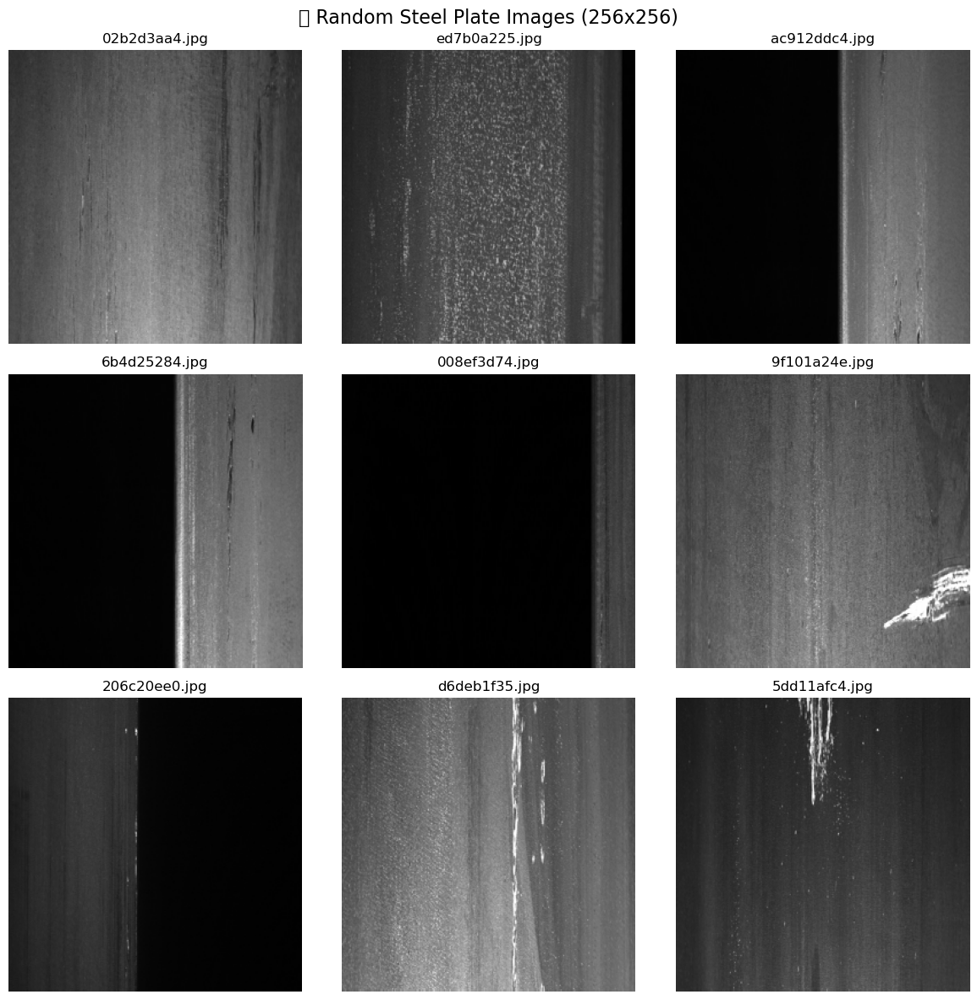

In [2]:
# 📁 Set your dataset path
IMAGE_DIR = r"C:\Users\omash\OneDrive\Documents\Desktop\severstal-steel-defect-detection\train_images"  # Change this if needed

# 📌 Define image loading function
def load_image(image_path, target_size=(256, 256)):
    img = Image.open(image_path).convert('RGB')
    img = img.resize(target_size)
    return np.array(img)

# 🖼️ Display random 9 images from the dataset
sample_files = random.sample(os.listdir(IMAGE_DIR), 9)

plt.figure(figsize=(12, 12))
for i, fname in enumerate(sample_files):
    img_path = os.path.join(IMAGE_DIR, fname)
    img = load_image(img_path)
    plt.subplot(3, 3, i+1)
    plt.imshow(img)
    plt.title(fname)
    plt.axis('off')

plt.suptitle("🔍 Random Steel Plate Images (256x256)", fontsize=16)
plt.tight_layout()
plt.show()


In [3]:
# 🔧 Parameters
IMAGE_SIZE = (256, 256)
MAX_IMAGES = 2000  # You can increase this later based on memory

# 🔁 Load and preprocess images
def preprocess_images(image_dir, max_images=None):
    image_list = []
    file_list = os.listdir(image_dir)
    
    if max_images:
        file_list = file_list[:max_images]

    for fname in file_list:
        try:
            img_path = os.path.join(image_dir, fname)
            img = load_image(img_path, IMAGE_SIZE)
            image_list.append(img)
        except Exception as e:
            print(f"❌ Error loading {fname}: {e}")
    
    data = np.array(image_list, dtype=np.float32)
    data = data / 255.0  # Normalize to [0,1]
    print(f"✅ Loaded {data.shape[0]} images. Shape: {data.shape}")
    return data

# 🧪 Run preprocessing
image_data = preprocess_images(IMAGE_DIR, max_images=MAX_IMAGES)


✅ Loaded 2000 images. Shape: (2000, 256, 256, 3)


In [4]:
# 🔀 Split data into training and validation sets
train_images, val_images = train_test_split(
    image_data,
    test_size=0.2,
    random_state=42
)

print(f"🟩 Training images: {train_images.shape}")
print(f"🟦 Validation images: {val_images.shape}")


🟩 Training images: (1600, 256, 256, 3)
🟦 Validation images: (400, 256, 256, 3)


In [5]:
# 🏗️ Build a Convolutional Autoencoder
def build_autoencoder(input_shape=(256, 256, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    # Encoder
    x = layers.Conv2D(32, 3, activation='relu', padding='same')(inputs)
    x = layers.MaxPooling2D(2, padding='same')(x)
    x = layers.Conv2D(64, 3, activation='relu', padding='same')(x)
    x = layers.MaxPooling2D(2, padding='same')(x)
    x = layers.Conv2D(128, 3, activation='relu', padding='same')(x)
    encoded = layers.MaxPooling2D(2, padding='same')(x)

    # Decoder
    x = layers.Conv2DTranspose(128, 3, strides=2, activation='relu', padding='same')(encoded)
    x = layers.Conv2DTranspose(64, 3, strides=2, activation='relu', padding='same')(x)
    x = layers.Conv2DTranspose(32, 3, strides=2, activation='relu', padding='same')(x)
    decoded = layers.Conv2D(3, 3, activation='sigmoid', padding='same')(x)

    autoencoder = tf.keras.Model(inputs, decoded)
    autoencoder.compile(optimizer='adam', loss='mse')

    return autoencoder

# 🔧 Instantiate model
autoencoder = build_autoencoder()

# 🧾 Model summary
autoencoder.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 128, 128, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 64, 64, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 128)       73856 

In [6]:
# 🏁 Train the autoencoder
history = autoencoder.fit(
    train_images,
    train_images,  # target is same as input
    epochs=50,
    batch_size=32,
    shuffle=True,
    validation_data=(val_images, val_images)
)

# 💾 ✅ Save the trained model after training
autoencoder.save("defect_detection_model.h5")
print("✅ Model saved as 'defect_detection_model.h5'")


Epoch 1/50
50/50 [==============================] - 237s 5s/step - loss: 0.0265 - val_loss: 0.0100
Epoch 2/50
50/50 [==============================] - 223s 4s/step - loss: 0.0043 - val_loss: 0.0022
Epoch 3/50
50/50 [==============================] - 215s 4s/step - loss: 0.0019 - val_loss: 0.0017
Epoch 4/50
50/50 [==============================] - 215s 4s/step - loss: 0.0017 - val_loss: 0.0017
Epoch 5/50
50/50 [==============================] - 215s 4s/step - loss: 0.0016 - val_loss: 0.0015
Epoch 6/50
50/50 [==============================] - 213s 4s/step - loss: 0.0017 - val_loss: 0.0014
Epoch 7/50
50/50 [==============================] - 213s 4s/step - loss: 0.0014 - val_loss: 0.0014
Epoch 8/50
50/50 [==============================] - 215s 4s/step - loss: 0.0013 - val_loss: 0.0013
Epoch 9/50
50/50 [==============================] - 214s 4s/step - loss: 0.0013 - val_loss: 0.0013
Epoch 10/50
50/50 [==============================] - 216s 4s/step - loss: 0.0013 - val_loss: 0.0036
Epoch 11/

1/1 [==============================] - 2s 2s/step


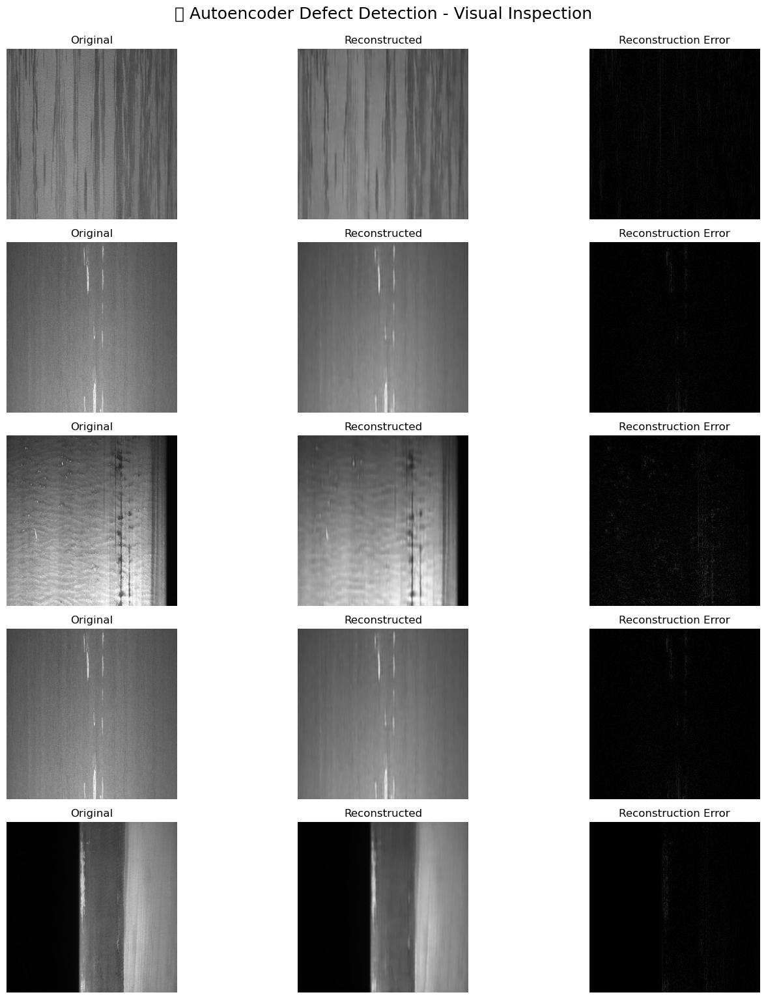

In [7]:
# 🔁 Function to display reconstruction vs. original
def show_reconstruction_results(model, images, n=5):
    indices = np.random.choice(len(images), n)
    selected = images[indices]
    reconstructions = model.predict(selected)

    plt.figure(figsize=(15, n * 3))

    for i in range(n):
        # Original image
        plt.subplot(n, 3, i*3 + 1)
        plt.imshow(selected[i])
        plt.title("Original")
        plt.axis("off")

        # Reconstructed image
        plt.subplot(n, 3, i*3 + 2)
        plt.imshow(reconstructions[i])
        plt.title("Reconstructed")
        plt.axis("off")

        # Error (difference)
        error_map = np.abs(selected[i] - reconstructions[i])
        plt.subplot(n, 3, i*3 + 3)
        plt.imshow(error_map, cmap='hot')
        plt.title("Reconstruction Error")
        plt.axis("off")

    plt.tight_layout()
    plt.suptitle("🔍 Autoencoder Defect Detection - Visual Inspection", fontsize=18, y=1.02)
    plt.show()

# 📊 Run visualization on validation images
show_reconstruction_results(autoencoder, val_images, n=5)


In [8]:
import cv2

def detect_defect(original, reconstructed, threshold=0.02):
    # Compute reconstruction error
    error_map = np.mean(np.abs(original - reconstructed), axis=-1)

    # Threshold the error map to create a binary mask
    defect_mask = (error_map > threshold).astype(np.uint8)

    # Convert to 3-channel image for drawing
    original_vis = (original * 255).astype(np.uint8).copy()

    # Find contours on defect mask
    contours, _ = cv2.findContours(defect_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Draw contours
    defect_detected = False
    for cnt in contours:
        if cv2.contourArea(cnt) > 10:  # Ignore tiny noise
            cv2.drawContours(original_vis, [cnt], -1, (0, 0, 255), 2)
            defect_detected = True

    return original_vis, defect_mask, error_map, defect_detected


1/1 [==============================] - 0s 374ms/step


C:\Users\omash\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 128680 (\N{POLICE CARS REVOLVING LIGHT}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


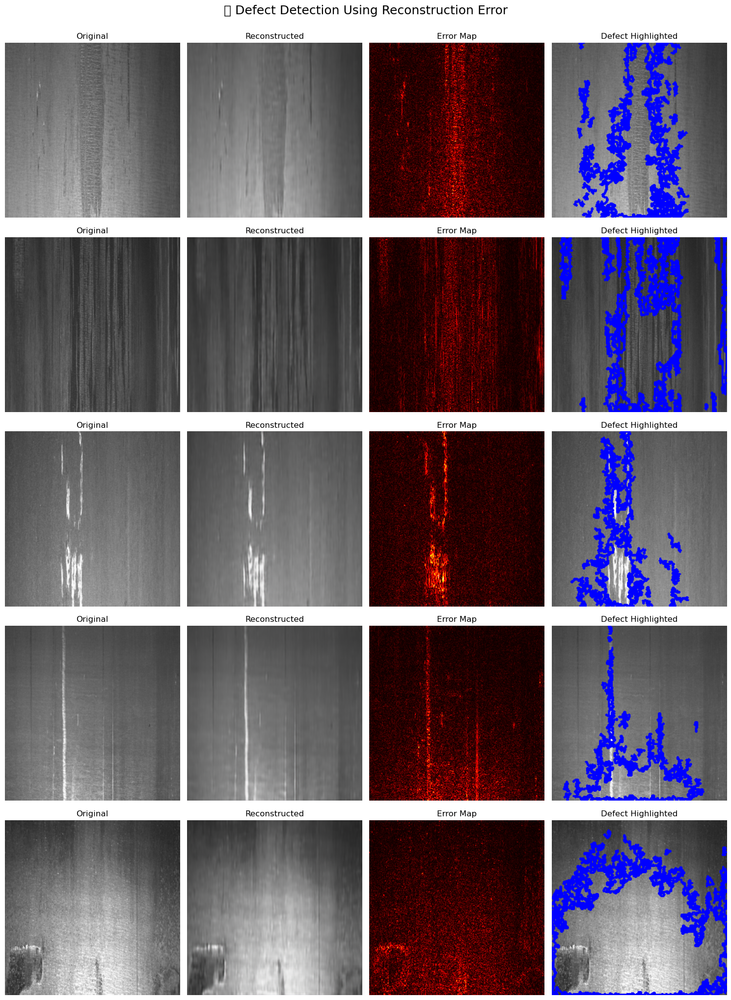

In [9]:
# 🎯 Pick N images from validation set
n = 5
indices = np.random.choice(len(val_images), n)
selected = val_images[indices]
reconstructed = autoencoder.predict(selected)

plt.figure(figsize=(15, n * 4))

for i in range(n):
    orig = selected[i]
    recon = reconstructed[i]
    
    vis_img, mask, err_map, found = detect_defect(orig, recon, threshold=0.02)

    plt.subplot(n, 4, i*4 + 1)
    plt.imshow(orig)
    plt.title("Original")
    plt.axis('off')

    plt.subplot(n, 4, i*4 + 2)
    plt.imshow(recon)
    plt.title("Reconstructed")
    plt.axis('off')

    plt.subplot(n, 4, i*4 + 3)
    plt.imshow(err_map, cmap='hot')
    plt.title("Error Map")
    plt.axis('off')

    plt.subplot(n, 4, i*4 + 4)
    plt.imshow(vis_img)
    plt.title("Defect Highlighted" if found else "No Defect")
    plt.axis('off')

plt.tight_layout()
plt.suptitle("🚨 Defect Detection Using Reconstruction Error", fontsize=18, y=1.02)
plt.show()


In [10]:
def run_defect_detection_on_folder(input_folder, output_folder, model, threshold=0.02):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    file_list = os.listdir(input_folder)
    print(f"🔍 Processing {len(file_list)} images...")

    for fname in tqdm(file_list):
        try:
            # Load and preprocess
            img_path = os.path.join(input_folder, fname)
            img = load_image(img_path, IMAGE_SIZE)
            img_norm = img / 255.0
            img_input = np.expand_dims(img_norm, axis=0)

            # Reconstruct and detect
            reconstructed = model.predict(img_input)[0]
            vis_img, mask, err_map, found = detect_defect(img_norm, reconstructed, threshold)

            # Save output
            out_path = os.path.join(output_folder, fname)
            cv2.imwrite(out_path, cv2.cvtColor(vis_img, cv2.COLOR_RGB2BGR))

        except Exception as e:
            print(f"❌ Failed on {fname}: {e}")


In [11]:
from tqdm import tqdm

# 🗂 Set your paths
ALL_IMAGES_DIR = IMAGE_DIR  # Already defined earlier
OUTPUT_DIR = "output_defects_marked"

# 🚀 Run detection across all images
run_defect_detection_on_folder(
    input_folder=ALL_IMAGES_DIR,
    output_folder=OUTPUT_DIR,
    model=autoencoder,
    threshold=0.02  # You can adjust this
)


🔍 Processing 12568 images...


  0%|                                                                                        | 0/12568 [00:00<?, ?it/s]

1/1 [==============================] - 0s 150ms/step


  0%|                                                                              | 1/12568 [00:00<1:07:59,  3.08it/s]

1/1 [==============================] - 0s 158ms/step


  0%|                                                                              | 2/12568 [00:00<1:02:49,  3.33it/s]

1/1 [==============================] - 0s 110ms/step


  0%|                                                                                | 3/12568 [00:00<59:14,  3.53it/s]

1/1 [==============================] - 0s 126ms/step


  0%|                                                                                | 4/12568 [00:01<56:45,  3.69it/s]

1/1 [==============================] - 0s 126ms/step


  0%|                                                                                | 5/12568 [00:01<55:16,  3.79it/s]

1/1 [==============================] - 0s 126ms/step


  0%|                                                                                | 6/12568 [00:01<56:41,  3.69it/s]

1/1 [==============================] - 0s 126ms/step


  0%|                                                                                | 7/12568 [00:01<56:20,  3.72it/s]

1/1 [==============================] - 0s 141ms/step


  0%|                                                                                | 8/12568 [00:02<54:34,  3.84it/s]

1/1 [==============================] - 0s 112ms/step


  0%|                                                                                | 9/12568 [00:02<52:47,  3.96it/s]

1/1 [==============================] - 0s 125ms/step


  0%|                                                                               | 10/12568 [00:02<50:42,  4.13it/s]

1/1 [==============================] - 0s 141ms/step


  0%|                                                                               | 11/12568 [00:02<51:29,  4.06it/s]

1/1 [==============================] - 0s 126ms/step


  0%|                                                                               | 12/12568 [00:03<51:17,  4.08it/s]

1/1 [==============================] - 0s 126ms/step


  0%|                                                                               | 13/12568 [00:03<53:03,  3.94it/s]

1/1 [==============================] - 0s 126ms/step


  0%|                                                                               | 14/12568 [00:03<54:52,  3.81it/s]

1/1 [==============================] - 0s 142ms/step


  0%|                                                                               | 15/12568 [00:03<55:05,  3.80it/s]

1/1 [==============================] - 0s 141ms/step


  0%|                                                                               | 16/12568 [00:04<53:18,  3.92it/s]

1/1 [==============================] - 0s 127ms/step


  0%|                                                                               | 17/12568 [00:04<52:55,  3.95it/s]

1/1 [==============================] - 0s 141ms/step


  0%|                                                                               | 18/12568 [00:04<55:56,  3.74it/s]

1/1 [==============================] - 0s 125ms/step


  0%|                                                                               | 19/12568 [00:04<52:52,  3.96it/s]

1/1 [==============================] - 0s 152ms/step


  0%|▏                                                                              | 20/12568 [00:05<54:15,  3.85it/s]

1/1 [==============================] - 0s 125ms/step


  0%|▏                                                                              | 21/12568 [00:05<53:26,  3.91it/s]

1/1 [==============================] - 0s 126ms/step


  0%|▏                                                                              | 22/12568 [00:05<53:51,  3.88it/s]

1/1 [==============================] - 0s 140ms/step


  0%|▏                                                                              | 23/12568 [00:05<52:16,  4.00it/s]

1/1 [==============================] - 0s 119ms/step


  0%|▏                                                                              | 24/12568 [00:06<53:28,  3.91it/s]

1/1 [==============================] - 0s 142ms/step


  0%|▏                                                                              | 25/12568 [00:06<53:14,  3.93it/s]

1/1 [==============================] - 0s 126ms/step


  0%|▏                                                                              | 26/12568 [00:06<50:14,  4.16it/s]

1/1 [==============================] - 0s 123ms/step


  0%|▏                                                                              | 27/12568 [00:06<50:39,  4.13it/s]

1/1 [==============================] - 0s 125ms/step


  0%|▏                                                                              | 28/12568 [00:07<52:54,  3.95it/s]

1/1 [==============================] - 0s 134ms/step


  0%|▏                                                                              | 29/12568 [00:07<51:53,  4.03it/s]

1/1 [==============================] - 0s 120ms/step


  0%|▏                                                                              | 30/12568 [00:07<53:43,  3.89it/s]

1/1 [==============================] - 0s 128ms/step


  0%|▏                                                                              | 31/12568 [00:07<51:38,  4.05it/s]

1/1 [==============================] - 0s 127ms/step


  0%|▏                                                                              | 32/12568 [00:08<51:54,  4.03it/s]

1/1 [==============================] - 0s 110ms/step


  0%|▏                                                                              | 33/12568 [00:08<52:34,  3.97it/s]

1/1 [==============================] - 0s 158ms/step


  0%|▏                                                                              | 34/12568 [00:08<55:36,  3.76it/s]

1/1 [==============================] - 0s 129ms/step


  0%|▏                                                                              | 35/12568 [00:09<55:00,  3.80it/s]

1/1 [==============================] - 0s 110ms/step


  0%|▏                                                                              | 36/12568 [00:09<54:32,  3.83it/s]

1/1 [==============================] - 0s 142ms/step


  0%|▏                                                                              | 37/12568 [00:09<55:15,  3.78it/s]

1/1 [==============================] - 0s 126ms/step


  0%|▏                                                                              | 38/12568 [00:09<52:26,  3.98it/s]

1/1 [==============================] - 0s 126ms/step


  0%|▏                                                                              | 39/12568 [00:10<54:27,  3.83it/s]

1/1 [==============================] - 0s 157ms/step


  0%|▎                                                                              | 40/12568 [00:10<58:32,  3.57it/s]

1/1 [==============================] - 0s 126ms/step


  0%|▎                                                                              | 41/12568 [00:10<56:04,  3.72it/s]

1/1 [==============================] - 0s 126ms/step


  0%|▎                                                                              | 42/12568 [00:10<53:51,  3.88it/s]

1/1 [==============================] - 0s 135ms/step


  0%|▎                                                                              | 43/12568 [00:11<55:47,  3.74it/s]

1/1 [==============================] - 0s 142ms/step


  0%|▎                                                                              | 44/12568 [00:11<54:20,  3.84it/s]

1/1 [==============================] - 0s 157ms/step


  0%|▎                                                                              | 45/12568 [00:11<54:20,  3.84it/s]

1/1 [==============================] - 0s 118ms/step


  0%|▎                                                                              | 46/12568 [00:11<51:59,  4.01it/s]

1/1 [==============================] - 0s 110ms/step


  0%|▎                                                                              | 47/12568 [00:12<52:19,  3.99it/s]

1/1 [==============================] - 0s 134ms/step


  0%|▎                                                                              | 48/12568 [00:12<50:52,  4.10it/s]

1/1 [==============================] - 0s 158ms/step


  0%|▎                                                                              | 49/12568 [00:12<55:52,  3.73it/s]

1/1 [==============================] - 0s 127ms/step


  0%|▎                                                                              | 50/12568 [00:12<56:31,  3.69it/s]

1/1 [==============================] - 0s 142ms/step


  0%|▎                                                                              | 51/12568 [00:13<55:34,  3.75it/s]

1/1 [==============================] - 0s 115ms/step


  0%|▎                                                                              | 52/12568 [00:13<55:19,  3.77it/s]

1/1 [==============================] - 0s 127ms/step


  0%|▎                                                                              | 53/12568 [00:13<52:08,  4.00it/s]

1/1 [==============================] - 0s 114ms/step


  0%|▎                                                                              | 54/12568 [00:13<51:57,  4.01it/s]

1/1 [==============================] - 0s 132ms/step


  0%|▎                                                                              | 55/12568 [00:14<50:32,  4.13it/s]

1/1 [==============================] - 0s 143ms/step


  0%|▎                                                                              | 56/12568 [00:14<51:36,  4.04it/s]

1/1 [==============================] - 0s 157ms/step


  0%|▎                                                                              | 57/12568 [00:14<53:56,  3.87it/s]

1/1 [==============================] - 0s 120ms/step


  0%|▎                                                                              | 58/12568 [00:14<51:25,  4.06it/s]

1/1 [==============================] - 0s 119ms/step


  0%|▎                                                                              | 59/12568 [00:15<48:29,  4.30it/s]

1/1 [==============================] - 0s 125ms/step


  0%|▍                                                                              | 60/12568 [00:15<52:26,  3.97it/s]

1/1 [==============================] - 0s 126ms/step


  0%|▍                                                                              | 61/12568 [00:15<53:26,  3.90it/s]

1/1 [==============================] - 0s 110ms/step


  0%|▍                                                                              | 62/12568 [00:15<52:29,  3.97it/s]

1/1 [==============================] - 0s 158ms/step


  1%|▍                                                                              | 63/12568 [00:16<53:58,  3.86it/s]

1/1 [==============================] - 0s 129ms/step


  1%|▍                                                                              | 64/12568 [00:16<54:22,  3.83it/s]

1/1 [==============================] - 0s 141ms/step


  1%|▍                                                                              | 65/12568 [00:16<51:52,  4.02it/s]

1/1 [==============================] - 0s 143ms/step


  1%|▍                                                                              | 66/12568 [00:16<52:58,  3.93it/s]

1/1 [==============================] - 0s 127ms/step


  1%|▍                                                                              | 67/12568 [00:17<52:40,  3.96it/s]

1/1 [==============================] - 0s 155ms/step


  1%|▍                                                                              | 68/12568 [00:17<55:14,  3.77it/s]

1/1 [==============================] - 0s 154ms/step


  1%|▍                                                                              | 69/12568 [00:17<54:42,  3.81it/s]

1/1 [==============================] - 0s 129ms/step


  1%|▍                                                                              | 70/12568 [00:17<52:51,  3.94it/s]

1/1 [==============================] - 0s 142ms/step


  1%|▍                                                                              | 71/12568 [00:18<55:00,  3.79it/s]

1/1 [==============================] - 0s 126ms/step


  1%|▍                                                                              | 72/12568 [00:18<53:37,  3.88it/s]

1/1 [==============================] - 0s 110ms/step


  1%|▍                                                                              | 73/12568 [00:18<51:02,  4.08it/s]

1/1 [==============================] - 0s 125ms/step


  1%|▍                                                                              | 74/12568 [00:18<49:16,  4.23it/s]

1/1 [==============================] - 0s 110ms/step


  1%|▍                                                                              | 75/12568 [00:19<50:12,  4.15it/s]

1/1 [==============================] - 0s 111ms/step


  1%|▍                                                                              | 76/12568 [00:19<51:32,  4.04it/s]

1/1 [==============================] - 0s 127ms/step


  1%|▍                                                                              | 77/12568 [00:19<49:58,  4.17it/s]

1/1 [==============================] - 0s 111ms/step


  1%|▍                                                                              | 78/12568 [00:19<50:35,  4.11it/s]

1/1 [==============================] - 0s 145ms/step


  1%|▍                                                                              | 79/12568 [00:20<53:25,  3.90it/s]

1/1 [==============================] - 0s 138ms/step


  1%|▌                                                                              | 80/12568 [00:20<52:28,  3.97it/s]

1/1 [==============================] - 0s 110ms/step


  1%|▌                                                                              | 81/12568 [00:20<52:53,  3.93it/s]

1/1 [==============================] - 0s 132ms/step


  1%|▌                                                                              | 82/12568 [00:20<52:34,  3.96it/s]

1/1 [==============================] - 0s 126ms/step


  1%|▌                                                                              | 83/12568 [00:21<53:29,  3.89it/s]

1/1 [==============================] - 0s 128ms/step


  1%|▌                                                                              | 84/12568 [00:21<52:30,  3.96it/s]

1/1 [==============================] - 0s 110ms/step


  1%|▌                                                                              | 85/12568 [00:21<50:15,  4.14it/s]

1/1 [==============================] - 0s 126ms/step


  1%|▌                                                                              | 86/12568 [00:21<50:41,  4.10it/s]

1/1 [==============================] - 0s 112ms/step


  1%|▌                                                                              | 87/12568 [00:22<49:38,  4.19it/s]

1/1 [==============================] - 0s 113ms/step


  1%|▌                                                                              | 88/12568 [00:22<51:21,  4.05it/s]

1/1 [==============================] - 0s 126ms/step


  1%|▌                                                                              | 89/12568 [00:22<49:08,  4.23it/s]

1/1 [==============================] - 0s 136ms/step


  1%|▌                                                                              | 90/12568 [00:22<53:03,  3.92it/s]

1/1 [==============================] - 0s 118ms/step


  1%|▌                                                                              | 91/12568 [00:23<50:30,  4.12it/s]

1/1 [==============================] - 0s 147ms/step


  1%|▌                                                                              | 92/12568 [00:23<50:36,  4.11it/s]

1/1 [==============================] - 0s 117ms/step


  1%|▌                                                                              | 93/12568 [00:23<50:44,  4.10it/s]

1/1 [==============================] - 0s 141ms/step


  1%|▌                                                                              | 94/12568 [00:23<54:42,  3.80it/s]

1/1 [==============================] - 0s 110ms/step


  1%|▌                                                                              | 95/12568 [00:24<51:04,  4.07it/s]

1/1 [==============================] - 0s 110ms/step


  1%|▌                                                                              | 96/12568 [00:24<53:31,  3.88it/s]

1/1 [==============================] - 0s 126ms/step


  1%|▌                                                                              | 97/12568 [00:24<53:10,  3.91it/s]

1/1 [==============================] - 0s 126ms/step


  1%|▌                                                                              | 98/12568 [00:24<54:03,  3.85it/s]

1/1 [==============================] - 0s 126ms/step


  1%|▌                                                                              | 99/12568 [00:25<53:42,  3.87it/s]

1/1 [==============================] - 0s 117ms/step


  1%|▌                                                                             | 100/12568 [00:25<51:12,  4.06it/s]

1/1 [==============================] - 0s 116ms/step


  1%|▋                                                                             | 101/12568 [00:25<51:20,  4.05it/s]

1/1 [==============================] - 0s 126ms/step


  1%|▋                                                                             | 102/12568 [00:25<52:00,  3.99it/s]

1/1 [==============================] - 0s 142ms/step


  1%|▋                                                                             | 103/12568 [00:26<54:07,  3.84it/s]

1/1 [==============================] - 0s 142ms/step


  1%|▋                                                                             | 104/12568 [00:26<54:51,  3.79it/s]

1/1 [==============================] - 0s 164ms/step


  1%|▋                                                                             | 105/12568 [00:26<53:30,  3.88it/s]

1/1 [==============================] - 0s 110ms/step


  1%|▋                                                                             | 106/12568 [00:27<54:00,  3.85it/s]

1/1 [==============================] - 0s 157ms/step


  1%|▋                                                                             | 107/12568 [00:27<53:07,  3.91it/s]

1/1 [==============================] - 0s 157ms/step


  1%|▋                                                                             | 108/12568 [00:27<55:19,  3.75it/s]

1/1 [==============================] - 0s 126ms/step


  1%|▋                                                                             | 109/12568 [00:27<54:46,  3.79it/s]

1/1 [==============================] - 0s 125ms/step


  1%|▋                                                                             | 110/12568 [00:28<54:21,  3.82it/s]

1/1 [==============================] - 0s 125ms/step


  1%|▋                                                                             | 111/12568 [00:28<54:44,  3.79it/s]

1/1 [==============================] - 0s 126ms/step


  1%|▋                                                                             | 112/12568 [00:28<55:43,  3.73it/s]

1/1 [==============================] - 0s 126ms/step


  1%|▋                                                                             | 113/12568 [00:28<52:26,  3.96it/s]

1/1 [==============================] - 0s 157ms/step


  1%|▋                                                                             | 114/12568 [00:29<54:39,  3.80it/s]

1/1 [==============================] - 0s 110ms/step


  1%|▋                                                                             | 115/12568 [00:29<52:22,  3.96it/s]

1/1 [==============================] - 0s 126ms/step


  1%|▋                                                                             | 116/12568 [00:29<52:20,  3.96it/s]

1/1 [==============================] - 0s 164ms/step


  1%|▋                                                                             | 117/12568 [00:29<52:03,  3.99it/s]

1/1 [==============================] - 0s 142ms/step


  1%|▋                                                                             | 118/12568 [00:30<53:07,  3.91it/s]

1/1 [==============================] - 0s 110ms/step


  1%|▋                                                                             | 119/12568 [00:30<52:28,  3.95it/s]

1/1 [==============================] - 0s 118ms/step


  1%|▋                                                                             | 120/12568 [00:30<50:51,  4.08it/s]

1/1 [==============================] - 0s 165ms/step


  1%|▊                                                                             | 121/12568 [00:30<51:53,  4.00it/s]

1/1 [==============================] - 0s 157ms/step


  1%|▊                                                                             | 122/12568 [00:31<51:42,  4.01it/s]

1/1 [==============================] - 0s 121ms/step


  1%|▊                                                                             | 123/12568 [00:31<53:10,  3.90it/s]

1/1 [==============================] - 0s 157ms/step


  1%|▊                                                                             | 124/12568 [00:31<55:19,  3.75it/s]

1/1 [==============================] - 0s 126ms/step


  1%|▊                                                                             | 125/12568 [00:31<55:10,  3.76it/s]

1/1 [==============================] - 0s 126ms/step


  1%|▊                                                                             | 126/12568 [00:32<54:56,  3.77it/s]

1/1 [==============================] - 0s 110ms/step


  1%|▊                                                                             | 127/12568 [00:32<54:21,  3.81it/s]

1/1 [==============================] - 0s 168ms/step


  1%|▊                                                                             | 128/12568 [00:32<56:11,  3.69it/s]

1/1 [==============================] - 0s 142ms/step


  1%|▊                                                                             | 129/12568 [00:33<56:28,  3.67it/s]

1/1 [==============================] - 0s 141ms/step


  1%|▊                                                                             | 130/12568 [00:33<55:45,  3.72it/s]

1/1 [==============================] - 0s 140ms/step


  1%|▊                                                                             | 131/12568 [00:33<55:09,  3.76it/s]

1/1 [==============================] - 0s 126ms/step


  1%|▊                                                                             | 132/12568 [00:33<54:59,  3.77it/s]

1/1 [==============================] - 0s 125ms/step


  1%|▊                                                                             | 133/12568 [00:34<52:20,  3.96it/s]

1/1 [==============================] - 0s 126ms/step


  1%|▊                                                                             | 134/12568 [00:34<53:19,  3.89it/s]

1/1 [==============================] - 0s 110ms/step


  1%|▊                                                                             | 135/12568 [00:34<53:42,  3.86it/s]

1/1 [==============================] - 0s 153ms/step


  1%|▊                                                                             | 136/12568 [00:34<56:26,  3.67it/s]

1/1 [==============================] - 0s 129ms/step


  1%|▊                                                                             | 137/12568 [00:35<54:03,  3.83it/s]

1/1 [==============================] - 0s 121ms/step


  1%|▊                                                                             | 138/12568 [00:35<51:58,  3.99it/s]

1/1 [==============================] - 0s 115ms/step


  1%|▊                                                                             | 139/12568 [00:35<50:30,  4.10it/s]

1/1 [==============================] - 0s 150ms/step


  1%|▊                                                                             | 140/12568 [00:35<53:01,  3.91it/s]

1/1 [==============================] - 0s 126ms/step


  1%|▉                                                                             | 141/12568 [00:36<54:17,  3.82it/s]

1/1 [==============================] - 0s 125ms/step


  1%|▉                                                                             | 142/12568 [00:36<54:37,  3.79it/s]

1/1 [==============================] - 0s 141ms/step


  1%|▉                                                                             | 143/12568 [00:36<55:24,  3.74it/s]

1/1 [==============================] - 0s 123ms/step


  1%|▉                                                                             | 144/12568 [00:36<54:14,  3.82it/s]

1/1 [==============================] - 0s 145ms/step


  1%|▉                                                                             | 145/12568 [00:37<53:35,  3.86it/s]

1/1 [==============================] - 0s 141ms/step


  1%|▉                                                                             | 146/12568 [00:37<53:51,  3.84it/s]

1/1 [==============================] - 0s 127ms/step


  1%|▉                                                                             | 147/12568 [00:37<51:21,  4.03it/s]

1/1 [==============================] - 0s 161ms/step


  1%|▉                                                                             | 148/12568 [00:37<51:53,  3.99it/s]

1/1 [==============================] - 0s 109ms/step


  1%|▉                                                                             | 149/12568 [00:38<52:49,  3.92it/s]

1/1 [==============================] - 0s 158ms/step


  1%|▉                                                                             | 150/12568 [00:38<55:11,  3.75it/s]

1/1 [==============================] - 0s 120ms/step


  1%|▉                                                                             | 151/12568 [00:38<53:10,  3.89it/s]

1/1 [==============================] - 0s 127ms/step


  1%|▉                                                                             | 152/12568 [00:38<50:59,  4.06it/s]

1/1 [==============================] - 0s 126ms/step


  1%|▉                                                                             | 153/12568 [00:39<51:11,  4.04it/s]

1/1 [==============================] - 0s 114ms/step


  1%|▉                                                                             | 154/12568 [00:39<48:08,  4.30it/s]

1/1 [==============================] - 0s 119ms/step


  1%|▉                                                                             | 155/12568 [00:39<50:24,  4.10it/s]

1/1 [==============================] - 0s 126ms/step


  1%|▉                                                                             | 156/12568 [00:39<48:37,  4.25it/s]

1/1 [==============================] - 0s 123ms/step


  1%|▉                                                                             | 157/12568 [00:40<48:36,  4.26it/s]

1/1 [==============================] - 0s 134ms/step


  1%|▉                                                                             | 158/12568 [00:40<50:19,  4.11it/s]

1/1 [==============================] - 0s 119ms/step


  1%|▉                                                                             | 159/12568 [00:40<51:21,  4.03it/s]

1/1 [==============================] - 0s 157ms/step


  1%|▉                                                                             | 160/12568 [00:40<53:44,  3.85it/s]

1/1 [==============================] - 0s 110ms/step


  1%|▉                                                                             | 161/12568 [00:41<52:40,  3.93it/s]

1/1 [==============================] - 0s 110ms/step


  1%|█                                                                             | 162/12568 [00:41<53:03,  3.90it/s]

1/1 [==============================] - 0s 149ms/step


  1%|█                                                                             | 163/12568 [00:41<54:40,  3.78it/s]

1/1 [==============================] - 0s 126ms/step


  1%|█                                                                             | 164/12568 [00:41<52:39,  3.93it/s]

1/1 [==============================] - 0s 142ms/step


  1%|█                                                                             | 165/12568 [00:42<52:19,  3.95it/s]

1/1 [==============================] - 0s 142ms/step


  1%|█                                                                             | 166/12568 [00:42<51:10,  4.04it/s]

1/1 [==============================] - 0s 157ms/step


  1%|█                                                                             | 167/12568 [00:42<52:48,  3.91it/s]

1/1 [==============================] - 0s 125ms/step


  1%|█                                                                             | 168/12568 [00:42<54:28,  3.79it/s]

1/1 [==============================] - 0s 142ms/step


  1%|█                                                                             | 169/12568 [00:43<55:34,  3.72it/s]

1/1 [==============================] - 0s 160ms/step


  1%|█                                                                             | 170/12568 [00:43<54:18,  3.81it/s]

1/1 [==============================] - 0s 126ms/step


  1%|█                                                                             | 171/12568 [00:43<51:47,  3.99it/s]

1/1 [==============================] - 0s 110ms/step


  1%|█                                                                             | 172/12568 [00:43<51:31,  4.01it/s]

1/1 [==============================] - 0s 143ms/step


  1%|█                                                                             | 173/12568 [00:44<54:17,  3.81it/s]

1/1 [==============================] - 0s 157ms/step


  1%|█                                                                             | 174/12568 [00:44<56:10,  3.68it/s]

1/1 [==============================] - 0s 142ms/step


  1%|█                                                                             | 175/12568 [00:44<54:38,  3.78it/s]

1/1 [==============================] - 0s 127ms/step


  1%|█                                                                             | 176/12568 [00:44<51:38,  4.00it/s]

1/1 [==============================] - 0s 142ms/step


  1%|█                                                                             | 177/12568 [00:45<52:57,  3.90it/s]

1/1 [==============================] - 0s 148ms/step


  1%|█                                                                             | 178/12568 [00:45<55:35,  3.71it/s]

1/1 [==============================] - 0s 126ms/step


  1%|█                                                                             | 179/12568 [00:45<55:53,  3.69it/s]

1/1 [==============================] - 0s 126ms/step


  1%|█                                                                             | 180/12568 [00:46<55:50,  3.70it/s]

1/1 [==============================] - 0s 158ms/step


  1%|█                                                                             | 181/12568 [00:46<57:09,  3.61it/s]

1/1 [==============================] - 0s 110ms/step


  1%|█▏                                                                            | 182/12568 [00:46<56:23,  3.66it/s]

1/1 [==============================] - 0s 142ms/step


  1%|█▏                                                                            | 183/12568 [00:46<56:07,  3.68it/s]

1/1 [==============================] - 0s 126ms/step


  1%|█▏                                                                            | 184/12568 [00:47<54:53,  3.76it/s]

1/1 [==============================] - 0s 127ms/step


  1%|█▏                                                                            | 185/12568 [00:47<54:21,  3.80it/s]

1/1 [==============================] - 0s 110ms/step


  1%|█▏                                                                            | 186/12568 [00:47<52:05,  3.96it/s]

1/1 [==============================] - 0s 141ms/step


  1%|█▏                                                                            | 187/12568 [00:47<51:58,  3.97it/s]

1/1 [==============================] - 0s 142ms/step


  1%|█▏                                                                            | 188/12568 [00:48<50:51,  4.06it/s]

1/1 [==============================] - 0s 134ms/step


  2%|█▏                                                                            | 189/12568 [00:48<51:39,  3.99it/s]

1/1 [==============================] - 0s 110ms/step


  2%|█▏                                                                            | 190/12568 [00:48<52:52,  3.90it/s]

1/1 [==============================] - 0s 133ms/step


  2%|█▏                                                                            | 191/12568 [00:48<51:37,  4.00it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▏                                                                            | 192/12568 [00:49<51:38,  3.99it/s]

1/1 [==============================] - 0s 118ms/step


  2%|█▏                                                                            | 193/12568 [00:49<52:44,  3.91it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▏                                                                            | 194/12568 [00:49<53:09,  3.88it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▏                                                                            | 195/12568 [00:49<49:57,  4.13it/s]

1/1 [==============================] - 0s 161ms/step


  2%|█▏                                                                            | 196/12568 [00:50<56:14,  3.67it/s]

1/1 [==============================] - 0s 149ms/step


  2%|█▏                                                                            | 197/12568 [00:50<54:21,  3.79it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▏                                                                            | 198/12568 [00:50<53:53,  3.83it/s]

1/1 [==============================] - 0s 158ms/step


  2%|█▏                                                                            | 199/12568 [00:51<54:52,  3.76it/s]

1/1 [==============================] - 0s 141ms/step


  2%|█▏                                                                            | 200/12568 [00:51<56:02,  3.68it/s]

1/1 [==============================] - 0s 127ms/step


  2%|█▏                                                                            | 201/12568 [00:51<53:32,  3.85it/s]

1/1 [==============================] - 0s 129ms/step


  2%|█▎                                                                            | 202/12568 [00:51<51:49,  3.98it/s]

1/1 [==============================] - 0s 118ms/step


  2%|█▎                                                                            | 203/12568 [00:52<50:52,  4.05it/s]

1/1 [==============================] - 0s 110ms/step


  2%|█▎                                                                            | 204/12568 [00:52<51:06,  4.03it/s]

1/1 [==============================] - 0s 158ms/step


  2%|█▎                                                                            | 205/12568 [00:52<53:28,  3.85it/s]

1/1 [==============================] - 0s 121ms/step


  2%|█▎                                                                            | 206/12568 [00:52<51:03,  4.04it/s]

1/1 [==============================] - 0s 111ms/step


  2%|█▎                                                                            | 207/12568 [00:53<50:10,  4.11it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▎                                                                            | 208/12568 [00:53<49:57,  4.12it/s]

1/1 [==============================] - 0s 110ms/step


  2%|█▎                                                                            | 209/12568 [00:53<49:22,  4.17it/s]

1/1 [==============================] - 0s 100ms/step


  2%|█▎                                                                            | 210/12568 [00:53<47:56,  4.30it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▎                                                                            | 211/12568 [00:53<50:29,  4.08it/s]

1/1 [==============================] - 0s 121ms/step


  2%|█▎                                                                            | 212/12568 [00:54<48:53,  4.21it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▎                                                                            | 213/12568 [00:54<46:49,  4.40it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▎                                                                            | 214/12568 [00:54<49:26,  4.17it/s]

1/1 [==============================] - 0s 142ms/step


  2%|█▎                                                                            | 215/12568 [00:54<52:49,  3.90it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▎                                                                            | 216/12568 [00:55<52:48,  3.90it/s]

1/1 [==============================] - 0s 145ms/step


  2%|█▎                                                                            | 217/12568 [00:55<51:08,  4.02it/s]

1/1 [==============================] - 0s 149ms/step


  2%|█▎                                                                            | 218/12568 [00:55<51:00,  4.04it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▎                                                                            | 219/12568 [00:55<50:03,  4.11it/s]

1/1 [==============================] - 0s 173ms/step


  2%|█▎                                                                            | 220/12568 [00:56<52:18,  3.93it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▎                                                                            | 221/12568 [00:56<53:39,  3.84it/s]

1/1 [==============================] - 0s 116ms/step


  2%|█▍                                                                            | 222/12568 [00:56<53:53,  3.82it/s]

1/1 [==============================] - 0s 158ms/step


  2%|█▍                                                                            | 223/12568 [00:57<53:55,  3.81it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▍                                                                            | 224/12568 [00:57<54:37,  3.77it/s]

1/1 [==============================] - 0s 116ms/step


  2%|█▍                                                                            | 225/12568 [00:57<52:21,  3.93it/s]

1/1 [==============================] - 0s 110ms/step


  2%|█▍                                                                            | 226/12568 [00:57<50:17,  4.09it/s]

1/1 [==============================] - 0s 127ms/step


  2%|█▍                                                                            | 227/12568 [00:57<50:35,  4.07it/s]

1/1 [==============================] - 0s 125ms/step


  2%|█▍                                                                            | 228/12568 [00:58<51:17,  4.01it/s]

1/1 [==============================] - 0s 139ms/step


  2%|█▍                                                                            | 229/12568 [00:58<49:52,  4.12it/s]

1/1 [==============================] - 0s 166ms/step


  2%|█▍                                                                            | 230/12568 [00:58<51:32,  3.99it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▍                                                                            | 231/12568 [00:58<51:50,  3.97it/s]

1/1 [==============================] - 0s 111ms/step


  2%|█▍                                                                            | 232/12568 [00:59<52:40,  3.90it/s]

1/1 [==============================] - 0s 110ms/step


  2%|█▍                                                                            | 233/12568 [00:59<51:26,  4.00it/s]

1/1 [==============================] - 0s 128ms/step


  2%|█▍                                                                            | 234/12568 [00:59<49:45,  4.13it/s]

1/1 [==============================] - 0s 159ms/step


  2%|█▍                                                                            | 235/12568 [00:59<51:08,  4.02it/s]

1/1 [==============================] - 0s 125ms/step


  2%|█▍                                                                            | 236/12568 [01:00<49:07,  4.18it/s]

1/1 [==============================] - 0s 127ms/step


  2%|█▍                                                                            | 237/12568 [01:00<48:43,  4.22it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▍                                                                            | 238/12568 [01:00<52:51,  3.89it/s]

1/1 [==============================] - 0s 144ms/step


  2%|█▍                                                                            | 239/12568 [01:01<55:15,  3.72it/s]

1/1 [==============================] - 0s 142ms/step


  2%|█▍                                                                            | 240/12568 [01:01<53:28,  3.84it/s]

1/1 [==============================] - 0s 110ms/step


  2%|█▍                                                                            | 241/12568 [01:01<53:02,  3.87it/s]

1/1 [==============================] - 0s 142ms/step


  2%|█▌                                                                            | 242/12568 [01:01<53:10,  3.86it/s]

1/1 [==============================] - 0s 158ms/step


  2%|█▌                                                                            | 243/12568 [01:02<55:11,  3.72it/s]

1/1 [==============================] - 0s 117ms/step


  2%|█▌                                                                            | 244/12568 [01:02<55:29,  3.70it/s]

1/1 [==============================] - 0s 140ms/step


  2%|█▌                                                                            | 245/12568 [01:02<52:51,  3.89it/s]

1/1 [==============================] - 0s 118ms/step


  2%|█▌                                                                            | 246/12568 [01:02<53:12,  3.86it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▌                                                                            | 247/12568 [01:03<52:06,  3.94it/s]

1/1 [==============================] - 0s 128ms/step


  2%|█▌                                                                            | 248/12568 [01:03<50:55,  4.03it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▌                                                                            | 249/12568 [01:03<51:13,  4.01it/s]

1/1 [==============================] - 0s 127ms/step


  2%|█▌                                                                            | 250/12568 [01:03<51:10,  4.01it/s]

1/1 [==============================] - 0s 125ms/step


  2%|█▌                                                                            | 251/12568 [01:04<52:06,  3.94it/s]

1/1 [==============================] - 0s 127ms/step


  2%|█▌                                                                            | 252/12568 [01:04<52:04,  3.94it/s]

1/1 [==============================] - 0s 110ms/step


  2%|█▌                                                                            | 253/12568 [01:04<52:19,  3.92it/s]

1/1 [==============================] - 0s 141ms/step


  2%|█▌                                                                            | 254/12568 [01:04<53:54,  3.81it/s]

1/1 [==============================] - 0s 144ms/step


  2%|█▌                                                                            | 255/12568 [01:05<52:43,  3.89it/s]

1/1 [==============================] - 0s 140ms/step


  2%|█▌                                                                            | 256/12568 [01:05<50:51,  4.04it/s]

1/1 [==============================] - 0s 157ms/step


  2%|█▌                                                                            | 257/12568 [01:05<52:21,  3.92it/s]

1/1 [==============================] - 0s 125ms/step


  2%|█▌                                                                            | 258/12568 [01:05<49:47,  4.12it/s]

1/1 [==============================] - 0s 125ms/step


  2%|█▌                                                                            | 259/12568 [01:06<54:48,  3.74it/s]

1/1 [==============================] - 0s 145ms/step


  2%|█▌                                                                            | 260/12568 [01:06<54:14,  3.78it/s]

1/1 [==============================] - 0s 125ms/step


  2%|█▌                                                                            | 261/12568 [01:06<52:35,  3.90it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▋                                                                            | 262/12568 [01:06<52:54,  3.88it/s]

1/1 [==============================] - 0s 142ms/step


  2%|█▋                                                                            | 263/12568 [01:07<53:39,  3.82it/s]

1/1 [==============================] - 0s 125ms/step


  2%|█▋                                                                            | 264/12568 [01:07<53:13,  3.85it/s]

1/1 [==============================] - 0s 127ms/step


  2%|█▋                                                                            | 265/12568 [01:07<53:01,  3.87it/s]

1/1 [==============================] - 0s 110ms/step


  2%|█▋                                                                            | 266/12568 [01:07<50:27,  4.06it/s]

1/1 [==============================] - 0s 110ms/step


  2%|█▋                                                                            | 267/12568 [01:08<53:01,  3.87it/s]

1/1 [==============================] - 0s 158ms/step


  2%|█▋                                                                            | 268/12568 [01:08<55:37,  3.69it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▋                                                                            | 269/12568 [01:08<54:21,  3.77it/s]

1/1 [==============================] - 0s 122ms/step


  2%|█▋                                                                            | 270/12568 [01:08<52:21,  3.91it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▋                                                                            | 271/12568 [01:09<53:05,  3.86it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▋                                                                            | 272/12568 [01:09<52:47,  3.88it/s]

1/1 [==============================] - 0s 111ms/step


  2%|█▋                                                                            | 273/12568 [01:09<52:07,  3.93it/s]

1/1 [==============================] - 0s 142ms/step


  2%|█▋                                                                            | 274/12568 [01:09<51:02,  4.01it/s]

1/1 [==============================] - 0s 110ms/step


  2%|█▋                                                                            | 275/12568 [01:10<52:22,  3.91it/s]

1/1 [==============================] - 0s 150ms/step


  2%|█▋                                                                            | 276/12568 [01:10<51:24,  3.98it/s]

1/1 [==============================] - 0s 117ms/step


  2%|█▋                                                                            | 277/12568 [01:10<51:21,  3.99it/s]

1/1 [==============================] - 0s 125ms/step


  2%|█▋                                                                            | 278/12568 [01:10<49:47,  4.11it/s]

1/1 [==============================] - 0s 113ms/step


  2%|█▋                                                                            | 279/12568 [01:11<49:24,  4.14it/s]

1/1 [==============================] - 0s 141ms/step


  2%|█▋                                                                            | 280/12568 [01:11<53:25,  3.83it/s]

1/1 [==============================] - 0s 121ms/step


  2%|█▋                                                                            | 281/12568 [01:11<53:35,  3.82it/s]

1/1 [==============================] - 0s 111ms/step


  2%|█▊                                                                            | 282/12568 [01:11<51:02,  4.01it/s]

1/1 [==============================] - 0s 132ms/step


  2%|█▊                                                                            | 283/12568 [01:12<50:06,  4.09it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▊                                                                            | 284/12568 [01:12<51:05,  4.01it/s]

1/1 [==============================] - 0s 150ms/step


  2%|█▊                                                                            | 285/12568 [01:12<52:06,  3.93it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▊                                                                            | 286/12568 [01:13<54:04,  3.79it/s]

1/1 [==============================] - 0s 141ms/step


  2%|█▊                                                                            | 287/12568 [01:13<54:56,  3.72it/s]

1/1 [==============================] - 0s 117ms/step


  2%|█▊                                                                            | 288/12568 [01:13<51:42,  3.96it/s]

1/1 [==============================] - 0s 167ms/step


  2%|█▊                                                                            | 289/12568 [01:13<51:32,  3.97it/s]

1/1 [==============================] - 0s 127ms/step


  2%|█▊                                                                            | 290/12568 [01:14<51:47,  3.95it/s]

1/1 [==============================] - 0s 110ms/step


  2%|█▊                                                                            | 291/12568 [01:14<51:36,  3.96it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▊                                                                            | 292/12568 [01:14<50:31,  4.05it/s]

1/1 [==============================] - 0s 151ms/step


  2%|█▊                                                                            | 293/12568 [01:14<50:13,  4.07it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▊                                                                            | 294/12568 [01:15<51:07,  4.00it/s]

1/1 [==============================] - 0s 142ms/step


  2%|█▊                                                                            | 295/12568 [01:15<53:02,  3.86it/s]

1/1 [==============================] - 0s 142ms/step


  2%|█▊                                                                            | 296/12568 [01:15<53:46,  3.80it/s]

1/1 [==============================] - 0s 136ms/step


  2%|█▊                                                                            | 297/12568 [01:15<51:56,  3.94it/s]

1/1 [==============================] - 0s 114ms/step


  2%|█▊                                                                            | 298/12568 [01:16<52:52,  3.87it/s]

1/1 [==============================] - 0s 118ms/step


  2%|█▊                                                                            | 299/12568 [01:16<50:26,  4.05it/s]

1/1 [==============================] - 0s 142ms/step


  2%|█▊                                                                            | 300/12568 [01:16<52:04,  3.93it/s]

1/1 [==============================] - 0s 111ms/step


  2%|█▊                                                                            | 301/12568 [01:16<49:30,  4.13it/s]

1/1 [==============================] - 0s 130ms/step


  2%|█▊                                                                            | 302/12568 [01:17<48:45,  4.19it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▉                                                                            | 303/12568 [01:17<50:56,  4.01it/s]

1/1 [==============================] - 0s 132ms/step


  2%|█▉                                                                            | 304/12568 [01:17<51:03,  4.00it/s]

1/1 [==============================] - 0s 138ms/step


  2%|█▉                                                                            | 305/12568 [01:17<49:33,  4.12it/s]

1/1 [==============================] - 0s 157ms/step


  2%|█▉                                                                            | 306/12568 [01:18<52:23,  3.90it/s]

1/1 [==============================] - 0s 141ms/step


  2%|█▉                                                                            | 307/12568 [01:18<52:47,  3.87it/s]

1/1 [==============================] - 0s 111ms/step


  2%|█▉                                                                            | 308/12568 [01:18<50:18,  4.06it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▉                                                                            | 309/12568 [01:18<49:48,  4.10it/s]

1/1 [==============================] - 0s 142ms/step


  2%|█▉                                                                            | 310/12568 [01:19<51:03,  4.00it/s]

1/1 [==============================] - 0s 126ms/step


  2%|█▉                                                                            | 311/12568 [01:19<52:31,  3.89it/s]

1/1 [==============================] - 0s 141ms/step


  2%|█▉                                                                            | 312/12568 [01:19<50:32,  4.04it/s]

1/1 [==============================] - 0s 142ms/step


  2%|█▉                                                                            | 313/12568 [01:19<52:51,  3.86it/s]

1/1 [==============================] - 0s 127ms/step


  2%|█▉                                                                            | 314/12568 [01:20<51:57,  3.93it/s]

1/1 [==============================] - 0s 126ms/step


  3%|█▉                                                                            | 315/12568 [01:20<49:48,  4.10it/s]

1/1 [==============================] - 0s 133ms/step


  3%|█▉                                                                            | 316/12568 [01:20<50:43,  4.03it/s]

1/1 [==============================] - 0s 126ms/step


  3%|█▉                                                                            | 317/12568 [01:20<52:31,  3.89it/s]

1/1 [==============================] - 0s 158ms/step


  3%|█▉                                                                            | 318/12568 [01:21<55:13,  3.70it/s]

1/1 [==============================] - 0s 151ms/step


  3%|█▉                                                                            | 319/12568 [01:21<56:05,  3.64it/s]

1/1 [==============================] - 0s 115ms/step


  3%|█▉                                                                            | 320/12568 [01:21<53:14,  3.83it/s]

1/1 [==============================] - 0s 112ms/step


  3%|█▉                                                                            | 321/12568 [01:21<51:15,  3.98it/s]

1/1 [==============================] - 0s 158ms/step


  3%|█▉                                                                            | 322/12568 [01:22<54:56,  3.72it/s]

1/1 [==============================] - 0s 126ms/step


  3%|██                                                                            | 323/12568 [01:22<55:02,  3.71it/s]

1/1 [==============================] - 0s 126ms/step


  3%|██                                                                            | 324/12568 [01:22<58:01,  3.52it/s]

1/1 [==============================] - 0s 169ms/step


  3%|██                                                                            | 325/12568 [01:23<55:51,  3.65it/s]

1/1 [==============================] - 0s 120ms/step


  3%|██                                                                            | 326/12568 [01:23<55:10,  3.70it/s]

1/1 [==============================] - 0s 161ms/step


  3%|██                                                                            | 327/12568 [01:23<54:12,  3.76it/s]

1/1 [==============================] - 0s 126ms/step


  3%|██                                                                            | 328/12568 [01:23<54:41,  3.73it/s]

1/1 [==============================] - 0s 128ms/step


  3%|██                                                                            | 329/12568 [01:24<53:42,  3.80it/s]

1/1 [==============================] - 0s 110ms/step


  3%|██                                                                            | 330/12568 [01:24<51:33,  3.96it/s]

1/1 [==============================] - 0s 118ms/step


  3%|██                                                                            | 331/12568 [01:24<50:04,  4.07it/s]

1/1 [==============================] - 0s 110ms/step


  3%|██                                                                            | 332/12568 [01:24<50:46,  4.02it/s]

1/1 [==============================] - 0s 109ms/step


  3%|██                                                                            | 333/12568 [01:25<50:33,  4.03it/s]

1/1 [==============================] - 0s 165ms/step


  3%|██                                                                            | 334/12568 [01:25<52:14,  3.90it/s]

1/1 [==============================] - 0s 127ms/step


  3%|██                                                                            | 335/12568 [01:25<51:15,  3.98it/s]

1/1 [==============================] - 0s 110ms/step


  3%|██                                                                            | 336/12568 [01:25<49:34,  4.11it/s]

1/1 [==============================] - 0s 142ms/step


  3%|██                                                                            | 337/12568 [01:26<51:38,  3.95it/s]

1/1 [==============================] - 0s 124ms/step


  3%|██                                                                            | 338/12568 [01:26<50:15,  4.06it/s]

1/1 [==============================] - 0s 140ms/step


  3%|██                                                                            | 339/12568 [01:26<48:40,  4.19it/s]

1/1 [==============================] - 0s 126ms/step


  3%|██                                                                            | 340/12568 [01:26<51:36,  3.95it/s]

1/1 [==============================] - 0s 150ms/step


  3%|██                                                                            | 341/12568 [01:27<51:26,  3.96it/s]

1/1 [==============================] - 0s 142ms/step


  3%|██                                                                            | 342/12568 [01:27<54:46,  3.72it/s]

1/1 [==============================] - 0s 142ms/step


  3%|██▏                                                                           | 343/12568 [01:27<54:18,  3.75it/s]

1/1 [==============================] - 0s 110ms/step


  3%|██▏                                                                           | 344/12568 [01:27<51:13,  3.98it/s]

1/1 [==============================] - 0s 158ms/step


  3%|██▏                                                                           | 345/12568 [01:28<54:18,  3.75it/s]

1/1 [==============================] - 0s 157ms/step


  3%|██▏                                                                           | 346/12568 [01:28<52:39,  3.87it/s]

1/1 [==============================] - 0s 127ms/step


  3%|██▏                                                                           | 347/12568 [01:28<52:43,  3.86it/s]

1/1 [==============================] - 0s 157ms/step


  3%|██▏                                                                           | 348/12568 [01:28<55:22,  3.68it/s]

1/1 [==============================] - 0s 173ms/step


  3%|██▏                                                                           | 349/12568 [01:29<57:09,  3.56it/s]

1/1 [==============================] - 0s 125ms/step


  3%|██▏                                                                           | 350/12568 [01:29<55:27,  3.67it/s]

1/1 [==============================] - 0s 142ms/step


  3%|██▏                                                                           | 351/12568 [01:29<55:41,  3.66it/s]

1/1 [==============================] - 0s 120ms/step


  3%|██▏                                                                           | 352/12568 [01:29<54:34,  3.73it/s]

1/1 [==============================] - 0s 147ms/step


  3%|██▏                                                                           | 353/12568 [01:30<55:28,  3.67it/s]

1/1 [==============================] - 0s 159ms/step


  3%|██▏                                                                           | 354/12568 [01:30<56:02,  3.63it/s]

1/1 [==============================] - 0s 128ms/step


  3%|██▏                                                                           | 355/12568 [01:30<54:09,  3.76it/s]

1/1 [==============================] - 0s 142ms/step


  3%|██▏                                                                           | 356/12568 [01:31<55:15,  3.68it/s]

1/1 [==============================] - 0s 135ms/step


  3%|██▏                                                                           | 357/12568 [01:31<51:42,  3.94it/s]

1/1 [==============================] - 0s 127ms/step


  3%|██▏                                                                           | 358/12568 [01:31<52:59,  3.84it/s]

1/1 [==============================] - 0s 127ms/step


  3%|██▏                                                                           | 359/12568 [01:31<53:28,  3.81it/s]

1/1 [==============================] - 0s 101ms/step


  3%|██▏                                                                           | 360/12568 [01:32<50:08,  4.06it/s]

1/1 [==============================] - 0s 141ms/step


  3%|██▏                                                                           | 361/12568 [01:32<51:13,  3.97it/s]

1/1 [==============================] - 0s 152ms/step


  3%|██▏                                                                           | 362/12568 [01:32<50:50,  4.00it/s]

1/1 [==============================] - 0s 111ms/step


  3%|██▎                                                                           | 363/12568 [01:32<50:27,  4.03it/s]

1/1 [==============================] - 0s 126ms/step


  3%|██▎                                                                           | 364/12568 [01:33<51:26,  3.95it/s]

1/1 [==============================] - 0s 126ms/step


  3%|██▎                                                                           | 365/12568 [01:33<49:45,  4.09it/s]

1/1 [==============================] - 0s 127ms/step


  3%|██▎                                                                           | 366/12568 [01:33<52:14,  3.89it/s]

1/1 [==============================] - 0s 142ms/step


  3%|██▎                                                                           | 367/12568 [01:33<53:39,  3.79it/s]

1/1 [==============================] - 0s 135ms/step


  3%|██▎                                                                           | 368/12568 [01:34<51:04,  3.98it/s]

1/1 [==============================] - 0s 141ms/step


  3%|██▎                                                                           | 369/12568 [01:34<53:13,  3.82it/s]

1/1 [==============================] - 0s 157ms/step


  3%|██▎                                                                           | 370/12568 [01:34<54:47,  3.71it/s]

1/1 [==============================] - 0s 110ms/step


  3%|██▎                                                                           | 371/12568 [01:34<53:13,  3.82it/s]

1/1 [==============================] - 0s 148ms/step


  3%|██▎                                                                           | 372/12568 [01:35<52:29,  3.87it/s]

1/1 [==============================] - 0s 141ms/step


  3%|██▎                                                                           | 373/12568 [01:35<51:39,  3.93it/s]

1/1 [==============================] - 0s 152ms/step


  3%|██▎                                                                           | 374/12568 [01:35<53:55,  3.77it/s]

1/1 [==============================] - 0s 168ms/step


  3%|██▎                                                                           | 375/12568 [01:35<56:16,  3.61it/s]

1/1 [==============================] - 0s 110ms/step


  3%|██▎                                                                           | 376/12568 [01:36<53:59,  3.76it/s]

1/1 [==============================] - 0s 150ms/step


  3%|██▎                                                                           | 377/12568 [01:36<54:50,  3.71it/s]

1/1 [==============================] - 0s 151ms/step


  3%|██▎                                                                           | 378/12568 [01:36<55:01,  3.69it/s]

1/1 [==============================] - 0s 143ms/step


  3%|██▎                                                                           | 379/12568 [01:37<56:00,  3.63it/s]

1/1 [==============================] - 0s 141ms/step


  3%|██▎                                                                           | 380/12568 [01:37<54:59,  3.69it/s]

1/1 [==============================] - 0s 126ms/step


  3%|██▎                                                                           | 381/12568 [01:37<53:44,  3.78it/s]

1/1 [==============================] - 0s 151ms/step


  3%|██▎                                                                           | 382/12568 [01:37<52:56,  3.84it/s]

1/1 [==============================] - 0s 133ms/step


  3%|██▍                                                                           | 383/12568 [01:38<50:15,  4.04it/s]

1/1 [==============================] - 0s 144ms/step


  3%|██▍                                                                           | 384/12568 [01:38<48:32,  4.18it/s]

1/1 [==============================] - 0s 151ms/step


  3%|██▍                                                                           | 385/12568 [01:38<50:28,  4.02it/s]

1/1 [==============================] - 0s 126ms/step


  3%|██▍                                                                           | 386/12568 [01:38<51:59,  3.91it/s]

1/1 [==============================] - 0s 110ms/step


  3%|██▍                                                                           | 387/12568 [01:39<51:04,  3.97it/s]

1/1 [==============================] - 0s 132ms/step


  3%|██▍                                                                           | 388/12568 [01:39<49:34,  4.10it/s]

1/1 [==============================] - 0s 126ms/step


  3%|██▍                                                                           | 389/12568 [01:39<52:17,  3.88it/s]

1/1 [==============================] - 0s 142ms/step


  3%|██▍                                                                           | 390/12568 [01:39<52:31,  3.86it/s]

1/1 [==============================] - 0s 121ms/step


  3%|██▍                                                                           | 391/12568 [01:40<51:41,  3.93it/s]

1/1 [==============================] - 0s 118ms/step


  3%|██▍                                                                           | 392/12568 [01:40<52:46,  3.85it/s]

1/1 [==============================] - 0s 158ms/step


  3%|██▍                                                                           | 393/12568 [01:40<54:33,  3.72it/s]

1/1 [==============================] - 0s 126ms/step


  3%|██▍                                                                           | 394/12568 [01:40<54:43,  3.71it/s]

1/1 [==============================] - 0s 126ms/step


  3%|██▍                                                                           | 395/12568 [01:41<51:43,  3.92it/s]

1/1 [==============================] - 0s 129ms/step


  3%|██▍                                                                           | 396/12568 [01:41<52:18,  3.88it/s]

1/1 [==============================] - 0s 109ms/step


  3%|██▍                                                                           | 397/12568 [01:41<52:21,  3.87it/s]

1/1 [==============================] - 0s 126ms/step


  3%|██▍                                                                           | 398/12568 [01:41<50:25,  4.02it/s]

1/1 [==============================] - 0s 140ms/step


  3%|██▍                                                                           | 399/12568 [01:42<51:31,  3.94it/s]

1/1 [==============================] - 0s 119ms/step


  3%|██▍                                                                           | 400/12568 [01:42<52:30,  3.86it/s]

1/1 [==============================] - 0s 126ms/step


  3%|██▍                                                                           | 401/12568 [01:42<52:38,  3.85it/s]

1/1 [==============================] - 0s 126ms/step


  3%|██▍                                                                           | 402/12568 [01:42<50:09,  4.04it/s]

1/1 [==============================] - 0s 125ms/step


  3%|██▌                                                                           | 403/12568 [01:43<52:19,  3.88it/s]

1/1 [==============================] - 0s 143ms/step


  3%|██▌                                                                           | 404/12568 [01:43<53:15,  3.81it/s]

1/1 [==============================] - 0s 112ms/step


  3%|██▌                                                                           | 405/12568 [01:43<52:07,  3.89it/s]

1/1 [==============================] - 0s 149ms/step


  3%|██▌                                                                           | 406/12568 [01:43<54:02,  3.75it/s]

1/1 [==============================] - 0s 126ms/step


  3%|██▌                                                                           | 407/12568 [01:44<52:52,  3.83it/s]

1/1 [==============================] - 0s 126ms/step


  3%|██▌                                                                           | 408/12568 [01:44<52:10,  3.88it/s]

1/1 [==============================] - 0s 113ms/step


  3%|██▌                                                                           | 409/12568 [01:44<48:47,  4.15it/s]

1/1 [==============================] - 0s 110ms/step


  3%|██▌                                                                           | 410/12568 [01:44<46:17,  4.38it/s]

1/1 [==============================] - 0s 111ms/step


  3%|██▌                                                                           | 411/12568 [01:45<48:46,  4.15it/s]

1/1 [==============================] - 0s 125ms/step


  3%|██▌                                                                           | 412/12568 [01:45<50:57,  3.98it/s]

1/1 [==============================] - 0s 143ms/step


  3%|██▌                                                                           | 413/12568 [01:45<50:29,  4.01it/s]

1/1 [==============================] - 0s 125ms/step


  3%|██▌                                                                           | 414/12568 [01:45<49:52,  4.06it/s]

1/1 [==============================] - 0s 118ms/step


  3%|██▌                                                                           | 415/12568 [01:46<49:45,  4.07it/s]

1/1 [==============================] - 0s 142ms/step


  3%|██▌                                                                           | 416/12568 [01:46<51:16,  3.95it/s]

1/1 [==============================] - 0s 110ms/step


  3%|██▌                                                                           | 417/12568 [01:46<51:55,  3.90it/s]

1/1 [==============================] - 0s 141ms/step


  3%|██▌                                                                           | 418/12568 [01:46<50:46,  3.99it/s]

1/1 [==============================] - 0s 143ms/step


  3%|██▌                                                                           | 419/12568 [01:47<49:41,  4.07it/s]

1/1 [==============================] - 0s 119ms/step


  3%|██▌                                                                           | 420/12568 [01:47<50:36,  4.00it/s]

1/1 [==============================] - 0s 126ms/step


  3%|██▌                                                                           | 421/12568 [01:47<51:54,  3.90it/s]

1/1 [==============================] - 0s 125ms/step


  3%|██▌                                                                           | 422/12568 [01:47<49:48,  4.06it/s]

1/1 [==============================] - 0s 142ms/step


  3%|██▋                                                                           | 423/12568 [01:48<53:29,  3.78it/s]

1/1 [==============================] - 0s 158ms/step


  3%|██▋                                                                           | 424/12568 [01:48<55:26,  3.65it/s]

1/1 [==============================] - 0s 143ms/step


  3%|██▋                                                                           | 425/12568 [01:48<54:01,  3.75it/s]

1/1 [==============================] - 0s 110ms/step


  3%|██▋                                                                           | 426/12568 [01:49<52:29,  3.86it/s]

1/1 [==============================] - 0s 118ms/step


  3%|██▋                                                                           | 427/12568 [01:49<51:25,  3.93it/s]

1/1 [==============================] - 0s 110ms/step


  3%|██▋                                                                           | 428/12568 [01:49<51:05,  3.96it/s]

1/1 [==============================] - 0s 150ms/step


  3%|██▋                                                                           | 429/12568 [01:49<50:59,  3.97it/s]

1/1 [==============================] - 0s 117ms/step


  3%|██▋                                                                           | 430/12568 [01:50<51:23,  3.94it/s]

1/1 [==============================] - 0s 128ms/step


  3%|██▋                                                                           | 431/12568 [01:50<52:02,  3.89it/s]

1/1 [==============================] - 0s 170ms/step


  3%|██▋                                                                           | 432/12568 [01:50<51:58,  3.89it/s]

1/1 [==============================] - 0s 113ms/step


  3%|██▋                                                                           | 433/12568 [01:50<48:32,  4.17it/s]

1/1 [==============================] - 0s 125ms/step


  3%|██▋                                                                           | 434/12568 [01:51<50:18,  4.02it/s]

1/1 [==============================] - 0s 173ms/step


  3%|██▋                                                                           | 435/12568 [01:51<51:16,  3.94it/s]

1/1 [==============================] - 0s 118ms/step


  3%|██▋                                                                           | 436/12568 [01:51<48:42,  4.15it/s]

1/1 [==============================] - 0s 141ms/step


  3%|██▋                                                                           | 437/12568 [01:51<51:16,  3.94it/s]

1/1 [==============================] - 0s 112ms/step


  3%|██▋                                                                           | 438/12568 [01:52<50:50,  3.98it/s]

1/1 [==============================] - 0s 126ms/step


  3%|██▋                                                                           | 439/12568 [01:52<51:46,  3.90it/s]

1/1 [==============================] - 0s 126ms/step


  4%|██▋                                                                           | 440/12568 [01:52<49:35,  4.08it/s]

1/1 [==============================] - 0s 135ms/step


  4%|██▋                                                                           | 441/12568 [01:52<51:05,  3.96it/s]

1/1 [==============================] - 0s 114ms/step


  4%|██▋                                                                           | 442/12568 [01:53<49:53,  4.05it/s]

1/1 [==============================] - 0s 118ms/step


  4%|██▋                                                                           | 443/12568 [01:53<48:12,  4.19it/s]

1/1 [==============================] - 0s 132ms/step


  4%|██▊                                                                           | 444/12568 [01:53<51:49,  3.90it/s]

1/1 [==============================] - 0s 118ms/step


  4%|██▊                                                                           | 445/12568 [01:53<49:07,  4.11it/s]

1/1 [==============================] - 0s 142ms/step


  4%|██▊                                                                           | 446/12568 [01:54<53:55,  3.75it/s]

1/1 [==============================] - 0s 132ms/step


  4%|██▊                                                                           | 447/12568 [01:54<52:39,  3.84it/s]

1/1 [==============================] - 0s 118ms/step


  4%|██▊                                                                           | 448/12568 [01:54<53:05,  3.80it/s]

1/1 [==============================] - 0s 125ms/step


  4%|██▊                                                                           | 449/12568 [01:54<51:25,  3.93it/s]

1/1 [==============================] - 0s 158ms/step


  4%|██▊                                                                           | 450/12568 [01:55<55:46,  3.62it/s]

1/1 [==============================] - 0s 125ms/step


  4%|██▊                                                                           | 451/12568 [01:55<54:16,  3.72it/s]

1/1 [==============================] - 0s 118ms/step


  4%|██▊                                                                           | 452/12568 [01:55<52:42,  3.83it/s]

1/1 [==============================] - 0s 110ms/step


  4%|██▊                                                                           | 453/12568 [01:55<50:20,  4.01it/s]

1/1 [==============================] - 0s 126ms/step


  4%|██▊                                                                           | 454/12568 [01:56<52:19,  3.86it/s]

1/1 [==============================] - 0s 126ms/step


  4%|██▊                                                                           | 455/12568 [01:56<49:11,  4.10it/s]

1/1 [==============================] - 0s 165ms/step


  4%|██▊                                                                           | 456/12568 [01:56<52:48,  3.82it/s]

1/1 [==============================] - 0s 126ms/step


  4%|██▊                                                                           | 457/12568 [01:56<53:57,  3.74it/s]

1/1 [==============================] - 0s 111ms/step


  4%|██▊                                                                           | 458/12568 [01:57<50:12,  4.02it/s]

1/1 [==============================] - 0s 154ms/step


  4%|██▊                                                                           | 459/12568 [01:57<53:42,  3.76it/s]

1/1 [==============================] - 0s 126ms/step


  4%|██▊                                                                           | 460/12568 [01:57<54:27,  3.71it/s]

1/1 [==============================] - 0s 111ms/step


  4%|██▊                                                                           | 461/12568 [01:57<53:57,  3.74it/s]

1/1 [==============================] - 0s 134ms/step


  4%|██▊                                                                           | 462/12568 [01:58<55:51,  3.61it/s]

1/1 [==============================] - 0s 142ms/step


  4%|██▊                                                                           | 463/12568 [01:58<54:18,  3.71it/s]

1/1 [==============================] - 0s 110ms/step


  4%|██▉                                                                           | 464/12568 [01:58<52:09,  3.87it/s]

1/1 [==============================] - 0s 125ms/step


  4%|██▉                                                                           | 465/12568 [01:59<52:37,  3.83it/s]

1/1 [==============================] - 0s 128ms/step


  4%|██▉                                                                           | 466/12568 [01:59<53:28,  3.77it/s]

1/1 [==============================] - 0s 142ms/step


  4%|██▉                                                                           | 467/12568 [01:59<51:54,  3.89it/s]

1/1 [==============================] - 0s 111ms/step


  4%|██▉                                                                           | 468/12568 [01:59<51:50,  3.89it/s]

1/1 [==============================] - 0s 142ms/step


  4%|██▉                                                                           | 469/12568 [02:00<52:45,  3.82it/s]

1/1 [==============================] - 0s 119ms/step


  4%|██▉                                                                           | 470/12568 [02:00<49:49,  4.05it/s]

1/1 [==============================] - 0s 118ms/step


  4%|██▉                                                                           | 471/12568 [02:00<49:12,  4.10it/s]

1/1 [==============================] - 0s 110ms/step


  4%|██▉                                                                           | 472/12568 [02:00<51:01,  3.95it/s]

1/1 [==============================] - 0s 141ms/step


  4%|██▉                                                                           | 473/12568 [02:01<53:07,  3.79it/s]

1/1 [==============================] - 0s 111ms/step


  4%|██▉                                                                           | 474/12568 [02:01<52:57,  3.81it/s]

1/1 [==============================] - 0s 141ms/step


  4%|██▉                                                                           | 475/12568 [02:01<53:04,  3.80it/s]

1/1 [==============================] - 0s 118ms/step


  4%|██▉                                                                           | 476/12568 [02:01<52:28,  3.84it/s]

1/1 [==============================] - 0s 126ms/step


  4%|██▉                                                                           | 477/12568 [02:02<50:18,  4.01it/s]

1/1 [==============================] - 0s 113ms/step


  4%|██▉                                                                           | 478/12568 [02:02<50:46,  3.97it/s]

1/1 [==============================] - 0s 121ms/step


  4%|██▉                                                                           | 479/12568 [02:02<49:38,  4.06it/s]

1/1 [==============================] - 0s 111ms/step


  4%|██▉                                                                           | 480/12568 [02:02<47:26,  4.25it/s]

1/1 [==============================] - 0s 121ms/step


  4%|██▉                                                                           | 481/12568 [02:03<47:29,  4.24it/s]

1/1 [==============================] - 0s 110ms/step


  4%|██▉                                                                           | 482/12568 [02:03<46:36,  4.32it/s]

1/1 [==============================] - 0s 142ms/step


  4%|██▉                                                                           | 483/12568 [02:03<49:08,  4.10it/s]

1/1 [==============================] - 0s 126ms/step


  4%|███                                                                           | 484/12568 [02:03<47:50,  4.21it/s]

1/1 [==============================] - 0s 149ms/step


  4%|███                                                                           | 485/12568 [02:04<51:19,  3.92it/s]

1/1 [==============================] - 0s 110ms/step


  4%|███                                                                           | 486/12568 [02:04<50:32,  3.98it/s]

1/1 [==============================] - 0s 126ms/step


  4%|███                                                                           | 487/12568 [02:04<52:28,  3.84it/s]

1/1 [==============================] - 0s 110ms/step


  4%|███                                                                           | 488/12568 [02:04<51:47,  3.89it/s]

1/1 [==============================] - 0s 141ms/step


  4%|███                                                                           | 489/12568 [02:05<52:55,  3.80it/s]

1/1 [==============================] - 0s 121ms/step


  4%|███                                                                           | 490/12568 [02:05<50:11,  4.01it/s]

1/1 [==============================] - 0s 119ms/step


  4%|███                                                                           | 491/12568 [02:05<47:31,  4.24it/s]

1/1 [==============================] - 0s 141ms/step


  4%|███                                                                           | 492/12568 [02:05<52:31,  3.83it/s]

1/1 [==============================] - 0s 126ms/step


  4%|███                                                                           | 493/12568 [02:06<52:42,  3.82it/s]

1/1 [==============================] - 0s 127ms/step


  4%|███                                                                           | 494/12568 [02:06<50:38,  3.97it/s]

1/1 [==============================] - 0s 119ms/step


  4%|███                                                                           | 495/12568 [02:06<49:58,  4.03it/s]

1/1 [==============================] - 0s 110ms/step


  4%|███                                                                           | 496/12568 [02:06<49:45,  4.04it/s]

1/1 [==============================] - 0s 142ms/step


  4%|███                                                                           | 497/12568 [02:07<49:45,  4.04it/s]

1/1 [==============================] - 0s 148ms/step


  4%|███                                                                           | 498/12568 [02:07<51:13,  3.93it/s]

1/1 [==============================] - 0s 110ms/step


  4%|███                                                                           | 499/12568 [02:07<53:01,  3.79it/s]

1/1 [==============================] - 0s 142ms/step


  4%|███                                                                           | 500/12568 [02:07<53:02,  3.79it/s]

1/1 [==============================] - 0s 125ms/step


  4%|███                                                                           | 501/12568 [02:08<52:41,  3.82it/s]

1/1 [==============================] - 0s 126ms/step


  4%|███                                                                           | 502/12568 [02:08<54:11,  3.71it/s]

1/1 [==============================] - 0s 163ms/step


  4%|███                                                                           | 503/12568 [02:08<55:45,  3.61it/s]

1/1 [==============================] - 0s 117ms/step


  4%|███▏                                                                          | 504/12568 [02:08<54:55,  3.66it/s]

1/1 [==============================] - 0s 125ms/step


  4%|███▏                                                                          | 505/12568 [02:09<52:30,  3.83it/s]

1/1 [==============================] - 0s 112ms/step


  4%|███▏                                                                          | 506/12568 [02:09<49:39,  4.05it/s]

1/1 [==============================] - 0s 110ms/step


  4%|███▏                                                                          | 507/12568 [02:09<46:48,  4.29it/s]

1/1 [==============================] - 0s 110ms/step


  4%|███▏                                                                          | 508/12568 [02:09<51:12,  3.93it/s]

1/1 [==============================] - 0s 126ms/step


  4%|███▏                                                                          | 509/12568 [02:10<50:30,  3.98it/s]

1/1 [==============================] - 0s 125ms/step


  4%|███▏                                                                          | 510/12568 [02:10<51:35,  3.89it/s]

1/1 [==============================] - 0s 110ms/step


  4%|███▏                                                                          | 511/12568 [02:10<51:17,  3.92it/s]

1/1 [==============================] - 0s 142ms/step


  4%|███▏                                                                          | 512/12568 [02:10<53:16,  3.77it/s]

1/1 [==============================] - 0s 142ms/step


  4%|███▏                                                                          | 513/12568 [02:11<53:30,  3.76it/s]

1/1 [==============================] - 0s 110ms/step


  4%|███▏                                                                          | 514/12568 [02:11<52:57,  3.79it/s]

1/1 [==============================] - 0s 142ms/step


  4%|███▏                                                                          | 515/12568 [02:11<53:19,  3.77it/s]

1/1 [==============================] - 0s 118ms/step


  4%|███▏                                                                          | 516/12568 [02:12<50:51,  3.95it/s]

1/1 [==============================] - 0s 143ms/step


  4%|███▏                                                                          | 517/12568 [02:12<51:55,  3.87it/s]

1/1 [==============================] - 0s 157ms/step


  4%|███▏                                                                          | 518/12568 [02:12<56:35,  3.55it/s]

1/1 [==============================] - 0s 125ms/step


  4%|███▏                                                                          | 519/12568 [02:12<53:13,  3.77it/s]

1/1 [==============================] - 0s 158ms/step


  4%|███▏                                                                          | 520/12568 [02:13<52:41,  3.81it/s]

1/1 [==============================] - 0s 148ms/step


  4%|███▏                                                                          | 521/12568 [02:13<53:16,  3.77it/s]

1/1 [==============================] - 0s 126ms/step


  4%|███▏                                                                          | 522/12568 [02:13<53:10,  3.78it/s]

1/1 [==============================] - 0s 110ms/step


  4%|███▏                                                                          | 523/12568 [02:13<52:23,  3.83it/s]

1/1 [==============================] - 0s 111ms/step


  4%|███▎                                                                          | 524/12568 [02:14<49:34,  4.05it/s]

1/1 [==============================] - 0s 106ms/step


  4%|███▎                                                                          | 525/12568 [02:14<49:17,  4.07it/s]

1/1 [==============================] - 0s 141ms/step


  4%|███▎                                                                          | 526/12568 [02:14<54:13,  3.70it/s]

1/1 [==============================] - 0s 126ms/step


  4%|███▎                                                                          | 527/12568 [02:14<50:19,  3.99it/s]

1/1 [==============================] - 0s 110ms/step


  4%|███▎                                                                          | 528/12568 [02:15<50:55,  3.94it/s]

1/1 [==============================] - 0s 157ms/step


  4%|███▎                                                                          | 529/12568 [02:15<52:05,  3.85it/s]

1/1 [==============================] - 0s 111ms/step


  4%|███▎                                                                          | 530/12568 [02:15<52:34,  3.82it/s]

1/1 [==============================] - 0s 141ms/step


  4%|███▎                                                                          | 531/12568 [02:15<54:10,  3.70it/s]

1/1 [==============================] - 0s 111ms/step


  4%|███▎                                                                          | 532/12568 [02:16<51:46,  3.87it/s]

1/1 [==============================] - 0s 134ms/step


  4%|███▎                                                                          | 533/12568 [02:16<51:28,  3.90it/s]

1/1 [==============================] - 0s 110ms/step


  4%|███▎                                                                          | 534/12568 [02:16<49:37,  4.04it/s]

1/1 [==============================] - 0s 149ms/step


  4%|███▎                                                                          | 535/12568 [02:16<49:44,  4.03it/s]

1/1 [==============================] - 0s 124ms/step


  4%|███▎                                                                          | 536/12568 [02:17<49:12,  4.08it/s]

1/1 [==============================] - 0s 127ms/step


  4%|███▎                                                                          | 537/12568 [02:17<50:34,  3.96it/s]

1/1 [==============================] - 0s 117ms/step


  4%|███▎                                                                          | 538/12568 [02:17<50:50,  3.94it/s]

1/1 [==============================] - 0s 111ms/step


  4%|███▎                                                                          | 539/12568 [02:17<52:25,  3.82it/s]

1/1 [==============================] - 0s 126ms/step


  4%|███▎                                                                          | 540/12568 [02:18<50:48,  3.95it/s]

1/1 [==============================] - 0s 118ms/step


  4%|███▎                                                                          | 541/12568 [02:18<51:01,  3.93it/s]

1/1 [==============================] - 0s 126ms/step


  4%|███▎                                                                          | 542/12568 [02:18<50:30,  3.97it/s]

1/1 [==============================] - 0s 115ms/step


  4%|███▎                                                                          | 543/12568 [02:18<48:50,  4.10it/s]

1/1 [==============================] - 0s 111ms/step


  4%|███▍                                                                          | 544/12568 [02:19<47:14,  4.24it/s]

1/1 [==============================] - 0s 99ms/step


  4%|███▍                                                                          | 545/12568 [02:19<45:35,  4.40it/s]

1/1 [==============================] - 0s 79ms/step


  4%|███▍                                                                          | 546/12568 [02:19<41:24,  4.84it/s]

1/1 [==============================] - 0s 107ms/step


  4%|███▍                                                                          | 547/12568 [02:19<40:40,  4.93it/s]

1/1 [==============================] - 0s 111ms/step


  4%|███▍                                                                          | 548/12568 [02:19<39:28,  5.08it/s]

1/1 [==============================] - 0s 95ms/step


  4%|███▍                                                                          | 549/12568 [02:20<39:22,  5.09it/s]

1/1 [==============================] - 0s 128ms/step


  4%|███▍                                                                          | 550/12568 [02:20<40:04,  5.00it/s]

1/1 [==============================] - 0s 110ms/step


  4%|███▍                                                                          | 551/12568 [02:20<40:48,  4.91it/s]

1/1 [==============================] - 0s 146ms/step


  4%|███▍                                                                          | 552/12568 [02:20<42:16,  4.74it/s]

1/1 [==============================] - 0s 103ms/step


  4%|███▍                                                                          | 553/12568 [02:20<40:51,  4.90it/s]

1/1 [==============================] - 0s 110ms/step


  4%|███▍                                                                          | 554/12568 [02:21<38:57,  5.14it/s]

1/1 [==============================] - 0s 118ms/step


  4%|███▍                                                                          | 555/12568 [02:21<40:47,  4.91it/s]

1/1 [==============================] - 0s 143ms/step


  4%|███▍                                                                          | 556/12568 [02:21<42:45,  4.68it/s]

1/1 [==============================] - 0s 110ms/step


  4%|███▍                                                                          | 557/12568 [02:21<45:31,  4.40it/s]

1/1 [==============================] - 0s 157ms/step


  4%|███▍                                                                          | 558/12568 [02:22<48:36,  4.12it/s]

1/1 [==============================] - 0s 125ms/step


  4%|███▍                                                                          | 559/12568 [02:22<49:35,  4.04it/s]

1/1 [==============================] - 0s 121ms/step


  4%|███▍                                                                          | 560/12568 [02:22<50:36,  3.95it/s]

1/1 [==============================] - 0s 126ms/step


  4%|███▍                                                                          | 561/12568 [02:22<49:41,  4.03it/s]

1/1 [==============================] - 0s 103ms/step


  4%|███▍                                                                          | 562/12568 [02:23<48:46,  4.10it/s]

1/1 [==============================] - 0s 127ms/step


  4%|███▍                                                                          | 563/12568 [02:23<46:11,  4.33it/s]

1/1 [==============================] - 0s 142ms/step


  4%|███▌                                                                          | 564/12568 [02:23<46:33,  4.30it/s]

1/1 [==============================] - 0s 99ms/step


  4%|███▌                                                                          | 565/12568 [02:23<49:20,  4.05it/s]

1/1 [==============================] - 0s 118ms/step


  5%|███▌                                                                          | 566/12568 [02:24<49:43,  4.02it/s]

1/1 [==============================] - 0s 127ms/step


  5%|███▌                                                                          | 567/12568 [02:24<50:15,  3.98it/s]

1/1 [==============================] - 0s 142ms/step


  5%|███▌                                                                          | 568/12568 [02:24<52:23,  3.82it/s]

1/1 [==============================] - 0s 126ms/step


  5%|███▌                                                                          | 569/12568 [02:24<53:14,  3.76it/s]

1/1 [==============================] - 0s 110ms/step


  5%|███▌                                                                          | 570/12568 [02:25<52:26,  3.81it/s]

1/1 [==============================] - 0s 154ms/step


  5%|███▌                                                                          | 571/12568 [02:25<51:31,  3.88it/s]

1/1 [==============================] - 0s 110ms/step


  5%|███▌                                                                          | 572/12568 [02:25<51:47,  3.86it/s]

1/1 [==============================] - 0s 118ms/step


  5%|███▌                                                                          | 573/12568 [02:25<51:09,  3.91it/s]

1/1 [==============================] - 0s 125ms/step


  5%|███▌                                                                          | 574/12568 [02:26<51:03,  3.92it/s]

1/1 [==============================] - 0s 143ms/step


  5%|███▌                                                                          | 575/12568 [02:26<51:26,  3.89it/s]

1/1 [==============================] - 0s 142ms/step


  5%|███▌                                                                          | 576/12568 [02:26<52:16,  3.82it/s]

1/1 [==============================] - 0s 149ms/step


  5%|███▌                                                                          | 577/12568 [02:26<54:05,  3.69it/s]

1/1 [==============================] - 0s 127ms/step


  5%|███▌                                                                          | 578/12568 [02:27<54:18,  3.68it/s]

1/1 [==============================] - 0s 111ms/step


  5%|███▌                                                                          | 579/12568 [02:27<51:05,  3.91it/s]

1/1 [==============================] - 0s 103ms/step


  5%|███▌                                                                          | 580/12568 [02:27<51:10,  3.90it/s]

1/1 [==============================] - 0s 110ms/step


  5%|███▌                                                                          | 581/12568 [02:27<52:14,  3.82it/s]

1/1 [==============================] - 0s 126ms/step


  5%|███▌                                                                          | 582/12568 [02:28<50:43,  3.94it/s]

1/1 [==============================] - 0s 126ms/step


  5%|███▌                                                                          | 583/12568 [02:28<49:59,  4.00it/s]

1/1 [==============================] - 0s 142ms/step


  5%|███▌                                                                          | 584/12568 [02:28<51:14,  3.90it/s]

1/1 [==============================] - 0s 111ms/step


  5%|███▋                                                                          | 585/12568 [02:28<51:12,  3.90it/s]

1/1 [==============================] - 0s 126ms/step


  5%|███▋                                                                          | 586/12568 [02:29<51:48,  3.85it/s]

1/1 [==============================] - 0s 110ms/step


  5%|███▋                                                                          | 587/12568 [02:29<52:11,  3.83it/s]

1/1 [==============================] - 0s 127ms/step


  5%|███▋                                                                          | 588/12568 [02:29<53:33,  3.73it/s]

1/1 [==============================] - 0s 111ms/step


  5%|███▋                                                                          | 589/12568 [02:30<53:15,  3.75it/s]

1/1 [==============================] - 0s 127ms/step


  5%|███▋                                                                          | 590/12568 [02:30<50:51,  3.93it/s]

1/1 [==============================] - 0s 126ms/step


  5%|███▋                                                                          | 591/12568 [02:30<48:14,  4.14it/s]

1/1 [==============================] - 0s 142ms/step


  5%|███▋                                                                          | 592/12568 [02:30<53:00,  3.77it/s]

1/1 [==============================] - 0s 134ms/step


  5%|███▋                                                                          | 593/12568 [02:31<53:49,  3.71it/s]

1/1 [==============================] - 0s 127ms/step


  5%|███▋                                                                          | 594/12568 [02:31<50:57,  3.92it/s]

1/1 [==============================] - 0s 134ms/step


  5%|███▋                                                                          | 595/12568 [02:31<52:10,  3.83it/s]

1/1 [==============================] - 0s 158ms/step


  5%|███▋                                                                          | 596/12568 [02:31<52:22,  3.81it/s]

1/1 [==============================] - 0s 141ms/step


  5%|███▋                                                                          | 597/12568 [02:32<53:26,  3.73it/s]

1/1 [==============================] - 0s 125ms/step


  5%|███▋                                                                          | 598/12568 [02:32<50:27,  3.95it/s]

1/1 [==============================] - 0s 110ms/step


  5%|███▋                                                                          | 599/12568 [02:32<48:39,  4.10it/s]

1/1 [==============================] - 0s 126ms/step


  5%|███▋                                                                          | 600/12568 [02:32<49:18,  4.05it/s]

1/1 [==============================] - 0s 142ms/step


  5%|███▋                                                                          | 601/12568 [02:33<52:21,  3.81it/s]

1/1 [==============================] - 0s 141ms/step


  5%|███▋                                                                          | 602/12568 [02:33<53:51,  3.70it/s]

1/1 [==============================] - 0s 157ms/step


  5%|███▋                                                                          | 603/12568 [02:33<54:51,  3.64it/s]

1/1 [==============================] - 0s 143ms/step


  5%|███▋                                                                          | 604/12568 [02:33<53:25,  3.73it/s]

1/1 [==============================] - 0s 127ms/step


  5%|███▊                                                                          | 605/12568 [02:34<51:00,  3.91it/s]

1/1 [==============================] - 0s 110ms/step


  5%|███▊                                                                          | 606/12568 [02:34<49:10,  4.05it/s]

1/1 [==============================] - 0s 129ms/step


  5%|███▊                                                                          | 607/12568 [02:34<49:25,  4.03it/s]

1/1 [==============================] - 0s 142ms/step


  5%|███▊                                                                          | 608/12568 [02:34<50:28,  3.95it/s]

1/1 [==============================] - 0s 141ms/step


  5%|███▊                                                                          | 609/12568 [02:35<52:13,  3.82it/s]

1/1 [==============================] - 0s 158ms/step


  5%|███▊                                                                          | 610/12568 [02:35<53:18,  3.74it/s]

1/1 [==============================] - 0s 118ms/step


  5%|███▊                                                                          | 611/12568 [02:35<52:19,  3.81it/s]

1/1 [==============================] - 0s 108ms/step


  5%|███▊                                                                          | 612/12568 [02:36<51:57,  3.83it/s]

1/1 [==============================] - 0s 127ms/step


  5%|███▊                                                                          | 613/12568 [02:36<50:30,  3.94it/s]

1/1 [==============================] - 0s 118ms/step


  5%|███▊                                                                          | 614/12568 [02:36<51:26,  3.87it/s]

1/1 [==============================] - 0s 143ms/step


  5%|███▊                                                                          | 615/12568 [02:36<52:51,  3.77it/s]

1/1 [==============================] - 0s 118ms/step


  5%|███▊                                                                          | 616/12568 [02:37<51:28,  3.87it/s]

1/1 [==============================] - 0s 111ms/step


  5%|███▊                                                                          | 617/12568 [02:37<52:23,  3.80it/s]

1/1 [==============================] - 0s 143ms/step


  5%|███▊                                                                          | 618/12568 [02:37<53:15,  3.74it/s]

1/1 [==============================] - 0s 110ms/step


  5%|███▊                                                                          | 619/12568 [02:37<53:54,  3.69it/s]

1/1 [==============================] - 0s 141ms/step


  5%|███▊                                                                          | 620/12568 [02:38<52:16,  3.81it/s]

1/1 [==============================] - 0s 157ms/step


  5%|███▊                                                                          | 621/12568 [02:38<55:20,  3.60it/s]

1/1 [==============================] - 0s 124ms/step


  5%|███▊                                                                          | 622/12568 [02:38<54:16,  3.67it/s]

1/1 [==============================] - 0s 120ms/step


  5%|███▊                                                                          | 623/12568 [02:38<49:27,  4.03it/s]

1/1 [==============================] - 0s 130ms/step


  5%|███▊                                                                          | 624/12568 [02:39<53:39,  3.71it/s]

1/1 [==============================] - 0s 151ms/step


  5%|███▉                                                                          | 625/12568 [02:39<51:36,  3.86it/s]

1/1 [==============================] - 0s 159ms/step


  5%|███▉                                                                          | 626/12568 [02:39<53:51,  3.70it/s]

1/1 [==============================] - 0s 126ms/step


  5%|███▉                                                                          | 627/12568 [02:39<50:40,  3.93it/s]

1/1 [==============================] - 0s 119ms/step


  5%|███▉                                                                          | 628/12568 [02:40<51:13,  3.89it/s]

1/1 [==============================] - 0s 110ms/step


  5%|███▉                                                                          | 629/12568 [02:40<51:15,  3.88it/s]

1/1 [==============================] - 0s 110ms/step


  5%|███▉                                                                          | 630/12568 [02:40<50:54,  3.91it/s]

1/1 [==============================] - 0s 158ms/step


  5%|███▉                                                                          | 631/12568 [02:41<52:01,  3.82it/s]

1/1 [==============================] - 0s 150ms/step


  5%|███▉                                                                          | 632/12568 [02:41<51:45,  3.84it/s]

1/1 [==============================] - 0s 153ms/step


  5%|███▉                                                                          | 633/12568 [02:41<56:04,  3.55it/s]

1/1 [==============================] - 0s 123ms/step


  5%|███▉                                                                          | 634/12568 [02:41<55:09,  3.61it/s]

1/1 [==============================] - 0s 126ms/step


  5%|███▉                                                                          | 635/12568 [02:42<54:09,  3.67it/s]

1/1 [==============================] - 0s 109ms/step


  5%|███▉                                                                          | 636/12568 [02:42<53:44,  3.70it/s]

1/1 [==============================] - 0s 110ms/step


  5%|███▉                                                                          | 637/12568 [02:42<53:08,  3.74it/s]

1/1 [==============================] - 0s 142ms/step


  5%|███▉                                                                          | 638/12568 [02:42<53:46,  3.70it/s]

1/1 [==============================] - 0s 110ms/step


  5%|███▉                                                                          | 639/12568 [02:43<52:47,  3.77it/s]

1/1 [==============================] - 0s 127ms/step


  5%|███▉                                                                          | 640/12568 [02:43<52:44,  3.77it/s]

1/1 [==============================] - 0s 126ms/step


  5%|███▉                                                                          | 641/12568 [02:43<53:07,  3.74it/s]

1/1 [==============================] - 0s 126ms/step


  5%|███▉                                                                          | 642/12568 [02:43<49:44,  4.00it/s]

1/1 [==============================] - 0s 157ms/step


  5%|███▉                                                                          | 643/12568 [02:44<54:26,  3.65it/s]

1/1 [==============================] - 0s 150ms/step


  5%|███▉                                                                          | 644/12568 [02:44<54:47,  3.63it/s]

1/1 [==============================] - 0s 110ms/step


  5%|████                                                                          | 645/12568 [02:44<51:39,  3.85it/s]

1/1 [==============================] - 0s 142ms/step


  5%|████                                                                          | 646/12568 [02:45<54:44,  3.63it/s]

1/1 [==============================] - 0s 119ms/step


  5%|████                                                                          | 647/12568 [02:45<51:28,  3.86it/s]

1/1 [==============================] - 0s 119ms/step


  5%|████                                                                          | 648/12568 [02:45<51:02,  3.89it/s]

1/1 [==============================] - 0s 150ms/step


  5%|████                                                                          | 649/12568 [02:45<51:30,  3.86it/s]

1/1 [==============================] - 0s 117ms/step


  5%|████                                                                          | 650/12568 [02:46<52:10,  3.81it/s]

1/1 [==============================] - 0s 106ms/step


  5%|████                                                                          | 651/12568 [02:46<49:17,  4.03it/s]

1/1 [==============================] - 0s 160ms/step


  5%|████                                                                          | 652/12568 [02:46<53:59,  3.68it/s]

1/1 [==============================] - 0s 142ms/step


  5%|████                                                                          | 653/12568 [02:46<52:03,  3.81it/s]

1/1 [==============================] - 0s 158ms/step


  5%|████                                                                          | 654/12568 [02:47<52:09,  3.81it/s]

1/1 [==============================] - 0s 119ms/step


  5%|████                                                                          | 655/12568 [02:47<50:35,  3.92it/s]

1/1 [==============================] - 0s 143ms/step


  5%|████                                                                          | 656/12568 [02:47<50:25,  3.94it/s]

1/1 [==============================] - 0s 141ms/step


  5%|████                                                                          | 657/12568 [02:47<51:07,  3.88it/s]

1/1 [==============================] - 0s 110ms/step


  5%|████                                                                          | 658/12568 [02:48<50:37,  3.92it/s]

1/1 [==============================] - 0s 142ms/step


  5%|████                                                                          | 659/12568 [02:48<52:07,  3.81it/s]

1/1 [==============================] - 0s 122ms/step


  5%|████                                                                          | 660/12568 [02:48<49:36,  4.00it/s]

1/1 [==============================] - 0s 126ms/step


  5%|████                                                                          | 661/12568 [02:48<51:51,  3.83it/s]

1/1 [==============================] - 0s 133ms/step


  5%|████                                                                          | 662/12568 [02:49<50:57,  3.89it/s]

1/1 [==============================] - 0s 105ms/step


  5%|████                                                                          | 663/12568 [02:49<48:07,  4.12it/s]

1/1 [==============================] - 0s 110ms/step


  5%|████                                                                          | 664/12568 [02:49<45:35,  4.35it/s]

1/1 [==============================] - 0s 102ms/step


  5%|████▏                                                                         | 665/12568 [02:49<44:26,  4.46it/s]

1/1 [==============================] - 0s 126ms/step


  5%|████▏                                                                         | 666/12568 [02:50<44:24,  4.47it/s]

1/1 [==============================] - 0s 113ms/step


  5%|████▏                                                                         | 667/12568 [02:50<44:06,  4.50it/s]

1/1 [==============================] - 0s 130ms/step


  5%|████▏                                                                         | 668/12568 [02:50<43:01,  4.61it/s]

1/1 [==============================] - 0s 103ms/step


  5%|████▏                                                                         | 669/12568 [02:50<41:36,  4.77it/s]

1/1 [==============================] - 0s 111ms/step


  5%|████▏                                                                         | 670/12568 [02:50<42:18,  4.69it/s]

1/1 [==============================] - 0s 112ms/step


  5%|████▏                                                                         | 671/12568 [02:51<43:11,  4.59it/s]

1/1 [==============================] - 0s 124ms/step


  5%|████▏                                                                         | 672/12568 [02:51<44:00,  4.51it/s]

1/1 [==============================] - 0s 111ms/step


  5%|████▏                                                                         | 673/12568 [02:51<43:47,  4.53it/s]

1/1 [==============================] - 0s 121ms/step


  5%|████▏                                                                         | 674/12568 [02:51<43:48,  4.53it/s]

1/1 [==============================] - 0s 127ms/step


  5%|████▏                                                                         | 675/12568 [02:51<43:15,  4.58it/s]

1/1 [==============================] - 0s 112ms/step


  5%|████▏                                                                         | 676/12568 [02:52<42:32,  4.66it/s]

1/1 [==============================] - 0s 91ms/step


  5%|████▏                                                                         | 677/12568 [02:52<41:14,  4.81it/s]

1/1 [==============================] - 0s 89ms/step


  5%|████▏                                                                         | 678/12568 [02:52<38:30,  5.15it/s]

1/1 [==============================] - 0s 91ms/step


  5%|████▏                                                                         | 679/12568 [02:52<36:47,  5.38it/s]

1/1 [==============================] - 0s 115ms/step


  5%|████▏                                                                         | 680/12568 [02:52<38:03,  5.21it/s]

1/1 [==============================] - 0s 125ms/step


  5%|████▏                                                                         | 681/12568 [02:53<41:55,  4.73it/s]

1/1 [==============================] - 0s 135ms/step


  5%|████▏                                                                         | 682/12568 [02:53<43:50,  4.52it/s]

1/1 [==============================] - 0s 142ms/step


  5%|████▏                                                                         | 683/12568 [02:53<44:45,  4.43it/s]

1/1 [==============================] - 0s 126ms/step


  5%|████▏                                                                         | 684/12568 [02:53<44:41,  4.43it/s]

1/1 [==============================] - 0s 121ms/step


  5%|████▎                                                                         | 685/12568 [02:54<47:43,  4.15it/s]

1/1 [==============================] - 0s 110ms/step


  5%|████▎                                                                         | 686/12568 [02:54<48:18,  4.10it/s]

1/1 [==============================] - 0s 127ms/step


  5%|████▎                                                                         | 687/12568 [02:54<49:36,  3.99it/s]

1/1 [==============================] - 0s 142ms/step


  5%|████▎                                                                         | 688/12568 [02:54<48:31,  4.08it/s]

1/1 [==============================] - 0s 125ms/step


  5%|████▎                                                                         | 689/12568 [02:55<47:52,  4.14it/s]

1/1 [==============================] - 0s 140ms/step


  5%|████▎                                                                         | 690/12568 [02:55<52:23,  3.78it/s]

1/1 [==============================] - 0s 137ms/step


  5%|████▎                                                                         | 691/12568 [02:55<50:10,  3.95it/s]

1/1 [==============================] - 0s 111ms/step


  6%|████▎                                                                         | 692/12568 [02:55<49:59,  3.96it/s]

1/1 [==============================] - 0s 142ms/step


  6%|████▎                                                                         | 693/12568 [02:56<48:41,  4.06it/s]

1/1 [==============================] - 0s 125ms/step


  6%|████▎                                                                         | 694/12568 [02:56<51:41,  3.83it/s]

1/1 [==============================] - 0s 134ms/step


  6%|████▎                                                                         | 695/12568 [02:56<49:33,  3.99it/s]

1/1 [==============================] - 0s 125ms/step


  6%|████▎                                                                         | 696/12568 [02:56<50:13,  3.94it/s]

1/1 [==============================] - 0s 126ms/step


  6%|████▎                                                                         | 697/12568 [02:57<49:58,  3.96it/s]

1/1 [==============================] - 0s 126ms/step


  6%|████▎                                                                         | 698/12568 [02:57<51:03,  3.87it/s]

1/1 [==============================] - 0s 126ms/step


  6%|████▎                                                                         | 699/12568 [02:57<52:10,  3.79it/s]

1/1 [==============================] - 0s 118ms/step


  6%|████▎                                                                         | 700/12568 [02:57<49:26,  4.00it/s]

1/1 [==============================] - 0s 142ms/step


  6%|████▎                                                                         | 701/12568 [02:58<52:32,  3.76it/s]

1/1 [==============================] - 0s 127ms/step


  6%|████▎                                                                         | 702/12568 [02:58<50:29,  3.92it/s]

1/1 [==============================] - 0s 142ms/step


  6%|████▎                                                                         | 703/12568 [02:58<52:38,  3.76it/s]

1/1 [==============================] - 0s 111ms/step


  6%|████▎                                                                         | 704/12568 [02:58<49:18,  4.01it/s]

1/1 [==============================] - 0s 158ms/step


  6%|████▍                                                                         | 705/12568 [02:59<49:39,  3.98it/s]

1/1 [==============================] - 0s 110ms/step


  6%|████▍                                                                         | 706/12568 [02:59<47:07,  4.19it/s]

1/1 [==============================] - 0s 156ms/step


  6%|████▍                                                                         | 707/12568 [02:59<52:15,  3.78it/s]

1/1 [==============================] - 0s 125ms/step


  6%|████▍                                                                         | 708/12568 [03:00<52:25,  3.77it/s]

1/1 [==============================] - 0s 126ms/step


  6%|████▍                                                                         | 709/12568 [03:00<50:01,  3.95it/s]

1/1 [==============================] - 0s 110ms/step


  6%|████▍                                                                         | 710/12568 [03:00<49:55,  3.96it/s]

1/1 [==============================] - 0s 110ms/step


  6%|████▍                                                                         | 711/12568 [03:00<46:48,  4.22it/s]

1/1 [==============================] - 0s 127ms/step


  6%|████▍                                                                         | 712/12568 [03:00<46:37,  4.24it/s]

1/1 [==============================] - 0s 143ms/step


  6%|████▍                                                                         | 713/12568 [03:01<47:27,  4.16it/s]

1/1 [==============================] - 0s 113ms/step


  6%|████▍                                                                         | 714/12568 [03:01<46:18,  4.27it/s]

1/1 [==============================] - 0s 126ms/step


  6%|████▍                                                                         | 715/12568 [03:01<50:17,  3.93it/s]

1/1 [==============================] - 0s 110ms/step


  6%|████▍                                                                         | 716/12568 [03:01<48:21,  4.08it/s]

1/1 [==============================] - 0s 149ms/step


  6%|████▍                                                                         | 717/12568 [03:02<51:57,  3.80it/s]

1/1 [==============================] - 0s 110ms/step


  6%|████▍                                                                         | 718/12568 [03:02<51:14,  3.85it/s]

1/1 [==============================] - 0s 122ms/step


  6%|████▍                                                                         | 719/12568 [03:02<51:12,  3.86it/s]

1/1 [==============================] - 0s 157ms/step


  6%|████▍                                                                         | 720/12568 [03:03<53:36,  3.68it/s]

1/1 [==============================] - 0s 141ms/step


  6%|████▍                                                                         | 721/12568 [03:03<54:16,  3.64it/s]

1/1 [==============================] - 0s 132ms/step


  6%|████▍                                                                         | 722/12568 [03:03<53:50,  3.67it/s]

1/1 [==============================] - 0s 126ms/step


  6%|████▍                                                                         | 723/12568 [03:03<53:19,  3.70it/s]

1/1 [==============================] - 0s 126ms/step


  6%|████▍                                                                         | 724/12568 [03:04<51:59,  3.80it/s]

1/1 [==============================] - 0s 119ms/step


  6%|████▍                                                                         | 725/12568 [03:04<50:29,  3.91it/s]

1/1 [==============================] - 0s 102ms/step


  6%|████▌                                                                         | 726/12568 [03:04<49:10,  4.01it/s]

1/1 [==============================] - 0s 126ms/step


  6%|████▌                                                                         | 727/12568 [03:04<47:54,  4.12it/s]

1/1 [==============================] - 0s 131ms/step


  6%|████▌                                                                         | 728/12568 [03:05<49:57,  3.95it/s]

1/1 [==============================] - 0s 119ms/step


  6%|████▌                                                                         | 729/12568 [03:05<47:49,  4.13it/s]

1/1 [==============================] - 0s 142ms/step


  6%|████▌                                                                         | 730/12568 [03:05<51:28,  3.83it/s]

1/1 [==============================] - 0s 150ms/step


  6%|████▌                                                                         | 731/12568 [03:05<51:33,  3.83it/s]

1/1 [==============================] - 0s 134ms/step


  6%|████▌                                                                         | 732/12568 [03:06<50:01,  3.94it/s]

1/1 [==============================] - 0s 158ms/step


  6%|████▌                                                                         | 733/12568 [03:06<50:58,  3.87it/s]

1/1 [==============================] - 0s 111ms/step


  6%|████▌                                                                         | 734/12568 [03:06<49:33,  3.98it/s]

1/1 [==============================] - 0s 120ms/step


  6%|████▌                                                                         | 735/12568 [03:06<47:08,  4.18it/s]

1/1 [==============================] - 0s 126ms/step


  6%|████▌                                                                         | 736/12568 [03:07<49:10,  4.01it/s]

1/1 [==============================] - 0s 172ms/step


  6%|████▍                                                                       | 737/12568 [03:07<1:05:34,  3.01it/s]

1/1 [==============================] - 0s 118ms/step


  6%|████▍                                                                       | 738/12568 [03:07<1:01:32,  3.20it/s]

1/1 [==============================] - 0s 127ms/step


  6%|████▌                                                                         | 739/12568 [03:08<58:33,  3.37it/s]

1/1 [==============================] - 0s 126ms/step


  6%|████▌                                                                         | 740/12568 [03:08<56:43,  3.48it/s]

1/1 [==============================] - 0s 111ms/step


  6%|████▌                                                                         | 741/12568 [03:08<54:44,  3.60it/s]

1/1 [==============================] - 0s 165ms/step


  6%|████▌                                                                         | 742/12568 [03:08<54:45,  3.60it/s]

1/1 [==============================] - 0s 112ms/step


  6%|████▌                                                                         | 743/12568 [03:09<52:35,  3.75it/s]

1/1 [==============================] - 0s 135ms/step


  6%|████▌                                                                         | 744/12568 [03:09<49:39,  3.97it/s]

1/1 [==============================] - 0s 111ms/step


  6%|████▌                                                                         | 745/12568 [03:09<50:18,  3.92it/s]

1/1 [==============================] - 0s 134ms/step


  6%|████▋                                                                         | 746/12568 [03:09<51:43,  3.81it/s]

1/1 [==============================] - 0s 159ms/step


  6%|████▋                                                                         | 747/12568 [03:10<52:22,  3.76it/s]

1/1 [==============================] - 0s 124ms/step


  6%|████▋                                                                         | 748/12568 [03:10<51:56,  3.79it/s]

1/1 [==============================] - 0s 153ms/step


  6%|████▋                                                                         | 749/12568 [03:10<51:39,  3.81it/s]

1/1 [==============================] - 0s 142ms/step


  6%|████▋                                                                         | 750/12568 [03:10<50:17,  3.92it/s]

1/1 [==============================] - 0s 182ms/step


  6%|████▋                                                                         | 751/12568 [03:11<52:01,  3.79it/s]

1/1 [==============================] - 0s 118ms/step


  6%|████▋                                                                         | 752/12568 [03:11<51:32,  3.82it/s]

1/1 [==============================] - 0s 123ms/step


  6%|████▋                                                                         | 753/12568 [03:11<49:01,  4.02it/s]

1/1 [==============================] - 0s 126ms/step


  6%|████▋                                                                         | 754/12568 [03:11<48:05,  4.09it/s]

1/1 [==============================] - 0s 111ms/step


  6%|████▋                                                                         | 755/12568 [03:12<46:59,  4.19it/s]

1/1 [==============================] - 0s 120ms/step


  6%|████▋                                                                         | 756/12568 [03:12<47:08,  4.18it/s]

1/1 [==============================] - 0s 158ms/step


  6%|████▋                                                                         | 757/12568 [03:12<50:06,  3.93it/s]

1/1 [==============================] - 0s 125ms/step


  6%|████▋                                                                         | 758/12568 [03:12<50:46,  3.88it/s]

1/1 [==============================] - 0s 142ms/step


  6%|████▋                                                                         | 759/12568 [03:13<50:56,  3.86it/s]

1/1 [==============================] - 0s 122ms/step


  6%|████▋                                                                         | 760/12568 [03:13<47:59,  4.10it/s]

1/1 [==============================] - 0s 134ms/step


  6%|████▋                                                                         | 761/12568 [03:13<50:11,  3.92it/s]

1/1 [==============================] - 0s 126ms/step


  6%|████▋                                                                         | 762/12568 [03:14<50:54,  3.86it/s]

1/1 [==============================] - 0s 127ms/step


  6%|████▋                                                                         | 763/12568 [03:14<51:04,  3.85it/s]

1/1 [==============================] - 0s 125ms/step


  6%|████▋                                                                         | 764/12568 [03:14<50:43,  3.88it/s]

1/1 [==============================] - 0s 126ms/step


  6%|████▋                                                                         | 765/12568 [03:14<49:54,  3.94it/s]

1/1 [==============================] - 0s 118ms/step


  6%|████▊                                                                         | 766/12568 [03:15<48:45,  4.03it/s]

1/1 [==============================] - 0s 110ms/step


  6%|████▊                                                                         | 767/12568 [03:15<48:15,  4.08it/s]

1/1 [==============================] - 0s 142ms/step


  6%|████▊                                                                         | 768/12568 [03:15<49:07,  4.00it/s]

1/1 [==============================] - 0s 111ms/step


  6%|████▊                                                                         | 769/12568 [03:15<46:06,  4.27it/s]

1/1 [==============================] - 0s 116ms/step


  6%|████▊                                                                         | 770/12568 [03:15<45:22,  4.33it/s]

1/1 [==============================] - 0s 121ms/step


  6%|████▊                                                                         | 771/12568 [03:16<47:15,  4.16it/s]

1/1 [==============================] - 0s 142ms/step


  6%|████▊                                                                         | 772/12568 [03:16<49:11,  4.00it/s]

1/1 [==============================] - 0s 111ms/step


  6%|████▊                                                                         | 773/12568 [03:16<47:58,  4.10it/s]

1/1 [==============================] - 0s 150ms/step


  6%|████▊                                                                         | 774/12568 [03:16<51:19,  3.83it/s]

1/1 [==============================] - 0s 157ms/step


  6%|████▊                                                                         | 775/12568 [03:17<53:22,  3.68it/s]

1/1 [==============================] - 0s 110ms/step


  6%|████▊                                                                         | 776/12568 [03:17<51:45,  3.80it/s]

1/1 [==============================] - 0s 119ms/step


  6%|████▊                                                                         | 777/12568 [03:17<50:17,  3.91it/s]

1/1 [==============================] - 0s 118ms/step


  6%|████▊                                                                         | 778/12568 [03:17<47:16,  4.16it/s]

1/1 [==============================] - 0s 127ms/step


  6%|████▊                                                                         | 779/12568 [03:18<50:41,  3.88it/s]

1/1 [==============================] - 0s 126ms/step


  6%|████▊                                                                         | 780/12568 [03:18<51:19,  3.83it/s]

1/1 [==============================] - 0s 126ms/step


  6%|████▊                                                                         | 781/12568 [03:18<50:18,  3.90it/s]

1/1 [==============================] - 0s 143ms/step


  6%|████▊                                                                         | 782/12568 [03:19<52:02,  3.77it/s]

1/1 [==============================] - 0s 110ms/step


  6%|████▊                                                                         | 783/12568 [03:19<52:04,  3.77it/s]

1/1 [==============================] - 0s 112ms/step


  6%|████▊                                                                         | 784/12568 [03:19<49:06,  4.00it/s]

1/1 [==============================] - 0s 126ms/step


  6%|████▊                                                                         | 785/12568 [03:19<48:12,  4.07it/s]

1/1 [==============================] - 0s 118ms/step


  6%|████▉                                                                         | 786/12568 [03:20<50:25,  3.89it/s]

1/1 [==============================] - 0s 129ms/step


  6%|████▉                                                                         | 787/12568 [03:20<48:23,  4.06it/s]

1/1 [==============================] - 0s 126ms/step


  6%|████▉                                                                         | 788/12568 [03:20<48:14,  4.07it/s]

1/1 [==============================] - 0s 111ms/step


  6%|████▉                                                                         | 789/12568 [03:20<47:29,  4.13it/s]

1/1 [==============================] - 0s 125ms/step


  6%|████▉                                                                         | 790/12568 [03:21<47:57,  4.09it/s]

1/1 [==============================] - 0s 126ms/step


  6%|████▉                                                                         | 791/12568 [03:21<46:38,  4.21it/s]

1/1 [==============================] - 0s 154ms/step


  6%|████▉                                                                         | 792/12568 [03:21<49:03,  4.00it/s]

1/1 [==============================] - 0s 112ms/step


  6%|████▉                                                                         | 793/12568 [03:21<49:12,  3.99it/s]

1/1 [==============================] - 0s 125ms/step


  6%|████▉                                                                         | 794/12568 [03:22<50:23,  3.89it/s]

1/1 [==============================] - 0s 126ms/step


  6%|████▉                                                                         | 795/12568 [03:22<51:16,  3.83it/s]

1/1 [==============================] - 0s 125ms/step


  6%|████▉                                                                         | 796/12568 [03:22<51:01,  3.85it/s]

1/1 [==============================] - 0s 142ms/step


  6%|████▉                                                                         | 797/12568 [03:22<51:33,  3.80it/s]

1/1 [==============================] - 0s 127ms/step


  6%|████▉                                                                         | 798/12568 [03:23<48:47,  4.02it/s]

1/1 [==============================] - 0s 142ms/step


  6%|████▉                                                                         | 799/12568 [03:23<48:36,  4.04it/s]

1/1 [==============================] - 0s 148ms/step


  6%|████▉                                                                         | 800/12568 [03:23<50:18,  3.90it/s]

1/1 [==============================] - 0s 125ms/step


  6%|████▉                                                                         | 801/12568 [03:23<50:39,  3.87it/s]

1/1 [==============================] - 0s 110ms/step


  6%|████▉                                                                         | 802/12568 [03:24<50:03,  3.92it/s]

1/1 [==============================] - 0s 150ms/step


  6%|████▉                                                                         | 803/12568 [03:24<51:43,  3.79it/s]

1/1 [==============================] - 0s 127ms/step


  6%|████▉                                                                         | 804/12568 [03:24<52:02,  3.77it/s]

1/1 [==============================] - 0s 125ms/step


  6%|████▉                                                                         | 805/12568 [03:24<50:52,  3.85it/s]

1/1 [==============================] - 0s 110ms/step


  6%|█████                                                                         | 806/12568 [03:25<51:19,  3.82it/s]

1/1 [==============================] - 0s 134ms/step


  6%|█████                                                                         | 807/12568 [03:25<51:42,  3.79it/s]

1/1 [==============================] - 0s 119ms/step


  6%|█████                                                                         | 808/12568 [03:25<52:27,  3.74it/s]

1/1 [==============================] - 0s 126ms/step


  6%|█████                                                                         | 809/12568 [03:25<50:01,  3.92it/s]

1/1 [==============================] - 0s 127ms/step


  6%|█████                                                                         | 810/12568 [03:26<50:20,  3.89it/s]

1/1 [==============================] - 0s 126ms/step


  6%|█████                                                                         | 811/12568 [03:26<51:30,  3.80it/s]

1/1 [==============================] - 0s 126ms/step


  6%|█████                                                                         | 812/12568 [03:26<52:17,  3.75it/s]

1/1 [==============================] - 0s 126ms/step


  6%|█████                                                                         | 813/12568 [03:27<52:07,  3.76it/s]

1/1 [==============================] - 0s 111ms/step


  6%|█████                                                                         | 814/12568 [03:27<51:26,  3.81it/s]

1/1 [==============================] - 0s 126ms/step


  6%|█████                                                                         | 815/12568 [03:27<51:49,  3.78it/s]

1/1 [==============================] - 0s 127ms/step


  6%|█████                                                                         | 816/12568 [03:27<49:25,  3.96it/s]

1/1 [==============================] - 0s 157ms/step


  7%|█████                                                                         | 817/12568 [03:28<52:27,  3.73it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████                                                                         | 818/12568 [03:28<50:28,  3.88it/s]

1/1 [==============================] - 0s 110ms/step


  7%|█████                                                                         | 819/12568 [03:28<48:58,  4.00it/s]

1/1 [==============================] - 0s 110ms/step


  7%|█████                                                                         | 820/12568 [03:28<49:43,  3.94it/s]

1/1 [==============================] - 0s 118ms/step


  7%|█████                                                                         | 821/12568 [03:29<50:20,  3.89it/s]

1/1 [==============================] - 0s 146ms/step


  7%|█████                                                                         | 822/12568 [03:29<52:00,  3.76it/s]

1/1 [==============================] - 0s 127ms/step


  7%|█████                                                                         | 823/12568 [03:29<51:33,  3.80it/s]

1/1 [==============================] - 0s 119ms/step


  7%|█████                                                                         | 824/12568 [03:29<49:39,  3.94it/s]

1/1 [==============================] - 0s 111ms/step


  7%|█████                                                                         | 825/12568 [03:30<49:24,  3.96it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▏                                                                        | 826/12568 [03:30<48:31,  4.03it/s]

1/1 [==============================] - 0s 118ms/step


  7%|█████▏                                                                        | 827/12568 [03:30<49:25,  3.96it/s]

1/1 [==============================] - 0s 142ms/step


  7%|█████▏                                                                        | 828/12568 [03:30<49:05,  3.99it/s]

1/1 [==============================] - 0s 142ms/step


  7%|█████▏                                                                        | 829/12568 [03:31<49:58,  3.92it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▏                                                                        | 830/12568 [03:31<48:47,  4.01it/s]

1/1 [==============================] - 0s 133ms/step


  7%|█████▏                                                                        | 831/12568 [03:31<47:31,  4.12it/s]

1/1 [==============================] - 0s 157ms/step


  7%|█████▏                                                                        | 832/12568 [03:31<50:31,  3.87it/s]

1/1 [==============================] - 0s 108ms/step


  7%|█████▏                                                                        | 833/12568 [03:32<51:08,  3.82it/s]

1/1 [==============================] - 0s 134ms/step


  7%|█████▏                                                                        | 834/12568 [03:32<48:47,  4.01it/s]

1/1 [==============================] - 0s 125ms/step


  7%|█████▏                                                                        | 835/12568 [03:32<47:04,  4.15it/s]

1/1 [==============================] - 0s 125ms/step


  7%|█████▏                                                                        | 836/12568 [03:32<47:45,  4.09it/s]

1/1 [==============================] - 0s 151ms/step


  7%|█████▏                                                                        | 837/12568 [03:33<48:14,  4.05it/s]

1/1 [==============================] - 0s 141ms/step


  7%|█████▏                                                                        | 838/12568 [03:33<50:19,  3.89it/s]

1/1 [==============================] - 0s 119ms/step


  7%|█████▏                                                                        | 839/12568 [03:33<51:15,  3.81it/s]

1/1 [==============================] - 0s 143ms/step


  7%|█████▏                                                                        | 840/12568 [03:33<51:16,  3.81it/s]

1/1 [==============================] - 0s 134ms/step


  7%|█████▏                                                                        | 841/12568 [03:34<50:28,  3.87it/s]

1/1 [==============================] - 0s 119ms/step


  7%|█████▏                                                                        | 842/12568 [03:34<50:58,  3.83it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▏                                                                        | 843/12568 [03:34<51:35,  3.79it/s]

1/1 [==============================] - 0s 150ms/step


  7%|█████▏                                                                        | 844/12568 [03:34<52:53,  3.69it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▏                                                                        | 845/12568 [03:35<50:35,  3.86it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▎                                                                        | 846/12568 [03:35<52:20,  3.73it/s]

1/1 [==============================] - 0s 125ms/step


  7%|█████▎                                                                        | 847/12568 [03:35<50:00,  3.91it/s]

1/1 [==============================] - 0s 150ms/step


  7%|█████▎                                                                        | 848/12568 [03:35<50:06,  3.90it/s]

1/1 [==============================] - 0s 157ms/step


  7%|█████▎                                                                        | 849/12568 [03:36<52:13,  3.74it/s]

1/1 [==============================] - 0s 119ms/step


  7%|█████▎                                                                        | 850/12568 [03:36<52:03,  3.75it/s]

1/1 [==============================] - 0s 125ms/step


  7%|█████▎                                                                        | 851/12568 [03:36<52:15,  3.74it/s]

1/1 [==============================] - 0s 142ms/step


  7%|█████▎                                                                        | 852/12568 [03:37<52:09,  3.74it/s]

1/1 [==============================] - 0s 118ms/step


  7%|█████▎                                                                        | 853/12568 [03:37<51:57,  3.76it/s]

1/1 [==============================] - 0s 125ms/step


  7%|█████▎                                                                        | 854/12568 [03:37<50:48,  3.84it/s]

1/1 [==============================] - 0s 143ms/step


  7%|█████▎                                                                        | 855/12568 [03:37<52:01,  3.75it/s]

1/1 [==============================] - 0s 142ms/step


  7%|█████▎                                                                        | 856/12568 [03:38<49:37,  3.93it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▎                                                                        | 857/12568 [03:38<51:45,  3.77it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▎                                                                        | 858/12568 [03:38<48:44,  4.00it/s]

1/1 [==============================] - 0s 150ms/step


  7%|█████▎                                                                        | 859/12568 [03:38<53:19,  3.66it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▎                                                                        | 860/12568 [03:39<52:48,  3.70it/s]

1/1 [==============================] - 0s 115ms/step


  7%|█████▎                                                                        | 861/12568 [03:39<49:07,  3.97it/s]

1/1 [==============================] - 0s 157ms/step


  7%|█████▎                                                                        | 862/12568 [03:39<51:36,  3.78it/s]

1/1 [==============================] - 0s 109ms/step


  7%|█████▎                                                                        | 863/12568 [03:39<51:05,  3.82it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▎                                                                        | 864/12568 [03:40<49:04,  3.98it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▎                                                                        | 865/12568 [03:40<51:17,  3.80it/s]

1/1 [==============================] - 0s 131ms/step


  7%|█████▎                                                                        | 866/12568 [03:40<49:09,  3.97it/s]

1/1 [==============================] - 0s 110ms/step


  7%|█████▍                                                                        | 867/12568 [03:40<51:26,  3.79it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▍                                                                        | 868/12568 [03:41<49:38,  3.93it/s]

1/1 [==============================] - 0s 142ms/step


  7%|█████▍                                                                        | 869/12568 [03:41<52:15,  3.73it/s]

1/1 [==============================] - 0s 110ms/step


  7%|█████▍                                                                        | 870/12568 [03:41<48:54,  3.99it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▍                                                                        | 871/12568 [03:41<48:57,  3.98it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▍                                                                        | 872/12568 [03:42<50:36,  3.85it/s]

1/1 [==============================] - 0s 150ms/step


  7%|█████▍                                                                        | 873/12568 [03:42<51:43,  3.77it/s]

1/1 [==============================] - 0s 118ms/step


  7%|█████▍                                                                        | 874/12568 [03:42<50:20,  3.87it/s]

1/1 [==============================] - 0s 120ms/step


  7%|█████▍                                                                        | 875/12568 [03:42<49:00,  3.98it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▍                                                                        | 876/12568 [03:43<50:30,  3.86it/s]

1/1 [==============================] - 0s 121ms/step


  7%|█████▍                                                                        | 877/12568 [03:43<48:06,  4.05it/s]

1/1 [==============================] - 0s 127ms/step


  7%|█████▍                                                                        | 878/12568 [03:43<49:51,  3.91it/s]

1/1 [==============================] - 0s 119ms/step


  7%|█████▍                                                                        | 879/12568 [03:44<48:55,  3.98it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▍                                                                        | 880/12568 [03:44<49:42,  3.92it/s]

1/1 [==============================] - 0s 119ms/step


  7%|█████▍                                                                        | 881/12568 [03:44<48:44,  4.00it/s]

1/1 [==============================] - 0s 110ms/step


  7%|█████▍                                                                        | 882/12568 [03:44<47:44,  4.08it/s]

1/1 [==============================] - 0s 113ms/step


  7%|█████▍                                                                        | 883/12568 [03:44<46:29,  4.19it/s]

1/1 [==============================] - 0s 132ms/step


  7%|█████▍                                                                        | 884/12568 [03:45<45:34,  4.27it/s]

1/1 [==============================] - 0s 110ms/step


  7%|█████▍                                                                        | 885/12568 [03:45<46:50,  4.16it/s]

1/1 [==============================] - 0s 153ms/step


  7%|█████▍                                                                        | 886/12568 [03:45<49:52,  3.90it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▌                                                                        | 887/12568 [03:45<49:34,  3.93it/s]

1/1 [==============================] - 0s 125ms/step


  7%|█████▌                                                                        | 888/12568 [03:46<49:17,  3.95it/s]

1/1 [==============================] - 0s 110ms/step


  7%|█████▌                                                                        | 889/12568 [03:46<48:46,  3.99it/s]

1/1 [==============================] - 0s 147ms/step


  7%|█████▌                                                                        | 890/12568 [03:46<48:29,  4.01it/s]

1/1 [==============================] - 0s 142ms/step


  7%|█████▌                                                                        | 891/12568 [03:47<50:27,  3.86it/s]

1/1 [==============================] - 0s 127ms/step


  7%|█████▌                                                                        | 892/12568 [03:47<49:10,  3.96it/s]

1/1 [==============================] - 0s 110ms/step


  7%|█████▌                                                                        | 893/12568 [03:47<48:53,  3.98it/s]

1/1 [==============================] - 0s 123ms/step


  7%|█████▌                                                                        | 894/12568 [03:47<49:19,  3.94it/s]

1/1 [==============================] - 0s 117ms/step


  7%|█████▌                                                                        | 895/12568 [03:48<49:41,  3.91it/s]

1/1 [==============================] - 0s 158ms/step


  7%|█████▌                                                                        | 896/12568 [03:48<52:39,  3.69it/s]

1/1 [==============================] - 0s 134ms/step


  7%|█████▌                                                                        | 897/12568 [03:48<52:08,  3.73it/s]

1/1 [==============================] - 0s 116ms/step


  7%|█████▌                                                                        | 898/12568 [03:48<51:43,  3.76it/s]

1/1 [==============================] - 0s 110ms/step


  7%|█████▌                                                                        | 899/12568 [03:49<50:36,  3.84it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▌                                                                        | 900/12568 [03:49<49:18,  3.94it/s]

1/1 [==============================] - 0s 134ms/step


  7%|█████▌                                                                        | 901/12568 [03:49<48:10,  4.04it/s]

1/1 [==============================] - 0s 142ms/step


  7%|█████▌                                                                        | 902/12568 [03:49<49:18,  3.94it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▌                                                                        | 903/12568 [03:50<50:35,  3.84it/s]

1/1 [==============================] - 0s 143ms/step


  7%|█████▌                                                                        | 904/12568 [03:50<49:14,  3.95it/s]

1/1 [==============================] - 0s 125ms/step


  7%|█████▌                                                                        | 905/12568 [03:50<50:21,  3.86it/s]

1/1 [==============================] - 0s 141ms/step


  7%|█████▌                                                                        | 906/12568 [03:50<50:07,  3.88it/s]

1/1 [==============================] - 0s 157ms/step


  7%|█████▋                                                                        | 907/12568 [03:51<51:12,  3.79it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▋                                                                        | 908/12568 [03:51<48:53,  3.97it/s]

1/1 [==============================] - 0s 157ms/step


  7%|█████▋                                                                        | 909/12568 [03:51<51:41,  3.76it/s]

1/1 [==============================] - 0s 158ms/step


  7%|█████▋                                                                        | 910/12568 [03:51<52:09,  3.73it/s]

1/1 [==============================] - 0s 127ms/step


  7%|█████▋                                                                        | 911/12568 [03:52<49:54,  3.89it/s]

1/1 [==============================] - 0s 157ms/step


  7%|█████▋                                                                        | 912/12568 [03:52<51:43,  3.76it/s]

1/1 [==============================] - 0s 127ms/step


  7%|█████▋                                                                        | 913/12568 [03:52<49:45,  3.90it/s]

1/1 [==============================] - 0s 122ms/step


  7%|█████▋                                                                        | 914/12568 [03:52<50:31,  3.84it/s]

1/1 [==============================] - 0s 157ms/step


  7%|█████▋                                                                        | 915/12568 [03:53<49:39,  3.91it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▋                                                                        | 916/12568 [03:53<50:17,  3.86it/s]

1/1 [==============================] - 0s 125ms/step


  7%|█████▋                                                                        | 917/12568 [03:53<48:23,  4.01it/s]

1/1 [==============================] - 0s 137ms/step


  7%|█████▋                                                                        | 918/12568 [03:53<50:28,  3.85it/s]

1/1 [==============================] - 0s 110ms/step


  7%|█████▋                                                                        | 919/12568 [03:54<48:54,  3.97it/s]

1/1 [==============================] - 0s 110ms/step


  7%|█████▋                                                                        | 920/12568 [03:54<46:27,  4.18it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▋                                                                        | 921/12568 [03:54<45:29,  4.27it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▋                                                                        | 922/12568 [03:54<44:27,  4.37it/s]

1/1 [==============================] - 0s 142ms/step


  7%|█████▋                                                                        | 923/12568 [03:55<47:36,  4.08it/s]

1/1 [==============================] - 0s 125ms/step


  7%|█████▋                                                                        | 924/12568 [03:55<47:07,  4.12it/s]

1/1 [==============================] - 0s 127ms/step


  7%|█████▋                                                                        | 925/12568 [03:55<48:12,  4.03it/s]

1/1 [==============================] - 0s 168ms/step


  7%|█████▋                                                                        | 926/12568 [03:55<49:24,  3.93it/s]

1/1 [==============================] - 0s 141ms/step


  7%|█████▊                                                                        | 927/12568 [03:56<51:24,  3.77it/s]

1/1 [==============================] - 0s 165ms/step


  7%|█████▊                                                                        | 928/12568 [03:56<50:30,  3.84it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▊                                                                        | 929/12568 [03:56<49:33,  3.91it/s]

1/1 [==============================] - 0s 110ms/step


  7%|█████▊                                                                        | 930/12568 [03:56<47:40,  4.07it/s]

1/1 [==============================] - 0s 119ms/step


  7%|█████▊                                                                        | 931/12568 [03:57<45:57,  4.22it/s]

1/1 [==============================] - 0s 102ms/step


  7%|█████▊                                                                        | 932/12568 [03:57<46:58,  4.13it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▊                                                                        | 933/12568 [03:57<48:53,  3.97it/s]

1/1 [==============================] - 0s 129ms/step


  7%|█████▊                                                                        | 934/12568 [03:57<49:01,  3.96it/s]

1/1 [==============================] - 0s 119ms/step


  7%|█████▊                                                                        | 935/12568 [03:58<50:25,  3.84it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▊                                                                        | 936/12568 [03:58<50:10,  3.86it/s]

1/1 [==============================] - 0s 118ms/step


  7%|█████▊                                                                        | 937/12568 [03:58<49:28,  3.92it/s]

1/1 [==============================] - 0s 118ms/step


  7%|█████▊                                                                        | 938/12568 [03:58<49:12,  3.94it/s]

1/1 [==============================] - 0s 149ms/step


  7%|█████▊                                                                        | 939/12568 [03:59<48:33,  3.99it/s]

1/1 [==============================] - 0s 130ms/step


  7%|█████▊                                                                        | 940/12568 [03:59<48:09,  4.02it/s]

1/1 [==============================] - 0s 111ms/step


  7%|█████▊                                                                        | 941/12568 [03:59<47:09,  4.11it/s]

1/1 [==============================] - 0s 144ms/step


  7%|█████▊                                                                        | 942/12568 [03:59<46:40,  4.15it/s]

1/1 [==============================] - 0s 142ms/step


  8%|█████▊                                                                        | 943/12568 [04:00<47:45,  4.06it/s]

1/1 [==============================] - 0s 161ms/step


  8%|█████▊                                                                        | 944/12568 [04:00<49:22,  3.92it/s]

1/1 [==============================] - 0s 126ms/step


  8%|█████▊                                                                        | 945/12568 [04:00<50:53,  3.81it/s]

1/1 [==============================] - 0s 142ms/step


  8%|█████▊                                                                        | 946/12568 [04:01<51:48,  3.74it/s]

1/1 [==============================] - 0s 125ms/step


  8%|█████▉                                                                        | 947/12568 [04:01<48:48,  3.97it/s]

1/1 [==============================] - 0s 126ms/step


  8%|█████▉                                                                        | 948/12568 [04:01<50:00,  3.87it/s]

1/1 [==============================] - 0s 143ms/step


  8%|█████▉                                                                        | 949/12568 [04:01<48:31,  3.99it/s]

1/1 [==============================] - 0s 157ms/step


  8%|█████▉                                                                        | 950/12568 [04:01<49:07,  3.94it/s]

1/1 [==============================] - 0s 157ms/step


  8%|█████▉                                                                        | 951/12568 [04:02<53:43,  3.60it/s]

1/1 [==============================] - 0s 119ms/step


  8%|█████▉                                                                        | 952/12568 [04:02<52:14,  3.71it/s]

1/1 [==============================] - 0s 157ms/step


  8%|█████▉                                                                        | 953/12568 [04:02<51:52,  3.73it/s]

1/1 [==============================] - 0s 142ms/step


  8%|█████▉                                                                        | 954/12568 [04:03<54:55,  3.52it/s]

1/1 [==============================] - 0s 134ms/step


  8%|█████▉                                                                        | 955/12568 [04:03<54:11,  3.57it/s]

1/1 [==============================] - 0s 126ms/step


  8%|█████▉                                                                        | 956/12568 [04:03<50:40,  3.82it/s]

1/1 [==============================] - 0s 126ms/step


  8%|█████▉                                                                        | 957/12568 [04:03<52:21,  3.70it/s]

1/1 [==============================] - 0s 118ms/step


  8%|█████▉                                                                        | 958/12568 [04:04<51:17,  3.77it/s]

1/1 [==============================] - 0s 118ms/step


  8%|█████▉                                                                        | 959/12568 [04:04<52:01,  3.72it/s]

1/1 [==============================] - 0s 145ms/step


  8%|█████▉                                                                        | 960/12568 [04:04<51:04,  3.79it/s]

1/1 [==============================] - 0s 110ms/step


  8%|█████▉                                                                        | 961/12568 [04:04<50:17,  3.85it/s]

1/1 [==============================] - 0s 138ms/step


  8%|█████▉                                                                        | 962/12568 [04:05<52:56,  3.65it/s]

1/1 [==============================] - 0s 126ms/step


  8%|█████▉                                                                        | 963/12568 [04:05<51:57,  3.72it/s]

1/1 [==============================] - 0s 152ms/step


  8%|█████▉                                                                        | 964/12568 [04:05<52:08,  3.71it/s]

1/1 [==============================] - 0s 125ms/step


  8%|█████▉                                                                        | 965/12568 [04:06<49:01,  3.94it/s]

1/1 [==============================] - 0s 117ms/step


  8%|█████▉                                                                        | 966/12568 [04:06<49:53,  3.88it/s]

1/1 [==============================] - 0s 110ms/step


  8%|██████                                                                        | 967/12568 [04:06<48:41,  3.97it/s]

1/1 [==============================] - 0s 113ms/step


  8%|██████                                                                        | 968/12568 [04:06<49:23,  3.91it/s]

1/1 [==============================] - 0s 131ms/step


  8%|██████                                                                        | 969/12568 [04:07<46:54,  4.12it/s]

1/1 [==============================] - 0s 127ms/step


  8%|██████                                                                        | 970/12568 [04:07<45:24,  4.26it/s]

1/1 [==============================] - 0s 126ms/step


  8%|██████                                                                        | 971/12568 [04:07<48:12,  4.01it/s]

1/1 [==============================] - 0s 111ms/step


  8%|██████                                                                        | 972/12568 [04:07<48:14,  4.01it/s]

1/1 [==============================] - 0s 149ms/step


  8%|██████                                                                        | 973/12568 [04:08<49:22,  3.91it/s]

1/1 [==============================] - 0s 111ms/step


  8%|██████                                                                        | 974/12568 [04:08<50:01,  3.86it/s]

1/1 [==============================] - 0s 142ms/step


  8%|██████                                                                        | 975/12568 [04:08<50:33,  3.82it/s]

1/1 [==============================] - 0s 126ms/step


  8%|██████                                                                        | 976/12568 [04:08<48:15,  4.00it/s]

1/1 [==============================] - 0s 125ms/step


  8%|██████                                                                        | 977/12568 [04:09<49:04,  3.94it/s]

1/1 [==============================] - 0s 118ms/step


  8%|██████                                                                        | 978/12568 [04:09<48:47,  3.96it/s]

1/1 [==============================] - 0s 110ms/step


  8%|██████                                                                        | 979/12568 [04:09<47:10,  4.09it/s]

1/1 [==============================] - 0s 173ms/step


  8%|██████                                                                        | 980/12568 [04:09<51:11,  3.77it/s]

1/1 [==============================] - 0s 141ms/step


  8%|██████                                                                        | 981/12568 [04:10<49:03,  3.94it/s]

1/1 [==============================] - 0s 142ms/step


  8%|██████                                                                        | 982/12568 [04:10<52:44,  3.66it/s]

1/1 [==============================] - 0s 110ms/step


  8%|██████                                                                        | 983/12568 [04:10<49:01,  3.94it/s]

1/1 [==============================] - 0s 111ms/step


  8%|██████                                                                        | 984/12568 [04:10<46:53,  4.12it/s]

1/1 [==============================] - 0s 132ms/step


  8%|██████                                                                        | 985/12568 [04:11<46:44,  4.13it/s]

1/1 [==============================] - 0s 141ms/step


  8%|██████                                                                        | 986/12568 [04:11<48:37,  3.97it/s]

1/1 [==============================] - 0s 126ms/step


  8%|██████▏                                                                       | 987/12568 [04:11<48:15,  4.00it/s]

1/1 [==============================] - 0s 117ms/step


  8%|██████▏                                                                       | 988/12568 [04:11<48:59,  3.94it/s]

1/1 [==============================] - 0s 138ms/step


  8%|██████▏                                                                       | 989/12568 [04:12<49:07,  3.93it/s]

1/1 [==============================] - 0s 111ms/step


  8%|██████▏                                                                       | 990/12568 [04:12<49:05,  3.93it/s]

1/1 [==============================] - 0s 142ms/step


  8%|██████▏                                                                       | 991/12568 [04:12<50:35,  3.81it/s]

1/1 [==============================] - 0s 119ms/step


  8%|██████▏                                                                       | 992/12568 [04:12<48:19,  3.99it/s]

1/1 [==============================] - 0s 119ms/step


  8%|██████▏                                                                       | 993/12568 [04:13<49:29,  3.90it/s]

1/1 [==============================] - 0s 129ms/step


  8%|██████▏                                                                       | 994/12568 [04:13<49:02,  3.93it/s]

1/1 [==============================] - 0s 156ms/step


  8%|██████▏                                                                       | 995/12568 [04:13<51:51,  3.72it/s]

1/1 [==============================] - 0s 128ms/step


  8%|██████▏                                                                       | 996/12568 [04:13<49:14,  3.92it/s]

1/1 [==============================] - 0s 150ms/step


  8%|██████▏                                                                       | 997/12568 [04:14<48:53,  3.94it/s]

1/1 [==============================] - 0s 136ms/step


  8%|██████▏                                                                       | 998/12568 [04:14<47:07,  4.09it/s]

1/1 [==============================] - 0s 157ms/step


  8%|██████▏                                                                       | 999/12568 [04:14<52:13,  3.69it/s]

1/1 [==============================] - 0s 118ms/step


  8%|██████▏                                                                      | 1000/12568 [04:14<48:46,  3.95it/s]

1/1 [==============================] - 0s 157ms/step


  8%|██████▏                                                                      | 1001/12568 [04:15<48:32,  3.97it/s]

1/1 [==============================] - 0s 111ms/step


  8%|██████▏                                                                      | 1002/12568 [04:15<49:01,  3.93it/s]

1/1 [==============================] - 0s 142ms/step


  8%|██████▏                                                                      | 1003/12568 [04:15<51:13,  3.76it/s]

1/1 [==============================] - 0s 141ms/step


  8%|██████▏                                                                      | 1004/12568 [04:15<49:14,  3.91it/s]

1/1 [==============================] - 0s 126ms/step


  8%|██████▏                                                                      | 1005/12568 [04:16<49:20,  3.91it/s]

1/1 [==============================] - 0s 152ms/step


  8%|██████▏                                                                      | 1006/12568 [04:16<50:51,  3.79it/s]

1/1 [==============================] - 0s 109ms/step


  8%|██████▏                                                                      | 1007/12568 [04:16<48:48,  3.95it/s]

1/1 [==============================] - 0s 129ms/step


  8%|██████▏                                                                      | 1008/12568 [04:16<50:10,  3.84it/s]

1/1 [==============================] - 0s 152ms/step


  8%|██████▏                                                                      | 1009/12568 [04:17<49:15,  3.91it/s]

1/1 [==============================] - 0s 126ms/step


  8%|██████▏                                                                      | 1010/12568 [04:17<47:35,  4.05it/s]

1/1 [==============================] - 0s 149ms/step


  8%|██████▏                                                                      | 1011/12568 [04:17<48:59,  3.93it/s]

1/1 [==============================] - 0s 120ms/step


  8%|██████▏                                                                      | 1012/12568 [04:17<46:37,  4.13it/s]

1/1 [==============================] - 0s 126ms/step


  8%|██████▏                                                                      | 1013/12568 [04:18<45:24,  4.24it/s]

1/1 [==============================] - 0s 167ms/step


  8%|██████▏                                                                      | 1014/12568 [04:18<49:17,  3.91it/s]

1/1 [==============================] - 0s 142ms/step


  8%|██████▏                                                                      | 1015/12568 [04:18<49:54,  3.86it/s]

1/1 [==============================] - 0s 118ms/step


  8%|██████▏                                                                      | 1016/12568 [04:18<48:49,  3.94it/s]

1/1 [==============================] - 0s 135ms/step


  8%|██████▏                                                                      | 1017/12568 [04:19<46:08,  4.17it/s]

1/1 [==============================] - 0s 142ms/step


  8%|██████▏                                                                      | 1018/12568 [04:19<48:15,  3.99it/s]

1/1 [==============================] - 0s 150ms/step


  8%|██████▏                                                                      | 1019/12568 [04:19<50:19,  3.83it/s]

1/1 [==============================] - 0s 142ms/step


  8%|██████▏                                                                      | 1020/12568 [04:20<51:01,  3.77it/s]

1/1 [==============================] - 0s 130ms/step


  8%|██████▎                                                                      | 1021/12568 [04:20<51:04,  3.77it/s]

1/1 [==============================] - 0s 126ms/step


  8%|██████▎                                                                      | 1022/12568 [04:20<51:26,  3.74it/s]

1/1 [==============================] - 0s 134ms/step


  8%|██████▎                                                                      | 1023/12568 [04:20<51:27,  3.74it/s]

1/1 [==============================] - 0s 115ms/step


  8%|██████▎                                                                      | 1024/12568 [04:21<49:32,  3.88it/s]

1/1 [==============================] - 0s 119ms/step


  8%|██████▎                                                                      | 1025/12568 [04:21<49:59,  3.85it/s]

1/1 [==============================] - 0s 157ms/step


  8%|██████▎                                                                      | 1026/12568 [04:21<52:58,  3.63it/s]

1/1 [==============================] - 0s 126ms/step


  8%|██████▎                                                                      | 1027/12568 [04:21<51:18,  3.75it/s]

1/1 [==============================] - 0s 134ms/step


  8%|██████▎                                                                      | 1028/12568 [04:22<49:00,  3.92it/s]

1/1 [==============================] - 0s 126ms/step


  8%|██████▎                                                                      | 1029/12568 [04:22<49:52,  3.86it/s]

1/1 [==============================] - 0s 125ms/step


  8%|██████▎                                                                      | 1030/12568 [04:22<50:36,  3.80it/s]

1/1 [==============================] - 0s 127ms/step


  8%|██████▎                                                                      | 1031/12568 [04:22<48:41,  3.95it/s]

1/1 [==============================] - 0s 157ms/step


  8%|██████▎                                                                      | 1032/12568 [04:23<50:04,  3.84it/s]

1/1 [==============================] - 0s 134ms/step


  8%|██████▎                                                                      | 1033/12568 [04:23<50:33,  3.80it/s]

1/1 [==============================] - 0s 141ms/step


  8%|██████▎                                                                      | 1034/12568 [04:23<48:38,  3.95it/s]

1/1 [==============================] - 0s 110ms/step


  8%|██████▎                                                                      | 1035/12568 [04:23<46:07,  4.17it/s]

1/1 [==============================] - 0s 110ms/step


  8%|██████▎                                                                      | 1036/12568 [04:24<46:15,  4.15it/s]

1/1 [==============================] - 0s 126ms/step


  8%|██████▎                                                                      | 1037/12568 [04:24<46:14,  4.16it/s]

1/1 [==============================] - 0s 150ms/step


  8%|██████▎                                                                      | 1038/12568 [04:24<47:32,  4.04it/s]

1/1 [==============================] - 0s 141ms/step


  8%|██████▎                                                                      | 1039/12568 [04:24<46:37,  4.12it/s]

1/1 [==============================] - 0s 118ms/step


  8%|██████▎                                                                      | 1040/12568 [04:25<50:16,  3.82it/s]

1/1 [==============================] - 0s 124ms/step


  8%|██████▍                                                                      | 1041/12568 [04:25<48:12,  3.99it/s]

1/1 [==============================] - 0s 127ms/step


  8%|██████▍                                                                      | 1042/12568 [04:25<48:16,  3.98it/s]

1/1 [==============================] - 0s 129ms/step


  8%|██████▍                                                                      | 1043/12568 [04:25<46:32,  4.13it/s]

1/1 [==============================] - 0s 123ms/step


  8%|██████▍                                                                      | 1044/12568 [04:26<47:57,  4.00it/s]

1/1 [==============================] - 0s 110ms/step


  8%|██████▍                                                                      | 1045/12568 [04:26<51:00,  3.77it/s]

1/1 [==============================] - 0s 126ms/step


  8%|██████▍                                                                      | 1046/12568 [04:26<49:01,  3.92it/s]

1/1 [==============================] - 0s 121ms/step


  8%|██████▍                                                                      | 1047/12568 [04:26<49:10,  3.90it/s]

1/1 [==============================] - 0s 127ms/step


  8%|██████▍                                                                      | 1048/12568 [04:27<47:53,  4.01it/s]

1/1 [==============================] - 0s 115ms/step


  8%|██████▍                                                                      | 1049/12568 [04:27<48:31,  3.96it/s]

1/1 [==============================] - 0s 111ms/step


  8%|██████▍                                                                      | 1050/12568 [04:27<49:22,  3.89it/s]

1/1 [==============================] - 0s 134ms/step


  8%|██████▍                                                                      | 1051/12568 [04:27<50:15,  3.82it/s]

1/1 [==============================] - 0s 127ms/step


  8%|██████▍                                                                      | 1052/12568 [04:28<51:08,  3.75it/s]

1/1 [==============================] - 0s 127ms/step


  8%|██████▍                                                                      | 1053/12568 [04:28<50:26,  3.80it/s]

1/1 [==============================] - 0s 141ms/step


  8%|██████▍                                                                      | 1054/12568 [04:28<52:30,  3.65it/s]

1/1 [==============================] - 0s 132ms/step


  8%|██████▍                                                                      | 1055/12568 [04:29<53:08,  3.61it/s]

1/1 [==============================] - 0s 145ms/step


  8%|██████▍                                                                      | 1056/12568 [04:29<52:52,  3.63it/s]

1/1 [==============================] - 0s 127ms/step


  8%|██████▍                                                                      | 1057/12568 [04:29<50:08,  3.83it/s]

1/1 [==============================] - 0s 127ms/step


  8%|██████▍                                                                      | 1058/12568 [04:29<50:31,  3.80it/s]

1/1 [==============================] - 0s 111ms/step


  8%|██████▍                                                                      | 1059/12568 [04:30<50:32,  3.80it/s]

1/1 [==============================] - 0s 146ms/step


  8%|██████▍                                                                      | 1060/12568 [04:30<49:49,  3.85it/s]

1/1 [==============================] - 0s 117ms/step


  8%|██████▌                                                                      | 1061/12568 [04:30<47:22,  4.05it/s]

1/1 [==============================] - 0s 126ms/step


  8%|██████▌                                                                      | 1062/12568 [04:30<51:17,  3.74it/s]

1/1 [==============================] - 0s 126ms/step


  8%|██████▌                                                                      | 1063/12568 [04:31<49:48,  3.85it/s]

1/1 [==============================] - 0s 157ms/step


  8%|██████▌                                                                      | 1064/12568 [04:31<49:48,  3.85it/s]

1/1 [==============================] - 0s 125ms/step


  8%|██████▌                                                                      | 1065/12568 [04:31<48:16,  3.97it/s]

1/1 [==============================] - 0s 158ms/step


  8%|██████▌                                                                      | 1066/12568 [04:31<53:24,  3.59it/s]

1/1 [==============================] - 0s 110ms/step


  8%|██████▌                                                                      | 1067/12568 [04:32<52:35,  3.64it/s]

1/1 [==============================] - 0s 110ms/step


  8%|██████▌                                                                      | 1068/12568 [04:32<49:52,  3.84it/s]

1/1 [==============================] - 0s 125ms/step


  9%|██████▌                                                                      | 1069/12568 [04:32<49:56,  3.84it/s]

1/1 [==============================] - 0s 110ms/step


  9%|██████▌                                                                      | 1070/12568 [04:32<51:34,  3.72it/s]

1/1 [==============================] - 0s 119ms/step


  9%|██████▌                                                                      | 1071/12568 [04:33<49:23,  3.88it/s]

1/1 [==============================] - 0s 119ms/step


  9%|██████▌                                                                      | 1072/12568 [04:33<50:00,  3.83it/s]

1/1 [==============================] - 0s 126ms/step


  9%|██████▌                                                                      | 1073/12568 [04:33<49:08,  3.90it/s]

1/1 [==============================] - 0s 116ms/step


  9%|██████▌                                                                      | 1074/12568 [04:33<47:04,  4.07it/s]

1/1 [==============================] - 0s 155ms/step


  9%|██████▌                                                                      | 1075/12568 [04:34<48:14,  3.97it/s]

1/1 [==============================] - 0s 108ms/step


  9%|██████▌                                                                      | 1076/12568 [04:34<47:33,  4.03it/s]

1/1 [==============================] - 0s 125ms/step


  9%|██████▌                                                                      | 1077/12568 [04:34<50:06,  3.82it/s]

1/1 [==============================] - 0s 126ms/step


  9%|██████▌                                                                      | 1078/12568 [04:35<51:06,  3.75it/s]

1/1 [==============================] - 0s 125ms/step


  9%|██████▌                                                                      | 1079/12568 [04:35<49:02,  3.91it/s]

1/1 [==============================] - 0s 126ms/step


  9%|██████▌                                                                      | 1080/12568 [04:35<48:54,  3.91it/s]

1/1 [==============================] - 0s 118ms/step


  9%|██████▌                                                                      | 1081/12568 [04:35<47:50,  4.00it/s]

1/1 [==============================] - 0s 118ms/step


  9%|██████▋                                                                      | 1082/12568 [04:36<49:15,  3.89it/s]

1/1 [==============================] - 0s 119ms/step


  9%|██████▋                                                                      | 1083/12568 [04:36<50:38,  3.78it/s]

1/1 [==============================] - 0s 144ms/step


  9%|██████▋                                                                      | 1084/12568 [04:36<48:41,  3.93it/s]

1/1 [==============================] - 0s 157ms/step


  9%|██████▋                                                                      | 1085/12568 [04:36<50:41,  3.78it/s]

1/1 [==============================] - 0s 125ms/step


  9%|██████▋                                                                      | 1086/12568 [04:37<49:48,  3.84it/s]

1/1 [==============================] - 0s 111ms/step


  9%|██████▋                                                                      | 1087/12568 [04:37<49:42,  3.85it/s]

1/1 [==============================] - 0s 140ms/step


  9%|██████▋                                                                      | 1088/12568 [04:37<50:55,  3.76it/s]

1/1 [==============================] - 0s 134ms/step


  9%|██████▋                                                                      | 1089/12568 [04:37<51:06,  3.74it/s]

1/1 [==============================] - 0s 126ms/step


  9%|██████▋                                                                      | 1090/12568 [04:38<51:57,  3.68it/s]

1/1 [==============================] - 0s 125ms/step


  9%|██████▋                                                                      | 1091/12568 [04:38<49:10,  3.89it/s]

1/1 [==============================] - 0s 119ms/step


  9%|██████▋                                                                      | 1092/12568 [04:38<48:46,  3.92it/s]

1/1 [==============================] - 0s 131ms/step


  9%|██████▋                                                                      | 1093/12568 [04:38<47:04,  4.06it/s]

1/1 [==============================] - 0s 126ms/step


  9%|██████▋                                                                      | 1094/12568 [04:39<46:27,  4.12it/s]

1/1 [==============================] - 0s 126ms/step


  9%|██████▋                                                                      | 1095/12568 [04:39<47:46,  4.00it/s]

1/1 [==============================] - 0s 119ms/step


  9%|██████▋                                                                      | 1096/12568 [04:39<46:11,  4.14it/s]

1/1 [==============================] - 0s 149ms/step


  9%|██████▋                                                                      | 1097/12568 [04:39<50:11,  3.81it/s]

1/1 [==============================] - 0s 142ms/step


  9%|██████▋                                                                      | 1098/12568 [04:40<51:48,  3.69it/s]

1/1 [==============================] - 0s 110ms/step


  9%|██████▋                                                                      | 1099/12568 [04:40<51:14,  3.73it/s]

1/1 [==============================] - 0s 142ms/step


  9%|██████▋                                                                      | 1100/12568 [04:40<50:41,  3.77it/s]

1/1 [==============================] - 0s 134ms/step


  9%|██████▋                                                                      | 1101/12568 [04:40<50:33,  3.78it/s]

1/1 [==============================] - 0s 101ms/step


  9%|██████▊                                                                      | 1102/12568 [04:41<47:22,  4.03it/s]

1/1 [==============================] - 0s 157ms/step


  9%|██████▊                                                                      | 1103/12568 [04:41<50:41,  3.77it/s]

1/1 [==============================] - 0s 118ms/step


  9%|██████▊                                                                      | 1104/12568 [04:41<50:45,  3.76it/s]

1/1 [==============================] - 0s 126ms/step


  9%|██████▊                                                                      | 1105/12568 [04:41<49:03,  3.89it/s]

1/1 [==============================] - 0s 110ms/step


  9%|██████▊                                                                      | 1106/12568 [04:42<51:02,  3.74it/s]

1/1 [==============================] - 0s 134ms/step


  9%|██████▊                                                                      | 1107/12568 [04:42<51:26,  3.71it/s]

1/1 [==============================] - 0s 122ms/step


  9%|██████▊                                                                      | 1108/12568 [04:42<50:30,  3.78it/s]

1/1 [==============================] - 0s 134ms/step


  9%|██████▊                                                                      | 1109/12568 [04:43<49:04,  3.89it/s]

1/1 [==============================] - 0s 126ms/step


  9%|██████▊                                                                      | 1110/12568 [04:43<51:47,  3.69it/s]

1/1 [==============================] - 0s 142ms/step


  9%|██████▊                                                                      | 1111/12568 [04:43<51:35,  3.70it/s]

1/1 [==============================] - 0s 125ms/step


  9%|██████▊                                                                      | 1112/12568 [04:43<51:53,  3.68it/s]

1/1 [==============================] - 0s 126ms/step


  9%|██████▊                                                                      | 1113/12568 [04:44<51:43,  3.69it/s]

1/1 [==============================] - 0s 150ms/step


  9%|██████▊                                                                      | 1114/12568 [04:44<51:13,  3.73it/s]

1/1 [==============================] - 0s 141ms/step


  9%|██████▊                                                                      | 1115/12568 [04:44<51:18,  3.72it/s]

1/1 [==============================] - 0s 117ms/step


  9%|██████▊                                                                      | 1116/12568 [04:44<48:23,  3.94it/s]

1/1 [==============================] - 0s 129ms/step


  9%|██████▊                                                                      | 1117/12568 [04:45<51:39,  3.69it/s]

1/1 [==============================] - 0s 158ms/step


  9%|██████▊                                                                      | 1118/12568 [04:45<50:43,  3.76it/s]

1/1 [==============================] - 0s 118ms/step


  9%|██████▊                                                                      | 1119/12568 [04:45<50:21,  3.79it/s]

1/1 [==============================] - 0s 142ms/step


  9%|██████▊                                                                      | 1120/12568 [04:46<50:25,  3.78it/s]

1/1 [==============================] - 0s 110ms/step


  9%|██████▊                                                                      | 1121/12568 [04:46<48:18,  3.95it/s]

1/1 [==============================] - 0s 126ms/step


  9%|██████▊                                                                      | 1122/12568 [04:46<49:03,  3.89it/s]

1/1 [==============================] - 0s 142ms/step


  9%|██████▉                                                                      | 1123/12568 [04:46<49:41,  3.84it/s]

1/1 [==============================] - 0s 150ms/step


  9%|██████▉                                                                      | 1124/12568 [04:47<49:25,  3.86it/s]

1/1 [==============================] - 0s 110ms/step


  9%|██████▉                                                                      | 1125/12568 [04:47<48:54,  3.90it/s]

1/1 [==============================] - 0s 112ms/step


  9%|██████▉                                                                      | 1126/12568 [04:47<49:26,  3.86it/s]

1/1 [==============================] - 0s 126ms/step


  9%|██████▉                                                                      | 1127/12568 [04:47<50:48,  3.75it/s]

1/1 [==============================] - 0s 126ms/step


  9%|██████▉                                                                      | 1128/12568 [04:48<49:28,  3.85it/s]

1/1 [==============================] - 0s 122ms/step


  9%|██████▉                                                                      | 1129/12568 [04:48<48:10,  3.96it/s]

1/1 [==============================] - 0s 111ms/step


  9%|██████▉                                                                      | 1130/12568 [04:48<48:17,  3.95it/s]

1/1 [==============================] - 0s 115ms/step


  9%|██████▉                                                                      | 1131/12568 [04:48<46:41,  4.08it/s]

1/1 [==============================] - 0s 126ms/step


  9%|██████▉                                                                      | 1132/12568 [04:49<45:23,  4.20it/s]

1/1 [==============================] - 0s 141ms/step


  9%|██████▉                                                                      | 1133/12568 [04:49<48:44,  3.91it/s]

1/1 [==============================] - 0s 119ms/step


  9%|██████▉                                                                      | 1134/12568 [04:49<46:18,  4.11it/s]

1/1 [==============================] - 0s 142ms/step


  9%|██████▉                                                                      | 1135/12568 [04:49<51:17,  3.71it/s]

1/1 [==============================] - 0s 141ms/step


  9%|██████▉                                                                      | 1136/12568 [04:50<50:22,  3.78it/s]

1/1 [==============================] - 0s 174ms/step


  9%|██████▉                                                                      | 1137/12568 [04:50<51:30,  3.70it/s]

1/1 [==============================] - 0s 133ms/step


  9%|██████▉                                                                      | 1138/12568 [04:50<49:16,  3.87it/s]

1/1 [==============================] - 0s 142ms/step


  9%|██████▉                                                                      | 1139/12568 [04:50<52:17,  3.64it/s]

1/1 [==============================] - 0s 161ms/step


  9%|██████▉                                                                      | 1140/12568 [04:51<51:14,  3.72it/s]

1/1 [==============================] - 0s 172ms/step


  9%|██████▉                                                                      | 1141/12568 [04:51<55:19,  3.44it/s]

1/1 [==============================] - 0s 126ms/step


  9%|██████▉                                                                      | 1142/12568 [04:51<51:09,  3.72it/s]

1/1 [==============================] - 0s 125ms/step


  9%|███████                                                                      | 1143/12568 [04:51<50:25,  3.78it/s]

1/1 [==============================] - 0s 126ms/step


  9%|███████                                                                      | 1144/12568 [04:52<50:33,  3.77it/s]

1/1 [==============================] - 0s 127ms/step


  9%|███████                                                                      | 1145/12568 [04:52<48:49,  3.90it/s]

1/1 [==============================] - 0s 159ms/step


  9%|███████                                                                      | 1146/12568 [04:52<50:21,  3.78it/s]

1/1 [==============================] - 0s 132ms/step


  9%|███████                                                                      | 1147/12568 [04:53<47:58,  3.97it/s]

1/1 [==============================] - 0s 126ms/step


  9%|███████                                                                      | 1148/12568 [04:53<46:43,  4.07it/s]

1/1 [==============================] - 0s 142ms/step


  9%|███████                                                                      | 1149/12568 [04:53<48:46,  3.90it/s]

1/1 [==============================] - 0s 118ms/step


  9%|███████                                                                      | 1150/12568 [04:53<48:59,  3.88it/s]

1/1 [==============================] - 0s 142ms/step


  9%|███████                                                                      | 1151/12568 [04:54<47:55,  3.97it/s]

1/1 [==============================] - 0s 158ms/step


  9%|███████                                                                      | 1152/12568 [04:54<53:08,  3.58it/s]

1/1 [==============================] - 0s 142ms/step


  9%|███████                                                                      | 1153/12568 [04:54<53:38,  3.55it/s]

1/1 [==============================] - 0s 143ms/step


  9%|███████                                                                      | 1154/12568 [04:54<54:19,  3.50it/s]

1/1 [==============================] - 0s 162ms/step


  9%|███████                                                                      | 1155/12568 [04:55<55:04,  3.45it/s]

1/1 [==============================] - 0s 157ms/step


  9%|███████                                                                      | 1156/12568 [04:55<54:45,  3.47it/s]

1/1 [==============================] - 0s 125ms/step


  9%|███████                                                                      | 1157/12568 [04:55<51:06,  3.72it/s]

1/1 [==============================] - 0s 141ms/step


  9%|███████                                                                      | 1158/12568 [04:55<48:15,  3.94it/s]

1/1 [==============================] - 0s 141ms/step


  9%|███████                                                                      | 1159/12568 [04:56<52:35,  3.62it/s]

1/1 [==============================] - 0s 144ms/step


  9%|███████                                                                      | 1160/12568 [04:56<51:08,  3.72it/s]

1/1 [==============================] - 0s 130ms/step


  9%|███████                                                                      | 1161/12568 [04:56<52:29,  3.62it/s]

1/1 [==============================] - 0s 148ms/step


  9%|███████                                                                      | 1162/12568 [04:57<50:58,  3.73it/s]

1/1 [==============================] - 0s 126ms/step


  9%|███████▏                                                                     | 1163/12568 [04:57<50:40,  3.75it/s]

1/1 [==============================] - 0s 125ms/step


  9%|███████▏                                                                     | 1164/12568 [04:57<48:53,  3.89it/s]

1/1 [==============================] - 0s 115ms/step


  9%|███████▏                                                                     | 1165/12568 [04:57<48:31,  3.92it/s]

1/1 [==============================] - 0s 126ms/step


  9%|███████▏                                                                     | 1166/12568 [04:58<51:45,  3.67it/s]

1/1 [==============================] - 0s 158ms/step


  9%|███████▏                                                                     | 1167/12568 [04:58<50:58,  3.73it/s]

1/1 [==============================] - 0s 129ms/step


  9%|███████▏                                                                     | 1168/12568 [04:58<50:40,  3.75it/s]

1/1 [==============================] - 0s 173ms/step


  9%|███████▏                                                                     | 1169/12568 [04:58<52:13,  3.64it/s]

1/1 [==============================] - 0s 136ms/step


  9%|███████▏                                                                     | 1170/12568 [04:59<51:32,  3.69it/s]

1/1 [==============================] - 0s 119ms/step


  9%|███████▏                                                                     | 1171/12568 [04:59<50:49,  3.74it/s]

1/1 [==============================] - 0s 142ms/step


  9%|███████▏                                                                     | 1172/12568 [04:59<51:14,  3.71it/s]

1/1 [==============================] - 0s 149ms/step


  9%|███████▏                                                                     | 1173/12568 [05:00<52:56,  3.59it/s]

1/1 [==============================] - 0s 158ms/step


  9%|███████▏                                                                     | 1174/12568 [05:00<54:11,  3.50it/s]

1/1 [==============================] - 0s 142ms/step


  9%|███████▏                                                                     | 1175/12568 [05:00<53:36,  3.54it/s]

1/1 [==============================] - 0s 119ms/step


  9%|███████▏                                                                     | 1176/12568 [05:00<49:52,  3.81it/s]

1/1 [==============================] - 0s 137ms/step


  9%|███████▏                                                                     | 1177/12568 [05:01<52:29,  3.62it/s]

1/1 [==============================] - 0s 119ms/step


  9%|███████▏                                                                     | 1178/12568 [05:01<52:00,  3.65it/s]

1/1 [==============================] - 0s 125ms/step


  9%|███████▏                                                                     | 1179/12568 [05:01<49:36,  3.83it/s]

1/1 [==============================] - 0s 116ms/step


  9%|███████▏                                                                     | 1180/12568 [05:01<51:35,  3.68it/s]

1/1 [==============================] - 0s 149ms/step


  9%|███████▏                                                                     | 1181/12568 [05:02<52:30,  3.61it/s]

1/1 [==============================] - 0s 125ms/step


  9%|███████▏                                                                     | 1182/12568 [05:02<52:13,  3.63it/s]

1/1 [==============================] - 0s 126ms/step


  9%|███████▏                                                                     | 1183/12568 [05:02<49:31,  3.83it/s]

1/1 [==============================] - 0s 141ms/step


  9%|███████▎                                                                     | 1184/12568 [05:03<52:59,  3.58it/s]

1/1 [==============================] - 0s 126ms/step


  9%|███████▎                                                                     | 1185/12568 [05:03<52:18,  3.63it/s]

1/1 [==============================] - 0s 126ms/step


  9%|███████▎                                                                     | 1186/12568 [05:03<52:24,  3.62it/s]

1/1 [==============================] - 0s 142ms/step


  9%|███████▎                                                                     | 1187/12568 [05:03<52:48,  3.59it/s]

1/1 [==============================] - 0s 118ms/step


  9%|███████▎                                                                     | 1188/12568 [05:04<51:35,  3.68it/s]

1/1 [==============================] - 0s 153ms/step


  9%|███████▎                                                                     | 1189/12568 [05:04<52:49,  3.59it/s]

1/1 [==============================] - 0s 134ms/step


  9%|███████▎                                                                     | 1190/12568 [05:04<49:37,  3.82it/s]

1/1 [==============================] - 0s 158ms/step


  9%|███████▎                                                                     | 1191/12568 [05:04<49:29,  3.83it/s]

1/1 [==============================] - 0s 151ms/step


  9%|███████▎                                                                     | 1192/12568 [05:05<48:22,  3.92it/s]

1/1 [==============================] - 0s 94ms/step


  9%|███████▎                                                                     | 1193/12568 [05:05<44:47,  4.23it/s]

1/1 [==============================] - 0s 111ms/step


 10%|███████▎                                                                     | 1194/12568 [05:05<41:13,  4.60it/s]

1/1 [==============================] - 0s 126ms/step


 10%|███████▎                                                                     | 1195/12568 [05:05<43:58,  4.31it/s]

1/1 [==============================] - 0s 146ms/step


 10%|███████▎                                                                     | 1196/12568 [05:06<45:52,  4.13it/s]

1/1 [==============================] - 0s 125ms/step


 10%|███████▎                                                                     | 1197/12568 [05:06<47:15,  4.01it/s]

1/1 [==============================] - 0s 134ms/step


 10%|███████▎                                                                     | 1198/12568 [05:06<48:13,  3.93it/s]

1/1 [==============================] - 0s 126ms/step


 10%|███████▎                                                                     | 1199/12568 [05:06<49:01,  3.87it/s]

1/1 [==============================] - 0s 126ms/step


 10%|███████▎                                                                     | 1200/12568 [05:07<47:13,  4.01it/s]

1/1 [==============================] - 0s 126ms/step


 10%|███████▎                                                                     | 1201/12568 [05:07<50:32,  3.75it/s]

1/1 [==============================] - 0s 117ms/step


 10%|███████▎                                                                     | 1202/12568 [05:07<48:37,  3.90it/s]

1/1 [==============================] - 0s 125ms/step


 10%|███████▎                                                                     | 1203/12568 [05:07<48:44,  3.89it/s]

1/1 [==============================] - 0s 142ms/step


 10%|███████▍                                                                     | 1204/12568 [05:08<50:11,  3.77it/s]

1/1 [==============================] - 0s 142ms/step


 10%|███████▍                                                                     | 1205/12568 [05:08<52:55,  3.58it/s]

1/1 [==============================] - 0s 134ms/step


 10%|███████▍                                                                     | 1206/12568 [05:08<52:25,  3.61it/s]

1/1 [==============================] - 0s 135ms/step


 10%|███████▍                                                                     | 1207/12568 [05:09<51:25,  3.68it/s]

1/1 [==============================] - 0s 142ms/step


 10%|███████▍                                                                     | 1208/12568 [05:09<50:02,  3.78it/s]

1/1 [==============================] - 0s 126ms/step


 10%|███████▍                                                                     | 1209/12568 [05:09<51:49,  3.65it/s]

1/1 [==============================] - 0s 160ms/step


 10%|███████▍                                                                     | 1210/12568 [05:09<50:21,  3.76it/s]

1/1 [==============================] - 0s 157ms/step


 10%|███████▍                                                                     | 1211/12568 [05:10<52:13,  3.62it/s]

1/1 [==============================] - 0s 141ms/step


 10%|███████▍                                                                     | 1212/12568 [05:10<51:08,  3.70it/s]

1/1 [==============================] - 0s 119ms/step


 10%|███████▍                                                                     | 1213/12568 [05:10<52:30,  3.60it/s]

1/1 [==============================] - 0s 134ms/step


 10%|███████▍                                                                     | 1214/12568 [05:10<50:06,  3.78it/s]

1/1 [==============================] - 0s 127ms/step


 10%|███████▍                                                                     | 1215/12568 [05:11<48:32,  3.90it/s]

1/1 [==============================] - 0s 142ms/step


 10%|███████▍                                                                     | 1216/12568 [05:11<49:28,  3.82it/s]

1/1 [==============================] - 0s 142ms/step


 10%|███████▍                                                                     | 1217/12568 [05:11<48:00,  3.94it/s]

1/1 [==============================] - 0s 142ms/step


 10%|███████▍                                                                     | 1218/12568 [05:11<48:53,  3.87it/s]

1/1 [==============================] - 0s 121ms/step


 10%|███████▍                                                                     | 1219/12568 [05:12<47:51,  3.95it/s]

1/1 [==============================] - 0s 162ms/step


 10%|███████▍                                                                     | 1220/12568 [05:12<50:00,  3.78it/s]

1/1 [==============================] - 0s 134ms/step


 10%|███████▍                                                                     | 1221/12568 [05:12<50:56,  3.71it/s]

1/1 [==============================] - 0s 165ms/step


 10%|███████▍                                                                     | 1222/12568 [05:13<51:11,  3.69it/s]

1/1 [==============================] - 0s 149ms/step


 10%|███████▍                                                                     | 1223/12568 [05:13<52:38,  3.59it/s]

1/1 [==============================] - 0s 135ms/step


 10%|███████▍                                                                     | 1224/12568 [05:13<49:03,  3.85it/s]

1/1 [==============================] - 0s 150ms/step


 10%|███████▌                                                                     | 1225/12568 [05:13<49:55,  3.79it/s]

1/1 [==============================] - 0s 127ms/step


 10%|███████▌                                                                     | 1226/12568 [05:14<50:31,  3.74it/s]

1/1 [==============================] - 0s 159ms/step


 10%|███████▌                                                                     | 1227/12568 [05:14<50:34,  3.74it/s]

1/1 [==============================] - 0s 161ms/step


 10%|███████▌                                                                     | 1228/12568 [05:14<51:52,  3.64it/s]

1/1 [==============================] - 0s 110ms/step


 10%|███████▌                                                                     | 1229/12568 [05:14<53:25,  3.54it/s]

1/1 [==============================] - 0s 157ms/step


 10%|███████▌                                                                     | 1230/12568 [05:15<52:30,  3.60it/s]

1/1 [==============================] - 0s 145ms/step


 10%|███████▌                                                                     | 1231/12568 [05:15<54:07,  3.49it/s]

1/1 [==============================] - 0s 119ms/step


 10%|███████▌                                                                     | 1232/12568 [05:15<52:27,  3.60it/s]

1/1 [==============================] - 0s 143ms/step


 10%|███████▌                                                                     | 1233/12568 [05:16<54:40,  3.45it/s]

1/1 [==============================] - 0s 157ms/step


 10%|███████▌                                                                     | 1234/12568 [05:16<53:56,  3.50it/s]

1/1 [==============================] - 0s 165ms/step


 10%|███████▌                                                                     | 1235/12568 [05:16<52:51,  3.57it/s]

1/1 [==============================] - 0s 157ms/step


 10%|███████▌                                                                     | 1236/12568 [05:16<56:36,  3.34it/s]

1/1 [==============================] - 0s 117ms/step


 10%|███████▌                                                                     | 1237/12568 [05:17<52:06,  3.62it/s]

1/1 [==============================] - 0s 173ms/step


 10%|███████▌                                                                     | 1238/12568 [05:17<53:52,  3.50it/s]

1/1 [==============================] - 0s 142ms/step


 10%|███████▌                                                                     | 1239/12568 [05:17<55:08,  3.42it/s]

1/1 [==============================] - 0s 151ms/step


 10%|███████▌                                                                     | 1240/12568 [05:18<52:53,  3.57it/s]

1/1 [==============================] - 0s 157ms/step


 10%|███████▌                                                                     | 1241/12568 [05:18<53:24,  3.53it/s]

1/1 [==============================] - 0s 142ms/step


 10%|███████▌                                                                     | 1242/12568 [05:18<56:13,  3.36it/s]

1/1 [==============================] - 0s 128ms/step


 10%|███████▌                                                                     | 1243/12568 [05:18<53:09,  3.55it/s]

1/1 [==============================] - 0s 126ms/step


 10%|███████▌                                                                     | 1244/12568 [05:19<53:18,  3.54it/s]

1/1 [==============================] - 0s 165ms/step


 10%|███████▋                                                                     | 1245/12568 [05:19<51:45,  3.65it/s]

1/1 [==============================] - 0s 157ms/step


 10%|███████▋                                                                     | 1246/12568 [05:19<52:24,  3.60it/s]

1/1 [==============================] - 0s 142ms/step


 10%|███████▋                                                                     | 1247/12568 [05:19<49:37,  3.80it/s]

1/1 [==============================] - 0s 157ms/step


 10%|███████▋                                                                     | 1248/12568 [05:20<51:01,  3.70it/s]

1/1 [==============================] - 0s 126ms/step


 10%|███████▋                                                                     | 1249/12568 [05:20<50:55,  3.70it/s]

1/1 [==============================] - 0s 119ms/step


 10%|███████▋                                                                     | 1250/12568 [05:20<49:44,  3.79it/s]

1/1 [==============================] - 0s 118ms/step


 10%|███████▋                                                                     | 1251/12568 [05:21<48:28,  3.89it/s]

1/1 [==============================] - 0s 120ms/step


 10%|███████▋                                                                     | 1252/12568 [05:21<49:04,  3.84it/s]

1/1 [==============================] - 0s 160ms/step


 10%|███████▋                                                                     | 1253/12568 [05:21<48:50,  3.86it/s]

1/1 [==============================] - 0s 138ms/step


 10%|███████▋                                                                     | 1254/12568 [05:21<49:04,  3.84it/s]

1/1 [==============================] - 0s 110ms/step


 10%|███████▋                                                                     | 1255/12568 [05:22<47:17,  3.99it/s]

1/1 [==============================] - 0s 157ms/step


 10%|███████▋                                                                     | 1256/12568 [05:22<52:18,  3.60it/s]

1/1 [==============================] - 0s 110ms/step


 10%|███████▋                                                                     | 1257/12568 [05:22<48:52,  3.86it/s]

1/1 [==============================] - 0s 141ms/step


 10%|███████▋                                                                     | 1258/12568 [05:22<49:17,  3.82it/s]

1/1 [==============================] - 0s 174ms/step


 10%|███████▋                                                                     | 1259/12568 [05:23<51:56,  3.63it/s]

1/1 [==============================] - 0s 134ms/step


 10%|███████▋                                                                     | 1260/12568 [05:23<50:34,  3.73it/s]

1/1 [==============================] - 0s 158ms/step


 10%|███████▋                                                                     | 1261/12568 [05:23<54:16,  3.47it/s]

1/1 [==============================] - 0s 126ms/step


 10%|███████▋                                                                     | 1262/12568 [05:23<51:08,  3.68it/s]

1/1 [==============================] - 0s 141ms/step


 10%|███████▋                                                                     | 1263/12568 [05:24<53:51,  3.50it/s]

1/1 [==============================] - 0s 150ms/step


 10%|███████▋                                                                     | 1264/12568 [05:24<53:37,  3.51it/s]

1/1 [==============================] - 0s 125ms/step


 10%|███████▊                                                                     | 1265/12568 [05:24<54:21,  3.47it/s]

1/1 [==============================] - 0s 126ms/step


 10%|███████▊                                                                     | 1266/12568 [05:25<51:39,  3.65it/s]

1/1 [==============================] - 0s 142ms/step


 10%|███████▊                                                                     | 1267/12568 [05:25<54:15,  3.47it/s]

1/1 [==============================] - 0s 139ms/step


 10%|███████▊                                                                     | 1268/12568 [05:25<51:11,  3.68it/s]

1/1 [==============================] - 0s 126ms/step


 10%|███████▊                                                                     | 1269/12568 [05:25<51:14,  3.67it/s]

1/1 [==============================] - 0s 131ms/step


 10%|███████▊                                                                     | 1270/12568 [05:26<48:28,  3.88it/s]

1/1 [==============================] - 0s 141ms/step


 10%|███████▊                                                                     | 1271/12568 [05:26<47:44,  3.94it/s]

1/1 [==============================] - 0s 149ms/step


 10%|███████▊                                                                     | 1272/12568 [05:26<49:20,  3.82it/s]

1/1 [==============================] - 0s 126ms/step


 10%|███████▊                                                                     | 1273/12568 [05:26<50:00,  3.76it/s]

1/1 [==============================] - 0s 142ms/step


 10%|███████▊                                                                     | 1274/12568 [05:27<51:05,  3.68it/s]

1/1 [==============================] - 0s 134ms/step


 10%|███████▊                                                                     | 1275/12568 [05:27<52:12,  3.61it/s]

1/1 [==============================] - 0s 157ms/step


 10%|███████▊                                                                     | 1276/12568 [05:27<54:17,  3.47it/s]

1/1 [==============================] - 0s 150ms/step


 10%|███████▊                                                                     | 1277/12568 [05:28<54:54,  3.43it/s]

1/1 [==============================] - 0s 134ms/step


 10%|███████▊                                                                     | 1278/12568 [05:28<52:12,  3.60it/s]

1/1 [==============================] - 0s 142ms/step


 10%|███████▊                                                                     | 1279/12568 [05:28<54:27,  3.46it/s]

1/1 [==============================] - 0s 135ms/step


 10%|███████▊                                                                     | 1280/12568 [05:29<53:59,  3.48it/s]

1/1 [==============================] - 0s 125ms/step


 10%|███████▊                                                                     | 1281/12568 [05:29<52:53,  3.56it/s]

1/1 [==============================] - 0s 161ms/step


 10%|███████▊                                                                     | 1282/12568 [05:29<53:48,  3.50it/s]

1/1 [==============================] - 0s 162ms/step


 10%|███████▊                                                                     | 1283/12568 [05:29<52:27,  3.59it/s]

1/1 [==============================] - 0s 134ms/step


 10%|███████▊                                                                     | 1284/12568 [05:30<49:53,  3.77it/s]

1/1 [==============================] - 0s 125ms/step


 10%|███████▊                                                                     | 1285/12568 [05:30<50:52,  3.70it/s]

1/1 [==============================] - 0s 142ms/step


 10%|███████▉                                                                     | 1286/12568 [05:30<51:02,  3.68it/s]

1/1 [==============================] - 0s 126ms/step


 10%|███████▉                                                                     | 1287/12568 [05:30<48:31,  3.87it/s]

1/1 [==============================] - 0s 161ms/step


 10%|███████▉                                                                     | 1288/12568 [05:31<51:58,  3.62it/s]

1/1 [==============================] - 0s 157ms/step


 10%|███████▉                                                                     | 1289/12568 [05:31<53:30,  3.51it/s]

1/1 [==============================] - 0s 126ms/step


 10%|███████▉                                                                     | 1290/12568 [05:31<51:16,  3.67it/s]

1/1 [==============================] - 0s 126ms/step


 10%|███████▉                                                                     | 1291/12568 [05:31<51:14,  3.67it/s]

1/1 [==============================] - 0s 126ms/step


 10%|███████▉                                                                     | 1292/12568 [05:32<48:41,  3.86it/s]

1/1 [==============================] - 0s 158ms/step


 10%|███████▉                                                                     | 1293/12568 [05:32<52:59,  3.55it/s]

1/1 [==============================] - 0s 135ms/step


 10%|███████▉                                                                     | 1294/12568 [05:32<50:24,  3.73it/s]

1/1 [==============================] - 0s 126ms/step


 10%|███████▉                                                                     | 1295/12568 [05:33<48:02,  3.91it/s]

1/1 [==============================] - 0s 157ms/step


 10%|███████▉                                                                     | 1296/12568 [05:33<52:48,  3.56it/s]

1/1 [==============================] - 0s 120ms/step


 10%|███████▉                                                                     | 1297/12568 [05:33<52:00,  3.61it/s]

1/1 [==============================] - 0s 126ms/step


 10%|███████▉                                                                     | 1298/12568 [05:33<49:08,  3.82it/s]

1/1 [==============================] - 0s 170ms/step


 10%|███████▉                                                                     | 1299/12568 [05:34<53:40,  3.50it/s]

1/1 [==============================] - 0s 140ms/step


 10%|███████▉                                                                     | 1300/12568 [05:34<52:24,  3.58it/s]

1/1 [==============================] - 0s 143ms/step


 10%|███████▉                                                                     | 1301/12568 [05:34<50:49,  3.69it/s]

1/1 [==============================] - 0s 126ms/step


 10%|███████▉                                                                     | 1302/12568 [05:34<51:11,  3.67it/s]

1/1 [==============================] - 0s 146ms/step


 10%|███████▉                                                                     | 1303/12568 [05:35<53:00,  3.54it/s]

1/1 [==============================] - 0s 157ms/step


 10%|███████▉                                                                     | 1304/12568 [05:35<53:14,  3.53it/s]

1/1 [==============================] - 0s 126ms/step


 10%|███████▉                                                                     | 1305/12568 [05:35<51:03,  3.68it/s]

1/1 [==============================] - 0s 127ms/step


 10%|████████                                                                     | 1306/12568 [05:36<50:06,  3.75it/s]

1/1 [==============================] - 0s 154ms/step


 10%|████████                                                                     | 1307/12568 [05:36<50:34,  3.71it/s]

1/1 [==============================] - 0s 142ms/step


 10%|████████                                                                     | 1308/12568 [05:36<51:42,  3.63it/s]

1/1 [==============================] - 0s 134ms/step


 10%|████████                                                                     | 1309/12568 [05:36<48:55,  3.84it/s]

1/1 [==============================] - 0s 142ms/step


 10%|████████                                                                     | 1310/12568 [05:37<52:52,  3.55it/s]

1/1 [==============================] - 0s 137ms/step


 10%|████████                                                                     | 1311/12568 [05:37<52:28,  3.57it/s]

1/1 [==============================] - 0s 158ms/step


 10%|████████                                                                     | 1312/12568 [05:37<51:33,  3.64it/s]

1/1 [==============================] - 0s 128ms/step


 10%|████████                                                                     | 1313/12568 [05:38<51:19,  3.65it/s]

1/1 [==============================] - 0s 128ms/step


 10%|████████                                                                     | 1314/12568 [05:38<48:55,  3.83it/s]

1/1 [==============================] - 0s 110ms/step


 10%|████████                                                                     | 1315/12568 [05:38<51:17,  3.66it/s]

1/1 [==============================] - 0s 128ms/step


 10%|████████                                                                     | 1316/12568 [05:38<48:32,  3.86it/s]

1/1 [==============================] - 0s 141ms/step


 10%|████████                                                                     | 1317/12568 [05:39<50:56,  3.68it/s]

1/1 [==============================] - 0s 118ms/step


 10%|████████                                                                     | 1318/12568 [05:39<47:49,  3.92it/s]

1/1 [==============================] - 0s 125ms/step


 10%|████████                                                                     | 1319/12568 [05:39<48:01,  3.90it/s]

1/1 [==============================] - 0s 139ms/step


 11%|████████                                                                     | 1320/12568 [05:39<51:45,  3.62it/s]

1/1 [==============================] - 0s 150ms/step


 11%|████████                                                                     | 1321/12568 [05:40<52:34,  3.57it/s]

1/1 [==============================] - 0s 142ms/step


 11%|████████                                                                     | 1322/12568 [05:40<51:00,  3.67it/s]

1/1 [==============================] - 0s 126ms/step


 11%|████████                                                                     | 1323/12568 [05:40<50:14,  3.73it/s]

1/1 [==============================] - 0s 141ms/step


 11%|████████                                                                     | 1324/12568 [05:40<52:57,  3.54it/s]

1/1 [==============================] - 0s 142ms/step


 11%|████████                                                                     | 1325/12568 [05:41<50:31,  3.71it/s]

1/1 [==============================] - 0s 134ms/step


 11%|████████                                                                     | 1326/12568 [05:41<48:09,  3.89it/s]

1/1 [==============================] - 0s 142ms/step


 11%|████████▏                                                                    | 1327/12568 [05:41<52:04,  3.60it/s]

1/1 [==============================] - 0s 157ms/step


 11%|████████▏                                                                    | 1328/12568 [05:42<51:16,  3.65it/s]

1/1 [==============================] - 0s 132ms/step


 11%|████████▏                                                                    | 1329/12568 [05:42<53:18,  3.51it/s]

1/1 [==============================] - 0s 127ms/step


 11%|████████▏                                                                    | 1330/12568 [05:42<50:22,  3.72it/s]

1/1 [==============================] - 0s 152ms/step


 11%|████████▏                                                                    | 1331/12568 [05:42<51:10,  3.66it/s]

1/1 [==============================] - 0s 158ms/step


 11%|████████▏                                                                    | 1332/12568 [05:43<49:21,  3.79it/s]

1/1 [==============================] - 0s 126ms/step


 11%|████████▏                                                                    | 1333/12568 [05:43<51:56,  3.61it/s]

1/1 [==============================] - 0s 118ms/step


 11%|████████▏                                                                    | 1334/12568 [05:43<47:48,  3.92it/s]

1/1 [==============================] - 0s 150ms/step


 11%|████████▏                                                                    | 1335/12568 [05:43<51:57,  3.60it/s]

1/1 [==============================] - 0s 125ms/step


 11%|████████▏                                                                    | 1336/12568 [05:44<50:23,  3.72it/s]

1/1 [==============================] - 0s 126ms/step


 11%|████████▏                                                                    | 1337/12568 [05:44<50:14,  3.73it/s]

1/1 [==============================] - 0s 157ms/step


 11%|████████▏                                                                    | 1338/12568 [05:44<53:58,  3.47it/s]

1/1 [==============================] - 0s 142ms/step


 11%|████████▏                                                                    | 1339/12568 [05:45<54:21,  3.44it/s]

1/1 [==============================] - 0s 126ms/step


 11%|████████▏                                                                    | 1340/12568 [05:45<53:14,  3.51it/s]

1/1 [==============================] - 0s 127ms/step


 11%|████████▏                                                                    | 1341/12568 [05:45<52:20,  3.58it/s]

1/1 [==============================] - 0s 154ms/step


 11%|████████▏                                                                    | 1342/12568 [05:45<52:08,  3.59it/s]

1/1 [==============================] - 0s 133ms/step


 11%|████████▏                                                                    | 1343/12568 [05:46<49:14,  3.80it/s]

1/1 [==============================] - 0s 149ms/step


 11%|████████▏                                                                    | 1344/12568 [05:46<52:21,  3.57it/s]

1/1 [==============================] - 0s 150ms/step


 11%|████████▏                                                                    | 1345/12568 [05:46<52:29,  3.56it/s]

1/1 [==============================] - 0s 157ms/step


 11%|████████▏                                                                    | 1346/12568 [05:46<49:44,  3.76it/s]

1/1 [==============================] - 0s 109ms/step


 11%|████████▎                                                                    | 1347/12568 [05:47<49:56,  3.74it/s]

1/1 [==============================] - 0s 120ms/step


 11%|████████▎                                                                    | 1348/12568 [05:47<47:02,  3.98it/s]

1/1 [==============================] - 0s 144ms/step


 11%|████████▎                                                                    | 1349/12568 [05:47<48:24,  3.86it/s]

1/1 [==============================] - 0s 134ms/step


 11%|████████▎                                                                    | 1350/12568 [05:47<46:58,  3.98it/s]

1/1 [==============================] - 0s 125ms/step


 11%|████████▎                                                                    | 1351/12568 [05:48<51:04,  3.66it/s]

1/1 [==============================] - 0s 141ms/step


 11%|████████▎                                                                    | 1352/12568 [05:48<51:41,  3.62it/s]

1/1 [==============================] - 0s 119ms/step


 11%|████████▎                                                                    | 1353/12568 [05:48<50:45,  3.68it/s]

1/1 [==============================] - 0s 142ms/step


 11%|████████▎                                                                    | 1354/12568 [05:49<48:02,  3.89it/s]

1/1 [==============================] - 0s 157ms/step


 11%|████████▎                                                                    | 1355/12568 [05:49<50:28,  3.70it/s]

1/1 [==============================] - 0s 158ms/step


 11%|████████▎                                                                    | 1356/12568 [05:49<48:50,  3.83it/s]

1/1 [==============================] - 0s 157ms/step


 11%|████████▎                                                                    | 1357/12568 [05:49<51:26,  3.63it/s]

1/1 [==============================] - 0s 136ms/step


 11%|████████▎                                                                    | 1358/12568 [05:50<54:35,  3.42it/s]

1/1 [==============================] - 0s 157ms/step


 11%|████████▎                                                                    | 1359/12568 [05:50<52:50,  3.54it/s]

1/1 [==============================] - 0s 141ms/step


 11%|████████▎                                                                    | 1360/12568 [05:50<55:30,  3.37it/s]

1/1 [==============================] - 0s 134ms/step


 11%|████████▎                                                                    | 1361/12568 [05:51<51:33,  3.62it/s]

1/1 [==============================] - 0s 133ms/step


 11%|████████▎                                                                    | 1362/12568 [05:51<53:26,  3.49it/s]

1/1 [==============================] - 0s 127ms/step


 11%|████████▎                                                                    | 1363/12568 [05:51<52:35,  3.55it/s]

1/1 [==============================] - 0s 141ms/step


 11%|████████▎                                                                    | 1364/12568 [05:51<53:41,  3.48it/s]

1/1 [==============================] - 0s 118ms/step


 11%|████████▎                                                                    | 1365/12568 [05:52<49:49,  3.75it/s]

1/1 [==============================] - 0s 164ms/step


 11%|████████▎                                                                    | 1366/12568 [05:52<54:00,  3.46it/s]

1/1 [==============================] - 0s 119ms/step


 11%|████████▍                                                                    | 1367/12568 [05:52<49:53,  3.74it/s]

1/1 [==============================] - 0s 126ms/step


 11%|████████▍                                                                    | 1368/12568 [05:52<48:15,  3.87it/s]

1/1 [==============================] - 0s 142ms/step


 11%|████████▍                                                                    | 1369/12568 [05:53<47:50,  3.90it/s]

1/1 [==============================] - 0s 111ms/step


 11%|████████▍                                                                    | 1370/12568 [05:53<47:58,  3.89it/s]

1/1 [==============================] - 0s 131ms/step


 11%|████████▍                                                                    | 1371/12568 [05:53<45:51,  4.07it/s]

1/1 [==============================] - 0s 119ms/step


 11%|████████▍                                                                    | 1372/12568 [05:53<45:36,  4.09it/s]

1/1 [==============================] - 0s 126ms/step


 11%|████████▍                                                                    | 1373/12568 [05:54<48:17,  3.86it/s]

1/1 [==============================] - 0s 118ms/step


 11%|████████▍                                                                    | 1374/12568 [05:54<45:54,  4.06it/s]

1/1 [==============================] - 0s 162ms/step


 11%|████████▍                                                                    | 1375/12568 [05:54<48:55,  3.81it/s]

1/1 [==============================] - 0s 119ms/step


 11%|████████▍                                                                    | 1376/12568 [05:54<47:42,  3.91it/s]

1/1 [==============================] - 0s 158ms/step


 11%|████████▍                                                                    | 1377/12568 [05:55<48:21,  3.86it/s]

1/1 [==============================] - 0s 158ms/step


 11%|████████▍                                                                    | 1378/12568 [05:55<51:58,  3.59it/s]

1/1 [==============================] - 0s 130ms/step


 11%|████████▍                                                                    | 1379/12568 [05:55<49:29,  3.77it/s]

1/1 [==============================] - 0s 126ms/step


 11%|████████▍                                                                    | 1380/12568 [05:56<49:33,  3.76it/s]

1/1 [==============================] - 0s 126ms/step


 11%|████████▍                                                                    | 1381/12568 [05:56<47:14,  3.95it/s]

1/1 [==============================] - 0s 142ms/step


 11%|████████▍                                                                    | 1382/12568 [05:56<49:24,  3.77it/s]

1/1 [==============================] - 0s 127ms/step


 11%|████████▍                                                                    | 1383/12568 [05:56<49:20,  3.78it/s]

1/1 [==============================] - 0s 120ms/step


 11%|████████▍                                                                    | 1384/12568 [05:57<47:37,  3.91it/s]

1/1 [==============================] - 0s 158ms/step


 11%|████████▍                                                                    | 1385/12568 [05:57<49:44,  3.75it/s]

1/1 [==============================] - 0s 127ms/step


 11%|████████▍                                                                    | 1386/12568 [05:57<46:34,  4.00it/s]

1/1 [==============================] - 0s 141ms/step


 11%|████████▍                                                                    | 1387/12568 [05:57<48:51,  3.81it/s]

1/1 [==============================] - 0s 127ms/step


 11%|████████▌                                                                    | 1388/12568 [05:58<46:44,  3.99it/s]

1/1 [==============================] - 0s 141ms/step


 11%|████████▌                                                                    | 1389/12568 [05:58<49:00,  3.80it/s]

1/1 [==============================] - 0s 159ms/step


 11%|████████▌                                                                    | 1390/12568 [05:58<50:14,  3.71it/s]

1/1 [==============================] - 0s 134ms/step


 11%|████████▌                                                                    | 1391/12568 [05:58<49:30,  3.76it/s]

1/1 [==============================] - 0s 118ms/step


 11%|████████▌                                                                    | 1392/12568 [05:59<46:46,  3.98it/s]

1/1 [==============================] - 0s 158ms/step


 11%|████████▌                                                                    | 1393/12568 [05:59<48:31,  3.84it/s]

1/1 [==============================] - 0s 155ms/step


 11%|████████▌                                                                    | 1394/12568 [05:59<50:09,  3.71it/s]

1/1 [==============================] - 0s 126ms/step


 11%|████████▌                                                                    | 1395/12568 [05:59<49:23,  3.77it/s]

1/1 [==============================] - 0s 134ms/step


 11%|████████▌                                                                    | 1396/12568 [06:00<49:45,  3.74it/s]

1/1 [==============================] - 0s 141ms/step


 11%|████████▌                                                                    | 1397/12568 [06:00<50:09,  3.71it/s]

1/1 [==============================] - 0s 134ms/step


 11%|████████▌                                                                    | 1398/12568 [06:00<51:42,  3.60it/s]

1/1 [==============================] - 0s 173ms/step


 11%|████████▌                                                                    | 1399/12568 [06:01<53:53,  3.45it/s]

1/1 [==============================] - 0s 125ms/step


 11%|████████▌                                                                    | 1400/12568 [06:01<50:45,  3.67it/s]

1/1 [==============================] - 0s 171ms/step


 11%|████████▌                                                                    | 1401/12568 [06:01<51:55,  3.58it/s]

1/1 [==============================] - 0s 149ms/step


 11%|████████▌                                                                    | 1402/12568 [06:01<52:23,  3.55it/s]

1/1 [==============================] - 0s 126ms/step


 11%|████████▌                                                                    | 1403/12568 [06:02<49:00,  3.80it/s]

1/1 [==============================] - 0s 142ms/step


 11%|████████▌                                                                    | 1404/12568 [06:02<47:52,  3.89it/s]

1/1 [==============================] - 0s 141ms/step


 11%|████████▌                                                                    | 1405/12568 [06:02<51:08,  3.64it/s]

1/1 [==============================] - 0s 127ms/step


 11%|████████▌                                                                    | 1406/12568 [06:02<50:29,  3.68it/s]

1/1 [==============================] - 0s 122ms/step


 11%|████████▌                                                                    | 1407/12568 [06:03<50:17,  3.70it/s]

1/1 [==============================] - 0s 134ms/step


 11%|████████▋                                                                    | 1408/12568 [06:03<50:12,  3.70it/s]

1/1 [==============================] - 0s 142ms/step


 11%|████████▋                                                                    | 1409/12568 [06:03<49:00,  3.80it/s]

1/1 [==============================] - 0s 142ms/step


 11%|████████▋                                                                    | 1410/12568 [06:04<52:05,  3.57it/s]

1/1 [==============================] - 0s 126ms/step


 11%|████████▋                                                                    | 1411/12568 [06:04<50:44,  3.66it/s]

1/1 [==============================] - 0s 157ms/step


 11%|████████▋                                                                    | 1412/12568 [06:04<51:47,  3.59it/s]

1/1 [==============================] - 0s 157ms/step


 11%|████████▋                                                                    | 1413/12568 [06:04<51:34,  3.60it/s]

1/1 [==============================] - 0s 158ms/step


 11%|████████▋                                                                    | 1414/12568 [06:05<54:17,  3.42it/s]

1/1 [==============================] - 0s 133ms/step


 11%|████████▋                                                                    | 1415/12568 [06:05<52:50,  3.52it/s]

1/1 [==============================] - 0s 126ms/step


 11%|████████▋                                                                    | 1416/12568 [06:05<50:00,  3.72it/s]

1/1 [==============================] - 0s 158ms/step


 11%|████████▋                                                                    | 1417/12568 [06:06<53:38,  3.46it/s]

1/1 [==============================] - 0s 126ms/step


 11%|████████▋                                                                    | 1418/12568 [06:06<52:02,  3.57it/s]

1/1 [==============================] - 0s 126ms/step


 11%|████████▋                                                                    | 1419/12568 [06:06<49:52,  3.73it/s]

1/1 [==============================] - 0s 111ms/step


 11%|████████▋                                                                    | 1420/12568 [06:06<49:31,  3.75it/s]

1/1 [==============================] - 0s 149ms/step


 11%|████████▋                                                                    | 1421/12568 [06:07<49:10,  3.78it/s]

1/1 [==============================] - 0s 126ms/step


 11%|████████▋                                                                    | 1422/12568 [06:07<50:39,  3.67it/s]

1/1 [==============================] - 0s 127ms/step


 11%|████████▋                                                                    | 1423/12568 [06:07<50:40,  3.66it/s]

1/1 [==============================] - 0s 147ms/step


 11%|████████▋                                                                    | 1424/12568 [06:07<51:18,  3.62it/s]

1/1 [==============================] - 0s 118ms/step


 11%|████████▋                                                                    | 1425/12568 [06:08<48:25,  3.84it/s]

1/1 [==============================] - 0s 142ms/step


 11%|████████▋                                                                    | 1426/12568 [06:08<50:15,  3.69it/s]

1/1 [==============================] - 0s 127ms/step


 11%|████████▋                                                                    | 1427/12568 [06:08<50:18,  3.69it/s]

1/1 [==============================] - 0s 122ms/step


 11%|████████▋                                                                    | 1428/12568 [06:09<49:44,  3.73it/s]

1/1 [==============================] - 0s 128ms/step


 11%|████████▊                                                                    | 1429/12568 [06:09<46:55,  3.96it/s]

1/1 [==============================] - 0s 99ms/step


 11%|████████▊                                                                    | 1430/12568 [06:09<44:27,  4.18it/s]

1/1 [==============================] - 0s 118ms/step


 11%|████████▊                                                                    | 1431/12568 [06:09<42:41,  4.35it/s]

1/1 [==============================] - 0s 158ms/step


 11%|████████▊                                                                    | 1432/12568 [06:09<48:52,  3.80it/s]

1/1 [==============================] - 0s 129ms/step


 11%|████████▊                                                                    | 1433/12568 [06:10<46:34,  3.98it/s]

1/1 [==============================] - 0s 170ms/step


 11%|████████▊                                                                    | 1434/12568 [06:10<48:06,  3.86it/s]

1/1 [==============================] - 0s 136ms/step


 11%|████████▊                                                                    | 1435/12568 [06:10<47:03,  3.94it/s]

1/1 [==============================] - 0s 164ms/step


 11%|████████▊                                                                    | 1436/12568 [06:11<50:19,  3.69it/s]

1/1 [==============================] - 0s 125ms/step


 11%|████████▊                                                                    | 1437/12568 [06:11<48:00,  3.86it/s]

1/1 [==============================] - 0s 142ms/step


 11%|████████▊                                                                    | 1438/12568 [06:11<49:02,  3.78it/s]

1/1 [==============================] - 0s 118ms/step


 11%|████████▊                                                                    | 1439/12568 [06:11<47:10,  3.93it/s]

1/1 [==============================] - 0s 133ms/step


 11%|████████▊                                                                    | 1440/12568 [06:12<49:07,  3.78it/s]

1/1 [==============================] - 0s 143ms/step


 11%|████████▊                                                                    | 1441/12568 [06:12<48:53,  3.79it/s]

1/1 [==============================] - 0s 158ms/step


 11%|████████▊                                                                    | 1442/12568 [06:12<50:57,  3.64it/s]

1/1 [==============================] - 0s 150ms/step


 11%|████████▊                                                                    | 1443/12568 [06:12<51:54,  3.57it/s]

1/1 [==============================] - 0s 127ms/step


 11%|████████▊                                                                    | 1444/12568 [06:13<51:21,  3.61it/s]

1/1 [==============================] - 0s 134ms/step


 11%|████████▊                                                                    | 1445/12568 [06:13<50:14,  3.69it/s]

1/1 [==============================] - 0s 158ms/step


 12%|████████▊                                                                    | 1446/12568 [06:13<48:26,  3.83it/s]

1/1 [==============================] - 0s 141ms/step


 12%|████████▊                                                                    | 1447/12568 [06:13<49:44,  3.73it/s]

1/1 [==============================] - 0s 142ms/step


 12%|████████▊                                                                    | 1448/12568 [06:14<53:09,  3.49it/s]

1/1 [==============================] - 0s 133ms/step


 12%|████████▉                                                                    | 1449/12568 [06:14<49:49,  3.72it/s]

1/1 [==============================] - 0s 167ms/step


 12%|████████▉                                                                    | 1450/12568 [06:14<51:32,  3.59it/s]

1/1 [==============================] - 0s 157ms/step


 12%|████████▉                                                                    | 1451/12568 [06:15<51:24,  3.60it/s]

1/1 [==============================] - 0s 133ms/step


 12%|████████▉                                                                    | 1452/12568 [06:15<51:35,  3.59it/s]

1/1 [==============================] - 0s 127ms/step


 12%|████████▉                                                                    | 1453/12568 [06:15<50:03,  3.70it/s]

1/1 [==============================] - 0s 126ms/step


 12%|████████▉                                                                    | 1454/12568 [06:15<50:18,  3.68it/s]

1/1 [==============================] - 0s 156ms/step


 12%|████████▉                                                                    | 1455/12568 [06:16<50:32,  3.66it/s]

1/1 [==============================] - 0s 126ms/step


 12%|████████▉                                                                    | 1456/12568 [06:16<49:16,  3.76it/s]

1/1 [==============================] - 0s 141ms/step


 12%|████████▉                                                                    | 1457/12568 [06:16<51:13,  3.62it/s]

1/1 [==============================] - 0s 128ms/step


 12%|████████▉                                                                    | 1458/12568 [06:16<47:51,  3.87it/s]

1/1 [==============================] - 0s 141ms/step


 12%|████████▉                                                                    | 1459/12568 [06:17<50:04,  3.70it/s]

1/1 [==============================] - 0s 126ms/step


 12%|████████▉                                                                    | 1460/12568 [06:17<47:55,  3.86it/s]

1/1 [==============================] - 0s 129ms/step


 12%|████████▉                                                                    | 1461/12568 [06:17<47:54,  3.86it/s]

1/1 [==============================] - 0s 155ms/step


 12%|████████▉                                                                    | 1462/12568 [06:18<48:56,  3.78it/s]

1/1 [==============================] - 0s 127ms/step


 12%|████████▉                                                                    | 1463/12568 [06:18<48:07,  3.85it/s]

1/1 [==============================] - 0s 173ms/step


 12%|████████▉                                                                    | 1464/12568 [06:18<49:24,  3.75it/s]

1/1 [==============================] - 0s 158ms/step


 12%|████████▉                                                                    | 1465/12568 [06:18<53:30,  3.46it/s]

1/1 [==============================] - 0s 166ms/step


 12%|████████▉                                                                    | 1466/12568 [06:19<51:51,  3.57it/s]

1/1 [==============================] - 0s 158ms/step


 12%|████████▉                                                                    | 1467/12568 [06:19<55:06,  3.36it/s]

1/1 [==============================] - 0s 174ms/step


 12%|████████▉                                                                    | 1468/12568 [06:19<55:20,  3.34it/s]

1/1 [==============================] - 0s 134ms/step


 12%|█████████                                                                    | 1469/12568 [06:20<53:10,  3.48it/s]

1/1 [==============================] - 0s 156ms/step


 12%|█████████                                                                    | 1470/12568 [06:20<50:27,  3.67it/s]

1/1 [==============================] - 0s 142ms/step


 12%|█████████                                                                    | 1471/12568 [06:20<49:42,  3.72it/s]

1/1 [==============================] - 0s 157ms/step


 12%|█████████                                                                    | 1472/12568 [06:20<49:31,  3.73it/s]

1/1 [==============================] - 0s 155ms/step


 12%|█████████                                                                    | 1473/12568 [06:21<50:13,  3.68it/s]

1/1 [==============================] - 0s 142ms/step


 12%|█████████                                                                    | 1474/12568 [06:21<49:53,  3.71it/s]

1/1 [==============================] - 0s 142ms/step


 12%|█████████                                                                    | 1475/12568 [06:21<47:26,  3.90it/s]

1/1 [==============================] - 0s 132ms/step


 12%|█████████                                                                    | 1476/12568 [06:21<45:55,  4.02it/s]

1/1 [==============================] - 0s 143ms/step


 12%|█████████                                                                    | 1477/12568 [06:22<46:55,  3.94it/s]

1/1 [==============================] - 0s 134ms/step


 12%|█████████                                                                    | 1478/12568 [06:22<47:48,  3.87it/s]

1/1 [==============================] - 0s 157ms/step


 12%|█████████                                                                    | 1479/12568 [06:22<48:04,  3.84it/s]

1/1 [==============================] - 0s 162ms/step


 12%|█████████                                                                    | 1480/12568 [06:22<51:44,  3.57it/s]

1/1 [==============================] - 0s 109ms/step


 12%|█████████                                                                    | 1481/12568 [06:23<49:45,  3.71it/s]

1/1 [==============================] - 0s 146ms/step


 12%|█████████                                                                    | 1482/12568 [06:23<50:17,  3.67it/s]

1/1 [==============================] - 0s 139ms/step


 12%|█████████                                                                    | 1483/12568 [06:23<46:49,  3.95it/s]

1/1 [==============================] - 0s 109ms/step


 12%|█████████                                                                    | 1484/12568 [06:23<45:01,  4.10it/s]

1/1 [==============================] - 0s 130ms/step


 12%|█████████                                                                    | 1485/12568 [06:24<45:41,  4.04it/s]

1/1 [==============================] - 0s 111ms/step


 12%|█████████                                                                    | 1486/12568 [06:24<44:45,  4.13it/s]

1/1 [==============================] - 0s 118ms/step


 12%|█████████                                                                    | 1487/12568 [06:24<46:02,  4.01it/s]

1/1 [==============================] - 0s 110ms/step


 12%|█████████                                                                    | 1488/12568 [06:24<46:49,  3.94it/s]

1/1 [==============================] - 0s 130ms/step


 12%|█████████                                                                    | 1489/12568 [06:25<45:08,  4.09it/s]

1/1 [==============================] - 0s 145ms/step


 12%|█████████▏                                                                   | 1490/12568 [06:25<45:44,  4.04it/s]

1/1 [==============================] - 0s 132ms/step


 12%|█████████▏                                                                   | 1491/12568 [06:25<46:24,  3.98it/s]

1/1 [==============================] - 0s 142ms/step


 12%|█████████▏                                                                   | 1492/12568 [06:25<47:25,  3.89it/s]

1/1 [==============================] - 0s 120ms/step


 12%|█████████▏                                                                   | 1493/12568 [06:26<48:35,  3.80it/s]

1/1 [==============================] - 0s 165ms/step


 12%|█████████▏                                                                   | 1494/12568 [06:26<50:58,  3.62it/s]

1/1 [==============================] - 0s 110ms/step


 12%|█████████▏                                                                   | 1495/12568 [06:26<51:07,  3.61it/s]

1/1 [==============================] - 0s 134ms/step


 12%|█████████▏                                                                   | 1496/12568 [06:27<48:11,  3.83it/s]

1/1 [==============================] - 0s 141ms/step


 12%|█████████▏                                                                   | 1497/12568 [06:27<46:38,  3.96it/s]

1/1 [==============================] - 0s 174ms/step


 12%|█████████▏                                                                   | 1498/12568 [06:27<51:04,  3.61it/s]

1/1 [==============================] - 0s 135ms/step


 12%|█████████▏                                                                   | 1499/12568 [06:27<48:16,  3.82it/s]

1/1 [==============================] - 0s 125ms/step


 12%|█████████▏                                                                   | 1500/12568 [06:28<47:36,  3.88it/s]

1/1 [==============================] - 0s 119ms/step


 12%|█████████▏                                                                   | 1501/12568 [06:28<44:22,  4.16it/s]

1/1 [==============================] - 0s 127ms/step


 12%|█████████▏                                                                   | 1502/12568 [06:28<43:05,  4.28it/s]

1/1 [==============================] - 0s 126ms/step


 12%|█████████▏                                                                   | 1503/12568 [06:28<44:47,  4.12it/s]

1/1 [==============================] - 0s 166ms/step


 12%|█████████▏                                                                   | 1504/12568 [06:29<46:11,  3.99it/s]

1/1 [==============================] - 0s 103ms/step


 12%|█████████▏                                                                   | 1505/12568 [06:29<46:36,  3.96it/s]

1/1 [==============================] - 0s 143ms/step


 12%|█████████▏                                                                   | 1506/12568 [06:29<45:05,  4.09it/s]

1/1 [==============================] - 0s 159ms/step


 12%|█████████▏                                                                   | 1507/12568 [06:29<46:42,  3.95it/s]

1/1 [==============================] - 0s 126ms/step


 12%|█████████▏                                                                   | 1508/12568 [06:30<48:11,  3.82it/s]

1/1 [==============================] - 0s 157ms/step


 12%|█████████                                                                  | 1509/12568 [06:30<1:02:04,  2.97it/s]

1/1 [==============================] - 0s 126ms/step


 12%|█████████                                                                  | 1510/12568 [06:30<1:00:43,  3.04it/s]

1/1 [==============================] - 0s 126ms/step


 12%|█████████▎                                                                   | 1511/12568 [06:31<57:07,  3.23it/s]

1/1 [==============================] - 0s 127ms/step


 12%|█████████▎                                                                   | 1512/12568 [06:31<54:35,  3.38it/s]

1/1 [==============================] - 0s 158ms/step


 12%|█████████▎                                                                   | 1513/12568 [06:31<53:58,  3.41it/s]

1/1 [==============================] - 0s 134ms/step


 12%|█████████▎                                                                   | 1514/12568 [06:31<53:47,  3.42it/s]

1/1 [==============================] - 0s 165ms/step


 12%|█████████▎                                                                   | 1515/12568 [06:32<51:36,  3.57it/s]

1/1 [==============================] - 0s 157ms/step


 12%|█████████▎                                                                   | 1516/12568 [06:32<52:35,  3.50it/s]

1/1 [==============================] - 0s 126ms/step


 12%|█████████▎                                                                   | 1517/12568 [06:32<49:45,  3.70it/s]

1/1 [==============================] - 0s 115ms/step


 12%|█████████▎                                                                   | 1518/12568 [06:32<47:06,  3.91it/s]

1/1 [==============================] - 0s 126ms/step


 12%|█████████▎                                                                   | 1519/12568 [06:33<46:25,  3.97it/s]

1/1 [==============================] - 0s 125ms/step


 12%|█████████▎                                                                   | 1520/12568 [06:33<44:26,  4.14it/s]

1/1 [==============================] - 0s 111ms/step


 12%|█████████▎                                                                   | 1521/12568 [06:33<42:23,  4.34it/s]

1/1 [==============================] - 0s 126ms/step


 12%|█████████▎                                                                   | 1522/12568 [06:33<41:27,  4.44it/s]

1/1 [==============================] - 0s 150ms/step


 12%|█████████▎                                                                   | 1523/12568 [06:34<42:45,  4.30it/s]

1/1 [==============================] - 0s 158ms/step


 12%|█████████▎                                                                   | 1524/12568 [06:34<47:33,  3.87it/s]

1/1 [==============================] - 0s 126ms/step


 12%|█████████▎                                                                   | 1525/12568 [06:34<46:03,  4.00it/s]

1/1 [==============================] - 0s 141ms/step


 12%|█████████▎                                                                   | 1526/12568 [06:34<50:57,  3.61it/s]

1/1 [==============================] - 0s 129ms/step


 12%|█████████▎                                                                   | 1527/12568 [06:35<50:03,  3.68it/s]

1/1 [==============================] - 0s 134ms/step


 12%|█████████▎                                                                   | 1528/12568 [06:35<46:58,  3.92it/s]

1/1 [==============================] - 0s 157ms/step


 12%|█████████▎                                                                   | 1529/12568 [06:35<50:54,  3.61it/s]

1/1 [==============================] - 0s 126ms/step


 12%|█████████▎                                                                   | 1530/12568 [06:36<50:31,  3.64it/s]

1/1 [==============================] - 0s 118ms/step


 12%|█████████▍                                                                   | 1531/12568 [06:36<50:19,  3.66it/s]

1/1 [==============================] - 0s 127ms/step


 12%|█████████▍                                                                   | 1532/12568 [06:36<47:19,  3.89it/s]

1/1 [==============================] - 0s 128ms/step


 12%|█████████▍                                                                   | 1533/12568 [06:36<47:40,  3.86it/s]

1/1 [==============================] - 0s 126ms/step


 12%|█████████▍                                                                   | 1534/12568 [06:37<47:20,  3.88it/s]

1/1 [==============================] - 0s 127ms/step


 12%|█████████▍                                                                   | 1535/12568 [06:37<46:14,  3.98it/s]

1/1 [==============================] - 0s 110ms/step


 12%|█████████▍                                                                   | 1536/12568 [06:37<46:49,  3.93it/s]

1/1 [==============================] - 0s 111ms/step


 12%|█████████▍                                                                   | 1537/12568 [06:37<46:57,  3.92it/s]

1/1 [==============================] - 0s 140ms/step


 12%|█████████▍                                                                   | 1538/12568 [06:38<45:58,  4.00it/s]

1/1 [==============================] - 0s 158ms/step


 12%|█████████▍                                                                   | 1539/12568 [06:38<47:49,  3.84it/s]

1/1 [==============================] - 0s 142ms/step


 12%|█████████▍                                                                   | 1540/12568 [06:38<49:33,  3.71it/s]

1/1 [==============================] - 0s 159ms/step


 12%|█████████▍                                                                   | 1541/12568 [06:38<47:56,  3.83it/s]

1/1 [==============================] - 0s 167ms/step


 12%|█████████▍                                                                   | 1542/12568 [06:39<49:21,  3.72it/s]

1/1 [==============================] - 0s 125ms/step


 12%|█████████▍                                                                   | 1543/12568 [06:39<49:42,  3.70it/s]

1/1 [==============================] - 0s 172ms/step


 12%|█████████▍                                                                   | 1544/12568 [06:39<49:54,  3.68it/s]

1/1 [==============================] - 0s 158ms/step


 12%|█████████▍                                                                   | 1545/12568 [06:40<54:08,  3.39it/s]

1/1 [==============================] - 0s 142ms/step


 12%|█████████▍                                                                   | 1546/12568 [06:40<53:52,  3.41it/s]

1/1 [==============================] - 0s 127ms/step


 12%|█████████▍                                                                   | 1547/12568 [06:40<50:16,  3.65it/s]

1/1 [==============================] - 0s 158ms/step


 12%|█████████▍                                                                   | 1548/12568 [06:40<50:53,  3.61it/s]

1/1 [==============================] - 0s 157ms/step


 12%|█████████▍                                                                   | 1549/12568 [06:41<53:55,  3.41it/s]

1/1 [==============================] - 0s 149ms/step


 12%|█████████▍                                                                   | 1550/12568 [06:41<54:22,  3.38it/s]

1/1 [==============================] - 0s 126ms/step


 12%|█████████▌                                                                   | 1551/12568 [06:41<50:22,  3.64it/s]

1/1 [==============================] - 0s 126ms/step


 12%|█████████▌                                                                   | 1552/12568 [06:41<48:01,  3.82it/s]

1/1 [==============================] - 0s 142ms/step


 12%|█████████▌                                                                   | 1553/12568 [06:42<47:52,  3.83it/s]

1/1 [==============================] - 0s 126ms/step


 12%|█████████▌                                                                   | 1554/12568 [06:42<49:25,  3.71it/s]

1/1 [==============================] - 0s 142ms/step


 12%|█████████▌                                                                   | 1555/12568 [06:42<48:04,  3.82it/s]

1/1 [==============================] - 0s 142ms/step


 12%|█████████▌                                                                   | 1556/12568 [06:43<51:06,  3.59it/s]

1/1 [==============================] - 0s 137ms/step


 12%|█████████▌                                                                   | 1557/12568 [06:43<48:42,  3.77it/s]

1/1 [==============================] - 0s 142ms/step


 12%|█████████▌                                                                   | 1558/12568 [06:43<51:25,  3.57it/s]

1/1 [==============================] - 0s 150ms/step


 12%|█████████▌                                                                   | 1559/12568 [06:43<53:20,  3.44it/s]

1/1 [==============================] - 0s 150ms/step


 12%|█████████▌                                                                   | 1560/12568 [06:44<51:41,  3.55it/s]

1/1 [==============================] - 0s 126ms/step


 12%|█████████▌                                                                   | 1561/12568 [06:44<49:36,  3.70it/s]

1/1 [==============================] - 0s 126ms/step


 12%|█████████▌                                                                   | 1562/12568 [06:44<51:52,  3.54it/s]

1/1 [==============================] - 0s 127ms/step


 12%|█████████▌                                                                   | 1563/12568 [06:44<49:48,  3.68it/s]

1/1 [==============================] - 0s 118ms/step


 12%|█████████▌                                                                   | 1564/12568 [06:45<46:40,  3.93it/s]

1/1 [==============================] - 0s 151ms/step


 12%|█████████▌                                                                   | 1565/12568 [06:45<50:03,  3.66it/s]

1/1 [==============================] - 0s 142ms/step


 12%|█████████▌                                                                   | 1566/12568 [06:45<50:41,  3.62it/s]

1/1 [==============================] - 0s 124ms/step


 12%|█████████▌                                                                   | 1567/12568 [06:46<47:50,  3.83it/s]

1/1 [==============================] - 0s 117ms/step


 12%|█████████▌                                                                   | 1568/12568 [06:46<45:48,  4.00it/s]

1/1 [==============================] - 0s 158ms/step


 12%|█████████▌                                                                   | 1569/12568 [06:46<48:57,  3.74it/s]

1/1 [==============================] - 0s 126ms/step


 12%|█████████▌                                                                   | 1570/12568 [06:46<46:46,  3.92it/s]

1/1 [==============================] - 0s 126ms/step


 12%|█████████▋                                                                   | 1571/12568 [06:47<47:09,  3.89it/s]

1/1 [==============================] - 0s 118ms/step


 13%|█████████▋                                                                   | 1572/12568 [06:47<47:48,  3.83it/s]

1/1 [==============================] - 0s 139ms/step


 13%|█████████▋                                                                   | 1573/12568 [06:47<46:12,  3.97it/s]

1/1 [==============================] - 0s 128ms/step


 13%|█████████▋                                                                   | 1574/12568 [06:47<47:58,  3.82it/s]

1/1 [==============================] - 0s 144ms/step


 13%|█████████▋                                                                   | 1575/12568 [06:48<46:54,  3.91it/s]

1/1 [==============================] - 0s 126ms/step


 13%|█████████▋                                                                   | 1576/12568 [06:48<47:01,  3.90it/s]

1/1 [==============================] - 0s 141ms/step


 13%|█████████▋                                                                   | 1577/12568 [06:48<45:13,  4.05it/s]

1/1 [==============================] - 0s 130ms/step


 13%|█████████▋                                                                   | 1578/12568 [06:48<43:29,  4.21it/s]

1/1 [==============================] - 0s 127ms/step


 13%|█████████▋                                                                   | 1579/12568 [06:49<43:39,  4.19it/s]

1/1 [==============================] - 0s 174ms/step


 13%|█████████▋                                                                   | 1580/12568 [06:49<47:41,  3.84it/s]

1/1 [==============================] - 0s 154ms/step


 13%|█████████▋                                                                   | 1581/12568 [06:49<51:36,  3.55it/s]

1/1 [==============================] - 0s 122ms/step


 13%|█████████▋                                                                   | 1582/12568 [06:49<50:09,  3.65it/s]

1/1 [==============================] - 0s 161ms/step


 13%|█████████▋                                                                   | 1583/12568 [06:50<49:00,  3.74it/s]

1/1 [==============================] - 0s 157ms/step


 13%|█████████▋                                                                   | 1584/12568 [06:50<51:15,  3.57it/s]

1/1 [==============================] - 0s 141ms/step


 13%|█████████▋                                                                   | 1585/12568 [06:50<52:36,  3.48it/s]

1/1 [==============================] - 0s 134ms/step


 13%|█████████▋                                                                   | 1586/12568 [06:51<50:46,  3.60it/s]

1/1 [==============================] - 0s 173ms/step


 13%|█████████▋                                                                   | 1587/12568 [06:51<53:47,  3.40it/s]

1/1 [==============================] - 0s 142ms/step


 13%|█████████▋                                                                   | 1588/12568 [06:51<52:18,  3.50it/s]

1/1 [==============================] - 0s 125ms/step


 13%|█████████▋                                                                   | 1589/12568 [06:51<48:52,  3.74it/s]

1/1 [==============================] - 0s 124ms/step


 13%|█████████▋                                                                   | 1590/12568 [06:52<47:01,  3.89it/s]

1/1 [==============================] - 0s 127ms/step


 13%|█████████▋                                                                   | 1591/12568 [06:52<46:41,  3.92it/s]

1/1 [==============================] - 0s 134ms/step


 13%|█████████▊                                                                   | 1592/12568 [06:52<47:27,  3.86it/s]

1/1 [==============================] - 0s 113ms/step


 13%|█████████▊                                                                   | 1593/12568 [06:52<45:35,  4.01it/s]

1/1 [==============================] - 0s 118ms/step


 13%|█████████▊                                                                   | 1594/12568 [06:53<43:56,  4.16it/s]

1/1 [==============================] - 0s 138ms/step


 13%|█████████▊                                                                   | 1595/12568 [06:53<42:55,  4.26it/s]

1/1 [==============================] - 0s 126ms/step


 13%|█████████▊                                                                   | 1596/12568 [06:53<44:37,  4.10it/s]

1/1 [==============================] - 0s 141ms/step


 13%|█████████▊                                                                   | 1597/12568 [06:53<49:48,  3.67it/s]

1/1 [==============================] - 0s 135ms/step


 13%|█████████▊                                                                   | 1598/12568 [06:54<47:07,  3.88it/s]

1/1 [==============================] - 0s 119ms/step


 13%|█████████▊                                                                   | 1599/12568 [06:54<46:58,  3.89it/s]

1/1 [==============================] - 0s 124ms/step


 13%|█████████▊                                                                   | 1600/12568 [06:54<47:01,  3.89it/s]

1/1 [==============================] - 0s 134ms/step


 13%|█████████▊                                                                   | 1601/12568 [06:54<47:06,  3.88it/s]

1/1 [==============================] - 0s 114ms/step


 13%|█████████▊                                                                   | 1602/12568 [06:55<45:43,  4.00it/s]

1/1 [==============================] - 0s 160ms/step


 13%|█████████▊                                                                   | 1603/12568 [06:55<49:29,  3.69it/s]

1/1 [==============================] - 0s 111ms/step


 13%|█████████▊                                                                   | 1604/12568 [06:55<47:28,  3.85it/s]

1/1 [==============================] - 0s 141ms/step


 13%|█████████▊                                                                   | 1605/12568 [06:55<49:11,  3.71it/s]

1/1 [==============================] - 0s 142ms/step


 13%|█████████▊                                                                   | 1606/12568 [06:56<48:28,  3.77it/s]

1/1 [==============================] - 0s 173ms/step


 13%|█████████▊                                                                   | 1607/12568 [06:56<50:02,  3.65it/s]

1/1 [==============================] - 0s 148ms/step


 13%|█████████▊                                                                   | 1608/12568 [06:56<53:28,  3.42it/s]

1/1 [==============================] - 0s 134ms/step


 13%|█████████▊                                                                   | 1609/12568 [06:57<50:23,  3.63it/s]

1/1 [==============================] - 0s 142ms/step


 13%|█████████▊                                                                   | 1610/12568 [06:57<49:15,  3.71it/s]

1/1 [==============================] - 0s 157ms/step


 13%|█████████▊                                                                   | 1611/12568 [06:57<53:39,  3.40it/s]

1/1 [==============================] - 0s 138ms/step


 13%|█████████▉                                                                   | 1612/12568 [06:57<53:32,  3.41it/s]

1/1 [==============================] - 0s 150ms/step


 13%|█████████▉                                                                   | 1613/12568 [06:58<50:25,  3.62it/s]

1/1 [==============================] - 0s 134ms/step


 13%|█████████▉                                                                   | 1614/12568 [06:58<49:16,  3.71it/s]

1/1 [==============================] - 0s 142ms/step


 13%|█████████▉                                                                   | 1615/12568 [06:58<47:39,  3.83it/s]

1/1 [==============================] - 0s 159ms/step


 13%|█████████▉                                                                   | 1616/12568 [06:59<49:38,  3.68it/s]

1/1 [==============================] - 0s 134ms/step


 13%|█████████▉                                                                   | 1617/12568 [06:59<47:21,  3.85it/s]

1/1 [==============================] - 0s 158ms/step


 13%|█████████▉                                                                   | 1618/12568 [06:59<51:23,  3.55it/s]

1/1 [==============================] - 0s 128ms/step


 13%|█████████▉                                                                   | 1619/12568 [06:59<49:12,  3.71it/s]

1/1 [==============================] - 0s 125ms/step


 13%|█████████▉                                                                   | 1620/12568 [07:00<48:34,  3.76it/s]

1/1 [==============================] - 0s 134ms/step


 13%|█████████▉                                                                   | 1621/12568 [07:00<49:54,  3.66it/s]

1/1 [==============================] - 0s 151ms/step


 13%|█████████▉                                                                   | 1622/12568 [07:00<48:42,  3.75it/s]

1/1 [==============================] - 0s 125ms/step


 13%|█████████▉                                                                   | 1623/12568 [07:00<46:46,  3.90it/s]

1/1 [==============================] - 0s 141ms/step


 13%|█████████▉                                                                   | 1624/12568 [07:01<50:38,  3.60it/s]

1/1 [==============================] - 0s 126ms/step


 13%|█████████▉                                                                   | 1625/12568 [07:01<47:05,  3.87it/s]

1/1 [==============================] - 0s 142ms/step


 13%|█████████▉                                                                   | 1626/12568 [07:01<48:12,  3.78it/s]

1/1 [==============================] - 0s 158ms/step


 13%|█████████▉                                                                   | 1627/12568 [07:01<48:59,  3.72it/s]

1/1 [==============================] - 0s 157ms/step


 13%|█████████▉                                                                   | 1628/12568 [07:02<51:17,  3.56it/s]

1/1 [==============================] - 0s 125ms/step


 13%|█████████▉                                                                   | 1629/12568 [07:02<48:43,  3.74it/s]

1/1 [==============================] - 0s 126ms/step


 13%|█████████▉                                                                   | 1630/12568 [07:02<49:27,  3.69it/s]

1/1 [==============================] - 0s 113ms/step


 13%|█████████▉                                                                   | 1631/12568 [07:03<49:18,  3.70it/s]

1/1 [==============================] - 0s 126ms/step


 13%|█████████▉                                                                   | 1632/12568 [07:03<46:53,  3.89it/s]

1/1 [==============================] - 0s 151ms/step


 13%|██████████                                                                   | 1633/12568 [07:03<48:26,  3.76it/s]

1/1 [==============================] - 0s 157ms/step


 13%|██████████                                                                   | 1634/12568 [07:03<50:08,  3.63it/s]

1/1 [==============================] - 0s 128ms/step


 13%|██████████                                                                   | 1635/12568 [07:04<51:40,  3.53it/s]

1/1 [==============================] - 0s 127ms/step


 13%|██████████                                                                   | 1636/12568 [07:04<48:44,  3.74it/s]

1/1 [==============================] - 0s 126ms/step


 13%|██████████                                                                   | 1637/12568 [07:04<50:04,  3.64it/s]

1/1 [==============================] - 0s 150ms/step


 13%|██████████                                                                   | 1638/12568 [07:04<50:07,  3.63it/s]

1/1 [==============================] - 0s 169ms/step


 13%|██████████                                                                   | 1639/12568 [07:05<51:28,  3.54it/s]

1/1 [==============================] - 0s 133ms/step


 13%|██████████                                                                   | 1640/12568 [07:05<49:05,  3.71it/s]

1/1 [==============================] - 0s 133ms/step


 13%|██████████                                                                   | 1641/12568 [07:05<47:19,  3.85it/s]

1/1 [==============================] - 0s 158ms/step


 13%|██████████                                                                   | 1642/12568 [07:05<46:18,  3.93it/s]

1/1 [==============================] - 0s 172ms/step


 13%|██████████                                                                   | 1643/12568 [07:06<49:22,  3.69it/s]

1/1 [==============================] - 0s 148ms/step


 13%|██████████                                                                   | 1644/12568 [07:06<47:03,  3.87it/s]

1/1 [==============================] - 0s 173ms/step


 13%|██████████                                                                   | 1645/12568 [07:06<48:21,  3.76it/s]

1/1 [==============================] - 0s 158ms/step


 13%|██████████                                                                   | 1646/12568 [07:07<51:13,  3.55it/s]

1/1 [==============================] - 0s 159ms/step


 13%|██████████                                                                   | 1647/12568 [07:07<48:59,  3.72it/s]

1/1 [==============================] - 0s 127ms/step


 13%|██████████                                                                   | 1648/12568 [07:07<52:01,  3.50it/s]

1/1 [==============================] - 0s 165ms/step


 13%|██████████                                                                   | 1649/12568 [07:07<49:48,  3.65it/s]

1/1 [==============================] - 0s 157ms/step


 13%|██████████                                                                   | 1650/12568 [07:08<53:22,  3.41it/s]

1/1 [==============================] - 0s 142ms/step


 13%|██████████                                                                   | 1651/12568 [07:08<52:19,  3.48it/s]

1/1 [==============================] - 0s 165ms/step


 13%|██████████                                                                   | 1652/12568 [07:08<51:15,  3.55it/s]

1/1 [==============================] - 0s 158ms/step


 13%|██████████▏                                                                  | 1653/12568 [07:09<51:18,  3.55it/s]

1/1 [==============================] - 0s 165ms/step


 13%|██████████▏                                                                  | 1654/12568 [07:09<52:16,  3.48it/s]

1/1 [==============================] - 0s 143ms/step


 13%|██████████▏                                                                  | 1655/12568 [07:09<48:31,  3.75it/s]

1/1 [==============================] - 0s 173ms/step


 13%|██████████▏                                                                  | 1656/12568 [07:09<50:18,  3.62it/s]

1/1 [==============================] - 0s 197ms/step


 13%|██████████▏                                                                  | 1657/12568 [07:10<53:49,  3.38it/s]

1/1 [==============================] - 0s 143ms/step


 13%|██████████▏                                                                  | 1658/12568 [07:10<51:42,  3.52it/s]

1/1 [==============================] - 0s 164ms/step


 13%|██████████▏                                                                  | 1659/12568 [07:10<49:54,  3.64it/s]

1/1 [==============================] - 0s 134ms/step


 13%|██████████▏                                                                  | 1660/12568 [07:11<49:05,  3.70it/s]

1/1 [==============================] - 0s 165ms/step


 13%|██████████▏                                                                  | 1661/12568 [07:11<47:29,  3.83it/s]

1/1 [==============================] - 0s 173ms/step


 13%|██████████▏                                                                  | 1662/12568 [07:11<51:46,  3.51it/s]

1/1 [==============================] - 0s 150ms/step


 13%|██████████▏                                                                  | 1663/12568 [07:11<51:14,  3.55it/s]

1/1 [==============================] - 0s 143ms/step


 13%|██████████▏                                                                  | 1664/12568 [07:12<47:48,  3.80it/s]

1/1 [==============================] - 0s 158ms/step


 13%|██████████▏                                                                  | 1665/12568 [07:12<46:30,  3.91it/s]

1/1 [==============================] - 0s 189ms/step


 13%|██████████▏                                                                  | 1666/12568 [07:12<51:36,  3.52it/s]

1/1 [==============================] - 0s 142ms/step


 13%|██████████▏                                                                  | 1667/12568 [07:12<48:25,  3.75it/s]

1/1 [==============================] - 0s 172ms/step


 13%|██████████▏                                                                  | 1668/12568 [07:13<49:50,  3.65it/s]

1/1 [==============================] - 0s 142ms/step


 13%|██████████▏                                                                  | 1669/12568 [07:13<50:04,  3.63it/s]

1/1 [==============================] - 0s 134ms/step


 13%|██████████▏                                                                  | 1670/12568 [07:13<49:04,  3.70it/s]

1/1 [==============================] - 0s 150ms/step


 13%|██████████▏                                                                  | 1671/12568 [07:13<46:58,  3.87it/s]

1/1 [==============================] - 0s 174ms/step


 13%|██████████▏                                                                  | 1672/12568 [07:14<48:52,  3.72it/s]

1/1 [==============================] - 0s 141ms/step


 13%|██████████▏                                                                  | 1673/12568 [07:14<50:21,  3.61it/s]

1/1 [==============================] - 0s 164ms/step


 13%|██████████▎                                                                  | 1674/12568 [07:14<47:46,  3.80it/s]

1/1 [==============================] - 0s 158ms/step


 13%|██████████▎                                                                  | 1675/12568 [07:15<48:08,  3.77it/s]

1/1 [==============================] - 0s 157ms/step


 13%|██████████▎                                                                  | 1676/12568 [07:15<48:27,  3.75it/s]

1/1 [==============================] - 0s 134ms/step


 13%|██████████▎                                                                  | 1677/12568 [07:15<47:03,  3.86it/s]

1/1 [==============================] - 0s 158ms/step


 13%|██████████▎                                                                  | 1678/12568 [07:15<50:41,  3.58it/s]

1/1 [==============================] - 0s 135ms/step


 13%|██████████▎                                                                  | 1679/12568 [07:16<47:11,  3.85it/s]

1/1 [==============================] - 0s 143ms/step


 13%|██████████▎                                                                  | 1680/12568 [07:16<48:10,  3.77it/s]

1/1 [==============================] - 0s 133ms/step


 13%|██████████▎                                                                  | 1681/12568 [07:16<50:21,  3.60it/s]

1/1 [==============================] - 0s 151ms/step


 13%|██████████▎                                                                  | 1682/12568 [07:16<48:00,  3.78it/s]

1/1 [==============================] - 0s 141ms/step


 13%|██████████▎                                                                  | 1683/12568 [07:17<45:58,  3.95it/s]

1/1 [==============================] - 0s 127ms/step


 13%|██████████▎                                                                  | 1684/12568 [07:17<43:54,  4.13it/s]

1/1 [==============================] - 0s 143ms/step


 13%|██████████▎                                                                  | 1685/12568 [07:17<43:22,  4.18it/s]

1/1 [==============================] - 0s 147ms/step


 13%|██████████▎                                                                  | 1686/12568 [07:17<42:15,  4.29it/s]

1/1 [==============================] - 0s 174ms/step


 13%|██████████▎                                                                  | 1687/12568 [07:18<46:50,  3.87it/s]

1/1 [==============================] - 0s 173ms/step


 13%|██████████▎                                                                  | 1688/12568 [07:18<51:19,  3.53it/s]

1/1 [==============================] - 0s 165ms/step


 13%|██████████▎                                                                  | 1689/12568 [07:18<51:10,  3.54it/s]

1/1 [==============================] - 0s 118ms/step


 13%|██████████▎                                                                  | 1690/12568 [07:18<47:46,  3.79it/s]

1/1 [==============================] - 0s 150ms/step


 13%|██████████▎                                                                  | 1691/12568 [07:19<47:55,  3.78it/s]

1/1 [==============================] - 0s 157ms/step


 13%|██████████▎                                                                  | 1692/12568 [07:19<46:58,  3.86it/s]

1/1 [==============================] - 0s 158ms/step


 13%|██████████▎                                                                  | 1693/12568 [07:19<50:05,  3.62it/s]

1/1 [==============================] - 0s 127ms/step


 13%|██████████▍                                                                  | 1694/12568 [07:20<49:54,  3.63it/s]

1/1 [==============================] - 0s 166ms/step


 13%|██████████▍                                                                  | 1695/12568 [07:20<50:01,  3.62it/s]

1/1 [==============================] - 0s 126ms/step


 13%|██████████▍                                                                  | 1696/12568 [07:20<49:18,  3.68it/s]

1/1 [==============================] - 0s 159ms/step


 14%|██████████▍                                                                  | 1697/12568 [07:20<49:58,  3.63it/s]

1/1 [==============================] - 0s 152ms/step


 14%|██████████▍                                                                  | 1698/12568 [07:21<48:26,  3.74it/s]

1/1 [==============================] - 0s 142ms/step


 14%|██████████▍                                                                  | 1699/12568 [07:21<48:21,  3.75it/s]

1/1 [==============================] - 0s 143ms/step


 14%|██████████▍                                                                  | 1700/12568 [07:21<49:15,  3.68it/s]

1/1 [==============================] - 0s 159ms/step


 14%|██████████▍                                                                  | 1701/12568 [07:21<47:19,  3.83it/s]

1/1 [==============================] - 0s 142ms/step


 14%|██████████▍                                                                  | 1702/12568 [07:22<47:53,  3.78it/s]

1/1 [==============================] - 0s 158ms/step


 14%|██████████▍                                                                  | 1703/12568 [07:22<47:33,  3.81it/s]

1/1 [==============================] - 0s 146ms/step


 14%|██████████▍                                                                  | 1704/12568 [07:22<47:24,  3.82it/s]

1/1 [==============================] - 0s 136ms/step


 14%|██████████▍                                                                  | 1705/12568 [07:23<48:56,  3.70it/s]

1/1 [==============================] - 0s 117ms/step


 14%|██████████▍                                                                  | 1706/12568 [07:23<45:47,  3.95it/s]

1/1 [==============================] - 0s 126ms/step


 14%|██████████▍                                                                  | 1707/12568 [07:23<47:04,  3.85it/s]

1/1 [==============================] - 0s 167ms/step


 14%|██████████▍                                                                  | 1708/12568 [07:23<46:26,  3.90it/s]

1/1 [==============================] - 0s 126ms/step


 14%|██████████▍                                                                  | 1709/12568 [07:24<49:09,  3.68it/s]

1/1 [==============================] - 0s 149ms/step


 14%|██████████▍                                                                  | 1710/12568 [07:24<48:17,  3.75it/s]

1/1 [==============================] - 0s 157ms/step


 14%|██████████▍                                                                  | 1711/12568 [07:24<52:39,  3.44it/s]

1/1 [==============================] - 0s 118ms/step


 14%|██████████▍                                                                  | 1712/12568 [07:24<48:52,  3.70it/s]

1/1 [==============================] - 0s 125ms/step


 14%|██████████▍                                                                  | 1713/12568 [07:25<51:38,  3.50it/s]

1/1 [==============================] - 0s 126ms/step


 14%|██████████▌                                                                  | 1714/12568 [07:25<49:10,  3.68it/s]

1/1 [==============================] - 0s 125ms/step


 14%|██████████▌                                                                  | 1715/12568 [07:25<49:30,  3.65it/s]

1/1 [==============================] - 0s 128ms/step


 14%|██████████▌                                                                  | 1716/12568 [07:25<47:11,  3.83it/s]

1/1 [==============================] - 0s 134ms/step


 14%|██████████▌                                                                  | 1717/12568 [07:26<47:39,  3.79it/s]

1/1 [==============================] - 0s 166ms/step


 14%|██████████▌                                                                  | 1718/12568 [07:26<47:48,  3.78it/s]

1/1 [==============================] - 0s 157ms/step


 14%|██████████▌                                                                  | 1719/12568 [07:26<49:17,  3.67it/s]

1/1 [==============================] - 0s 126ms/step


 14%|██████████▌                                                                  | 1720/12568 [07:27<50:45,  3.56it/s]

1/1 [==============================] - 0s 125ms/step


 14%|██████████▌                                                                  | 1721/12568 [07:27<48:36,  3.72it/s]

1/1 [==============================] - 0s 126ms/step


 14%|██████████▌                                                                  | 1722/12568 [07:27<50:14,  3.60it/s]

1/1 [==============================] - 0s 173ms/step


 14%|██████████▌                                                                  | 1723/12568 [07:27<49:31,  3.65it/s]

1/1 [==============================] - 0s 142ms/step


 14%|██████████▌                                                                  | 1724/12568 [07:28<49:52,  3.62it/s]

1/1 [==============================] - 0s 167ms/step


 14%|██████████▌                                                                  | 1725/12568 [07:28<51:04,  3.54it/s]

1/1 [==============================] - 0s 127ms/step


 14%|██████████▌                                                                  | 1726/12568 [07:28<49:42,  3.63it/s]

1/1 [==============================] - 0s 126ms/step


 14%|██████████▌                                                                  | 1727/12568 [07:28<49:28,  3.65it/s]

1/1 [==============================] - 0s 137ms/step


 14%|██████████▌                                                                  | 1728/12568 [07:29<49:46,  3.63it/s]

1/1 [==============================] - 0s 158ms/step


 14%|██████████▌                                                                  | 1729/12568 [07:29<49:49,  3.63it/s]

1/1 [==============================] - 0s 134ms/step


 14%|██████████▌                                                                  | 1730/12568 [07:29<47:25,  3.81it/s]

1/1 [==============================] - 0s 142ms/step


 14%|██████████▌                                                                  | 1731/12568 [07:30<49:55,  3.62it/s]

1/1 [==============================] - 0s 173ms/step


 14%|██████████▌                                                                  | 1732/12568 [07:30<51:48,  3.49it/s]

1/1 [==============================] - 0s 127ms/step


 14%|██████████▌                                                                  | 1733/12568 [07:30<50:34,  3.57it/s]

1/1 [==============================] - 0s 118ms/step


 14%|██████████▌                                                                  | 1734/12568 [07:30<50:06,  3.60it/s]

1/1 [==============================] - 0s 166ms/step


 14%|██████████▋                                                                  | 1735/12568 [07:31<49:14,  3.67it/s]

1/1 [==============================] - 0s 143ms/step


 14%|██████████▋                                                                  | 1736/12568 [07:31<47:31,  3.80it/s]

1/1 [==============================] - 0s 176ms/step


 14%|██████████▋                                                                  | 1737/12568 [07:31<49:58,  3.61it/s]

1/1 [==============================] - 0s 142ms/step


 14%|██████████▋                                                                  | 1738/12568 [07:32<52:08,  3.46it/s]

1/1 [==============================] - 0s 139ms/step


 14%|██████████▋                                                                  | 1739/12568 [07:32<49:07,  3.67it/s]

1/1 [==============================] - 0s 154ms/step


 14%|██████████▋                                                                  | 1740/12568 [07:32<47:36,  3.79it/s]

1/1 [==============================] - 0s 134ms/step


 14%|██████████▋                                                                  | 1741/12568 [07:32<44:57,  4.01it/s]

1/1 [==============================] - 0s 141ms/step


 14%|██████████▋                                                                  | 1742/12568 [07:33<45:31,  3.96it/s]

1/1 [==============================] - 0s 157ms/step


 14%|██████████▋                                                                  | 1743/12568 [07:33<49:49,  3.62it/s]

1/1 [==============================] - 0s 118ms/step


 14%|██████████▋                                                                  | 1744/12568 [07:33<47:26,  3.80it/s]

1/1 [==============================] - 0s 170ms/step


 14%|██████████▋                                                                  | 1745/12568 [07:33<49:47,  3.62it/s]

1/1 [==============================] - 0s 157ms/step


 14%|██████████▋                                                                  | 1746/12568 [07:34<48:18,  3.73it/s]

1/1 [==============================] - 0s 157ms/step


 14%|██████████▋                                                                  | 1747/12568 [07:34<51:31,  3.50it/s]

1/1 [==============================] - 0s 184ms/step


 14%|██████████▋                                                                  | 1748/12568 [07:34<52:02,  3.47it/s]

1/1 [==============================] - 0s 126ms/step


 14%|██████████▋                                                                  | 1749/12568 [07:35<49:20,  3.65it/s]

1/1 [==============================] - 0s 129ms/step


 14%|██████████▋                                                                  | 1750/12568 [07:35<48:40,  3.70it/s]

1/1 [==============================] - 0s 126ms/step


 14%|██████████▋                                                                  | 1751/12568 [07:35<46:24,  3.88it/s]

1/1 [==============================] - 0s 141ms/step


 14%|██████████▋                                                                  | 1752/12568 [07:35<49:19,  3.65it/s]

1/1 [==============================] - 0s 119ms/step


 14%|██████████▋                                                                  | 1753/12568 [07:36<49:41,  3.63it/s]

1/1 [==============================] - 0s 133ms/step


 14%|██████████▋                                                                  | 1754/12568 [07:36<46:55,  3.84it/s]

1/1 [==============================] - 0s 173ms/step


 14%|██████████▊                                                                  | 1755/12568 [07:36<50:38,  3.56it/s]

1/1 [==============================] - 0s 134ms/step


 14%|██████████▊                                                                  | 1756/12568 [07:36<48:50,  3.69it/s]

1/1 [==============================] - 0s 123ms/step


 14%|██████████▊                                                                  | 1757/12568 [07:37<45:54,  3.92it/s]

1/1 [==============================] - 0s 127ms/step


 14%|██████████▊                                                                  | 1758/12568 [07:37<46:59,  3.83it/s]

1/1 [==============================] - 0s 142ms/step


 14%|██████████▊                                                                  | 1759/12568 [07:37<49:46,  3.62it/s]

1/1 [==============================] - 0s 126ms/step


 14%|██████████▊                                                                  | 1760/12568 [07:37<47:34,  3.79it/s]

1/1 [==============================] - 0s 140ms/step


 14%|██████████▊                                                                  | 1761/12568 [07:38<50:35,  3.56it/s]

1/1 [==============================] - 0s 127ms/step


 14%|██████████▊                                                                  | 1762/12568 [07:38<47:19,  3.81it/s]

1/1 [==============================] - 0s 157ms/step


 14%|██████████▊                                                                  | 1763/12568 [07:38<50:43,  3.55it/s]

1/1 [==============================] - 0s 134ms/step


 14%|██████████▊                                                                  | 1764/12568 [07:39<50:21,  3.58it/s]

1/1 [==============================] - 0s 127ms/step


 14%|██████████▊                                                                  | 1765/12568 [07:39<49:32,  3.63it/s]

1/1 [==============================] - 0s 126ms/step


 14%|██████████▊                                                                  | 1766/12568 [07:39<47:21,  3.80it/s]

1/1 [==============================] - 0s 126ms/step


 14%|██████████▊                                                                  | 1767/12568 [07:39<50:28,  3.57it/s]

1/1 [==============================] - 0s 126ms/step


 14%|██████████▊                                                                  | 1768/12568 [07:40<49:03,  3.67it/s]

1/1 [==============================] - 0s 157ms/step


 14%|██████████▊                                                                  | 1769/12568 [07:40<52:12,  3.45it/s]

1/1 [==============================] - 0s 142ms/step


 14%|██████████▊                                                                  | 1770/12568 [07:40<48:48,  3.69it/s]

1/1 [==============================] - 0s 135ms/step


 14%|██████████▊                                                                  | 1771/12568 [07:40<48:38,  3.70it/s]

1/1 [==============================] - 0s 158ms/step


 14%|██████████▊                                                                  | 1772/12568 [07:41<49:45,  3.62it/s]

1/1 [==============================] - 0s 134ms/step


 14%|██████████▊                                                                  | 1773/12568 [07:41<49:31,  3.63it/s]

1/1 [==============================] - 0s 127ms/step


 14%|██████████▊                                                                  | 1774/12568 [07:41<50:29,  3.56it/s]

1/1 [==============================] - 0s 127ms/step


 14%|██████████▊                                                                  | 1775/12568 [07:42<49:39,  3.62it/s]

1/1 [==============================] - 0s 124ms/step


 14%|██████████▉                                                                  | 1776/12568 [07:42<49:49,  3.61it/s]

1/1 [==============================] - 0s 143ms/step


 14%|██████████▉                                                                  | 1777/12568 [07:42<47:20,  3.80it/s]

1/1 [==============================] - 0s 142ms/step


 14%|██████████▉                                                                  | 1778/12568 [07:42<48:51,  3.68it/s]

1/1 [==============================] - 0s 133ms/step


 14%|██████████▉                                                                  | 1779/12568 [07:43<49:26,  3.64it/s]

1/1 [==============================] - 0s 134ms/step


 14%|██████████▉                                                                  | 1780/12568 [07:43<49:18,  3.65it/s]

1/1 [==============================] - 0s 134ms/step


 14%|██████████▉                                                                  | 1781/12568 [07:43<46:41,  3.85it/s]

1/1 [==============================] - 0s 142ms/step


 14%|██████████▉                                                                  | 1782/12568 [07:43<49:27,  3.64it/s]

1/1 [==============================] - 0s 142ms/step


 14%|██████████▉                                                                  | 1783/12568 [07:44<49:20,  3.64it/s]

1/1 [==============================] - 0s 119ms/step


 14%|██████████▉                                                                  | 1784/12568 [07:44<48:36,  3.70it/s]

1/1 [==============================] - 0s 141ms/step


 14%|██████████▉                                                                  | 1785/12568 [07:44<46:32,  3.86it/s]

1/1 [==============================] - 0s 142ms/step


 14%|██████████▉                                                                  | 1786/12568 [07:45<50:06,  3.59it/s]

1/1 [==============================] - 0s 134ms/step


 14%|██████████▉                                                                  | 1787/12568 [07:45<50:19,  3.57it/s]

1/1 [==============================] - 0s 134ms/step


 14%|██████████▉                                                                  | 1788/12568 [07:45<47:20,  3.79it/s]

1/1 [==============================] - 0s 157ms/step


 14%|██████████▉                                                                  | 1789/12568 [07:45<48:55,  3.67it/s]

1/1 [==============================] - 0s 163ms/step


 14%|██████████▉                                                                  | 1790/12568 [07:46<50:03,  3.59it/s]

1/1 [==============================] - 0s 134ms/step


 14%|██████████▉                                                                  | 1791/12568 [07:46<49:38,  3.62it/s]

1/1 [==============================] - 0s 141ms/step


 14%|██████████▉                                                                  | 1792/12568 [07:46<49:23,  3.64it/s]

1/1 [==============================] - 0s 141ms/step


 14%|██████████▉                                                                  | 1793/12568 [07:46<46:53,  3.83it/s]

1/1 [==============================] - 0s 146ms/step


 14%|██████████▉                                                                  | 1794/12568 [07:47<45:11,  3.97it/s]

1/1 [==============================] - 0s 153ms/step


 14%|██████████▉                                                                  | 1795/12568 [07:47<50:12,  3.58it/s]

1/1 [==============================] - 0s 152ms/step


 14%|███████████                                                                  | 1796/12568 [07:47<47:49,  3.75it/s]

1/1 [==============================] - 0s 134ms/step


 14%|███████████                                                                  | 1797/12568 [07:47<45:58,  3.90it/s]

1/1 [==============================] - 0s 156ms/step


 14%|███████████                                                                  | 1798/12568 [07:48<47:25,  3.78it/s]

1/1 [==============================] - 0s 126ms/step


 14%|███████████                                                                  | 1799/12568 [07:48<44:52,  4.00it/s]

1/1 [==============================] - 0s 125ms/step


 14%|███████████                                                                  | 1800/12568 [07:48<43:59,  4.08it/s]

1/1 [==============================] - 0s 118ms/step


 14%|███████████                                                                  | 1801/12568 [07:48<43:05,  4.16it/s]

1/1 [==============================] - 0s 135ms/step


 14%|███████████                                                                  | 1802/12568 [07:49<42:15,  4.25it/s]

1/1 [==============================] - 0s 140ms/step


 14%|███████████                                                                  | 1803/12568 [07:49<42:55,  4.18it/s]

1/1 [==============================] - 0s 119ms/step


 14%|███████████                                                                  | 1804/12568 [07:49<42:32,  4.22it/s]

1/1 [==============================] - 0s 127ms/step


 14%|███████████                                                                  | 1805/12568 [07:49<42:23,  4.23it/s]

1/1 [==============================] - 0s 141ms/step


 14%|███████████                                                                  | 1806/12568 [07:50<43:05,  4.16it/s]

1/1 [==============================] - 0s 141ms/step


 14%|███████████                                                                  | 1807/12568 [07:50<42:48,  4.19it/s]

1/1 [==============================] - 0s 118ms/step


 14%|███████████                                                                  | 1808/12568 [07:50<42:56,  4.18it/s]

1/1 [==============================] - 0s 173ms/step


 14%|███████████                                                                  | 1809/12568 [07:50<45:04,  3.98it/s]

1/1 [==============================] - 0s 175ms/step


 14%|███████████                                                                  | 1810/12568 [07:51<49:09,  3.65it/s]

1/1 [==============================] - 0s 150ms/step


 14%|███████████                                                                  | 1811/12568 [07:51<47:13,  3.80it/s]

1/1 [==============================] - 0s 158ms/step


 14%|███████████                                                                  | 1812/12568 [07:51<48:07,  3.73it/s]

1/1 [==============================] - 0s 162ms/step


 14%|███████████                                                                  | 1813/12568 [07:52<52:36,  3.41it/s]

1/1 [==============================] - 0s 180ms/step


 14%|███████████                                                                  | 1814/12568 [07:52<51:26,  3.48it/s]

1/1 [==============================] - 0s 135ms/step


 14%|███████████                                                                  | 1815/12568 [07:52<47:16,  3.79it/s]

1/1 [==============================] - 0s 158ms/step


 14%|███████████▏                                                                 | 1816/12568 [07:52<50:57,  3.52it/s]

1/1 [==============================] - 0s 167ms/step


 14%|███████████▏                                                                 | 1817/12568 [07:53<48:28,  3.70it/s]

1/1 [==============================] - 0s 153ms/step


 14%|███████████▏                                                                 | 1818/12568 [07:53<48:48,  3.67it/s]

1/1 [==============================] - 0s 129ms/step


 14%|███████████▏                                                                 | 1819/12568 [07:53<48:31,  3.69it/s]

1/1 [==============================] - 0s 159ms/step


 14%|███████████▏                                                                 | 1820/12568 [07:53<48:01,  3.73it/s]

1/1 [==============================] - 0s 158ms/step


 14%|███████████▏                                                                 | 1821/12568 [07:54<46:26,  3.86it/s]

1/1 [==============================] - 0s 142ms/step


 14%|███████████▏                                                                 | 1822/12568 [07:54<50:42,  3.53it/s]

1/1 [==============================] - 0s 167ms/step


 15%|███████████▏                                                                 | 1823/12568 [07:54<49:11,  3.64it/s]

1/1 [==============================] - 0s 177ms/step


 15%|███████████▏                                                                 | 1824/12568 [07:55<50:47,  3.53it/s]

1/1 [==============================] - 0s 150ms/step


 15%|███████████▏                                                                 | 1825/12568 [07:55<51:11,  3.50it/s]

1/1 [==============================] - 0s 126ms/step


 15%|███████████▏                                                                 | 1826/12568 [07:55<51:22,  3.48it/s]

1/1 [==============================] - 0s 137ms/step


 15%|███████████▏                                                                 | 1827/12568 [07:55<47:47,  3.75it/s]

1/1 [==============================] - 0s 157ms/step


 15%|███████████▏                                                                 | 1828/12568 [07:56<50:52,  3.52it/s]

1/1 [==============================] - 0s 143ms/step


 15%|███████████▏                                                                 | 1829/12568 [07:56<50:24,  3.55it/s]

1/1 [==============================] - 0s 158ms/step


 15%|███████████▏                                                                 | 1830/12568 [07:56<50:02,  3.58it/s]

1/1 [==============================] - 0s 159ms/step


 15%|███████████▏                                                                 | 1831/12568 [07:57<50:49,  3.52it/s]

1/1 [==============================] - 0s 156ms/step


 15%|███████████▏                                                                 | 1832/12568 [07:57<48:52,  3.66it/s]

1/1 [==============================] - 0s 126ms/step


 15%|███████████▏                                                                 | 1833/12568 [07:57<46:48,  3.82it/s]

1/1 [==============================] - 0s 158ms/step


 15%|███████████▏                                                                 | 1834/12568 [07:57<50:03,  3.57it/s]

1/1 [==============================] - 0s 131ms/step


 15%|███████████▏                                                                 | 1835/12568 [07:58<48:59,  3.65it/s]

1/1 [==============================] - 0s 136ms/step


 15%|███████████▏                                                                 | 1836/12568 [07:58<46:59,  3.81it/s]

1/1 [==============================] - 0s 157ms/step


 15%|███████████▎                                                                 | 1837/12568 [07:58<50:33,  3.54it/s]

1/1 [==============================] - 0s 143ms/step


 15%|███████████▎                                                                 | 1838/12568 [07:58<49:27,  3.62it/s]

1/1 [==============================] - 0s 143ms/step


 15%|███████████▎                                                                 | 1839/12568 [07:59<46:36,  3.84it/s]

1/1 [==============================] - 0s 134ms/step


 15%|███████████▎                                                                 | 1840/12568 [07:59<45:33,  3.92it/s]

1/1 [==============================] - 0s 190ms/step


 15%|███████████▎                                                                 | 1841/12568 [07:59<48:29,  3.69it/s]

1/1 [==============================] - 0s 173ms/step


 15%|███████████▎                                                                 | 1842/12568 [08:00<51:38,  3.46it/s]

1/1 [==============================] - 0s 151ms/step


 15%|███████████▎                                                                 | 1843/12568 [08:00<48:39,  3.67it/s]

1/1 [==============================] - 0s 175ms/step


 15%|███████████▎                                                                 | 1844/12568 [08:00<52:20,  3.41it/s]

1/1 [==============================] - 0s 150ms/step


 15%|███████████▎                                                                 | 1845/12568 [08:00<51:09,  3.49it/s]

1/1 [==============================] - 0s 132ms/step


 15%|███████████▎                                                                 | 1846/12568 [08:01<47:31,  3.76it/s]

1/1 [==============================] - 0s 126ms/step


 15%|███████████▎                                                                 | 1847/12568 [08:01<47:52,  3.73it/s]

1/1 [==============================] - 0s 156ms/step


 15%|███████████▎                                                                 | 1848/12568 [08:01<47:10,  3.79it/s]

1/1 [==============================] - 0s 164ms/step


 15%|███████████▎                                                                 | 1849/12568 [08:01<48:55,  3.65it/s]

1/1 [==============================] - 0s 143ms/step


 15%|███████████▎                                                                 | 1850/12568 [08:02<46:40,  3.83it/s]

1/1 [==============================] - 0s 134ms/step


 15%|███████████▎                                                                 | 1851/12568 [08:02<48:03,  3.72it/s]

1/1 [==============================] - 0s 143ms/step


 15%|███████████▎                                                                 | 1852/12568 [08:02<48:07,  3.71it/s]

1/1 [==============================] - 0s 174ms/step


 15%|███████████▎                                                                 | 1853/12568 [08:02<47:22,  3.77it/s]

1/1 [==============================] - 0s 126ms/step


 15%|███████████▎                                                                 | 1854/12568 [08:03<47:59,  3.72it/s]

1/1 [==============================] - 0s 157ms/step


 15%|███████████▎                                                                 | 1855/12568 [08:03<51:31,  3.47it/s]

1/1 [==============================] - 0s 138ms/step


 15%|███████████▎                                                                 | 1856/12568 [08:03<50:22,  3.54it/s]

1/1 [==============================] - 0s 134ms/step


 15%|███████████▍                                                                 | 1857/12568 [08:04<47:59,  3.72it/s]

1/1 [==============================] - 0s 126ms/step


 15%|███████████▍                                                                 | 1858/12568 [08:04<46:05,  3.87it/s]

1/1 [==============================] - 0s 152ms/step


 15%|███████████▍                                                                 | 1859/12568 [08:04<45:58,  3.88it/s]

1/1 [==============================] - 0s 167ms/step


 15%|███████████▍                                                                 | 1860/12568 [08:04<48:08,  3.71it/s]

1/1 [==============================] - 0s 143ms/step


 15%|███████████▍                                                                 | 1861/12568 [08:05<46:57,  3.80it/s]

1/1 [==============================] - 0s 143ms/step


 15%|███████████▍                                                                 | 1862/12568 [08:05<47:35,  3.75it/s]

1/1 [==============================] - 0s 158ms/step


 15%|███████████▍                                                                 | 1863/12568 [08:05<47:04,  3.79it/s]

1/1 [==============================] - 0s 157ms/step


 15%|███████████▍                                                                 | 1864/12568 [08:05<48:50,  3.65it/s]

1/1 [==============================] - 0s 135ms/step


 15%|███████████▍                                                                 | 1865/12568 [08:06<45:00,  3.96it/s]

1/1 [==============================] - 0s 182ms/step


 15%|███████████▍                                                                 | 1866/12568 [08:06<48:01,  3.71it/s]

1/1 [==============================] - 0s 157ms/step


 15%|███████████▍                                                                 | 1867/12568 [08:06<50:05,  3.56it/s]

1/1 [==============================] - 0s 177ms/step


 15%|███████████▍                                                                 | 1868/12568 [08:07<50:13,  3.55it/s]

1/1 [==============================] - 0s 126ms/step


 15%|███████████▍                                                                 | 1869/12568 [08:07<46:45,  3.81it/s]

1/1 [==============================] - 0s 158ms/step


 15%|███████████▍                                                                 | 1870/12568 [08:07<51:01,  3.49it/s]

1/1 [==============================] - 0s 157ms/step


 15%|███████████▍                                                                 | 1871/12568 [08:07<49:34,  3.60it/s]

1/1 [==============================] - 0s 141ms/step


 15%|███████████▍                                                                 | 1872/12568 [08:08<51:46,  3.44it/s]

1/1 [==============================] - 0s 142ms/step


 15%|███████████▍                                                                 | 1873/12568 [08:08<50:41,  3.52it/s]

1/1 [==============================] - 0s 197ms/step


 15%|███████████▍                                                                 | 1874/12568 [08:08<52:19,  3.41it/s]

1/1 [==============================] - 0s 157ms/step


 15%|███████████▍                                                                 | 1875/12568 [08:09<50:14,  3.55it/s]

1/1 [==============================] - 0s 124ms/step


 15%|███████████▍                                                                 | 1876/12568 [08:09<49:41,  3.59it/s]

1/1 [==============================] - 0s 134ms/step


 15%|███████████▍                                                                 | 1877/12568 [08:09<46:52,  3.80it/s]

1/1 [==============================] - 0s 173ms/step


 15%|███████████▌                                                                 | 1878/12568 [08:09<48:45,  3.65it/s]

1/1 [==============================] - 0s 141ms/step


 15%|███████████▌                                                                 | 1879/12568 [08:10<48:16,  3.69it/s]

1/1 [==============================] - 0s 178ms/step


 15%|███████████▌                                                                 | 1880/12568 [08:10<52:15,  3.41it/s]

1/1 [==============================] - 0s 152ms/step


 15%|███████████▌                                                                 | 1881/12568 [08:10<50:05,  3.56it/s]

1/1 [==============================] - 0s 142ms/step


 15%|███████████▌                                                                 | 1882/12568 [08:10<47:21,  3.76it/s]

1/1 [==============================] - 0s 134ms/step


 15%|███████████▌                                                                 | 1883/12568 [08:11<44:43,  3.98it/s]

1/1 [==============================] - 0s 130ms/step


 15%|███████████▌                                                                 | 1884/12568 [08:11<43:45,  4.07it/s]

1/1 [==============================] - 0s 163ms/step


 15%|███████████▌                                                                 | 1885/12568 [08:11<44:50,  3.97it/s]

1/1 [==============================] - 0s 129ms/step


 15%|███████████▌                                                                 | 1886/12568 [08:11<43:51,  4.06it/s]

1/1 [==============================] - 0s 130ms/step


 15%|███████████▌                                                                 | 1887/12568 [08:12<42:29,  4.19it/s]

1/1 [==============================] - 0s 134ms/step


 15%|███████████▌                                                                 | 1888/12568 [08:12<43:47,  4.07it/s]

1/1 [==============================] - 0s 181ms/step


 15%|███████████▌                                                                 | 1889/12568 [08:12<45:44,  3.89it/s]

1/1 [==============================] - 0s 171ms/step


 15%|███████████▌                                                                 | 1890/12568 [08:12<45:09,  3.94it/s]

1/1 [==============================] - 0s 139ms/step


 15%|███████████▌                                                                 | 1891/12568 [08:13<46:25,  3.83it/s]

1/1 [==============================] - 0s 136ms/step


 15%|███████████▌                                                                 | 1892/12568 [08:13<46:20,  3.84it/s]

1/1 [==============================] - 0s 149ms/step


 15%|███████████▌                                                                 | 1893/12568 [08:13<44:05,  4.03it/s]

1/1 [==============================] - 0s 157ms/step


 15%|███████████▌                                                                 | 1894/12568 [08:13<44:13,  4.02it/s]

1/1 [==============================] - 0s 142ms/step


 15%|███████████▌                                                                 | 1895/12568 [08:14<45:53,  3.88it/s]

1/1 [==============================] - 0s 143ms/step


 15%|███████████▌                                                                 | 1896/12568 [08:14<45:34,  3.90it/s]

1/1 [==============================] - 0s 158ms/step


 15%|███████████▌                                                                 | 1897/12568 [08:14<48:21,  3.68it/s]

1/1 [==============================] - 0s 141ms/step


 15%|███████████▋                                                                 | 1898/12568 [08:15<48:54,  3.64it/s]

1/1 [==============================] - 0s 119ms/step


 15%|███████████▋                                                                 | 1899/12568 [08:15<47:57,  3.71it/s]

1/1 [==============================] - 0s 165ms/step


 15%|███████████▋                                                                 | 1900/12568 [08:15<49:19,  3.60it/s]

1/1 [==============================] - 0s 170ms/step


 15%|███████████▋                                                                 | 1901/12568 [08:15<48:10,  3.69it/s]

1/1 [==============================] - 0s 141ms/step


 15%|███████████▋                                                                 | 1902/12568 [08:16<47:59,  3.70it/s]

1/1 [==============================] - 0s 142ms/step


 15%|███████████▋                                                                 | 1903/12568 [08:16<47:47,  3.72it/s]

1/1 [==============================] - 0s 151ms/step


 15%|███████████▋                                                                 | 1904/12568 [08:16<46:19,  3.84it/s]

1/1 [==============================] - 0s 141ms/step


 15%|███████████▋                                                                 | 1905/12568 [08:16<49:26,  3.59it/s]

1/1 [==============================] - 0s 158ms/step


 15%|███████████▋                                                                 | 1906/12568 [08:17<48:04,  3.70it/s]

1/1 [==============================] - 0s 186ms/step


 15%|███████████▋                                                                 | 1907/12568 [08:17<51:35,  3.44it/s]

1/1 [==============================] - 0s 145ms/step


 15%|███████████▋                                                                 | 1908/12568 [08:17<48:02,  3.70it/s]

1/1 [==============================] - 0s 143ms/step


 15%|███████████▋                                                                 | 1909/12568 [08:18<48:19,  3.68it/s]

1/1 [==============================] - 0s 148ms/step


 15%|███████████▋                                                                 | 1910/12568 [08:18<46:09,  3.85it/s]

1/1 [==============================] - 0s 167ms/step


 15%|███████████▋                                                                 | 1911/12568 [08:18<47:41,  3.72it/s]

1/1 [==============================] - 0s 138ms/step


 15%|███████████▋                                                                 | 1912/12568 [08:18<45:38,  3.89it/s]

1/1 [==============================] - 0s 134ms/step


 15%|███████████▋                                                                 | 1913/12568 [08:19<46:33,  3.81it/s]

1/1 [==============================] - 0s 155ms/step


 15%|███████████▋                                                                 | 1914/12568 [08:19<46:49,  3.79it/s]

1/1 [==============================] - 0s 175ms/step


 15%|███████████▋                                                                 | 1915/12568 [08:19<46:09,  3.85it/s]

1/1 [==============================] - 0s 142ms/step


 15%|███████████▋                                                                 | 1916/12568 [08:19<48:11,  3.68it/s]

1/1 [==============================] - 0s 159ms/step


 15%|███████████▋                                                                 | 1917/12568 [08:20<46:54,  3.78it/s]

1/1 [==============================] - 0s 142ms/step


 15%|███████████▊                                                                 | 1918/12568 [08:20<47:49,  3.71it/s]

1/1 [==============================] - 0s 134ms/step


 15%|███████████▊                                                                 | 1919/12568 [08:20<47:49,  3.71it/s]

1/1 [==============================] - 0s 127ms/step


 15%|███████████▊                                                                 | 1920/12568 [08:20<44:51,  3.96it/s]

1/1 [==============================] - 0s 174ms/step


 15%|███████████▊                                                                 | 1921/12568 [08:21<48:03,  3.69it/s]

1/1 [==============================] - 0s 158ms/step


 15%|███████████▊                                                                 | 1922/12568 [08:21<51:34,  3.44it/s]

1/1 [==============================] - 0s 126ms/step


 15%|███████████▊                                                                 | 1923/12568 [08:21<49:13,  3.60it/s]

1/1 [==============================] - 0s 158ms/step


 15%|███████████▊                                                                 | 1924/12568 [08:22<50:23,  3.52it/s]

1/1 [==============================] - 0s 127ms/step


 15%|███████████▊                                                                 | 1925/12568 [08:22<51:22,  3.45it/s]

1/1 [==============================] - 0s 166ms/step


 15%|███████████▊                                                                 | 1926/12568 [08:22<48:45,  3.64it/s]

1/1 [==============================] - 0s 157ms/step


 15%|███████████▊                                                                 | 1927/12568 [08:22<48:41,  3.64it/s]

1/1 [==============================] - 0s 137ms/step


 15%|███████████▊                                                                 | 1928/12568 [08:23<47:53,  3.70it/s]

1/1 [==============================] - 0s 142ms/step


 15%|███████████▊                                                                 | 1929/12568 [08:23<49:21,  3.59it/s]

1/1 [==============================] - 0s 162ms/step


 15%|███████████▊                                                                 | 1930/12568 [08:23<51:03,  3.47it/s]

1/1 [==============================] - 0s 142ms/step


 15%|███████████▊                                                                 | 1931/12568 [08:23<48:12,  3.68it/s]

1/1 [==============================] - 0s 132ms/step


 15%|███████████▊                                                                 | 1932/12568 [08:24<49:54,  3.55it/s]

1/1 [==============================] - 0s 143ms/step


 15%|███████████▊                                                                 | 1933/12568 [08:24<47:53,  3.70it/s]

1/1 [==============================] - 0s 134ms/step


 15%|███████████▊                                                                 | 1934/12568 [08:24<47:13,  3.75it/s]

1/1 [==============================] - 0s 142ms/step


 15%|███████████▊                                                                 | 1935/12568 [08:25<47:43,  3.71it/s]

1/1 [==============================] - 0s 148ms/step


 15%|███████████▊                                                                 | 1936/12568 [08:25<46:00,  3.85it/s]

1/1 [==============================] - 0s 134ms/step


 15%|███████████▊                                                                 | 1937/12568 [08:25<44:24,  3.99it/s]

1/1 [==============================] - 0s 158ms/step


 15%|███████████▊                                                                 | 1938/12568 [08:25<49:09,  3.60it/s]

1/1 [==============================] - 0s 170ms/step


 15%|███████████▉                                                                 | 1939/12568 [08:26<48:00,  3.69it/s]

1/1 [==============================] - 0s 142ms/step


 15%|███████████▉                                                                 | 1940/12568 [08:26<49:10,  3.60it/s]

1/1 [==============================] - 0s 125ms/step


 15%|███████████▉                                                                 | 1941/12568 [08:26<47:01,  3.77it/s]

1/1 [==============================] - 0s 174ms/step


 15%|███████████▉                                                                 | 1942/12568 [08:27<51:23,  3.45it/s]

1/1 [==============================] - 0s 127ms/step


 15%|███████████▉                                                                 | 1943/12568 [08:27<48:03,  3.69it/s]

1/1 [==============================] - 0s 141ms/step


 15%|███████████▉                                                                 | 1944/12568 [08:27<48:10,  3.68it/s]

1/1 [==============================] - 0s 157ms/step


 15%|███████████▉                                                                 | 1945/12568 [08:27<51:47,  3.42it/s]

1/1 [==============================] - 0s 149ms/step


 15%|███████████▉                                                                 | 1946/12568 [08:28<50:27,  3.51it/s]

1/1 [==============================] - 0s 155ms/step


 15%|███████████▉                                                                 | 1947/12568 [08:28<49:16,  3.59it/s]

1/1 [==============================] - 0s 159ms/step


 15%|███████████▉                                                                 | 1948/12568 [08:28<50:37,  3.50it/s]

1/1 [==============================] - 0s 153ms/step


 16%|███████████▉                                                                 | 1949/12568 [08:29<53:13,  3.33it/s]

1/1 [==============================] - 0s 138ms/step


 16%|███████████▉                                                                 | 1950/12568 [08:29<48:58,  3.61it/s]

1/1 [==============================] - 0s 158ms/step


 16%|███████████▉                                                                 | 1951/12568 [08:29<48:10,  3.67it/s]

1/1 [==============================] - 0s 157ms/step


 16%|███████████▉                                                                 | 1952/12568 [08:29<49:16,  3.59it/s]

1/1 [==============================] - 0s 142ms/step


 16%|███████████▉                                                                 | 1953/12568 [08:30<48:34,  3.64it/s]

1/1 [==============================] - 0s 142ms/step


 16%|███████████▉                                                                 | 1954/12568 [08:30<48:58,  3.61it/s]

1/1 [==============================] - 0s 134ms/step


 16%|███████████▉                                                                 | 1955/12568 [08:30<48:42,  3.63it/s]

1/1 [==============================] - 0s 126ms/step


 16%|███████████▉                                                                 | 1956/12568 [08:30<48:33,  3.64it/s]

1/1 [==============================] - 0s 138ms/step


 16%|███████████▉                                                                 | 1957/12568 [08:31<48:28,  3.65it/s]

1/1 [==============================] - 0s 143ms/step


 16%|███████████▉                                                                 | 1958/12568 [08:31<46:23,  3.81it/s]

1/1 [==============================] - 0s 134ms/step


 16%|████████████                                                                 | 1959/12568 [08:31<49:17,  3.59it/s]

1/1 [==============================] - 0s 158ms/step


 16%|████████████                                                                 | 1960/12568 [08:31<47:20,  3.73it/s]

1/1 [==============================] - 0s 158ms/step


 16%|████████████                                                                 | 1961/12568 [08:32<50:09,  3.52it/s]

1/1 [==============================] - 0s 126ms/step


 16%|████████████                                                                 | 1962/12568 [08:32<47:58,  3.68it/s]

1/1 [==============================] - 0s 108ms/step


 16%|████████████                                                                 | 1963/12568 [08:32<45:57,  3.85it/s]

1/1 [==============================] - 0s 119ms/step


 16%|████████████                                                                 | 1964/12568 [08:32<44:39,  3.96it/s]

1/1 [==============================] - 0s 125ms/step


 16%|████████████                                                                 | 1965/12568 [08:33<45:41,  3.87it/s]

1/1 [==============================] - 0s 126ms/step


 16%|████████████                                                                 | 1966/12568 [08:33<46:32,  3.80it/s]

1/1 [==============================] - 0s 110ms/step


 16%|████████████                                                                 | 1967/12568 [08:33<44:37,  3.96it/s]

1/1 [==============================] - 0s 158ms/step


 16%|████████████                                                                 | 1968/12568 [08:34<46:35,  3.79it/s]

1/1 [==============================] - 0s 144ms/step


 16%|████████████                                                                 | 1969/12568 [08:34<49:41,  3.55it/s]

1/1 [==============================] - 0s 155ms/step


 16%|████████████                                                                 | 1970/12568 [08:34<48:09,  3.67it/s]

1/1 [==============================] - 0s 119ms/step


 16%|████████████                                                                 | 1971/12568 [08:34<46:37,  3.79it/s]

1/1 [==============================] - 0s 149ms/step


 16%|████████████                                                                 | 1972/12568 [08:35<48:02,  3.68it/s]

1/1 [==============================] - 0s 141ms/step


 16%|████████████                                                                 | 1973/12568 [08:35<48:57,  3.61it/s]

1/1 [==============================] - 0s 140ms/step


 16%|████████████                                                                 | 1974/12568 [08:35<46:06,  3.83it/s]

1/1 [==============================] - 0s 141ms/step


 16%|████████████                                                                 | 1975/12568 [08:35<44:52,  3.93it/s]

1/1 [==============================] - 0s 126ms/step


 16%|████████████                                                                 | 1976/12568 [08:36<46:52,  3.77it/s]

1/1 [==============================] - 0s 127ms/step


 16%|████████████                                                                 | 1977/12568 [08:36<44:10,  4.00it/s]

1/1 [==============================] - 0s 157ms/step


 16%|████████████                                                                 | 1978/12568 [08:36<46:04,  3.83it/s]

1/1 [==============================] - 0s 134ms/step


 16%|████████████                                                                 | 1979/12568 [08:36<43:42,  4.04it/s]

1/1 [==============================] - 0s 141ms/step


 16%|████████████▏                                                                | 1980/12568 [08:37<44:42,  3.95it/s]

1/1 [==============================] - 0s 142ms/step


 16%|████████████▏                                                                | 1981/12568 [08:37<46:28,  3.80it/s]

1/1 [==============================] - 0s 117ms/step


 16%|████████████▏                                                                | 1982/12568 [08:37<47:38,  3.70it/s]

1/1 [==============================] - 0s 139ms/step


 16%|████████████▏                                                                | 1983/12568 [08:37<45:35,  3.87it/s]

1/1 [==============================] - 0s 133ms/step


 16%|████████████▏                                                                | 1984/12568 [08:38<44:39,  3.95it/s]

1/1 [==============================] - 0s 158ms/step


 16%|████████████▏                                                                | 1985/12568 [08:38<48:56,  3.60it/s]

1/1 [==============================] - 0s 134ms/step


 16%|████████████▏                                                                | 1986/12568 [08:38<46:41,  3.78it/s]

1/1 [==============================] - 0s 154ms/step


 16%|████████████▏                                                                | 1987/12568 [08:39<48:32,  3.63it/s]

1/1 [==============================] - 0s 142ms/step


 16%|████████████▏                                                                | 1988/12568 [08:39<49:11,  3.58it/s]

1/1 [==============================] - 0s 158ms/step


 16%|████████████▏                                                                | 1989/12568 [08:39<49:04,  3.59it/s]

1/1 [==============================] - 0s 119ms/step


 16%|████████████▏                                                                | 1990/12568 [08:39<47:23,  3.72it/s]

1/1 [==============================] - 0s 128ms/step


 16%|████████████▏                                                                | 1991/12568 [08:40<47:13,  3.73it/s]

1/1 [==============================] - 0s 126ms/step


 16%|████████████▏                                                                | 1992/12568 [08:40<46:04,  3.83it/s]

1/1 [==============================] - 0s 173ms/step


 16%|████████████▏                                                                | 1993/12568 [08:40<48:44,  3.62it/s]

1/1 [==============================] - 0s 127ms/step


 16%|████████████▏                                                                | 1994/12568 [08:40<47:38,  3.70it/s]

1/1 [==============================] - 0s 134ms/step


 16%|████████████▏                                                                | 1995/12568 [08:41<46:23,  3.80it/s]

1/1 [==============================] - 0s 173ms/step


 16%|████████████▏                                                                | 1996/12568 [08:41<49:30,  3.56it/s]

1/1 [==============================] - 0s 149ms/step


 16%|████████████▏                                                                | 1997/12568 [08:41<48:04,  3.67it/s]

1/1 [==============================] - 0s 148ms/step


 16%|████████████▏                                                                | 1998/12568 [08:42<49:18,  3.57it/s]

1/1 [==============================] - 0s 158ms/step


 16%|████████████▏                                                                | 1999/12568 [08:42<49:41,  3.55it/s]

1/1 [==============================] - 0s 129ms/step


 16%|████████████▎                                                                | 2000/12568 [08:42<45:39,  3.86it/s]

1/1 [==============================] - 0s 141ms/step


 16%|████████████▎                                                                | 2001/12568 [08:42<48:04,  3.66it/s]

1/1 [==============================] - 0s 142ms/step


 16%|████████████▎                                                                | 2002/12568 [08:43<49:29,  3.56it/s]

1/1 [==============================] - 0s 158ms/step


 16%|████████████▎                                                                | 2003/12568 [08:43<48:33,  3.63it/s]

1/1 [==============================] - 0s 157ms/step


 16%|████████████▎                                                                | 2004/12568 [08:43<48:42,  3.61it/s]

1/1 [==============================] - 0s 158ms/step


 16%|████████████▎                                                                | 2005/12568 [08:44<52:41,  3.34it/s]

1/1 [==============================] - 0s 126ms/step


 16%|████████████▎                                                                | 2006/12568 [08:44<52:26,  3.36it/s]

1/1 [==============================] - 0s 175ms/step


 16%|████████████▎                                                                | 2007/12568 [08:44<53:38,  3.28it/s]

1/1 [==============================] - 0s 134ms/step


 16%|████████████▎                                                                | 2008/12568 [08:44<50:01,  3.52it/s]

1/1 [==============================] - 0s 127ms/step


 16%|████████████▎                                                                | 2009/12568 [08:45<47:07,  3.73it/s]

1/1 [==============================] - 0s 133ms/step


 16%|████████████▎                                                                | 2010/12568 [08:45<45:22,  3.88it/s]

1/1 [==============================] - 0s 126ms/step


 16%|████████████▎                                                                | 2011/12568 [08:45<47:36,  3.70it/s]

1/1 [==============================] - 0s 141ms/step


 16%|████████████▎                                                                | 2012/12568 [08:45<45:35,  3.86it/s]

1/1 [==============================] - 0s 142ms/step


 16%|████████████▎                                                                | 2013/12568 [08:46<51:15,  3.43it/s]

1/1 [==============================] - 0s 130ms/step


 16%|████████████▎                                                                | 2014/12568 [08:46<49:26,  3.56it/s]

1/1 [==============================] - 0s 158ms/step


 16%|████████████▎                                                                | 2015/12568 [08:46<50:56,  3.45it/s]

1/1 [==============================] - 0s 154ms/step


 16%|████████████▎                                                                | 2016/12568 [08:47<48:55,  3.59it/s]

1/1 [==============================] - 0s 126ms/step


 16%|████████████▎                                                                | 2017/12568 [08:47<50:36,  3.47it/s]

1/1 [==============================] - 0s 141ms/step


 16%|████████████▎                                                                | 2018/12568 [08:47<48:57,  3.59it/s]

1/1 [==============================] - 0s 159ms/step


 16%|████████████▎                                                                | 2019/12568 [08:47<49:17,  3.57it/s]

1/1 [==============================] - 0s 170ms/step


 16%|████████████▍                                                                | 2020/12568 [08:48<53:58,  3.26it/s]

1/1 [==============================] - 0s 198ms/step


 16%|████████████▍                                                                | 2021/12568 [08:48<52:52,  3.32it/s]

1/1 [==============================] - 0s 145ms/step


 16%|████████████▍                                                                | 2022/12568 [08:48<51:33,  3.41it/s]

1/1 [==============================] - 0s 140ms/step


 16%|████████████▍                                                                | 2023/12568 [08:49<50:23,  3.49it/s]

1/1 [==============================] - 0s 133ms/step


 16%|████████████▍                                                                | 2024/12568 [08:49<49:40,  3.54it/s]

1/1 [==============================] - 0s 165ms/step


 16%|████████████▍                                                                | 2025/12568 [08:49<48:24,  3.63it/s]

1/1 [==============================] - 0s 173ms/step


 16%|████████████▍                                                                | 2026/12568 [08:50<52:11,  3.37it/s]

1/1 [==============================] - 0s 121ms/step


 16%|████████████▍                                                                | 2027/12568 [08:50<48:40,  3.61it/s]

1/1 [==============================] - 0s 149ms/step


 16%|████████████▍                                                                | 2028/12568 [08:50<47:21,  3.71it/s]

1/1 [==============================] - 0s 169ms/step


 16%|████████████▍                                                                | 2029/12568 [08:50<50:09,  3.50it/s]

1/1 [==============================] - 0s 142ms/step


 16%|████████████▍                                                                | 2030/12568 [08:51<47:11,  3.72it/s]

1/1 [==============================] - 0s 131ms/step


 16%|████████████▍                                                                | 2031/12568 [08:51<49:02,  3.58it/s]

1/1 [==============================] - 0s 126ms/step


 16%|████████████▍                                                                | 2032/12568 [08:51<46:15,  3.80it/s]

1/1 [==============================] - 0s 134ms/step


 16%|████████████▍                                                                | 2033/12568 [08:51<44:54,  3.91it/s]

1/1 [==============================] - 0s 174ms/step


 16%|████████████▍                                                                | 2034/12568 [08:52<50:04,  3.51it/s]

1/1 [==============================] - 0s 135ms/step


 16%|████████████▍                                                                | 2035/12568 [08:52<49:25,  3.55it/s]

1/1 [==============================] - 0s 149ms/step


 16%|████████████▍                                                                | 2036/12568 [08:52<48:10,  3.64it/s]

1/1 [==============================] - 0s 143ms/step


 16%|████████████▍                                                                | 2037/12568 [08:53<46:29,  3.77it/s]

1/1 [==============================] - 0s 190ms/step


 16%|████████████▍                                                                | 2038/12568 [08:53<47:27,  3.70it/s]

1/1 [==============================] - 0s 135ms/step


 16%|████████████▍                                                                | 2039/12568 [08:53<45:30,  3.86it/s]

1/1 [==============================] - 0s 184ms/step


 16%|████████████▍                                                                | 2040/12568 [08:53<49:07,  3.57it/s]

1/1 [==============================] - 0s 174ms/step


 16%|████████████▌                                                                | 2041/12568 [08:54<53:12,  3.30it/s]

1/1 [==============================] - 0s 134ms/step


 16%|████████████▌                                                                | 2042/12568 [08:54<49:33,  3.54it/s]

1/1 [==============================] - 0s 143ms/step


 16%|████████████▌                                                                | 2043/12568 [08:54<54:01,  3.25it/s]

1/1 [==============================] - 0s 171ms/step


 16%|████████████▌                                                                | 2044/12568 [08:55<53:00,  3.31it/s]

1/1 [==============================] - 0s 142ms/step


 16%|████████████▌                                                                | 2045/12568 [08:55<51:32,  3.40it/s]

1/1 [==============================] - 0s 159ms/step


 16%|████████████▌                                                                | 2046/12568 [08:55<50:29,  3.47it/s]

1/1 [==============================] - 0s 156ms/step


 16%|████████████▌                                                                | 2047/12568 [08:55<51:48,  3.38it/s]

1/1 [==============================] - 0s 158ms/step


 16%|████████████▌                                                                | 2048/12568 [08:56<50:57,  3.44it/s]

1/1 [==============================] - 0s 173ms/step


 16%|████████████▌                                                                | 2049/12568 [08:56<51:34,  3.40it/s]

1/1 [==============================] - 0s 194ms/step


 16%|████████████▌                                                                | 2050/12568 [08:56<55:15,  3.17it/s]

1/1 [==============================] - 0s 133ms/step


 16%|████████████▌                                                                | 2051/12568 [08:57<51:13,  3.42it/s]

1/1 [==============================] - 0s 143ms/step


 16%|████████████▌                                                                | 2052/12568 [08:57<51:20,  3.41it/s]

1/1 [==============================] - 0s 142ms/step


 16%|████████████▌                                                                | 2053/12568 [08:57<48:58,  3.58it/s]

1/1 [==============================] - 0s 149ms/step


 16%|████████████▌                                                                | 2054/12568 [08:57<47:30,  3.69it/s]

1/1 [==============================] - 0s 158ms/step


 16%|████████████▌                                                                | 2055/12568 [08:58<49:10,  3.56it/s]

1/1 [==============================] - 0s 142ms/step


 16%|████████████▌                                                                | 2056/12568 [08:58<48:15,  3.63it/s]

1/1 [==============================] - 0s 160ms/step


 16%|████████████▌                                                                | 2057/12568 [08:58<49:35,  3.53it/s]

1/1 [==============================] - 0s 166ms/step


 16%|████████████▌                                                                | 2058/12568 [08:59<51:00,  3.43it/s]

1/1 [==============================] - 0s 157ms/step


 16%|████████████▌                                                                | 2059/12568 [08:59<49:11,  3.56it/s]

1/1 [==============================] - 0s 180ms/step


 16%|████████████▌                                                                | 2060/12568 [08:59<49:47,  3.52it/s]

1/1 [==============================] - 0s 173ms/step


 16%|████████████▋                                                                | 2061/12568 [09:00<52:53,  3.31it/s]

1/1 [==============================] - 0s 163ms/step


 16%|████████████▋                                                                | 2062/12568 [09:00<53:12,  3.29it/s]

1/1 [==============================] - 0s 141ms/step


 16%|████████████▋                                                                | 2063/12568 [09:00<52:28,  3.34it/s]

1/1 [==============================] - 0s 134ms/step


 16%|████████████▋                                                                | 2064/12568 [09:00<51:58,  3.37it/s]

1/1 [==============================] - 0s 167ms/step


 16%|████████████▋                                                                | 2065/12568 [09:01<50:17,  3.48it/s]

1/1 [==============================] - 0s 135ms/step


 16%|████████████▋                                                                | 2066/12568 [09:01<50:02,  3.50it/s]

1/1 [==============================] - 0s 141ms/step


 16%|████████████▋                                                                | 2067/12568 [09:01<47:37,  3.67it/s]

1/1 [==============================] - 0s 158ms/step


 16%|████████████▋                                                                | 2068/12568 [09:01<48:39,  3.60it/s]

1/1 [==============================] - 0s 142ms/step


 16%|████████████▋                                                                | 2069/12568 [09:02<48:40,  3.60it/s]

1/1 [==============================] - 0s 146ms/step


 16%|████████████▋                                                                | 2070/12568 [09:02<47:31,  3.68it/s]

1/1 [==============================] - 0s 173ms/step


 16%|████████████▋                                                                | 2071/12568 [09:02<48:56,  3.57it/s]

1/1 [==============================] - 0s 141ms/step


 16%|████████████▋                                                                | 2072/12568 [09:03<49:09,  3.56it/s]

1/1 [==============================] - 0s 150ms/step


 16%|████████████▋                                                                | 2073/12568 [09:03<47:37,  3.67it/s]

1/1 [==============================] - 0s 142ms/step


 17%|████████████▋                                                                | 2074/12568 [09:03<49:10,  3.56it/s]

1/1 [==============================] - 0s 168ms/step


 17%|████████████▋                                                                | 2075/12568 [09:03<47:56,  3.65it/s]

1/1 [==============================] - 0s 141ms/step


 17%|████████████▋                                                                | 2076/12568 [09:04<46:13,  3.78it/s]

1/1 [==============================] - 0s 158ms/step


 17%|████████████▋                                                                | 2077/12568 [09:04<50:17,  3.48it/s]

1/1 [==============================] - 0s 157ms/step


 17%|████████████▋                                                                | 2078/12568 [09:04<50:17,  3.48it/s]

1/1 [==============================] - 0s 184ms/step


 17%|████████████▋                                                                | 2079/12568 [09:05<51:12,  3.41it/s]

1/1 [==============================] - 0s 143ms/step


 17%|████████████▋                                                                | 2080/12568 [09:05<50:39,  3.45it/s]

1/1 [==============================] - 0s 164ms/step


 17%|████████████▋                                                                | 2081/12568 [09:05<48:23,  3.61it/s]

1/1 [==============================] - 0s 167ms/step


 17%|████████████▊                                                                | 2082/12568 [09:05<49:23,  3.54it/s]

1/1 [==============================] - 0s 184ms/step


 17%|████████████▊                                                                | 2083/12568 [09:06<50:52,  3.44it/s]

1/1 [==============================] - 0s 129ms/step


 17%|████████████▊                                                                | 2084/12568 [09:06<47:58,  3.64it/s]

1/1 [==============================] - 0s 171ms/step


 17%|████████████▊                                                                | 2085/12568 [09:06<49:40,  3.52it/s]

1/1 [==============================] - 0s 183ms/step


 17%|████████████▊                                                                | 2086/12568 [09:07<51:36,  3.38it/s]

1/1 [==============================] - 0s 152ms/step


 17%|████████████▊                                                                | 2087/12568 [09:07<51:00,  3.42it/s]

1/1 [==============================] - 0s 168ms/step


 17%|████████████▊                                                                | 2088/12568 [09:07<49:36,  3.52it/s]

1/1 [==============================] - 0s 156ms/step


 17%|████████████▊                                                                | 2089/12568 [09:07<50:45,  3.44it/s]

1/1 [==============================] - 0s 158ms/step


 17%|████████████▊                                                                | 2090/12568 [09:08<48:50,  3.58it/s]

1/1 [==============================] - 0s 148ms/step


 17%|████████████▊                                                                | 2091/12568 [09:08<50:50,  3.43it/s]

1/1 [==============================] - 0s 197ms/step


 17%|████████████▊                                                                | 2092/12568 [09:08<52:40,  3.31it/s]

1/1 [==============================] - 0s 141ms/step


 17%|████████████▊                                                                | 2093/12568 [09:09<49:20,  3.54it/s]

1/1 [==============================] - 0s 126ms/step


 17%|████████████▊                                                                | 2094/12568 [09:09<49:41,  3.51it/s]

1/1 [==============================] - 0s 158ms/step


 17%|████████████▊                                                                | 2095/12568 [09:09<49:27,  3.53it/s]

1/1 [==============================] - 0s 147ms/step


 17%|████████████▊                                                                | 2096/12568 [09:09<47:01,  3.71it/s]

1/1 [==============================] - 0s 151ms/step


 17%|████████████▊                                                                | 2097/12568 [09:10<45:41,  3.82it/s]

1/1 [==============================] - 0s 142ms/step


 17%|████████████▊                                                                | 2098/12568 [09:10<46:42,  3.74it/s]

1/1 [==============================] - 0s 164ms/step


 17%|████████████▊                                                                | 2099/12568 [09:10<47:39,  3.66it/s]

1/1 [==============================] - 0s 164ms/step


 17%|████████████▊                                                                | 2100/12568 [09:10<47:52,  3.64it/s]

1/1 [==============================] - 0s 142ms/step


 17%|████████████▊                                                                | 2101/12568 [09:11<46:33,  3.75it/s]

1/1 [==============================] - 0s 142ms/step


 17%|████████████▉                                                                | 2102/12568 [09:11<49:42,  3.51it/s]

1/1 [==============================] - 0s 165ms/step


 17%|████████████▉                                                                | 2103/12568 [09:11<51:06,  3.41it/s]

1/1 [==============================] - 0s 150ms/step


 17%|████████████▉                                                                | 2104/12568 [09:12<48:08,  3.62it/s]

1/1 [==============================] - 0s 148ms/step


 17%|████████████▉                                                                | 2105/12568 [09:12<46:51,  3.72it/s]

1/1 [==============================] - 0s 147ms/step


 17%|████████████▉                                                                | 2106/12568 [09:12<47:11,  3.69it/s]

1/1 [==============================] - 0s 158ms/step


 17%|████████████▉                                                                | 2107/12568 [09:12<49:44,  3.51it/s]

1/1 [==============================] - 0s 148ms/step


 17%|████████████▉                                                                | 2108/12568 [09:13<49:17,  3.54it/s]

1/1 [==============================] - 0s 174ms/step


 17%|████████████▉                                                                | 2109/12568 [09:13<47:41,  3.66it/s]

1/1 [==============================] - 0s 174ms/step


 17%|████████████▉                                                                | 2110/12568 [09:13<49:25,  3.53it/s]

1/1 [==============================] - 0s 148ms/step


 17%|████████████▉                                                                | 2111/12568 [09:14<48:00,  3.63it/s]

1/1 [==============================] - 0s 158ms/step


 17%|████████████▉                                                                | 2112/12568 [09:14<46:39,  3.74it/s]

1/1 [==============================] - 0s 169ms/step


 17%|████████████▉                                                                | 2113/12568 [09:14<50:35,  3.44it/s]

1/1 [==============================] - 0s 158ms/step


 17%|████████████▉                                                                | 2114/12568 [09:14<49:09,  3.54it/s]

1/1 [==============================] - 0s 141ms/step


 17%|████████████▉                                                                | 2115/12568 [09:15<47:00,  3.71it/s]

1/1 [==============================] - 0s 157ms/step


 17%|████████████▉                                                                | 2116/12568 [09:15<50:19,  3.46it/s]

1/1 [==============================] - 0s 134ms/step


 17%|████████████▉                                                                | 2117/12568 [09:15<48:42,  3.58it/s]

1/1 [==============================] - 0s 134ms/step


 17%|████████████▉                                                                | 2118/12568 [09:15<46:04,  3.78it/s]

1/1 [==============================] - 0s 126ms/step


 17%|████████████▉                                                                | 2119/12568 [09:16<45:12,  3.85it/s]

1/1 [==============================] - 0s 135ms/step


 17%|████████████▉                                                                | 2120/12568 [09:16<44:10,  3.94it/s]

1/1 [==============================] - 0s 157ms/step


 17%|████████████▉                                                                | 2121/12568 [09:16<47:41,  3.65it/s]

1/1 [==============================] - 0s 158ms/step


 17%|█████████████                                                                | 2122/12568 [09:17<46:35,  3.74it/s]

1/1 [==============================] - 0s 144ms/step


 17%|█████████████                                                                | 2123/12568 [09:17<46:46,  3.72it/s]

1/1 [==============================] - 0s 133ms/step


 17%|█████████████                                                                | 2124/12568 [09:17<45:10,  3.85it/s]

1/1 [==============================] - 0s 148ms/step


 17%|█████████████                                                                | 2125/12568 [09:17<45:44,  3.80it/s]

1/1 [==============================] - 0s 141ms/step


 17%|█████████████                                                                | 2126/12568 [09:18<46:49,  3.72it/s]

1/1 [==============================] - 0s 174ms/step


 17%|█████████████                                                                | 2127/12568 [09:18<46:52,  3.71it/s]

1/1 [==============================] - 0s 158ms/step


 17%|█████████████                                                                | 2128/12568 [09:18<50:42,  3.43it/s]

1/1 [==============================] - 0s 149ms/step


 17%|█████████████                                                                | 2129/12568 [09:18<51:18,  3.39it/s]

1/1 [==============================] - 0s 153ms/step


 17%|█████████████                                                                | 2130/12568 [09:19<49:40,  3.50it/s]

1/1 [==============================] - 0s 142ms/step


 17%|█████████████                                                                | 2131/12568 [09:19<49:42,  3.50it/s]

1/1 [==============================] - 0s 173ms/step


 17%|█████████████                                                                | 2132/12568 [09:19<52:59,  3.28it/s]

1/1 [==============================] - 0s 181ms/step


 17%|█████████████                                                                | 2133/12568 [09:20<52:29,  3.31it/s]

1/1 [==============================] - 0s 159ms/step


 17%|█████████████                                                                | 2134/12568 [09:20<51:41,  3.36it/s]

1/1 [==============================] - 0s 132ms/step


 17%|█████████████                                                                | 2135/12568 [09:20<47:41,  3.65it/s]

1/1 [==============================] - 0s 143ms/step


 17%|█████████████                                                                | 2136/12568 [09:21<51:09,  3.40it/s]

1/1 [==============================] - 0s 186ms/step


 17%|█████████████                                                                | 2137/12568 [09:21<50:46,  3.42it/s]

1/1 [==============================] - 0s 174ms/step


 17%|█████████████                                                                | 2138/12568 [09:21<51:47,  3.36it/s]

1/1 [==============================] - 0s 164ms/step


 17%|█████████████                                                                | 2139/12568 [09:21<49:56,  3.48it/s]

1/1 [==============================] - 0s 189ms/step


 17%|█████████████                                                                | 2140/12568 [09:22<52:20,  3.32it/s]

1/1 [==============================] - 0s 167ms/step


 17%|█████████████                                                                | 2141/12568 [09:22<52:47,  3.29it/s]

1/1 [==============================] - 0s 173ms/step


 17%|█████████████                                                                | 2142/12568 [09:22<51:21,  3.38it/s]

1/1 [==============================] - 0s 141ms/step


 17%|█████████████▏                                                               | 2143/12568 [09:23<48:28,  3.58it/s]

1/1 [==============================] - 0s 141ms/step


 17%|█████████████▏                                                               | 2144/12568 [09:23<48:02,  3.62it/s]

1/1 [==============================] - 0s 159ms/step


 17%|█████████████▏                                                               | 2145/12568 [09:23<46:42,  3.72it/s]

1/1 [==============================] - 0s 141ms/step


 17%|█████████████▏                                                               | 2146/12568 [09:23<47:50,  3.63it/s]

1/1 [==============================] - 0s 174ms/step


 17%|█████████████▏                                                               | 2147/12568 [09:24<49:58,  3.48it/s]

1/1 [==============================] - 0s 174ms/step


 17%|█████████████▏                                                               | 2148/12568 [09:24<48:05,  3.61it/s]

1/1 [==============================] - 0s 158ms/step


 17%|█████████████▏                                                               | 2149/12568 [09:24<51:01,  3.40it/s]

1/1 [==============================] - 0s 173ms/step


 17%|█████████████▏                                                               | 2150/12568 [09:25<49:51,  3.48it/s]

1/1 [==============================] - 0s 195ms/step


 17%|█████████████▏                                                               | 2151/12568 [09:25<52:14,  3.32it/s]

1/1 [==============================] - 0s 166ms/step


 17%|█████████████▏                                                               | 2152/12568 [09:25<53:06,  3.27it/s]

1/1 [==============================] - 0s 140ms/step


 17%|█████████████▏                                                               | 2153/12568 [09:26<53:50,  3.22it/s]

1/1 [==============================] - 0s 149ms/step


 17%|█████████████▏                                                               | 2154/12568 [09:26<50:35,  3.43it/s]

1/1 [==============================] - 0s 173ms/step


 17%|█████████████▏                                                               | 2155/12568 [09:26<52:02,  3.33it/s]

1/1 [==============================] - 0s 157ms/step


 17%|█████████████▏                                                               | 2156/12568 [09:26<52:33,  3.30it/s]

1/1 [==============================] - 0s 173ms/step


 17%|█████████████▏                                                               | 2157/12568 [09:27<55:01,  3.15it/s]

1/1 [==============================] - 0s 154ms/step


 17%|█████████████▏                                                               | 2158/12568 [09:27<52:04,  3.33it/s]

1/1 [==============================] - 0s 127ms/step


 17%|█████████████▏                                                               | 2159/12568 [09:27<48:06,  3.61it/s]

1/1 [==============================] - 0s 188ms/step


 17%|█████████████▏                                                               | 2160/12568 [09:28<50:40,  3.42it/s]

1/1 [==============================] - 0s 166ms/step


 17%|█████████████▏                                                               | 2161/12568 [09:28<50:30,  3.43it/s]

1/1 [==============================] - 0s 140ms/step


 17%|█████████████▏                                                               | 2162/12568 [09:28<47:26,  3.66it/s]

1/1 [==============================] - 0s 178ms/step


 17%|█████████████▎                                                               | 2163/12568 [09:28<48:51,  3.55it/s]

1/1 [==============================] - 0s 166ms/step


 17%|█████████████▎                                                               | 2164/12568 [09:29<48:03,  3.61it/s]

1/1 [==============================] - 0s 147ms/step


 17%|█████████████▎                                                               | 2165/12568 [09:29<46:09,  3.76it/s]

1/1 [==============================] - 0s 170ms/step


 17%|█████████████▎                                                               | 2166/12568 [09:29<50:42,  3.42it/s]

1/1 [==============================] - 0s 174ms/step


 17%|█████████████▎                                                               | 2167/12568 [09:30<49:52,  3.48it/s]

1/1 [==============================] - 0s 157ms/step


 17%|█████████████▎                                                               | 2168/12568 [09:30<52:26,  3.31it/s]

1/1 [==============================] - 0s 157ms/step


 17%|█████████████▎                                                               | 2169/12568 [09:30<49:56,  3.47it/s]

1/1 [==============================] - 0s 187ms/step


 17%|█████████████▎                                                               | 2170/12568 [09:30<53:27,  3.24it/s]

1/1 [==============================] - 0s 158ms/step


 17%|█████████████▎                                                               | 2171/12568 [09:31<51:17,  3.38it/s]

1/1 [==============================] - 0s 142ms/step


 17%|█████████████▎                                                               | 2172/12568 [09:31<50:06,  3.46it/s]

1/1 [==============================] - 0s 142ms/step


 17%|█████████████▎                                                               | 2173/12568 [09:31<49:07,  3.53it/s]

1/1 [==============================] - 0s 159ms/step


 17%|█████████████▎                                                               | 2174/12568 [09:32<49:36,  3.49it/s]

1/1 [==============================] - 0s 158ms/step


 17%|█████████████▎                                                               | 2175/12568 [09:32<50:08,  3.45it/s]

1/1 [==============================] - 0s 126ms/step


 17%|█████████████▎                                                               | 2176/12568 [09:32<46:57,  3.69it/s]

1/1 [==============================] - 0s 142ms/step


 17%|█████████████▎                                                               | 2177/12568 [09:32<47:43,  3.63it/s]

1/1 [==============================] - 0s 158ms/step


 17%|█████████████▎                                                               | 2178/12568 [09:33<48:43,  3.55it/s]

1/1 [==============================] - 0s 178ms/step


 17%|█████████████▎                                                               | 2179/12568 [09:33<48:37,  3.56it/s]

1/1 [==============================] - 0s 164ms/step


 17%|█████████████▎                                                               | 2180/12568 [09:33<46:55,  3.69it/s]

1/1 [==============================] - 0s 157ms/step


 17%|█████████████▎                                                               | 2181/12568 [09:34<48:58,  3.53it/s]

1/1 [==============================] - 0s 132ms/step


 17%|█████████████▎                                                               | 2182/12568 [09:34<49:19,  3.51it/s]

1/1 [==============================] - 0s 142ms/step


 17%|█████████████▎                                                               | 2183/12568 [09:34<47:24,  3.65it/s]

1/1 [==============================] - 0s 189ms/step


 17%|█████████████▍                                                               | 2184/12568 [09:34<50:57,  3.40it/s]

1/1 [==============================] - 0s 173ms/step


 17%|█████████████▍                                                               | 2185/12568 [09:35<49:33,  3.49it/s]

1/1 [==============================] - 0s 157ms/step


 17%|█████████████▍                                                               | 2186/12568 [09:35<51:56,  3.33it/s]

1/1 [==============================] - 0s 143ms/step


 17%|█████████████▍                                                               | 2187/12568 [09:35<51:24,  3.37it/s]

1/1 [==============================] - 0s 158ms/step


 17%|█████████████▍                                                               | 2188/12568 [09:36<51:26,  3.36it/s]

1/1 [==============================] - 0s 158ms/step


 17%|█████████████▍                                                               | 2189/12568 [09:36<49:57,  3.46it/s]

1/1 [==============================] - 0s 167ms/step


 17%|█████████████▍                                                               | 2190/12568 [09:36<49:25,  3.50it/s]

1/1 [==============================] - 0s 189ms/step


 17%|█████████████▍                                                               | 2191/12568 [09:36<52:09,  3.32it/s]

1/1 [==============================] - 0s 172ms/step


 17%|█████████████▍                                                               | 2192/12568 [09:37<51:26,  3.36it/s]

1/1 [==============================] - 0s 160ms/step


 17%|█████████████▍                                                               | 2193/12568 [09:37<50:20,  3.44it/s]

1/1 [==============================] - 0s 157ms/step


 17%|█████████████▍                                                               | 2194/12568 [09:37<53:42,  3.22it/s]

1/1 [==============================] - 0s 142ms/step


 17%|█████████████▍                                                               | 2195/12568 [09:38<52:53,  3.27it/s]

1/1 [==============================] - 0s 157ms/step


 17%|█████████████▍                                                               | 2196/12568 [09:38<50:07,  3.45it/s]

1/1 [==============================] - 0s 173ms/step


 17%|█████████████▍                                                               | 2197/12568 [09:38<52:58,  3.26it/s]

1/1 [==============================] - 0s 166ms/step


 17%|█████████████▍                                                               | 2198/12568 [09:39<50:54,  3.40it/s]

1/1 [==============================] - 0s 168ms/step


 17%|█████████████▍                                                               | 2199/12568 [09:39<52:04,  3.32it/s]

1/1 [==============================] - 0s 140ms/step


 18%|█████████████▍                                                               | 2200/12568 [09:39<49:06,  3.52it/s]

1/1 [==============================] - 0s 157ms/step


 18%|█████████████▍                                                               | 2201/12568 [09:39<52:18,  3.30it/s]

1/1 [==============================] - 0s 192ms/step


 18%|█████████████▍                                                               | 2202/12568 [09:40<51:26,  3.36it/s]

1/1 [==============================] - 0s 127ms/step


 18%|█████████████▍                                                               | 2203/12568 [09:40<48:24,  3.57it/s]

1/1 [==============================] - 0s 157ms/step


 18%|█████████████▌                                                               | 2204/12568 [09:40<49:59,  3.46it/s]

1/1 [==============================] - 0s 149ms/step


 18%|█████████████▌                                                               | 2205/12568 [09:41<49:37,  3.48it/s]

1/1 [==============================] - 0s 157ms/step


 18%|█████████████▌                                                               | 2206/12568 [09:41<50:10,  3.44it/s]

1/1 [==============================] - 0s 142ms/step


 18%|█████████████▌                                                               | 2207/12568 [09:41<49:43,  3.47it/s]

1/1 [==============================] - 0s 168ms/step


 18%|█████████████▌                                                               | 2208/12568 [09:41<48:42,  3.55it/s]

1/1 [==============================] - 0s 173ms/step


 18%|█████████████▌                                                               | 2209/12568 [09:42<52:48,  3.27it/s]

1/1 [==============================] - 0s 157ms/step


 18%|█████████████▌                                                               | 2210/12568 [09:42<50:17,  3.43it/s]

1/1 [==============================] - 0s 174ms/step


 18%|█████████████▌                                                               | 2211/12568 [09:42<53:19,  3.24it/s]

1/1 [==============================] - 0s 143ms/step


 18%|█████████████▌                                                               | 2212/12568 [09:43<49:45,  3.47it/s]

1/1 [==============================] - 0s 142ms/step


 18%|█████████████▌                                                               | 2213/12568 [09:43<49:54,  3.46it/s]

1/1 [==============================] - 0s 142ms/step


 18%|█████████████▌                                                               | 2214/12568 [09:43<49:39,  3.47it/s]

1/1 [==============================] - 0s 135ms/step


 18%|█████████████▌                                                               | 2215/12568 [09:43<49:18,  3.50it/s]

1/1 [==============================] - 0s 150ms/step


 18%|█████████████▌                                                               | 2216/12568 [09:44<47:48,  3.61it/s]

1/1 [==============================] - 0s 142ms/step


 18%|█████████████▌                                                               | 2217/12568 [09:44<44:53,  3.84it/s]

1/1 [==============================] - 0s 174ms/step


 18%|█████████████▌                                                               | 2218/12568 [09:44<49:49,  3.46it/s]

1/1 [==============================] - 0s 158ms/step


 18%|█████████████▌                                                               | 2219/12568 [09:45<48:26,  3.56it/s]

1/1 [==============================] - 0s 143ms/step


 18%|█████████████▌                                                               | 2220/12568 [09:45<48:25,  3.56it/s]

1/1 [==============================] - 0s 189ms/step


 18%|█████████████▌                                                               | 2221/12568 [09:45<51:59,  3.32it/s]

1/1 [==============================] - 0s 158ms/step


 18%|█████████████▌                                                               | 2222/12568 [09:45<49:48,  3.46it/s]

1/1 [==============================] - 0s 169ms/step


 18%|█████████████▌                                                               | 2223/12568 [09:46<50:26,  3.42it/s]

1/1 [==============================] - 0s 163ms/step


 18%|█████████████▋                                                               | 2224/12568 [09:46<50:23,  3.42it/s]

1/1 [==============================] - 0s 150ms/step


 18%|█████████████▋                                                               | 2225/12568 [09:46<49:39,  3.47it/s]

1/1 [==============================] - 0s 159ms/step


 18%|█████████████▋                                                               | 2226/12568 [09:47<50:28,  3.41it/s]

1/1 [==============================] - 0s 143ms/step


 18%|█████████████▋                                                               | 2227/12568 [09:47<47:45,  3.61it/s]

1/1 [==============================] - 0s 136ms/step


 18%|█████████████▋                                                               | 2228/12568 [09:47<45:58,  3.75it/s]

1/1 [==============================] - 0s 126ms/step


 18%|█████████████▋                                                               | 2229/12568 [09:47<44:04,  3.91it/s]

1/1 [==============================] - 0s 135ms/step


 18%|█████████████▋                                                               | 2230/12568 [09:48<45:10,  3.81it/s]

1/1 [==============================] - 0s 136ms/step


 18%|█████████████▋                                                               | 2231/12568 [09:48<43:41,  3.94it/s]

1/1 [==============================] - 0s 141ms/step


 18%|█████████████▋                                                               | 2232/12568 [09:48<45:13,  3.81it/s]

1/1 [==============================] - 0s 141ms/step


 18%|█████████████▋                                                               | 2233/12568 [09:48<46:57,  3.67it/s]

1/1 [==============================] - 0s 142ms/step


 18%|█████████████▋                                                               | 2234/12568 [09:49<48:10,  3.58it/s]

1/1 [==============================] - 0s 173ms/step


 18%|█████████████▋                                                               | 2235/12568 [09:49<49:23,  3.49it/s]

1/1 [==============================] - 0s 157ms/step


 18%|█████████████▋                                                               | 2236/12568 [09:49<51:05,  3.37it/s]

1/1 [==============================] - 0s 150ms/step


 18%|█████████████▋                                                               | 2237/12568 [09:50<49:39,  3.47it/s]

1/1 [==============================] - 0s 141ms/step


 18%|█████████████▋                                                               | 2238/12568 [09:50<51:30,  3.34it/s]

1/1 [==============================] - 0s 172ms/step


 18%|█████████████▋                                                               | 2239/12568 [09:50<49:50,  3.45it/s]

1/1 [==============================] - 0s 188ms/step


 18%|█████████████▋                                                               | 2240/12568 [09:51<51:49,  3.32it/s]

1/1 [==============================] - 0s 190ms/step


 18%|█████████████▋                                                               | 2241/12568 [09:51<52:52,  3.26it/s]

1/1 [==============================] - 0s 171ms/step


 18%|█████████████▋                                                               | 2242/12568 [09:51<51:17,  3.36it/s]

1/1 [==============================] - 0s 134ms/step


 18%|█████████████▋                                                               | 2243/12568 [09:51<50:21,  3.42it/s]

1/1 [==============================] - 0s 156ms/step


 18%|█████████████▋                                                               | 2244/12568 [09:52<50:54,  3.38it/s]

1/1 [==============================] - 0s 150ms/step


 18%|█████████████▊                                                               | 2245/12568 [09:52<48:25,  3.55it/s]

1/1 [==============================] - 0s 173ms/step


 18%|█████████████▍                                                             | 2246/12568 [09:53<1:03:23,  2.71it/s]

1/1 [==============================] - 0s 155ms/step


 18%|█████████████▍                                                             | 2247/12568 [09:53<1:00:02,  2.87it/s]

1/1 [==============================] - 0s 141ms/step


 18%|█████████████▊                                                               | 2248/12568 [09:53<55:13,  3.11it/s]

1/1 [==============================] - 0s 157ms/step


 18%|█████████████▊                                                               | 2249/12568 [09:53<54:48,  3.14it/s]

1/1 [==============================] - 0s 126ms/step


 18%|█████████████▊                                                               | 2250/12568 [09:54<54:21,  3.16it/s]

1/1 [==============================] - 0s 157ms/step


 18%|█████████████▊                                                               | 2251/12568 [09:54<53:57,  3.19it/s]

1/1 [==============================] - 0s 151ms/step


 18%|█████████████▊                                                               | 2252/12568 [09:54<50:59,  3.37it/s]

1/1 [==============================] - 0s 126ms/step


 18%|█████████████▊                                                               | 2253/12568 [09:55<52:43,  3.26it/s]

1/1 [==============================] - 0s 152ms/step


 18%|█████████████▊                                                               | 2254/12568 [09:55<52:46,  3.26it/s]

1/1 [==============================] - 0s 139ms/step


 18%|█████████████▊                                                               | 2255/12568 [09:55<49:25,  3.48it/s]

1/1 [==============================] - 0s 155ms/step


 18%|█████████████▊                                                               | 2256/12568 [09:55<50:05,  3.43it/s]

1/1 [==============================] - 0s 157ms/step


 18%|█████████████▊                                                               | 2257/12568 [09:56<47:47,  3.60it/s]

1/1 [==============================] - 0s 158ms/step


 18%|█████████████▊                                                               | 2258/12568 [09:56<50:27,  3.41it/s]

1/1 [==============================] - 0s 157ms/step


 18%|█████████████▊                                                               | 2259/12568 [09:56<49:37,  3.46it/s]

1/1 [==============================] - 0s 140ms/step


 18%|█████████████▊                                                               | 2260/12568 [09:57<48:41,  3.53it/s]

1/1 [==============================] - 0s 142ms/step


 18%|█████████████▊                                                               | 2261/12568 [09:57<46:26,  3.70it/s]

1/1 [==============================] - 0s 174ms/step


 18%|█████████████▊                                                               | 2262/12568 [09:57<49:48,  3.45it/s]

1/1 [==============================] - 0s 142ms/step


 18%|█████████████▊                                                               | 2263/12568 [09:57<50:26,  3.40it/s]

1/1 [==============================] - 0s 157ms/step


 18%|█████████████▊                                                               | 2264/12568 [09:58<48:58,  3.51it/s]

1/1 [==============================] - 0s 157ms/step


 18%|█████████████▉                                                               | 2265/12568 [09:58<49:36,  3.46it/s]

1/1 [==============================] - 0s 145ms/step


 18%|█████████████▉                                                               | 2266/12568 [09:58<47:12,  3.64it/s]

1/1 [==============================] - 0s 154ms/step


 18%|█████████████▉                                                               | 2267/12568 [09:59<46:07,  3.72it/s]

1/1 [==============================] - 0s 157ms/step


 18%|█████████████▉                                                               | 2268/12568 [09:59<44:57,  3.82it/s]

1/1 [==============================] - 0s 157ms/step


 18%|█████████████▉                                                               | 2269/12568 [09:59<48:15,  3.56it/s]

1/1 [==============================] - 0s 144ms/step


 18%|█████████████▉                                                               | 2270/12568 [09:59<45:37,  3.76it/s]

1/1 [==============================] - 0s 132ms/step


 18%|█████████████▉                                                               | 2271/12568 [10:00<46:42,  3.67it/s]

1/1 [==============================] - 0s 158ms/step


 18%|█████████████▉                                                               | 2272/12568 [10:00<48:49,  3.51it/s]

1/1 [==============================] - 0s 179ms/step


 18%|█████████████▉                                                               | 2273/12568 [10:00<48:29,  3.54it/s]

1/1 [==============================] - 0s 142ms/step


 18%|█████████████▉                                                               | 2274/12568 [10:00<47:59,  3.58it/s]

1/1 [==============================] - 0s 145ms/step


 18%|█████████████▉                                                               | 2275/12568 [10:01<46:57,  3.65it/s]

1/1 [==============================] - 0s 126ms/step


 18%|█████████████▉                                                               | 2276/12568 [10:01<47:48,  3.59it/s]

1/1 [==============================] - 0s 126ms/step


 18%|█████████████▉                                                               | 2277/12568 [10:01<46:47,  3.67it/s]

1/1 [==============================] - 0s 141ms/step


 18%|█████████████▉                                                               | 2278/12568 [10:02<46:57,  3.65it/s]

1/1 [==============================] - 0s 149ms/step


 18%|█████████████▉                                                               | 2279/12568 [10:02<48:36,  3.53it/s]

1/1 [==============================] - 0s 145ms/step


 18%|█████████████▉                                                               | 2280/12568 [10:02<49:31,  3.46it/s]

1/1 [==============================] - 0s 157ms/step


 18%|█████████████▉                                                               | 2281/12568 [10:02<50:21,  3.41it/s]

1/1 [==============================] - 0s 142ms/step


 18%|█████████████▉                                                               | 2282/12568 [10:03<49:47,  3.44it/s]

1/1 [==============================] - 0s 134ms/step


 18%|█████████████▉                                                               | 2283/12568 [10:03<49:28,  3.46it/s]

1/1 [==============================] - 0s 134ms/step


 18%|█████████████▉                                                               | 2284/12568 [10:03<47:10,  3.63it/s]

1/1 [==============================] - 0s 158ms/step


 18%|█████████████▉                                                               | 2285/12568 [10:04<50:11,  3.41it/s]

1/1 [==============================] - 0s 127ms/step


 18%|██████████████                                                               | 2286/12568 [10:04<49:37,  3.45it/s]

1/1 [==============================] - 0s 180ms/step


 18%|██████████████                                                               | 2287/12568 [10:04<49:08,  3.49it/s]

1/1 [==============================] - 0s 173ms/step


 18%|██████████████                                                               | 2288/12568 [10:04<48:55,  3.50it/s]

1/1 [==============================] - 0s 167ms/step


 18%|██████████████                                                               | 2289/12568 [10:05<48:23,  3.54it/s]

1/1 [==============================] - 0s 126ms/step


 18%|██████████████                                                               | 2290/12568 [10:05<48:15,  3.55it/s]

1/1 [==============================] - 0s 134ms/step


 18%|██████████████                                                               | 2291/12568 [10:05<48:52,  3.50it/s]

1/1 [==============================] - 0s 142ms/step


 18%|██████████████                                                               | 2292/12568 [10:06<47:20,  3.62it/s]

1/1 [==============================] - 0s 173ms/step


 18%|██████████████                                                               | 2293/12568 [10:06<49:30,  3.46it/s]

1/1 [==============================] - 0s 142ms/step


 18%|██████████████                                                               | 2294/12568 [10:06<47:28,  3.61it/s]

1/1 [==============================] - 0s 157ms/step


 18%|██████████████                                                               | 2295/12568 [10:06<49:32,  3.46it/s]

1/1 [==============================] - 0s 164ms/step


 18%|██████████████                                                               | 2296/12568 [10:07<50:31,  3.39it/s]

1/1 [==============================] - 0s 128ms/step


 18%|██████████████                                                               | 2297/12568 [10:07<49:31,  3.46it/s]

1/1 [==============================] - 0s 139ms/step


 18%|██████████████                                                               | 2298/12568 [10:07<47:19,  3.62it/s]

1/1 [==============================] - 0s 126ms/step


 18%|██████████████                                                               | 2299/12568 [10:08<45:59,  3.72it/s]

1/1 [==============================] - 0s 131ms/step


 18%|██████████████                                                               | 2300/12568 [10:08<46:03,  3.72it/s]

1/1 [==============================] - 0s 161ms/step


 18%|██████████████                                                               | 2301/12568 [10:08<45:56,  3.72it/s]

1/1 [==============================] - 0s 142ms/step


 18%|██████████████                                                               | 2302/12568 [10:08<47:08,  3.63it/s]

1/1 [==============================] - 0s 127ms/step


 18%|██████████████                                                               | 2303/12568 [10:09<47:23,  3.61it/s]

1/1 [==============================] - 0s 125ms/step


 18%|██████████████                                                               | 2304/12568 [10:09<46:04,  3.71it/s]

1/1 [==============================] - 0s 138ms/step


 18%|██████████████                                                               | 2305/12568 [10:09<47:04,  3.63it/s]

1/1 [==============================] - 0s 127ms/step


 18%|██████████████▏                                                              | 2306/12568 [10:09<46:37,  3.67it/s]

1/1 [==============================] - 0s 150ms/step


 18%|██████████████▏                                                              | 2307/12568 [10:10<48:49,  3.50it/s]

1/1 [==============================] - 0s 141ms/step


 18%|██████████████▏                                                              | 2308/12568 [10:10<47:17,  3.62it/s]

1/1 [==============================] - 0s 141ms/step


 18%|██████████████▏                                                              | 2309/12568 [10:10<45:07,  3.79it/s]

1/1 [==============================] - 0s 126ms/step


 18%|██████████████▏                                                              | 2310/12568 [10:11<45:53,  3.73it/s]

1/1 [==============================] - 0s 162ms/step


 18%|██████████████▏                                                              | 2311/12568 [10:11<48:18,  3.54it/s]

1/1 [==============================] - 0s 142ms/step


 18%|██████████████▏                                                              | 2312/12568 [10:11<49:39,  3.44it/s]

1/1 [==============================] - 0s 157ms/step


 18%|██████████████▏                                                              | 2313/12568 [10:11<50:54,  3.36it/s]

1/1 [==============================] - 0s 133ms/step


 18%|██████████████▏                                                              | 2314/12568 [10:12<50:08,  3.41it/s]

1/1 [==============================] - 0s 169ms/step


 18%|██████████████▏                                                              | 2315/12568 [10:12<50:03,  3.41it/s]

1/1 [==============================] - 0s 138ms/step


 18%|██████████████▏                                                              | 2316/12568 [10:12<47:27,  3.60it/s]

1/1 [==============================] - 0s 142ms/step


 18%|██████████████▏                                                              | 2317/12568 [10:13<45:38,  3.74it/s]

1/1 [==============================] - 0s 142ms/step


 18%|██████████████▏                                                              | 2318/12568 [10:13<45:47,  3.73it/s]

1/1 [==============================] - 0s 149ms/step


 18%|██████████████▏                                                              | 2319/12568 [10:13<49:19,  3.46it/s]

1/1 [==============================] - 0s 140ms/step


 18%|██████████████▏                                                              | 2320/12568 [10:13<49:54,  3.42it/s]

1/1 [==============================] - 0s 126ms/step


 18%|██████████████▏                                                              | 2321/12568 [10:14<47:40,  3.58it/s]

1/1 [==============================] - 0s 158ms/step


 18%|██████████████▏                                                              | 2322/12568 [10:14<49:21,  3.46it/s]

1/1 [==============================] - 0s 161ms/step


 18%|██████████████▏                                                              | 2323/12568 [10:14<50:41,  3.37it/s]

1/1 [==============================] - 0s 127ms/step


 18%|██████████████▏                                                              | 2324/12568 [10:15<49:36,  3.44it/s]

1/1 [==============================] - 0s 158ms/step


 18%|██████████████▏                                                              | 2325/12568 [10:15<49:59,  3.41it/s]

1/1 [==============================] - 0s 152ms/step


 19%|██████████████▎                                                              | 2326/12568 [10:15<49:18,  3.46it/s]

1/1 [==============================] - 0s 157ms/step


 19%|██████████████▎                                                              | 2327/12568 [10:15<47:38,  3.58it/s]

1/1 [==============================] - 0s 125ms/step


 19%|██████████████▎                                                              | 2328/12568 [10:16<47:02,  3.63it/s]

1/1 [==============================] - 0s 135ms/step


 19%|██████████████▎                                                              | 2329/12568 [10:16<45:26,  3.76it/s]

1/1 [==============================] - 0s 121ms/step


 19%|██████████████▎                                                              | 2330/12568 [10:16<47:10,  3.62it/s]

1/1 [==============================] - 0s 174ms/step


 19%|██████████████▎                                                              | 2331/12568 [10:17<47:29,  3.59it/s]

1/1 [==============================] - 0s 142ms/step


 19%|██████████████▎                                                              | 2332/12568 [10:17<49:42,  3.43it/s]

1/1 [==============================] - 0s 136ms/step


 19%|██████████████▎                                                              | 2333/12568 [10:17<47:53,  3.56it/s]

1/1 [==============================] - 0s 141ms/step


 19%|██████████████▎                                                              | 2334/12568 [10:17<48:02,  3.55it/s]

1/1 [==============================] - 0s 134ms/step


 19%|██████████████▎                                                              | 2335/12568 [10:18<48:12,  3.54it/s]

1/1 [==============================] - 0s 143ms/step


 19%|██████████████▎                                                              | 2336/12568 [10:18<47:16,  3.61it/s]

1/1 [==============================] - 0s 173ms/step


 19%|██████████████▎                                                              | 2337/12568 [10:18<50:30,  3.38it/s]

1/1 [==============================] - 0s 166ms/step


 19%|██████████████▎                                                              | 2338/12568 [10:19<48:45,  3.50it/s]

1/1 [==============================] - 0s 126ms/step


 19%|██████████████▎                                                              | 2339/12568 [10:19<47:11,  3.61it/s]

1/1 [==============================] - 0s 140ms/step


 19%|██████████████▎                                                              | 2340/12568 [10:19<45:28,  3.75it/s]

1/1 [==============================] - 0s 119ms/step


 19%|██████████████▎                                                              | 2341/12568 [10:19<43:41,  3.90it/s]

1/1 [==============================] - 0s 126ms/step


 19%|██████████████▎                                                              | 2342/12568 [10:20<44:02,  3.87it/s]

1/1 [==============================] - 0s 149ms/step


 19%|██████████████▎                                                              | 2343/12568 [10:20<44:13,  3.85it/s]

1/1 [==============================] - 0s 139ms/step


 19%|██████████████▎                                                              | 2344/12568 [10:20<42:49,  3.98it/s]

1/1 [==============================] - 0s 144ms/step


 19%|██████████████▎                                                              | 2345/12568 [10:20<44:57,  3.79it/s]

1/1 [==============================] - 0s 142ms/step


 19%|██████████████▎                                                              | 2346/12568 [10:21<45:14,  3.77it/s]

1/1 [==============================] - 0s 126ms/step


 19%|██████████████▍                                                              | 2347/12568 [10:21<45:39,  3.73it/s]

1/1 [==============================] - 0s 141ms/step


 19%|██████████████▍                                                              | 2348/12568 [10:21<45:53,  3.71it/s]

1/1 [==============================] - 0s 173ms/step


 19%|██████████████▍                                                              | 2349/12568 [10:21<48:19,  3.52it/s]

1/1 [==============================] - 0s 140ms/step


 19%|██████████████▍                                                              | 2350/12568 [10:22<49:04,  3.47it/s]

1/1 [==============================] - 0s 128ms/step


 19%|██████████████▍                                                              | 2351/12568 [10:22<49:15,  3.46it/s]

1/1 [==============================] - 0s 162ms/step


 19%|██████████████▍                                                              | 2352/12568 [10:22<47:54,  3.55it/s]

1/1 [==============================] - 0s 158ms/step


 19%|██████████████▍                                                              | 2353/12568 [10:23<47:49,  3.56it/s]

1/1 [==============================] - 0s 134ms/step


 19%|██████████████▍                                                              | 2354/12568 [10:23<46:59,  3.62it/s]

1/1 [==============================] - 0s 142ms/step


 19%|██████████████▍                                                              | 2355/12568 [10:23<46:30,  3.66it/s]

1/1 [==============================] - 0s 141ms/step


 19%|██████████████▍                                                              | 2356/12568 [10:23<48:04,  3.54it/s]

1/1 [==============================] - 0s 157ms/step


 19%|██████████████▍                                                              | 2357/12568 [10:24<47:51,  3.56it/s]

1/1 [==============================] - 0s 152ms/step


 19%|██████████████▍                                                              | 2358/12568 [10:24<46:49,  3.63it/s]

1/1 [==============================] - 0s 126ms/step


 19%|██████████████▍                                                              | 2359/12568 [10:24<48:25,  3.51it/s]

1/1 [==============================] - 0s 173ms/step


 19%|██████████████▍                                                              | 2360/12568 [10:25<51:29,  3.30it/s]

1/1 [==============================] - 0s 158ms/step


 19%|██████████████▍                                                              | 2361/12568 [10:25<52:31,  3.24it/s]

1/1 [==============================] - 0s 158ms/step


 19%|██████████████▍                                                              | 2362/12568 [10:25<51:33,  3.30it/s]

1/1 [==============================] - 0s 141ms/step


 19%|██████████████▍                                                              | 2363/12568 [10:25<48:33,  3.50it/s]

1/1 [==============================] - 0s 145ms/step


 19%|██████████████▍                                                              | 2364/12568 [10:26<49:21,  3.45it/s]

1/1 [==============================] - 0s 135ms/step


 19%|██████████████▍                                                              | 2365/12568 [10:26<48:57,  3.47it/s]

1/1 [==============================] - 0s 127ms/step


 19%|██████████████▍                                                              | 2366/12568 [10:26<46:27,  3.66it/s]

1/1 [==============================] - 0s 154ms/step


 19%|██████████████▌                                                              | 2367/12568 [10:27<47:18,  3.59it/s]

1/1 [==============================] - 0s 127ms/step


 19%|██████████████▌                                                              | 2368/12568 [10:27<46:51,  3.63it/s]

1/1 [==============================] - 0s 126ms/step


 19%|██████████████▌                                                              | 2369/12568 [10:27<47:43,  3.56it/s]

1/1 [==============================] - 0s 125ms/step


 19%|██████████████▌                                                              | 2370/12568 [10:27<48:16,  3.52it/s]

1/1 [==============================] - 0s 126ms/step


 19%|██████████████▌                                                              | 2371/12568 [10:28<48:36,  3.50it/s]

1/1 [==============================] - 0s 157ms/step


 19%|██████████████▌                                                              | 2372/12568 [10:28<47:54,  3.55it/s]

1/1 [==============================] - 0s 158ms/step


 19%|██████████████▌                                                              | 2373/12568 [10:28<49:08,  3.46it/s]

1/1 [==============================] - 0s 153ms/step


 19%|██████████████▌                                                              | 2374/12568 [10:29<48:27,  3.51it/s]

1/1 [==============================] - 0s 184ms/step


 19%|██████████████▌                                                              | 2375/12568 [10:29<48:36,  3.49it/s]

1/1 [==============================] - 0s 158ms/step


 19%|██████████████▌                                                              | 2376/12568 [10:29<49:20,  3.44it/s]

1/1 [==============================] - 0s 134ms/step


 19%|██████████████▌                                                              | 2377/12568 [10:29<49:16,  3.45it/s]

1/1 [==============================] - 0s 142ms/step


 19%|██████████████▌                                                              | 2378/12568 [10:30<47:05,  3.61it/s]

1/1 [==============================] - 0s 141ms/step


 19%|██████████████▌                                                              | 2379/12568 [10:30<48:09,  3.53it/s]

1/1 [==============================] - 0s 162ms/step


 19%|██████████████▌                                                              | 2380/12568 [10:30<47:24,  3.58it/s]

1/1 [==============================] - 0s 155ms/step


 19%|██████████████▌                                                              | 2381/12568 [10:31<45:40,  3.72it/s]

1/1 [==============================] - 0s 142ms/step


 19%|██████████████▌                                                              | 2382/12568 [10:31<44:42,  3.80it/s]

1/1 [==============================] - 0s 159ms/step


 19%|██████████████▌                                                              | 2383/12568 [10:31<47:34,  3.57it/s]

1/1 [==============================] - 0s 158ms/step


 19%|██████████████▌                                                              | 2384/12568 [10:31<48:26,  3.50it/s]

1/1 [==============================] - 0s 126ms/step


 19%|██████████████▌                                                              | 2385/12568 [10:32<48:52,  3.47it/s]

1/1 [==============================] - 0s 126ms/step


 19%|██████████████▌                                                              | 2386/12568 [10:32<48:50,  3.47it/s]

1/1 [==============================] - 0s 142ms/step


 19%|██████████████▌                                                              | 2387/12568 [10:32<48:47,  3.48it/s]

1/1 [==============================] - 0s 142ms/step


 19%|██████████████▋                                                              | 2388/12568 [10:33<49:42,  3.41it/s]

1/1 [==============================] - 0s 158ms/step


 19%|██████████████▋                                                              | 2389/12568 [10:33<48:49,  3.48it/s]

1/1 [==============================] - 0s 158ms/step


 19%|██████████████▋                                                              | 2390/12568 [10:33<51:16,  3.31it/s]

1/1 [==============================] - 0s 139ms/step


 19%|██████████████▋                                                              | 2391/12568 [10:33<48:43,  3.48it/s]

1/1 [==============================] - 0s 126ms/step


 19%|██████████████▋                                                              | 2392/12568 [10:34<46:13,  3.67it/s]

1/1 [==============================] - 0s 158ms/step


 19%|██████████████▋                                                              | 2393/12568 [10:34<49:40,  3.41it/s]

1/1 [==============================] - 0s 134ms/step


 19%|██████████████▋                                                              | 2394/12568 [10:34<49:12,  3.45it/s]

1/1 [==============================] - 0s 141ms/step


 19%|██████████████▋                                                              | 2395/12568 [10:35<49:49,  3.40it/s]

1/1 [==============================] - 0s 126ms/step


 19%|██████████████▋                                                              | 2396/12568 [10:35<48:16,  3.51it/s]

1/1 [==============================] - 0s 126ms/step


 19%|██████████████▋                                                              | 2397/12568 [10:35<47:22,  3.58it/s]

1/1 [==============================] - 0s 128ms/step


 19%|██████████████▋                                                              | 2398/12568 [10:35<47:52,  3.54it/s]

1/1 [==============================] - 0s 141ms/step


 19%|██████████████▋                                                              | 2399/12568 [10:36<46:44,  3.63it/s]

1/1 [==============================] - 0s 141ms/step


 19%|██████████████▋                                                              | 2400/12568 [10:36<47:07,  3.60it/s]

1/1 [==============================] - 0s 150ms/step


 19%|██████████████▋                                                              | 2401/12568 [10:36<50:18,  3.37it/s]

1/1 [==============================] - 0s 134ms/step


 19%|██████████████▋                                                              | 2402/12568 [10:37<49:30,  3.42it/s]

1/1 [==============================] - 0s 126ms/step


 19%|██████████████▋                                                              | 2403/12568 [10:37<47:20,  3.58it/s]

1/1 [==============================] - 0s 156ms/step


 19%|██████████████▋                                                              | 2404/12568 [10:37<50:45,  3.34it/s]

1/1 [==============================] - 0s 141ms/step


 19%|██████████████▋                                                              | 2405/12568 [10:37<51:09,  3.31it/s]

1/1 [==============================] - 0s 154ms/step


 19%|██████████████▋                                                              | 2406/12568 [10:38<50:21,  3.36it/s]

1/1 [==============================] - 0s 173ms/step


 19%|██████████████▋                                                              | 2407/12568 [10:38<48:38,  3.48it/s]

1/1 [==============================] - 0s 158ms/step


 19%|██████████████▊                                                              | 2408/12568 [10:38<48:47,  3.47it/s]

1/1 [==============================] - 0s 157ms/step


 19%|██████████████▊                                                              | 2409/12568 [10:39<49:09,  3.44it/s]

1/1 [==============================] - 0s 142ms/step


 19%|██████████████▊                                                              | 2410/12568 [10:39<46:12,  3.66it/s]

1/1 [==============================] - 0s 126ms/step


 19%|██████████████▊                                                              | 2411/12568 [10:39<46:57,  3.60it/s]

1/1 [==============================] - 0s 142ms/step


 19%|██████████████▊                                                              | 2412/12568 [10:39<48:13,  3.51it/s]

1/1 [==============================] - 0s 134ms/step


 19%|██████████████▊                                                              | 2413/12568 [10:40<48:05,  3.52it/s]

1/1 [==============================] - 0s 125ms/step


 19%|██████████████▊                                                              | 2414/12568 [10:40<48:56,  3.46it/s]

1/1 [==============================] - 0s 151ms/step


 19%|██████████████▊                                                              | 2415/12568 [10:40<46:59,  3.60it/s]

1/1 [==============================] - 0s 143ms/step


 19%|██████████████▊                                                              | 2416/12568 [10:41<46:27,  3.64it/s]

1/1 [==============================] - 0s 141ms/step


 19%|██████████████▊                                                              | 2417/12568 [10:41<46:27,  3.64it/s]

1/1 [==============================] - 0s 111ms/step


 19%|██████████████▊                                                              | 2418/12568 [10:41<46:35,  3.63it/s]

1/1 [==============================] - 0s 141ms/step


 19%|██████████████▊                                                              | 2419/12568 [10:41<47:21,  3.57it/s]

1/1 [==============================] - 0s 135ms/step


 19%|██████████████▊                                                              | 2420/12568 [10:42<45:42,  3.70it/s]

1/1 [==============================] - 0s 142ms/step


 19%|██████████████▊                                                              | 2421/12568 [10:42<46:39,  3.62it/s]

1/1 [==============================] - 0s 158ms/step


 19%|██████████████▊                                                              | 2422/12568 [10:42<46:03,  3.67it/s]

1/1 [==============================] - 0s 127ms/step


 19%|██████████████▊                                                              | 2423/12568 [10:42<46:43,  3.62it/s]

1/1 [==============================] - 0s 141ms/step


 19%|██████████████▊                                                              | 2424/12568 [10:43<45:50,  3.69it/s]

1/1 [==============================] - 0s 141ms/step


 19%|██████████████▊                                                              | 2425/12568 [10:43<46:55,  3.60it/s]

1/1 [==============================] - 0s 157ms/step


 19%|██████████████▊                                                              | 2426/12568 [10:43<46:22,  3.65it/s]

1/1 [==============================] - 0s 157ms/step


 19%|██████████████▊                                                              | 2427/12568 [10:44<50:17,  3.36it/s]

1/1 [==============================] - 0s 173ms/step


 19%|██████████████▉                                                              | 2428/12568 [10:44<50:41,  3.33it/s]

1/1 [==============================] - 0s 126ms/step


 19%|██████████████▉                                                              | 2429/12568 [10:44<50:20,  3.36it/s]

1/1 [==============================] - 0s 133ms/step


 19%|██████████████▉                                                              | 2430/12568 [10:45<50:15,  3.36it/s]

1/1 [==============================] - 0s 165ms/step


 19%|██████████████▉                                                              | 2431/12568 [10:45<50:06,  3.37it/s]

1/1 [==============================] - 0s 141ms/step


 19%|██████████████▉                                                              | 2432/12568 [10:45<49:01,  3.45it/s]

1/1 [==============================] - 0s 137ms/step


 19%|██████████████▉                                                              | 2433/12568 [10:45<49:02,  3.44it/s]

1/1 [==============================] - 0s 173ms/step


 19%|██████████████▉                                                              | 2434/12568 [10:46<48:35,  3.48it/s]

1/1 [==============================] - 0s 127ms/step


 19%|██████████████▉                                                              | 2435/12568 [10:46<49:33,  3.41it/s]

1/1 [==============================] - 0s 126ms/step


 19%|██████████████▉                                                              | 2436/12568 [10:46<49:15,  3.43it/s]

1/1 [==============================] - 0s 150ms/step


 19%|██████████████▉                                                              | 2437/12568 [10:47<50:36,  3.34it/s]

1/1 [==============================] - 0s 166ms/step


 19%|██████████████▉                                                              | 2438/12568 [10:47<49:49,  3.39it/s]

1/1 [==============================] - 0s 158ms/step


 19%|██████████████▉                                                              | 2439/12568 [10:47<49:03,  3.44it/s]

1/1 [==============================] - 0s 125ms/step


 19%|██████████████▉                                                              | 2440/12568 [10:47<47:07,  3.58it/s]

1/1 [==============================] - 0s 164ms/step


 19%|██████████████▉                                                              | 2441/12568 [10:48<48:35,  3.47it/s]

1/1 [==============================] - 0s 136ms/step


 19%|██████████████▉                                                              | 2442/12568 [10:48<46:57,  3.59it/s]

1/1 [==============================] - 0s 128ms/step


 19%|██████████████▉                                                              | 2443/12568 [10:48<47:54,  3.52it/s]

1/1 [==============================] - 0s 119ms/step


 19%|██████████████▉                                                              | 2444/12568 [10:49<44:57,  3.75it/s]

1/1 [==============================] - 0s 157ms/step


 19%|██████████████▉                                                              | 2445/12568 [10:49<49:33,  3.40it/s]

1/1 [==============================] - 0s 159ms/step


 19%|██████████████▉                                                              | 2446/12568 [10:49<50:48,  3.32it/s]

1/1 [==============================] - 0s 164ms/step


 19%|██████████████▉                                                              | 2447/12568 [10:50<51:45,  3.26it/s]

1/1 [==============================] - 0s 172ms/step


 19%|██████████████▉                                                              | 2448/12568 [10:50<50:28,  3.34it/s]

1/1 [==============================] - 0s 164ms/step


 19%|███████████████                                                              | 2449/12568 [10:50<51:23,  3.28it/s]

1/1 [==============================] - 0s 142ms/step


 19%|███████████████                                                              | 2450/12568 [10:50<51:10,  3.30it/s]

1/1 [==============================] - 0s 161ms/step


 20%|███████████████                                                              | 2451/12568 [10:51<49:10,  3.43it/s]

1/1 [==============================] - 0s 172ms/step


 20%|███████████████                                                              | 2452/12568 [10:51<48:05,  3.51it/s]

1/1 [==============================] - 0s 125ms/step


 20%|███████████████                                                              | 2453/12568 [10:51<46:39,  3.61it/s]

1/1 [==============================] - 0s 142ms/step


 20%|███████████████                                                              | 2454/12568 [10:51<45:40,  3.69it/s]

1/1 [==============================] - 0s 146ms/step


 20%|███████████████                                                              | 2455/12568 [10:52<45:31,  3.70it/s]

1/1 [==============================] - 0s 143ms/step


 20%|███████████████                                                              | 2456/12568 [10:52<44:36,  3.78it/s]

1/1 [==============================] - 0s 163ms/step


 20%|███████████████                                                              | 2457/12568 [10:52<45:21,  3.72it/s]

1/1 [==============================] - 0s 204ms/step


 20%|███████████████                                                              | 2458/12568 [10:53<46:28,  3.63it/s]

1/1 [==============================] - 0s 142ms/step


 20%|███████████████                                                              | 2459/12568 [10:53<46:42,  3.61it/s]

1/1 [==============================] - 0s 158ms/step


 20%|███████████████                                                              | 2460/12568 [10:53<46:13,  3.65it/s]

1/1 [==============================] - 0s 141ms/step


 20%|███████████████                                                              | 2461/12568 [10:53<44:07,  3.82it/s]

1/1 [==============================] - 0s 173ms/step


 20%|███████████████                                                              | 2462/12568 [10:54<46:35,  3.62it/s]

1/1 [==============================] - 0s 159ms/step


 20%|███████████████                                                              | 2463/12568 [10:54<48:06,  3.50it/s]

1/1 [==============================] - 0s 141ms/step


 20%|███████████████                                                              | 2464/12568 [10:54<45:38,  3.69it/s]

1/1 [==============================] - 0s 174ms/step


 20%|███████████████                                                              | 2465/12568 [10:54<47:30,  3.54it/s]

1/1 [==============================] - 0s 165ms/step


 20%|███████████████                                                              | 2466/12568 [10:55<47:00,  3.58it/s]

1/1 [==============================] - 0s 143ms/step


 20%|███████████████                                                              | 2467/12568 [10:55<45:35,  3.69it/s]

1/1 [==============================] - 0s 116ms/step


 20%|███████████████                                                              | 2468/12568 [10:55<44:08,  3.81it/s]

1/1 [==============================] - 0s 152ms/step


 20%|███████████████▏                                                             | 2469/12568 [10:56<44:30,  3.78it/s]

1/1 [==============================] - 0s 142ms/step


 20%|███████████████▏                                                             | 2470/12568 [10:56<43:27,  3.87it/s]

1/1 [==============================] - 0s 142ms/step


 20%|███████████████▏                                                             | 2471/12568 [10:56<45:53,  3.67it/s]

1/1 [==============================] - 0s 149ms/step


 20%|███████████████▏                                                             | 2472/12568 [10:56<44:03,  3.82it/s]

1/1 [==============================] - 0s 190ms/step


 20%|███████████████▏                                                             | 2473/12568 [10:57<46:30,  3.62it/s]

1/1 [==============================] - 0s 158ms/step


 20%|███████████████▏                                                             | 2474/12568 [10:57<45:49,  3.67it/s]

1/1 [==============================] - 0s 146ms/step


 20%|███████████████▏                                                             | 2475/12568 [10:57<46:35,  3.61it/s]

1/1 [==============================] - 0s 135ms/step


 20%|███████████████▏                                                             | 2476/12568 [10:57<44:34,  3.77it/s]

1/1 [==============================] - 0s 189ms/step


 20%|███████████████▏                                                             | 2477/12568 [10:58<45:09,  3.72it/s]

1/1 [==============================] - 0s 134ms/step


 20%|███████████████▏                                                             | 2478/12568 [10:58<45:59,  3.66it/s]

1/1 [==============================] - 0s 151ms/step


 20%|███████████████▏                                                             | 2479/12568 [10:58<46:55,  3.58it/s]

1/1 [==============================] - 0s 158ms/step


 20%|███████████████▏                                                             | 2480/12568 [10:59<47:47,  3.52it/s]

1/1 [==============================] - 0s 142ms/step


 20%|███████████████▏                                                             | 2481/12568 [10:59<46:47,  3.59it/s]

1/1 [==============================] - 0s 174ms/step


 20%|███████████████▏                                                             | 2482/12568 [10:59<48:34,  3.46it/s]

1/1 [==============================] - 0s 142ms/step


 20%|███████████████▏                                                             | 2483/12568 [10:59<48:07,  3.49it/s]

1/1 [==============================] - 0s 143ms/step


 20%|███████████████▏                                                             | 2484/12568 [11:00<46:08,  3.64it/s]

1/1 [==============================] - 0s 158ms/step


 20%|███████████████▏                                                             | 2485/12568 [11:00<48:32,  3.46it/s]

1/1 [==============================] - 0s 172ms/step


 20%|███████████████▏                                                             | 2486/12568 [11:00<48:30,  3.46it/s]

1/1 [==============================] - 0s 195ms/step


 20%|███████████████▏                                                             | 2487/12568 [11:01<48:49,  3.44it/s]

1/1 [==============================] - 0s 142ms/step


 20%|███████████████▏                                                             | 2488/12568 [11:01<48:09,  3.49it/s]

1/1 [==============================] - 0s 163ms/step


 20%|███████████████▏                                                             | 2489/12568 [11:01<49:19,  3.41it/s]

1/1 [==============================] - 0s 158ms/step


 20%|███████████████▎                                                             | 2490/12568 [11:01<49:33,  3.39it/s]

1/1 [==============================] - 0s 173ms/step


 20%|███████████████▎                                                             | 2491/12568 [11:02<48:14,  3.48it/s]

1/1 [==============================] - 0s 189ms/step


 20%|███████████████▎                                                             | 2492/12568 [11:02<51:14,  3.28it/s]

1/1 [==============================] - 0s 142ms/step


 20%|███████████████▎                                                             | 2493/12568 [11:02<50:06,  3.35it/s]

1/1 [==============================] - 0s 149ms/step


 20%|███████████████▎                                                             | 2494/12568 [11:03<48:05,  3.49it/s]

1/1 [==============================] - 0s 142ms/step


 20%|███████████████▎                                                             | 2495/12568 [11:03<47:12,  3.56it/s]

1/1 [==============================] - 0s 142ms/step


 20%|███████████████▎                                                             | 2496/12568 [11:03<45:57,  3.65it/s]

1/1 [==============================] - 0s 149ms/step


 20%|███████████████▎                                                             | 2497/12568 [11:03<45:58,  3.65it/s]

1/1 [==============================] - 0s 157ms/step


 20%|███████████████▎                                                             | 2498/12568 [11:04<47:11,  3.56it/s]

1/1 [==============================] - 0s 151ms/step


 20%|███████████████▎                                                             | 2499/12568 [11:04<47:38,  3.52it/s]

1/1 [==============================] - 0s 131ms/step


 20%|███████████████▎                                                             | 2500/12568 [11:04<48:09,  3.48it/s]

1/1 [==============================] - 0s 151ms/step


 20%|███████████████▎                                                             | 2501/12568 [11:05<46:15,  3.63it/s]

1/1 [==============================] - 0s 149ms/step


 20%|███████████████▎                                                             | 2502/12568 [11:05<44:51,  3.74it/s]

1/1 [==============================] - 0s 165ms/step


 20%|███████████████▎                                                             | 2503/12568 [11:05<47:01,  3.57it/s]

1/1 [==============================] - 0s 141ms/step


 20%|███████████████▎                                                             | 2504/12568 [11:05<46:33,  3.60it/s]

1/1 [==============================] - 0s 170ms/step


 20%|███████████████▎                                                             | 2505/12568 [11:06<45:49,  3.66it/s]

1/1 [==============================] - 0s 183ms/step


 20%|███████████████▎                                                             | 2506/12568 [11:06<47:58,  3.50it/s]

1/1 [==============================] - 0s 157ms/step


 20%|███████████████▎                                                             | 2507/12568 [11:06<46:42,  3.59it/s]

1/1 [==============================] - 0s 157ms/step


 20%|███████████████▎                                                             | 2508/12568 [11:07<47:37,  3.52it/s]

1/1 [==============================] - 0s 151ms/step


 20%|███████████████▎                                                             | 2509/12568 [11:07<47:52,  3.50it/s]

1/1 [==============================] - 0s 172ms/step


 20%|███████████████▍                                                             | 2510/12568 [11:07<48:51,  3.43it/s]

1/1 [==============================] - 0s 147ms/step


 20%|███████████████▍                                                             | 2511/12568 [11:07<48:54,  3.43it/s]

1/1 [==============================] - 0s 140ms/step


 20%|███████████████▍                                                             | 2512/12568 [11:08<47:03,  3.56it/s]

1/1 [==============================] - 0s 165ms/step


 20%|███████████████▍                                                             | 2513/12568 [11:08<48:23,  3.46it/s]

1/1 [==============================] - 0s 155ms/step


 20%|███████████████▍                                                             | 2514/12568 [11:08<48:32,  3.45it/s]

1/1 [==============================] - 0s 158ms/step


 20%|███████████████▍                                                             | 2515/12568 [11:09<47:29,  3.53it/s]

1/1 [==============================] - 0s 155ms/step


 20%|███████████████▍                                                             | 2516/12568 [11:09<50:32,  3.31it/s]

1/1 [==============================] - 0s 134ms/step


 20%|███████████████▍                                                             | 2517/12568 [11:09<48:43,  3.44it/s]

1/1 [==============================] - 0s 142ms/step


 20%|███████████████▍                                                             | 2518/12568 [11:09<50:49,  3.30it/s]

1/1 [==============================] - 0s 142ms/step


 20%|███████████████▍                                                             | 2519/12568 [11:10<50:08,  3.34it/s]

1/1 [==============================] - 0s 159ms/step


 20%|███████████████▍                                                             | 2520/12568 [11:10<48:22,  3.46it/s]

1/1 [==============================] - 0s 161ms/step


 20%|███████████████▍                                                             | 2521/12568 [11:10<48:01,  3.49it/s]

1/1 [==============================] - 0s 142ms/step


 20%|███████████████▍                                                             | 2522/12568 [11:11<48:59,  3.42it/s]

1/1 [==============================] - 0s 142ms/step


 20%|███████████████▍                                                             | 2523/12568 [11:11<47:20,  3.54it/s]

1/1 [==============================] - 0s 142ms/step


 20%|███████████████▍                                                             | 2524/12568 [11:11<47:59,  3.49it/s]

1/1 [==============================] - 0s 158ms/step


 20%|███████████████▍                                                             | 2525/12568 [11:11<47:19,  3.54it/s]

1/1 [==============================] - 0s 142ms/step


 20%|███████████████▍                                                             | 2526/12568 [11:12<45:53,  3.65it/s]

1/1 [==============================] - 0s 127ms/step


 20%|███████████████▍                                                             | 2527/12568 [11:12<43:37,  3.84it/s]

1/1 [==============================] - 0s 135ms/step


 20%|███████████████▍                                                             | 2528/12568 [11:12<41:30,  4.03it/s]

1/1 [==============================] - 0s 127ms/step


 20%|███████████████▍                                                             | 2529/12568 [11:12<40:48,  4.10it/s]

1/1 [==============================] - 0s 126ms/step


 20%|███████████████▌                                                             | 2530/12568 [11:13<40:58,  4.08it/s]

1/1 [==============================] - 0s 128ms/step


 20%|███████████████▌                                                             | 2531/12568 [11:13<40:11,  4.16it/s]

1/1 [==============================] - 0s 127ms/step


 20%|███████████████▌                                                             | 2532/12568 [11:13<38:48,  4.31it/s]

1/1 [==============================] - 0s 135ms/step


 20%|███████████████▌                                                             | 2533/12568 [11:13<40:05,  4.17it/s]

1/1 [==============================] - 0s 141ms/step


 20%|███████████████▌                                                             | 2534/12568 [11:14<40:16,  4.15it/s]

1/1 [==============================] - 0s 123ms/step


 20%|███████████████▌                                                             | 2535/12568 [11:14<39:21,  4.25it/s]

1/1 [==============================] - 0s 129ms/step


 20%|███████████████▌                                                             | 2536/12568 [11:14<39:26,  4.24it/s]

1/1 [==============================] - 0s 121ms/step


 20%|███████████████▌                                                             | 2537/12568 [11:14<37:56,  4.41it/s]

1/1 [==============================] - 0s 134ms/step


 20%|███████████████▌                                                             | 2538/12568 [11:14<38:16,  4.37it/s]

1/1 [==============================] - 0s 135ms/step


 20%|███████████████▌                                                             | 2539/12568 [11:15<38:31,  4.34it/s]

1/1 [==============================] - 0s 164ms/step


 20%|███████████████▌                                                             | 2540/12568 [11:15<40:46,  4.10it/s]

1/1 [==============================] - 0s 157ms/step


 20%|███████████████▌                                                             | 2541/12568 [11:15<42:12,  3.96it/s]

1/1 [==============================] - 0s 157ms/step


 20%|███████████████▌                                                             | 2542/12568 [11:16<42:31,  3.93it/s]

1/1 [==============================] - 0s 127ms/step


 20%|███████████████▌                                                             | 2543/12568 [11:16<40:51,  4.09it/s]

1/1 [==============================] - 0s 143ms/step


 20%|███████████████▌                                                             | 2544/12568 [11:16<40:23,  4.14it/s]

1/1 [==============================] - 0s 150ms/step


 20%|███████████████▌                                                             | 2545/12568 [11:16<40:36,  4.11it/s]

1/1 [==============================] - 0s 156ms/step


 20%|███████████████▌                                                             | 2546/12568 [11:16<41:10,  4.06it/s]

1/1 [==============================] - 0s 173ms/step


 20%|███████████████▌                                                             | 2547/12568 [11:17<46:48,  3.57it/s]

1/1 [==============================] - 0s 187ms/step


 20%|███████████████▌                                                             | 2548/12568 [11:17<46:07,  3.62it/s]

1/1 [==============================] - 0s 143ms/step


 20%|███████████████▌                                                             | 2549/12568 [11:17<46:23,  3.60it/s]

1/1 [==============================] - 0s 150ms/step


 20%|███████████████▌                                                             | 2550/12568 [11:18<46:54,  3.56it/s]

1/1 [==============================] - 0s 157ms/step


 20%|███████████████▋                                                             | 2551/12568 [11:18<45:33,  3.66it/s]

1/1 [==============================] - 0s 139ms/step


 20%|███████████████▋                                                             | 2552/12568 [11:18<46:32,  3.59it/s]

1/1 [==============================] - 0s 143ms/step


 20%|███████████████▋                                                             | 2553/12568 [11:18<46:59,  3.55it/s]

1/1 [==============================] - 0s 166ms/step


 20%|███████████████▋                                                             | 2554/12568 [11:19<46:51,  3.56it/s]

1/1 [==============================] - 0s 174ms/step


 20%|███████████████▋                                                             | 2555/12568 [11:19<48:24,  3.45it/s]

1/1 [==============================] - 0s 140ms/step


 20%|███████████████▋                                                             | 2556/12568 [11:19<45:47,  3.64it/s]

1/1 [==============================] - 0s 142ms/step


 20%|███████████████▋                                                             | 2557/12568 [11:20<48:06,  3.47it/s]

1/1 [==============================] - 0s 151ms/step


 20%|███████████████▋                                                             | 2558/12568 [11:20<46:21,  3.60it/s]

1/1 [==============================] - 0s 142ms/step


 20%|███████████████▋                                                             | 2559/12568 [11:20<45:40,  3.65it/s]

1/1 [==============================] - 0s 173ms/step


 20%|███████████████▋                                                             | 2560/12568 [11:21<49:14,  3.39it/s]

1/1 [==============================] - 0s 166ms/step


 20%|███████████████▋                                                             | 2561/12568 [11:21<50:26,  3.31it/s]

1/1 [==============================] - 0s 167ms/step


 20%|███████████████▋                                                             | 2562/12568 [11:21<48:40,  3.43it/s]

1/1 [==============================] - 0s 126ms/step


 20%|███████████████▋                                                             | 2563/12568 [11:21<48:00,  3.47it/s]

1/1 [==============================] - 0s 142ms/step


 20%|███████████████▋                                                             | 2564/12568 [11:22<46:29,  3.59it/s]

1/1 [==============================] - 0s 177ms/step


 20%|███████████████▋                                                             | 2565/12568 [11:22<47:38,  3.50it/s]

1/1 [==============================] - 0s 181ms/step


 20%|███████████████▋                                                             | 2566/12568 [11:22<49:07,  3.39it/s]

1/1 [==============================] - 0s 167ms/step


 20%|███████████████▋                                                             | 2567/12568 [11:23<48:44,  3.42it/s]

1/1 [==============================] - 0s 150ms/step


 20%|███████████████▋                                                             | 2568/12568 [11:23<47:19,  3.52it/s]

1/1 [==============================] - 0s 149ms/step


 20%|███████████████▋                                                             | 2569/12568 [11:23<45:11,  3.69it/s]

1/1 [==============================] - 0s 135ms/step


 20%|███████████████▋                                                             | 2570/12568 [11:23<43:32,  3.83it/s]

1/1 [==============================] - 0s 157ms/step


 20%|███████████████▊                                                             | 2571/12568 [11:24<46:12,  3.61it/s]

1/1 [==============================] - 0s 193ms/step


 20%|███████████████▊                                                             | 2572/12568 [11:24<47:12,  3.53it/s]

1/1 [==============================] - 0s 142ms/step


 20%|███████████████▊                                                             | 2573/12568 [11:24<47:45,  3.49it/s]

1/1 [==============================] - 0s 158ms/step


 20%|███████████████▊                                                             | 2574/12568 [11:24<46:16,  3.60it/s]

1/1 [==============================] - 0s 178ms/step


 20%|███████████████▊                                                             | 2575/12568 [11:25<47:29,  3.51it/s]

1/1 [==============================] - 0s 148ms/step


 20%|███████████████▊                                                             | 2576/12568 [11:25<45:48,  3.64it/s]

1/1 [==============================] - 0s 195ms/step


 21%|███████████████▊                                                             | 2577/12568 [11:25<45:58,  3.62it/s]

1/1 [==============================] - 0s 143ms/step


 21%|███████████████▊                                                             | 2578/12568 [11:26<45:38,  3.65it/s]

1/1 [==============================] - 0s 141ms/step


 21%|███████████████▊                                                             | 2579/12568 [11:26<44:19,  3.76it/s]

1/1 [==============================] - 0s 141ms/step


 21%|███████████████▊                                                             | 2580/12568 [11:26<45:30,  3.66it/s]

1/1 [==============================] - 0s 165ms/step


 21%|███████████████▊                                                             | 2581/12568 [11:26<46:30,  3.58it/s]

1/1 [==============================] - 0s 174ms/step


 21%|███████████████▊                                                             | 2582/12568 [11:27<45:37,  3.65it/s]

1/1 [==============================] - 0s 158ms/step


 21%|███████████████▊                                                             | 2583/12568 [11:27<46:35,  3.57it/s]

1/1 [==============================] - 0s 154ms/step


 21%|███████████████▊                                                             | 2584/12568 [11:27<46:47,  3.56it/s]

1/1 [==============================] - 0s 179ms/step


 21%|███████████████▊                                                             | 2585/12568 [11:27<46:17,  3.59it/s]

1/1 [==============================] - 0s 173ms/step


 21%|███████████████▊                                                             | 2586/12568 [11:28<47:58,  3.47it/s]

1/1 [==============================] - 0s 134ms/step


 21%|███████████████▊                                                             | 2587/12568 [11:28<45:09,  3.68it/s]

1/1 [==============================] - 0s 165ms/step


 21%|███████████████▊                                                             | 2588/12568 [11:28<46:22,  3.59it/s]

1/1 [==============================] - 0s 182ms/step


 21%|███████████████▊                                                             | 2589/12568 [11:29<47:47,  3.48it/s]

1/1 [==============================] - 0s 142ms/step


 21%|███████████████▊                                                             | 2590/12568 [11:29<48:49,  3.41it/s]

1/1 [==============================] - 0s 173ms/step


 21%|███████████████▊                                                             | 2591/12568 [11:29<49:27,  3.36it/s]

1/1 [==============================] - 0s 172ms/step


 21%|███████████████▉                                                             | 2592/12568 [11:30<49:45,  3.34it/s]

1/1 [==============================] - 0s 142ms/step


 21%|███████████████▉                                                             | 2593/12568 [11:30<49:12,  3.38it/s]

1/1 [==============================] - 0s 164ms/step


 21%|███████████████▉                                                             | 2594/12568 [11:30<47:34,  3.49it/s]

1/1 [==============================] - 0s 174ms/step


 21%|███████████████▉                                                             | 2595/12568 [11:30<50:18,  3.30it/s]

1/1 [==============================] - 0s 175ms/step


 21%|███████████████▉                                                             | 2596/12568 [11:31<48:11,  3.45it/s]

1/1 [==============================] - 0s 143ms/step


 21%|███████████████▉                                                             | 2597/12568 [11:31<48:46,  3.41it/s]

1/1 [==============================] - 0s 142ms/step


 21%|███████████████▉                                                             | 2598/12568 [11:31<48:42,  3.41it/s]

1/1 [==============================] - 0s 150ms/step


 21%|███████████████▉                                                             | 2599/12568 [11:32<46:07,  3.60it/s]

1/1 [==============================] - 0s 151ms/step


 21%|███████████████▉                                                             | 2600/12568 [11:32<44:45,  3.71it/s]

1/1 [==============================] - 0s 173ms/step


 21%|███████████████▉                                                             | 2601/12568 [11:32<46:16,  3.59it/s]

1/1 [==============================] - 0s 172ms/step


 21%|███████████████▉                                                             | 2602/12568 [11:32<47:21,  3.51it/s]

1/1 [==============================] - 0s 176ms/step


 21%|███████████████▉                                                             | 2603/12568 [11:33<46:25,  3.58it/s]

1/1 [==============================] - 0s 191ms/step


 21%|███████████████▉                                                             | 2604/12568 [11:33<46:41,  3.56it/s]

1/1 [==============================] - 0s 166ms/step


 21%|███████████████▉                                                             | 2605/12568 [11:33<46:09,  3.60it/s]

1/1 [==============================] - 0s 142ms/step


 21%|███████████████▉                                                             | 2606/12568 [11:33<46:40,  3.56it/s]

1/1 [==============================] - 0s 142ms/step


 21%|███████████████▉                                                             | 2607/12568 [11:34<43:56,  3.78it/s]

1/1 [==============================] - 0s 189ms/step


 21%|███████████████▉                                                             | 2608/12568 [11:34<49:10,  3.38it/s]

1/1 [==============================] - 0s 167ms/step


 21%|███████████████▉                                                             | 2609/12568 [11:34<47:46,  3.47it/s]

1/1 [==============================] - 0s 158ms/step


 21%|███████████████▉                                                             | 2610/12568 [11:35<50:37,  3.28it/s]

1/1 [==============================] - 0s 150ms/step


 21%|███████████████▉                                                             | 2611/12568 [11:35<47:40,  3.48it/s]

1/1 [==============================] - 0s 142ms/step


 21%|████████████████                                                             | 2612/12568 [11:35<48:41,  3.41it/s]

1/1 [==============================] - 0s 159ms/step


 21%|████████████████                                                             | 2613/12568 [11:36<48:00,  3.46it/s]

1/1 [==============================] - 0s 173ms/step


 21%|████████████████                                                             | 2614/12568 [11:36<48:52,  3.39it/s]

1/1 [==============================] - 0s 183ms/step


 21%|████████████████                                                             | 2615/12568 [11:36<49:34,  3.35it/s]

1/1 [==============================] - 0s 142ms/step


 21%|████████████████                                                             | 2616/12568 [11:36<47:46,  3.47it/s]

1/1 [==============================] - 0s 173ms/step


 21%|████████████████                                                             | 2617/12568 [11:37<50:40,  3.27it/s]

1/1 [==============================] - 0s 141ms/step


 21%|████████████████                                                             | 2618/12568 [11:37<50:34,  3.28it/s]

1/1 [==============================] - 0s 181ms/step


 21%|████████████████                                                             | 2619/12568 [11:37<51:06,  3.24it/s]

1/1 [==============================] - 0s 148ms/step


 21%|████████████████                                                             | 2620/12568 [11:38<50:01,  3.31it/s]

1/1 [==============================] - 0s 165ms/step


 21%|████████████████                                                             | 2621/12568 [11:38<48:59,  3.38it/s]

1/1 [==============================] - 0s 170ms/step


 21%|████████████████                                                             | 2622/12568 [11:38<51:49,  3.20it/s]

1/1 [==============================] - 0s 157ms/step


 21%|████████████████                                                             | 2623/12568 [11:39<51:11,  3.24it/s]

1/1 [==============================] - 0s 134ms/step


 21%|████████████████                                                             | 2624/12568 [11:39<48:44,  3.40it/s]

1/1 [==============================] - 0s 152ms/step


 21%|████████████████                                                             | 2625/12568 [11:39<45:47,  3.62it/s]

1/1 [==============================] - 0s 142ms/step


 21%|████████████████                                                             | 2626/12568 [11:39<45:55,  3.61it/s]

1/1 [==============================] - 0s 133ms/step


 21%|████████████████                                                             | 2627/12568 [11:40<44:31,  3.72it/s]

1/1 [==============================] - 0s 150ms/step


 21%|████████████████                                                             | 2628/12568 [11:40<46:17,  3.58it/s]

1/1 [==============================] - 0s 174ms/step


 21%|████████████████                                                             | 2629/12568 [11:40<47:45,  3.47it/s]

1/1 [==============================] - 0s 158ms/step


 21%|████████████████                                                             | 2630/12568 [11:41<49:16,  3.36it/s]

1/1 [==============================] - 0s 174ms/step


 21%|████████████████                                                             | 2631/12568 [11:41<49:40,  3.33it/s]

1/1 [==============================] - 0s 181ms/step


 21%|████████████████▏                                                            | 2632/12568 [11:41<49:59,  3.31it/s]

1/1 [==============================] - 0s 162ms/step


 21%|████████████████▏                                                            | 2633/12568 [11:41<49:58,  3.31it/s]

1/1 [==============================] - 0s 142ms/step


 21%|████████████████▏                                                            | 2634/12568 [11:42<47:50,  3.46it/s]

1/1 [==============================] - 0s 174ms/step


 21%|████████████████▏                                                            | 2635/12568 [11:42<48:34,  3.41it/s]

1/1 [==============================] - 0s 174ms/step


 21%|████████████████▏                                                            | 2636/12568 [11:42<51:42,  3.20it/s]

1/1 [==============================] - 0s 181ms/step


 21%|████████████████▏                                                            | 2637/12568 [11:43<49:38,  3.33it/s]

1/1 [==============================] - 0s 184ms/step


 21%|████████████████▏                                                            | 2638/12568 [11:43<50:07,  3.30it/s]

1/1 [==============================] - 0s 182ms/step


 21%|████████████████▏                                                            | 2639/12568 [11:43<50:01,  3.31it/s]

1/1 [==============================] - 0s 142ms/step


 21%|████████████████▏                                                            | 2640/12568 [11:44<49:51,  3.32it/s]

1/1 [==============================] - 0s 173ms/step


 21%|████████████████▏                                                            | 2641/12568 [11:44<51:14,  3.23it/s]

1/1 [==============================] - 0s 175ms/step


 21%|████████████████▏                                                            | 2642/12568 [11:44<51:29,  3.21it/s]

1/1 [==============================] - 0s 142ms/step


 21%|████████████████▏                                                            | 2643/12568 [11:44<48:04,  3.44it/s]

1/1 [==============================] - 0s 171ms/step


 21%|████████████████▏                                                            | 2644/12568 [11:45<50:45,  3.26it/s]

1/1 [==============================] - 0s 159ms/step


 21%|████████████████▏                                                            | 2645/12568 [11:45<48:38,  3.40it/s]

1/1 [==============================] - 0s 148ms/step


 21%|████████████████▏                                                            | 2646/12568 [11:45<47:52,  3.45it/s]

1/1 [==============================] - 0s 156ms/step


 21%|████████████████▏                                                            | 2647/12568 [11:46<48:09,  3.43it/s]

1/1 [==============================] - 0s 158ms/step


 21%|████████████████▏                                                            | 2648/12568 [11:46<46:46,  3.53it/s]

1/1 [==============================] - 0s 140ms/step


 21%|████████████████▏                                                            | 2649/12568 [11:46<47:09,  3.51it/s]

1/1 [==============================] - 0s 151ms/step


 21%|████████████████▏                                                            | 2650/12568 [11:46<46:35,  3.55it/s]

1/1 [==============================] - 0s 192ms/step


 21%|████████████████▏                                                            | 2651/12568 [11:47<46:54,  3.52it/s]

1/1 [==============================] - 0s 134ms/step


 21%|████████████████▏                                                            | 2652/12568 [11:47<44:11,  3.74it/s]

1/1 [==============================] - 0s 120ms/step


 21%|████████████████▎                                                            | 2653/12568 [11:47<42:59,  3.84it/s]

1/1 [==============================] - 0s 128ms/step


 21%|████████████████▎                                                            | 2654/12568 [11:47<41:23,  3.99it/s]

1/1 [==============================] - 0s 188ms/step


 21%|████████████████▎                                                            | 2655/12568 [11:48<42:39,  3.87it/s]

1/1 [==============================] - 0s 158ms/step


 21%|████████████████▎                                                            | 2656/12568 [11:48<43:08,  3.83it/s]

1/1 [==============================] - 0s 192ms/step


 21%|████████████████▎                                                            | 2657/12568 [11:48<45:59,  3.59it/s]

1/1 [==============================] - 0s 165ms/step


 21%|████████████████▎                                                            | 2658/12568 [11:49<45:04,  3.66it/s]

1/1 [==============================] - 0s 134ms/step


 21%|████████████████▎                                                            | 2659/12568 [11:49<43:29,  3.80it/s]

1/1 [==============================] - 0s 140ms/step


 21%|████████████████▎                                                            | 2660/12568 [11:49<44:01,  3.75it/s]

1/1 [==============================] - 0s 126ms/step


 21%|████████████████▎                                                            | 2661/12568 [11:49<42:36,  3.87it/s]

1/1 [==============================] - 0s 139ms/step


 21%|████████████████▎                                                            | 2662/12568 [11:50<42:32,  3.88it/s]

1/1 [==============================] - 0s 137ms/step


 21%|████████████████▎                                                            | 2663/12568 [11:50<42:37,  3.87it/s]

1/1 [==============================] - 0s 147ms/step


 21%|████████████████▎                                                            | 2664/12568 [11:50<43:37,  3.78it/s]

1/1 [==============================] - 0s 136ms/step


 21%|████████████████▎                                                            | 2665/12568 [11:50<42:36,  3.87it/s]

1/1 [==============================] - 0s 104ms/step


 21%|████████████████▎                                                            | 2666/12568 [11:51<40:57,  4.03it/s]

1/1 [==============================] - 0s 131ms/step


 21%|████████████████▎                                                            | 2667/12568 [11:51<40:21,  4.09it/s]

1/1 [==============================] - 0s 132ms/step


 21%|████████████████▎                                                            | 2668/12568 [11:51<40:06,  4.11it/s]

1/1 [==============================] - 0s 135ms/step


 21%|████████████████▎                                                            | 2669/12568 [11:51<41:15,  4.00it/s]

1/1 [==============================] - 0s 134ms/step


 21%|████████████████▎                                                            | 2670/12568 [11:52<42:11,  3.91it/s]

1/1 [==============================] - 0s 141ms/step


 21%|████████████████▎                                                            | 2671/12568 [11:52<42:36,  3.87it/s]

1/1 [==============================] - 0s 143ms/step


 21%|████████████████▎                                                            | 2672/12568 [11:52<42:53,  3.85it/s]

1/1 [==============================] - 0s 143ms/step


 21%|████████████████▍                                                            | 2673/12568 [11:52<43:50,  3.76it/s]

1/1 [==============================] - 0s 141ms/step


 21%|████████████████▍                                                            | 2674/12568 [11:53<43:06,  3.83it/s]

1/1 [==============================] - 0s 134ms/step


 21%|████████████████▍                                                            | 2675/12568 [11:53<43:21,  3.80it/s]

1/1 [==============================] - 0s 123ms/step


 21%|████████████████▍                                                            | 2676/12568 [11:53<42:09,  3.91it/s]

1/1 [==============================] - 0s 135ms/step


 21%|████████████████▍                                                            | 2677/12568 [11:53<41:00,  4.02it/s]

1/1 [==============================] - 0s 146ms/step


 21%|████████████████▍                                                            | 2678/12568 [11:54<42:03,  3.92it/s]

1/1 [==============================] - 0s 123ms/step


 21%|████████████████▍                                                            | 2679/12568 [11:54<41:02,  4.02it/s]

1/1 [==============================] - 0s 134ms/step


 21%|████████████████▍                                                            | 2680/12568 [11:54<40:41,  4.05it/s]

1/1 [==============================] - 0s 135ms/step


 21%|████████████████▍                                                            | 2681/12568 [11:54<40:38,  4.05it/s]

1/1 [==============================] - 0s 144ms/step


 21%|████████████████▍                                                            | 2682/12568 [11:55<40:48,  4.04it/s]

1/1 [==============================] - 0s 142ms/step


 21%|████████████████▍                                                            | 2683/12568 [11:55<41:16,  3.99it/s]

1/1 [==============================] - 0s 143ms/step


 21%|████████████████▍                                                            | 2684/12568 [11:55<42:13,  3.90it/s]

1/1 [==============================] - 0s 120ms/step


 21%|████████████████▍                                                            | 2685/12568 [11:55<41:19,  3.99it/s]

1/1 [==============================] - 0s 147ms/step


 21%|████████████████▍                                                            | 2686/12568 [11:56<43:46,  3.76it/s]

1/1 [==============================] - 0s 138ms/step


 21%|████████████████▍                                                            | 2687/12568 [11:56<45:37,  3.61it/s]

1/1 [==============================] - 0s 151ms/step


 21%|████████████████▍                                                            | 2688/12568 [11:56<49:31,  3.33it/s]

1/1 [==============================] - 0s 136ms/step


 21%|████████████████▍                                                            | 2689/12568 [11:57<46:57,  3.51it/s]

1/1 [==============================] - 0s 139ms/step


 21%|████████████████▍                                                            | 2690/12568 [11:57<45:48,  3.59it/s]

1/1 [==============================] - 0s 151ms/step


 21%|████████████████▍                                                            | 2691/12568 [11:57<47:40,  3.45it/s]

1/1 [==============================] - 0s 137ms/step


 21%|████████████████▍                                                            | 2692/12568 [11:58<49:54,  3.30it/s]

1/1 [==============================] - 0s 138ms/step


 21%|████████████████▍                                                            | 2693/12568 [11:58<47:13,  3.49it/s]

1/1 [==============================] - 0s 150ms/step


 21%|████████████████▌                                                            | 2694/12568 [11:58<46:12,  3.56it/s]

1/1 [==============================] - 0s 125ms/step


 21%|████████████████▌                                                            | 2695/12568 [11:58<45:14,  3.64it/s]

1/1 [==============================] - 0s 139ms/step


 21%|████████████████▌                                                            | 2696/12568 [11:59<45:06,  3.65it/s]

1/1 [==============================] - 0s 152ms/step


 21%|████████████████▌                                                            | 2697/12568 [11:59<44:26,  3.70it/s]

1/1 [==============================] - 0s 149ms/step


 21%|████████████████▌                                                            | 2698/12568 [11:59<44:31,  3.69it/s]

1/1 [==============================] - 0s 130ms/step


 21%|████████████████▌                                                            | 2699/12568 [11:59<45:11,  3.64it/s]

1/1 [==============================] - 0s 151ms/step


 21%|████████████████▌                                                            | 2700/12568 [12:00<46:12,  3.56it/s]

1/1 [==============================] - 0s 130ms/step


 21%|████████████████▌                                                            | 2701/12568 [12:00<48:49,  3.37it/s]

1/1 [==============================] - 0s 147ms/step


 21%|████████████████▌                                                            | 2702/12568 [12:00<46:42,  3.52it/s]

1/1 [==============================] - 0s 154ms/step


 22%|████████████████▌                                                            | 2703/12568 [12:01<48:24,  3.40it/s]

1/1 [==============================] - 0s 141ms/step


 22%|████████████████▌                                                            | 2704/12568 [12:01<51:38,  3.18it/s]

1/1 [==============================] - 0s 166ms/step


 22%|████████████████▌                                                            | 2705/12568 [12:01<49:28,  3.32it/s]

1/1 [==============================] - 0s 160ms/step


 22%|████████████████▌                                                            | 2706/12568 [12:02<51:08,  3.21it/s]

1/1 [==============================] - 0s 134ms/step


 22%|████████████████▌                                                            | 2707/12568 [12:02<48:33,  3.38it/s]

1/1 [==============================] - 0s 150ms/step


 22%|████████████████▌                                                            | 2708/12568 [12:02<46:09,  3.56it/s]

1/1 [==============================] - 0s 149ms/step


 22%|████████████████▌                                                            | 2709/12568 [12:02<44:44,  3.67it/s]

1/1 [==============================] - 0s 138ms/step


 22%|████████████████▌                                                            | 2710/12568 [12:03<46:10,  3.56it/s]

1/1 [==============================] - 0s 142ms/step


 22%|████████████████▌                                                            | 2711/12568 [12:03<47:19,  3.47it/s]

1/1 [==============================] - 0s 134ms/step


 22%|████████████████▌                                                            | 2712/12568 [12:03<47:18,  3.47it/s]

1/1 [==============================] - 0s 135ms/step


 22%|████████████████▌                                                            | 2713/12568 [12:03<45:31,  3.61it/s]

1/1 [==============================] - 0s 150ms/step


 22%|████████████████▋                                                            | 2714/12568 [12:04<45:35,  3.60it/s]

1/1 [==============================] - 0s 137ms/step


 22%|████████████████▋                                                            | 2715/12568 [12:04<46:39,  3.52it/s]

1/1 [==============================] - 0s 145ms/step


 22%|████████████████▋                                                            | 2716/12568 [12:04<48:03,  3.42it/s]

1/1 [==============================] - 0s 134ms/step


 22%|████████████████▋                                                            | 2717/12568 [12:05<45:26,  3.61it/s]

1/1 [==============================] - 0s 139ms/step


 22%|████████████████▋                                                            | 2718/12568 [12:05<44:25,  3.69it/s]

1/1 [==============================] - 0s 141ms/step


 22%|████████████████▋                                                            | 2719/12568 [12:05<46:11,  3.55it/s]

1/1 [==============================] - 0s 126ms/step


 22%|████████████████▋                                                            | 2720/12568 [12:05<45:32,  3.60it/s]

1/1 [==============================] - 0s 142ms/step


 22%|████████████████▋                                                            | 2721/12568 [12:06<44:35,  3.68it/s]

1/1 [==============================] - 0s 142ms/step


 22%|████████████████▋                                                            | 2722/12568 [12:06<44:57,  3.65it/s]

1/1 [==============================] - 0s 157ms/step


 22%|████████████████▋                                                            | 2723/12568 [12:06<45:56,  3.57it/s]

1/1 [==============================] - 0s 142ms/step


 22%|████████████████▋                                                            | 2724/12568 [12:07<49:29,  3.31it/s]

1/1 [==============================] - 0s 135ms/step


 22%|████████████████▋                                                            | 2725/12568 [12:07<46:52,  3.50it/s]

1/1 [==============================] - 0s 157ms/step


 22%|████████████████▋                                                            | 2726/12568 [12:07<47:37,  3.44it/s]

1/1 [==============================] - 0s 174ms/step


 22%|████████████████▋                                                            | 2727/12568 [12:07<48:39,  3.37it/s]

1/1 [==============================] - 0s 133ms/step


 22%|████████████████▋                                                            | 2728/12568 [12:08<47:56,  3.42it/s]

1/1 [==============================] - 0s 158ms/step


 22%|████████████████▋                                                            | 2729/12568 [12:08<47:15,  3.47it/s]

1/1 [==============================] - 0s 140ms/step


 22%|████████████████▋                                                            | 2730/12568 [12:08<45:28,  3.61it/s]

1/1 [==============================] - 0s 142ms/step


 22%|████████████████▋                                                            | 2731/12568 [12:09<44:28,  3.69it/s]

1/1 [==============================] - 0s 141ms/step


 22%|████████████████▋                                                            | 2732/12568 [12:09<46:23,  3.53it/s]

1/1 [==============================] - 0s 134ms/step


 22%|████████████████▋                                                            | 2733/12568 [12:09<44:35,  3.68it/s]

1/1 [==============================] - 0s 127ms/step


 22%|████████████████▊                                                            | 2734/12568 [12:09<45:33,  3.60it/s]

1/1 [==============================] - 0s 134ms/step


 22%|████████████████▊                                                            | 2735/12568 [12:10<44:20,  3.70it/s]

1/1 [==============================] - 0s 141ms/step


 22%|████████████████▊                                                            | 2736/12568 [12:10<48:11,  3.40it/s]

1/1 [==============================] - 0s 144ms/step


 22%|████████████████▊                                                            | 2737/12568 [12:10<45:56,  3.57it/s]

1/1 [==============================] - 0s 148ms/step


 22%|████████████████▊                                                            | 2738/12568 [12:11<45:23,  3.61it/s]

1/1 [==============================] - 0s 135ms/step


 22%|████████████████▊                                                            | 2739/12568 [12:11<44:32,  3.68it/s]

1/1 [==============================] - 0s 166ms/step


 22%|████████████████▊                                                            | 2740/12568 [12:11<45:35,  3.59it/s]

1/1 [==============================] - 0s 134ms/step


 22%|████████████████▊                                                            | 2741/12568 [12:11<44:52,  3.65it/s]

1/1 [==============================] - 0s 155ms/step


 22%|████████████████▊                                                            | 2742/12568 [12:12<44:00,  3.72it/s]

1/1 [==============================] - 0s 146ms/step


 22%|████████████████▊                                                            | 2743/12568 [12:12<42:53,  3.82it/s]

1/1 [==============================] - 0s 188ms/step


 22%|████████████████▊                                                            | 2744/12568 [12:12<48:10,  3.40it/s]

1/1 [==============================] - 0s 152ms/step


 22%|████████████████▊                                                            | 2745/12568 [12:12<44:54,  3.65it/s]

1/1 [==============================] - 0s 130ms/step


 22%|████████████████▊                                                            | 2746/12568 [12:13<44:31,  3.68it/s]

1/1 [==============================] - 0s 165ms/step


 22%|████████████████▊                                                            | 2747/12568 [12:13<45:13,  3.62it/s]

1/1 [==============================] - 0s 153ms/step


 22%|████████████████▊                                                            | 2748/12568 [12:13<43:09,  3.79it/s]

1/1 [==============================] - 0s 142ms/step


 22%|████████████████▊                                                            | 2749/12568 [12:13<41:43,  3.92it/s]

1/1 [==============================] - 0s 172ms/step


 22%|████████████████▊                                                            | 2750/12568 [12:14<45:09,  3.62it/s]

1/1 [==============================] - 0s 140ms/step


 22%|████████████████▊                                                            | 2751/12568 [12:14<44:29,  3.68it/s]

1/1 [==============================] - 0s 153ms/step


 22%|████████████████▊                                                            | 2752/12568 [12:14<44:29,  3.68it/s]

1/1 [==============================] - 0s 142ms/step


 22%|████████████████▊                                                            | 2753/12568 [12:15<43:49,  3.73it/s]

1/1 [==============================] - 0s 142ms/step


 22%|████████████████▊                                                            | 2754/12568 [12:15<44:16,  3.69it/s]

1/1 [==============================] - 0s 126ms/step


 22%|████████████████▉                                                            | 2755/12568 [12:15<46:15,  3.54it/s]

1/1 [==============================] - 0s 142ms/step


 22%|████████████████▉                                                            | 2756/12568 [12:15<47:31,  3.44it/s]

1/1 [==============================] - 0s 137ms/step


 22%|████████████████▉                                                            | 2757/12568 [12:16<44:55,  3.64it/s]

1/1 [==============================] - 0s 142ms/step


 22%|████████████████▉                                                            | 2758/12568 [12:16<43:21,  3.77it/s]

1/1 [==============================] - 0s 174ms/step


 22%|████████████████▉                                                            | 2759/12568 [12:16<45:14,  3.61it/s]

1/1 [==============================] - 0s 128ms/step


 22%|████████████████▉                                                            | 2760/12568 [12:17<44:30,  3.67it/s]

1/1 [==============================] - 0s 158ms/step


 22%|████████████████▉                                                            | 2761/12568 [12:17<44:14,  3.69it/s]

1/1 [==============================] - 0s 169ms/step


 22%|████████████████▉                                                            | 2762/12568 [12:17<46:00,  3.55it/s]

1/1 [==============================] - 0s 160ms/step


 22%|████████████████▉                                                            | 2763/12568 [12:17<44:43,  3.65it/s]

1/1 [==============================] - 0s 174ms/step


 22%|████████████████▉                                                            | 2764/12568 [12:18<49:43,  3.29it/s]

1/1 [==============================] - 0s 134ms/step


 22%|████████████████▉                                                            | 2765/12568 [12:18<48:01,  3.40it/s]

1/1 [==============================] - 0s 157ms/step


 22%|████████████████▉                                                            | 2766/12568 [12:18<48:08,  3.39it/s]

1/1 [==============================] - 0s 134ms/step


 22%|████████████████▉                                                            | 2767/12568 [12:19<47:28,  3.44it/s]

1/1 [==============================] - 0s 127ms/step


 22%|████████████████▉                                                            | 2768/12568 [12:19<47:01,  3.47it/s]

1/1 [==============================] - 0s 155ms/step


 22%|████████████████▉                                                            | 2769/12568 [12:19<45:08,  3.62it/s]

1/1 [==============================] - 0s 148ms/step


 22%|████████████████▉                                                            | 2770/12568 [12:19<43:25,  3.76it/s]

1/1 [==============================] - 0s 126ms/step


 22%|████████████████▉                                                            | 2771/12568 [12:20<43:03,  3.79it/s]

1/1 [==============================] - 0s 158ms/step


 22%|████████████████▉                                                            | 2772/12568 [12:20<46:31,  3.51it/s]

1/1 [==============================] - 0s 134ms/step


 22%|████████████████▉                                                            | 2773/12568 [12:20<46:19,  3.52it/s]

1/1 [==============================] - 0s 141ms/step


 22%|████████████████▉                                                            | 2774/12568 [12:20<45:15,  3.61it/s]

1/1 [==============================] - 0s 134ms/step


 22%|█████████████████                                                            | 2775/12568 [12:21<45:18,  3.60it/s]

1/1 [==============================] - 0s 174ms/step


 22%|█████████████████                                                            | 2776/12568 [12:21<46:34,  3.50it/s]

1/1 [==============================] - 0s 141ms/step


 22%|█████████████████                                                            | 2777/12568 [12:21<45:40,  3.57it/s]

1/1 [==============================] - 0s 169ms/step


 22%|█████████████████                                                            | 2778/12568 [12:22<47:01,  3.47it/s]

1/1 [==============================] - 0s 189ms/step


 22%|█████████████████                                                            | 2779/12568 [12:22<48:42,  3.35it/s]

1/1 [==============================] - 0s 145ms/step


 22%|█████████████████                                                            | 2780/12568 [12:22<50:14,  3.25it/s]

1/1 [==============================] - 0s 135ms/step


 22%|█████████████████                                                            | 2781/12568 [12:23<46:25,  3.51it/s]

1/1 [==============================] - 0s 126ms/step


 22%|█████████████████                                                            | 2782/12568 [12:23<43:21,  3.76it/s]

1/1 [==============================] - 0s 158ms/step


 22%|█████████████████                                                            | 2783/12568 [12:23<44:37,  3.65it/s]

1/1 [==============================] - 0s 129ms/step


 22%|█████████████████                                                            | 2784/12568 [12:23<43:40,  3.73it/s]

1/1 [==============================] - 0s 111ms/step


 22%|█████████████████                                                            | 2785/12568 [12:23<41:01,  3.97it/s]

1/1 [==============================] - 0s 158ms/step


 22%|█████████████████                                                            | 2786/12568 [12:24<42:46,  3.81it/s]

1/1 [==============================] - 0s 138ms/step


 22%|█████████████████                                                            | 2787/12568 [12:24<42:53,  3.80it/s]

1/1 [==============================] - 0s 143ms/step


 22%|█████████████████                                                            | 2788/12568 [12:24<44:01,  3.70it/s]

1/1 [==============================] - 0s 142ms/step


 22%|█████████████████                                                            | 2789/12568 [12:25<44:29,  3.66it/s]

1/1 [==============================] - 0s 135ms/step


 22%|█████████████████                                                            | 2790/12568 [12:25<45:09,  3.61it/s]

1/1 [==============================] - 0s 141ms/step


 22%|█████████████████                                                            | 2791/12568 [12:25<46:08,  3.53it/s]

1/1 [==============================] - 0s 132ms/step


 22%|█████████████████                                                            | 2792/12568 [12:25<46:16,  3.52it/s]

1/1 [==============================] - 0s 156ms/step


 22%|█████████████████                                                            | 2793/12568 [12:26<45:29,  3.58it/s]

1/1 [==============================] - 0s 138ms/step


 22%|█████████████████                                                            | 2794/12568 [12:26<48:44,  3.34it/s]

1/1 [==============================] - 0s 141ms/step


 22%|█████████████████                                                            | 2795/12568 [12:26<50:35,  3.22it/s]

1/1 [==============================] - 0s 155ms/step


 22%|█████████████████▏                                                           | 2796/12568 [12:27<49:34,  3.28it/s]

1/1 [==============================] - 0s 148ms/step


 22%|█████████████████▏                                                           | 2797/12568 [12:27<47:09,  3.45it/s]

1/1 [==============================] - 0s 131ms/step


 22%|█████████████████▏                                                           | 2798/12568 [12:27<47:05,  3.46it/s]

1/1 [==============================] - 0s 141ms/step


 22%|█████████████████▏                                                           | 2799/12568 [12:28<45:51,  3.55it/s]

1/1 [==============================] - 0s 146ms/step


 22%|█████████████████▏                                                           | 2800/12568 [12:28<48:22,  3.37it/s]

1/1 [==============================] - 0s 141ms/step


 22%|█████████████████▏                                                           | 2801/12568 [12:28<47:44,  3.41it/s]

1/1 [==============================] - 0s 126ms/step


 22%|█████████████████▏                                                           | 2802/12568 [12:28<44:22,  3.67it/s]

1/1 [==============================] - 0s 146ms/step


 22%|█████████████████▏                                                           | 2803/12568 [12:29<44:39,  3.64it/s]

1/1 [==============================] - 0s 127ms/step


 22%|█████████████████▏                                                           | 2804/12568 [12:29<45:13,  3.60it/s]

1/1 [==============================] - 0s 128ms/step


 22%|█████████████████▏                                                           | 2805/12568 [12:29<43:30,  3.74it/s]

1/1 [==============================] - 0s 123ms/step


 22%|█████████████████▏                                                           | 2806/12568 [12:29<44:25,  3.66it/s]

1/1 [==============================] - 0s 138ms/step


 22%|█████████████████▏                                                           | 2807/12568 [12:30<47:15,  3.44it/s]

1/1 [==============================] - 0s 148ms/step


 22%|█████████████████▏                                                           | 2808/12568 [12:30<47:20,  3.44it/s]

1/1 [==============================] - 0s 154ms/step


 22%|█████████████████▏                                                           | 2809/12568 [12:30<47:43,  3.41it/s]

1/1 [==============================] - 0s 145ms/step


 22%|█████████████████▏                                                           | 2810/12568 [12:31<46:54,  3.47it/s]

1/1 [==============================] - 0s 125ms/step


 22%|█████████████████▏                                                           | 2811/12568 [12:31<45:41,  3.56it/s]

1/1 [==============================] - 0s 136ms/step


 22%|█████████████████▏                                                           | 2812/12568 [12:31<47:40,  3.41it/s]

1/1 [==============================] - 0s 139ms/step


 22%|█████████████████▏                                                           | 2813/12568 [12:32<45:27,  3.58it/s]

1/1 [==============================] - 0s 160ms/step


 22%|█████████████████▏                                                           | 2814/12568 [12:32<45:30,  3.57it/s]

1/1 [==============================] - 0s 137ms/step


 22%|█████████████████▏                                                           | 2815/12568 [12:32<45:29,  3.57it/s]

1/1 [==============================] - 0s 142ms/step


 22%|█████████████████▎                                                           | 2816/12568 [12:32<46:40,  3.48it/s]

1/1 [==============================] - 0s 152ms/step


 22%|█████████████████▎                                                           | 2817/12568 [12:33<45:38,  3.56it/s]

1/1 [==============================] - 0s 144ms/step


 22%|█████████████████▎                                                           | 2818/12568 [12:33<48:25,  3.36it/s]

1/1 [==============================] - 0s 135ms/step


 22%|█████████████████▎                                                           | 2819/12568 [12:33<46:54,  3.46it/s]

1/1 [==============================] - 0s 137ms/step


 22%|█████████████████▎                                                           | 2820/12568 [12:34<47:33,  3.42it/s]

1/1 [==============================] - 0s 146ms/step


 22%|█████████████████▎                                                           | 2821/12568 [12:34<46:03,  3.53it/s]

1/1 [==============================] - 0s 136ms/step


 22%|█████████████████▎                                                           | 2822/12568 [12:34<47:04,  3.45it/s]

1/1 [==============================] - 0s 139ms/step


 22%|█████████████████▎                                                           | 2823/12568 [12:34<48:02,  3.38it/s]

1/1 [==============================] - 0s 131ms/step


 22%|█████████████████▎                                                           | 2824/12568 [12:35<49:53,  3.25it/s]

1/1 [==============================] - 0s 153ms/step


 22%|█████████████████▎                                                           | 2825/12568 [12:35<48:05,  3.38it/s]

1/1 [==============================] - 0s 122ms/step


 22%|█████████████████▎                                                           | 2826/12568 [12:35<48:03,  3.38it/s]

1/1 [==============================] - 0s 146ms/step


 22%|█████████████████▎                                                           | 2827/12568 [12:36<50:47,  3.20it/s]

1/1 [==============================] - 0s 131ms/step


 23%|█████████████████▎                                                           | 2828/12568 [12:36<50:09,  3.24it/s]

1/1 [==============================] - 0s 142ms/step


 23%|█████████████████▎                                                           | 2829/12568 [12:36<47:57,  3.38it/s]

1/1 [==============================] - 0s 142ms/step


 23%|█████████████████▎                                                           | 2830/12568 [12:37<47:31,  3.42it/s]

1/1 [==============================] - 0s 131ms/step


 23%|█████████████████▎                                                           | 2831/12568 [12:37<47:47,  3.40it/s]

1/1 [==============================] - 0s 154ms/step


 23%|█████████████████▎                                                           | 2832/12568 [12:37<50:25,  3.22it/s]

1/1 [==============================] - 0s 149ms/step


 23%|█████████████████▎                                                           | 2833/12568 [12:37<47:27,  3.42it/s]

1/1 [==============================] - 0s 143ms/step


 23%|█████████████████▎                                                           | 2834/12568 [12:38<48:39,  3.33it/s]

1/1 [==============================] - 0s 143ms/step


 23%|█████████████████▎                                                           | 2835/12568 [12:38<49:11,  3.30it/s]

1/1 [==============================] - 0s 142ms/step


 23%|█████████████████▍                                                           | 2836/12568 [12:38<51:10,  3.17it/s]

1/1 [==============================] - 0s 145ms/step


 23%|█████████████████▍                                                           | 2837/12568 [12:39<48:31,  3.34it/s]

1/1 [==============================] - 0s 134ms/step


 23%|█████████████████▍                                                           | 2838/12568 [12:39<48:15,  3.36it/s]

1/1 [==============================] - 0s 148ms/step


 23%|█████████████████▍                                                           | 2839/12568 [12:39<45:35,  3.56it/s]

1/1 [==============================] - 0s 132ms/step


 23%|█████████████████▍                                                           | 2840/12568 [12:40<47:19,  3.43it/s]

1/1 [==============================] - 0s 147ms/step


 23%|█████████████████▍                                                           | 2841/12568 [12:40<46:41,  3.47it/s]

1/1 [==============================] - 0s 151ms/step


 23%|█████████████████▍                                                           | 2842/12568 [12:40<47:15,  3.43it/s]

1/1 [==============================] - 0s 143ms/step


 23%|█████████████████▍                                                           | 2843/12568 [12:40<49:54,  3.25it/s]

1/1 [==============================] - 0s 134ms/step


 23%|█████████████████▍                                                           | 2844/12568 [12:41<48:17,  3.36it/s]

1/1 [==============================] - 0s 141ms/step


 23%|█████████████████▍                                                           | 2845/12568 [12:41<47:26,  3.42it/s]

1/1 [==============================] - 0s 137ms/step


 23%|█████████████████▍                                                           | 2846/12568 [12:41<46:07,  3.51it/s]

1/1 [==============================] - 0s 137ms/step


 23%|█████████████████▍                                                           | 2847/12568 [12:42<46:18,  3.50it/s]

1/1 [==============================] - 0s 139ms/step


 23%|█████████████████▍                                                           | 2848/12568 [12:42<45:57,  3.52it/s]

1/1 [==============================] - 0s 154ms/step


 23%|█████████████████▍                                                           | 2849/12568 [12:42<46:14,  3.50it/s]

1/1 [==============================] - 0s 142ms/step


 23%|█████████████████▍                                                           | 2850/12568 [12:42<47:36,  3.40it/s]

1/1 [==============================] - 0s 147ms/step


 23%|█████████████████▍                                                           | 2851/12568 [12:43<46:22,  3.49it/s]

1/1 [==============================] - 0s 146ms/step


 23%|█████████████████▍                                                           | 2852/12568 [12:43<46:58,  3.45it/s]

1/1 [==============================] - 0s 148ms/step


 23%|█████████████████▍                                                           | 2853/12568 [12:43<48:07,  3.36it/s]

1/1 [==============================] - 0s 150ms/step


 23%|█████████████████▍                                                           | 2854/12568 [12:44<47:23,  3.42it/s]

1/1 [==============================] - 0s 143ms/step


 23%|█████████████████▍                                                           | 2855/12568 [12:44<46:06,  3.51it/s]

1/1 [==============================] - 0s 150ms/step


 23%|█████████████████▍                                                           | 2856/12568 [12:44<47:04,  3.44it/s]

1/1 [==============================] - 0s 152ms/step


 23%|█████████████████▌                                                           | 2857/12568 [12:44<46:36,  3.47it/s]

1/1 [==============================] - 0s 146ms/step


 23%|█████████████████▌                                                           | 2858/12568 [12:45<48:22,  3.34it/s]

1/1 [==============================] - 0s 137ms/step


 23%|█████████████████▌                                                           | 2859/12568 [12:45<48:37,  3.33it/s]

1/1 [==============================] - 0s 152ms/step


 23%|█████████████████▌                                                           | 2860/12568 [12:45<49:37,  3.26it/s]

1/1 [==============================] - 0s 158ms/step


 23%|█████████████████▌                                                           | 2861/12568 [12:46<48:33,  3.33it/s]

1/1 [==============================] - 0s 142ms/step


 23%|█████████████████▌                                                           | 2862/12568 [12:46<47:38,  3.40it/s]

1/1 [==============================] - 0s 137ms/step


 23%|█████████████████▌                                                           | 2863/12568 [12:46<48:42,  3.32it/s]

1/1 [==============================] - 0s 145ms/step


 23%|█████████████████▌                                                           | 2864/12568 [12:47<49:44,  3.25it/s]

1/1 [==============================] - 0s 137ms/step


 23%|█████████████████▌                                                           | 2865/12568 [12:47<46:38,  3.47it/s]

1/1 [==============================] - 0s 184ms/step


 23%|█████████████████▌                                                           | 2866/12568 [12:47<48:42,  3.32it/s]

1/1 [==============================] - 0s 153ms/step


 23%|█████████████████▌                                                           | 2867/12568 [12:47<48:14,  3.35it/s]

1/1 [==============================] - 0s 136ms/step


 23%|█████████████████▌                                                           | 2868/12568 [12:48<45:02,  3.59it/s]

1/1 [==============================] - 0s 133ms/step


 23%|█████████████████▌                                                           | 2869/12568 [12:48<44:30,  3.63it/s]

1/1 [==============================] - 0s 145ms/step


 23%|█████████████████▌                                                           | 2870/12568 [12:48<45:17,  3.57it/s]

1/1 [==============================] - 0s 149ms/step


 23%|█████████████████▌                                                           | 2871/12568 [12:49<46:01,  3.51it/s]

1/1 [==============================] - 0s 159ms/step


 23%|█████████████████▌                                                           | 2872/12568 [12:49<47:16,  3.42it/s]

1/1 [==============================] - 0s 142ms/step


 23%|█████████████████▌                                                           | 2873/12568 [12:49<47:26,  3.41it/s]

1/1 [==============================] - 0s 140ms/step


 23%|█████████████████▌                                                           | 2874/12568 [12:49<46:00,  3.51it/s]

1/1 [==============================] - 0s 150ms/step


 23%|█████████████████▌                                                           | 2875/12568 [12:50<48:32,  3.33it/s]

1/1 [==============================] - 0s 143ms/step


 23%|█████████████████▌                                                           | 2876/12568 [12:50<49:55,  3.24it/s]

1/1 [==============================] - 0s 148ms/step


 23%|█████████████████▋                                                           | 2877/12568 [12:50<48:08,  3.36it/s]

1/1 [==============================] - 0s 134ms/step


 23%|█████████████████▋                                                           | 2878/12568 [12:51<48:15,  3.35it/s]

1/1 [==============================] - 0s 150ms/step


 23%|█████████████████▋                                                           | 2879/12568 [12:51<46:58,  3.44it/s]

1/1 [==============================] - 0s 136ms/step


 23%|█████████████████▋                                                           | 2880/12568 [12:51<48:27,  3.33it/s]

1/1 [==============================] - 0s 150ms/step


 23%|█████████████████▋                                                           | 2881/12568 [12:52<48:43,  3.31it/s]

1/1 [==============================] - 0s 128ms/step


 23%|█████████████████▋                                                           | 2882/12568 [12:52<45:44,  3.53it/s]

1/1 [==============================] - 0s 142ms/step


 23%|█████████████████▋                                                           | 2883/12568 [12:52<44:19,  3.64it/s]

1/1 [==============================] - 0s 135ms/step


 23%|█████████████████▋                                                           | 2884/12568 [12:52<44:28,  3.63it/s]

1/1 [==============================] - 0s 157ms/step


 23%|█████████████████▋                                                           | 2885/12568 [12:53<45:57,  3.51it/s]

1/1 [==============================] - 0s 150ms/step


 23%|█████████████████▋                                                           | 2886/12568 [12:53<45:04,  3.58it/s]

1/1 [==============================] - 0s 150ms/step


 23%|█████████████████▋                                                           | 2887/12568 [12:53<46:51,  3.44it/s]

1/1 [==============================] - 0s 150ms/step


 23%|█████████████████▋                                                           | 2888/12568 [12:54<48:15,  3.34it/s]

1/1 [==============================] - 0s 147ms/step


 23%|█████████████████▋                                                           | 2889/12568 [12:54<46:32,  3.47it/s]

1/1 [==============================] - 0s 150ms/step


 23%|█████████████████▋                                                           | 2890/12568 [12:54<46:42,  3.45it/s]

1/1 [==============================] - 0s 152ms/step


 23%|█████████████████▋                                                           | 2891/12568 [12:54<46:46,  3.45it/s]

1/1 [==============================] - 0s 134ms/step


 23%|█████████████████▋                                                           | 2892/12568 [12:55<47:15,  3.41it/s]

1/1 [==============================] - 0s 134ms/step


 23%|█████████████████▋                                                           | 2893/12568 [12:55<44:15,  3.64it/s]

1/1 [==============================] - 0s 140ms/step


 23%|█████████████████▋                                                           | 2894/12568 [12:55<44:09,  3.65it/s]

1/1 [==============================] - 0s 175ms/step


 23%|█████████████████▋                                                           | 2895/12568 [12:55<45:49,  3.52it/s]

1/1 [==============================] - 0s 139ms/step


 23%|█████████████████▋                                                           | 2896/12568 [12:56<48:27,  3.33it/s]

1/1 [==============================] - 0s 172ms/step


 23%|█████████████████▋                                                           | 2897/12568 [12:56<47:43,  3.38it/s]

1/1 [==============================] - 0s 163ms/step


 23%|█████████████████▊                                                           | 2898/12568 [12:56<47:46,  3.37it/s]

1/1 [==============================] - 0s 129ms/step


 23%|█████████████████▊                                                           | 2899/12568 [12:57<43:52,  3.67it/s]

1/1 [==============================] - 0s 139ms/step


 23%|█████████████████▊                                                           | 2900/12568 [12:57<45:13,  3.56it/s]

1/1 [==============================] - 0s 160ms/step


 23%|█████████████████▊                                                           | 2901/12568 [12:57<43:30,  3.70it/s]

1/1 [==============================] - 0s 143ms/step


 23%|█████████████████▊                                                           | 2902/12568 [12:57<44:45,  3.60it/s]

1/1 [==============================] - 0s 190ms/step


 23%|█████████████████▊                                                           | 2903/12568 [12:58<45:51,  3.51it/s]

1/1 [==============================] - 0s 173ms/step


 23%|█████████████████▊                                                           | 2904/12568 [12:58<48:34,  3.32it/s]

1/1 [==============================] - 0s 184ms/step


 23%|█████████████████▊                                                           | 2905/12568 [12:58<47:43,  3.37it/s]

1/1 [==============================] - 0s 189ms/step


 23%|█████████████████▊                                                           | 2906/12568 [12:59<49:03,  3.28it/s]

1/1 [==============================] - 0s 189ms/step


 23%|█████████████████▊                                                           | 2907/12568 [12:59<50:56,  3.16it/s]

1/1 [==============================] - 0s 134ms/step


 23%|█████████████████▊                                                           | 2908/12568 [12:59<49:19,  3.26it/s]

1/1 [==============================] - 0s 144ms/step


 23%|█████████████████▊                                                           | 2909/12568 [13:00<47:05,  3.42it/s]

1/1 [==============================] - 0s 188ms/step


 23%|█████████████████▊                                                           | 2910/12568 [13:00<47:50,  3.36it/s]

1/1 [==============================] - 0s 173ms/step


 23%|█████████████████▊                                                           | 2911/12568 [13:00<49:07,  3.28it/s]

1/1 [==============================] - 0s 142ms/step


 23%|█████████████████▊                                                           | 2912/12568 [13:01<50:05,  3.21it/s]

1/1 [==============================] - 0s 149ms/step


 23%|█████████████████▊                                                           | 2913/12568 [13:01<46:47,  3.44it/s]

1/1 [==============================] - 0s 174ms/step


 23%|█████████████████▊                                                           | 2914/12568 [13:01<48:22,  3.33it/s]

1/1 [==============================] - 0s 158ms/step


 23%|█████████████████▊                                                           | 2915/12568 [13:01<48:05,  3.35it/s]

1/1 [==============================] - 0s 157ms/step


 23%|█████████████████▊                                                           | 2916/12568 [13:02<49:26,  3.25it/s]

1/1 [==============================] - 0s 141ms/step


 23%|█████████████████▊                                                           | 2917/12568 [13:02<47:35,  3.38it/s]

1/1 [==============================] - 0s 183ms/step


 23%|█████████████████▉                                                           | 2918/12568 [13:02<47:34,  3.38it/s]

1/1 [==============================] - 0s 206ms/step


 23%|█████████████████▉                                                           | 2919/12568 [13:03<49:06,  3.27it/s]

1/1 [==============================] - 0s 175ms/step


 23%|█████████████████▉                                                           | 2920/12568 [13:03<50:27,  3.19it/s]

1/1 [==============================] - 0s 141ms/step


 23%|█████████████████▉                                                           | 2921/12568 [13:03<47:04,  3.42it/s]

1/1 [==============================] - 0s 132ms/step


 23%|█████████████████▉                                                           | 2922/12568 [13:03<43:50,  3.67it/s]

1/1 [==============================] - 0s 158ms/step


 23%|█████████████████▉                                                           | 2923/12568 [13:04<42:37,  3.77it/s]

1/1 [==============================] - 0s 189ms/step


 23%|█████████████████▉                                                           | 2924/12568 [13:04<47:07,  3.41it/s]

1/1 [==============================] - 0s 149ms/step


 23%|█████████████████▉                                                           | 2925/12568 [13:04<44:35,  3.60it/s]

1/1 [==============================] - 0s 143ms/step


 23%|█████████████████▉                                                           | 2926/12568 [13:05<46:57,  3.42it/s]

1/1 [==============================] - 0s 150ms/step


 23%|█████████████████▉                                                           | 2927/12568 [13:05<45:15,  3.55it/s]

1/1 [==============================] - 0s 173ms/step


 23%|█████████████████▉                                                           | 2928/12568 [13:05<48:31,  3.31it/s]

1/1 [==============================] - 0s 143ms/step


 23%|█████████████████▉                                                           | 2929/12568 [13:05<46:35,  3.45it/s]

1/1 [==============================] - 0s 155ms/step


 23%|█████████████████▉                                                           | 2930/12568 [13:06<44:31,  3.61it/s]

1/1 [==============================] - 0s 145ms/step


 23%|█████████████████▉                                                           | 2931/12568 [13:06<44:38,  3.60it/s]

1/1 [==============================] - 0s 135ms/step


 23%|█████████████████▉                                                           | 2932/12568 [13:06<44:56,  3.57it/s]

1/1 [==============================] - 0s 144ms/step


 23%|█████████████████▉                                                           | 2933/12568 [13:07<42:43,  3.76it/s]

1/1 [==============================] - 0s 158ms/step


 23%|█████████████████▉                                                           | 2934/12568 [13:07<44:22,  3.62it/s]

1/1 [==============================] - 0s 147ms/step


 23%|█████████████████▉                                                           | 2935/12568 [13:07<45:46,  3.51it/s]

1/1 [==============================] - 0s 163ms/step


 23%|█████████████████▉                                                           | 2936/12568 [13:07<46:40,  3.44it/s]

1/1 [==============================] - 0s 133ms/step


 23%|█████████████████▉                                                           | 2937/12568 [13:08<44:13,  3.63it/s]

1/1 [==============================] - 0s 171ms/step


 23%|██████████████████                                                           | 2938/12568 [13:08<45:05,  3.56it/s]

1/1 [==============================] - 0s 136ms/step


 23%|██████████████████                                                           | 2939/12568 [13:08<45:10,  3.55it/s]

1/1 [==============================] - 0s 133ms/step


 23%|██████████████████                                                           | 2940/12568 [13:09<44:56,  3.57it/s]

1/1 [==============================] - 0s 149ms/step


 23%|██████████████████                                                           | 2941/12568 [13:09<43:50,  3.66it/s]

1/1 [==============================] - 0s 156ms/step


 23%|██████████████████                                                           | 2942/12568 [13:09<44:41,  3.59it/s]

1/1 [==============================] - 0s 173ms/step


 23%|██████████████████                                                           | 2943/12568 [13:09<46:43,  3.43it/s]

1/1 [==============================] - 0s 142ms/step


 23%|██████████████████                                                           | 2944/12568 [13:10<48:59,  3.27it/s]

1/1 [==============================] - 0s 149ms/step


 23%|██████████████████                                                           | 2945/12568 [13:10<47:42,  3.36it/s]

1/1 [==============================] - 0s 157ms/step


 23%|██████████████████                                                           | 2946/12568 [13:10<47:37,  3.37it/s]

1/1 [==============================] - 0s 152ms/step


 23%|██████████████████                                                           | 2947/12568 [13:11<47:21,  3.39it/s]

1/1 [==============================] - 0s 141ms/step


 23%|██████████████████                                                           | 2948/12568 [13:11<49:31,  3.24it/s]

1/1 [==============================] - 0s 133ms/step


 23%|██████████████████                                                           | 2949/12568 [13:11<47:07,  3.40it/s]

1/1 [==============================] - 0s 174ms/step


 23%|██████████████████                                                           | 2950/12568 [13:12<47:30,  3.37it/s]

1/1 [==============================] - 0s 148ms/step


 23%|██████████████████                                                           | 2951/12568 [13:12<48:22,  3.31it/s]

1/1 [==============================] - 0s 134ms/step


 23%|██████████████████                                                           | 2952/12568 [13:12<46:40,  3.43it/s]

1/1 [==============================] - 0s 134ms/step


 23%|██████████████████                                                           | 2953/12568 [13:12<46:18,  3.46it/s]

1/1 [==============================] - 0s 140ms/step


 24%|██████████████████                                                           | 2954/12568 [13:13<45:00,  3.56it/s]

1/1 [==============================] - 0s 167ms/step


 24%|██████████████████                                                           | 2955/12568 [13:13<46:08,  3.47it/s]

1/1 [==============================] - 0s 150ms/step


 24%|██████████████████                                                           | 2956/12568 [13:13<44:18,  3.62it/s]

1/1 [==============================] - 0s 169ms/step


 24%|██████████████████                                                           | 2957/12568 [13:13<45:13,  3.54it/s]

1/1 [==============================] - 0s 157ms/step


 24%|██████████████████                                                           | 2958/12568 [13:14<46:47,  3.42it/s]

1/1 [==============================] - 0s 128ms/step


 24%|██████████████████▏                                                          | 2959/12568 [13:14<43:34,  3.68it/s]

1/1 [==============================] - 0s 158ms/step


 24%|██████████████████▏                                                          | 2960/12568 [13:14<45:11,  3.54it/s]

1/1 [==============================] - 0s 134ms/step


 24%|██████████████████▏                                                          | 2961/12568 [13:15<44:01,  3.64it/s]

1/1 [==============================] - 0s 188ms/step


 24%|██████████████████▏                                                          | 2962/12568 [13:15<47:50,  3.35it/s]

1/1 [==============================] - 0s 174ms/step


 24%|██████████████████▏                                                          | 2963/12568 [13:15<47:20,  3.38it/s]

1/1 [==============================] - 0s 142ms/step


 24%|██████████████████▏                                                          | 2964/12568 [13:16<46:44,  3.42it/s]

1/1 [==============================] - 0s 143ms/step


 24%|██████████████████▏                                                          | 2965/12568 [13:16<45:21,  3.53it/s]

1/1 [==============================] - 0s 152ms/step


 24%|██████████████████▏                                                          | 2966/12568 [13:16<44:45,  3.58it/s]

1/1 [==============================] - 0s 136ms/step


 24%|██████████████████▏                                                          | 2967/12568 [13:16<42:28,  3.77it/s]

1/1 [==============================] - 0s 173ms/step


 24%|██████████████████▏                                                          | 2968/12568 [13:17<46:39,  3.43it/s]

1/1 [==============================] - 0s 150ms/step


 24%|██████████████████▏                                                          | 2969/12568 [13:17<44:26,  3.60it/s]

1/1 [==============================] - 0s 147ms/step


 24%|██████████████████▏                                                          | 2970/12568 [13:17<44:21,  3.61it/s]

1/1 [==============================] - 0s 188ms/step


 24%|██████████████████▏                                                          | 2971/12568 [13:18<47:56,  3.34it/s]

1/1 [==============================] - 0s 157ms/step


 24%|██████████████████▏                                                          | 2972/12568 [13:18<45:25,  3.52it/s]

1/1 [==============================] - 0s 150ms/step


 24%|██████████████████▏                                                          | 2973/12568 [13:18<43:21,  3.69it/s]

1/1 [==============================] - 0s 138ms/step


 24%|██████████████████▏                                                          | 2974/12568 [13:18<44:53,  3.56it/s]

1/1 [==============================] - 0s 129ms/step


 24%|██████████████████▏                                                          | 2975/12568 [13:19<42:34,  3.75it/s]

1/1 [==============================] - 0s 142ms/step


 24%|██████████████████▏                                                          | 2976/12568 [13:19<46:22,  3.45it/s]

1/1 [==============================] - 0s 146ms/step


 24%|██████████████████▏                                                          | 2977/12568 [13:19<44:58,  3.55it/s]

1/1 [==============================] - 0s 173ms/step


 24%|██████████████████▏                                                          | 2978/12568 [13:19<46:24,  3.44it/s]

1/1 [==============================] - 0s 156ms/step


 24%|██████████████████▎                                                          | 2979/12568 [13:20<46:19,  3.45it/s]

1/1 [==============================] - 0s 144ms/step


 24%|██████████████████▎                                                          | 2980/12568 [13:20<45:08,  3.54it/s]

1/1 [==============================] - 0s 143ms/step


 24%|██████████████████▎                                                          | 2981/12568 [13:20<44:29,  3.59it/s]

1/1 [==============================] - 0s 150ms/step


 24%|██████████████████▎                                                          | 2982/12568 [13:21<44:14,  3.61it/s]

1/1 [==============================] - 0s 145ms/step


 24%|██████████████████▎                                                          | 2983/12568 [13:21<44:12,  3.61it/s]

1/1 [==============================] - 0s 172ms/step


 24%|██████████████████▎                                                          | 2984/12568 [13:21<46:22,  3.44it/s]

1/1 [==============================] - 0s 149ms/step


 24%|██████████████████▎                                                          | 2985/12568 [13:21<46:33,  3.43it/s]

1/1 [==============================] - 0s 157ms/step


 24%|██████████████████▎                                                          | 2986/12568 [13:22<45:22,  3.52it/s]

1/1 [==============================] - 0s 142ms/step


 24%|██████████████████▎                                                          | 2987/12568 [13:22<43:36,  3.66it/s]

1/1 [==============================] - 0s 142ms/step


 24%|██████████████████▎                                                          | 2988/12568 [13:22<46:35,  3.43it/s]

1/1 [==============================] - 0s 150ms/step


 24%|██████████████████▎                                                          | 2989/12568 [13:23<45:30,  3.51it/s]

1/1 [==============================] - 0s 127ms/step


 24%|██████████████████▎                                                          | 2990/12568 [13:23<44:52,  3.56it/s]

1/1 [==============================] - 0s 142ms/step


 24%|██████████████████▎                                                          | 2991/12568 [13:23<45:25,  3.51it/s]

1/1 [==============================] - 0s 134ms/step


 24%|██████████████████▎                                                          | 2992/12568 [13:23<45:32,  3.50it/s]

1/1 [==============================] - 0s 134ms/step


 24%|██████████████████▎                                                          | 2993/12568 [13:24<43:51,  3.64it/s]

1/1 [==============================] - 0s 148ms/step


 24%|██████████████████▎                                                          | 2994/12568 [13:24<42:15,  3.78it/s]

1/1 [==============================] - 0s 142ms/step


 24%|██████████████████▎                                                          | 2995/12568 [13:24<45:12,  3.53it/s]

1/1 [==============================] - 0s 148ms/step


 24%|██████████████████▎                                                          | 2996/12568 [13:25<46:14,  3.45it/s]

1/1 [==============================] - 0s 130ms/step


 24%|██████████████████▎                                                          | 2997/12568 [13:25<44:35,  3.58it/s]

1/1 [==============================] - 0s 163ms/step


 24%|██████████████████▎                                                          | 2998/12568 [13:25<47:59,  3.32it/s]

1/1 [==============================] - 0s 142ms/step


 24%|██████████████████▎                                                          | 2999/12568 [13:25<45:36,  3.50it/s]

1/1 [==============================] - 0s 157ms/step


 24%|██████████████████▍                                                          | 3000/12568 [13:26<46:26,  3.43it/s]

1/1 [==============================] - 0s 140ms/step


 24%|██████████████████▍                                                          | 3001/12568 [13:26<47:23,  3.36it/s]

1/1 [==============================] - 0s 165ms/step


 24%|██████████████████▍                                                          | 3002/12568 [13:26<46:17,  3.44it/s]

1/1 [==============================] - 0s 173ms/step


 24%|██████████████████▍                                                          | 3003/12568 [13:27<47:24,  3.36it/s]

1/1 [==============================] - 0s 183ms/step


 24%|██████████████████▍                                                          | 3004/12568 [13:27<47:18,  3.37it/s]

1/1 [==============================] - 0s 173ms/step


 24%|██████████████████▍                                                          | 3005/12568 [13:27<46:39,  3.42it/s]

1/1 [==============================] - 0s 158ms/step


 24%|██████████████████▍                                                          | 3006/12568 [13:27<46:38,  3.42it/s]

1/1 [==============================] - 0s 189ms/step


 24%|██████████████████▍                                                          | 3007/12568 [13:28<50:08,  3.18it/s]

1/1 [==============================] - 0s 150ms/step


 24%|██████████████████▍                                                          | 3008/12568 [13:28<48:40,  3.27it/s]

1/1 [==============================] - 0s 159ms/step


 24%|██████████████████▍                                                          | 3009/12568 [13:28<46:09,  3.45it/s]

1/1 [==============================] - 0s 151ms/step


 24%|██████████████████▍                                                          | 3010/12568 [13:29<46:35,  3.42it/s]

1/1 [==============================] - 0s 135ms/step


 24%|██████████████████▍                                                          | 3011/12568 [13:29<44:23,  3.59it/s]

1/1 [==============================] - 0s 158ms/step


 24%|██████████████████▍                                                          | 3012/12568 [13:29<47:12,  3.37it/s]

1/1 [==============================] - 0s 150ms/step


 24%|██████████████████▍                                                          | 3013/12568 [13:30<44:30,  3.58it/s]

1/1 [==============================] - 0s 134ms/step


 24%|██████████████████▍                                                          | 3014/12568 [13:30<44:55,  3.54it/s]

1/1 [==============================] - 0s 172ms/step


 24%|██████████████████▍                                                          | 3015/12568 [13:30<46:21,  3.43it/s]

1/1 [==============================] - 0s 142ms/step


 24%|██████████████████▍                                                          | 3016/12568 [13:30<47:29,  3.35it/s]

1/1 [==============================] - 0s 146ms/step


 24%|██████████████████▍                                                          | 3017/12568 [13:31<45:07,  3.53it/s]

1/1 [==============================] - 0s 158ms/step


 24%|██████████████████▍                                                          | 3018/12568 [13:31<57:50,  2.75it/s]

1/1 [==============================] - 0s 173ms/step


 24%|██████████████████▍                                                          | 3019/12568 [13:32<57:37,  2.76it/s]

1/1 [==============================] - 0s 174ms/step


 24%|██████████████████▌                                                          | 3020/12568 [13:32<56:37,  2.81it/s]

1/1 [==============================] - 0s 174ms/step


 24%|██████████████████▌                                                          | 3021/12568 [13:32<52:11,  3.05it/s]

1/1 [==============================] - 0s 182ms/step


 24%|██████████████████▌                                                          | 3022/12568 [13:32<51:33,  3.09it/s]

1/1 [==============================] - 0s 189ms/step


 24%|██████████████████▌                                                          | 3023/12568 [13:33<50:27,  3.15it/s]

1/1 [==============================] - 0s 172ms/step


 24%|██████████████████▌                                                          | 3024/12568 [13:33<52:06,  3.05it/s]

1/1 [==============================] - 0s 142ms/step


 24%|██████████████████▌                                                          | 3025/12568 [13:33<48:19,  3.29it/s]

1/1 [==============================] - 0s 142ms/step


 24%|██████████████████▌                                                          | 3026/12568 [13:34<45:53,  3.46it/s]

1/1 [==============================] - 0s 159ms/step


 24%|██████████████████▌                                                          | 3027/12568 [13:34<46:28,  3.42it/s]

1/1 [==============================] - 0s 158ms/step


 24%|██████████████████▌                                                          | 3028/12568 [13:34<46:10,  3.44it/s]

1/1 [==============================] - 0s 134ms/step


 24%|██████████████████▌                                                          | 3029/12568 [13:34<43:32,  3.65it/s]

1/1 [==============================] - 0s 155ms/step


 24%|██████████████████▌                                                          | 3030/12568 [13:35<43:45,  3.63it/s]

1/1 [==============================] - 0s 136ms/step


 24%|██████████████████▌                                                          | 3031/12568 [13:35<41:56,  3.79it/s]

1/1 [==============================] - 0s 135ms/step


 24%|██████████████████▌                                                          | 3032/12568 [13:35<44:20,  3.58it/s]

1/1 [==============================] - 0s 143ms/step


 24%|██████████████████▌                                                          | 3033/12568 [13:36<44:28,  3.57it/s]

1/1 [==============================] - 0s 123ms/step


 24%|██████████████████▌                                                          | 3034/12568 [13:36<44:03,  3.61it/s]

1/1 [==============================] - 0s 182ms/step


 24%|██████████████████▌                                                          | 3035/12568 [13:36<44:43,  3.55it/s]

1/1 [==============================] - 0s 127ms/step


 24%|██████████████████▌                                                          | 3036/12568 [13:36<44:50,  3.54it/s]

1/1 [==============================] - 0s 150ms/step


 24%|██████████████████▌                                                          | 3037/12568 [13:37<41:55,  3.79it/s]

1/1 [==============================] - 0s 166ms/step


 24%|██████████████████▌                                                          | 3038/12568 [13:37<42:54,  3.70it/s]

1/1 [==============================] - 0s 158ms/step


 24%|██████████████████▌                                                          | 3039/12568 [13:37<45:33,  3.49it/s]

1/1 [==============================] - 0s 142ms/step


 24%|██████████████████▋                                                          | 3040/12568 [13:37<42:50,  3.71it/s]

1/1 [==============================] - 0s 131ms/step


 24%|██████████████████▋                                                          | 3041/12568 [13:38<41:08,  3.86it/s]

1/1 [==============================] - 0s 143ms/step


 24%|██████████████████▋                                                          | 3042/12568 [13:38<42:48,  3.71it/s]

1/1 [==============================] - 0s 143ms/step


 24%|██████████████████▋                                                          | 3043/12568 [13:38<42:52,  3.70it/s]

1/1 [==============================] - 0s 149ms/step


 24%|██████████████████▋                                                          | 3044/12568 [13:39<44:48,  3.54it/s]

1/1 [==============================] - 0s 140ms/step


 24%|██████████████████▋                                                          | 3045/12568 [13:39<43:13,  3.67it/s]

1/1 [==============================] - 0s 135ms/step


 24%|██████████████████▋                                                          | 3046/12568 [13:39<41:55,  3.79it/s]

1/1 [==============================] - 0s 142ms/step


 24%|██████████████████▋                                                          | 3047/12568 [13:39<43:11,  3.67it/s]

1/1 [==============================] - 0s 157ms/step


 24%|██████████████████▋                                                          | 3048/12568 [13:40<47:31,  3.34it/s]

1/1 [==============================] - 0s 174ms/step


 24%|██████████████████▋                                                          | 3049/12568 [13:40<46:24,  3.42it/s]

1/1 [==============================] - 0s 157ms/step


 24%|██████████████████▋                                                          | 3050/12568 [13:40<46:32,  3.41it/s]

1/1 [==============================] - 0s 135ms/step


 24%|██████████████████▋                                                          | 3051/12568 [13:41<45:27,  3.49it/s]

1/1 [==============================] - 0s 143ms/step


 24%|██████████████████▋                                                          | 3052/12568 [13:41<47:04,  3.37it/s]

1/1 [==============================] - 0s 148ms/step


 24%|██████████████████▋                                                          | 3053/12568 [13:41<45:19,  3.50it/s]

1/1 [==============================] - 0s 146ms/step


 24%|██████████████████▋                                                          | 3054/12568 [13:41<43:18,  3.66it/s]

1/1 [==============================] - 0s 141ms/step


 24%|██████████████████▋                                                          | 3055/12568 [13:42<43:33,  3.64it/s]

1/1 [==============================] - 0s 139ms/step


 24%|██████████████████▋                                                          | 3056/12568 [13:42<44:58,  3.52it/s]

1/1 [==============================] - 0s 127ms/step


 24%|██████████████████▋                                                          | 3057/12568 [13:42<43:02,  3.68it/s]

1/1 [==============================] - 0s 157ms/step


 24%|██████████████████▋                                                          | 3058/12568 [13:43<47:19,  3.35it/s]

1/1 [==============================] - 0s 134ms/step


 24%|██████████████████▋                                                          | 3059/12568 [13:43<45:10,  3.51it/s]

1/1 [==============================] - 0s 140ms/step


 24%|██████████████████▋                                                          | 3060/12568 [13:43<48:17,  3.28it/s]

1/1 [==============================] - 0s 141ms/step


 24%|██████████████████▊                                                          | 3061/12568 [13:44<47:49,  3.31it/s]

1/1 [==============================] - 0s 142ms/step


 24%|██████████████████▊                                                          | 3062/12568 [13:44<44:44,  3.54it/s]

1/1 [==============================] - 0s 155ms/step


 24%|██████████████████▊                                                          | 3063/12568 [13:44<45:28,  3.48it/s]

1/1 [==============================] - 0s 139ms/step


 24%|██████████████████▊                                                          | 3064/12568 [13:44<44:13,  3.58it/s]

1/1 [==============================] - 0s 133ms/step


 24%|██████████████████▊                                                          | 3065/12568 [13:45<42:03,  3.77it/s]

1/1 [==============================] - 0s 134ms/step


 24%|██████████████████▊                                                          | 3066/12568 [13:45<42:09,  3.76it/s]

1/1 [==============================] - 0s 158ms/step


 24%|██████████████████▊                                                          | 3067/12568 [13:45<46:02,  3.44it/s]

1/1 [==============================] - 0s 166ms/step


 24%|██████████████████▊                                                          | 3068/12568 [13:45<46:06,  3.43it/s]

1/1 [==============================] - 0s 142ms/step


 24%|██████████████████▊                                                          | 3069/12568 [13:46<44:39,  3.54it/s]

1/1 [==============================] - 0s 150ms/step


 24%|██████████████████▊                                                          | 3070/12568 [13:46<46:26,  3.41it/s]

1/1 [==============================] - 0s 178ms/step


 24%|██████████████████▊                                                          | 3071/12568 [13:46<45:41,  3.46it/s]

1/1 [==============================] - 0s 173ms/step


 24%|██████████████████▊                                                          | 3072/12568 [13:47<48:36,  3.26it/s]

1/1 [==============================] - 0s 133ms/step


 24%|██████████████████▊                                                          | 3073/12568 [13:47<47:28,  3.33it/s]

1/1 [==============================] - 0s 154ms/step


 24%|██████████████████▊                                                          | 3074/12568 [13:47<46:49,  3.38it/s]

1/1 [==============================] - 0s 134ms/step


 24%|██████████████████▊                                                          | 3075/12568 [13:47<44:49,  3.53it/s]

1/1 [==============================] - 0s 173ms/step


 24%|██████████████████▊                                                          | 3076/12568 [13:48<48:47,  3.24it/s]

1/1 [==============================] - 0s 181ms/step


 24%|██████████████████▊                                                          | 3077/12568 [13:48<47:31,  3.33it/s]

1/1 [==============================] - 0s 159ms/step


 24%|██████████████████▊                                                          | 3078/12568 [13:48<47:07,  3.36it/s]

1/1 [==============================] - 0s 144ms/step


 24%|██████████████████▊                                                          | 3079/12568 [13:49<45:07,  3.50it/s]

1/1 [==============================] - 0s 159ms/step


 25%|██████████████████▊                                                          | 3080/12568 [13:49<45:50,  3.45it/s]

1/1 [==============================] - 0s 143ms/step


 25%|██████████████████▉                                                          | 3081/12568 [13:49<43:47,  3.61it/s]

1/1 [==============================] - 0s 174ms/step


 25%|██████████████████▉                                                          | 3082/12568 [13:50<45:04,  3.51it/s]

1/1 [==============================] - 0s 159ms/step


 25%|██████████████████▉                                                          | 3083/12568 [13:50<45:16,  3.49it/s]

1/1 [==============================] - 0s 159ms/step


 25%|██████████████████▉                                                          | 3084/12568 [13:50<44:50,  3.52it/s]

1/1 [==============================] - 0s 143ms/step


 25%|██████████████████▉                                                          | 3085/12568 [13:50<43:08,  3.66it/s]

1/1 [==============================] - 0s 165ms/step


 25%|██████████████████▉                                                          | 3086/12568 [13:51<43:53,  3.60it/s]

1/1 [==============================] - 0s 128ms/step


 25%|██████████████████▉                                                          | 3087/12568 [13:51<41:59,  3.76it/s]

1/1 [==============================] - 0s 173ms/step


 25%|██████████████████▉                                                          | 3088/12568 [13:51<43:33,  3.63it/s]

1/1 [==============================] - 0s 151ms/step


 25%|██████████████████▉                                                          | 3089/12568 [13:51<41:47,  3.78it/s]

1/1 [==============================] - 0s 152ms/step


 25%|██████████████████▉                                                          | 3090/12568 [13:52<40:49,  3.87it/s]

1/1 [==============================] - 0s 142ms/step


 25%|██████████████████▉                                                          | 3091/12568 [13:52<40:10,  3.93it/s]

1/1 [==============================] - 0s 166ms/step


 25%|██████████████████▉                                                          | 3092/12568 [13:52<44:07,  3.58it/s]

1/1 [==============================] - 0s 151ms/step


 25%|██████████████████▉                                                          | 3093/12568 [13:52<41:52,  3.77it/s]

1/1 [==============================] - 0s 125ms/step


 25%|██████████████████▉                                                          | 3094/12568 [13:53<39:53,  3.96it/s]

1/1 [==============================] - 0s 144ms/step


 25%|██████████████████▉                                                          | 3095/12568 [13:53<38:45,  4.07it/s]

1/1 [==============================] - 0s 155ms/step


 25%|██████████████████▉                                                          | 3096/12568 [13:53<40:36,  3.89it/s]

1/1 [==============================] - 0s 144ms/step


 25%|██████████████████▉                                                          | 3097/12568 [13:53<42:10,  3.74it/s]

1/1 [==============================] - 0s 151ms/step


 25%|██████████████████▉                                                          | 3098/12568 [13:54<42:07,  3.75it/s]

1/1 [==============================] - 0s 142ms/step


 25%|██████████████████▉                                                          | 3099/12568 [13:54<41:39,  3.79it/s]

1/1 [==============================] - 0s 179ms/step


 25%|██████████████████▉                                                          | 3100/12568 [13:54<47:58,  3.29it/s]

1/1 [==============================] - 0s 160ms/step


 25%|██████████████████▉                                                          | 3101/12568 [13:55<45:16,  3.49it/s]

1/1 [==============================] - 0s 135ms/step


 25%|███████████████████                                                          | 3102/12568 [13:55<43:33,  3.62it/s]

1/1 [==============================] - 0s 156ms/step


 25%|███████████████████                                                          | 3103/12568 [13:55<43:21,  3.64it/s]

1/1 [==============================] - 0s 144ms/step


 25%|███████████████████                                                          | 3104/12568 [13:55<43:37,  3.62it/s]

1/1 [==============================] - 0s 143ms/step


 25%|███████████████████                                                          | 3105/12568 [13:56<41:58,  3.76it/s]

1/1 [==============================] - 0s 189ms/step


 25%|███████████████████                                                          | 3106/12568 [13:56<46:03,  3.42it/s]

1/1 [==============================] - 0s 179ms/step


 25%|███████████████████                                                          | 3107/12568 [13:56<45:07,  3.49it/s]

1/1 [==============================] - 0s 146ms/step


 25%|███████████████████                                                          | 3108/12568 [13:57<43:06,  3.66it/s]

1/1 [==============================] - 0s 139ms/step


 25%|███████████████████                                                          | 3109/12568 [13:57<41:15,  3.82it/s]

1/1 [==============================] - 0s 204ms/step


 25%|███████████████████                                                          | 3110/12568 [13:57<44:56,  3.51it/s]

1/1 [==============================] - 0s 173ms/step


 25%|███████████████████                                                          | 3111/12568 [13:57<46:46,  3.37it/s]

1/1 [==============================] - 0s 141ms/step


 25%|███████████████████                                                          | 3112/12568 [13:58<47:52,  3.29it/s]

1/1 [==============================] - 0s 143ms/step


 25%|███████████████████                                                          | 3113/12568 [13:58<44:59,  3.50it/s]

1/1 [==============================] - 0s 189ms/step


 25%|███████████████████                                                          | 3114/12568 [13:58<46:23,  3.40it/s]

1/1 [==============================] - 0s 135ms/step


 25%|███████████████████                                                          | 3115/12568 [13:59<46:55,  3.36it/s]

1/1 [==============================] - 0s 163ms/step


 25%|███████████████████                                                          | 3116/12568 [13:59<46:33,  3.38it/s]

1/1 [==============================] - 0s 197ms/step


 25%|███████████████████                                                          | 3117/12568 [13:59<46:24,  3.39it/s]

1/1 [==============================] - 0s 159ms/step


 25%|███████████████████                                                          | 3118/12568 [14:00<46:12,  3.41it/s]

1/1 [==============================] - 0s 174ms/step


 25%|███████████████████                                                          | 3119/12568 [14:00<47:00,  3.35it/s]

1/1 [==============================] - 0s 151ms/step


 25%|███████████████████                                                          | 3120/12568 [14:00<48:41,  3.23it/s]

1/1 [==============================] - 0s 163ms/step


 25%|███████████████████                                                          | 3121/12568 [14:00<46:00,  3.42it/s]

1/1 [==============================] - 0s 141ms/step


 25%|███████████████████▏                                                         | 3122/12568 [14:01<45:37,  3.45it/s]

1/1 [==============================] - 0s 151ms/step


 25%|███████████████████▏                                                         | 3123/12568 [14:01<43:56,  3.58it/s]

1/1 [==============================] - 0s 172ms/step


 25%|███████████████████▏                                                         | 3124/12568 [14:01<47:53,  3.29it/s]

1/1 [==============================] - 0s 150ms/step


 25%|███████████████████▏                                                         | 3125/12568 [14:02<45:34,  3.45it/s]

1/1 [==============================] - 0s 133ms/step


 25%|███████████████████▏                                                         | 3126/12568 [14:02<45:06,  3.49it/s]

1/1 [==============================] - 0s 135ms/step


 25%|███████████████████▏                                                         | 3127/12568 [14:02<43:48,  3.59it/s]

1/1 [==============================] - 0s 155ms/step


 25%|███████████████████▏                                                         | 3128/12568 [14:02<44:06,  3.57it/s]

1/1 [==============================] - 0s 134ms/step


 25%|███████████████████▏                                                         | 3129/12568 [14:03<41:35,  3.78it/s]

1/1 [==============================] - 0s 150ms/step


 25%|███████████████████▏                                                         | 3130/12568 [14:03<44:32,  3.53it/s]

1/1 [==============================] - 0s 162ms/step


 25%|███████████████████▏                                                         | 3131/12568 [14:03<42:10,  3.73it/s]

1/1 [==============================] - 0s 189ms/step


 25%|███████████████████▏                                                         | 3132/12568 [14:04<46:40,  3.37it/s]

1/1 [==============================] - 0s 150ms/step


 25%|███████████████████▏                                                         | 3133/12568 [14:04<45:59,  3.42it/s]

1/1 [==============================] - 0s 153ms/step


 25%|███████████████████▏                                                         | 3134/12568 [14:04<44:43,  3.52it/s]

1/1 [==============================] - 0s 163ms/step


 25%|███████████████████▏                                                         | 3135/12568 [14:04<45:12,  3.48it/s]

1/1 [==============================] - 0s 158ms/step


 25%|███████████████████▏                                                         | 3136/12568 [14:05<44:42,  3.52it/s]

1/1 [==============================] - 0s 145ms/step


 25%|███████████████████▏                                                         | 3137/12568 [14:05<42:48,  3.67it/s]

1/1 [==============================] - 0s 186ms/step


 25%|███████████████████▏                                                         | 3138/12568 [14:05<45:59,  3.42it/s]

1/1 [==============================] - 0s 158ms/step


 25%|███████████████████▏                                                         | 3139/12568 [14:06<44:31,  3.53it/s]

1/1 [==============================] - 0s 174ms/step


 25%|███████████████████▏                                                         | 3140/12568 [14:06<46:08,  3.41it/s]

1/1 [==============================] - 0s 158ms/step


 25%|███████████████████▏                                                         | 3141/12568 [14:06<44:16,  3.55it/s]

1/1 [==============================] - 0s 146ms/step


 25%|███████████████████▎                                                         | 3142/12568 [14:06<44:55,  3.50it/s]

1/1 [==============================] - 0s 143ms/step


 25%|███████████████████▎                                                         | 3143/12568 [14:07<42:38,  3.68it/s]

1/1 [==============================] - 0s 142ms/step


 25%|███████████████████▎                                                         | 3144/12568 [14:07<45:14,  3.47it/s]

1/1 [==============================] - 0s 165ms/step


 25%|███████████████████▎                                                         | 3145/12568 [14:07<43:43,  3.59it/s]

1/1 [==============================] - 0s 142ms/step


 25%|███████████████████▎                                                         | 3146/12568 [14:08<44:59,  3.49it/s]

1/1 [==============================] - 0s 132ms/step


 25%|███████████████████▎                                                         | 3147/12568 [14:08<44:23,  3.54it/s]

1/1 [==============================] - 0s 173ms/step


 25%|███████████████████▎                                                         | 3148/12568 [14:08<45:33,  3.45it/s]

1/1 [==============================] - 0s 182ms/step


 25%|███████████████████▎                                                         | 3149/12568 [14:08<45:02,  3.49it/s]

1/1 [==============================] - 0s 136ms/step


 25%|███████████████████▎                                                         | 3150/12568 [14:09<43:49,  3.58it/s]

1/1 [==============================] - 0s 174ms/step


 25%|███████████████████▎                                                         | 3151/12568 [14:09<47:27,  3.31it/s]

1/1 [==============================] - 0s 148ms/step


 25%|███████████████████▎                                                         | 3152/12568 [14:09<46:37,  3.37it/s]

1/1 [==============================] - 0s 178ms/step


 25%|███████████████████▎                                                         | 3153/12568 [14:10<45:27,  3.45it/s]

1/1 [==============================] - 0s 173ms/step


 25%|███████████████████▎                                                         | 3154/12568 [14:10<46:56,  3.34it/s]

1/1 [==============================] - 0s 175ms/step


 25%|███████████████████▎                                                         | 3155/12568 [14:10<47:24,  3.31it/s]

1/1 [==============================] - 0s 142ms/step


 25%|███████████████████▎                                                         | 3156/12568 [14:10<46:26,  3.38it/s]

1/1 [==============================] - 0s 150ms/step


 25%|███████████████████▎                                                         | 3157/12568 [14:11<43:50,  3.58it/s]

1/1 [==============================] - 0s 183ms/step


 25%|███████████████████▎                                                         | 3158/12568 [14:11<45:44,  3.43it/s]

1/1 [==============================] - 0s 189ms/step


 25%|███████████████████▎                                                         | 3159/12568 [14:11<47:11,  3.32it/s]

1/1 [==============================] - 0s 142ms/step


 25%|███████████████████▎                                                         | 3160/12568 [14:12<45:56,  3.41it/s]

1/1 [==============================] - 0s 147ms/step


 25%|███████████████████▎                                                         | 3161/12568 [14:12<44:19,  3.54it/s]

1/1 [==============================] - 0s 154ms/step


 25%|███████████████████▎                                                         | 3162/12568 [14:12<45:09,  3.47it/s]

1/1 [==============================] - 0s 158ms/step


 25%|███████████████████▍                                                         | 3163/12568 [14:12<43:23,  3.61it/s]

1/1 [==============================] - 0s 141ms/step


 25%|███████████████████▍                                                         | 3164/12568 [14:13<45:33,  3.44it/s]

1/1 [==============================] - 0s 159ms/step


 25%|███████████████████▍                                                         | 3165/12568 [14:13<44:04,  3.56it/s]

1/1 [==============================] - 0s 163ms/step


 25%|███████████████████▍                                                         | 3166/12568 [14:13<44:01,  3.56it/s]

1/1 [==============================] - 0s 156ms/step


 25%|███████████████████▍                                                         | 3167/12568 [14:14<42:31,  3.68it/s]

1/1 [==============================] - 0s 157ms/step


 25%|███████████████████▍                                                         | 3168/12568 [14:14<45:10,  3.47it/s]

1/1 [==============================] - 0s 158ms/step


 25%|███████████████████▍                                                         | 3169/12568 [14:14<46:17,  3.38it/s]

1/1 [==============================] - 0s 142ms/step


 25%|███████████████████▍                                                         | 3170/12568 [14:14<44:41,  3.51it/s]

1/1 [==============================] - 0s 165ms/step


 25%|███████████████████▍                                                         | 3171/12568 [14:15<43:58,  3.56it/s]

1/1 [==============================] - 0s 158ms/step


 25%|███████████████████▍                                                         | 3172/12568 [14:15<46:37,  3.36it/s]

1/1 [==============================] - 0s 146ms/step


 25%|███████████████████▍                                                         | 3173/12568 [14:15<43:28,  3.60it/s]

1/1 [==============================] - 0s 188ms/step


 25%|███████████████████▍                                                         | 3174/12568 [14:16<45:43,  3.42it/s]

1/1 [==============================] - 0s 206ms/step


 25%|███████████████████▍                                                         | 3175/12568 [14:16<48:00,  3.26it/s]

1/1 [==============================] - 0s 154ms/step


 25%|███████████████████▍                                                         | 3176/12568 [14:16<47:34,  3.29it/s]

1/1 [==============================] - 0s 179ms/step


 25%|███████████████████▍                                                         | 3177/12568 [14:17<46:17,  3.38it/s]

1/1 [==============================] - 0s 149ms/step


 25%|███████████████████▍                                                         | 3178/12568 [14:17<47:49,  3.27it/s]

1/1 [==============================] - 0s 149ms/step


 25%|███████████████████▍                                                         | 3179/12568 [14:17<46:07,  3.39it/s]

1/1 [==============================] - 0s 161ms/step


 25%|███████████████████▍                                                         | 3180/12568 [14:17<47:55,  3.26it/s]

1/1 [==============================] - 0s 134ms/step


 25%|███████████████████▍                                                         | 3181/12568 [14:18<44:37,  3.51it/s]

1/1 [==============================] - 0s 175ms/step


 25%|███████████████████▍                                                         | 3182/12568 [14:18<46:42,  3.35it/s]

1/1 [==============================] - 0s 179ms/step


 25%|███████████████████▌                                                         | 3183/12568 [14:18<46:59,  3.33it/s]

1/1 [==============================] - 0s 134ms/step


 25%|███████████████████▌                                                         | 3184/12568 [14:19<46:23,  3.37it/s]

1/1 [==============================] - 0s 174ms/step


 25%|███████████████████▌                                                         | 3185/12568 [14:19<46:09,  3.39it/s]

1/1 [==============================] - 0s 189ms/step


 25%|███████████████████▌                                                         | 3186/12568 [14:19<47:54,  3.26it/s]

1/1 [==============================] - 0s 172ms/step


 25%|███████████████████▌                                                         | 3187/12568 [14:20<51:14,  3.05it/s]

1/1 [==============================] - 0s 148ms/step


 25%|███████████████████▌                                                         | 3188/12568 [14:20<48:44,  3.21it/s]

1/1 [==============================] - 0s 181ms/step


 25%|███████████████████▌                                                         | 3189/12568 [14:20<47:18,  3.30it/s]

1/1 [==============================] - 0s 179ms/step


 25%|███████████████████▌                                                         | 3190/12568 [14:20<48:34,  3.22it/s]

1/1 [==============================] - 0s 204ms/step


 25%|███████████████████▌                                                         | 3191/12568 [14:21<50:35,  3.09it/s]

1/1 [==============================] - 0s 143ms/step


 25%|███████████████████▌                                                         | 3192/12568 [14:21<48:40,  3.21it/s]

1/1 [==============================] - 0s 149ms/step


 25%|███████████████████▌                                                         | 3193/12568 [14:21<45:51,  3.41it/s]

1/1 [==============================] - 0s 188ms/step


 25%|███████████████████▌                                                         | 3194/12568 [14:22<46:13,  3.38it/s]

1/1 [==============================] - 0s 172ms/step


 25%|███████████████████▌                                                         | 3195/12568 [14:22<49:25,  3.16it/s]

1/1 [==============================] - 0s 160ms/step


 25%|███████████████████▌                                                         | 3196/12568 [14:22<48:37,  3.21it/s]

1/1 [==============================] - 0s 157ms/step


 25%|███████████████████▌                                                         | 3197/12568 [14:23<45:47,  3.41it/s]

1/1 [==============================] - 0s 120ms/step


 25%|███████████████████▌                                                         | 3198/12568 [14:23<42:13,  3.70it/s]

1/1 [==============================] - 0s 159ms/step


 25%|███████████████████▌                                                         | 3199/12568 [14:23<42:50,  3.64it/s]

1/1 [==============================] - 0s 157ms/step


 25%|███████████████████▌                                                         | 3200/12568 [14:23<45:59,  3.40it/s]

1/1 [==============================] - 0s 141ms/step


 25%|███████████████████▌                                                         | 3201/12568 [14:24<44:16,  3.53it/s]

1/1 [==============================] - 0s 168ms/step


 25%|███████████████████▌                                                         | 3202/12568 [14:24<45:24,  3.44it/s]

1/1 [==============================] - 0s 126ms/step


 25%|███████████████████▌                                                         | 3203/12568 [14:24<46:58,  3.32it/s]

1/1 [==============================] - 0s 172ms/step


 25%|███████████████████▋                                                         | 3204/12568 [14:25<47:05,  3.31it/s]

1/1 [==============================] - 0s 141ms/step


 26%|███████████████████▋                                                         | 3205/12568 [14:25<46:49,  3.33it/s]

1/1 [==============================] - 0s 146ms/step


 26%|███████████████████▋                                                         | 3206/12568 [14:25<44:39,  3.49it/s]

1/1 [==============================] - 0s 157ms/step


 26%|███████████████████▋                                                         | 3207/12568 [14:25<45:24,  3.44it/s]

1/1 [==============================] - 0s 158ms/step


 26%|███████████████████▋                                                         | 3208/12568 [14:26<46:18,  3.37it/s]

1/1 [==============================] - 0s 143ms/step


 26%|███████████████████▋                                                         | 3209/12568 [14:26<43:25,  3.59it/s]

1/1 [==============================] - 0s 138ms/step


 26%|███████████████████▋                                                         | 3210/12568 [14:26<44:09,  3.53it/s]

1/1 [==============================] - 0s 158ms/step


 26%|███████████████████▋                                                         | 3211/12568 [14:27<43:33,  3.58it/s]

1/1 [==============================] - 0s 130ms/step


 26%|███████████████████▋                                                         | 3212/12568 [14:27<43:28,  3.59it/s]

1/1 [==============================] - 0s 143ms/step


 26%|███████████████████▋                                                         | 3213/12568 [14:27<42:14,  3.69it/s]

1/1 [==============================] - 0s 150ms/step


 26%|███████████████████▋                                                         | 3214/12568 [14:27<44:34,  3.50it/s]

1/1 [==============================] - 0s 133ms/step


 26%|███████████████████▋                                                         | 3215/12568 [14:28<41:39,  3.74it/s]

1/1 [==============================] - 0s 155ms/step


 26%|███████████████████▋                                                         | 3216/12568 [14:28<43:35,  3.58it/s]

1/1 [==============================] - 0s 135ms/step


 26%|███████████████████▋                                                         | 3217/12568 [14:28<41:33,  3.75it/s]

1/1 [==============================] - 0s 172ms/step


 26%|███████████████████▋                                                         | 3218/12568 [14:29<44:03,  3.54it/s]

1/1 [==============================] - 0s 157ms/step


 26%|███████████████████▋                                                         | 3219/12568 [14:29<45:31,  3.42it/s]

1/1 [==============================] - 0s 143ms/step


 26%|███████████████████▋                                                         | 3220/12568 [14:29<44:55,  3.47it/s]

1/1 [==============================] - 0s 149ms/step


 26%|███████████████████▋                                                         | 3221/12568 [14:29<43:42,  3.56it/s]

1/1 [==============================] - 0s 166ms/step


 26%|███████████████████▋                                                         | 3222/12568 [14:30<44:45,  3.48it/s]

1/1 [==============================] - 0s 141ms/step


 26%|███████████████████▋                                                         | 3223/12568 [14:30<47:45,  3.26it/s]

1/1 [==============================] - 0s 146ms/step


 26%|███████████████████▊                                                         | 3224/12568 [14:30<46:01,  3.38it/s]

1/1 [==============================] - 0s 166ms/step


 26%|███████████████████▊                                                         | 3225/12568 [14:31<46:53,  3.32it/s]

1/1 [==============================] - 0s 143ms/step


 26%|███████████████████▊                                                         | 3226/12568 [14:31<44:09,  3.53it/s]

1/1 [==============================] - 0s 153ms/step


 26%|███████████████████▊                                                         | 3227/12568 [14:31<45:26,  3.43it/s]

1/1 [==============================] - 0s 156ms/step


 26%|███████████████████▊                                                         | 3228/12568 [14:32<47:35,  3.27it/s]

1/1 [==============================] - 0s 151ms/step


 26%|███████████████████▊                                                         | 3229/12568 [14:32<44:07,  3.53it/s]

1/1 [==============================] - 0s 148ms/step


 26%|███████████████████▊                                                         | 3230/12568 [14:32<43:20,  3.59it/s]

1/1 [==============================] - 0s 129ms/step


 26%|███████████████████▊                                                         | 3231/12568 [14:32<40:50,  3.81it/s]

1/1 [==============================] - 0s 141ms/step


 26%|███████████████████▊                                                         | 3232/12568 [14:33<44:13,  3.52it/s]

1/1 [==============================] - 0s 147ms/step


 26%|███████████████████▊                                                         | 3233/12568 [14:33<41:21,  3.76it/s]

1/1 [==============================] - 0s 141ms/step


 26%|███████████████████▊                                                         | 3234/12568 [14:33<45:12,  3.44it/s]

1/1 [==============================] - 0s 134ms/step


 26%|███████████████████▊                                                         | 3235/12568 [14:33<43:13,  3.60it/s]

1/1 [==============================] - 0s 142ms/step


 26%|███████████████████▊                                                         | 3236/12568 [14:34<44:23,  3.50it/s]

1/1 [==============================] - 0s 149ms/step


 26%|███████████████████▊                                                         | 3237/12568 [14:34<45:02,  3.45it/s]

1/1 [==============================] - 0s 174ms/step


 26%|███████████████████▊                                                         | 3238/12568 [14:34<45:10,  3.44it/s]

1/1 [==============================] - 0s 158ms/step


 26%|███████████████████▊                                                         | 3239/12568 [14:35<45:19,  3.43it/s]

1/1 [==============================] - 0s 157ms/step


 26%|███████████████████▊                                                         | 3240/12568 [14:35<46:57,  3.31it/s]

1/1 [==============================] - 0s 156ms/step


 26%|███████████████████▊                                                         | 3241/12568 [14:35<45:55,  3.38it/s]

1/1 [==============================] - 0s 140ms/step


 26%|███████████████████▊                                                         | 3242/12568 [14:35<44:03,  3.53it/s]

1/1 [==============================] - 0s 179ms/step


 26%|███████████████████▊                                                         | 3243/12568 [14:36<45:14,  3.44it/s]

1/1 [==============================] - 0s 152ms/step


 26%|███████████████████▊                                                         | 3244/12568 [14:36<45:33,  3.41it/s]

1/1 [==============================] - 0s 158ms/step


 26%|███████████████████▉                                                         | 3245/12568 [14:36<43:45,  3.55it/s]

1/1 [==============================] - 0s 149ms/step


 26%|███████████████████▉                                                         | 3246/12568 [14:37<43:57,  3.53it/s]

1/1 [==============================] - 0s 141ms/step


 26%|███████████████████▉                                                         | 3247/12568 [14:37<44:35,  3.48it/s]

1/1 [==============================] - 0s 176ms/step


 26%|███████████████████▉                                                         | 3248/12568 [14:37<46:24,  3.35it/s]

1/1 [==============================] - 0s 143ms/step


 26%|███████████████████▉                                                         | 3249/12568 [14:37<44:21,  3.50it/s]

1/1 [==============================] - 0s 151ms/step


 26%|███████████████████▉                                                         | 3250/12568 [14:38<43:34,  3.56it/s]

1/1 [==============================] - 0s 135ms/step


 26%|███████████████████▉                                                         | 3251/12568 [14:38<41:23,  3.75it/s]

1/1 [==============================] - 0s 159ms/step


 26%|███████████████████▉                                                         | 3252/12568 [14:38<44:34,  3.48it/s]

1/1 [==============================] - 0s 179ms/step


 26%|███████████████████▉                                                         | 3253/12568 [14:39<43:40,  3.55it/s]

1/1 [==============================] - 0s 141ms/step


 26%|███████████████████▉                                                         | 3254/12568 [14:39<43:58,  3.53it/s]

1/1 [==============================] - 0s 150ms/step


 26%|███████████████████▉                                                         | 3255/12568 [14:39<43:37,  3.56it/s]

1/1 [==============================] - 0s 188ms/step


 26%|███████████████████▉                                                         | 3256/12568 [14:40<47:37,  3.26it/s]

1/1 [==============================] - 0s 143ms/step


 26%|███████████████████▉                                                         | 3257/12568 [14:40<44:10,  3.51it/s]

1/1 [==============================] - 0s 150ms/step


 26%|███████████████████▉                                                         | 3258/12568 [14:40<43:44,  3.55it/s]

1/1 [==============================] - 0s 153ms/step


 26%|███████████████████▉                                                         | 3259/12568 [14:40<47:00,  3.30it/s]

1/1 [==============================] - 0s 153ms/step


 26%|███████████████████▉                                                         | 3260/12568 [14:41<45:58,  3.37it/s]

1/1 [==============================] - 0s 150ms/step


 26%|███████████████████▉                                                         | 3261/12568 [14:41<44:11,  3.51it/s]

1/1 [==============================] - 0s 145ms/step


 26%|███████████████████▉                                                         | 3262/12568 [14:41<44:34,  3.48it/s]

1/1 [==============================] - 0s 157ms/step


 26%|███████████████████▉                                                         | 3263/12568 [14:42<45:04,  3.44it/s]

1/1 [==============================] - 0s 135ms/step


 26%|███████████████████▉                                                         | 3264/12568 [14:42<45:39,  3.40it/s]

1/1 [==============================] - 0s 182ms/step


 26%|████████████████████                                                         | 3265/12568 [14:42<45:06,  3.44it/s]

1/1 [==============================] - 0s 146ms/step


 26%|████████████████████                                                         | 3266/12568 [14:42<43:28,  3.57it/s]

1/1 [==============================] - 0s 141ms/step


 26%|████████████████████                                                         | 3267/12568 [14:43<43:36,  3.55it/s]

1/1 [==============================] - 0s 142ms/step


 26%|████████████████████                                                         | 3268/12568 [14:43<43:59,  3.52it/s]

1/1 [==============================] - 0s 143ms/step


 26%|████████████████████                                                         | 3269/12568 [14:43<42:33,  3.64it/s]

1/1 [==============================] - 0s 136ms/step


 26%|████████████████████                                                         | 3270/12568 [14:43<39:55,  3.88it/s]

1/1 [==============================] - 0s 136ms/step


 26%|████████████████████                                                         | 3271/12568 [14:44<38:42,  4.00it/s]

1/1 [==============================] - 0s 150ms/step


 26%|████████████████████                                                         | 3272/12568 [14:44<42:20,  3.66it/s]

1/1 [==============================] - 0s 173ms/step


 26%|████████████████████                                                         | 3273/12568 [14:44<41:56,  3.69it/s]

1/1 [==============================] - 0s 136ms/step


 26%|████████████████████                                                         | 3274/12568 [14:44<40:24,  3.83it/s]

1/1 [==============================] - 0s 142ms/step


 26%|████████████████████                                                         | 3275/12568 [14:45<44:33,  3.48it/s]

1/1 [==============================] - 0s 143ms/step


 26%|████████████████████                                                         | 3276/12568 [14:45<44:14,  3.50it/s]

1/1 [==============================] - 0s 134ms/step


 26%|████████████████████                                                         | 3277/12568 [14:45<43:30,  3.56it/s]

1/1 [==============================] - 0s 155ms/step


 26%|████████████████████                                                         | 3278/12568 [14:46<42:37,  3.63it/s]

1/1 [==============================] - 0s 134ms/step


 26%|████████████████████                                                         | 3279/12568 [14:46<43:16,  3.58it/s]

1/1 [==============================] - 0s 134ms/step


 26%|████████████████████                                                         | 3280/12568 [14:46<43:50,  3.53it/s]

1/1 [==============================] - 0s 140ms/step


 26%|████████████████████                                                         | 3281/12568 [14:46<42:29,  3.64it/s]

1/1 [==============================] - 0s 173ms/step


 26%|████████████████████                                                         | 3282/12568 [14:47<44:31,  3.48it/s]

1/1 [==============================] - 0s 174ms/step


 26%|████████████████████                                                         | 3283/12568 [14:47<45:32,  3.40it/s]

1/1 [==============================] - 0s 161ms/step


 26%|████████████████████                                                         | 3284/12568 [14:47<45:19,  3.41it/s]

1/1 [==============================] - 0s 123ms/step


 26%|████████████████████▏                                                        | 3285/12568 [14:48<43:07,  3.59it/s]

1/1 [==============================] - 0s 196ms/step


 26%|████████████████████▏                                                        | 3286/12568 [14:48<48:16,  3.20it/s]

1/1 [==============================] - 0s 147ms/step


 26%|████████████████████▏                                                        | 3287/12568 [14:48<45:46,  3.38it/s]

1/1 [==============================] - 0s 141ms/step


 26%|████████████████████▏                                                        | 3288/12568 [14:49<47:40,  3.24it/s]

1/1 [==============================] - 0s 146ms/step


 26%|████████████████████▏                                                        | 3289/12568 [14:49<47:27,  3.26it/s]

1/1 [==============================] - 0s 142ms/step


 26%|████████████████████▏                                                        | 3290/12568 [14:49<47:33,  3.25it/s]

1/1 [==============================] - 0s 142ms/step


 26%|████████████████████▏                                                        | 3291/12568 [14:49<45:02,  3.43it/s]

1/1 [==============================] - 0s 173ms/step


 26%|████████████████████▏                                                        | 3292/12568 [14:50<46:18,  3.34it/s]

1/1 [==============================] - 0s 143ms/step


 26%|████████████████████▏                                                        | 3293/12568 [14:50<44:31,  3.47it/s]

1/1 [==============================] - 0s 151ms/step


 26%|████████████████████▏                                                        | 3294/12568 [14:50<45:24,  3.40it/s]

1/1 [==============================] - 0s 179ms/step


 26%|████████████████████▏                                                        | 3295/12568 [14:51<47:25,  3.26it/s]

1/1 [==============================] - 0s 121ms/step


 26%|████████████████████▏                                                        | 3296/12568 [14:51<42:09,  3.67it/s]

1/1 [==============================] - 0s 140ms/step


 26%|████████████████████▏                                                        | 3297/12568 [14:51<41:02,  3.77it/s]

1/1 [==============================] - 0s 141ms/step


 26%|████████████████████▏                                                        | 3298/12568 [14:51<40:09,  3.85it/s]

1/1 [==============================] - 0s 158ms/step


 26%|████████████████████▏                                                        | 3299/12568 [14:52<42:46,  3.61it/s]

1/1 [==============================] - 0s 140ms/step


 26%|████████████████████▏                                                        | 3300/12568 [14:52<45:56,  3.36it/s]

1/1 [==============================] - 0s 152ms/step


 26%|████████████████████▏                                                        | 3301/12568 [14:52<43:37,  3.54it/s]

1/1 [==============================] - 0s 136ms/step


 26%|████████████████████▏                                                        | 3302/12568 [14:53<41:04,  3.76it/s]

1/1 [==============================] - 0s 143ms/step


 26%|████████████████████▏                                                        | 3303/12568 [14:53<40:42,  3.79it/s]

1/1 [==============================] - 0s 185ms/step


 26%|████████████████████▏                                                        | 3304/12568 [14:53<45:25,  3.40it/s]

1/1 [==============================] - 0s 142ms/step


 26%|████████████████████▏                                                        | 3305/12568 [14:53<43:09,  3.58it/s]

1/1 [==============================] - 0s 156ms/step


 26%|████████████████████▎                                                        | 3306/12568 [14:54<41:21,  3.73it/s]

1/1 [==============================] - 0s 146ms/step


 26%|████████████████████▎                                                        | 3307/12568 [14:54<39:07,  3.94it/s]

1/1 [==============================] - 0s 139ms/step


 26%|████████████████████▎                                                        | 3308/12568 [14:54<39:56,  3.86it/s]

1/1 [==============================] - 0s 150ms/step


 26%|████████████████████▎                                                        | 3309/12568 [14:54<39:29,  3.91it/s]

1/1 [==============================] - 0s 159ms/step


 26%|████████████████████▎                                                        | 3310/12568 [14:55<41:18,  3.74it/s]

1/1 [==============================] - 0s 156ms/step


 26%|████████████████████▎                                                        | 3311/12568 [14:55<39:47,  3.88it/s]

1/1 [==============================] - 0s 190ms/step


 26%|████████████████████▎                                                        | 3312/12568 [14:55<42:38,  3.62it/s]

1/1 [==============================] - 0s 156ms/step


 26%|████████████████████▎                                                        | 3313/12568 [14:56<43:47,  3.52it/s]

1/1 [==============================] - 0s 150ms/step


 26%|████████████████████▎                                                        | 3314/12568 [14:56<42:08,  3.66it/s]

1/1 [==============================] - 0s 150ms/step


 26%|████████████████████▎                                                        | 3315/12568 [14:56<45:09,  3.41it/s]

1/1 [==============================] - 0s 149ms/step


 26%|████████████████████▎                                                        | 3316/12568 [14:56<43:37,  3.53it/s]

1/1 [==============================] - 0s 173ms/step


 26%|████████████████████▎                                                        | 3317/12568 [14:57<44:37,  3.46it/s]

1/1 [==============================] - 0s 205ms/step


 26%|████████████████████▎                                                        | 3318/12568 [14:57<47:23,  3.25it/s]

1/1 [==============================] - 0s 150ms/step


 26%|████████████████████▎                                                        | 3319/12568 [14:57<47:26,  3.25it/s]

1/1 [==============================] - 0s 187ms/step


 26%|████████████████████▎                                                        | 3320/12568 [14:58<46:33,  3.31it/s]

1/1 [==============================] - 0s 163ms/step


 26%|████████████████████▎                                                        | 3321/12568 [14:58<45:53,  3.36it/s]

1/1 [==============================] - 0s 173ms/step


 26%|████████████████████▎                                                        | 3322/12568 [14:58<47:43,  3.23it/s]

1/1 [==============================] - 0s 164ms/step


 26%|████████████████████▎                                                        | 3323/12568 [14:59<47:49,  3.22it/s]

1/1 [==============================] - 0s 158ms/step


 26%|████████████████████▎                                                        | 3324/12568 [14:59<46:11,  3.34it/s]

1/1 [==============================] - 0s 161ms/step


 26%|████████████████████▎                                                        | 3325/12568 [14:59<45:30,  3.38it/s]

1/1 [==============================] - 0s 163ms/step


 26%|████████████████████▍                                                        | 3326/12568 [14:59<46:37,  3.30it/s]

1/1 [==============================] - 0s 142ms/step


 26%|████████████████████▍                                                        | 3327/12568 [15:00<47:22,  3.25it/s]

1/1 [==============================] - 0s 211ms/step


 26%|████████████████████▍                                                        | 3328/12568 [15:00<47:09,  3.27it/s]

1/1 [==============================] - 0s 177ms/step


 26%|████████████████████▍                                                        | 3329/12568 [15:00<46:46,  3.29it/s]

1/1 [==============================] - 0s 174ms/step


 26%|████████████████████▍                                                        | 3330/12568 [15:01<47:18,  3.25it/s]

1/1 [==============================] - 0s 186ms/step


 27%|████████████████████▍                                                        | 3331/12568 [15:01<48:21,  3.18it/s]

1/1 [==============================] - 0s 183ms/step


 27%|████████████████████▍                                                        | 3332/12568 [15:01<45:32,  3.38it/s]

1/1 [==============================] - 0s 162ms/step


 27%|████████████████████▍                                                        | 3333/12568 [15:02<44:50,  3.43it/s]

1/1 [==============================] - 0s 175ms/step


 27%|████████████████████▍                                                        | 3334/12568 [15:02<46:05,  3.34it/s]

1/1 [==============================] - 0s 135ms/step


 27%|████████████████████▍                                                        | 3335/12568 [15:02<42:48,  3.59it/s]

1/1 [==============================] - 0s 151ms/step


 27%|████████████████████▍                                                        | 3336/12568 [15:02<40:21,  3.81it/s]

1/1 [==============================] - 0s 159ms/step


 27%|████████████████████▍                                                        | 3337/12568 [15:03<39:39,  3.88it/s]

1/1 [==============================] - 0s 158ms/step


 27%|████████████████████▍                                                        | 3338/12568 [15:03<43:02,  3.57it/s]

1/1 [==============================] - 0s 157ms/step


 27%|████████████████████▍                                                        | 3339/12568 [15:03<41:44,  3.68it/s]

1/1 [==============================] - 0s 152ms/step


 27%|████████████████████▍                                                        | 3340/12568 [15:03<41:16,  3.73it/s]

1/1 [==============================] - 0s 135ms/step


 27%|████████████████████▍                                                        | 3341/12568 [15:04<39:59,  3.85it/s]

1/1 [==============================] - 0s 150ms/step


 27%|████████████████████▍                                                        | 3342/12568 [15:04<41:17,  3.72it/s]

1/1 [==============================] - 0s 159ms/step


 27%|████████████████████▍                                                        | 3343/12568 [15:04<40:57,  3.75it/s]

1/1 [==============================] - 0s 165ms/step


 27%|████████████████████▍                                                        | 3344/12568 [15:04<41:52,  3.67it/s]

1/1 [==============================] - 0s 156ms/step


 27%|████████████████████▍                                                        | 3345/12568 [15:05<41:58,  3.66it/s]

1/1 [==============================] - 0s 146ms/step


 27%|████████████████████▍                                                        | 3346/12568 [15:05<41:27,  3.71it/s]

1/1 [==============================] - 0s 158ms/step


 27%|████████████████████▌                                                        | 3347/12568 [15:05<40:51,  3.76it/s]

1/1 [==============================] - 0s 175ms/step


 27%|████████████████████▌                                                        | 3348/12568 [15:06<41:53,  3.67it/s]

1/1 [==============================] - 0s 159ms/step


 27%|████████████████████▌                                                        | 3349/12568 [15:06<44:01,  3.49it/s]

1/1 [==============================] - 0s 182ms/step


 27%|████████████████████▌                                                        | 3350/12568 [15:06<43:22,  3.54it/s]

1/1 [==============================] - 0s 164ms/step


 27%|████████████████████▌                                                        | 3351/12568 [15:06<41:52,  3.67it/s]

1/1 [==============================] - 0s 143ms/step


 27%|████████████████████▌                                                        | 3352/12568 [15:07<41:36,  3.69it/s]

1/1 [==============================] - 0s 157ms/step


 27%|████████████████████▌                                                        | 3353/12568 [15:07<42:31,  3.61it/s]

1/1 [==============================] - 0s 197ms/step


 27%|████████████████████▌                                                        | 3354/12568 [15:07<47:08,  3.26it/s]

1/1 [==============================] - 0s 166ms/step


 27%|████████████████████▌                                                        | 3355/12568 [15:08<44:22,  3.46it/s]

1/1 [==============================] - 0s 173ms/step


 27%|████████████████████▌                                                        | 3356/12568 [15:08<45:24,  3.38it/s]

1/1 [==============================] - 0s 148ms/step


 27%|████████████████████▌                                                        | 3357/12568 [15:08<45:43,  3.36it/s]

1/1 [==============================] - 0s 159ms/step


 27%|████████████████████▌                                                        | 3358/12568 [15:09<46:45,  3.28it/s]

1/1 [==============================] - 0s 150ms/step


 27%|████████████████████▌                                                        | 3359/12568 [15:09<47:18,  3.24it/s]

1/1 [==============================] - 0s 143ms/step


 27%|████████████████████▌                                                        | 3360/12568 [15:09<44:07,  3.48it/s]

1/1 [==============================] - 0s 158ms/step


 27%|████████████████████▌                                                        | 3361/12568 [15:09<46:43,  3.28it/s]

1/1 [==============================] - 0s 143ms/step


 27%|████████████████████▌                                                        | 3362/12568 [15:10<45:15,  3.39it/s]

1/1 [==============================] - 0s 149ms/step


 27%|████████████████████▌                                                        | 3363/12568 [15:10<43:06,  3.56it/s]

1/1 [==============================] - 0s 142ms/step


 27%|████████████████████▌                                                        | 3364/12568 [15:10<43:25,  3.53it/s]

1/1 [==============================] - 0s 128ms/step


 27%|████████████████████▌                                                        | 3365/12568 [15:10<41:28,  3.70it/s]

1/1 [==============================] - 0s 173ms/step


 27%|████████████████████▌                                                        | 3366/12568 [15:11<44:30,  3.45it/s]

1/1 [==============================] - 0s 147ms/step


 27%|████████████████████▋                                                        | 3367/12568 [15:11<43:01,  3.56it/s]

1/1 [==============================] - 0s 145ms/step


 27%|████████████████████▋                                                        | 3368/12568 [15:11<41:37,  3.68it/s]

1/1 [==============================] - 0s 142ms/step


 27%|████████████████████▋                                                        | 3369/12568 [15:12<41:58,  3.65it/s]

1/1 [==============================] - 0s 144ms/step


 27%|████████████████████▋                                                        | 3370/12568 [15:12<43:05,  3.56it/s]

1/1 [==============================] - 0s 150ms/step


 27%|████████████████████▋                                                        | 3371/12568 [15:12<42:11,  3.63it/s]

1/1 [==============================] - 0s 159ms/step


 27%|████████████████████▋                                                        | 3372/12568 [15:12<43:31,  3.52it/s]

1/1 [==============================] - 0s 153ms/step


 27%|████████████████████▋                                                        | 3373/12568 [15:13<43:50,  3.50it/s]

1/1 [==============================] - 0s 142ms/step


 27%|████████████████████▋                                                        | 3374/12568 [15:13<46:13,  3.32it/s]

1/1 [==============================] - 0s 134ms/step


 27%|████████████████████▋                                                        | 3375/12568 [15:13<43:57,  3.48it/s]

1/1 [==============================] - 0s 142ms/step


 27%|████████████████████▋                                                        | 3376/12568 [15:14<46:44,  3.28it/s]

1/1 [==============================] - 0s 142ms/step


 27%|████████████████████▋                                                        | 3377/12568 [15:14<44:30,  3.44it/s]

1/1 [==============================] - 0s 155ms/step


 27%|████████████████████▋                                                        | 3378/12568 [15:14<46:39,  3.28it/s]

1/1 [==============================] - 0s 142ms/step


 27%|████████████████████▋                                                        | 3379/12568 [15:15<44:31,  3.44it/s]

1/1 [==============================] - 0s 142ms/step


 27%|████████████████████▋                                                        | 3380/12568 [15:15<44:54,  3.41it/s]

1/1 [==============================] - 0s 146ms/step


 27%|████████████████████▋                                                        | 3381/12568 [15:15<45:03,  3.40it/s]

1/1 [==============================] - 0s 127ms/step


 27%|████████████████████▋                                                        | 3382/12568 [15:15<44:08,  3.47it/s]

1/1 [==============================] - 0s 182ms/step


 27%|████████████████████▋                                                        | 3383/12568 [15:16<43:52,  3.49it/s]

1/1 [==============================] - 0s 133ms/step


 27%|████████████████████▋                                                        | 3384/12568 [15:16<42:42,  3.58it/s]

1/1 [==============================] - 0s 141ms/step


 27%|████████████████████▋                                                        | 3385/12568 [15:16<46:05,  3.32it/s]

1/1 [==============================] - 0s 146ms/step


 27%|████████████████████▋                                                        | 3386/12568 [15:17<44:21,  3.45it/s]

1/1 [==============================] - 0s 134ms/step


 27%|████████████████████▊                                                        | 3387/12568 [15:17<42:38,  3.59it/s]

1/1 [==============================] - 0s 151ms/step


 27%|████████████████████▊                                                        | 3388/12568 [15:17<41:58,  3.64it/s]

1/1 [==============================] - 0s 125ms/step


 27%|████████████████████▊                                                        | 3389/12568 [15:17<40:18,  3.80it/s]

1/1 [==============================] - 0s 180ms/step


 27%|████████████████████▊                                                        | 3390/12568 [15:18<46:00,  3.32it/s]

1/1 [==============================] - 0s 142ms/step


 27%|████████████████████▊                                                        | 3391/12568 [15:18<44:09,  3.46it/s]

1/1 [==============================] - 0s 142ms/step


 27%|████████████████████▊                                                        | 3392/12568 [15:18<45:17,  3.38it/s]

1/1 [==============================] - 0s 142ms/step


 27%|████████████████████▊                                                        | 3393/12568 [15:19<49:01,  3.12it/s]

1/1 [==============================] - 0s 143ms/step


 27%|████████████████████▊                                                        | 3394/12568 [15:19<47:57,  3.19it/s]

1/1 [==============================] - 0s 166ms/step


 27%|████████████████████▊                                                        | 3395/12568 [15:19<45:41,  3.35it/s]

1/1 [==============================] - 0s 142ms/step


 27%|████████████████████▊                                                        | 3396/12568 [15:20<46:12,  3.31it/s]

1/1 [==============================] - 0s 145ms/step


 27%|████████████████████▊                                                        | 3397/12568 [15:20<45:28,  3.36it/s]

1/1 [==============================] - 0s 158ms/step


 27%|████████████████████▊                                                        | 3398/12568 [15:20<47:44,  3.20it/s]

1/1 [==============================] - 0s 146ms/step


 27%|████████████████████▊                                                        | 3399/12568 [15:20<43:50,  3.49it/s]

1/1 [==============================] - 0s 142ms/step


 27%|████████████████████▊                                                        | 3400/12568 [15:21<42:42,  3.58it/s]

1/1 [==============================] - 0s 170ms/step


 27%|████████████████████▊                                                        | 3401/12568 [15:21<44:53,  3.40it/s]

1/1 [==============================] - 0s 157ms/step


 27%|████████████████████▊                                                        | 3402/12568 [15:21<45:55,  3.33it/s]

1/1 [==============================] - 0s 158ms/step


 27%|████████████████████▊                                                        | 3403/12568 [15:22<45:24,  3.36it/s]

1/1 [==============================] - 0s 151ms/step


 27%|████████████████████▊                                                        | 3404/12568 [15:22<42:11,  3.62it/s]

1/1 [==============================] - 0s 164ms/step


 27%|████████████████████▊                                                        | 3405/12568 [15:22<43:31,  3.51it/s]

1/1 [==============================] - 0s 165ms/step


 27%|████████████████████▊                                                        | 3406/12568 [15:22<45:28,  3.36it/s]

1/1 [==============================] - 0s 158ms/step


 27%|████████████████████▊                                                        | 3407/12568 [15:23<42:48,  3.57it/s]

1/1 [==============================] - 0s 159ms/step


 27%|████████████████████▉                                                        | 3408/12568 [15:23<43:25,  3.52it/s]

1/1 [==============================] - 0s 160ms/step


 27%|████████████████████▉                                                        | 3409/12568 [15:23<42:52,  3.56it/s]

1/1 [==============================] - 0s 150ms/step


 27%|████████████████████▉                                                        | 3410/12568 [15:24<43:28,  3.51it/s]

1/1 [==============================] - 0s 167ms/step


 27%|████████████████████▉                                                        | 3411/12568 [15:24<42:31,  3.59it/s]

1/1 [==============================] - 0s 143ms/step


 27%|████████████████████▉                                                        | 3412/12568 [15:24<43:13,  3.53it/s]

1/1 [==============================] - 0s 174ms/step


 27%|████████████████████▉                                                        | 3413/12568 [15:24<42:05,  3.63it/s]

1/1 [==============================] - 0s 176ms/step


 27%|████████████████████▉                                                        | 3414/12568 [15:25<43:32,  3.50it/s]

1/1 [==============================] - 0s 141ms/step


 27%|████████████████████▉                                                        | 3415/12568 [15:25<40:47,  3.74it/s]

1/1 [==============================] - 0s 204ms/step


 27%|████████████████████▉                                                        | 3416/12568 [15:25<43:48,  3.48it/s]

1/1 [==============================] - 0s 132ms/step


 27%|████████████████████▉                                                        | 3417/12568 [15:25<40:46,  3.74it/s]

1/1 [==============================] - 0s 159ms/step


 27%|████████████████████▉                                                        | 3418/12568 [15:26<44:26,  3.43it/s]

1/1 [==============================] - 0s 151ms/step


 27%|████████████████████▉                                                        | 3419/12568 [15:26<42:15,  3.61it/s]

1/1 [==============================] - 0s 158ms/step


 27%|████████████████████▉                                                        | 3420/12568 [15:26<41:59,  3.63it/s]

1/1 [==============================] - 0s 150ms/step


 27%|████████████████████▉                                                        | 3421/12568 [15:27<43:05,  3.54it/s]

1/1 [==============================] - 0s 158ms/step


 27%|████████████████████▉                                                        | 3422/12568 [15:27<44:21,  3.44it/s]

1/1 [==============================] - 0s 197ms/step


 27%|████████████████████▉                                                        | 3423/12568 [15:27<44:47,  3.40it/s]

1/1 [==============================] - 0s 173ms/step


 27%|████████████████████▉                                                        | 3424/12568 [15:28<45:41,  3.33it/s]

1/1 [==============================] - 0s 174ms/step


 27%|████████████████████▉                                                        | 3425/12568 [15:28<46:20,  3.29it/s]

1/1 [==============================] - 0s 175ms/step


 27%|████████████████████▉                                                        | 3426/12568 [15:28<46:24,  3.28it/s]

1/1 [==============================] - 0s 159ms/step


 27%|████████████████████▉                                                        | 3427/12568 [15:28<43:34,  3.50it/s]

1/1 [==============================] - 0s 143ms/step


 27%|█████████████████████                                                        | 3428/12568 [15:29<42:33,  3.58it/s]

1/1 [==============================] - 0s 158ms/step


 27%|█████████████████████                                                        | 3429/12568 [15:29<43:16,  3.52it/s]

1/1 [==============================] - 0s 163ms/step


 27%|█████████████████████                                                        | 3430/12568 [15:29<44:21,  3.43it/s]

1/1 [==============================] - 0s 144ms/step


 27%|█████████████████████                                                        | 3431/12568 [15:30<42:17,  3.60it/s]

1/1 [==============================] - 0s 147ms/step


 27%|█████████████████████                                                        | 3432/12568 [15:30<40:36,  3.75it/s]

1/1 [==============================] - 0s 151ms/step


 27%|█████████████████████                                                        | 3433/12568 [15:30<39:28,  3.86it/s]

1/1 [==============================] - 0s 169ms/step


 27%|█████████████████████                                                        | 3434/12568 [15:30<42:51,  3.55it/s]

1/1 [==============================] - 0s 163ms/step


 27%|█████████████████████                                                        | 3435/12568 [15:31<41:13,  3.69it/s]

1/1 [==============================] - 0s 134ms/step


 27%|█████████████████████                                                        | 3436/12568 [15:31<43:51,  3.47it/s]

1/1 [==============================] - 0s 158ms/step


 27%|█████████████████████                                                        | 3437/12568 [15:31<41:45,  3.65it/s]

1/1 [==============================] - 0s 187ms/step


 27%|█████████████████████                                                        | 3438/12568 [15:32<45:24,  3.35it/s]

1/1 [==============================] - 0s 150ms/step


 27%|█████████████████████                                                        | 3439/12568 [15:32<45:20,  3.36it/s]

1/1 [==============================] - 0s 149ms/step


 27%|█████████████████████                                                        | 3440/12568 [15:32<41:58,  3.62it/s]

1/1 [==============================] - 0s 152ms/step


 27%|█████████████████████                                                        | 3441/12568 [15:32<40:58,  3.71it/s]

1/1 [==============================] - 0s 189ms/step


 27%|█████████████████████                                                        | 3442/12568 [15:33<44:14,  3.44it/s]

1/1 [==============================] - 0s 142ms/step


 27%|█████████████████████                                                        | 3443/12568 [15:33<42:32,  3.57it/s]

1/1 [==============================] - 0s 179ms/step


 27%|█████████████████████                                                        | 3444/12568 [15:33<44:24,  3.42it/s]

1/1 [==============================] - 0s 159ms/step


 27%|█████████████████████                                                        | 3445/12568 [15:33<43:56,  3.46it/s]

1/1 [==============================] - 0s 149ms/step


 27%|█████████████████████                                                        | 3446/12568 [15:34<42:04,  3.61it/s]

1/1 [==============================] - 0s 134ms/step


 27%|█████████████████████                                                        | 3447/12568 [15:34<39:23,  3.86it/s]

1/1 [==============================] - 0s 205ms/step


 27%|█████████████████████                                                        | 3448/12568 [15:34<45:20,  3.35it/s]

1/1 [==============================] - 0s 192ms/step


 27%|█████████████████████▏                                                       | 3449/12568 [15:35<43:45,  3.47it/s]

1/1 [==============================] - 0s 143ms/step


 27%|█████████████████████▏                                                       | 3450/12568 [15:35<43:27,  3.50it/s]

1/1 [==============================] - 0s 181ms/step


 27%|█████████████████████▏                                                       | 3451/12568 [15:35<42:13,  3.60it/s]

1/1 [==============================] - 0s 158ms/step


 27%|█████████████████████▏                                                       | 3452/12568 [15:35<42:17,  3.59it/s]

1/1 [==============================] - 0s 158ms/step


 27%|█████████████████████▏                                                       | 3453/12568 [15:36<45:36,  3.33it/s]

1/1 [==============================] - 0s 154ms/step


 27%|█████████████████████▏                                                       | 3454/12568 [15:36<44:49,  3.39it/s]

1/1 [==============================] - 0s 148ms/step


 27%|█████████████████████▏                                                       | 3455/12568 [15:36<42:27,  3.58it/s]

1/1 [==============================] - 0s 189ms/step


 27%|█████████████████████▏                                                       | 3456/12568 [15:37<44:30,  3.41it/s]

1/1 [==============================] - 0s 158ms/step


 28%|█████████████████████▏                                                       | 3457/12568 [15:37<46:02,  3.30it/s]

1/1 [==============================] - 0s 157ms/step


 28%|█████████████████████▏                                                       | 3458/12568 [15:37<46:21,  3.28it/s]

1/1 [==============================] - 0s 182ms/step


 28%|█████████████████████▏                                                       | 3459/12568 [15:38<45:42,  3.32it/s]

1/1 [==============================] - 0s 146ms/step


 28%|█████████████████████▏                                                       | 3460/12568 [15:38<43:04,  3.52it/s]

1/1 [==============================] - 0s 143ms/step


 28%|█████████████████████▏                                                       | 3461/12568 [15:38<42:13,  3.59it/s]

1/1 [==============================] - 0s 172ms/step


 28%|█████████████████████▏                                                       | 3462/12568 [15:38<43:19,  3.50it/s]

1/1 [==============================] - 0s 143ms/step


 28%|█████████████████████▏                                                       | 3463/12568 [15:39<41:20,  3.67it/s]

1/1 [==============================] - 0s 179ms/step


 28%|█████████████████████▏                                                       | 3464/12568 [15:39<43:52,  3.46it/s]

1/1 [==============================] - 0s 161ms/step


 28%|█████████████████████▏                                                       | 3465/12568 [15:39<43:54,  3.45it/s]

1/1 [==============================] - 0s 162ms/step


 28%|█████████████████████▏                                                       | 3466/12568 [15:39<43:13,  3.51it/s]

1/1 [==============================] - 0s 150ms/step


 28%|█████████████████████▏                                                       | 3467/12568 [15:40<42:21,  3.58it/s]

1/1 [==============================] - 0s 157ms/step


 28%|█████████████████████▏                                                       | 3468/12568 [15:40<43:31,  3.48it/s]

1/1 [==============================] - 0s 151ms/step


 28%|█████████████████████▎                                                       | 3469/12568 [15:40<42:22,  3.58it/s]

1/1 [==============================] - 0s 158ms/step


 28%|█████████████████████▎                                                       | 3470/12568 [15:41<45:09,  3.36it/s]

1/1 [==============================] - 0s 148ms/step


 28%|█████████████████████▎                                                       | 3471/12568 [15:41<42:13,  3.59it/s]

1/1 [==============================] - 0s 150ms/step


 28%|█████████████████████▎                                                       | 3472/12568 [15:41<43:18,  3.50it/s]

1/1 [==============================] - 0s 143ms/step


 28%|█████████████████████▎                                                       | 3473/12568 [15:42<45:00,  3.37it/s]

1/1 [==============================] - 0s 134ms/step


 28%|█████████████████████▎                                                       | 3474/12568 [15:42<45:28,  3.33it/s]

1/1 [==============================] - 0s 152ms/step


 28%|█████████████████████▎                                                       | 3475/12568 [15:42<44:07,  3.43it/s]

1/1 [==============================] - 0s 142ms/step


 28%|█████████████████████▎                                                       | 3476/12568 [15:42<43:08,  3.51it/s]

1/1 [==============================] - 0s 157ms/step


 28%|█████████████████████▎                                                       | 3477/12568 [15:43<44:17,  3.42it/s]

1/1 [==============================] - 0s 142ms/step


 28%|█████████████████████▎                                                       | 3478/12568 [15:43<44:40,  3.39it/s]

1/1 [==============================] - 0s 150ms/step


 28%|█████████████████████▎                                                       | 3479/12568 [15:43<43:22,  3.49it/s]

1/1 [==============================] - 0s 158ms/step


 28%|█████████████████████▎                                                       | 3480/12568 [15:44<42:08,  3.59it/s]

1/1 [==============================] - 0s 137ms/step


 28%|█████████████████████▎                                                       | 3481/12568 [15:44<40:11,  3.77it/s]

1/1 [==============================] - 0s 144ms/step


 28%|█████████████████████▎                                                       | 3482/12568 [15:44<40:04,  3.78it/s]

1/1 [==============================] - 0s 174ms/step


 28%|█████████████████████▎                                                       | 3483/12568 [15:44<42:03,  3.60it/s]

1/1 [==============================] - 0s 151ms/step


 28%|█████████████████████▎                                                       | 3484/12568 [15:45<43:03,  3.52it/s]

1/1 [==============================] - 0s 160ms/step


 28%|█████████████████████▎                                                       | 3485/12568 [15:45<41:53,  3.61it/s]

1/1 [==============================] - 0s 155ms/step


 28%|█████████████████████▎                                                       | 3486/12568 [15:45<45:38,  3.32it/s]

1/1 [==============================] - 0s 150ms/step


 28%|█████████████████████▎                                                       | 3487/12568 [15:46<43:58,  3.44it/s]

1/1 [==============================] - 0s 213ms/step


 28%|█████████████████████▎                                                       | 3488/12568 [15:46<47:12,  3.21it/s]

1/1 [==============================] - 0s 151ms/step


 28%|█████████████████████▍                                                       | 3489/12568 [15:46<44:36,  3.39it/s]

1/1 [==============================] - 0s 185ms/step


 28%|█████████████████████▍                                                       | 3490/12568 [15:46<47:06,  3.21it/s]

1/1 [==============================] - 0s 158ms/step


 28%|█████████████████████▍                                                       | 3491/12568 [15:47<44:20,  3.41it/s]

1/1 [==============================] - 0s 160ms/step


 28%|█████████████████████▍                                                       | 3492/12568 [15:47<45:14,  3.34it/s]

1/1 [==============================] - 0s 157ms/step


 28%|█████████████████████▍                                                       | 3493/12568 [15:47<44:52,  3.37it/s]

1/1 [==============================] - 0s 158ms/step


 28%|█████████████████████▍                                                       | 3494/12568 [15:48<44:15,  3.42it/s]

1/1 [==============================] - 0s 143ms/step


 28%|█████████████████████▍                                                       | 3495/12568 [15:48<42:03,  3.59it/s]

1/1 [==============================] - 0s 157ms/step


 28%|█████████████████████▍                                                       | 3496/12568 [15:48<42:21,  3.57it/s]

1/1 [==============================] - 0s 157ms/step


 28%|█████████████████████▍                                                       | 3497/12568 [15:48<43:46,  3.45it/s]

1/1 [==============================] - 0s 142ms/step


 28%|█████████████████████▍                                                       | 3498/12568 [15:49<40:41,  3.71it/s]

1/1 [==============================] - 0s 143ms/step


 28%|█████████████████████▍                                                       | 3499/12568 [15:49<41:38,  3.63it/s]

1/1 [==============================] - 0s 190ms/step


 28%|█████████████████████▍                                                       | 3500/12568 [15:49<42:15,  3.58it/s]

1/1 [==============================] - 0s 189ms/step


 28%|█████████████████████▍                                                       | 3501/12568 [15:50<43:35,  3.47it/s]

1/1 [==============================] - 0s 143ms/step


 28%|█████████████████████▍                                                       | 3502/12568 [15:50<45:49,  3.30it/s]

1/1 [==============================] - 0s 142ms/step


 28%|█████████████████████▍                                                       | 3503/12568 [15:50<43:51,  3.44it/s]

1/1 [==============================] - 0s 142ms/step


 28%|█████████████████████▍                                                       | 3504/12568 [15:50<43:00,  3.51it/s]

1/1 [==============================] - 0s 142ms/step


 28%|█████████████████████▍                                                       | 3505/12568 [15:51<43:50,  3.45it/s]

1/1 [==============================] - 0s 131ms/step


 28%|█████████████████████▍                                                       | 3506/12568 [15:51<42:17,  3.57it/s]

1/1 [==============================] - 0s 135ms/step


 28%|█████████████████████▍                                                       | 3507/12568 [15:51<39:25,  3.83it/s]

1/1 [==============================] - 0s 144ms/step


 28%|█████████████████████▍                                                       | 3508/12568 [15:51<39:04,  3.86it/s]

1/1 [==============================] - 0s 174ms/step


 28%|█████████████████████▍                                                       | 3509/12568 [15:52<40:45,  3.71it/s]

1/1 [==============================] - 0s 146ms/step


 28%|█████████████████████▌                                                       | 3510/12568 [15:52<42:07,  3.58it/s]

1/1 [==============================] - 0s 158ms/step


 28%|█████████████████████▌                                                       | 3511/12568 [15:52<44:16,  3.41it/s]

1/1 [==============================] - 0s 158ms/step


 28%|█████████████████████▌                                                       | 3512/12568 [15:53<41:50,  3.61it/s]

1/1 [==============================] - 0s 174ms/step


 28%|█████████████████████▌                                                       | 3513/12568 [15:53<43:10,  3.49it/s]

1/1 [==============================] - 0s 165ms/step


 28%|█████████████████████▌                                                       | 3514/12568 [15:53<45:36,  3.31it/s]

1/1 [==============================] - 0s 149ms/step


 28%|█████████████████████▌                                                       | 3515/12568 [15:54<42:54,  3.52it/s]

1/1 [==============================] - 0s 135ms/step


 28%|█████████████████████▌                                                       | 3516/12568 [15:54<40:53,  3.69it/s]

1/1 [==============================] - 0s 152ms/step


 28%|█████████████████████▌                                                       | 3517/12568 [15:54<39:21,  3.83it/s]

1/1 [==============================] - 0s 140ms/step


 28%|█████████████████████▌                                                       | 3518/12568 [15:54<39:36,  3.81it/s]

1/1 [==============================] - 0s 151ms/step


 28%|█████████████████████▌                                                       | 3519/12568 [15:55<39:37,  3.81it/s]

1/1 [==============================] - 0s 132ms/step


 28%|█████████████████████▌                                                       | 3520/12568 [15:55<38:33,  3.91it/s]

1/1 [==============================] - 0s 130ms/step


 28%|█████████████████████▌                                                       | 3521/12568 [15:55<36:53,  4.09it/s]

1/1 [==============================] - 0s 157ms/step


 28%|█████████████████████▌                                                       | 3522/12568 [15:55<38:25,  3.92it/s]

1/1 [==============================] - 0s 143ms/step


 28%|█████████████████████▌                                                       | 3523/12568 [15:55<37:58,  3.97it/s]

1/1 [==============================] - 0s 157ms/step


 28%|█████████████████████▌                                                       | 3524/12568 [15:56<39:48,  3.79it/s]

1/1 [==============================] - 0s 175ms/step


 28%|█████████████████████▌                                                       | 3525/12568 [15:56<41:51,  3.60it/s]

1/1 [==============================] - 0s 154ms/step


 28%|█████████████████████▌                                                       | 3526/12568 [15:56<42:06,  3.58it/s]

1/1 [==============================] - 0s 158ms/step


 28%|█████████████████████▌                                                       | 3527/12568 [15:57<41:16,  3.65it/s]

1/1 [==============================] - 0s 156ms/step


 28%|█████████████████████▌                                                       | 3528/12568 [15:57<42:12,  3.57it/s]

1/1 [==============================] - 0s 174ms/step


 28%|█████████████████████▌                                                       | 3529/12568 [15:57<46:03,  3.27it/s]

1/1 [==============================] - 0s 174ms/step


 28%|█████████████████████▋                                                       | 3530/12568 [15:58<45:01,  3.35it/s]

1/1 [==============================] - 0s 157ms/step


 28%|█████████████████████▋                                                       | 3531/12568 [15:58<42:07,  3.58it/s]

1/1 [==============================] - 0s 173ms/step


 28%|█████████████████████▋                                                       | 3532/12568 [15:58<43:51,  3.43it/s]

1/1 [==============================] - 0s 152ms/step


 28%|█████████████████████▋                                                       | 3533/12568 [15:58<42:59,  3.50it/s]

1/1 [==============================] - 0s 145ms/step


 28%|█████████████████████▋                                                       | 3534/12568 [15:59<44:25,  3.39it/s]

1/1 [==============================] - 0s 158ms/step


 28%|█████████████████████▋                                                       | 3535/12568 [15:59<42:40,  3.53it/s]

1/1 [==============================] - 0s 156ms/step


 28%|█████████████████████▋                                                       | 3536/12568 [15:59<42:52,  3.51it/s]

1/1 [==============================] - 0s 134ms/step


 28%|█████████████████████▋                                                       | 3537/12568 [16:00<40:28,  3.72it/s]

1/1 [==============================] - 0s 166ms/step


 28%|█████████████████████▋                                                       | 3538/12568 [16:00<44:01,  3.42it/s]

1/1 [==============================] - 0s 149ms/step


 28%|█████████████████████▋                                                       | 3539/12568 [16:00<42:04,  3.58it/s]

1/1 [==============================] - 0s 194ms/step


 28%|█████████████████████▋                                                       | 3540/12568 [16:00<44:10,  3.41it/s]

1/1 [==============================] - 0s 189ms/step


 28%|█████████████████████▋                                                       | 3541/12568 [16:01<45:08,  3.33it/s]

1/1 [==============================] - 0s 164ms/step


 28%|█████████████████████▋                                                       | 3542/12568 [16:01<47:25,  3.17it/s]

1/1 [==============================] - 0s 159ms/step


 28%|█████████████████████▋                                                       | 3543/12568 [16:01<44:23,  3.39it/s]

1/1 [==============================] - 0s 172ms/step


 28%|█████████████████████▋                                                       | 3544/12568 [16:02<45:19,  3.32it/s]

1/1 [==============================] - 0s 152ms/step


 28%|█████████████████████▋                                                       | 3545/12568 [16:02<45:19,  3.32it/s]

1/1 [==============================] - 0s 157ms/step


 28%|█████████████████████▋                                                       | 3546/12568 [16:02<45:02,  3.34it/s]

1/1 [==============================] - 0s 182ms/step


 28%|█████████████████████▋                                                       | 3547/12568 [16:03<46:47,  3.21it/s]

1/1 [==============================] - 0s 149ms/step


 28%|█████████████████████▋                                                       | 3548/12568 [16:03<43:15,  3.48it/s]

1/1 [==============================] - 0s 174ms/step


 28%|█████████████████████▋                                                       | 3549/12568 [16:03<44:30,  3.38it/s]

1/1 [==============================] - 0s 143ms/step


 28%|█████████████████████▋                                                       | 3550/12568 [16:03<43:37,  3.44it/s]

1/1 [==============================] - 0s 146ms/step


 28%|█████████████████████▊                                                       | 3551/12568 [16:04<41:32,  3.62it/s]

1/1 [==============================] - 0s 158ms/step


 28%|█████████████████████▊                                                       | 3552/12568 [16:04<42:58,  3.50it/s]

1/1 [==============================] - 0s 173ms/step


 28%|█████████████████████▊                                                       | 3553/12568 [16:04<44:15,  3.40it/s]

1/1 [==============================] - 0s 189ms/step


 28%|█████████████████████▊                                                       | 3554/12568 [16:05<47:36,  3.16it/s]

1/1 [==============================] - 0s 150ms/step


 28%|█████████████████████▊                                                       | 3555/12568 [16:05<46:35,  3.22it/s]

1/1 [==============================] - 0s 150ms/step


 28%|█████████████████████▊                                                       | 3556/12568 [16:05<45:39,  3.29it/s]

1/1 [==============================] - 0s 158ms/step


 28%|█████████████████████▊                                                       | 3557/12568 [16:06<45:11,  3.32it/s]

1/1 [==============================] - 0s 147ms/step


 28%|█████████████████████▊                                                       | 3558/12568 [16:06<42:16,  3.55it/s]

1/1 [==============================] - 0s 143ms/step


 28%|█████████████████████▊                                                       | 3559/12568 [16:06<40:05,  3.74it/s]

1/1 [==============================] - 0s 162ms/step


 28%|█████████████████████▊                                                       | 3560/12568 [16:06<41:05,  3.65it/s]

1/1 [==============================] - 0s 161ms/step


 28%|█████████████████████▊                                                       | 3561/12568 [16:07<39:17,  3.82it/s]

1/1 [==============================] - 0s 143ms/step


 28%|█████████████████████▊                                                       | 3562/12568 [16:07<41:40,  3.60it/s]

1/1 [==============================] - 0s 150ms/step


 28%|█████████████████████▊                                                       | 3563/12568 [16:07<42:31,  3.53it/s]

1/1 [==============================] - 0s 151ms/step


 28%|█████████████████████▊                                                       | 3564/12568 [16:07<40:39,  3.69it/s]

1/1 [==============================] - 0s 180ms/step


 28%|█████████████████████▊                                                       | 3565/12568 [16:08<43:18,  3.46it/s]

1/1 [==============================] - 0s 152ms/step


 28%|█████████████████████▊                                                       | 3566/12568 [16:08<42:54,  3.50it/s]

1/1 [==============================] - 0s 153ms/step


 28%|█████████████████████▊                                                       | 3567/12568 [16:08<41:02,  3.65it/s]

1/1 [==============================] - 0s 191ms/step


 28%|█████████████████████▊                                                       | 3568/12568 [16:09<43:15,  3.47it/s]

1/1 [==============================] - 0s 153ms/step


 28%|█████████████████████▊                                                       | 3569/12568 [16:09<41:22,  3.63it/s]

1/1 [==============================] - 0s 158ms/step


 28%|█████████████████████▊                                                       | 3570/12568 [16:09<40:56,  3.66it/s]

1/1 [==============================] - 0s 152ms/step


 28%|█████████████████████▉                                                       | 3571/12568 [16:09<39:36,  3.79it/s]

1/1 [==============================] - 0s 189ms/step


 28%|█████████████████████▉                                                       | 3572/12568 [16:10<42:25,  3.53it/s]

1/1 [==============================] - 0s 156ms/step


 28%|█████████████████████▉                                                       | 3573/12568 [16:10<43:00,  3.49it/s]

1/1 [==============================] - 0s 189ms/step


 28%|█████████████████████▉                                                       | 3574/12568 [16:10<45:10,  3.32it/s]

1/1 [==============================] - 0s 146ms/step


 28%|█████████████████████▉                                                       | 3575/12568 [16:11<42:59,  3.49it/s]

1/1 [==============================] - 0s 157ms/step


 28%|█████████████████████▉                                                       | 3576/12568 [16:11<42:59,  3.49it/s]

1/1 [==============================] - 0s 200ms/step


 28%|█████████████████████▉                                                       | 3577/12568 [16:11<44:46,  3.35it/s]

1/1 [==============================] - 0s 159ms/step


 28%|█████████████████████▉                                                       | 3578/12568 [16:11<44:09,  3.39it/s]

1/1 [==============================] - 0s 149ms/step


 28%|█████████████████████▉                                                       | 3579/12568 [16:12<43:29,  3.44it/s]

1/1 [==============================] - 0s 149ms/step


 28%|█████████████████████▉                                                       | 3580/12568 [16:12<41:17,  3.63it/s]

1/1 [==============================] - 0s 158ms/step


 28%|█████████████████████▉                                                       | 3581/12568 [16:12<41:30,  3.61it/s]

1/1 [==============================] - 0s 172ms/step


 29%|█████████████████████▉                                                       | 3582/12568 [16:13<45:03,  3.32it/s]

1/1 [==============================] - 0s 161ms/step


 29%|█████████████████████▉                                                       | 3583/12568 [16:13<43:52,  3.41it/s]

1/1 [==============================] - 0s 144ms/step


 29%|█████████████████████▉                                                       | 3584/12568 [16:13<41:38,  3.60it/s]

1/1 [==============================] - 0s 159ms/step


 29%|█████████████████████▉                                                       | 3585/12568 [16:13<40:09,  3.73it/s]

1/1 [==============================] - 0s 150ms/step


 29%|█████████████████████▉                                                       | 3586/12568 [16:14<43:58,  3.40it/s]

1/1 [==============================] - 0s 174ms/step


 29%|█████████████████████▉                                                       | 3587/12568 [16:14<43:20,  3.45it/s]

1/1 [==============================] - 0s 150ms/step


 29%|█████████████████████▉                                                       | 3588/12568 [16:14<42:27,  3.53it/s]

1/1 [==============================] - 0s 150ms/step


 29%|█████████████████████▉                                                       | 3589/12568 [16:15<41:25,  3.61it/s]

1/1 [==============================] - 0s 173ms/step


 29%|█████████████████████▉                                                       | 3590/12568 [16:15<45:00,  3.32it/s]

1/1 [==============================] - 0s 150ms/step


 29%|██████████████████████                                                       | 3591/12568 [16:15<42:56,  3.48it/s]

1/1 [==============================] - 0s 173ms/step


 29%|██████████████████████                                                       | 3592/12568 [16:15<46:51,  3.19it/s]

1/1 [==============================] - 0s 165ms/step


 29%|██████████████████████                                                       | 3593/12568 [16:16<44:41,  3.35it/s]

1/1 [==============================] - 0s 158ms/step


 29%|██████████████████████                                                       | 3594/12568 [16:16<43:43,  3.42it/s]

1/1 [==============================] - 0s 143ms/step


 29%|██████████████████████                                                       | 3595/12568 [16:16<41:49,  3.58it/s]

1/1 [==============================] - 0s 173ms/step


 29%|██████████████████████                                                       | 3596/12568 [16:17<43:17,  3.45it/s]

1/1 [==============================] - 0s 173ms/step


 29%|██████████████████████                                                       | 3597/12568 [16:17<46:29,  3.22it/s]

1/1 [==============================] - 0s 167ms/step


 29%|██████████████████████                                                       | 3598/12568 [16:17<44:55,  3.33it/s]

1/1 [==============================] - 0s 149ms/step


 29%|██████████████████████                                                       | 3599/12568 [16:17<42:50,  3.49it/s]

1/1 [==============================] - 0s 147ms/step


 29%|██████████████████████                                                       | 3600/12568 [16:18<43:20,  3.45it/s]

1/1 [==============================] - 0s 158ms/step


 29%|██████████████████████                                                       | 3601/12568 [16:18<43:26,  3.44it/s]

1/1 [==============================] - 0s 188ms/step


 29%|██████████████████████                                                       | 3602/12568 [16:18<43:21,  3.45it/s]

1/1 [==============================] - 0s 148ms/step


 29%|██████████████████████                                                       | 3603/12568 [16:19<42:03,  3.55it/s]

1/1 [==============================] - 0s 169ms/step


 29%|██████████████████████                                                       | 3604/12568 [16:19<43:53,  3.40it/s]

1/1 [==============================] - 0s 205ms/step


 29%|██████████████████████                                                       | 3605/12568 [16:19<46:11,  3.23it/s]

1/1 [==============================] - 0s 157ms/step


 29%|██████████████████████                                                       | 3606/12568 [16:20<48:34,  3.07it/s]

1/1 [==============================] - 0s 166ms/step


 29%|██████████████████████                                                       | 3607/12568 [16:20<45:35,  3.28it/s]

1/1 [==============================] - 0s 151ms/step


 29%|██████████████████████                                                       | 3608/12568 [16:20<44:42,  3.34it/s]

1/1 [==============================] - 0s 165ms/step


 29%|██████████████████████                                                       | 3609/12568 [16:20<42:44,  3.49it/s]

1/1 [==============================] - 0s 174ms/step


 29%|██████████████████████                                                       | 3610/12568 [16:21<45:47,  3.26it/s]

1/1 [==============================] - 0s 165ms/step


 29%|██████████████████████                                                       | 3611/12568 [16:21<43:43,  3.41it/s]

1/1 [==============================] - 0s 123ms/step


 29%|██████████████████████▏                                                      | 3612/12568 [16:21<40:01,  3.73it/s]

1/1 [==============================] - 0s 145ms/step


 29%|██████████████████████▏                                                      | 3613/12568 [16:22<39:23,  3.79it/s]

1/1 [==============================] - 0s 164ms/step


 29%|██████████████████████▏                                                      | 3614/12568 [16:22<43:44,  3.41it/s]

1/1 [==============================] - 0s 167ms/step


 29%|██████████████████████▏                                                      | 3615/12568 [16:22<41:08,  3.63it/s]

1/1 [==============================] - 0s 173ms/step


 29%|██████████████████████▏                                                      | 3616/12568 [16:22<43:17,  3.45it/s]

1/1 [==============================] - 0s 125ms/step


 29%|██████████████████████▏                                                      | 3617/12568 [16:23<40:02,  3.73it/s]

1/1 [==============================] - 0s 176ms/step


 29%|██████████████████████▏                                                      | 3618/12568 [16:23<42:01,  3.55it/s]

1/1 [==============================] - 0s 149ms/step


 29%|██████████████████████▏                                                      | 3619/12568 [16:23<41:32,  3.59it/s]

1/1 [==============================] - 0s 139ms/step


 29%|██████████████████████▏                                                      | 3620/12568 [16:24<41:02,  3.63it/s]

1/1 [==============================] - 0s 140ms/step


 29%|██████████████████████▏                                                      | 3621/12568 [16:24<40:32,  3.68it/s]

1/1 [==============================] - 0s 142ms/step


 29%|██████████████████████▏                                                      | 3622/12568 [16:24<39:39,  3.76it/s]

1/1 [==============================] - 0s 142ms/step


 29%|██████████████████████▏                                                      | 3623/12568 [16:24<39:15,  3.80it/s]

1/1 [==============================] - 0s 143ms/step


 29%|██████████████████████▏                                                      | 3624/12568 [16:25<41:37,  3.58it/s]

1/1 [==============================] - 0s 158ms/step


 29%|██████████████████████▏                                                      | 3625/12568 [16:25<42:03,  3.54it/s]

1/1 [==============================] - 0s 158ms/step


 29%|██████████████████████▏                                                      | 3626/12568 [16:25<43:52,  3.40it/s]

1/1 [==============================] - 0s 150ms/step


 29%|██████████████████████▏                                                      | 3627/12568 [16:25<42:50,  3.48it/s]

1/1 [==============================] - 0s 142ms/step


 29%|██████████████████████▏                                                      | 3628/12568 [16:26<43:43,  3.41it/s]

1/1 [==============================] - 0s 130ms/step


 29%|██████████████████████▏                                                      | 3629/12568 [16:26<42:06,  3.54it/s]

1/1 [==============================] - 0s 145ms/step


 29%|██████████████████████▏                                                      | 3630/12568 [16:26<42:01,  3.55it/s]

1/1 [==============================] - 0s 144ms/step


 29%|██████████████████████▏                                                      | 3631/12568 [16:27<40:57,  3.64it/s]

1/1 [==============================] - 0s 144ms/step


 29%|██████████████████████▎                                                      | 3632/12568 [16:27<39:51,  3.74it/s]

1/1 [==============================] - 0s 149ms/step


 29%|██████████████████████▎                                                      | 3633/12568 [16:27<40:02,  3.72it/s]

1/1 [==============================] - 0s 142ms/step


 29%|██████████████████████▎                                                      | 3634/12568 [16:27<39:05,  3.81it/s]

1/1 [==============================] - 0s 141ms/step


 29%|██████████████████████▎                                                      | 3635/12568 [16:28<40:25,  3.68it/s]

1/1 [==============================] - 0s 155ms/step


 29%|██████████████████████▎                                                      | 3636/12568 [16:28<38:59,  3.82it/s]

1/1 [==============================] - 0s 151ms/step


 29%|██████████████████████▎                                                      | 3637/12568 [16:28<39:09,  3.80it/s]

1/1 [==============================] - 0s 131ms/step


 29%|██████████████████████▎                                                      | 3638/12568 [16:28<38:00,  3.92it/s]

1/1 [==============================] - 0s 172ms/step


 29%|██████████████████████▎                                                      | 3639/12568 [16:29<41:09,  3.62it/s]

1/1 [==============================] - 0s 150ms/step


 29%|██████████████████████▎                                                      | 3640/12568 [16:29<40:55,  3.64it/s]

1/1 [==============================] - 0s 146ms/step


 29%|██████████████████████▎                                                      | 3641/12568 [16:29<40:46,  3.65it/s]

1/1 [==============================] - 0s 143ms/step


 29%|██████████████████████▎                                                      | 3642/12568 [16:30<39:33,  3.76it/s]

1/1 [==============================] - 0s 142ms/step


 29%|██████████████████████▎                                                      | 3643/12568 [16:30<40:56,  3.63it/s]

1/1 [==============================] - 0s 152ms/step


 29%|██████████████████████▎                                                      | 3644/12568 [16:30<41:21,  3.60it/s]

1/1 [==============================] - 0s 135ms/step


 29%|██████████████████████▎                                                      | 3645/12568 [16:30<41:17,  3.60it/s]

1/1 [==============================] - 0s 141ms/step


 29%|██████████████████████▎                                                      | 3646/12568 [16:31<41:13,  3.61it/s]

1/1 [==============================] - 0s 149ms/step


 29%|██████████████████████▎                                                      | 3647/12568 [16:31<39:31,  3.76it/s]

1/1 [==============================] - 0s 142ms/step


 29%|██████████████████████▎                                                      | 3648/12568 [16:31<40:29,  3.67it/s]

1/1 [==============================] - 0s 173ms/step


 29%|██████████████████████▎                                                      | 3649/12568 [16:32<43:35,  3.41it/s]

1/1 [==============================] - 0s 144ms/step


 29%|██████████████████████▎                                                      | 3650/12568 [16:32<41:56,  3.54it/s]

1/1 [==============================] - 0s 158ms/step


 29%|██████████████████████▎                                                      | 3651/12568 [16:32<43:14,  3.44it/s]

1/1 [==============================] - 0s 141ms/step


 29%|██████████████████████▎                                                      | 3652/12568 [16:32<43:03,  3.45it/s]

1/1 [==============================] - 0s 141ms/step


 29%|██████████████████████▍                                                      | 3653/12568 [16:33<45:00,  3.30it/s]

1/1 [==============================] - 0s 150ms/step


 29%|██████████████████████▍                                                      | 3654/12568 [16:33<43:32,  3.41it/s]

1/1 [==============================] - 0s 159ms/step


 29%|██████████████████████▍                                                      | 3655/12568 [16:33<45:57,  3.23it/s]

1/1 [==============================] - 0s 134ms/step


 29%|██████████████████████▍                                                      | 3656/12568 [16:34<43:02,  3.45it/s]

1/1 [==============================] - 0s 144ms/step


 29%|██████████████████████▍                                                      | 3657/12568 [16:34<42:13,  3.52it/s]

1/1 [==============================] - 0s 143ms/step


 29%|██████████████████████▍                                                      | 3658/12568 [16:34<40:17,  3.69it/s]

1/1 [==============================] - 0s 141ms/step


 29%|██████████████████████▍                                                      | 3659/12568 [16:34<40:33,  3.66it/s]

1/1 [==============================] - 0s 165ms/step


 29%|██████████████████████▍                                                      | 3660/12568 [16:35<43:16,  3.43it/s]

1/1 [==============================] - 0s 151ms/step


 29%|██████████████████████▍                                                      | 3661/12568 [16:35<40:57,  3.62it/s]

1/1 [==============================] - 0s 140ms/step


 29%|██████████████████████▍                                                      | 3662/12568 [16:35<40:08,  3.70it/s]

1/1 [==============================] - 0s 142ms/step


 29%|██████████████████████▍                                                      | 3663/12568 [16:35<38:42,  3.83it/s]

1/1 [==============================] - 0s 173ms/step


 29%|██████████████████████▍                                                      | 3664/12568 [16:36<42:48,  3.47it/s]

1/1 [==============================] - 0s 172ms/step


 29%|██████████████████████▍                                                      | 3665/12568 [16:36<42:26,  3.50it/s]

1/1 [==============================] - 0s 166ms/step


 29%|██████████████████████▍                                                      | 3666/12568 [16:36<41:24,  3.58it/s]

1/1 [==============================] - 0s 142ms/step


 29%|██████████████████████▍                                                      | 3667/12568 [16:37<41:45,  3.55it/s]

1/1 [==============================] - 0s 175ms/step


 29%|██████████████████████▍                                                      | 3668/12568 [16:37<45:00,  3.30it/s]

1/1 [==============================] - 0s 150ms/step


 29%|██████████████████████▍                                                      | 3669/12568 [16:37<44:31,  3.33it/s]

1/1 [==============================] - 0s 142ms/step


 29%|██████████████████████▍                                                      | 3670/12568 [16:38<41:29,  3.57it/s]

1/1 [==============================] - 0s 132ms/step


 29%|██████████████████████▍                                                      | 3671/12568 [16:38<41:22,  3.58it/s]

1/1 [==============================] - 0s 143ms/step


 29%|██████████████████████▍                                                      | 3672/12568 [16:38<38:50,  3.82it/s]

1/1 [==============================] - 0s 173ms/step


 29%|██████████████████████▌                                                      | 3673/12568 [16:38<43:50,  3.38it/s]

1/1 [==============================] - 0s 143ms/step


 29%|██████████████████████▌                                                      | 3674/12568 [16:39<43:21,  3.42it/s]

1/1 [==============================] - 0s 158ms/step


 29%|██████████████████████▌                                                      | 3675/12568 [16:39<42:20,  3.50it/s]

1/1 [==============================] - 0s 145ms/step


 29%|██████████████████████▌                                                      | 3676/12568 [16:39<40:20,  3.67it/s]

1/1 [==============================] - 0s 150ms/step


 29%|██████████████████████▌                                                      | 3677/12568 [16:39<42:22,  3.50it/s]

1/1 [==============================] - 0s 143ms/step


 29%|██████████████████████▌                                                      | 3678/12568 [16:40<42:47,  3.46it/s]

1/1 [==============================] - 0s 140ms/step


 29%|██████████████████████▌                                                      | 3679/12568 [16:40<40:39,  3.64it/s]

1/1 [==============================] - 0s 148ms/step


 29%|██████████████████████▌                                                      | 3680/12568 [16:40<39:26,  3.76it/s]

1/1 [==============================] - 0s 142ms/step


 29%|██████████████████████▌                                                      | 3681/12568 [16:41<40:03,  3.70it/s]

1/1 [==============================] - 0s 157ms/step


 29%|██████████████████████▌                                                      | 3682/12568 [16:41<43:51,  3.38it/s]

1/1 [==============================] - 0s 152ms/step


 29%|██████████████████████▌                                                      | 3683/12568 [16:41<41:13,  3.59it/s]

1/1 [==============================] - 0s 158ms/step


 29%|██████████████████████▌                                                      | 3684/12568 [16:41<42:50,  3.46it/s]

1/1 [==============================] - 0s 157ms/step


 29%|██████████████████████▌                                                      | 3685/12568 [16:42<43:53,  3.37it/s]

1/1 [==============================] - 0s 141ms/step


 29%|██████████████████████▌                                                      | 3686/12568 [16:42<44:48,  3.30it/s]

1/1 [==============================] - 0s 127ms/step


 29%|██████████████████████▌                                                      | 3687/12568 [16:42<42:09,  3.51it/s]

1/1 [==============================] - 0s 184ms/step


 29%|██████████████████████▌                                                      | 3688/12568 [16:43<44:17,  3.34it/s]

1/1 [==============================] - 0s 156ms/step


 29%|██████████████████████▌                                                      | 3689/12568 [16:43<43:35,  3.39it/s]

1/1 [==============================] - 0s 142ms/step


 29%|██████████████████████▌                                                      | 3690/12568 [16:43<43:58,  3.36it/s]

1/1 [==============================] - 0s 148ms/step


 29%|██████████████████████▌                                                      | 3691/12568 [16:44<41:55,  3.53it/s]

1/1 [==============================] - 0s 158ms/step


 29%|██████████████████████▌                                                      | 3692/12568 [16:44<41:00,  3.61it/s]

1/1 [==============================] - 0s 172ms/step


 29%|██████████████████████▋                                                      | 3693/12568 [16:44<42:43,  3.46it/s]

1/1 [==============================] - 0s 173ms/step


 29%|██████████████████████▋                                                      | 3694/12568 [16:44<45:30,  3.25it/s]

1/1 [==============================] - 0s 127ms/step


 29%|██████████████████████▋                                                      | 3695/12568 [16:45<42:52,  3.45it/s]

1/1 [==============================] - 0s 151ms/step


 29%|██████████████████████▋                                                      | 3696/12568 [16:45<41:22,  3.57it/s]

1/1 [==============================] - 0s 166ms/step


 29%|██████████████████████▋                                                      | 3697/12568 [16:45<42:30,  3.48it/s]

1/1 [==============================] - 0s 134ms/step


 29%|██████████████████████▋                                                      | 3698/12568 [16:46<43:41,  3.38it/s]

1/1 [==============================] - 0s 149ms/step


 29%|██████████████████████▋                                                      | 3699/12568 [16:46<41:15,  3.58it/s]

1/1 [==============================] - 0s 142ms/step


 29%|██████████████████████▋                                                      | 3700/12568 [16:46<42:54,  3.44it/s]

1/1 [==============================] - 0s 136ms/step


 29%|██████████████████████▋                                                      | 3701/12568 [16:46<39:52,  3.71it/s]

1/1 [==============================] - 0s 151ms/step


 29%|██████████████████████▋                                                      | 3702/12568 [16:47<42:30,  3.48it/s]

1/1 [==============================] - 0s 145ms/step


 29%|██████████████████████▋                                                      | 3703/12568 [16:47<40:47,  3.62it/s]

1/1 [==============================] - 0s 191ms/step


 29%|██████████████████████▋                                                      | 3704/12568 [16:47<42:44,  3.46it/s]

1/1 [==============================] - 0s 153ms/step


 29%|██████████████████████▋                                                      | 3705/12568 [16:47<41:23,  3.57it/s]

1/1 [==============================] - 0s 144ms/step


 29%|██████████████████████▋                                                      | 3706/12568 [16:48<42:00,  3.52it/s]

1/1 [==============================] - 0s 135ms/step


 29%|██████████████████████▋                                                      | 3707/12568 [16:48<40:15,  3.67it/s]

1/1 [==============================] - 0s 182ms/step


 30%|██████████████████████▋                                                      | 3708/12568 [16:48<41:43,  3.54it/s]

1/1 [==============================] - 0s 138ms/step


 30%|██████████████████████▋                                                      | 3709/12568 [16:49<40:18,  3.66it/s]

1/1 [==============================] - 0s 144ms/step


 30%|██████████████████████▋                                                      | 3710/12568 [16:49<39:25,  3.74it/s]

1/1 [==============================] - 0s 128ms/step


 30%|██████████████████████▋                                                      | 3711/12568 [16:49<38:55,  3.79it/s]

1/1 [==============================] - 0s 142ms/step


 30%|██████████████████████▋                                                      | 3712/12568 [16:49<40:10,  3.67it/s]

1/1 [==============================] - 0s 135ms/step


 30%|██████████████████████▋                                                      | 3713/12568 [16:50<39:56,  3.70it/s]

1/1 [==============================] - 0s 142ms/step


 30%|██████████████████████▊                                                      | 3714/12568 [16:50<43:01,  3.43it/s]

1/1 [==============================] - 0s 158ms/step


 30%|██████████████████████▊                                                      | 3715/12568 [16:50<40:42,  3.62it/s]

1/1 [==============================] - 0s 157ms/step


 30%|██████████████████████▊                                                      | 3716/12568 [16:51<41:30,  3.55it/s]

1/1 [==============================] - 0s 146ms/step


 30%|██████████████████████▊                                                      | 3717/12568 [16:51<41:15,  3.58it/s]

1/1 [==============================] - 0s 158ms/step


 30%|██████████████████████▊                                                      | 3718/12568 [16:51<42:21,  3.48it/s]

1/1 [==============================] - 0s 149ms/step


 30%|██████████████████████▊                                                      | 3719/12568 [16:51<40:49,  3.61it/s]

1/1 [==============================] - 0s 142ms/step


 30%|██████████████████████▊                                                      | 3720/12568 [16:52<40:39,  3.63it/s]

1/1 [==============================] - 0s 143ms/step


 30%|██████████████████████▊                                                      | 3721/12568 [16:52<41:15,  3.57it/s]

1/1 [==============================] - 0s 151ms/step


 30%|██████████████████████▊                                                      | 3722/12568 [16:52<43:09,  3.42it/s]

1/1 [==============================] - 0s 150ms/step


 30%|██████████████████████▊                                                      | 3723/12568 [16:52<40:49,  3.61it/s]

1/1 [==============================] - 0s 135ms/step


 30%|██████████████████████▊                                                      | 3724/12568 [16:53<39:21,  3.75it/s]

1/1 [==============================] - 0s 189ms/step


 30%|██████████████████████▊                                                      | 3725/12568 [16:53<41:39,  3.54it/s]

1/1 [==============================] - 0s 142ms/step


 30%|██████████████████████▊                                                      | 3726/12568 [16:53<42:45,  3.45it/s]

1/1 [==============================] - 0s 134ms/step


 30%|██████████████████████▊                                                      | 3727/12568 [16:54<44:13,  3.33it/s]

1/1 [==============================] - 0s 143ms/step


 30%|██████████████████████▊                                                      | 3728/12568 [16:54<42:34,  3.46it/s]

1/1 [==============================] - 0s 189ms/step


 30%|██████████████████████▊                                                      | 3729/12568 [16:54<45:24,  3.24it/s]

1/1 [==============================] - 0s 173ms/step


 30%|██████████████████████▊                                                      | 3730/12568 [16:55<47:35,  3.09it/s]

1/1 [==============================] - 0s 143ms/step


 30%|██████████████████████▊                                                      | 3731/12568 [16:55<44:51,  3.28it/s]

1/1 [==============================] - 0s 165ms/step


 30%|██████████████████████▊                                                      | 3732/12568 [16:55<44:06,  3.34it/s]

1/1 [==============================] - 0s 152ms/step


 30%|██████████████████████▊                                                      | 3733/12568 [16:55<41:45,  3.53it/s]

1/1 [==============================] - 0s 150ms/step


 30%|██████████████████████▉                                                      | 3734/12568 [16:56<43:06,  3.42it/s]

1/1 [==============================] - 0s 158ms/step


 30%|██████████████████████▉                                                      | 3735/12568 [16:56<41:33,  3.54it/s]

1/1 [==============================] - 0s 179ms/step


 30%|██████████████████████▉                                                      | 3736/12568 [16:56<43:25,  3.39it/s]

1/1 [==============================] - 0s 150ms/step


 30%|██████████████████████▉                                                      | 3737/12568 [16:57<41:42,  3.53it/s]

1/1 [==============================] - 0s 139ms/step


 30%|██████████████████████▉                                                      | 3738/12568 [16:57<41:21,  3.56it/s]

1/1 [==============================] - 0s 165ms/step


 30%|██████████████████████▉                                                      | 3739/12568 [16:57<40:15,  3.66it/s]

1/1 [==============================] - 0s 158ms/step


 30%|██████████████████████▉                                                      | 3740/12568 [16:57<41:21,  3.56it/s]

1/1 [==============================] - 0s 157ms/step


 30%|██████████████████████▉                                                      | 3741/12568 [16:58<41:53,  3.51it/s]

1/1 [==============================] - 0s 153ms/step


 30%|██████████████████████▉                                                      | 3742/12568 [16:58<41:35,  3.54it/s]

1/1 [==============================] - 0s 130ms/step


 30%|██████████████████████▉                                                      | 3743/12568 [16:58<39:05,  3.76it/s]

1/1 [==============================] - 0s 112ms/step


 30%|██████████████████████▉                                                      | 3744/12568 [16:58<36:55,  3.98it/s]

1/1 [==============================] - 0s 116ms/step


 30%|██████████████████████▉                                                      | 3745/12568 [16:59<38:11,  3.85it/s]

1/1 [==============================] - 0s 116ms/step


 30%|██████████████████████▉                                                      | 3746/12568 [16:59<36:50,  3.99it/s]

1/1 [==============================] - 0s 142ms/step


 30%|██████████████████████▉                                                      | 3747/12568 [16:59<39:00,  3.77it/s]

1/1 [==============================] - 0s 153ms/step


 30%|██████████████████████▉                                                      | 3748/12568 [17:00<39:18,  3.74it/s]

1/1 [==============================] - 0s 119ms/step


 30%|██████████████████████▉                                                      | 3749/12568 [17:00<38:32,  3.81it/s]

1/1 [==============================] - 0s 121ms/step


 30%|██████████████████████▉                                                      | 3750/12568 [17:00<38:45,  3.79it/s]

1/1 [==============================] - 0s 155ms/step


 30%|██████████████████████▉                                                      | 3751/12568 [17:00<38:23,  3.83it/s]

1/1 [==============================] - 0s 151ms/step


 30%|██████████████████████▉                                                      | 3752/12568 [17:01<36:50,  3.99it/s]

1/1 [==============================] - 0s 129ms/step


 30%|██████████████████████▉                                                      | 3753/12568 [17:01<38:57,  3.77it/s]

1/1 [==============================] - 0s 143ms/step


 30%|██████████████████████▉                                                      | 3754/12568 [17:01<40:54,  3.59it/s]

1/1 [==============================] - 0s 164ms/step


 30%|███████████████████████                                                      | 3755/12568 [17:02<52:08,  2.82it/s]

1/1 [==============================] - 0s 128ms/step


 30%|███████████████████████                                                      | 3756/12568 [17:02<46:52,  3.13it/s]

1/1 [==============================] - 0s 142ms/step


 30%|███████████████████████                                                      | 3757/12568 [17:02<44:48,  3.28it/s]

1/1 [==============================] - 0s 157ms/step


 30%|███████████████████████                                                      | 3758/12568 [17:03<46:07,  3.18it/s]

1/1 [==============================] - 0s 144ms/step


 30%|███████████████████████                                                      | 3759/12568 [17:03<42:09,  3.48it/s]

1/1 [==============================] - 0s 171ms/step


 30%|███████████████████████                                                      | 3760/12568 [17:03<43:56,  3.34it/s]

1/1 [==============================] - 0s 150ms/step


 30%|███████████████████████                                                      | 3761/12568 [17:03<42:20,  3.47it/s]

1/1 [==============================] - 0s 159ms/step


 30%|███████████████████████                                                      | 3762/12568 [17:04<44:29,  3.30it/s]

1/1 [==============================] - 0s 155ms/step


 30%|███████████████████████                                                      | 3763/12568 [17:04<42:41,  3.44it/s]

1/1 [==============================] - 0s 136ms/step


 30%|███████████████████████                                                      | 3764/12568 [17:04<40:14,  3.65it/s]

1/1 [==============================] - 0s 189ms/step


 30%|███████████████████████                                                      | 3765/12568 [17:05<45:10,  3.25it/s]

1/1 [==============================] - 0s 153ms/step


 30%|███████████████████████                                                      | 3766/12568 [17:05<46:22,  3.16it/s]

1/1 [==============================] - 0s 172ms/step


 30%|███████████████████████                                                      | 3767/12568 [17:05<46:49,  3.13it/s]

1/1 [==============================] - 0s 149ms/step


 30%|███████████████████████                                                      | 3768/12568 [17:06<45:37,  3.21it/s]

1/1 [==============================] - 0s 121ms/step


 30%|███████████████████████                                                      | 3769/12568 [17:06<42:19,  3.47it/s]

1/1 [==============================] - 0s 135ms/step


 30%|███████████████████████                                                      | 3770/12568 [17:06<42:03,  3.49it/s]

1/1 [==============================] - 0s 136ms/step


 30%|███████████████████████                                                      | 3771/12568 [17:06<38:35,  3.80it/s]

1/1 [==============================] - 0s 159ms/step


 30%|███████████████████████                                                      | 3772/12568 [17:07<40:14,  3.64it/s]

1/1 [==============================] - 0s 135ms/step


 30%|███████████████████████                                                      | 3773/12568 [17:07<37:36,  3.90it/s]

1/1 [==============================] - 0s 153ms/step


 30%|███████████████████████                                                      | 3774/12568 [17:07<40:18,  3.64it/s]

1/1 [==============================] - 0s 152ms/step


 30%|███████████████████████▏                                                     | 3775/12568 [17:07<39:04,  3.75it/s]

1/1 [==============================] - 0s 205ms/step


 30%|███████████████████████▏                                                     | 3776/12568 [17:08<42:12,  3.47it/s]

1/1 [==============================] - 0s 158ms/step


 30%|███████████████████████▏                                                     | 3777/12568 [17:08<43:22,  3.38it/s]

1/1 [==============================] - 0s 157ms/step


 30%|███████████████████████▏                                                     | 3778/12568 [17:08<42:59,  3.41it/s]

1/1 [==============================] - 0s 167ms/step


 30%|███████████████████████▏                                                     | 3779/12568 [17:09<42:14,  3.47it/s]

1/1 [==============================] - 0s 150ms/step


 30%|███████████████████████▏                                                     | 3780/12568 [17:09<40:40,  3.60it/s]

1/1 [==============================] - 0s 151ms/step


 30%|███████████████████████▏                                                     | 3781/12568 [17:09<39:41,  3.69it/s]

1/1 [==============================] - 0s 143ms/step


 30%|███████████████████████▏                                                     | 3782/12568 [17:09<37:59,  3.86it/s]

1/1 [==============================] - 0s 135ms/step


 30%|███████████████████████▏                                                     | 3783/12568 [17:10<38:17,  3.82it/s]

1/1 [==============================] - 0s 165ms/step


 30%|███████████████████████▏                                                     | 3784/12568 [17:10<37:52,  3.87it/s]

1/1 [==============================] - 0s 166ms/step


 30%|███████████████████████▏                                                     | 3785/12568 [17:10<39:25,  3.71it/s]

1/1 [==============================] - 0s 159ms/step


 30%|███████████████████████▏                                                     | 3786/12568 [17:10<39:10,  3.74it/s]

1/1 [==============================] - 0s 157ms/step


 30%|███████████████████████▏                                                     | 3787/12568 [17:11<39:38,  3.69it/s]

1/1 [==============================] - 0s 151ms/step


 30%|███████████████████████▏                                                     | 3788/12568 [17:11<41:11,  3.55it/s]

1/1 [==============================] - 0s 164ms/step


 30%|███████████████████████▏                                                     | 3789/12568 [17:11<40:09,  3.64it/s]

1/1 [==============================] - 0s 171ms/step


 30%|███████████████████████▏                                                     | 3790/12568 [17:12<42:18,  3.46it/s]

1/1 [==============================] - 0s 143ms/step


 30%|███████████████████████▏                                                     | 3791/12568 [17:12<39:31,  3.70it/s]

1/1 [==============================] - 0s 166ms/step


 30%|███████████████████████▏                                                     | 3792/12568 [17:12<41:52,  3.49it/s]

1/1 [==============================] - 0s 154ms/step


 30%|███████████████████████▏                                                     | 3793/12568 [17:12<41:16,  3.54it/s]

1/1 [==============================] - 0s 134ms/step


 30%|███████████████████████▏                                                     | 3794/12568 [17:13<39:11,  3.73it/s]

1/1 [==============================] - 0s 126ms/step


 30%|███████████████████████▎                                                     | 3795/12568 [17:13<38:04,  3.84it/s]

1/1 [==============================] - 0s 139ms/step


 30%|███████████████████████▎                                                     | 3796/12568 [17:13<37:53,  3.86it/s]

1/1 [==============================] - 0s 105ms/step


 30%|███████████████████████▎                                                     | 3797/12568 [17:13<36:30,  4.00it/s]

1/1 [==============================] - 0s 151ms/step


 30%|███████████████████████▎                                                     | 3798/12568 [17:14<37:33,  3.89it/s]

1/1 [==============================] - 0s 122ms/step


 30%|███████████████████████▎                                                     | 3799/12568 [17:14<35:36,  4.10it/s]

1/1 [==============================] - 0s 130ms/step


 30%|███████████████████████▎                                                     | 3800/12568 [17:14<36:12,  4.04it/s]

1/1 [==============================] - 0s 129ms/step


 30%|███████████████████████▎                                                     | 3801/12568 [17:14<39:04,  3.74it/s]

1/1 [==============================] - 0s 119ms/step


 30%|███████████████████████▎                                                     | 3802/12568 [17:15<37:32,  3.89it/s]

1/1 [==============================] - 0s 137ms/step


 30%|███████████████████████▎                                                     | 3803/12568 [17:15<37:15,  3.92it/s]

1/1 [==============================] - 0s 169ms/step


 30%|███████████████████████▎                                                     | 3804/12568 [17:15<41:28,  3.52it/s]

1/1 [==============================] - 0s 130ms/step


 30%|███████████████████████▎                                                     | 3805/12568 [17:15<39:35,  3.69it/s]

1/1 [==============================] - 0s 148ms/step


 30%|███████████████████████▎                                                     | 3806/12568 [17:16<38:07,  3.83it/s]

1/1 [==============================] - 0s 150ms/step


 30%|███████████████████████▎                                                     | 3807/12568 [17:16<37:34,  3.89it/s]

1/1 [==============================] - 0s 156ms/step


 30%|███████████████████████▎                                                     | 3808/12568 [17:16<40:29,  3.61it/s]

1/1 [==============================] - 0s 147ms/step


 30%|███████████████████████▎                                                     | 3809/12568 [17:16<39:31,  3.69it/s]

1/1 [==============================] - 0s 139ms/step


 30%|███████████████████████▎                                                     | 3810/12568 [17:17<38:44,  3.77it/s]

1/1 [==============================] - 0s 151ms/step


 30%|███████████████████████▎                                                     | 3811/12568 [17:17<38:54,  3.75it/s]

1/1 [==============================] - 0s 146ms/step


 30%|███████████████████████▎                                                     | 3812/12568 [17:17<38:42,  3.77it/s]

1/1 [==============================] - 0s 141ms/step


 30%|███████████████████████▎                                                     | 3813/12568 [17:18<38:45,  3.76it/s]

1/1 [==============================] - 0s 136ms/step


 30%|███████████████████████▎                                                     | 3814/12568 [17:18<38:10,  3.82it/s]

1/1 [==============================] - 0s 164ms/step


 30%|███████████████████████▎                                                     | 3815/12568 [17:18<38:36,  3.78it/s]

1/1 [==============================] - 0s 148ms/step


 30%|███████████████████████▍                                                     | 3816/12568 [17:18<39:27,  3.70it/s]

1/1 [==============================] - 0s 159ms/step


 30%|███████████████████████▍                                                     | 3817/12568 [17:19<40:14,  3.62it/s]

1/1 [==============================] - 0s 175ms/step


 30%|███████████████████████▍                                                     | 3818/12568 [17:19<41:25,  3.52it/s]

1/1 [==============================] - 0s 162ms/step


 30%|███████████████████████▍                                                     | 3819/12568 [17:19<41:28,  3.52it/s]

1/1 [==============================] - 0s 157ms/step


 30%|███████████████████████▍                                                     | 3820/12568 [17:20<42:38,  3.42it/s]

1/1 [==============================] - 0s 142ms/step


 30%|███████████████████████▍                                                     | 3821/12568 [17:20<40:35,  3.59it/s]

1/1 [==============================] - 0s 159ms/step


 30%|███████████████████████▍                                                     | 3822/12568 [17:20<40:40,  3.58it/s]

1/1 [==============================] - 0s 167ms/step


 30%|███████████████████████▍                                                     | 3823/12568 [17:20<40:40,  3.58it/s]

1/1 [==============================] - 0s 140ms/step


 30%|███████████████████████▍                                                     | 3824/12568 [17:21<41:02,  3.55it/s]

1/1 [==============================] - 0s 166ms/step


 30%|███████████████████████▍                                                     | 3825/12568 [17:21<41:44,  3.49it/s]

1/1 [==============================] - 0s 150ms/step


 30%|███████████████████████▍                                                     | 3826/12568 [17:21<41:53,  3.48it/s]

1/1 [==============================] - 0s 150ms/step


 30%|███████████████████████▍                                                     | 3827/12568 [17:22<41:16,  3.53it/s]

1/1 [==============================] - 0s 131ms/step


 30%|███████████████████████▍                                                     | 3828/12568 [17:22<39:27,  3.69it/s]

1/1 [==============================] - 0s 158ms/step


 30%|███████████████████████▍                                                     | 3829/12568 [17:22<40:38,  3.58it/s]

1/1 [==============================] - 0s 142ms/step


 30%|███████████████████████▍                                                     | 3830/12568 [17:22<40:52,  3.56it/s]

1/1 [==============================] - 0s 163ms/step


 30%|███████████████████████▍                                                     | 3831/12568 [17:23<44:33,  3.27it/s]

1/1 [==============================] - 0s 158ms/step


 30%|███████████████████████▍                                                     | 3832/12568 [17:23<42:40,  3.41it/s]

1/1 [==============================] - 0s 157ms/step


 30%|███████████████████████▍                                                     | 3833/12568 [17:23<43:38,  3.34it/s]

1/1 [==============================] - 0s 153ms/step


 31%|███████████████████████▍                                                     | 3834/12568 [17:24<42:45,  3.40it/s]

1/1 [==============================] - 0s 128ms/step


 31%|███████████████████████▍                                                     | 3835/12568 [17:24<41:12,  3.53it/s]

1/1 [==============================] - 0s 142ms/step


 31%|███████████████████████▌                                                     | 3836/12568 [17:24<40:51,  3.56it/s]

1/1 [==============================] - 0s 142ms/step


 31%|███████████████████████▌                                                     | 3837/12568 [17:24<41:36,  3.50it/s]

1/1 [==============================] - 0s 135ms/step


 31%|███████████████████████▌                                                     | 3838/12568 [17:25<40:05,  3.63it/s]

1/1 [==============================] - 0s 123ms/step


 31%|███████████████████████▌                                                     | 3839/12568 [17:25<41:23,  3.51it/s]

1/1 [==============================] - 0s 149ms/step


 31%|███████████████████████▌                                                     | 3840/12568 [17:25<40:04,  3.63it/s]

1/1 [==============================] - 0s 142ms/step


 31%|███████████████████████▌                                                     | 3841/12568 [17:25<39:23,  3.69it/s]

1/1 [==============================] - 0s 176ms/step


 31%|███████████████████████▌                                                     | 3842/12568 [17:26<42:06,  3.45it/s]

1/1 [==============================] - 0s 122ms/step


 31%|███████████████████████▌                                                     | 3843/12568 [17:26<41:25,  3.51it/s]

1/1 [==============================] - 0s 149ms/step


 31%|███████████████████████▌                                                     | 3844/12568 [17:26<41:39,  3.49it/s]

1/1 [==============================] - 0s 164ms/step


 31%|███████████████████████▌                                                     | 3845/12568 [17:27<40:23,  3.60it/s]

1/1 [==============================] - 0s 154ms/step


 31%|███████████████████████▌                                                     | 3846/12568 [17:27<40:00,  3.63it/s]

1/1 [==============================] - 0s 135ms/step


 31%|███████████████████████▌                                                     | 3847/12568 [17:27<41:48,  3.48it/s]

1/1 [==============================] - 0s 152ms/step


 31%|███████████████████████▌                                                     | 3848/12568 [17:27<40:04,  3.63it/s]

1/1 [==============================] - 0s 147ms/step


 31%|███████████████████████▌                                                     | 3849/12568 [17:28<39:39,  3.66it/s]

1/1 [==============================] - 0s 151ms/step


 31%|███████████████████████▌                                                     | 3850/12568 [17:28<38:29,  3.78it/s]

1/1 [==============================] - 0s 158ms/step


 31%|███████████████████████▌                                                     | 3851/12568 [17:28<41:14,  3.52it/s]

1/1 [==============================] - 0s 151ms/step


 31%|███████████████████████▌                                                     | 3852/12568 [17:29<40:23,  3.60it/s]

1/1 [==============================] - 0s 158ms/step


 31%|███████████████████████▌                                                     | 3853/12568 [17:29<40:25,  3.59it/s]

1/1 [==============================] - 0s 149ms/step


 31%|███████████████████████▌                                                     | 3854/12568 [17:29<39:22,  3.69it/s]

1/1 [==============================] - 0s 158ms/step


 31%|███████████████████████▌                                                     | 3855/12568 [17:29<40:56,  3.55it/s]

1/1 [==============================] - 0s 143ms/step


 31%|███████████████████████▌                                                     | 3856/12568 [17:30<40:11,  3.61it/s]

1/1 [==============================] - 0s 160ms/step


 31%|███████████████████████▋                                                     | 3857/12568 [17:30<40:38,  3.57it/s]

1/1 [==============================] - 0s 161ms/step


 31%|███████████████████████▋                                                     | 3858/12568 [17:30<40:10,  3.61it/s]

1/1 [==============================] - 0s 143ms/step


 31%|███████████████████████▋                                                     | 3859/12568 [17:31<41:03,  3.53it/s]

1/1 [==============================] - 0s 153ms/step


 31%|███████████████████████▋                                                     | 3860/12568 [17:31<40:20,  3.60it/s]

1/1 [==============================] - 0s 142ms/step


 31%|███████████████████████▋                                                     | 3861/12568 [17:31<38:41,  3.75it/s]

1/1 [==============================] - 0s 154ms/step


 31%|███████████████████████▋                                                     | 3862/12568 [17:31<40:00,  3.63it/s]

1/1 [==============================] - 0s 182ms/step


 31%|███████████████████████▋                                                     | 3863/12568 [17:32<39:43,  3.65it/s]

1/1 [==============================] - 0s 136ms/step


 31%|███████████████████████▋                                                     | 3864/12568 [17:32<38:32,  3.76it/s]

1/1 [==============================] - 0s 171ms/step


 31%|███████████████████████▋                                                     | 3865/12568 [17:32<38:48,  3.74it/s]

1/1 [==============================] - 0s 162ms/step


 31%|███████████████████████▋                                                     | 3866/12568 [17:32<38:31,  3.76it/s]

1/1 [==============================] - 0s 158ms/step


 31%|███████████████████████▋                                                     | 3867/12568 [17:33<39:50,  3.64it/s]

1/1 [==============================] - 0s 137ms/step


 31%|███████████████████████▋                                                     | 3868/12568 [17:33<38:03,  3.81it/s]

1/1 [==============================] - 0s 151ms/step


 31%|███████████████████████▋                                                     | 3869/12568 [17:33<37:50,  3.83it/s]

1/1 [==============================] - 0s 131ms/step


 31%|███████████████████████▋                                                     | 3870/12568 [17:33<36:20,  3.99it/s]

1/1 [==============================] - 0s 158ms/step


 31%|███████████████████████▋                                                     | 3871/12568 [17:34<36:19,  3.99it/s]

1/1 [==============================] - 0s 137ms/step


 31%|███████████████████████▋                                                     | 3872/12568 [17:34<36:48,  3.94it/s]

1/1 [==============================] - 0s 157ms/step


 31%|███████████████████████▋                                                     | 3873/12568 [17:34<38:50,  3.73it/s]

1/1 [==============================] - 0s 160ms/step


 31%|███████████████████████▋                                                     | 3874/12568 [17:34<39:18,  3.69it/s]

1/1 [==============================] - 0s 146ms/step


 31%|███████████████████████▋                                                     | 3875/12568 [17:35<39:17,  3.69it/s]

1/1 [==============================] - 0s 153ms/step


 31%|███████████████████████▋                                                     | 3876/12568 [17:35<38:31,  3.76it/s]

1/1 [==============================] - 0s 167ms/step


 31%|███████████████████████▊                                                     | 3877/12568 [17:35<39:06,  3.70it/s]

1/1 [==============================] - 0s 145ms/step


 31%|███████████████████████▊                                                     | 3878/12568 [17:36<38:14,  3.79it/s]

1/1 [==============================] - 0s 153ms/step


 31%|███████████████████████▊                                                     | 3879/12568 [17:36<38:59,  3.71it/s]

1/1 [==============================] - 0s 141ms/step


 31%|███████████████████████▊                                                     | 3880/12568 [17:36<38:02,  3.81it/s]

1/1 [==============================] - 0s 151ms/step


 31%|███████████████████████▊                                                     | 3881/12568 [17:36<37:18,  3.88it/s]

1/1 [==============================] - 0s 147ms/step


 31%|███████████████████████▊                                                     | 3882/12568 [17:37<36:11,  4.00it/s]

1/1 [==============================] - 0s 138ms/step


 31%|███████████████████████▊                                                     | 3883/12568 [17:37<35:09,  4.12it/s]

1/1 [==============================] - 0s 144ms/step


 31%|███████████████████████▊                                                     | 3884/12568 [17:37<35:48,  4.04it/s]

1/1 [==============================] - 0s 182ms/step


 31%|███████████████████████▊                                                     | 3885/12568 [17:37<38:39,  3.74it/s]

1/1 [==============================] - 0s 163ms/step


 31%|███████████████████████▊                                                     | 3886/12568 [17:38<40:47,  3.55it/s]

1/1 [==============================] - 0s 145ms/step


 31%|███████████████████████▊                                                     | 3887/12568 [17:38<42:15,  3.42it/s]

1/1 [==============================] - 0s 177ms/step


 31%|███████████████████████▊                                                     | 3888/12568 [17:38<41:44,  3.47it/s]

1/1 [==============================] - 0s 148ms/step


 31%|███████████████████████▊                                                     | 3889/12568 [17:39<42:28,  3.41it/s]

1/1 [==============================] - 0s 150ms/step


 31%|███████████████████████▊                                                     | 3890/12568 [17:39<40:23,  3.58it/s]

1/1 [==============================] - 0s 129ms/step


 31%|███████████████████████▊                                                     | 3891/12568 [17:39<40:43,  3.55it/s]

1/1 [==============================] - 0s 155ms/step


 31%|███████████████████████▊                                                     | 3892/12568 [17:39<39:56,  3.62it/s]

1/1 [==============================] - 0s 143ms/step


 31%|███████████████████████▊                                                     | 3893/12568 [17:40<39:50,  3.63it/s]

1/1 [==============================] - 0s 145ms/step


 31%|███████████████████████▊                                                     | 3894/12568 [17:40<39:45,  3.64it/s]

1/1 [==============================] - 0s 162ms/step


 31%|███████████████████████▊                                                     | 3895/12568 [17:40<41:10,  3.51it/s]

1/1 [==============================] - 0s 176ms/step


 31%|███████████████████████▊                                                     | 3896/12568 [17:40<41:47,  3.46it/s]

1/1 [==============================] - 0s 151ms/step


 31%|███████████████████████▉                                                     | 3897/12568 [17:41<40:50,  3.54it/s]

1/1 [==============================] - 0s 139ms/step


 31%|███████████████████████▉                                                     | 3898/12568 [17:41<41:38,  3.47it/s]

1/1 [==============================] - 0s 143ms/step


 31%|███████████████████████▉                                                     | 3899/12568 [17:41<39:46,  3.63it/s]

1/1 [==============================] - 0s 130ms/step


 31%|███████████████████████▉                                                     | 3900/12568 [17:42<38:44,  3.73it/s]

1/1 [==============================] - 0s 145ms/step


 31%|███████████████████████▉                                                     | 3901/12568 [17:42<36:59,  3.90it/s]

1/1 [==============================] - 0s 158ms/step


 31%|███████████████████████▉                                                     | 3902/12568 [17:42<37:26,  3.86it/s]

1/1 [==============================] - 0s 166ms/step


 31%|███████████████████████▉                                                     | 3903/12568 [17:42<39:55,  3.62it/s]

1/1 [==============================] - 0s 160ms/step


 31%|███████████████████████▉                                                     | 3904/12568 [17:43<39:03,  3.70it/s]

1/1 [==============================] - 0s 157ms/step


 31%|███████████████████████▉                                                     | 3905/12568 [17:43<37:12,  3.88it/s]

1/1 [==============================] - 0s 138ms/step


 31%|███████████████████████▉                                                     | 3906/12568 [17:43<37:16,  3.87it/s]

1/1 [==============================] - 0s 175ms/step


 31%|███████████████████████▉                                                     | 3907/12568 [17:43<38:55,  3.71it/s]

1/1 [==============================] - 0s 167ms/step


 31%|███████████████████████▉                                                     | 3908/12568 [17:44<38:47,  3.72it/s]

1/1 [==============================] - 0s 152ms/step


 31%|███████████████████████▉                                                     | 3909/12568 [17:44<37:54,  3.81it/s]

1/1 [==============================] - 0s 164ms/step


 31%|███████████████████████▉                                                     | 3910/12568 [17:44<37:28,  3.85it/s]

1/1 [==============================] - 0s 136ms/step


 31%|███████████████████████▉                                                     | 3911/12568 [17:44<39:34,  3.65it/s]

1/1 [==============================] - 0s 161ms/step


 31%|███████████████████████▉                                                     | 3912/12568 [17:45<38:06,  3.79it/s]

1/1 [==============================] - 0s 173ms/step


 31%|███████████████████████▉                                                     | 3913/12568 [17:45<39:44,  3.63it/s]

1/1 [==============================] - 0s 174ms/step


 31%|███████████████████████▉                                                     | 3914/12568 [17:45<41:07,  3.51it/s]

1/1 [==============================] - 0s 167ms/step


 31%|███████████████████████▉                                                     | 3915/12568 [17:46<41:53,  3.44it/s]

1/1 [==============================] - 0s 166ms/step


 31%|███████████████████████▉                                                     | 3916/12568 [17:46<41:03,  3.51it/s]

1/1 [==============================] - 0s 144ms/step


 31%|███████████████████████▉                                                     | 3917/12568 [17:46<39:14,  3.67it/s]

1/1 [==============================] - 0s 134ms/step


 31%|████████████████████████                                                     | 3918/12568 [17:46<40:35,  3.55it/s]

1/1 [==============================] - 0s 155ms/step


 31%|████████████████████████                                                     | 3919/12568 [17:47<40:41,  3.54it/s]

1/1 [==============================] - 0s 138ms/step


 31%|████████████████████████                                                     | 3920/12568 [17:47<39:47,  3.62it/s]

1/1 [==============================] - 0s 167ms/step


 31%|████████████████████████                                                     | 3921/12568 [17:47<39:25,  3.66it/s]

1/1 [==============================] - 0s 144ms/step


 31%|████████████████████████                                                     | 3922/12568 [17:48<37:41,  3.82it/s]

1/1 [==============================] - 0s 150ms/step


 31%|████████████████████████                                                     | 3923/12568 [17:48<40:27,  3.56it/s]

1/1 [==============================] - 0s 165ms/step


 31%|████████████████████████                                                     | 3924/12568 [17:48<39:18,  3.66it/s]

1/1 [==============================] - 0s 173ms/step


 31%|████████████████████████                                                     | 3925/12568 [17:48<41:00,  3.51it/s]

1/1 [==============================] - 0s 148ms/step


 31%|████████████████████████                                                     | 3926/12568 [17:49<40:37,  3.55it/s]

1/1 [==============================] - 0s 144ms/step


 31%|████████████████████████                                                     | 3927/12568 [17:49<40:58,  3.51it/s]

1/1 [==============================] - 0s 158ms/step


 31%|████████████████████████                                                     | 3928/12568 [17:49<39:06,  3.68it/s]

1/1 [==============================] - 0s 169ms/step


 31%|████████████████████████                                                     | 3929/12568 [17:50<41:57,  3.43it/s]

1/1 [==============================] - 0s 159ms/step


 31%|████████████████████████                                                     | 3930/12568 [17:50<39:15,  3.67it/s]

1/1 [==============================] - 0s 137ms/step


 31%|████████████████████████                                                     | 3931/12568 [17:50<38:45,  3.71it/s]

1/1 [==============================] - 0s 144ms/step


 31%|████████████████████████                                                     | 3932/12568 [17:50<37:28,  3.84it/s]

1/1 [==============================] - 0s 161ms/step


 31%|████████████████████████                                                     | 3933/12568 [17:51<37:41,  3.82it/s]

1/1 [==============================] - 0s 130ms/step


 31%|████████████████████████                                                     | 3934/12568 [17:51<36:37,  3.93it/s]

1/1 [==============================] - 0s 142ms/step


 31%|████████████████████████                                                     | 3935/12568 [17:51<36:45,  3.91it/s]

1/1 [==============================] - 0s 129ms/step


 31%|████████████████████████                                                     | 3936/12568 [17:51<36:24,  3.95it/s]

1/1 [==============================] - 0s 151ms/step


 31%|████████████████████████                                                     | 3937/12568 [17:52<36:17,  3.96it/s]

1/1 [==============================] - 0s 134ms/step


 31%|████████████████████████▏                                                    | 3938/12568 [17:52<35:53,  4.01it/s]

1/1 [==============================] - 0s 147ms/step


 31%|████████████████████████▏                                                    | 3939/12568 [17:52<36:38,  3.93it/s]

1/1 [==============================] - 0s 148ms/step


 31%|████████████████████████▏                                                    | 3940/12568 [17:52<36:41,  3.92it/s]

1/1 [==============================] - 0s 140ms/step


 31%|████████████████████████▏                                                    | 3941/12568 [17:53<37:07,  3.87it/s]

1/1 [==============================] - 0s 122ms/step


 31%|████████████████████████▏                                                    | 3942/12568 [17:53<35:29,  4.05it/s]

1/1 [==============================] - 0s 144ms/step


 31%|████████████████████████▏                                                    | 3943/12568 [17:53<36:17,  3.96it/s]

1/1 [==============================] - 0s 151ms/step


 31%|████████████████████████▏                                                    | 3944/12568 [17:53<36:28,  3.94it/s]

1/1 [==============================] - 0s 152ms/step


 31%|████████████████████████▏                                                    | 3945/12568 [17:54<36:17,  3.96it/s]

1/1 [==============================] - 0s 128ms/step


 31%|████████████████████████▏                                                    | 3946/12568 [17:54<35:12,  4.08it/s]

1/1 [==============================] - 0s 132ms/step


 31%|████████████████████████▏                                                    | 3947/12568 [17:54<35:02,  4.10it/s]

1/1 [==============================] - 0s 149ms/step


 31%|████████████████████████▏                                                    | 3948/12568 [17:54<35:26,  4.05it/s]

1/1 [==============================] - 0s 151ms/step


 31%|████████████████████████▏                                                    | 3949/12568 [17:55<36:48,  3.90it/s]

1/1 [==============================] - 0s 142ms/step


 31%|████████████████████████▏                                                    | 3950/12568 [17:55<38:15,  3.75it/s]

1/1 [==============================] - 0s 166ms/step


 31%|████████████████████████▏                                                    | 3951/12568 [17:55<41:22,  3.47it/s]

1/1 [==============================] - 0s 178ms/step


 31%|████████████████████████▏                                                    | 3952/12568 [17:55<42:15,  3.40it/s]

1/1 [==============================] - 0s 167ms/step


 31%|████████████████████████▏                                                    | 3953/12568 [17:56<40:28,  3.55it/s]

1/1 [==============================] - 0s 183ms/step


 31%|████████████████████████▏                                                    | 3954/12568 [17:56<41:58,  3.42it/s]

1/1 [==============================] - 0s 160ms/step


 31%|████████████████████████▏                                                    | 3955/12568 [17:56<39:53,  3.60it/s]

1/1 [==============================] - 0s 166ms/step


 31%|████████████████████████▏                                                    | 3956/12568 [17:57<38:39,  3.71it/s]

1/1 [==============================] - 0s 137ms/step


 31%|████████████████████████▏                                                    | 3957/12568 [17:57<37:03,  3.87it/s]

1/1 [==============================] - 0s 158ms/step


 31%|████████████████████████▏                                                    | 3958/12568 [17:57<38:08,  3.76it/s]

1/1 [==============================] - 0s 190ms/step


 32%|████████████████████████▎                                                    | 3959/12568 [17:57<42:30,  3.38it/s]

1/1 [==============================] - 0s 181ms/step


 32%|████████████████████████▎                                                    | 3960/12568 [17:58<42:08,  3.40it/s]

1/1 [==============================] - 0s 127ms/step


 32%|████████████████████████▎                                                    | 3961/12568 [17:58<38:35,  3.72it/s]

1/1 [==============================] - 0s 144ms/step


 32%|████████████████████████▎                                                    | 3962/12568 [17:58<36:27,  3.93it/s]

1/1 [==============================] - 0s 191ms/step


 32%|████████████████████████▎                                                    | 3963/12568 [17:59<42:51,  3.35it/s]

1/1 [==============================] - 0s 173ms/step


 32%|████████████████████████▎                                                    | 3964/12568 [17:59<43:50,  3.27it/s]

1/1 [==============================] - 0s 153ms/step


 32%|████████████████████████▎                                                    | 3965/12568 [17:59<42:11,  3.40it/s]

1/1 [==============================] - 0s 166ms/step


 32%|████████████████████████▎                                                    | 3966/12568 [17:59<41:54,  3.42it/s]

1/1 [==============================] - 0s 146ms/step


 32%|████████████████████████▎                                                    | 3967/12568 [18:00<40:09,  3.57it/s]

1/1 [==============================] - 0s 149ms/step


 32%|████████████████████████▎                                                    | 3968/12568 [18:00<38:59,  3.68it/s]

1/1 [==============================] - 0s 157ms/step


 32%|████████████████████████▎                                                    | 3969/12568 [18:00<41:26,  3.46it/s]

1/1 [==============================] - 0s 181ms/step


 32%|████████████████████████▎                                                    | 3970/12568 [18:01<44:33,  3.22it/s]

1/1 [==============================] - 0s 158ms/step


 32%|████████████████████████▎                                                    | 3971/12568 [18:01<43:09,  3.32it/s]

1/1 [==============================] - 0s 172ms/step


 32%|████████████████████████▎                                                    | 3972/12568 [18:01<42:47,  3.35it/s]

1/1 [==============================] - 0s 166ms/step


 32%|████████████████████████▎                                                    | 3973/12568 [18:02<44:22,  3.23it/s]

1/1 [==============================] - 0s 153ms/step


 32%|████████████████████████▎                                                    | 3974/12568 [18:02<41:56,  3.42it/s]

1/1 [==============================] - 0s 134ms/step


 32%|████████████████████████▎                                                    | 3975/12568 [18:02<39:22,  3.64it/s]

1/1 [==============================] - 0s 143ms/step


 32%|████████████████████████▎                                                    | 3976/12568 [18:02<37:51,  3.78it/s]

1/1 [==============================] - 0s 157ms/step


 32%|████████████████████████▎                                                    | 3977/12568 [18:03<40:20,  3.55it/s]

1/1 [==============================] - 0s 142ms/step


 32%|████████████████████████▎                                                    | 3978/12568 [18:03<40:17,  3.55it/s]

1/1 [==============================] - 0s 174ms/step


 32%|████████████████████████▍                                                    | 3979/12568 [18:03<42:21,  3.38it/s]

1/1 [==============================] - 0s 148ms/step


 32%|████████████████████████▍                                                    | 3980/12568 [18:03<40:56,  3.50it/s]

1/1 [==============================] - 0s 144ms/step


 32%|████████████████████████▍                                                    | 3981/12568 [18:04<39:59,  3.58it/s]

1/1 [==============================] - 0s 149ms/step


 32%|████████████████████████▍                                                    | 3982/12568 [18:04<39:09,  3.65it/s]

1/1 [==============================] - 0s 135ms/step


 32%|████████████████████████▍                                                    | 3983/12568 [18:04<38:30,  3.72it/s]

1/1 [==============================] - 0s 161ms/step


 32%|████████████████████████▍                                                    | 3984/12568 [18:04<37:55,  3.77it/s]

1/1 [==============================] - 0s 135ms/step


 32%|████████████████████████▍                                                    | 3985/12568 [18:05<36:51,  3.88it/s]

1/1 [==============================] - 0s 157ms/step


 32%|████████████████████████▍                                                    | 3986/12568 [18:05<37:35,  3.81it/s]

1/1 [==============================] - 0s 142ms/step


 32%|████████████████████████▍                                                    | 3987/12568 [18:05<39:38,  3.61it/s]

1/1 [==============================] - 0s 127ms/step


 32%|████████████████████████▍                                                    | 3988/12568 [18:06<39:01,  3.66it/s]

1/1 [==============================] - 0s 145ms/step


 32%|████████████████████████▍                                                    | 3989/12568 [18:06<38:11,  3.74it/s]

1/1 [==============================] - 0s 145ms/step


 32%|████████████████████████▍                                                    | 3990/12568 [18:06<38:05,  3.75it/s]

1/1 [==============================] - 0s 150ms/step


 32%|████████████████████████▍                                                    | 3991/12568 [18:06<39:34,  3.61it/s]

1/1 [==============================] - 0s 140ms/step


 32%|████████████████████████▍                                                    | 3992/12568 [18:07<39:59,  3.57it/s]

1/1 [==============================] - 0s 165ms/step


 32%|████████████████████████▍                                                    | 3993/12568 [18:07<39:23,  3.63it/s]

1/1 [==============================] - 0s 143ms/step


 32%|████████████████████████▍                                                    | 3994/12568 [18:07<40:55,  3.49it/s]

1/1 [==============================] - 0s 151ms/step


 32%|████████████████████████▍                                                    | 3995/12568 [18:08<39:37,  3.61it/s]

1/1 [==============================] - 0s 144ms/step


 32%|████████████████████████▍                                                    | 3996/12568 [18:08<38:50,  3.68it/s]

1/1 [==============================] - 0s 143ms/step


 32%|████████████████████████▍                                                    | 3997/12568 [18:08<39:31,  3.61it/s]

1/1 [==============================] - 0s 151ms/step


 32%|████████████████████████▍                                                    | 3998/12568 [18:08<38:49,  3.68it/s]

1/1 [==============================] - 0s 169ms/step


 32%|████████████████████████▌                                                    | 3999/12568 [18:09<40:19,  3.54it/s]

1/1 [==============================] - 0s 144ms/step


 32%|████████████████████████▌                                                    | 4000/12568 [18:09<38:14,  3.73it/s]

1/1 [==============================] - 0s 153ms/step


 32%|████████████████████████▌                                                    | 4001/12568 [18:09<39:02,  3.66it/s]

1/1 [==============================] - 0s 152ms/step


 32%|████████████████████████▌                                                    | 4002/12568 [18:09<38:10,  3.74it/s]

1/1 [==============================] - 0s 136ms/step


 32%|████████████████████████▌                                                    | 4003/12568 [18:10<38:17,  3.73it/s]

1/1 [==============================] - 0s 142ms/step


 32%|████████████████████████▌                                                    | 4004/12568 [18:10<37:24,  3.82it/s]

1/1 [==============================] - 0s 148ms/step


 32%|████████████████████████▌                                                    | 4005/12568 [18:10<38:07,  3.74it/s]

1/1 [==============================] - 0s 144ms/step


 32%|████████████████████████▌                                                    | 4006/12568 [18:10<38:41,  3.69it/s]

1/1 [==============================] - 0s 142ms/step


 32%|████████████████████████▌                                                    | 4007/12568 [18:11<39:46,  3.59it/s]

1/1 [==============================] - 0s 145ms/step


 32%|████████████████████████▌                                                    | 4008/12568 [18:11<38:29,  3.71it/s]

1/1 [==============================] - 0s 143ms/step


 32%|████████████████████████▌                                                    | 4009/12568 [18:11<37:24,  3.81it/s]

1/1 [==============================] - 0s 158ms/step


 32%|████████████████████████▌                                                    | 4010/12568 [18:12<38:26,  3.71it/s]

1/1 [==============================] - 0s 151ms/step


 32%|████████████████████████▌                                                    | 4011/12568 [18:12<37:58,  3.76it/s]

1/1 [==============================] - 0s 157ms/step


 32%|████████████████████████▌                                                    | 4012/12568 [18:12<38:45,  3.68it/s]

1/1 [==============================] - 0s 182ms/step


 32%|████████████████████████▌                                                    | 4013/12568 [18:12<41:17,  3.45it/s]

1/1 [==============================] - 0s 205ms/step


 32%|████████████████████████▌                                                    | 4014/12568 [18:13<43:31,  3.28it/s]

1/1 [==============================] - 0s 141ms/step


 32%|████████████████████████▌                                                    | 4015/12568 [18:13<44:23,  3.21it/s]

1/1 [==============================] - 0s 147ms/step


 32%|████████████████████████▌                                                    | 4016/12568 [18:13<41:39,  3.42it/s]

1/1 [==============================] - 0s 150ms/step


 32%|████████████████████████▌                                                    | 4017/12568 [18:14<41:14,  3.46it/s]

1/1 [==============================] - 0s 122ms/step


 32%|████████████████████████▌                                                    | 4018/12568 [18:14<37:23,  3.81it/s]

1/1 [==============================] - 0s 173ms/step


 32%|████████████████████████▌                                                    | 4019/12568 [18:14<41:42,  3.42it/s]

1/1 [==============================] - 0s 166ms/step


 32%|████████████████████████▋                                                    | 4020/12568 [18:14<41:28,  3.44it/s]

1/1 [==============================] - 0s 163ms/step


 32%|████████████████████████▋                                                    | 4021/12568 [18:15<40:57,  3.48it/s]

1/1 [==============================] - 0s 137ms/step


 32%|████████████████████████▋                                                    | 4022/12568 [18:15<39:54,  3.57it/s]

1/1 [==============================] - 0s 150ms/step


 32%|████████████████████████▋                                                    | 4023/12568 [18:15<42:14,  3.37it/s]

1/1 [==============================] - 0s 155ms/step


 32%|████████████████████████▋                                                    | 4024/12568 [18:16<41:18,  3.45it/s]

1/1 [==============================] - 0s 158ms/step


 32%|████████████████████████▋                                                    | 4025/12568 [18:16<39:27,  3.61it/s]

1/1 [==============================] - 0s 166ms/step


 32%|████████████████████████▋                                                    | 4026/12568 [18:16<41:58,  3.39it/s]

1/1 [==============================] - 0s 143ms/step


 32%|████████████████████████▋                                                    | 4027/12568 [18:17<41:58,  3.39it/s]

1/1 [==============================] - 0s 182ms/step


 32%|████████████████████████▋                                                    | 4028/12568 [18:17<41:49,  3.40it/s]

1/1 [==============================] - 0s 152ms/step


 32%|████████████████████████▋                                                    | 4029/12568 [18:17<41:14,  3.45it/s]

1/1 [==============================] - 0s 132ms/step


 32%|████████████████████████▋                                                    | 4030/12568 [18:17<38:34,  3.69it/s]

1/1 [==============================] - 0s 134ms/step


 32%|████████████████████████▋                                                    | 4031/12568 [18:18<37:21,  3.81it/s]

1/1 [==============================] - 0s 152ms/step


 32%|████████████████████████▋                                                    | 4032/12568 [18:18<37:06,  3.83it/s]

1/1 [==============================] - 0s 176ms/step


 32%|████████████████████████▋                                                    | 4033/12568 [18:18<38:56,  3.65it/s]

1/1 [==============================] - 0s 138ms/step


 32%|████████████████████████▋                                                    | 4034/12568 [18:18<37:53,  3.75it/s]

1/1 [==============================] - 0s 149ms/step


 32%|████████████████████████▋                                                    | 4035/12568 [18:19<38:31,  3.69it/s]

1/1 [==============================] - 0s 151ms/step


 32%|████████████████████████▋                                                    | 4036/12568 [18:19<38:13,  3.72it/s]

1/1 [==============================] - 0s 103ms/step


 32%|████████████████████████▋                                                    | 4037/12568 [18:19<36:24,  3.91it/s]

1/1 [==============================] - 0s 151ms/step


 32%|████████████████████████▋                                                    | 4038/12568 [18:19<36:19,  3.91it/s]

1/1 [==============================] - 0s 159ms/step


 32%|████████████████████████▋                                                    | 4039/12568 [18:20<38:05,  3.73it/s]

1/1 [==============================] - 0s 145ms/step


 32%|████████████████████████▊                                                    | 4040/12568 [18:20<38:17,  3.71it/s]

1/1 [==============================] - 0s 166ms/step


 32%|████████████████████████▊                                                    | 4041/12568 [18:20<40:49,  3.48it/s]

1/1 [==============================] - 0s 143ms/step


 32%|████████████████████████▊                                                    | 4042/12568 [18:21<41:03,  3.46it/s]

1/1 [==============================] - 0s 145ms/step


 32%|████████████████████████▊                                                    | 4043/12568 [18:21<39:13,  3.62it/s]

1/1 [==============================] - 0s 152ms/step


 32%|████████████████████████▊                                                    | 4044/12568 [18:21<39:04,  3.64it/s]

1/1 [==============================] - 0s 122ms/step


 32%|████████████████████████▊                                                    | 4045/12568 [18:21<36:58,  3.84it/s]

1/1 [==============================] - 0s 142ms/step


 32%|████████████████████████▊                                                    | 4046/12568 [18:22<37:35,  3.78it/s]

1/1 [==============================] - 0s 150ms/step


 32%|████████████████████████▊                                                    | 4047/12568 [18:22<40:19,  3.52it/s]

1/1 [==============================] - 0s 151ms/step


 32%|████████████████████████▊                                                    | 4048/12568 [18:22<39:25,  3.60it/s]

1/1 [==============================] - 0s 158ms/step


 32%|████████████████████████▊                                                    | 4049/12568 [18:22<38:32,  3.68it/s]

1/1 [==============================] - 0s 134ms/step


 32%|████████████████████████▊                                                    | 4050/12568 [18:23<40:09,  3.54it/s]

1/1 [==============================] - 0s 173ms/step


 32%|████████████████████████▊                                                    | 4051/12568 [18:23<43:37,  3.25it/s]

1/1 [==============================] - 0s 157ms/step


 32%|████████████████████████▊                                                    | 4052/12568 [18:23<43:15,  3.28it/s]

1/1 [==============================] - 0s 163ms/step


 32%|████████████████████████▊                                                    | 4053/12568 [18:24<43:02,  3.30it/s]

1/1 [==============================] - 0s 142ms/step


 32%|████████████████████████▊                                                    | 4054/12568 [18:24<42:50,  3.31it/s]

1/1 [==============================] - 0s 126ms/step


 32%|████████████████████████▊                                                    | 4055/12568 [18:24<43:13,  3.28it/s]

1/1 [==============================] - 0s 160ms/step


 32%|████████████████████████▊                                                    | 4056/12568 [18:25<40:31,  3.50it/s]

1/1 [==============================] - 0s 162ms/step


 32%|████████████████████████▊                                                    | 4057/12568 [18:25<39:50,  3.56it/s]

1/1 [==============================] - 0s 160ms/step


 32%|████████████████████████▊                                                    | 4058/12568 [18:25<41:21,  3.43it/s]

1/1 [==============================] - 0s 165ms/step


 32%|████████████████████████▊                                                    | 4059/12568 [18:25<42:52,  3.31it/s]

1/1 [==============================] - 0s 159ms/step


 32%|████████████████████████▊                                                    | 4060/12568 [18:26<42:18,  3.35it/s]

1/1 [==============================] - 0s 141ms/step


 32%|████████████████████████▉                                                    | 4061/12568 [18:26<40:59,  3.46it/s]

1/1 [==============================] - 0s 139ms/step


 32%|████████████████████████▉                                                    | 4062/12568 [18:26<40:37,  3.49it/s]

1/1 [==============================] - 0s 132ms/step


 32%|████████████████████████▉                                                    | 4063/12568 [18:27<37:21,  3.79it/s]

1/1 [==============================] - 0s 137ms/step


 32%|████████████████████████▉                                                    | 4064/12568 [18:27<37:09,  3.81it/s]

1/1 [==============================] - 0s 136ms/step


 32%|████████████████████████▉                                                    | 4065/12568 [18:27<36:13,  3.91it/s]

1/1 [==============================] - 0s 158ms/step


 32%|████████████████████████▉                                                    | 4066/12568 [18:27<38:13,  3.71it/s]

1/1 [==============================] - 0s 142ms/step


 32%|████████████████████████▉                                                    | 4067/12568 [18:28<39:59,  3.54it/s]

1/1 [==============================] - 0s 141ms/step


 32%|████████████████████████▉                                                    | 4068/12568 [18:28<38:02,  3.72it/s]

1/1 [==============================] - 0s 137ms/step


 32%|████████████████████████▉                                                    | 4069/12568 [18:28<37:40,  3.76it/s]

1/1 [==============================] - 0s 136ms/step


 32%|████████████████████████▉                                                    | 4070/12568 [18:28<37:13,  3.80it/s]

1/1 [==============================] - 0s 157ms/step


 32%|████████████████████████▉                                                    | 4071/12568 [18:29<37:26,  3.78it/s]

1/1 [==============================] - 0s 127ms/step


 32%|████████████████████████▉                                                    | 4072/12568 [18:29<36:20,  3.90it/s]

1/1 [==============================] - 0s 151ms/step


 32%|████████████████████████▉                                                    | 4073/12568 [18:29<38:21,  3.69it/s]

1/1 [==============================] - 0s 151ms/step


 32%|████████████████████████▉                                                    | 4074/12568 [18:29<37:49,  3.74it/s]

1/1 [==============================] - 0s 150ms/step


 32%|████████████████████████▉                                                    | 4075/12568 [18:30<39:30,  3.58it/s]

1/1 [==============================] - 0s 142ms/step


 32%|████████████████████████▉                                                    | 4076/12568 [18:30<39:58,  3.54it/s]

1/1 [==============================] - 0s 133ms/step


 32%|████████████████████████▉                                                    | 4077/12568 [18:30<38:25,  3.68it/s]

1/1 [==============================] - 0s 149ms/step


 32%|████████████████████████▉                                                    | 4078/12568 [18:31<39:38,  3.57it/s]

1/1 [==============================] - 0s 159ms/step


 32%|████████████████████████▉                                                    | 4079/12568 [18:31<38:34,  3.67it/s]

1/1 [==============================] - 0s 121ms/step


 32%|████████████████████████▉                                                    | 4080/12568 [18:31<36:29,  3.88it/s]

1/1 [==============================] - 0s 146ms/step


 32%|█████████████████████████                                                    | 4081/12568 [18:31<35:34,  3.98it/s]

1/1 [==============================] - 0s 134ms/step


 32%|█████████████████████████                                                    | 4082/12568 [18:32<36:55,  3.83it/s]

1/1 [==============================] - 0s 157ms/step


 32%|█████████████████████████                                                    | 4083/12568 [18:32<40:16,  3.51it/s]

1/1 [==============================] - 0s 142ms/step


 32%|█████████████████████████                                                    | 4084/12568 [18:32<38:18,  3.69it/s]

1/1 [==============================] - 0s 157ms/step


 33%|█████████████████████████                                                    | 4085/12568 [18:33<39:45,  3.56it/s]

1/1 [==============================] - 0s 141ms/step


 33%|█████████████████████████                                                    | 4086/12568 [18:33<40:38,  3.48it/s]

1/1 [==============================] - 0s 134ms/step


 33%|█████████████████████████                                                    | 4087/12568 [18:33<39:56,  3.54it/s]

1/1 [==============================] - 0s 151ms/step


 33%|█████████████████████████                                                    | 4088/12568 [18:33<39:16,  3.60it/s]

1/1 [==============================] - 0s 150ms/step


 33%|█████████████████████████                                                    | 4089/12568 [18:34<37:56,  3.72it/s]

1/1 [==============================] - 0s 151ms/step


 33%|█████████████████████████                                                    | 4090/12568 [18:34<38:49,  3.64it/s]

1/1 [==============================] - 0s 190ms/step


 33%|█████████████████████████                                                    | 4091/12568 [18:34<42:48,  3.30it/s]

1/1 [==============================] - 0s 154ms/step


 33%|█████████████████████████                                                    | 4092/12568 [18:34<39:34,  3.57it/s]

1/1 [==============================] - 0s 147ms/step


 33%|█████████████████████████                                                    | 4093/12568 [18:35<40:28,  3.49it/s]

1/1 [==============================] - 0s 150ms/step


 33%|█████████████████████████                                                    | 4094/12568 [18:35<38:56,  3.63it/s]

1/1 [==============================] - 0s 158ms/step


 33%|█████████████████████████                                                    | 4095/12568 [18:35<41:46,  3.38it/s]

1/1 [==============================] - 0s 147ms/step


 33%|█████████████████████████                                                    | 4096/12568 [18:36<42:38,  3.31it/s]

1/1 [==============================] - 0s 151ms/step


 33%|█████████████████████████                                                    | 4097/12568 [18:36<40:00,  3.53it/s]

1/1 [==============================] - 0s 138ms/step


 33%|█████████████████████████                                                    | 4098/12568 [18:36<38:07,  3.70it/s]

1/1 [==============================] - 0s 148ms/step


 33%|█████████████████████████                                                    | 4099/12568 [18:36<40:42,  3.47it/s]

1/1 [==============================] - 0s 141ms/step


 33%|█████████████████████████                                                    | 4100/12568 [18:37<40:41,  3.47it/s]

1/1 [==============================] - 0s 158ms/step


 33%|█████████████████████████▏                                                   | 4101/12568 [18:37<40:14,  3.51it/s]

1/1 [==============================] - 0s 159ms/step


 33%|█████████████████████████▏                                                   | 4102/12568 [18:37<40:46,  3.46it/s]

1/1 [==============================] - 0s 142ms/step


 33%|█████████████████████████▏                                                   | 4103/12568 [18:38<43:01,  3.28it/s]

1/1 [==============================] - 0s 160ms/step


 33%|█████████████████████████▏                                                   | 4104/12568 [18:38<41:30,  3.40it/s]

1/1 [==============================] - 0s 157ms/step


 33%|█████████████████████████▏                                                   | 4105/12568 [18:38<43:55,  3.21it/s]

1/1 [==============================] - 0s 191ms/step


 33%|█████████████████████████▏                                                   | 4106/12568 [18:39<41:32,  3.39it/s]

1/1 [==============================] - 0s 147ms/step


 33%|█████████████████████████▏                                                   | 4107/12568 [18:39<41:14,  3.42it/s]

1/1 [==============================] - 0s 143ms/step


 33%|█████████████████████████▏                                                   | 4108/12568 [18:39<40:13,  3.51it/s]

1/1 [==============================] - 0s 180ms/step


 33%|█████████████████████████▏                                                   | 4109/12568 [18:39<41:17,  3.41it/s]

1/1 [==============================] - 0s 133ms/step


 33%|█████████████████████████▏                                                   | 4110/12568 [18:40<41:50,  3.37it/s]

1/1 [==============================] - 0s 147ms/step


 33%|█████████████████████████▏                                                   | 4111/12568 [18:40<38:47,  3.63it/s]

1/1 [==============================] - 0s 146ms/step


 33%|█████████████████████████▏                                                   | 4112/12568 [18:40<38:08,  3.70it/s]

1/1 [==============================] - 0s 121ms/step


 33%|█████████████████████████▏                                                   | 4113/12568 [18:40<37:12,  3.79it/s]

1/1 [==============================] - 0s 189ms/step


 33%|█████████████████████████▏                                                   | 4114/12568 [18:41<40:34,  3.47it/s]

1/1 [==============================] - 0s 166ms/step


 33%|█████████████████████████▏                                                   | 4115/12568 [18:41<41:00,  3.44it/s]

1/1 [==============================] - 0s 141ms/step


 33%|█████████████████████████▏                                                   | 4116/12568 [18:41<39:53,  3.53it/s]

1/1 [==============================] - 0s 145ms/step


 33%|█████████████████████████▏                                                   | 4117/12568 [18:42<41:10,  3.42it/s]

1/1 [==============================] - 0s 125ms/step


 33%|█████████████████████████▏                                                   | 4118/12568 [18:42<39:39,  3.55it/s]

1/1 [==============================] - 0s 151ms/step


 33%|█████████████████████████▏                                                   | 4119/12568 [18:42<40:41,  3.46it/s]

1/1 [==============================] - 0s 136ms/step


 33%|█████████████████████████▏                                                   | 4120/12568 [18:42<37:22,  3.77it/s]

1/1 [==============================] - 0s 144ms/step


 33%|█████████████████████████▏                                                   | 4121/12568 [18:43<37:09,  3.79it/s]

1/1 [==============================] - 0s 113ms/step


 33%|█████████████████████████▎                                                   | 4122/12568 [18:43<35:48,  3.93it/s]

1/1 [==============================] - 0s 119ms/step


 33%|█████████████████████████▎                                                   | 4123/12568 [18:43<36:10,  3.89it/s]

1/1 [==============================] - 0s 151ms/step


 33%|█████████████████████████▎                                                   | 4124/12568 [18:44<37:17,  3.77it/s]

1/1 [==============================] - 0s 139ms/step


 33%|█████████████████████████▎                                                   | 4125/12568 [18:44<36:58,  3.81it/s]

1/1 [==============================] - 0s 146ms/step


 33%|█████████████████████████▎                                                   | 4126/12568 [18:44<37:32,  3.75it/s]

1/1 [==============================] - 0s 130ms/step


 33%|█████████████████████████▎                                                   | 4127/12568 [18:44<36:23,  3.87it/s]

1/1 [==============================] - 0s 152ms/step


 33%|█████████████████████████▎                                                   | 4128/12568 [18:45<35:58,  3.91it/s]

1/1 [==============================] - 0s 130ms/step


 33%|█████████████████████████▎                                                   | 4129/12568 [18:45<37:26,  3.76it/s]

1/1 [==============================] - 0s 150ms/step


 33%|█████████████████████████▎                                                   | 4130/12568 [18:45<38:05,  3.69it/s]

1/1 [==============================] - 0s 158ms/step


 33%|█████████████████████████▎                                                   | 4131/12568 [18:45<41:03,  3.43it/s]

1/1 [==============================] - 0s 136ms/step


 33%|█████████████████████████▎                                                   | 4132/12568 [18:46<39:10,  3.59it/s]

1/1 [==============================] - 0s 136ms/step


 33%|█████████████████████████▎                                                   | 4133/12568 [18:46<37:34,  3.74it/s]

1/1 [==============================] - 0s 134ms/step


 33%|█████████████████████████▎                                                   | 4134/12568 [18:46<37:34,  3.74it/s]

1/1 [==============================] - 0s 158ms/step


 33%|█████████████████████████▎                                                   | 4135/12568 [18:47<38:35,  3.64it/s]

1/1 [==============================] - 0s 127ms/step


 33%|█████████████████████████▎                                                   | 4136/12568 [18:47<36:34,  3.84it/s]

1/1 [==============================] - 0s 151ms/step


 33%|█████████████████████████▎                                                   | 4137/12568 [18:47<37:26,  3.75it/s]

1/1 [==============================] - 0s 141ms/step


 33%|█████████████████████████▎                                                   | 4138/12568 [18:47<37:34,  3.74it/s]

1/1 [==============================] - 0s 142ms/step


 33%|█████████████████████████▎                                                   | 4139/12568 [18:48<38:19,  3.67it/s]

1/1 [==============================] - 0s 128ms/step


 33%|█████████████████████████▎                                                   | 4140/12568 [18:48<36:04,  3.89it/s]

1/1 [==============================] - 0s 152ms/step


 33%|█████████████████████████▎                                                   | 4141/12568 [18:48<36:39,  3.83it/s]

1/1 [==============================] - 0s 145ms/step


 33%|█████████████████████████▍                                                   | 4142/12568 [18:48<36:03,  3.89it/s]

1/1 [==============================] - 0s 133ms/step


 33%|█████████████████████████▍                                                   | 4143/12568 [18:49<36:13,  3.88it/s]

1/1 [==============================] - 0s 142ms/step


 33%|█████████████████████████▍                                                   | 4144/12568 [18:49<36:30,  3.85it/s]

1/1 [==============================] - 0s 139ms/step


 33%|█████████████████████████▍                                                   | 4145/12568 [18:49<37:59,  3.69it/s]

1/1 [==============================] - 0s 151ms/step


 33%|█████████████████████████▍                                                   | 4146/12568 [18:49<38:51,  3.61it/s]

1/1 [==============================] - 0s 159ms/step


 33%|█████████████████████████▍                                                   | 4147/12568 [18:50<38:39,  3.63it/s]

1/1 [==============================] - 0s 144ms/step


 33%|█████████████████████████▍                                                   | 4148/12568 [18:50<36:13,  3.87it/s]

1/1 [==============================] - 0s 150ms/step


 33%|█████████████████████████▍                                                   | 4149/12568 [18:50<37:49,  3.71it/s]

1/1 [==============================] - 0s 151ms/step


 33%|█████████████████████████▍                                                   | 4150/12568 [18:50<38:31,  3.64it/s]

1/1 [==============================] - 0s 159ms/step


 33%|█████████████████████████▍                                                   | 4151/12568 [18:51<40:27,  3.47it/s]

1/1 [==============================] - 0s 134ms/step


 33%|█████████████████████████▍                                                   | 4152/12568 [18:51<39:08,  3.58it/s]

1/1 [==============================] - 0s 131ms/step


 33%|█████████████████████████▍                                                   | 4153/12568 [18:51<37:03,  3.78it/s]

1/1 [==============================] - 0s 136ms/step


 33%|█████████████████████████▍                                                   | 4154/12568 [18:52<37:30,  3.74it/s]

1/1 [==============================] - 0s 129ms/step


 33%|█████████████████████████▍                                                   | 4155/12568 [18:52<36:44,  3.82it/s]

1/1 [==============================] - 0s 152ms/step


 33%|█████████████████████████▍                                                   | 4156/12568 [18:52<37:09,  3.77it/s]

1/1 [==============================] - 0s 151ms/step


 33%|█████████████████████████▍                                                   | 4157/12568 [18:52<37:42,  3.72it/s]

1/1 [==============================] - 0s 164ms/step


 33%|█████████████████████████▍                                                   | 4158/12568 [18:53<37:37,  3.73it/s]

1/1 [==============================] - 0s 151ms/step


 33%|█████████████████████████▍                                                   | 4159/12568 [18:53<36:49,  3.80it/s]

1/1 [==============================] - 0s 123ms/step


 33%|█████████████████████████▍                                                   | 4160/12568 [18:53<36:13,  3.87it/s]

1/1 [==============================] - 0s 165ms/step


 33%|█████████████████████████▍                                                   | 4161/12568 [18:53<36:53,  3.80it/s]

1/1 [==============================] - 0s 144ms/step


 33%|█████████████████████████▍                                                   | 4162/12568 [18:54<36:06,  3.88it/s]

1/1 [==============================] - 0s 169ms/step


 33%|█████████████████████████▌                                                   | 4163/12568 [18:54<40:53,  3.43it/s]

1/1 [==============================] - 0s 167ms/step


 33%|█████████████████████████▌                                                   | 4164/12568 [18:54<40:41,  3.44it/s]

1/1 [==============================] - 0s 161ms/step


 33%|█████████████████████████▌                                                   | 4165/12568 [18:55<40:23,  3.47it/s]

1/1 [==============================] - 0s 163ms/step


 33%|█████████████████████████▌                                                   | 4166/12568 [18:55<40:04,  3.49it/s]

1/1 [==============================] - 0s 132ms/step


 33%|█████████████████████████▌                                                   | 4167/12568 [18:55<38:44,  3.61it/s]

1/1 [==============================] - 0s 162ms/step


 33%|█████████████████████████▌                                                   | 4168/12568 [18:55<37:47,  3.70it/s]

1/1 [==============================] - 0s 151ms/step


 33%|█████████████████████████▌                                                   | 4169/12568 [18:56<37:19,  3.75it/s]

1/1 [==============================] - 0s 158ms/step


 33%|█████████████████████████▌                                                   | 4170/12568 [18:56<39:44,  3.52it/s]

1/1 [==============================] - 0s 149ms/step


 33%|█████████████████████████▌                                                   | 4171/12568 [18:56<39:58,  3.50it/s]

1/1 [==============================] - 0s 145ms/step


 33%|█████████████████████████▌                                                   | 4172/12568 [18:57<38:54,  3.60it/s]

1/1 [==============================] - 0s 139ms/step


 33%|█████████████████████████▌                                                   | 4173/12568 [18:57<38:47,  3.61it/s]

1/1 [==============================] - 0s 149ms/step


 33%|█████████████████████████▌                                                   | 4174/12568 [18:57<38:32,  3.63it/s]

1/1 [==============================] - 0s 142ms/step


 33%|█████████████████████████▌                                                   | 4175/12568 [18:57<40:48,  3.43it/s]

1/1 [==============================] - 0s 147ms/step


 33%|█████████████████████████▌                                                   | 4176/12568 [18:58<39:35,  3.53it/s]

1/1 [==============================] - 0s 143ms/step


 33%|█████████████████████████▌                                                   | 4177/12568 [18:58<40:39,  3.44it/s]

1/1 [==============================] - 0s 160ms/step


 33%|█████████████████████████▌                                                   | 4178/12568 [18:58<40:25,  3.46it/s]

1/1 [==============================] - 0s 142ms/step


 33%|█████████████████████████▌                                                   | 4179/12568 [18:59<42:26,  3.29it/s]

1/1 [==============================] - 0s 142ms/step


 33%|█████████████████████████▌                                                   | 4180/12568 [18:59<40:12,  3.48it/s]

1/1 [==============================] - 0s 142ms/step


 33%|█████████████████████████▌                                                   | 4181/12568 [18:59<38:27,  3.64it/s]

1/1 [==============================] - 0s 157ms/step


 33%|█████████████████████████▌                                                   | 4182/12568 [18:59<39:32,  3.53it/s]

1/1 [==============================] - 0s 143ms/step


 33%|█████████████████████████▋                                                   | 4183/12568 [19:00<39:29,  3.54it/s]

1/1 [==============================] - 0s 161ms/step


 33%|█████████████████████████▋                                                   | 4184/12568 [19:00<39:22,  3.55it/s]

1/1 [==============================] - 0s 159ms/step


 33%|█████████████████████████▋                                                   | 4185/12568 [19:00<38:35,  3.62it/s]

1/1 [==============================] - 0s 150ms/step


 33%|█████████████████████████▋                                                   | 4186/12568 [19:01<41:09,  3.39it/s]

1/1 [==============================] - 0s 143ms/step


 33%|█████████████████████████▋                                                   | 4187/12568 [19:01<41:50,  3.34it/s]

1/1 [==============================] - 0s 159ms/step


 33%|█████████████████████████▋                                                   | 4188/12568 [19:01<40:19,  3.46it/s]

1/1 [==============================] - 0s 163ms/step


 33%|█████████████████████████▋                                                   | 4189/12568 [19:01<40:07,  3.48it/s]

1/1 [==============================] - 0s 190ms/step


 33%|█████████████████████████▋                                                   | 4190/12568 [19:02<39:44,  3.51it/s]

1/1 [==============================] - 0s 151ms/step


 33%|█████████████████████████▋                                                   | 4191/12568 [19:02<40:34,  3.44it/s]

1/1 [==============================] - 0s 143ms/step


 33%|█████████████████████████▋                                                   | 4192/12568 [19:02<40:03,  3.48it/s]

1/1 [==============================] - 0s 177ms/step


 33%|█████████████████████████▋                                                   | 4193/12568 [19:03<41:34,  3.36it/s]

1/1 [==============================] - 0s 159ms/step


 33%|█████████████████████████▋                                                   | 4194/12568 [19:03<40:40,  3.43it/s]

1/1 [==============================] - 0s 131ms/step


 33%|█████████████████████████▋                                                   | 4195/12568 [19:03<40:38,  3.43it/s]

1/1 [==============================] - 0s 143ms/step


 33%|█████████████████████████▋                                                   | 4196/12568 [19:03<39:50,  3.50it/s]

1/1 [==============================] - 0s 149ms/step


 33%|█████████████████████████▋                                                   | 4197/12568 [19:04<40:06,  3.48it/s]

1/1 [==============================] - 0s 164ms/step


 33%|█████████████████████████▋                                                   | 4198/12568 [19:04<40:38,  3.43it/s]

1/1 [==============================] - 0s 134ms/step


 33%|█████████████████████████▋                                                   | 4199/12568 [19:04<38:50,  3.59it/s]

1/1 [==============================] - 0s 157ms/step


 33%|█████████████████████████▋                                                   | 4200/12568 [19:05<39:55,  3.49it/s]

1/1 [==============================] - 0s 140ms/step


 33%|█████████████████████████▋                                                   | 4201/12568 [19:05<38:31,  3.62it/s]

1/1 [==============================] - 0s 189ms/step


 33%|█████████████████████████▋                                                   | 4202/12568 [19:05<43:56,  3.17it/s]

1/1 [==============================] - 0s 151ms/step


 33%|█████████████████████████▊                                                   | 4203/12568 [19:06<42:23,  3.29it/s]

1/1 [==============================] - 0s 155ms/step


 33%|█████████████████████████▊                                                   | 4204/12568 [19:06<40:50,  3.41it/s]

1/1 [==============================] - 0s 149ms/step


 33%|█████████████████████████▊                                                   | 4205/12568 [19:06<40:29,  3.44it/s]

1/1 [==============================] - 0s 145ms/step


 33%|█████████████████████████▊                                                   | 4206/12568 [19:06<40:08,  3.47it/s]

1/1 [==============================] - 0s 151ms/step


 33%|█████████████████████████▊                                                   | 4207/12568 [19:07<39:38,  3.52it/s]

1/1 [==============================] - 0s 167ms/step


 33%|█████████████████████████▊                                                   | 4208/12568 [19:07<41:09,  3.39it/s]

1/1 [==============================] - 0s 189ms/step


 33%|█████████████████████████▊                                                   | 4209/12568 [19:07<42:38,  3.27it/s]

1/1 [==============================] - 0s 162ms/step


 33%|█████████████████████████▊                                                   | 4210/12568 [19:08<41:43,  3.34it/s]

1/1 [==============================] - 0s 151ms/step


 34%|█████████████████████████▊                                                   | 4211/12568 [19:08<41:23,  3.36it/s]

1/1 [==============================] - 0s 189ms/step


 34%|█████████████████████████▊                                                   | 4212/12568 [19:08<42:50,  3.25it/s]

1/1 [==============================] - 0s 197ms/step


 34%|█████████████████████████▊                                                   | 4213/12568 [19:09<44:45,  3.11it/s]

1/1 [==============================] - 0s 144ms/step


 34%|█████████████████████████▊                                                   | 4214/12568 [19:09<41:04,  3.39it/s]

1/1 [==============================] - 0s 146ms/step


 34%|█████████████████████████▊                                                   | 4215/12568 [19:09<38:30,  3.62it/s]

1/1 [==============================] - 0s 172ms/step


 34%|█████████████████████████▊                                                   | 4216/12568 [19:09<39:23,  3.53it/s]

1/1 [==============================] - 0s 137ms/step


 34%|█████████████████████████▊                                                   | 4217/12568 [19:10<36:41,  3.79it/s]

1/1 [==============================] - 0s 145ms/step


 34%|█████████████████████████▊                                                   | 4218/12568 [19:10<35:52,  3.88it/s]

1/1 [==============================] - 0s 158ms/step


 34%|█████████████████████████▊                                                   | 4219/12568 [19:10<38:12,  3.64it/s]

1/1 [==============================] - 0s 166ms/step


 34%|█████████████████████████▊                                                   | 4220/12568 [19:10<40:04,  3.47it/s]

1/1 [==============================] - 0s 154ms/step


 34%|█████████████████████████▊                                                   | 4221/12568 [19:11<40:01,  3.48it/s]

1/1 [==============================] - 0s 146ms/step


 34%|█████████████████████████▊                                                   | 4222/12568 [19:11<39:17,  3.54it/s]

1/1 [==============================] - 0s 182ms/step


 34%|█████████████████████████▊                                                   | 4223/12568 [19:11<39:04,  3.56it/s]

1/1 [==============================] - 0s 160ms/step


 34%|█████████████████████████▉                                                   | 4224/12568 [19:12<39:31,  3.52it/s]

1/1 [==============================] - 0s 159ms/step


 34%|█████████████████████████▉                                                   | 4225/12568 [19:12<39:55,  3.48it/s]

1/1 [==============================] - 0s 150ms/step


 34%|█████████████████████████▉                                                   | 4226/12568 [19:12<38:22,  3.62it/s]

1/1 [==============================] - 0s 163ms/step


 34%|█████████████████████████▉                                                   | 4227/12568 [19:12<38:41,  3.59it/s]

1/1 [==============================] - 0s 142ms/step


 34%|█████████████████████████▉                                                   | 4228/12568 [19:13<40:22,  3.44it/s]

1/1 [==============================] - 0s 141ms/step


 34%|█████████████████████████▉                                                   | 4229/12568 [19:13<41:21,  3.36it/s]

1/1 [==============================] - 0s 160ms/step


 34%|█████████████████████████▉                                                   | 4230/12568 [19:13<38:45,  3.59it/s]

1/1 [==============================] - 0s 145ms/step


 34%|█████████████████████████▉                                                   | 4231/12568 [19:14<39:29,  3.52it/s]

1/1 [==============================] - 0s 140ms/step


 34%|█████████████████████████▉                                                   | 4232/12568 [19:14<38:17,  3.63it/s]

1/1 [==============================] - 0s 142ms/step


 34%|█████████████████████████▉                                                   | 4233/12568 [19:14<39:52,  3.48it/s]

1/1 [==============================] - 0s 143ms/step


 34%|█████████████████████████▉                                                   | 4234/12568 [19:14<37:34,  3.70it/s]

1/1 [==============================] - 0s 149ms/step


 34%|█████████████████████████▉                                                   | 4235/12568 [19:15<36:43,  3.78it/s]

1/1 [==============================] - 0s 164ms/step


 34%|█████████████████████████▉                                                   | 4236/12568 [19:15<38:27,  3.61it/s]

1/1 [==============================] - 0s 161ms/step


 34%|█████████████████████████▉                                                   | 4237/12568 [19:15<39:29,  3.52it/s]

1/1 [==============================] - 0s 138ms/step


 34%|█████████████████████████▉                                                   | 4238/12568 [19:15<37:29,  3.70it/s]

1/1 [==============================] - 0s 143ms/step


 34%|█████████████████████████▉                                                   | 4239/12568 [19:16<36:35,  3.79it/s]

1/1 [==============================] - 0s 136ms/step


 34%|█████████████████████████▉                                                   | 4240/12568 [19:16<37:41,  3.68it/s]

1/1 [==============================] - 0s 148ms/step


 34%|█████████████████████████▉                                                   | 4241/12568 [19:16<38:21,  3.62it/s]

1/1 [==============================] - 0s 163ms/step


 34%|█████████████████████████▉                                                   | 4242/12568 [19:17<37:45,  3.67it/s]

1/1 [==============================] - 0s 141ms/step


 34%|█████████████████████████▉                                                   | 4243/12568 [19:17<38:25,  3.61it/s]

1/1 [==============================] - 0s 135ms/step


 34%|██████████████████████████                                                   | 4244/12568 [19:17<38:35,  3.60it/s]

1/1 [==============================] - 0s 149ms/step


 34%|██████████████████████████                                                   | 4245/12568 [19:17<41:28,  3.34it/s]

1/1 [==============================] - 0s 132ms/step


 34%|██████████████████████████                                                   | 4246/12568 [19:18<39:59,  3.47it/s]

1/1 [==============================] - 0s 146ms/step


 34%|██████████████████████████                                                   | 4247/12568 [19:18<39:54,  3.47it/s]

1/1 [==============================] - 0s 157ms/step


 34%|██████████████████████████                                                   | 4248/12568 [19:18<40:24,  3.43it/s]

1/1 [==============================] - 0s 168ms/step


 34%|██████████████████████████                                                   | 4249/12568 [19:19<42:11,  3.29it/s]

1/1 [==============================] - 0s 165ms/step


 34%|██████████████████████████                                                   | 4250/12568 [19:19<40:44,  3.40it/s]

1/1 [==============================] - 0s 140ms/step


 34%|██████████████████████████                                                   | 4251/12568 [19:19<38:56,  3.56it/s]

1/1 [==============================] - 0s 196ms/step


 34%|██████████████████████████                                                   | 4252/12568 [19:19<40:55,  3.39it/s]

1/1 [==============================] - 0s 190ms/step


 34%|██████████████████████████                                                   | 4253/12568 [19:20<42:09,  3.29it/s]

1/1 [==============================] - 0s 160ms/step


 34%|██████████████████████████                                                   | 4254/12568 [19:20<39:33,  3.50it/s]

1/1 [==============================] - 0s 150ms/step


 34%|██████████████████████████                                                   | 4255/12568 [19:20<38:49,  3.57it/s]

1/1 [==============================] - 0s 137ms/step


 34%|██████████████████████████                                                   | 4256/12568 [19:21<38:15,  3.62it/s]

1/1 [==============================] - 0s 159ms/step


 34%|██████████████████████████                                                   | 4257/12568 [19:21<39:17,  3.53it/s]

1/1 [==============================] - 0s 167ms/step


 34%|██████████████████████████                                                   | 4258/12568 [19:21<38:27,  3.60it/s]

1/1 [==============================] - 0s 153ms/step


 34%|██████████████████████████                                                   | 4259/12568 [19:21<37:18,  3.71it/s]

1/1 [==============================] - 0s 152ms/step


 34%|██████████████████████████                                                   | 4260/12568 [19:22<37:12,  3.72it/s]

1/1 [==============================] - 0s 158ms/step


 34%|██████████████████████████                                                   | 4261/12568 [19:22<40:03,  3.46it/s]

1/1 [==============================] - 0s 165ms/step


 34%|██████████████████████████                                                   | 4262/12568 [19:22<38:49,  3.57it/s]

1/1 [==============================] - 0s 161ms/step


 34%|██████████████████████████                                                   | 4263/12568 [19:23<39:29,  3.51it/s]

1/1 [==============================] - 0s 129ms/step


 34%|██████████████████████████                                                   | 4264/12568 [19:23<36:33,  3.79it/s]

1/1 [==============================] - 0s 174ms/step


 34%|██████████████████████████▏                                                  | 4265/12568 [19:23<40:38,  3.40it/s]

1/1 [==============================] - 0s 169ms/step


 34%|██████████████████████████▏                                                  | 4266/12568 [19:23<38:57,  3.55it/s]

1/1 [==============================] - 0s 144ms/step


 34%|██████████████████████████▏                                                  | 4267/12568 [19:24<39:22,  3.51it/s]

1/1 [==============================] - 0s 152ms/step


 34%|██████████████████████████▏                                                  | 4268/12568 [19:24<36:33,  3.78it/s]

1/1 [==============================] - 0s 146ms/step


 34%|██████████████████████████▏                                                  | 4269/12568 [19:24<35:34,  3.89it/s]

1/1 [==============================] - 0s 154ms/step


 34%|██████████████████████████▏                                                  | 4270/12568 [19:24<34:40,  3.99it/s]

1/1 [==============================] - 0s 142ms/step


 34%|██████████████████████████▏                                                  | 4271/12568 [19:25<33:33,  4.12it/s]

1/1 [==============================] - 0s 138ms/step


 34%|██████████████████████████▏                                                  | 4272/12568 [19:25<31:59,  4.32it/s]

1/1 [==============================] - 0s 205ms/step


 34%|██████████████████████████▏                                                  | 4273/12568 [19:25<38:21,  3.60it/s]

1/1 [==============================] - 0s 151ms/step


 34%|██████████████████████████▏                                                  | 4274/12568 [19:25<36:51,  3.75it/s]

1/1 [==============================] - 0s 167ms/step


 34%|██████████████████████████▏                                                  | 4275/12568 [19:26<39:13,  3.52it/s]

1/1 [==============================] - 0s 138ms/step


 34%|██████████████████████████▏                                                  | 4276/12568 [19:26<39:32,  3.50it/s]

1/1 [==============================] - 0s 176ms/step


 34%|██████████████████████████▏                                                  | 4277/12568 [19:26<39:11,  3.53it/s]

1/1 [==============================] - 0s 158ms/step


 34%|██████████████████████████▏                                                  | 4278/12568 [19:27<37:09,  3.72it/s]

1/1 [==============================] - 0s 150ms/step


 34%|██████████████████████████▏                                                  | 4279/12568 [19:27<36:05,  3.83it/s]

1/1 [==============================] - 0s 137ms/step


 34%|██████████████████████████▏                                                  | 4280/12568 [19:27<34:37,  3.99it/s]

1/1 [==============================] - 0s 146ms/step


 34%|██████████████████████████▏                                                  | 4281/12568 [19:27<36:59,  3.73it/s]

1/1 [==============================] - 0s 160ms/step


 34%|██████████████████████████▏                                                  | 4282/12568 [19:28<37:00,  3.73it/s]

1/1 [==============================] - 0s 146ms/step


 34%|██████████████████████████▏                                                  | 4283/12568 [19:28<35:26,  3.90it/s]

1/1 [==============================] - 0s 151ms/step


 34%|██████████████████████████▏                                                  | 4284/12568 [19:28<36:56,  3.74it/s]

1/1 [==============================] - 0s 162ms/step


 34%|██████████████████████████▎                                                  | 4285/12568 [19:28<39:17,  3.51it/s]

1/1 [==============================] - 0s 152ms/step


 34%|██████████████████████████▎                                                  | 4286/12568 [19:29<36:52,  3.74it/s]

1/1 [==============================] - 0s 174ms/step


 34%|██████████████████████████▎                                                  | 4287/12568 [19:29<37:43,  3.66it/s]

1/1 [==============================] - 0s 167ms/step


 34%|██████████████████████████▎                                                  | 4288/12568 [19:29<37:04,  3.72it/s]

1/1 [==============================] - 0s 193ms/step


 34%|██████████████████████████▎                                                  | 4289/12568 [19:30<40:56,  3.37it/s]

1/1 [==============================] - 0s 147ms/step


 34%|██████████████████████████▎                                                  | 4290/12568 [19:30<38:00,  3.63it/s]

1/1 [==============================] - 0s 185ms/step


 34%|██████████████████████████▎                                                  | 4291/12568 [19:30<39:48,  3.47it/s]

1/1 [==============================] - 0s 165ms/step


 34%|██████████████████████████▎                                                  | 4292/12568 [19:30<41:03,  3.36it/s]

1/1 [==============================] - 0s 156ms/step


 34%|██████████████████████████▎                                                  | 4293/12568 [19:31<41:12,  3.35it/s]

1/1 [==============================] - 0s 149ms/step


 34%|██████████████████████████▎                                                  | 4294/12568 [19:31<40:45,  3.38it/s]

1/1 [==============================] - 0s 159ms/step


 34%|██████████████████████████▎                                                  | 4295/12568 [19:31<39:16,  3.51it/s]

1/1 [==============================] - 0s 159ms/step


 34%|██████████████████████████▎                                                  | 4296/12568 [19:32<39:12,  3.52it/s]

1/1 [==============================] - 0s 151ms/step


 34%|██████████████████████████▎                                                  | 4297/12568 [19:32<40:10,  3.43it/s]

1/1 [==============================] - 0s 157ms/step


 34%|██████████████████████████▎                                                  | 4298/12568 [19:32<39:15,  3.51it/s]

1/1 [==============================] - 0s 142ms/step


 34%|██████████████████████████▎                                                  | 4299/12568 [19:32<38:58,  3.54it/s]

1/1 [==============================] - 0s 150ms/step


 34%|██████████████████████████▎                                                  | 4300/12568 [19:33<39:00,  3.53it/s]

1/1 [==============================] - 0s 160ms/step


 34%|██████████████████████████▎                                                  | 4301/12568 [19:33<40:51,  3.37it/s]

1/1 [==============================] - 0s 148ms/step


 34%|██████████████████████████▎                                                  | 4302/12568 [19:33<39:21,  3.50it/s]

1/1 [==============================] - 0s 144ms/step


 34%|██████████████████████████▎                                                  | 4303/12568 [19:34<40:18,  3.42it/s]

1/1 [==============================] - 0s 156ms/step


 34%|██████████████████████████▎                                                  | 4304/12568 [19:34<37:46,  3.65it/s]

1/1 [==============================] - 0s 143ms/step


 34%|██████████████████████████▍                                                  | 4305/12568 [19:34<36:55,  3.73it/s]

1/1 [==============================] - 0s 156ms/step


 34%|██████████████████████████▍                                                  | 4306/12568 [19:34<37:09,  3.71it/s]

1/1 [==============================] - 0s 151ms/step


 34%|██████████████████████████▍                                                  | 4307/12568 [19:35<37:17,  3.69it/s]

1/1 [==============================] - 0s 150ms/step


 34%|██████████████████████████▍                                                  | 4308/12568 [19:35<40:36,  3.39it/s]

1/1 [==============================] - 0s 133ms/step


 34%|██████████████████████████▍                                                  | 4309/12568 [19:35<41:07,  3.35it/s]

1/1 [==============================] - 0s 166ms/step


 34%|██████████████████████████▍                                                  | 4310/12568 [19:36<40:26,  3.40it/s]

1/1 [==============================] - 0s 149ms/step


 34%|██████████████████████████▍                                                  | 4311/12568 [19:36<40:18,  3.41it/s]

1/1 [==============================] - 0s 159ms/step


 34%|██████████████████████████▍                                                  | 4312/12568 [19:36<42:00,  3.28it/s]

1/1 [==============================] - 0s 158ms/step


 34%|██████████████████████████▍                                                  | 4313/12568 [19:36<41:23,  3.32it/s]

1/1 [==============================] - 0s 161ms/step


 34%|██████████████████████████▍                                                  | 4314/12568 [19:37<38:57,  3.53it/s]

1/1 [==============================] - 0s 151ms/step


 34%|██████████████████████████▍                                                  | 4315/12568 [19:37<38:36,  3.56it/s]

1/1 [==============================] - 0s 158ms/step


 34%|██████████████████████████▍                                                  | 4316/12568 [19:37<38:18,  3.59it/s]

1/1 [==============================] - 0s 159ms/step


 34%|██████████████████████████▍                                                  | 4317/12568 [19:38<37:31,  3.66it/s]

1/1 [==============================] - 0s 139ms/step


 34%|██████████████████████████▍                                                  | 4318/12568 [19:38<35:12,  3.91it/s]

1/1 [==============================] - 0s 165ms/step


 34%|██████████████████████████▍                                                  | 4319/12568 [19:38<37:13,  3.69it/s]

1/1 [==============================] - 0s 151ms/step


 34%|██████████████████████████▍                                                  | 4320/12568 [19:38<38:17,  3.59it/s]

1/1 [==============================] - 0s 151ms/step


 34%|██████████████████████████▍                                                  | 4321/12568 [19:39<39:43,  3.46it/s]

1/1 [==============================] - 0s 159ms/step


 34%|██████████████████████████▍                                                  | 4322/12568 [19:39<38:42,  3.55it/s]

1/1 [==============================] - 0s 151ms/step


 34%|██████████████████████████▍                                                  | 4323/12568 [19:39<39:20,  3.49it/s]

1/1 [==============================] - 0s 159ms/step


 34%|██████████████████████████▍                                                  | 4324/12568 [19:40<39:49,  3.45it/s]

1/1 [==============================] - 0s 147ms/step


 34%|██████████████████████████▍                                                  | 4325/12568 [19:40<40:47,  3.37it/s]

1/1 [==============================] - 0s 137ms/step


 34%|██████████████████████████▌                                                  | 4326/12568 [19:40<37:50,  3.63it/s]

1/1 [==============================] - 0s 164ms/step


 34%|██████████████████████████▌                                                  | 4327/12568 [19:40<38:44,  3.55it/s]

1/1 [==============================] - 0s 204ms/step


 34%|██████████████████████████▌                                                  | 4328/12568 [19:41<41:26,  3.31it/s]

1/1 [==============================] - 0s 158ms/step


 34%|██████████████████████████▌                                                  | 4329/12568 [19:41<42:40,  3.22it/s]

1/1 [==============================] - 0s 151ms/step


 34%|██████████████████████████▌                                                  | 4330/12568 [19:41<41:51,  3.28it/s]

1/1 [==============================] - 0s 150ms/step


 34%|██████████████████████████▌                                                  | 4331/12568 [19:42<39:18,  3.49it/s]

1/1 [==============================] - 0s 159ms/step


 34%|██████████████████████████▌                                                  | 4332/12568 [19:42<37:51,  3.63it/s]

1/1 [==============================] - 0s 159ms/step


 34%|██████████████████████████▌                                                  | 4333/12568 [19:42<38:36,  3.56it/s]

1/1 [==============================] - 0s 151ms/step


 34%|██████████████████████████▌                                                  | 4334/12568 [19:42<37:42,  3.64it/s]

1/1 [==============================] - 0s 165ms/step


 34%|██████████████████████████▌                                                  | 4335/12568 [19:43<37:51,  3.62it/s]

1/1 [==============================] - 0s 130ms/step


 35%|██████████████████████████▌                                                  | 4336/12568 [19:43<35:51,  3.83it/s]

1/1 [==============================] - 0s 154ms/step


 35%|██████████████████████████▌                                                  | 4337/12568 [19:43<36:59,  3.71it/s]

1/1 [==============================] - 0s 152ms/step


 35%|██████████████████████████▌                                                  | 4338/12568 [19:43<36:16,  3.78it/s]

1/1 [==============================] - 0s 150ms/step


 35%|██████████████████████████▌                                                  | 4339/12568 [19:44<39:00,  3.52it/s]

1/1 [==============================] - 0s 161ms/step


 35%|██████████████████████████▌                                                  | 4340/12568 [19:44<37:57,  3.61it/s]

1/1 [==============================] - 0s 147ms/step


 35%|██████████████████████████▌                                                  | 4341/12568 [19:44<38:32,  3.56it/s]

1/1 [==============================] - 0s 152ms/step


 35%|██████████████████████████▌                                                  | 4342/12568 [19:45<37:00,  3.71it/s]

1/1 [==============================] - 0s 161ms/step


 35%|██████████████████████████▌                                                  | 4343/12568 [19:45<38:06,  3.60it/s]

1/1 [==============================] - 0s 159ms/step


 35%|██████████████████████████▌                                                  | 4344/12568 [19:45<36:39,  3.74it/s]

1/1 [==============================] - 0s 151ms/step


 35%|██████████████████████████▌                                                  | 4345/12568 [19:45<39:21,  3.48it/s]

1/1 [==============================] - 0s 174ms/step


 35%|██████████████████████████▋                                                  | 4346/12568 [19:46<38:53,  3.52it/s]

1/1 [==============================] - 0s 131ms/step


 35%|██████████████████████████▋                                                  | 4347/12568 [19:46<35:44,  3.83it/s]

1/1 [==============================] - 0s 165ms/step


 35%|██████████████████████████▋                                                  | 4348/12568 [19:46<38:47,  3.53it/s]

1/1 [==============================] - 0s 165ms/step


 35%|██████████████████████████▋                                                  | 4349/12568 [19:47<40:04,  3.42it/s]

1/1 [==============================] - 0s 164ms/step


 35%|██████████████████████████▋                                                  | 4350/12568 [19:47<39:01,  3.51it/s]

1/1 [==============================] - 0s 153ms/step


 35%|██████████████████████████▋                                                  | 4351/12568 [19:47<37:18,  3.67it/s]

1/1 [==============================] - 0s 150ms/step


 35%|██████████████████████████▋                                                  | 4352/12568 [19:47<38:28,  3.56it/s]

1/1 [==============================] - 0s 149ms/step


 35%|██████████████████████████▋                                                  | 4353/12568 [19:48<39:30,  3.47it/s]

1/1 [==============================] - 0s 147ms/step


 35%|██████████████████████████▋                                                  | 4354/12568 [19:48<37:54,  3.61it/s]

1/1 [==============================] - 0s 159ms/step


 35%|██████████████████████████▋                                                  | 4355/12568 [19:48<38:36,  3.55it/s]

1/1 [==============================] - 0s 153ms/step


 35%|██████████████████████████▋                                                  | 4356/12568 [19:48<38:27,  3.56it/s]

1/1 [==============================] - 0s 168ms/step


 35%|██████████████████████████▋                                                  | 4357/12568 [19:49<40:26,  3.38it/s]

1/1 [==============================] - 0s 130ms/step


 35%|██████████████████████████▋                                                  | 4358/12568 [19:49<37:06,  3.69it/s]

1/1 [==============================] - 0s 147ms/step


 35%|██████████████████████████▋                                                  | 4359/12568 [19:49<35:05,  3.90it/s]

1/1 [==============================] - 0s 160ms/step


 35%|██████████████████████████▋                                                  | 4360/12568 [19:50<36:18,  3.77it/s]

1/1 [==============================] - 0s 146ms/step


 35%|██████████████████████████▋                                                  | 4361/12568 [19:50<38:44,  3.53it/s]

1/1 [==============================] - 0s 174ms/step


 35%|██████████████████████████▋                                                  | 4362/12568 [19:50<38:03,  3.59it/s]

1/1 [==============================] - 0s 172ms/step


 35%|██████████████████████████▋                                                  | 4363/12568 [19:50<38:57,  3.51it/s]

1/1 [==============================] - 0s 161ms/step


 35%|██████████████████████████▋                                                  | 4364/12568 [19:51<37:51,  3.61it/s]

1/1 [==============================] - 0s 137ms/step


 35%|██████████████████████████▋                                                  | 4365/12568 [19:51<37:20,  3.66it/s]

1/1 [==============================] - 0s 164ms/step


 35%|██████████████████████████▋                                                  | 4366/12568 [19:51<37:56,  3.60it/s]

1/1 [==============================] - 0s 159ms/step


 35%|██████████████████████████▊                                                  | 4367/12568 [19:52<37:44,  3.62it/s]

1/1 [==============================] - 0s 151ms/step


 35%|██████████████████████████▊                                                  | 4368/12568 [19:52<38:02,  3.59it/s]

1/1 [==============================] - 0s 152ms/step


 35%|██████████████████████████▊                                                  | 4369/12568 [19:52<39:03,  3.50it/s]

1/1 [==============================] - 0s 170ms/step


 35%|██████████████████████████▊                                                  | 4370/12568 [19:52<39:45,  3.44it/s]

1/1 [==============================] - 0s 177ms/step


 35%|██████████████████████████▊                                                  | 4371/12568 [19:53<39:13,  3.48it/s]

1/1 [==============================] - 0s 166ms/step


 35%|██████████████████████████▊                                                  | 4372/12568 [19:53<39:23,  3.47it/s]

1/1 [==============================] - 0s 146ms/step


 35%|██████████████████████████▊                                                  | 4373/12568 [19:53<39:28,  3.46it/s]

1/1 [==============================] - 0s 144ms/step


 35%|██████████████████████████▊                                                  | 4374/12568 [19:54<37:52,  3.61it/s]

1/1 [==============================] - 0s 152ms/step


 35%|██████████████████████████▊                                                  | 4375/12568 [19:54<38:56,  3.51it/s]

1/1 [==============================] - 0s 148ms/step


 35%|██████████████████████████▊                                                  | 4376/12568 [19:54<37:21,  3.65it/s]

1/1 [==============================] - 0s 158ms/step


 35%|██████████████████████████▊                                                  | 4377/12568 [19:54<40:00,  3.41it/s]

1/1 [==============================] - 0s 176ms/step


 35%|██████████████████████████▊                                                  | 4378/12568 [19:55<39:23,  3.47it/s]

1/1 [==============================] - 0s 161ms/step


 35%|██████████████████████████▊                                                  | 4379/12568 [19:55<39:51,  3.42it/s]

1/1 [==============================] - 0s 156ms/step


 35%|██████████████████████████▊                                                  | 4380/12568 [19:55<39:29,  3.46it/s]

1/1 [==============================] - 0s 165ms/step


 35%|██████████████████████████▊                                                  | 4381/12568 [19:56<40:14,  3.39it/s]

1/1 [==============================] - 0s 142ms/step


 35%|██████████████████████████▊                                                  | 4382/12568 [19:56<40:00,  3.41it/s]

1/1 [==============================] - 0s 149ms/step


 35%|██████████████████████████▊                                                  | 4383/12568 [19:56<39:26,  3.46it/s]

1/1 [==============================] - 0s 152ms/step


 35%|██████████████████████████▊                                                  | 4384/12568 [19:56<39:04,  3.49it/s]

1/1 [==============================] - 0s 150ms/step


 35%|██████████████████████████▊                                                  | 4385/12568 [19:57<40:24,  3.38it/s]

1/1 [==============================] - 0s 169ms/step


 35%|██████████████████████████▊                                                  | 4386/12568 [19:57<38:58,  3.50it/s]

1/1 [==============================] - 0s 152ms/step


 35%|██████████████████████████▉                                                  | 4387/12568 [19:57<36:49,  3.70it/s]

1/1 [==============================] - 0s 158ms/step


 35%|██████████████████████████▉                                                  | 4388/12568 [19:58<38:34,  3.53it/s]

1/1 [==============================] - 0s 133ms/step


 35%|██████████████████████████▉                                                  | 4389/12568 [19:58<36:35,  3.72it/s]

1/1 [==============================] - 0s 146ms/step


 35%|██████████████████████████▉                                                  | 4390/12568 [19:58<36:40,  3.72it/s]

1/1 [==============================] - 0s 161ms/step


 35%|██████████████████████████▉                                                  | 4391/12568 [19:58<37:52,  3.60it/s]

1/1 [==============================] - 0s 151ms/step


 35%|██████████████████████████▉                                                  | 4392/12568 [19:59<37:14,  3.66it/s]

1/1 [==============================] - 0s 197ms/step


 35%|██████████████████████████▉                                                  | 4393/12568 [19:59<40:17,  3.38it/s]

1/1 [==============================] - 0s 140ms/step


 35%|██████████████████████████▉                                                  | 4394/12568 [19:59<38:54,  3.50it/s]

1/1 [==============================] - 0s 166ms/step


 35%|██████████████████████████▉                                                  | 4395/12568 [19:59<37:43,  3.61it/s]

1/1 [==============================] - 0s 189ms/step


 35%|██████████████████████████▉                                                  | 4396/12568 [20:00<38:39,  3.52it/s]

1/1 [==============================] - 0s 152ms/step


 35%|██████████████████████████▉                                                  | 4397/12568 [20:00<40:57,  3.32it/s]

1/1 [==============================] - 0s 165ms/step


 35%|██████████████████████████▉                                                  | 4398/12568 [20:00<39:57,  3.41it/s]

1/1 [==============================] - 0s 144ms/step


 35%|██████████████████████████▉                                                  | 4399/12568 [20:01<38:18,  3.55it/s]

1/1 [==============================] - 0s 144ms/step


 35%|██████████████████████████▉                                                  | 4400/12568 [20:01<38:08,  3.57it/s]

1/1 [==============================] - 0s 161ms/step


 35%|██████████████████████████▉                                                  | 4401/12568 [20:01<38:32,  3.53it/s]

1/1 [==============================] - 0s 165ms/step


 35%|██████████████████████████▉                                                  | 4402/12568 [20:02<40:46,  3.34it/s]

1/1 [==============================] - 0s 159ms/step


 35%|██████████████████████████▉                                                  | 4403/12568 [20:02<39:05,  3.48it/s]

1/1 [==============================] - 0s 150ms/step


 35%|██████████████████████████▉                                                  | 4404/12568 [20:02<39:24,  3.45it/s]

1/1 [==============================] - 0s 180ms/step


 35%|██████████████████████████▉                                                  | 4405/12568 [20:02<41:09,  3.31it/s]

1/1 [==============================] - 0s 159ms/step


 35%|██████████████████████████▉                                                  | 4406/12568 [20:03<40:00,  3.40it/s]

1/1 [==============================] - 0s 145ms/step


 35%|███████████████████████████                                                  | 4407/12568 [20:03<39:22,  3.45it/s]

1/1 [==============================] - 0s 163ms/step


 35%|███████████████████████████                                                  | 4408/12568 [20:03<39:31,  3.44it/s]

1/1 [==============================] - 0s 158ms/step


 35%|███████████████████████████                                                  | 4409/12568 [20:04<40:46,  3.34it/s]

1/1 [==============================] - 0s 154ms/step


 35%|███████████████████████████                                                  | 4410/12568 [20:04<39:36,  3.43it/s]

1/1 [==============================] - 0s 151ms/step


 35%|███████████████████████████                                                  | 4411/12568 [20:04<40:55,  3.32it/s]

1/1 [==============================] - 0s 159ms/step


 35%|███████████████████████████                                                  | 4412/12568 [20:04<39:33,  3.44it/s]

1/1 [==============================] - 0s 164ms/step


 35%|███████████████████████████                                                  | 4413/12568 [20:05<40:14,  3.38it/s]

1/1 [==============================] - 0s 148ms/step


 35%|███████████████████████████                                                  | 4414/12568 [20:05<39:07,  3.47it/s]

1/1 [==============================] - 0s 166ms/step


 35%|███████████████████████████                                                  | 4415/12568 [20:05<39:47,  3.42it/s]

1/1 [==============================] - 0s 149ms/step


 35%|███████████████████████████                                                  | 4416/12568 [20:06<40:17,  3.37it/s]

1/1 [==============================] - 0s 165ms/step


 35%|███████████████████████████                                                  | 4417/12568 [20:06<40:59,  3.31it/s]

1/1 [==============================] - 0s 158ms/step


 35%|███████████████████████████                                                  | 4418/12568 [20:06<41:17,  3.29it/s]

1/1 [==============================] - 0s 166ms/step


 35%|███████████████████████████                                                  | 4419/12568 [20:07<41:53,  3.24it/s]

1/1 [==============================] - 0s 161ms/step


 35%|███████████████████████████                                                  | 4420/12568 [20:07<42:22,  3.20it/s]

1/1 [==============================] - 0s 158ms/step


 35%|███████████████████████████                                                  | 4421/12568 [20:07<42:29,  3.20it/s]

1/1 [==============================] - 0s 148ms/step


 35%|███████████████████████████                                                  | 4422/12568 [20:08<40:49,  3.33it/s]

1/1 [==============================] - 0s 162ms/step


 35%|███████████████████████████                                                  | 4423/12568 [20:08<39:39,  3.42it/s]

1/1 [==============================] - 0s 155ms/step


 35%|███████████████████████████                                                  | 4424/12568 [20:08<38:39,  3.51it/s]

1/1 [==============================] - 0s 164ms/step


 35%|███████████████████████████                                                  | 4425/12568 [20:08<39:44,  3.41it/s]

1/1 [==============================] - 0s 160ms/step


 35%|███████████████████████████                                                  | 4426/12568 [20:09<40:07,  3.38it/s]

1/1 [==============================] - 0s 149ms/step


 35%|███████████████████████████                                                  | 4427/12568 [20:09<39:45,  3.41it/s]

1/1 [==============================] - 0s 166ms/step


 35%|███████████████████████████▏                                                 | 4428/12568 [20:09<40:13,  3.37it/s]

1/1 [==============================] - 0s 142ms/step


 35%|███████████████████████████▏                                                 | 4429/12568 [20:10<41:53,  3.24it/s]

1/1 [==============================] - 0s 167ms/step


 35%|███████████████████████████▏                                                 | 4430/12568 [20:10<40:10,  3.38it/s]

1/1 [==============================] - 0s 164ms/step


 35%|███████████████████████████▏                                                 | 4431/12568 [20:10<39:31,  3.43it/s]

1/1 [==============================] - 0s 144ms/step


 35%|███████████████████████████▏                                                 | 4432/12568 [20:10<38:12,  3.55it/s]

1/1 [==============================] - 0s 188ms/step


 35%|███████████████████████████▏                                                 | 4433/12568 [20:11<43:04,  3.15it/s]

1/1 [==============================] - 0s 159ms/step


 35%|███████████████████████████▏                                                 | 4434/12568 [20:11<40:54,  3.31it/s]

1/1 [==============================] - 0s 145ms/step


 35%|███████████████████████████▏                                                 | 4435/12568 [20:11<39:31,  3.43it/s]

1/1 [==============================] - 0s 157ms/step


 35%|███████████████████████████▏                                                 | 4436/12568 [20:12<40:36,  3.34it/s]

1/1 [==============================] - 0s 158ms/step


 35%|███████████████████████████▏                                                 | 4437/12568 [20:12<42:47,  3.17it/s]

1/1 [==============================] - 0s 165ms/step


 35%|███████████████████████████▏                                                 | 4438/12568 [20:12<40:46,  3.32it/s]

1/1 [==============================] - 0s 123ms/step


 35%|███████████████████████████▏                                                 | 4439/12568 [20:13<38:21,  3.53it/s]

1/1 [==============================] - 0s 210ms/step


 35%|███████████████████████████▏                                                 | 4440/12568 [20:13<40:48,  3.32it/s]

1/1 [==============================] - 0s 151ms/step


 35%|███████████████████████████▏                                                 | 4441/12568 [20:13<41:24,  3.27it/s]

1/1 [==============================] - 0s 150ms/step


 35%|███████████████████████████▏                                                 | 4442/12568 [20:13<39:31,  3.43it/s]

1/1 [==============================] - 0s 143ms/step


 35%|███████████████████████████▏                                                 | 4443/12568 [20:14<37:53,  3.57it/s]

1/1 [==============================] - 0s 144ms/step


 35%|███████████████████████████▏                                                 | 4444/12568 [20:14<36:57,  3.66it/s]

1/1 [==============================] - 0s 141ms/step


 35%|███████████████████████████▏                                                 | 4445/12568 [20:14<38:54,  3.48it/s]

1/1 [==============================] - 0s 128ms/step


 35%|███████████████████████████▏                                                 | 4446/12568 [20:14<36:09,  3.74it/s]

1/1 [==============================] - 0s 130ms/step


 35%|███████████████████████████▏                                                 | 4447/12568 [20:15<35:57,  3.76it/s]

1/1 [==============================] - 0s 165ms/step


 35%|███████████████████████████▎                                                 | 4448/12568 [20:15<35:45,  3.79it/s]

1/1 [==============================] - 0s 143ms/step


 35%|███████████████████████████▎                                                 | 4449/12568 [20:15<38:27,  3.52it/s]

1/1 [==============================] - 0s 161ms/step


 35%|███████████████████████████▎                                                 | 4450/12568 [20:16<37:17,  3.63it/s]

1/1 [==============================] - 0s 150ms/step


 35%|███████████████████████████▎                                                 | 4451/12568 [20:16<38:33,  3.51it/s]

1/1 [==============================] - 0s 174ms/step


 35%|███████████████████████████▎                                                 | 4452/12568 [20:16<37:48,  3.58it/s]

1/1 [==============================] - 0s 189ms/step


 35%|███████████████████████████▎                                                 | 4453/12568 [20:17<41:23,  3.27it/s]

1/1 [==============================] - 0s 141ms/step


 35%|███████████████████████████▎                                                 | 4454/12568 [20:17<40:27,  3.34it/s]

1/1 [==============================] - 0s 189ms/step


 35%|███████████████████████████▎                                                 | 4455/12568 [20:17<42:19,  3.20it/s]

1/1 [==============================] - 0s 150ms/step


 35%|███████████████████████████▎                                                 | 4456/12568 [20:17<42:33,  3.18it/s]

1/1 [==============================] - 0s 150ms/step


 35%|███████████████████████████▎                                                 | 4457/12568 [20:18<41:39,  3.24it/s]

1/1 [==============================] - 0s 159ms/step


 35%|███████████████████████████▎                                                 | 4458/12568 [20:18<39:59,  3.38it/s]

1/1 [==============================] - 0s 162ms/step


 35%|███████████████████████████▎                                                 | 4459/12568 [20:18<39:21,  3.43it/s]

1/1 [==============================] - 0s 151ms/step


 35%|███████████████████████████▎                                                 | 4460/12568 [20:19<38:27,  3.51it/s]

1/1 [==============================] - 0s 164ms/step


 35%|███████████████████████████▎                                                 | 4461/12568 [20:19<39:09,  3.45it/s]

1/1 [==============================] - 0s 144ms/step


 36%|███████████████████████████▎                                                 | 4462/12568 [20:19<37:22,  3.62it/s]

1/1 [==============================] - 0s 182ms/step


 36%|███████████████████████████▎                                                 | 4463/12568 [20:19<39:04,  3.46it/s]

1/1 [==============================] - 0s 165ms/step


 36%|███████████████████████████▎                                                 | 4464/12568 [20:20<38:23,  3.52it/s]

1/1 [==============================] - 0s 153ms/step


 36%|███████████████████████████▎                                                 | 4465/12568 [20:20<39:28,  3.42it/s]

1/1 [==============================] - 0s 157ms/step


 36%|███████████████████████████▎                                                 | 4466/12568 [20:20<39:03,  3.46it/s]

1/1 [==============================] - 0s 189ms/step


 36%|███████████████████████████▎                                                 | 4467/12568 [20:21<41:17,  3.27it/s]

1/1 [==============================] - 0s 158ms/step


 36%|███████████████████████████▎                                                 | 4468/12568 [20:21<41:16,  3.27it/s]

1/1 [==============================] - 0s 150ms/step


 36%|███████████████████████████▍                                                 | 4469/12568 [20:21<41:45,  3.23it/s]

1/1 [==============================] - 0s 158ms/step


 36%|███████████████████████████▍                                                 | 4470/12568 [20:22<39:40,  3.40it/s]

1/1 [==============================] - 0s 141ms/step


 36%|███████████████████████████▍                                                 | 4471/12568 [20:22<40:02,  3.37it/s]

1/1 [==============================] - 0s 157ms/step


 36%|███████████████████████████▍                                                 | 4472/12568 [20:22<41:25,  3.26it/s]

1/1 [==============================] - 0s 150ms/step


 36%|███████████████████████████▍                                                 | 4473/12568 [20:22<40:42,  3.31it/s]

1/1 [==============================] - 0s 145ms/step


 36%|███████████████████████████▍                                                 | 4474/12568 [20:23<39:40,  3.40it/s]

1/1 [==============================] - 0s 173ms/step


 36%|███████████████████████████▍                                                 | 4475/12568 [20:23<41:08,  3.28it/s]

1/1 [==============================] - 0s 174ms/step


 36%|███████████████████████████▍                                                 | 4476/12568 [20:23<40:55,  3.30it/s]

1/1 [==============================] - 0s 174ms/step


 36%|███████████████████████████▍                                                 | 4477/12568 [20:24<44:08,  3.06it/s]

1/1 [==============================] - 0s 159ms/step


 36%|███████████████████████████▍                                                 | 4478/12568 [20:24<42:51,  3.15it/s]

1/1 [==============================] - 0s 162ms/step


 36%|███████████████████████████▍                                                 | 4479/12568 [20:24<42:46,  3.15it/s]

1/1 [==============================] - 0s 173ms/step


 36%|███████████████████████████▍                                                 | 4480/12568 [20:25<43:26,  3.10it/s]

1/1 [==============================] - 0s 150ms/step


 36%|███████████████████████████▍                                                 | 4481/12568 [20:25<42:34,  3.17it/s]

1/1 [==============================] - 0s 164ms/step


 36%|███████████████████████████▍                                                 | 4482/12568 [20:25<42:05,  3.20it/s]

1/1 [==============================] - 0s 188ms/step


 36%|███████████████████████████▍                                                 | 4483/12568 [20:26<44:12,  3.05it/s]

1/1 [==============================] - 0s 135ms/step


 36%|███████████████████████████▍                                                 | 4484/12568 [20:26<40:54,  3.29it/s]

1/1 [==============================] - 0s 133ms/step


 36%|███████████████████████████▍                                                 | 4485/12568 [20:26<39:28,  3.41it/s]

1/1 [==============================] - 0s 159ms/step


 36%|███████████████████████████▍                                                 | 4486/12568 [20:26<38:43,  3.48it/s]

1/1 [==============================] - 0s 162ms/step


 36%|███████████████████████████▍                                                 | 4487/12568 [20:27<38:36,  3.49it/s]

1/1 [==============================] - 0s 173ms/step


 36%|███████████████████████████▍                                                 | 4488/12568 [20:27<39:44,  3.39it/s]

1/1 [==============================] - 0s 158ms/step


 36%|███████████████████████████▌                                                 | 4489/12568 [20:27<41:19,  3.26it/s]

1/1 [==============================] - 0s 143ms/step


 36%|███████████████████████████▌                                                 | 4490/12568 [20:28<40:14,  3.35it/s]

1/1 [==============================] - 0s 150ms/step


 36%|███████████████████████████▌                                                 | 4491/12568 [20:28<40:35,  3.32it/s]

1/1 [==============================] - 0s 158ms/step


 36%|███████████████████████████▌                                                 | 4492/12568 [20:28<42:18,  3.18it/s]

1/1 [==============================] - 0s 165ms/step


 36%|███████████████████████████▌                                                 | 4493/12568 [20:29<42:18,  3.18it/s]

1/1 [==============================] - 0s 160ms/step


 36%|███████████████████████████▌                                                 | 4494/12568 [20:29<40:40,  3.31it/s]

1/1 [==============================] - 0s 174ms/step


 36%|███████████████████████████▌                                                 | 4495/12568 [20:29<40:29,  3.32it/s]

1/1 [==============================] - 0s 129ms/step


 36%|███████████████████████████▌                                                 | 4496/12568 [20:29<38:20,  3.51it/s]

1/1 [==============================] - 0s 153ms/step


 36%|███████████████████████████▌                                                 | 4497/12568 [20:30<38:09,  3.53it/s]

1/1 [==============================] - 0s 166ms/step


 36%|███████████████████████████▌                                                 | 4498/12568 [20:30<37:16,  3.61it/s]

1/1 [==============================] - 0s 205ms/step


 36%|███████████████████████████▌                                                 | 4499/12568 [20:30<40:43,  3.30it/s]

1/1 [==============================] - 0s 167ms/step


 36%|███████████████████████████▌                                                 | 4500/12568 [20:31<40:58,  3.28it/s]

1/1 [==============================] - 0s 139ms/step


 36%|███████████████████████████▌                                                 | 4501/12568 [20:31<40:17,  3.34it/s]

1/1 [==============================] - 0s 165ms/step


 36%|███████████████████████████▌                                                 | 4502/12568 [20:31<39:26,  3.41it/s]

1/1 [==============================] - 0s 204ms/step


 36%|███████████████████████████▌                                                 | 4503/12568 [20:32<43:05,  3.12it/s]

1/1 [==============================] - 0s 153ms/step


 36%|███████████████████████████▌                                                 | 4504/12568 [20:32<42:33,  3.16it/s]

1/1 [==============================] - 0s 167ms/step


 36%|███████████████████████████▌                                                 | 4505/12568 [20:32<40:52,  3.29it/s]

1/1 [==============================] - 0s 132ms/step


 36%|███████████████████████████▌                                                 | 4506/12568 [20:32<38:06,  3.53it/s]

1/1 [==============================] - 0s 154ms/step


 36%|███████████████████████████▌                                                 | 4507/12568 [20:33<38:40,  3.47it/s]

1/1 [==============================] - 0s 142ms/step


 36%|███████████████████████████▌                                                 | 4508/12568 [20:33<39:41,  3.38it/s]

1/1 [==============================] - 0s 150ms/step


 36%|███████████████████████████▋                                                 | 4509/12568 [20:33<40:00,  3.36it/s]

1/1 [==============================] - 0s 163ms/step


 36%|███████████████████████████▋                                                 | 4510/12568 [20:34<39:30,  3.40it/s]

1/1 [==============================] - 0s 158ms/step


 36%|███████████████████████████▋                                                 | 4511/12568 [20:34<38:14,  3.51it/s]

1/1 [==============================] - 0s 151ms/step


 36%|███████████████████████████▋                                                 | 4512/12568 [20:34<38:18,  3.50it/s]

1/1 [==============================] - 0s 165ms/step


 36%|███████████████████████████▋                                                 | 4513/12568 [20:35<39:33,  3.39it/s]

1/1 [==============================] - 0s 141ms/step


 36%|███████████████████████████▋                                                 | 4514/12568 [20:35<37:23,  3.59it/s]

1/1 [==============================] - 0s 145ms/step


 36%|███████████████████████████▋                                                 | 4515/12568 [20:35<36:38,  3.66it/s]

1/1 [==============================] - 0s 161ms/step


 36%|███████████████████████████▋                                                 | 4516/12568 [20:35<37:16,  3.60it/s]

1/1 [==============================] - 0s 161ms/step


 36%|███████████████████████████▋                                                 | 4517/12568 [20:36<39:38,  3.38it/s]

1/1 [==============================] - 0s 159ms/step


 36%|███████████████████████████▋                                                 | 4518/12568 [20:36<38:11,  3.51it/s]

1/1 [==============================] - 0s 157ms/step


 36%|███████████████████████████▋                                                 | 4519/12568 [20:36<41:46,  3.21it/s]

1/1 [==============================] - 0s 158ms/step


 36%|███████████████████████████▋                                                 | 4520/12568 [20:37<40:10,  3.34it/s]

1/1 [==============================] - 0s 142ms/step


 36%|███████████████████████████▋                                                 | 4521/12568 [20:37<41:08,  3.26it/s]

1/1 [==============================] - 0s 167ms/step


 36%|███████████████████████████▋                                                 | 4522/12568 [20:37<38:18,  3.50it/s]

1/1 [==============================] - 0s 180ms/step


 36%|███████████████████████████▋                                                 | 4523/12568 [20:37<39:22,  3.41it/s]

1/1 [==============================] - 0s 136ms/step


 36%|███████████████████████████▋                                                 | 4524/12568 [20:38<37:19,  3.59it/s]

1/1 [==============================] - 0s 135ms/step


 36%|███████████████████████████▋                                                 | 4525/12568 [20:38<37:34,  3.57it/s]

1/1 [==============================] - 0s 149ms/step


 36%|███████████████████████████▋                                                 | 4526/12568 [20:38<37:06,  3.61it/s]

1/1 [==============================] - 0s 181ms/step


 36%|███████████████████████████▋                                                 | 4527/12568 [20:39<49:30,  2.71it/s]

1/1 [==============================] - 0s 141ms/step


 36%|███████████████████████████▋                                                 | 4528/12568 [20:39<47:15,  2.84it/s]

1/1 [==============================] - 0s 167ms/step


 36%|███████████████████████████▋                                                 | 4529/12568 [20:39<45:44,  2.93it/s]

1/1 [==============================] - 0s 158ms/step


 36%|███████████████████████████▊                                                 | 4530/12568 [20:40<44:24,  3.02it/s]

1/1 [==============================] - 0s 144ms/step


 36%|███████████████████████████▊                                                 | 4531/12568 [20:40<41:28,  3.23it/s]

1/1 [==============================] - 0s 204ms/step


 36%|███████████████████████████▊                                                 | 4532/12568 [20:40<42:54,  3.12it/s]

1/1 [==============================] - 0s 163ms/step


 36%|███████████████████████████▊                                                 | 4533/12568 [20:41<41:50,  3.20it/s]

1/1 [==============================] - 0s 148ms/step


 36%|███████████████████████████▊                                                 | 4534/12568 [20:41<38:34,  3.47it/s]

1/1 [==============================] - 0s 145ms/step


 36%|███████████████████████████▊                                                 | 4535/12568 [20:41<37:07,  3.61it/s]

1/1 [==============================] - 0s 189ms/step


 36%|███████████████████████████▊                                                 | 4536/12568 [20:41<39:42,  3.37it/s]

1/1 [==============================] - 0s 136ms/step


 36%|███████████████████████████▊                                                 | 4537/12568 [20:42<40:04,  3.34it/s]

1/1 [==============================] - 0s 144ms/step


 36%|███████████████████████████▊                                                 | 4538/12568 [20:42<38:47,  3.45it/s]

1/1 [==============================] - 0s 143ms/step


 36%|███████████████████████████▊                                                 | 4539/12568 [20:42<36:44,  3.64it/s]

1/1 [==============================] - 0s 142ms/step


 36%|███████████████████████████▊                                                 | 4540/12568 [20:43<37:31,  3.57it/s]

1/1 [==============================] - 0s 172ms/step


 36%|███████████████████████████▊                                                 | 4541/12568 [20:43<38:17,  3.49it/s]

1/1 [==============================] - 0s 145ms/step


 36%|███████████████████████████▊                                                 | 4542/12568 [20:43<38:24,  3.48it/s]

1/1 [==============================] - 0s 158ms/step


 36%|███████████████████████████▊                                                 | 4543/12568 [20:43<38:35,  3.47it/s]

1/1 [==============================] - 0s 189ms/step


 36%|███████████████████████████▊                                                 | 4544/12568 [20:44<41:02,  3.26it/s]

1/1 [==============================] - 0s 166ms/step


 36%|███████████████████████████▊                                                 | 4545/12568 [20:44<40:40,  3.29it/s]

1/1 [==============================] - 0s 150ms/step


 36%|███████████████████████████▊                                                 | 4546/12568 [20:44<41:57,  3.19it/s]

1/1 [==============================] - 0s 151ms/step


 36%|███████████████████████████▊                                                 | 4547/12568 [20:45<39:31,  3.38it/s]

1/1 [==============================] - 0s 148ms/step


 36%|███████████████████████████▊                                                 | 4548/12568 [20:45<38:36,  3.46it/s]

1/1 [==============================] - 0s 165ms/step


 36%|███████████████████████████▊                                                 | 4549/12568 [20:45<38:56,  3.43it/s]

1/1 [==============================] - 0s 165ms/step


 36%|███████████████████████████▉                                                 | 4550/12568 [20:46<39:47,  3.36it/s]

1/1 [==============================] - 0s 180ms/step


 36%|███████████████████████████▉                                                 | 4551/12568 [20:46<39:24,  3.39it/s]

1/1 [==============================] - 0s 157ms/step


 36%|███████████████████████████▉                                                 | 4552/12568 [20:46<39:27,  3.39it/s]

1/1 [==============================] - 0s 150ms/step


 36%|███████████████████████████▉                                                 | 4553/12568 [20:46<39:50,  3.35it/s]

1/1 [==============================] - 0s 159ms/step


 36%|███████████████████████████▉                                                 | 4554/12568 [20:47<41:04,  3.25it/s]

1/1 [==============================] - 0s 159ms/step


 36%|███████████████████████████▉                                                 | 4555/12568 [20:47<41:32,  3.22it/s]

1/1 [==============================] - 0s 152ms/step


 36%|███████████████████████████▉                                                 | 4556/12568 [20:47<39:39,  3.37it/s]

1/1 [==============================] - 0s 150ms/step


 36%|███████████████████████████▉                                                 | 4557/12568 [20:48<37:26,  3.57it/s]

1/1 [==============================] - 0s 130ms/step


 36%|███████████████████████████▉                                                 | 4558/12568 [20:48<37:52,  3.53it/s]

1/1 [==============================] - 0s 161ms/step


 36%|███████████████████████████▉                                                 | 4559/12568 [20:48<37:31,  3.56it/s]

1/1 [==============================] - 0s 152ms/step


 36%|███████████████████████████▉                                                 | 4560/12568 [20:48<37:13,  3.59it/s]

1/1 [==============================] - 0s 157ms/step


 36%|███████████████████████████▉                                                 | 4561/12568 [20:49<37:59,  3.51it/s]

1/1 [==============================] - 0s 150ms/step


 36%|███████████████████████████▉                                                 | 4562/12568 [20:49<40:53,  3.26it/s]

1/1 [==============================] - 0s 149ms/step


 36%|███████████████████████████▉                                                 | 4563/12568 [20:49<38:55,  3.43it/s]

1/1 [==============================] - 0s 167ms/step


 36%|███████████████████████████▉                                                 | 4564/12568 [20:50<39:30,  3.38it/s]

1/1 [==============================] - 0s 129ms/step


 36%|███████████████████████████▉                                                 | 4565/12568 [20:50<37:04,  3.60it/s]

1/1 [==============================] - 0s 159ms/step


 36%|███████████████████████████▉                                                 | 4566/12568 [20:50<38:19,  3.48it/s]

1/1 [==============================] - 0s 167ms/step


 36%|███████████████████████████▉                                                 | 4567/12568 [20:50<37:34,  3.55it/s]

1/1 [==============================] - 0s 151ms/step


 36%|███████████████████████████▉                                                 | 4568/12568 [20:51<38:02,  3.51it/s]

1/1 [==============================] - 0s 150ms/step


 36%|███████████████████████████▉                                                 | 4569/12568 [20:51<38:27,  3.47it/s]

1/1 [==============================] - 0s 154ms/step


 36%|███████████████████████████▉                                                 | 4570/12568 [20:51<39:26,  3.38it/s]

1/1 [==============================] - 0s 189ms/step


 36%|████████████████████████████                                                 | 4571/12568 [20:52<41:34,  3.21it/s]

1/1 [==============================] - 0s 156ms/step


 36%|████████████████████████████                                                 | 4572/12568 [20:52<38:57,  3.42it/s]

1/1 [==============================] - 0s 160ms/step


 36%|████████████████████████████                                                 | 4573/12568 [20:52<42:11,  3.16it/s]

1/1 [==============================] - 0s 165ms/step


 36%|████████████████████████████                                                 | 4574/12568 [20:53<40:01,  3.33it/s]

1/1 [==============================] - 0s 138ms/step


 36%|████████████████████████████                                                 | 4575/12568 [20:53<37:29,  3.55it/s]

1/1 [==============================] - 0s 150ms/step


 36%|████████████████████████████                                                 | 4576/12568 [20:53<38:51,  3.43it/s]

1/1 [==============================] - 0s 159ms/step


 36%|████████████████████████████                                                 | 4577/12568 [20:53<38:25,  3.47it/s]

1/1 [==============================] - 0s 152ms/step


 36%|████████████████████████████                                                 | 4578/12568 [20:54<38:52,  3.42it/s]

1/1 [==============================] - 0s 165ms/step


 36%|████████████████████████████                                                 | 4579/12568 [20:54<38:22,  3.47it/s]

1/1 [==============================] - 0s 184ms/step


 36%|████████████████████████████                                                 | 4580/12568 [20:54<40:53,  3.26it/s]

1/1 [==============================] - 0s 166ms/step


 36%|████████████████████████████                                                 | 4581/12568 [20:55<40:40,  3.27it/s]

1/1 [==============================] - 0s 189ms/step


 36%|████████████████████████████                                                 | 4582/12568 [20:55<42:08,  3.16it/s]

1/1 [==============================] - 0s 150ms/step


 36%|████████████████████████████                                                 | 4583/12568 [20:55<40:13,  3.31it/s]

1/1 [==============================] - 0s 149ms/step


 36%|████████████████████████████                                                 | 4584/12568 [20:56<40:03,  3.32it/s]

1/1 [==============================] - 0s 149ms/step


 36%|████████████████████████████                                                 | 4585/12568 [20:56<40:16,  3.30it/s]

1/1 [==============================] - 0s 158ms/step


 36%|████████████████████████████                                                 | 4586/12568 [20:56<42:40,  3.12it/s]

1/1 [==============================] - 0s 150ms/step


 36%|████████████████████████████                                                 | 4587/12568 [20:57<39:51,  3.34it/s]

1/1 [==============================] - 0s 129ms/step


 37%|████████████████████████████                                                 | 4588/12568 [20:57<37:59,  3.50it/s]

1/1 [==============================] - 0s 173ms/step


 37%|████████████████████████████                                                 | 4589/12568 [20:57<39:38,  3.36it/s]

1/1 [==============================] - 0s 158ms/step


 37%|████████████████████████████                                                 | 4590/12568 [20:57<41:01,  3.24it/s]

1/1 [==============================] - 0s 159ms/step


 37%|████████████████████████████▏                                                | 4591/12568 [20:58<40:26,  3.29it/s]

1/1 [==============================] - 0s 168ms/step


 37%|████████████████████████████▏                                                | 4592/12568 [20:58<39:36,  3.36it/s]

1/1 [==============================] - 0s 189ms/step


 37%|████████████████████████████▏                                                | 4593/12568 [20:58<40:22,  3.29it/s]

1/1 [==============================] - 0s 158ms/step


 37%|████████████████████████████▏                                                | 4594/12568 [20:59<41:39,  3.19it/s]

1/1 [==============================] - 0s 150ms/step


 37%|████████████████████████████▏                                                | 4595/12568 [20:59<39:34,  3.36it/s]

1/1 [==============================] - 0s 145ms/step


 37%|████████████████████████████▏                                                | 4596/12568 [20:59<38:38,  3.44it/s]

1/1 [==============================] - 0s 150ms/step


 37%|████████████████████████████▏                                                | 4597/12568 [20:59<38:09,  3.48it/s]

1/1 [==============================] - 0s 180ms/step


 37%|████████████████████████████▏                                                | 4598/12568 [21:00<39:15,  3.38it/s]

1/1 [==============================] - 0s 137ms/step


 37%|████████████████████████████▏                                                | 4599/12568 [21:00<37:05,  3.58it/s]

1/1 [==============================] - 0s 162ms/step


 37%|████████████████████████████▏                                                | 4600/12568 [21:00<39:23,  3.37it/s]

1/1 [==============================] - 0s 166ms/step


 37%|████████████████████████████▏                                                | 4601/12568 [21:01<39:52,  3.33it/s]

1/1 [==============================] - 0s 167ms/step


 37%|████████████████████████████▏                                                | 4602/12568 [21:01<41:23,  3.21it/s]

1/1 [==============================] - 0s 155ms/step


 37%|████████████████████████████▏                                                | 4603/12568 [21:01<39:57,  3.32it/s]

1/1 [==============================] - 0s 152ms/step


 37%|████████████████████████████▏                                                | 4604/12568 [21:02<38:30,  3.45it/s]

1/1 [==============================] - 0s 147ms/step


 37%|████████████████████████████▏                                                | 4605/12568 [21:02<36:41,  3.62it/s]

1/1 [==============================] - 0s 142ms/step


 37%|████████████████████████████▏                                                | 4606/12568 [21:02<39:04,  3.40it/s]

1/1 [==============================] - 0s 145ms/step


 37%|████████████████████████████▏                                                | 4607/12568 [21:02<37:00,  3.58it/s]

1/1 [==============================] - 0s 150ms/step


 37%|████████████████████████████▏                                                | 4608/12568 [21:03<38:02,  3.49it/s]

1/1 [==============================] - 0s 158ms/step


 37%|████████████████████████████▏                                                | 4609/12568 [21:03<40:34,  3.27it/s]

1/1 [==============================] - 0s 178ms/step


 37%|████████████████████████████▏                                                | 4610/12568 [21:03<39:17,  3.38it/s]

1/1 [==============================] - 0s 193ms/step


 37%|████████████████████████████▎                                                | 4611/12568 [21:04<39:38,  3.35it/s]

1/1 [==============================] - 0s 165ms/step


 37%|████████████████████████████▎                                                | 4612/12568 [21:04<40:16,  3.29it/s]

1/1 [==============================] - 0s 146ms/step


 37%|████████████████████████████▎                                                | 4613/12568 [21:04<38:47,  3.42it/s]

1/1 [==============================] - 0s 163ms/step


 37%|████████████████████████████▎                                                | 4614/12568 [21:05<39:14,  3.38it/s]

1/1 [==============================] - 0s 171ms/step


 37%|████████████████████████████▎                                                | 4615/12568 [21:05<39:39,  3.34it/s]

1/1 [==============================] - 0s 140ms/step


 37%|████████████████████████████▎                                                | 4616/12568 [21:05<38:35,  3.43it/s]

1/1 [==============================] - 0s 143ms/step


 37%|████████████████████████████▎                                                | 4617/12568 [21:05<37:05,  3.57it/s]

1/1 [==============================] - 0s 165ms/step


 37%|████████████████████████████▎                                                | 4618/12568 [21:06<38:25,  3.45it/s]

1/1 [==============================] - 0s 152ms/step


 37%|████████████████████████████▎                                                | 4619/12568 [21:06<38:31,  3.44it/s]

1/1 [==============================] - 0s 167ms/step


 37%|████████████████████████████▎                                                | 4620/12568 [21:06<38:49,  3.41it/s]

1/1 [==============================] - 0s 153ms/step


 37%|████████████████████████████▎                                                | 4621/12568 [21:07<38:46,  3.42it/s]

1/1 [==============================] - 0s 166ms/step


 37%|████████████████████████████▎                                                | 4622/12568 [21:07<40:53,  3.24it/s]

1/1 [==============================] - 0s 150ms/step


 37%|████████████████████████████▎                                                | 4623/12568 [21:07<39:13,  3.38it/s]

1/1 [==============================] - 0s 147ms/step


 37%|████████████████████████████▎                                                | 4624/12568 [21:07<37:20,  3.55it/s]

1/1 [==============================] - 0s 133ms/step


 37%|████████████████████████████▎                                                | 4625/12568 [21:08<35:51,  3.69it/s]

1/1 [==============================] - 0s 137ms/step


 37%|████████████████████████████▎                                                | 4626/12568 [21:08<36:58,  3.58it/s]

1/1 [==============================] - 0s 166ms/step


 37%|████████████████████████████▎                                                | 4627/12568 [21:08<37:45,  3.51it/s]

1/1 [==============================] - 0s 157ms/step


 37%|████████████████████████████▎                                                | 4628/12568 [21:09<37:03,  3.57it/s]

1/1 [==============================] - 0s 143ms/step


 37%|████████████████████████████▎                                                | 4629/12568 [21:09<36:06,  3.66it/s]

1/1 [==============================] - 0s 162ms/step


 37%|████████████████████████████▎                                                | 4630/12568 [21:09<36:18,  3.64it/s]

1/1 [==============================] - 0s 159ms/step


 37%|████████████████████████████▎                                                | 4631/12568 [21:09<37:44,  3.51it/s]

1/1 [==============================] - 0s 161ms/step


 37%|████████████████████████████▍                                                | 4632/12568 [21:10<35:40,  3.71it/s]

1/1 [==============================] - 0s 145ms/step


 37%|████████████████████████████▍                                                | 4633/12568 [21:10<36:12,  3.65it/s]

1/1 [==============================] - 0s 155ms/step


 37%|████████████████████████████▍                                                | 4634/12568 [21:10<37:55,  3.49it/s]

1/1 [==============================] - 0s 152ms/step


 37%|████████████████████████████▍                                                | 4635/12568 [21:10<37:13,  3.55it/s]

1/1 [==============================] - 0s 166ms/step


 37%|████████████████████████████▍                                                | 4636/12568 [21:11<40:28,  3.27it/s]

1/1 [==============================] - 0s 158ms/step


 37%|████████████████████████████▍                                                | 4637/12568 [21:11<39:06,  3.38it/s]

1/1 [==============================] - 0s 159ms/step


 37%|████████████████████████████▍                                                | 4638/12568 [21:11<39:52,  3.32it/s]

1/1 [==============================] - 0s 166ms/step


 37%|████████████████████████████▍                                                | 4639/12568 [21:12<38:56,  3.39it/s]

1/1 [==============================] - 0s 149ms/step


 37%|████████████████████████████▍                                                | 4640/12568 [21:12<39:15,  3.37it/s]

1/1 [==============================] - 0s 150ms/step


 37%|████████████████████████████▍                                                | 4641/12568 [21:12<39:54,  3.31it/s]

1/1 [==============================] - 0s 190ms/step


 37%|████████████████████████████▍                                                | 4642/12568 [21:13<42:36,  3.10it/s]

1/1 [==============================] - 0s 155ms/step


 37%|████████████████████████████▍                                                | 4643/12568 [21:13<40:16,  3.28it/s]

1/1 [==============================] - 0s 158ms/step


 37%|████████████████████████████▍                                                | 4644/12568 [21:13<38:44,  3.41it/s]

1/1 [==============================] - 0s 159ms/step


 37%|████████████████████████████▍                                                | 4645/12568 [21:14<40:23,  3.27it/s]

1/1 [==============================] - 0s 159ms/step


 37%|████████████████████████████▍                                                | 4646/12568 [21:14<40:03,  3.30it/s]

1/1 [==============================] - 0s 149ms/step


 37%|████████████████████████████▍                                                | 4647/12568 [21:14<39:16,  3.36it/s]

1/1 [==============================] - 0s 173ms/step


 37%|████████████████████████████▍                                                | 4648/12568 [21:14<40:16,  3.28it/s]

1/1 [==============================] - 0s 166ms/step


 37%|████████████████████████████▍                                                | 4649/12568 [21:15<41:21,  3.19it/s]

1/1 [==============================] - 0s 158ms/step


 37%|████████████████████████████▍                                                | 4650/12568 [21:15<41:30,  3.18it/s]

1/1 [==============================] - 0s 150ms/step


 37%|████████████████████████████▍                                                | 4651/12568 [21:15<40:01,  3.30it/s]

1/1 [==============================] - 0s 180ms/step


 37%|████████████████████████████▌                                                | 4652/12568 [21:16<40:36,  3.25it/s]

1/1 [==============================] - 0s 164ms/step


 37%|████████████████████████████▌                                                | 4653/12568 [21:16<39:51,  3.31it/s]

1/1 [==============================] - 0s 164ms/step


 37%|████████████████████████████▌                                                | 4654/12568 [21:16<41:27,  3.18it/s]

1/1 [==============================] - 0s 169ms/step


 37%|████████████████████████████▌                                                | 4655/12568 [21:17<39:09,  3.37it/s]

1/1 [==============================] - 0s 164ms/step


 37%|████████████████████████████▌                                                | 4656/12568 [21:17<39:11,  3.36it/s]

1/1 [==============================] - 0s 220ms/step


 37%|████████████████████████████▌                                                | 4657/12568 [21:17<41:28,  3.18it/s]

1/1 [==============================] - 0s 161ms/step


 37%|████████████████████████████▌                                                | 4658/12568 [21:18<41:15,  3.20it/s]

1/1 [==============================] - 0s 149ms/step


 37%|████████████████████████████▌                                                | 4659/12568 [21:18<39:36,  3.33it/s]

1/1 [==============================] - 0s 151ms/step


 37%|████████████████████████████▌                                                | 4660/12568 [21:18<38:16,  3.44it/s]

1/1 [==============================] - 0s 208ms/step


 37%|████████████████████████████▌                                                | 4661/12568 [21:18<40:05,  3.29it/s]

1/1 [==============================] - 0s 138ms/step


 37%|████████████████████████████▌                                                | 4662/12568 [21:19<38:39,  3.41it/s]

1/1 [==============================] - 0s 208ms/step


 37%|████████████████████████████▌                                                | 4663/12568 [21:19<40:20,  3.27it/s]

1/1 [==============================] - 0s 160ms/step


 37%|████████████████████████████▌                                                | 4664/12568 [21:19<38:53,  3.39it/s]

1/1 [==============================] - 0s 169ms/step


 37%|████████████████████████████▌                                                | 4665/12568 [21:20<39:53,  3.30it/s]

1/1 [==============================] - 0s 145ms/step


 37%|████████████████████████████▌                                                | 4666/12568 [21:20<38:44,  3.40it/s]

1/1 [==============================] - 0s 159ms/step


 37%|████████████████████████████▌                                                | 4667/12568 [21:20<36:35,  3.60it/s]

1/1 [==============================] - 0s 150ms/step


 37%|████████████████████████████▌                                                | 4668/12568 [21:20<37:19,  3.53it/s]

1/1 [==============================] - 0s 167ms/step


 37%|████████████████████████████▌                                                | 4669/12568 [21:21<37:03,  3.55it/s]

1/1 [==============================] - 0s 164ms/step


 37%|████████████████████████████▌                                                | 4670/12568 [21:21<38:31,  3.42it/s]

1/1 [==============================] - 0s 146ms/step


 37%|████████████████████████████▌                                                | 4671/12568 [21:21<37:09,  3.54it/s]

1/1 [==============================] - 0s 151ms/step


 37%|████████████████████████████▌                                                | 4672/12568 [21:22<39:06,  3.37it/s]

1/1 [==============================] - 0s 143ms/step


 37%|████████████████████████████▋                                                | 4673/12568 [21:22<37:50,  3.48it/s]

1/1 [==============================] - 0s 158ms/step


 37%|████████████████████████████▋                                                | 4674/12568 [21:22<40:28,  3.25it/s]

1/1 [==============================] - 0s 151ms/step


 37%|████████████████████████████▋                                                | 4675/12568 [21:22<37:46,  3.48it/s]

1/1 [==============================] - 0s 164ms/step


 37%|████████████████████████████▋                                                | 4676/12568 [21:23<36:39,  3.59it/s]

1/1 [==============================] - 0s 158ms/step


 37%|████████████████████████████▋                                                | 4677/12568 [21:23<36:47,  3.58it/s]

1/1 [==============================] - 0s 150ms/step


 37%|████████████████████████████▋                                                | 4678/12568 [21:23<40:07,  3.28it/s]

1/1 [==============================] - 0s 169ms/step


 37%|████████████████████████████▋                                                | 4679/12568 [21:24<39:21,  3.34it/s]

1/1 [==============================] - 0s 175ms/step


 37%|████████████████████████████▋                                                | 4680/12568 [21:24<40:01,  3.28it/s]

1/1 [==============================] - 0s 197ms/step


 37%|████████████████████████████▋                                                | 4681/12568 [21:24<42:52,  3.07it/s]

1/1 [==============================] - 0s 150ms/step


 37%|████████████████████████████▋                                                | 4682/12568 [21:25<39:53,  3.30it/s]

1/1 [==============================] - 0s 145ms/step


 37%|████████████████████████████▋                                                | 4683/12568 [21:25<37:42,  3.48it/s]

1/1 [==============================] - 0s 194ms/step


 37%|████████████████████████████▋                                                | 4684/12568 [21:25<38:55,  3.38it/s]

1/1 [==============================] - 0s 131ms/step


 37%|████████████████████████████▋                                                | 4685/12568 [21:25<38:38,  3.40it/s]

1/1 [==============================] - 0s 155ms/step


 37%|████████████████████████████▋                                                | 4686/12568 [21:26<39:58,  3.29it/s]

1/1 [==============================] - 0s 158ms/step


 37%|████████████████████████████▋                                                | 4687/12568 [21:26<38:59,  3.37it/s]

1/1 [==============================] - 0s 164ms/step


 37%|████████████████████████████▋                                                | 4688/12568 [21:26<40:07,  3.27it/s]

1/1 [==============================] - 0s 157ms/step


 37%|████████████████████████████▋                                                | 4689/12568 [21:27<39:45,  3.30it/s]

1/1 [==============================] - 0s 166ms/step


 37%|████████████████████████████▋                                                | 4690/12568 [21:27<41:25,  3.17it/s]

1/1 [==============================] - 0s 149ms/step


 37%|████████████████████████████▋                                                | 4691/12568 [21:27<38:31,  3.41it/s]

1/1 [==============================] - 0s 166ms/step


 37%|████████████████████████████▋                                                | 4692/12568 [21:28<39:46,  3.30it/s]

1/1 [==============================] - 0s 155ms/step


 37%|████████████████████████████▊                                                | 4693/12568 [21:28<38:22,  3.42it/s]

1/1 [==============================] - 0s 146ms/step


 37%|████████████████████████████▊                                                | 4694/12568 [21:28<37:19,  3.52it/s]

1/1 [==============================] - 0s 145ms/step


 37%|████████████████████████████▊                                                | 4695/12568 [21:28<36:16,  3.62it/s]

1/1 [==============================] - 0s 160ms/step


 37%|████████████████████████████▊                                                | 4696/12568 [21:29<38:06,  3.44it/s]

1/1 [==============================] - 0s 165ms/step


 37%|████████████████████████████▊                                                | 4697/12568 [21:29<39:51,  3.29it/s]

1/1 [==============================] - 0s 146ms/step


 37%|████████████████████████████▊                                                | 4698/12568 [21:29<39:27,  3.32it/s]

1/1 [==============================] - 0s 167ms/step


 37%|████████████████████████████▊                                                | 4699/12568 [21:30<38:15,  3.43it/s]

1/1 [==============================] - 0s 140ms/step


 37%|████████████████████████████▊                                                | 4700/12568 [21:30<36:07,  3.63it/s]

1/1 [==============================] - 0s 169ms/step


 37%|████████████████████████████▊                                                | 4701/12568 [21:30<36:40,  3.57it/s]

1/1 [==============================] - 0s 179ms/step


 37%|████████████████████████████▊                                                | 4702/12568 [21:30<37:05,  3.53it/s]

1/1 [==============================] - 0s 159ms/step


 37%|████████████████████████████▊                                                | 4703/12568 [21:31<36:20,  3.61it/s]

1/1 [==============================] - 0s 191ms/step


 37%|████████████████████████████▊                                                | 4704/12568 [21:31<37:43,  3.47it/s]

1/1 [==============================] - 0s 158ms/step


 37%|████████████████████████████▊                                                | 4705/12568 [21:31<38:12,  3.43it/s]

1/1 [==============================] - 0s 202ms/step


 37%|████████████████████████████▊                                                | 4706/12568 [21:32<41:46,  3.14it/s]

1/1 [==============================] - 0s 156ms/step


 37%|████████████████████████████▊                                                | 4707/12568 [21:32<38:39,  3.39it/s]

1/1 [==============================] - 0s 177ms/step


 37%|████████████████████████████▊                                                | 4708/12568 [21:32<39:26,  3.32it/s]

1/1 [==============================] - 0s 151ms/step


 37%|████████████████████████████▊                                                | 4709/12568 [21:32<37:46,  3.47it/s]

1/1 [==============================] - 0s 174ms/step


 37%|████████████████████████████▊                                                | 4710/12568 [21:33<39:00,  3.36it/s]

1/1 [==============================] - 0s 158ms/step


 37%|████████████████████████████▊                                                | 4711/12568 [21:33<37:48,  3.46it/s]

1/1 [==============================] - 0s 153ms/step


 37%|████████████████████████████▊                                                | 4712/12568 [21:33<39:19,  3.33it/s]

1/1 [==============================] - 0s 151ms/step


 38%|████████████████████████████▉                                                | 4713/12568 [21:34<38:33,  3.40it/s]

1/1 [==============================] - 0s 164ms/step


 38%|████████████████████████████▉                                                | 4714/12568 [21:34<37:07,  3.53it/s]

1/1 [==============================] - 0s 142ms/step


 38%|████████████████████████████▉                                                | 4715/12568 [21:34<34:36,  3.78it/s]

1/1 [==============================] - 0s 166ms/step


 38%|████████████████████████████▉                                                | 4716/12568 [21:34<36:26,  3.59it/s]

1/1 [==============================] - 0s 156ms/step


 38%|████████████████████████████▉                                                | 4717/12568 [21:35<39:12,  3.34it/s]

1/1 [==============================] - 0s 159ms/step


 38%|████████████████████████████▉                                                | 4718/12568 [21:35<39:59,  3.27it/s]

1/1 [==============================] - 0s 164ms/step


 38%|████████████████████████████▉                                                | 4719/12568 [21:35<38:53,  3.36it/s]

1/1 [==============================] - 0s 174ms/step


 38%|████████████████████████████▉                                                | 4720/12568 [21:36<40:07,  3.26it/s]

1/1 [==============================] - 0s 166ms/step


 38%|████████████████████████████▉                                                | 4721/12568 [21:36<40:41,  3.21it/s]

1/1 [==============================] - 0s 152ms/step


 38%|████████████████████████████▉                                                | 4722/12568 [21:36<41:14,  3.17it/s]

1/1 [==============================] - 0s 158ms/step


 38%|████████████████████████████▉                                                | 4723/12568 [21:37<40:19,  3.24it/s]

1/1 [==============================] - 0s 151ms/step


 38%|████████████████████████████▉                                                | 4724/12568 [21:37<40:33,  3.22it/s]

1/1 [==============================] - 0s 169ms/step


 38%|████████████████████████████▉                                                | 4725/12568 [21:37<39:46,  3.29it/s]

1/1 [==============================] - 0s 209ms/step


 38%|████████████████████████████▉                                                | 4726/12568 [21:38<42:31,  3.07it/s]

1/1 [==============================] - 0s 168ms/step


 38%|████████████████████████████▉                                                | 4727/12568 [21:38<41:19,  3.16it/s]

1/1 [==============================] - 0s 145ms/step


 38%|████████████████████████████▉                                                | 4728/12568 [21:38<38:52,  3.36it/s]

1/1 [==============================] - 0s 166ms/step


 38%|████████████████████████████▉                                                | 4729/12568 [21:38<37:02,  3.53it/s]

1/1 [==============================] - 0s 156ms/step


 38%|████████████████████████████▉                                                | 4730/12568 [21:39<36:25,  3.59it/s]

1/1 [==============================] - 0s 146ms/step


 38%|████████████████████████████▉                                                | 4731/12568 [21:39<34:43,  3.76it/s]

1/1 [==============================] - 0s 159ms/step


 38%|████████████████████████████▉                                                | 4732/12568 [21:39<34:43,  3.76it/s]

1/1 [==============================] - 0s 176ms/step


 38%|████████████████████████████▉                                                | 4733/12568 [21:40<36:58,  3.53it/s]

1/1 [==============================] - 0s 167ms/step


 38%|█████████████████████████████                                                | 4734/12568 [21:40<37:37,  3.47it/s]

1/1 [==============================] - 0s 163ms/step


 38%|█████████████████████████████                                                | 4735/12568 [21:40<36:55,  3.54it/s]

1/1 [==============================] - 0s 156ms/step


 38%|█████████████████████████████                                                | 4736/12568 [21:40<35:12,  3.71it/s]

1/1 [==============================] - 0s 174ms/step


 38%|█████████████████████████████                                                | 4737/12568 [21:41<36:18,  3.59it/s]

1/1 [==============================] - 0s 182ms/step


 38%|█████████████████████████████                                                | 4738/12568 [21:41<40:03,  3.26it/s]

1/1 [==============================] - 0s 174ms/step


 38%|█████████████████████████████                                                | 4739/12568 [21:41<37:53,  3.44it/s]

1/1 [==============================] - 0s 152ms/step


 38%|█████████████████████████████                                                | 4740/12568 [21:42<37:39,  3.47it/s]

1/1 [==============================] - 0s 156ms/step


 38%|█████████████████████████████                                                | 4741/12568 [21:42<37:59,  3.43it/s]

1/1 [==============================] - 0s 174ms/step


 38%|█████████████████████████████                                                | 4742/12568 [21:42<40:06,  3.25it/s]

1/1 [==============================] - 0s 177ms/step


 38%|█████████████████████████████                                                | 4743/12568 [21:43<38:49,  3.36it/s]

1/1 [==============================] - 0s 151ms/step


 38%|█████████████████████████████                                                | 4744/12568 [21:43<39:27,  3.30it/s]

1/1 [==============================] - 0s 149ms/step


 38%|█████████████████████████████                                                | 4745/12568 [21:43<37:45,  3.45it/s]

1/1 [==============================] - 0s 174ms/step


 38%|█████████████████████████████                                                | 4746/12568 [21:43<40:06,  3.25it/s]

1/1 [==============================] - 0s 181ms/step


 38%|█████████████████████████████                                                | 4747/12568 [21:44<39:16,  3.32it/s]

1/1 [==============================] - 0s 152ms/step


 38%|█████████████████████████████                                                | 4748/12568 [21:44<36:34,  3.56it/s]

1/1 [==============================] - 0s 152ms/step


 38%|█████████████████████████████                                                | 4749/12568 [21:44<36:53,  3.53it/s]

1/1 [==============================] - 0s 169ms/step


 38%|█████████████████████████████                                                | 4750/12568 [21:45<38:12,  3.41it/s]

1/1 [==============================] - 0s 148ms/step


 38%|█████████████████████████████                                                | 4751/12568 [21:45<38:27,  3.39it/s]

1/1 [==============================] - 0s 158ms/step


 38%|█████████████████████████████                                                | 4752/12568 [21:45<38:54,  3.35it/s]

1/1 [==============================] - 0s 159ms/step


 38%|█████████████████████████████                                                | 4753/12568 [21:46<40:58,  3.18it/s]

1/1 [==============================] - 0s 151ms/step


 38%|█████████████████████████████▏                                               | 4754/12568 [21:46<40:32,  3.21it/s]

1/1 [==============================] - 0s 135ms/step


 38%|█████████████████████████████▏                                               | 4755/12568 [21:46<37:44,  3.45it/s]

1/1 [==============================] - 0s 197ms/step


 38%|█████████████████████████████▏                                               | 4756/12568 [21:46<39:50,  3.27it/s]

1/1 [==============================] - 0s 149ms/step


 38%|█████████████████████████████▏                                               | 4757/12568 [21:47<38:18,  3.40it/s]

1/1 [==============================] - 0s 153ms/step


 38%|█████████████████████████████▏                                               | 4758/12568 [21:47<38:22,  3.39it/s]

1/1 [==============================] - 0s 153ms/step


 38%|█████████████████████████████▏                                               | 4759/12568 [21:47<37:19,  3.49it/s]

1/1 [==============================] - 0s 158ms/step


 38%|█████████████████████████████▏                                               | 4760/12568 [21:47<35:52,  3.63it/s]

1/1 [==============================] - 0s 167ms/step


 38%|█████████████████████████████▏                                               | 4761/12568 [21:48<37:06,  3.51it/s]

1/1 [==============================] - 0s 167ms/step


 38%|█████████████████████████████▏                                               | 4762/12568 [21:48<37:20,  3.48it/s]

1/1 [==============================] - 0s 152ms/step


 38%|█████████████████████████████▏                                               | 4763/12568 [21:48<36:39,  3.55it/s]

1/1 [==============================] - 0s 139ms/step


 38%|█████████████████████████████▏                                               | 4764/12568 [21:49<33:55,  3.83it/s]

1/1 [==============================] - 0s 134ms/step


 38%|█████████████████████████████▏                                               | 4765/12568 [21:49<34:27,  3.77it/s]

1/1 [==============================] - 0s 158ms/step


 38%|█████████████████████████████▏                                               | 4766/12568 [21:49<37:12,  3.49it/s]

1/1 [==============================] - 0s 144ms/step


 38%|█████████████████████████████▏                                               | 4767/12568 [21:49<36:02,  3.61it/s]

1/1 [==============================] - 0s 175ms/step


 38%|█████████████████████████████▏                                               | 4768/12568 [21:50<38:02,  3.42it/s]

1/1 [==============================] - 0s 144ms/step


 38%|█████████████████████████████▏                                               | 4769/12568 [21:50<37:38,  3.45it/s]

1/1 [==============================] - 0s 159ms/step


 38%|█████████████████████████████▏                                               | 4770/12568 [21:50<39:20,  3.30it/s]

1/1 [==============================] - 0s 139ms/step


 38%|█████████████████████████████▏                                               | 4771/12568 [21:51<36:36,  3.55it/s]

1/1 [==============================] - 0s 162ms/step


 38%|█████████████████████████████▏                                               | 4772/12568 [21:51<35:38,  3.65it/s]

1/1 [==============================] - 0s 168ms/step


 38%|█████████████████████████████▏                                               | 4773/12568 [21:51<36:22,  3.57it/s]

1/1 [==============================] - 0s 168ms/step


 38%|█████████████████████████████▏                                               | 4774/12568 [21:51<38:36,  3.36it/s]

1/1 [==============================] - 0s 152ms/step


 38%|█████████████████████████████▎                                               | 4775/12568 [21:52<36:02,  3.60it/s]

1/1 [==============================] - 0s 146ms/step


 38%|█████████████████████████████▎                                               | 4776/12568 [21:52<36:10,  3.59it/s]

1/1 [==============================] - 0s 159ms/step


 38%|█████████████████████████████▎                                               | 4777/12568 [21:52<37:44,  3.44it/s]

1/1 [==============================] - 0s 160ms/step


 38%|█████████████████████████████▎                                               | 4778/12568 [21:53<38:25,  3.38it/s]

1/1 [==============================] - 0s 166ms/step


 38%|█████████████████████████████▎                                               | 4779/12568 [21:53<37:27,  3.47it/s]

1/1 [==============================] - 0s 153ms/step


 38%|█████████████████████████████▎                                               | 4780/12568 [21:53<40:14,  3.23it/s]

1/1 [==============================] - 0s 151ms/step


 38%|█████████████████████████████▎                                               | 4781/12568 [21:54<39:19,  3.30it/s]

1/1 [==============================] - 0s 151ms/step


 38%|█████████████████████████████▎                                               | 4782/12568 [21:54<40:44,  3.19it/s]

1/1 [==============================] - 0s 152ms/step


 38%|█████████████████████████████▎                                               | 4783/12568 [21:54<40:10,  3.23it/s]

1/1 [==============================] - 0s 174ms/step


 38%|█████████████████████████████▎                                               | 4784/12568 [21:54<38:47,  3.34it/s]

1/1 [==============================] - 0s 136ms/step


 38%|█████████████████████████████▎                                               | 4785/12568 [21:55<38:38,  3.36it/s]

1/1 [==============================] - 0s 154ms/step


 38%|█████████████████████████████▎                                               | 4786/12568 [21:55<37:21,  3.47it/s]

1/1 [==============================] - 0s 189ms/step


 38%|█████████████████████████████▎                                               | 4787/12568 [21:55<39:11,  3.31it/s]

1/1 [==============================] - 0s 158ms/step


 38%|█████████████████████████████▎                                               | 4788/12568 [21:56<39:37,  3.27it/s]

1/1 [==============================] - 0s 162ms/step


 38%|█████████████████████████████▎                                               | 4789/12568 [21:56<39:29,  3.28it/s]

1/1 [==============================] - 0s 151ms/step


 38%|█████████████████████████████▎                                               | 4790/12568 [21:56<38:05,  3.40it/s]

1/1 [==============================] - 0s 143ms/step


 38%|█████████████████████████████▎                                               | 4791/12568 [21:57<37:12,  3.48it/s]

1/1 [==============================] - 0s 161ms/step


 38%|█████████████████████████████▎                                               | 4792/12568 [21:57<36:47,  3.52it/s]

1/1 [==============================] - 0s 157ms/step


 38%|█████████████████████████████▎                                               | 4793/12568 [21:57<38:11,  3.39it/s]

1/1 [==============================] - 0s 164ms/step


 38%|█████████████████████████████▎                                               | 4794/12568 [21:57<38:58,  3.32it/s]

1/1 [==============================] - 0s 159ms/step


 38%|█████████████████████████████▍                                               | 4795/12568 [21:58<39:28,  3.28it/s]

1/1 [==============================] - 0s 150ms/step


 38%|█████████████████████████████▍                                               | 4796/12568 [21:58<39:20,  3.29it/s]

1/1 [==============================] - 0s 165ms/step


 38%|█████████████████████████████▍                                               | 4797/12568 [21:58<40:03,  3.23it/s]

1/1 [==============================] - 0s 161ms/step


 38%|█████████████████████████████▍                                               | 4798/12568 [21:59<40:58,  3.16it/s]

1/1 [==============================] - 0s 137ms/step


 38%|█████████████████████████████▍                                               | 4799/12568 [21:59<38:20,  3.38it/s]

1/1 [==============================] - 0s 166ms/step


 38%|█████████████████████████████▍                                               | 4800/12568 [21:59<37:48,  3.42it/s]

1/1 [==============================] - 0s 137ms/step


 38%|█████████████████████████████▍                                               | 4801/12568 [21:59<36:13,  3.57it/s]

1/1 [==============================] - 0s 163ms/step


 38%|█████████████████████████████▍                                               | 4802/12568 [22:00<38:56,  3.32it/s]

1/1 [==============================] - 0s 158ms/step


 38%|█████████████████████████████▍                                               | 4803/12568 [22:00<38:12,  3.39it/s]

1/1 [==============================] - 0s 173ms/step


 38%|█████████████████████████████▍                                               | 4804/12568 [22:00<39:10,  3.30it/s]

1/1 [==============================] - 0s 158ms/step


 38%|█████████████████████████████▍                                               | 4805/12568 [22:01<38:20,  3.37it/s]

1/1 [==============================] - 0s 158ms/step


 38%|█████████████████████████████▍                                               | 4806/12568 [22:01<40:51,  3.17it/s]

1/1 [==============================] - 0s 165ms/step


 38%|█████████████████████████████▍                                               | 4807/12568 [22:01<40:19,  3.21it/s]

1/1 [==============================] - 0s 152ms/step


 38%|█████████████████████████████▍                                               | 4808/12568 [22:02<38:45,  3.34it/s]

1/1 [==============================] - 0s 162ms/step


 38%|█████████████████████████████▍                                               | 4809/12568 [22:02<37:43,  3.43it/s]

1/1 [==============================] - 0s 152ms/step


 38%|█████████████████████████████▍                                               | 4810/12568 [22:02<36:45,  3.52it/s]

1/1 [==============================] - 0s 179ms/step


 38%|█████████████████████████████▍                                               | 4811/12568 [22:02<37:29,  3.45it/s]

1/1 [==============================] - 0s 158ms/step


 38%|█████████████████████████████▍                                               | 4812/12568 [22:03<38:30,  3.36it/s]

1/1 [==============================] - 0s 164ms/step


 38%|█████████████████████████████▍                                               | 4813/12568 [22:03<38:58,  3.32it/s]

1/1 [==============================] - 0s 163ms/step


 38%|█████████████████████████████▍                                               | 4814/12568 [22:03<39:43,  3.25it/s]

1/1 [==============================] - 0s 172ms/step


 38%|█████████████████████████████▍                                               | 4815/12568 [22:04<38:52,  3.32it/s]

1/1 [==============================] - 0s 159ms/step


 38%|█████████████████████████████▌                                               | 4816/12568 [22:04<39:56,  3.24it/s]

1/1 [==============================] - 0s 166ms/step


 38%|█████████████████████████████▌                                               | 4817/12568 [22:04<39:30,  3.27it/s]

1/1 [==============================] - 0s 157ms/step


 38%|█████████████████████████████▌                                               | 4818/12568 [22:05<40:08,  3.22it/s]

1/1 [==============================] - 0s 159ms/step


 38%|█████████████████████████████▌                                               | 4819/12568 [22:05<39:17,  3.29it/s]

1/1 [==============================] - 0s 173ms/step


 38%|█████████████████████████████▌                                               | 4820/12568 [22:05<40:47,  3.17it/s]

1/1 [==============================] - 0s 160ms/step


 38%|█████████████████████████████▌                                               | 4821/12568 [22:06<40:30,  3.19it/s]

1/1 [==============================] - 0s 160ms/step


 38%|█████████████████████████████▌                                               | 4822/12568 [22:06<39:44,  3.25it/s]

1/1 [==============================] - 0s 157ms/step


 38%|█████████████████████████████▌                                               | 4823/12568 [22:06<39:18,  3.28it/s]

1/1 [==============================] - 0s 159ms/step


 38%|█████████████████████████████▌                                               | 4824/12568 [22:07<39:48,  3.24it/s]

1/1 [==============================] - 0s 154ms/step


 38%|█████████████████████████████▌                                               | 4825/12568 [22:07<41:12,  3.13it/s]

1/1 [==============================] - 0s 188ms/step


 38%|█████████████████████████████▌                                               | 4826/12568 [22:07<44:01,  2.93it/s]

1/1 [==============================] - 0s 166ms/step


 38%|█████████████████████████████▌                                               | 4827/12568 [22:08<40:48,  3.16it/s]

1/1 [==============================] - 0s 167ms/step


 38%|█████████████████████████████▌                                               | 4828/12568 [22:08<39:56,  3.23it/s]

1/1 [==============================] - 0s 166ms/step


 38%|█████████████████████████████▌                                               | 4829/12568 [22:08<39:32,  3.26it/s]

1/1 [==============================] - 0s 129ms/step


 38%|█████████████████████████████▌                                               | 4830/12568 [22:08<38:40,  3.33it/s]

1/1 [==============================] - 0s 166ms/step


 38%|█████████████████████████████▌                                               | 4831/12568 [22:09<38:30,  3.35it/s]

1/1 [==============================] - 0s 162ms/step


 38%|█████████████████████████████▌                                               | 4832/12568 [22:09<38:16,  3.37it/s]

1/1 [==============================] - 0s 190ms/step


 38%|█████████████████████████████▌                                               | 4833/12568 [22:09<39:48,  3.24it/s]

1/1 [==============================] - 0s 146ms/step


 38%|█████████████████████████████▌                                               | 4834/12568 [22:10<39:43,  3.25it/s]

1/1 [==============================] - 0s 167ms/step


 38%|█████████████████████████████▌                                               | 4835/12568 [22:10<38:03,  3.39it/s]

1/1 [==============================] - 0s 160ms/step


 38%|█████████████████████████████▋                                               | 4836/12568 [22:10<37:58,  3.39it/s]

1/1 [==============================] - 0s 165ms/step


 38%|█████████████████████████████▋                                               | 4837/12568 [22:10<38:31,  3.34it/s]

1/1 [==============================] - 0s 159ms/step


 38%|█████████████████████████████▋                                               | 4838/12568 [22:11<39:55,  3.23it/s]

1/1 [==============================] - 0s 160ms/step


 39%|█████████████████████████████▋                                               | 4839/12568 [22:11<38:24,  3.35it/s]

1/1 [==============================] - 0s 218ms/step


 39%|█████████████████████████████▋                                               | 4840/12568 [22:11<41:45,  3.08it/s]

1/1 [==============================] - 0s 154ms/step


 39%|█████████████████████████████▋                                               | 4841/12568 [22:12<39:08,  3.29it/s]

1/1 [==============================] - 0s 168ms/step


 39%|█████████████████████████████▋                                               | 4842/12568 [22:12<40:02,  3.22it/s]

1/1 [==============================] - 0s 151ms/step


 39%|█████████████████████████████▋                                               | 4843/12568 [22:12<39:50,  3.23it/s]

1/1 [==============================] - 0s 167ms/step


 39%|█████████████████████████████▋                                               | 4844/12568 [22:13<38:39,  3.33it/s]

1/1 [==============================] - 0s 158ms/step


 39%|█████████████████████████████▋                                               | 4845/12568 [22:13<38:48,  3.32it/s]

1/1 [==============================] - 0s 147ms/step


 39%|█████████████████████████████▋                                               | 4846/12568 [22:13<39:18,  3.27it/s]

1/1 [==============================] - 0s 174ms/step


 39%|█████████████████████████████▋                                               | 4847/12568 [22:14<38:31,  3.34it/s]

1/1 [==============================] - 0s 165ms/step


 39%|█████████████████████████████▋                                               | 4848/12568 [22:14<38:49,  3.31it/s]

1/1 [==============================] - 0s 151ms/step


 39%|█████████████████████████████▋                                               | 4849/12568 [22:14<38:59,  3.30it/s]

1/1 [==============================] - 0s 159ms/step


 39%|█████████████████████████████▋                                               | 4850/12568 [22:14<39:13,  3.28it/s]

1/1 [==============================] - 0s 157ms/step


 39%|█████████████████████████████▋                                               | 4851/12568 [22:15<37:50,  3.40it/s]

1/1 [==============================] - 0s 166ms/step


 39%|█████████████████████████████▋                                               | 4852/12568 [22:15<41:07,  3.13it/s]

1/1 [==============================] - 0s 162ms/step


 39%|█████████████████████████████▋                                               | 4853/12568 [22:15<38:51,  3.31it/s]

1/1 [==============================] - 0s 137ms/step


 39%|█████████████████████████████▋                                               | 4854/12568 [22:16<38:55,  3.30it/s]

1/1 [==============================] - 0s 182ms/step


 39%|█████████████████████████████▋                                               | 4855/12568 [22:16<38:22,  3.35it/s]

1/1 [==============================] - 0s 159ms/step


 39%|█████████████████████████████▊                                               | 4856/12568 [22:16<37:34,  3.42it/s]

1/1 [==============================] - 0s 158ms/step


 39%|█████████████████████████████▊                                               | 4857/12568 [22:17<37:42,  3.41it/s]

1/1 [==============================] - 0s 165ms/step


 39%|█████████████████████████████▊                                               | 4858/12568 [22:17<38:36,  3.33it/s]

1/1 [==============================] - 0s 150ms/step


 39%|█████████████████████████████▊                                               | 4859/12568 [22:17<38:19,  3.35it/s]

1/1 [==============================] - 0s 166ms/step


 39%|█████████████████████████████▊                                               | 4860/12568 [22:17<39:00,  3.29it/s]

1/1 [==============================] - 0s 132ms/step


 39%|█████████████████████████████▊                                               | 4861/12568 [22:18<37:27,  3.43it/s]

1/1 [==============================] - 0s 174ms/step


 39%|█████████████████████████████▊                                               | 4862/12568 [22:18<38:09,  3.37it/s]

1/1 [==============================] - 0s 156ms/step


 39%|█████████████████████████████▊                                               | 4863/12568 [22:18<35:23,  3.63it/s]

1/1 [==============================] - 0s 151ms/step


 39%|█████████████████████████████▊                                               | 4864/12568 [22:19<35:38,  3.60it/s]

1/1 [==============================] - 0s 182ms/step


 39%|█████████████████████████████▊                                               | 4865/12568 [22:19<37:46,  3.40it/s]

1/1 [==============================] - 0s 150ms/step


 39%|█████████████████████████████▊                                               | 4866/12568 [22:19<38:04,  3.37it/s]

1/1 [==============================] - 0s 195ms/step


 39%|█████████████████████████████▊                                               | 4867/12568 [22:19<37:58,  3.38it/s]

1/1 [==============================] - 0s 158ms/step


 39%|█████████████████████████████▊                                               | 4868/12568 [22:20<38:47,  3.31it/s]

1/1 [==============================] - 0s 160ms/step


 39%|█████████████████████████████▊                                               | 4869/12568 [22:20<37:59,  3.38it/s]

1/1 [==============================] - 0s 159ms/step


 39%|█████████████████████████████▊                                               | 4870/12568 [22:20<40:58,  3.13it/s]

1/1 [==============================] - 0s 180ms/step


 39%|█████████████████████████████▊                                               | 4871/12568 [22:21<39:58,  3.21it/s]

1/1 [==============================] - 0s 173ms/step


 39%|█████████████████████████████▊                                               | 4872/12568 [22:21<38:57,  3.29it/s]

1/1 [==============================] - 0s 147ms/step


 39%|█████████████████████████████▊                                               | 4873/12568 [22:21<37:42,  3.40it/s]

1/1 [==============================] - 0s 175ms/step


 39%|█████████████████████████████▊                                               | 4874/12568 [22:22<40:20,  3.18it/s]

1/1 [==============================] - 0s 174ms/step


 39%|█████████████████████████████▊                                               | 4875/12568 [22:22<38:19,  3.35it/s]

1/1 [==============================] - 0s 166ms/step


 39%|█████████████████████████████▊                                               | 4876/12568 [22:22<38:50,  3.30it/s]

1/1 [==============================] - 0s 181ms/step


 39%|█████████████████████████████▉                                               | 4877/12568 [22:23<41:30,  3.09it/s]

1/1 [==============================] - 0s 149ms/step


 39%|█████████████████████████████▉                                               | 4878/12568 [22:23<41:05,  3.12it/s]

1/1 [==============================] - 0s 184ms/step


 39%|█████████████████████████████▉                                               | 4879/12568 [22:23<41:34,  3.08it/s]

1/1 [==============================] - 0s 184ms/step


 39%|█████████████████████████████▉                                               | 4880/12568 [22:24<39:37,  3.23it/s]

1/1 [==============================] - 0s 188ms/step


 39%|█████████████████████████████▉                                               | 4881/12568 [22:24<40:23,  3.17it/s]

1/1 [==============================] - 0s 189ms/step


 39%|█████████████████████████████▉                                               | 4882/12568 [22:24<41:25,  3.09it/s]

1/1 [==============================] - 0s 188ms/step


 39%|█████████████████████████████▉                                               | 4883/12568 [22:25<41:47,  3.06it/s]

1/1 [==============================] - 0s 147ms/step


 39%|█████████████████████████████▉                                               | 4884/12568 [22:25<41:37,  3.08it/s]

1/1 [==============================] - 0s 185ms/step


 39%|█████████████████████████████▉                                               | 4885/12568 [22:25<40:27,  3.17it/s]

1/1 [==============================] - 0s 136ms/step


 39%|█████████████████████████████▉                                               | 4886/12568 [22:25<39:45,  3.22it/s]

1/1 [==============================] - 0s 175ms/step


 39%|█████████████████████████████▉                                               | 4887/12568 [22:26<38:21,  3.34it/s]

1/1 [==============================] - 0s 147ms/step


 39%|█████████████████████████████▉                                               | 4888/12568 [22:26<35:48,  3.57it/s]

1/1 [==============================] - 0s 145ms/step


 39%|█████████████████████████████▉                                               | 4889/12568 [22:26<34:27,  3.71it/s]

1/1 [==============================] - 0s 153ms/step


 39%|█████████████████████████████▉                                               | 4890/12568 [22:26<33:38,  3.80it/s]

1/1 [==============================] - 0s 139ms/step


 39%|█████████████████████████████▉                                               | 4891/12568 [22:27<32:18,  3.96it/s]

1/1 [==============================] - 0s 126ms/step


 39%|█████████████████████████████▉                                               | 4892/12568 [22:27<31:08,  4.11it/s]

1/1 [==============================] - 0s 152ms/step


 39%|█████████████████████████████▉                                               | 4893/12568 [22:27<32:20,  3.95it/s]

1/1 [==============================] - 0s 159ms/step


 39%|█████████████████████████████▉                                               | 4894/12568 [22:28<36:42,  3.48it/s]

1/1 [==============================] - 0s 165ms/step


 39%|█████████████████████████████▉                                               | 4895/12568 [22:28<36:27,  3.51it/s]

1/1 [==============================] - 0s 155ms/step


 39%|█████████████████████████████▉                                               | 4896/12568 [22:28<35:10,  3.63it/s]

1/1 [==============================] - 0s 152ms/step


 39%|██████████████████████████████                                               | 4897/12568 [22:28<35:49,  3.57it/s]

1/1 [==============================] - 0s 164ms/step


 39%|██████████████████████████████                                               | 4898/12568 [22:29<35:28,  3.60it/s]

1/1 [==============================] - 0s 144ms/step


 39%|██████████████████████████████                                               | 4899/12568 [22:29<34:05,  3.75it/s]

1/1 [==============================] - 0s 163ms/step


 39%|██████████████████████████████                                               | 4900/12568 [22:29<34:26,  3.71it/s]

1/1 [==============================] - 0s 145ms/step


 39%|██████████████████████████████                                               | 4901/12568 [22:29<35:44,  3.58it/s]

1/1 [==============================] - 0s 158ms/step


 39%|██████████████████████████████                                               | 4902/12568 [22:30<35:56,  3.56it/s]

1/1 [==============================] - 0s 144ms/step


 39%|██████████████████████████████                                               | 4903/12568 [22:30<35:37,  3.59it/s]

1/1 [==============================] - 0s 173ms/step


 39%|██████████████████████████████                                               | 4904/12568 [22:30<37:41,  3.39it/s]

1/1 [==============================] - 0s 157ms/step


 39%|██████████████████████████████                                               | 4905/12568 [22:31<38:33,  3.31it/s]

1/1 [==============================] - 0s 147ms/step


 39%|██████████████████████████████                                               | 4906/12568 [22:31<39:25,  3.24it/s]

1/1 [==============================] - 0s 188ms/step


 39%|██████████████████████████████                                               | 4907/12568 [22:31<38:22,  3.33it/s]

1/1 [==============================] - 0s 166ms/step


 39%|██████████████████████████████                                               | 4908/12568 [22:32<38:59,  3.27it/s]

1/1 [==============================] - 0s 150ms/step


 39%|██████████████████████████████                                               | 4909/12568 [22:32<38:40,  3.30it/s]

1/1 [==============================] - 0s 177ms/step


 39%|██████████████████████████████                                               | 4910/12568 [22:32<39:29,  3.23it/s]

1/1 [==============================] - 0s 162ms/step


 39%|██████████████████████████████                                               | 4911/12568 [22:32<36:44,  3.47it/s]

1/1 [==============================] - 0s 158ms/step


 39%|██████████████████████████████                                               | 4912/12568 [22:33<37:31,  3.40it/s]

1/1 [==============================] - 0s 163ms/step


 39%|██████████████████████████████                                               | 4913/12568 [22:33<37:25,  3.41it/s]

1/1 [==============================] - 0s 149ms/step


 39%|██████████████████████████████                                               | 4914/12568 [22:33<36:23,  3.50it/s]

1/1 [==============================] - 0s 147ms/step


 39%|██████████████████████████████                                               | 4915/12568 [22:34<36:09,  3.53it/s]

1/1 [==============================] - 0s 158ms/step


 39%|██████████████████████████████                                               | 4916/12568 [22:34<35:32,  3.59it/s]

1/1 [==============================] - 0s 146ms/step


 39%|██████████████████████████████                                               | 4917/12568 [22:34<36:28,  3.50it/s]

1/1 [==============================] - 0s 174ms/step


 39%|██████████████████████████████▏                                              | 4918/12568 [22:35<39:38,  3.22it/s]

1/1 [==============================] - 0s 154ms/step


 39%|██████████████████████████████▏                                              | 4919/12568 [22:35<37:24,  3.41it/s]

1/1 [==============================] - 0s 159ms/step


 39%|██████████████████████████████▏                                              | 4920/12568 [22:35<37:29,  3.40it/s]

1/1 [==============================] - 0s 173ms/step


 39%|██████████████████████████████▏                                              | 4921/12568 [22:35<38:19,  3.33it/s]

1/1 [==============================] - 0s 150ms/step


 39%|██████████████████████████████▏                                              | 4922/12568 [22:36<39:40,  3.21it/s]

1/1 [==============================] - 0s 164ms/step


 39%|██████████████████████████████▏                                              | 4923/12568 [22:36<37:28,  3.40it/s]

1/1 [==============================] - 0s 137ms/step


 39%|██████████████████████████████▏                                              | 4924/12568 [22:36<37:40,  3.38it/s]

1/1 [==============================] - 0s 165ms/step


 39%|██████████████████████████████▏                                              | 4925/12568 [22:37<36:57,  3.45it/s]

1/1 [==============================] - 0s 189ms/step


 39%|██████████████████████████████▏                                              | 4926/12568 [22:37<40:17,  3.16it/s]

1/1 [==============================] - 0s 167ms/step


 39%|██████████████████████████████▏                                              | 4927/12568 [22:37<38:16,  3.33it/s]

1/1 [==============================] - 0s 146ms/step


 39%|██████████████████████████████▏                                              | 4928/12568 [22:38<39:09,  3.25it/s]

1/1 [==============================] - 0s 174ms/step


 39%|██████████████████████████████▏                                              | 4929/12568 [22:38<37:52,  3.36it/s]

1/1 [==============================] - 0s 158ms/step


 39%|██████████████████████████████▏                                              | 4930/12568 [22:38<39:51,  3.19it/s]

1/1 [==============================] - 0s 166ms/step


 39%|██████████████████████████████▏                                              | 4931/12568 [22:38<38:37,  3.30it/s]

1/1 [==============================] - 0s 166ms/step


 39%|██████████████████████████████▏                                              | 4932/12568 [22:39<38:01,  3.35it/s]

1/1 [==============================] - 0s 168ms/step


 39%|██████████████████████████████▏                                              | 4933/12568 [22:39<37:24,  3.40it/s]

1/1 [==============================] - 0s 132ms/step


 39%|██████████████████████████████▏                                              | 4934/12568 [22:39<36:43,  3.47it/s]

1/1 [==============================] - 0s 159ms/step


 39%|██████████████████████████████▏                                              | 4935/12568 [22:40<35:54,  3.54it/s]

1/1 [==============================] - 0s 159ms/step


 39%|██████████████████████████████▏                                              | 4936/12568 [22:40<37:11,  3.42it/s]

1/1 [==============================] - 0s 159ms/step


 39%|██████████████████████████████▏                                              | 4937/12568 [22:40<37:42,  3.37it/s]

1/1 [==============================] - 0s 140ms/step


 39%|██████████████████████████████▎                                              | 4938/12568 [22:40<35:08,  3.62it/s]

1/1 [==============================] - 0s 138ms/step


 39%|██████████████████████████████▎                                              | 4939/12568 [22:41<34:03,  3.73it/s]

1/1 [==============================] - 0s 150ms/step


 39%|██████████████████████████████▎                                              | 4940/12568 [22:41<35:23,  3.59it/s]

1/1 [==============================] - 0s 173ms/step


 39%|██████████████████████████████▎                                              | 4941/12568 [22:41<36:44,  3.46it/s]

1/1 [==============================] - 0s 150ms/step


 39%|██████████████████████████████▎                                              | 4942/12568 [22:42<38:06,  3.34it/s]

1/1 [==============================] - 0s 169ms/step


 39%|██████████████████████████████▎                                              | 4943/12568 [22:42<37:08,  3.42it/s]

1/1 [==============================] - 0s 166ms/step


 39%|██████████████████████████████▎                                              | 4944/12568 [22:42<37:39,  3.37it/s]

1/1 [==============================] - 0s 144ms/step


 39%|██████████████████████████████▎                                              | 4945/12568 [22:42<37:36,  3.38it/s]

1/1 [==============================] - 0s 189ms/step


 39%|██████████████████████████████▎                                              | 4946/12568 [22:43<38:59,  3.26it/s]

1/1 [==============================] - 0s 153ms/step


 39%|██████████████████████████████▎                                              | 4947/12568 [22:43<39:05,  3.25it/s]

1/1 [==============================] - 0s 154ms/step


 39%|██████████████████████████████▎                                              | 4948/12568 [22:43<39:19,  3.23it/s]

1/1 [==============================] - 0s 155ms/step


 39%|██████████████████████████████▎                                              | 4949/12568 [22:44<38:32,  3.29it/s]

1/1 [==============================] - 0s 159ms/step


 39%|██████████████████████████████▎                                              | 4950/12568 [22:44<37:18,  3.40it/s]

1/1 [==============================] - 0s 173ms/step


 39%|██████████████████████████████▎                                              | 4951/12568 [22:44<39:24,  3.22it/s]

1/1 [==============================] - 0s 139ms/step


 39%|██████████████████████████████▎                                              | 4952/12568 [22:45<37:27,  3.39it/s]

1/1 [==============================] - 0s 158ms/step


 39%|██████████████████████████████▎                                              | 4953/12568 [22:45<38:55,  3.26it/s]

1/1 [==============================] - 0s 169ms/step


 39%|██████████████████████████████▎                                              | 4954/12568 [22:45<36:51,  3.44it/s]

1/1 [==============================] - 0s 145ms/step


 39%|██████████████████████████████▎                                              | 4955/12568 [22:45<35:26,  3.58it/s]

1/1 [==============================] - 0s 165ms/step


 39%|██████████████████████████████▎                                              | 4956/12568 [22:46<36:53,  3.44it/s]

1/1 [==============================] - 0s 159ms/step


 39%|██████████████████████████████▎                                              | 4957/12568 [22:46<39:18,  3.23it/s]

1/1 [==============================] - 0s 163ms/step


 39%|██████████████████████████████▍                                              | 4958/12568 [22:46<38:09,  3.32it/s]

1/1 [==============================] - 0s 165ms/step


 39%|██████████████████████████████▍                                              | 4959/12568 [22:47<38:55,  3.26it/s]

1/1 [==============================] - 0s 134ms/step


 39%|██████████████████████████████▍                                              | 4960/12568 [22:47<35:54,  3.53it/s]

1/1 [==============================] - 0s 162ms/step


 39%|██████████████████████████████▍                                              | 4961/12568 [22:47<35:05,  3.61it/s]

1/1 [==============================] - 0s 148ms/step


 39%|██████████████████████████████▍                                              | 4962/12568 [22:47<33:45,  3.76it/s]

1/1 [==============================] - 0s 165ms/step


 39%|██████████████████████████████▍                                              | 4963/12568 [22:48<35:13,  3.60it/s]

1/1 [==============================] - 0s 149ms/step


 39%|██████████████████████████████▍                                              | 4964/12568 [22:48<36:39,  3.46it/s]

1/1 [==============================] - 0s 157ms/step


 40%|██████████████████████████████▍                                              | 4965/12568 [22:48<35:20,  3.59it/s]

1/1 [==============================] - 0s 145ms/step


 40%|██████████████████████████████▍                                              | 4966/12568 [22:49<34:49,  3.64it/s]

1/1 [==============================] - 0s 166ms/step


 40%|██████████████████████████████▍                                              | 4967/12568 [22:49<37:38,  3.37it/s]

1/1 [==============================] - 0s 169ms/step


 40%|██████████████████████████████▍                                              | 4968/12568 [22:49<36:58,  3.43it/s]

1/1 [==============================] - 0s 167ms/step


 40%|██████████████████████████████▍                                              | 4969/12568 [22:50<37:39,  3.36it/s]

1/1 [==============================] - 0s 161ms/step


 40%|██████████████████████████████▍                                              | 4970/12568 [22:50<37:12,  3.40it/s]

1/1 [==============================] - 0s 158ms/step


 40%|██████████████████████████████▍                                              | 4971/12568 [22:50<37:37,  3.37it/s]

1/1 [==============================] - 0s 156ms/step


 40%|██████████████████████████████▍                                              | 4972/12568 [22:50<36:31,  3.47it/s]

1/1 [==============================] - 0s 150ms/step


 40%|██████████████████████████████▍                                              | 4973/12568 [22:51<35:29,  3.57it/s]

1/1 [==============================] - 0s 165ms/step


 40%|██████████████████████████████▍                                              | 4974/12568 [22:51<35:38,  3.55it/s]

1/1 [==============================] - 0s 179ms/step


 40%|██████████████████████████████▍                                              | 4975/12568 [22:51<37:43,  3.35it/s]

1/1 [==============================] - 0s 135ms/step


 40%|██████████████████████████████▍                                              | 4976/12568 [22:52<37:29,  3.37it/s]

1/1 [==============================] - 0s 168ms/step


 40%|██████████████████████████████▍                                              | 4977/12568 [22:52<35:43,  3.54it/s]

1/1 [==============================] - 0s 165ms/step


 40%|██████████████████████████████▍                                              | 4978/12568 [22:52<38:56,  3.25it/s]

1/1 [==============================] - 0s 158ms/step


 40%|██████████████████████████████▌                                              | 4979/12568 [22:52<38:49,  3.26it/s]

1/1 [==============================] - 0s 149ms/step


 40%|██████████████████████████████▌                                              | 4980/12568 [22:53<39:03,  3.24it/s]

1/1 [==============================] - 0s 162ms/step


 40%|██████████████████████████████▌                                              | 4981/12568 [22:53<37:34,  3.37it/s]

1/1 [==============================] - 0s 165ms/step


 40%|██████████████████████████████▌                                              | 4982/12568 [22:53<37:45,  3.35it/s]

1/1 [==============================] - 0s 158ms/step


 40%|██████████████████████████████▌                                              | 4983/12568 [22:54<38:34,  3.28it/s]

1/1 [==============================] - 0s 168ms/step


 40%|██████████████████████████████▌                                              | 4984/12568 [22:54<39:31,  3.20it/s]

1/1 [==============================] - 0s 166ms/step


 40%|██████████████████████████████▌                                              | 4985/12568 [22:54<38:06,  3.32it/s]

1/1 [==============================] - 0s 159ms/step


 40%|██████████████████████████████▌                                              | 4986/12568 [22:55<37:24,  3.38it/s]

1/1 [==============================] - 0s 174ms/step


 40%|██████████████████████████████▌                                              | 4987/12568 [22:55<39:47,  3.18it/s]

1/1 [==============================] - 0s 158ms/step


 40%|██████████████████████████████▌                                              | 4988/12568 [22:55<39:47,  3.17it/s]

1/1 [==============================] - 0s 157ms/step


 40%|██████████████████████████████▌                                              | 4989/12568 [22:56<39:02,  3.23it/s]

1/1 [==============================] - 0s 166ms/step


 40%|██████████████████████████████▌                                              | 4990/12568 [22:56<40:16,  3.14it/s]

1/1 [==============================] - 0s 156ms/step


 40%|██████████████████████████████▌                                              | 4991/12568 [22:56<40:24,  3.13it/s]

1/1 [==============================] - 0s 158ms/step


 40%|██████████████████████████████▌                                              | 4992/12568 [22:57<39:55,  3.16it/s]

1/1 [==============================] - 0s 159ms/step


 40%|██████████████████████████████▌                                              | 4993/12568 [22:57<39:15,  3.22it/s]

1/1 [==============================] - 0s 158ms/step


 40%|██████████████████████████████▌                                              | 4994/12568 [22:57<37:36,  3.36it/s]

1/1 [==============================] - 0s 151ms/step


 40%|██████████████████████████████▌                                              | 4995/12568 [22:57<37:25,  3.37it/s]

1/1 [==============================] - 0s 174ms/step


 40%|██████████████████████████████▌                                              | 4996/12568 [22:58<40:30,  3.12it/s]

1/1 [==============================] - 0s 166ms/step


 40%|██████████████████████████████▌                                              | 4997/12568 [22:58<38:39,  3.26it/s]

1/1 [==============================] - 0s 162ms/step


 40%|██████████████████████████████▌                                              | 4998/12568 [22:58<39:35,  3.19it/s]

1/1 [==============================] - 0s 158ms/step


 40%|██████████████████████████████▋                                              | 4999/12568 [22:59<39:26,  3.20it/s]

1/1 [==============================] - 0s 173ms/step


 40%|██████████████████████████████▋                                              | 5000/12568 [22:59<38:59,  3.24it/s]

1/1 [==============================] - 0s 153ms/step


 40%|██████████████████████████████▋                                              | 5001/12568 [22:59<37:01,  3.41it/s]

1/1 [==============================] - 0s 168ms/step


 40%|██████████████████████████████▋                                              | 5002/12568 [22:59<35:58,  3.51it/s]

1/1 [==============================] - 0s 194ms/step


 40%|██████████████████████████████▋                                              | 5003/12568 [23:00<37:55,  3.32it/s]

1/1 [==============================] - 0s 174ms/step


 40%|██████████████████████████████▋                                              | 5004/12568 [23:00<39:40,  3.18it/s]

1/1 [==============================] - 0s 172ms/step


 40%|██████████████████████████████▋                                              | 5005/12568 [23:00<39:28,  3.19it/s]

1/1 [==============================] - 0s 180ms/step


 40%|██████████████████████████████▋                                              | 5006/12568 [23:01<37:58,  3.32it/s]

1/1 [==============================] - 0s 157ms/step


 40%|██████████████████████████████▋                                              | 5007/12568 [23:01<37:20,  3.38it/s]

1/1 [==============================] - 0s 189ms/step


 40%|██████████████████████████████▋                                              | 5008/12568 [23:01<39:57,  3.15it/s]

1/1 [==============================] - 0s 138ms/step


 40%|██████████████████████████████▋                                              | 5009/12568 [23:02<37:08,  3.39it/s]

1/1 [==============================] - 0s 135ms/step


 40%|██████████████████████████████▋                                              | 5010/12568 [23:02<34:36,  3.64it/s]

1/1 [==============================] - 0s 150ms/step


 40%|██████████████████████████████▋                                              | 5011/12568 [23:02<33:56,  3.71it/s]

1/1 [==============================] - 0s 151ms/step


 40%|██████████████████████████████▋                                              | 5012/12568 [23:02<33:32,  3.75it/s]

1/1 [==============================] - 0s 146ms/step


 40%|██████████████████████████████▋                                              | 5013/12568 [23:03<32:26,  3.88it/s]

1/1 [==============================] - 0s 152ms/step


 40%|██████████████████████████████▋                                              | 5014/12568 [23:03<32:19,  3.89it/s]

1/1 [==============================] - 0s 168ms/step


 40%|██████████████████████████████▋                                              | 5015/12568 [23:03<33:14,  3.79it/s]

1/1 [==============================] - 0s 199ms/step


 40%|██████████████████████████████▋                                              | 5016/12568 [23:04<37:00,  3.40it/s]

1/1 [==============================] - 0s 160ms/step


 40%|██████████████████████████████▋                                              | 5017/12568 [23:04<36:58,  3.40it/s]

1/1 [==============================] - 0s 146ms/step


 40%|██████████████████████████████▋                                              | 5018/12568 [23:04<34:49,  3.61it/s]

1/1 [==============================] - 0s 158ms/step


 40%|██████████████████████████████▋                                              | 5019/12568 [23:04<35:58,  3.50it/s]

1/1 [==============================] - 0s 158ms/step


 40%|██████████████████████████████▊                                              | 5020/12568 [23:05<37:27,  3.36it/s]

1/1 [==============================] - 0s 158ms/step


 40%|██████████████████████████████▊                                              | 5021/12568 [23:05<36:12,  3.47it/s]

1/1 [==============================] - 0s 176ms/step


 40%|██████████████████████████████▊                                              | 5022/12568 [23:05<38:48,  3.24it/s]

1/1 [==============================] - 0s 165ms/step


 40%|██████████████████████████████▊                                              | 5023/12568 [23:06<39:25,  3.19it/s]

1/1 [==============================] - 0s 146ms/step


 40%|██████████████████████████████▊                                              | 5024/12568 [23:06<38:28,  3.27it/s]

1/1 [==============================] - 0s 174ms/step


 40%|██████████████████████████████▊                                              | 5025/12568 [23:06<37:37,  3.34it/s]

1/1 [==============================] - 0s 152ms/step


 40%|██████████████████████████████▊                                              | 5026/12568 [23:07<36:47,  3.42it/s]

1/1 [==============================] - 0s 197ms/step


 40%|██████████████████████████████▊                                              | 5027/12568 [23:07<37:35,  3.34it/s]

1/1 [==============================] - 0s 146ms/step


 40%|██████████████████████████████▊                                              | 5028/12568 [23:07<38:05,  3.30it/s]

1/1 [==============================] - 0s 167ms/step


 40%|██████████████████████████████▊                                              | 5029/12568 [23:07<36:20,  3.46it/s]

1/1 [==============================] - 0s 175ms/step


 40%|██████████████████████████████▊                                              | 5030/12568 [23:08<35:19,  3.56it/s]

1/1 [==============================] - 0s 174ms/step


 40%|██████████████████████████████▊                                              | 5031/12568 [23:08<35:33,  3.53it/s]

1/1 [==============================] - 0s 166ms/step


 40%|██████████████████████████████▊                                              | 5032/12568 [23:08<38:15,  3.28it/s]

1/1 [==============================] - 0s 160ms/step


 40%|██████████████████████████████▊                                              | 5033/12568 [23:09<36:22,  3.45it/s]

1/1 [==============================] - 0s 174ms/step


 40%|██████████████████████████████▊                                              | 5034/12568 [23:09<36:34,  3.43it/s]

1/1 [==============================] - 0s 174ms/step


 40%|██████████████████████████████▊                                              | 5035/12568 [23:09<36:56,  3.40it/s]

1/1 [==============================] - 0s 229ms/step


 40%|██████████████████████████████▊                                              | 5036/12568 [23:10<40:42,  3.08it/s]

1/1 [==============================] - 0s 158ms/step


 40%|██████████████████████████████▊                                              | 5037/12568 [23:10<39:50,  3.15it/s]

1/1 [==============================] - 0s 164ms/step


 40%|██████████████████████████████▊                                              | 5038/12568 [23:10<38:13,  3.28it/s]

1/1 [==============================] - 0s 160ms/step


 40%|██████████████████████████████▊                                              | 5039/12568 [23:10<37:18,  3.36it/s]

1/1 [==============================] - 0s 172ms/step


 40%|██████████████████████████████▉                                              | 5040/12568 [23:11<40:03,  3.13it/s]

1/1 [==============================] - 0s 151ms/step


 40%|██████████████████████████████▉                                              | 5041/12568 [23:11<38:56,  3.22it/s]

1/1 [==============================] - 0s 159ms/step


 40%|██████████████████████████████▉                                              | 5042/12568 [23:11<36:25,  3.44it/s]

1/1 [==============================] - 0s 167ms/step


 40%|██████████████████████████████▉                                              | 5043/12568 [23:12<36:23,  3.45it/s]

1/1 [==============================] - 0s 153ms/step


 40%|██████████████████████████████▉                                              | 5044/12568 [23:12<37:03,  3.38it/s]

1/1 [==============================] - 0s 173ms/step


 40%|██████████████████████████████▉                                              | 5045/12568 [23:12<35:53,  3.49it/s]

1/1 [==============================] - 0s 165ms/step


 40%|██████████████████████████████▉                                              | 5046/12568 [23:12<34:40,  3.62it/s]

1/1 [==============================] - 0s 152ms/step


 40%|██████████████████████████████▉                                              | 5047/12568 [23:13<35:13,  3.56it/s]

1/1 [==============================] - 0s 157ms/step


 40%|██████████████████████████████▉                                              | 5048/12568 [23:13<38:06,  3.29it/s]

1/1 [==============================] - 0s 165ms/step


 40%|██████████████████████████████▉                                              | 5049/12568 [23:13<36:55,  3.39it/s]

1/1 [==============================] - 0s 152ms/step


 40%|██████████████████████████████▉                                              | 5050/12568 [23:14<37:08,  3.37it/s]

1/1 [==============================] - 0s 159ms/step


 40%|██████████████████████████████▉                                              | 5051/12568 [23:14<36:27,  3.44it/s]

1/1 [==============================] - 0s 177ms/step


 40%|██████████████████████████████▉                                              | 5052/12568 [23:14<37:00,  3.38it/s]

1/1 [==============================] - 0s 170ms/step


 40%|██████████████████████████████▉                                              | 5053/12568 [23:15<37:50,  3.31it/s]

1/1 [==============================] - 0s 168ms/step


 40%|██████████████████████████████▉                                              | 5054/12568 [23:15<36:31,  3.43it/s]

1/1 [==============================] - 0s 155ms/step


 40%|██████████████████████████████▉                                              | 5055/12568 [23:15<34:57,  3.58it/s]

1/1 [==============================] - 0s 153ms/step


 40%|██████████████████████████████▉                                              | 5056/12568 [23:15<35:58,  3.48it/s]

1/1 [==============================] - 0s 147ms/step


 40%|██████████████████████████████▉                                              | 5057/12568 [23:16<34:18,  3.65it/s]

1/1 [==============================] - 0s 154ms/step


 40%|██████████████████████████████▉                                              | 5058/12568 [23:16<34:10,  3.66it/s]

1/1 [==============================] - 0s 165ms/step


 40%|██████████████████████████████▉                                              | 5059/12568 [23:16<37:04,  3.38it/s]

1/1 [==============================] - 0s 176ms/step


 40%|███████████████████████████████                                              | 5060/12568 [23:17<37:24,  3.35it/s]

1/1 [==============================] - 0s 178ms/step


 40%|███████████████████████████████                                              | 5061/12568 [23:17<36:42,  3.41it/s]

1/1 [==============================] - 0s 151ms/step


 40%|███████████████████████████████                                              | 5062/12568 [23:17<35:36,  3.51it/s]

1/1 [==============================] - 0s 166ms/step


 40%|███████████████████████████████                                              | 5063/12568 [23:17<36:47,  3.40it/s]

1/1 [==============================] - 0s 175ms/step


 40%|███████████████████████████████                                              | 5064/12568 [23:18<38:34,  3.24it/s]

1/1 [==============================] - 0s 166ms/step


 40%|███████████████████████████████                                              | 5065/12568 [23:18<37:08,  3.37it/s]

1/1 [==============================] - 0s 166ms/step


 40%|███████████████████████████████                                              | 5066/12568 [23:18<37:38,  3.32it/s]

1/1 [==============================] - 0s 153ms/step


 40%|███████████████████████████████                                              | 5067/12568 [23:19<36:13,  3.45it/s]

1/1 [==============================] - 0s 166ms/step


 40%|███████████████████████████████                                              | 5068/12568 [23:19<38:40,  3.23it/s]

1/1 [==============================] - 0s 167ms/step


 40%|███████████████████████████████                                              | 5069/12568 [23:19<37:13,  3.36it/s]

1/1 [==============================] - 0s 167ms/step


 40%|███████████████████████████████                                              | 5070/12568 [23:20<38:14,  3.27it/s]

1/1 [==============================] - 0s 161ms/step


 40%|███████████████████████████████                                              | 5071/12568 [23:20<37:41,  3.31it/s]

1/1 [==============================] - 0s 148ms/step


 40%|███████████████████████████████                                              | 5072/12568 [23:20<38:12,  3.27it/s]

1/1 [==============================] - 0s 214ms/step


 40%|███████████████████████████████                                              | 5073/12568 [23:20<39:46,  3.14it/s]

1/1 [==============================] - 0s 167ms/step


 40%|███████████████████████████████                                              | 5074/12568 [23:21<38:34,  3.24it/s]

1/1 [==============================] - 0s 172ms/step


 40%|███████████████████████████████                                              | 5075/12568 [23:21<37:26,  3.34it/s]

1/1 [==============================] - 0s 133ms/step


 40%|███████████████████████████████                                              | 5076/12568 [23:21<37:03,  3.37it/s]

1/1 [==============================] - 0s 156ms/step


 40%|███████████████████████████████                                              | 5077/12568 [23:22<38:26,  3.25it/s]

1/1 [==============================] - 0s 167ms/step


 40%|███████████████████████████████                                              | 5078/12568 [23:22<37:09,  3.36it/s]

1/1 [==============================] - 0s 166ms/step


 40%|███████████████████████████████                                              | 5079/12568 [23:22<38:02,  3.28it/s]

1/1 [==============================] - 0s 160ms/step


 40%|███████████████████████████████                                              | 5080/12568 [23:23<39:03,  3.20it/s]

1/1 [==============================] - 0s 167ms/step


 40%|███████████████████████████████▏                                             | 5081/12568 [23:23<37:45,  3.30it/s]

1/1 [==============================] - 0s 169ms/step


 40%|███████████████████████████████▏                                             | 5082/12568 [23:23<37:09,  3.36it/s]

1/1 [==============================] - 0s 173ms/step


 40%|███████████████████████████████▏                                             | 5083/12568 [23:23<38:24,  3.25it/s]

1/1 [==============================] - 0s 158ms/step


 40%|███████████████████████████████▏                                             | 5084/12568 [23:24<40:12,  3.10it/s]

1/1 [==============================] - 0s 158ms/step


 40%|███████████████████████████████▏                                             | 5085/12568 [23:24<38:35,  3.23it/s]

1/1 [==============================] - 0s 189ms/step


 40%|███████████████████████████████▏                                             | 5086/12568 [23:25<41:24,  3.01it/s]

1/1 [==============================] - 0s 165ms/step


 40%|███████████████████████████████▏                                             | 5087/12568 [23:25<39:29,  3.16it/s]

1/1 [==============================] - 0s 165ms/step


 40%|███████████████████████████████▏                                             | 5088/12568 [23:25<38:43,  3.22it/s]

1/1 [==============================] - 0s 156ms/step


 40%|███████████████████████████████▏                                             | 5089/12568 [23:25<37:26,  3.33it/s]

1/1 [==============================] - 0s 159ms/step


 40%|███████████████████████████████▏                                             | 5090/12568 [23:26<37:24,  3.33it/s]

1/1 [==============================] - 0s 158ms/step


 41%|███████████████████████████████▏                                             | 5091/12568 [23:26<38:39,  3.22it/s]

1/1 [==============================] - 0s 164ms/step


 41%|███████████████████████████████▏                                             | 5092/12568 [23:26<40:53,  3.05it/s]

1/1 [==============================] - 0s 162ms/step


 41%|███████████████████████████████▏                                             | 5093/12568 [23:27<39:15,  3.17it/s]

1/1 [==============================] - 0s 165ms/step


 41%|███████████████████████████████▏                                             | 5094/12568 [23:27<37:53,  3.29it/s]

1/1 [==============================] - 0s 187ms/step


 41%|███████████████████████████████▏                                             | 5095/12568 [23:27<39:35,  3.15it/s]

1/1 [==============================] - 0s 158ms/step


 41%|███████████████████████████████▏                                             | 5096/12568 [23:28<40:27,  3.08it/s]

1/1 [==============================] - 0s 166ms/step


 41%|███████████████████████████████▏                                             | 5097/12568 [23:28<38:49,  3.21it/s]

1/1 [==============================] - 0s 200ms/step


 41%|███████████████████████████████▏                                             | 5098/12568 [23:28<40:02,  3.11it/s]

1/1 [==============================] - 0s 160ms/step


 41%|███████████████████████████████▏                                             | 5099/12568 [23:29<39:30,  3.15it/s]

1/1 [==============================] - 0s 174ms/step


 41%|███████████████████████████████▏                                             | 5100/12568 [23:29<40:53,  3.04it/s]

1/1 [==============================] - 0s 174ms/step


 41%|███████████████████████████████▎                                             | 5101/12568 [23:29<38:52,  3.20it/s]

1/1 [==============================] - 0s 161ms/step


 41%|███████████████████████████████▎                                             | 5102/12568 [23:29<37:05,  3.35it/s]

1/1 [==============================] - 0s 171ms/step


 41%|███████████████████████████████▎                                             | 5103/12568 [23:30<37:05,  3.35it/s]

1/1 [==============================] - 0s 167ms/step


 41%|███████████████████████████████▎                                             | 5104/12568 [23:30<39:00,  3.19it/s]

1/1 [==============================] - 0s 174ms/step


 41%|███████████████████████████████▎                                             | 5105/12568 [23:30<39:25,  3.16it/s]

1/1 [==============================] - 0s 181ms/step


 41%|███████████████████████████████▎                                             | 5106/12568 [23:31<38:01,  3.27it/s]

1/1 [==============================] - 0s 175ms/step


 41%|███████████████████████████████▎                                             | 5107/12568 [23:31<38:31,  3.23it/s]

1/1 [==============================] - 0s 167ms/step


 41%|███████████████████████████████▎                                             | 5108/12568 [23:31<40:03,  3.10it/s]

1/1 [==============================] - 0s 151ms/step


 41%|███████████████████████████████▎                                             | 5109/12568 [23:32<37:17,  3.33it/s]

1/1 [==============================] - 0s 172ms/step


 41%|███████████████████████████████▎                                             | 5110/12568 [23:32<36:03,  3.45it/s]

1/1 [==============================] - 0s 171ms/step


 41%|███████████████████████████████▎                                             | 5111/12568 [23:32<34:56,  3.56it/s]

1/1 [==============================] - 0s 182ms/step


 41%|███████████████████████████████▎                                             | 5112/12568 [23:33<37:30,  3.31it/s]

1/1 [==============================] - 0s 167ms/step


 41%|███████████████████████████████▎                                             | 5113/12568 [23:33<37:42,  3.29it/s]

1/1 [==============================] - 0s 166ms/step


 41%|███████████████████████████████▎                                             | 5114/12568 [23:33<36:18,  3.42it/s]

1/1 [==============================] - 0s 176ms/step


 41%|███████████████████████████████▎                                             | 5115/12568 [23:33<35:29,  3.50it/s]

1/1 [==============================] - 0s 147ms/step


 41%|███████████████████████████████▎                                             | 5116/12568 [23:34<34:09,  3.64it/s]

1/1 [==============================] - 0s 168ms/step


 41%|███████████████████████████████▎                                             | 5117/12568 [23:34<34:40,  3.58it/s]

1/1 [==============================] - 0s 162ms/step


 41%|███████████████████████████████▎                                             | 5118/12568 [23:34<32:59,  3.76it/s]

1/1 [==============================] - 0s 145ms/step


 41%|███████████████████████████████▎                                             | 5119/12568 [23:34<32:46,  3.79it/s]

1/1 [==============================] - 0s 169ms/step


 41%|███████████████████████████████▎                                             | 5120/12568 [23:35<33:32,  3.70it/s]

1/1 [==============================] - 0s 153ms/step


 41%|███████████████████████████████▎                                             | 5121/12568 [23:35<34:31,  3.60it/s]

1/1 [==============================] - 0s 160ms/step


 41%|███████████████████████████████▍                                             | 5122/12568 [23:35<35:48,  3.47it/s]

1/1 [==============================] - 0s 169ms/step


 41%|███████████████████████████████▍                                             | 5123/12568 [23:36<34:11,  3.63it/s]

1/1 [==============================] - 0s 161ms/step


 41%|███████████████████████████████▍                                             | 5124/12568 [23:36<35:27,  3.50it/s]

1/1 [==============================] - 0s 167ms/step


 41%|███████████████████████████████▍                                             | 5125/12568 [23:36<33:46,  3.67it/s]

1/1 [==============================] - 0s 152ms/step


 41%|███████████████████████████████▍                                             | 5126/12568 [23:36<34:19,  3.61it/s]

1/1 [==============================] - 0s 187ms/step


 41%|███████████████████████████████▍                                             | 5127/12568 [23:37<35:01,  3.54it/s]

1/1 [==============================] - 0s 169ms/step


 41%|███████████████████████████████▍                                             | 5128/12568 [23:37<37:03,  3.35it/s]

1/1 [==============================] - 0s 178ms/step


 41%|███████████████████████████████▍                                             | 5129/12568 [23:37<36:00,  3.44it/s]

1/1 [==============================] - 0s 166ms/step


 41%|███████████████████████████████▍                                             | 5130/12568 [23:38<36:28,  3.40it/s]

1/1 [==============================] - 0s 153ms/step


 41%|███████████████████████████████▍                                             | 5131/12568 [23:38<37:18,  3.32it/s]

1/1 [==============================] - 0s 136ms/step


 41%|███████████████████████████████▍                                             | 5132/12568 [23:38<36:17,  3.42it/s]

1/1 [==============================] - 0s 176ms/step


 41%|███████████████████████████████▍                                             | 5133/12568 [23:38<36:01,  3.44it/s]

1/1 [==============================] - 0s 155ms/step


 41%|███████████████████████████████▍                                             | 5134/12568 [23:39<33:38,  3.68it/s]

1/1 [==============================] - 0s 141ms/step


 41%|███████████████████████████████▍                                             | 5135/12568 [23:39<33:00,  3.75it/s]

1/1 [==============================] - 0s 146ms/step


 41%|███████████████████████████████▍                                             | 5136/12568 [23:39<34:45,  3.56it/s]

1/1 [==============================] - 0s 175ms/step


 41%|███████████████████████████████▍                                             | 5137/12568 [23:40<34:26,  3.60it/s]

1/1 [==============================] - 0s 173ms/step


 41%|███████████████████████████████▍                                             | 5138/12568 [23:40<35:07,  3.52it/s]

1/1 [==============================] - 0s 133ms/step


 41%|███████████████████████████████▍                                             | 5139/12568 [23:40<33:32,  3.69it/s]

1/1 [==============================] - 0s 175ms/step


 41%|███████████████████████████████▍                                             | 5140/12568 [23:40<35:13,  3.51it/s]

1/1 [==============================] - 0s 153ms/step


 41%|███████████████████████████████▍                                             | 5141/12568 [23:41<35:23,  3.50it/s]

1/1 [==============================] - 0s 169ms/step


 41%|███████████████████████████████▌                                             | 5142/12568 [23:41<34:09,  3.62it/s]

1/1 [==============================] - 0s 167ms/step


 41%|███████████████████████████████▌                                             | 5143/12568 [23:41<34:08,  3.62it/s]

1/1 [==============================] - 0s 198ms/step


 41%|███████████████████████████████▌                                             | 5144/12568 [23:42<36:18,  3.41it/s]

1/1 [==============================] - 0s 166ms/step


 41%|███████████████████████████████▌                                             | 5145/12568 [23:42<35:15,  3.51it/s]

1/1 [==============================] - 0s 173ms/step


 41%|███████████████████████████████▌                                             | 5146/12568 [23:42<36:15,  3.41it/s]

1/1 [==============================] - 0s 173ms/step


 41%|███████████████████████████████▌                                             | 5147/12568 [23:42<38:44,  3.19it/s]

1/1 [==============================] - 0s 154ms/step


 41%|███████████████████████████████▌                                             | 5148/12568 [23:43<36:35,  3.38it/s]

1/1 [==============================] - 0s 149ms/step


 41%|███████████████████████████████▌                                             | 5149/12568 [23:43<35:03,  3.53it/s]

1/1 [==============================] - 0s 169ms/step


 41%|███████████████████████████████▌                                             | 5150/12568 [23:43<34:06,  3.62it/s]

1/1 [==============================] - 0s 161ms/step


 41%|███████████████████████████████▌                                             | 5151/12568 [23:44<34:59,  3.53it/s]

1/1 [==============================] - 0s 184ms/step


 41%|███████████████████████████████▌                                             | 5152/12568 [23:44<37:42,  3.28it/s]

1/1 [==============================] - 0s 159ms/step


 41%|███████████████████████████████▌                                             | 5153/12568 [23:44<36:20,  3.40it/s]

1/1 [==============================] - 0s 169ms/step


 41%|███████████████████████████████▌                                             | 5154/12568 [23:44<36:16,  3.41it/s]

1/1 [==============================] - 0s 167ms/step


 41%|███████████████████████████████▌                                             | 5155/12568 [23:45<35:54,  3.44it/s]

1/1 [==============================] - 0s 161ms/step


 41%|███████████████████████████████▌                                             | 5156/12568 [23:45<35:57,  3.44it/s]

1/1 [==============================] - 0s 175ms/step


 41%|███████████████████████████████▌                                             | 5157/12568 [23:45<34:55,  3.54it/s]

1/1 [==============================] - 0s 175ms/step


 41%|███████████████████████████████▌                                             | 5158/12568 [23:46<35:19,  3.50it/s]

1/1 [==============================] - 0s 176ms/step


 41%|███████████████████████████████▌                                             | 5159/12568 [23:46<35:24,  3.49it/s]

1/1 [==============================] - 0s 189ms/step


 41%|███████████████████████████████▌                                             | 5160/12568 [23:46<38:39,  3.19it/s]

1/1 [==============================] - 0s 166ms/step


 41%|███████████████████████████████▌                                             | 5161/12568 [23:46<36:45,  3.36it/s]

1/1 [==============================] - 0s 157ms/step


 41%|███████████████████████████████▋                                             | 5162/12568 [23:47<36:04,  3.42it/s]

1/1 [==============================] - 0s 159ms/step


 41%|███████████████████████████████▋                                             | 5163/12568 [23:47<34:57,  3.53it/s]

1/1 [==============================] - 0s 158ms/step


 41%|███████████████████████████████▋                                             | 5164/12568 [23:47<37:39,  3.28it/s]

1/1 [==============================] - 0s 166ms/step


 41%|███████████████████████████████▋                                             | 5165/12568 [23:48<36:37,  3.37it/s]

1/1 [==============================] - 0s 158ms/step


 41%|███████████████████████████████▋                                             | 5166/12568 [23:48<38:06,  3.24it/s]

1/1 [==============================] - 0s 173ms/step


 41%|███████████████████████████████▋                                             | 5167/12568 [23:48<39:14,  3.14it/s]

1/1 [==============================] - 0s 180ms/step


 41%|███████████████████████████████▋                                             | 5168/12568 [23:49<39:27,  3.13it/s]

1/1 [==============================] - 0s 158ms/step


 41%|███████████████████████████████▋                                             | 5169/12568 [23:49<38:16,  3.22it/s]

1/1 [==============================] - 0s 166ms/step


 41%|███████████████████████████████▋                                             | 5170/12568 [23:49<40:34,  3.04it/s]

1/1 [==============================] - 0s 185ms/step


 41%|███████████████████████████████▋                                             | 5171/12568 [23:50<39:04,  3.15it/s]

1/1 [==============================] - 0s 153ms/step


 41%|███████████████████████████████▋                                             | 5172/12568 [23:50<36:46,  3.35it/s]

1/1 [==============================] - 0s 159ms/step


 41%|███████████████████████████████▋                                             | 5173/12568 [23:50<36:37,  3.36it/s]

1/1 [==============================] - 0s 205ms/step


 41%|███████████████████████████████▋                                             | 5174/12568 [23:51<38:05,  3.24it/s]

1/1 [==============================] - 0s 158ms/step


 41%|███████████████████████████████▋                                             | 5175/12568 [23:51<38:14,  3.22it/s]

1/1 [==============================] - 0s 172ms/step


 41%|███████████████████████████████▋                                             | 5176/12568 [23:51<40:45,  3.02it/s]

1/1 [==============================] - 0s 179ms/step


 41%|███████████████████████████████▋                                             | 5177/12568 [23:51<39:07,  3.15it/s]

1/1 [==============================] - 0s 157ms/step


 41%|███████████████████████████████▋                                             | 5178/12568 [23:52<38:32,  3.20it/s]

1/1 [==============================] - 0s 161ms/step


 41%|███████████████████████████████▋                                             | 5179/12568 [23:52<37:27,  3.29it/s]

1/1 [==============================] - 0s 199ms/step


 41%|███████████████████████████████▋                                             | 5180/12568 [23:52<38:01,  3.24it/s]

1/1 [==============================] - 0s 151ms/step


 41%|███████████████████████████████▋                                             | 5181/12568 [23:53<37:16,  3.30it/s]

1/1 [==============================] - 0s 169ms/step


 41%|███████████████████████████████▋                                             | 5182/12568 [23:53<35:34,  3.46it/s]

1/1 [==============================] - 0s 221ms/step


 41%|███████████████████████████████▊                                             | 5183/12568 [23:53<37:49,  3.25it/s]

1/1 [==============================] - 0s 182ms/step


 41%|███████████████████████████████▊                                             | 5184/12568 [23:54<39:05,  3.15it/s]

1/1 [==============================] - 0s 179ms/step


 41%|███████████████████████████████▊                                             | 5185/12568 [23:54<39:11,  3.14it/s]

1/1 [==============================] - 0s 168ms/step


 41%|███████████████████████████████▊                                             | 5186/12568 [23:54<37:26,  3.29it/s]

1/1 [==============================] - 0s 190ms/step


 41%|███████████████████████████████▊                                             | 5187/12568 [23:55<37:44,  3.26it/s]

1/1 [==============================] - 0s 184ms/step


 41%|███████████████████████████████▊                                             | 5188/12568 [23:55<36:28,  3.37it/s]

1/1 [==============================] - 0s 203ms/step


 41%|███████████████████████████████▊                                             | 5189/12568 [23:55<36:22,  3.38it/s]

1/1 [==============================] - 0s 152ms/step


 41%|███████████████████████████████▊                                             | 5190/12568 [23:55<34:12,  3.59it/s]

1/1 [==============================] - 0s 159ms/step


 41%|███████████████████████████████▊                                             | 5191/12568 [23:56<35:22,  3.48it/s]

1/1 [==============================] - 0s 167ms/step


 41%|███████████████████████████████▊                                             | 5192/12568 [23:56<36:42,  3.35it/s]

1/1 [==============================] - 0s 176ms/step


 41%|███████████████████████████████▊                                             | 5193/12568 [23:56<35:31,  3.46it/s]

1/1 [==============================] - 0s 167ms/step


 41%|███████████████████████████████▊                                             | 5194/12568 [23:57<35:35,  3.45it/s]

1/1 [==============================] - 0s 163ms/step


 41%|███████████████████████████████▊                                             | 5195/12568 [23:57<34:39,  3.55it/s]

1/1 [==============================] - 0s 154ms/step


 41%|███████████████████████████████▊                                             | 5196/12568 [23:57<35:33,  3.46it/s]

1/1 [==============================] - 0s 166ms/step


 41%|███████████████████████████████▊                                             | 5197/12568 [23:57<33:56,  3.62it/s]

1/1 [==============================] - 0s 167ms/step


 41%|███████████████████████████████▊                                             | 5198/12568 [23:58<33:17,  3.69it/s]

1/1 [==============================] - 0s 162ms/step


 41%|███████████████████████████████▊                                             | 5199/12568 [23:58<33:12,  3.70it/s]

1/1 [==============================] - 0s 151ms/step


 41%|███████████████████████████████▊                                             | 5200/12568 [23:58<34:11,  3.59it/s]

1/1 [==============================] - 0s 175ms/step


 41%|███████████████████████████████▊                                             | 5201/12568 [23:58<34:42,  3.54it/s]

1/1 [==============================] - 0s 189ms/step


 41%|███████████████████████████████▊                                             | 5202/12568 [23:59<36:51,  3.33it/s]

1/1 [==============================] - 0s 204ms/step


 41%|███████████████████████████████▉                                             | 5203/12568 [23:59<39:18,  3.12it/s]

1/1 [==============================] - 0s 159ms/step


 41%|███████████████████████████████▉                                             | 5204/12568 [23:59<37:51,  3.24it/s]

1/1 [==============================] - 0s 162ms/step


 41%|███████████████████████████████▉                                             | 5205/12568 [24:00<36:12,  3.39it/s]

1/1 [==============================] - 0s 190ms/step


 41%|███████████████████████████████▉                                             | 5206/12568 [24:00<37:28,  3.27it/s]

1/1 [==============================] - 0s 181ms/step


 41%|███████████████████████████████▉                                             | 5207/12568 [24:00<38:05,  3.22it/s]

1/1 [==============================] - 0s 175ms/step


 41%|███████████████████████████████▉                                             | 5208/12568 [24:01<39:20,  3.12it/s]

1/1 [==============================] - 0s 168ms/step


 41%|███████████████████████████████▉                                             | 5209/12568 [24:01<37:59,  3.23it/s]

1/1 [==============================] - 0s 181ms/step


 41%|███████████████████████████████▉                                             | 5210/12568 [24:01<38:31,  3.18it/s]

1/1 [==============================] - 0s 177ms/step


 41%|███████████████████████████████▉                                             | 5211/12568 [24:02<38:49,  3.16it/s]

1/1 [==============================] - 0s 179ms/step


 41%|███████████████████████████████▉                                             | 5212/12568 [24:02<37:03,  3.31it/s]

1/1 [==============================] - 0s 160ms/step


 41%|███████████████████████████████▉                                             | 5213/12568 [24:02<35:36,  3.44it/s]

1/1 [==============================] - 0s 167ms/step


 41%|███████████████████████████████▉                                             | 5214/12568 [24:02<35:47,  3.42it/s]

1/1 [==============================] - 0s 222ms/step


 41%|███████████████████████████████▉                                             | 5215/12568 [24:03<37:59,  3.23it/s]

1/1 [==============================] - 0s 165ms/step


 42%|███████████████████████████████▉                                             | 5216/12568 [24:03<39:59,  3.06it/s]

1/1 [==============================] - 0s 182ms/step


 42%|███████████████████████████████▉                                             | 5217/12568 [24:03<38:15,  3.20it/s]

1/1 [==============================] - 0s 179ms/step


 42%|███████████████████████████████▉                                             | 5218/12568 [24:04<39:10,  3.13it/s]

1/1 [==============================] - 0s 151ms/step


 42%|███████████████████████████████▉                                             | 5219/12568 [24:04<39:17,  3.12it/s]

1/1 [==============================] - 0s 184ms/step


 42%|███████████████████████████████▉                                             | 5220/12568 [24:04<40:20,  3.04it/s]

1/1 [==============================] - 0s 161ms/step


 42%|███████████████████████████████▉                                             | 5221/12568 [24:05<38:09,  3.21it/s]

1/1 [==============================] - 0s 157ms/step


 42%|███████████████████████████████▉                                             | 5222/12568 [24:05<35:43,  3.43it/s]

1/1 [==============================] - 0s 174ms/step


 42%|███████████████████████████████▉                                             | 5223/12568 [24:05<36:51,  3.32it/s]

1/1 [==============================] - 0s 191ms/step


 42%|████████████████████████████████                                             | 5224/12568 [24:06<39:01,  3.14it/s]

1/1 [==============================] - 0s 198ms/step


 42%|████████████████████████████████                                             | 5225/12568 [24:06<38:06,  3.21it/s]

1/1 [==============================] - 0s 166ms/step


 42%|████████████████████████████████                                             | 5226/12568 [24:06<37:44,  3.24it/s]

1/1 [==============================] - 0s 205ms/step


 42%|████████████████████████████████                                             | 5227/12568 [24:07<40:03,  3.05it/s]

1/1 [==============================] - 0s 167ms/step


 42%|████████████████████████████████                                             | 5228/12568 [24:07<38:36,  3.17it/s]

1/1 [==============================] - 0s 160ms/step


 42%|████████████████████████████████                                             | 5229/12568 [24:07<36:28,  3.35it/s]

1/1 [==============================] - 0s 176ms/step


 42%|████████████████████████████████                                             | 5230/12568 [24:08<38:09,  3.20it/s]

1/1 [==============================] - 0s 148ms/step


 42%|████████████████████████████████                                             | 5231/12568 [24:08<36:58,  3.31it/s]

1/1 [==============================] - 0s 176ms/step


 42%|████████████████████████████████                                             | 5232/12568 [24:08<37:18,  3.28it/s]

1/1 [==============================] - 0s 155ms/step


 42%|████████████████████████████████                                             | 5233/12568 [24:08<35:28,  3.45it/s]

1/1 [==============================] - 0s 200ms/step


 42%|████████████████████████████████                                             | 5234/12568 [24:09<37:29,  3.26it/s]

1/1 [==============================] - 0s 143ms/step


 42%|████████████████████████████████                                             | 5235/12568 [24:09<34:56,  3.50it/s]

1/1 [==============================] - 0s 160ms/step


 42%|████████████████████████████████                                             | 5236/12568 [24:09<36:06,  3.38it/s]

1/1 [==============================] - 0s 146ms/step


 42%|████████████████████████████████                                             | 5237/12568 [24:10<36:03,  3.39it/s]

1/1 [==============================] - 0s 175ms/step


 42%|████████████████████████████████                                             | 5238/12568 [24:10<34:59,  3.49it/s]

1/1 [==============================] - 0s 156ms/step


 42%|████████████████████████████████                                             | 5239/12568 [24:10<34:28,  3.54it/s]

1/1 [==============================] - 0s 155ms/step


 42%|████████████████████████████████                                             | 5240/12568 [24:10<35:02,  3.48it/s]

1/1 [==============================] - 0s 172ms/step


 42%|████████████████████████████████                                             | 5241/12568 [24:11<34:27,  3.54it/s]

1/1 [==============================] - 0s 175ms/step


 42%|████████████████████████████████                                             | 5242/12568 [24:11<34:59,  3.49it/s]

1/1 [==============================] - 0s 175ms/step


 42%|████████████████████████████████                                             | 5243/12568 [24:11<36:35,  3.34it/s]

1/1 [==============================] - 0s 175ms/step


 42%|████████████████████████████████▏                                            | 5244/12568 [24:12<38:27,  3.17it/s]

1/1 [==============================] - 0s 173ms/step


 42%|████████████████████████████████▏                                            | 5245/12568 [24:12<38:10,  3.20it/s]

1/1 [==============================] - 0s 167ms/step


 42%|████████████████████████████████▏                                            | 5246/12568 [24:12<37:41,  3.24it/s]

1/1 [==============================] - 0s 172ms/step


 42%|████████████████████████████████▏                                            | 5247/12568 [24:13<35:06,  3.48it/s]

1/1 [==============================] - 0s 168ms/step


 42%|████████████████████████████████▏                                            | 5248/12568 [24:13<35:58,  3.39it/s]

1/1 [==============================] - 0s 168ms/step


 42%|████████████████████████████████▏                                            | 5249/12568 [24:13<35:24,  3.44it/s]

1/1 [==============================] - 0s 166ms/step


 42%|████████████████████████████████▏                                            | 5250/12568 [24:13<36:28,  3.34it/s]

1/1 [==============================] - 0s 159ms/step


 42%|████████████████████████████████▏                                            | 5251/12568 [24:14<39:07,  3.12it/s]

1/1 [==============================] - 0s 168ms/step


 42%|████████████████████████████████▏                                            | 5252/12568 [24:14<36:32,  3.34it/s]

1/1 [==============================] - 0s 153ms/step


 42%|████████████████████████████████▏                                            | 5253/12568 [24:14<35:53,  3.40it/s]

1/1 [==============================] - 0s 182ms/step


 42%|████████████████████████████████▏                                            | 5254/12568 [24:15<37:44,  3.23it/s]

1/1 [==============================] - 0s 181ms/step


 42%|████████████████████████████████▏                                            | 5255/12568 [24:15<38:39,  3.15it/s]

1/1 [==============================] - 0s 157ms/step


 42%|████████████████████████████████▏                                            | 5256/12568 [24:15<40:39,  3.00it/s]

1/1 [==============================] - 0s 163ms/step


 42%|████████████████████████████████▏                                            | 5257/12568 [24:16<37:29,  3.25it/s]

1/1 [==============================] - 0s 161ms/step


 42%|████████████████████████████████▏                                            | 5258/12568 [24:16<37:15,  3.27it/s]

1/1 [==============================] - 0s 174ms/step


 42%|████████████████████████████████▏                                            | 5259/12568 [24:16<37:27,  3.25it/s]

1/1 [==============================] - 0s 164ms/step


 42%|████████████████████████████████▏                                            | 5260/12568 [24:17<38:47,  3.14it/s]

1/1 [==============================] - 0s 175ms/step


 42%|████████████████████████████████▏                                            | 5261/12568 [24:17<37:23,  3.26it/s]

1/1 [==============================] - 0s 139ms/step


 42%|████████████████████████████████▏                                            | 5262/12568 [24:17<35:25,  3.44it/s]

1/1 [==============================] - 0s 167ms/step


 42%|████████████████████████████████▏                                            | 5263/12568 [24:17<36:06,  3.37it/s]

1/1 [==============================] - 0s 187ms/step


 42%|████████████████████████████████▎                                            | 5264/12568 [24:18<48:48,  2.49it/s]

1/1 [==============================] - 0s 168ms/step


 42%|████████████████████████████████▎                                            | 5265/12568 [24:18<44:18,  2.75it/s]

1/1 [==============================] - 0s 165ms/step


 42%|████████████████████████████████▎                                            | 5266/12568 [24:19<42:49,  2.84it/s]

1/1 [==============================] - 0s 181ms/step


 42%|████████████████████████████████▎                                            | 5267/12568 [24:19<40:31,  3.00it/s]

1/1 [==============================] - 0s 161ms/step


 42%|████████████████████████████████▎                                            | 5268/12568 [24:19<41:45,  2.91it/s]

1/1 [==============================] - 0s 174ms/step


 42%|████████████████████████████████▎                                            | 5269/12568 [24:20<40:09,  3.03it/s]

1/1 [==============================] - 0s 159ms/step


 42%|████████████████████████████████▎                                            | 5270/12568 [24:20<38:17,  3.18it/s]

1/1 [==============================] - 0s 165ms/step


 42%|████████████████████████████████▎                                            | 5271/12568 [24:20<39:51,  3.05it/s]

1/1 [==============================] - 0s 158ms/step


 42%|████████████████████████████████▎                                            | 5272/12568 [24:21<37:16,  3.26it/s]

1/1 [==============================] - 0s 180ms/step


 42%|████████████████████████████████▎                                            | 5273/12568 [24:21<39:31,  3.08it/s]

1/1 [==============================] - 0s 172ms/step


 42%|████████████████████████████████▎                                            | 5274/12568 [24:21<37:50,  3.21it/s]

1/1 [==============================] - 0s 166ms/step


 42%|████████████████████████████████▎                                            | 5275/12568 [24:21<37:28,  3.24it/s]

1/1 [==============================] - 0s 174ms/step


 42%|████████████████████████████████▎                                            | 5276/12568 [24:22<36:28,  3.33it/s]

1/1 [==============================] - 0s 198ms/step


 42%|████████████████████████████████▎                                            | 5277/12568 [24:22<39:55,  3.04it/s]

1/1 [==============================] - 0s 157ms/step


 42%|████████████████████████████████▎                                            | 5278/12568 [24:22<38:12,  3.18it/s]

1/1 [==============================] - 0s 136ms/step


 42%|████████████████████████████████▎                                            | 5279/12568 [24:23<35:15,  3.44it/s]

1/1 [==============================] - 0s 178ms/step


 42%|████████████████████████████████▎                                            | 5280/12568 [24:23<35:58,  3.38it/s]

1/1 [==============================] - 0s 189ms/step


 42%|████████████████████████████████▎                                            | 5281/12568 [24:23<38:07,  3.18it/s]

1/1 [==============================] - 0s 189ms/step


 42%|████████████████████████████████▎                                            | 5282/12568 [24:24<39:34,  3.07it/s]

1/1 [==============================] - 0s 189ms/step


 42%|████████████████████████████████▎                                            | 5283/12568 [24:24<39:29,  3.07it/s]

1/1 [==============================] - 0s 173ms/step


 42%|████████████████████████████████▎                                            | 5284/12568 [24:24<41:42,  2.91it/s]

1/1 [==============================] - 0s 173ms/step


 42%|████████████████████████████████▍                                            | 5285/12568 [24:25<41:48,  2.90it/s]

1/1 [==============================] - 0s 186ms/step


 42%|████████████████████████████████▍                                            | 5286/12568 [24:25<40:26,  3.00it/s]

1/1 [==============================] - 0s 186ms/step


 42%|████████████████████████████████▍                                            | 5287/12568 [24:25<39:37,  3.06it/s]

1/1 [==============================] - 0s 184ms/step


 42%|████████████████████████████████▍                                            | 5288/12568 [24:26<39:33,  3.07it/s]

1/1 [==============================] - 0s 168ms/step


 42%|████████████████████████████████▍                                            | 5289/12568 [24:26<39:42,  3.05it/s]

1/1 [==============================] - 0s 165ms/step


 42%|████████████████████████████████▍                                            | 5290/12568 [24:26<38:29,  3.15it/s]

1/1 [==============================] - 0s 167ms/step


 42%|████████████████████████████████▍                                            | 5291/12568 [24:27<38:27,  3.15it/s]

1/1 [==============================] - 0s 153ms/step


 42%|████████████████████████████████▍                                            | 5292/12568 [24:27<37:54,  3.20it/s]

1/1 [==============================] - 0s 188ms/step


 42%|████████████████████████████████▍                                            | 5293/12568 [24:27<40:03,  3.03it/s]

1/1 [==============================] - 0s 159ms/step


 42%|████████████████████████████████▍                                            | 5294/12568 [24:28<37:06,  3.27it/s]

1/1 [==============================] - 0s 154ms/step


 42%|████████████████████████████████▍                                            | 5295/12568 [24:28<36:18,  3.34it/s]

1/1 [==============================] - 0s 139ms/step


 42%|████████████████████████████████▍                                            | 5296/12568 [24:28<34:35,  3.50it/s]

1/1 [==============================] - 0s 166ms/step


 42%|████████████████████████████████▍                                            | 5297/12568 [24:28<35:10,  3.45it/s]

1/1 [==============================] - 0s 174ms/step


 42%|████████████████████████████████▍                                            | 5298/12568 [24:29<36:32,  3.32it/s]

1/1 [==============================] - 0s 168ms/step


 42%|████████████████████████████████▍                                            | 5299/12568 [24:29<34:49,  3.48it/s]

1/1 [==============================] - 0s 144ms/step


 42%|████████████████████████████████▍                                            | 5300/12568 [24:29<33:34,  3.61it/s]

1/1 [==============================] - 0s 167ms/step


 42%|████████████████████████████████▍                                            | 5301/12568 [24:30<34:47,  3.48it/s]

1/1 [==============================] - 0s 165ms/step


 42%|████████████████████████████████▍                                            | 5302/12568 [24:30<35:55,  3.37it/s]

1/1 [==============================] - 0s 158ms/step


 42%|████████████████████████████████▍                                            | 5303/12568 [24:30<34:50,  3.47it/s]

1/1 [==============================] - 0s 160ms/step


 42%|████████████████████████████████▍                                            | 5304/12568 [24:30<35:23,  3.42it/s]

1/1 [==============================] - 0s 167ms/step


 42%|████████████████████████████████▌                                            | 5305/12568 [24:31<37:52,  3.20it/s]

1/1 [==============================] - 0s 168ms/step


 42%|████████████████████████████████▌                                            | 5306/12568 [24:31<36:05,  3.35it/s]

1/1 [==============================] - 0s 165ms/step


 42%|████████████████████████████████▌                                            | 5307/12568 [24:31<35:49,  3.38it/s]

1/1 [==============================] - 0s 166ms/step


 42%|████████████████████████████████▌                                            | 5308/12568 [24:32<35:03,  3.45it/s]

1/1 [==============================] - 0s 168ms/step


 42%|████████████████████████████████▌                                            | 5309/12568 [24:32<35:37,  3.40it/s]

1/1 [==============================] - 0s 154ms/step


 42%|████████████████████████████████▌                                            | 5310/12568 [24:32<34:19,  3.52it/s]

1/1 [==============================] - 0s 154ms/step


 42%|████████████████████████████████▌                                            | 5311/12568 [24:32<35:04,  3.45it/s]

1/1 [==============================] - 0s 175ms/step


 42%|████████████████████████████████▌                                            | 5312/12568 [24:33<35:14,  3.43it/s]

1/1 [==============================] - 0s 157ms/step


 42%|████████████████████████████████▌                                            | 5313/12568 [24:33<36:56,  3.27it/s]

1/1 [==============================] - 0s 161ms/step


 42%|████████████████████████████████▌                                            | 5314/12568 [24:33<37:09,  3.25it/s]

1/1 [==============================] - 0s 164ms/step


 42%|████████████████████████████████▌                                            | 5315/12568 [24:34<35:56,  3.36it/s]

1/1 [==============================] - 0s 175ms/step


 42%|████████████████████████████████▌                                            | 5316/12568 [24:34<36:20,  3.33it/s]

1/1 [==============================] - 0s 141ms/step


 42%|████████████████████████████████▌                                            | 5317/12568 [24:34<36:20,  3.32it/s]

1/1 [==============================] - 0s 161ms/step


 42%|████████████████████████████████▌                                            | 5318/12568 [24:35<35:34,  3.40it/s]

1/1 [==============================] - 0s 174ms/step


 42%|████████████████████████████████▌                                            | 5319/12568 [24:35<36:03,  3.35it/s]

1/1 [==============================] - 0s 166ms/step


 42%|████████████████████████████████▌                                            | 5320/12568 [24:35<35:40,  3.39it/s]

1/1 [==============================] - 0s 161ms/step


 42%|████████████████████████████████▌                                            | 5321/12568 [24:35<35:50,  3.37it/s]

1/1 [==============================] - 0s 172ms/step


 42%|████████████████████████████████▌                                            | 5322/12568 [24:36<35:13,  3.43it/s]

1/1 [==============================] - 0s 159ms/step


 42%|████████████████████████████████▌                                            | 5323/12568 [24:36<35:47,  3.37it/s]

1/1 [==============================] - 0s 176ms/step


 42%|████████████████████████████████▌                                            | 5324/12568 [24:36<36:48,  3.28it/s]

1/1 [==============================] - 0s 164ms/step


 42%|████████████████████████████████▌                                            | 5325/12568 [24:37<36:42,  3.29it/s]

1/1 [==============================] - 0s 158ms/step


 42%|████████████████████████████████▋                                            | 5326/12568 [24:37<35:46,  3.37it/s]

1/1 [==============================] - 0s 152ms/step


 42%|████████████████████████████████▋                                            | 5327/12568 [24:37<35:14,  3.42it/s]

1/1 [==============================] - 0s 167ms/step


 42%|████████████████████████████████▋                                            | 5328/12568 [24:38<36:11,  3.33it/s]

1/1 [==============================] - 0s 174ms/step


 42%|████████████████████████████████▋                                            | 5329/12568 [24:38<37:50,  3.19it/s]

1/1 [==============================] - 0s 162ms/step


 42%|████████████████████████████████▋                                            | 5330/12568 [24:38<36:09,  3.34it/s]

1/1 [==============================] - 0s 173ms/step


 42%|████████████████████████████████▋                                            | 5331/12568 [24:39<37:01,  3.26it/s]

1/1 [==============================] - 0s 168ms/step


 42%|████████████████████████████████▋                                            | 5332/12568 [24:39<36:29,  3.30it/s]

1/1 [==============================] - 0s 161ms/step


 42%|████████████████████████████████▋                                            | 5333/12568 [24:39<37:27,  3.22it/s]

1/1 [==============================] - 0s 159ms/step


 42%|████████████████████████████████▋                                            | 5334/12568 [24:39<35:45,  3.37it/s]

1/1 [==============================] - 0s 160ms/step


 42%|████████████████████████████████▋                                            | 5335/12568 [24:40<37:36,  3.21it/s]

1/1 [==============================] - 0s 174ms/step


 42%|████████████████████████████████▋                                            | 5336/12568 [24:40<36:48,  3.27it/s]

1/1 [==============================] - 0s 175ms/step


 42%|████████████████████████████████▋                                            | 5337/12568 [24:40<38:42,  3.11it/s]

1/1 [==============================] - 0s 162ms/step


 42%|████████████████████████████████▋                                            | 5338/12568 [24:41<37:28,  3.22it/s]

1/1 [==============================] - 0s 161ms/step


 42%|████████████████████████████████▋                                            | 5339/12568 [24:41<36:16,  3.32it/s]

1/1 [==============================] - 0s 174ms/step


 42%|████████████████████████████████▋                                            | 5340/12568 [24:41<36:21,  3.31it/s]

1/1 [==============================] - 0s 160ms/step


 42%|████████████████████████████████▋                                            | 5341/12568 [24:42<38:05,  3.16it/s]

1/1 [==============================] - 0s 167ms/step


 43%|████████████████████████████████▋                                            | 5342/12568 [24:42<36:33,  3.29it/s]

1/1 [==============================] - 0s 160ms/step


 43%|████████████████████████████████▋                                            | 5343/12568 [24:42<35:48,  3.36it/s]

1/1 [==============================] - 0s 154ms/step


 43%|████████████████████████████████▋                                            | 5344/12568 [24:42<36:17,  3.32it/s]

1/1 [==============================] - 0s 158ms/step


 43%|████████████████████████████████▋                                            | 5345/12568 [24:43<36:48,  3.27it/s]

1/1 [==============================] - 0s 149ms/step


 43%|████████████████████████████████▊                                            | 5346/12568 [24:43<34:50,  3.45it/s]

1/1 [==============================] - 0s 141ms/step


 43%|████████████████████████████████▊                                            | 5347/12568 [24:43<38:35,  3.12it/s]

1/1 [==============================] - 0s 162ms/step


 43%|████████████████████████████████▊                                            | 5348/12568 [24:44<37:30,  3.21it/s]

1/1 [==============================] - 0s 175ms/step


 43%|████████████████████████████████▊                                            | 5349/12568 [24:44<37:34,  3.20it/s]

1/1 [==============================] - 0s 160ms/step


 43%|████████████████████████████████▊                                            | 5350/12568 [24:44<36:07,  3.33it/s]

1/1 [==============================] - 0s 159ms/step


 43%|████████████████████████████████▊                                            | 5351/12568 [24:45<37:15,  3.23it/s]

1/1 [==============================] - 0s 157ms/step


 43%|████████████████████████████████▊                                            | 5352/12568 [24:45<37:42,  3.19it/s]

1/1 [==============================] - 0s 169ms/step


 43%|████████████████████████████████▊                                            | 5353/12568 [24:45<38:18,  3.14it/s]

1/1 [==============================] - 0s 174ms/step


 43%|████████████████████████████████▊                                            | 5354/12568 [24:46<36:24,  3.30it/s]

1/1 [==============================] - 0s 152ms/step


 43%|████████████████████████████████▊                                            | 5355/12568 [24:46<37:18,  3.22it/s]

1/1 [==============================] - 0s 175ms/step


 43%|████████████████████████████████▊                                            | 5356/12568 [24:46<37:48,  3.18it/s]

1/1 [==============================] - 0s 159ms/step


 43%|████████████████████████████████▊                                            | 5357/12568 [24:47<37:04,  3.24it/s]

1/1 [==============================] - 0s 167ms/step


 43%|████████████████████████████████▊                                            | 5358/12568 [24:47<35:45,  3.36it/s]

1/1 [==============================] - 0s 166ms/step


 43%|████████████████████████████████▊                                            | 5359/12568 [24:47<36:15,  3.31it/s]

1/1 [==============================] - 0s 158ms/step


 43%|████████████████████████████████▊                                            | 5360/12568 [24:47<36:57,  3.25it/s]

1/1 [==============================] - 0s 148ms/step


 43%|████████████████████████████████▊                                            | 5361/12568 [24:48<35:47,  3.36it/s]

1/1 [==============================] - 0s 151ms/step


 43%|████████████████████████████████▊                                            | 5362/12568 [24:48<34:10,  3.51it/s]

1/1 [==============================] - 0s 170ms/step


 43%|████████████████████████████████▊                                            | 5363/12568 [24:48<34:32,  3.48it/s]

1/1 [==============================] - 0s 148ms/step


 43%|████████████████████████████████▊                                            | 5364/12568 [24:48<33:16,  3.61it/s]

1/1 [==============================] - 0s 126ms/step


 43%|████████████████████████████████▊                                            | 5365/12568 [24:49<34:44,  3.46it/s]

1/1 [==============================] - 0s 166ms/step


 43%|████████████████████████████████▉                                            | 5366/12568 [24:49<35:55,  3.34it/s]

1/1 [==============================] - 0s 165ms/step


 43%|████████████████████████████████▉                                            | 5367/12568 [24:49<36:08,  3.32it/s]

1/1 [==============================] - 0s 147ms/step


 43%|████████████████████████████████▉                                            | 5368/12568 [24:50<35:52,  3.35it/s]

1/1 [==============================] - 0s 181ms/step


 43%|████████████████████████████████▉                                            | 5369/12568 [24:50<35:40,  3.36it/s]

1/1 [==============================] - 0s 166ms/step


 43%|████████████████████████████████▉                                            | 5370/12568 [24:50<35:10,  3.41it/s]

1/1 [==============================] - 0s 164ms/step


 43%|████████████████████████████████▉                                            | 5371/12568 [24:51<34:57,  3.43it/s]

1/1 [==============================] - 0s 166ms/step


 43%|████████████████████████████████▉                                            | 5372/12568 [24:51<35:35,  3.37it/s]

1/1 [==============================] - 0s 150ms/step


 43%|████████████████████████████████▉                                            | 5373/12568 [24:51<36:47,  3.26it/s]

1/1 [==============================] - 0s 161ms/step


 43%|████████████████████████████████▉                                            | 5374/12568 [24:52<37:09,  3.23it/s]

1/1 [==============================] - 0s 159ms/step


 43%|████████████████████████████████▉                                            | 5375/12568 [24:52<36:08,  3.32it/s]

1/1 [==============================] - 0s 157ms/step


 43%|████████████████████████████████▉                                            | 5376/12568 [24:52<36:44,  3.26it/s]

1/1 [==============================] - 0s 157ms/step


 43%|████████████████████████████████▉                                            | 5377/12568 [24:52<37:12,  3.22it/s]

1/1 [==============================] - 0s 172ms/step


 43%|████████████████████████████████▉                                            | 5378/12568 [24:53<36:14,  3.31it/s]

1/1 [==============================] - 0s 170ms/step


 43%|████████████████████████████████▉                                            | 5379/12568 [24:53<37:24,  3.20it/s]

1/1 [==============================] - 0s 167ms/step


 43%|████████████████████████████████▉                                            | 5380/12568 [24:53<35:25,  3.38it/s]

1/1 [==============================] - 0s 166ms/step


 43%|████████████████████████████████▉                                            | 5381/12568 [24:54<37:06,  3.23it/s]

1/1 [==============================] - 0s 174ms/step


 43%|████████████████████████████████▉                                            | 5382/12568 [24:54<34:41,  3.45it/s]

1/1 [==============================] - 0s 146ms/step


 43%|████████████████████████████████▉                                            | 5383/12568 [24:54<34:47,  3.44it/s]

1/1 [==============================] - 0s 152ms/step


 43%|████████████████████████████████▉                                            | 5384/12568 [24:54<32:41,  3.66it/s]

1/1 [==============================] - 0s 143ms/step


 43%|████████████████████████████████▉                                            | 5385/12568 [24:55<34:29,  3.47it/s]

1/1 [==============================] - 0s 153ms/step


 43%|████████████████████████████████▉                                            | 5386/12568 [24:55<34:09,  3.50it/s]

1/1 [==============================] - 0s 154ms/step


 43%|█████████████████████████████████                                            | 5387/12568 [24:55<32:47,  3.65it/s]

1/1 [==============================] - 0s 151ms/step


 43%|█████████████████████████████████                                            | 5388/12568 [24:56<33:24,  3.58it/s]

1/1 [==============================] - 0s 179ms/step


 43%|█████████████████████████████████                                            | 5389/12568 [24:56<36:54,  3.24it/s]

1/1 [==============================] - 0s 166ms/step


 43%|█████████████████████████████████                                            | 5390/12568 [24:56<35:46,  3.34it/s]

1/1 [==============================] - 0s 167ms/step


 43%|█████████████████████████████████                                            | 5391/12568 [24:57<36:19,  3.29it/s]

1/1 [==============================] - 0s 176ms/step


 43%|█████████████████████████████████                                            | 5392/12568 [24:57<38:16,  3.12it/s]

1/1 [==============================] - 0s 158ms/step


 43%|█████████████████████████████████                                            | 5393/12568 [24:57<37:29,  3.19it/s]

1/1 [==============================] - 0s 153ms/step


 43%|█████████████████████████████████                                            | 5394/12568 [24:57<34:49,  3.43it/s]

1/1 [==============================] - 0s 166ms/step


 43%|█████████████████████████████████                                            | 5395/12568 [24:58<35:07,  3.40it/s]

1/1 [==============================] - 0s 160ms/step


 43%|█████████████████████████████████                                            | 5396/12568 [24:58<34:14,  3.49it/s]

1/1 [==============================] - 0s 161ms/step


 43%|█████████████████████████████████                                            | 5397/12568 [24:58<34:25,  3.47it/s]

1/1 [==============================] - 0s 193ms/step


 43%|█████████████████████████████████                                            | 5398/12568 [24:59<36:59,  3.23it/s]

1/1 [==============================] - 0s 166ms/step


 43%|█████████████████████████████████                                            | 5399/12568 [24:59<36:08,  3.31it/s]

1/1 [==============================] - 0s 159ms/step


 43%|█████████████████████████████████                                            | 5400/12568 [24:59<37:19,  3.20it/s]

1/1 [==============================] - 0s 153ms/step


 43%|█████████████████████████████████                                            | 5401/12568 [25:00<35:53,  3.33it/s]

1/1 [==============================] - 0s 167ms/step


 43%|█████████████████████████████████                                            | 5402/12568 [25:00<36:00,  3.32it/s]

1/1 [==============================] - 0s 160ms/step


 43%|█████████████████████████████████                                            | 5403/12568 [25:00<34:28,  3.46it/s]

1/1 [==============================] - 0s 166ms/step


 43%|█████████████████████████████████                                            | 5404/12568 [25:00<36:14,  3.29it/s]

1/1 [==============================] - 0s 159ms/step


 43%|█████████████████████████████████                                            | 5405/12568 [25:01<36:06,  3.31it/s]

1/1 [==============================] - 0s 167ms/step


 43%|█████████████████████████████████                                            | 5406/12568 [25:01<36:30,  3.27it/s]

1/1 [==============================] - 0s 165ms/step


 43%|█████████████████████████████████▏                                           | 5407/12568 [25:01<35:07,  3.40it/s]

1/1 [==============================] - 0s 180ms/step


 43%|█████████████████████████████████▏                                           | 5408/12568 [25:02<35:49,  3.33it/s]

1/1 [==============================] - 0s 182ms/step


 43%|█████████████████████████████████▏                                           | 5409/12568 [25:02<37:02,  3.22it/s]

1/1 [==============================] - 0s 151ms/step


 43%|█████████████████████████████████▏                                           | 5410/12568 [25:02<36:18,  3.29it/s]

1/1 [==============================] - 0s 184ms/step


 43%|█████████████████████████████████▏                                           | 5411/12568 [25:03<36:41,  3.25it/s]

1/1 [==============================] - 0s 172ms/step


 43%|█████████████████████████████████▏                                           | 5412/12568 [25:03<35:57,  3.32it/s]

1/1 [==============================] - 0s 151ms/step


 43%|█████████████████████████████████▏                                           | 5413/12568 [25:03<34:56,  3.41it/s]

1/1 [==============================] - 0s 167ms/step


 43%|█████████████████████████████████▏                                           | 5414/12568 [25:04<36:40,  3.25it/s]

1/1 [==============================] - 0s 152ms/step


 43%|█████████████████████████████████▏                                           | 5415/12568 [25:04<35:46,  3.33it/s]

1/1 [==============================] - 0s 162ms/step


 43%|█████████████████████████████████▏                                           | 5416/12568 [25:04<34:00,  3.51it/s]

1/1 [==============================] - 0s 165ms/step


 43%|█████████████████████████████████▏                                           | 5417/12568 [25:04<33:54,  3.52it/s]

1/1 [==============================] - 0s 166ms/step


 43%|█████████████████████████████████▏                                           | 5418/12568 [25:05<35:42,  3.34it/s]

1/1 [==============================] - 0s 158ms/step


 43%|█████████████████████████████████▏                                           | 5419/12568 [25:05<35:47,  3.33it/s]

1/1 [==============================] - 0s 161ms/step


 43%|█████████████████████████████████▏                                           | 5420/12568 [25:05<34:40,  3.44it/s]

1/1 [==============================] - 0s 149ms/step


 43%|█████████████████████████████████▏                                           | 5421/12568 [25:06<34:30,  3.45it/s]

1/1 [==============================] - 0s 153ms/step


 43%|█████████████████████████████████▏                                           | 5422/12568 [25:06<34:15,  3.48it/s]

1/1 [==============================] - 0s 152ms/step


 43%|█████████████████████████████████▏                                           | 5423/12568 [25:06<32:41,  3.64it/s]

1/1 [==============================] - 0s 161ms/step


 43%|█████████████████████████████████▏                                           | 5424/12568 [25:06<32:09,  3.70it/s]

1/1 [==============================] - 0s 181ms/step


 43%|█████████████████████████████████▏                                           | 5425/12568 [25:07<34:17,  3.47it/s]

1/1 [==============================] - 0s 165ms/step


 43%|█████████████████████████████████▏                                           | 5426/12568 [25:07<35:59,  3.31it/s]

1/1 [==============================] - 0s 162ms/step


 43%|█████████████████████████████████▏                                           | 5427/12568 [25:07<35:02,  3.40it/s]

1/1 [==============================] - 0s 172ms/step


 43%|█████████████████████████████████▎                                           | 5428/12568 [25:08<37:23,  3.18it/s]

1/1 [==============================] - 0s 145ms/step


 43%|█████████████████████████████████▎                                           | 5429/12568 [25:08<35:01,  3.40it/s]

1/1 [==============================] - 0s 166ms/step


 43%|█████████████████████████████████▎                                           | 5430/12568 [25:08<37:24,  3.18it/s]

1/1 [==============================] - 0s 174ms/step


 43%|█████████████████████████████████▎                                           | 5431/12568 [25:08<35:52,  3.32it/s]

1/1 [==============================] - 0s 174ms/step


 43%|█████████████████████████████████▎                                           | 5432/12568 [25:09<41:16,  2.88it/s]

1/1 [==============================] - 0s 165ms/step


 43%|█████████████████████████████████▎                                           | 5433/12568 [25:09<38:56,  3.05it/s]

1/1 [==============================] - 0s 173ms/step


 43%|█████████████████████████████████▎                                           | 5434/12568 [25:10<40:25,  2.94it/s]

1/1 [==============================] - 0s 159ms/step


 43%|█████████████████████████████████▎                                           | 5435/12568 [25:10<38:16,  3.11it/s]

1/1 [==============================] - 0s 158ms/step


 43%|█████████████████████████████████▎                                           | 5436/12568 [25:10<36:27,  3.26it/s]

1/1 [==============================] - 0s 161ms/step


 43%|█████████████████████████████████▎                                           | 5437/12568 [25:10<37:28,  3.17it/s]

1/1 [==============================] - 0s 177ms/step


 43%|█████████████████████████████████▎                                           | 5438/12568 [25:11<37:34,  3.16it/s]

1/1 [==============================] - 0s 163ms/step


 43%|█████████████████████████████████▎                                           | 5439/12568 [25:11<36:28,  3.26it/s]

1/1 [==============================] - 0s 149ms/step


 43%|█████████████████████████████████▎                                           | 5440/12568 [25:11<34:03,  3.49it/s]

1/1 [==============================] - 0s 178ms/step


 43%|█████████████████████████████████▎                                           | 5441/12568 [25:12<35:39,  3.33it/s]

1/1 [==============================] - 0s 167ms/step


 43%|█████████████████████████████████▎                                           | 5442/12568 [25:12<37:05,  3.20it/s]

1/1 [==============================] - 0s 161ms/step


 43%|█████████████████████████████████▎                                           | 5443/12568 [25:12<35:30,  3.34it/s]

1/1 [==============================] - 0s 159ms/step


 43%|█████████████████████████████████▎                                           | 5444/12568 [25:13<34:48,  3.41it/s]

1/1 [==============================] - 0s 155ms/step


 43%|█████████████████████████████████▎                                           | 5445/12568 [25:13<35:24,  3.35it/s]

1/1 [==============================] - 0s 159ms/step


 43%|█████████████████████████████████▎                                           | 5446/12568 [25:13<34:25,  3.45it/s]

1/1 [==============================] - 0s 177ms/step


 43%|█████████████████████████████████▎                                           | 5447/12568 [25:13<33:55,  3.50it/s]

1/1 [==============================] - 0s 160ms/step


 43%|█████████████████████████████████▍                                           | 5448/12568 [25:14<33:31,  3.54it/s]

1/1 [==============================] - 0s 160ms/step


 43%|█████████████████████████████████▍                                           | 5449/12568 [25:14<35:18,  3.36it/s]

1/1 [==============================] - 0s 194ms/step


 43%|█████████████████████████████████▍                                           | 5450/12568 [25:14<34:43,  3.42it/s]

1/1 [==============================] - 0s 139ms/step


 43%|█████████████████████████████████▍                                           | 5451/12568 [25:15<33:33,  3.53it/s]

1/1 [==============================] - 0s 147ms/step


 43%|█████████████████████████████████▍                                           | 5452/12568 [25:15<33:52,  3.50it/s]

1/1 [==============================] - 0s 149ms/step


 43%|█████████████████████████████████▍                                           | 5453/12568 [25:15<34:09,  3.47it/s]

1/1 [==============================] - 0s 159ms/step


 43%|█████████████████████████████████▍                                           | 5454/12568 [25:15<35:35,  3.33it/s]

1/1 [==============================] - 0s 167ms/step


 43%|█████████████████████████████████▍                                           | 5455/12568 [25:16<36:40,  3.23it/s]

1/1 [==============================] - 0s 133ms/step


 43%|█████████████████████████████████▍                                           | 5456/12568 [25:16<33:49,  3.50it/s]

1/1 [==============================] - 0s 161ms/step


 43%|█████████████████████████████████▍                                           | 5457/12568 [25:16<34:25,  3.44it/s]

1/1 [==============================] - 0s 160ms/step


 43%|█████████████████████████████████▍                                           | 5458/12568 [25:17<36:01,  3.29it/s]

1/1 [==============================] - 0s 153ms/step


 43%|█████████████████████████████████▍                                           | 5459/12568 [25:17<33:58,  3.49it/s]

1/1 [==============================] - 0s 171ms/step


 43%|█████████████████████████████████▍                                           | 5460/12568 [25:17<35:32,  3.33it/s]

1/1 [==============================] - 0s 150ms/step


 43%|█████████████████████████████████▍                                           | 5461/12568 [25:18<34:28,  3.44it/s]

1/1 [==============================] - 0s 165ms/step


 43%|█████████████████████████████████▍                                           | 5462/12568 [25:18<36:22,  3.26it/s]

1/1 [==============================] - 0s 161ms/step


 43%|█████████████████████████████████▍                                           | 5463/12568 [25:18<34:32,  3.43it/s]

1/1 [==============================] - 0s 161ms/step


 43%|█████████████████████████████████▍                                           | 5464/12568 [25:18<36:16,  3.26it/s]

1/1 [==============================] - 0s 145ms/step


 43%|█████████████████████████████████▍                                           | 5465/12568 [25:19<33:39,  3.52it/s]

1/1 [==============================] - 0s 166ms/step


 43%|█████████████████████████████████▍                                           | 5466/12568 [25:19<36:16,  3.26it/s]

1/1 [==============================] - 0s 166ms/step


 43%|█████████████████████████████████▍                                           | 5467/12568 [25:19<34:29,  3.43it/s]

1/1 [==============================] - 0s 167ms/step


 44%|█████████████████████████████████▌                                           | 5468/12568 [25:20<36:03,  3.28it/s]

1/1 [==============================] - 0s 167ms/step


 44%|█████████████████████████████████▌                                           | 5469/12568 [25:20<35:55,  3.29it/s]

1/1 [==============================] - 0s 139ms/step


 44%|█████████████████████████████████▌                                           | 5470/12568 [25:20<35:01,  3.38it/s]

1/1 [==============================] - 0s 149ms/step


 44%|█████████████████████████████████▌                                           | 5471/12568 [25:20<33:44,  3.51it/s]

1/1 [==============================] - 0s 153ms/step


 44%|█████████████████████████████████▌                                           | 5472/12568 [25:21<32:56,  3.59it/s]

1/1 [==============================] - 0s 169ms/step


 44%|█████████████████████████████████▌                                           | 5473/12568 [25:21<33:52,  3.49it/s]

1/1 [==============================] - 0s 138ms/step


 44%|█████████████████████████████████▌                                           | 5474/12568 [25:21<34:15,  3.45it/s]

1/1 [==============================] - 0s 175ms/step


 44%|█████████████████████████████████▌                                           | 5475/12568 [25:22<33:27,  3.53it/s]

1/1 [==============================] - 0s 151ms/step


 44%|█████████████████████████████████▌                                           | 5476/12568 [25:22<33:15,  3.55it/s]

1/1 [==============================] - 0s 185ms/step


 44%|█████████████████████████████████▌                                           | 5477/12568 [25:22<34:42,  3.40it/s]

1/1 [==============================] - 0s 167ms/step


 44%|█████████████████████████████████▌                                           | 5478/12568 [25:23<34:57,  3.38it/s]

1/1 [==============================] - 0s 143ms/step


 44%|█████████████████████████████████▌                                           | 5479/12568 [25:23<33:41,  3.51it/s]

1/1 [==============================] - 0s 173ms/step


 44%|█████████████████████████████████▌                                           | 5480/12568 [25:23<34:40,  3.41it/s]

1/1 [==============================] - 0s 151ms/step


 44%|█████████████████████████████████▌                                           | 5481/12568 [25:23<34:10,  3.46it/s]

1/1 [==============================] - 0s 154ms/step


 44%|█████████████████████████████████▌                                           | 5482/12568 [25:24<35:05,  3.37it/s]

1/1 [==============================] - 0s 181ms/step


 44%|█████████████████████████████████▌                                           | 5483/12568 [25:24<35:33,  3.32it/s]

1/1 [==============================] - 0s 161ms/step


 44%|█████████████████████████████████▌                                           | 5484/12568 [25:24<34:57,  3.38it/s]

1/1 [==============================] - 0s 169ms/step


 44%|█████████████████████████████████▌                                           | 5485/12568 [25:25<36:31,  3.23it/s]

1/1 [==============================] - 0s 180ms/step


 44%|█████████████████████████████████▌                                           | 5486/12568 [25:25<36:47,  3.21it/s]

1/1 [==============================] - 0s 145ms/step


 44%|█████████████████████████████████▌                                           | 5487/12568 [25:25<34:16,  3.44it/s]

1/1 [==============================] - 0s 160ms/step


 44%|█████████████████████████████████▌                                           | 5488/12568 [25:25<33:32,  3.52it/s]

1/1 [==============================] - 0s 174ms/step


 44%|█████████████████████████████████▋                                           | 5489/12568 [25:26<34:31,  3.42it/s]

1/1 [==============================] - 0s 165ms/step


 44%|█████████████████████████████████▋                                           | 5490/12568 [25:26<36:19,  3.25it/s]

1/1 [==============================] - 0s 143ms/step


 44%|█████████████████████████████████▋                                           | 5491/12568 [25:26<35:48,  3.29it/s]

1/1 [==============================] - 0s 161ms/step


 44%|█████████████████████████████████▋                                           | 5492/12568 [25:27<33:46,  3.49it/s]

1/1 [==============================] - 0s 166ms/step


 44%|█████████████████████████████████▋                                           | 5493/12568 [25:27<35:03,  3.36it/s]

1/1 [==============================] - 0s 165ms/step


 44%|█████████████████████████████████▋                                           | 5494/12568 [25:27<36:12,  3.26it/s]

1/1 [==============================] - 0s 156ms/step


 44%|█████████████████████████████████▋                                           | 5495/12568 [25:28<34:24,  3.43it/s]

1/1 [==============================] - 0s 200ms/step


 44%|█████████████████████████████████▋                                           | 5496/12568 [25:28<36:10,  3.26it/s]

1/1 [==============================] - 0s 144ms/step


 44%|█████████████████████████████████▋                                           | 5497/12568 [25:28<34:12,  3.45it/s]

1/1 [==============================] - 0s 166ms/step


 44%|█████████████████████████████████▋                                           | 5498/12568 [25:28<36:30,  3.23it/s]

1/1 [==============================] - 0s 173ms/step


 44%|█████████████████████████████████▋                                           | 5499/12568 [25:29<35:29,  3.32it/s]

1/1 [==============================] - 0s 176ms/step


 44%|█████████████████████████████████▋                                           | 5500/12568 [25:29<36:26,  3.23it/s]

1/1 [==============================] - 0s 145ms/step


 44%|█████████████████████████████████▋                                           | 5501/12568 [25:29<35:25,  3.33it/s]

1/1 [==============================] - 0s 177ms/step


 44%|█████████████████████████████████▋                                           | 5502/12568 [25:30<34:58,  3.37it/s]

1/1 [==============================] - 0s 177ms/step


 44%|█████████████████████████████████▋                                           | 5503/12568 [25:30<35:35,  3.31it/s]

1/1 [==============================] - 0s 160ms/step


 44%|█████████████████████████████████▋                                           | 5504/12568 [25:30<34:52,  3.38it/s]

1/1 [==============================] - 0s 176ms/step


 44%|█████████████████████████████████▋                                           | 5505/12568 [25:31<35:22,  3.33it/s]

1/1 [==============================] - 0s 169ms/step


 44%|█████████████████████████████████▋                                           | 5506/12568 [25:31<33:48,  3.48it/s]

1/1 [==============================] - 0s 167ms/step


 44%|█████████████████████████████████▋                                           | 5507/12568 [25:31<33:59,  3.46it/s]

1/1 [==============================] - 0s 163ms/step


 44%|█████████████████████████████████▋                                           | 5508/12568 [25:31<34:13,  3.44it/s]

1/1 [==============================] - 0s 152ms/step


 44%|█████████████████████████████████▊                                           | 5509/12568 [25:32<35:14,  3.34it/s]

1/1 [==============================] - 0s 154ms/step


 44%|█████████████████████████████████▊                                           | 5510/12568 [25:32<33:52,  3.47it/s]

1/1 [==============================] - 0s 145ms/step


 44%|█████████████████████████████████▊                                           | 5511/12568 [25:32<31:23,  3.75it/s]

1/1 [==============================] - 0s 190ms/step


 44%|█████████████████████████████████▊                                           | 5512/12568 [25:33<33:15,  3.54it/s]

1/1 [==============================] - 0s 174ms/step


 44%|█████████████████████████████████▊                                           | 5513/12568 [25:33<34:47,  3.38it/s]

1/1 [==============================] - 0s 142ms/step


 44%|█████████████████████████████████▊                                           | 5514/12568 [25:33<33:36,  3.50it/s]

1/1 [==============================] - 0s 175ms/step


 44%|█████████████████████████████████▊                                           | 5515/12568 [25:33<35:07,  3.35it/s]

1/1 [==============================] - 0s 177ms/step


 44%|█████████████████████████████████▊                                           | 5516/12568 [25:34<33:42,  3.49it/s]

1/1 [==============================] - 0s 178ms/step


 44%|█████████████████████████████████▊                                           | 5517/12568 [25:34<35:34,  3.30it/s]

1/1 [==============================] - 0s 179ms/step


 44%|█████████████████████████████████▊                                           | 5518/12568 [25:34<35:39,  3.29it/s]

1/1 [==============================] - 0s 177ms/step


 44%|█████████████████████████████████▊                                           | 5519/12568 [25:35<33:24,  3.52it/s]

1/1 [==============================] - 0s 175ms/step


 44%|█████████████████████████████████▊                                           | 5520/12568 [25:35<33:43,  3.48it/s]

1/1 [==============================] - 0s 155ms/step


 44%|█████████████████████████████████▊                                           | 5521/12568 [25:35<34:38,  3.39it/s]

1/1 [==============================] - 0s 181ms/step


 44%|█████████████████████████████████▊                                           | 5522/12568 [25:35<34:14,  3.43it/s]

1/1 [==============================] - 0s 181ms/step


 44%|█████████████████████████████████▊                                           | 5523/12568 [25:36<35:39,  3.29it/s]

1/1 [==============================] - 0s 167ms/step


 44%|█████████████████████████████████▊                                           | 5524/12568 [25:36<35:59,  3.26it/s]

1/1 [==============================] - 0s 181ms/step


 44%|█████████████████████████████████▊                                           | 5525/12568 [25:36<37:29,  3.13it/s]

1/1 [==============================] - 0s 175ms/step


 44%|█████████████████████████████████▊                                           | 5526/12568 [25:37<35:45,  3.28it/s]

1/1 [==============================] - 0s 166ms/step


 44%|█████████████████████████████████▊                                           | 5527/12568 [25:37<36:00,  3.26it/s]

1/1 [==============================] - 0s 163ms/step


 44%|█████████████████████████████████▊                                           | 5528/12568 [25:37<35:47,  3.28it/s]

1/1 [==============================] - 0s 159ms/step


 44%|█████████████████████████████████▊                                           | 5529/12568 [25:38<35:13,  3.33it/s]

1/1 [==============================] - 0s 132ms/step


 44%|█████████████████████████████████▉                                           | 5530/12568 [25:38<33:09,  3.54it/s]

1/1 [==============================] - 0s 148ms/step


 44%|█████████████████████████████████▉                                           | 5531/12568 [25:38<33:38,  3.49it/s]

1/1 [==============================] - 0s 154ms/step


 44%|█████████████████████████████████▉                                           | 5532/12568 [25:38<33:08,  3.54it/s]

1/1 [==============================] - 0s 170ms/step


 44%|█████████████████████████████████▉                                           | 5533/12568 [25:39<34:28,  3.40it/s]

1/1 [==============================] - 0s 151ms/step


 44%|█████████████████████████████████▉                                           | 5534/12568 [25:39<32:41,  3.59it/s]

1/1 [==============================] - 0s 149ms/step


 44%|█████████████████████████████████▉                                           | 5535/12568 [25:39<32:28,  3.61it/s]

1/1 [==============================] - 0s 156ms/step


 44%|█████████████████████████████████▉                                           | 5536/12568 [25:40<32:18,  3.63it/s]

1/1 [==============================] - 0s 138ms/step


 44%|█████████████████████████████████▉                                           | 5537/12568 [25:40<31:19,  3.74it/s]

1/1 [==============================] - 0s 175ms/step


 44%|█████████████████████████████████▉                                           | 5538/12568 [25:40<32:18,  3.63it/s]

1/1 [==============================] - 0s 170ms/step


 44%|█████████████████████████████████▉                                           | 5539/12568 [25:40<31:47,  3.68it/s]

1/1 [==============================] - 0s 165ms/step


 44%|█████████████████████████████████▉                                           | 5540/12568 [25:41<31:37,  3.70it/s]

1/1 [==============================] - 0s 165ms/step


 44%|█████████████████████████████████▉                                           | 5541/12568 [25:41<31:30,  3.72it/s]

1/1 [==============================] - 0s 149ms/step


 44%|█████████████████████████████████▉                                           | 5542/12568 [25:41<30:26,  3.85it/s]

1/1 [==============================] - 0s 150ms/step


 44%|█████████████████████████████████▉                                           | 5543/12568 [25:41<30:43,  3.81it/s]

1/1 [==============================] - 0s 170ms/step


 44%|█████████████████████████████████▉                                           | 5544/12568 [25:42<31:36,  3.70it/s]

1/1 [==============================] - 0s 137ms/step


 44%|█████████████████████████████████▉                                           | 5545/12568 [25:42<30:03,  3.89it/s]

1/1 [==============================] - 0s 171ms/step


 44%|█████████████████████████████████▉                                           | 5546/12568 [25:42<30:50,  3.80it/s]

1/1 [==============================] - 0s 131ms/step


 44%|█████████████████████████████████▉                                           | 5547/12568 [25:42<29:11,  4.01it/s]

1/1 [==============================] - 0s 165ms/step


 44%|█████████████████████████████████▉                                           | 5548/12568 [25:43<29:23,  3.98it/s]

1/1 [==============================] - 0s 164ms/step


 44%|█████████████████████████████████▉                                           | 5549/12568 [25:43<30:11,  3.88it/s]

1/1 [==============================] - 0s 164ms/step


 44%|██████████████████████████████████                                           | 5550/12568 [25:43<30:52,  3.79it/s]

1/1 [==============================] - 0s 181ms/step


 44%|██████████████████████████████████                                           | 5551/12568 [25:44<33:09,  3.53it/s]

1/1 [==============================] - 0s 162ms/step


 44%|██████████████████████████████████                                           | 5552/12568 [25:44<32:35,  3.59it/s]

1/1 [==============================] - 0s 155ms/step


 44%|██████████████████████████████████                                           | 5553/12568 [25:44<32:55,  3.55it/s]

1/1 [==============================] - 0s 167ms/step


 44%|██████████████████████████████████                                           | 5554/12568 [25:44<33:06,  3.53it/s]

1/1 [==============================] - 0s 146ms/step


 44%|██████████████████████████████████                                           | 5555/12568 [25:45<31:30,  3.71it/s]

1/1 [==============================] - 0s 181ms/step


 44%|██████████████████████████████████                                           | 5556/12568 [25:45<32:46,  3.57it/s]

1/1 [==============================] - 0s 135ms/step


 44%|██████████████████████████████████                                           | 5557/12568 [25:45<32:26,  3.60it/s]

1/1 [==============================] - 0s 162ms/step


 44%|██████████████████████████████████                                           | 5558/12568 [25:45<31:49,  3.67it/s]

1/1 [==============================] - 0s 167ms/step


 44%|██████████████████████████████████                                           | 5559/12568 [25:46<33:05,  3.53it/s]

1/1 [==============================] - 0s 161ms/step


 44%|██████████████████████████████████                                           | 5560/12568 [25:46<33:13,  3.51it/s]

1/1 [==============================] - 0s 152ms/step


 44%|██████████████████████████████████                                           | 5561/12568 [25:46<34:44,  3.36it/s]

1/1 [==============================] - 0s 162ms/step


 44%|██████████████████████████████████                                           | 5562/12568 [25:47<33:16,  3.51it/s]

1/1 [==============================] - 0s 192ms/step


 44%|██████████████████████████████████                                           | 5563/12568 [25:47<37:52,  3.08it/s]

1/1 [==============================] - 0s 137ms/step


 44%|██████████████████████████████████                                           | 5564/12568 [25:47<33:44,  3.46it/s]

1/1 [==============================] - 0s 125ms/step


 44%|██████████████████████████████████                                           | 5565/12568 [25:48<31:35,  3.69it/s]

1/1 [==============================] - 0s 155ms/step


 44%|██████████████████████████████████                                           | 5566/12568 [25:48<30:07,  3.87it/s]

1/1 [==============================] - 0s 166ms/step


 44%|██████████████████████████████████                                           | 5567/12568 [25:48<31:42,  3.68it/s]

1/1 [==============================] - 0s 182ms/step


 44%|██████████████████████████████████                                           | 5568/12568 [25:48<33:29,  3.48it/s]

1/1 [==============================] - 0s 171ms/step


 44%|██████████████████████████████████                                           | 5569/12568 [25:49<32:31,  3.59it/s]

1/1 [==============================] - 0s 171ms/step


 44%|██████████████████████████████████▏                                          | 5570/12568 [25:49<30:57,  3.77it/s]

1/1 [==============================] - 0s 146ms/step


 44%|██████████████████████████████████▏                                          | 5571/12568 [25:49<31:20,  3.72it/s]

1/1 [==============================] - 0s 175ms/step


 44%|██████████████████████████████████▏                                          | 5572/12568 [25:49<33:27,  3.49it/s]

1/1 [==============================] - 0s 161ms/step


 44%|██████████████████████████████████▏                                          | 5573/12568 [25:50<32:24,  3.60it/s]

1/1 [==============================] - 0s 207ms/step


 44%|██████████████████████████████████▏                                          | 5574/12568 [25:50<34:10,  3.41it/s]

1/1 [==============================] - 0s 174ms/step


 44%|██████████████████████████████████▏                                          | 5575/12568 [25:50<34:42,  3.36it/s]

1/1 [==============================] - 0s 174ms/step


 44%|██████████████████████████████████▏                                          | 5576/12568 [25:51<34:54,  3.34it/s]

1/1 [==============================] - 0s 161ms/step


 44%|██████████████████████████████████▏                                          | 5577/12568 [25:51<36:13,  3.22it/s]

1/1 [==============================] - 0s 166ms/step


 44%|██████████████████████████████████▏                                          | 5578/12568 [25:51<33:49,  3.44it/s]

1/1 [==============================] - 0s 176ms/step


 44%|██████████████████████████████████▏                                          | 5579/12568 [25:52<34:44,  3.35it/s]

1/1 [==============================] - 0s 182ms/step


 44%|██████████████████████████████████▏                                          | 5580/12568 [25:52<34:50,  3.34it/s]

1/1 [==============================] - 0s 164ms/step


 44%|██████████████████████████████████▏                                          | 5581/12568 [25:52<34:39,  3.36it/s]

1/1 [==============================] - 0s 146ms/step


 44%|██████████████████████████████████▏                                          | 5582/12568 [25:52<32:34,  3.58it/s]

1/1 [==============================] - 0s 161ms/step


 44%|██████████████████████████████████▏                                          | 5583/12568 [25:53<32:06,  3.63it/s]

1/1 [==============================] - 0s 170ms/step


 44%|██████████████████████████████████▏                                          | 5584/12568 [25:53<32:37,  3.57it/s]

1/1 [==============================] - 0s 166ms/step


 44%|██████████████████████████████████▏                                          | 5585/12568 [25:53<33:55,  3.43it/s]

1/1 [==============================] - 0s 153ms/step


 44%|██████████████████████████████████▏                                          | 5586/12568 [25:54<32:14,  3.61it/s]

1/1 [==============================] - 0s 168ms/step


 44%|██████████████████████████████████▏                                          | 5587/12568 [25:54<33:09,  3.51it/s]

1/1 [==============================] - 0s 143ms/step


 44%|██████████████████████████████████▏                                          | 5588/12568 [25:54<31:35,  3.68it/s]

1/1 [==============================] - 0s 159ms/step


 44%|██████████████████████████████████▏                                          | 5589/12568 [25:54<34:30,  3.37it/s]

1/1 [==============================] - 0s 153ms/step


 44%|██████████████████████████████████▏                                          | 5590/12568 [25:55<34:27,  3.38it/s]

1/1 [==============================] - 0s 162ms/step


 44%|██████████████████████████████████▎                                          | 5591/12568 [25:55<33:03,  3.52it/s]

1/1 [==============================] - 0s 159ms/step


 44%|██████████████████████████████████▎                                          | 5592/12568 [25:55<32:26,  3.58it/s]

1/1 [==============================] - 0s 154ms/step


 45%|██████████████████████████████████▎                                          | 5593/12568 [25:56<32:51,  3.54it/s]

1/1 [==============================] - 0s 165ms/step


 45%|██████████████████████████████████▎                                          | 5594/12568 [25:56<33:12,  3.50it/s]

1/1 [==============================] - 0s 168ms/step


 45%|██████████████████████████████████▎                                          | 5595/12568 [25:56<34:01,  3.42it/s]

1/1 [==============================] - 0s 155ms/step


 45%|██████████████████████████████████▎                                          | 5596/12568 [25:56<32:16,  3.60it/s]

1/1 [==============================] - 0s 166ms/step


 45%|██████████████████████████████████▎                                          | 5597/12568 [25:57<34:02,  3.41it/s]

1/1 [==============================] - 0s 175ms/step


 45%|██████████████████████████████████▎                                          | 5598/12568 [25:57<33:41,  3.45it/s]

1/1 [==============================] - 0s 155ms/step


 45%|██████████████████████████████████▎                                          | 5599/12568 [25:57<33:36,  3.46it/s]

1/1 [==============================] - 0s 163ms/step


 45%|██████████████████████████████████▎                                          | 5600/12568 [25:58<31:30,  3.69it/s]

1/1 [==============================] - 0s 151ms/step


 45%|██████████████████████████████████▎                                          | 5601/12568 [25:58<31:19,  3.71it/s]

1/1 [==============================] - 0s 152ms/step


 45%|██████████████████████████████████▎                                          | 5602/12568 [25:58<31:40,  3.67it/s]

1/1 [==============================] - 0s 169ms/step


 45%|██████████████████████████████████▎                                          | 5603/12568 [25:58<33:25,  3.47it/s]

1/1 [==============================] - 0s 167ms/step


 45%|██████████████████████████████████▎                                          | 5604/12568 [25:59<34:59,  3.32it/s]

1/1 [==============================] - 0s 176ms/step


 45%|██████████████████████████████████▎                                          | 5605/12568 [25:59<34:59,  3.32it/s]

1/1 [==============================] - 0s 168ms/step


 45%|██████████████████████████████████▎                                          | 5606/12568 [25:59<34:47,  3.34it/s]

1/1 [==============================] - 0s 169ms/step


 45%|██████████████████████████████████▎                                          | 5607/12568 [26:00<34:47,  3.34it/s]

1/1 [==============================] - 0s 180ms/step


 45%|██████████████████████████████████▎                                          | 5608/12568 [26:00<36:31,  3.18it/s]

1/1 [==============================] - 0s 151ms/step


 45%|██████████████████████████████████▎                                          | 5609/12568 [26:00<35:16,  3.29it/s]

1/1 [==============================] - 0s 174ms/step


 45%|██████████████████████████████████▎                                          | 5610/12568 [26:01<36:06,  3.21it/s]

1/1 [==============================] - 0s 162ms/step


 45%|██████████████████████████████████▍                                          | 5611/12568 [26:01<35:10,  3.30it/s]

1/1 [==============================] - 0s 167ms/step


 45%|██████████████████████████████████▍                                          | 5612/12568 [26:01<34:09,  3.39it/s]

1/1 [==============================] - 0s 175ms/step


 45%|██████████████████████████████████▍                                          | 5613/12568 [26:01<35:08,  3.30it/s]

1/1 [==============================] - 0s 177ms/step


 45%|██████████████████████████████████▍                                          | 5614/12568 [26:02<34:25,  3.37it/s]

1/1 [==============================] - 0s 199ms/step


 45%|██████████████████████████████████▍                                          | 5615/12568 [26:02<35:41,  3.25it/s]

1/1 [==============================] - 0s 139ms/step


 45%|██████████████████████████████████▍                                          | 5616/12568 [26:02<32:53,  3.52it/s]

1/1 [==============================] - 0s 206ms/step


 45%|██████████████████████████████████▍                                          | 5617/12568 [26:03<36:27,  3.18it/s]

1/1 [==============================] - 0s 182ms/step


 45%|██████████████████████████████████▍                                          | 5618/12568 [26:03<37:22,  3.10it/s]

1/1 [==============================] - 0s 153ms/step


 45%|██████████████████████████████████▍                                          | 5619/12568 [26:03<36:29,  3.17it/s]

1/1 [==============================] - 0s 174ms/step


 45%|██████████████████████████████████▍                                          | 5620/12568 [26:04<37:04,  3.12it/s]

1/1 [==============================] - 0s 189ms/step


 45%|██████████████████████████████████▍                                          | 5621/12568 [26:04<37:54,  3.05it/s]

1/1 [==============================] - 0s 176ms/step


 45%|██████████████████████████████████▍                                          | 5622/12568 [26:04<36:29,  3.17it/s]

1/1 [==============================] - 0s 182ms/step


 45%|██████████████████████████████████▍                                          | 5623/12568 [26:05<36:21,  3.18it/s]

1/1 [==============================] - 0s 163ms/step


 45%|██████████████████████████████████▍                                          | 5624/12568 [26:05<36:50,  3.14it/s]

1/1 [==============================] - 0s 174ms/step


 45%|██████████████████████████████████▍                                          | 5625/12568 [26:05<34:55,  3.31it/s]

1/1 [==============================] - 0s 177ms/step


 45%|██████████████████████████████████▍                                          | 5626/12568 [26:05<34:31,  3.35it/s]

1/1 [==============================] - 0s 164ms/step


 45%|██████████████████████████████████▍                                          | 5627/12568 [26:06<33:30,  3.45it/s]

1/1 [==============================] - 0s 146ms/step


 45%|██████████████████████████████████▍                                          | 5628/12568 [26:06<32:46,  3.53it/s]

1/1 [==============================] - 0s 166ms/step


 45%|██████████████████████████████████▍                                          | 5629/12568 [26:06<35:05,  3.30it/s]

1/1 [==============================] - 0s 168ms/step


 45%|██████████████████████████████████▍                                          | 5630/12568 [26:07<33:42,  3.43it/s]

1/1 [==============================] - 0s 174ms/step


 45%|██████████████████████████████████▍                                          | 5631/12568 [26:07<35:10,  3.29it/s]

1/1 [==============================] - 0s 183ms/step


 45%|██████████████████████████████████▌                                          | 5632/12568 [26:07<35:52,  3.22it/s]

1/1 [==============================] - 0s 173ms/step


 45%|██████████████████████████████████▌                                          | 5633/12568 [26:08<37:46,  3.06it/s]

1/1 [==============================] - 0s 179ms/step


 45%|██████████████████████████████████▌                                          | 5634/12568 [26:08<36:11,  3.19it/s]

1/1 [==============================] - 0s 161ms/step


 45%|██████████████████████████████████▌                                          | 5635/12568 [26:08<36:06,  3.20it/s]

1/1 [==============================] - 0s 161ms/step


 45%|██████████████████████████████████▌                                          | 5636/12568 [26:08<33:27,  3.45it/s]

1/1 [==============================] - 0s 199ms/step


 45%|██████████████████████████████████▌                                          | 5637/12568 [26:09<34:53,  3.31it/s]

1/1 [==============================] - 0s 177ms/step


 45%|██████████████████████████████████▌                                          | 5638/12568 [26:09<34:13,  3.37it/s]

1/1 [==============================] - 0s 182ms/step


 45%|██████████████████████████████████▌                                          | 5639/12568 [26:09<35:11,  3.28it/s]

1/1 [==============================] - 0s 190ms/step


 45%|██████████████████████████████████▌                                          | 5640/12568 [26:10<36:37,  3.15it/s]

1/1 [==============================] - 0s 184ms/step


 45%|██████████████████████████████████▌                                          | 5641/12568 [26:10<37:01,  3.12it/s]

1/1 [==============================] - 0s 175ms/step


 45%|██████████████████████████████████▌                                          | 5642/12568 [26:10<34:48,  3.32it/s]

1/1 [==============================] - 0s 166ms/step


 45%|██████████████████████████████████▌                                          | 5643/12568 [26:11<35:27,  3.25it/s]

1/1 [==============================] - 0s 207ms/step


 45%|██████████████████████████████████▌                                          | 5644/12568 [26:11<38:06,  3.03it/s]

1/1 [==============================] - 0s 168ms/step


 45%|██████████████████████████████████▌                                          | 5645/12568 [26:11<37:14,  3.10it/s]

1/1 [==============================] - 0s 161ms/step


 45%|██████████████████████████████████▌                                          | 5646/12568 [26:12<34:27,  3.35it/s]

1/1 [==============================] - 0s 145ms/step


 45%|██████████████████████████████████▌                                          | 5647/12568 [26:12<32:27,  3.55it/s]

1/1 [==============================] - 0s 160ms/step


 45%|██████████████████████████████████▌                                          | 5648/12568 [26:12<33:44,  3.42it/s]

1/1 [==============================] - 0s 197ms/step


 45%|██████████████████████████████████▌                                          | 5649/12568 [26:13<36:19,  3.17it/s]

1/1 [==============================] - 0s 160ms/step


 45%|██████████████████████████████████▌                                          | 5650/12568 [26:13<34:42,  3.32it/s]

1/1 [==============================] - 0s 182ms/step


 45%|██████████████████████████████████▌                                          | 5651/12568 [26:13<35:17,  3.27it/s]

1/1 [==============================] - 0s 159ms/step


 45%|██████████████████████████████████▋                                          | 5652/12568 [26:13<36:28,  3.16it/s]

1/1 [==============================] - 0s 171ms/step


 45%|██████████████████████████████████▋                                          | 5653/12568 [26:14<35:30,  3.25it/s]

1/1 [==============================] - 0s 183ms/step


 45%|██████████████████████████████████▋                                          | 5654/12568 [26:14<34:27,  3.34it/s]

1/1 [==============================] - 0s 146ms/step


 45%|██████████████████████████████████▋                                          | 5655/12568 [26:14<33:25,  3.45it/s]

1/1 [==============================] - 0s 167ms/step


 45%|██████████████████████████████████▋                                          | 5656/12568 [26:15<32:41,  3.52it/s]

1/1 [==============================] - 0s 179ms/step


 45%|██████████████████████████████████▋                                          | 5657/12568 [26:15<35:29,  3.24it/s]

1/1 [==============================] - 0s 163ms/step


 45%|██████████████████████████████████▋                                          | 5658/12568 [26:15<34:05,  3.38it/s]

1/1 [==============================] - 0s 159ms/step


 45%|██████████████████████████████████▋                                          | 5659/12568 [26:15<33:27,  3.44it/s]

1/1 [==============================] - 0s 169ms/step


 45%|██████████████████████████████████▋                                          | 5660/12568 [26:16<34:38,  3.32it/s]

1/1 [==============================] - 0s 165ms/step


 45%|██████████████████████████████████▋                                          | 5661/12568 [26:16<36:49,  3.13it/s]

1/1 [==============================] - 0s 151ms/step


 45%|██████████████████████████████████▋                                          | 5662/12568 [26:16<35:49,  3.21it/s]

1/1 [==============================] - 0s 151ms/step


 45%|██████████████████████████████████▋                                          | 5663/12568 [26:17<34:04,  3.38it/s]

1/1 [==============================] - 0s 177ms/step


 45%|██████████████████████████████████▋                                          | 5664/12568 [26:17<34:54,  3.30it/s]

1/1 [==============================] - 0s 154ms/step


 45%|██████████████████████████████████▋                                          | 5665/12568 [26:17<33:59,  3.38it/s]

1/1 [==============================] - 0s 192ms/step


 45%|██████████████████████████████████▋                                          | 5666/12568 [26:18<34:25,  3.34it/s]

1/1 [==============================] - 0s 152ms/step


 45%|██████████████████████████████████▋                                          | 5667/12568 [26:18<33:11,  3.47it/s]

1/1 [==============================] - 0s 172ms/step


 45%|██████████████████████████████████▋                                          | 5668/12568 [26:18<33:40,  3.42it/s]

1/1 [==============================] - 0s 172ms/step


 45%|██████████████████████████████████▋                                          | 5669/12568 [26:19<35:55,  3.20it/s]

1/1 [==============================] - 0s 155ms/step


 45%|██████████████████████████████████▋                                          | 5670/12568 [26:19<33:25,  3.44it/s]

1/1 [==============================] - 0s 173ms/step


 45%|██████████████████████████████████▋                                          | 5671/12568 [26:19<36:00,  3.19it/s]

1/1 [==============================] - 0s 168ms/step


 45%|██████████████████████████████████▊                                          | 5672/12568 [26:19<35:04,  3.28it/s]

1/1 [==============================] - 0s 198ms/step


 45%|██████████████████████████████████▊                                          | 5673/12568 [26:20<38:09,  3.01it/s]

1/1 [==============================] - 0s 175ms/step


 45%|██████████████████████████████████▊                                          | 5674/12568 [26:20<36:05,  3.18it/s]

1/1 [==============================] - 0s 174ms/step


 45%|██████████████████████████████████▊                                          | 5675/12568 [26:20<36:50,  3.12it/s]

1/1 [==============================] - 0s 179ms/step


 45%|██████████████████████████████████▊                                          | 5676/12568 [26:21<36:24,  3.16it/s]

1/1 [==============================] - 0s 167ms/step


 45%|██████████████████████████████████▊                                          | 5677/12568 [26:21<35:47,  3.21it/s]

1/1 [==============================] - 0s 168ms/step


 45%|██████████████████████████████████▊                                          | 5678/12568 [26:21<34:11,  3.36it/s]

1/1 [==============================] - 0s 175ms/step


 45%|██████████████████████████████████▊                                          | 5679/12568 [26:22<34:49,  3.30it/s]

1/1 [==============================] - 0s 154ms/step


 45%|██████████████████████████████████▊                                          | 5680/12568 [26:22<35:51,  3.20it/s]

1/1 [==============================] - 0s 161ms/step


 45%|██████████████████████████████████▊                                          | 5681/12568 [26:22<34:58,  3.28it/s]

1/1 [==============================] - 0s 161ms/step


 45%|██████████████████████████████████▊                                          | 5682/12568 [26:23<33:32,  3.42it/s]

1/1 [==============================] - 0s 135ms/step


 45%|██████████████████████████████████▊                                          | 5683/12568 [26:23<32:27,  3.54it/s]

1/1 [==============================] - 0s 177ms/step


 45%|██████████████████████████████████▊                                          | 5684/12568 [26:23<33:10,  3.46it/s]

1/1 [==============================] - 0s 147ms/step


 45%|██████████████████████████████████▊                                          | 5685/12568 [26:23<31:26,  3.65it/s]

1/1 [==============================] - 0s 179ms/step


 45%|██████████████████████████████████▊                                          | 5686/12568 [26:24<31:48,  3.61it/s]

1/1 [==============================] - 0s 177ms/step


 45%|██████████████████████████████████▊                                          | 5687/12568 [26:24<32:31,  3.53it/s]

1/1 [==============================] - 0s 173ms/step


 45%|██████████████████████████████████▊                                          | 5688/12568 [26:24<33:02,  3.47it/s]

1/1 [==============================] - 0s 198ms/step


 45%|██████████████████████████████████▊                                          | 5689/12568 [26:24<33:24,  3.43it/s]

1/1 [==============================] - 0s 189ms/step


 45%|██████████████████████████████████▊                                          | 5690/12568 [26:25<35:11,  3.26it/s]

1/1 [==============================] - 0s 165ms/step


 45%|██████████████████████████████████▊                                          | 5691/12568 [26:25<37:50,  3.03it/s]

1/1 [==============================] - 0s 153ms/step


 45%|██████████████████████████████████▊                                          | 5692/12568 [26:25<35:16,  3.25it/s]

1/1 [==============================] - 0s 164ms/step


 45%|██████████████████████████████████▉                                          | 5693/12568 [26:26<35:31,  3.22it/s]

1/1 [==============================] - 0s 145ms/step


 45%|██████████████████████████████████▉                                          | 5694/12568 [26:26<33:05,  3.46it/s]

1/1 [==============================] - 0s 168ms/step


 45%|██████████████████████████████████▉                                          | 5695/12568 [26:26<33:42,  3.40it/s]

1/1 [==============================] - 0s 174ms/step


 45%|██████████████████████████████████▉                                          | 5696/12568 [26:27<35:37,  3.22it/s]

1/1 [==============================] - 0s 183ms/step


 45%|██████████████████████████████████▉                                          | 5697/12568 [26:27<35:32,  3.22it/s]

1/1 [==============================] - 0s 172ms/step


 45%|██████████████████████████████████▉                                          | 5698/12568 [26:27<35:00,  3.27it/s]

1/1 [==============================] - 0s 164ms/step


 45%|██████████████████████████████████▉                                          | 5699/12568 [26:28<33:06,  3.46it/s]

1/1 [==============================] - 0s 192ms/step


 45%|██████████████████████████████████▉                                          | 5700/12568 [26:28<36:07,  3.17it/s]

1/1 [==============================] - 0s 167ms/step


 45%|██████████████████████████████████▉                                          | 5701/12568 [26:28<35:15,  3.25it/s]

1/1 [==============================] - 0s 143ms/step


 45%|██████████████████████████████████▉                                          | 5702/12568 [26:28<32:16,  3.54it/s]

1/1 [==============================] - 0s 160ms/step


 45%|██████████████████████████████████▉                                          | 5703/12568 [26:29<33:50,  3.38it/s]

1/1 [==============================] - 0s 179ms/step


 45%|██████████████████████████████████▉                                          | 5704/12568 [26:29<33:49,  3.38it/s]

1/1 [==============================] - 0s 168ms/step


 45%|██████████████████████████████████▉                                          | 5705/12568 [26:29<32:22,  3.53it/s]

1/1 [==============================] - 0s 141ms/step


 45%|██████████████████████████████████▉                                          | 5706/12568 [26:30<30:39,  3.73it/s]

1/1 [==============================] - 0s 168ms/step


 45%|██████████████████████████████████▉                                          | 5707/12568 [26:30<33:32,  3.41it/s]

1/1 [==============================] - 0s 177ms/step


 45%|██████████████████████████████████▉                                          | 5708/12568 [26:30<32:48,  3.48it/s]

1/1 [==============================] - 0s 151ms/step


 45%|██████████████████████████████████▉                                          | 5709/12568 [26:30<32:24,  3.53it/s]

1/1 [==============================] - 0s 152ms/step


 45%|██████████████████████████████████▉                                          | 5710/12568 [26:31<30:30,  3.75it/s]

1/1 [==============================] - 0s 170ms/step


 45%|██████████████████████████████████▉                                          | 5711/12568 [26:31<32:27,  3.52it/s]

1/1 [==============================] - 0s 164ms/step


 45%|██████████████████████████████████▉                                          | 5712/12568 [26:31<31:55,  3.58it/s]

1/1 [==============================] - 0s 174ms/step


 45%|███████████████████████████████████                                          | 5713/12568 [26:32<34:12,  3.34it/s]

1/1 [==============================] - 0s 161ms/step


 45%|███████████████████████████████████                                          | 5714/12568 [26:32<33:20,  3.43it/s]

1/1 [==============================] - 0s 171ms/step


 45%|███████████████████████████████████                                          | 5715/12568 [26:32<34:35,  3.30it/s]

1/1 [==============================] - 0s 172ms/step


 45%|███████████████████████████████████                                          | 5716/12568 [26:33<36:04,  3.17it/s]

1/1 [==============================] - 0s 174ms/step


 45%|███████████████████████████████████                                          | 5717/12568 [26:33<35:18,  3.23it/s]

1/1 [==============================] - 0s 156ms/step


 45%|███████████████████████████████████                                          | 5718/12568 [26:33<33:33,  3.40it/s]

1/1 [==============================] - 0s 167ms/step


 46%|███████████████████████████████████                                          | 5719/12568 [26:33<33:45,  3.38it/s]

1/1 [==============================] - 0s 167ms/step


 46%|███████████████████████████████████                                          | 5720/12568 [26:34<33:47,  3.38it/s]

1/1 [==============================] - 0s 178ms/step


 46%|███████████████████████████████████                                          | 5721/12568 [26:34<35:27,  3.22it/s]

1/1 [==============================] - 0s 181ms/step


 46%|███████████████████████████████████                                          | 5722/12568 [26:34<34:22,  3.32it/s]

1/1 [==============================] - 0s 166ms/step


 46%|███████████████████████████████████                                          | 5723/12568 [26:35<34:55,  3.27it/s]

1/1 [==============================] - 0s 160ms/step


 46%|███████████████████████████████████                                          | 5724/12568 [26:35<35:19,  3.23it/s]

1/1 [==============================] - 0s 178ms/step


 46%|███████████████████████████████████                                          | 5725/12568 [26:35<36:47,  3.10it/s]

1/1 [==============================] - 0s 172ms/step


 46%|███████████████████████████████████                                          | 5726/12568 [26:36<35:39,  3.20it/s]

1/1 [==============================] - 0s 190ms/step


 46%|███████████████████████████████████                                          | 5727/12568 [26:36<34:51,  3.27it/s]

1/1 [==============================] - 0s 160ms/step


 46%|███████████████████████████████████                                          | 5728/12568 [26:36<34:42,  3.28it/s]

1/1 [==============================] - 0s 168ms/step


 46%|███████████████████████████████████                                          | 5729/12568 [26:37<36:50,  3.09it/s]

1/1 [==============================] - 0s 169ms/step


 46%|███████████████████████████████████                                          | 5730/12568 [26:37<34:54,  3.26it/s]

1/1 [==============================] - 0s 168ms/step


 46%|███████████████████████████████████                                          | 5731/12568 [26:37<33:53,  3.36it/s]

1/1 [==============================] - 0s 178ms/step


 46%|███████████████████████████████████                                          | 5732/12568 [26:37<34:19,  3.32it/s]

1/1 [==============================] - 0s 173ms/step


 46%|███████████████████████████████████                                          | 5733/12568 [26:38<34:08,  3.34it/s]

1/1 [==============================] - 0s 164ms/step


 46%|███████████████████████████████████▏                                         | 5734/12568 [26:38<34:12,  3.33it/s]

1/1 [==============================] - 0s 160ms/step


 46%|███████████████████████████████████▏                                         | 5735/12568 [26:38<33:35,  3.39it/s]

1/1 [==============================] - 0s 177ms/step


 46%|███████████████████████████████████▏                                         | 5736/12568 [26:39<33:45,  3.37it/s]

1/1 [==============================] - 0s 152ms/step


 46%|███████████████████████████████████▏                                         | 5737/12568 [26:39<33:19,  3.42it/s]

1/1 [==============================] - 0s 168ms/step


 46%|███████████████████████████████████▏                                         | 5738/12568 [26:39<32:41,  3.48it/s]

1/1 [==============================] - 0s 177ms/step


 46%|███████████████████████████████████▏                                         | 5739/12568 [26:39<33:28,  3.40it/s]

1/1 [==============================] - 0s 160ms/step


 46%|███████████████████████████████████▏                                         | 5740/12568 [26:40<32:24,  3.51it/s]

1/1 [==============================] - 0s 169ms/step


 46%|███████████████████████████████████▏                                         | 5741/12568 [26:40<35:12,  3.23it/s]

1/1 [==============================] - 0s 213ms/step


 46%|███████████████████████████████████▏                                         | 5742/12568 [26:40<34:57,  3.25it/s]

1/1 [==============================] - 0s 157ms/step


 46%|███████████████████████████████████▏                                         | 5743/12568 [26:41<34:50,  3.27it/s]

1/1 [==============================] - 0s 147ms/step


 46%|███████████████████████████████████▏                                         | 5744/12568 [26:41<33:08,  3.43it/s]

1/1 [==============================] - 0s 159ms/step


 46%|███████████████████████████████████▏                                         | 5745/12568 [26:41<35:06,  3.24it/s]

1/1 [==============================] - 0s 165ms/step


 46%|███████████████████████████████████▏                                         | 5746/12568 [26:42<33:38,  3.38it/s]

1/1 [==============================] - 0s 162ms/step


 46%|███████████████████████████████████▏                                         | 5747/12568 [26:42<32:38,  3.48it/s]

1/1 [==============================] - 0s 145ms/step


 46%|███████████████████████████████████▏                                         | 5748/12568 [26:42<34:09,  3.33it/s]

1/1 [==============================] - 0s 174ms/step


 46%|███████████████████████████████████▏                                         | 5749/12568 [26:42<33:25,  3.40it/s]

1/1 [==============================] - 0s 167ms/step


 46%|███████████████████████████████████▏                                         | 5750/12568 [26:43<33:52,  3.35it/s]

1/1 [==============================] - 0s 164ms/step


 46%|███████████████████████████████████▏                                         | 5751/12568 [26:43<34:40,  3.28it/s]

1/1 [==============================] - 0s 167ms/step


 46%|███████████████████████████████████▏                                         | 5752/12568 [26:43<36:12,  3.14it/s]

1/1 [==============================] - 0s 182ms/step


 46%|███████████████████████████████████▏                                         | 5753/12568 [26:44<34:55,  3.25it/s]

1/1 [==============================] - 0s 164ms/step


 46%|███████████████████████████████████▎                                         | 5754/12568 [26:44<33:09,  3.42it/s]

1/1 [==============================] - 0s 179ms/step


 46%|███████████████████████████████████▎                                         | 5755/12568 [26:44<33:06,  3.43it/s]

1/1 [==============================] - 0s 178ms/step


 46%|███████████████████████████████████▎                                         | 5756/12568 [26:45<33:10,  3.42it/s]

1/1 [==============================] - 0s 186ms/step


 46%|███████████████████████████████████▎                                         | 5757/12568 [26:45<33:03,  3.43it/s]

1/1 [==============================] - 0s 145ms/step


 46%|███████████████████████████████████▎                                         | 5758/12568 [26:45<31:27,  3.61it/s]

1/1 [==============================] - 0s 172ms/step


 46%|███████████████████████████████████▎                                         | 5759/12568 [26:45<32:36,  3.48it/s]

1/1 [==============================] - 0s 167ms/step


 46%|███████████████████████████████████▎                                         | 5760/12568 [26:46<33:33,  3.38it/s]

1/1 [==============================] - 0s 164ms/step


 46%|███████████████████████████████████▎                                         | 5761/12568 [26:46<33:45,  3.36it/s]

1/1 [==============================] - 0s 164ms/step


 46%|███████████████████████████████████▎                                         | 5762/12568 [26:46<32:59,  3.44it/s]

1/1 [==============================] - 0s 178ms/step


 46%|███████████████████████████████████▎                                         | 5763/12568 [26:47<33:30,  3.38it/s]

1/1 [==============================] - 0s 156ms/step


 46%|███████████████████████████████████▎                                         | 5764/12568 [26:47<33:34,  3.38it/s]

1/1 [==============================] - 0s 172ms/step


 46%|███████████████████████████████████▎                                         | 5765/12568 [26:47<35:12,  3.22it/s]

1/1 [==============================] - 0s 175ms/step


 46%|███████████████████████████████████▎                                         | 5766/12568 [26:47<33:21,  3.40it/s]

1/1 [==============================] - 0s 166ms/step


 46%|███████████████████████████████████▎                                         | 5767/12568 [26:48<33:37,  3.37it/s]

1/1 [==============================] - 0s 168ms/step


 46%|███████████████████████████████████▎                                         | 5768/12568 [26:48<34:40,  3.27it/s]

1/1 [==============================] - 0s 177ms/step


 46%|███████████████████████████████████▎                                         | 5769/12568 [26:48<33:03,  3.43it/s]

1/1 [==============================] - 0s 153ms/step


 46%|███████████████████████████████████▎                                         | 5770/12568 [26:49<32:08,  3.52it/s]

1/1 [==============================] - 0s 152ms/step


 46%|███████████████████████████████████▎                                         | 5771/12568 [26:49<32:30,  3.48it/s]

1/1 [==============================] - 0s 174ms/step


 46%|███████████████████████████████████▎                                         | 5772/12568 [26:49<31:56,  3.55it/s]

1/1 [==============================] - 0s 163ms/step


 46%|███████████████████████████████████▎                                         | 5773/12568 [26:50<33:51,  3.34it/s]

1/1 [==============================] - 0s 161ms/step


 46%|███████████████████████████████████▍                                         | 5774/12568 [26:50<32:45,  3.46it/s]

1/1 [==============================] - 0s 168ms/step


 46%|███████████████████████████████████▍                                         | 5775/12568 [26:50<31:54,  3.55it/s]

1/1 [==============================] - 0s 176ms/step


 46%|███████████████████████████████████▍                                         | 5776/12568 [26:50<32:46,  3.45it/s]

1/1 [==============================] - 0s 181ms/step


 46%|███████████████████████████████████▍                                         | 5777/12568 [26:51<33:17,  3.40it/s]

1/1 [==============================] - 0s 155ms/step


 46%|███████████████████████████████████▍                                         | 5778/12568 [26:51<31:46,  3.56it/s]

1/1 [==============================] - 0s 152ms/step


 46%|███████████████████████████████████▍                                         | 5779/12568 [26:51<32:33,  3.48it/s]

1/1 [==============================] - 0s 138ms/step


 46%|███████████████████████████████████▍                                         | 5780/12568 [26:51<31:14,  3.62it/s]

1/1 [==============================] - 0s 190ms/step


 46%|███████████████████████████████████▍                                         | 5781/12568 [26:52<34:53,  3.24it/s]

1/1 [==============================] - 0s 168ms/step


 46%|███████████████████████████████████▍                                         | 5782/12568 [26:52<33:13,  3.40it/s]

1/1 [==============================] - 0s 178ms/step


 46%|███████████████████████████████████▍                                         | 5783/12568 [26:52<34:31,  3.28it/s]

1/1 [==============================] - 0s 154ms/step


 46%|███████████████████████████████████▍                                         | 5784/12568 [26:53<33:12,  3.40it/s]

1/1 [==============================] - 0s 167ms/step


 46%|███████████████████████████████████▍                                         | 5785/12568 [26:53<33:50,  3.34it/s]

1/1 [==============================] - 0s 178ms/step


 46%|███████████████████████████████████▍                                         | 5786/12568 [26:53<32:51,  3.44it/s]

1/1 [==============================] - 0s 161ms/step


 46%|███████████████████████████████████▍                                         | 5787/12568 [26:54<32:56,  3.43it/s]

1/1 [==============================] - 0s 181ms/step


 46%|███████████████████████████████████▍                                         | 5788/12568 [26:54<35:09,  3.21it/s]

1/1 [==============================] - 0s 160ms/step


 46%|███████████████████████████████████▍                                         | 5789/12568 [26:54<34:38,  3.26it/s]

1/1 [==============================] - 0s 163ms/step


 46%|███████████████████████████████████▍                                         | 5790/12568 [26:55<33:00,  3.42it/s]

1/1 [==============================] - 0s 161ms/step


 46%|███████████████████████████████████▍                                         | 5791/12568 [26:55<32:55,  3.43it/s]

1/1 [==============================] - 0s 169ms/step


 46%|███████████████████████████████████▍                                         | 5792/12568 [26:55<34:22,  3.29it/s]

1/1 [==============================] - 0s 159ms/step


 46%|███████████████████████████████████▍                                         | 5793/12568 [26:55<34:04,  3.31it/s]

1/1 [==============================] - 0s 170ms/step


 46%|███████████████████████████████████▍                                         | 5794/12568 [26:56<32:23,  3.48it/s]

1/1 [==============================] - 0s 168ms/step


 46%|███████████████████████████████████▌                                         | 5795/12568 [26:56<31:08,  3.62it/s]

1/1 [==============================] - 0s 167ms/step


 46%|███████████████████████████████████▌                                         | 5796/12568 [26:56<32:23,  3.49it/s]

1/1 [==============================] - 0s 166ms/step


 46%|███████████████████████████████████▌                                         | 5797/12568 [26:57<33:51,  3.33it/s]

1/1 [==============================] - 0s 153ms/step


 46%|███████████████████████████████████▌                                         | 5798/12568 [26:57<33:31,  3.37it/s]

1/1 [==============================] - 0s 152ms/step


 46%|███████████████████████████████████▌                                         | 5799/12568 [26:57<31:48,  3.55it/s]

1/1 [==============================] - 0s 187ms/step


 46%|███████████████████████████████████▌                                         | 5800/12568 [26:57<34:24,  3.28it/s]

1/1 [==============================] - 0s 161ms/step


 46%|███████████████████████████████████▌                                         | 5801/12568 [26:58<34:34,  3.26it/s]

1/1 [==============================] - 0s 197ms/step


 46%|███████████████████████████████████▌                                         | 5802/12568 [26:58<34:35,  3.26it/s]

1/1 [==============================] - 0s 187ms/step


 46%|███████████████████████████████████▌                                         | 5803/12568 [26:58<35:35,  3.17it/s]

1/1 [==============================] - 0s 182ms/step


 46%|███████████████████████████████████▌                                         | 5804/12568 [26:59<36:03,  3.13it/s]

1/1 [==============================] - 0s 192ms/step


 46%|███████████████████████████████████▌                                         | 5805/12568 [26:59<37:38,  3.00it/s]

1/1 [==============================] - 0s 186ms/step


 46%|███████████████████████████████████▌                                         | 5806/12568 [26:59<36:20,  3.10it/s]

1/1 [==============================] - 0s 170ms/step


 46%|███████████████████████████████████▌                                         | 5807/12568 [27:00<34:57,  3.22it/s]

1/1 [==============================] - 0s 179ms/step


 46%|███████████████████████████████████▌                                         | 5808/12568 [27:00<36:38,  3.07it/s]

1/1 [==============================] - 0s 166ms/step


 46%|███████████████████████████████████▌                                         | 5809/12568 [27:00<34:55,  3.23it/s]

1/1 [==============================] - 0s 180ms/step


 46%|███████████████████████████████████▌                                         | 5810/12568 [27:01<34:19,  3.28it/s]

1/1 [==============================] - 0s 166ms/step


 46%|███████████████████████████████████▌                                         | 5811/12568 [27:01<32:43,  3.44it/s]

1/1 [==============================] - 0s 147ms/step


 46%|███████████████████████████████████▌                                         | 5812/12568 [27:01<33:35,  3.35it/s]

1/1 [==============================] - 0s 161ms/step


 46%|███████████████████████████████████▌                                         | 5813/12568 [27:02<33:39,  3.35it/s]

1/1 [==============================] - 0s 162ms/step


 46%|███████████████████████████████████▌                                         | 5814/12568 [27:02<33:17,  3.38it/s]

1/1 [==============================] - 0s 154ms/step


 46%|███████████████████████████████████▋                                         | 5815/12568 [27:02<30:35,  3.68it/s]

1/1 [==============================] - 0s 154ms/step


 46%|███████████████████████████████████▋                                         | 5816/12568 [27:02<30:24,  3.70it/s]

1/1 [==============================] - 0s 183ms/step


 46%|███████████████████████████████████▋                                         | 5817/12568 [27:03<32:40,  3.44it/s]

1/1 [==============================] - 0s 159ms/step


 46%|███████████████████████████████████▋                                         | 5818/12568 [27:03<32:01,  3.51it/s]

1/1 [==============================] - 0s 147ms/step


 46%|███████████████████████████████████▋                                         | 5819/12568 [27:03<33:29,  3.36it/s]

1/1 [==============================] - 0s 166ms/step


 46%|███████████████████████████████████▋                                         | 5820/12568 [27:04<32:43,  3.44it/s]

1/1 [==============================] - 0s 159ms/step


 46%|███████████████████████████████████▋                                         | 5821/12568 [27:04<32:58,  3.41it/s]

1/1 [==============================] - 0s 178ms/step


 46%|███████████████████████████████████▋                                         | 5822/12568 [27:04<33:15,  3.38it/s]

1/1 [==============================] - 0s 147ms/step


 46%|███████████████████████████████████▋                                         | 5823/12568 [27:04<34:32,  3.25it/s]

1/1 [==============================] - 0s 151ms/step


 46%|███████████████████████████████████▋                                         | 5824/12568 [27:05<33:25,  3.36it/s]

1/1 [==============================] - 0s 161ms/step


 46%|███████████████████████████████████▋                                         | 5825/12568 [27:05<31:32,  3.56it/s]

1/1 [==============================] - 0s 161ms/step


 46%|███████████████████████████████████▋                                         | 5826/12568 [27:05<32:11,  3.49it/s]

1/1 [==============================] - 0s 139ms/step


 46%|███████████████████████████████████▋                                         | 5827/12568 [27:06<31:54,  3.52it/s]

1/1 [==============================] - 0s 145ms/step


 46%|███████████████████████████████████▋                                         | 5828/12568 [27:06<32:44,  3.43it/s]

1/1 [==============================] - 0s 154ms/step


 46%|███████████████████████████████████▋                                         | 5829/12568 [27:06<30:58,  3.63it/s]

1/1 [==============================] - 0s 158ms/step


 46%|███████████████████████████████████▋                                         | 5830/12568 [27:06<30:53,  3.64it/s]

1/1 [==============================] - 0s 157ms/step


 46%|███████████████████████████████████▋                                         | 5831/12568 [27:07<31:42,  3.54it/s]

1/1 [==============================] - 0s 156ms/step


 46%|███████████████████████████████████▋                                         | 5832/12568 [27:07<30:58,  3.62it/s]

1/1 [==============================] - 0s 169ms/step


 46%|███████████████████████████████████▋                                         | 5833/12568 [27:07<31:48,  3.53it/s]

1/1 [==============================] - 0s 165ms/step


 46%|███████████████████████████████████▋                                         | 5834/12568 [27:08<32:10,  3.49it/s]

1/1 [==============================] - 0s 149ms/step


 46%|███████████████████████████████████▋                                         | 5835/12568 [27:08<32:28,  3.46it/s]

1/1 [==============================] - 0s 175ms/step


 46%|███████████████████████████████████▊                                         | 5836/12568 [27:08<31:17,  3.59it/s]

1/1 [==============================] - 0s 172ms/step


 46%|███████████████████████████████████▊                                         | 5837/12568 [27:08<32:29,  3.45it/s]

1/1 [==============================] - 0s 168ms/step


 46%|███████████████████████████████████▊                                         | 5838/12568 [27:09<32:27,  3.45it/s]

1/1 [==============================] - 0s 151ms/step


 46%|███████████████████████████████████▊                                         | 5839/12568 [27:09<33:15,  3.37it/s]

1/1 [==============================] - 0s 164ms/step


 46%|███████████████████████████████████▊                                         | 5840/12568 [27:09<32:03,  3.50it/s]

1/1 [==============================] - 0s 179ms/step


 46%|███████████████████████████████████▊                                         | 5841/12568 [27:10<33:39,  3.33it/s]

1/1 [==============================] - 0s 161ms/step


 46%|███████████████████████████████████▊                                         | 5842/12568 [27:10<34:34,  3.24it/s]

1/1 [==============================] - 0s 175ms/step


 46%|███████████████████████████████████▊                                         | 5843/12568 [27:10<33:37,  3.33it/s]

1/1 [==============================] - 0s 153ms/step


 46%|███████████████████████████████████▊                                         | 5844/12568 [27:10<32:19,  3.47it/s]

1/1 [==============================] - 0s 146ms/step


 47%|███████████████████████████████████▊                                         | 5845/12568 [27:11<31:49,  3.52it/s]

1/1 [==============================] - 0s 184ms/step


 47%|███████████████████████████████████▊                                         | 5846/12568 [27:11<34:22,  3.26it/s]

1/1 [==============================] - 0s 165ms/step


 47%|███████████████████████████████████▊                                         | 5847/12568 [27:11<36:32,  3.07it/s]

1/1 [==============================] - 0s 167ms/step


 47%|███████████████████████████████████▊                                         | 5848/12568 [27:12<35:43,  3.14it/s]

1/1 [==============================] - 0s 173ms/step


 47%|███████████████████████████████████▊                                         | 5849/12568 [27:12<35:24,  3.16it/s]

1/1 [==============================] - 0s 166ms/step


 47%|███████████████████████████████████▊                                         | 5850/12568 [27:12<35:51,  3.12it/s]

1/1 [==============================] - 0s 149ms/step


 47%|███████████████████████████████████▊                                         | 5851/12568 [27:13<36:30,  3.07it/s]

1/1 [==============================] - 0s 174ms/step


 47%|███████████████████████████████████▊                                         | 5852/12568 [27:13<35:19,  3.17it/s]

1/1 [==============================] - 0s 159ms/step


 47%|███████████████████████████████████▊                                         | 5853/12568 [27:13<34:22,  3.26it/s]

1/1 [==============================] - 0s 165ms/step


 47%|███████████████████████████████████▊                                         | 5854/12568 [27:14<34:48,  3.22it/s]

1/1 [==============================] - 0s 167ms/step


 47%|███████████████████████████████████▊                                         | 5855/12568 [27:14<35:56,  3.11it/s]

1/1 [==============================] - 0s 183ms/step


 47%|███████████████████████████████████▉                                         | 5856/12568 [27:14<35:29,  3.15it/s]

1/1 [==============================] - 0s 164ms/step


 47%|███████████████████████████████████▉                                         | 5857/12568 [27:15<34:38,  3.23it/s]

1/1 [==============================] - 0s 164ms/step


 47%|███████████████████████████████████▉                                         | 5858/12568 [27:15<34:41,  3.22it/s]

1/1 [==============================] - 0s 157ms/step


 47%|███████████████████████████████████▉                                         | 5859/12568 [27:15<34:30,  3.24it/s]

1/1 [==============================] - 0s 175ms/step


 47%|███████████████████████████████████▉                                         | 5860/12568 [27:15<34:13,  3.27it/s]

1/1 [==============================] - 0s 147ms/step


 47%|███████████████████████████████████▉                                         | 5861/12568 [27:16<33:17,  3.36it/s]

1/1 [==============================] - 0s 183ms/step


 47%|███████████████████████████████████▉                                         | 5862/12568 [27:16<33:10,  3.37it/s]

1/1 [==============================] - 0s 151ms/step


 47%|███████████████████████████████████▉                                         | 5863/12568 [27:16<31:41,  3.53it/s]

1/1 [==============================] - 0s 162ms/step


 47%|███████████████████████████████████▉                                         | 5864/12568 [27:17<30:22,  3.68it/s]

1/1 [==============================] - 0s 168ms/step


 47%|███████████████████████████████████▉                                         | 5865/12568 [27:17<31:08,  3.59it/s]

1/1 [==============================] - 0s 139ms/step


 47%|███████████████████████████████████▉                                         | 5866/12568 [27:17<31:20,  3.56it/s]

1/1 [==============================] - 0s 176ms/step


 47%|███████████████████████████████████▉                                         | 5867/12568 [27:17<33:50,  3.30it/s]

1/1 [==============================] - 0s 168ms/step


 47%|███████████████████████████████████▉                                         | 5868/12568 [27:18<32:11,  3.47it/s]

1/1 [==============================] - 0s 176ms/step


 47%|███████████████████████████████████▉                                         | 5869/12568 [27:18<33:45,  3.31it/s]

1/1 [==============================] - 0s 155ms/step


 47%|███████████████████████████████████▉                                         | 5870/12568 [27:18<31:49,  3.51it/s]

1/1 [==============================] - 0s 147ms/step


 47%|███████████████████████████████████▉                                         | 5871/12568 [27:19<32:24,  3.44it/s]

1/1 [==============================] - 0s 178ms/step


 47%|███████████████████████████████████▉                                         | 5872/12568 [27:19<31:40,  3.52it/s]

1/1 [==============================] - 0s 168ms/step


 47%|███████████████████████████████████▉                                         | 5873/12568 [27:19<32:33,  3.43it/s]

1/1 [==============================] - 0s 161ms/step


 47%|███████████████████████████████████▉                                         | 5874/12568 [27:20<32:41,  3.41it/s]

1/1 [==============================] - 0s 161ms/step


 47%|███████████████████████████████████▉                                         | 5875/12568 [27:20<32:55,  3.39it/s]

1/1 [==============================] - 0s 141ms/step


 47%|████████████████████████████████████                                         | 5876/12568 [27:20<31:24,  3.55it/s]

1/1 [==============================] - 0s 160ms/step


 47%|████████████████████████████████████                                         | 5877/12568 [27:20<31:46,  3.51it/s]

1/1 [==============================] - 0s 206ms/step


 47%|████████████████████████████████████                                         | 5878/12568 [27:21<34:44,  3.21it/s]

1/1 [==============================] - 0s 162ms/step


 47%|████████████████████████████████████                                         | 5879/12568 [27:21<34:06,  3.27it/s]

1/1 [==============================] - 0s 168ms/step


 47%|████████████████████████████████████                                         | 5880/12568 [27:21<33:01,  3.37it/s]

1/1 [==============================] - 0s 162ms/step


 47%|████████████████████████████████████                                         | 5881/12568 [27:22<33:13,  3.35it/s]

1/1 [==============================] - 0s 168ms/step


 47%|████████████████████████████████████                                         | 5882/12568 [27:22<32:12,  3.46it/s]

1/1 [==============================] - 0s 182ms/step


 47%|████████████████████████████████████                                         | 5883/12568 [27:22<34:34,  3.22it/s]

1/1 [==============================] - 0s 174ms/step


 47%|████████████████████████████████████                                         | 5884/12568 [27:22<32:40,  3.41it/s]

1/1 [==============================] - 0s 181ms/step


 47%|████████████████████████████████████                                         | 5885/12568 [27:23<32:32,  3.42it/s]

1/1 [==============================] - 0s 163ms/step


 47%|████████████████████████████████████                                         | 5886/12568 [27:23<32:17,  3.45it/s]

1/1 [==============================] - 0s 159ms/step


 47%|████████████████████████████████████                                         | 5887/12568 [27:23<32:03,  3.47it/s]

1/1 [==============================] - 0s 147ms/step


 47%|████████████████████████████████████                                         | 5888/12568 [27:24<30:09,  3.69it/s]

1/1 [==============================] - 0s 166ms/step


 47%|████████████████████████████████████                                         | 5889/12568 [27:24<31:13,  3.57it/s]

1/1 [==============================] - 0s 167ms/step


 47%|████████████████████████████████████                                         | 5890/12568 [27:24<32:42,  3.40it/s]

1/1 [==============================] - 0s 176ms/step


 47%|████████████████████████████████████                                         | 5891/12568 [27:25<33:31,  3.32it/s]

1/1 [==============================] - 0s 177ms/step


 47%|████████████████████████████████████                                         | 5892/12568 [27:25<32:01,  3.47it/s]

1/1 [==============================] - 0s 184ms/step


 47%|████████████████████████████████████                                         | 5893/12568 [27:25<32:57,  3.37it/s]

1/1 [==============================] - 0s 176ms/step


 47%|████████████████████████████████████                                         | 5894/12568 [27:25<33:36,  3.31it/s]

1/1 [==============================] - 0s 180ms/step


 47%|████████████████████████████████████                                         | 5895/12568 [27:26<33:56,  3.28it/s]

1/1 [==============================] - 0s 168ms/step


 47%|████████████████████████████████████                                         | 5896/12568 [27:26<33:51,  3.28it/s]

1/1 [==============================] - 0s 202ms/step


 47%|████████████████████████████████████▏                                        | 5897/12568 [27:26<33:09,  3.35it/s]

1/1 [==============================] - 0s 150ms/step


 47%|████████████████████████████████████▏                                        | 5898/12568 [27:27<31:00,  3.58it/s]

1/1 [==============================] - 0s 169ms/step


 47%|████████████████████████████████████▏                                        | 5899/12568 [27:27<33:41,  3.30it/s]

1/1 [==============================] - 0s 177ms/step


 47%|████████████████████████████████████▏                                        | 5900/12568 [27:27<33:17,  3.34it/s]

1/1 [==============================] - 0s 183ms/step


 47%|████████████████████████████████████▏                                        | 5901/12568 [27:27<33:52,  3.28it/s]

1/1 [==============================] - 0s 152ms/step


 47%|████████████████████████████████████▏                                        | 5902/12568 [27:28<33:14,  3.34it/s]

1/1 [==============================] - 0s 169ms/step


 47%|████████████████████████████████████▏                                        | 5903/12568 [27:28<34:51,  3.19it/s]

1/1 [==============================] - 0s 166ms/step


 47%|████████████████████████████████████▏                                        | 5904/12568 [27:28<33:19,  3.33it/s]

1/1 [==============================] - 0s 174ms/step


 47%|████████████████████████████████████▏                                        | 5905/12568 [27:29<33:00,  3.37it/s]

1/1 [==============================] - 0s 140ms/step


 47%|████████████████████████████████████▏                                        | 5906/12568 [27:29<30:29,  3.64it/s]

1/1 [==============================] - 0s 162ms/step


 47%|████████████████████████████████████▏                                        | 5907/12568 [27:29<32:37,  3.40it/s]

1/1 [==============================] - 0s 177ms/step


 47%|████████████████████████████████████▏                                        | 5908/12568 [27:30<32:11,  3.45it/s]

1/1 [==============================] - 0s 183ms/step


 47%|████████████████████████████████████▏                                        | 5909/12568 [27:30<33:21,  3.33it/s]

1/1 [==============================] - 0s 153ms/step


 47%|████████████████████████████████████▏                                        | 5910/12568 [27:30<33:07,  3.35it/s]

1/1 [==============================] - 0s 161ms/step


 47%|████████████████████████████████████▏                                        | 5911/12568 [27:30<33:49,  3.28it/s]

1/1 [==============================] - 0s 165ms/step


 47%|████████████████████████████████████▏                                        | 5912/12568 [27:31<32:44,  3.39it/s]

1/1 [==============================] - 0s 150ms/step


 47%|████████████████████████████████████▏                                        | 5913/12568 [27:31<30:48,  3.60it/s]

1/1 [==============================] - 0s 172ms/step


 47%|████████████████████████████████████▏                                        | 5914/12568 [27:31<32:37,  3.40it/s]

1/1 [==============================] - 0s 167ms/step


 47%|████████████████████████████████████▏                                        | 5915/12568 [27:32<32:42,  3.39it/s]

1/1 [==============================] - 0s 159ms/step


 47%|████████████████████████████████████▏                                        | 5916/12568 [27:32<31:08,  3.56it/s]

1/1 [==============================] - 0s 152ms/step


 47%|████████████████████████████████████▎                                        | 5917/12568 [27:32<31:35,  3.51it/s]

1/1 [==============================] - 0s 183ms/step


 47%|████████████████████████████████████▎                                        | 5918/12568 [27:32<33:06,  3.35it/s]

1/1 [==============================] - 0s 169ms/step


 47%|████████████████████████████████████▎                                        | 5919/12568 [27:33<33:39,  3.29it/s]

1/1 [==============================] - 0s 163ms/step


 47%|████████████████████████████████████▎                                        | 5920/12568 [27:33<31:55,  3.47it/s]

1/1 [==============================] - 0s 165ms/step


 47%|████████████████████████████████████▎                                        | 5921/12568 [27:33<32:33,  3.40it/s]

1/1 [==============================] - 0s 168ms/step


 47%|████████████████████████████████████▎                                        | 5922/12568 [27:34<32:12,  3.44it/s]

1/1 [==============================] - 0s 168ms/step


 47%|████████████████████████████████████▎                                        | 5923/12568 [27:34<34:12,  3.24it/s]

1/1 [==============================] - 0s 182ms/step


 47%|████████████████████████████████████▎                                        | 5924/12568 [27:34<33:52,  3.27it/s]

1/1 [==============================] - 0s 146ms/step


 47%|████████████████████████████████████▎                                        | 5925/12568 [27:35<33:06,  3.34it/s]

1/1 [==============================] - 0s 176ms/step


 47%|████████████████████████████████████▎                                        | 5926/12568 [27:35<33:41,  3.29it/s]

1/1 [==============================] - 0s 167ms/step


 47%|████████████████████████████████████▎                                        | 5927/12568 [27:35<34:25,  3.22it/s]

1/1 [==============================] - 0s 179ms/step


 47%|████████████████████████████████████▎                                        | 5928/12568 [27:35<33:12,  3.33it/s]

1/1 [==============================] - 0s 192ms/step


 47%|████████████████████████████████████▎                                        | 5929/12568 [27:36<34:21,  3.22it/s]

1/1 [==============================] - 0s 183ms/step


 47%|████████████████████████████████████▎                                        | 5930/12568 [27:36<33:25,  3.31it/s]

1/1 [==============================] - 0s 147ms/step


 47%|████████████████████████████████████▎                                        | 5931/12568 [27:36<32:44,  3.38it/s]

1/1 [==============================] - 0s 154ms/step


 47%|████████████████████████████████████▎                                        | 5932/12568 [27:37<33:15,  3.33it/s]

1/1 [==============================] - 0s 168ms/step


 47%|████████████████████████████████████▎                                        | 5933/12568 [27:37<32:25,  3.41it/s]

1/1 [==============================] - 0s 145ms/step


 47%|████████████████████████████████████▎                                        | 5934/12568 [27:37<31:36,  3.50it/s]

1/1 [==============================] - 0s 147ms/step


 47%|████████████████████████████████████▎                                        | 5935/12568 [27:38<31:32,  3.50it/s]

1/1 [==============================] - 0s 231ms/step


 47%|████████████████████████████████████▎                                        | 5936/12568 [27:38<34:06,  3.24it/s]

1/1 [==============================] - 0s 165ms/step


 47%|████████████████████████████████████▎                                        | 5937/12568 [27:38<34:49,  3.17it/s]

1/1 [==============================] - 0s 148ms/step


 47%|████████████████████████████████████▍                                        | 5938/12568 [27:39<35:07,  3.15it/s]

1/1 [==============================] - 0s 197ms/step


 47%|████████████████████████████████████▍                                        | 5939/12568 [27:39<35:55,  3.08it/s]

1/1 [==============================] - 0s 165ms/step


 47%|████████████████████████████████████▍                                        | 5940/12568 [27:39<33:33,  3.29it/s]

1/1 [==============================] - 0s 183ms/step


 47%|████████████████████████████████████▍                                        | 5941/12568 [27:39<34:24,  3.21it/s]

1/1 [==============================] - 0s 175ms/step


 47%|████████████████████████████████████▍                                        | 5942/12568 [27:40<33:27,  3.30it/s]

1/1 [==============================] - 0s 152ms/step


 47%|████████████████████████████████████▍                                        | 5943/12568 [27:40<34:33,  3.19it/s]

1/1 [==============================] - 0s 175ms/step


 47%|████████████████████████████████████▍                                        | 5944/12568 [27:40<35:36,  3.10it/s]

1/1 [==============================] - 0s 178ms/step


 47%|████████████████████████████████████▍                                        | 5945/12568 [27:41<34:42,  3.18it/s]

1/1 [==============================] - 0s 175ms/step


 47%|████████████████████████████████████▍                                        | 5946/12568 [27:41<35:28,  3.11it/s]

1/1 [==============================] - 0s 189ms/step


 47%|████████████████████████████████████▍                                        | 5947/12568 [27:41<36:14,  3.04it/s]

1/1 [==============================] - 0s 162ms/step


 47%|████████████████████████████████████▍                                        | 5948/12568 [27:42<34:00,  3.24it/s]

1/1 [==============================] - 0s 174ms/step


 47%|████████████████████████████████████▍                                        | 5949/12568 [27:42<35:16,  3.13it/s]

1/1 [==============================] - 0s 181ms/step


 47%|████████████████████████████████████▍                                        | 5950/12568 [27:42<37:21,  2.95it/s]

1/1 [==============================] - 0s 175ms/step


 47%|████████████████████████████████████▍                                        | 5951/12568 [27:43<36:29,  3.02it/s]

1/1 [==============================] - 0s 170ms/step


 47%|████████████████████████████████████▍                                        | 5952/12568 [27:43<34:45,  3.17it/s]

1/1 [==============================] - 0s 183ms/step


 47%|████████████████████████████████████▍                                        | 5953/12568 [27:43<34:14,  3.22it/s]

1/1 [==============================] - 0s 179ms/step


 47%|████████████████████████████████████▍                                        | 5954/12568 [27:44<36:24,  3.03it/s]

1/1 [==============================] - 0s 167ms/step


 47%|████████████████████████████████████▍                                        | 5955/12568 [27:44<33:43,  3.27it/s]

1/1 [==============================] - 0s 170ms/step


 47%|████████████████████████████████████▍                                        | 5956/12568 [27:44<35:10,  3.13it/s]

1/1 [==============================] - 0s 168ms/step


 47%|████████████████████████████████████▍                                        | 5957/12568 [27:45<34:24,  3.20it/s]

1/1 [==============================] - 0s 168ms/step


 47%|████████████████████████████████████▌                                        | 5958/12568 [27:45<33:52,  3.25it/s]

1/1 [==============================] - 0s 183ms/step


 47%|████████████████████████████████████▌                                        | 5959/12568 [27:45<36:46,  2.99it/s]

1/1 [==============================] - 0s 181ms/step


 47%|████████████████████████████████████▌                                        | 5960/12568 [27:46<35:55,  3.07it/s]

1/1 [==============================] - 0s 175ms/step


 47%|████████████████████████████████████▌                                        | 5961/12568 [27:46<35:27,  3.11it/s]

1/1 [==============================] - 0s 175ms/step


 47%|████████████████████████████████████▌                                        | 5962/12568 [27:46<35:32,  3.10it/s]

1/1 [==============================] - 0s 175ms/step


 47%|████████████████████████████████████▌                                        | 5963/12568 [27:47<37:16,  2.95it/s]

1/1 [==============================] - 0s 178ms/step


 47%|████████████████████████████████████▌                                        | 5964/12568 [27:47<34:05,  3.23it/s]

1/1 [==============================] - 0s 157ms/step


 47%|████████████████████████████████████▌                                        | 5965/12568 [27:47<32:46,  3.36it/s]

1/1 [==============================] - 0s 160ms/step


 47%|████████████████████████████████████▌                                        | 5966/12568 [27:47<32:57,  3.34it/s]

1/1 [==============================] - 0s 167ms/step


 47%|████████████████████████████████████▌                                        | 5967/12568 [27:48<33:15,  3.31it/s]

1/1 [==============================] - 0s 152ms/step


 47%|████████████████████████████████████▌                                        | 5968/12568 [27:48<32:16,  3.41it/s]

1/1 [==============================] - 0s 167ms/step


 47%|████████████████████████████████████▌                                        | 5969/12568 [27:48<31:11,  3.53it/s]

1/1 [==============================] - 0s 150ms/step


 48%|████████████████████████████████████▌                                        | 5970/12568 [27:48<30:11,  3.64it/s]

1/1 [==============================] - 0s 183ms/step


 48%|████████████████████████████████████▌                                        | 5971/12568 [27:49<32:33,  3.38it/s]

1/1 [==============================] - 0s 171ms/step


 48%|████████████████████████████████████▌                                        | 5972/12568 [27:49<31:01,  3.54it/s]

1/1 [==============================] - 0s 183ms/step


 48%|████████████████████████████████████▌                                        | 5973/12568 [27:49<31:53,  3.45it/s]

1/1 [==============================] - 0s 188ms/step


 48%|████████████████████████████████████▌                                        | 5974/12568 [27:50<32:50,  3.35it/s]

1/1 [==============================] - 0s 170ms/step


 48%|████████████████████████████████████▌                                        | 5975/12568 [27:50<33:04,  3.32it/s]

1/1 [==============================] - 0s 190ms/step


 48%|████████████████████████████████████▌                                        | 5976/12568 [27:50<33:46,  3.25it/s]

1/1 [==============================] - 0s 151ms/step


 48%|████████████████████████████████████▌                                        | 5977/12568 [27:51<32:03,  3.43it/s]

1/1 [==============================] - 0s 167ms/step


 48%|████████████████████████████████████▋                                        | 5978/12568 [27:51<30:51,  3.56it/s]

1/1 [==============================] - 0s 167ms/step


 48%|████████████████████████████████████▋                                        | 5979/12568 [27:51<30:56,  3.55it/s]

1/1 [==============================] - 0s 171ms/step


 48%|████████████████████████████████████▋                                        | 5980/12568 [27:51<30:25,  3.61it/s]

1/1 [==============================] - 0s 160ms/step


 48%|████████████████████████████████████▋                                        | 5981/12568 [27:52<29:18,  3.75it/s]

1/1 [==============================] - 0s 170ms/step


 48%|████████████████████████████████████▋                                        | 5982/12568 [27:52<30:03,  3.65it/s]

1/1 [==============================] - 0s 162ms/step


 48%|████████████████████████████████████▋                                        | 5983/12568 [27:52<31:32,  3.48it/s]

1/1 [==============================] - 0s 168ms/step


 48%|████████████████████████████████████▋                                        | 5984/12568 [27:53<30:29,  3.60it/s]

1/1 [==============================] - 0s 163ms/step


 48%|████████████████████████████████████▋                                        | 5985/12568 [27:53<29:51,  3.67it/s]

1/1 [==============================] - 0s 193ms/step


 48%|████████████████████████████████████▋                                        | 5986/12568 [27:53<33:08,  3.31it/s]

1/1 [==============================] - 0s 162ms/step


 48%|████████████████████████████████████▋                                        | 5987/12568 [27:53<31:55,  3.44it/s]

1/1 [==============================] - 0s 181ms/step


 48%|████████████████████████████████████▋                                        | 5988/12568 [27:54<32:04,  3.42it/s]

1/1 [==============================] - 0s 208ms/step


 48%|████████████████████████████████████▋                                        | 5989/12568 [27:54<31:53,  3.44it/s]

1/1 [==============================] - 0s 181ms/step


 48%|████████████████████████████████████▋                                        | 5990/12568 [27:54<33:20,  3.29it/s]

1/1 [==============================] - 0s 164ms/step


 48%|████████████████████████████████████▋                                        | 5991/12568 [27:55<34:15,  3.20it/s]

1/1 [==============================] - 0s 177ms/step


 48%|████████████████████████████████████▋                                        | 5992/12568 [27:55<32:42,  3.35it/s]

1/1 [==============================] - 0s 179ms/step


 48%|████████████████████████████████████▋                                        | 5993/12568 [27:55<32:35,  3.36it/s]

1/1 [==============================] - 0s 142ms/step


 48%|████████████████████████████████████▋                                        | 5994/12568 [27:55<30:08,  3.63it/s]

1/1 [==============================] - 0s 210ms/step


 48%|████████████████████████████████████▋                                        | 5995/12568 [27:56<33:34,  3.26it/s]

1/1 [==============================] - 0s 169ms/step


 48%|████████████████████████████████████▋                                        | 5996/12568 [27:56<32:00,  3.42it/s]

1/1 [==============================] - 0s 178ms/step


 48%|████████████████████████████████████▋                                        | 5997/12568 [27:56<32:15,  3.40it/s]

1/1 [==============================] - 0s 166ms/step


 48%|████████████████████████████████████▋                                        | 5998/12568 [27:57<31:02,  3.53it/s]

1/1 [==============================] - 0s 171ms/step


 48%|████████████████████████████████████▊                                        | 5999/12568 [27:57<31:37,  3.46it/s]

1/1 [==============================] - 0s 164ms/step


 48%|████████████████████████████████████▊                                        | 6000/12568 [27:57<30:08,  3.63it/s]

1/1 [==============================] - 0s 177ms/step


 48%|████████████████████████████████████▊                                        | 6001/12568 [27:57<31:04,  3.52it/s]

1/1 [==============================] - 0s 180ms/step


 48%|████████████████████████████████████▊                                        | 6002/12568 [27:58<32:09,  3.40it/s]

1/1 [==============================] - 0s 192ms/step


 48%|████████████████████████████████████▊                                        | 6003/12568 [27:58<34:07,  3.21it/s]

1/1 [==============================] - 0s 169ms/step


 48%|████████████████████████████████████▊                                        | 6004/12568 [27:58<33:04,  3.31it/s]

1/1 [==============================] - 0s 175ms/step


 48%|████████████████████████████████████▊                                        | 6005/12568 [27:59<31:37,  3.46it/s]

1/1 [==============================] - 0s 186ms/step


 48%|████████████████████████████████████▊                                        | 6006/12568 [27:59<32:49,  3.33it/s]

1/1 [==============================] - 0s 176ms/step


 48%|████████████████████████████████████▊                                        | 6007/12568 [27:59<33:43,  3.24it/s]

1/1 [==============================] - 0s 174ms/step


 48%|████████████████████████████████████▊                                        | 6008/12568 [28:00<32:28,  3.37it/s]

1/1 [==============================] - 0s 187ms/step


 48%|████████████████████████████████████▊                                        | 6009/12568 [28:00<33:54,  3.22it/s]

1/1 [==============================] - 0s 160ms/step


 48%|████████████████████████████████████▊                                        | 6010/12568 [28:00<31:30,  3.47it/s]

1/1 [==============================] - 0s 183ms/step


 48%|████████████████████████████████████▊                                        | 6011/12568 [28:01<33:32,  3.26it/s]

1/1 [==============================] - 0s 178ms/step


 48%|████████████████████████████████████▊                                        | 6012/12568 [28:01<33:51,  3.23it/s]

1/1 [==============================] - 0s 178ms/step


 48%|████████████████████████████████████▊                                        | 6013/12568 [28:01<32:17,  3.38it/s]

1/1 [==============================] - 0s 160ms/step


 48%|████████████████████████████████████▊                                        | 6014/12568 [28:01<30:52,  3.54it/s]

1/1 [==============================] - 0s 187ms/step


 48%|████████████████████████████████████▊                                        | 6015/12568 [28:02<32:12,  3.39it/s]

1/1 [==============================] - 0s 184ms/step


 48%|████████████████████████████████████▊                                        | 6016/12568 [28:02<33:01,  3.31it/s]

1/1 [==============================] - 0s 176ms/step


 48%|████████████████████████████████████▊                                        | 6017/12568 [28:02<33:16,  3.28it/s]

1/1 [==============================] - 0s 184ms/step


 48%|████████████████████████████████████▊                                        | 6018/12568 [28:03<33:51,  3.22it/s]

1/1 [==============================] - 0s 175ms/step


 48%|████████████████████████████████████▉                                        | 6019/12568 [28:03<35:41,  3.06it/s]

1/1 [==============================] - 0s 181ms/step


 48%|████████████████████████████████████▉                                        | 6020/12568 [28:03<33:48,  3.23it/s]

1/1 [==============================] - 0s 191ms/step


 48%|████████████████████████████████████▉                                        | 6021/12568 [28:04<34:00,  3.21it/s]

1/1 [==============================] - 0s 188ms/step


 48%|████████████████████████████████████▉                                        | 6022/12568 [28:04<35:49,  3.05it/s]

1/1 [==============================] - 0s 174ms/step


 48%|████████████████████████████████████▉                                        | 6023/12568 [28:04<35:47,  3.05it/s]

1/1 [==============================] - 0s 175ms/step


 48%|████████████████████████████████████▉                                        | 6024/12568 [28:05<33:28,  3.26it/s]

1/1 [==============================] - 0s 184ms/step


 48%|████████████████████████████████████▉                                        | 6025/12568 [28:05<35:12,  3.10it/s]

1/1 [==============================] - 0s 190ms/step


 48%|████████████████████████████████████▉                                        | 6026/12568 [28:05<34:12,  3.19it/s]

1/1 [==============================] - 0s 165ms/step


 48%|████████████████████████████████████▉                                        | 6027/12568 [28:06<35:23,  3.08it/s]

1/1 [==============================] - 0s 183ms/step


 48%|████████████████████████████████████▉                                        | 6028/12568 [28:06<34:16,  3.18it/s]

1/1 [==============================] - 0s 183ms/step


 48%|████████████████████████████████████▉                                        | 6029/12568 [28:06<34:46,  3.13it/s]

1/1 [==============================] - 0s 170ms/step


 48%|████████████████████████████████████▉                                        | 6030/12568 [28:06<33:08,  3.29it/s]

1/1 [==============================] - 0s 171ms/step


 48%|████████████████████████████████████▉                                        | 6031/12568 [28:07<33:28,  3.25it/s]

1/1 [==============================] - 0s 185ms/step


 48%|████████████████████████████████████▉                                        | 6032/12568 [28:07<33:27,  3.26it/s]

1/1 [==============================] - 0s 183ms/step


 48%|████████████████████████████████████▉                                        | 6033/12568 [28:07<31:59,  3.40it/s]

1/1 [==============================] - 0s 183ms/step


 48%|████████████████████████████████████▉                                        | 6034/12568 [28:08<32:45,  3.32it/s]

1/1 [==============================] - 0s 203ms/step


 48%|████████████████████████████████████▉                                        | 6035/12568 [28:08<36:04,  3.02it/s]

1/1 [==============================] - 0s 212ms/step


 48%|████████████████████████████████████▉                                        | 6036/12568 [28:09<44:49,  2.43it/s]

1/1 [==============================] - 0s 183ms/step


 48%|████████████████████████████████████▉                                        | 6037/12568 [28:09<42:15,  2.58it/s]

1/1 [==============================] - 0s 184ms/step


 48%|████████████████████████████████████▉                                        | 6038/12568 [28:09<39:19,  2.77it/s]

1/1 [==============================] - 0s 191ms/step


 48%|████████████████████████████████████▉                                        | 6039/12568 [28:10<38:21,  2.84it/s]

1/1 [==============================] - 0s 169ms/step


 48%|█████████████████████████████████████                                        | 6040/12568 [28:10<37:49,  2.88it/s]

1/1 [==============================] - 0s 187ms/step


 48%|█████████████████████████████████████                                        | 6041/12568 [28:10<35:39,  3.05it/s]

1/1 [==============================] - 0s 180ms/step


 48%|█████████████████████████████████████                                        | 6042/12568 [28:11<33:46,  3.22it/s]

1/1 [==============================] - 0s 200ms/step


 48%|█████████████████████████████████████                                        | 6043/12568 [28:11<35:59,  3.02it/s]

1/1 [==============================] - 0s 191ms/step


 48%|█████████████████████████████████████                                        | 6044/12568 [28:11<36:03,  3.01it/s]

1/1 [==============================] - 0s 191ms/step


 48%|█████████████████████████████████████                                        | 6045/12568 [28:12<35:03,  3.10it/s]

1/1 [==============================] - 0s 189ms/step


 48%|█████████████████████████████████████                                        | 6046/12568 [28:12<34:50,  3.12it/s]

1/1 [==============================] - 0s 184ms/step


 48%|█████████████████████████████████████                                        | 6047/12568 [28:12<33:36,  3.23it/s]

1/1 [==============================] - 0s 163ms/step


 48%|█████████████████████████████████████                                        | 6048/12568 [28:12<32:12,  3.37it/s]

1/1 [==============================] - 0s 178ms/step


 48%|█████████████████████████████████████                                        | 6049/12568 [28:13<34:33,  3.14it/s]

1/1 [==============================] - 0s 181ms/step


 48%|█████████████████████████████████████                                        | 6050/12568 [28:13<34:03,  3.19it/s]

1/1 [==============================] - 0s 181ms/step


 48%|█████████████████████████████████████                                        | 6051/12568 [28:13<35:37,  3.05it/s]

1/1 [==============================] - 0s 177ms/step


 48%|█████████████████████████████████████                                        | 6052/12568 [28:14<33:53,  3.20it/s]

1/1 [==============================] - 0s 245ms/step


 48%|█████████████████████████████████████                                        | 6053/12568 [28:14<36:31,  2.97it/s]

1/1 [==============================] - 0s 169ms/step


 48%|█████████████████████████████████████                                        | 6054/12568 [28:14<35:34,  3.05it/s]

1/1 [==============================] - 0s 197ms/step


 48%|█████████████████████████████████████                                        | 6055/12568 [28:15<36:21,  2.99it/s]

1/1 [==============================] - 0s 184ms/step


 48%|█████████████████████████████████████                                        | 6056/12568 [28:15<34:29,  3.15it/s]

1/1 [==============================] - 0s 178ms/step


 48%|█████████████████████████████████████                                        | 6057/12568 [28:15<34:17,  3.16it/s]

1/1 [==============================] - 0s 194ms/step


 48%|█████████████████████████████████████                                        | 6058/12568 [28:16<35:17,  3.08it/s]

1/1 [==============================] - 0s 195ms/step


 48%|█████████████████████████████████████                                        | 6059/12568 [28:16<34:17,  3.16it/s]

1/1 [==============================] - 0s 182ms/step


 48%|█████████████████████████████████████▏                                       | 6060/12568 [28:16<33:52,  3.20it/s]

1/1 [==============================] - 0s 189ms/step


 48%|█████████████████████████████████████▏                                       | 6061/12568 [28:17<34:10,  3.17it/s]

1/1 [==============================] - 0s 194ms/step


 48%|█████████████████████████████████████▏                                       | 6062/12568 [28:17<34:26,  3.15it/s]

1/1 [==============================] - 0s 182ms/step


 48%|█████████████████████████████████████▏                                       | 6063/12568 [28:17<35:18,  3.07it/s]

1/1 [==============================] - 0s 170ms/step


 48%|█████████████████████████████████████▏                                       | 6064/12568 [28:18<32:45,  3.31it/s]

1/1 [==============================] - 0s 170ms/step


 48%|█████████████████████████████████████▏                                       | 6065/12568 [28:18<32:59,  3.28it/s]

1/1 [==============================] - 0s 194ms/step


 48%|█████████████████████████████████████▏                                       | 6066/12568 [28:18<33:49,  3.20it/s]

1/1 [==============================] - 0s 183ms/step


 48%|█████████████████████████████████████▏                                       | 6067/12568 [28:18<33:52,  3.20it/s]

1/1 [==============================] - 0s 190ms/step


 48%|█████████████████████████████████████▏                                       | 6068/12568 [28:19<32:33,  3.33it/s]

1/1 [==============================] - 0s 190ms/step


 48%|█████████████████████████████████████▏                                       | 6069/12568 [28:19<33:05,  3.27it/s]

1/1 [==============================] - 0s 189ms/step


 48%|█████████████████████████████████████▏                                       | 6070/12568 [28:19<34:16,  3.16it/s]

1/1 [==============================] - 0s 179ms/step


 48%|█████████████████████████████████████▏                                       | 6071/12568 [28:20<34:08,  3.17it/s]

1/1 [==============================] - 0s 192ms/step


 48%|█████████████████████████████████████▏                                       | 6072/12568 [28:20<33:46,  3.21it/s]

1/1 [==============================] - 0s 193ms/step


 48%|█████████████████████████████████████▏                                       | 6073/12568 [28:20<35:00,  3.09it/s]

1/1 [==============================] - 0s 201ms/step


 48%|█████████████████████████████████████▏                                       | 6074/12568 [28:21<35:31,  3.05it/s]

1/1 [==============================] - 0s 164ms/step


 48%|█████████████████████████████████████▏                                       | 6075/12568 [28:21<34:37,  3.13it/s]

1/1 [==============================] - 0s 182ms/step


 48%|█████████████████████████████████████▏                                       | 6076/12568 [28:21<36:08,  2.99it/s]

1/1 [==============================] - 0s 184ms/step


 48%|█████████████████████████████████████▏                                       | 6077/12568 [28:22<34:48,  3.11it/s]

1/1 [==============================] - 0s 183ms/step


 48%|█████████████████████████████████████▏                                       | 6078/12568 [28:22<34:15,  3.16it/s]

1/1 [==============================] - 0s 181ms/step


 48%|█████████████████████████████████████▏                                       | 6079/12568 [28:22<35:49,  3.02it/s]

1/1 [==============================] - 0s 186ms/step


 48%|█████████████████████████████████████▎                                       | 6080/12568 [28:23<33:26,  3.23it/s]

1/1 [==============================] - 0s 165ms/step


 48%|█████████████████████████████████████▎                                       | 6081/12568 [28:23<31:47,  3.40it/s]

1/1 [==============================] - 0s 204ms/step


 48%|█████████████████████████████████████▎                                       | 6082/12568 [28:23<32:24,  3.34it/s]

1/1 [==============================] - 0s 232ms/step


 48%|█████████████████████████████████████▎                                       | 6083/12568 [28:24<35:33,  3.04it/s]

1/1 [==============================] - 0s 196ms/step


 48%|█████████████████████████████████████▎                                       | 6084/12568 [28:24<35:35,  3.04it/s]

1/1 [==============================] - 0s 190ms/step


 48%|█████████████████████████████████████▎                                       | 6085/12568 [28:24<36:09,  2.99it/s]

1/1 [==============================] - 0s 211ms/step


 48%|█████████████████████████████████████▎                                       | 6086/12568 [28:25<36:32,  2.96it/s]

1/1 [==============================] - 0s 204ms/step


 48%|█████████████████████████████████████▎                                       | 6087/12568 [28:25<37:17,  2.90it/s]

1/1 [==============================] - 0s 189ms/step


 48%|█████████████████████████████████████▎                                       | 6088/12568 [28:25<37:14,  2.90it/s]

1/1 [==============================] - 0s 235ms/step


 48%|█████████████████████████████████████▎                                       | 6089/12568 [28:26<37:53,  2.85it/s]

1/1 [==============================] - 0s 188ms/step


 48%|█████████████████████████████████████▎                                       | 6090/12568 [28:26<37:02,  2.91it/s]

1/1 [==============================] - 0s 161ms/step


 48%|█████████████████████████████████████▎                                       | 6091/12568 [28:26<35:38,  3.03it/s]

1/1 [==============================] - 0s 173ms/step


 48%|█████████████████████████████████████▎                                       | 6092/12568 [28:27<34:45,  3.11it/s]

1/1 [==============================] - 0s 178ms/step


 48%|█████████████████████████████████████▎                                       | 6093/12568 [28:27<33:28,  3.22it/s]

1/1 [==============================] - 0s 180ms/step


 48%|█████████████████████████████████████▎                                       | 6094/12568 [28:27<35:04,  3.08it/s]

1/1 [==============================] - 0s 163ms/step


 48%|█████████████████████████████████████▎                                       | 6095/12568 [28:28<34:13,  3.15it/s]

1/1 [==============================] - 0s 177ms/step


 49%|█████████████████████████████████████▎                                       | 6096/12568 [28:28<32:57,  3.27it/s]

1/1 [==============================] - 0s 206ms/step


 49%|█████████████████████████████████████▎                                       | 6097/12568 [28:28<34:56,  3.09it/s]

1/1 [==============================] - 0s 175ms/step


 49%|█████████████████████████████████████▎                                       | 6098/12568 [28:28<33:45,  3.19it/s]

1/1 [==============================] - 0s 183ms/step


 49%|█████████████████████████████████████▎                                       | 6099/12568 [28:29<35:36,  3.03it/s]

1/1 [==============================] - 0s 176ms/step


 49%|█████████████████████████████████████▎                                       | 6100/12568 [28:29<33:37,  3.21it/s]

1/1 [==============================] - 0s 152ms/step


 49%|█████████████████████████████████████▍                                       | 6101/12568 [28:29<31:40,  3.40it/s]

1/1 [==============================] - 0s 153ms/step


 49%|█████████████████████████████████████▍                                       | 6102/12568 [28:30<30:19,  3.55it/s]

1/1 [==============================] - 0s 169ms/step


 49%|█████████████████████████████████████▍                                       | 6103/12568 [28:30<32:08,  3.35it/s]

1/1 [==============================] - 0s 167ms/step


 49%|█████████████████████████████████████▍                                       | 6104/12568 [28:30<31:31,  3.42it/s]

1/1 [==============================] - 0s 179ms/step


 49%|█████████████████████████████████████▍                                       | 6105/12568 [28:31<32:56,  3.27it/s]

1/1 [==============================] - 0s 188ms/step


 49%|█████████████████████████████████████▍                                       | 6106/12568 [28:31<33:15,  3.24it/s]

1/1 [==============================] - 0s 161ms/step


 49%|█████████████████████████████████████▍                                       | 6107/12568 [28:31<32:35,  3.30it/s]

1/1 [==============================] - 0s 170ms/step


 49%|█████████████████████████████████████▍                                       | 6108/12568 [28:31<31:39,  3.40it/s]

1/1 [==============================] - 0s 176ms/step


 49%|█████████████████████████████████████▍                                       | 6109/12568 [28:32<31:18,  3.44it/s]

1/1 [==============================] - 0s 186ms/step


 49%|█████████████████████████████████████▍                                       | 6110/12568 [28:32<32:36,  3.30it/s]

1/1 [==============================] - 0s 150ms/step


 49%|█████████████████████████████████████▍                                       | 6111/12568 [28:32<32:53,  3.27it/s]

1/1 [==============================] - 0s 171ms/step


 49%|█████████████████████████████████████▍                                       | 6112/12568 [28:33<33:26,  3.22it/s]

1/1 [==============================] - 0s 184ms/step


 49%|█████████████████████████████████████▍                                       | 6113/12568 [28:33<32:15,  3.34it/s]

1/1 [==============================] - 0s 174ms/step


 49%|█████████████████████████████████████▍                                       | 6114/12568 [28:33<34:54,  3.08it/s]

1/1 [==============================] - 0s 169ms/step


 49%|█████████████████████████████████████▍                                       | 6115/12568 [28:34<34:38,  3.10it/s]

1/1 [==============================] - 0s 159ms/step


 49%|█████████████████████████████████████▍                                       | 6116/12568 [28:34<32:12,  3.34it/s]

1/1 [==============================] - 0s 181ms/step


 49%|█████████████████████████████████████▍                                       | 6117/12568 [28:34<34:17,  3.14it/s]

1/1 [==============================] - 0s 167ms/step


 49%|█████████████████████████████████████▍                                       | 6118/12568 [28:35<32:32,  3.30it/s]

1/1 [==============================] - 0s 161ms/step


 49%|█████████████████████████████████████▍                                       | 6119/12568 [28:35<32:10,  3.34it/s]

1/1 [==============================] - 0s 165ms/step


 49%|█████████████████████████████████████▍                                       | 6120/12568 [28:35<31:05,  3.46it/s]

1/1 [==============================] - 0s 176ms/step


 49%|█████████████████████████████████████▌                                       | 6121/12568 [28:35<33:35,  3.20it/s]

1/1 [==============================] - 0s 183ms/step


 49%|█████████████████████████████████████▌                                       | 6122/12568 [28:36<32:29,  3.31it/s]

1/1 [==============================] - 0s 167ms/step


 49%|█████████████████████████████████████▌                                       | 6123/12568 [28:36<34:27,  3.12it/s]

1/1 [==============================] - 0s 191ms/step


 49%|█████████████████████████████████████▌                                       | 6124/12568 [28:36<33:48,  3.18it/s]

1/1 [==============================] - 0s 170ms/step


 49%|█████████████████████████████████████▌                                       | 6125/12568 [28:37<32:04,  3.35it/s]

1/1 [==============================] - 0s 173ms/step


 49%|█████████████████████████████████████▌                                       | 6126/12568 [28:37<32:31,  3.30it/s]

1/1 [==============================] - 0s 168ms/step


 49%|█████████████████████████████████████▌                                       | 6127/12568 [28:37<34:18,  3.13it/s]

1/1 [==============================] - 0s 162ms/step


 49%|█████████████████████████████████████▌                                       | 6128/12568 [28:38<32:36,  3.29it/s]

1/1 [==============================] - 0s 180ms/step


 49%|█████████████████████████████████████▌                                       | 6129/12568 [28:38<33:32,  3.20it/s]

1/1 [==============================] - 0s 175ms/step


 49%|█████████████████████████████████████▌                                       | 6130/12568 [28:38<35:00,  3.06it/s]

1/1 [==============================] - 0s 183ms/step


 49%|█████████████████████████████████████▌                                       | 6131/12568 [28:39<35:01,  3.06it/s]

1/1 [==============================] - 0s 179ms/step


 49%|█████████████████████████████████████▌                                       | 6132/12568 [28:39<33:36,  3.19it/s]

1/1 [==============================] - 0s 154ms/step


 49%|█████████████████████████████████████▌                                       | 6133/12568 [28:39<31:32,  3.40it/s]

1/1 [==============================] - 0s 176ms/step


 49%|█████████████████████████████████████▌                                       | 6134/12568 [28:39<32:18,  3.32it/s]

1/1 [==============================] - 0s 183ms/step


 49%|█████████████████████████████████████▌                                       | 6135/12568 [28:40<33:54,  3.16it/s]

1/1 [==============================] - 0s 161ms/step


 49%|█████████████████████████████████████▌                                       | 6136/12568 [28:40<32:45,  3.27it/s]

1/1 [==============================] - 0s 159ms/step


 49%|█████████████████████████████████████▌                                       | 6137/12568 [28:40<31:43,  3.38it/s]

1/1 [==============================] - 0s 182ms/step


 49%|█████████████████████████████████████▌                                       | 6138/12568 [28:41<33:21,  3.21it/s]

1/1 [==============================] - 0s 175ms/step


 49%|█████████████████████████████████████▌                                       | 6139/12568 [28:41<35:12,  3.04it/s]

1/1 [==============================] - 0s 183ms/step


 49%|█████████████████████████████████████▌                                       | 6140/12568 [28:41<34:36,  3.09it/s]

1/1 [==============================] - 0s 167ms/step


 49%|█████████████████████████████████████▌                                       | 6141/12568 [28:42<32:31,  3.29it/s]

1/1 [==============================] - 0s 170ms/step


 49%|█████████████████████████████████████▋                                       | 6142/12568 [28:42<32:08,  3.33it/s]

1/1 [==============================] - 0s 192ms/step


 49%|█████████████████████████████████████▋                                       | 6143/12568 [28:42<34:43,  3.08it/s]

1/1 [==============================] - 0s 180ms/step


 49%|█████████████████████████████████████▋                                       | 6144/12568 [28:43<33:10,  3.23it/s]

1/1 [==============================] - 0s 194ms/step


 49%|█████████████████████████████████████▋                                       | 6145/12568 [28:43<33:47,  3.17it/s]

1/1 [==============================] - 0s 152ms/step


 49%|█████████████████████████████████████▋                                       | 6146/12568 [28:43<31:25,  3.41it/s]

1/1 [==============================] - 0s 169ms/step


 49%|█████████████████████████████████████▋                                       | 6147/12568 [28:44<33:23,  3.20it/s]

1/1 [==============================] - 0s 183ms/step


 49%|█████████████████████████████████████▋                                       | 6148/12568 [28:44<34:04,  3.14it/s]

1/1 [==============================] - 0s 183ms/step


 49%|█████████████████████████████████████▋                                       | 6149/12568 [28:44<32:55,  3.25it/s]

1/1 [==============================] - 0s 173ms/step


 49%|█████████████████████████████████████▋                                       | 6150/12568 [28:44<32:48,  3.26it/s]

1/1 [==============================] - 0s 170ms/step


 49%|█████████████████████████████████████▋                                       | 6151/12568 [28:45<33:00,  3.24it/s]

1/1 [==============================] - 0s 154ms/step


 49%|█████████████████████████████████████▋                                       | 6152/12568 [28:45<31:38,  3.38it/s]

1/1 [==============================] - 0s 184ms/step


 49%|█████████████████████████████████████▋                                       | 6153/12568 [28:45<32:19,  3.31it/s]

1/1 [==============================] - 0s 188ms/step


 49%|█████████████████████████████████████▋                                       | 6154/12568 [28:46<32:52,  3.25it/s]

1/1 [==============================] - 0s 168ms/step


 49%|█████████████████████████████████████▋                                       | 6155/12568 [28:46<33:32,  3.19it/s]

1/1 [==============================] - 0s 169ms/step


 49%|█████████████████████████████████████▋                                       | 6156/12568 [28:46<32:18,  3.31it/s]

1/1 [==============================] - 0s 162ms/step


 49%|█████████████████████████████████████▋                                       | 6157/12568 [28:47<33:40,  3.17it/s]

1/1 [==============================] - 0s 176ms/step


 49%|█████████████████████████████████████▋                                       | 6158/12568 [28:47<33:05,  3.23it/s]

1/1 [==============================] - 0s 181ms/step


 49%|█████████████████████████████████████▋                                       | 6159/12568 [28:47<33:39,  3.17it/s]

1/1 [==============================] - 0s 164ms/step


 49%|█████████████████████████████████████▋                                       | 6160/12568 [28:48<34:26,  3.10it/s]

1/1 [==============================] - 0s 167ms/step


 49%|█████████████████████████████████████▋                                       | 6161/12568 [28:48<33:25,  3.19it/s]

1/1 [==============================] - 0s 191ms/step


 49%|█████████████████████████████████████▊                                       | 6162/12568 [28:48<33:48,  3.16it/s]

1/1 [==============================] - 0s 161ms/step


 49%|█████████████████████████████████████▊                                       | 6163/12568 [28:49<33:35,  3.18it/s]

1/1 [==============================] - 0s 177ms/step


 49%|█████████████████████████████████████▊                                       | 6164/12568 [28:49<32:31,  3.28it/s]

1/1 [==============================] - 0s 183ms/step


 49%|█████████████████████████████████████▊                                       | 6165/12568 [28:49<33:10,  3.22it/s]

1/1 [==============================] - 0s 170ms/step


 49%|█████████████████████████████████████▊                                       | 6166/12568 [28:49<34:25,  3.10it/s]

1/1 [==============================] - 0s 202ms/step


 49%|█████████████████████████████████████▊                                       | 6167/12568 [28:50<34:45,  3.07it/s]

1/1 [==============================] - 0s 163ms/step


 49%|█████████████████████████████████████▊                                       | 6168/12568 [28:50<33:43,  3.16it/s]

1/1 [==============================] - 0s 168ms/step


 49%|█████████████████████████████████████▊                                       | 6169/12568 [28:50<33:41,  3.17it/s]

1/1 [==============================] - 0s 159ms/step


 49%|█████████████████████████████████████▊                                       | 6170/12568 [28:51<33:37,  3.17it/s]

1/1 [==============================] - 0s 182ms/step


 49%|█████████████████████████████████████▊                                       | 6171/12568 [28:51<35:05,  3.04it/s]

1/1 [==============================] - 0s 177ms/step


 49%|█████████████████████████████████████▊                                       | 6172/12568 [28:51<33:45,  3.16it/s]

1/1 [==============================] - 0s 161ms/step


 49%|█████████████████████████████████████▊                                       | 6173/12568 [28:52<34:27,  3.09it/s]

1/1 [==============================] - 0s 169ms/step


 49%|█████████████████████████████████████▊                                       | 6174/12568 [28:52<32:59,  3.23it/s]

1/1 [==============================] - 0s 152ms/step


 49%|█████████████████████████████████████▊                                       | 6175/12568 [28:52<32:44,  3.25it/s]

1/1 [==============================] - 0s 163ms/step


 49%|█████████████████████████████████████▊                                       | 6176/12568 [28:53<31:20,  3.40it/s]

1/1 [==============================] - 0s 172ms/step


 49%|█████████████████████████████████████▊                                       | 6177/12568 [28:53<31:00,  3.44it/s]

1/1 [==============================] - 0s 173ms/step


 49%|█████████████████████████████████████▊                                       | 6178/12568 [28:53<31:54,  3.34it/s]

1/1 [==============================] - 0s 169ms/step


 49%|█████████████████████████████████████▊                                       | 6179/12568 [28:54<33:53,  3.14it/s]

1/1 [==============================] - 0s 189ms/step


 49%|█████████████████████████████████████▊                                       | 6180/12568 [28:54<32:41,  3.26it/s]

1/1 [==============================] - 0s 171ms/step


 49%|█████████████████████████████████████▊                                       | 6181/12568 [28:54<33:26,  3.18it/s]

1/1 [==============================] - 0s 167ms/step


 49%|█████████████████████████████████████▉                                       | 6182/12568 [28:54<33:41,  3.16it/s]

1/1 [==============================] - 0s 168ms/step


 49%|█████████████████████████████████████▉                                       | 6183/12568 [28:55<33:15,  3.20it/s]

1/1 [==============================] - 0s 183ms/step


 49%|█████████████████████████████████████▉                                       | 6184/12568 [28:55<34:15,  3.11it/s]

1/1 [==============================] - 0s 185ms/step


 49%|█████████████████████████████████████▉                                       | 6185/12568 [28:55<32:26,  3.28it/s]

1/1 [==============================] - 0s 155ms/step


 49%|█████████████████████████████████████▉                                       | 6186/12568 [28:56<30:55,  3.44it/s]

1/1 [==============================] - 0s 182ms/step


 49%|█████████████████████████████████████▉                                       | 6187/12568 [28:56<33:50,  3.14it/s]

1/1 [==============================] - 0s 173ms/step


 49%|█████████████████████████████████████▉                                       | 6188/12568 [28:56<32:40,  3.25it/s]

1/1 [==============================] - 0s 155ms/step


 49%|█████████████████████████████████████▉                                       | 6189/12568 [28:57<31:48,  3.34it/s]

1/1 [==============================] - 0s 155ms/step


 49%|█████████████████████████████████████▉                                       | 6190/12568 [28:57<30:46,  3.45it/s]

1/1 [==============================] - 0s 182ms/step


 49%|█████████████████████████████████████▉                                       | 6191/12568 [28:57<33:43,  3.15it/s]

1/1 [==============================] - 0s 177ms/step


 49%|█████████████████████████████████████▉                                       | 6192/12568 [28:58<32:46,  3.24it/s]

1/1 [==============================] - 0s 184ms/step


 49%|█████████████████████████████████████▉                                       | 6193/12568 [28:58<34:32,  3.08it/s]

1/1 [==============================] - 0s 199ms/step


 49%|█████████████████████████████████████▉                                       | 6194/12568 [28:58<34:28,  3.08it/s]

1/1 [==============================] - 0s 196ms/step


 49%|█████████████████████████████████████▉                                       | 6195/12568 [28:59<36:20,  2.92it/s]

1/1 [==============================] - 0s 181ms/step


 49%|█████████████████████████████████████▉                                       | 6196/12568 [28:59<35:00,  3.03it/s]

1/1 [==============================] - 0s 194ms/step


 49%|█████████████████████████████████████▉                                       | 6197/12568 [28:59<35:27,  3.00it/s]

1/1 [==============================] - 0s 149ms/step


 49%|█████████████████████████████████████▉                                       | 6198/12568 [28:59<32:52,  3.23it/s]

1/1 [==============================] - 0s 193ms/step


 49%|█████████████████████████████████████▉                                       | 6199/12568 [29:00<34:41,  3.06it/s]

1/1 [==============================] - 0s 195ms/step


 49%|█████████████████████████████████████▉                                       | 6200/12568 [29:00<33:22,  3.18it/s]

1/1 [==============================] - 0s 176ms/step


 49%|█████████████████████████████████████▉                                       | 6201/12568 [29:00<33:11,  3.20it/s]

1/1 [==============================] - 0s 191ms/step


 49%|█████████████████████████████████████▉                                       | 6202/12568 [29:01<34:47,  3.05it/s]

1/1 [==============================] - 0s 177ms/step


 49%|██████████████████████████████████████                                       | 6203/12568 [29:01<33:49,  3.14it/s]

1/1 [==============================] - 0s 165ms/step


 49%|██████████████████████████████████████                                       | 6204/12568 [29:01<32:24,  3.27it/s]

1/1 [==============================] - 0s 167ms/step


 49%|██████████████████████████████████████                                       | 6205/12568 [29:02<31:52,  3.33it/s]

1/1 [==============================] - 0s 176ms/step


 49%|██████████████████████████████████████                                       | 6206/12568 [29:02<33:46,  3.14it/s]

1/1 [==============================] - 0s 197ms/step


 49%|██████████████████████████████████████                                       | 6207/12568 [29:02<34:32,  3.07it/s]

1/1 [==============================] - 0s 190ms/step


 49%|██████████████████████████████████████                                       | 6208/12568 [29:03<34:00,  3.12it/s]

1/1 [==============================] - 0s 175ms/step


 49%|██████████████████████████████████████                                       | 6209/12568 [29:03<33:43,  3.14it/s]

1/1 [==============================] - 0s 158ms/step


 49%|██████████████████████████████████████                                       | 6210/12568 [29:03<32:07,  3.30it/s]

1/1 [==============================] - 0s 152ms/step


 49%|██████████████████████████████████████                                       | 6211/12568 [29:04<32:28,  3.26it/s]

1/1 [==============================] - 0s 171ms/step


 49%|██████████████████████████████████████                                       | 6212/12568 [29:04<30:38,  3.46it/s]

1/1 [==============================] - 0s 168ms/step


 49%|██████████████████████████████████████                                       | 6213/12568 [29:04<30:35,  3.46it/s]

1/1 [==============================] - 0s 174ms/step


 49%|██████████████████████████████████████                                       | 6214/12568 [29:04<31:52,  3.32it/s]

1/1 [==============================] - 0s 188ms/step


 49%|██████████████████████████████████████                                       | 6215/12568 [29:05<32:13,  3.28it/s]

1/1 [==============================] - 0s 161ms/step


 49%|██████████████████████████████████████                                       | 6216/12568 [29:05<30:11,  3.51it/s]

1/1 [==============================] - 0s 151ms/step


 49%|██████████████████████████████████████                                       | 6217/12568 [29:05<30:02,  3.52it/s]

1/1 [==============================] - 0s 163ms/step


 49%|██████████████████████████████████████                                       | 6218/12568 [29:06<30:09,  3.51it/s]

1/1 [==============================] - 0s 164ms/step


 49%|██████████████████████████████████████                                       | 6219/12568 [29:06<31:12,  3.39it/s]

1/1 [==============================] - 0s 168ms/step


 49%|██████████████████████████████████████                                       | 6220/12568 [29:06<29:46,  3.55it/s]

1/1 [==============================] - 0s 171ms/step


 49%|██████████████████████████████████████                                       | 6221/12568 [29:06<29:50,  3.54it/s]

1/1 [==============================] - 0s 164ms/step


 50%|██████████████████████████████████████                                       | 6222/12568 [29:07<31:36,  3.35it/s]

1/1 [==============================] - 0s 179ms/step


 50%|██████████████████████████████████████▏                                      | 6223/12568 [29:07<32:26,  3.26it/s]

1/1 [==============================] - 0s 155ms/step


 50%|██████████████████████████████████████▏                                      | 6224/12568 [29:07<29:55,  3.53it/s]

1/1 [==============================] - 0s 182ms/step


 50%|██████████████████████████████████████▏                                      | 6225/12568 [29:08<30:38,  3.45it/s]

1/1 [==============================] - 0s 192ms/step


 50%|██████████████████████████████████████▏                                      | 6226/12568 [29:08<31:44,  3.33it/s]

1/1 [==============================] - 0s 190ms/step


 50%|██████████████████████████████████████▏                                      | 6227/12568 [29:08<34:28,  3.07it/s]

1/1 [==============================] - 0s 177ms/step


 50%|██████████████████████████████████████▏                                      | 6228/12568 [29:09<33:04,  3.20it/s]

1/1 [==============================] - 0s 192ms/step


 50%|██████████████████████████████████████▏                                      | 6229/12568 [29:09<33:54,  3.11it/s]

1/1 [==============================] - 0s 170ms/step


 50%|██████████████████████████████████████▏                                      | 6230/12568 [29:09<32:38,  3.24it/s]

1/1 [==============================] - 0s 191ms/step


 50%|██████████████████████████████████████▏                                      | 6231/12568 [29:10<33:44,  3.13it/s]

1/1 [==============================] - 0s 183ms/step


 50%|██████████████████████████████████████▏                                      | 6232/12568 [29:10<32:34,  3.24it/s]

1/1 [==============================] - 0s 164ms/step


 50%|██████████████████████████████████████▏                                      | 6233/12568 [29:10<33:15,  3.17it/s]

1/1 [==============================] - 0s 169ms/step


 50%|██████████████████████████████████████▏                                      | 6234/12568 [29:10<33:35,  3.14it/s]

1/1 [==============================] - 0s 172ms/step


 50%|██████████████████████████████████████▏                                      | 6235/12568 [29:11<32:42,  3.23it/s]

1/1 [==============================] - 0s 168ms/step


 50%|██████████████████████████████████████▏                                      | 6236/12568 [29:11<31:52,  3.31it/s]

1/1 [==============================] - 0s 183ms/step


 50%|██████████████████████████████████████▏                                      | 6237/12568 [29:11<32:12,  3.28it/s]

1/1 [==============================] - 0s 189ms/step


 50%|██████████████████████████████████████▏                                      | 6238/12568 [29:12<34:11,  3.09it/s]

1/1 [==============================] - 0s 152ms/step


 50%|██████████████████████████████████████▏                                      | 6239/12568 [29:12<33:05,  3.19it/s]

1/1 [==============================] - 0s 155ms/step


 50%|██████████████████████████████████████▏                                      | 6240/12568 [29:12<32:26,  3.25it/s]

1/1 [==============================] - 0s 180ms/step


 50%|██████████████████████████████████████▏                                      | 6241/12568 [29:13<31:52,  3.31it/s]

1/1 [==============================] - 0s 188ms/step


 50%|██████████████████████████████████████▏                                      | 6242/12568 [29:13<33:08,  3.18it/s]

1/1 [==============================] - 0s 162ms/step


 50%|██████████████████████████████████████▏                                      | 6243/12568 [29:13<32:52,  3.21it/s]

1/1 [==============================] - 0s 161ms/step


 50%|██████████████████████████████████████▎                                      | 6244/12568 [29:14<30:36,  3.44it/s]

1/1 [==============================] - 0s 179ms/step


 50%|██████████████████████████████████████▎                                      | 6245/12568 [29:14<30:35,  3.44it/s]

1/1 [==============================] - 0s 169ms/step


 50%|██████████████████████████████████████▎                                      | 6246/12568 [29:14<29:22,  3.59it/s]

1/1 [==============================] - 0s 172ms/step


 50%|██████████████████████████████████████▎                                      | 6247/12568 [29:14<30:51,  3.41it/s]

1/1 [==============================] - 0s 152ms/step


 50%|██████████████████████████████████████▎                                      | 6248/12568 [29:15<29:07,  3.62it/s]

1/1 [==============================] - 0s 161ms/step


 50%|██████████████████████████████████████▎                                      | 6249/12568 [29:15<29:14,  3.60it/s]

1/1 [==============================] - 0s 174ms/step


 50%|██████████████████████████████████████▎                                      | 6250/12568 [29:15<30:28,  3.46it/s]

1/1 [==============================] - 0s 165ms/step


 50%|██████████████████████████████████████▎                                      | 6251/12568 [29:16<32:12,  3.27it/s]

1/1 [==============================] - 0s 182ms/step


 50%|██████████████████████████████████████▎                                      | 6252/12568 [29:16<31:15,  3.37it/s]

1/1 [==============================] - 0s 166ms/step


 50%|██████████████████████████████████████▎                                      | 6253/12568 [29:16<31:18,  3.36it/s]

1/1 [==============================] - 0s 169ms/step


 50%|██████████████████████████████████████▎                                      | 6254/12568 [29:16<29:45,  3.54it/s]

1/1 [==============================] - 0s 154ms/step


 50%|██████████████████████████████████████▎                                      | 6255/12568 [29:17<31:57,  3.29it/s]

1/1 [==============================] - 0s 187ms/step


 50%|██████████████████████████████████████▎                                      | 6256/12568 [29:17<31:46,  3.31it/s]

1/1 [==============================] - 0s 171ms/step


 50%|██████████████████████████████████████▎                                      | 6257/12568 [29:17<32:04,  3.28it/s]

1/1 [==============================] - 0s 175ms/step


 50%|██████████████████████████████████████▎                                      | 6258/12568 [29:18<31:30,  3.34it/s]

1/1 [==============================] - 0s 175ms/step


 50%|██████████████████████████████████████▎                                      | 6259/12568 [29:18<33:37,  3.13it/s]

1/1 [==============================] - 0s 175ms/step


 50%|██████████████████████████████████████▎                                      | 6260/12568 [29:18<32:28,  3.24it/s]

1/1 [==============================] - 0s 161ms/step


 50%|██████████████████████████████████████▎                                      | 6261/12568 [29:19<31:06,  3.38it/s]

1/1 [==============================] - 0s 163ms/step


 50%|██████████████████████████████████████▎                                      | 6262/12568 [29:19<31:20,  3.35it/s]

1/1 [==============================] - 0s 181ms/step


 50%|██████████████████████████████████████▎                                      | 6263/12568 [29:19<32:20,  3.25it/s]

1/1 [==============================] - 0s 175ms/step


 50%|██████████████████████████████████████▍                                      | 6264/12568 [29:19<31:34,  3.33it/s]

1/1 [==============================] - 0s 178ms/step


 50%|██████████████████████████████████████▍                                      | 6265/12568 [29:20<31:15,  3.36it/s]

1/1 [==============================] - 0s 176ms/step


 50%|██████████████████████████████████████▍                                      | 6266/12568 [29:20<31:31,  3.33it/s]

1/1 [==============================] - 0s 176ms/step


 50%|██████████████████████████████████████▍                                      | 6267/12568 [29:20<32:51,  3.20it/s]

1/1 [==============================] - 0s 194ms/step


 50%|██████████████████████████████████████▍                                      | 6268/12568 [29:21<32:42,  3.21it/s]

1/1 [==============================] - 0s 194ms/step


 50%|██████████████████████████████████████▍                                      | 6269/12568 [29:21<34:00,  3.09it/s]

1/1 [==============================] - 0s 181ms/step


 50%|██████████████████████████████████████▍                                      | 6270/12568 [29:21<32:52,  3.19it/s]

1/1 [==============================] - 0s 172ms/step


 50%|██████████████████████████████████████▍                                      | 6271/12568 [29:22<33:04,  3.17it/s]

1/1 [==============================] - 0s 161ms/step


 50%|██████████████████████████████████████▍                                      | 6272/12568 [29:22<31:04,  3.38it/s]

1/1 [==============================] - 0s 166ms/step


 50%|██████████████████████████████████████▍                                      | 6273/12568 [29:22<31:18,  3.35it/s]

1/1 [==============================] - 0s 198ms/step


 50%|██████████████████████████████████████▍                                      | 6274/12568 [29:23<32:59,  3.18it/s]

1/1 [==============================] - 0s 156ms/step


 50%|██████████████████████████████████████▍                                      | 6275/12568 [29:23<32:10,  3.26it/s]

1/1 [==============================] - 0s 170ms/step


 50%|██████████████████████████████████████▍                                      | 6276/12568 [29:23<30:16,  3.46it/s]

1/1 [==============================] - 0s 168ms/step


 50%|██████████████████████████████████████▍                                      | 6277/12568 [29:23<31:25,  3.34it/s]

1/1 [==============================] - 0s 161ms/step


 50%|██████████████████████████████████████▍                                      | 6278/12568 [29:24<29:42,  3.53it/s]

1/1 [==============================] - 0s 176ms/step


 50%|██████████████████████████████████████▍                                      | 6279/12568 [29:24<31:35,  3.32it/s]

1/1 [==============================] - 0s 186ms/step


 50%|██████████████████████████████████████▍                                      | 6280/12568 [29:24<30:45,  3.41it/s]

1/1 [==============================] - 0s 187ms/step


 50%|██████████████████████████████████████▍                                      | 6281/12568 [29:25<31:00,  3.38it/s]

1/1 [==============================] - 0s 168ms/step


 50%|██████████████████████████████████████▍                                      | 6282/12568 [29:25<31:39,  3.31it/s]

1/1 [==============================] - 0s 179ms/step


 50%|██████████████████████████████████████▍                                      | 6283/12568 [29:25<30:52,  3.39it/s]

1/1 [==============================] - 0s 155ms/step


 50%|██████████████████████████████████████▌                                      | 6284/12568 [29:25<30:11,  3.47it/s]

1/1 [==============================] - 0s 191ms/step


 50%|██████████████████████████████████████▌                                      | 6285/12568 [29:26<30:50,  3.40it/s]

1/1 [==============================] - 0s 176ms/step


 50%|██████████████████████████████████████▌                                      | 6286/12568 [29:26<30:12,  3.47it/s]

1/1 [==============================] - 0s 161ms/step


 50%|██████████████████████████████████████▌                                      | 6287/12568 [29:26<29:32,  3.54it/s]

1/1 [==============================] - 0s 187ms/step


 50%|██████████████████████████████████████▌                                      | 6288/12568 [29:27<29:49,  3.51it/s]

1/1 [==============================] - 0s 147ms/step


 50%|██████████████████████████████████████▌                                      | 6289/12568 [29:27<29:27,  3.55it/s]

1/1 [==============================] - 0s 179ms/step


 50%|██████████████████████████████████████▌                                      | 6290/12568 [29:27<28:13,  3.71it/s]

1/1 [==============================] - 0s 142ms/step


 50%|██████████████████████████████████████▌                                      | 6291/12568 [29:27<29:46,  3.51it/s]

1/1 [==============================] - 0s 179ms/step


 50%|██████████████████████████████████████▌                                      | 6292/12568 [29:28<30:26,  3.44it/s]

1/1 [==============================] - 0s 168ms/step


 50%|██████████████████████████████████████▌                                      | 6293/12568 [29:28<29:26,  3.55it/s]

1/1 [==============================] - 0s 183ms/step


 50%|██████████████████████████████████████▌                                      | 6294/12568 [29:28<29:28,  3.55it/s]

1/1 [==============================] - 0s 187ms/step


 50%|██████████████████████████████████████▌                                      | 6295/12568 [29:29<32:02,  3.26it/s]

1/1 [==============================] - 0s 188ms/step


 50%|██████████████████████████████████████▌                                      | 6296/12568 [29:29<30:18,  3.45it/s]

1/1 [==============================] - 0s 178ms/step


 50%|██████████████████████████████████████▌                                      | 6297/12568 [29:29<30:59,  3.37it/s]

1/1 [==============================] - 0s 162ms/step


 50%|██████████████████████████████████████▌                                      | 6298/12568 [29:30<30:45,  3.40it/s]

1/1 [==============================] - 0s 155ms/step


 50%|██████████████████████████████████████▌                                      | 6299/12568 [29:30<30:45,  3.40it/s]

1/1 [==============================] - 0s 174ms/step


 50%|██████████████████████████████████████▌                                      | 6300/12568 [29:30<29:19,  3.56it/s]

1/1 [==============================] - 0s 188ms/step


 50%|██████████████████████████████████████▌                                      | 6301/12568 [29:30<30:03,  3.47it/s]

1/1 [==============================] - 0s 176ms/step


 50%|██████████████████████████████████████▌                                      | 6302/12568 [29:31<29:57,  3.49it/s]

1/1 [==============================] - 0s 162ms/step


 50%|██████████████████████████████████████▌                                      | 6303/12568 [29:31<30:31,  3.42it/s]

1/1 [==============================] - 0s 181ms/step


 50%|██████████████████████████████████████▌                                      | 6304/12568 [29:31<31:12,  3.34it/s]

1/1 [==============================] - 0s 231ms/step


 50%|██████████████████████████████████████▋                                      | 6305/12568 [29:32<32:24,  3.22it/s]

1/1 [==============================] - 0s 151ms/step


 50%|██████████████████████████████████████▋                                      | 6306/12568 [29:32<32:02,  3.26it/s]

1/1 [==============================] - 0s 166ms/step


 50%|██████████████████████████████████████▋                                      | 6307/12568 [29:32<33:33,  3.11it/s]

1/1 [==============================] - 0s 170ms/step


 50%|██████████████████████████████████████▋                                      | 6308/12568 [29:33<31:31,  3.31it/s]

1/1 [==============================] - 0s 160ms/step


 50%|██████████████████████████████████████▋                                      | 6309/12568 [29:33<32:49,  3.18it/s]

1/1 [==============================] - 0s 181ms/step


 50%|██████████████████████████████████████▋                                      | 6310/12568 [29:33<32:48,  3.18it/s]

1/1 [==============================] - 0s 178ms/step


 50%|██████████████████████████████████████▋                                      | 6311/12568 [29:33<31:41,  3.29it/s]

1/1 [==============================] - 0s 168ms/step


 50%|██████████████████████████████████████▋                                      | 6312/12568 [29:34<31:21,  3.33it/s]

1/1 [==============================] - 0s 181ms/step


 50%|██████████████████████████████████████▋                                      | 6313/12568 [29:34<32:08,  3.24it/s]

1/1 [==============================] - 0s 193ms/step


 50%|██████████████████████████████████████▋                                      | 6314/12568 [29:34<33:40,  3.10it/s]

1/1 [==============================] - 0s 179ms/step


 50%|██████████████████████████████████████▋                                      | 6315/12568 [29:35<33:14,  3.14it/s]

1/1 [==============================] - 0s 162ms/step


 50%|██████████████████████████████████████▋                                      | 6316/12568 [29:35<31:15,  3.33it/s]

1/1 [==============================] - 0s 163ms/step


 50%|██████████████████████████████████████▋                                      | 6317/12568 [29:35<31:15,  3.33it/s]

1/1 [==============================] - 0s 169ms/step


 50%|██████████████████████████████████████▋                                      | 6318/12568 [29:36<31:17,  3.33it/s]

1/1 [==============================] - 0s 197ms/step


 50%|██████████████████████████████████████▋                                      | 6319/12568 [29:36<33:54,  3.07it/s]

1/1 [==============================] - 0s 177ms/step


 50%|██████████████████████████████████████▋                                      | 6320/12568 [29:36<32:05,  3.25it/s]

1/1 [==============================] - 0s 168ms/step


 50%|██████████████████████████████████████▋                                      | 6321/12568 [29:37<31:51,  3.27it/s]

1/1 [==============================] - 0s 148ms/step


 50%|██████████████████████████████████████▋                                      | 6322/12568 [29:37<30:01,  3.47it/s]

1/1 [==============================] - 0s 155ms/step


 50%|██████████████████████████████████████▋                                      | 6323/12568 [29:37<30:53,  3.37it/s]

1/1 [==============================] - 0s 160ms/step


 50%|██████████████████████████████████████▋                                      | 6324/12568 [29:37<29:44,  3.50it/s]

1/1 [==============================] - 0s 155ms/step


 50%|██████████████████████████████████████▊                                      | 6325/12568 [29:38<28:18,  3.67it/s]

1/1 [==============================] - 0s 175ms/step


 50%|██████████████████████████████████████▊                                      | 6326/12568 [29:38<29:37,  3.51it/s]

1/1 [==============================] - 0s 142ms/step


 50%|██████████████████████████████████████▊                                      | 6327/12568 [29:38<29:38,  3.51it/s]

1/1 [==============================] - 0s 164ms/step


 50%|██████████████████████████████████████▊                                      | 6328/12568 [29:39<29:51,  3.48it/s]

1/1 [==============================] - 0s 159ms/step


 50%|██████████████████████████████████████▊                                      | 6329/12568 [29:39<30:41,  3.39it/s]

1/1 [==============================] - 0s 185ms/step


 50%|██████████████████████████████████████▊                                      | 6330/12568 [29:39<30:26,  3.42it/s]

1/1 [==============================] - 0s 182ms/step


 50%|██████████████████████████████████████▊                                      | 6331/12568 [29:39<32:33,  3.19it/s]

1/1 [==============================] - 0s 156ms/step


 50%|██████████████████████████████████████▊                                      | 6332/12568 [29:40<30:02,  3.46it/s]

1/1 [==============================] - 0s 168ms/step


 50%|██████████████████████████████████████▊                                      | 6333/12568 [29:40<31:55,  3.26it/s]

1/1 [==============================] - 0s 178ms/step


 50%|██████████████████████████████████████▊                                      | 6334/12568 [29:40<31:05,  3.34it/s]

1/1 [==============================] - 0s 183ms/step


 50%|██████████████████████████████████████▊                                      | 6335/12568 [29:41<32:59,  3.15it/s]

1/1 [==============================] - 0s 184ms/step


 50%|██████████████████████████████████████▊                                      | 6336/12568 [29:41<31:50,  3.26it/s]

1/1 [==============================] - 0s 197ms/step


 50%|██████████████████████████████████████▊                                      | 6337/12568 [29:41<34:44,  2.99it/s]

1/1 [==============================] - 0s 197ms/step


 50%|██████████████████████████████████████▊                                      | 6338/12568 [29:42<33:58,  3.06it/s]

1/1 [==============================] - 0s 198ms/step


 50%|██████████████████████████████████████▊                                      | 6339/12568 [29:42<36:16,  2.86it/s]

1/1 [==============================] - 0s 208ms/step


 50%|██████████████████████████████████████▊                                      | 6340/12568 [29:42<35:41,  2.91it/s]

1/1 [==============================] - 0s 170ms/step


 50%|██████████████████████████████████████▊                                      | 6341/12568 [29:43<33:35,  3.09it/s]

1/1 [==============================] - 0s 195ms/step


 50%|██████████████████████████████████████▊                                      | 6342/12568 [29:43<33:51,  3.07it/s]

1/1 [==============================] - 0s 176ms/step


 50%|██████████████████████████████████████▊                                      | 6343/12568 [29:43<35:06,  2.96it/s]

1/1 [==============================] - 0s 192ms/step


 50%|██████████████████████████████████████▊                                      | 6344/12568 [29:44<34:02,  3.05it/s]

1/1 [==============================] - 0s 179ms/step


 50%|██████████████████████████████████████▊                                      | 6345/12568 [29:44<33:05,  3.13it/s]

1/1 [==============================] - 0s 192ms/step


 50%|██████████████████████████████████████▉                                      | 6346/12568 [29:44<34:13,  3.03it/s]

1/1 [==============================] - 0s 171ms/step


 51%|██████████████████████████████████████▉                                      | 6347/12568 [29:45<34:21,  3.02it/s]

1/1 [==============================] - 0s 176ms/step


 51%|██████████████████████████████████████▉                                      | 6348/12568 [29:45<34:22,  3.02it/s]

1/1 [==============================] - 0s 197ms/step


 51%|██████████████████████████████████████▉                                      | 6349/12568 [29:45<33:16,  3.11it/s]

1/1 [==============================] - 0s 209ms/step


 51%|██████████████████████████████████████▉                                      | 6350/12568 [29:46<34:23,  3.01it/s]

1/1 [==============================] - 0s 165ms/step


 51%|██████████████████████████████████████▉                                      | 6351/12568 [29:46<34:04,  3.04it/s]

1/1 [==============================] - 0s 186ms/step


 51%|██████████████████████████████████████▉                                      | 6352/12568 [29:46<32:06,  3.23it/s]

1/1 [==============================] - 0s 184ms/step


 51%|██████████████████████████████████████▉                                      | 6353/12568 [29:47<32:44,  3.16it/s]

1/1 [==============================] - 0s 178ms/step


 51%|██████████████████████████████████████▉                                      | 6354/12568 [29:47<32:52,  3.15it/s]

1/1 [==============================] - 0s 157ms/step


 51%|██████████████████████████████████████▉                                      | 6355/12568 [29:47<31:36,  3.28it/s]

1/1 [==============================] - 0s 211ms/step


 51%|██████████████████████████████████████▉                                      | 6356/12568 [29:47<31:31,  3.28it/s]

1/1 [==============================] - 0s 189ms/step


 51%|██████████████████████████████████████▉                                      | 6357/12568 [29:48<32:15,  3.21it/s]

1/1 [==============================] - 0s 178ms/step


 51%|██████████████████████████████████████▉                                      | 6358/12568 [29:48<32:13,  3.21it/s]

1/1 [==============================] - 0s 176ms/step


 51%|██████████████████████████████████████▉                                      | 6359/12568 [29:48<31:49,  3.25it/s]

1/1 [==============================] - 0s 149ms/step


 51%|██████████████████████████████████████▉                                      | 6360/12568 [29:49<29:44,  3.48it/s]

1/1 [==============================] - 0s 185ms/step


 51%|██████████████████████████████████████▉                                      | 6361/12568 [29:49<31:09,  3.32it/s]

1/1 [==============================] - 0s 162ms/step


 51%|██████████████████████████████████████▉                                      | 6362/12568 [29:49<31:11,  3.32it/s]

1/1 [==============================] - 0s 177ms/step


 51%|██████████████████████████████████████▉                                      | 6363/12568 [29:50<32:28,  3.18it/s]

1/1 [==============================] - 0s 170ms/step


 51%|██████████████████████████████████████▉                                      | 6364/12568 [29:50<32:02,  3.23it/s]

1/1 [==============================] - 0s 186ms/step


 51%|██████████████████████████████████████▉                                      | 6365/12568 [29:50<30:54,  3.34it/s]

1/1 [==============================] - 0s 183ms/step


 51%|███████████████████████████████████████                                      | 6366/12568 [29:51<31:22,  3.30it/s]

1/1 [==============================] - 0s 200ms/step


 51%|███████████████████████████████████████                                      | 6367/12568 [29:51<34:21,  3.01it/s]

1/1 [==============================] - 0s 184ms/step


 51%|███████████████████████████████████████                                      | 6368/12568 [29:51<32:37,  3.17it/s]

1/1 [==============================] - 0s 175ms/step


 51%|███████████████████████████████████████                                      | 6369/12568 [29:52<32:25,  3.19it/s]

1/1 [==============================] - 0s 157ms/step


 51%|███████████████████████████████████████                                      | 6370/12568 [29:52<30:33,  3.38it/s]

1/1 [==============================] - 0s 188ms/step


 51%|███████████████████████████████████████                                      | 6371/12568 [29:52<32:32,  3.17it/s]

1/1 [==============================] - 0s 187ms/step


 51%|███████████████████████████████████████                                      | 6372/12568 [29:52<31:37,  3.26it/s]

1/1 [==============================] - 0s 168ms/step


 51%|███████████████████████████████████████                                      | 6373/12568 [29:53<31:20,  3.29it/s]

1/1 [==============================] - 0s 171ms/step


 51%|███████████████████████████████████████                                      | 6374/12568 [29:53<30:50,  3.35it/s]

1/1 [==============================] - 0s 183ms/step


 51%|███████████████████████████████████████                                      | 6375/12568 [29:53<32:58,  3.13it/s]

1/1 [==============================] - 0s 185ms/step


 51%|███████████████████████████████████████                                      | 6376/12568 [29:54<31:41,  3.26it/s]

1/1 [==============================] - 0s 186ms/step


 51%|███████████████████████████████████████                                      | 6377/12568 [29:54<33:01,  3.12it/s]

1/1 [==============================] - 0s 176ms/step


 51%|███████████████████████████████████████                                      | 6378/12568 [29:54<32:35,  3.16it/s]

1/1 [==============================] - 0s 176ms/step


 51%|███████████████████████████████████████                                      | 6379/12568 [29:55<33:34,  3.07it/s]

1/1 [==============================] - 0s 169ms/step


 51%|███████████████████████████████████████                                      | 6380/12568 [29:55<31:30,  3.27it/s]

1/1 [==============================] - 0s 191ms/step


 51%|███████████████████████████████████████                                      | 6381/12568 [29:55<32:59,  3.13it/s]

1/1 [==============================] - 0s 166ms/step


 51%|███████████████████████████████████████                                      | 6382/12568 [29:56<31:55,  3.23it/s]

1/1 [==============================] - 0s 173ms/step


 51%|███████████████████████████████████████                                      | 6383/12568 [29:56<30:31,  3.38it/s]

1/1 [==============================] - 0s 197ms/step


 51%|███████████████████████████████████████                                      | 6384/12568 [29:56<30:07,  3.42it/s]

1/1 [==============================] - 0s 193ms/step


 51%|███████████████████████████████████████                                      | 6385/12568 [29:56<31:25,  3.28it/s]

1/1 [==============================] - 0s 184ms/step


 51%|███████████████████████████████████████                                      | 6386/12568 [29:57<32:32,  3.17it/s]

1/1 [==============================] - 0s 179ms/step


 51%|███████████████████████████████████████▏                                     | 6387/12568 [29:57<34:03,  3.02it/s]

1/1 [==============================] - 0s 163ms/step


 51%|███████████████████████████████████████▏                                     | 6388/12568 [29:57<31:27,  3.27it/s]

1/1 [==============================] - 0s 199ms/step


 51%|███████████████████████████████████████▏                                     | 6389/12568 [29:58<32:10,  3.20it/s]

1/1 [==============================] - 0s 163ms/step


 51%|███████████████████████████████████████▏                                     | 6390/12568 [29:58<32:28,  3.17it/s]

1/1 [==============================] - 0s 185ms/step


 51%|███████████████████████████████████████▏                                     | 6391/12568 [29:58<33:37,  3.06it/s]

1/1 [==============================] - 0s 184ms/step


 51%|███████████████████████████████████████▏                                     | 6392/12568 [29:59<31:46,  3.24it/s]

1/1 [==============================] - 0s 180ms/step


 51%|███████████████████████████████████████▏                                     | 6393/12568 [29:59<32:21,  3.18it/s]

1/1 [==============================] - 0s 212ms/step


 51%|███████████████████████████████████████▏                                     | 6394/12568 [29:59<33:42,  3.05it/s]

1/1 [==============================] - 0s 180ms/step


 51%|███████████████████████████████████████▏                                     | 6395/12568 [30:00<33:12,  3.10it/s]

1/1 [==============================] - 0s 177ms/step


 51%|███████████████████████████████████████▏                                     | 6396/12568 [30:00<31:50,  3.23it/s]

1/1 [==============================] - 0s 183ms/step


 51%|███████████████████████████████████████▏                                     | 6397/12568 [30:00<32:43,  3.14it/s]

1/1 [==============================] - 0s 177ms/step


 51%|███████████████████████████████████████▏                                     | 6398/12568 [30:01<32:47,  3.14it/s]

1/1 [==============================] - 0s 198ms/step


 51%|███████████████████████████████████████▏                                     | 6399/12568 [30:01<35:14,  2.92it/s]

1/1 [==============================] - 0s 196ms/step


 51%|███████████████████████████████████████▏                                     | 6400/12568 [30:01<34:50,  2.95it/s]

1/1 [==============================] - 0s 180ms/step


 51%|███████████████████████████████████████▏                                     | 6401/12568 [30:02<32:26,  3.17it/s]

1/1 [==============================] - 0s 177ms/step


 51%|███████████████████████████████████████▏                                     | 6402/12568 [30:02<32:32,  3.16it/s]

1/1 [==============================] - 0s 182ms/step


 51%|███████████████████████████████████████▏                                     | 6403/12568 [30:02<34:05,  3.01it/s]

1/1 [==============================] - 0s 186ms/step


 51%|███████████████████████████████████████▏                                     | 6404/12568 [30:03<32:21,  3.17it/s]

1/1 [==============================] - 0s 192ms/step


 51%|███████████████████████████████████████▏                                     | 6405/12568 [30:03<32:33,  3.16it/s]

1/1 [==============================] - 0s 181ms/step


 51%|███████████████████████████████████████▏                                     | 6406/12568 [30:03<33:18,  3.08it/s]

1/1 [==============================] - 0s 172ms/step


 51%|███████████████████████████████████████▎                                     | 6407/12568 [30:04<33:23,  3.07it/s]

1/1 [==============================] - 0s 206ms/step


 51%|███████████████████████████████████████▎                                     | 6408/12568 [30:04<33:08,  3.10it/s]

1/1 [==============================] - 0s 193ms/step


 51%|███████████████████████████████████████▎                                     | 6409/12568 [30:04<34:24,  2.98it/s]

1/1 [==============================] - 0s 193ms/step


 51%|███████████████████████████████████████▎                                     | 6410/12568 [30:05<33:32,  3.06it/s]

1/1 [==============================] - 0s 180ms/step


 51%|███████████████████████████████████████▎                                     | 6411/12568 [30:05<33:18,  3.08it/s]

1/1 [==============================] - 0s 178ms/step


 51%|███████████████████████████████████████▎                                     | 6412/12568 [30:05<34:07,  3.01it/s]

1/1 [==============================] - 0s 184ms/step


 51%|███████████████████████████████████████▎                                     | 6413/12568 [30:05<32:51,  3.12it/s]

1/1 [==============================] - 0s 195ms/step


 51%|███████████████████████████████████████▎                                     | 6414/12568 [30:06<34:58,  2.93it/s]

1/1 [==============================] - 0s 193ms/step


 51%|███████████████████████████████████████▎                                     | 6415/12568 [30:06<34:04,  3.01it/s]

1/1 [==============================] - 0s 171ms/step


 51%|███████████████████████████████████████▎                                     | 6416/12568 [30:06<32:34,  3.15it/s]

1/1 [==============================] - 0s 178ms/step


 51%|███████████████████████████████████████▎                                     | 6417/12568 [30:07<33:07,  3.10it/s]

1/1 [==============================] - 0s 181ms/step


 51%|███████████████████████████████████████▎                                     | 6418/12568 [30:07<35:15,  2.91it/s]

1/1 [==============================] - 0s 199ms/step


 51%|███████████████████████████████████████▎                                     | 6419/12568 [30:07<33:41,  3.04it/s]

1/1 [==============================] - 0s 169ms/step


 51%|███████████████████████████████████████▎                                     | 6420/12568 [30:08<32:17,  3.17it/s]

1/1 [==============================] - 0s 183ms/step


 51%|███████████████████████████████████████▎                                     | 6421/12568 [30:08<32:47,  3.12it/s]

1/1 [==============================] - 0s 178ms/step


 51%|███████████████████████████████████████▎                                     | 6422/12568 [30:08<34:07,  3.00it/s]

1/1 [==============================] - 0s 174ms/step


 51%|███████████████████████████████████████▎                                     | 6423/12568 [30:09<32:22,  3.16it/s]

1/1 [==============================] - 0s 189ms/step


 51%|███████████████████████████████████████▎                                     | 6424/12568 [30:09<33:22,  3.07it/s]

1/1 [==============================] - 0s 197ms/step


 51%|███████████████████████████████████████▎                                     | 6425/12568 [30:09<34:55,  2.93it/s]

1/1 [==============================] - 0s 200ms/step


 51%|███████████████████████████████████████▎                                     | 6426/12568 [30:10<33:28,  3.06it/s]

1/1 [==============================] - 0s 178ms/step


 51%|███████████████████████████████████████▍                                     | 6427/12568 [30:10<34:40,  2.95it/s]

1/1 [==============================] - 0s 184ms/step


 51%|███████████████████████████████████████▍                                     | 6428/12568 [30:10<33:33,  3.05it/s]

1/1 [==============================] - 0s 192ms/step


 51%|███████████████████████████████████████▍                                     | 6429/12568 [30:11<35:12,  2.91it/s]

1/1 [==============================] - 0s 170ms/step


 51%|███████████████████████████████████████▍                                     | 6430/12568 [30:11<33:23,  3.06it/s]

1/1 [==============================] - 0s 175ms/step


 51%|███████████████████████████████████████▍                                     | 6431/12568 [30:11<33:15,  3.08it/s]

1/1 [==============================] - 0s 191ms/step


 51%|███████████████████████████████████████▍                                     | 6432/12568 [30:12<33:14,  3.08it/s]

1/1 [==============================] - 0s 187ms/step


 51%|███████████████████████████████████████▍                                     | 6433/12568 [30:12<33:40,  3.04it/s]

1/1 [==============================] - 0s 190ms/step


 51%|███████████████████████████████████████▍                                     | 6434/12568 [30:12<32:38,  3.13it/s]

1/1 [==============================] - 0s 240ms/step


 51%|███████████████████████████████████████▍                                     | 6435/12568 [30:13<33:32,  3.05it/s]

1/1 [==============================] - 0s 196ms/step


 51%|███████████████████████████████████████▍                                     | 6436/12568 [30:13<34:42,  2.94it/s]

1/1 [==============================] - 0s 169ms/step


 51%|███████████████████████████████████████▍                                     | 6437/12568 [30:13<33:52,  3.02it/s]

1/1 [==============================] - 0s 233ms/step


 51%|███████████████████████████████████████▍                                     | 6438/12568 [30:14<34:03,  3.00it/s]

1/1 [==============================] - 0s 192ms/step


 51%|███████████████████████████████████████▍                                     | 6439/12568 [30:14<34:23,  2.97it/s]

1/1 [==============================] - 0s 176ms/step


 51%|███████████████████████████████████████▍                                     | 6440/12568 [30:14<33:46,  3.02it/s]

1/1 [==============================] - 0s 154ms/step


 51%|███████████████████████████████████████▍                                     | 6441/12568 [30:15<33:46,  3.02it/s]

1/1 [==============================] - 0s 183ms/step


 51%|███████████████████████████████████████▍                                     | 6442/12568 [30:15<31:51,  3.21it/s]

1/1 [==============================] - 0s 179ms/step


 51%|███████████████████████████████████████▍                                     | 6443/12568 [30:15<31:54,  3.20it/s]

1/1 [==============================] - 0s 183ms/step


 51%|███████████████████████████████████████▍                                     | 6444/12568 [30:16<32:17,  3.16it/s]

1/1 [==============================] - 0s 169ms/step


 51%|███████████████████████████████████████▍                                     | 6445/12568 [30:16<31:55,  3.20it/s]

1/1 [==============================] - 0s 174ms/step


 51%|███████████████████████████████████████▍                                     | 6446/12568 [30:16<30:52,  3.30it/s]

1/1 [==============================] - 0s 190ms/step


 51%|███████████████████████████████████████▍                                     | 6447/12568 [30:17<32:01,  3.19it/s]

1/1 [==============================] - 0s 162ms/step


 51%|███████████████████████████████████████▌                                     | 6448/12568 [30:17<30:55,  3.30it/s]

1/1 [==============================] - 0s 167ms/step


 51%|███████████████████████████████████████▌                                     | 6449/12568 [30:17<31:26,  3.24it/s]

1/1 [==============================] - 0s 192ms/step


 51%|███████████████████████████████████████▌                                     | 6450/12568 [30:17<30:45,  3.31it/s]

1/1 [==============================] - 0s 168ms/step


 51%|███████████████████████████████████████▌                                     | 6451/12568 [30:18<30:04,  3.39it/s]

1/1 [==============================] - 0s 184ms/step


 51%|███████████████████████████████████████▌                                     | 6452/12568 [30:18<32:33,  3.13it/s]

1/1 [==============================] - 0s 193ms/step


 51%|███████████████████████████████████████▌                                     | 6453/12568 [30:18<31:16,  3.26it/s]

1/1 [==============================] - 0s 179ms/step


 51%|███████████████████████████████████████▌                                     | 6454/12568 [30:19<32:22,  3.15it/s]

1/1 [==============================] - 0s 193ms/step


 51%|███████████████████████████████████████▌                                     | 6455/12568 [30:19<31:28,  3.24it/s]

1/1 [==============================] - 0s 169ms/step


 51%|███████████████████████████████████████▌                                     | 6456/12568 [30:19<32:17,  3.15it/s]

1/1 [==============================] - 0s 220ms/step


 51%|███████████████████████████████████████▌                                     | 6457/12568 [30:20<34:16,  2.97it/s]

1/1 [==============================] - 0s 177ms/step


 51%|███████████████████████████████████████▌                                     | 6458/12568 [30:20<32:24,  3.14it/s]

1/1 [==============================] - 0s 175ms/step


 51%|███████████████████████████████████████▌                                     | 6459/12568 [30:20<33:02,  3.08it/s]

1/1 [==============================] - 0s 155ms/step


 51%|███████████████████████████████████████▌                                     | 6460/12568 [30:21<32:08,  3.17it/s]

1/1 [==============================] - 0s 185ms/step


 51%|███████████████████████████████████████▌                                     | 6461/12568 [30:21<32:15,  3.16it/s]

1/1 [==============================] - 0s 195ms/step


 51%|███████████████████████████████████████▌                                     | 6462/12568 [30:21<32:37,  3.12it/s]

1/1 [==============================] - 0s 185ms/step


 51%|███████████████████████████████████████▌                                     | 6463/12568 [30:22<32:31,  3.13it/s]

1/1 [==============================] - 0s 193ms/step


 51%|███████████████████████████████████████▌                                     | 6464/12568 [30:22<31:36,  3.22it/s]

1/1 [==============================] - 0s 184ms/step


 51%|███████████████████████████████████████▌                                     | 6465/12568 [30:22<32:05,  3.17it/s]

1/1 [==============================] - 0s 161ms/step


 51%|███████████████████████████████████████▌                                     | 6466/12568 [30:23<31:36,  3.22it/s]

1/1 [==============================] - 0s 158ms/step


 51%|███████████████████████████████████████▌                                     | 6467/12568 [30:23<30:21,  3.35it/s]

1/1 [==============================] - 0s 204ms/step


 51%|███████████████████████████████████████▋                                     | 6468/12568 [30:23<31:52,  3.19it/s]

1/1 [==============================] - 0s 190ms/step


 51%|███████████████████████████████████████▋                                     | 6469/12568 [30:23<32:20,  3.14it/s]

1/1 [==============================] - 0s 204ms/step


 51%|███████████████████████████████████████▋                                     | 6470/12568 [30:24<32:52,  3.09it/s]

1/1 [==============================] - 0s 204ms/step


 51%|███████████████████████████████████████▋                                     | 6471/12568 [30:24<32:43,  3.11it/s]

1/1 [==============================] - 0s 204ms/step


 51%|███████████████████████████████████████▋                                     | 6472/12568 [30:25<34:35,  2.94it/s]

1/1 [==============================] - 0s 205ms/step


 52%|███████████████████████████████████████▋                                     | 6473/12568 [30:25<34:55,  2.91it/s]

1/1 [==============================] - 0s 204ms/step


 52%|███████████████████████████████████████▋                                     | 6474/12568 [30:25<35:33,  2.86it/s]

1/1 [==============================] - 0s 167ms/step


 52%|███████████████████████████████████████▋                                     | 6475/12568 [30:26<33:06,  3.07it/s]

1/1 [==============================] - 0s 173ms/step


 52%|███████████████████████████████████████▋                                     | 6476/12568 [30:26<34:50,  2.91it/s]

1/1 [==============================] - 0s 180ms/step


 52%|███████████████████████████████████████▋                                     | 6477/12568 [30:26<34:23,  2.95it/s]

1/1 [==============================] - 0s 149ms/step


 52%|███████████████████████████████████████▋                                     | 6478/12568 [30:26<31:13,  3.25it/s]

1/1 [==============================] - 0s 181ms/step


 52%|███████████████████████████████████████▋                                     | 6479/12568 [30:27<31:19,  3.24it/s]

1/1 [==============================] - 0s 189ms/step


 52%|███████████████████████████████████████▋                                     | 6480/12568 [30:27<32:41,  3.10it/s]

1/1 [==============================] - 0s 167ms/step


 52%|███████████████████████████████████████▋                                     | 6481/12568 [30:27<32:15,  3.14it/s]

1/1 [==============================] - 0s 192ms/step


 52%|███████████████████████████████████████▋                                     | 6482/12568 [30:28<31:28,  3.22it/s]

1/1 [==============================] - 0s 163ms/step


 52%|███████████████████████████████████████▋                                     | 6483/12568 [30:28<31:23,  3.23it/s]

1/1 [==============================] - 0s 182ms/step


 52%|███████████████████████████████████████▋                                     | 6484/12568 [30:28<30:31,  3.32it/s]

1/1 [==============================] - 0s 182ms/step


 52%|███████████████████████████████████████▋                                     | 6485/12568 [30:29<31:51,  3.18it/s]

1/1 [==============================] - 0s 160ms/step


 52%|███████████████████████████████████████▋                                     | 6486/12568 [30:29<30:22,  3.34it/s]

1/1 [==============================] - 0s 184ms/step


 52%|███████████████████████████████████████▋                                     | 6487/12568 [30:29<31:02,  3.26it/s]

1/1 [==============================] - 0s 183ms/step


 52%|███████████████████████████████████████▋                                     | 6488/12568 [30:30<32:12,  3.15it/s]

1/1 [==============================] - 0s 183ms/step


 52%|███████████████████████████████████████▊                                     | 6489/12568 [30:30<33:24,  3.03it/s]

1/1 [==============================] - 0s 190ms/step


 52%|███████████████████████████████████████▊                                     | 6490/12568 [30:30<33:10,  3.05it/s]

1/1 [==============================] - 0s 193ms/step


 52%|███████████████████████████████████████▊                                     | 6491/12568 [30:31<32:07,  3.15it/s]

1/1 [==============================] - 0s 195ms/step


 52%|███████████████████████████████████████▊                                     | 6492/12568 [30:31<32:56,  3.07it/s]

1/1 [==============================] - 0s 184ms/step


 52%|███████████████████████████████████████▊                                     | 6493/12568 [30:31<34:39,  2.92it/s]

1/1 [==============================] - 0s 182ms/step


 52%|███████████████████████████████████████▊                                     | 6494/12568 [30:32<33:15,  3.04it/s]

1/1 [==============================] - 0s 176ms/step


 52%|███████████████████████████████████████▊                                     | 6495/12568 [30:32<32:44,  3.09it/s]

1/1 [==============================] - 0s 184ms/step


 52%|███████████████████████████████████████▊                                     | 6496/12568 [30:32<33:02,  3.06it/s]

1/1 [==============================] - 0s 196ms/step


 52%|███████████████████████████████████████▊                                     | 6497/12568 [30:33<33:11,  3.05it/s]

1/1 [==============================] - 0s 191ms/step


 52%|███████████████████████████████████████▊                                     | 6498/12568 [30:33<32:50,  3.08it/s]

1/1 [==============================] - 0s 198ms/step


 52%|███████████████████████████████████████▊                                     | 6499/12568 [30:33<34:58,  2.89it/s]

1/1 [==============================] - 0s 191ms/step


 52%|███████████████████████████████████████▊                                     | 6500/12568 [30:34<33:45,  3.00it/s]

1/1 [==============================] - 0s 192ms/step


 52%|███████████████████████████████████████▊                                     | 6501/12568 [30:34<34:22,  2.94it/s]

1/1 [==============================] - 0s 184ms/step


 52%|███████████████████████████████████████▊                                     | 6502/12568 [30:34<33:10,  3.05it/s]

1/1 [==============================] - 0s 193ms/step


 52%|███████████████████████████████████████▊                                     | 6503/12568 [30:35<34:35,  2.92it/s]

1/1 [==============================] - 0s 184ms/step


 52%|███████████████████████████████████████▊                                     | 6504/12568 [30:35<32:49,  3.08it/s]

1/1 [==============================] - 0s 169ms/step


 52%|███████████████████████████████████████▊                                     | 6505/12568 [30:35<33:47,  2.99it/s]

1/1 [==============================] - 0s 182ms/step


 52%|███████████████████████████████████████▊                                     | 6506/12568 [30:36<31:54,  3.17it/s]

1/1 [==============================] - 0s 177ms/step


 52%|███████████████████████████████████████▊                                     | 6507/12568 [30:36<32:08,  3.14it/s]

1/1 [==============================] - 0s 191ms/step


 52%|███████████████████████████████████████▊                                     | 6508/12568 [30:36<31:44,  3.18it/s]

1/1 [==============================] - 0s 161ms/step


 52%|███████████████████████████████████████▉                                     | 6509/12568 [30:36<31:58,  3.16it/s]

1/1 [==============================] - 0s 198ms/step


 52%|███████████████████████████████████████▉                                     | 6510/12568 [30:37<31:21,  3.22it/s]

1/1 [==============================] - 0s 182ms/step


 52%|███████████████████████████████████████▉                                     | 6511/12568 [30:37<32:49,  3.08it/s]

1/1 [==============================] - 0s 185ms/step


 52%|███████████████████████████████████████▉                                     | 6512/12568 [30:37<32:30,  3.11it/s]

1/1 [==============================] - 0s 179ms/step


 52%|███████████████████████████████████████▉                                     | 6513/12568 [30:38<33:05,  3.05it/s]

1/1 [==============================] - 0s 176ms/step


 52%|███████████████████████████████████████▉                                     | 6514/12568 [30:38<31:51,  3.17it/s]

1/1 [==============================] - 0s 184ms/step


 52%|███████████████████████████████████████▉                                     | 6515/12568 [30:38<32:07,  3.14it/s]

1/1 [==============================] - 0s 184ms/step


 52%|███████████████████████████████████████▉                                     | 6516/12568 [30:39<32:03,  3.15it/s]

1/1 [==============================] - 0s 172ms/step


 52%|███████████████████████████████████████▉                                     | 6517/12568 [30:39<32:30,  3.10it/s]

1/1 [==============================] - 0s 183ms/step


 52%|███████████████████████████████████████▉                                     | 6518/12568 [30:39<32:19,  3.12it/s]

1/1 [==============================] - 0s 166ms/step


 52%|███████████████████████████████████████▉                                     | 6519/12568 [30:40<31:44,  3.18it/s]

1/1 [==============================] - 0s 203ms/step


 52%|███████████████████████████████████████▉                                     | 6520/12568 [30:40<32:41,  3.08it/s]

1/1 [==============================] - 0s 166ms/step


 52%|███████████████████████████████████████▉                                     | 6521/12568 [30:40<33:27,  3.01it/s]

1/1 [==============================] - 0s 185ms/step


 52%|███████████████████████████████████████▉                                     | 6522/12568 [30:41<31:59,  3.15it/s]

1/1 [==============================] - 0s 187ms/step


 52%|███████████████████████████████████████▉                                     | 6523/12568 [30:41<30:37,  3.29it/s]

1/1 [==============================] - 0s 170ms/step


 52%|███████████████████████████████████████▉                                     | 6524/12568 [30:41<29:48,  3.38it/s]

1/1 [==============================] - 0s 184ms/step


 52%|███████████████████████████████████████▉                                     | 6525/12568 [30:42<31:21,  3.21it/s]

1/1 [==============================] - 0s 180ms/step


 52%|███████████████████████████████████████▉                                     | 6526/12568 [30:42<30:02,  3.35it/s]

1/1 [==============================] - 0s 164ms/step


 52%|███████████████████████████████████████▉                                     | 6527/12568 [30:42<29:14,  3.44it/s]

1/1 [==============================] - 0s 176ms/step


 52%|███████████████████████████████████████▉                                     | 6528/12568 [30:42<29:45,  3.38it/s]

1/1 [==============================] - 0s 183ms/step


 52%|████████████████████████████████████████                                     | 6529/12568 [30:43<31:29,  3.20it/s]

1/1 [==============================] - 0s 191ms/step


 52%|████████████████████████████████████████                                     | 6530/12568 [30:43<30:29,  3.30it/s]

1/1 [==============================] - 0s 149ms/step


 52%|████████████████████████████████████████                                     | 6531/12568 [30:43<29:15,  3.44it/s]

1/1 [==============================] - 0s 192ms/step


 52%|████████████████████████████████████████                                     | 6532/12568 [30:44<30:27,  3.30it/s]

1/1 [==============================] - 0s 193ms/step


 52%|████████████████████████████████████████                                     | 6533/12568 [30:44<31:23,  3.20it/s]

1/1 [==============================] - 0s 158ms/step


 52%|████████████████████████████████████████                                     | 6534/12568 [30:44<29:50,  3.37it/s]

1/1 [==============================] - 0s 183ms/step


 52%|████████████████████████████████████████                                     | 6535/12568 [30:45<32:18,  3.11it/s]

1/1 [==============================] - 0s 192ms/step


 52%|████████████████████████████████████████                                     | 6536/12568 [30:45<31:14,  3.22it/s]

1/1 [==============================] - 0s 192ms/step


 52%|████████████████████████████████████████                                     | 6537/12568 [30:45<32:25,  3.10it/s]

1/1 [==============================] - 0s 168ms/step


 52%|████████████████████████████████████████                                     | 6538/12568 [30:46<31:43,  3.17it/s]

1/1 [==============================] - 0s 199ms/step


 52%|████████████████████████████████████████                                     | 6539/12568 [30:46<33:14,  3.02it/s]

1/1 [==============================] - 0s 186ms/step


 52%|████████████████████████████████████████                                     | 6540/12568 [30:46<33:07,  3.03it/s]

1/1 [==============================] - 0s 178ms/step


 52%|████████████████████████████████████████                                     | 6541/12568 [30:47<32:24,  3.10it/s]

1/1 [==============================] - 0s 167ms/step


 52%|████████████████████████████████████████                                     | 6542/12568 [30:47<31:12,  3.22it/s]

1/1 [==============================] - 0s 187ms/step


 52%|████████████████████████████████████████                                     | 6543/12568 [30:47<31:52,  3.15it/s]

1/1 [==============================] - 0s 200ms/step


 52%|████████████████████████████████████████                                     | 6544/12568 [30:47<30:32,  3.29it/s]

1/1 [==============================] - 0s 173ms/step


 52%|████████████████████████████████████████                                     | 6545/12568 [30:48<31:25,  3.19it/s]

1/1 [==============================] - 0s 190ms/step


 52%|████████████████████████████████████████                                     | 6546/12568 [30:48<30:47,  3.26it/s]

1/1 [==============================] - 0s 215ms/step


 52%|████████████████████████████████████████                                     | 6547/12568 [30:48<32:05,  3.13it/s]

1/1 [==============================] - 0s 163ms/step


 52%|████████████████████████████████████████                                     | 6548/12568 [30:49<31:11,  3.22it/s]

1/1 [==============================] - 0s 200ms/step


 52%|████████████████████████████████████████                                     | 6549/12568 [30:49<33:39,  2.98it/s]

1/1 [==============================] - 0s 183ms/step


 52%|████████████████████████████████████████▏                                    | 6550/12568 [30:49<32:34,  3.08it/s]

1/1 [==============================] - 0s 184ms/step


 52%|████████████████████████████████████████▏                                    | 6551/12568 [30:50<32:22,  3.10it/s]

1/1 [==============================] - 0s 163ms/step


 52%|████████████████████████████████████████▏                                    | 6552/12568 [30:50<33:24,  3.00it/s]

1/1 [==============================] - 0s 189ms/step


 52%|████████████████████████████████████████▏                                    | 6553/12568 [30:50<33:49,  2.96it/s]

1/1 [==============================] - 0s 175ms/step


 52%|████████████████████████████████████████▏                                    | 6554/12568 [30:51<32:00,  3.13it/s]

1/1 [==============================] - 0s 200ms/step


 52%|████████████████████████████████████████▏                                    | 6555/12568 [30:51<31:55,  3.14it/s]

1/1 [==============================] - 0s 207ms/step


 52%|████████████████████████████████████████▏                                    | 6556/12568 [30:51<33:01,  3.03it/s]

1/1 [==============================] - 0s 184ms/step


 52%|████████████████████████████████████████▏                                    | 6557/12568 [30:52<31:57,  3.13it/s]

1/1 [==============================] - 0s 156ms/step


 52%|████████████████████████████████████████▏                                    | 6558/12568 [30:52<30:23,  3.30it/s]

1/1 [==============================] - 0s 173ms/step


 52%|████████████████████████████████████████▏                                    | 6559/12568 [30:52<30:21,  3.30it/s]

1/1 [==============================] - 0s 175ms/step


 52%|████████████████████████████████████████▏                                    | 6560/12568 [30:53<30:43,  3.26it/s]

1/1 [==============================] - 0s 175ms/step


 52%|████████████████████████████████████████▏                                    | 6561/12568 [30:53<30:33,  3.28it/s]

1/1 [==============================] - 0s 200ms/step


 52%|████████████████████████████████████████▏                                    | 6562/12568 [30:53<31:32,  3.17it/s]

1/1 [==============================] - 0s 180ms/step


 52%|████████████████████████████████████████▏                                    | 6563/12568 [30:53<31:28,  3.18it/s]

1/1 [==============================] - 0s 150ms/step


 52%|████████████████████████████████████████▏                                    | 6564/12568 [30:54<29:25,  3.40it/s]

1/1 [==============================] - 0s 176ms/step


 52%|████████████████████████████████████████▏                                    | 6565/12568 [30:54<31:35,  3.17it/s]

1/1 [==============================] - 0s 181ms/step


 52%|████████████████████████████████████████▏                                    | 6566/12568 [30:54<30:33,  3.27it/s]

1/1 [==============================] - 0s 167ms/step


 52%|████████████████████████████████████████▏                                    | 6567/12568 [30:55<31:34,  3.17it/s]

1/1 [==============================] - 0s 192ms/step


 52%|████████████████████████████████████████▏                                    | 6568/12568 [30:55<31:28,  3.18it/s]

1/1 [==============================] - 0s 199ms/step


 52%|████████████████████████████████████████▏                                    | 6569/12568 [30:55<32:16,  3.10it/s]

1/1 [==============================] - 0s 171ms/step


 52%|████████████████████████████████████████▎                                    | 6570/12568 [30:56<30:43,  3.25it/s]

1/1 [==============================] - 0s 156ms/step


 52%|████████████████████████████████████████▎                                    | 6571/12568 [30:56<30:47,  3.25it/s]

1/1 [==============================] - 0s 171ms/step


 52%|████████████████████████████████████████▎                                    | 6572/12568 [30:56<29:34,  3.38it/s]

1/1 [==============================] - 0s 197ms/step


 52%|████████████████████████████████████████▎                                    | 6573/12568 [30:57<30:58,  3.23it/s]

1/1 [==============================] - 0s 177ms/step


 52%|████████████████████████████████████████▎                                    | 6574/12568 [30:57<30:57,  3.23it/s]

1/1 [==============================] - 0s 200ms/step


 52%|████████████████████████████████████████▎                                    | 6575/12568 [30:57<31:50,  3.14it/s]

1/1 [==============================] - 0s 200ms/step


 52%|████████████████████████████████████████▎                                    | 6576/12568 [30:58<31:55,  3.13it/s]

1/1 [==============================] - 0s 192ms/step


 52%|████████████████████████████████████████▎                                    | 6577/12568 [30:58<34:01,  2.93it/s]

1/1 [==============================] - 0s 194ms/step


 52%|████████████████████████████████████████▎                                    | 6578/12568 [30:58<32:12,  3.10it/s]

1/1 [==============================] - 0s 156ms/step


 52%|████████████████████████████████████████▎                                    | 6579/12568 [30:58<31:37,  3.16it/s]

1/1 [==============================] - 0s 163ms/step


 52%|████████████████████████████████████████▎                                    | 6580/12568 [30:59<32:08,  3.10it/s]

1/1 [==============================] - 0s 162ms/step


 52%|████████████████████████████████████████▎                                    | 6581/12568 [30:59<29:41,  3.36it/s]

1/1 [==============================] - 0s 156ms/step


 52%|████████████████████████████████████████▎                                    | 6582/12568 [30:59<28:48,  3.46it/s]

1/1 [==============================] - 0s 165ms/step


 52%|████████████████████████████████████████▎                                    | 6583/12568 [31:00<28:13,  3.53it/s]

1/1 [==============================] - 0s 185ms/step


 52%|████████████████████████████████████████▎                                    | 6584/12568 [31:00<29:14,  3.41it/s]

1/1 [==============================] - 0s 191ms/step


 52%|████████████████████████████████████████▎                                    | 6585/12568 [31:00<31:16,  3.19it/s]

1/1 [==============================] - 0s 170ms/step


 52%|████████████████████████████████████████▎                                    | 6586/12568 [31:01<30:00,  3.32it/s]

1/1 [==============================] - 0s 185ms/step


 52%|████████████████████████████████████████▎                                    | 6587/12568 [31:01<30:18,  3.29it/s]

1/1 [==============================] - 0s 170ms/step


 52%|████████████████████████████████████████▎                                    | 6588/12568 [31:01<30:08,  3.31it/s]

1/1 [==============================] - 0s 177ms/step


 52%|████████████████████████████████████████▎                                    | 6589/12568 [31:02<31:55,  3.12it/s]

1/1 [==============================] - 0s 187ms/step


 52%|████████████████████████████████████████▎                                    | 6590/12568 [31:02<30:27,  3.27it/s]

1/1 [==============================] - 0s 183ms/step


 52%|████████████████████████████████████████▍                                    | 6591/12568 [31:02<30:35,  3.26it/s]

1/1 [==============================] - 0s 171ms/step


 52%|████████████████████████████████████████▍                                    | 6592/12568 [31:02<29:17,  3.40it/s]

1/1 [==============================] - 0s 158ms/step


 52%|████████████████████████████████████████▍                                    | 6593/12568 [31:03<29:09,  3.41it/s]

1/1 [==============================] - 0s 171ms/step


 52%|████████████████████████████████████████▍                                    | 6594/12568 [31:03<27:49,  3.58it/s]

1/1 [==============================] - 0s 165ms/step


 52%|████████████████████████████████████████▍                                    | 6595/12568 [31:03<28:20,  3.51it/s]

1/1 [==============================] - 0s 178ms/step


 52%|████████████████████████████████████████▍                                    | 6596/12568 [31:04<28:53,  3.45it/s]

1/1 [==============================] - 0s 172ms/step


 52%|████████████████████████████████████████▍                                    | 6597/12568 [31:04<29:47,  3.34it/s]

1/1 [==============================] - 0s 181ms/step


 52%|████████████████████████████████████████▍                                    | 6598/12568 [31:04<30:33,  3.26it/s]

1/1 [==============================] - 0s 199ms/step


 53%|████████████████████████████████████████▍                                    | 6599/12568 [31:04<30:05,  3.31it/s]

1/1 [==============================] - 0s 190ms/step


 53%|████████████████████████████████████████▍                                    | 6600/12568 [31:05<30:41,  3.24it/s]

1/1 [==============================] - 0s 164ms/step


 53%|████████████████████████████████████████▍                                    | 6601/12568 [31:05<30:44,  3.24it/s]

1/1 [==============================] - 0s 208ms/step


 53%|████████████████████████████████████████▍                                    | 6602/12568 [31:05<31:23,  3.17it/s]

1/1 [==============================] - 0s 187ms/step


 53%|████████████████████████████████████████▍                                    | 6603/12568 [31:06<31:46,  3.13it/s]

1/1 [==============================] - 0s 193ms/step


 53%|████████████████████████████████████████▍                                    | 6604/12568 [31:06<31:31,  3.15it/s]

1/1 [==============================] - 0s 217ms/step


 53%|████████████████████████████████████████▍                                    | 6605/12568 [31:06<34:36,  2.87it/s]

1/1 [==============================] - 0s 182ms/step


 53%|████████████████████████████████████████▍                                    | 6606/12568 [31:07<32:17,  3.08it/s]

1/1 [==============================] - 0s 186ms/step


 53%|████████████████████████████████████████▍                                    | 6607/12568 [31:07<33:24,  2.97it/s]

1/1 [==============================] - 0s 170ms/step


 53%|████████████████████████████████████████▍                                    | 6608/12568 [31:07<30:40,  3.24it/s]

1/1 [==============================] - 0s 155ms/step


 53%|████████████████████████████████████████▍                                    | 6609/12568 [31:08<29:12,  3.40it/s]

1/1 [==============================] - 0s 163ms/step


 53%|████████████████████████████████████████▍                                    | 6610/12568 [31:08<28:37,  3.47it/s]

1/1 [==============================] - 0s 179ms/step


 53%|████████████████████████████████████████▌                                    | 6611/12568 [31:08<29:10,  3.40it/s]

1/1 [==============================] - 0s 177ms/step


 53%|████████████████████████████████████████▌                                    | 6612/12568 [31:09<30:00,  3.31it/s]

1/1 [==============================] - 0s 195ms/step


 53%|████████████████████████████████████████▌                                    | 6613/12568 [31:09<30:34,  3.25it/s]

1/1 [==============================] - 0s 158ms/step


 53%|████████████████████████████████████████▌                                    | 6614/12568 [31:09<28:24,  3.49it/s]

1/1 [==============================] - 0s 162ms/step


 53%|████████████████████████████████████████▌                                    | 6615/12568 [31:09<28:29,  3.48it/s]

1/1 [==============================] - 0s 170ms/step


 53%|████████████████████████████████████████▌                                    | 6616/12568 [31:10<29:28,  3.37it/s]

1/1 [==============================] - 0s 156ms/step


 53%|████████████████████████████████████████▌                                    | 6617/12568 [31:10<29:34,  3.35it/s]

1/1 [==============================] - 0s 178ms/step


 53%|████████████████████████████████████████▌                                    | 6618/12568 [31:10<29:32,  3.36it/s]

1/1 [==============================] - 0s 164ms/step


 53%|████████████████████████████████████████▌                                    | 6619/12568 [31:11<28:32,  3.47it/s]

1/1 [==============================] - 0s 186ms/step


 53%|████████████████████████████████████████▌                                    | 6620/12568 [31:11<29:52,  3.32it/s]

1/1 [==============================] - 0s 198ms/step


 53%|████████████████████████████████████████▌                                    | 6621/12568 [31:11<31:05,  3.19it/s]

1/1 [==============================] - 0s 156ms/step


 53%|████████████████████████████████████████▌                                    | 6622/12568 [31:12<30:41,  3.23it/s]

1/1 [==============================] - 0s 164ms/step


 53%|████████████████████████████████████████▌                                    | 6623/12568 [31:12<29:01,  3.41it/s]

1/1 [==============================] - 0s 178ms/step


 53%|████████████████████████████████████████▌                                    | 6624/12568 [31:12<30:10,  3.28it/s]

1/1 [==============================] - 0s 184ms/step


 53%|████████████████████████████████████████▌                                    | 6625/12568 [31:12<30:49,  3.21it/s]

1/1 [==============================] - 0s 178ms/step


 53%|████████████████████████████████████████▌                                    | 6626/12568 [31:13<30:18,  3.27it/s]

1/1 [==============================] - 0s 181ms/step


 53%|████████████████████████████████████████▌                                    | 6627/12568 [31:13<31:07,  3.18it/s]

1/1 [==============================] - 0s 185ms/step


 53%|████████████████████████████████████████▌                                    | 6628/12568 [31:13<31:57,  3.10it/s]

1/1 [==============================] - 0s 199ms/step


 53%|████████████████████████████████████████▌                                    | 6629/12568 [31:14<34:13,  2.89it/s]

1/1 [==============================] - 0s 181ms/step


 53%|████████████████████████████████████████▌                                    | 6630/12568 [31:14<32:36,  3.04it/s]

1/1 [==============================] - 0s 183ms/step


 53%|████████████████████████████████████████▋                                    | 6631/12568 [31:14<32:22,  3.06it/s]

1/1 [==============================] - 0s 192ms/step


 53%|████████████████████████████████████████▋                                    | 6632/12568 [31:15<32:33,  3.04it/s]

1/1 [==============================] - 0s 198ms/step


 53%|████████████████████████████████████████▋                                    | 6633/12568 [31:15<33:55,  2.92it/s]

1/1 [==============================] - 0s 169ms/step


 53%|████████████████████████████████████████▋                                    | 6634/12568 [31:15<31:52,  3.10it/s]

1/1 [==============================] - 0s 181ms/step


 53%|████████████████████████████████████████▋                                    | 6635/12568 [31:16<29:56,  3.30it/s]

1/1 [==============================] - 0s 150ms/step


 53%|████████████████████████████████████████▋                                    | 6636/12568 [31:16<28:23,  3.48it/s]

1/1 [==============================] - 0s 190ms/step


 53%|████████████████████████████████████████▋                                    | 6637/12568 [31:16<30:43,  3.22it/s]

1/1 [==============================] - 0s 180ms/step


 53%|████████████████████████████████████████▋                                    | 6638/12568 [31:17<29:52,  3.31it/s]

1/1 [==============================] - 0s 184ms/step


 53%|████████████████████████████████████████▋                                    | 6639/12568 [31:17<30:07,  3.28it/s]

1/1 [==============================] - 0s 153ms/step


 53%|████████████████████████████████████████▋                                    | 6640/12568 [31:17<29:38,  3.33it/s]

1/1 [==============================] - 0s 177ms/step


 53%|████████████████████████████████████████▋                                    | 6641/12568 [31:17<30:51,  3.20it/s]

1/1 [==============================] - 0s 189ms/step


 53%|████████████████████████████████████████▋                                    | 6642/12568 [31:18<29:28,  3.35it/s]

1/1 [==============================] - 0s 193ms/step


 53%|████████████████████████████████████████▋                                    | 6643/12568 [31:18<30:10,  3.27it/s]

1/1 [==============================] - 0s 165ms/step


 53%|████████████████████████████████████████▋                                    | 6644/12568 [31:18<28:53,  3.42it/s]

1/1 [==============================] - 0s 167ms/step


 53%|████████████████████████████████████████▋                                    | 6645/12568 [31:19<29:29,  3.35it/s]

1/1 [==============================] - 0s 182ms/step


 53%|████████████████████████████████████████▋                                    | 6646/12568 [31:19<29:33,  3.34it/s]

1/1 [==============================] - 0s 186ms/step


 53%|████████████████████████████████████████▋                                    | 6647/12568 [31:19<29:47,  3.31it/s]

1/1 [==============================] - 0s 184ms/step


 53%|████████████████████████████████████████▋                                    | 6648/12568 [31:20<31:59,  3.08it/s]

1/1 [==============================] - 0s 184ms/step


 53%|████████████████████████████████████████▋                                    | 6649/12568 [31:20<30:56,  3.19it/s]

1/1 [==============================] - 0s 154ms/step


 53%|████████████████████████████████████████▋                                    | 6650/12568 [31:20<29:37,  3.33it/s]

1/1 [==============================] - 0s 141ms/step


 53%|████████████████████████████████████████▋                                    | 6651/12568 [31:20<28:03,  3.52it/s]

1/1 [==============================] - 0s 194ms/step


 53%|████████████████████████████████████████▊                                    | 6652/12568 [31:21<30:35,  3.22it/s]

1/1 [==============================] - 0s 186ms/step


 53%|████████████████████████████████████████▊                                    | 6653/12568 [31:21<29:26,  3.35it/s]

1/1 [==============================] - 0s 180ms/step


 53%|████████████████████████████████████████▊                                    | 6654/12568 [31:21<29:06,  3.39it/s]

1/1 [==============================] - 0s 190ms/step


 53%|████████████████████████████████████████▊                                    | 6655/12568 [31:22<30:31,  3.23it/s]

1/1 [==============================] - 0s 172ms/step


 53%|████████████████████████████████████████▊                                    | 6656/12568 [31:22<31:44,  3.10it/s]

1/1 [==============================] - 0s 192ms/step


 53%|████████████████████████████████████████▊                                    | 6657/12568 [31:22<30:59,  3.18it/s]

1/1 [==============================] - 0s 171ms/step


 53%|████████████████████████████████████████▊                                    | 6658/12568 [31:23<30:05,  3.27it/s]

1/1 [==============================] - 0s 178ms/step


 53%|████████████████████████████████████████▊                                    | 6659/12568 [31:23<30:19,  3.25it/s]

1/1 [==============================] - 0s 155ms/step


 53%|████████████████████████████████████████▊                                    | 6660/12568 [31:23<28:55,  3.40it/s]

1/1 [==============================] - 0s 176ms/step


 53%|████████████████████████████████████████▊                                    | 6661/12568 [31:23<27:44,  3.55it/s]

1/1 [==============================] - 0s 164ms/step


 53%|████████████████████████████████████████▊                                    | 6662/12568 [31:24<27:12,  3.62it/s]

1/1 [==============================] - 0s 160ms/step


 53%|████████████████████████████████████████▊                                    | 6663/12568 [31:24<27:20,  3.60it/s]

1/1 [==============================] - 0s 159ms/step


 53%|████████████████████████████████████████▊                                    | 6664/12568 [31:24<28:17,  3.48it/s]

1/1 [==============================] - 0s 177ms/step


 53%|████████████████████████████████████████▊                                    | 6665/12568 [31:25<28:00,  3.51it/s]

1/1 [==============================] - 0s 190ms/step


 53%|████████████████████████████████████████▊                                    | 6666/12568 [31:25<29:35,  3.32it/s]

1/1 [==============================] - 0s 179ms/step


 53%|████████████████████████████████████████▊                                    | 6667/12568 [31:25<29:22,  3.35it/s]

1/1 [==============================] - 0s 157ms/step


 53%|████████████████████████████████████████▊                                    | 6668/12568 [31:26<29:29,  3.33it/s]

1/1 [==============================] - 0s 180ms/step


 53%|████████████████████████████████████████▊                                    | 6669/12568 [31:26<28:54,  3.40it/s]

1/1 [==============================] - 0s 183ms/step


 53%|████████████████████████████████████████▊                                    | 6670/12568 [31:26<31:29,  3.12it/s]

1/1 [==============================] - 0s 180ms/step


 53%|████████████████████████████████████████▊                                    | 6671/12568 [31:27<30:27,  3.23it/s]

1/1 [==============================] - 0s 177ms/step


 53%|████████████████████████████████████████▉                                    | 6672/12568 [31:27<30:40,  3.20it/s]

1/1 [==============================] - 0s 193ms/step


 53%|████████████████████████████████████████▉                                    | 6673/12568 [31:27<29:31,  3.33it/s]

1/1 [==============================] - 0s 191ms/step


 53%|████████████████████████████████████████▉                                    | 6674/12568 [31:27<30:43,  3.20it/s]

1/1 [==============================] - 0s 177ms/step


 53%|████████████████████████████████████████▉                                    | 6675/12568 [31:28<29:51,  3.29it/s]

1/1 [==============================] - 0s 168ms/step


 53%|████████████████████████████████████████▉                                    | 6676/12568 [31:28<30:20,  3.24it/s]

1/1 [==============================] - 0s 161ms/step


 53%|████████████████████████████████████████▉                                    | 6677/12568 [31:28<28:58,  3.39it/s]

1/1 [==============================] - 0s 186ms/step


 53%|████████████████████████████████████████▉                                    | 6678/12568 [31:29<29:39,  3.31it/s]

1/1 [==============================] - 0s 175ms/step


 53%|████████████████████████████████████████▉                                    | 6679/12568 [31:29<30:51,  3.18it/s]

1/1 [==============================] - 0s 152ms/step


 53%|████████████████████████████████████████▉                                    | 6680/12568 [31:29<29:47,  3.29it/s]

1/1 [==============================] - 0s 159ms/step


 53%|████████████████████████████████████████▉                                    | 6681/12568 [31:30<28:36,  3.43it/s]

1/1 [==============================] - 0s 190ms/step


 53%|████████████████████████████████████████▉                                    | 6682/12568 [31:30<29:57,  3.27it/s]

1/1 [==============================] - 0s 185ms/step


 53%|████████████████████████████████████████▉                                    | 6683/12568 [31:30<30:03,  3.26it/s]

1/1 [==============================] - 0s 216ms/step


 53%|████████████████████████████████████████▉                                    | 6684/12568 [31:31<32:09,  3.05it/s]

1/1 [==============================] - 0s 197ms/step


 53%|████████████████████████████████████████▉                                    | 6685/12568 [31:31<31:29,  3.11it/s]

1/1 [==============================] - 0s 155ms/step


 53%|████████████████████████████████████████▉                                    | 6686/12568 [31:31<30:01,  3.27it/s]

1/1 [==============================] - 0s 169ms/step


 53%|████████████████████████████████████████▉                                    | 6687/12568 [31:31<29:52,  3.28it/s]

1/1 [==============================] - 0s 149ms/step


 53%|████████████████████████████████████████▉                                    | 6688/12568 [31:32<29:55,  3.27it/s]

1/1 [==============================] - 0s 176ms/step


 53%|████████████████████████████████████████▉                                    | 6689/12568 [31:32<29:13,  3.35it/s]

1/1 [==============================] - 0s 168ms/step


 53%|████████████████████████████████████████▉                                    | 6690/12568 [31:32<28:17,  3.46it/s]

1/1 [==============================] - 0s 182ms/step


 53%|████████████████████████████████████████▉                                    | 6691/12568 [31:33<29:03,  3.37it/s]

1/1 [==============================] - 0s 163ms/step


 53%|████████████████████████████████████████▉                                    | 6692/12568 [31:33<29:58,  3.27it/s]

1/1 [==============================] - 0s 169ms/step


 53%|█████████████████████████████████████████                                    | 6693/12568 [31:33<29:52,  3.28it/s]

1/1 [==============================] - 0s 176ms/step


 53%|█████████████████████████████████████████                                    | 6694/12568 [31:33<29:13,  3.35it/s]

1/1 [==============================] - 0s 164ms/step


 53%|█████████████████████████████████████████                                    | 6695/12568 [31:34<29:03,  3.37it/s]

1/1 [==============================] - 0s 178ms/step


 53%|█████████████████████████████████████████                                    | 6696/12568 [31:34<30:16,  3.23it/s]

1/1 [==============================] - 0s 182ms/step


 53%|█████████████████████████████████████████                                    | 6697/12568 [31:34<30:20,  3.23it/s]

1/1 [==============================] - 0s 152ms/step


 53%|█████████████████████████████████████████                                    | 6698/12568 [31:35<29:44,  3.29it/s]

1/1 [==============================] - 0s 184ms/step


 53%|█████████████████████████████████████████                                    | 6699/12568 [31:35<28:56,  3.38it/s]

1/1 [==============================] - 0s 177ms/step


 53%|█████████████████████████████████████████                                    | 6700/12568 [31:35<30:37,  3.19it/s]

1/1 [==============================] - 0s 186ms/step


 53%|█████████████████████████████████████████                                    | 6701/12568 [31:36<29:12,  3.35it/s]

1/1 [==============================] - 0s 181ms/step


 53%|█████████████████████████████████████████                                    | 6702/12568 [31:36<29:27,  3.32it/s]

1/1 [==============================] - 0s 180ms/step


 53%|█████████████████████████████████████████                                    | 6703/12568 [31:36<29:08,  3.35it/s]

1/1 [==============================] - 0s 168ms/step


 53%|█████████████████████████████████████████                                    | 6704/12568 [31:37<29:11,  3.35it/s]

1/1 [==============================] - 0s 151ms/step


 53%|█████████████████████████████████████████                                    | 6705/12568 [31:37<29:42,  3.29it/s]

1/1 [==============================] - 0s 190ms/step


 53%|█████████████████████████████████████████                                    | 6706/12568 [31:37<30:34,  3.19it/s]

1/1 [==============================] - 0s 189ms/step


 53%|█████████████████████████████████████████                                    | 6707/12568 [31:37<29:54,  3.27it/s]

1/1 [==============================] - 0s 172ms/step


 53%|█████████████████████████████████████████                                    | 6708/12568 [31:38<29:18,  3.33it/s]

1/1 [==============================] - 0s 164ms/step


 53%|█████████████████████████████████████████                                    | 6709/12568 [31:38<30:38,  3.19it/s]

1/1 [==============================] - 0s 175ms/step


 53%|█████████████████████████████████████████                                    | 6710/12568 [31:38<29:34,  3.30it/s]

1/1 [==============================] - 0s 170ms/step


 53%|█████████████████████████████████████████                                    | 6711/12568 [31:39<30:27,  3.20it/s]

1/1 [==============================] - 0s 189ms/step


 53%|█████████████████████████████████████████                                    | 6712/12568 [31:39<31:21,  3.11it/s]

1/1 [==============================] - 0s 207ms/step


 53%|█████████████████████████████████████████▏                                   | 6713/12568 [31:39<31:54,  3.06it/s]

1/1 [==============================] - 0s 171ms/step


 53%|█████████████████████████████████████████▏                                   | 6714/12568 [31:40<31:09,  3.13it/s]

1/1 [==============================] - 0s 184ms/step


 53%|█████████████████████████████████████████▏                                   | 6715/12568 [31:40<32:58,  2.96it/s]

1/1 [==============================] - 0s 206ms/step


 53%|█████████████████████████████████████████▏                                   | 6716/12568 [31:40<32:21,  3.01it/s]

1/1 [==============================] - 0s 170ms/step


 53%|█████████████████████████████████████████▏                                   | 6717/12568 [31:41<33:12,  2.94it/s]

1/1 [==============================] - 0s 182ms/step


 53%|█████████████████████████████████████████▏                                   | 6718/12568 [31:41<31:51,  3.06it/s]

1/1 [==============================] - 0s 197ms/step


 53%|█████████████████████████████████████████▏                                   | 6719/12568 [31:41<32:55,  2.96it/s]

1/1 [==============================] - 0s 183ms/step


 53%|█████████████████████████████████████████▏                                   | 6720/12568 [31:42<31:30,  3.09it/s]

1/1 [==============================] - 0s 198ms/step


 53%|█████████████████████████████████████████▏                                   | 6721/12568 [31:42<33:07,  2.94it/s]

1/1 [==============================] - 0s 176ms/step


 53%|█████████████████████████████████████████▏                                   | 6722/12568 [31:42<31:20,  3.11it/s]

1/1 [==============================] - 0s 185ms/step


 53%|█████████████████████████████████████████▏                                   | 6723/12568 [31:43<30:18,  3.21it/s]

1/1 [==============================] - 0s 191ms/step


 54%|█████████████████████████████████████████▏                                   | 6724/12568 [31:43<29:53,  3.26it/s]

1/1 [==============================] - 0s 158ms/step


 54%|█████████████████████████████████████████▏                                   | 6725/12568 [31:43<29:34,  3.29it/s]

1/1 [==============================] - 0s 181ms/step


 54%|█████████████████████████████████████████▏                                   | 6726/12568 [31:44<29:01,  3.36it/s]

1/1 [==============================] - 0s 185ms/step


 54%|█████████████████████████████████████████▏                                   | 6727/12568 [31:44<29:54,  3.25it/s]

1/1 [==============================] - 0s 182ms/step


 54%|█████████████████████████████████████████▏                                   | 6728/12568 [31:44<30:24,  3.20it/s]

1/1 [==============================] - 0s 162ms/step


 54%|█████████████████████████████████████████▏                                   | 6729/12568 [31:45<31:10,  3.12it/s]

1/1 [==============================] - 0s 153ms/step


 54%|█████████████████████████████████████████▏                                   | 6730/12568 [31:45<29:24,  3.31it/s]

1/1 [==============================] - 0s 185ms/step


 54%|█████████████████████████████████████████▏                                   | 6731/12568 [31:45<30:27,  3.19it/s]

1/1 [==============================] - 0s 214ms/step


 54%|█████████████████████████████████████████▏                                   | 6732/12568 [31:45<32:00,  3.04it/s]

1/1 [==============================] - 0s 176ms/step


 54%|█████████████████████████████████████████▎                                   | 6733/12568 [31:46<32:27,  3.00it/s]

1/1 [==============================] - 0s 145ms/step


 54%|█████████████████████████████████████████▎                                   | 6734/12568 [31:46<30:18,  3.21it/s]

1/1 [==============================] - 0s 185ms/step


 54%|█████████████████████████████████████████▎                                   | 6735/12568 [31:46<32:07,  3.03it/s]

1/1 [==============================] - 0s 176ms/step


 54%|█████████████████████████████████████████▎                                   | 6736/12568 [31:47<31:44,  3.06it/s]

1/1 [==============================] - 0s 186ms/step


 54%|█████████████████████████████████████████▎                                   | 6737/12568 [31:47<32:41,  2.97it/s]

1/1 [==============================] - 0s 187ms/step


 54%|█████████████████████████████████████████▎                                   | 6738/12568 [31:47<30:49,  3.15it/s]

1/1 [==============================] - 0s 158ms/step


 54%|█████████████████████████████████████████▎                                   | 6739/12568 [31:48<28:36,  3.40it/s]

1/1 [==============================] - 0s 178ms/step


 54%|█████████████████████████████████████████▎                                   | 6740/12568 [31:48<29:17,  3.32it/s]

1/1 [==============================] - 0s 182ms/step


 54%|█████████████████████████████████████████▎                                   | 6741/12568 [31:48<31:37,  3.07it/s]

1/1 [==============================] - 0s 175ms/step


 54%|█████████████████████████████████████████▎                                   | 6742/12568 [31:49<30:32,  3.18it/s]

1/1 [==============================] - 0s 174ms/step


 54%|█████████████████████████████████████████▎                                   | 6743/12568 [31:49<28:53,  3.36it/s]

1/1 [==============================] - 0s 199ms/step


 54%|█████████████████████████████████████████▎                                   | 6744/12568 [31:49<30:10,  3.22it/s]

1/1 [==============================] - 0s 195ms/step


 54%|█████████████████████████████████████████▎                                   | 6745/12568 [31:50<31:33,  3.08it/s]

1/1 [==============================] - 0s 199ms/step


 54%|█████████████████████████████████████████▎                                   | 6746/12568 [31:50<30:49,  3.15it/s]

1/1 [==============================] - 0s 193ms/step


 54%|█████████████████████████████████████████▎                                   | 6747/12568 [31:50<31:03,  3.12it/s]

1/1 [==============================] - 0s 193ms/step


 54%|█████████████████████████████████████████▎                                   | 6748/12568 [31:51<31:14,  3.10it/s]

1/1 [==============================] - 0s 178ms/step


 54%|█████████████████████████████████████████▎                                   | 6749/12568 [31:51<29:43,  3.26it/s]

1/1 [==============================] - 0s 195ms/step


 54%|█████████████████████████████████████████▎                                   | 6750/12568 [31:51<30:10,  3.21it/s]

1/1 [==============================] - 0s 160ms/step


 54%|█████████████████████████████████████████▎                                   | 6751/12568 [31:51<30:32,  3.18it/s]

1/1 [==============================] - 0s 191ms/step


 54%|█████████████████████████████████████████▎                                   | 6752/12568 [31:52<29:09,  3.32it/s]

1/1 [==============================] - 0s 180ms/step


 54%|█████████████████████████████████████████▎                                   | 6753/12568 [31:52<29:57,  3.24it/s]

1/1 [==============================] - 0s 198ms/step


 54%|█████████████████████████████████████████▍                                   | 6754/12568 [31:52<31:17,  3.10it/s]

1/1 [==============================] - 0s 167ms/step


 54%|█████████████████████████████████████████▍                                   | 6755/12568 [31:53<29:35,  3.27it/s]

1/1 [==============================] - 0s 181ms/step


 54%|█████████████████████████████████████████▍                                   | 6756/12568 [31:53<29:32,  3.28it/s]

1/1 [==============================] - 0s 168ms/step


 54%|█████████████████████████████████████████▍                                   | 6757/12568 [31:53<29:08,  3.32it/s]

1/1 [==============================] - 0s 168ms/step


 54%|█████████████████████████████████████████▍                                   | 6758/12568 [31:54<29:36,  3.27it/s]

1/1 [==============================] - 0s 152ms/step


 54%|█████████████████████████████████████████▍                                   | 6759/12568 [31:54<27:01,  3.58it/s]

1/1 [==============================] - 0s 167ms/step


 54%|█████████████████████████████████████████▍                                   | 6760/12568 [31:54<28:31,  3.39it/s]

1/1 [==============================] - 0s 170ms/step


 54%|█████████████████████████████████████████▍                                   | 6761/12568 [31:54<27:42,  3.49it/s]

1/1 [==============================] - 0s 185ms/step


 54%|█████████████████████████████████████████▍                                   | 6762/12568 [31:55<29:44,  3.25it/s]

1/1 [==============================] - 0s 188ms/step


 54%|█████████████████████████████████████████▍                                   | 6763/12568 [31:55<29:13,  3.31it/s]

1/1 [==============================] - 0s 180ms/step


 54%|█████████████████████████████████████████▍                                   | 6764/12568 [31:55<29:30,  3.28it/s]

1/1 [==============================] - 0s 195ms/step


 54%|█████████████████████████████████████████▍                                   | 6765/12568 [31:56<30:55,  3.13it/s]

1/1 [==============================] - 0s 168ms/step


 54%|█████████████████████████████████████████▍                                   | 6766/12568 [31:56<30:42,  3.15it/s]

1/1 [==============================] - 0s 169ms/step


 54%|█████████████████████████████████████████▍                                   | 6767/12568 [31:56<29:35,  3.27it/s]

1/1 [==============================] - 0s 207ms/step


 54%|█████████████████████████████████████████▍                                   | 6768/12568 [31:57<31:14,  3.09it/s]

1/1 [==============================] - 0s 201ms/step


 54%|█████████████████████████████████████████▍                                   | 6769/12568 [31:57<32:45,  2.95it/s]

1/1 [==============================] - 0s 197ms/step


 54%|█████████████████████████████████████████▍                                   | 6770/12568 [31:57<31:49,  3.04it/s]

1/1 [==============================] - 0s 173ms/step


 54%|█████████████████████████████████████████▍                                   | 6771/12568 [31:58<30:08,  3.21it/s]

1/1 [==============================] - 0s 191ms/step


 54%|█████████████████████████████████████████▍                                   | 6772/12568 [31:58<31:57,  3.02it/s]

1/1 [==============================] - 0s 234ms/step


 54%|█████████████████████████████████████████▍                                   | 6773/12568 [31:59<41:03,  2.35it/s]

1/1 [==============================] - 0s 211ms/step


 54%|█████████████████████████████████████████▌                                   | 6774/12568 [31:59<39:28,  2.45it/s]

1/1 [==============================] - 0s 167ms/step


 54%|█████████████████████████████████████████▌                                   | 6775/12568 [31:59<36:40,  2.63it/s]

1/1 [==============================] - 0s 184ms/step


 54%|█████████████████████████████████████████▌                                   | 6776/12568 [32:00<34:11,  2.82it/s]

1/1 [==============================] - 0s 202ms/step


 54%|█████████████████████████████████████████▌                                   | 6777/12568 [32:00<34:32,  2.79it/s]

1/1 [==============================] - 0s 208ms/step


 54%|█████████████████████████████████████████▌                                   | 6778/12568 [32:00<35:57,  2.68it/s]

1/1 [==============================] - 0s 191ms/step


 54%|█████████████████████████████████████████▌                                   | 6779/12568 [32:01<33:46,  2.86it/s]

1/1 [==============================] - 0s 200ms/step


 54%|█████████████████████████████████████████▌                                   | 6780/12568 [32:01<32:19,  2.99it/s]

1/1 [==============================] - 0s 202ms/step


 54%|█████████████████████████████████████████▌                                   | 6781/12568 [32:01<32:45,  2.94it/s]

1/1 [==============================] - 0s 191ms/step


 54%|█████████████████████████████████████████▌                                   | 6782/12568 [32:02<32:30,  2.97it/s]

1/1 [==============================] - 0s 192ms/step


 54%|█████████████████████████████████████████▌                                   | 6783/12568 [32:02<32:27,  2.97it/s]

1/1 [==============================] - 0s 190ms/step


 54%|█████████████████████████████████████████▌                                   | 6784/12568 [32:02<31:41,  3.04it/s]

1/1 [==============================] - 0s 202ms/step


 54%|█████████████████████████████████████████▌                                   | 6785/12568 [32:03<32:17,  2.98it/s]

1/1 [==============================] - 0s 213ms/step


 54%|█████████████████████████████████████████▌                                   | 6786/12568 [32:03<33:12,  2.90it/s]

1/1 [==============================] - 0s 218ms/step


 54%|█████████████████████████████████████████▌                                   | 6787/12568 [32:03<33:01,  2.92it/s]

1/1 [==============================] - 0s 186ms/step


 54%|█████████████████████████████████████████▌                                   | 6788/12568 [32:04<31:46,  3.03it/s]

1/1 [==============================] - 0s 219ms/step


 54%|█████████████████████████████████████████▌                                   | 6789/12568 [32:04<32:41,  2.95it/s]

1/1 [==============================] - 0s 197ms/step


 54%|█████████████████████████████████████████▌                                   | 6790/12568 [32:04<33:32,  2.87it/s]

1/1 [==============================] - 0s 194ms/step


 54%|█████████████████████████████████████████▌                                   | 6791/12568 [32:05<33:30,  2.87it/s]

1/1 [==============================] - 0s 179ms/step


 54%|█████████████████████████████████████████▌                                   | 6792/12568 [32:05<31:38,  3.04it/s]

1/1 [==============================] - 0s 153ms/step


 54%|█████████████████████████████████████████▌                                   | 6793/12568 [32:05<28:58,  3.32it/s]

1/1 [==============================] - 0s 168ms/step


 54%|█████████████████████████████████████████▌                                   | 6794/12568 [32:06<29:33,  3.26it/s]

1/1 [==============================] - 0s 167ms/step


 54%|█████████████████████████████████████████▋                                   | 6795/12568 [32:06<30:48,  3.12it/s]

1/1 [==============================] - 0s 175ms/step


 54%|█████████████████████████████████████████▋                                   | 6796/12568 [32:06<30:03,  3.20it/s]

1/1 [==============================] - 0s 198ms/step


 54%|█████████████████████████████████████████▋                                   | 6797/12568 [32:07<29:36,  3.25it/s]

1/1 [==============================] - 0s 184ms/step


 54%|█████████████████████████████████████████▋                                   | 6798/12568 [32:07<30:23,  3.16it/s]

1/1 [==============================] - 0s 186ms/step


 54%|█████████████████████████████████████████▋                                   | 6799/12568 [32:07<32:07,  2.99it/s]

1/1 [==============================] - 0s 158ms/step


 54%|█████████████████████████████████████████▋                                   | 6800/12568 [32:07<29:35,  3.25it/s]

1/1 [==============================] - 0s 186ms/step


 54%|█████████████████████████████████████████▋                                   | 6801/12568 [32:08<29:11,  3.29it/s]

1/1 [==============================] - 0s 203ms/step


 54%|█████████████████████████████████████████▋                                   | 6802/12568 [32:08<30:31,  3.15it/s]

1/1 [==============================] - 0s 171ms/step


 54%|█████████████████████████████████████████▋                                   | 6803/12568 [32:08<31:39,  3.04it/s]

1/1 [==============================] - 0s 200ms/step


 54%|█████████████████████████████████████████▋                                   | 6804/12568 [32:09<30:32,  3.15it/s]

1/1 [==============================] - 0s 184ms/step


 54%|█████████████████████████████████████████▋                                   | 6805/12568 [32:09<30:41,  3.13it/s]

1/1 [==============================] - 0s 164ms/step


 54%|█████████████████████████████████████████▋                                   | 6806/12568 [32:09<28:34,  3.36it/s]

1/1 [==============================] - 0s 192ms/step


 54%|█████████████████████████████████████████▋                                   | 6807/12568 [32:10<30:51,  3.11it/s]

1/1 [==============================] - 0s 183ms/step


 54%|█████████████████████████████████████████▋                                   | 6808/12568 [32:10<29:51,  3.22it/s]

1/1 [==============================] - 0s 191ms/step


 54%|█████████████████████████████████████████▋                                   | 6809/12568 [32:10<30:29,  3.15it/s]

1/1 [==============================] - 0s 179ms/step


 54%|█████████████████████████████████████████▋                                   | 6810/12568 [32:11<30:36,  3.14it/s]

1/1 [==============================] - 0s 179ms/step


 54%|█████████████████████████████████████████▋                                   | 6811/12568 [32:11<30:52,  3.11it/s]

1/1 [==============================] - 0s 169ms/step


 54%|█████████████████████████████████████████▋                                   | 6812/12568 [32:11<29:24,  3.26it/s]

1/1 [==============================] - 0s 198ms/step


 54%|█████████████████████████████████████████▋                                   | 6813/12568 [32:12<30:43,  3.12it/s]

1/1 [==============================] - 0s 222ms/step


 54%|█████████████████████████████████████████▋                                   | 6814/12568 [32:12<32:38,  2.94it/s]

1/1 [==============================] - 0s 198ms/step


 54%|█████████████████████████████████████████▊                                   | 6815/12568 [32:12<33:06,  2.90it/s]

1/1 [==============================] - 0s 183ms/step


 54%|█████████████████████████████████████████▊                                   | 6816/12568 [32:13<31:46,  3.02it/s]

1/1 [==============================] - 0s 184ms/step


 54%|█████████████████████████████████████████▊                                   | 6817/12568 [32:13<31:49,  3.01it/s]

1/1 [==============================] - 0s 193ms/step


 54%|█████████████████████████████████████████▊                                   | 6818/12568 [32:13<31:34,  3.03it/s]

1/1 [==============================] - 0s 200ms/step


 54%|█████████████████████████████████████████▊                                   | 6819/12568 [32:14<32:33,  2.94it/s]

1/1 [==============================] - 0s 177ms/step


 54%|█████████████████████████████████████████▊                                   | 6820/12568 [32:14<32:44,  2.93it/s]

1/1 [==============================] - 0s 167ms/step


 54%|█████████████████████████████████████████▊                                   | 6821/12568 [32:14<31:03,  3.08it/s]

1/1 [==============================] - 0s 175ms/step


 54%|█████████████████████████████████████████▊                                   | 6822/12568 [32:15<30:08,  3.18it/s]

1/1 [==============================] - 0s 204ms/step


 54%|█████████████████████████████████████████▊                                   | 6823/12568 [32:15<32:20,  2.96it/s]

1/1 [==============================] - 0s 171ms/step


 54%|█████████████████████████████████████████▊                                   | 6824/12568 [32:15<31:20,  3.05it/s]

1/1 [==============================] - 0s 193ms/step


 54%|█████████████████████████████████████████▊                                   | 6825/12568 [32:16<30:18,  3.16it/s]

1/1 [==============================] - 0s 163ms/step


 54%|█████████████████████████████████████████▊                                   | 6826/12568 [32:16<29:54,  3.20it/s]

1/1 [==============================] - 0s 167ms/step


 54%|█████████████████████████████████████████▊                                   | 6827/12568 [32:16<29:50,  3.21it/s]

1/1 [==============================] - 0s 203ms/step


 54%|█████████████████████████████████████████▊                                   | 6828/12568 [32:17<31:02,  3.08it/s]

1/1 [==============================] - 0s 182ms/step


 54%|█████████████████████████████████████████▊                                   | 6829/12568 [32:17<30:06,  3.18it/s]

1/1 [==============================] - 0s 206ms/step


 54%|█████████████████████████████████████████▊                                   | 6830/12568 [32:17<31:07,  3.07it/s]

1/1 [==============================] - 0s 197ms/step


 54%|█████████████████████████████████████████▊                                   | 6831/12568 [32:18<31:15,  3.06it/s]

1/1 [==============================] - 0s 176ms/step


 54%|█████████████████████████████████████████▊                                   | 6832/12568 [32:18<31:42,  3.01it/s]

1/1 [==============================] - 0s 190ms/step


 54%|█████████████████████████████████████████▊                                   | 6833/12568 [32:18<31:37,  3.02it/s]

1/1 [==============================] - 0s 193ms/step


 54%|█████████████████████████████████████████▊                                   | 6834/12568 [32:19<31:41,  3.01it/s]

1/1 [==============================] - 0s 191ms/step


 54%|█████████████████████████████████████████▉                                   | 6835/12568 [32:19<32:29,  2.94it/s]

1/1 [==============================] - 0s 185ms/step


 54%|█████████████████████████████████████████▉                                   | 6836/12568 [32:19<33:33,  2.85it/s]

1/1 [==============================] - 0s 198ms/step


 54%|█████████████████████████████████████████▉                                   | 6837/12568 [32:20<33:17,  2.87it/s]

1/1 [==============================] - 0s 205ms/step


 54%|█████████████████████████████████████████▉                                   | 6838/12568 [32:20<32:16,  2.96it/s]

1/1 [==============================] - 0s 185ms/step


 54%|█████████████████████████████████████████▉                                   | 6839/12568 [32:20<30:47,  3.10it/s]

1/1 [==============================] - 0s 208ms/step


 54%|█████████████████████████████████████████▉                                   | 6840/12568 [32:21<32:55,  2.90it/s]

1/1 [==============================] - 0s 184ms/step


 54%|█████████████████████████████████████████▉                                   | 6841/12568 [32:21<32:49,  2.91it/s]

1/1 [==============================] - 0s 199ms/step


 54%|█████████████████████████████████████████▉                                   | 6842/12568 [32:21<32:16,  2.96it/s]

1/1 [==============================] - 0s 198ms/step


 54%|█████████████████████████████████████████▉                                   | 6843/12568 [32:22<33:17,  2.87it/s]

1/1 [==============================] - 0s 187ms/step


 54%|█████████████████████████████████████████▉                                   | 6844/12568 [32:22<35:13,  2.71it/s]

1/1 [==============================] - 0s 244ms/step


 54%|█████████████████████████████████████████▉                                   | 6845/12568 [32:22<35:53,  2.66it/s]

1/1 [==============================] - 0s 190ms/step


 54%|█████████████████████████████████████████▉                                   | 6846/12568 [32:23<34:59,  2.73it/s]

1/1 [==============================] - 0s 201ms/step


 54%|█████████████████████████████████████████▉                                   | 6847/12568 [32:23<35:20,  2.70it/s]

1/1 [==============================] - 0s 205ms/step


 54%|█████████████████████████████████████████▉                                   | 6848/12568 [32:24<34:39,  2.75it/s]

1/1 [==============================] - 0s 216ms/step


 54%|█████████████████████████████████████████▉                                   | 6849/12568 [32:24<34:08,  2.79it/s]

1/1 [==============================] - 0s 205ms/step


 55%|█████████████████████████████████████████▉                                   | 6850/12568 [32:24<35:10,  2.71it/s]

1/1 [==============================] - 0s 236ms/step


 55%|█████████████████████████████████████████▉                                   | 6851/12568 [32:25<35:22,  2.69it/s]

1/1 [==============================] - 0s 239ms/step


 55%|█████████████████████████████████████████▉                                   | 6852/12568 [32:25<37:46,  2.52it/s]

1/1 [==============================] - 0s 220ms/step


 55%|█████████████████████████████████████████▉                                   | 6853/12568 [32:25<36:14,  2.63it/s]

1/1 [==============================] - 0s 206ms/step


 55%|█████████████████████████████████████████▉                                   | 6854/12568 [32:26<34:55,  2.73it/s]

1/1 [==============================] - 0s 186ms/step


 55%|█████████████████████████████████████████▉                                   | 6855/12568 [32:26<33:21,  2.85it/s]

1/1 [==============================] - 0s 169ms/step


 55%|██████████████████████████████████████████                                   | 6856/12568 [32:26<32:32,  2.93it/s]

1/1 [==============================] - 0s 187ms/step


 55%|██████████████████████████████████████████                                   | 6857/12568 [32:27<31:56,  2.98it/s]

1/1 [==============================] - 0s 209ms/step


 55%|██████████████████████████████████████████                                   | 6858/12568 [32:27<32:04,  2.97it/s]

1/1 [==============================] - 0s 170ms/step


 55%|██████████████████████████████████████████                                   | 6859/12568 [32:27<32:26,  2.93it/s]

1/1 [==============================] - 0s 186ms/step


 55%|██████████████████████████████████████████                                   | 6860/12568 [32:28<31:43,  3.00it/s]

1/1 [==============================] - 0s 179ms/step


 55%|██████████████████████████████████████████                                   | 6861/12568 [32:28<30:19,  3.14it/s]

1/1 [==============================] - 0s 185ms/step


 55%|██████████████████████████████████████████                                   | 6862/12568 [32:28<30:03,  3.16it/s]

1/1 [==============================] - 0s 185ms/step


 55%|██████████████████████████████████████████                                   | 6863/12568 [32:29<30:33,  3.11it/s]

1/1 [==============================] - 0s 191ms/step


 55%|██████████████████████████████████████████                                   | 6864/12568 [32:29<32:18,  2.94it/s]

1/1 [==============================] - 0s 208ms/step


 55%|██████████████████████████████████████████                                   | 6865/12568 [32:29<31:33,  3.01it/s]

1/1 [==============================] - 0s 209ms/step


 55%|██████████████████████████████████████████                                   | 6866/12568 [32:30<31:51,  2.98it/s]

1/1 [==============================] - 0s 158ms/step


 55%|██████████████████████████████████████████                                   | 6867/12568 [32:30<29:35,  3.21it/s]

1/1 [==============================] - 0s 215ms/step


 55%|██████████████████████████████████████████                                   | 6868/12568 [32:30<31:11,  3.05it/s]

1/1 [==============================] - 0s 177ms/step


 55%|██████████████████████████████████████████                                   | 6869/12568 [32:31<29:31,  3.22it/s]

1/1 [==============================] - 0s 165ms/step


 55%|██████████████████████████████████████████                                   | 6870/12568 [32:31<28:49,  3.29it/s]

1/1 [==============================] - 0s 180ms/step


 55%|██████████████████████████████████████████                                   | 6871/12568 [32:31<30:15,  3.14it/s]

1/1 [==============================] - 0s 181ms/step


 55%|██████████████████████████████████████████                                   | 6872/12568 [32:32<30:01,  3.16it/s]

1/1 [==============================] - 0s 171ms/step


 55%|██████████████████████████████████████████                                   | 6873/12568 [32:32<27:55,  3.40it/s]

1/1 [==============================] - 0s 155ms/step


 55%|██████████████████████████████████████████                                   | 6874/12568 [32:32<27:57,  3.39it/s]

1/1 [==============================] - 0s 178ms/step


 55%|██████████████████████████████████████████                                   | 6875/12568 [32:32<28:41,  3.31it/s]

1/1 [==============================] - 0s 202ms/step


 55%|██████████████████████████████████████████▏                                  | 6876/12568 [32:33<30:03,  3.16it/s]

1/1 [==============================] - 0s 181ms/step


 55%|██████████████████████████████████████████▏                                  | 6877/12568 [32:33<30:46,  3.08it/s]

1/1 [==============================] - 0s 172ms/step


 55%|██████████████████████████████████████████▏                                  | 6878/12568 [32:33<29:44,  3.19it/s]

1/1 [==============================] - 0s 155ms/step


 55%|██████████████████████████████████████████▏                                  | 6879/12568 [32:34<28:01,  3.38it/s]

1/1 [==============================] - 0s 176ms/step


 55%|██████████████████████████████████████████▏                                  | 6880/12568 [32:34<29:44,  3.19it/s]

1/1 [==============================] - 0s 170ms/step


 55%|██████████████████████████████████████████▏                                  | 6881/12568 [32:34<28:38,  3.31it/s]

1/1 [==============================] - 0s 179ms/step


 55%|██████████████████████████████████████████▏                                  | 6882/12568 [32:35<27:32,  3.44it/s]

1/1 [==============================] - 0s 165ms/step


 55%|██████████████████████████████████████████▏                                  | 6883/12568 [32:35<26:41,  3.55it/s]

1/1 [==============================] - 0s 192ms/step


 55%|██████████████████████████████████████████▏                                  | 6884/12568 [32:35<28:34,  3.31it/s]

1/1 [==============================] - 0s 176ms/step


 55%|██████████████████████████████████████████▏                                  | 6885/12568 [32:35<28:04,  3.37it/s]

1/1 [==============================] - 0s 184ms/step


 55%|██████████████████████████████████████████▏                                  | 6886/12568 [32:36<30:15,  3.13it/s]

1/1 [==============================] - 0s 200ms/step


 55%|██████████████████████████████████████████▏                                  | 6887/12568 [32:36<30:10,  3.14it/s]

1/1 [==============================] - 0s 172ms/step


 55%|██████████████████████████████████████████▏                                  | 6888/12568 [32:36<30:12,  3.13it/s]

1/1 [==============================] - 0s 171ms/step


 55%|██████████████████████████████████████████▏                                  | 6889/12568 [32:37<28:42,  3.30it/s]

1/1 [==============================] - 0s 191ms/step


 55%|██████████████████████████████████████████▏                                  | 6890/12568 [32:37<29:31,  3.21it/s]

1/1 [==============================] - 0s 169ms/step


 55%|██████████████████████████████████████████▏                                  | 6891/12568 [32:37<29:43,  3.18it/s]

1/1 [==============================] - 0s 178ms/step


 55%|██████████████████████████████████████████▏                                  | 6892/12568 [32:38<30:23,  3.11it/s]

1/1 [==============================] - 0s 183ms/step


 55%|██████████████████████████████████████████▏                                  | 6893/12568 [32:38<30:11,  3.13it/s]

1/1 [==============================] - 0s 188ms/step


 55%|██████████████████████████████████████████▏                                  | 6894/12568 [32:38<30:00,  3.15it/s]

1/1 [==============================] - 0s 202ms/step


 55%|██████████████████████████████████████████▏                                  | 6895/12568 [32:39<31:28,  3.00it/s]

1/1 [==============================] - 0s 170ms/step


 55%|██████████████████████████████████████████▏                                  | 6896/12568 [32:39<30:23,  3.11it/s]

1/1 [==============================] - 0s 194ms/step


 55%|██████████████████████████████████████████▎                                  | 6897/12568 [32:39<30:57,  3.05it/s]

1/1 [==============================] - 0s 192ms/step


 55%|██████████████████████████████████████████▎                                  | 6898/12568 [32:40<32:00,  2.95it/s]

1/1 [==============================] - 0s 185ms/step


 55%|██████████████████████████████████████████▎                                  | 6899/12568 [32:40<30:17,  3.12it/s]

1/1 [==============================] - 0s 170ms/step


 55%|██████████████████████████████████████████▎                                  | 6900/12568 [32:40<29:18,  3.22it/s]

1/1 [==============================] - 0s 179ms/step


 55%|██████████████████████████████████████████▎                                  | 6901/12568 [32:41<28:57,  3.26it/s]

1/1 [==============================] - 0s 190ms/step


 55%|██████████████████████████████████████████▎                                  | 6902/12568 [32:41<30:05,  3.14it/s]

1/1 [==============================] - 0s 191ms/step


 55%|██████████████████████████████████████████▎                                  | 6903/12568 [32:41<30:17,  3.12it/s]

1/1 [==============================] - 0s 171ms/step


 55%|██████████████████████████████████████████▎                                  | 6904/12568 [32:42<29:57,  3.15it/s]

1/1 [==============================] - 0s 168ms/step


 55%|██████████████████████████████████████████▎                                  | 6905/12568 [32:42<28:33,  3.31it/s]

1/1 [==============================] - 0s 179ms/step


 55%|██████████████████████████████████████████▎                                  | 6906/12568 [32:42<27:35,  3.42it/s]

1/1 [==============================] - 0s 182ms/step


 55%|██████████████████████████████████████████▎                                  | 6907/12568 [32:42<28:22,  3.32it/s]

1/1 [==============================] - 0s 193ms/step


 55%|██████████████████████████████████████████▎                                  | 6908/12568 [32:43<30:38,  3.08it/s]

1/1 [==============================] - 0s 179ms/step


 55%|██████████████████████████████████████████▎                                  | 6909/12568 [32:43<29:07,  3.24it/s]

1/1 [==============================] - 0s 200ms/step


 55%|██████████████████████████████████████████▎                                  | 6910/12568 [32:43<29:46,  3.17it/s]

1/1 [==============================] - 0s 162ms/step


 55%|██████████████████████████████████████████▎                                  | 6911/12568 [32:44<28:19,  3.33it/s]

1/1 [==============================] - 0s 212ms/step


 55%|██████████████████████████████████████████▎                                  | 6912/12568 [32:44<30:01,  3.14it/s]

1/1 [==============================] - 0s 156ms/step


 55%|██████████████████████████████████████████▎                                  | 6913/12568 [32:44<28:11,  3.34it/s]

1/1 [==============================] - 0s 187ms/step


 55%|██████████████████████████████████████████▎                                  | 6914/12568 [32:45<28:20,  3.33it/s]

1/1 [==============================] - 0s 214ms/step


 55%|██████████████████████████████████████████▎                                  | 6915/12568 [32:45<29:26,  3.20it/s]

1/1 [==============================] - 0s 190ms/step


 55%|██████████████████████████████████████████▎                                  | 6916/12568 [32:45<30:21,  3.10it/s]

1/1 [==============================] - 0s 200ms/step


 55%|██████████████████████████████████████████▍                                  | 6917/12568 [32:46<29:23,  3.20it/s]

1/1 [==============================] - 0s 148ms/step


 55%|██████████████████████████████████████████▍                                  | 6918/12568 [32:46<28:34,  3.30it/s]

1/1 [==============================] - 0s 185ms/step


 55%|██████████████████████████████████████████▍                                  | 6919/12568 [32:46<29:10,  3.23it/s]

1/1 [==============================] - 0s 209ms/step


 55%|██████████████████████████████████████████▍                                  | 6920/12568 [32:47<31:46,  2.96it/s]

1/1 [==============================] - 0s 214ms/step


 55%|██████████████████████████████████████████▍                                  | 6921/12568 [32:47<31:21,  3.00it/s]

1/1 [==============================] - 0s 173ms/step


 55%|██████████████████████████████████████████▍                                  | 6922/12568 [32:47<31:06,  3.02it/s]

1/1 [==============================] - 0s 200ms/step


 55%|██████████████████████████████████████████▍                                  | 6923/12568 [32:48<30:46,  3.06it/s]

1/1 [==============================] - 0s 209ms/step


 55%|██████████████████████████████████████████▍                                  | 6924/12568 [32:48<32:04,  2.93it/s]

1/1 [==============================] - 0s 172ms/step


 55%|██████████████████████████████████████████▍                                  | 6925/12568 [32:48<31:11,  3.02it/s]

1/1 [==============================] - 0s 209ms/step


 55%|██████████████████████████████████████████▍                                  | 6926/12568 [32:49<30:33,  3.08it/s]

1/1 [==============================] - 0s 195ms/step


 55%|██████████████████████████████████████████▍                                  | 6927/12568 [32:49<30:59,  3.03it/s]

1/1 [==============================] - 0s 186ms/step


 55%|██████████████████████████████████████████▍                                  | 6928/12568 [32:49<31:27,  2.99it/s]

1/1 [==============================] - 0s 214ms/step


 55%|██████████████████████████████████████████▍                                  | 6929/12568 [32:50<30:50,  3.05it/s]

1/1 [==============================] - 0s 215ms/step


 55%|██████████████████████████████████████████▍                                  | 6930/12568 [32:50<31:53,  2.95it/s]

1/1 [==============================] - 0s 181ms/step


 55%|██████████████████████████████████████████▍                                  | 6931/12568 [32:50<32:01,  2.93it/s]

1/1 [==============================] - 0s 207ms/step


 55%|██████████████████████████████████████████▍                                  | 6932/12568 [32:51<32:44,  2.87it/s]

1/1 [==============================] - 0s 192ms/step


 55%|██████████████████████████████████████████▍                                  | 6933/12568 [32:51<30:58,  3.03it/s]

1/1 [==============================] - 0s 204ms/step


 55%|██████████████████████████████████████████▍                                  | 6934/12568 [32:51<31:38,  2.97it/s]

1/1 [==============================] - 0s 182ms/step


 55%|██████████████████████████████████████████▍                                  | 6935/12568 [32:52<30:15,  3.10it/s]

1/1 [==============================] - 0s 226ms/step


 55%|██████████████████████████████████████████▍                                  | 6936/12568 [32:52<33:03,  2.84it/s]

1/1 [==============================] - 0s 208ms/step


 55%|██████████████████████████████████████████▌                                  | 6937/12568 [32:52<32:21,  2.90it/s]

1/1 [==============================] - 0s 187ms/step


 55%|██████████████████████████████████████████▌                                  | 6938/12568 [32:53<30:54,  3.04it/s]

1/1 [==============================] - 0s 190ms/step


 55%|██████████████████████████████████████████▌                                  | 6939/12568 [32:53<30:18,  3.10it/s]

1/1 [==============================] - 0s 217ms/step


 55%|██████████████████████████████████████████▌                                  | 6940/12568 [32:53<32:56,  2.85it/s]

1/1 [==============================] - 0s 194ms/step


 55%|██████████████████████████████████████████▌                                  | 6941/12568 [32:54<32:26,  2.89it/s]

1/1 [==============================] - 0s 215ms/step


 55%|██████████████████████████████████████████▌                                  | 6942/12568 [32:54<31:59,  2.93it/s]

1/1 [==============================] - 0s 208ms/step


 55%|██████████████████████████████████████████▌                                  | 6943/12568 [32:54<32:16,  2.90it/s]

1/1 [==============================] - 0s 237ms/step


 55%|██████████████████████████████████████████▌                                  | 6944/12568 [32:55<33:42,  2.78it/s]

1/1 [==============================] - 0s 193ms/step


 55%|██████████████████████████████████████████▌                                  | 6945/12568 [32:55<32:38,  2.87it/s]

1/1 [==============================] - 0s 192ms/step


 55%|██████████████████████████████████████████▌                                  | 6946/12568 [32:55<31:31,  2.97it/s]

1/1 [==============================] - 0s 231ms/step


 55%|██████████████████████████████████████████▌                                  | 6947/12568 [32:56<32:04,  2.92it/s]

1/1 [==============================] - 0s 161ms/step


 55%|██████████████████████████████████████████▌                                  | 6948/12568 [32:56<31:30,  2.97it/s]

1/1 [==============================] - 0s 215ms/step


 55%|██████████████████████████████████████████▌                                  | 6949/12568 [32:56<32:14,  2.91it/s]

1/1 [==============================] - 0s 203ms/step


 55%|██████████████████████████████████████████▌                                  | 6950/12568 [32:57<30:37,  3.06it/s]

1/1 [==============================] - 0s 200ms/step


 55%|██████████████████████████████████████████▌                                  | 6951/12568 [32:57<31:15,  2.99it/s]

1/1 [==============================] - 0s 215ms/step


 55%|██████████████████████████████████████████▌                                  | 6952/12568 [32:57<33:16,  2.81it/s]

1/1 [==============================] - 0s 211ms/step


 55%|██████████████████████████████████████████▌                                  | 6953/12568 [32:58<32:09,  2.91it/s]

1/1 [==============================] - 0s 189ms/step


 55%|██████████████████████████████████████████▌                                  | 6954/12568 [32:58<31:02,  3.01it/s]

1/1 [==============================] - 0s 202ms/step


 55%|██████████████████████████████████████████▌                                  | 6955/12568 [32:58<30:54,  3.03it/s]

1/1 [==============================] - 0s 217ms/step


 55%|██████████████████████████████████████████▌                                  | 6956/12568 [32:59<33:09,  2.82it/s]

1/1 [==============================] - 0s 213ms/step


 55%|██████████████████████████████████████████▌                                  | 6957/12568 [32:59<32:07,  2.91it/s]

1/1 [==============================] - 0s 208ms/step


 55%|██████████████████████████████████████████▋                                  | 6958/12568 [32:59<33:25,  2.80it/s]

1/1 [==============================] - 0s 214ms/step


 55%|██████████████████████████████████████████▋                                  | 6959/12568 [33:00<32:30,  2.88it/s]

1/1 [==============================] - 0s 194ms/step


 55%|██████████████████████████████████████████▋                                  | 6960/12568 [33:00<32:09,  2.91it/s]

1/1 [==============================] - 0s 187ms/step


 55%|██████████████████████████████████████████▋                                  | 6961/12568 [33:00<30:37,  3.05it/s]

1/1 [==============================] - 0s 186ms/step


 55%|██████████████████████████████████████████▋                                  | 6962/12568 [33:01<30:52,  3.03it/s]

1/1 [==============================] - 0s 178ms/step


 55%|██████████████████████████████████████████▋                                  | 6963/12568 [33:01<29:31,  3.16it/s]

1/1 [==============================] - 0s 208ms/step


 55%|██████████████████████████████████████████▋                                  | 6964/12568 [33:01<31:01,  3.01it/s]

1/1 [==============================] - 0s 223ms/step


 55%|██████████████████████████████████████████▋                                  | 6965/12568 [33:02<31:54,  2.93it/s]

1/1 [==============================] - 0s 208ms/step


 55%|██████████████████████████████████████████▋                                  | 6966/12568 [33:02<32:58,  2.83it/s]

1/1 [==============================] - 0s 202ms/step


 55%|██████████████████████████████████████████▋                                  | 6967/12568 [33:03<32:29,  2.87it/s]

1/1 [==============================] - 0s 218ms/step


 55%|██████████████████████████████████████████▋                                  | 6968/12568 [33:03<33:41,  2.77it/s]

1/1 [==============================] - 0s 222ms/step


 55%|██████████████████████████████████████████▋                                  | 6969/12568 [33:03<34:15,  2.72it/s]

1/1 [==============================] - 0s 269ms/step


 55%|██████████████████████████████████████████▋                                  | 6970/12568 [33:04<35:37,  2.62it/s]

1/1 [==============================] - 0s 255ms/step


 55%|██████████████████████████████████████████▋                                  | 6971/12568 [33:04<36:28,  2.56it/s]

1/1 [==============================] - 0s 200ms/step


 55%|██████████████████████████████████████████▋                                  | 6972/12568 [33:04<35:40,  2.61it/s]

1/1 [==============================] - 0s 209ms/step


 55%|██████████████████████████████████████████▋                                  | 6973/12568 [33:05<34:17,  2.72it/s]

1/1 [==============================] - 0s 199ms/step


 55%|██████████████████████████████████████████▋                                  | 6974/12568 [33:05<32:59,  2.83it/s]

1/1 [==============================] - 0s 202ms/step


 55%|██████████████████████████████████████████▋                                  | 6975/12568 [33:05<32:47,  2.84it/s]

1/1 [==============================] - 0s 209ms/step


 56%|██████████████████████████████████████████▋                                  | 6976/12568 [33:06<32:56,  2.83it/s]

1/1 [==============================] - 0s 223ms/step


 56%|██████████████████████████████████████████▋                                  | 6977/12568 [33:06<31:47,  2.93it/s]

1/1 [==============================] - 0s 187ms/step


 56%|██████████████████████████████████████████▊                                  | 6978/12568 [33:06<30:09,  3.09it/s]

1/1 [==============================] - 0s 185ms/step


 56%|██████████████████████████████████████████▊                                  | 6979/12568 [33:07<30:10,  3.09it/s]

1/1 [==============================] - 0s 207ms/step


 56%|██████████████████████████████████████████▊                                  | 6980/12568 [33:07<31:38,  2.94it/s]

1/1 [==============================] - 0s 220ms/step


 56%|██████████████████████████████████████████▊                                  | 6981/12568 [33:07<31:31,  2.95it/s]

1/1 [==============================] - 0s 161ms/step


 56%|██████████████████████████████████████████▊                                  | 6982/12568 [33:08<29:24,  3.17it/s]

1/1 [==============================] - 0s 203ms/step


 56%|██████████████████████████████████████████▊                                  | 6983/12568 [33:08<30:05,  3.09it/s]

1/1 [==============================] - 0s 189ms/step


 56%|██████████████████████████████████████████▊                                  | 6984/12568 [33:08<30:13,  3.08it/s]

1/1 [==============================] - 0s 181ms/step


 56%|██████████████████████████████████████████▊                                  | 6985/12568 [33:09<29:43,  3.13it/s]

1/1 [==============================] - 0s 223ms/step


 56%|██████████████████████████████████████████▊                                  | 6986/12568 [33:09<29:26,  3.16it/s]

1/1 [==============================] - 0s 197ms/step


 56%|██████████████████████████████████████████▊                                  | 6987/12568 [33:09<29:44,  3.13it/s]

1/1 [==============================] - 0s 182ms/step


 56%|██████████████████████████████████████████▊                                  | 6988/12568 [33:10<30:21,  3.06it/s]

1/1 [==============================] - 0s 214ms/step


 56%|██████████████████████████████████████████▊                                  | 6989/12568 [33:10<30:00,  3.10it/s]

1/1 [==============================] - 0s 200ms/step


 56%|██████████████████████████████████████████▊                                  | 6990/12568 [33:10<31:07,  2.99it/s]

1/1 [==============================] - 0s 199ms/step


 56%|██████████████████████████████████████████▊                                  | 6991/12568 [33:11<30:50,  3.01it/s]

1/1 [==============================] - 0s 185ms/step


 56%|██████████████████████████████████████████▊                                  | 6992/12568 [33:11<31:24,  2.96it/s]

1/1 [==============================] - 0s 176ms/step


 56%|██████████████████████████████████████████▊                                  | 6993/12568 [33:11<29:17,  3.17it/s]

1/1 [==============================] - 0s 166ms/step


 56%|██████████████████████████████████████████▊                                  | 6994/12568 [33:12<29:05,  3.19it/s]

1/1 [==============================] - 0s 185ms/step


 56%|██████████████████████████████████████████▊                                  | 6995/12568 [33:12<28:47,  3.23it/s]

1/1 [==============================] - 0s 231ms/step


 56%|██████████████████████████████████████████▊                                  | 6996/12568 [33:12<31:43,  2.93it/s]

1/1 [==============================] - 0s 215ms/step


 56%|██████████████████████████████████████████▊                                  | 6997/12568 [33:13<31:57,  2.91it/s]

1/1 [==============================] - 0s 192ms/step


 56%|██████████████████████████████████████████▊                                  | 6998/12568 [33:13<31:30,  2.95it/s]

1/1 [==============================] - 0s 202ms/step


 56%|██████████████████████████████████████████▉                                  | 6999/12568 [33:13<31:01,  2.99it/s]

1/1 [==============================] - 0s 163ms/step


 56%|██████████████████████████████████████████▉                                  | 7000/12568 [33:14<29:17,  3.17it/s]

1/1 [==============================] - 0s 198ms/step


 56%|██████████████████████████████████████████▉                                  | 7001/12568 [33:14<28:42,  3.23it/s]

1/1 [==============================] - 0s 209ms/step


 56%|██████████████████████████████████████████▉                                  | 7002/12568 [33:14<29:46,  3.12it/s]

1/1 [==============================] - 0s 179ms/step


 56%|██████████████████████████████████████████▉                                  | 7003/12568 [33:15<30:12,  3.07it/s]

1/1 [==============================] - 0s 217ms/step


 56%|██████████████████████████████████████████▉                                  | 7004/12568 [33:15<30:28,  3.04it/s]

1/1 [==============================] - 0s 181ms/step


 56%|██████████████████████████████████████████▉                                  | 7005/12568 [33:15<29:31,  3.14it/s]

1/1 [==============================] - 0s 200ms/step


 56%|██████████████████████████████████████████▉                                  | 7006/12568 [33:16<30:26,  3.05it/s]

1/1 [==============================] - 0s 226ms/step


 56%|██████████████████████████████████████████▉                                  | 7007/12568 [33:16<31:19,  2.96it/s]

1/1 [==============================] - 0s 203ms/step


 56%|██████████████████████████████████████████▉                                  | 7008/12568 [33:16<30:51,  3.00it/s]

1/1 [==============================] - 0s 171ms/step


 56%|██████████████████████████████████████████▉                                  | 7009/12568 [33:17<29:41,  3.12it/s]

1/1 [==============================] - 0s 182ms/step


 56%|██████████████████████████████████████████▉                                  | 7010/12568 [33:17<29:15,  3.17it/s]

1/1 [==============================] - 0s 217ms/step


 56%|██████████████████████████████████████████▉                                  | 7011/12568 [33:17<30:37,  3.02it/s]

1/1 [==============================] - 0s 208ms/step


 56%|██████████████████████████████████████████▉                                  | 7012/12568 [33:18<31:17,  2.96it/s]

1/1 [==============================] - 0s 210ms/step


 56%|██████████████████████████████████████████▉                                  | 7013/12568 [33:18<30:41,  3.02it/s]

1/1 [==============================] - 0s 178ms/step


 56%|██████████████████████████████████████████▉                                  | 7014/12568 [33:18<30:45,  3.01it/s]

1/1 [==============================] - 0s 196ms/step


 56%|██████████████████████████████████████████▉                                  | 7015/12568 [33:19<29:51,  3.10it/s]

1/1 [==============================] - 0s 182ms/step


 56%|██████████████████████████████████████████▉                                  | 7016/12568 [33:19<31:03,  2.98it/s]

1/1 [==============================] - 0s 187ms/step


 56%|██████████████████████████████████████████▉                                  | 7017/12568 [33:19<29:36,  3.13it/s]

1/1 [==============================] - 0s 199ms/step


 56%|██████████████████████████████████████████▉                                  | 7018/12568 [33:19<29:07,  3.18it/s]

1/1 [==============================] - 0s 211ms/step


 56%|███████████████████████████████████████████                                  | 7019/12568 [33:20<30:09,  3.07it/s]

1/1 [==============================] - 0s 199ms/step


 56%|███████████████████████████████████████████                                  | 7020/12568 [33:20<32:31,  2.84it/s]

1/1 [==============================] - 0s 193ms/step


 56%|███████████████████████████████████████████                                  | 7021/12568 [33:21<32:07,  2.88it/s]

1/1 [==============================] - 0s 186ms/step


 56%|███████████████████████████████████████████                                  | 7022/12568 [33:21<30:57,  2.99it/s]

1/1 [==============================] - 0s 213ms/step


 56%|███████████████████████████████████████████                                  | 7023/12568 [33:21<31:33,  2.93it/s]

1/1 [==============================] - 0s 181ms/step


 56%|███████████████████████████████████████████                                  | 7024/12568 [33:22<31:13,  2.96it/s]

1/1 [==============================] - 0s 199ms/step


 56%|███████████████████████████████████████████                                  | 7025/12568 [33:22<29:33,  3.13it/s]

1/1 [==============================] - 0s 209ms/step


 56%|███████████████████████████████████████████                                  | 7026/12568 [33:22<30:24,  3.04it/s]

1/1 [==============================] - 0s 212ms/step


 56%|███████████████████████████████████████████                                  | 7027/12568 [33:22<29:53,  3.09it/s]

1/1 [==============================] - 0s 211ms/step


 56%|███████████████████████████████████████████                                  | 7028/12568 [33:23<31:07,  2.97it/s]

1/1 [==============================] - 0s 209ms/step


 56%|███████████████████████████████████████████                                  | 7029/12568 [33:23<29:59,  3.08it/s]

1/1 [==============================] - 0s 181ms/step


 56%|███████████████████████████████████████████                                  | 7030/12568 [33:23<30:02,  3.07it/s]

1/1 [==============================] - 0s 214ms/step


 56%|███████████████████████████████████████████                                  | 7031/12568 [33:24<29:57,  3.08it/s]

1/1 [==============================] - 0s 202ms/step


 56%|███████████████████████████████████████████                                  | 7032/12568 [33:24<30:40,  3.01it/s]

1/1 [==============================] - 0s 214ms/step


 56%|███████████████████████████████████████████                                  | 7033/12568 [33:24<30:27,  3.03it/s]

1/1 [==============================] - 0s 215ms/step


 56%|███████████████████████████████████████████                                  | 7034/12568 [33:25<31:40,  2.91it/s]

1/1 [==============================] - 0s 220ms/step


 56%|███████████████████████████████████████████                                  | 7035/12568 [33:25<31:19,  2.94it/s]

1/1 [==============================] - 0s 187ms/step


 56%|███████████████████████████████████████████                                  | 7036/12568 [33:25<29:50,  3.09it/s]

1/1 [==============================] - 0s 171ms/step


 56%|███████████████████████████████████████████                                  | 7037/12568 [33:26<28:54,  3.19it/s]

1/1 [==============================] - 0s 209ms/step


 56%|███████████████████████████████████████████                                  | 7038/12568 [33:26<30:18,  3.04it/s]

1/1 [==============================] - 0s 194ms/step


 56%|███████████████████████████████████████████▏                                 | 7039/12568 [33:26<31:27,  2.93it/s]

1/1 [==============================] - 0s 216ms/step


 56%|███████████████████████████████████████████▏                                 | 7040/12568 [33:27<31:57,  2.88it/s]

1/1 [==============================] - 0s 200ms/step


 56%|███████████████████████████████████████████▏                                 | 7041/12568 [33:27<29:43,  3.10it/s]

1/1 [==============================] - 0s 202ms/step


 56%|███████████████████████████████████████████▏                                 | 7042/12568 [33:27<30:14,  3.05it/s]

1/1 [==============================] - 0s 212ms/step


 56%|███████████████████████████████████████████▏                                 | 7043/12568 [33:28<31:28,  2.93it/s]

1/1 [==============================] - 0s 185ms/step


 56%|███████████████████████████████████████████▏                                 | 7044/12568 [33:28<30:10,  3.05it/s]

1/1 [==============================] - 0s 185ms/step


 56%|███████████████████████████████████████████▏                                 | 7045/12568 [33:28<28:52,  3.19it/s]

1/1 [==============================] - 0s 193ms/step


 56%|███████████████████████████████████████████▏                                 | 7046/12568 [33:29<28:14,  3.26it/s]

1/1 [==============================] - 0s 225ms/step


 56%|███████████████████████████████████████████▏                                 | 7047/12568 [33:29<30:05,  3.06it/s]

1/1 [==============================] - 0s 214ms/step


 56%|███████████████████████████████████████████▏                                 | 7048/12568 [33:29<31:53,  2.88it/s]

1/1 [==============================] - 0s 200ms/step


 56%|███████████████████████████████████████████▏                                 | 7049/12568 [33:30<31:03,  2.96it/s]

1/1 [==============================] - 0s 187ms/step


 56%|███████████████████████████████████████████▏                                 | 7050/12568 [33:30<32:31,  2.83it/s]

1/1 [==============================] - 0s 228ms/step


 56%|███████████████████████████████████████████▏                                 | 7051/12568 [33:31<31:52,  2.88it/s]

1/1 [==============================] - 0s 230ms/step


 56%|███████████████████████████████████████████▏                                 | 7052/12568 [33:31<33:46,  2.72it/s]

1/1 [==============================] - 0s 210ms/step


 56%|███████████████████████████████████████████▏                                 | 7053/12568 [33:31<32:09,  2.86it/s]

1/1 [==============================] - 0s 234ms/step


 56%|███████████████████████████████████████████▏                                 | 7054/12568 [33:32<32:38,  2.82it/s]

1/1 [==============================] - 0s 179ms/step


 56%|███████████████████████████████████████████▏                                 | 7055/12568 [33:32<31:07,  2.95it/s]

1/1 [==============================] - 0s 190ms/step


 56%|███████████████████████████████████████████▏                                 | 7056/12568 [33:32<31:05,  2.96it/s]

1/1 [==============================] - 0s 217ms/step


 56%|███████████████████████████████████████████▏                                 | 7057/12568 [33:33<31:32,  2.91it/s]

1/1 [==============================] - 0s 225ms/step


 56%|███████████████████████████████████████████▏                                 | 7058/12568 [33:33<31:16,  2.94it/s]

1/1 [==============================] - 0s 184ms/step


 56%|███████████████████████████████████████████▏                                 | 7059/12568 [33:33<29:38,  3.10it/s]

1/1 [==============================] - 0s 193ms/step


 56%|███████████████████████████████████████████▎                                 | 7060/12568 [33:34<30:09,  3.04it/s]

1/1 [==============================] - 0s 219ms/step


 56%|███████████████████████████████████████████▎                                 | 7061/12568 [33:34<29:54,  3.07it/s]

1/1 [==============================] - 0s 180ms/step


 56%|███████████████████████████████████████████▎                                 | 7062/12568 [33:34<28:43,  3.19it/s]

1/1 [==============================] - 0s 200ms/step


 56%|███████████████████████████████████████████▎                                 | 7063/12568 [33:34<29:16,  3.13it/s]

1/1 [==============================] - 0s 190ms/step


 56%|███████████████████████████████████████████▎                                 | 7064/12568 [33:35<29:04,  3.15it/s]

1/1 [==============================] - 0s 212ms/step


 56%|███████████████████████████████████████████▎                                 | 7065/12568 [33:35<30:34,  3.00it/s]

1/1 [==============================] - 0s 201ms/step


 56%|███████████████████████████████████████████▎                                 | 7066/12568 [33:36<31:09,  2.94it/s]

1/1 [==============================] - 0s 225ms/step


 56%|███████████████████████████████████████████▎                                 | 7067/12568 [33:36<30:56,  2.96it/s]

1/1 [==============================] - 0s 222ms/step


 56%|███████████████████████████████████████████▎                                 | 7068/12568 [33:36<32:18,  2.84it/s]

1/1 [==============================] - 0s 231ms/step


 56%|███████████████████████████████████████████▎                                 | 7069/12568 [33:37<31:55,  2.87it/s]

1/1 [==============================] - 0s 238ms/step


 56%|███████████████████████████████████████████▎                                 | 7070/12568 [33:37<32:13,  2.84it/s]

1/1 [==============================] - 0s 244ms/step


 56%|███████████████████████████████████████████▎                                 | 7071/12568 [33:37<33:08,  2.76it/s]

1/1 [==============================] - 0s 202ms/step


 56%|███████████████████████████████████████████▎                                 | 7072/12568 [33:38<33:43,  2.72it/s]

1/1 [==============================] - 0s 193ms/step


 56%|███████████████████████████████████████████▎                                 | 7073/12568 [33:38<32:17,  2.84it/s]

1/1 [==============================] - 0s 253ms/step


 56%|███████████████████████████████████████████▎                                 | 7074/12568 [33:38<34:50,  2.63it/s]

1/1 [==============================] - 0s 194ms/step


 56%|███████████████████████████████████████████▎                                 | 7075/12568 [33:39<32:35,  2.81it/s]

1/1 [==============================] - 0s 192ms/step


 56%|███████████████████████████████████████████▎                                 | 7076/12568 [33:39<32:22,  2.83it/s]

1/1 [==============================] - 0s 200ms/step


 56%|███████████████████████████████████████████▎                                 | 7077/12568 [33:39<31:31,  2.90it/s]

1/1 [==============================] - 0s 219ms/step


 56%|███████████████████████████████████████████▎                                 | 7078/12568 [33:40<31:39,  2.89it/s]

1/1 [==============================] - 0s 190ms/step


 56%|███████████████████████████████████████████▎                                 | 7079/12568 [33:40<30:05,  3.04it/s]

1/1 [==============================] - 0s 237ms/step


 56%|███████████████████████████████████████████▍                                 | 7080/12568 [33:40<32:29,  2.82it/s]

1/1 [==============================] - 0s 174ms/step


 56%|███████████████████████████████████████████▍                                 | 7081/12568 [33:41<30:06,  3.04it/s]

1/1 [==============================] - 0s 187ms/step


 56%|███████████████████████████████████████████▍                                 | 7082/12568 [33:41<29:32,  3.10it/s]

1/1 [==============================] - 0s 211ms/step


 56%|███████████████████████████████████████████▍                                 | 7083/12568 [33:41<29:43,  3.08it/s]

1/1 [==============================] - 0s 204ms/step


 56%|███████████████████████████████████████████▍                                 | 7084/12568 [33:42<31:04,  2.94it/s]

1/1 [==============================] - 0s 217ms/step


 56%|███████████████████████████████████████████▍                                 | 7085/12568 [33:42<30:14,  3.02it/s]

1/1 [==============================] - 0s 207ms/step


 56%|███████████████████████████████████████████▍                                 | 7086/12568 [33:42<31:05,  2.94it/s]

1/1 [==============================] - 0s 201ms/step


 56%|███████████████████████████████████████████▍                                 | 7087/12568 [33:43<30:40,  2.98it/s]

1/1 [==============================] - 0s 179ms/step


 56%|███████████████████████████████████████████▍                                 | 7088/12568 [33:43<30:36,  2.98it/s]

1/1 [==============================] - 0s 222ms/step


 56%|███████████████████████████████████████████▍                                 | 7089/12568 [33:43<30:09,  3.03it/s]

1/1 [==============================] - 0s 202ms/step


 56%|███████████████████████████████████████████▍                                 | 7090/12568 [33:44<30:02,  3.04it/s]

1/1 [==============================] - 0s 179ms/step


 56%|███████████████████████████████████████████▍                                 | 7091/12568 [33:44<29:26,  3.10it/s]

1/1 [==============================] - 0s 182ms/step


 56%|███████████████████████████████████████████▍                                 | 7092/12568 [33:44<29:01,  3.14it/s]

1/1 [==============================] - 0s 227ms/step


 56%|███████████████████████████████████████████▍                                 | 7093/12568 [33:45<29:37,  3.08it/s]

1/1 [==============================] - 0s 209ms/step


 56%|███████████████████████████████████████████▍                                 | 7094/12568 [33:45<30:38,  2.98it/s]

1/1 [==============================] - 0s 215ms/step


 56%|███████████████████████████████████████████▍                                 | 7095/12568 [33:45<30:39,  2.98it/s]

1/1 [==============================] - 0s 252ms/step


 56%|███████████████████████████████████████████▍                                 | 7096/12568 [33:46<33:35,  2.71it/s]

1/1 [==============================] - 0s 204ms/step


 56%|███████████████████████████████████████████▍                                 | 7097/12568 [33:46<32:27,  2.81it/s]

1/1 [==============================] - 0s 202ms/step


 56%|███████████████████████████████████████████▍                                 | 7098/12568 [33:47<31:41,  2.88it/s]

1/1 [==============================] - 0s 253ms/step


 56%|███████████████████████████████████████████▍                                 | 7099/12568 [33:47<34:20,  2.65it/s]

1/1 [==============================] - 0s 188ms/step


 56%|███████████████████████████████████████████▍                                 | 7100/12568 [33:47<31:49,  2.86it/s]

1/1 [==============================] - 0s 188ms/step


 57%|███████████████████████████████████████████▌                                 | 7101/12568 [33:48<30:08,  3.02it/s]

1/1 [==============================] - 0s 197ms/step


 57%|███████████████████████████████████████████▌                                 | 7102/12568 [33:48<30:09,  3.02it/s]

1/1 [==============================] - 0s 195ms/step


 57%|███████████████████████████████████████████▌                                 | 7103/12568 [33:48<29:13,  3.12it/s]

1/1 [==============================] - 0s 180ms/step


 57%|███████████████████████████████████████████▌                                 | 7104/12568 [33:48<28:09,  3.23it/s]

1/1 [==============================] - 0s 201ms/step


 57%|███████████████████████████████████████████▌                                 | 7105/12568 [33:49<29:43,  3.06it/s]

1/1 [==============================] - 0s 213ms/step


 57%|███████████████████████████████████████████▌                                 | 7106/12568 [33:49<30:21,  3.00it/s]

1/1 [==============================] - 0s 197ms/step


 57%|███████████████████████████████████████████▌                                 | 7107/12568 [33:49<29:34,  3.08it/s]

1/1 [==============================] - 0s 174ms/step


 57%|███████████████████████████████████████████▌                                 | 7108/12568 [33:50<28:17,  3.22it/s]

1/1 [==============================] - 0s 171ms/step


 57%|███████████████████████████████████████████▌                                 | 7109/12568 [33:50<27:32,  3.30it/s]

1/1 [==============================] - 0s 225ms/step


 57%|███████████████████████████████████████████▌                                 | 7110/12568 [33:50<29:44,  3.06it/s]

1/1 [==============================] - 0s 185ms/step


 57%|███████████████████████████████████████████▌                                 | 7111/12568 [33:51<30:29,  2.98it/s]

1/1 [==============================] - 0s 216ms/step


 57%|███████████████████████████████████████████▌                                 | 7112/12568 [33:51<29:40,  3.06it/s]

1/1 [==============================] - 0s 203ms/step


 57%|███████████████████████████████████████████▌                                 | 7113/12568 [33:51<29:35,  3.07it/s]

1/1 [==============================] - 0s 199ms/step


 57%|███████████████████████████████████████████▌                                 | 7114/12568 [33:52<29:20,  3.10it/s]

1/1 [==============================] - 0s 196ms/step


 57%|███████████████████████████████████████████▌                                 | 7115/12568 [33:52<29:41,  3.06it/s]

1/1 [==============================] - 0s 201ms/step


 57%|███████████████████████████████████████████▌                                 | 7116/12568 [33:52<30:51,  2.94it/s]

1/1 [==============================] - 0s 184ms/step


 57%|███████████████████████████████████████████▌                                 | 7117/12568 [33:53<29:18,  3.10it/s]

1/1 [==============================] - 0s 236ms/step


 57%|███████████████████████████████████████████▌                                 | 7118/12568 [33:53<30:48,  2.95it/s]

1/1 [==============================] - 0s 230ms/step


 57%|███████████████████████████████████████████▌                                 | 7119/12568 [33:53<31:33,  2.88it/s]

1/1 [==============================] - 0s 217ms/step


 57%|███████████████████████████████████████████▌                                 | 7120/12568 [33:54<31:47,  2.86it/s]

1/1 [==============================] - 0s 197ms/step


 57%|███████████████████████████████████████████▋                                 | 7121/12568 [33:54<31:29,  2.88it/s]

1/1 [==============================] - 0s 231ms/step


 57%|███████████████████████████████████████████▋                                 | 7122/12568 [33:54<31:38,  2.87it/s]

1/1 [==============================] - 0s 209ms/step


 57%|███████████████████████████████████████████▋                                 | 7123/12568 [33:55<32:10,  2.82it/s]

1/1 [==============================] - 0s 239ms/step


 57%|███████████████████████████████████████████▋                                 | 7124/12568 [33:55<32:38,  2.78it/s]

1/1 [==============================] - 0s 194ms/step


 57%|███████████████████████████████████████████▋                                 | 7125/12568 [33:56<31:40,  2.86it/s]

1/1 [==============================] - 0s 209ms/step


 57%|███████████████████████████████████████████▋                                 | 7126/12568 [33:56<31:47,  2.85it/s]

1/1 [==============================] - 0s 217ms/step


 57%|███████████████████████████████████████████▋                                 | 7127/12568 [33:56<32:13,  2.81it/s]

1/1 [==============================] - 0s 196ms/step


 57%|███████████████████████████████████████████▋                                 | 7128/12568 [33:57<29:56,  3.03it/s]

1/1 [==============================] - 0s 167ms/step


 57%|███████████████████████████████████████████▋                                 | 7129/12568 [33:57<29:19,  3.09it/s]

1/1 [==============================] - 0s 208ms/step


 57%|███████████████████████████████████████████▋                                 | 7130/12568 [33:57<29:22,  3.09it/s]

1/1 [==============================] - 0s 217ms/step


 57%|███████████████████████████████████████████▋                                 | 7131/12568 [33:58<29:42,  3.05it/s]

1/1 [==============================] - 0s 222ms/step


 57%|███████████████████████████████████████████▋                                 | 7132/12568 [33:58<30:18,  2.99it/s]

1/1 [==============================] - 0s 198ms/step


 57%|███████████████████████████████████████████▋                                 | 7133/12568 [33:58<28:30,  3.18it/s]

1/1 [==============================] - 0s 191ms/step


 57%|███████████████████████████████████████████▋                                 | 7134/12568 [33:58<27:34,  3.28it/s]

1/1 [==============================] - 0s 221ms/step


 57%|███████████████████████████████████████████▋                                 | 7135/12568 [33:59<30:39,  2.95it/s]

1/1 [==============================] - 0s 194ms/step


 57%|███████████████████████████████████████████▋                                 | 7136/12568 [33:59<30:16,  2.99it/s]

1/1 [==============================] - 0s 217ms/step


 57%|███████████████████████████████████████████▋                                 | 7137/12568 [33:59<29:24,  3.08it/s]

1/1 [==============================] - 0s 208ms/step


 57%|███████████████████████████████████████████▋                                 | 7138/12568 [34:00<31:02,  2.92it/s]

1/1 [==============================] - 0s 219ms/step


 57%|███████████████████████████████████████████▋                                 | 7139/12568 [34:00<30:11,  3.00it/s]

1/1 [==============================] - 0s 201ms/step


 57%|███████████████████████████████████████████▋                                 | 7140/12568 [34:00<30:21,  2.98it/s]

1/1 [==============================] - 0s 201ms/step


 57%|███████████████████████████████████████████▊                                 | 7141/12568 [34:01<29:12,  3.10it/s]

1/1 [==============================] - 0s 176ms/step


 57%|███████████████████████████████████████████▊                                 | 7142/12568 [34:01<29:41,  3.05it/s]

1/1 [==============================] - 0s 209ms/step


 57%|███████████████████████████████████████████▊                                 | 7143/12568 [34:01<29:43,  3.04it/s]

1/1 [==============================] - 0s 202ms/step


 57%|███████████████████████████████████████████▊                                 | 7144/12568 [34:02<31:36,  2.86it/s]

1/1 [==============================] - 0s 240ms/step


 57%|███████████████████████████████████████████▊                                 | 7145/12568 [34:02<31:14,  2.89it/s]

1/1 [==============================] - 0s 200ms/step


 57%|███████████████████████████████████████████▊                                 | 7146/12568 [34:03<30:18,  2.98it/s]

1/1 [==============================] - 0s 216ms/step


 57%|███████████████████████████████████████████▊                                 | 7147/12568 [34:03<31:21,  2.88it/s]

1/1 [==============================] - 0s 224ms/step


 57%|███████████████████████████████████████████▊                                 | 7148/12568 [34:03<31:40,  2.85it/s]

1/1 [==============================] - 0s 187ms/step


 57%|███████████████████████████████████████████▊                                 | 7149/12568 [34:04<29:58,  3.01it/s]

1/1 [==============================] - 0s 216ms/step


 57%|███████████████████████████████████████████▊                                 | 7150/12568 [34:04<30:46,  2.93it/s]

1/1 [==============================] - 0s 212ms/step


 57%|███████████████████████████████████████████▊                                 | 7151/12568 [34:04<30:34,  2.95it/s]

1/1 [==============================] - 0s 202ms/step


 57%|███████████████████████████████████████████▊                                 | 7152/12568 [34:05<31:45,  2.84it/s]

1/1 [==============================] - 0s 189ms/step


 57%|███████████████████████████████████████████▊                                 | 7153/12568 [34:05<31:01,  2.91it/s]

1/1 [==============================] - 0s 195ms/step


 57%|███████████████████████████████████████████▊                                 | 7154/12568 [34:05<29:56,  3.01it/s]

1/1 [==============================] - 0s 210ms/step


 57%|███████████████████████████████████████████▊                                 | 7155/12568 [34:06<29:39,  3.04it/s]

1/1 [==============================] - 0s 248ms/step


 57%|███████████████████████████████████████████▊                                 | 7156/12568 [34:06<32:14,  2.80it/s]

1/1 [==============================] - 0s 225ms/step


 57%|███████████████████████████████████████████▊                                 | 7157/12568 [34:06<31:56,  2.82it/s]

1/1 [==============================] - 0s 196ms/step


 57%|███████████████████████████████████████████▊                                 | 7158/12568 [34:07<31:26,  2.87it/s]

1/1 [==============================] - 0s 217ms/step


 57%|███████████████████████████████████████████▊                                 | 7159/12568 [34:07<31:26,  2.87it/s]

1/1 [==============================] - 0s 172ms/step


 57%|███████████████████████████████████████████▊                                 | 7160/12568 [34:07<29:53,  3.02it/s]

1/1 [==============================] - 0s 230ms/step


 57%|███████████████████████████████████████████▊                                 | 7161/12568 [34:08<29:32,  3.05it/s]

1/1 [==============================] - 0s 211ms/step


 57%|███████████████████████████████████████████▉                                 | 7162/12568 [34:08<30:35,  2.95it/s]

1/1 [==============================] - 0s 175ms/step


 57%|███████████████████████████████████████████▉                                 | 7163/12568 [34:08<28:47,  3.13it/s]

1/1 [==============================] - 0s 210ms/step


 57%|███████████████████████████████████████████▉                                 | 7164/12568 [34:09<30:13,  2.98it/s]

1/1 [==============================] - 0s 212ms/step


 57%|███████████████████████████████████████████▉                                 | 7165/12568 [34:09<30:05,  2.99it/s]

1/1 [==============================] - 0s 230ms/step


 57%|███████████████████████████████████████████▉                                 | 7166/12568 [34:09<30:35,  2.94it/s]

1/1 [==============================] - 0s 216ms/step


 57%|███████████████████████████████████████████▉                                 | 7167/12568 [34:10<29:47,  3.02it/s]

1/1 [==============================] - 0s 232ms/step


 57%|███████████████████████████████████████████▉                                 | 7168/12568 [34:10<31:11,  2.89it/s]

1/1 [==============================] - 0s 222ms/step


 57%|███████████████████████████████████████████▉                                 | 7169/12568 [34:10<31:04,  2.90it/s]

1/1 [==============================] - 0s 200ms/step


 57%|███████████████████████████████████████████▉                                 | 7170/12568 [34:11<30:57,  2.91it/s]

1/1 [==============================] - 0s 201ms/step


 57%|███████████████████████████████████████████▉                                 | 7171/12568 [34:11<31:06,  2.89it/s]

1/1 [==============================] - 0s 229ms/step


 57%|███████████████████████████████████████████▉                                 | 7172/12568 [34:11<32:04,  2.80it/s]

1/1 [==============================] - 0s 168ms/step


 57%|███████████████████████████████████████████▉                                 | 7173/12568 [34:12<30:00,  3.00it/s]

1/1 [==============================] - 0s 182ms/step


 57%|███████████████████████████████████████████▉                                 | 7174/12568 [34:12<28:40,  3.14it/s]

1/1 [==============================] - 0s 202ms/step


 57%|███████████████████████████████████████████▉                                 | 7175/12568 [34:12<27:54,  3.22it/s]

1/1 [==============================] - 0s 222ms/step


 57%|███████████████████████████████████████████▉                                 | 7176/12568 [34:13<30:30,  2.95it/s]

1/1 [==============================] - 0s 223ms/step


 57%|███████████████████████████████████████████▉                                 | 7177/12568 [34:13<30:45,  2.92it/s]

1/1 [==============================] - 0s 222ms/step


 57%|███████████████████████████████████████████▉                                 | 7178/12568 [34:13<31:25,  2.86it/s]

1/1 [==============================] - 0s 209ms/step


 57%|███████████████████████████████████████████▉                                 | 7179/12568 [34:14<31:09,  2.88it/s]

1/1 [==============================] - 0s 203ms/step


 57%|███████████████████████████████████████████▉                                 | 7180/12568 [34:14<32:19,  2.78it/s]

1/1 [==============================] - 0s 233ms/step


 57%|███████████████████████████████████████████▉                                 | 7181/12568 [34:14<31:26,  2.86it/s]

1/1 [==============================] - 0s 211ms/step


 57%|████████████████████████████████████████████                                 | 7182/12568 [34:15<30:59,  2.90it/s]

1/1 [==============================] - 0s 203ms/step


 57%|████████████████████████████████████████████                                 | 7183/12568 [34:15<32:06,  2.80it/s]

1/1 [==============================] - 0s 195ms/step


 57%|████████████████████████████████████████████                                 | 7184/12568 [34:16<31:36,  2.84it/s]

1/1 [==============================] - 0s 204ms/step


 57%|████████████████████████████████████████████                                 | 7185/12568 [34:16<30:28,  2.94it/s]

1/1 [==============================] - 0s 193ms/step


 57%|████████████████████████████████████████████                                 | 7186/12568 [34:16<29:31,  3.04it/s]

1/1 [==============================] - 0s 223ms/step


 57%|████████████████████████████████████████████                                 | 7187/12568 [34:17<31:48,  2.82it/s]

1/1 [==============================] - 0s 232ms/step


 57%|████████████████████████████████████████████                                 | 7188/12568 [34:17<31:17,  2.87it/s]

1/1 [==============================] - 0s 207ms/step


 57%|████████████████████████████████████████████                                 | 7189/12568 [34:17<30:04,  2.98it/s]

1/1 [==============================] - 0s 185ms/step


 57%|████████████████████████████████████████████                                 | 7190/12568 [34:18<30:00,  2.99it/s]

1/1 [==============================] - 0s 257ms/step


 57%|████████████████████████████████████████████                                 | 7191/12568 [34:18<32:06,  2.79it/s]

1/1 [==============================] - 0s 236ms/step


 57%|████████████████████████████████████████████                                 | 7192/12568 [34:18<32:19,  2.77it/s]

1/1 [==============================] - 0s 188ms/step


 57%|████████████████████████████████████████████                                 | 7193/12568 [34:19<31:43,  2.82it/s]

1/1 [==============================] - 0s 199ms/step


 57%|████████████████████████████████████████████                                 | 7194/12568 [34:19<30:11,  2.97it/s]

1/1 [==============================] - 0s 216ms/step


 57%|████████████████████████████████████████████                                 | 7195/12568 [34:19<31:14,  2.87it/s]

1/1 [==============================] - 0s 203ms/step


 57%|████████████████████████████████████████████                                 | 7196/12568 [34:20<31:30,  2.84it/s]

1/1 [==============================] - 0s 199ms/step


 57%|████████████████████████████████████████████                                 | 7197/12568 [34:20<30:01,  2.98it/s]

1/1 [==============================] - 0s 200ms/step


 57%|████████████████████████████████████████████                                 | 7198/12568 [34:20<30:08,  2.97it/s]

1/1 [==============================] - 0s 223ms/step


 57%|████████████████████████████████████████████                                 | 7199/12568 [34:21<31:36,  2.83it/s]

1/1 [==============================] - 0s 253ms/step


 57%|████████████████████████████████████████████                                 | 7200/12568 [34:21<32:59,  2.71it/s]

1/1 [==============================] - 0s 201ms/step


 57%|████████████████████████████████████████████                                 | 7201/12568 [34:21<32:29,  2.75it/s]

1/1 [==============================] - 0s 229ms/step


 57%|████████████████████████████████████████████                                 | 7202/12568 [34:22<32:10,  2.78it/s]

1/1 [==============================] - 0s 203ms/step


 57%|████████████████████████████████████████████▏                                | 7203/12568 [34:22<31:28,  2.84it/s]

1/1 [==============================] - 0s 215ms/step


 57%|████████████████████████████████████████████▏                                | 7204/12568 [34:22<31:26,  2.84it/s]

1/1 [==============================] - 0s 178ms/step


 57%|████████████████████████████████████████████▏                                | 7205/12568 [34:23<30:15,  2.95it/s]

1/1 [==============================] - 0s 242ms/step


 57%|████████████████████████████████████████████▏                                | 7206/12568 [34:23<32:08,  2.78it/s]

1/1 [==============================] - 0s 235ms/step


 57%|████████████████████████████████████████████▏                                | 7207/12568 [34:24<32:35,  2.74it/s]

1/1 [==============================] - 0s 237ms/step


 57%|████████████████████████████████████████████▏                                | 7208/12568 [34:24<35:03,  2.55it/s]

1/1 [==============================] - 0s 236ms/step


 57%|████████████████████████████████████████████▏                                | 7209/12568 [34:24<34:15,  2.61it/s]

1/1 [==============================] - 0s 238ms/step


 57%|████████████████████████████████████████████▏                                | 7210/12568 [34:25<35:55,  2.49it/s]

1/1 [==============================] - 0s 259ms/step


 57%|████████████████████████████████████████████▏                                | 7211/12568 [34:25<35:50,  2.49it/s]

1/1 [==============================] - 0s 227ms/step


 57%|████████████████████████████████████████████▏                                | 7212/12568 [34:26<35:13,  2.53it/s]

1/1 [==============================] - 0s 229ms/step


 57%|████████████████████████████████████████████▏                                | 7213/12568 [34:26<33:48,  2.64it/s]

1/1 [==============================] - 0s 204ms/step


 57%|████████████████████████████████████████████▏                                | 7214/12568 [34:26<32:55,  2.71it/s]

1/1 [==============================] - 0s 210ms/step


 57%|████████████████████████████████████████████▏                                | 7215/12568 [34:27<32:00,  2.79it/s]

1/1 [==============================] - 0s 172ms/step


 57%|████████████████████████████████████████████▏                                | 7216/12568 [34:27<30:51,  2.89it/s]

1/1 [==============================] - 0s 211ms/step


 57%|████████████████████████████████████████████▏                                | 7217/12568 [34:27<29:59,  2.97it/s]

1/1 [==============================] - 0s 237ms/step


 57%|████████████████████████████████████████████▏                                | 7218/12568 [34:28<31:20,  2.85it/s]

1/1 [==============================] - 0s 195ms/step


 57%|████████████████████████████████████████████▏                                | 7219/12568 [34:28<31:01,  2.87it/s]

1/1 [==============================] - 0s 218ms/step


 57%|████████████████████████████████████████████▏                                | 7220/12568 [34:28<31:21,  2.84it/s]

1/1 [==============================] - 0s 193ms/step


 57%|████████████████████████████████████████████▏                                | 7221/12568 [34:29<29:27,  3.02it/s]

1/1 [==============================] - 0s 188ms/step


 57%|████████████████████████████████████████████▏                                | 7222/12568 [34:29<29:05,  3.06it/s]

1/1 [==============================] - 0s 193ms/step


 57%|████████████████████████████████████████████▎                                | 7223/12568 [34:29<29:52,  2.98it/s]

1/1 [==============================] - 0s 192ms/step


 57%|████████████████████████████████████████████▎                                | 7224/12568 [34:30<30:22,  2.93it/s]

1/1 [==============================] - 0s 224ms/step


 57%|████████████████████████████████████████████▎                                | 7225/12568 [34:30<30:19,  2.94it/s]

1/1 [==============================] - 0s 201ms/step


 57%|████████████████████████████████████████████▎                                | 7226/12568 [34:30<29:42,  3.00it/s]

1/1 [==============================] - 0s 201ms/step


 58%|████████████████████████████████████████████▎                                | 7227/12568 [34:31<29:40,  3.00it/s]

1/1 [==============================] - 0s 215ms/step


 58%|████████████████████████████████████████████▎                                | 7228/12568 [34:31<31:11,  2.85it/s]

1/1 [==============================] - 0s 223ms/step


 58%|████████████████████████████████████████████▎                                | 7229/12568 [34:31<31:22,  2.84it/s]

1/1 [==============================] - 0s 239ms/step


 58%|████████████████████████████████████████████▎                                | 7230/12568 [34:32<32:28,  2.74it/s]

1/1 [==============================] - 0s 223ms/step


 58%|████████████████████████████████████████████▎                                | 7231/12568 [34:32<31:58,  2.78it/s]

1/1 [==============================] - 0s 208ms/step


 58%|████████████████████████████████████████████▎                                | 7232/12568 [34:33<31:36,  2.81it/s]

1/1 [==============================] - 0s 217ms/step


 58%|████████████████████████████████████████████▎                                | 7233/12568 [34:33<30:58,  2.87it/s]

1/1 [==============================] - 0s 204ms/step


 58%|████████████████████████████████████████████▎                                | 7234/12568 [34:33<30:40,  2.90it/s]

1/1 [==============================] - 0s 214ms/step


 58%|████████████████████████████████████████████▎                                | 7235/12568 [34:33<29:23,  3.02it/s]

1/1 [==============================] - 0s 198ms/step


 58%|████████████████████████████████████████████▎                                | 7236/12568 [34:34<28:32,  3.11it/s]

1/1 [==============================] - 0s 230ms/step


 58%|████████████████████████████████████████████▎                                | 7237/12568 [34:34<31:12,  2.85it/s]

1/1 [==============================] - 0s 217ms/step


 58%|████████████████████████████████████████████▎                                | 7238/12568 [34:35<30:19,  2.93it/s]

1/1 [==============================] - 0s 173ms/step


 58%|████████████████████████████████████████████▎                                | 7239/12568 [34:35<29:02,  3.06it/s]

1/1 [==============================] - 0s 199ms/step


 58%|████████████████████████████████████████████▎                                | 7240/12568 [34:35<29:29,  3.01it/s]

1/1 [==============================] - 0s 223ms/step


 58%|████████████████████████████████████████████▎                                | 7241/12568 [34:35<29:40,  2.99it/s]

1/1 [==============================] - 0s 174ms/step


 58%|████████████████████████████████████████████▎                                | 7242/12568 [34:36<29:16,  3.03it/s]

1/1 [==============================] - 0s 202ms/step


 58%|████████████████████████████████████████████▍                                | 7243/12568 [34:36<28:24,  3.12it/s]

1/1 [==============================] - 0s 183ms/step


 58%|████████████████████████████████████████████▍                                | 7244/12568 [34:36<27:12,  3.26it/s]

1/1 [==============================] - 0s 186ms/step


 58%|████████████████████████████████████████████▍                                | 7245/12568 [34:37<27:14,  3.26it/s]

1/1 [==============================] - 0s 230ms/step


 58%|████████████████████████████████████████████▍                                | 7246/12568 [34:37<30:13,  2.93it/s]

1/1 [==============================] - 0s 211ms/step


 58%|████████████████████████████████████████████▍                                | 7247/12568 [34:37<29:03,  3.05it/s]

1/1 [==============================] - 0s 209ms/step


 58%|████████████████████████████████████████████▍                                | 7248/12568 [34:38<28:37,  3.10it/s]

1/1 [==============================] - 0s 233ms/step


 58%|████████████████████████████████████████████▍                                | 7249/12568 [34:38<29:14,  3.03it/s]

1/1 [==============================] - 0s 163ms/step


 58%|████████████████████████████████████████████▍                                | 7250/12568 [34:38<28:13,  3.14it/s]

1/1 [==============================] - 0s 232ms/step


 58%|████████████████████████████████████████████▍                                | 7251/12568 [34:39<28:10,  3.14it/s]

1/1 [==============================] - 0s 223ms/step


 58%|████████████████████████████████████████████▍                                | 7252/12568 [34:39<29:33,  3.00it/s]

1/1 [==============================] - 0s 240ms/step


 58%|████████████████████████████████████████████▍                                | 7253/12568 [34:39<30:52,  2.87it/s]

1/1 [==============================] - 0s 201ms/step


 58%|████████████████████████████████████████████▍                                | 7254/12568 [34:40<31:03,  2.85it/s]

1/1 [==============================] - 0s 195ms/step


 58%|████████████████████████████████████████████▍                                | 7255/12568 [34:40<30:27,  2.91it/s]

1/1 [==============================] - 0s 198ms/step


 58%|████████████████████████████████████████████▍                                | 7256/12568 [34:40<29:42,  2.98it/s]

1/1 [==============================] - 0s 169ms/step


 58%|████████████████████████████████████████████▍                                | 7257/12568 [34:41<27:56,  3.17it/s]

1/1 [==============================] - 0s 203ms/step


 58%|████████████████████████████████████████████▍                                | 7258/12568 [34:41<30:01,  2.95it/s]

1/1 [==============================] - 0s 216ms/step


 58%|████████████████████████████████████████████▍                                | 7259/12568 [34:41<28:45,  3.08it/s]

1/1 [==============================] - 0s 196ms/step


 58%|████████████████████████████████████████████▍                                | 7260/12568 [34:42<28:23,  3.12it/s]

1/1 [==============================] - 0s 206ms/step


 58%|████████████████████████████████████████████▍                                | 7261/12568 [34:42<29:27,  3.00it/s]

1/1 [==============================] - 0s 221ms/step


 58%|████████████████████████████████████████████▍                                | 7262/12568 [34:42<32:09,  2.75it/s]

1/1 [==============================] - 0s 201ms/step


 58%|████████████████████████████████████████████▍                                | 7263/12568 [34:43<30:41,  2.88it/s]

1/1 [==============================] - 0s 188ms/step


 58%|████████████████████████████████████████████▌                                | 7264/12568 [34:43<30:49,  2.87it/s]

1/1 [==============================] - 0s 202ms/step


 58%|████████████████████████████████████████████▌                                | 7265/12568 [34:43<29:30,  3.00it/s]

1/1 [==============================] - 0s 217ms/step


 58%|████████████████████████████████████████████▌                                | 7266/12568 [34:44<31:13,  2.83it/s]

1/1 [==============================] - 0s 224ms/step


 58%|████████████████████████████████████████████▌                                | 7267/12568 [34:44<30:50,  2.87it/s]

1/1 [==============================] - 0s 198ms/step


 58%|████████████████████████████████████████████▌                                | 7268/12568 [34:45<30:28,  2.90it/s]

1/1 [==============================] - 0s 171ms/step


 58%|████████████████████████████████████████████▌                                | 7269/12568 [34:45<28:50,  3.06it/s]

1/1 [==============================] - 0s 211ms/step


 58%|████████████████████████████████████████████▌                                | 7270/12568 [34:45<30:26,  2.90it/s]

1/1 [==============================] - 0s 212ms/step


 58%|████████████████████████████████████████████▌                                | 7271/12568 [34:45<29:29,  2.99it/s]

1/1 [==============================] - 0s 194ms/step


 58%|████████████████████████████████████████████▌                                | 7272/12568 [34:46<30:26,  2.90it/s]

1/1 [==============================] - 0s 224ms/step


 58%|████████████████████████████████████████████▌                                | 7273/12568 [34:46<31:04,  2.84it/s]

1/1 [==============================] - 0s 238ms/step


 58%|████████████████████████████████████████████▌                                | 7274/12568 [34:47<32:16,  2.73it/s]

1/1 [==============================] - 0s 231ms/step


 58%|████████████████████████████████████████████▌                                | 7275/12568 [34:47<30:58,  2.85it/s]

1/1 [==============================] - 0s 168ms/step


 58%|████████████████████████████████████████████▌                                | 7276/12568 [34:47<28:59,  3.04it/s]

1/1 [==============================] - 0s 216ms/step


 58%|████████████████████████████████████████████▌                                | 7277/12568 [34:48<29:02,  3.04it/s]

1/1 [==============================] - 0s 201ms/step


 58%|████████████████████████████████████████████▌                                | 7278/12568 [34:48<30:34,  2.88it/s]

1/1 [==============================] - 0s 226ms/step


 58%|████████████████████████████████████████████▌                                | 7279/12568 [34:48<30:06,  2.93it/s]

1/1 [==============================] - 0s 178ms/step


 58%|████████████████████████████████████████████▌                                | 7280/12568 [34:49<28:48,  3.06it/s]

1/1 [==============================] - 0s 202ms/step


 58%|████████████████████████████████████████████▌                                | 7281/12568 [34:49<29:31,  2.99it/s]

1/1 [==============================] - 0s 234ms/step


 58%|████████████████████████████████████████████▌                                | 7282/12568 [34:49<30:53,  2.85it/s]

1/1 [==============================] - 0s 215ms/step


 58%|████████████████████████████████████████████▌                                | 7283/12568 [34:50<29:28,  2.99it/s]

1/1 [==============================] - 0s 254ms/step


 58%|████████████████████████████████████████████▋                                | 7284/12568 [34:50<31:03,  2.84it/s]

1/1 [==============================] - 0s 217ms/step


 58%|████████████████████████████████████████████▋                                | 7285/12568 [34:50<31:43,  2.77it/s]

1/1 [==============================] - 0s 226ms/step


 58%|████████████████████████████████████████████▋                                | 7286/12568 [34:51<32:54,  2.68it/s]

1/1 [==============================] - 0s 225ms/step


 58%|████████████████████████████████████████████▋                                | 7287/12568 [34:51<32:05,  2.74it/s]

1/1 [==============================] - 0s 219ms/step


 58%|████████████████████████████████████████████▋                                | 7288/12568 [34:51<31:29,  2.79it/s]

1/1 [==============================] - 0s 229ms/step


 58%|████████████████████████████████████████████▋                                | 7289/12568 [34:52<32:35,  2.70it/s]

1/1 [==============================] - 0s 195ms/step


 58%|████████████████████████████████████████████▋                                | 7290/12568 [34:52<30:51,  2.85it/s]

1/1 [==============================] - 0s 183ms/step


 58%|████████████████████████████████████████████▋                                | 7291/12568 [34:53<30:40,  2.87it/s]

1/1 [==============================] - 0s 201ms/step


 58%|████████████████████████████████████████████▋                                | 7292/12568 [34:53<29:34,  2.97it/s]

1/1 [==============================] - 0s 226ms/step


 58%|████████████████████████████████████████████▋                                | 7293/12568 [34:53<30:09,  2.92it/s]

1/1 [==============================] - 0s 193ms/step


 58%|████████████████████████████████████████████▋                                | 7294/12568 [34:54<31:12,  2.82it/s]

1/1 [==============================] - 0s 208ms/step


 58%|████████████████████████████████████████████▋                                | 7295/12568 [34:54<30:49,  2.85it/s]

1/1 [==============================] - 0s 187ms/step


 58%|████████████████████████████████████████████▋                                | 7296/12568 [34:54<29:59,  2.93it/s]

1/1 [==============================] - 0s 214ms/step


 58%|████████████████████████████████████████████▋                                | 7297/12568 [34:55<30:11,  2.91it/s]

1/1 [==============================] - 0s 230ms/step


 58%|████████████████████████████████████████████▋                                | 7298/12568 [34:55<31:44,  2.77it/s]

1/1 [==============================] - 0s 187ms/step


 58%|████████████████████████████████████████████▋                                | 7299/12568 [34:55<29:48,  2.95it/s]

1/1 [==============================] - 0s 184ms/step


 58%|████████████████████████████████████████████▋                                | 7300/12568 [34:56<30:04,  2.92it/s]

1/1 [==============================] - 0s 209ms/step


 58%|████████████████████████████████████████████▋                                | 7301/12568 [34:56<29:41,  2.96it/s]

1/1 [==============================] - 0s 186ms/step


 58%|████████████████████████████████████████████▋                                | 7302/12568 [34:56<29:58,  2.93it/s]

1/1 [==============================] - 0s 208ms/step


 58%|████████████████████████████████████████████▋                                | 7303/12568 [34:57<28:21,  3.09it/s]

1/1 [==============================] - 0s 218ms/step


 58%|████████████████████████████████████████████▋                                | 7304/12568 [34:57<29:08,  3.01it/s]

1/1 [==============================] - 0s 196ms/step


 58%|████████████████████████████████████████████▊                                | 7305/12568 [34:57<29:34,  2.97it/s]

1/1 [==============================] - 0s 208ms/step


 58%|████████████████████████████████████████████▊                                | 7306/12568 [34:58<30:07,  2.91it/s]

1/1 [==============================] - 0s 231ms/step


 58%|████████████████████████████████████████████▊                                | 7307/12568 [34:58<30:17,  2.90it/s]

1/1 [==============================] - 0s 208ms/step


 58%|████████████████████████████████████████████▊                                | 7308/12568 [34:58<29:06,  3.01it/s]

1/1 [==============================] - 0s 234ms/step


 58%|████████████████████████████████████████████▊                                | 7309/12568 [34:59<29:19,  2.99it/s]

1/1 [==============================] - 0s 246ms/step


 58%|████████████████████████████████████████████▊                                | 7310/12568 [34:59<30:13,  2.90it/s]

1/1 [==============================] - 0s 208ms/step


 58%|████████████████████████████████████████████▊                                | 7311/12568 [34:59<29:42,  2.95it/s]

1/1 [==============================] - 0s 196ms/step


 58%|████████████████████████████████████████████▊                                | 7312/12568 [35:00<29:54,  2.93it/s]

1/1 [==============================] - 0s 225ms/step


 58%|████████████████████████████████████████████▊                                | 7313/12568 [35:00<30:32,  2.87it/s]

1/1 [==============================] - 0s 196ms/step


 58%|████████████████████████████████████████████▊                                | 7314/12568 [35:00<30:58,  2.83it/s]

1/1 [==============================] - 0s 211ms/step


 58%|████████████████████████████████████████████▊                                | 7315/12568 [35:01<30:02,  2.91it/s]

1/1 [==============================] - 0s 229ms/step


 58%|████████████████████████████████████████████▊                                | 7316/12568 [35:01<30:22,  2.88it/s]

1/1 [==============================] - 0s 200ms/step


 58%|████████████████████████████████████████████▊                                | 7317/12568 [35:01<30:06,  2.91it/s]

1/1 [==============================] - 0s 202ms/step


 58%|████████████████████████████████████████████▊                                | 7318/12568 [35:02<30:26,  2.87it/s]

1/1 [==============================] - 0s 196ms/step


 58%|████████████████████████████████████████████▊                                | 7319/12568 [35:02<29:38,  2.95it/s]

1/1 [==============================] - 0s 224ms/step


 58%|████████████████████████████████████████████▊                                | 7320/12568 [35:02<30:15,  2.89it/s]

1/1 [==============================] - 0s 230ms/step


 58%|████████████████████████████████████████████▊                                | 7321/12568 [35:03<31:02,  2.82it/s]

1/1 [==============================] - 0s 232ms/step


 58%|████████████████████████████████████████████▊                                | 7322/12568 [35:03<32:09,  2.72it/s]

1/1 [==============================] - 0s 215ms/step


 58%|████████████████████████████████████████████▊                                | 7323/12568 [35:04<30:58,  2.82it/s]

1/1 [==============================] - 0s 227ms/step


 58%|████████████████████████████████████████████▊                                | 7324/12568 [35:04<30:35,  2.86it/s]

1/1 [==============================] - 0s 238ms/step


 58%|████████████████████████████████████████████▉                                | 7325/12568 [35:04<31:15,  2.80it/s]

1/1 [==============================] - 0s 193ms/step


 58%|████████████████████████████████████████████▉                                | 7326/12568 [35:05<31:49,  2.75it/s]

1/1 [==============================] - 0s 207ms/step


 58%|████████████████████████████████████████████▉                                | 7327/12568 [35:05<30:17,  2.88it/s]

1/1 [==============================] - 0s 180ms/step


 58%|████████████████████████████████████████████▉                                | 7328/12568 [35:05<28:02,  3.11it/s]

1/1 [==============================] - 0s 217ms/step


 58%|████████████████████████████████████████████▉                                | 7329/12568 [35:06<28:26,  3.07it/s]

1/1 [==============================] - 0s 200ms/step


 58%|████████████████████████████████████████████▉                                | 7330/12568 [35:06<29:02,  3.01it/s]

1/1 [==============================] - 0s 183ms/step


 58%|████████████████████████████████████████████▉                                | 7331/12568 [35:06<27:27,  3.18it/s]

1/1 [==============================] - 0s 202ms/step


 58%|████████████████████████████████████████████▉                                | 7332/12568 [35:07<28:06,  3.11it/s]

1/1 [==============================] - 0s 202ms/step


 58%|████████████████████████████████████████████▉                                | 7333/12568 [35:07<29:01,  3.01it/s]

1/1 [==============================] - 0s 149ms/step


 58%|████████████████████████████████████████████▉                                | 7334/12568 [35:07<27:04,  3.22it/s]

1/1 [==============================] - 0s 213ms/step


 58%|████████████████████████████████████████████▉                                | 7335/12568 [35:07<26:47,  3.25it/s]

1/1 [==============================] - 0s 202ms/step


 58%|████████████████████████████████████████████▉                                | 7336/12568 [35:08<27:39,  3.15it/s]

1/1 [==============================] - 0s 214ms/step


 58%|████████████████████████████████████████████▉                                | 7337/12568 [35:08<28:27,  3.06it/s]

1/1 [==============================] - 0s 210ms/step


 58%|████████████████████████████████████████████▉                                | 7338/12568 [35:09<30:37,  2.85it/s]

1/1 [==============================] - 0s 195ms/step


 58%|████████████████████████████████████████████▉                                | 7339/12568 [35:09<28:56,  3.01it/s]

1/1 [==============================] - 0s 174ms/step


 58%|████████████████████████████████████████████▉                                | 7340/12568 [35:09<27:19,  3.19it/s]

1/1 [==============================] - 0s 194ms/step


 58%|████████████████████████████████████████████▉                                | 7341/12568 [35:09<27:29,  3.17it/s]

1/1 [==============================] - 0s 194ms/step


 58%|████████████████████████████████████████████▉                                | 7342/12568 [35:10<29:16,  2.98it/s]

1/1 [==============================] - 0s 211ms/step


 58%|████████████████████████████████████████████▉                                | 7343/12568 [35:10<29:03,  3.00it/s]

1/1 [==============================] - 0s 189ms/step


 58%|████████████████████████████████████████████▉                                | 7344/12568 [35:10<27:46,  3.13it/s]

1/1 [==============================] - 0s 227ms/step


 58%|█████████████████████████████████████████████                                | 7345/12568 [35:11<29:07,  2.99it/s]

1/1 [==============================] - 0s 226ms/step


 58%|█████████████████████████████████████████████                                | 7346/12568 [35:11<30:43,  2.83it/s]

1/1 [==============================] - 0s 217ms/step


 58%|█████████████████████████████████████████████                                | 7347/12568 [35:11<30:01,  2.90it/s]

1/1 [==============================] - 0s 163ms/step


 58%|█████████████████████████████████████████████                                | 7348/12568 [35:12<28:30,  3.05it/s]

1/1 [==============================] - 0s 227ms/step


 58%|█████████████████████████████████████████████                                | 7349/12568 [35:12<28:07,  3.09it/s]

1/1 [==============================] - 0s 179ms/step


 58%|█████████████████████████████████████████████                                | 7350/12568 [35:12<29:13,  2.98it/s]

1/1 [==============================] - 0s 199ms/step


 58%|█████████████████████████████████████████████                                | 7351/12568 [35:13<28:16,  3.08it/s]

1/1 [==============================] - 0s 194ms/step


 58%|█████████████████████████████████████████████                                | 7352/12568 [35:13<29:25,  2.95it/s]

1/1 [==============================] - 0s 185ms/step


 59%|█████████████████████████████████████████████                                | 7353/12568 [35:13<27:37,  3.15it/s]

1/1 [==============================] - 0s 184ms/step


 59%|█████████████████████████████████████████████                                | 7354/12568 [35:14<27:25,  3.17it/s]

1/1 [==============================] - 0s 185ms/step


 59%|█████████████████████████████████████████████                                | 7355/12568 [35:14<26:04,  3.33it/s]

1/1 [==============================] - 0s 182ms/step


 59%|█████████████████████████████████████████████                                | 7356/12568 [35:14<26:16,  3.31it/s]

1/1 [==============================] - 0s 201ms/step


 59%|█████████████████████████████████████████████                                | 7357/12568 [35:15<26:41,  3.25it/s]

1/1 [==============================] - 0s 232ms/step


 59%|█████████████████████████████████████████████                                | 7358/12568 [35:15<29:20,  2.96it/s]

1/1 [==============================] - 0s 207ms/step


 59%|█████████████████████████████████████████████                                | 7359/12568 [35:15<28:51,  3.01it/s]

1/1 [==============================] - 0s 201ms/step


 59%|█████████████████████████████████████████████                                | 7360/12568 [35:16<29:01,  2.99it/s]

1/1 [==============================] - 0s 178ms/step


 59%|█████████████████████████████████████████████                                | 7361/12568 [35:16<29:00,  2.99it/s]

1/1 [==============================] - 0s 225ms/step


 59%|█████████████████████████████████████████████                                | 7362/12568 [35:16<29:32,  2.94it/s]

1/1 [==============================] - 0s 183ms/step


 59%|█████████████████████████████████████████████                                | 7363/12568 [35:17<28:52,  3.00it/s]

1/1 [==============================] - 0s 199ms/step


 59%|█████████████████████████████████████████████                                | 7364/12568 [35:17<28:25,  3.05it/s]

1/1 [==============================] - 0s 187ms/step


 59%|█████████████████████████████████████████████                                | 7365/12568 [35:17<27:24,  3.16it/s]

1/1 [==============================] - 0s 187ms/step


 59%|█████████████████████████████████████████████▏                               | 7366/12568 [35:18<28:49,  3.01it/s]

1/1 [==============================] - 0s 202ms/step


 59%|█████████████████████████████████████████████▏                               | 7367/12568 [35:18<27:55,  3.11it/s]

1/1 [==============================] - 0s 187ms/step


 59%|█████████████████████████████████████████████▏                               | 7368/12568 [35:18<28:15,  3.07it/s]

1/1 [==============================] - 0s 180ms/step


 59%|█████████████████████████████████████████████▏                               | 7369/12568 [35:19<27:07,  3.19it/s]

1/1 [==============================] - 0s 231ms/step


 59%|█████████████████████████████████████████████▏                               | 7370/12568 [35:19<29:44,  2.91it/s]

1/1 [==============================] - 0s 226ms/step


 59%|█████████████████████████████████████████████▏                               | 7371/12568 [35:19<29:53,  2.90it/s]

1/1 [==============================] - 0s 203ms/step


 59%|█████████████████████████████████████████████▏                               | 7372/12568 [35:20<29:11,  2.97it/s]

1/1 [==============================] - 0s 194ms/step


 59%|█████████████████████████████████████████████▏                               | 7373/12568 [35:20<28:18,  3.06it/s]

1/1 [==============================] - 0s 198ms/step


 59%|█████████████████████████████████████████████▏                               | 7374/12568 [35:20<29:11,  2.97it/s]

1/1 [==============================] - 0s 211ms/step


 59%|█████████████████████████████████████████████▏                               | 7375/12568 [35:21<28:26,  3.04it/s]

1/1 [==============================] - 0s 197ms/step


 59%|█████████████████████████████████████████████▏                               | 7376/12568 [35:21<29:30,  2.93it/s]

1/1 [==============================] - 0s 183ms/step


 59%|█████████████████████████████████████████████▏                               | 7377/12568 [35:21<28:31,  3.03it/s]

1/1 [==============================] - 0s 160ms/step


 59%|█████████████████████████████████████████████▏                               | 7378/12568 [35:22<27:42,  3.12it/s]

1/1 [==============================] - 0s 202ms/step


 59%|█████████████████████████████████████████████▏                               | 7379/12568 [35:22<27:41,  3.12it/s]

1/1 [==============================] - 0s 166ms/step


 59%|█████████████████████████████████████████████▏                               | 7380/12568 [35:22<26:44,  3.23it/s]

1/1 [==============================] - 0s 196ms/step


 59%|█████████████████████████████████████████████▏                               | 7381/12568 [35:23<28:40,  3.02it/s]

1/1 [==============================] - 0s 210ms/step


 59%|█████████████████████████████████████████████▏                               | 7382/12568 [35:23<28:41,  3.01it/s]

1/1 [==============================] - 0s 171ms/step


 59%|█████████████████████████████████████████████▏                               | 7383/12568 [35:23<26:59,  3.20it/s]

1/1 [==============================] - 0s 225ms/step


 59%|█████████████████████████████████████████████▏                               | 7384/12568 [35:24<28:06,  3.07it/s]

1/1 [==============================] - 0s 209ms/step


 59%|█████████████████████████████████████████████▏                               | 7385/12568 [35:24<28:41,  3.01it/s]

1/1 [==============================] - 0s 244ms/step


 59%|█████████████████████████████████████████████▎                               | 7386/12568 [35:24<29:45,  2.90it/s]

1/1 [==============================] - 0s 184ms/step


 59%|█████████████████████████████████████████████▎                               | 7387/12568 [35:25<28:09,  3.07it/s]

1/1 [==============================] - 0s 174ms/step


 59%|█████████████████████████████████████████████▎                               | 7388/12568 [35:25<27:41,  3.12it/s]

1/1 [==============================] - 0s 185ms/step


 59%|█████████████████████████████████████████████▎                               | 7389/12568 [35:25<27:37,  3.12it/s]

1/1 [==============================] - 0s 171ms/step


 59%|█████████████████████████████████████████████▎                               | 7390/12568 [35:25<27:16,  3.16it/s]

1/1 [==============================] - 0s 233ms/step


 59%|█████████████████████████████████████████████▎                               | 7391/12568 [35:26<27:36,  3.12it/s]

1/1 [==============================] - 0s 166ms/step


 59%|█████████████████████████████████████████████▎                               | 7392/12568 [35:26<26:30,  3.25it/s]

1/1 [==============================] - 0s 213ms/step


 59%|█████████████████████████████████████████████▎                               | 7393/12568 [35:26<27:48,  3.10it/s]

1/1 [==============================] - 0s 197ms/step


 59%|█████████████████████████████████████████████▎                               | 7394/12568 [35:27<28:31,  3.02it/s]

1/1 [==============================] - 0s 208ms/step


 59%|█████████████████████████████████████████████▎                               | 7395/12568 [35:27<27:42,  3.11it/s]

1/1 [==============================] - 0s 189ms/step


 59%|█████████████████████████████████████████████▎                               | 7396/12568 [35:27<28:19,  3.04it/s]

1/1 [==============================] - 0s 232ms/step


 59%|█████████████████████████████████████████████▎                               | 7397/12568 [35:28<30:08,  2.86it/s]

1/1 [==============================] - 0s 224ms/step


 59%|█████████████████████████████████████████████▎                               | 7398/12568 [35:28<29:12,  2.95it/s]

1/1 [==============================] - 0s 211ms/step


 59%|█████████████████████████████████████████████▎                               | 7399/12568 [35:28<28:26,  3.03it/s]

1/1 [==============================] - 0s 183ms/step


 59%|█████████████████████████████████████████████▎                               | 7400/12568 [35:29<26:42,  3.23it/s]

1/1 [==============================] - 0s 229ms/step


 59%|█████████████████████████████████████████████▎                               | 7401/12568 [35:29<27:42,  3.11it/s]

1/1 [==============================] - 0s 206ms/step


 59%|█████████████████████████████████████████████▎                               | 7402/12568 [35:29<28:50,  2.99it/s]

1/1 [==============================] - 0s 210ms/step


 59%|█████████████████████████████████████████████▎                               | 7403/12568 [35:30<27:53,  3.09it/s]

1/1 [==============================] - 0s 209ms/step


 59%|█████████████████████████████████████████████▎                               | 7404/12568 [35:30<28:55,  2.98it/s]

1/1 [==============================] - 0s 194ms/step


 59%|█████████████████████████████████████████████▎                               | 7405/12568 [35:30<28:45,  2.99it/s]

1/1 [==============================] - 0s 232ms/step


 59%|█████████████████████████████████████████████▎                               | 7406/12568 [35:31<30:34,  2.81it/s]

1/1 [==============================] - 0s 220ms/step


 59%|█████████████████████████████████████████████▍                               | 7407/12568 [35:31<29:21,  2.93it/s]

1/1 [==============================] - 0s 180ms/step


 59%|█████████████████████████████████████████████▍                               | 7408/12568 [35:31<28:47,  2.99it/s]

1/1 [==============================] - 0s 191ms/step


 59%|█████████████████████████████████████████████▍                               | 7409/12568 [35:32<27:59,  3.07it/s]

1/1 [==============================] - 0s 247ms/step


 59%|█████████████████████████████████████████████▍                               | 7410/12568 [35:32<29:02,  2.96it/s]

1/1 [==============================] - 0s 157ms/step


 59%|█████████████████████████████████████████████▍                               | 7411/12568 [35:32<26:31,  3.24it/s]

1/1 [==============================] - 0s 200ms/step


 59%|█████████████████████████████████████████████▍                               | 7412/12568 [35:33<26:58,  3.19it/s]

1/1 [==============================] - 0s 202ms/step


 59%|█████████████████████████████████████████████▍                               | 7413/12568 [35:33<27:05,  3.17it/s]

1/1 [==============================] - 0s 183ms/step


 59%|█████████████████████████████████████████████▍                               | 7414/12568 [35:33<27:16,  3.15it/s]

1/1 [==============================] - 0s 205ms/step


 59%|█████████████████████████████████████████████▍                               | 7415/12568 [35:34<26:44,  3.21it/s]

1/1 [==============================] - 0s 192ms/step


 59%|█████████████████████████████████████████████▍                               | 7416/12568 [35:34<28:09,  3.05it/s]

1/1 [==============================] - 0s 183ms/step


 59%|█████████████████████████████████████████████▍                               | 7417/12568 [35:34<27:04,  3.17it/s]

1/1 [==============================] - 0s 176ms/step


 59%|█████████████████████████████████████████████▍                               | 7418/12568 [35:35<27:04,  3.17it/s]

1/1 [==============================] - 0s 198ms/step


 59%|█████████████████████████████████████████████▍                               | 7419/12568 [35:35<27:21,  3.14it/s]

1/1 [==============================] - 0s 189ms/step


 59%|█████████████████████████████████████████████▍                               | 7420/12568 [35:35<26:12,  3.27it/s]

1/1 [==============================] - 0s 190ms/step


 59%|█████████████████████████████████████████████▍                               | 7421/12568 [35:36<26:32,  3.23it/s]

1/1 [==============================] - 0s 217ms/step


 59%|█████████████████████████████████████████████▍                               | 7422/12568 [35:36<27:53,  3.07it/s]

1/1 [==============================] - 0s 219ms/step


 59%|█████████████████████████████████████████████▍                               | 7423/12568 [35:36<27:32,  3.11it/s]

1/1 [==============================] - 0s 188ms/step


 59%|█████████████████████████████████████████████▍                               | 7424/12568 [35:36<26:33,  3.23it/s]

1/1 [==============================] - 0s 210ms/step


 59%|█████████████████████████████████████████████▍                               | 7425/12568 [35:37<28:18,  3.03it/s]

1/1 [==============================] - 0s 217ms/step


 59%|█████████████████████████████████████████████▍                               | 7426/12568 [35:37<27:39,  3.10it/s]

1/1 [==============================] - 0s 186ms/step


 59%|█████████████████████████████████████████████▌                               | 7427/12568 [35:37<26:42,  3.21it/s]

1/1 [==============================] - 0s 180ms/step


 59%|█████████████████████████████████████████████▌                               | 7428/12568 [35:38<25:24,  3.37it/s]

1/1 [==============================] - 0s 247ms/step


 59%|█████████████████████████████████████████████▌                               | 7429/12568 [35:38<27:52,  3.07it/s]

1/1 [==============================] - 0s 250ms/step


 59%|█████████████████████████████████████████████▌                               | 7430/12568 [35:38<29:44,  2.88it/s]

1/1 [==============================] - 0s 196ms/step


 59%|█████████████████████████████████████████████▌                               | 7431/12568 [35:39<27:58,  3.06it/s]

1/1 [==============================] - 0s 167ms/step


 59%|█████████████████████████████████████████████▌                               | 7432/12568 [35:39<25:59,  3.29it/s]

1/1 [==============================] - 0s 189ms/step


 59%|█████████████████████████████████████████████▌                               | 7433/12568 [35:39<25:45,  3.32it/s]

1/1 [==============================] - 0s 201ms/step


 59%|█████████████████████████████████████████████▌                               | 7434/12568 [35:40<27:37,  3.10it/s]

1/1 [==============================] - 0s 191ms/step


 59%|█████████████████████████████████████████████▌                               | 7435/12568 [35:40<26:47,  3.19it/s]

1/1 [==============================] - 0s 215ms/step


 59%|█████████████████████████████████████████████▌                               | 7436/12568 [35:40<27:13,  3.14it/s]

1/1 [==============================] - 0s 175ms/step


 59%|█████████████████████████████████████████████▌                               | 7437/12568 [35:41<26:36,  3.21it/s]

1/1 [==============================] - 0s 202ms/step


 59%|█████████████████████████████████████████████▌                               | 7438/12568 [35:41<27:34,  3.10it/s]

1/1 [==============================] - 0s 217ms/step


 59%|█████████████████████████████████████████████▌                               | 7439/12568 [35:41<28:17,  3.02it/s]

1/1 [==============================] - 0s 197ms/step


 59%|█████████████████████████████████████████████▌                               | 7440/12568 [35:42<27:29,  3.11it/s]

1/1 [==============================] - 0s 209ms/step


 59%|█████████████████████████████████████████████▌                               | 7441/12568 [35:42<28:07,  3.04it/s]

1/1 [==============================] - 0s 200ms/step


 59%|█████████████████████████████████████████████▌                               | 7442/12568 [35:42<28:22,  3.01it/s]

1/1 [==============================] - 0s 205ms/step


 59%|█████████████████████████████████████████████▌                               | 7443/12568 [35:43<27:33,  3.10it/s]

1/1 [==============================] - 0s 196ms/step


 59%|█████████████████████████████████████████████▌                               | 7444/12568 [35:43<27:50,  3.07it/s]

1/1 [==============================] - 0s 202ms/step


 59%|█████████████████████████████████████████████▌                               | 7445/12568 [35:43<27:30,  3.10it/s]

1/1 [==============================] - 0s 211ms/step


 59%|█████████████████████████████████████████████▌                               | 7446/12568 [35:44<28:25,  3.00it/s]

1/1 [==============================] - 0s 166ms/step


 59%|█████████████████████████████████████████████▋                               | 7447/12568 [35:44<27:51,  3.06it/s]

1/1 [==============================] - 0s 209ms/step


 59%|█████████████████████████████████████████████▋                               | 7448/12568 [35:44<27:23,  3.11it/s]

1/1 [==============================] - 0s 165ms/step


 59%|█████████████████████████████████████████████▋                               | 7449/12568 [35:44<25:42,  3.32it/s]

1/1 [==============================] - 0s 218ms/step


 59%|█████████████████████████████████████████████▋                               | 7450/12568 [35:45<28:00,  3.05it/s]

1/1 [==============================] - 0s 187ms/step


 59%|█████████████████████████████████████████████▋                               | 7451/12568 [35:45<27:06,  3.15it/s]

1/1 [==============================] - 0s 210ms/step


 59%|█████████████████████████████████████████████▋                               | 7452/12568 [35:46<28:39,  2.98it/s]

1/1 [==============================] - 0s 184ms/step


 59%|█████████████████████████████████████████████▋                               | 7453/12568 [35:46<28:38,  2.98it/s]

1/1 [==============================] - 0s 211ms/step


 59%|█████████████████████████████████████████████▋                               | 7454/12568 [35:46<28:52,  2.95it/s]

1/1 [==============================] - 0s 202ms/step


 59%|█████████████████████████████████████████████▋                               | 7455/12568 [35:47<28:01,  3.04it/s]

1/1 [==============================] - 0s 320ms/step


 59%|█████████████████████████████████████████████▋                               | 7456/12568 [35:47<31:11,  2.73it/s]

1/1 [==============================] - 0s 190ms/step


 59%|█████████████████████████████████████████████▋                               | 7457/12568 [35:47<28:54,  2.95it/s]

1/1 [==============================] - 0s 208ms/step


 59%|█████████████████████████████████████████████▋                               | 7458/12568 [35:48<28:45,  2.96it/s]

1/1 [==============================] - 0s 267ms/step


 59%|█████████████████████████████████████████████▋                               | 7459/12568 [35:48<30:23,  2.80it/s]

1/1 [==============================] - 0s 237ms/step


 59%|█████████████████████████████████████████████▋                               | 7460/12568 [35:48<30:35,  2.78it/s]

1/1 [==============================] - 0s 239ms/step


 59%|█████████████████████████████████████████████▋                               | 7461/12568 [35:49<31:15,  2.72it/s]

1/1 [==============================] - 0s 237ms/step


 59%|█████████████████████████████████████████████▋                               | 7462/12568 [35:49<32:56,  2.58it/s]

1/1 [==============================] - 0s 222ms/step


 59%|█████████████████████████████████████████████▋                               | 7463/12568 [35:50<31:51,  2.67it/s]

1/1 [==============================] - 0s 191ms/step


 59%|█████████████████████████████████████████████▋                               | 7464/12568 [35:50<30:08,  2.82it/s]

1/1 [==============================] - 0s 188ms/step


 59%|█████████████████████████████████████████████▋                               | 7465/12568 [35:50<28:45,  2.96it/s]

1/1 [==============================] - 0s 225ms/step


 59%|█████████████████████████████████████████████▋                               | 7466/12568 [35:51<30:41,  2.77it/s]

1/1 [==============================] - 0s 229ms/step


 59%|█████████████████████████████████████████████▋                               | 7467/12568 [35:51<30:53,  2.75it/s]

1/1 [==============================] - 0s 239ms/step


 59%|█████████████████████████████████████████████▊                               | 7468/12568 [35:51<30:55,  2.75it/s]

1/1 [==============================] - 0s 208ms/step


 59%|█████████████████████████████████████████████▊                               | 7469/12568 [35:52<30:53,  2.75it/s]

1/1 [==============================] - 0s 247ms/step


 59%|█████████████████████████████████████████████▊                               | 7470/12568 [35:52<32:48,  2.59it/s]

1/1 [==============================] - 0s 224ms/step


 59%|█████████████████████████████████████████████▊                               | 7471/12568 [35:52<31:33,  2.69it/s]

1/1 [==============================] - 0s 216ms/step


 59%|█████████████████████████████████████████████▊                               | 7472/12568 [35:53<31:03,  2.73it/s]

1/1 [==============================] - 0s 224ms/step


 59%|█████████████████████████████████████████████▊                               | 7473/12568 [35:53<31:17,  2.71it/s]

1/1 [==============================] - 0s 244ms/step


 59%|█████████████████████████████████████████████▊                               | 7474/12568 [35:54<31:45,  2.67it/s]

1/1 [==============================] - 0s 212ms/step


 59%|█████████████████████████████████████████████▊                               | 7475/12568 [35:54<30:03,  2.82it/s]

1/1 [==============================] - 0s 231ms/step


 59%|█████████████████████████████████████████████▊                               | 7476/12568 [35:54<30:13,  2.81it/s]

1/1 [==============================] - 0s 225ms/step


 59%|█████████████████████████████████████████████▊                               | 7477/12568 [35:55<30:57,  2.74it/s]

1/1 [==============================] - 0s 196ms/step


 60%|█████████████████████████████████████████████▊                               | 7478/12568 [35:55<30:04,  2.82it/s]

1/1 [==============================] - 0s 178ms/step


 60%|█████████████████████████████████████████████▊                               | 7479/12568 [35:55<27:53,  3.04it/s]

1/1 [==============================] - 0s 168ms/step


 60%|█████████████████████████████████████████████▊                               | 7480/12568 [35:55<27:08,  3.12it/s]

1/1 [==============================] - 0s 198ms/step


 60%|█████████████████████████████████████████████▊                               | 7481/12568 [35:56<26:30,  3.20it/s]

1/1 [==============================] - 0s 224ms/step


 60%|█████████████████████████████████████████████▊                               | 7482/12568 [35:56<27:26,  3.09it/s]

1/1 [==============================] - 0s 183ms/step


 60%|█████████████████████████████████████████████▊                               | 7483/12568 [35:56<26:08,  3.24it/s]

1/1 [==============================] - 0s 182ms/step


 60%|█████████████████████████████████████████████▊                               | 7484/12568 [35:57<25:23,  3.34it/s]

1/1 [==============================] - 0s 209ms/step


 60%|█████████████████████████████████████████████▊                               | 7485/12568 [35:57<26:12,  3.23it/s]

1/1 [==============================] - 0s 190ms/step


 60%|█████████████████████████████████████████████▊                               | 7486/12568 [35:57<26:25,  3.21it/s]

1/1 [==============================] - 0s 188ms/step


 60%|█████████████████████████████████████████████▊                               | 7487/12568 [35:58<26:01,  3.25it/s]

1/1 [==============================] - 0s 214ms/step


 60%|█████████████████████████████████████████████▉                               | 7488/12568 [35:58<26:10,  3.23it/s]

1/1 [==============================] - 0s 208ms/step


 60%|█████████████████████████████████████████████▉                               | 7489/12568 [35:58<27:47,  3.05it/s]

1/1 [==============================] - 0s 232ms/step


 60%|█████████████████████████████████████████████▉                               | 7490/12568 [35:59<28:52,  2.93it/s]

1/1 [==============================] - 0s 183ms/step


 60%|█████████████████████████████████████████████▉                               | 7491/12568 [35:59<27:32,  3.07it/s]

1/1 [==============================] - 0s 217ms/step


 60%|█████████████████████████████████████████████▉                               | 7492/12568 [35:59<28:40,  2.95it/s]

1/1 [==============================] - 0s 199ms/step


 60%|█████████████████████████████████████████████▉                               | 7493/12568 [36:00<28:39,  2.95it/s]

1/1 [==============================] - 0s 199ms/step


 60%|█████████████████████████████████████████████▉                               | 7494/12568 [36:00<29:23,  2.88it/s]

1/1 [==============================] - 0s 182ms/step


 60%|█████████████████████████████████████████████▉                               | 7495/12568 [36:00<27:43,  3.05it/s]

1/1 [==============================] - 0s 231ms/step


 60%|█████████████████████████████████████████████▉                               | 7496/12568 [36:01<28:24,  2.97it/s]

1/1 [==============================] - 0s 232ms/step


 60%|█████████████████████████████████████████████▉                               | 7497/12568 [36:01<29:32,  2.86it/s]

1/1 [==============================] - 0s 189ms/step


 60%|█████████████████████████████████████████████▉                               | 7498/12568 [36:01<29:51,  2.83it/s]

1/1 [==============================] - 0s 208ms/step


 60%|█████████████████████████████████████████████▉                               | 7499/12568 [36:02<29:15,  2.89it/s]

1/1 [==============================] - 0s 239ms/step


 60%|█████████████████████████████████████████████▉                               | 7500/12568 [36:02<30:58,  2.73it/s]

1/1 [==============================] - 0s 236ms/step


 60%|█████████████████████████████████████████████▉                               | 7501/12568 [36:03<30:27,  2.77it/s]

1/1 [==============================] - 0s 230ms/step


 60%|█████████████████████████████████████████████▉                               | 7502/12568 [36:03<32:01,  2.64it/s]

1/1 [==============================] - 0s 229ms/step


 60%|█████████████████████████████████████████████▉                               | 7503/12568 [36:03<30:45,  2.74it/s]

1/1 [==============================] - 0s 207ms/step


 60%|█████████████████████████████████████████████▉                               | 7504/12568 [36:04<28:47,  2.93it/s]

1/1 [==============================] - 0s 221ms/step


 60%|█████████████████████████████████████████████▉                               | 7505/12568 [36:04<28:09,  3.00it/s]

1/1 [==============================] - 0s 233ms/step


 60%|█████████████████████████████████████████████▉                               | 7506/12568 [36:04<29:07,  2.90it/s]

1/1 [==============================] - 0s 191ms/step


 60%|█████████████████████████████████████████████▉                               | 7507/12568 [36:05<27:36,  3.05it/s]

1/1 [==============================] - 0s 218ms/step


 60%|█████████████████████████████████████████████▉                               | 7508/12568 [36:05<27:47,  3.03it/s]

1/1 [==============================] - 0s 204ms/step


 60%|██████████████████████████████████████████████                               | 7509/12568 [36:05<27:27,  3.07it/s]

1/1 [==============================] - 0s 225ms/step


 60%|██████████████████████████████████████████████                               | 7510/12568 [36:06<29:28,  2.86it/s]

1/1 [==============================] - 0s 232ms/step


 60%|██████████████████████████████████████████████                               | 7511/12568 [36:06<29:35,  2.85it/s]

1/1 [==============================] - 0s 208ms/step


 60%|██████████████████████████████████████████████                               | 7512/12568 [36:06<29:59,  2.81it/s]

1/1 [==============================] - 0s 248ms/step


 60%|██████████████████████████████████████████████                               | 7513/12568 [36:07<30:36,  2.75it/s]

1/1 [==============================] - 0s 176ms/step


 60%|██████████████████████████████████████████████                               | 7514/12568 [36:07<30:18,  2.78it/s]

1/1 [==============================] - 0s 236ms/step


 60%|██████████████████████████████████████████████                               | 7515/12568 [36:07<30:17,  2.78it/s]

1/1 [==============================] - 0s 221ms/step


 60%|██████████████████████████████████████████████                               | 7516/12568 [36:08<30:55,  2.72it/s]

1/1 [==============================] - 0s 233ms/step


 60%|██████████████████████████████████████████████                               | 7517/12568 [36:08<30:39,  2.75it/s]

1/1 [==============================] - 0s 255ms/step


 60%|██████████████████████████████████████████████                               | 7518/12568 [36:09<33:09,  2.54it/s]

1/1 [==============================] - 0s 240ms/step


 60%|██████████████████████████████████████████████                               | 7519/12568 [36:09<31:53,  2.64it/s]

1/1 [==============================] - 0s 232ms/step


 60%|██████████████████████████████████████████████                               | 7520/12568 [36:09<31:46,  2.65it/s]

1/1 [==============================] - 0s 231ms/step


 60%|██████████████████████████████████████████████                               | 7521/12568 [36:10<31:51,  2.64it/s]

1/1 [==============================] - 0s 213ms/step


 60%|██████████████████████████████████████████████                               | 7522/12568 [36:10<30:44,  2.74it/s]

1/1 [==============================] - 0s 211ms/step


 60%|██████████████████████████████████████████████                               | 7523/12568 [36:10<29:43,  2.83it/s]

1/1 [==============================] - 0s 206ms/step


 60%|██████████████████████████████████████████████                               | 7524/12568 [36:11<28:19,  2.97it/s]

1/1 [==============================] - 0s 230ms/step


 60%|██████████████████████████████████████████████                               | 7525/12568 [36:11<29:08,  2.88it/s]

1/1 [==============================] - 0s 240ms/step


 60%|██████████████████████████████████████████████                               | 7526/12568 [36:11<29:05,  2.89it/s]

1/1 [==============================] - 0s 225ms/step


 60%|██████████████████████████████████████████████                               | 7527/12568 [36:12<28:17,  2.97it/s]

1/1 [==============================] - 0s 203ms/step


 60%|██████████████████████████████████████████████                               | 7528/12568 [36:12<28:08,  2.99it/s]

1/1 [==============================] - 0s 233ms/step


 60%|██████████████████████████████████████████████▏                              | 7529/12568 [36:12<29:30,  2.85it/s]

1/1 [==============================] - 0s 226ms/step


 60%|██████████████████████████████████████████████▏                              | 7530/12568 [36:13<29:56,  2.80it/s]

1/1 [==============================] - 0s 217ms/step


 60%|██████████████████████████████████████████████▏                              | 7531/12568 [36:13<29:03,  2.89it/s]

1/1 [==============================] - 0s 232ms/step


 60%|██████████████████████████████████████████████▏                              | 7532/12568 [36:13<28:53,  2.91it/s]

1/1 [==============================] - 0s 198ms/step


 60%|██████████████████████████████████████████████▏                              | 7533/12568 [36:14<28:16,  2.97it/s]

1/1 [==============================] - 0s 176ms/step


 60%|██████████████████████████████████████████████▏                              | 7534/12568 [36:14<27:44,  3.02it/s]

1/1 [==============================] - 0s 213ms/step


 60%|██████████████████████████████████████████████▏                              | 7535/12568 [36:14<27:28,  3.05it/s]

1/1 [==============================] - 0s 217ms/step


 60%|██████████████████████████████████████████████▏                              | 7536/12568 [36:15<28:35,  2.93it/s]

1/1 [==============================] - 0s 245ms/step


 60%|██████████████████████████████████████████████▏                              | 7537/12568 [36:15<29:44,  2.82it/s]

1/1 [==============================] - 0s 212ms/step


 60%|██████████████████████████████████████████████▏                              | 7538/12568 [36:16<30:21,  2.76it/s]

1/1 [==============================] - 0s 250ms/step


 60%|██████████████████████████████████████████████▏                              | 7539/12568 [36:16<30:08,  2.78it/s]

1/1 [==============================] - 0s 241ms/step


 60%|██████████████████████████████████████████████▏                              | 7540/12568 [36:16<30:38,  2.73it/s]

1/1 [==============================] - 0s 242ms/step


 60%|██████████████████████████████████████████████▏                              | 7541/12568 [36:17<30:26,  2.75it/s]

1/1 [==============================] - 0s 225ms/step


 60%|██████████████████████████████████████████████▏                              | 7542/12568 [36:17<30:44,  2.73it/s]

1/1 [==============================] - 0s 186ms/step


 60%|██████████████████████████████████████████████▏                              | 7543/12568 [36:17<29:18,  2.86it/s]

1/1 [==============================] - 0s 213ms/step


 60%|██████████████████████████████████████████████▏                              | 7544/12568 [36:18<28:48,  2.91it/s]

1/1 [==============================] - 0s 253ms/step


 60%|██████████████████████████████████████████████▏                              | 7545/12568 [36:18<37:28,  2.23it/s]

1/1 [==============================] - 0s 225ms/step


 60%|██████████████████████████████████████████████▏                              | 7546/12568 [36:19<35:55,  2.33it/s]

1/1 [==============================] - 0s 209ms/step


 60%|██████████████████████████████████████████████▏                              | 7547/12568 [36:19<33:00,  2.54it/s]

1/1 [==============================] - 0s 289ms/step


 60%|██████████████████████████████████████████████▏                              | 7548/12568 [36:19<33:47,  2.48it/s]

1/1 [==============================] - 0s 225ms/step


 60%|██████████████████████████████████████████████▎                              | 7549/12568 [36:20<33:28,  2.50it/s]

1/1 [==============================] - 0s 200ms/step


 60%|██████████████████████████████████████████████▎                              | 7550/12568 [36:20<31:32,  2.65it/s]

1/1 [==============================] - 0s 227ms/step


 60%|██████████████████████████████████████████████▎                              | 7551/12568 [36:21<31:22,  2.66it/s]

1/1 [==============================] - 0s 195ms/step


 60%|██████████████████████████████████████████████▎                              | 7552/12568 [36:21<30:17,  2.76it/s]

1/1 [==============================] - 0s 233ms/step


 60%|██████████████████████████████████████████████▎                              | 7553/12568 [36:21<29:42,  2.81it/s]

1/1 [==============================] - 0s 189ms/step


 60%|██████████████████████████████████████████████▎                              | 7554/12568 [36:22<29:08,  2.87it/s]

1/1 [==============================] - 0s 218ms/step


 60%|██████████████████████████████████████████████▎                              | 7555/12568 [36:22<28:26,  2.94it/s]

1/1 [==============================] - 0s 226ms/step


 60%|██████████████████████████████████████████████▎                              | 7556/12568 [36:22<29:27,  2.83it/s]

1/1 [==============================] - 0s 223ms/step


 60%|██████████████████████████████████████████████▎                              | 7557/12568 [36:23<28:25,  2.94it/s]

1/1 [==============================] - 0s 270ms/step


 60%|██████████████████████████████████████████████▎                              | 7558/12568 [36:23<30:05,  2.77it/s]

1/1 [==============================] - 0s 205ms/step


 60%|██████████████████████████████████████████████▎                              | 7559/12568 [36:23<30:08,  2.77it/s]

1/1 [==============================] - 0s 246ms/step


 60%|██████████████████████████████████████████████▎                              | 7560/12568 [36:24<30:37,  2.73it/s]

1/1 [==============================] - 0s 252ms/step


 60%|██████████████████████████████████████████████▎                              | 7561/12568 [36:24<31:46,  2.63it/s]

1/1 [==============================] - 0s 268ms/step


 60%|██████████████████████████████████████████████▎                              | 7562/12568 [36:25<34:11,  2.44it/s]

1/1 [==============================] - 0s 268ms/step


 60%|██████████████████████████████████████████████▎                              | 7563/12568 [36:25<33:28,  2.49it/s]

1/1 [==============================] - 0s 283ms/step


 60%|██████████████████████████████████████████████▎                              | 7564/12568 [36:25<35:26,  2.35it/s]

1/1 [==============================] - 0s 225ms/step


 60%|██████████████████████████████████████████████▎                              | 7565/12568 [36:26<33:25,  2.49it/s]

1/1 [==============================] - 0s 218ms/step


 60%|██████████████████████████████████████████████▎                              | 7566/12568 [36:26<32:26,  2.57it/s]

1/1 [==============================] - 0s 201ms/step


 60%|██████████████████████████████████████████████▎                              | 7567/12568 [36:26<30:09,  2.76it/s]

1/1 [==============================] - 0s 191ms/step


 60%|██████████████████████████████████████████████▎                              | 7568/12568 [36:27<27:53,  2.99it/s]

1/1 [==============================] - 0s 208ms/step


 60%|██████████████████████████████████████████████▎                              | 7569/12568 [36:27<28:35,  2.91it/s]

1/1 [==============================] - 0s 188ms/step


 60%|██████████████████████████████████████████████▍                              | 7570/12568 [36:27<28:23,  2.93it/s]

1/1 [==============================] - 0s 211ms/step


 60%|██████████████████████████████████████████████▍                              | 7571/12568 [36:28<27:45,  3.00it/s]

1/1 [==============================] - 0s 158ms/step


 60%|██████████████████████████████████████████████▍                              | 7572/12568 [36:28<25:21,  3.28it/s]

1/1 [==============================] - 0s 192ms/step


 60%|██████████████████████████████████████████████▍                              | 7573/12568 [36:28<25:48,  3.23it/s]

1/1 [==============================] - 0s 220ms/step


 60%|██████████████████████████████████████████████▍                              | 7574/12568 [36:29<27:19,  3.05it/s]

1/1 [==============================] - 0s 248ms/step


 60%|██████████████████████████████████████████████▍                              | 7575/12568 [36:29<28:28,  2.92it/s]

1/1 [==============================] - 0s 209ms/step


 60%|██████████████████████████████████████████████▍                              | 7576/12568 [36:29<28:12,  2.95it/s]

1/1 [==============================] - 0s 186ms/step


 60%|██████████████████████████████████████████████▍                              | 7577/12568 [36:30<27:13,  3.06it/s]

1/1 [==============================] - 0s 242ms/step


 60%|██████████████████████████████████████████████▍                              | 7578/12568 [36:30<28:07,  2.96it/s]

1/1 [==============================] - 0s 193ms/step


 60%|██████████████████████████████████████████████▍                              | 7579/12568 [36:30<28:00,  2.97it/s]

1/1 [==============================] - 0s 223ms/step


 60%|██████████████████████████████████████████████▍                              | 7580/12568 [36:31<28:14,  2.94it/s]

1/1 [==============================] - 0s 238ms/step


 60%|██████████████████████████████████████████████▍                              | 7581/12568 [36:31<29:19,  2.83it/s]

1/1 [==============================] - 0s 209ms/step


 60%|██████████████████████████████████████████████▍                              | 7582/12568 [36:31<29:58,  2.77it/s]

1/1 [==============================] - 0s 205ms/step


 60%|██████████████████████████████████████████████▍                              | 7583/12568 [36:32<29:15,  2.84it/s]

1/1 [==============================] - 0s 225ms/step


 60%|██████████████████████████████████████████████▍                              | 7584/12568 [36:32<29:18,  2.83it/s]

1/1 [==============================] - 0s 218ms/step


 60%|██████████████████████████████████████████████▍                              | 7585/12568 [36:33<29:06,  2.85it/s]

1/1 [==============================] - 0s 215ms/step


 60%|██████████████████████████████████████████████▍                              | 7586/12568 [36:33<29:23,  2.83it/s]

1/1 [==============================] - 0s 181ms/step


 60%|██████████████████████████████████████████████▍                              | 7587/12568 [36:33<27:53,  2.98it/s]

1/1 [==============================] - 0s 187ms/step


 60%|██████████████████████████████████████████████▍                              | 7588/12568 [36:33<26:53,  3.09it/s]

1/1 [==============================] - 0s 187ms/step


 60%|██████████████████████████████████████████████▍                              | 7589/12568 [36:34<25:43,  3.23it/s]

1/1 [==============================] - 0s 217ms/step


 60%|██████████████████████████████████████████████▌                              | 7590/12568 [36:34<25:58,  3.19it/s]

1/1 [==============================] - 0s 216ms/step


 60%|██████████████████████████████████████████████▌                              | 7591/12568 [36:34<26:12,  3.16it/s]

1/1 [==============================] - 0s 224ms/step


 60%|██████████████████████████████████████████████▌                              | 7592/12568 [36:35<27:28,  3.02it/s]

1/1 [==============================] - 0s 177ms/step


 60%|██████████████████████████████████████████████▌                              | 7593/12568 [36:35<27:25,  3.02it/s]

1/1 [==============================] - 0s 204ms/step


 60%|██████████████████████████████████████████████▌                              | 7594/12568 [36:35<27:45,  2.99it/s]

1/1 [==============================] - 0s 202ms/step


 60%|██████████████████████████████████████████████▌                              | 7595/12568 [36:36<26:58,  3.07it/s]

1/1 [==============================] - 0s 244ms/step


 60%|██████████████████████████████████████████████▌                              | 7596/12568 [36:36<28:33,  2.90it/s]

1/1 [==============================] - 0s 230ms/step


 60%|██████████████████████████████████████████████▌                              | 7597/12568 [36:37<29:17,  2.83it/s]

1/1 [==============================] - 0s 216ms/step


 60%|██████████████████████████████████████████████▌                              | 7598/12568 [36:37<29:11,  2.84it/s]

1/1 [==============================] - 0s 218ms/step


 60%|██████████████████████████████████████████████▌                              | 7599/12568 [36:37<28:48,  2.87it/s]

1/1 [==============================] - 0s 227ms/step


 60%|██████████████████████████████████████████████▌                              | 7600/12568 [36:38<29:09,  2.84it/s]

1/1 [==============================] - 0s 218ms/step


 60%|██████████████████████████████████████████████▌                              | 7601/12568 [36:38<28:41,  2.89it/s]

1/1 [==============================] - 0s 183ms/step


 60%|██████████████████████████████████████████████▌                              | 7602/12568 [36:38<28:10,  2.94it/s]

1/1 [==============================] - 0s 186ms/step


 60%|██████████████████████████████████████████████▌                              | 7603/12568 [36:39<26:51,  3.08it/s]

1/1 [==============================] - 0s 236ms/step


 61%|██████████████████████████████████████████████▌                              | 7604/12568 [36:39<27:24,  3.02it/s]

1/1 [==============================] - 0s 194ms/step


 61%|██████████████████████████████████████████████▌                              | 7605/12568 [36:39<27:27,  3.01it/s]

1/1 [==============================] - 0s 239ms/step


 61%|██████████████████████████████████████████████▌                              | 7606/12568 [36:40<27:58,  2.96it/s]

1/1 [==============================] - 0s 200ms/step


 61%|██████████████████████████████████████████████▌                              | 7607/12568 [36:40<26:30,  3.12it/s]

1/1 [==============================] - 0s 197ms/step


 61%|██████████████████████████████████████████████▌                              | 7608/12568 [36:40<26:27,  3.13it/s]

1/1 [==============================] - 0s 211ms/step


 61%|██████████████████████████████████████████████▌                              | 7609/12568 [36:40<26:20,  3.14it/s]

1/1 [==============================] - 0s 176ms/step


 61%|██████████████████████████████████████████████▌                              | 7610/12568 [36:41<25:39,  3.22it/s]

1/1 [==============================] - 0s 245ms/step


 61%|██████████████████████████████████████████████▋                              | 7611/12568 [36:41<26:52,  3.07it/s]

1/1 [==============================] - 0s 258ms/step


 61%|██████████████████████████████████████████████▋                              | 7612/12568 [36:42<28:54,  2.86it/s]

1/1 [==============================] - 0s 190ms/step


 61%|██████████████████████████████████████████████▋                              | 7613/12568 [36:42<27:49,  2.97it/s]

1/1 [==============================] - 0s 261ms/step


 61%|██████████████████████████████████████████████▋                              | 7614/12568 [36:42<29:11,  2.83it/s]

1/1 [==============================] - 0s 269ms/step


 61%|██████████████████████████████████████████████▋                              | 7615/12568 [36:43<30:41,  2.69it/s]

1/1 [==============================] - 0s 257ms/step


 61%|██████████████████████████████████████████████▋                              | 7616/12568 [36:43<31:13,  2.64it/s]

1/1 [==============================] - 0s 196ms/step


 61%|██████████████████████████████████████████████▋                              | 7617/12568 [36:43<29:53,  2.76it/s]

1/1 [==============================] - 0s 176ms/step


 61%|██████████████████████████████████████████████▋                              | 7618/12568 [36:44<27:30,  3.00it/s]

1/1 [==============================] - 0s 188ms/step


 61%|██████████████████████████████████████████████▋                              | 7619/12568 [36:44<27:50,  2.96it/s]

1/1 [==============================] - 0s 209ms/step


 61%|██████████████████████████████████████████████▋                              | 7620/12568 [36:44<27:47,  2.97it/s]

1/1 [==============================] - 0s 177ms/step


 61%|██████████████████████████████████████████████▋                              | 7621/12568 [36:45<27:31,  3.00it/s]

1/1 [==============================] - 0s 307ms/step


 61%|██████████████████████████████████████████████▋                              | 7622/12568 [36:45<29:58,  2.75it/s]

1/1 [==============================] - 0s 260ms/step


 61%|██████████████████████████████████████████████▋                              | 7623/12568 [36:45<30:37,  2.69it/s]

1/1 [==============================] - 0s 215ms/step


 61%|██████████████████████████████████████████████▋                              | 7624/12568 [36:46<30:50,  2.67it/s]

1/1 [==============================] - 0s 216ms/step


 61%|██████████████████████████████████████████████▋                              | 7625/12568 [36:46<29:28,  2.80it/s]

1/1 [==============================] - 0s 186ms/step


 61%|██████████████████████████████████████████████▋                              | 7626/12568 [36:47<30:02,  2.74it/s]

1/1 [==============================] - 0s 225ms/step


 61%|██████████████████████████████████████████████▋                              | 7627/12568 [36:47<29:23,  2.80it/s]

1/1 [==============================] - 0s 207ms/step


 61%|██████████████████████████████████████████████▋                              | 7628/12568 [36:47<29:18,  2.81it/s]

1/1 [==============================] - 0s 196ms/step


 61%|██████████████████████████████████████████████▋                              | 7629/12568 [36:48<28:10,  2.92it/s]

1/1 [==============================] - 0s 220ms/step


 61%|██████████████████████████████████████████████▋                              | 7630/12568 [36:48<29:12,  2.82it/s]

1/1 [==============================] - 0s 237ms/step


 61%|██████████████████████████████████████████████▊                              | 7631/12568 [36:48<28:30,  2.89it/s]

1/1 [==============================] - 0s 204ms/step


 61%|██████████████████████████████████████████████▊                              | 7632/12568 [36:49<28:12,  2.92it/s]

1/1 [==============================] - 0s 232ms/step


 61%|██████████████████████████████████████████████▊                              | 7633/12568 [36:49<29:51,  2.76it/s]

1/1 [==============================] - 0s 197ms/step


 61%|██████████████████████████████████████████████▊                              | 7634/12568 [36:49<29:00,  2.83it/s]

1/1 [==============================] - 0s 201ms/step


 61%|██████████████████████████████████████████████▊                              | 7635/12568 [36:50<27:54,  2.95it/s]

1/1 [==============================] - 0s 233ms/step


 61%|██████████████████████████████████████████████▊                              | 7636/12568 [36:50<29:21,  2.80it/s]

1/1 [==============================] - 0s 186ms/step


 61%|██████████████████████████████████████████████▊                              | 7637/12568 [36:50<27:48,  2.96it/s]

1/1 [==============================] - 0s 210ms/step


 61%|██████████████████████████████████████████████▊                              | 7638/12568 [36:51<28:52,  2.85it/s]

1/1 [==============================] - 0s 213ms/step


 61%|██████████████████████████████████████████████▊                              | 7639/12568 [36:51<28:19,  2.90it/s]

1/1 [==============================] - 0s 232ms/step


 61%|██████████████████████████████████████████████▊                              | 7640/12568 [36:51<29:10,  2.82it/s]

1/1 [==============================] - 0s 217ms/step


 61%|██████████████████████████████████████████████▊                              | 7641/12568 [36:52<28:49,  2.85it/s]

1/1 [==============================] - 0s 210ms/step


 61%|██████████████████████████████████████████████▊                              | 7642/12568 [36:52<29:49,  2.75it/s]

1/1 [==============================] - 0s 220ms/step


 61%|██████████████████████████████████████████████▊                              | 7643/12568 [36:52<29:30,  2.78it/s]

1/1 [==============================] - 0s 207ms/step


 61%|██████████████████████████████████████████████▊                              | 7644/12568 [36:53<29:39,  2.77it/s]

1/1 [==============================] - 0s 226ms/step


 61%|██████████████████████████████████████████████▊                              | 7645/12568 [36:53<30:29,  2.69it/s]

1/1 [==============================] - 0s 231ms/step


 61%|██████████████████████████████████████████████▊                              | 7646/12568 [36:54<32:09,  2.55it/s]

1/1 [==============================] - 0s 223ms/step


 61%|██████████████████████████████████████████████▊                              | 7647/12568 [36:54<30:33,  2.68it/s]

1/1 [==============================] - 0s 200ms/step


 61%|██████████████████████████████████████████████▊                              | 7648/12568 [36:54<29:29,  2.78it/s]

1/1 [==============================] - 0s 214ms/step


 61%|██████████████████████████████████████████████▊                              | 7649/12568 [36:55<29:29,  2.78it/s]

1/1 [==============================] - 0s 229ms/step


 61%|██████████████████████████████████████████████▊                              | 7650/12568 [36:55<31:26,  2.61it/s]

1/1 [==============================] - 0s 208ms/step


 61%|██████████████████████████████████████████████▉                              | 7651/12568 [36:55<29:55,  2.74it/s]

1/1 [==============================] - 0s 200ms/step


 61%|██████████████████████████████████████████████▉                              | 7652/12568 [36:56<28:54,  2.83it/s]

1/1 [==============================] - 0s 222ms/step


 61%|██████████████████████████████████████████████▉                              | 7653/12568 [36:56<29:03,  2.82it/s]

1/1 [==============================] - 0s 243ms/step


 61%|██████████████████████████████████████████████▉                              | 7654/12568 [36:57<29:55,  2.74it/s]

1/1 [==============================] - 0s 209ms/step


 61%|██████████████████████████████████████████████▉                              | 7655/12568 [36:57<28:26,  2.88it/s]

1/1 [==============================] - 0s 192ms/step


 61%|██████████████████████████████████████████████▉                              | 7656/12568 [36:57<27:58,  2.93it/s]

1/1 [==============================] - 0s 224ms/step


 61%|██████████████████████████████████████████████▉                              | 7657/12568 [36:58<28:39,  2.86it/s]

1/1 [==============================] - 0s 215ms/step


 61%|██████████████████████████████████████████████▉                              | 7658/12568 [36:58<28:05,  2.91it/s]

1/1 [==============================] - 0s 218ms/step


 61%|██████████████████████████████████████████████▉                              | 7659/12568 [36:58<27:36,  2.96it/s]

1/1 [==============================] - 0s 216ms/step


 61%|██████████████████████████████████████████████▉                              | 7660/12568 [36:59<29:46,  2.75it/s]

1/1 [==============================] - 0s 241ms/step


 61%|██████████████████████████████████████████████▉                              | 7661/12568 [36:59<29:33,  2.77it/s]

1/1 [==============================] - 0s 207ms/step


 61%|██████████████████████████████████████████████▉                              | 7662/12568 [36:59<28:41,  2.85it/s]

1/1 [==============================] - 0s 216ms/step


 61%|██████████████████████████████████████████████▉                              | 7663/12568 [37:00<28:17,  2.89it/s]

1/1 [==============================] - 0s 179ms/step


 61%|██████████████████████████████████████████████▉                              | 7664/12568 [37:00<26:57,  3.03it/s]

1/1 [==============================] - 0s 243ms/step


 61%|██████████████████████████████████████████████▉                              | 7665/12568 [37:00<28:56,  2.82it/s]

1/1 [==============================] - 0s 239ms/step


 61%|██████████████████████████████████████████████▉                              | 7666/12568 [37:01<27:51,  2.93it/s]

1/1 [==============================] - 0s 169ms/step


 61%|██████████████████████████████████████████████▉                              | 7667/12568 [37:01<26:16,  3.11it/s]

1/1 [==============================] - 0s 230ms/step


 61%|██████████████████████████████████████████████▉                              | 7668/12568 [37:01<27:45,  2.94it/s]

1/1 [==============================] - 0s 218ms/step


 61%|██████████████████████████████████████████████▉                              | 7669/12568 [37:02<27:41,  2.95it/s]

1/1 [==============================] - 0s 186ms/step


 61%|██████████████████████████████████████████████▉                              | 7670/12568 [37:02<26:34,  3.07it/s]

1/1 [==============================] - 0s 177ms/step


 61%|██████████████████████████████████████████████▉                              | 7671/12568 [37:02<25:02,  3.26it/s]

1/1 [==============================] - 0s 223ms/step


 61%|███████████████████████████████████████████████                              | 7672/12568 [37:03<26:28,  3.08it/s]

1/1 [==============================] - 0s 197ms/step


 61%|███████████████████████████████████████████████                              | 7673/12568 [37:03<26:19,  3.10it/s]

1/1 [==============================] - 0s 200ms/step


 61%|███████████████████████████████████████████████                              | 7674/12568 [37:03<27:16,  2.99it/s]

1/1 [==============================] - 0s 173ms/step


 61%|███████████████████████████████████████████████                              | 7675/12568 [37:04<26:15,  3.11it/s]

1/1 [==============================] - 0s 230ms/step


 61%|███████████████████████████████████████████████                              | 7676/12568 [37:04<26:31,  3.07it/s]

1/1 [==============================] - 0s 197ms/step


 61%|███████████████████████████████████████████████                              | 7677/12568 [37:04<26:29,  3.08it/s]

1/1 [==============================] - 0s 184ms/step


 61%|███████████████████████████████████████████████                              | 7678/12568 [37:05<26:30,  3.07it/s]

1/1 [==============================] - 0s 188ms/step


 61%|███████████████████████████████████████████████                              | 7679/12568 [37:05<25:35,  3.18it/s]

1/1 [==============================] - 0s 188ms/step


 61%|███████████████████████████████████████████████                              | 7680/12568 [37:05<25:02,  3.25it/s]

1/1 [==============================] - 0s 185ms/step


 61%|███████████████████████████████████████████████                              | 7681/12568 [37:05<25:32,  3.19it/s]

1/1 [==============================] - 0s 171ms/step


 61%|███████████████████████████████████████████████                              | 7682/12568 [37:06<25:31,  3.19it/s]

1/1 [==============================] - 0s 203ms/step


 61%|███████████████████████████████████████████████                              | 7683/12568 [37:06<25:38,  3.17it/s]

1/1 [==============================] - 0s 168ms/step


 61%|███████████████████████████████████████████████                              | 7684/12568 [37:06<24:11,  3.37it/s]

1/1 [==============================] - 0s 216ms/step


 61%|███████████████████████████████████████████████                              | 7685/12568 [37:07<24:26,  3.33it/s]

1/1 [==============================] - 0s 173ms/step


 61%|███████████████████████████████████████████████                              | 7686/12568 [37:07<25:38,  3.17it/s]

1/1 [==============================] - 0s 204ms/step


 61%|███████████████████████████████████████████████                              | 7687/12568 [37:07<26:43,  3.04it/s]

1/1 [==============================] - 0s 190ms/step


 61%|███████████████████████████████████████████████                              | 7688/12568 [37:08<25:53,  3.14it/s]

1/1 [==============================] - 0s 232ms/step


 61%|███████████████████████████████████████████████                              | 7689/12568 [37:08<26:48,  3.03it/s]

1/1 [==============================] - 0s 189ms/step


 61%|███████████████████████████████████████████████                              | 7690/12568 [37:08<26:51,  3.03it/s]

1/1 [==============================] - 0s 183ms/step


 61%|███████████████████████████████████████████████                              | 7691/12568 [37:09<25:44,  3.16it/s]

1/1 [==============================] - 0s 218ms/step


 61%|███████████████████████████████████████████████▏                             | 7692/12568 [37:09<26:08,  3.11it/s]

1/1 [==============================] - 0s 182ms/step


 61%|███████████████████████████████████████████████▏                             | 7693/12568 [37:09<26:47,  3.03it/s]

1/1 [==============================] - 0s 202ms/step


 61%|███████████████████████████████████████████████▏                             | 7694/12568 [37:10<26:39,  3.05it/s]

1/1 [==============================] - 0s 209ms/step


 61%|███████████████████████████████████████████████▏                             | 7695/12568 [37:10<27:05,  3.00it/s]

1/1 [==============================] - 0s 234ms/step


 61%|███████████████████████████████████████████████▏                             | 7696/12568 [37:10<28:26,  2.86it/s]

1/1 [==============================] - 0s 210ms/step


 61%|███████████████████████████████████████████████▏                             | 7697/12568 [37:11<27:47,  2.92it/s]

1/1 [==============================] - 0s 225ms/step


 61%|███████████████████████████████████████████████▏                             | 7698/12568 [37:11<29:29,  2.75it/s]

1/1 [==============================] - 0s 241ms/step


 61%|███████████████████████████████████████████████▏                             | 7699/12568 [37:11<29:39,  2.74it/s]

1/1 [==============================] - 0s 218ms/step


 61%|███████████████████████████████████████████████▏                             | 7700/12568 [37:12<28:47,  2.82it/s]

1/1 [==============================] - 0s 199ms/step


 61%|███████████████████████████████████████████████▏                             | 7701/12568 [37:12<28:21,  2.86it/s]

1/1 [==============================] - 0s 197ms/step


 61%|███████████████████████████████████████████████▏                             | 7702/12568 [37:12<28:26,  2.85it/s]

1/1 [==============================] - 0s 231ms/step


 61%|███████████████████████████████████████████████▏                             | 7703/12568 [37:13<28:04,  2.89it/s]

1/1 [==============================] - 0s 189ms/step


 61%|███████████████████████████████████████████████▏                             | 7704/12568 [37:13<26:31,  3.06it/s]

1/1 [==============================] - 0s 183ms/step


 61%|███████████████████████████████████████████████▏                             | 7705/12568 [37:13<27:00,  3.00it/s]

1/1 [==============================] - 0s 203ms/step


 61%|███████████████████████████████████████████████▏                             | 7706/12568 [37:14<27:05,  2.99it/s]

1/1 [==============================] - 0s 188ms/step


 61%|███████████████████████████████████████████████▏                             | 7707/12568 [37:14<25:46,  3.14it/s]

1/1 [==============================] - 0s 224ms/step


 61%|███████████████████████████████████████████████▏                             | 7708/12568 [37:14<26:30,  3.06it/s]

1/1 [==============================] - 0s 197ms/step


 61%|███████████████████████████████████████████████▏                             | 7709/12568 [37:15<25:47,  3.14it/s]

1/1 [==============================] - 0s 188ms/step


 61%|███████████████████████████████████████████████▏                             | 7710/12568 [37:15<26:53,  3.01it/s]

1/1 [==============================] - 0s 185ms/step


 61%|███████████████████████████████████████████████▏                             | 7711/12568 [37:15<25:35,  3.16it/s]

1/1 [==============================] - 0s 195ms/step


 61%|███████████████████████████████████████████████▏                             | 7712/12568 [37:16<26:12,  3.09it/s]

1/1 [==============================] - 0s 197ms/step


 61%|███████████████████████████████████████████████▎                             | 7713/12568 [37:16<26:29,  3.05it/s]

1/1 [==============================] - 0s 207ms/step


 61%|███████████████████████████████████████████████▎                             | 7714/12568 [37:16<28:13,  2.87it/s]

1/1 [==============================] - 0s 210ms/step


 61%|███████████████████████████████████████████████▎                             | 7715/12568 [37:17<26:47,  3.02it/s]

1/1 [==============================] - 0s 199ms/step


 61%|███████████████████████████████████████████████▎                             | 7716/12568 [37:17<27:05,  2.99it/s]

1/1 [==============================] - 0s 234ms/step


 61%|███████████████████████████████████████████████▎                             | 7717/12568 [37:17<27:33,  2.93it/s]

1/1 [==============================] - 0s 247ms/step


 61%|███████████████████████████████████████████████▎                             | 7718/12568 [37:18<29:46,  2.71it/s]

1/1 [==============================] - 0s 216ms/step


 61%|███████████████████████████████████████████████▎                             | 7719/12568 [37:18<28:51,  2.80it/s]

1/1 [==============================] - 0s 197ms/step


 61%|███████████████████████████████████████████████▎                             | 7720/12568 [37:18<27:28,  2.94it/s]

1/1 [==============================] - 0s 225ms/step


 61%|███████████████████████████████████████████████▎                             | 7721/12568 [37:19<28:01,  2.88it/s]

1/1 [==============================] - 0s 199ms/step


 61%|███████████████████████████████████████████████▎                             | 7722/12568 [37:19<27:53,  2.90it/s]

1/1 [==============================] - 0s 182ms/step


 61%|███████████████████████████████████████████████▎                             | 7723/12568 [37:19<27:03,  2.98it/s]

1/1 [==============================] - 0s 173ms/step


 61%|███████████████████████████████████████████████▎                             | 7724/12568 [37:20<26:06,  3.09it/s]

1/1 [==============================] - 0s 210ms/step


 61%|███████████████████████████████████████████████▎                             | 7725/12568 [37:20<25:54,  3.12it/s]

1/1 [==============================] - 0s 184ms/step


 61%|███████████████████████████████████████████████▎                             | 7726/12568 [37:20<25:13,  3.20it/s]

1/1 [==============================] - 0s 223ms/step


 61%|███████████████████████████████████████████████▎                             | 7727/12568 [37:21<26:03,  3.10it/s]

1/1 [==============================] - 0s 249ms/step


 61%|███████████████████████████████████████████████▎                             | 7728/12568 [37:21<27:23,  2.95it/s]

1/1 [==============================] - 0s 190ms/step


 61%|███████████████████████████████████████████████▎                             | 7729/12568 [37:21<25:47,  3.13it/s]

1/1 [==============================] - 0s 206ms/step


 62%|███████████████████████████████████████████████▎                             | 7730/12568 [37:22<26:39,  3.02it/s]

1/1 [==============================] - 0s 208ms/step


 62%|███████████████████████████████████████████████▎                             | 7731/12568 [37:22<26:47,  3.01it/s]

1/1 [==============================] - 0s 241ms/step


 62%|███████████████████████████████████████████████▎                             | 7732/12568 [37:22<28:01,  2.88it/s]

1/1 [==============================] - 0s 203ms/step


 62%|███████████████████████████████████████████████▍                             | 7733/12568 [37:23<28:07,  2.86it/s]

1/1 [==============================] - 0s 229ms/step


 62%|███████████████████████████████████████████████▍                             | 7734/12568 [37:23<28:49,  2.80it/s]

1/1 [==============================] - 0s 291ms/step


 62%|███████████████████████████████████████████████▍                             | 7735/12568 [37:24<29:57,  2.69it/s]

1/1 [==============================] - 0s 220ms/step


 62%|███████████████████████████████████████████████▍                             | 7736/12568 [37:24<28:40,  2.81it/s]

1/1 [==============================] - 0s 234ms/step


 62%|███████████████████████████████████████████████▍                             | 7737/12568 [37:24<28:33,  2.82it/s]

1/1 [==============================] - 0s 237ms/step


 62%|███████████████████████████████████████████████▍                             | 7738/12568 [37:25<28:46,  2.80it/s]

1/1 [==============================] - 0s 213ms/step


 62%|███████████████████████████████████████████████▍                             | 7739/12568 [37:25<27:27,  2.93it/s]

1/1 [==============================] - 0s 226ms/step


 62%|███████████████████████████████████████████████▍                             | 7740/12568 [37:25<27:33,  2.92it/s]

1/1 [==============================] - 0s 197ms/step


 62%|███████████████████████████████████████████████▍                             | 7741/12568 [37:26<27:48,  2.89it/s]

1/1 [==============================] - 0s 200ms/step


 62%|███████████████████████████████████████████████▍                             | 7742/12568 [37:26<26:45,  3.01it/s]

1/1 [==============================] - 0s 191ms/step


 62%|███████████████████████████████████████████████▍                             | 7743/12568 [37:26<25:23,  3.17it/s]

1/1 [==============================] - 0s 192ms/step


 62%|███████████████████████████████████████████████▍                             | 7744/12568 [37:27<27:01,  2.98it/s]

1/1 [==============================] - 0s 216ms/step


 62%|███████████████████████████████████████████████▍                             | 7745/12568 [37:27<26:20,  3.05it/s]

1/1 [==============================] - 0s 172ms/step


 62%|███████████████████████████████████████████████▍                             | 7746/12568 [37:27<25:58,  3.09it/s]

1/1 [==============================] - 0s 195ms/step


 62%|███████████████████████████████████████████████▍                             | 7747/12568 [37:28<25:03,  3.21it/s]

1/1 [==============================] - 0s 205ms/step


 62%|███████████████████████████████████████████████▍                             | 7748/12568 [37:28<25:15,  3.18it/s]

1/1 [==============================] - 0s 207ms/step


 62%|███████████████████████████████████████████████▍                             | 7749/12568 [37:28<25:42,  3.12it/s]

1/1 [==============================] - 0s 211ms/step


 62%|███████████████████████████████████████████████▍                             | 7750/12568 [37:29<26:25,  3.04it/s]

1/1 [==============================] - 0s 205ms/step


 62%|███████████████████████████████████████████████▍                             | 7751/12568 [37:29<25:35,  3.14it/s]

1/1 [==============================] - 0s 208ms/step


 62%|███████████████████████████████████████████████▍                             | 7752/12568 [37:29<26:06,  3.07it/s]

1/1 [==============================] - 0s 174ms/step


 62%|███████████████████████████████████████████████▌                             | 7753/12568 [37:29<25:42,  3.12it/s]

1/1 [==============================] - 0s 237ms/step


 62%|███████████████████████████████████████████████▌                             | 7754/12568 [37:30<26:51,  2.99it/s]

1/1 [==============================] - 0s 219ms/step


 62%|███████████████████████████████████████████████▌                             | 7755/12568 [37:30<26:44,  3.00it/s]

1/1 [==============================] - 0s 212ms/step


 62%|███████████████████████████████████████████████▌                             | 7756/12568 [37:31<27:12,  2.95it/s]

1/1 [==============================] - 0s 197ms/step


 62%|███████████████████████████████████████████████▌                             | 7757/12568 [37:31<26:36,  3.01it/s]

1/1 [==============================] - 0s 197ms/step


 62%|███████████████████████████████████████████████▌                             | 7758/12568 [37:31<25:57,  3.09it/s]

1/1 [==============================] - 0s 221ms/step


 62%|███████████████████████████████████████████████▌                             | 7759/12568 [37:31<26:22,  3.04it/s]

1/1 [==============================] - 0s 216ms/step


 62%|███████████████████████████████████████████████▌                             | 7760/12568 [37:32<26:21,  3.04it/s]

1/1 [==============================] - 0s 248ms/step


 62%|███████████████████████████████████████████████▌                             | 7761/12568 [37:32<27:40,  2.89it/s]

1/1 [==============================] - 0s 226ms/step


 62%|███████████████████████████████████████████████▌                             | 7762/12568 [37:33<28:16,  2.83it/s]

1/1 [==============================] - 0s 186ms/step


 62%|███████████████████████████████████████████████▌                             | 7763/12568 [37:33<27:23,  2.92it/s]

1/1 [==============================] - 0s 197ms/step


 62%|███████████████████████████████████████████████▌                             | 7764/12568 [37:33<27:28,  2.91it/s]

1/1 [==============================] - 0s 215ms/step


 62%|███████████████████████████████████████████████▌                             | 7765/12568 [37:34<26:42,  3.00it/s]

1/1 [==============================] - 0s 188ms/step


 62%|███████████████████████████████████████████████▌                             | 7766/12568 [37:34<26:14,  3.05it/s]

1/1 [==============================] - 0s 198ms/step


 62%|███████████████████████████████████████████████▌                             | 7767/12568 [37:34<25:06,  3.19it/s]

1/1 [==============================] - 0s 235ms/step


 62%|███████████████████████████████████████████████▌                             | 7768/12568 [37:35<28:04,  2.85it/s]

1/1 [==============================] - 0s 199ms/step


 62%|███████████████████████████████████████████████▌                             | 7769/12568 [37:35<26:59,  2.96it/s]

1/1 [==============================] - 0s 246ms/step


 62%|███████████████████████████████████████████████▌                             | 7770/12568 [37:35<28:12,  2.84it/s]

1/1 [==============================] - 0s 233ms/step


 62%|███████████████████████████████████████████████▌                             | 7771/12568 [37:36<28:46,  2.78it/s]

1/1 [==============================] - 0s 277ms/step


 62%|███████████████████████████████████████████████▌                             | 7772/12568 [37:36<30:45,  2.60it/s]

1/1 [==============================] - 0s 226ms/step


 62%|███████████████████████████████████████████████▌                             | 7773/12568 [37:36<30:13,  2.64it/s]

1/1 [==============================] - 0s 242ms/step


 62%|███████████████████████████████████████████████▋                             | 7774/12568 [37:37<30:19,  2.63it/s]

1/1 [==============================] - 0s 217ms/step


 62%|███████████████████████████████████████████████▋                             | 7775/12568 [37:37<29:38,  2.70it/s]

1/1 [==============================] - 0s 249ms/step


 62%|███████████████████████████████████████████████▋                             | 7776/12568 [37:38<31:20,  2.55it/s]

1/1 [==============================] - 0s 217ms/step


 62%|███████████████████████████████████████████████▋                             | 7777/12568 [37:38<30:29,  2.62it/s]

1/1 [==============================] - 0s 228ms/step


 62%|███████████████████████████████████████████████▋                             | 7778/12568 [37:38<28:54,  2.76it/s]

1/1 [==============================] - 0s 217ms/step


 62%|███████████████████████████████████████████████▋                             | 7779/12568 [37:39<28:36,  2.79it/s]

1/1 [==============================] - 0s 220ms/step


 62%|███████████████████████████████████████████████▋                             | 7780/12568 [37:39<28:56,  2.76it/s]

1/1 [==============================] - 0s 221ms/step


 62%|███████████████████████████████████████████████▋                             | 7781/12568 [37:39<28:13,  2.83it/s]

1/1 [==============================] - 0s 237ms/step


 62%|███████████████████████████████████████████████▋                             | 7782/12568 [37:40<28:47,  2.77it/s]

1/1 [==============================] - 0s 162ms/step


 62%|███████████████████████████████████████████████▋                             | 7783/12568 [37:40<26:38,  2.99it/s]

1/1 [==============================] - 0s 231ms/step


 62%|███████████████████████████████████████████████▋                             | 7784/12568 [37:40<28:14,  2.82it/s]

1/1 [==============================] - 0s 220ms/step


 62%|███████████████████████████████████████████████▋                             | 7785/12568 [37:41<28:23,  2.81it/s]

1/1 [==============================] - 0s 194ms/step


 62%|███████████████████████████████████████████████▋                             | 7786/12568 [37:41<27:26,  2.90it/s]

1/1 [==============================] - 0s 231ms/step


 62%|███████████████████████████████████████████████▋                             | 7787/12568 [37:41<27:58,  2.85it/s]

1/1 [==============================] - 0s 234ms/step


 62%|███████████████████████████████████████████████▋                             | 7788/12568 [37:42<28:55,  2.75it/s]

1/1 [==============================] - 0s 225ms/step


 62%|███████████████████████████████████████████████▋                             | 7789/12568 [37:42<29:00,  2.75it/s]

1/1 [==============================] - 0s 225ms/step


 62%|███████████████████████████████████████████████▋                             | 7790/12568 [37:43<28:18,  2.81it/s]

1/1 [==============================] - 0s 204ms/step


 62%|███████████████████████████████████████████████▋                             | 7791/12568 [37:43<29:07,  2.73it/s]

1/1 [==============================] - 0s 227ms/step


 62%|███████████████████████████████████████████████▋                             | 7792/12568 [37:43<29:13,  2.72it/s]

1/1 [==============================] - 0s 225ms/step


 62%|███████████████████████████████████████████████▋                             | 7793/12568 [37:44<28:07,  2.83it/s]

1/1 [==============================] - 0s 207ms/step


 62%|███████████████████████████████████████████████▊                             | 7794/12568 [37:44<28:14,  2.82it/s]

1/1 [==============================] - 0s 214ms/step


 62%|███████████████████████████████████████████████▊                             | 7795/12568 [37:44<27:30,  2.89it/s]

1/1 [==============================] - 0s 208ms/step


 62%|███████████████████████████████████████████████▊                             | 7796/12568 [37:45<26:37,  2.99it/s]

1/1 [==============================] - 0s 284ms/step


 62%|███████████████████████████████████████████████▊                             | 7797/12568 [37:45<28:35,  2.78it/s]

1/1 [==============================] - 0s 164ms/step


 62%|███████████████████████████████████████████████▊                             | 7798/12568 [37:45<27:21,  2.91it/s]

1/1 [==============================] - 0s 255ms/step


 62%|███████████████████████████████████████████████▊                             | 7799/12568 [37:46<27:18,  2.91it/s]

1/1 [==============================] - 0s 244ms/step


 62%|███████████████████████████████████████████████▊                             | 7800/12568 [37:46<28:23,  2.80it/s]

1/1 [==============================] - 0s 195ms/step


 62%|███████████████████████████████████████████████▊                             | 7801/12568 [37:46<26:42,  2.98it/s]

1/1 [==============================] - 0s 216ms/step


 62%|███████████████████████████████████████████████▊                             | 7802/12568 [37:47<26:23,  3.01it/s]

1/1 [==============================] - 0s 267ms/step


 62%|███████████████████████████████████████████████▊                             | 7803/12568 [37:47<27:49,  2.85it/s]

1/1 [==============================] - 0s 226ms/step


 62%|███████████████████████████████████████████████▊                             | 7804/12568 [37:47<27:58,  2.84it/s]

1/1 [==============================] - 0s 204ms/step


 62%|███████████████████████████████████████████████▊                             | 7805/12568 [37:48<26:36,  2.98it/s]

1/1 [==============================] - 0s 239ms/step


 62%|███████████████████████████████████████████████▊                             | 7806/12568 [37:48<27:52,  2.85it/s]

1/1 [==============================] - 0s 217ms/step


 62%|███████████████████████████████████████████████▊                             | 7807/12568 [37:48<28:18,  2.80it/s]

1/1 [==============================] - 0s 210ms/step


 62%|███████████████████████████████████████████████▊                             | 7808/12568 [37:49<28:03,  2.83it/s]

1/1 [==============================] - 0s 229ms/step


 62%|███████████████████████████████████████████████▊                             | 7809/12568 [37:49<27:10,  2.92it/s]

1/1 [==============================] - 0s 214ms/step


 62%|███████████████████████████████████████████████▊                             | 7810/12568 [37:49<27:29,  2.88it/s]

1/1 [==============================] - 0s 196ms/step


 62%|███████████████████████████████████████████████▊                             | 7811/12568 [37:50<27:02,  2.93it/s]

1/1 [==============================] - 0s 190ms/step


 62%|███████████████████████████████████████████████▊                             | 7812/12568 [37:50<26:52,  2.95it/s]

1/1 [==============================] - 0s 222ms/step


 62%|███████████████████████████████████████████████▊                             | 7813/12568 [37:51<27:05,  2.93it/s]

1/1 [==============================] - 0s 217ms/step


 62%|███████████████████████████████████████████████▊                             | 7814/12568 [37:51<27:30,  2.88it/s]

1/1 [==============================] - 0s 220ms/step


 62%|███████████████████████████████████████████████▉                             | 7815/12568 [37:51<27:55,  2.84it/s]

1/1 [==============================] - 0s 226ms/step


 62%|███████████████████████████████████████████████▉                             | 7816/12568 [37:52<29:43,  2.66it/s]

1/1 [==============================] - 0s 199ms/step


 62%|███████████████████████████████████████████████▉                             | 7817/12568 [37:52<27:54,  2.84it/s]

1/1 [==============================] - 0s 200ms/step


 62%|███████████████████████████████████████████████▉                             | 7818/12568 [37:52<27:26,  2.89it/s]

1/1 [==============================] - 0s 191ms/step


 62%|███████████████████████████████████████████████▉                             | 7819/12568 [37:53<25:52,  3.06it/s]

1/1 [==============================] - 0s 208ms/step


 62%|███████████████████████████████████████████████▉                             | 7820/12568 [37:53<26:40,  2.97it/s]

1/1 [==============================] - 0s 220ms/step


 62%|███████████████████████████████████████████████▉                             | 7821/12568 [37:53<26:01,  3.04it/s]

1/1 [==============================] - 0s 211ms/step


 62%|███████████████████████████████████████████████▉                             | 7822/12568 [37:54<27:26,  2.88it/s]

1/1 [==============================] - 0s 183ms/step


 62%|███████████████████████████████████████████████▉                             | 7823/12568 [37:54<25:41,  3.08it/s]

1/1 [==============================] - 0s 217ms/step


 62%|███████████████████████████████████████████████▉                             | 7824/12568 [37:54<26:23,  3.00it/s]

1/1 [==============================] - 0s 204ms/step


 62%|███████████████████████████████████████████████▉                             | 7825/12568 [37:55<25:42,  3.08it/s]

1/1 [==============================] - 0s 243ms/step


 62%|███████████████████████████████████████████████▉                             | 7826/12568 [37:55<26:52,  2.94it/s]

1/1 [==============================] - 0s 199ms/step


 62%|███████████████████████████████████████████████▉                             | 7827/12568 [37:55<26:01,  3.04it/s]

1/1 [==============================] - 0s 180ms/step


 62%|███████████████████████████████████████████████▉                             | 7828/12568 [37:56<24:58,  3.16it/s]

1/1 [==============================] - 0s 197ms/step


 62%|███████████████████████████████████████████████▉                             | 7829/12568 [37:56<23:43,  3.33it/s]

1/1 [==============================] - 0s 214ms/step


 62%|███████████████████████████████████████████████▉                             | 7830/12568 [37:56<23:59,  3.29it/s]

1/1 [==============================] - 0s 209ms/step


 62%|███████████████████████████████████████████████▉                             | 7831/12568 [37:56<24:38,  3.20it/s]

1/1 [==============================] - 0s 207ms/step


 62%|███████████████████████████████████████████████▉                             | 7832/12568 [37:57<24:56,  3.17it/s]

1/1 [==============================] - 0s 216ms/step


 62%|███████████████████████████████████████████████▉                             | 7833/12568 [37:57<26:22,  2.99it/s]

1/1 [==============================] - 0s 211ms/step


 62%|███████████████████████████████████████████████▉                             | 7834/12568 [37:57<25:45,  3.06it/s]

1/1 [==============================] - 0s 244ms/step


 62%|████████████████████████████████████████████████                             | 7835/12568 [37:58<26:37,  2.96it/s]

1/1 [==============================] - 0s 201ms/step


 62%|████████████████████████████████████████████████                             | 7836/12568 [37:58<26:03,  3.03it/s]

1/1 [==============================] - 0s 175ms/step


 62%|████████████████████████████████████████████████                             | 7837/12568 [37:58<25:04,  3.14it/s]

1/1 [==============================] - 0s 211ms/step


 62%|████████████████████████████████████████████████                             | 7838/12568 [37:59<25:48,  3.05it/s]

1/1 [==============================] - 0s 204ms/step


 62%|████████████████████████████████████████████████                             | 7839/12568 [37:59<26:06,  3.02it/s]

1/1 [==============================] - 0s 202ms/step


 62%|████████████████████████████████████████████████                             | 7840/12568 [37:59<26:55,  2.93it/s]

1/1 [==============================] - 0s 210ms/step


 62%|████████████████████████████████████████████████                             | 7841/12568 [38:00<25:51,  3.05it/s]

1/1 [==============================] - 0s 252ms/step


 62%|████████████████████████████████████████████████                             | 7842/12568 [38:00<27:09,  2.90it/s]

1/1 [==============================] - 0s 205ms/step


 62%|████████████████████████████████████████████████                             | 7843/12568 [38:00<26:29,  2.97it/s]

1/1 [==============================] - 0s 234ms/step


 62%|████████████████████████████████████████████████                             | 7844/12568 [38:01<27:22,  2.88it/s]

1/1 [==============================] - 0s 203ms/step


 62%|████████████████████████████████████████████████                             | 7845/12568 [38:01<28:04,  2.80it/s]

1/1 [==============================] - 0s 231ms/step


 62%|████████████████████████████████████████████████                             | 7846/12568 [38:02<27:42,  2.84it/s]

1/1 [==============================] - 0s 234ms/step


 62%|████████████████████████████████████████████████                             | 7847/12568 [38:02<27:22,  2.87it/s]

1/1 [==============================] - 0s 259ms/step


 62%|████████████████████████████████████████████████                             | 7848/12568 [38:02<29:11,  2.70it/s]

1/1 [==============================] - 0s 240ms/step


 62%|████████████████████████████████████████████████                             | 7849/12568 [38:03<30:50,  2.55it/s]

1/1 [==============================] - 0s 203ms/step


 62%|████████████████████████████████████████████████                             | 7850/12568 [38:03<28:36,  2.75it/s]

1/1 [==============================] - 0s 225ms/step


 62%|████████████████████████████████████████████████                             | 7851/12568 [38:03<28:34,  2.75it/s]

1/1 [==============================] - 0s 238ms/step


 62%|████████████████████████████████████████████████                             | 7852/12568 [38:04<29:29,  2.66it/s]

1/1 [==============================] - 0s 238ms/step


 62%|████████████████████████████████████████████████                             | 7853/12568 [38:04<29:58,  2.62it/s]

1/1 [==============================] - 0s 202ms/step


 62%|████████████████████████████████████████████████                             | 7854/12568 [38:05<28:05,  2.80it/s]

1/1 [==============================] - 0s 215ms/step


 62%|████████████████████████████████████████████████▏                            | 7855/12568 [38:05<28:38,  2.74it/s]

1/1 [==============================] - 0s 262ms/step


 63%|████████████████████████████████████████████████▏                            | 7856/12568 [38:05<29:42,  2.64it/s]

1/1 [==============================] - 0s 292ms/step


 63%|████████████████████████████████████████████████▏                            | 7857/12568 [38:06<30:43,  2.56it/s]

1/1 [==============================] - 0s 334ms/step


 63%|████████████████████████████████████████████████▏                            | 7858/12568 [38:06<33:08,  2.37it/s]

1/1 [==============================] - 0s 299ms/step


 63%|████████████████████████████████████████████████▏                            | 7859/12568 [38:07<33:46,  2.32it/s]

1/1 [==============================] - 0s 331ms/step


 63%|████████████████████████████████████████████████▏                            | 7860/12568 [38:07<35:16,  2.22it/s]

1/1 [==============================] - 0s 315ms/step


 63%|████████████████████████████████████████████████▏                            | 7861/12568 [38:08<35:34,  2.20it/s]

1/1 [==============================] - 0s 283ms/step


 63%|████████████████████████████████████████████████▏                            | 7862/12568 [38:08<35:25,  2.21it/s]

1/1 [==============================] - 0s 302ms/step


 63%|████████████████████████████████████████████████▏                            | 7863/12568 [38:09<35:19,  2.22it/s]

1/1 [==============================] - 0s 280ms/step


 63%|████████████████████████████████████████████████▏                            | 7864/12568 [38:09<35:33,  2.21it/s]

1/1 [==============================] - 0s 305ms/step


 63%|████████████████████████████████████████████████▏                            | 7865/12568 [38:09<35:19,  2.22it/s]

1/1 [==============================] - 0s 283ms/step


 63%|████████████████████████████████████████████████▏                            | 7866/12568 [38:10<35:03,  2.23it/s]

1/1 [==============================] - 0s 295ms/step


 63%|████████████████████████████████████████████████▏                            | 7867/12568 [38:10<35:04,  2.23it/s]

1/1 [==============================] - 0s 305ms/step


 63%|████████████████████████████████████████████████▏                            | 7868/12568 [38:11<34:51,  2.25it/s]

1/1 [==============================] - 0s 296ms/step


 63%|████████████████████████████████████████████████▏                            | 7869/12568 [38:11<35:15,  2.22it/s]

1/1 [==============================] - 0s 312ms/step


 63%|████████████████████████████████████████████████▏                            | 7870/12568 [38:12<35:20,  2.22it/s]

1/1 [==============================] - 0s 303ms/step


 63%|████████████████████████████████████████████████▏                            | 7871/12568 [38:12<36:01,  2.17it/s]

1/1 [==============================] - 0s 287ms/step


 63%|████████████████████████████████████████████████▏                            | 7872/12568 [38:13<35:38,  2.20it/s]

1/1 [==============================] - 0s 295ms/step


 63%|████████████████████████████████████████████████▏                            | 7873/12568 [38:13<35:03,  2.23it/s]

1/1 [==============================] - 0s 277ms/step


 63%|████████████████████████████████████████████████▏                            | 7874/12568 [38:13<34:37,  2.26it/s]

1/1 [==============================] - 0s 302ms/step


 63%|████████████████████████████████████████████████▏                            | 7875/12568 [38:14<34:57,  2.24it/s]

1/1 [==============================] - 0s 293ms/step


 63%|████████████████████████████████████████████████▎                            | 7876/12568 [38:14<35:15,  2.22it/s]

1/1 [==============================] - 0s 291ms/step


 63%|████████████████████████████████████████████████▎                            | 7877/12568 [38:15<34:55,  2.24it/s]

1/1 [==============================] - 0s 310ms/step


 63%|████████████████████████████████████████████████▎                            | 7878/12568 [38:15<35:28,  2.20it/s]

1/1 [==============================] - 0s 294ms/step


 63%|████████████████████████████████████████████████▎                            | 7879/12568 [38:16<34:45,  2.25it/s]

1/1 [==============================] - 0s 314ms/step


 63%|████████████████████████████████████████████████▎                            | 7880/12568 [38:16<35:02,  2.23it/s]

1/1 [==============================] - 0s 276ms/step


 63%|████████████████████████████████████████████████▎                            | 7881/12568 [38:17<34:20,  2.27it/s]

1/1 [==============================] - 0s 309ms/step


 63%|████████████████████████████████████████████████▎                            | 7882/12568 [38:17<34:02,  2.29it/s]

1/1 [==============================] - 0s 299ms/step


 63%|████████████████████████████████████████████████▎                            | 7883/12568 [38:17<34:24,  2.27it/s]

1/1 [==============================] - 0s 295ms/step


 63%|████████████████████████████████████████████████▎                            | 7884/12568 [38:18<34:27,  2.27it/s]

1/1 [==============================] - 0s 300ms/step


 63%|████████████████████████████████████████████████▎                            | 7885/12568 [38:18<35:09,  2.22it/s]

1/1 [==============================] - 0s 278ms/step


 63%|████████████████████████████████████████████████▎                            | 7886/12568 [38:19<34:31,  2.26it/s]

1/1 [==============================] - 0s 308ms/step


 63%|████████████████████████████████████████████████▎                            | 7887/12568 [38:19<34:43,  2.25it/s]

1/1 [==============================] - 0s 292ms/step


 63%|████████████████████████████████████████████████▎                            | 7888/12568 [38:20<34:00,  2.29it/s]

1/1 [==============================] - 0s 300ms/step


 63%|████████████████████████████████████████████████▎                            | 7889/12568 [38:20<33:58,  2.29it/s]

1/1 [==============================] - 0s 287ms/step


 63%|████████████████████████████████████████████████▎                            | 7890/12568 [38:21<33:55,  2.30it/s]

1/1 [==============================] - 0s 296ms/step


 63%|████████████████████████████████████████████████▎                            | 7891/12568 [38:21<34:19,  2.27it/s]

1/1 [==============================] - 0s 286ms/step


 63%|████████████████████████████████████████████████▎                            | 7892/12568 [38:21<34:28,  2.26it/s]

1/1 [==============================] - 0s 300ms/step


 63%|████████████████████████████████████████████████▎                            | 7893/12568 [38:22<34:56,  2.23it/s]

1/1 [==============================] - 0s 310ms/step


 63%|████████████████████████████████████████████████▎                            | 7894/12568 [38:22<35:34,  2.19it/s]

1/1 [==============================] - 0s 246ms/step


 63%|████████████████████████████████████████████████▎                            | 7895/12568 [38:23<34:28,  2.26it/s]

1/1 [==============================] - 0s 299ms/step


 63%|████████████████████████████████████████████████▍                            | 7896/12568 [38:23<34:25,  2.26it/s]

1/1 [==============================] - 0s 251ms/step


 63%|████████████████████████████████████████████████▍                            | 7897/12568 [38:24<33:50,  2.30it/s]

1/1 [==============================] - 0s 283ms/step


 63%|████████████████████████████████████████████████▍                            | 7898/12568 [38:24<34:07,  2.28it/s]

1/1 [==============================] - 0s 282ms/step


 63%|████████████████████████████████████████████████▍                            | 7899/12568 [38:25<34:31,  2.25it/s]

1/1 [==============================] - 0s 291ms/step


 63%|████████████████████████████████████████████████▍                            | 7900/12568 [38:25<34:12,  2.27it/s]

1/1 [==============================] - 0s 275ms/step


 63%|████████████████████████████████████████████████▍                            | 7901/12568 [38:25<34:13,  2.27it/s]

1/1 [==============================] - 0s 275ms/step


 63%|████████████████████████████████████████████████▍                            | 7902/12568 [38:26<34:08,  2.28it/s]

1/1 [==============================] - 0s 297ms/step


 63%|████████████████████████████████████████████████▍                            | 7903/12568 [38:26<34:39,  2.24it/s]

1/1 [==============================] - 0s 305ms/step


 63%|████████████████████████████████████████████████▍                            | 7904/12568 [38:27<34:25,  2.26it/s]

1/1 [==============================] - 0s 274ms/step


 63%|████████████████████████████████████████████████▍                            | 7905/12568 [38:27<34:07,  2.28it/s]

1/1 [==============================] - 0s 292ms/step


 63%|████████████████████████████████████████████████▍                            | 7906/12568 [38:28<33:36,  2.31it/s]

1/1 [==============================] - 0s 284ms/step


 63%|████████████████████████████████████████████████▍                            | 7907/12568 [38:28<33:25,  2.32it/s]

1/1 [==============================] - 0s 303ms/step


 63%|████████████████████████████████████████████████▍                            | 7908/12568 [38:28<33:58,  2.29it/s]

1/1 [==============================] - 0s 281ms/step


 63%|████████████████████████████████████████████████▍                            | 7909/12568 [38:29<33:40,  2.31it/s]

1/1 [==============================] - 0s 295ms/step


 63%|████████████████████████████████████████████████▍                            | 7910/12568 [38:29<34:13,  2.27it/s]

1/1 [==============================] - 0s 282ms/step


 63%|████████████████████████████████████████████████▍                            | 7911/12568 [38:30<34:21,  2.26it/s]

1/1 [==============================] - 0s 286ms/step


 63%|████████████████████████████████████████████████▍                            | 7912/12568 [38:30<34:42,  2.24it/s]

1/1 [==============================] - 0s 280ms/step


 63%|████████████████████████████████████████████████▍                            | 7913/12568 [38:31<34:12,  2.27it/s]

1/1 [==============================] - 0s 294ms/step


 63%|████████████████████████████████████████████████▍                            | 7914/12568 [38:31<33:54,  2.29it/s]

1/1 [==============================] - 0s 287ms/step


 63%|████████████████████████████████████████████████▍                            | 7915/12568 [38:32<34:04,  2.28it/s]

1/1 [==============================] - 0s 298ms/step


 63%|████████████████████████████████████████████████▍                            | 7916/12568 [38:32<34:00,  2.28it/s]

1/1 [==============================] - 0s 276ms/step


 63%|████████████████████████████████████████████████▌                            | 7917/12568 [38:32<33:23,  2.32it/s]

1/1 [==============================] - 0s 265ms/step


 63%|████████████████████████████████████████████████▌                            | 7918/12568 [38:33<33:18,  2.33it/s]

1/1 [==============================] - 0s 325ms/step


 63%|████████████████████████████████████████████████▌                            | 7919/12568 [38:33<34:26,  2.25it/s]

1/1 [==============================] - 0s 287ms/step


 63%|████████████████████████████████████████████████▌                            | 7920/12568 [38:34<34:02,  2.28it/s]

1/1 [==============================] - 0s 295ms/step


 63%|████████████████████████████████████████████████▌                            | 7921/12568 [38:34<34:16,  2.26it/s]

1/1 [==============================] - 0s 295ms/step


 63%|████████████████████████████████████████████████▌                            | 7922/12568 [38:35<33:34,  2.31it/s]

1/1 [==============================] - 0s 281ms/step


 63%|████████████████████████████████████████████████▌                            | 7923/12568 [38:35<33:31,  2.31it/s]

1/1 [==============================] - 0s 279ms/step


 63%|████████████████████████████████████████████████▌                            | 7924/12568 [38:35<33:43,  2.29it/s]

1/1 [==============================] - 0s 293ms/step


 63%|████████████████████████████████████████████████▌                            | 7925/12568 [38:36<33:29,  2.31it/s]

1/1 [==============================] - 0s 275ms/step


 63%|████████████████████████████████████████████████▌                            | 7926/12568 [38:36<33:30,  2.31it/s]

1/1 [==============================] - 0s 298ms/step


 63%|████████████████████████████████████████████████▌                            | 7927/12568 [38:37<33:49,  2.29it/s]

1/1 [==============================] - 0s 316ms/step


 63%|████████████████████████████████████████████████▌                            | 7928/12568 [38:37<33:56,  2.28it/s]

1/1 [==============================] - 0s 285ms/step


 63%|████████████████████████████████████████████████▌                            | 7929/12568 [38:38<33:47,  2.29it/s]

1/1 [==============================] - 0s 284ms/step


 63%|████████████████████████████████████████████████▌                            | 7930/12568 [38:38<33:45,  2.29it/s]

1/1 [==============================] - 0s 311ms/step


 63%|████████████████████████████████████████████████▌                            | 7931/12568 [38:39<34:13,  2.26it/s]

1/1 [==============================] - 0s 290ms/step


 63%|████████████████████████████████████████████████▌                            | 7932/12568 [38:39<33:58,  2.27it/s]

1/1 [==============================] - 0s 273ms/step


 63%|████████████████████████████████████████████████▌                            | 7933/12568 [38:39<33:25,  2.31it/s]

1/1 [==============================] - 0s 281ms/step


 63%|████████████████████████████████████████████████▌                            | 7934/12568 [38:40<33:37,  2.30it/s]

1/1 [==============================] - 0s 324ms/step


 63%|████████████████████████████████████████████████▌                            | 7935/12568 [38:40<34:08,  2.26it/s]

1/1 [==============================] - 0s 286ms/step


 63%|████████████████████████████████████████████████▌                            | 7936/12568 [38:41<33:26,  2.31it/s]

1/1 [==============================] - 0s 265ms/step


 63%|████████████████████████████████████████████████▋                            | 7937/12568 [38:41<33:24,  2.31it/s]

1/1 [==============================] - 0s 321ms/step


 63%|████████████████████████████████████████████████▋                            | 7938/12568 [38:42<33:53,  2.28it/s]

1/1 [==============================] - 0s 309ms/step


 63%|████████████████████████████████████████████████▋                            | 7939/12568 [38:42<34:00,  2.27it/s]

1/1 [==============================] - 0s 271ms/step


 63%|████████████████████████████████████████████████▋                            | 7940/12568 [38:42<32:54,  2.34it/s]

1/1 [==============================] - 0s 305ms/step


 63%|████████████████████████████████████████████████▋                            | 7941/12568 [38:43<33:16,  2.32it/s]

1/1 [==============================] - 0s 287ms/step


 63%|████████████████████████████████████████████████▋                            | 7942/12568 [38:43<33:37,  2.29it/s]

1/1 [==============================] - 0s 289ms/step


 63%|████████████████████████████████████████████████▋                            | 7943/12568 [38:44<33:52,  2.28it/s]

1/1 [==============================] - 0s 305ms/step


 63%|████████████████████████████████████████████████▋                            | 7944/12568 [38:44<34:29,  2.23it/s]

1/1 [==============================] - 0s 248ms/step


 63%|████████████████████████████████████████████████▋                            | 7945/12568 [38:45<33:02,  2.33it/s]

1/1 [==============================] - 0s 297ms/step


 63%|████████████████████████████████████████████████▋                            | 7946/12568 [38:45<33:04,  2.33it/s]

1/1 [==============================] - 0s 310ms/step


 63%|████████████████████████████████████████████████▋                            | 7947/12568 [38:46<33:35,  2.29it/s]

1/1 [==============================] - 0s 279ms/step


 63%|████████████████████████████████████████████████▋                            | 7948/12568 [38:46<33:07,  2.32it/s]

1/1 [==============================] - 0s 253ms/step


 63%|████████████████████████████████████████████████▋                            | 7949/12568 [38:46<32:18,  2.38it/s]

1/1 [==============================] - 0s 253ms/step


 63%|████████████████████████████████████████████████▋                            | 7950/12568 [38:47<31:52,  2.41it/s]

1/1 [==============================] - 0s 266ms/step


 63%|████████████████████████████████████████████████▋                            | 7951/12568 [38:47<31:40,  2.43it/s]

1/1 [==============================] - 0s 318ms/step


 63%|████████████████████████████████████████████████▋                            | 7952/12568 [38:48<32:21,  2.38it/s]

1/1 [==============================] - 0s 298ms/step


 63%|████████████████████████████████████████████████▋                            | 7953/12568 [38:48<33:13,  2.31it/s]

1/1 [==============================] - 0s 296ms/step


 63%|████████████████████████████████████████████████▋                            | 7954/12568 [38:48<33:38,  2.29it/s]

1/1 [==============================] - 0s 289ms/step


 63%|████████████████████████████████████████████████▋                            | 7955/12568 [38:49<33:45,  2.28it/s]

1/1 [==============================] - 0s 282ms/step


 63%|████████████████████████████████████████████████▋                            | 7956/12568 [38:49<33:30,  2.29it/s]

1/1 [==============================] - 0s 290ms/step


 63%|████████████████████████████████████████████████▋                            | 7957/12568 [38:50<33:27,  2.30it/s]

1/1 [==============================] - 0s 290ms/step


 63%|████████████████████████████████████████████████▊                            | 7958/12568 [38:50<33:01,  2.33it/s]

1/1 [==============================] - 0s 291ms/step


 63%|████████████████████████████████████████████████▊                            | 7959/12568 [38:51<32:51,  2.34it/s]

1/1 [==============================] - 0s 271ms/step


 63%|████████████████████████████████████████████████▊                            | 7960/12568 [38:51<32:39,  2.35it/s]

1/1 [==============================] - 0s 254ms/step


 63%|████████████████████████████████████████████████▊                            | 7961/12568 [38:51<31:38,  2.43it/s]

1/1 [==============================] - 0s 293ms/step


 63%|████████████████████████████████████████████████▊                            | 7962/12568 [38:52<31:59,  2.40it/s]

1/1 [==============================] - 0s 278ms/step


 63%|████████████████████████████████████████████████▊                            | 7963/12568 [38:52<31:52,  2.41it/s]

1/1 [==============================] - 0s 287ms/step


 63%|████████████████████████████████████████████████▊                            | 7964/12568 [38:53<32:34,  2.36it/s]

1/1 [==============================] - 0s 285ms/step


 63%|████████████████████████████████████████████████▊                            | 7965/12568 [38:53<32:23,  2.37it/s]

1/1 [==============================] - 0s 271ms/step


 63%|████████████████████████████████████████████████▊                            | 7966/12568 [38:54<32:31,  2.36it/s]

1/1 [==============================] - 0s 277ms/step


 63%|████████████████████████████████████████████████▊                            | 7967/12568 [38:54<32:44,  2.34it/s]

1/1 [==============================] - 0s 287ms/step


 63%|████████████████████████████████████████████████▊                            | 7968/12568 [38:54<32:44,  2.34it/s]

1/1 [==============================] - 0s 268ms/step


 63%|████████████████████████████████████████████████▊                            | 7969/12568 [38:55<32:24,  2.37it/s]

1/1 [==============================] - 0s 289ms/step


 63%|████████████████████████████████████████████████▊                            | 7970/12568 [38:55<32:42,  2.34it/s]

1/1 [==============================] - 0s 303ms/step


 63%|████████████████████████████████████████████████▊                            | 7971/12568 [38:56<32:50,  2.33it/s]

1/1 [==============================] - 0s 310ms/step


 63%|████████████████████████████████████████████████▊                            | 7972/12568 [38:56<32:54,  2.33it/s]

1/1 [==============================] - 0s 295ms/step


 63%|████████████████████████████████████████████████▊                            | 7973/12568 [38:57<33:02,  2.32it/s]

1/1 [==============================] - 0s 293ms/step


 63%|████████████████████████████████████████████████▊                            | 7974/12568 [38:57<33:30,  2.29it/s]

1/1 [==============================] - 0s 285ms/step


 63%|████████████████████████████████████████████████▊                            | 7975/12568 [38:57<34:09,  2.24it/s]

1/1 [==============================] - 0s 255ms/step


 63%|████████████████████████████████████████████████▊                            | 7976/12568 [38:58<33:29,  2.28it/s]

1/1 [==============================] - 0s 268ms/step


 63%|████████████████████████████████████████████████▊                            | 7977/12568 [38:58<33:07,  2.31it/s]

1/1 [==============================] - 0s 268ms/step


 63%|████████████████████████████████████████████████▉                            | 7978/12568 [38:59<32:33,  2.35it/s]

1/1 [==============================] - 0s 285ms/step


 63%|████████████████████████████████████████████████▉                            | 7979/12568 [38:59<32:35,  2.35it/s]

1/1 [==============================] - 0s 265ms/step


 63%|████████████████████████████████████████████████▉                            | 7980/12568 [39:00<32:26,  2.36it/s]

1/1 [==============================] - 0s 262ms/step


 64%|████████████████████████████████████████████████▉                            | 7981/12568 [39:00<32:10,  2.38it/s]

1/1 [==============================] - 0s 269ms/step


 64%|████████████████████████████████████████████████▉                            | 7982/12568 [39:00<31:26,  2.43it/s]

1/1 [==============================] - 0s 241ms/step


 64%|████████████████████████████████████████████████▉                            | 7983/12568 [39:01<31:21,  2.44it/s]

1/1 [==============================] - 0s 260ms/step


 64%|████████████████████████████████████████████████▉                            | 7984/12568 [39:01<31:12,  2.45it/s]

1/1 [==============================] - 0s 280ms/step


 64%|████████████████████████████████████████████████▉                            | 7985/12568 [39:02<31:37,  2.42it/s]

1/1 [==============================] - 0s 278ms/step


 64%|████████████████████████████████████████████████▉                            | 7986/12568 [39:02<31:38,  2.41it/s]

1/1 [==============================] - 0s 264ms/step


 64%|████████████████████████████████████████████████▉                            | 7987/12568 [39:02<32:01,  2.38it/s]

1/1 [==============================] - 0s 258ms/step


 64%|████████████████████████████████████████████████▉                            | 7988/12568 [39:03<30:22,  2.51it/s]

1/1 [==============================] - 0s 260ms/step


 64%|████████████████████████████████████████████████▉                            | 7989/12568 [39:03<29:58,  2.55it/s]

1/1 [==============================] - 0s 277ms/step


 64%|████████████████████████████████████████████████▉                            | 7990/12568 [39:04<30:46,  2.48it/s]

1/1 [==============================] - 0s 268ms/step


 64%|████████████████████████████████████████████████▉                            | 7991/12568 [39:04<31:02,  2.46it/s]

1/1 [==============================] - 0s 273ms/step


 64%|████████████████████████████████████████████████▉                            | 7992/12568 [39:04<31:02,  2.46it/s]

1/1 [==============================] - 0s 266ms/step


 64%|████████████████████████████████████████████████▉                            | 7993/12568 [39:05<31:26,  2.43it/s]

1/1 [==============================] - 0s 252ms/step


 64%|████████████████████████████████████████████████▉                            | 7994/12568 [39:05<31:34,  2.41it/s]

1/1 [==============================] - 0s 229ms/step


 64%|████████████████████████████████████████████████▉                            | 7995/12568 [39:06<31:05,  2.45it/s]

1/1 [==============================] - 0s 288ms/step


 64%|████████████████████████████████████████████████▉                            | 7996/12568 [39:06<31:51,  2.39it/s]

1/1 [==============================] - 0s 271ms/step


 64%|████████████████████████████████████████████████▉                            | 7997/12568 [39:07<31:47,  2.40it/s]

1/1 [==============================] - 0s 268ms/step


 64%|█████████████████████████████████████████████████                            | 7998/12568 [39:07<31:39,  2.41it/s]

1/1 [==============================] - 0s 281ms/step


 64%|█████████████████████████████████████████████████                            | 7999/12568 [39:07<31:37,  2.41it/s]

1/1 [==============================] - 0s 271ms/step


 64%|█████████████████████████████████████████████████                            | 8000/12568 [39:08<31:53,  2.39it/s]

1/1 [==============================] - 0s 280ms/step


 64%|█████████████████████████████████████████████████                            | 8001/12568 [39:08<31:57,  2.38it/s]

1/1 [==============================] - 0s 242ms/step


 64%|█████████████████████████████████████████████████                            | 8002/12568 [39:09<31:14,  2.44it/s]

1/1 [==============================] - 0s 265ms/step


 64%|█████████████████████████████████████████████████                            | 8003/12568 [39:09<31:17,  2.43it/s]

1/1 [==============================] - 0s 270ms/step


 64%|█████████████████████████████████████████████████                            | 8004/12568 [39:09<31:24,  2.42it/s]

1/1 [==============================] - 0s 269ms/step


 64%|█████████████████████████████████████████████████                            | 8005/12568 [39:10<31:27,  2.42it/s]

1/1 [==============================] - 0s 264ms/step


 64%|█████████████████████████████████████████████████                            | 8006/12568 [39:10<31:41,  2.40it/s]

1/1 [==============================] - 0s 267ms/step


 64%|█████████████████████████████████████████████████                            | 8007/12568 [39:11<31:58,  2.38it/s]

1/1 [==============================] - 0s 228ms/step


 64%|█████████████████████████████████████████████████                            | 8008/12568 [39:11<30:13,  2.51it/s]

1/1 [==============================] - 0s 284ms/step


 64%|█████████████████████████████████████████████████                            | 8009/12568 [39:11<31:08,  2.44it/s]

1/1 [==============================] - 0s 272ms/step


 64%|█████████████████████████████████████████████████                            | 8010/12568 [39:12<31:17,  2.43it/s]

1/1 [==============================] - 0s 256ms/step


 64%|█████████████████████████████████████████████████                            | 8011/12568 [39:12<31:17,  2.43it/s]

1/1 [==============================] - 0s 273ms/step


 64%|█████████████████████████████████████████████████                            | 8012/12568 [39:13<31:33,  2.41it/s]

1/1 [==============================] - 0s 250ms/step


 64%|█████████████████████████████████████████████████                            | 8013/12568 [39:13<31:22,  2.42it/s]

1/1 [==============================] - 0s 240ms/step


 64%|█████████████████████████████████████████████████                            | 8014/12568 [39:14<31:05,  2.44it/s]

1/1 [==============================] - 0s 276ms/step


 64%|█████████████████████████████████████████████████                            | 8015/12568 [39:14<31:46,  2.39it/s]

1/1 [==============================] - 0s 276ms/step


 64%|█████████████████████████████████████████████████                            | 8016/12568 [39:14<32:08,  2.36it/s]

1/1 [==============================] - 0s 291ms/step


 64%|█████████████████████████████████████████████████                            | 8017/12568 [39:15<32:14,  2.35it/s]

1/1 [==============================] - 0s 280ms/step


 64%|█████████████████████████████████████████████████                            | 8018/12568 [39:15<32:33,  2.33it/s]

1/1 [==============================] - 0s 269ms/step


 64%|█████████████████████████████████████████████████▏                           | 8019/12568 [39:16<31:49,  2.38it/s]

1/1 [==============================] - 0s 260ms/step


 64%|█████████████████████████████████████████████████▏                           | 8020/12568 [39:16<32:16,  2.35it/s]

1/1 [==============================] - 0s 234ms/step


 64%|█████████████████████████████████████████████████▏                           | 8021/12568 [39:17<31:23,  2.41it/s]

1/1 [==============================] - 0s 251ms/step


 64%|█████████████████████████████████████████████████▏                           | 8022/12568 [39:17<31:17,  2.42it/s]

1/1 [==============================] - 0s 277ms/step


 64%|█████████████████████████████████████████████████▏                           | 8023/12568 [39:17<31:41,  2.39it/s]

1/1 [==============================] - 0s 284ms/step


 64%|█████████████████████████████████████████████████▏                           | 8024/12568 [39:18<32:04,  2.36it/s]

1/1 [==============================] - 0s 290ms/step


 64%|█████████████████████████████████████████████████▏                           | 8025/12568 [39:18<32:30,  2.33it/s]

1/1 [==============================] - 0s 285ms/step


 64%|█████████████████████████████████████████████████▏                           | 8026/12568 [39:19<32:17,  2.34it/s]

1/1 [==============================] - 0s 293ms/step


 64%|█████████████████████████████████████████████████▏                           | 8027/12568 [39:19<32:58,  2.29it/s]

1/1 [==============================] - 0s 282ms/step


 64%|█████████████████████████████████████████████████▏                           | 8028/12568 [39:20<32:57,  2.30it/s]

1/1 [==============================] - 0s 313ms/step


 64%|█████████████████████████████████████████████████▏                           | 8029/12568 [39:20<33:50,  2.24it/s]

1/1 [==============================] - 0s 307ms/step


 64%|█████████████████████████████████████████████████▏                           | 8030/12568 [39:21<34:25,  2.20it/s]

1/1 [==============================] - 0s 308ms/step


 64%|█████████████████████████████████████████████████▏                           | 8031/12568 [39:21<34:24,  2.20it/s]

1/1 [==============================] - 0s 283ms/step


 64%|█████████████████████████████████████████████████▏                           | 8032/12568 [39:21<33:54,  2.23it/s]

1/1 [==============================] - 0s 285ms/step


 64%|█████████████████████████████████████████████████▏                           | 8033/12568 [39:22<33:42,  2.24it/s]

1/1 [==============================] - 0s 297ms/step


 64%|█████████████████████████████████████████████████▏                           | 8034/12568 [39:22<33:08,  2.28it/s]

1/1 [==============================] - 0s 305ms/step


 64%|█████████████████████████████████████████████████▏                           | 8035/12568 [39:23<33:28,  2.26it/s]

1/1 [==============================] - 0s 300ms/step


 64%|█████████████████████████████████████████████████▏                           | 8036/12568 [39:23<34:08,  2.21it/s]

1/1 [==============================] - 0s 291ms/step


 64%|█████████████████████████████████████████████████▏                           | 8037/12568 [39:24<34:09,  2.21it/s]

1/1 [==============================] - 0s 284ms/step


 64%|█████████████████████████████████████████████████▏                           | 8038/12568 [39:24<34:22,  2.20it/s]

1/1 [==============================] - 0s 324ms/step


 64%|█████████████████████████████████████████████████▎                           | 8039/12568 [39:25<35:01,  2.16it/s]

1/1 [==============================] - 0s 306ms/step


 64%|█████████████████████████████████████████████████▎                           | 8040/12568 [39:25<35:10,  2.15it/s]

1/1 [==============================] - 0s 322ms/step


 64%|█████████████████████████████████████████████████▎                           | 8041/12568 [39:26<35:29,  2.13it/s]

1/1 [==============================] - 0s 308ms/step


 64%|█████████████████████████████████████████████████▎                           | 8042/12568 [39:26<35:11,  2.14it/s]

1/1 [==============================] - 0s 283ms/step


 64%|█████████████████████████████████████████████████▎                           | 8043/12568 [39:26<34:27,  2.19it/s]

1/1 [==============================] - 0s 303ms/step


 64%|█████████████████████████████████████████████████▎                           | 8044/12568 [39:27<34:11,  2.21it/s]

1/1 [==============================] - 0s 304ms/step


 64%|█████████████████████████████████████████████████▎                           | 8045/12568 [39:27<33:57,  2.22it/s]

1/1 [==============================] - 0s 289ms/step


 64%|█████████████████████████████████████████████████▎                           | 8046/12568 [39:28<34:01,  2.21it/s]

1/1 [==============================] - 0s 275ms/step


 64%|█████████████████████████████████████████████████▎                           | 8047/12568 [39:28<33:40,  2.24it/s]

1/1 [==============================] - 0s 305ms/step


 64%|█████████████████████████████████████████████████▎                           | 8048/12568 [39:29<34:00,  2.22it/s]

1/1 [==============================] - 0s 309ms/step


 64%|█████████████████████████████████████████████████▎                           | 8049/12568 [39:29<34:14,  2.20it/s]

1/1 [==============================] - 0s 316ms/step


 64%|█████████████████████████████████████████████████▎                           | 8050/12568 [39:30<33:54,  2.22it/s]

1/1 [==============================] - 0s 291ms/step


 64%|█████████████████████████████████████████████████▎                           | 8051/12568 [39:30<33:06,  2.27it/s]

1/1 [==============================] - 0s 321ms/step


 64%|█████████████████████████████████████████████████▎                           | 8052/12568 [39:30<33:42,  2.23it/s]

1/1 [==============================] - 0s 304ms/step


 64%|█████████████████████████████████████████████████▎                           | 8053/12568 [39:31<33:31,  2.24it/s]

1/1 [==============================] - 0s 308ms/step


 64%|█████████████████████████████████████████████████▎                           | 8054/12568 [39:31<33:33,  2.24it/s]

1/1 [==============================] - 0s 277ms/step


 64%|█████████████████████████████████████████████████▎                           | 8055/12568 [39:32<32:43,  2.30it/s]

1/1 [==============================] - 0s 302ms/step


 64%|█████████████████████████████████████████████████▎                           | 8056/12568 [39:32<33:58,  2.21it/s]

1/1 [==============================] - 0s 306ms/step


 64%|█████████████████████████████████████████████████▎                           | 8057/12568 [39:33<33:54,  2.22it/s]

1/1 [==============================] - 0s 291ms/step


 64%|█████████████████████████████████████████████████▎                           | 8058/12568 [39:33<33:36,  2.24it/s]

1/1 [==============================] - 0s 294ms/step


 64%|█████████████████████████████████████████████████▎                           | 8059/12568 [39:34<33:35,  2.24it/s]

1/1 [==============================] - 0s 268ms/step


 64%|█████████████████████████████████████████████████▍                           | 8060/12568 [39:34<33:28,  2.24it/s]

1/1 [==============================] - 0s 312ms/step


 64%|█████████████████████████████████████████████████▍                           | 8061/12568 [39:34<33:58,  2.21it/s]

1/1 [==============================] - 0s 281ms/step


 64%|█████████████████████████████████████████████████▍                           | 8062/12568 [39:35<33:28,  2.24it/s]

1/1 [==============================] - 0s 328ms/step


 64%|█████████████████████████████████████████████████▍                           | 8063/12568 [39:35<33:55,  2.21it/s]

1/1 [==============================] - 0s 297ms/step


 64%|█████████████████████████████████████████████████▍                           | 8064/12568 [39:36<34:18,  2.19it/s]

1/1 [==============================] - 0s 321ms/step


 64%|█████████████████████████████████████████████████▍                           | 8065/12568 [39:36<34:43,  2.16it/s]

1/1 [==============================] - 0s 291ms/step


 64%|█████████████████████████████████████████████████▍                           | 8066/12568 [39:37<34:17,  2.19it/s]

1/1 [==============================] - 0s 310ms/step


 64%|█████████████████████████████████████████████████▍                           | 8067/12568 [39:37<34:17,  2.19it/s]

1/1 [==============================] - 0s 301ms/step


 64%|█████████████████████████████████████████████████▍                           | 8068/12568 [39:38<34:02,  2.20it/s]

1/1 [==============================] - 0s 274ms/step


 64%|█████████████████████████████████████████████████▍                           | 8069/12568 [39:38<32:59,  2.27it/s]

1/1 [==============================] - 0s 295ms/step


 64%|█████████████████████████████████████████████████▍                           | 8070/12568 [39:39<33:11,  2.26it/s]

1/1 [==============================] - 0s 309ms/step


 64%|█████████████████████████████████████████████████▍                           | 8071/12568 [39:39<34:00,  2.20it/s]

1/1 [==============================] - 0s 319ms/step


 64%|█████████████████████████████████████████████████▍                           | 8072/12568 [39:39<34:17,  2.19it/s]

1/1 [==============================] - 0s 301ms/step


 64%|█████████████████████████████████████████████████▍                           | 8073/12568 [39:40<34:21,  2.18it/s]

1/1 [==============================] - 0s 297ms/step


 64%|█████████████████████████████████████████████████▍                           | 8074/12568 [39:40<33:59,  2.20it/s]

1/1 [==============================] - 0s 274ms/step


 64%|█████████████████████████████████████████████████▍                           | 8075/12568 [39:41<33:18,  2.25it/s]

1/1 [==============================] - 0s 298ms/step


 64%|█████████████████████████████████████████████████▍                           | 8076/12568 [39:41<33:28,  2.24it/s]

1/1 [==============================] - 0s 337ms/step


 64%|█████████████████████████████████████████████████▍                           | 8077/12568 [39:42<34:11,  2.19it/s]

1/1 [==============================] - 0s 275ms/step


 64%|█████████████████████████████████████████████████▍                           | 8078/12568 [39:42<33:34,  2.23it/s]

1/1 [==============================] - 0s 315ms/step


 64%|█████████████████████████████████████████████████▍                           | 8079/12568 [39:43<33:26,  2.24it/s]

1/1 [==============================] - 0s 296ms/step


 64%|█████████████████████████████████████████████████▌                           | 8080/12568 [39:43<33:24,  2.24it/s]

1/1 [==============================] - 0s 282ms/step


 64%|█████████████████████████████████████████████████▌                           | 8081/12568 [39:43<32:46,  2.28it/s]

1/1 [==============================] - 0s 319ms/step


 64%|█████████████████████████████████████████████████▌                           | 8082/12568 [39:44<33:13,  2.25it/s]

1/1 [==============================] - 0s 319ms/step


 64%|█████████████████████████████████████████████████▌                           | 8083/12568 [39:44<33:49,  2.21it/s]

1/1 [==============================] - 0s 300ms/step


 64%|█████████████████████████████████████████████████▌                           | 8084/12568 [39:45<33:40,  2.22it/s]

1/1 [==============================] - 0s 297ms/step


 64%|█████████████████████████████████████████████████▌                           | 8085/12568 [39:45<33:51,  2.21it/s]

1/1 [==============================] - 0s 288ms/step


 64%|█████████████████████████████████████████████████▌                           | 8086/12568 [39:46<33:44,  2.21it/s]

1/1 [==============================] - 0s 291ms/step


 64%|█████████████████████████████████████████████████▌                           | 8087/12568 [39:46<33:20,  2.24it/s]

1/1 [==============================] - 0s 307ms/step


 64%|█████████████████████████████████████████████████▌                           | 8088/12568 [39:47<33:33,  2.23it/s]

1/1 [==============================] - 0s 293ms/step


 64%|█████████████████████████████████████████████████▌                           | 8089/12568 [39:47<33:26,  2.23it/s]

1/1 [==============================] - 0s 294ms/step


 64%|█████████████████████████████████████████████████▌                           | 8090/12568 [39:48<33:32,  2.22it/s]

1/1 [==============================] - 0s 287ms/step


 64%|█████████████████████████████████████████████████▌                           | 8091/12568 [39:48<33:01,  2.26it/s]

1/1 [==============================] - 0s 282ms/step


 64%|█████████████████████████████████████████████████▌                           | 8092/12568 [39:48<33:05,  2.25it/s]

1/1 [==============================] - 0s 291ms/step


 64%|█████████████████████████████████████████████████▌                           | 8093/12568 [39:49<33:09,  2.25it/s]

1/1 [==============================] - 0s 283ms/step


 64%|█████████████████████████████████████████████████▌                           | 8094/12568 [39:49<32:58,  2.26it/s]

1/1 [==============================] - 0s 294ms/step


 64%|█████████████████████████████████████████████████▌                           | 8095/12568 [39:50<32:31,  2.29it/s]

1/1 [==============================] - 0s 286ms/step


 64%|█████████████████████████████████████████████████▌                           | 8096/12568 [39:50<32:00,  2.33it/s]

1/1 [==============================] - 0s 296ms/step


 64%|█████████████████████████████████████████████████▌                           | 8097/12568 [39:51<32:09,  2.32it/s]

1/1 [==============================] - 0s 310ms/step


 64%|█████████████████████████████████████████████████▌                           | 8098/12568 [39:51<33:05,  2.25it/s]

1/1 [==============================] - 0s 298ms/step


 64%|█████████████████████████████████████████████████▌                           | 8099/12568 [39:51<33:19,  2.23it/s]

1/1 [==============================] - 0s 299ms/step


 64%|█████████████████████████████████████████████████▋                           | 8100/12568 [39:52<33:18,  2.24it/s]

1/1 [==============================] - 0s 303ms/step


 64%|█████████████████████████████████████████████████▋                           | 8101/12568 [39:52<34:00,  2.19it/s]

1/1 [==============================] - 0s 315ms/step


 64%|█████████████████████████████████████████████████▋                           | 8102/12568 [39:53<34:09,  2.18it/s]

1/1 [==============================] - 0s 309ms/step


 64%|█████████████████████████████████████████████████▋                           | 8103/12568 [39:53<34:16,  2.17it/s]

1/1 [==============================] - 0s 300ms/step


 64%|█████████████████████████████████████████████████▋                           | 8104/12568 [39:54<34:01,  2.19it/s]

1/1 [==============================] - 0s 310ms/step


 64%|█████████████████████████████████████████████████▋                           | 8105/12568 [39:54<33:41,  2.21it/s]

1/1 [==============================] - 0s 301ms/step


 64%|█████████████████████████████████████████████████▋                           | 8106/12568 [39:55<33:39,  2.21it/s]

1/1 [==============================] - 0s 320ms/step


 65%|█████████████████████████████████████████████████▋                           | 8107/12568 [39:55<33:51,  2.20it/s]

1/1 [==============================] - 0s 302ms/step


 65%|█████████████████████████████████████████████████▋                           | 8108/12568 [39:56<33:55,  2.19it/s]

1/1 [==============================] - 0s 321ms/step


 65%|█████████████████████████████████████████████████▋                           | 8109/12568 [39:56<34:22,  2.16it/s]

1/1 [==============================] - 0s 283ms/step


 65%|█████████████████████████████████████████████████▋                           | 8110/12568 [39:57<34:09,  2.17it/s]

1/1 [==============================] - 0s 305ms/step


 65%|█████████████████████████████████████████████████▋                           | 8111/12568 [39:57<34:23,  2.16it/s]

1/1 [==============================] - 0s 327ms/step


 65%|█████████████████████████████████████████████████▋                           | 8112/12568 [39:57<34:26,  2.16it/s]

1/1 [==============================] - 0s 315ms/step


 65%|█████████████████████████████████████████████████▋                           | 8113/12568 [39:58<34:34,  2.15it/s]

1/1 [==============================] - 0s 316ms/step


 65%|█████████████████████████████████████████████████▋                           | 8114/12568 [39:58<34:39,  2.14it/s]

1/1 [==============================] - 0s 315ms/step


 65%|█████████████████████████████████████████████████▋                           | 8115/12568 [39:59<34:44,  2.14it/s]

1/1 [==============================] - 0s 325ms/step


 65%|█████████████████████████████████████████████████▋                           | 8116/12568 [39:59<34:58,  2.12it/s]

1/1 [==============================] - 0s 313ms/step


 65%|█████████████████████████████████████████████████▋                           | 8117/12568 [40:00<35:15,  2.10it/s]

1/1 [==============================] - 0s 307ms/step


 65%|█████████████████████████████████████████████████▋                           | 8118/12568 [40:00<35:24,  2.09it/s]

1/1 [==============================] - 0s 295ms/step


 65%|█████████████████████████████████████████████████▋                           | 8119/12568 [40:01<34:56,  2.12it/s]

1/1 [==============================] - 0s 302ms/step


 65%|█████████████████████████████████████████████████▋                           | 8120/12568 [40:01<34:18,  2.16it/s]

1/1 [==============================] - 0s 330ms/step


 65%|█████████████████████████████████████████████████▊                           | 8121/12568 [40:02<35:02,  2.12it/s]

1/1 [==============================] - 0s 333ms/step


 65%|█████████████████████████████████████████████████▊                           | 8122/12568 [40:02<35:07,  2.11it/s]

1/1 [==============================] - 0s 294ms/step


 65%|█████████████████████████████████████████████████▊                           | 8123/12568 [40:03<34:35,  2.14it/s]

1/1 [==============================] - 0s 309ms/step


 65%|█████████████████████████████████████████████████▊                           | 8124/12568 [40:03<34:36,  2.14it/s]

1/1 [==============================] - 0s 322ms/step


 65%|█████████████████████████████████████████████████▊                           | 8125/12568 [40:04<34:28,  2.15it/s]

1/1 [==============================] - 0s 298ms/step


 65%|█████████████████████████████████████████████████▊                           | 8126/12568 [40:04<34:21,  2.15it/s]

1/1 [==============================] - 0s 303ms/step


 65%|█████████████████████████████████████████████████▊                           | 8127/12568 [40:05<34:21,  2.15it/s]

1/1 [==============================] - 0s 314ms/step


 65%|█████████████████████████████████████████████████▊                           | 8128/12568 [40:05<34:33,  2.14it/s]

1/1 [==============================] - 0s 313ms/step


 65%|█████████████████████████████████████████████████▊                           | 8129/12568 [40:05<34:33,  2.14it/s]

1/1 [==============================] - 0s 324ms/step


 65%|█████████████████████████████████████████████████▊                           | 8130/12568 [40:06<35:07,  2.11it/s]

1/1 [==============================] - 0s 322ms/step


 65%|█████████████████████████████████████████████████▊                           | 8131/12568 [40:06<35:00,  2.11it/s]

1/1 [==============================] - 0s 289ms/step


 65%|█████████████████████████████████████████████████▊                           | 8132/12568 [40:07<34:06,  2.17it/s]

1/1 [==============================] - 0s 318ms/step


 65%|█████████████████████████████████████████████████▊                           | 8133/12568 [40:07<34:44,  2.13it/s]

1/1 [==============================] - 0s 309ms/step


 65%|█████████████████████████████████████████████████▊                           | 8134/12568 [40:08<34:45,  2.13it/s]

1/1 [==============================] - 0s 301ms/step


 65%|█████████████████████████████████████████████████▊                           | 8135/12568 [40:08<33:56,  2.18it/s]

1/1 [==============================] - 0s 313ms/step


 65%|█████████████████████████████████████████████████▊                           | 8136/12568 [40:09<33:35,  2.20it/s]

1/1 [==============================] - 0s 328ms/step


 65%|█████████████████████████████████████████████████▊                           | 8137/12568 [40:09<34:15,  2.16it/s]

1/1 [==============================] - 0s 287ms/step


 65%|█████████████████████████████████████████████████▊                           | 8138/12568 [40:10<33:27,  2.21it/s]

1/1 [==============================] - 0s 327ms/step


 65%|█████████████████████████████████████████████████▊                           | 8139/12568 [40:10<34:03,  2.17it/s]

1/1 [==============================] - 0s 299ms/step


 65%|█████████████████████████████████████████████████▊                           | 8140/12568 [40:11<33:45,  2.19it/s]

1/1 [==============================] - 0s 287ms/step


 65%|█████████████████████████████████████████████████▉                           | 8141/12568 [40:11<33:15,  2.22it/s]

1/1 [==============================] - 0s 327ms/step


 65%|█████████████████████████████████████████████████▉                           | 8142/12568 [40:11<33:23,  2.21it/s]

1/1 [==============================] - 0s 339ms/step


 65%|█████████████████████████████████████████████████▉                           | 8143/12568 [40:12<34:12,  2.16it/s]

1/1 [==============================] - 0s 302ms/step


 65%|█████████████████████████████████████████████████▉                           | 8144/12568 [40:12<33:48,  2.18it/s]

1/1 [==============================] - 0s 316ms/step


 65%|█████████████████████████████████████████████████▉                           | 8145/12568 [40:13<34:03,  2.16it/s]

1/1 [==============================] - 0s 304ms/step


 65%|█████████████████████████████████████████████████▉                           | 8146/12568 [40:13<34:15,  2.15it/s]

1/1 [==============================] - 0s 291ms/step


 65%|█████████████████████████████████████████████████▉                           | 8147/12568 [40:14<33:31,  2.20it/s]

1/1 [==============================] - 0s 297ms/step


 65%|█████████████████████████████████████████████████▉                           | 8148/12568 [40:14<33:21,  2.21it/s]

1/1 [==============================] - 0s 304ms/step


 65%|█████████████████████████████████████████████████▉                           | 8149/12568 [40:15<33:30,  2.20it/s]

1/1 [==============================] - 0s 279ms/step


 65%|█████████████████████████████████████████████████▉                           | 8150/12568 [40:15<32:49,  2.24it/s]

1/1 [==============================] - 0s 321ms/step


 65%|█████████████████████████████████████████████████▉                           | 8151/12568 [40:16<33:19,  2.21it/s]

1/1 [==============================] - 0s 309ms/step


 65%|█████████████████████████████████████████████████▉                           | 8152/12568 [40:16<33:25,  2.20it/s]

1/1 [==============================] - 0s 304ms/step


 65%|█████████████████████████████████████████████████▉                           | 8153/12568 [40:16<33:52,  2.17it/s]

1/1 [==============================] - 0s 303ms/step


 65%|█████████████████████████████████████████████████▉                           | 8154/12568 [40:17<33:40,  2.18it/s]

1/1 [==============================] - 0s 293ms/step


 65%|█████████████████████████████████████████████████▉                           | 8155/12568 [40:17<33:24,  2.20it/s]

1/1 [==============================] - 0s 293ms/step


 65%|█████████████████████████████████████████████████▉                           | 8156/12568 [40:18<33:17,  2.21it/s]

1/1 [==============================] - 0s 318ms/step


 65%|█████████████████████████████████████████████████▉                           | 8157/12568 [40:18<33:43,  2.18it/s]

1/1 [==============================] - 0s 300ms/step


 65%|█████████████████████████████████████████████████▉                           | 8158/12568 [40:19<33:35,  2.19it/s]

1/1 [==============================] - 0s 310ms/step


 65%|█████████████████████████████████████████████████▉                           | 8159/12568 [40:19<33:56,  2.17it/s]

1/1 [==============================] - 0s 303ms/step


 65%|█████████████████████████████████████████████████▉                           | 8160/12568 [40:20<33:45,  2.18it/s]

1/1 [==============================] - 0s 310ms/step


 65%|█████████████████████████████████████████████████▉                           | 8161/12568 [40:20<34:14,  2.15it/s]

1/1 [==============================] - 0s 313ms/step


 65%|██████████████████████████████████████████████████                           | 8162/12568 [40:21<33:48,  2.17it/s]

1/1 [==============================] - 0s 289ms/step


 65%|██████████████████████████████████████████████████                           | 8163/12568 [40:21<33:41,  2.18it/s]

1/1 [==============================] - 0s 304ms/step


 65%|██████████████████████████████████████████████████                           | 8164/12568 [40:22<34:12,  2.15it/s]

1/1 [==============================] - 0s 336ms/step


 65%|██████████████████████████████████████████████████                           | 8165/12568 [40:22<34:26,  2.13it/s]

1/1 [==============================] - 0s 289ms/step


 65%|██████████████████████████████████████████████████                           | 8166/12568 [40:22<32:42,  2.24it/s]

1/1 [==============================] - 0s 273ms/step


 65%|██████████████████████████████████████████████████                           | 8167/12568 [40:23<31:42,  2.31it/s]

1/1 [==============================] - 0s 314ms/step


 65%|██████████████████████████████████████████████████                           | 8168/12568 [40:23<32:33,  2.25it/s]

1/1 [==============================] - 0s 298ms/step


 65%|██████████████████████████████████████████████████                           | 8169/12568 [40:24<32:27,  2.26it/s]

1/1 [==============================] - 0s 252ms/step


 65%|██████████████████████████████████████████████████                           | 8170/12568 [40:24<31:42,  2.31it/s]

1/1 [==============================] - 0s 298ms/step


 65%|██████████████████████████████████████████████████                           | 8171/12568 [40:25<32:32,  2.25it/s]

1/1 [==============================] - 0s 314ms/step


 65%|██████████████████████████████████████████████████                           | 8172/12568 [40:25<33:07,  2.21it/s]

1/1 [==============================] - 0s 276ms/step


 65%|██████████████████████████████████████████████████                           | 8173/12568 [40:26<33:07,  2.21it/s]

1/1 [==============================] - 0s 279ms/step


 65%|██████████████████████████████████████████████████                           | 8174/12568 [40:26<32:50,  2.23it/s]

1/1 [==============================] - 0s 313ms/step


 65%|██████████████████████████████████████████████████                           | 8175/12568 [40:26<33:21,  2.20it/s]

1/1 [==============================] - 0s 297ms/step


 65%|██████████████████████████████████████████████████                           | 8176/12568 [40:27<33:03,  2.21it/s]

1/1 [==============================] - 0s 294ms/step


 65%|██████████████████████████████████████████████████                           | 8177/12568 [40:27<32:42,  2.24it/s]

1/1 [==============================] - 0s 302ms/step


 65%|██████████████████████████████████████████████████                           | 8178/12568 [40:28<32:55,  2.22it/s]

1/1 [==============================] - 0s 269ms/step


 65%|██████████████████████████████████████████████████                           | 8179/12568 [40:28<32:03,  2.28it/s]

1/1 [==============================] - 0s 310ms/step


 65%|██████████████████████████████████████████████████                           | 8180/12568 [40:29<32:59,  2.22it/s]

1/1 [==============================] - 0s 310ms/step


 65%|██████████████████████████████████████████████████                           | 8181/12568 [40:29<33:02,  2.21it/s]

1/1 [==============================] - 0s 309ms/step


 65%|██████████████████████████████████████████████████▏                          | 8182/12568 [40:30<33:52,  2.16it/s]

1/1 [==============================] - 0s 331ms/step


 65%|██████████████████████████████████████████████████▏                          | 8183/12568 [40:30<34:23,  2.12it/s]

1/1 [==============================] - 0s 309ms/step


 65%|██████████████████████████████████████████████████▏                          | 8184/12568 [40:31<34:18,  2.13it/s]

1/1 [==============================] - 0s 303ms/step


 65%|██████████████████████████████████████████████████▏                          | 8185/12568 [40:31<33:52,  2.16it/s]

1/1 [==============================] - 0s 295ms/step


 65%|██████████████████████████████████████████████████▏                          | 8186/12568 [40:31<33:34,  2.18it/s]

1/1 [==============================] - 0s 294ms/step


 65%|██████████████████████████████████████████████████▏                          | 8187/12568 [40:32<33:20,  2.19it/s]

1/1 [==============================] - 0s 319ms/step


 65%|██████████████████████████████████████████████████▏                          | 8188/12568 [40:32<33:34,  2.17it/s]

1/1 [==============================] - 0s 293ms/step


 65%|██████████████████████████████████████████████████▏                          | 8189/12568 [40:33<33:05,  2.21it/s]

1/1 [==============================] - 0s 296ms/step


 65%|██████████████████████████████████████████████████▏                          | 8190/12568 [40:33<33:19,  2.19it/s]

1/1 [==============================] - 0s 315ms/step


 65%|██████████████████████████████████████████████████▏                          | 8191/12568 [40:34<33:54,  2.15it/s]

1/1 [==============================] - 0s 310ms/step


 65%|██████████████████████████████████████████████████▏                          | 8192/12568 [40:34<33:54,  2.15it/s]

1/1 [==============================] - 0s 312ms/step


 65%|██████████████████████████████████████████████████▏                          | 8193/12568 [40:35<33:44,  2.16it/s]

1/1 [==============================] - 0s 325ms/step


 65%|██████████████████████████████████████████████████▏                          | 8194/12568 [40:35<33:57,  2.15it/s]

1/1 [==============================] - 0s 288ms/step


 65%|██████████████████████████████████████████████████▏                          | 8195/12568 [40:36<33:29,  2.18it/s]

1/1 [==============================] - 0s 318ms/step


 65%|██████████████████████████████████████████████████▏                          | 8196/12568 [40:36<34:00,  2.14it/s]

1/1 [==============================] - 0s 302ms/step


 65%|██████████████████████████████████████████████████▏                          | 8197/12568 [40:37<33:40,  2.16it/s]

1/1 [==============================] - 0s 324ms/step


 65%|██████████████████████████████████████████████████▏                          | 8198/12568 [40:37<33:46,  2.16it/s]

1/1 [==============================] - 0s 288ms/step


 65%|██████████████████████████████████████████████████▏                          | 8199/12568 [40:37<33:14,  2.19it/s]

1/1 [==============================] - 0s 284ms/step


 65%|██████████████████████████████████████████████████▏                          | 8200/12568 [40:38<33:29,  2.17it/s]

1/1 [==============================] - 0s 320ms/step


 65%|██████████████████████████████████████████████████▏                          | 8201/12568 [40:38<33:45,  2.16it/s]

1/1 [==============================] - 0s 315ms/step


 65%|██████████████████████████████████████████████████▎                          | 8202/12568 [40:39<33:38,  2.16it/s]

1/1 [==============================] - 0s 305ms/step


 65%|██████████████████████████████████████████████████▎                          | 8203/12568 [40:39<33:38,  2.16it/s]

1/1 [==============================] - 0s 282ms/step


 65%|██████████████████████████████████████████████████▎                          | 8204/12568 [40:40<32:58,  2.21it/s]

1/1 [==============================] - 0s 296ms/step


 65%|██████████████████████████████████████████████████▎                          | 8205/12568 [40:40<33:00,  2.20it/s]

1/1 [==============================] - 0s 301ms/step


 65%|██████████████████████████████████████████████████▎                          | 8206/12568 [40:41<32:54,  2.21it/s]

1/1 [==============================] - 0s 310ms/step


 65%|██████████████████████████████████████████████████▎                          | 8207/12568 [40:41<33:21,  2.18it/s]

1/1 [==============================] - 0s 305ms/step


 65%|██████████████████████████████████████████████████▎                          | 8208/12568 [40:42<33:19,  2.18it/s]

1/1 [==============================] - 0s 311ms/step


 65%|██████████████████████████████████████████████████▎                          | 8209/12568 [40:42<33:27,  2.17it/s]

1/1 [==============================] - 0s 311ms/step


 65%|██████████████████████████████████████████████████▎                          | 8210/12568 [40:43<33:56,  2.14it/s]

1/1 [==============================] - 0s 306ms/step


 65%|██████████████████████████████████████████████████▎                          | 8211/12568 [40:43<33:38,  2.16it/s]

1/1 [==============================] - 0s 311ms/step


 65%|██████████████████████████████████████████████████▎                          | 8212/12568 [40:43<33:47,  2.15it/s]

1/1 [==============================] - 0s 269ms/step


 65%|██████████████████████████████████████████████████▎                          | 8213/12568 [40:44<32:26,  2.24it/s]

1/1 [==============================] - 0s 305ms/step


 65%|██████████████████████████████████████████████████▎                          | 8214/12568 [40:44<32:24,  2.24it/s]

1/1 [==============================] - 0s 306ms/step


 65%|██████████████████████████████████████████████████▎                          | 8215/12568 [40:45<32:43,  2.22it/s]

1/1 [==============================] - 0s 298ms/step


 65%|██████████████████████████████████████████████████▎                          | 8216/12568 [40:45<32:38,  2.22it/s]

1/1 [==============================] - 0s 300ms/step


 65%|██████████████████████████████████████████████████▎                          | 8217/12568 [40:46<32:49,  2.21it/s]

1/1 [==============================] - 0s 299ms/step


 65%|██████████████████████████████████████████████████▎                          | 8218/12568 [40:46<33:25,  2.17it/s]

1/1 [==============================] - 0s 309ms/step


 65%|██████████████████████████████████████████████████▎                          | 8219/12568 [40:47<33:11,  2.18it/s]

1/1 [==============================] - 0s 297ms/step


 65%|██████████████████████████████████████████████████▎                          | 8220/12568 [40:47<32:54,  2.20it/s]

1/1 [==============================] - 0s 302ms/step


 65%|██████████████████████████████████████████████████▎                          | 8221/12568 [40:48<33:06,  2.19it/s]

1/1 [==============================] - 0s 290ms/step


 65%|██████████████████████████████████████████████████▎                          | 8222/12568 [40:48<32:44,  2.21it/s]

1/1 [==============================] - 0s 302ms/step


 65%|██████████████████████████████████████████████████▍                          | 8223/12568 [40:48<32:19,  2.24it/s]

1/1 [==============================] - 0s 284ms/step


 65%|██████████████████████████████████████████████████▍                          | 8224/12568 [40:49<32:00,  2.26it/s]

1/1 [==============================] - 0s 304ms/step


 65%|██████████████████████████████████████████████████▍                          | 8225/12568 [40:49<32:41,  2.21it/s]

1/1 [==============================] - 0s 279ms/step


 65%|██████████████████████████████████████████████████▍                          | 8226/12568 [40:50<32:21,  2.24it/s]

1/1 [==============================] - 0s 279ms/step


 65%|██████████████████████████████████████████████████▍                          | 8227/12568 [40:50<31:50,  2.27it/s]

1/1 [==============================] - 0s 277ms/step


 65%|██████████████████████████████████████████████████▍                          | 8228/12568 [40:51<31:56,  2.27it/s]

1/1 [==============================] - 0s 288ms/step


 65%|██████████████████████████████████████████████████▍                          | 8229/12568 [40:51<31:34,  2.29it/s]

1/1 [==============================] - 0s 304ms/step


 65%|██████████████████████████████████████████████████▍                          | 8230/12568 [40:51<31:52,  2.27it/s]

1/1 [==============================] - 0s 313ms/step


 65%|██████████████████████████████████████████████████▍                          | 8231/12568 [40:52<32:36,  2.22it/s]

1/1 [==============================] - 0s 285ms/step


 65%|██████████████████████████████████████████████████▍                          | 8232/12568 [40:52<32:02,  2.26it/s]

1/1 [==============================] - 0s 281ms/step


 66%|██████████████████████████████████████████████████▍                          | 8233/12568 [40:53<31:55,  2.26it/s]

1/1 [==============================] - 0s 311ms/step


 66%|██████████████████████████████████████████████████▍                          | 8234/12568 [40:53<32:25,  2.23it/s]

1/1 [==============================] - 0s 284ms/step


 66%|██████████████████████████████████████████████████▍                          | 8235/12568 [40:54<30:55,  2.34it/s]

1/1 [==============================] - 0s 310ms/step


 66%|██████████████████████████████████████████████████▍                          | 8236/12568 [40:54<32:06,  2.25it/s]

1/1 [==============================] - 0s 299ms/step


 66%|██████████████████████████████████████████████████▍                          | 8237/12568 [40:55<31:34,  2.29it/s]

1/1 [==============================] - 0s 281ms/step


 66%|██████████████████████████████████████████████████▍                          | 8238/12568 [40:55<31:08,  2.32it/s]

1/1 [==============================] - 0s 275ms/step


 66%|██████████████████████████████████████████████████▍                          | 8239/12568 [40:55<31:00,  2.33it/s]

1/1 [==============================] - 0s 278ms/step


 66%|██████████████████████████████████████████████████▍                          | 8240/12568 [40:56<31:19,  2.30it/s]

1/1 [==============================] - 0s 306ms/step


 66%|██████████████████████████████████████████████████▍                          | 8241/12568 [40:56<31:47,  2.27it/s]

1/1 [==============================] - 0s 308ms/step


 66%|██████████████████████████████████████████████████▍                          | 8242/12568 [40:57<31:52,  2.26it/s]

1/1 [==============================] - 0s 279ms/step


 66%|██████████████████████████████████████████████████▌                          | 8243/12568 [40:57<31:41,  2.27it/s]

1/1 [==============================] - 0s 275ms/step


 66%|██████████████████████████████████████████████████▌                          | 8244/12568 [40:58<31:02,  2.32it/s]

1/1 [==============================] - 0s 312ms/step


 66%|██████████████████████████████████████████████████▌                          | 8245/12568 [40:58<32:05,  2.25it/s]

1/1 [==============================] - 0s 296ms/step


 66%|██████████████████████████████████████████████████▌                          | 8246/12568 [40:59<32:26,  2.22it/s]

1/1 [==============================] - 0s 310ms/step


 66%|██████████████████████████████████████████████████▌                          | 8247/12568 [40:59<32:31,  2.21it/s]

1/1 [==============================] - 0s 304ms/step


 66%|██████████████████████████████████████████████████▌                          | 8248/12568 [40:59<32:11,  2.24it/s]

1/1 [==============================] - 0s 279ms/step


 66%|██████████████████████████████████████████████████▌                          | 8249/12568 [41:00<31:48,  2.26it/s]

1/1 [==============================] - 0s 302ms/step


 66%|██████████████████████████████████████████████████▌                          | 8250/12568 [41:00<31:57,  2.25it/s]

1/1 [==============================] - 0s 314ms/step


 66%|██████████████████████████████████████████████████▌                          | 8251/12568 [41:01<31:51,  2.26it/s]

1/1 [==============================] - 0s 284ms/step


 66%|██████████████████████████████████████████████████▌                          | 8252/12568 [41:01<31:05,  2.31it/s]

1/1 [==============================] - 0s 301ms/step


 66%|██████████████████████████████████████████████████▌                          | 8253/12568 [41:02<31:36,  2.27it/s]

1/1 [==============================] - 0s 332ms/step


 66%|██████████████████████████████████████████████████▌                          | 8254/12568 [41:02<32:38,  2.20it/s]

1/1 [==============================] - 0s 292ms/step


 66%|██████████████████████████████████████████████████▌                          | 8255/12568 [41:03<32:27,  2.21it/s]

1/1 [==============================] - 0s 316ms/step


 66%|██████████████████████████████████████████████████▌                          | 8256/12568 [41:03<32:36,  2.20it/s]

1/1 [==============================] - 0s 254ms/step


 66%|██████████████████████████████████████████████████▌                          | 8257/12568 [41:03<31:25,  2.29it/s]

1/1 [==============================] - 0s 292ms/step


 66%|██████████████████████████████████████████████████▌                          | 8258/12568 [41:04<31:48,  2.26it/s]

1/1 [==============================] - 0s 288ms/step


 66%|██████████████████████████████████████████████████▌                          | 8259/12568 [41:04<31:49,  2.26it/s]

1/1 [==============================] - 0s 294ms/step


 66%|██████████████████████████████████████████████████▌                          | 8260/12568 [41:05<32:04,  2.24it/s]

1/1 [==============================] - 0s 304ms/step


 66%|██████████████████████████████████████████████████▌                          | 8261/12568 [41:05<32:03,  2.24it/s]

1/1 [==============================] - 0s 281ms/step


 66%|██████████████████████████████████████████████████▌                          | 8262/12568 [41:06<31:58,  2.24it/s]

1/1 [==============================] - 0s 259ms/step


 66%|██████████████████████████████████████████████████▌                          | 8263/12568 [41:06<31:28,  2.28it/s]

1/1 [==============================] - 0s 265ms/step


 66%|██████████████████████████████████████████████████▋                          | 8264/12568 [41:06<31:01,  2.31it/s]

1/1 [==============================] - 0s 237ms/step


 66%|██████████████████████████████████████████████████▋                          | 8265/12568 [41:07<29:55,  2.40it/s]

1/1 [==============================] - 0s 242ms/step


 66%|██████████████████████████████████████████████████▋                          | 8266/12568 [41:07<28:35,  2.51it/s]

1/1 [==============================] - 0s 244ms/step


 66%|██████████████████████████████████████████████████▋                          | 8267/12568 [41:08<28:34,  2.51it/s]

1/1 [==============================] - 0s 233ms/step


 66%|██████████████████████████████████████████████████▋                          | 8268/12568 [41:08<28:10,  2.54it/s]

1/1 [==============================] - 0s 250ms/step


 66%|██████████████████████████████████████████████████▋                          | 8269/12568 [41:08<28:24,  2.52it/s]

1/1 [==============================] - 0s 242ms/step


 66%|██████████████████████████████████████████████████▋                          | 8270/12568 [41:09<28:17,  2.53it/s]

1/1 [==============================] - 0s 284ms/step


 66%|██████████████████████████████████████████████████▋                          | 8271/12568 [41:09<29:27,  2.43it/s]

1/1 [==============================] - 0s 335ms/step


 66%|██████████████████████████████████████████████████▋                          | 8272/12568 [41:10<31:17,  2.29it/s]

1/1 [==============================] - 0s 316ms/step


 66%|██████████████████████████████████████████████████▋                          | 8273/12568 [41:10<31:44,  2.25it/s]

1/1 [==============================] - 0s 317ms/step


 66%|██████████████████████████████████████████████████▋                          | 8274/12568 [41:11<32:15,  2.22it/s]

1/1 [==============================] - 0s 309ms/step


 66%|██████████████████████████████████████████████████▋                          | 8275/12568 [41:11<32:23,  2.21it/s]

1/1 [==============================] - 0s 289ms/step


 66%|██████████████████████████████████████████████████▋                          | 8276/12568 [41:12<31:41,  2.26it/s]

1/1 [==============================] - 0s 306ms/step


 66%|██████████████████████████████████████████████████▋                          | 8277/12568 [41:12<31:47,  2.25it/s]

1/1 [==============================] - 0s 305ms/step


 66%|██████████████████████████████████████████████████▋                          | 8278/12568 [41:12<31:41,  2.26it/s]

1/1 [==============================] - 0s 307ms/step


 66%|██████████████████████████████████████████████████▋                          | 8279/12568 [41:13<31:51,  2.24it/s]

1/1 [==============================] - 0s 327ms/step


 66%|██████████████████████████████████████████████████▋                          | 8280/12568 [41:13<32:20,  2.21it/s]

1/1 [==============================] - 0s 315ms/step


 66%|██████████████████████████████████████████████████▋                          | 8281/12568 [41:14<32:43,  2.18it/s]

1/1 [==============================] - 0s 314ms/step


 66%|██████████████████████████████████████████████████▋                          | 8282/12568 [41:15<38:45,  1.84it/s]

1/1 [==============================] - 0s 306ms/step


 66%|██████████████████████████████████████████████████▋                          | 8283/12568 [41:15<37:03,  1.93it/s]

1/1 [==============================] - 0s 297ms/step


 66%|██████████████████████████████████████████████████▊                          | 8284/12568 [41:15<35:41,  2.00it/s]

1/1 [==============================] - 0s 308ms/step


 66%|██████████████████████████████████████████████████▊                          | 8285/12568 [41:16<35:03,  2.04it/s]

1/1 [==============================] - 0s 315ms/step


 66%|██████████████████████████████████████████████████▊                          | 8286/12568 [41:16<34:39,  2.06it/s]

1/1 [==============================] - 0s 302ms/step


 66%|██████████████████████████████████████████████████▊                          | 8287/12568 [41:17<33:58,  2.10it/s]

1/1 [==============================] - 0s 314ms/step


 66%|██████████████████████████████████████████████████▊                          | 8288/12568 [41:17<33:39,  2.12it/s]

1/1 [==============================] - 0s 316ms/step


 66%|██████████████████████████████████████████████████▊                          | 8289/12568 [41:18<33:36,  2.12it/s]

1/1 [==============================] - 0s 324ms/step


 66%|██████████████████████████████████████████████████▊                          | 8290/12568 [41:18<34:18,  2.08it/s]

1/1 [==============================] - 0s 319ms/step


 66%|██████████████████████████████████████████████████▊                          | 8291/12568 [41:19<34:09,  2.09it/s]

1/1 [==============================] - 0s 302ms/step


 66%|██████████████████████████████████████████████████▊                          | 8292/12568 [41:19<33:26,  2.13it/s]

1/1 [==============================] - 0s 294ms/step


 66%|██████████████████████████████████████████████████▊                          | 8293/12568 [41:20<32:40,  2.18it/s]

1/1 [==============================] - 0s 288ms/step


 66%|██████████████████████████████████████████████████▊                          | 8294/12568 [41:20<32:14,  2.21it/s]

1/1 [==============================] - 0s 318ms/step


 66%|██████████████████████████████████████████████████▊                          | 8295/12568 [41:21<31:51,  2.23it/s]

1/1 [==============================] - 0s 304ms/step


 66%|██████████████████████████████████████████████████▊                          | 8296/12568 [41:21<32:01,  2.22it/s]

1/1 [==============================] - 0s 311ms/step


 66%|██████████████████████████████████████████████████▊                          | 8297/12568 [41:21<32:13,  2.21it/s]

1/1 [==============================] - 0s 298ms/step


 66%|██████████████████████████████████████████████████▊                          | 8298/12568 [41:22<32:14,  2.21it/s]

1/1 [==============================] - 0s 308ms/step


 66%|██████████████████████████████████████████████████▊                          | 8299/12568 [41:22<32:40,  2.18it/s]

1/1 [==============================] - 0s 320ms/step


 66%|██████████████████████████████████████████████████▊                          | 8300/12568 [41:23<33:01,  2.15it/s]

1/1 [==============================] - 0s 317ms/step


 66%|██████████████████████████████████████████████████▊                          | 8301/12568 [41:23<32:51,  2.16it/s]

1/1 [==============================] - 0s 302ms/step


 66%|██████████████████████████████████████████████████▊                          | 8302/12568 [41:24<32:24,  2.19it/s]

1/1 [==============================] - 0s 315ms/step


 66%|██████████████████████████████████████████████████▊                          | 8303/12568 [41:24<32:11,  2.21it/s]

1/1 [==============================] - 0s 312ms/step


 66%|██████████████████████████████████████████████████▉                          | 8304/12568 [41:25<32:42,  2.17it/s]

1/1 [==============================] - 0s 303ms/step


 66%|██████████████████████████████████████████████████▉                          | 8305/12568 [41:25<33:01,  2.15it/s]

1/1 [==============================] - 0s 314ms/step


 66%|██████████████████████████████████████████████████▉                          | 8306/12568 [41:26<32:58,  2.15it/s]

1/1 [==============================] - 0s 313ms/step


 66%|██████████████████████████████████████████████████▉                          | 8307/12568 [41:26<32:44,  2.17it/s]

1/1 [==============================] - 0s 317ms/step


 66%|██████████████████████████████████████████████████▉                          | 8308/12568 [41:27<33:02,  2.15it/s]

1/1 [==============================] - 0s 307ms/step


 66%|██████████████████████████████████████████████████▉                          | 8309/12568 [41:27<32:43,  2.17it/s]

1/1 [==============================] - 0s 310ms/step


 66%|██████████████████████████████████████████████████▉                          | 8310/12568 [41:27<32:55,  2.16it/s]

1/1 [==============================] - 0s 301ms/step


 66%|██████████████████████████████████████████████████▉                          | 8311/12568 [41:28<32:48,  2.16it/s]

1/1 [==============================] - 0s 315ms/step


 66%|██████████████████████████████████████████████████▉                          | 8312/12568 [41:28<32:50,  2.16it/s]

1/1 [==============================] - 0s 312ms/step


 66%|██████████████████████████████████████████████████▉                          | 8313/12568 [41:29<32:46,  2.16it/s]

1/1 [==============================] - 0s 302ms/step


 66%|██████████████████████████████████████████████████▉                          | 8314/12568 [41:29<32:44,  2.17it/s]

1/1 [==============================] - 0s 327ms/step


 66%|██████████████████████████████████████████████████▉                          | 8315/12568 [41:30<32:47,  2.16it/s]

1/1 [==============================] - 0s 325ms/step


 66%|██████████████████████████████████████████████████▉                          | 8316/12568 [41:30<33:35,  2.11it/s]

1/1 [==============================] - 0s 314ms/step


 66%|██████████████████████████████████████████████████▉                          | 8317/12568 [41:31<33:23,  2.12it/s]

1/1 [==============================] - 0s 300ms/step


 66%|██████████████████████████████████████████████████▉                          | 8318/12568 [41:31<32:52,  2.15it/s]

1/1 [==============================] - 0s 326ms/step


 66%|██████████████████████████████████████████████████▉                          | 8319/12568 [41:32<33:10,  2.13it/s]

1/1 [==============================] - 0s 287ms/step


 66%|██████████████████████████████████████████████████▉                          | 8320/12568 [41:32<32:32,  2.18it/s]

1/1 [==============================] - 0s 328ms/step


 66%|██████████████████████████████████████████████████▉                          | 8321/12568 [41:33<32:51,  2.15it/s]

1/1 [==============================] - 0s 317ms/step


 66%|██████████████████████████████████████████████████▉                          | 8322/12568 [41:33<32:46,  2.16it/s]

1/1 [==============================] - 0s 302ms/step


 66%|██████████████████████████████████████████████████▉                          | 8323/12568 [41:34<33:08,  2.13it/s]

1/1 [==============================] - 0s 297ms/step


 66%|██████████████████████████████████████████████████▉                          | 8324/12568 [41:34<33:10,  2.13it/s]

1/1 [==============================] - 0s 327ms/step


 66%|███████████████████████████████████████████████████                          | 8325/12568 [41:34<33:26,  2.12it/s]

1/1 [==============================] - 0s 321ms/step


 66%|███████████████████████████████████████████████████                          | 8326/12568 [41:35<33:58,  2.08it/s]

1/1 [==============================] - 0s 300ms/step


 66%|███████████████████████████████████████████████████                          | 8327/12568 [41:35<33:26,  2.11it/s]

1/1 [==============================] - 0s 301ms/step


 66%|███████████████████████████████████████████████████                          | 8328/12568 [41:36<32:54,  2.15it/s]

1/1 [==============================] - 0s 314ms/step


 66%|███████████████████████████████████████████████████                          | 8329/12568 [41:36<32:48,  2.15it/s]

1/1 [==============================] - 0s 313ms/step


 66%|███████████████████████████████████████████████████                          | 8330/12568 [41:37<33:03,  2.14it/s]

1/1 [==============================] - 0s 305ms/step


 66%|███████████████████████████████████████████████████                          | 8331/12568 [41:37<32:39,  2.16it/s]

1/1 [==============================] - 0s 302ms/step


 66%|███████████████████████████████████████████████████                          | 8332/12568 [41:38<31:53,  2.21it/s]

1/1 [==============================] - 0s 288ms/step


 66%|███████████████████████████████████████████████████                          | 8333/12568 [41:38<32:05,  2.20it/s]

1/1 [==============================] - 0s 293ms/step


 66%|███████████████████████████████████████████████████                          | 8334/12568 [41:39<32:02,  2.20it/s]

1/1 [==============================] - 0s 311ms/step


 66%|███████████████████████████████████████████████████                          | 8335/12568 [41:39<32:01,  2.20it/s]

1/1 [==============================] - 0s 289ms/step


 66%|███████████████████████████████████████████████████                          | 8336/12568 [41:39<31:30,  2.24it/s]

1/1 [==============================] - 0s 299ms/step


 66%|███████████████████████████████████████████████████                          | 8337/12568 [41:40<31:45,  2.22it/s]

1/1 [==============================] - 0s 289ms/step


 66%|███████████████████████████████████████████████████                          | 8338/12568 [41:40<31:48,  2.22it/s]

1/1 [==============================] - 0s 300ms/step


 66%|███████████████████████████████████████████████████                          | 8339/12568 [41:41<32:15,  2.19it/s]

1/1 [==============================] - 0s 329ms/step


 66%|███████████████████████████████████████████████████                          | 8340/12568 [41:41<32:33,  2.16it/s]

1/1 [==============================] - 0s 306ms/step


 66%|███████████████████████████████████████████████████                          | 8341/12568 [41:42<32:20,  2.18it/s]

1/1 [==============================] - 0s 294ms/step


 66%|███████████████████████████████████████████████████                          | 8342/12568 [41:42<32:02,  2.20it/s]

1/1 [==============================] - 0s 319ms/step


 66%|███████████████████████████████████████████████████                          | 8343/12568 [41:43<32:20,  2.18it/s]

1/1 [==============================] - 0s 323ms/step


 66%|███████████████████████████████████████████████████                          | 8344/12568 [41:43<32:38,  2.16it/s]

1/1 [==============================] - 0s 309ms/step


 66%|███████████████████████████████████████████████████▏                         | 8345/12568 [41:44<32:21,  2.18it/s]

1/1 [==============================] - 0s 312ms/step


 66%|███████████████████████████████████████████████████▏                         | 8346/12568 [41:44<32:17,  2.18it/s]

1/1 [==============================] - 0s 302ms/step


 66%|███████████████████████████████████████████████████▏                         | 8347/12568 [41:45<32:07,  2.19it/s]

1/1 [==============================] - 0s 308ms/step


 66%|███████████████████████████████████████████████████▏                         | 8348/12568 [41:45<32:08,  2.19it/s]

1/1 [==============================] - 0s 317ms/step


 66%|███████████████████████████████████████████████████▏                         | 8349/12568 [41:45<32:12,  2.18it/s]

1/1 [==============================] - 0s 289ms/step


 66%|███████████████████████████████████████████████████▏                         | 8350/12568 [41:46<31:18,  2.24it/s]

1/1 [==============================] - 0s 284ms/step


 66%|███████████████████████████████████████████████████▏                         | 8351/12568 [41:46<31:35,  2.22it/s]

1/1 [==============================] - 0s 302ms/step


 66%|███████████████████████████████████████████████████▏                         | 8352/12568 [41:47<31:33,  2.23it/s]

1/1 [==============================] - 0s 295ms/step


 66%|███████████████████████████████████████████████████▏                         | 8353/12568 [41:47<31:41,  2.22it/s]

1/1 [==============================] - 0s 312ms/step


 66%|███████████████████████████████████████████████████▏                         | 8354/12568 [41:48<31:29,  2.23it/s]

1/1 [==============================] - 0s 306ms/step


 66%|███████████████████████████████████████████████████▏                         | 8355/12568 [41:48<31:43,  2.21it/s]

1/1 [==============================] - 0s 314ms/step


 66%|███████████████████████████████████████████████████▏                         | 8356/12568 [41:49<32:06,  2.19it/s]

1/1 [==============================] - 0s 310ms/step


 66%|███████████████████████████████████████████████████▏                         | 8357/12568 [41:49<31:35,  2.22it/s]

1/1 [==============================] - 0s 326ms/step


 67%|███████████████████████████████████████████████████▏                         | 8358/12568 [41:50<32:12,  2.18it/s]

1/1 [==============================] - 0s 328ms/step


 67%|███████████████████████████████████████████████████▏                         | 8359/12568 [41:50<32:33,  2.15it/s]

1/1 [==============================] - 0s 295ms/step


 67%|███████████████████████████████████████████████████▏                         | 8360/12568 [41:50<32:26,  2.16it/s]

1/1 [==============================] - 0s 324ms/step


 67%|███████████████████████████████████████████████████▏                         | 8361/12568 [41:51<32:32,  2.15it/s]

1/1 [==============================] - 0s 322ms/step


 67%|███████████████████████████████████████████████████▏                         | 8362/12568 [41:51<32:20,  2.17it/s]

1/1 [==============================] - 0s 302ms/step


 67%|███████████████████████████████████████████████████▏                         | 8363/12568 [41:52<32:26,  2.16it/s]

1/1 [==============================] - 0s 308ms/step


 67%|███████████████████████████████████████████████████▏                         | 8364/12568 [41:52<32:31,  2.15it/s]

1/1 [==============================] - 0s 228ms/step


 67%|███████████████████████████████████████████████████▏                         | 8365/12568 [41:53<30:36,  2.29it/s]

1/1 [==============================] - 0s 218ms/step


 67%|███████████████████████████████████████████████████▎                         | 8366/12568 [41:53<29:15,  2.39it/s]

1/1 [==============================] - 0s 238ms/step


 67%|███████████████████████████████████████████████████▎                         | 8367/12568 [41:53<28:29,  2.46it/s]

1/1 [==============================] - 0s 270ms/step


 67%|███████████████████████████████████████████████████▎                         | 8368/12568 [41:54<28:18,  2.47it/s]

1/1 [==============================] - 0s 237ms/step


 67%|███████████████████████████████████████████████████▎                         | 8369/12568 [41:54<28:12,  2.48it/s]

1/1 [==============================] - 0s 282ms/step


 67%|███████████████████████████████████████████████████▎                         | 8370/12568 [41:55<28:42,  2.44it/s]

1/1 [==============================] - 0s 239ms/step


 67%|███████████████████████████████████████████████████▎                         | 8371/12568 [41:55<28:11,  2.48it/s]

1/1 [==============================] - 0s 283ms/step


 67%|███████████████████████████████████████████████████▎                         | 8372/12568 [41:55<28:43,  2.43it/s]

1/1 [==============================] - 0s 292ms/step


 67%|███████████████████████████████████████████████████▎                         | 8373/12568 [41:56<29:54,  2.34it/s]

1/1 [==============================] - 0s 291ms/step


 67%|███████████████████████████████████████████████████▎                         | 8374/12568 [41:56<30:14,  2.31it/s]

1/1 [==============================] - 0s 317ms/step


 67%|███████████████████████████████████████████████████▎                         | 8375/12568 [41:57<31:22,  2.23it/s]

1/1 [==============================] - 0s 306ms/step


 67%|███████████████████████████████████████████████████▎                         | 8376/12568 [41:57<31:55,  2.19it/s]

1/1 [==============================] - 0s 301ms/step


 67%|███████████████████████████████████████████████████▎                         | 8377/12568 [41:58<31:46,  2.20it/s]

1/1 [==============================] - 0s 312ms/step


 67%|███████████████████████████████████████████████████▎                         | 8378/12568 [41:58<32:16,  2.16it/s]

1/1 [==============================] - 0s 298ms/step


 67%|███████████████████████████████████████████████████▎                         | 8379/12568 [41:59<31:42,  2.20it/s]

1/1 [==============================] - 0s 324ms/step


 67%|███████████████████████████████████████████████████▎                         | 8380/12568 [41:59<32:04,  2.18it/s]

1/1 [==============================] - 0s 306ms/step


 67%|███████████████████████████████████████████████████▎                         | 8381/12568 [42:00<31:55,  2.19it/s]

1/1 [==============================] - 0s 308ms/step


 67%|███████████████████████████████████████████████████▎                         | 8382/12568 [42:00<32:22,  2.16it/s]

1/1 [==============================] - 0s 311ms/step


 67%|███████████████████████████████████████████████████▎                         | 8383/12568 [42:01<32:02,  2.18it/s]

1/1 [==============================] - 0s 297ms/step


 67%|███████████████████████████████████████████████████▎                         | 8384/12568 [42:01<31:47,  2.19it/s]

1/1 [==============================] - 0s 307ms/step


 67%|███████████████████████████████████████████████████▎                         | 8385/12568 [42:01<31:56,  2.18it/s]

1/1 [==============================] - 0s 305ms/step


 67%|███████████████████████████████████████████████████▍                         | 8386/12568 [42:02<32:08,  2.17it/s]

1/1 [==============================] - 0s 327ms/step


 67%|███████████████████████████████████████████████████▍                         | 8387/12568 [42:02<32:55,  2.12it/s]

1/1 [==============================] - 0s 283ms/step


 67%|███████████████████████████████████████████████████▍                         | 8388/12568 [42:03<32:12,  2.16it/s]

1/1 [==============================] - 0s 327ms/step


 67%|███████████████████████████████████████████████████▍                         | 8389/12568 [42:03<32:17,  2.16it/s]

1/1 [==============================] - 0s 303ms/step


 67%|███████████████████████████████████████████████████▍                         | 8390/12568 [42:04<32:11,  2.16it/s]

1/1 [==============================] - 0s 306ms/step


 67%|███████████████████████████████████████████████████▍                         | 8391/12568 [42:04<32:30,  2.14it/s]

1/1 [==============================] - 0s 326ms/step


 67%|███████████████████████████████████████████████████▍                         | 8392/12568 [42:05<33:03,  2.11it/s]

1/1 [==============================] - 0s 306ms/step


 67%|███████████████████████████████████████████████████▍                         | 8393/12568 [42:05<32:36,  2.13it/s]

1/1 [==============================] - 0s 300ms/step


 67%|███████████████████████████████████████████████████▍                         | 8394/12568 [42:06<32:02,  2.17it/s]

1/1 [==============================] - 0s 327ms/step


 67%|███████████████████████████████████████████████████▍                         | 8395/12568 [42:06<32:32,  2.14it/s]

1/1 [==============================] - 0s 297ms/step


 67%|███████████████████████████████████████████████████▍                         | 8396/12568 [42:07<32:28,  2.14it/s]

1/1 [==============================] - 0s 299ms/step


 67%|███████████████████████████████████████████████████▍                         | 8397/12568 [42:07<31:47,  2.19it/s]

1/1 [==============================] - 0s 284ms/step


 67%|███████████████████████████████████████████████████▍                         | 8398/12568 [42:08<31:28,  2.21it/s]

1/1 [==============================] - 0s 323ms/step


 67%|███████████████████████████████████████████████████▍                         | 8399/12568 [42:08<31:52,  2.18it/s]

1/1 [==============================] - 0s 304ms/step


 67%|███████████████████████████████████████████████████▍                         | 8400/12568 [42:08<32:07,  2.16it/s]

1/1 [==============================] - 0s 309ms/step


 67%|███████████████████████████████████████████████████▍                         | 8401/12568 [42:09<31:44,  2.19it/s]

1/1 [==============================] - 0s 299ms/step


 67%|███████████████████████████████████████████████████▍                         | 8402/12568 [42:09<31:34,  2.20it/s]

1/1 [==============================] - 0s 311ms/step


 67%|███████████████████████████████████████████████████▍                         | 8403/12568 [42:10<31:39,  2.19it/s]

1/1 [==============================] - 0s 319ms/step


 67%|███████████████████████████████████████████████████▍                         | 8404/12568 [42:10<32:03,  2.17it/s]

1/1 [==============================] - 0s 312ms/step


 67%|███████████████████████████████████████████████████▍                         | 8405/12568 [42:11<32:25,  2.14it/s]

1/1 [==============================] - 0s 310ms/step


 67%|███████████████████████████████████████████████████▌                         | 8406/12568 [42:11<32:11,  2.15it/s]

1/1 [==============================] - 0s 324ms/step


 67%|███████████████████████████████████████████████████▌                         | 8407/12568 [42:12<32:27,  2.14it/s]

1/1 [==============================] - 0s 300ms/step


 67%|███████████████████████████████████████████████████▌                         | 8408/12568 [42:12<32:16,  2.15it/s]

1/1 [==============================] - 0s 294ms/step


 67%|███████████████████████████████████████████████████▌                         | 8409/12568 [42:13<31:30,  2.20it/s]

1/1 [==============================] - 0s 301ms/step


 67%|███████████████████████████████████████████████████▌                         | 8410/12568 [42:13<31:22,  2.21it/s]

1/1 [==============================] - 0s 298ms/step


 67%|███████████████████████████████████████████████████▌                         | 8411/12568 [42:14<31:30,  2.20it/s]

1/1 [==============================] - 0s 314ms/step


 67%|███████████████████████████████████████████████████▌                         | 8412/12568 [42:14<31:58,  2.17it/s]

1/1 [==============================] - 0s 297ms/step


 67%|███████████████████████████████████████████████████▌                         | 8413/12568 [42:14<31:50,  2.18it/s]

1/1 [==============================] - 0s 304ms/step


 67%|███████████████████████████████████████████████████▌                         | 8414/12568 [42:15<32:14,  2.15it/s]

1/1 [==============================] - 0s 308ms/step


 67%|███████████████████████████████████████████████████▌                         | 8415/12568 [42:15<31:43,  2.18it/s]

1/1 [==============================] - 0s 312ms/step


 67%|███████████████████████████████████████████████████▌                         | 8416/12568 [42:16<31:46,  2.18it/s]

1/1 [==============================] - 0s 302ms/step


 67%|███████████████████████████████████████████████████▌                         | 8417/12568 [42:16<31:01,  2.23it/s]

1/1 [==============================] - 0s 306ms/step


 67%|███████████████████████████████████████████████████▌                         | 8418/12568 [42:17<30:49,  2.24it/s]

1/1 [==============================] - 0s 318ms/step


 67%|███████████████████████████████████████████████████▌                         | 8419/12568 [42:17<30:41,  2.25it/s]

1/1 [==============================] - 0s 289ms/step


 67%|███████████████████████████████████████████████████▌                         | 8420/12568 [42:18<30:39,  2.26it/s]

1/1 [==============================] - 0s 311ms/step


 67%|███████████████████████████████████████████████████▌                         | 8421/12568 [42:18<30:47,  2.24it/s]

1/1 [==============================] - 0s 299ms/step


 67%|███████████████████████████████████████████████████▌                         | 8422/12568 [42:18<31:03,  2.22it/s]

1/1 [==============================] - 0s 311ms/step


 67%|███████████████████████████████████████████████████▌                         | 8423/12568 [42:19<31:26,  2.20it/s]

1/1 [==============================] - 0s 298ms/step


 67%|███████████████████████████████████████████████████▌                         | 8424/12568 [42:19<31:36,  2.19it/s]

1/1 [==============================] - 0s 295ms/step


 67%|███████████████████████████████████████████████████▌                         | 8425/12568 [42:20<31:16,  2.21it/s]

1/1 [==============================] - 0s 304ms/step


 67%|███████████████████████████████████████████████████▌                         | 8426/12568 [42:20<31:42,  2.18it/s]

1/1 [==============================] - 0s 316ms/step


 67%|███████████████████████████████████████████████████▋                         | 8427/12568 [42:21<31:54,  2.16it/s]

1/1 [==============================] - 0s 313ms/step


 67%|███████████████████████████████████████████████████▋                         | 8428/12568 [42:21<31:51,  2.17it/s]

1/1 [==============================] - 0s 299ms/step


 67%|███████████████████████████████████████████████████▋                         | 8429/12568 [42:22<31:35,  2.18it/s]

1/1 [==============================] - 0s 321ms/step


 67%|███████████████████████████████████████████████████▋                         | 8430/12568 [42:22<31:58,  2.16it/s]

1/1 [==============================] - 0s 311ms/step


 67%|███████████████████████████████████████████████████▋                         | 8431/12568 [42:23<32:04,  2.15it/s]

1/1 [==============================] - 0s 303ms/step


 67%|███████████████████████████████████████████████████▋                         | 8432/12568 [42:23<32:17,  2.13it/s]

1/1 [==============================] - 0s 346ms/step


 67%|███████████████████████████████████████████████████▋                         | 8433/12568 [42:24<32:21,  2.13it/s]

1/1 [==============================] - 0s 282ms/step


 67%|███████████████████████████████████████████████████▋                         | 8434/12568 [42:24<31:43,  2.17it/s]

1/1 [==============================] - 0s 298ms/step


 67%|███████████████████████████████████████████████████▋                         | 8435/12568 [42:25<31:55,  2.16it/s]

1/1 [==============================] - 0s 328ms/step


 67%|███████████████████████████████████████████████████▋                         | 8436/12568 [42:25<32:43,  2.10it/s]

1/1 [==============================] - 0s 332ms/step


 67%|███████████████████████████████████████████████████▋                         | 8437/12568 [42:25<33:00,  2.09it/s]

1/1 [==============================] - 0s 299ms/step


 67%|███████████████████████████████████████████████████▋                         | 8438/12568 [42:26<32:51,  2.09it/s]

1/1 [==============================] - 0s 297ms/step


 67%|███████████████████████████████████████████████████▋                         | 8439/12568 [42:26<32:11,  2.14it/s]

1/1 [==============================] - 0s 320ms/step


 67%|███████████████████████████████████████████████████▋                         | 8440/12568 [42:27<32:24,  2.12it/s]

1/1 [==============================] - 0s 306ms/step


 67%|███████████████████████████████████████████████████▋                         | 8441/12568 [42:27<32:23,  2.12it/s]

1/1 [==============================] - 0s 295ms/step


 67%|███████████████████████████████████████████████████▋                         | 8442/12568 [42:28<32:06,  2.14it/s]

1/1 [==============================] - 0s 297ms/step


 67%|███████████████████████████████████████████████████▋                         | 8443/12568 [42:28<31:53,  2.16it/s]

1/1 [==============================] - 0s 295ms/step


 67%|███████████████████████████████████████████████████▋                         | 8444/12568 [42:29<31:29,  2.18it/s]

1/1 [==============================] - 0s 305ms/step


 67%|███████████████████████████████████████████████████▋                         | 8445/12568 [42:29<31:21,  2.19it/s]

1/1 [==============================] - 0s 303ms/step


 67%|███████████████████████████████████████████████████▋                         | 8446/12568 [42:30<31:37,  2.17it/s]

1/1 [==============================] - 0s 293ms/step


 67%|███████████████████████████████████████████████████▊                         | 8447/12568 [42:30<31:38,  2.17it/s]

1/1 [==============================] - 0s 327ms/step


 67%|███████████████████████████████████████████████████▊                         | 8448/12568 [42:31<32:04,  2.14it/s]

1/1 [==============================] - 0s 330ms/step


 67%|███████████████████████████████████████████████████▊                         | 8449/12568 [42:31<32:24,  2.12it/s]

1/1 [==============================] - 0s 304ms/step


 67%|███████████████████████████████████████████████████▊                         | 8450/12568 [42:32<32:40,  2.10it/s]

1/1 [==============================] - 0s 287ms/step


 67%|███████████████████████████████████████████████████▊                         | 8451/12568 [42:32<31:46,  2.16it/s]

1/1 [==============================] - 0s 296ms/step


 67%|███████████████████████████████████████████████████▊                         | 8452/12568 [42:32<31:04,  2.21it/s]

1/1 [==============================] - 0s 319ms/step


 67%|███████████████████████████████████████████████████▊                         | 8453/12568 [42:33<31:21,  2.19it/s]

1/1 [==============================] - 0s 319ms/step


 67%|███████████████████████████████████████████████████▊                         | 8454/12568 [42:33<31:47,  2.16it/s]

1/1 [==============================] - 0s 334ms/step


 67%|███████████████████████████████████████████████████▊                         | 8455/12568 [42:34<32:05,  2.14it/s]

1/1 [==============================] - 0s 300ms/step


 67%|███████████████████████████████████████████████████▊                         | 8456/12568 [42:34<31:35,  2.17it/s]

1/1 [==============================] - 0s 321ms/step


 67%|███████████████████████████████████████████████████▊                         | 8457/12568 [42:35<31:40,  2.16it/s]

1/1 [==============================] - 0s 309ms/step


 67%|███████████████████████████████████████████████████▊                         | 8458/12568 [42:35<31:52,  2.15it/s]

1/1 [==============================] - 0s 320ms/step


 67%|███████████████████████████████████████████████████▊                         | 8459/12568 [42:36<31:57,  2.14it/s]

1/1 [==============================] - 0s 303ms/step


 67%|███████████████████████████████████████████████████▊                         | 8460/12568 [42:36<31:45,  2.16it/s]

1/1 [==============================] - 0s 309ms/step


 67%|███████████████████████████████████████████████████▊                         | 8461/12568 [42:37<31:33,  2.17it/s]

1/1 [==============================] - 0s 301ms/step


 67%|███████████████████████████████████████████████████▊                         | 8462/12568 [42:37<30:45,  2.22it/s]

1/1 [==============================] - 0s 313ms/step


 67%|███████████████████████████████████████████████████▊                         | 8463/12568 [42:37<31:13,  2.19it/s]

1/1 [==============================] - 0s 293ms/step


 67%|███████████████████████████████████████████████████▊                         | 8464/12568 [42:38<31:04,  2.20it/s]

1/1 [==============================] - 0s 308ms/step


 67%|███████████████████████████████████████████████████▊                         | 8465/12568 [42:38<30:53,  2.21it/s]

1/1 [==============================] - 0s 324ms/step


 67%|███████████████████████████████████████████████████▊                         | 8466/12568 [42:39<31:19,  2.18it/s]

1/1 [==============================] - 0s 318ms/step


 67%|███████████████████████████████████████████████████▊                         | 8467/12568 [42:39<31:24,  2.18it/s]

1/1 [==============================] - 0s 311ms/step


 67%|███████████████████████████████████████████████████▉                         | 8468/12568 [42:40<31:30,  2.17it/s]

1/1 [==============================] - 0s 295ms/step


 67%|███████████████████████████████████████████████████▉                         | 8469/12568 [42:40<31:01,  2.20it/s]

1/1 [==============================] - 0s 307ms/step


 67%|███████████████████████████████████████████████████▉                         | 8470/12568 [42:41<31:23,  2.18it/s]

1/1 [==============================] - 0s 301ms/step


 67%|███████████████████████████████████████████████████▉                         | 8471/12568 [42:41<31:17,  2.18it/s]

1/1 [==============================] - 0s 303ms/step


 67%|███████████████████████████████████████████████████▉                         | 8472/12568 [42:42<31:17,  2.18it/s]

1/1 [==============================] - 0s 257ms/step


 67%|███████████████████████████████████████████████████▉                         | 8473/12568 [42:42<30:17,  2.25it/s]

1/1 [==============================] - 0s 309ms/step


 67%|███████████████████████████████████████████████████▉                         | 8474/12568 [42:42<30:25,  2.24it/s]

1/1 [==============================] - 0s 301ms/step


 67%|███████████████████████████████████████████████████▉                         | 8475/12568 [42:43<30:49,  2.21it/s]

1/1 [==============================] - 0s 318ms/step


 67%|███████████████████████████████████████████████████▉                         | 8476/12568 [42:43<31:15,  2.18it/s]

1/1 [==============================] - 0s 299ms/step


 67%|███████████████████████████████████████████████████▉                         | 8477/12568 [42:44<30:59,  2.20it/s]

1/1 [==============================] - 0s 303ms/step


 67%|███████████████████████████████████████████████████▉                         | 8478/12568 [42:44<30:38,  2.22it/s]

1/1 [==============================] - 0s 319ms/step


 67%|███████████████████████████████████████████████████▉                         | 8479/12568 [42:45<30:23,  2.24it/s]

1/1 [==============================] - 0s 328ms/step


 67%|███████████████████████████████████████████████████▉                         | 8480/12568 [42:45<30:58,  2.20it/s]

1/1 [==============================] - 0s 258ms/step


 67%|███████████████████████████████████████████████████▉                         | 8481/12568 [42:46<30:13,  2.25it/s]

1/1 [==============================] - 0s 317ms/step


 67%|███████████████████████████████████████████████████▉                         | 8482/12568 [42:46<30:40,  2.22it/s]

1/1 [==============================] - 0s 323ms/step


 67%|███████████████████████████████████████████████████▉                         | 8483/12568 [42:47<30:39,  2.22it/s]

1/1 [==============================] - 0s 300ms/step


 68%|███████████████████████████████████████████████████▉                         | 8484/12568 [42:47<30:43,  2.22it/s]

1/1 [==============================] - 0s 311ms/step


 68%|███████████████████████████████████████████████████▉                         | 8485/12568 [42:47<30:32,  2.23it/s]

1/1 [==============================] - 0s 316ms/step


 68%|███████████████████████████████████████████████████▉                         | 8486/12568 [42:48<30:34,  2.22it/s]

1/1 [==============================] - 0s 304ms/step


 68%|███████████████████████████████████████████████████▉                         | 8487/12568 [42:48<30:47,  2.21it/s]

1/1 [==============================] - 0s 311ms/step


 68%|████████████████████████████████████████████████████                         | 8488/12568 [42:49<31:06,  2.19it/s]

1/1 [==============================] - 0s 327ms/step


 68%|████████████████████████████████████████████████████                         | 8489/12568 [42:49<31:34,  2.15it/s]

1/1 [==============================] - 0s 303ms/step


 68%|████████████████████████████████████████████████████                         | 8490/12568 [42:50<31:15,  2.17it/s]

1/1 [==============================] - 0s 313ms/step


 68%|████████████████████████████████████████████████████                         | 8491/12568 [42:50<31:17,  2.17it/s]

1/1 [==============================] - 0s 305ms/step


 68%|████████████████████████████████████████████████████                         | 8492/12568 [42:51<31:15,  2.17it/s]

1/1 [==============================] - 0s 312ms/step


 68%|████████████████████████████████████████████████████                         | 8493/12568 [42:51<31:22,  2.16it/s]

1/1 [==============================] - 0s 326ms/step


 68%|████████████████████████████████████████████████████                         | 8494/12568 [42:52<31:51,  2.13it/s]

1/1 [==============================] - 0s 330ms/step


 68%|████████████████████████████████████████████████████                         | 8495/12568 [42:52<31:53,  2.13it/s]

1/1 [==============================] - 0s 265ms/step


 68%|████████████████████████████████████████████████████                         | 8496/12568 [42:53<30:29,  2.23it/s]

1/1 [==============================] - 0s 306ms/step


 68%|████████████████████████████████████████████████████                         | 8497/12568 [42:53<30:45,  2.21it/s]

1/1 [==============================] - 0s 311ms/step


 68%|████████████████████████████████████████████████████                         | 8498/12568 [42:53<31:03,  2.18it/s]

1/1 [==============================] - 0s 315ms/step


 68%|████████████████████████████████████████████████████                         | 8499/12568 [42:54<31:39,  2.14it/s]

1/1 [==============================] - 0s 310ms/step


 68%|████████████████████████████████████████████████████                         | 8500/12568 [42:54<31:50,  2.13it/s]

1/1 [==============================] - 0s 317ms/step


 68%|████████████████████████████████████████████████████                         | 8501/12568 [42:55<31:55,  2.12it/s]

1/1 [==============================] - 0s 319ms/step


 68%|████████████████████████████████████████████████████                         | 8502/12568 [42:55<31:32,  2.15it/s]

1/1 [==============================] - 0s 316ms/step


 68%|████████████████████████████████████████████████████                         | 8503/12568 [42:56<31:33,  2.15it/s]

1/1 [==============================] - 0s 320ms/step


 68%|████████████████████████████████████████████████████                         | 8504/12568 [42:56<32:01,  2.11it/s]

1/1 [==============================] - 0s 305ms/step


 68%|████████████████████████████████████████████████████                         | 8505/12568 [42:57<31:37,  2.14it/s]

1/1 [==============================] - 0s 320ms/step


 68%|████████████████████████████████████████████████████                         | 8506/12568 [42:57<31:40,  2.14it/s]

1/1 [==============================] - 0s 315ms/step


 68%|████████████████████████████████████████████████████                         | 8507/12568 [42:58<32:00,  2.11it/s]

1/1 [==============================] - 0s 316ms/step


 68%|████████████████████████████████████████████████████▏                        | 8508/12568 [42:58<31:36,  2.14it/s]

1/1 [==============================] - 0s 318ms/step


 68%|████████████████████████████████████████████████████▏                        | 8509/12568 [42:59<32:06,  2.11it/s]

1/1 [==============================] - 0s 321ms/step


 68%|████████████████████████████████████████████████████▏                        | 8510/12568 [42:59<32:01,  2.11it/s]

1/1 [==============================] - 0s 316ms/step


 68%|████████████████████████████████████████████████████▏                        | 8511/12568 [43:00<31:39,  2.14it/s]

1/1 [==============================] - 0s 304ms/step


 68%|████████████████████████████████████████████████████▏                        | 8512/12568 [43:00<31:42,  2.13it/s]

1/1 [==============================] - 0s 302ms/step


 68%|████████████████████████████████████████████████████▏                        | 8513/12568 [43:00<31:17,  2.16it/s]

1/1 [==============================] - 0s 318ms/step


 68%|████████████████████████████████████████████████████▏                        | 8514/12568 [43:01<31:22,  2.15it/s]

1/1 [==============================] - 0s 316ms/step


 68%|████████████████████████████████████████████████████▏                        | 8515/12568 [43:01<31:46,  2.13it/s]

1/1 [==============================] - 0s 325ms/step


 68%|████████████████████████████████████████████████████▏                        | 8516/12568 [43:02<31:55,  2.12it/s]

1/1 [==============================] - 0s 312ms/step


 68%|████████████████████████████████████████████████████▏                        | 8517/12568 [43:02<31:32,  2.14it/s]

1/1 [==============================] - 0s 296ms/step


 68%|████████████████████████████████████████████████████▏                        | 8518/12568 [43:03<30:58,  2.18it/s]

1/1 [==============================] - 0s 318ms/step


 68%|████████████████████████████████████████████████████▏                        | 8519/12568 [43:03<31:12,  2.16it/s]

1/1 [==============================] - 0s 314ms/step


 68%|████████████████████████████████████████████████████▏                        | 8520/12568 [43:04<31:36,  2.13it/s]

1/1 [==============================] - 0s 315ms/step


 68%|████████████████████████████████████████████████████▏                        | 8521/12568 [43:04<31:45,  2.12it/s]

1/1 [==============================] - 0s 292ms/step


 68%|████████████████████████████████████████████████████▏                        | 8522/12568 [43:05<32:06,  2.10it/s]

1/1 [==============================] - 0s 270ms/step


 68%|████████████████████████████████████████████████████▏                        | 8523/12568 [43:05<31:01,  2.17it/s]

1/1 [==============================] - 0s 320ms/step


 68%|████████████████████████████████████████████████████▏                        | 8524/12568 [43:06<31:10,  2.16it/s]

1/1 [==============================] - 0s 299ms/step


 68%|████████████████████████████████████████████████████▏                        | 8525/12568 [43:06<31:07,  2.16it/s]

1/1 [==============================] - 0s 271ms/step


 68%|████████████████████████████████████████████████████▏                        | 8526/12568 [43:06<30:18,  2.22it/s]

1/1 [==============================] - 0s 312ms/step


 68%|████████████████████████████████████████████████████▏                        | 8527/12568 [43:07<30:31,  2.21it/s]

1/1 [==============================] - 0s 284ms/step


 68%|████████████████████████████████████████████████████▏                        | 8528/12568 [43:07<30:26,  2.21it/s]

1/1 [==============================] - 0s 318ms/step


 68%|████████████████████████████████████████████████████▎                        | 8529/12568 [43:08<30:44,  2.19it/s]

1/1 [==============================] - 0s 307ms/step


 68%|████████████████████████████████████████████████████▎                        | 8530/12568 [43:08<30:21,  2.22it/s]

1/1 [==============================] - 0s 312ms/step


 68%|████████████████████████████████████████████████████▎                        | 8531/12568 [43:09<31:06,  2.16it/s]

1/1 [==============================] - 0s 323ms/step


 68%|████████████████████████████████████████████████████▎                        | 8532/12568 [43:09<31:04,  2.16it/s]

1/1 [==============================] - 0s 312ms/step


 68%|████████████████████████████████████████████████████▎                        | 8533/12568 [43:10<30:45,  2.19it/s]

1/1 [==============================] - 0s 317ms/step


 68%|████████████████████████████████████████████████████▎                        | 8534/12568 [43:10<31:11,  2.16it/s]

1/1 [==============================] - 0s 323ms/step


 68%|████████████████████████████████████████████████████▎                        | 8535/12568 [43:11<31:09,  2.16it/s]

1/1 [==============================] - 0s 287ms/step


 68%|████████████████████████████████████████████████████▎                        | 8536/12568 [43:11<30:55,  2.17it/s]

1/1 [==============================] - 0s 318ms/step


 68%|████████████████████████████████████████████████████▎                        | 8537/12568 [43:12<31:20,  2.14it/s]

1/1 [==============================] - 0s 319ms/step


 68%|████████████████████████████████████████████████████▎                        | 8538/12568 [43:12<31:03,  2.16it/s]

1/1 [==============================] - 0s 329ms/step


 68%|████████████████████████████████████████████████████▎                        | 8539/12568 [43:13<31:14,  2.15it/s]

1/1 [==============================] - 0s 309ms/step


 68%|████████████████████████████████████████████████████▎                        | 8540/12568 [43:13<31:18,  2.14it/s]

1/1 [==============================] - 0s 318ms/step


 68%|████████████████████████████████████████████████████▎                        | 8541/12568 [43:13<31:09,  2.15it/s]

1/1 [==============================] - 0s 332ms/step


 68%|████████████████████████████████████████████████████▎                        | 8542/12568 [43:14<31:29,  2.13it/s]

1/1 [==============================] - 0s 325ms/step


 68%|████████████████████████████████████████████████████▎                        | 8543/12568 [43:14<31:41,  2.12it/s]

1/1 [==============================] - 0s 328ms/step


 68%|████████████████████████████████████████████████████▎                        | 8544/12568 [43:15<32:08,  2.09it/s]

1/1 [==============================] - 0s 310ms/step


 68%|████████████████████████████████████████████████████▎                        | 8545/12568 [43:15<32:03,  2.09it/s]

1/1 [==============================] - 0s 311ms/step


 68%|████████████████████████████████████████████████████▎                        | 8546/12568 [43:16<31:55,  2.10it/s]

1/1 [==============================] - 0s 319ms/step


 68%|████████████████████████████████████████████████████▎                        | 8547/12568 [43:16<31:52,  2.10it/s]

1/1 [==============================] - 0s 300ms/step


 68%|████████████████████████████████████████████████████▎                        | 8548/12568 [43:17<31:24,  2.13it/s]

1/1 [==============================] - 0s 296ms/step


 68%|████████████████████████████████████████████████████▍                        | 8549/12568 [43:17<31:12,  2.15it/s]

1/1 [==============================] - 0s 314ms/step


 68%|████████████████████████████████████████████████████▍                        | 8550/12568 [43:18<31:42,  2.11it/s]

1/1 [==============================] - 0s 317ms/step


 68%|████████████████████████████████████████████████████▍                        | 8551/12568 [43:18<31:48,  2.10it/s]

1/1 [==============================] - 0s 301ms/step


 68%|████████████████████████████████████████████████████▍                        | 8552/12568 [43:19<31:43,  2.11it/s]

1/1 [==============================] - 0s 289ms/step


 68%|████████████████████████████████████████████████████▍                        | 8553/12568 [43:19<31:34,  2.12it/s]

1/1 [==============================] - 0s 304ms/step


 68%|████████████████████████████████████████████████████▍                        | 8554/12568 [43:20<31:27,  2.13it/s]

1/1 [==============================] - 0s 301ms/step


 68%|████████████████████████████████████████████████████▍                        | 8555/12568 [43:20<31:21,  2.13it/s]

1/1 [==============================] - 0s 333ms/step


 68%|████████████████████████████████████████████████████▍                        | 8556/12568 [43:21<31:23,  2.13it/s]

1/1 [==============================] - 0s 296ms/step


 68%|████████████████████████████████████████████████████▍                        | 8557/12568 [43:21<31:13,  2.14it/s]

1/1 [==============================] - 0s 309ms/step


 68%|████████████████████████████████████████████████████▍                        | 8558/12568 [43:21<31:13,  2.14it/s]

1/1 [==============================] - 0s 317ms/step


 68%|████████████████████████████████████████████████████▍                        | 8559/12568 [43:22<31:15,  2.14it/s]

1/1 [==============================] - 0s 332ms/step


 68%|████████████████████████████████████████████████████▍                        | 8560/12568 [43:22<31:34,  2.12it/s]

1/1 [==============================] - 0s 320ms/step


 68%|████████████████████████████████████████████████████▍                        | 8561/12568 [43:23<31:10,  2.14it/s]

1/1 [==============================] - 0s 300ms/step


 68%|████████████████████████████████████████████████████▍                        | 8562/12568 [43:23<31:04,  2.15it/s]

1/1 [==============================] - 0s 304ms/step


 68%|████████████████████████████████████████████████████▍                        | 8563/12568 [43:24<30:25,  2.19it/s]

1/1 [==============================] - 0s 294ms/step


 68%|████████████████████████████████████████████████████▍                        | 8564/12568 [43:24<30:12,  2.21it/s]

1/1 [==============================] - 0s 324ms/step


 68%|████████████████████████████████████████████████████▍                        | 8565/12568 [43:25<30:35,  2.18it/s]

1/1 [==============================] - 0s 307ms/step


 68%|████████████████████████████████████████████████████▍                        | 8566/12568 [43:25<30:14,  2.21it/s]

1/1 [==============================] - 0s 315ms/step


 68%|████████████████████████████████████████████████████▍                        | 8567/12568 [43:26<30:25,  2.19it/s]

1/1 [==============================] - 0s 316ms/step


 68%|████████████████████████████████████████████████████▍                        | 8568/12568 [43:26<31:07,  2.14it/s]

1/1 [==============================] - 0s 322ms/step


 68%|████████████████████████████████████████████████████▍                        | 8569/12568 [43:27<31:23,  2.12it/s]

1/1 [==============================] - 0s 314ms/step


 68%|████████████████████████████████████████████████████▌                        | 8570/12568 [43:27<31:26,  2.12it/s]

1/1 [==============================] - 0s 326ms/step


 68%|████████████████████████████████████████████████████▌                        | 8571/12568 [43:28<31:51,  2.09it/s]

1/1 [==============================] - 0s 320ms/step


 68%|████████████████████████████████████████████████████▌                        | 8572/12568 [43:28<31:27,  2.12it/s]

1/1 [==============================] - 0s 312ms/step


 68%|████████████████████████████████████████████████████▌                        | 8573/12568 [43:28<31:40,  2.10it/s]

1/1 [==============================] - 0s 327ms/step


 68%|████████████████████████████████████████████████████▌                        | 8574/12568 [43:29<31:41,  2.10it/s]

1/1 [==============================] - 0s 318ms/step


 68%|████████████████████████████████████████████████████▌                        | 8575/12568 [43:29<31:37,  2.10it/s]

1/1 [==============================] - 0s 304ms/step


 68%|████████████████████████████████████████████████████▌                        | 8576/12568 [43:30<31:38,  2.10it/s]

1/1 [==============================] - 0s 323ms/step


 68%|████████████████████████████████████████████████████▌                        | 8577/12568 [43:30<31:30,  2.11it/s]

1/1 [==============================] - 0s 309ms/step


 68%|████████████████████████████████████████████████████▌                        | 8578/12568 [43:31<31:44,  2.09it/s]

1/1 [==============================] - 0s 316ms/step


 68%|████████████████████████████████████████████████████▌                        | 8579/12568 [43:31<31:45,  2.09it/s]

1/1 [==============================] - 0s 310ms/step


 68%|████████████████████████████████████████████████████▌                        | 8580/12568 [43:32<31:18,  2.12it/s]

1/1 [==============================] - 0s 327ms/step


 68%|████████████████████████████████████████████████████▌                        | 8581/12568 [43:32<31:26,  2.11it/s]

1/1 [==============================] - 0s 300ms/step


 68%|████████████████████████████████████████████████████▌                        | 8582/12568 [43:33<31:04,  2.14it/s]

1/1 [==============================] - 0s 336ms/step


 68%|████████████████████████████████████████████████████▌                        | 8583/12568 [43:33<31:44,  2.09it/s]

1/1 [==============================] - 0s 273ms/step


 68%|████████████████████████████████████████████████████▌                        | 8584/12568 [43:34<31:00,  2.14it/s]

1/1 [==============================] - 0s 325ms/step


 68%|████████████████████████████████████████████████████▌                        | 8585/12568 [43:34<31:20,  2.12it/s]

1/1 [==============================] - 0s 337ms/step


 68%|████████████████████████████████████████████████████▌                        | 8586/12568 [43:35<31:51,  2.08it/s]

1/1 [==============================] - 0s 341ms/step


 68%|████████████████████████████████████████████████████▌                        | 8587/12568 [43:35<32:21,  2.05it/s]

1/1 [==============================] - 0s 286ms/step


 68%|████████████████████████████████████████████████████▌                        | 8588/12568 [43:36<31:42,  2.09it/s]

1/1 [==============================] - 0s 321ms/step


 68%|████████████████████████████████████████████████████▌                        | 8589/12568 [43:36<31:55,  2.08it/s]

1/1 [==============================] - 0s 344ms/step


 68%|████████████████████████████████████████████████████▋                        | 8590/12568 [43:37<32:04,  2.07it/s]

1/1 [==============================] - 0s 314ms/step


 68%|████████████████████████████████████████████████████▋                        | 8591/12568 [43:37<31:48,  2.08it/s]

1/1 [==============================] - 0s 341ms/step


 68%|████████████████████████████████████████████████████▋                        | 8592/12568 [43:38<31:54,  2.08it/s]

1/1 [==============================] - 0s 332ms/step


 68%|████████████████████████████████████████████████████▋                        | 8593/12568 [43:38<31:51,  2.08it/s]

1/1 [==============================] - 0s 351ms/step


 68%|████████████████████████████████████████████████████▋                        | 8594/12568 [43:39<32:46,  2.02it/s]

1/1 [==============================] - 0s 342ms/step


 68%|████████████████████████████████████████████████████▋                        | 8595/12568 [43:39<32:17,  2.05it/s]

1/1 [==============================] - 0s 328ms/step


 68%|████████████████████████████████████████████████████▋                        | 8596/12568 [43:40<32:33,  2.03it/s]

1/1 [==============================] - 0s 323ms/step


 68%|████████████████████████████████████████████████████▋                        | 8597/12568 [43:40<32:24,  2.04it/s]

1/1 [==============================] - 0s 334ms/step


 68%|████████████████████████████████████████████████████▋                        | 8598/12568 [43:40<31:58,  2.07it/s]

1/1 [==============================] - 0s 340ms/step


 68%|████████████████████████████████████████████████████▋                        | 8599/12568 [43:41<31:58,  2.07it/s]

1/1 [==============================] - 0s 315ms/step


 68%|████████████████████████████████████████████████████▋                        | 8600/12568 [43:41<31:10,  2.12it/s]

1/1 [==============================] - 0s 291ms/step


 68%|████████████████████████████████████████████████████▋                        | 8601/12568 [43:42<30:48,  2.15it/s]

1/1 [==============================] - 0s 330ms/step


 68%|████████████████████████████████████████████████████▋                        | 8602/12568 [43:42<31:18,  2.11it/s]

1/1 [==============================] - 0s 331ms/step


 68%|████████████████████████████████████████████████████▋                        | 8603/12568 [43:43<31:30,  2.10it/s]

1/1 [==============================] - 0s 320ms/step


 68%|████████████████████████████████████████████████████▋                        | 8604/12568 [43:43<32:03,  2.06it/s]

1/1 [==============================] - 0s 292ms/step


 68%|████████████████████████████████████████████████████▋                        | 8605/12568 [43:44<31:45,  2.08it/s]

1/1 [==============================] - 0s 315ms/step


 68%|████████████████████████████████████████████████████▋                        | 8606/12568 [43:44<31:38,  2.09it/s]

1/1 [==============================] - 0s 264ms/step


 68%|████████████████████████████████████████████████████▋                        | 8607/12568 [43:45<29:52,  2.21it/s]

1/1 [==============================] - 0s 320ms/step


 68%|████████████████████████████████████████████████████▋                        | 8608/12568 [43:45<30:01,  2.20it/s]

1/1 [==============================] - 0s 315ms/step


 68%|████████████████████████████████████████████████████▋                        | 8609/12568 [43:46<30:28,  2.17it/s]

1/1 [==============================] - 0s 321ms/step


 69%|████████████████████████████████████████████████████▊                        | 8610/12568 [43:46<30:46,  2.14it/s]

1/1 [==============================] - 0s 315ms/step


 69%|████████████████████████████████████████████████████▊                        | 8611/12568 [43:47<30:49,  2.14it/s]

1/1 [==============================] - 0s 304ms/step


 69%|████████████████████████████████████████████████████▊                        | 8612/12568 [43:47<30:39,  2.15it/s]

1/1 [==============================] - 0s 274ms/step


 69%|████████████████████████████████████████████████████▊                        | 8613/12568 [43:47<29:38,  2.22it/s]

1/1 [==============================] - 0s 307ms/step


 69%|████████████████████████████████████████████████████▊                        | 8614/12568 [43:48<29:28,  2.24it/s]

1/1 [==============================] - 0s 305ms/step


 69%|████████████████████████████████████████████████████▊                        | 8615/12568 [43:48<29:19,  2.25it/s]

1/1 [==============================] - 0s 310ms/step


 69%|████████████████████████████████████████████████████▊                        | 8616/12568 [43:49<29:41,  2.22it/s]

1/1 [==============================] - 0s 317ms/step


 69%|████████████████████████████████████████████████████▊                        | 8617/12568 [43:49<30:23,  2.17it/s]

1/1 [==============================] - 0s 327ms/step


 69%|████████████████████████████████████████████████████▊                        | 8618/12568 [43:50<31:04,  2.12it/s]

1/1 [==============================] - 0s 319ms/step


 69%|████████████████████████████████████████████████████▊                        | 8619/12568 [43:50<31:17,  2.10it/s]

1/1 [==============================] - 0s 333ms/step


 69%|████████████████████████████████████████████████████▊                        | 8620/12568 [43:51<31:52,  2.06it/s]

1/1 [==============================] - 0s 315ms/step


 69%|████████████████████████████████████████████████████▊                        | 8621/12568 [43:51<31:35,  2.08it/s]

1/1 [==============================] - 0s 314ms/step


 69%|████████████████████████████████████████████████████▊                        | 8622/12568 [43:52<31:24,  2.09it/s]

1/1 [==============================] - 0s 311ms/step


 69%|████████████████████████████████████████████████████▊                        | 8623/12568 [43:52<31:17,  2.10it/s]

1/1 [==============================] - 0s 321ms/step


 69%|████████████████████████████████████████████████████▊                        | 8624/12568 [43:53<31:21,  2.10it/s]

1/1 [==============================] - 0s 318ms/step


 69%|████████████████████████████████████████████████████▊                        | 8625/12568 [43:53<31:04,  2.11it/s]

1/1 [==============================] - 0s 285ms/step


 69%|████████████████████████████████████████████████████▊                        | 8626/12568 [43:54<30:25,  2.16it/s]

1/1 [==============================] - 0s 306ms/step


 69%|████████████████████████████████████████████████████▊                        | 8627/12568 [43:54<30:11,  2.18it/s]

1/1 [==============================] - 0s 293ms/step


 69%|████████████████████████████████████████████████████▊                        | 8628/12568 [43:54<29:30,  2.23it/s]

1/1 [==============================] - 0s 305ms/step


 69%|████████████████████████████████████████████████████▊                        | 8629/12568 [43:55<29:14,  2.25it/s]

1/1 [==============================] - 0s 297ms/step


 69%|████████████████████████████████████████████████████▊                        | 8630/12568 [43:55<29:14,  2.24it/s]

1/1 [==============================] - 0s 332ms/step


 69%|████████████████████████████████████████████████████▉                        | 8631/12568 [43:56<30:08,  2.18it/s]

1/1 [==============================] - 0s 303ms/step


 69%|████████████████████████████████████████████████████▉                        | 8632/12568 [43:56<30:19,  2.16it/s]

1/1 [==============================] - 0s 318ms/step


 69%|████████████████████████████████████████████████████▉                        | 8633/12568 [43:57<30:36,  2.14it/s]

1/1 [==============================] - 0s 316ms/step


 69%|████████████████████████████████████████████████████▉                        | 8634/12568 [43:57<30:15,  2.17it/s]

1/1 [==============================] - 0s 326ms/step


 69%|████████████████████████████████████████████████████▉                        | 8635/12568 [43:58<30:29,  2.15it/s]

1/1 [==============================] - 0s 312ms/step


 69%|████████████████████████████████████████████████████▉                        | 8636/12568 [43:58<30:29,  2.15it/s]

1/1 [==============================] - 0s 307ms/step


 69%|████████████████████████████████████████████████████▉                        | 8637/12568 [43:59<30:36,  2.14it/s]

1/1 [==============================] - 0s 285ms/step


 69%|████████████████████████████████████████████████████▉                        | 8638/12568 [43:59<30:01,  2.18it/s]

1/1 [==============================] - 0s 314ms/step


 69%|████████████████████████████████████████████████████▉                        | 8639/12568 [44:00<30:45,  2.13it/s]

1/1 [==============================] - 0s 299ms/step


 69%|████████████████████████████████████████████████████▉                        | 8640/12568 [44:00<30:29,  2.15it/s]

1/1 [==============================] - 0s 324ms/step


 69%|████████████████████████████████████████████████████▉                        | 8641/12568 [44:00<30:39,  2.13it/s]

1/1 [==============================] - 0s 306ms/step


 69%|████████████████████████████████████████████████████▉                        | 8642/12568 [44:01<30:19,  2.16it/s]

1/1 [==============================] - 0s 301ms/step


 69%|████████████████████████████████████████████████████▉                        | 8643/12568 [44:01<30:17,  2.16it/s]

1/1 [==============================] - 0s 314ms/step


 69%|████████████████████████████████████████████████████▉                        | 8644/12568 [44:02<30:11,  2.17it/s]

1/1 [==============================] - 0s 305ms/step


 69%|████████████████████████████████████████████████████▉                        | 8645/12568 [44:02<30:15,  2.16it/s]

1/1 [==============================] - 0s 313ms/step


 69%|████████████████████████████████████████████████████▉                        | 8646/12568 [44:03<30:14,  2.16it/s]

1/1 [==============================] - 0s 274ms/step


 69%|████████████████████████████████████████████████████▉                        | 8647/12568 [44:03<29:36,  2.21it/s]

1/1 [==============================] - 0s 316ms/step


 69%|████████████████████████████████████████████████████▉                        | 8648/12568 [44:04<29:43,  2.20it/s]

1/1 [==============================] - 0s 299ms/step


 69%|████████████████████████████████████████████████████▉                        | 8649/12568 [44:04<29:52,  2.19it/s]

1/1 [==============================] - 0s 313ms/step


 69%|████████████████████████████████████████████████████▉                        | 8650/12568 [44:05<30:15,  2.16it/s]

1/1 [==============================] - 0s 320ms/step


 69%|█████████████████████████████████████████████████████                        | 8651/12568 [44:05<30:35,  2.13it/s]

1/1 [==============================] - 0s 293ms/step


 69%|█████████████████████████████████████████████████████                        | 8652/12568 [44:06<30:27,  2.14it/s]

1/1 [==============================] - 0s 279ms/step


 69%|█████████████████████████████████████████████████████                        | 8653/12568 [44:06<30:05,  2.17it/s]

1/1 [==============================] - 0s 294ms/step


 69%|█████████████████████████████████████████████████████                        | 8654/12568 [44:06<30:02,  2.17it/s]

1/1 [==============================] - 0s 319ms/step


 69%|█████████████████████████████████████████████████████                        | 8655/12568 [44:07<30:06,  2.17it/s]

1/1 [==============================] - 0s 279ms/step


 69%|█████████████████████████████████████████████████████                        | 8656/12568 [44:07<29:26,  2.21it/s]

1/1 [==============================] - 0s 311ms/step


 69%|█████████████████████████████████████████████████████                        | 8657/12568 [44:08<30:20,  2.15it/s]

1/1 [==============================] - 0s 319ms/step


 69%|█████████████████████████████████████████████████████                        | 8658/12568 [44:08<30:02,  2.17it/s]

1/1 [==============================] - 0s 329ms/step


 69%|█████████████████████████████████████████████████████                        | 8659/12568 [44:09<30:11,  2.16it/s]

1/1 [==============================] - 0s 288ms/step


 69%|█████████████████████████████████████████████████████                        | 8660/12568 [44:09<29:53,  2.18it/s]

1/1 [==============================] - 0s 300ms/step


 69%|█████████████████████████████████████████████████████                        | 8661/12568 [44:10<29:32,  2.20it/s]

1/1 [==============================] - 0s 304ms/step


 69%|█████████████████████████████████████████████████████                        | 8662/12568 [44:10<28:57,  2.25it/s]

1/1 [==============================] - 0s 321ms/step


 69%|█████████████████████████████████████████████████████                        | 8663/12568 [44:11<29:39,  2.19it/s]

1/1 [==============================] - 0s 302ms/step


 69%|█████████████████████████████████████████████████████                        | 8664/12568 [44:11<29:02,  2.24it/s]

1/1 [==============================] - 0s 304ms/step


 69%|█████████████████████████████████████████████████████                        | 8665/12568 [44:11<29:44,  2.19it/s]

1/1 [==============================] - 0s 313ms/step


 69%|█████████████████████████████████████████████████████                        | 8666/12568 [44:12<30:06,  2.16it/s]

1/1 [==============================] - 0s 299ms/step


 69%|█████████████████████████████████████████████████████                        | 8667/12568 [44:12<30:10,  2.15it/s]

1/1 [==============================] - 0s 298ms/step


 69%|█████████████████████████████████████████████████████                        | 8668/12568 [44:13<29:58,  2.17it/s]

1/1 [==============================] - 0s 300ms/step


 69%|█████████████████████████████████████████████████████                        | 8669/12568 [44:13<29:35,  2.20it/s]

1/1 [==============================] - 0s 307ms/step


 69%|█████████████████████████████████████████████████████                        | 8670/12568 [44:14<29:42,  2.19it/s]

1/1 [==============================] - 0s 335ms/step


 69%|█████████████████████████████████████████████████████                        | 8671/12568 [44:14<30:32,  2.13it/s]

1/1 [==============================] - 0s 336ms/step


 69%|█████████████████████████████████████████████████████▏                       | 8672/12568 [44:15<31:01,  2.09it/s]

1/1 [==============================] - 0s 313ms/step


 69%|█████████████████████████████████████████████████████▏                       | 8673/12568 [44:15<30:35,  2.12it/s]

1/1 [==============================] - 0s 314ms/step


 69%|█████████████████████████████████████████████████████▏                       | 8674/12568 [44:16<30:32,  2.12it/s]

1/1 [==============================] - 0s 313ms/step


 69%|█████████████████████████████████████████████████████▏                       | 8675/12568 [44:16<30:34,  2.12it/s]

1/1 [==============================] - 0s 328ms/step


 69%|█████████████████████████████████████████████████████▏                       | 8676/12568 [44:17<30:29,  2.13it/s]

1/1 [==============================] - 0s 299ms/step


 69%|█████████████████████████████████████████████████████▏                       | 8677/12568 [44:17<30:10,  2.15it/s]

1/1 [==============================] - 0s 293ms/step


 69%|█████████████████████████████████████████████████████▏                       | 8678/12568 [44:18<30:05,  2.15it/s]

1/1 [==============================] - 0s 307ms/step


 69%|█████████████████████████████████████████████████████▏                       | 8679/12568 [44:18<29:59,  2.16it/s]

1/1 [==============================] - 0s 316ms/step


 69%|█████████████████████████████████████████████████████▏                       | 8680/12568 [44:18<30:08,  2.15it/s]

1/1 [==============================] - 0s 300ms/step


 69%|█████████████████████████████████████████████████████▏                       | 8681/12568 [44:19<29:34,  2.19it/s]

1/1 [==============================] - 0s 310ms/step


 69%|█████████████████████████████████████████████████████▏                       | 8682/12568 [44:19<29:54,  2.17it/s]

1/1 [==============================] - 0s 293ms/step


 69%|█████████████████████████████████████████████████████▏                       | 8683/12568 [44:20<29:21,  2.20it/s]

1/1 [==============================] - 0s 307ms/step


 69%|█████████████████████████████████████████████████████▏                       | 8684/12568 [44:20<29:38,  2.18it/s]

1/1 [==============================] - 0s 318ms/step


 69%|█████████████████████████████████████████████████████▏                       | 8685/12568 [44:21<29:55,  2.16it/s]

1/1 [==============================] - 0s 320ms/step


 69%|█████████████████████████████████████████████████████▏                       | 8686/12568 [44:21<29:52,  2.17it/s]

1/1 [==============================] - 0s 381ms/step


 69%|█████████████████████████████████████████████████████▏                       | 8687/12568 [44:22<31:47,  2.03it/s]

1/1 [==============================] - 0s 354ms/step


 69%|█████████████████████████████████████████████████████▏                       | 8688/12568 [44:22<32:54,  1.97it/s]

1/1 [==============================] - 0s 324ms/step


 69%|█████████████████████████████████████████████████████▏                       | 8689/12568 [44:23<33:09,  1.95it/s]

1/1 [==============================] - 0s 329ms/step


 69%|█████████████████████████████████████████████████████▏                       | 8690/12568 [44:23<33:16,  1.94it/s]

1/1 [==============================] - 0s 331ms/step


 69%|█████████████████████████████████████████████████████▏                       | 8691/12568 [44:24<33:03,  1.95it/s]

1/1 [==============================] - 0s 298ms/step


 69%|█████████████████████████████████████████████████████▎                       | 8692/12568 [44:24<32:15,  2.00it/s]

1/1 [==============================] - 0s 314ms/step


 69%|█████████████████████████████████████████████████████▎                       | 8693/12568 [44:25<32:37,  1.98it/s]

1/1 [==============================] - 0s 330ms/step


 69%|█████████████████████████████████████████████████████▎                       | 8694/12568 [44:25<32:29,  1.99it/s]

1/1 [==============================] - 0s 301ms/step


 69%|█████████████████████████████████████████████████████▎                       | 8695/12568 [44:26<31:43,  2.04it/s]

1/1 [==============================] - 0s 287ms/step


 69%|█████████████████████████████████████████████████████▎                       | 8696/12568 [44:26<30:59,  2.08it/s]

1/1 [==============================] - 0s 298ms/step


 69%|█████████████████████████████████████████████████████▎                       | 8697/12568 [44:27<30:29,  2.12it/s]

1/1 [==============================] - 0s 332ms/step


 69%|█████████████████████████████████████████████████████▎                       | 8698/12568 [44:27<30:42,  2.10it/s]

1/1 [==============================] - 0s 292ms/step


 69%|█████████████████████████████████████████████████████▎                       | 8699/12568 [44:28<30:09,  2.14it/s]

1/1 [==============================] - 0s 302ms/step


 69%|█████████████████████████████████████████████████████▎                       | 8700/12568 [44:28<30:01,  2.15it/s]

1/1 [==============================] - 0s 294ms/step


 69%|█████████████████████████████████████████████████████▎                       | 8701/12568 [44:29<29:49,  2.16it/s]

1/1 [==============================] - 0s 308ms/step


 69%|█████████████████████████████████████████████████████▎                       | 8702/12568 [44:29<30:13,  2.13it/s]

1/1 [==============================] - 0s 298ms/step


 69%|█████████████████████████████████████████████████████▎                       | 8703/12568 [44:30<30:05,  2.14it/s]

1/1 [==============================] - 0s 301ms/step


 69%|█████████████████████████████████████████████████████▎                       | 8704/12568 [44:30<30:04,  2.14it/s]

1/1 [==============================] - 0s 292ms/step


 69%|█████████████████████████████████████████████████████▎                       | 8705/12568 [44:30<29:23,  2.19it/s]

1/1 [==============================] - 0s 282ms/step


 69%|█████████████████████████████████████████████████████▎                       | 8706/12568 [44:31<28:37,  2.25it/s]

1/1 [==============================] - 0s 295ms/step


 69%|█████████████████████████████████████████████████████▎                       | 8707/12568 [44:31<28:48,  2.23it/s]

1/1 [==============================] - 0s 289ms/step


 69%|█████████████████████████████████████████████████████▎                       | 8708/12568 [44:32<28:46,  2.24it/s]

1/1 [==============================] - 0s 266ms/step


 69%|█████████████████████████████████████████████████████▎                       | 8709/12568 [44:32<28:19,  2.27it/s]

1/1 [==============================] - 0s 307ms/step


 69%|█████████████████████████████████████████████████████▎                       | 8710/12568 [44:33<28:43,  2.24it/s]

1/1 [==============================] - 0s 318ms/step


 69%|█████████████████████████████████████████████████████▎                       | 8711/12568 [44:33<29:29,  2.18it/s]

1/1 [==============================] - 0s 327ms/step


 69%|█████████████████████████████████████████████████████▍                       | 8712/12568 [44:34<30:01,  2.14it/s]

1/1 [==============================] - 0s 316ms/step


 69%|█████████████████████████████████████████████████████▍                       | 8713/12568 [44:34<30:18,  2.12it/s]

1/1 [==============================] - 0s 297ms/step


 69%|█████████████████████████████████████████████████████▍                       | 8714/12568 [44:35<29:53,  2.15it/s]

1/1 [==============================] - 0s 310ms/step


 69%|█████████████████████████████████████████████████████▍                       | 8715/12568 [44:35<29:59,  2.14it/s]

1/1 [==============================] - 0s 278ms/step


 69%|█████████████████████████████████████████████████████▍                       | 8716/12568 [44:35<29:09,  2.20it/s]

1/1 [==============================] - 0s 327ms/step


 69%|█████████████████████████████████████████████████████▍                       | 8717/12568 [44:36<29:48,  2.15it/s]

1/1 [==============================] - 0s 283ms/step


 69%|█████████████████████████████████████████████████████▍                       | 8718/12568 [44:36<29:24,  2.18it/s]

1/1 [==============================] - 0s 331ms/step


 69%|█████████████████████████████████████████████████████▍                       | 8719/12568 [44:37<29:38,  2.16it/s]

1/1 [==============================] - 0s 304ms/step


 69%|█████████████████████████████████████████████████████▍                       | 8720/12568 [44:37<29:57,  2.14it/s]

1/1 [==============================] - 0s 304ms/step


 69%|█████████████████████████████████████████████████████▍                       | 8721/12568 [44:38<29:19,  2.19it/s]

1/1 [==============================] - 0s 306ms/step


 69%|█████████████████████████████████████████████████████▍                       | 8722/12568 [44:38<29:32,  2.17it/s]

1/1 [==============================] - 0s 304ms/step


 69%|█████████████████████████████████████████████████████▍                       | 8723/12568 [44:39<29:31,  2.17it/s]

1/1 [==============================] - 0s 309ms/step


 69%|█████████████████████████████████████████████████████▍                       | 8724/12568 [44:39<29:27,  2.18it/s]

1/1 [==============================] - 0s 284ms/step


 69%|█████████████████████████████████████████████████████▍                       | 8725/12568 [44:40<29:07,  2.20it/s]

1/1 [==============================] - 0s 280ms/step


 69%|█████████████████████████████████████████████████████▍                       | 8726/12568 [44:40<28:47,  2.22it/s]

1/1 [==============================] - 0s 310ms/step


 69%|█████████████████████████████████████████████████████▍                       | 8727/12568 [44:40<28:48,  2.22it/s]

1/1 [==============================] - 0s 319ms/step


 69%|█████████████████████████████████████████████████████▍                       | 8728/12568 [44:41<29:14,  2.19it/s]

1/1 [==============================] - 0s 316ms/step


 69%|█████████████████████████████████████████████████████▍                       | 8729/12568 [44:41<29:53,  2.14it/s]

1/1 [==============================] - 0s 324ms/step


 69%|█████████████████████████████████████████████████████▍                       | 8730/12568 [44:42<30:05,  2.13it/s]

1/1 [==============================] - 0s 278ms/step


 69%|█████████████████████████████████████████████████████▍                       | 8731/12568 [44:42<29:21,  2.18it/s]

1/1 [==============================] - 0s 318ms/step


 69%|█████████████████████████████████████████████████████▍                       | 8732/12568 [44:43<29:38,  2.16it/s]

1/1 [==============================] - 0s 310ms/step


 69%|█████████████████████████████████████████████████████▌                       | 8733/12568 [44:43<30:00,  2.13it/s]

1/1 [==============================] - 0s 301ms/step


 69%|█████████████████████████████████████████████████████▌                       | 8734/12568 [44:44<29:48,  2.14it/s]

1/1 [==============================] - 0s 321ms/step


 70%|█████████████████████████████████████████████████████▌                       | 8735/12568 [44:44<29:50,  2.14it/s]

1/1 [==============================] - 0s 302ms/step


 70%|█████████████████████████████████████████████████████▌                       | 8736/12568 [44:45<29:44,  2.15it/s]

1/1 [==============================] - 0s 308ms/step


 70%|█████████████████████████████████████████████████████▌                       | 8737/12568 [44:45<29:52,  2.14it/s]

1/1 [==============================] - 0s 325ms/step


 70%|█████████████████████████████████████████████████████▌                       | 8738/12568 [44:46<30:16,  2.11it/s]

1/1 [==============================] - 0s 320ms/step


 70%|█████████████████████████████████████████████████████▌                       | 8739/12568 [44:46<30:02,  2.12it/s]

1/1 [==============================] - 0s 269ms/step


 70%|█████████████████████████████████████████████████████▌                       | 8740/12568 [44:47<29:18,  2.18it/s]

1/1 [==============================] - 0s 311ms/step


 70%|█████████████████████████████████████████████████████▌                       | 8741/12568 [44:47<29:32,  2.16it/s]

1/1 [==============================] - 0s 285ms/step


 70%|█████████████████████████████████████████████████████▌                       | 8742/12568 [44:47<28:47,  2.21it/s]

1/1 [==============================] - 0s 292ms/step


 70%|█████████████████████████████████████████████████████▌                       | 8743/12568 [44:48<28:25,  2.24it/s]

1/1 [==============================] - 0s 320ms/step


 70%|█████████████████████████████████████████████████████▌                       | 8744/12568 [44:48<28:53,  2.21it/s]

1/1 [==============================] - 0s 298ms/step


 70%|█████████████████████████████████████████████████████▌                       | 8745/12568 [44:49<28:42,  2.22it/s]

1/1 [==============================] - 0s 287ms/step


 70%|█████████████████████████████████████████████████████▌                       | 8746/12568 [44:49<28:53,  2.21it/s]

1/1 [==============================] - 0s 333ms/step


 70%|█████████████████████████████████████████████████████▌                       | 8747/12568 [44:50<29:38,  2.15it/s]

1/1 [==============================] - 0s 317ms/step


 70%|█████████████████████████████████████████████████████▌                       | 8748/12568 [44:50<29:29,  2.16it/s]

1/1 [==============================] - 0s 332ms/step


 70%|█████████████████████████████████████████████████████▌                       | 8749/12568 [44:51<29:56,  2.13it/s]

1/1 [==============================] - 0s 317ms/step


 70%|█████████████████████████████████████████████████████▌                       | 8750/12568 [44:51<30:01,  2.12it/s]

1/1 [==============================] - 0s 308ms/step


 70%|█████████████████████████████████████████████████████▌                       | 8751/12568 [44:52<29:24,  2.16it/s]

1/1 [==============================] - 0s 309ms/step


 70%|█████████████████████████████████████████████████████▌                       | 8752/12568 [44:52<29:34,  2.15it/s]

1/1 [==============================] - 0s 317ms/step


 70%|█████████████████████████████████████████████████████▋                       | 8753/12568 [44:53<29:42,  2.14it/s]

1/1 [==============================] - 0s 318ms/step


 70%|█████████████████████████████████████████████████████▋                       | 8754/12568 [44:53<29:57,  2.12it/s]

1/1 [==============================] - 0s 304ms/step


 70%|█████████████████████████████████████████████████████▋                       | 8755/12568 [44:53<29:50,  2.13it/s]

1/1 [==============================] - 0s 324ms/step


 70%|█████████████████████████████████████████████████████▋                       | 8756/12568 [44:54<30:05,  2.11it/s]

1/1 [==============================] - 0s 309ms/step


 70%|█████████████████████████████████████████████████████▋                       | 8757/12568 [44:54<29:58,  2.12it/s]

1/1 [==============================] - 0s 318ms/step


 70%|█████████████████████████████████████████████████████▋                       | 8758/12568 [44:55<30:10,  2.10it/s]

1/1 [==============================] - 0s 292ms/step


 70%|█████████████████████████████████████████████████████▋                       | 8759/12568 [44:55<29:54,  2.12it/s]

1/1 [==============================] - 0s 317ms/step


 70%|█████████████████████████████████████████████████████▋                       | 8760/12568 [44:56<29:57,  2.12it/s]

1/1 [==============================] - 0s 323ms/step


 70%|█████████████████████████████████████████████████████▋                       | 8761/12568 [44:56<30:13,  2.10it/s]

1/1 [==============================] - 0s 300ms/step


 70%|█████████████████████████████████████████████████████▋                       | 8762/12568 [44:57<29:54,  2.12it/s]

1/1 [==============================] - 0s 318ms/step


 70%|█████████████████████████████████████████████████████▋                       | 8763/12568 [44:57<29:55,  2.12it/s]

1/1 [==============================] - 0s 315ms/step


 70%|█████████████████████████████████████████████████████▋                       | 8764/12568 [44:58<29:47,  2.13it/s]

1/1 [==============================] - 0s 318ms/step


 70%|█████████████████████████████████████████████████████▋                       | 8765/12568 [44:58<29:49,  2.13it/s]

1/1 [==============================] - 0s 327ms/step


 70%|█████████████████████████████████████████████████████▋                       | 8766/12568 [44:59<30:00,  2.11it/s]

1/1 [==============================] - 0s 294ms/step


 70%|█████████████████████████████████████████████████████▋                       | 8767/12568 [44:59<29:36,  2.14it/s]

1/1 [==============================] - 0s 314ms/step


 70%|█████████████████████████████████████████████████████▋                       | 8768/12568 [45:00<29:50,  2.12it/s]

1/1 [==============================] - 0s 313ms/step


 70%|█████████████████████████████████████████████████████▋                       | 8769/12568 [45:00<30:25,  2.08it/s]

1/1 [==============================] - 0s 326ms/step


 70%|█████████████████████████████████████████████████████▋                       | 8770/12568 [45:01<30:21,  2.08it/s]

1/1 [==============================] - 0s 316ms/step


 70%|█████████████████████████████████████████████████████▋                       | 8771/12568 [45:01<30:06,  2.10it/s]

1/1 [==============================] - 0s 329ms/step


 70%|█████████████████████████████████████████████████████▋                       | 8772/12568 [45:02<30:19,  2.09it/s]

1/1 [==============================] - 0s 298ms/step


 70%|█████████████████████████████████████████████████████▋                       | 8773/12568 [45:02<29:49,  2.12it/s]

1/1 [==============================] - 0s 309ms/step


 70%|█████████████████████████████████████████████████████▊                       | 8774/12568 [45:03<30:07,  2.10it/s]

1/1 [==============================] - 0s 310ms/step


 70%|█████████████████████████████████████████████████████▊                       | 8775/12568 [45:03<29:36,  2.13it/s]

1/1 [==============================] - 0s 316ms/step


 70%|█████████████████████████████████████████████████████▊                       | 8776/12568 [45:03<29:11,  2.16it/s]

1/1 [==============================] - 0s 333ms/step


 70%|█████████████████████████████████████████████████████▊                       | 8777/12568 [45:04<29:43,  2.13it/s]

1/1 [==============================] - 0s 332ms/step


 70%|█████████████████████████████████████████████████████▊                       | 8778/12568 [45:04<29:43,  2.13it/s]

1/1 [==============================] - 0s 312ms/step


 70%|█████████████████████████████████████████████████████▊                       | 8779/12568 [45:05<29:55,  2.11it/s]

1/1 [==============================] - 0s 318ms/step


 70%|█████████████████████████████████████████████████████▊                       | 8780/12568 [45:05<29:43,  2.12it/s]

1/1 [==============================] - 0s 312ms/step


 70%|█████████████████████████████████████████████████████▊                       | 8781/12568 [45:06<29:43,  2.12it/s]

1/1 [==============================] - 0s 319ms/step


 70%|█████████████████████████████████████████████████████▊                       | 8782/12568 [45:06<29:44,  2.12it/s]

1/1 [==============================] - 0s 307ms/step


 70%|█████████████████████████████████████████████████████▊                       | 8783/12568 [45:07<29:49,  2.11it/s]

1/1 [==============================] - 0s 280ms/step


 70%|█████████████████████████████████████████████████████▊                       | 8784/12568 [45:07<29:15,  2.16it/s]

1/1 [==============================] - 0s 308ms/step


 70%|█████████████████████████████████████████████████████▊                       | 8785/12568 [45:08<29:17,  2.15it/s]

1/1 [==============================] - 0s 326ms/step


 70%|█████████████████████████████████████████████████████▊                       | 8786/12568 [45:08<29:39,  2.13it/s]

1/1 [==============================] - 0s 322ms/step


 70%|█████████████████████████████████████████████████████▊                       | 8787/12568 [45:09<29:42,  2.12it/s]

1/1 [==============================] - 0s 266ms/step


 70%|█████████████████████████████████████████████████████▊                       | 8788/12568 [45:09<28:51,  2.18it/s]

1/1 [==============================] - 0s 304ms/step


 70%|█████████████████████████████████████████████████████▊                       | 8789/12568 [45:09<28:57,  2.17it/s]

1/1 [==============================] - 0s 317ms/step


 70%|█████████████████████████████████████████████████████▊                       | 8790/12568 [45:10<29:35,  2.13it/s]

1/1 [==============================] - 0s 302ms/step


 70%|█████████████████████████████████████████████████████▊                       | 8791/12568 [45:10<29:21,  2.14it/s]

1/1 [==============================] - 0s 312ms/step


 70%|█████████████████████████████████████████████████████▊                       | 8792/12568 [45:11<29:41,  2.12it/s]

1/1 [==============================] - 0s 324ms/step


 70%|█████████████████████████████████████████████████████▊                       | 8793/12568 [45:11<29:51,  2.11it/s]

1/1 [==============================] - 0s 320ms/step


 70%|█████████████████████████████████████████████████████▉                       | 8794/12568 [45:12<30:13,  2.08it/s]

1/1 [==============================] - 0s 313ms/step


 70%|█████████████████████████████████████████████████████▉                       | 8795/12568 [45:12<29:50,  2.11it/s]

1/1 [==============================] - 0s 321ms/step


 70%|█████████████████████████████████████████████████████▉                       | 8796/12568 [45:13<29:40,  2.12it/s]

1/1 [==============================] - 0s 318ms/step


 70%|█████████████████████████████████████████████████████▉                       | 8797/12568 [45:13<29:58,  2.10it/s]

1/1 [==============================] - 0s 284ms/step


 70%|█████████████████████████████████████████████████████▉                       | 8798/12568 [45:14<29:24,  2.14it/s]

1/1 [==============================] - 0s 315ms/step


 70%|█████████████████████████████████████████████████████▉                       | 8799/12568 [45:14<29:30,  2.13it/s]

1/1 [==============================] - 0s 294ms/step


 70%|█████████████████████████████████████████████████████▉                       | 8800/12568 [45:15<29:22,  2.14it/s]

1/1 [==============================] - 0s 316ms/step


 70%|█████████████████████████████████████████████████████▉                       | 8801/12568 [45:15<29:41,  2.11it/s]

1/1 [==============================] - 0s 318ms/step


 70%|█████████████████████████████████████████████████████▉                       | 8802/12568 [45:16<29:23,  2.14it/s]

1/1 [==============================] - 0s 294ms/step


 70%|█████████████████████████████████████████████████████▉                       | 8803/12568 [45:16<29:14,  2.15it/s]

1/1 [==============================] - 0s 324ms/step


 70%|█████████████████████████████████████████████████████▉                       | 8804/12568 [45:17<29:17,  2.14it/s]

1/1 [==============================] - 0s 275ms/step


 70%|█████████████████████████████████████████████████████▉                       | 8805/12568 [45:17<28:35,  2.19it/s]

1/1 [==============================] - 0s 321ms/step


 70%|█████████████████████████████████████████████████████▉                       | 8806/12568 [45:18<29:21,  2.14it/s]

1/1 [==============================] - 0s 312ms/step


 70%|█████████████████████████████████████████████████████▉                       | 8807/12568 [45:18<29:27,  2.13it/s]

1/1 [==============================] - 0s 351ms/step


 70%|█████████████████████████████████████████████████████▉                       | 8808/12568 [45:18<29:48,  2.10it/s]

1/1 [==============================] - 0s 321ms/step


 70%|█████████████████████████████████████████████████████▉                       | 8809/12568 [45:19<29:48,  2.10it/s]

1/1 [==============================] - 0s 325ms/step


 70%|█████████████████████████████████████████████████████▉                       | 8810/12568 [45:19<30:14,  2.07it/s]

1/1 [==============================] - 0s 303ms/step


 70%|█████████████████████████████████████████████████████▉                       | 8811/12568 [45:20<29:42,  2.11it/s]

1/1 [==============================] - 0s 327ms/step


 70%|█████████████████████████████████████████████████████▉                       | 8812/12568 [45:20<30:04,  2.08it/s]

1/1 [==============================] - 0s 287ms/step


 70%|█████████████████████████████████████████████████████▉                       | 8813/12568 [45:21<29:40,  2.11it/s]

1/1 [==============================] - 0s 319ms/step


 70%|██████████████████████████████████████████████████████                       | 8814/12568 [45:21<29:54,  2.09it/s]

1/1 [==============================] - 0s 296ms/step


 70%|██████████████████████████████████████████████████████                       | 8815/12568 [45:22<29:12,  2.14it/s]

1/1 [==============================] - 0s 312ms/step


 70%|██████████████████████████████████████████████████████                       | 8816/12568 [45:22<28:53,  2.16it/s]

1/1 [==============================] - 0s 317ms/step


 70%|██████████████████████████████████████████████████████                       | 8817/12568 [45:23<29:05,  2.15it/s]

1/1 [==============================] - 0s 309ms/step


 70%|██████████████████████████████████████████████████████                       | 8818/12568 [45:23<28:47,  2.17it/s]

1/1 [==============================] - 0s 300ms/step


 70%|██████████████████████████████████████████████████████                       | 8819/12568 [45:24<29:10,  2.14it/s]

1/1 [==============================] - 0s 316ms/step


 70%|██████████████████████████████████████████████████████                       | 8820/12568 [45:24<29:05,  2.15it/s]

1/1 [==============================] - 0s 305ms/step


 70%|██████████████████████████████████████████████████████                       | 8821/12568 [45:25<29:00,  2.15it/s]

1/1 [==============================] - 0s 310ms/step


 70%|██████████████████████████████████████████████████████                       | 8822/12568 [45:25<29:15,  2.13it/s]

1/1 [==============================] - 0s 314ms/step


 70%|██████████████████████████████████████████████████████                       | 8823/12568 [45:26<29:28,  2.12it/s]

1/1 [==============================] - 0s 290ms/step


 70%|██████████████████████████████████████████████████████                       | 8824/12568 [45:26<28:18,  2.20it/s]

1/1 [==============================] - 0s 325ms/step


 70%|██████████████████████████████████████████████████████                       | 8825/12568 [45:26<28:43,  2.17it/s]

1/1 [==============================] - 0s 294ms/step


 70%|██████████████████████████████████████████████████████                       | 8826/12568 [45:27<28:52,  2.16it/s]

1/1 [==============================] - 0s 313ms/step


 70%|██████████████████████████████████████████████████████                       | 8827/12568 [45:27<28:57,  2.15it/s]

1/1 [==============================] - 0s 311ms/step


 70%|██████████████████████████████████████████████████████                       | 8828/12568 [45:28<29:33,  2.11it/s]

1/1 [==============================] - 0s 318ms/step


 70%|██████████████████████████████████████████████████████                       | 8829/12568 [45:28<29:13,  2.13it/s]

1/1 [==============================] - 0s 313ms/step


 70%|██████████████████████████████████████████████████████                       | 8830/12568 [45:29<29:43,  2.10it/s]

1/1 [==============================] - 0s 326ms/step


 70%|██████████████████████████████████████████████████████                       | 8831/12568 [45:29<29:49,  2.09it/s]

1/1 [==============================] - 0s 313ms/step


 70%|██████████████████████████████████████████████████████                       | 8832/12568 [45:30<29:45,  2.09it/s]

1/1 [==============================] - 0s 316ms/step


 70%|██████████████████████████████████████████████████████                       | 8833/12568 [45:30<29:23,  2.12it/s]

1/1 [==============================] - 0s 323ms/step


 70%|██████████████████████████████████████████████████████                       | 8834/12568 [45:31<29:40,  2.10it/s]

1/1 [==============================] - 0s 292ms/step


 70%|██████████████████████████████████████████████████████▏                      | 8835/12568 [45:31<29:06,  2.14it/s]

1/1 [==============================] - 0s 290ms/step


 70%|██████████████████████████████████████████████████████▏                      | 8836/12568 [45:32<28:52,  2.15it/s]

1/1 [==============================] - 0s 313ms/step


 70%|██████████████████████████████████████████████████████▏                      | 8837/12568 [45:32<29:06,  2.14it/s]

1/1 [==============================] - 0s 305ms/step


 70%|██████████████████████████████████████████████████████▏                      | 8838/12568 [45:33<28:37,  2.17it/s]

1/1 [==============================] - 0s 311ms/step


 70%|██████████████████████████████████████████████████████▏                      | 8839/12568 [45:33<28:40,  2.17it/s]

1/1 [==============================] - 0s 301ms/step


 70%|██████████████████████████████████████████████████████▏                      | 8840/12568 [45:33<28:34,  2.17it/s]

1/1 [==============================] - 0s 313ms/step


 70%|██████████████████████████████████████████████████████▏                      | 8841/12568 [45:34<28:37,  2.17it/s]

1/1 [==============================] - 0s 286ms/step


 70%|██████████████████████████████████████████████████████▏                      | 8842/12568 [45:34<28:30,  2.18it/s]

1/1 [==============================] - 0s 299ms/step


 70%|██████████████████████████████████████████████████████▏                      | 8843/12568 [45:35<28:30,  2.18it/s]

1/1 [==============================] - 0s 320ms/step


 70%|██████████████████████████████████████████████████████▏                      | 8844/12568 [45:35<28:22,  2.19it/s]

1/1 [==============================] - 0s 289ms/step


 70%|██████████████████████████████████████████████████████▏                      | 8845/12568 [45:36<28:24,  2.18it/s]

1/1 [==============================] - 0s 314ms/step


 70%|██████████████████████████████████████████████████████▏                      | 8846/12568 [45:36<28:45,  2.16it/s]

1/1 [==============================] - 0s 313ms/step


 70%|██████████████████████████████████████████████████████▏                      | 8847/12568 [45:37<28:41,  2.16it/s]

1/1 [==============================] - 0s 288ms/step


 70%|██████████████████████████████████████████████████████▏                      | 8848/12568 [45:37<28:21,  2.19it/s]

1/1 [==============================] - 0s 304ms/step


 70%|██████████████████████████████████████████████████████▏                      | 8849/12568 [45:38<28:15,  2.19it/s]

1/1 [==============================] - 0s 303ms/step


 70%|██████████████████████████████████████████████████████▏                      | 8850/12568 [45:38<27:59,  2.21it/s]

1/1 [==============================] - 0s 306ms/step


 70%|██████████████████████████████████████████████████████▏                      | 8851/12568 [45:38<28:16,  2.19it/s]

1/1 [==============================] - 0s 298ms/step


 70%|██████████████████████████████████████████████████████▏                      | 8852/12568 [45:39<28:32,  2.17it/s]

1/1 [==============================] - 0s 318ms/step


 70%|██████████████████████████████████████████████████████▏                      | 8853/12568 [45:39<29:02,  2.13it/s]

1/1 [==============================] - 0s 302ms/step


 70%|██████████████████████████████████████████████████████▏                      | 8854/12568 [45:40<28:30,  2.17it/s]

1/1 [==============================] - 0s 302ms/step


 70%|██████████████████████████████████████████████████████▎                      | 8855/12568 [45:40<28:51,  2.14it/s]

1/1 [==============================] - 0s 321ms/step


 70%|██████████████████████████████████████████████████████▎                      | 8856/12568 [45:41<28:53,  2.14it/s]

1/1 [==============================] - 0s 332ms/step


 70%|██████████████████████████████████████████████████████▎                      | 8857/12568 [45:41<29:18,  2.11it/s]

1/1 [==============================] - 0s 333ms/step


 70%|██████████████████████████████████████████████████████▎                      | 8858/12568 [45:42<29:16,  2.11it/s]

1/1 [==============================] - 0s 294ms/step


 70%|██████████████████████████████████████████████████████▎                      | 8859/12568 [45:42<29:16,  2.11it/s]

1/1 [==============================] - 0s 336ms/step


 70%|██████████████████████████████████████████████████████▎                      | 8860/12568 [45:43<29:43,  2.08it/s]

1/1 [==============================] - 0s 312ms/step


 71%|██████████████████████████████████████████████████████▎                      | 8861/12568 [45:43<29:15,  2.11it/s]

1/1 [==============================] - 0s 319ms/step


 71%|██████████████████████████████████████████████████████▎                      | 8862/12568 [45:44<29:10,  2.12it/s]

1/1 [==============================] - 0s 318ms/step


 71%|██████████████████████████████████████████████████████▎                      | 8863/12568 [45:44<29:11,  2.11it/s]

1/1 [==============================] - 0s 318ms/step


 71%|██████████████████████████████████████████████████████▎                      | 8864/12568 [45:45<29:16,  2.11it/s]

1/1 [==============================] - 0s 290ms/step


 71%|██████████████████████████████████████████████████████▎                      | 8865/12568 [45:45<28:39,  2.15it/s]

1/1 [==============================] - 0s 329ms/step


 71%|██████████████████████████████████████████████████████▎                      | 8866/12568 [45:46<28:59,  2.13it/s]

1/1 [==============================] - 0s 325ms/step


 71%|██████████████████████████████████████████████████████▎                      | 8867/12568 [45:46<29:20,  2.10it/s]

1/1 [==============================] - 0s 334ms/step


 71%|██████████████████████████████████████████████████████▎                      | 8868/12568 [45:47<29:23,  2.10it/s]

1/1 [==============================] - 0s 278ms/step


 71%|██████████████████████████████████████████████████████▎                      | 8869/12568 [45:47<28:39,  2.15it/s]

1/1 [==============================] - 0s 289ms/step


 71%|██████████████████████████████████████████████████████▎                      | 8870/12568 [45:47<28:29,  2.16it/s]

1/1 [==============================] - 0s 316ms/step


 71%|██████████████████████████████████████████████████████▎                      | 8871/12568 [45:48<28:12,  2.18it/s]

1/1 [==============================] - 0s 305ms/step


 71%|██████████████████████████████████████████████████████▎                      | 8872/12568 [45:48<28:31,  2.16it/s]

1/1 [==============================] - 0s 324ms/step


 71%|██████████████████████████████████████████████████████▎                      | 8873/12568 [45:49<29:11,  2.11it/s]

1/1 [==============================] - 0s 306ms/step


 71%|██████████████████████████████████████████████████████▎                      | 8874/12568 [45:49<29:02,  2.12it/s]

1/1 [==============================] - 0s 289ms/step


 71%|██████████████████████████████████████████████████████▎                      | 8875/12568 [45:50<28:44,  2.14it/s]

1/1 [==============================] - 0s 331ms/step


 71%|██████████████████████████████████████████████████████▍                      | 8876/12568 [45:50<29:00,  2.12it/s]

1/1 [==============================] - 0s 312ms/step


 71%|██████████████████████████████████████████████████████▍                      | 8877/12568 [45:51<28:38,  2.15it/s]

1/1 [==============================] - 0s 313ms/step


 71%|██████████████████████████████████████████████████████▍                      | 8878/12568 [45:51<28:37,  2.15it/s]

1/1 [==============================] - 0s 294ms/step


 71%|██████████████████████████████████████████████████████▍                      | 8879/12568 [45:52<28:05,  2.19it/s]

1/1 [==============================] - 0s 333ms/step


 71%|██████████████████████████████████████████████████████▍                      | 8880/12568 [45:52<28:30,  2.16it/s]

1/1 [==============================] - 0s 331ms/step


 71%|██████████████████████████████████████████████████████▍                      | 8881/12568 [45:53<29:21,  2.09it/s]

1/1 [==============================] - 0s 333ms/step


 71%|██████████████████████████████████████████████████████▍                      | 8882/12568 [45:53<29:59,  2.05it/s]

1/1 [==============================] - 0s 310ms/step


 71%|██████████████████████████████████████████████████████▍                      | 8883/12568 [45:54<29:34,  2.08it/s]

1/1 [==============================] - 0s 332ms/step


 71%|██████████████████████████████████████████████████████▍                      | 8884/12568 [45:54<29:57,  2.05it/s]

1/1 [==============================] - 0s 328ms/step


 71%|██████████████████████████████████████████████████████▍                      | 8885/12568 [45:55<30:00,  2.04it/s]

1/1 [==============================] - 0s 302ms/step


 71%|██████████████████████████████████████████████████████▍                      | 8886/12568 [45:55<29:44,  2.06it/s]

1/1 [==============================] - 0s 301ms/step


 71%|██████████████████████████████████████████████████████▍                      | 8887/12568 [45:56<29:34,  2.07it/s]

1/1 [==============================] - 0s 323ms/step


 71%|██████████████████████████████████████████████████████▍                      | 8888/12568 [45:56<29:24,  2.09it/s]

1/1 [==============================] - 0s 312ms/step


 71%|██████████████████████████████████████████████████████▍                      | 8889/12568 [45:56<29:25,  2.08it/s]

1/1 [==============================] - 0s 303ms/step


 71%|██████████████████████████████████████████████████████▍                      | 8890/12568 [45:57<28:56,  2.12it/s]

1/1 [==============================] - 0s 312ms/step


 71%|██████████████████████████████████████████████████████▍                      | 8891/12568 [45:57<29:13,  2.10it/s]

1/1 [==============================] - 0s 333ms/step


 71%|██████████████████████████████████████████████████████▍                      | 8892/12568 [45:58<29:19,  2.09it/s]

1/1 [==============================] - 0s 297ms/step


 71%|██████████████████████████████████████████████████████▍                      | 8893/12568 [45:58<29:12,  2.10it/s]

1/1 [==============================] - 0s 318ms/step


 71%|██████████████████████████████████████████████████████▍                      | 8894/12568 [45:59<29:10,  2.10it/s]

1/1 [==============================] - 0s 288ms/step


 71%|██████████████████████████████████████████████████████▍                      | 8895/12568 [45:59<28:38,  2.14it/s]

1/1 [==============================] - 0s 314ms/step


 71%|██████████████████████████████████████████████████████▌                      | 8896/12568 [46:00<28:33,  2.14it/s]

1/1 [==============================] - 0s 305ms/step


 71%|██████████████████████████████████████████████████████▌                      | 8897/12568 [46:00<28:13,  2.17it/s]

1/1 [==============================] - 0s 289ms/step


 71%|██████████████████████████████████████████████████████▌                      | 8898/12568 [46:01<28:05,  2.18it/s]

1/1 [==============================] - 0s 320ms/step


 71%|██████████████████████████████████████████████████████▌                      | 8899/12568 [46:01<28:07,  2.17it/s]

1/1 [==============================] - 0s 327ms/step


 71%|██████████████████████████████████████████████████████▌                      | 8900/12568 [46:02<28:43,  2.13it/s]

1/1 [==============================] - 0s 316ms/step


 71%|██████████████████████████████████████████████████████▌                      | 8901/12568 [46:02<28:52,  2.12it/s]

1/1 [==============================] - 0s 321ms/step


 71%|██████████████████████████████████████████████████████▌                      | 8902/12568 [46:03<28:58,  2.11it/s]

1/1 [==============================] - 0s 333ms/step


 71%|██████████████████████████████████████████████████████▌                      | 8903/12568 [46:03<29:19,  2.08it/s]

1/1 [==============================] - 0s 308ms/step


 71%|██████████████████████████████████████████████████████▌                      | 8904/12568 [46:04<29:04,  2.10it/s]

1/1 [==============================] - 0s 311ms/step


 71%|██████████████████████████████████████████████████████▌                      | 8905/12568 [46:04<29:05,  2.10it/s]

1/1 [==============================] - 0s 297ms/step


 71%|██████████████████████████████████████████████████████▌                      | 8906/12568 [46:04<28:40,  2.13it/s]

1/1 [==============================] - 0s 311ms/step


 71%|██████████████████████████████████████████████████████▌                      | 8907/12568 [46:05<28:49,  2.12it/s]

1/1 [==============================] - 0s 283ms/step


 71%|██████████████████████████████████████████████████████▌                      | 8908/12568 [46:05<28:21,  2.15it/s]

1/1 [==============================] - 0s 336ms/step


 71%|██████████████████████████████████████████████████████▌                      | 8909/12568 [46:06<29:11,  2.09it/s]

1/1 [==============================] - 0s 321ms/step


 71%|██████████████████████████████████████████████████████▌                      | 8910/12568 [46:06<29:33,  2.06it/s]

1/1 [==============================] - 0s 311ms/step


 71%|██████████████████████████████████████████████████████▌                      | 8911/12568 [46:07<29:12,  2.09it/s]

1/1 [==============================] - 0s 307ms/step


 71%|██████████████████████████████████████████████████████▌                      | 8912/12568 [46:07<29:04,  2.10it/s]

1/1 [==============================] - 0s 318ms/step


 71%|██████████████████████████████████████████████████████▌                      | 8913/12568 [46:08<29:17,  2.08it/s]

1/1 [==============================] - 0s 308ms/step


 71%|██████████████████████████████████████████████████████▌                      | 8914/12568 [46:08<29:11,  2.09it/s]

1/1 [==============================] - 0s 302ms/step


 71%|██████████████████████████████████████████████████████▌                      | 8915/12568 [46:09<28:49,  2.11it/s]

1/1 [==============================] - 0s 312ms/step


 71%|██████████████████████████████████████████████████████▋                      | 8916/12568 [46:09<28:23,  2.14it/s]

1/1 [==============================] - 0s 310ms/step


 71%|██████████████████████████████████████████████████████▋                      | 8917/12568 [46:10<28:52,  2.11it/s]

1/1 [==============================] - 0s 330ms/step


 71%|██████████████████████████████████████████████████████▋                      | 8918/12568 [46:10<29:23,  2.07it/s]

1/1 [==============================] - 0s 315ms/step


 71%|██████████████████████████████████████████████████████▋                      | 8919/12568 [46:11<29:00,  2.10it/s]

1/1 [==============================] - 0s 349ms/step


 71%|██████████████████████████████████████████████████████▋                      | 8920/12568 [46:11<29:51,  2.04it/s]

1/1 [==============================] - 0s 306ms/step


 71%|██████████████████████████████████████████████████████▋                      | 8921/12568 [46:12<29:32,  2.06it/s]

1/1 [==============================] - 0s 286ms/step


 71%|██████████████████████████████████████████████████████▋                      | 8922/12568 [46:12<28:50,  2.11it/s]

1/1 [==============================] - 0s 318ms/step


 71%|██████████████████████████████████████████████████████▋                      | 8923/12568 [46:13<28:50,  2.11it/s]

1/1 [==============================] - 0s 333ms/step


 71%|██████████████████████████████████████████████████████▋                      | 8924/12568 [46:13<28:56,  2.10it/s]

1/1 [==============================] - 0s 314ms/step


 71%|██████████████████████████████████████████████████████▋                      | 8925/12568 [46:14<28:53,  2.10it/s]

1/1 [==============================] - 0s 320ms/step


 71%|██████████████████████████████████████████████████████▋                      | 8926/12568 [46:14<28:47,  2.11it/s]

1/1 [==============================] - 0s 289ms/step


 71%|██████████████████████████████████████████████████████▋                      | 8927/12568 [46:14<27:31,  2.20it/s]

1/1 [==============================] - 0s 318ms/step


 71%|██████████████████████████████████████████████████████▋                      | 8928/12568 [46:15<28:00,  2.17it/s]

1/1 [==============================] - 0s 283ms/step


 71%|██████████████████████████████████████████████████████▋                      | 8929/12568 [46:15<27:59,  2.17it/s]

1/1 [==============================] - 0s 334ms/step


 71%|██████████████████████████████████████████████████████▋                      | 8930/12568 [46:16<28:22,  2.14it/s]

1/1 [==============================] - 0s 299ms/step


 71%|██████████████████████████████████████████████████████▋                      | 8931/12568 [46:16<28:02,  2.16it/s]

1/1 [==============================] - 0s 307ms/step


 71%|██████████████████████████████████████████████████████▋                      | 8932/12568 [46:17<27:40,  2.19it/s]

1/1 [==============================] - 0s 314ms/step


 71%|██████████████████████████████████████████████████████▋                      | 8933/12568 [46:17<27:46,  2.18it/s]

1/1 [==============================] - 0s 310ms/step


 71%|██████████████████████████████████████████████████████▋                      | 8934/12568 [46:18<27:39,  2.19it/s]

1/1 [==============================] - 0s 318ms/step


 71%|██████████████████████████████████████████████████████▋                      | 8935/12568 [46:18<27:52,  2.17it/s]

1/1 [==============================] - 0s 320ms/step


 71%|██████████████████████████████████████████████████████▋                      | 8936/12568 [46:19<28:45,  2.11it/s]

1/1 [==============================] - 0s 315ms/step


 71%|██████████████████████████████████████████████████████▊                      | 8937/12568 [46:19<28:46,  2.10it/s]

1/1 [==============================] - 0s 324ms/step


 71%|██████████████████████████████████████████████████████▊                      | 8938/12568 [46:20<28:59,  2.09it/s]

1/1 [==============================] - 0s 303ms/step


 71%|██████████████████████████████████████████████████████▊                      | 8939/12568 [46:20<28:30,  2.12it/s]

1/1 [==============================] - 0s 379ms/step


 71%|██████████████████████████████████████████████████████▊                      | 8940/12568 [46:21<30:04,  2.01it/s]

1/1 [==============================] - 0s 378ms/step


 71%|██████████████████████████████████████████████████████▊                      | 8941/12568 [46:21<30:52,  1.96it/s]

1/1 [==============================] - 0s 352ms/step


 71%|██████████████████████████████████████████████████████▊                      | 8942/12568 [46:22<31:11,  1.94it/s]

1/1 [==============================] - 0s 361ms/step


 71%|██████████████████████████████████████████████████████▊                      | 8943/12568 [46:22<31:17,  1.93it/s]

1/1 [==============================] - 0s 309ms/step


 71%|██████████████████████████████████████████████████████▊                      | 8944/12568 [46:23<30:20,  1.99it/s]

1/1 [==============================] - 0s 338ms/step


 71%|██████████████████████████████████████████████████████▊                      | 8945/12568 [46:23<30:15,  2.00it/s]

1/1 [==============================] - 0s 330ms/step


 71%|██████████████████████████████████████████████████████▊                      | 8946/12568 [46:24<30:34,  1.97it/s]

1/1 [==============================] - 0s 339ms/step


 71%|██████████████████████████████████████████████████████▊                      | 8947/12568 [46:24<30:30,  1.98it/s]

1/1 [==============================] - 0s 328ms/step


 71%|██████████████████████████████████████████████████████▊                      | 8948/12568 [46:25<30:36,  1.97it/s]

1/1 [==============================] - 0s 360ms/step


 71%|██████████████████████████████████████████████████████▊                      | 8949/12568 [46:25<31:11,  1.93it/s]

1/1 [==============================] - 0s 319ms/step


 71%|██████████████████████████████████████████████████████▊                      | 8950/12568 [46:26<31:11,  1.93it/s]

1/1 [==============================] - 0s 306ms/step


 71%|██████████████████████████████████████████████████████▊                      | 8951/12568 [46:26<30:34,  1.97it/s]

1/1 [==============================] - 0s 370ms/step


 71%|██████████████████████████████████████████████████████▊                      | 8952/12568 [46:27<31:40,  1.90it/s]

1/1 [==============================] - 0s 352ms/step


 71%|██████████████████████████████████████████████████████▊                      | 8953/12568 [46:27<32:03,  1.88it/s]

1/1 [==============================] - 0s 328ms/step


 71%|██████████████████████████████████████████████████████▊                      | 8954/12568 [46:28<32:08,  1.87it/s]

1/1 [==============================] - 0s 360ms/step


 71%|██████████████████████████████████████████████████████▊                      | 8955/12568 [46:28<32:07,  1.87it/s]

1/1 [==============================] - 0s 396ms/step


 71%|██████████████████████████████████████████████████████▊                      | 8956/12568 [46:29<33:21,  1.80it/s]

1/1 [==============================] - 0s 298ms/step


 71%|██████████████████████████████████████████████████████▉                      | 8957/12568 [46:30<32:15,  1.87it/s]

1/1 [==============================] - 0s 350ms/step


 71%|██████████████████████████████████████████████████████▉                      | 8958/12568 [46:30<32:08,  1.87it/s]

1/1 [==============================] - 0s 319ms/step


 71%|██████████████████████████████████████████████████████▉                      | 8959/12568 [46:31<31:44,  1.90it/s]

1/1 [==============================] - 0s 311ms/step


 71%|██████████████████████████████████████████████████████▉                      | 8960/12568 [46:31<30:49,  1.95it/s]

1/1 [==============================] - 0s 331ms/step


 71%|██████████████████████████████████████████████████████▉                      | 8961/12568 [46:32<30:47,  1.95it/s]

1/1 [==============================] - 0s 326ms/step


 71%|██████████████████████████████████████████████████████▉                      | 8962/12568 [46:32<30:15,  1.99it/s]

1/1 [==============================] - 0s 350ms/step


 71%|██████████████████████████████████████████████████████▉                      | 8963/12568 [46:33<30:45,  1.95it/s]

1/1 [==============================] - 0s 341ms/step


 71%|██████████████████████████████████████████████████████▉                      | 8964/12568 [46:33<30:49,  1.95it/s]

1/1 [==============================] - 0s 431ms/step


 71%|██████████████████████████████████████████████████████▉                      | 8965/12568 [46:34<32:43,  1.83it/s]

1/1 [==============================] - 0s 336ms/step


 71%|██████████████████████████████████████████████████████▉                      | 8966/12568 [46:34<31:53,  1.88it/s]

1/1 [==============================] - 0s 320ms/step


 71%|██████████████████████████████████████████████████████▉                      | 8967/12568 [46:35<31:17,  1.92it/s]

1/1 [==============================] - 0s 324ms/step


 71%|██████████████████████████████████████████████████████▉                      | 8968/12568 [46:35<31:07,  1.93it/s]

1/1 [==============================] - 0s 333ms/step


 71%|██████████████████████████████████████████████████████▉                      | 8969/12568 [46:36<30:37,  1.96it/s]

1/1 [==============================] - 0s 355ms/step


 71%|██████████████████████████████████████████████████████▉                      | 8970/12568 [46:36<30:52,  1.94it/s]

1/1 [==============================] - 0s 355ms/step


 71%|██████████████████████████████████████████████████████▉                      | 8971/12568 [46:37<30:56,  1.94it/s]

1/1 [==============================] - 0s 317ms/step


 71%|██████████████████████████████████████████████████████▉                      | 8972/12568 [46:37<30:38,  1.96it/s]

1/1 [==============================] - 0s 338ms/step


 71%|██████████████████████████████████████████████████████▉                      | 8973/12568 [46:38<30:30,  1.96it/s]

1/1 [==============================] - 0s 329ms/step


 71%|██████████████████████████████████████████████████████▉                      | 8974/12568 [46:38<30:11,  1.98it/s]

1/1 [==============================] - 0s 313ms/step


 71%|██████████████████████████████████████████████████████▉                      | 8975/12568 [46:39<29:57,  2.00it/s]

1/1 [==============================] - 0s 301ms/step


 71%|██████████████████████████████████████████████████████▉                      | 8976/12568 [46:39<29:23,  2.04it/s]

1/1 [==============================] - 0s 338ms/step


 71%|██████████████████████████████████████████████████████▉                      | 8977/12568 [46:40<29:00,  2.06it/s]

1/1 [==============================] - 0s 320ms/step


 71%|███████████████████████████████████████████████████████                      | 8978/12568 [46:40<29:07,  2.05it/s]

1/1 [==============================] - 0s 319ms/step


 71%|███████████████████████████████████████████████████████                      | 8979/12568 [46:41<28:44,  2.08it/s]

1/1 [==============================] - 0s 291ms/step


 71%|███████████████████████████████████████████████████████                      | 8980/12568 [46:41<28:12,  2.12it/s]

1/1 [==============================] - 0s 299ms/step


 71%|███████████████████████████████████████████████████████                      | 8981/12568 [46:42<28:34,  2.09it/s]

1/1 [==============================] - 0s 330ms/step


 71%|███████████████████████████████████████████████████████                      | 8982/12568 [46:42<29:14,  2.04it/s]

1/1 [==============================] - 0s 310ms/step


 71%|███████████████████████████████████████████████████████                      | 8983/12568 [46:43<28:38,  2.09it/s]

1/1 [==============================] - 0s 326ms/step


 71%|███████████████████████████████████████████████████████                      | 8984/12568 [46:43<28:49,  2.07it/s]

1/1 [==============================] - 0s 319ms/step


 71%|███████████████████████████████████████████████████████                      | 8985/12568 [46:44<28:54,  2.07it/s]

1/1 [==============================] - 0s 314ms/step


 71%|███████████████████████████████████████████████████████                      | 8986/12568 [46:44<28:26,  2.10it/s]

1/1 [==============================] - 0s 269ms/step


 72%|███████████████████████████████████████████████████████                      | 8987/12568 [46:44<27:46,  2.15it/s]

1/1 [==============================] - 0s 315ms/step


 72%|███████████████████████████████████████████████████████                      | 8988/12568 [46:45<28:03,  2.13it/s]

1/1 [==============================] - 0s 333ms/step


 72%|███████████████████████████████████████████████████████                      | 8989/12568 [46:45<28:36,  2.08it/s]

1/1 [==============================] - 0s 317ms/step


 72%|███████████████████████████████████████████████████████                      | 8990/12568 [46:46<28:49,  2.07it/s]

1/1 [==============================] - 0s 274ms/step


 72%|███████████████████████████████████████████████████████                      | 8991/12568 [46:46<27:52,  2.14it/s]

1/1 [==============================] - 0s 307ms/step


 72%|███████████████████████████████████████████████████████                      | 8992/12568 [46:47<27:35,  2.16it/s]

1/1 [==============================] - 0s 322ms/step


 72%|███████████████████████████████████████████████████████                      | 8993/12568 [46:47<28:19,  2.10it/s]

1/1 [==============================] - 0s 326ms/step


 72%|███████████████████████████████████████████████████████                      | 8994/12568 [46:48<28:17,  2.11it/s]

1/1 [==============================] - 0s 349ms/step


 72%|███████████████████████████████████████████████████████                      | 8995/12568 [46:48<28:35,  2.08it/s]

1/1 [==============================] - 0s 305ms/step


 72%|███████████████████████████████████████████████████████                      | 8996/12568 [46:49<28:11,  2.11it/s]

1/1 [==============================] - 0s 318ms/step


 72%|███████████████████████████████████████████████████████                      | 8997/12568 [46:49<28:10,  2.11it/s]

1/1 [==============================] - 0s 318ms/step


 72%|███████████████████████████████████████████████████████▏                     | 8998/12568 [46:50<28:28,  2.09it/s]

1/1 [==============================] - 0s 316ms/step


 72%|███████████████████████████████████████████████████████▏                     | 8999/12568 [46:50<28:47,  2.07it/s]

1/1 [==============================] - 0s 329ms/step


 72%|███████████████████████████████████████████████████████▏                     | 9000/12568 [46:51<28:46,  2.07it/s]

1/1 [==============================] - 0s 341ms/step


 72%|███████████████████████████████████████████████████████▏                     | 9001/12568 [46:51<29:23,  2.02it/s]

1/1 [==============================] - 0s 325ms/step


 72%|███████████████████████████████████████████████████████▏                     | 9002/12568 [46:52<29:16,  2.03it/s]

1/1 [==============================] - 0s 303ms/step


 72%|███████████████████████████████████████████████████████▏                     | 9003/12568 [46:52<28:42,  2.07it/s]

1/1 [==============================] - 0s 294ms/step


 72%|███████████████████████████████████████████████████████▏                     | 9004/12568 [46:53<28:17,  2.10it/s]

1/1 [==============================] - 0s 316ms/step


 72%|███████████████████████████████████████████████████████▏                     | 9005/12568 [46:53<28:18,  2.10it/s]

1/1 [==============================] - 0s 334ms/step


 72%|███████████████████████████████████████████████████████▏                     | 9006/12568 [46:54<28:49,  2.06it/s]

1/1 [==============================] - 0s 308ms/step


 72%|███████████████████████████████████████████████████████▏                     | 9007/12568 [46:54<28:21,  2.09it/s]

1/1 [==============================] - 0s 321ms/step


 72%|███████████████████████████████████████████████████████▏                     | 9008/12568 [46:55<28:44,  2.06it/s]

1/1 [==============================] - 0s 321ms/step


 72%|███████████████████████████████████████████████████████▏                     | 9009/12568 [46:55<28:30,  2.08it/s]

1/1 [==============================] - 0s 297ms/step


 72%|███████████████████████████████████████████████████████▏                     | 9010/12568 [46:55<28:16,  2.10it/s]

1/1 [==============================] - 0s 319ms/step


 72%|███████████████████████████████████████████████████████▏                     | 9011/12568 [46:56<28:27,  2.08it/s]

1/1 [==============================] - 0s 312ms/step


 72%|███████████████████████████████████████████████████████▏                     | 9012/12568 [46:56<28:15,  2.10it/s]

1/1 [==============================] - 0s 292ms/step


 72%|███████████████████████████████████████████████████████▏                     | 9013/12568 [46:57<27:58,  2.12it/s]

1/1 [==============================] - 0s 313ms/step


 72%|███████████████████████████████████████████████████████▏                     | 9014/12568 [46:57<27:57,  2.12it/s]

1/1 [==============================] - 0s 296ms/step


 72%|███████████████████████████████████████████████████████▏                     | 9015/12568 [46:58<27:35,  2.15it/s]

1/1 [==============================] - 0s 311ms/step


 72%|███████████████████████████████████████████████████████▏                     | 9016/12568 [46:58<27:45,  2.13it/s]

1/1 [==============================] - 0s 327ms/step


 72%|███████████████████████████████████████████████████████▏                     | 9017/12568 [46:59<28:32,  2.07it/s]

1/1 [==============================] - 0s 322ms/step


 72%|███████████████████████████████████████████████████████▎                     | 9018/12568 [46:59<28:19,  2.09it/s]

1/1 [==============================] - 0s 320ms/step


 72%|███████████████████████████████████████████████████████▎                     | 9019/12568 [47:00<28:33,  2.07it/s]

1/1 [==============================] - 0s 307ms/step


 72%|███████████████████████████████████████████████████████▎                     | 9020/12568 [47:00<28:13,  2.10it/s]

1/1 [==============================] - 0s 323ms/step


 72%|███████████████████████████████████████████████████████▎                     | 9021/12568 [47:01<28:37,  2.06it/s]

1/1 [==============================] - 0s 327ms/step


 72%|███████████████████████████████████████████████████████▎                     | 9022/12568 [47:01<28:28,  2.08it/s]

1/1 [==============================] - 0s 314ms/step


 72%|███████████████████████████████████████████████████████▎                     | 9023/12568 [47:02<28:31,  2.07it/s]

1/1 [==============================] - 0s 331ms/step


 72%|███████████████████████████████████████████████████████▎                     | 9024/12568 [47:02<28:30,  2.07it/s]

1/1 [==============================] - 0s 313ms/step


 72%|███████████████████████████████████████████████████████▎                     | 9025/12568 [47:03<28:42,  2.06it/s]

1/1 [==============================] - 0s 318ms/step


 72%|███████████████████████████████████████████████████████▎                     | 9026/12568 [47:03<28:53,  2.04it/s]

1/1 [==============================] - 0s 318ms/step


 72%|███████████████████████████████████████████████████████▎                     | 9027/12568 [47:04<28:37,  2.06it/s]

1/1 [==============================] - 0s 322ms/step


 72%|███████████████████████████████████████████████████████▎                     | 9028/12568 [47:04<28:11,  2.09it/s]

1/1 [==============================] - 0s 322ms/step


 72%|███████████████████████████████████████████████████████▎                     | 9029/12568 [47:05<28:13,  2.09it/s]

1/1 [==============================] - 0s 323ms/step


 72%|███████████████████████████████████████████████████████▎                     | 9030/12568 [47:05<28:24,  2.08it/s]

1/1 [==============================] - 0s 351ms/step


 72%|███████████████████████████████████████████████████████▎                     | 9031/12568 [47:06<29:11,  2.02it/s]

1/1 [==============================] - 0s 329ms/step


 72%|███████████████████████████████████████████████████████▎                     | 9032/12568 [47:06<29:22,  2.01it/s]

1/1 [==============================] - 0s 338ms/step


 72%|███████████████████████████████████████████████████████▎                     | 9033/12568 [47:07<29:17,  2.01it/s]

1/1 [==============================] - 0s 320ms/step


 72%|███████████████████████████████████████████████████████▎                     | 9034/12568 [47:07<28:41,  2.05it/s]

1/1 [==============================] - 0s 330ms/step


 72%|███████████████████████████████████████████████████████▎                     | 9035/12568 [47:08<28:34,  2.06it/s]

1/1 [==============================] - 0s 315ms/step


 72%|███████████████████████████████████████████████████████▎                     | 9036/12568 [47:08<28:27,  2.07it/s]

1/1 [==============================] - 0s 317ms/step


 72%|███████████████████████████████████████████████████████▎                     | 9037/12568 [47:08<28:24,  2.07it/s]

1/1 [==============================] - 0s 317ms/step


 72%|███████████████████████████████████████████████████████▎                     | 9038/12568 [47:09<28:01,  2.10it/s]

1/1 [==============================] - 0s 321ms/step


 72%|███████████████████████████████████████████████████████▍                     | 9039/12568 [47:09<28:17,  2.08it/s]

1/1 [==============================] - 0s 313ms/step


 72%|███████████████████████████████████████████████████████▍                     | 9040/12568 [47:10<28:22,  2.07it/s]

1/1 [==============================] - 0s 330ms/step


 72%|███████████████████████████████████████████████████████▍                     | 9041/12568 [47:10<28:29,  2.06it/s]

1/1 [==============================] - 0s 292ms/step


 72%|███████████████████████████████████████████████████████▍                     | 9042/12568 [47:11<28:11,  2.08it/s]

1/1 [==============================] - 0s 317ms/step


 72%|███████████████████████████████████████████████████████▍                     | 9043/12568 [47:11<28:20,  2.07it/s]

1/1 [==============================] - 0s 322ms/step


 72%|███████████████████████████████████████████████████████▍                     | 9044/12568 [47:12<28:22,  2.07it/s]

1/1 [==============================] - 0s 322ms/step


 72%|███████████████████████████████████████████████████████▍                     | 9045/12568 [47:12<28:05,  2.09it/s]

1/1 [==============================] - 0s 320ms/step


 72%|███████████████████████████████████████████████████████▍                     | 9046/12568 [47:13<27:52,  2.11it/s]

1/1 [==============================] - 0s 315ms/step


 72%|███████████████████████████████████████████████████████▍                     | 9047/12568 [47:13<27:36,  2.13it/s]

1/1 [==============================] - 0s 338ms/step


 72%|███████████████████████████████████████████████████████▍                     | 9048/12568 [47:14<28:04,  2.09it/s]

1/1 [==============================] - 0s 310ms/step


 72%|███████████████████████████████████████████████████████▍                     | 9049/12568 [47:14<28:04,  2.09it/s]

1/1 [==============================] - 0s 330ms/step


 72%|███████████████████████████████████████████████████████▍                     | 9050/12568 [47:15<28:08,  2.08it/s]

1/1 [==============================] - 0s 317ms/step


 72%|███████████████████████████████████████████████████████▍                     | 9051/12568 [47:15<28:14,  2.08it/s]

1/1 [==============================] - 0s 312ms/step


 72%|███████████████████████████████████████████████████████▍                     | 9052/12568 [47:16<27:55,  2.10it/s]

1/1 [==============================] - 0s 314ms/step


 72%|███████████████████████████████████████████████████████▍                     | 9053/12568 [47:16<28:23,  2.06it/s]

1/1 [==============================] - 0s 330ms/step


 72%|███████████████████████████████████████████████████████▍                     | 9054/12568 [47:17<33:46,  1.73it/s]

1/1 [==============================] - 0s 324ms/step


 72%|███████████████████████████████████████████████████████▍                     | 9055/12568 [47:17<32:26,  1.81it/s]

1/1 [==============================] - 0s 347ms/step


 72%|███████████████████████████████████████████████████████▍                     | 9056/12568 [47:18<31:43,  1.85it/s]

1/1 [==============================] - 0s 315ms/step


 72%|███████████████████████████████████████████████████████▍                     | 9057/12568 [47:18<30:49,  1.90it/s]

1/1 [==============================] - 0s 309ms/step


 72%|███████████████████████████████████████████████████████▍                     | 9058/12568 [47:19<30:06,  1.94it/s]

1/1 [==============================] - 0s 318ms/step


 72%|███████████████████████████████████████████████████████▌                     | 9059/12568 [47:19<29:37,  1.97it/s]

1/1 [==============================] - 0s 314ms/step


 72%|███████████████████████████████████████████████████████▌                     | 9060/12568 [47:20<29:15,  2.00it/s]

1/1 [==============================] - 0s 299ms/step


 72%|███████████████████████████████████████████████████████▌                     | 9061/12568 [47:20<28:35,  2.04it/s]

1/1 [==============================] - 0s 329ms/step


 72%|███████████████████████████████████████████████████████▌                     | 9062/12568 [47:21<28:41,  2.04it/s]

1/1 [==============================] - 0s 325ms/step


 72%|███████████████████████████████████████████████████████▌                     | 9063/12568 [47:21<28:56,  2.02it/s]

1/1 [==============================] - 0s 335ms/step


 72%|███████████████████████████████████████████████████████▌                     | 9064/12568 [47:22<29:00,  2.01it/s]

1/1 [==============================] - 0s 352ms/step


 72%|███████████████████████████████████████████████████████▌                     | 9065/12568 [47:22<29:22,  1.99it/s]

1/1 [==============================] - 0s 305ms/step


 72%|███████████████████████████████████████████████████████▌                     | 9066/12568 [47:23<28:32,  2.04it/s]

1/1 [==============================] - 0s 318ms/step


 72%|███████████████████████████████████████████████████████▌                     | 9067/12568 [47:23<28:39,  2.04it/s]

1/1 [==============================] - 0s 343ms/step


 72%|███████████████████████████████████████████████████████▌                     | 9068/12568 [47:24<29:06,  2.00it/s]

1/1 [==============================] - 0s 331ms/step


 72%|███████████████████████████████████████████████████████▌                     | 9069/12568 [47:24<28:49,  2.02it/s]

1/1 [==============================] - 0s 338ms/step


 72%|███████████████████████████████████████████████████████▌                     | 9070/12568 [47:25<28:41,  2.03it/s]

1/1 [==============================] - 0s 339ms/step


 72%|███████████████████████████████████████████████████████▌                     | 9071/12568 [47:25<28:57,  2.01it/s]

1/1 [==============================] - 0s 302ms/step


 72%|███████████████████████████████████████████████████████▌                     | 9072/12568 [47:26<28:28,  2.05it/s]

1/1 [==============================] - 0s 332ms/step


 72%|███████████████████████████████████████████████████████▌                     | 9073/12568 [47:26<28:46,  2.02it/s]

1/1 [==============================] - 0s 324ms/step


 72%|███████████████████████████████████████████████████████▌                     | 9074/12568 [47:27<28:46,  2.02it/s]

1/1 [==============================] - 0s 318ms/step


 72%|███████████████████████████████████████████████████████▌                     | 9075/12568 [47:27<28:31,  2.04it/s]

1/1 [==============================] - 0s 311ms/step


 72%|███████████████████████████████████████████████████████▌                     | 9076/12568 [47:28<28:02,  2.08it/s]

1/1 [==============================] - 0s 335ms/step


 72%|███████████████████████████████████████████████████████▌                     | 9077/12568 [47:28<28:31,  2.04it/s]

1/1 [==============================] - 0s 301ms/step


 72%|███████████████████████████████████████████████████████▌                     | 9078/12568 [47:29<27:48,  2.09it/s]

1/1 [==============================] - 0s 329ms/step


 72%|███████████████████████████████████████████████████████▌                     | 9079/12568 [47:29<28:17,  2.06it/s]

1/1 [==============================] - 0s 340ms/step


 72%|███████████████████████████████████████████████████████▋                     | 9080/12568 [47:30<28:56,  2.01it/s]

1/1 [==============================] - 0s 348ms/step


 72%|███████████████████████████████████████████████████████▋                     | 9081/12568 [47:30<28:41,  2.03it/s]

1/1 [==============================] - 0s 316ms/step


 72%|███████████████████████████████████████████████████████▋                     | 9082/12568 [47:31<28:17,  2.05it/s]

1/1 [==============================] - 0s 334ms/step


 72%|███████████████████████████████████████████████████████▋                     | 9083/12568 [47:31<28:37,  2.03it/s]

1/1 [==============================] - 0s 296ms/step


 72%|███████████████████████████████████████████████████████▋                     | 9084/12568 [47:32<27:48,  2.09it/s]

1/1 [==============================] - 0s 321ms/step


 72%|███████████████████████████████████████████████████████▋                     | 9085/12568 [47:32<27:59,  2.07it/s]

1/1 [==============================] - 0s 323ms/step


 72%|███████████████████████████████████████████████████████▋                     | 9086/12568 [47:33<28:15,  2.05it/s]

1/1 [==============================] - 0s 312ms/step


 72%|███████████████████████████████████████████████████████▋                     | 9087/12568 [47:33<28:13,  2.06it/s]

1/1 [==============================] - 0s 318ms/step


 72%|███████████████████████████████████████████████████████▋                     | 9088/12568 [47:34<28:22,  2.04it/s]

1/1 [==============================] - 0s 333ms/step


 72%|███████████████████████████████████████████████████████▋                     | 9089/12568 [47:34<28:47,  2.01it/s]

1/1 [==============================] - 0s 324ms/step


 72%|███████████████████████████████████████████████████████▋                     | 9090/12568 [47:35<28:52,  2.01it/s]

1/1 [==============================] - 0s 331ms/step


 72%|███████████████████████████████████████████████████████▋                     | 9091/12568 [47:35<29:02,  2.00it/s]

1/1 [==============================] - 0s 314ms/step


 72%|███████████████████████████████████████████████████████▋                     | 9092/12568 [47:36<28:55,  2.00it/s]

1/1 [==============================] - 0s 328ms/step


 72%|███████████████████████████████████████████████████████▋                     | 9093/12568 [47:36<28:43,  2.02it/s]

1/1 [==============================] - 0s 283ms/step


 72%|███████████████████████████████████████████████████████▋                     | 9094/12568 [47:37<27:53,  2.08it/s]

1/1 [==============================] - 0s 326ms/step


 72%|███████████████████████████████████████████████████████▋                     | 9095/12568 [47:37<27:38,  2.09it/s]

1/1 [==============================] - 0s 338ms/step


 72%|███████████████████████████████████████████████████████▋                     | 9096/12568 [47:38<28:08,  2.06it/s]

1/1 [==============================] - 0s 314ms/step


 72%|███████████████████████████████████████████████████████▋                     | 9097/12568 [47:38<28:11,  2.05it/s]

1/1 [==============================] - 0s 306ms/step


 72%|███████████████████████████████████████████████████████▋                     | 9098/12568 [47:39<27:47,  2.08it/s]

1/1 [==============================] - 0s 302ms/step


 72%|███████████████████████████████████████████████████████▋                     | 9099/12568 [47:39<27:26,  2.11it/s]

1/1 [==============================] - 0s 313ms/step


 72%|███████████████████████████████████████████████████████▊                     | 9100/12568 [47:39<27:35,  2.10it/s]

1/1 [==============================] - 0s 339ms/step


 72%|███████████████████████████████████████████████████████▊                     | 9101/12568 [47:40<28:13,  2.05it/s]

1/1 [==============================] - 0s 327ms/step


 72%|███████████████████████████████████████████████████████▊                     | 9102/12568 [47:40<28:15,  2.04it/s]

1/1 [==============================] - 0s 332ms/step


 72%|███████████████████████████████████████████████████████▊                     | 9103/12568 [47:41<28:38,  2.02it/s]

1/1 [==============================] - 0s 326ms/step


 72%|███████████████████████████████████████████████████████▊                     | 9104/12568 [47:41<28:40,  2.01it/s]

1/1 [==============================] - 0s 322ms/step


 72%|███████████████████████████████████████████████████████▊                     | 9105/12568 [47:42<28:40,  2.01it/s]

1/1 [==============================] - 0s 317ms/step


 72%|███████████████████████████████████████████████████████▊                     | 9106/12568 [47:42<28:46,  2.01it/s]

1/1 [==============================] - 0s 311ms/step


 72%|███████████████████████████████████████████████████████▊                     | 9107/12568 [47:43<28:27,  2.03it/s]

1/1 [==============================] - 0s 344ms/step


 72%|███████████████████████████████████████████████████████▊                     | 9108/12568 [47:43<28:41,  2.01it/s]

1/1 [==============================] - 0s 320ms/step


 72%|███████████████████████████████████████████████████████▊                     | 9109/12568 [47:44<28:22,  2.03it/s]

1/1 [==============================] - 0s 336ms/step


 72%|███████████████████████████████████████████████████████▊                     | 9110/12568 [47:44<28:16,  2.04it/s]

1/1 [==============================] - 0s 317ms/step


 72%|███████████████████████████████████████████████████████▊                     | 9111/12568 [47:45<28:19,  2.03it/s]

1/1 [==============================] - 0s 340ms/step


 73%|███████████████████████████████████████████████████████▊                     | 9112/12568 [47:45<28:38,  2.01it/s]

1/1 [==============================] - 0s 324ms/step


 73%|███████████████████████████████████████████████████████▊                     | 9113/12568 [47:46<28:41,  2.01it/s]

1/1 [==============================] - 0s 302ms/step


 73%|███████████████████████████████████████████████████████▊                     | 9114/12568 [47:46<28:01,  2.05it/s]

1/1 [==============================] - 0s 329ms/step


 73%|███████████████████████████████████████████████████████▊                     | 9115/12568 [47:47<28:28,  2.02it/s]

1/1 [==============================] - 0s 309ms/step


 73%|███████████████████████████████████████████████████████▊                     | 9116/12568 [47:47<28:06,  2.05it/s]

1/1 [==============================] - 0s 314ms/step


 73%|███████████████████████████████████████████████████████▊                     | 9117/12568 [47:48<27:52,  2.06it/s]

1/1 [==============================] - 0s 321ms/step


 73%|███████████████████████████████████████████████████████▊                     | 9118/12568 [47:48<27:45,  2.07it/s]

1/1 [==============================] - 0s 330ms/step


 73%|███████████████████████████████████████████████████████▊                     | 9119/12568 [47:49<28:12,  2.04it/s]

1/1 [==============================] - 0s 318ms/step


 73%|███████████████████████████████████████████████████████▉                     | 9120/12568 [47:49<28:19,  2.03it/s]

1/1 [==============================] - 0s 358ms/step


 73%|███████████████████████████████████████████████████████▉                     | 9121/12568 [47:50<28:47,  1.99it/s]

1/1 [==============================] - 0s 320ms/step


 73%|███████████████████████████████████████████████████████▉                     | 9122/12568 [47:50<28:46,  2.00it/s]

1/1 [==============================] - 0s 347ms/step


 73%|███████████████████████████████████████████████████████▉                     | 9123/12568 [47:51<29:02,  1.98it/s]

1/1 [==============================] - 0s 338ms/step


 73%|███████████████████████████████████████████████████████▉                     | 9124/12568 [47:51<29:10,  1.97it/s]

1/1 [==============================] - 0s 318ms/step


 73%|███████████████████████████████████████████████████████▉                     | 9125/12568 [47:52<29:07,  1.97it/s]

1/1 [==============================] - 0s 314ms/step


 73%|███████████████████████████████████████████████████████▉                     | 9126/12568 [47:52<28:32,  2.01it/s]

1/1 [==============================] - 0s 311ms/step


 73%|███████████████████████████████████████████████████████▉                     | 9127/12568 [47:53<28:08,  2.04it/s]

1/1 [==============================] - 0s 325ms/step


 73%|███████████████████████████████████████████████████████▉                     | 9128/12568 [47:53<28:31,  2.01it/s]

1/1 [==============================] - 0s 320ms/step


 73%|███████████████████████████████████████████████████████▉                     | 9129/12568 [47:54<28:16,  2.03it/s]

1/1 [==============================] - 0s 306ms/step


 73%|███████████████████████████████████████████████████████▉                     | 9130/12568 [47:54<28:07,  2.04it/s]

1/1 [==============================] - 0s 331ms/step


 73%|███████████████████████████████████████████████████████▉                     | 9131/12568 [47:55<28:14,  2.03it/s]

1/1 [==============================] - 0s 314ms/step


 73%|███████████████████████████████████████████████████████▉                     | 9132/12568 [47:55<28:14,  2.03it/s]

1/1 [==============================] - 0s 318ms/step


 73%|███████████████████████████████████████████████████████▉                     | 9133/12568 [47:56<27:56,  2.05it/s]

1/1 [==============================] - 0s 297ms/step


 73%|███████████████████████████████████████████████████████▉                     | 9134/12568 [47:56<27:25,  2.09it/s]

1/1 [==============================] - 0s 325ms/step


 73%|███████████████████████████████████████████████████████▉                     | 9135/12568 [47:57<27:43,  2.06it/s]

1/1 [==============================] - 0s 310ms/step


 73%|███████████████████████████████████████████████████████▉                     | 9136/12568 [47:57<27:15,  2.10it/s]

1/1 [==============================] - 0s 315ms/step


 73%|███████████████████████████████████████████████████████▉                     | 9137/12568 [47:58<27:32,  2.08it/s]

1/1 [==============================] - 0s 295ms/step


 73%|███████████████████████████████████████████████████████▉                     | 9138/12568 [47:58<27:22,  2.09it/s]

1/1 [==============================] - 0s 315ms/step


 73%|███████████████████████████████████████████████████████▉                     | 9139/12568 [47:59<27:31,  2.08it/s]

1/1 [==============================] - 0s 298ms/step


 73%|███████████████████████████████████████████████████████▉                     | 9140/12568 [47:59<27:00,  2.12it/s]

1/1 [==============================] - 0s 314ms/step


 73%|████████████████████████████████████████████████████████                     | 9141/12568 [48:00<26:26,  2.16it/s]

1/1 [==============================] - 0s 301ms/step


 73%|████████████████████████████████████████████████████████                     | 9142/12568 [48:00<27:07,  2.10it/s]

1/1 [==============================] - 0s 336ms/step


 73%|████████████████████████████████████████████████████████                     | 9143/12568 [48:01<27:31,  2.07it/s]

1/1 [==============================] - 0s 317ms/step


 73%|████████████████████████████████████████████████████████                     | 9144/12568 [48:01<27:42,  2.06it/s]

1/1 [==============================] - 0s 300ms/step


 73%|████████████████████████████████████████████████████████                     | 9145/12568 [48:02<27:10,  2.10it/s]

1/1 [==============================] - 0s 317ms/step


 73%|████████████████████████████████████████████████████████                     | 9146/12568 [48:02<27:26,  2.08it/s]

1/1 [==============================] - 0s 299ms/step


 73%|████████████████████████████████████████████████████████                     | 9147/12568 [48:02<27:23,  2.08it/s]

1/1 [==============================] - 0s 328ms/step


 73%|████████████████████████████████████████████████████████                     | 9148/12568 [48:03<27:39,  2.06it/s]

1/1 [==============================] - 0s 264ms/step


 73%|████████████████████████████████████████████████████████                     | 9149/12568 [48:03<26:59,  2.11it/s]

1/1 [==============================] - 0s 287ms/step


 73%|████████████████████████████████████████████████████████                     | 9150/12568 [48:04<26:08,  2.18it/s]

1/1 [==============================] - 0s 262ms/step


 73%|████████████████████████████████████████████████████████                     | 9151/12568 [48:04<26:06,  2.18it/s]

1/1 [==============================] - 0s 367ms/step


 73%|████████████████████████████████████████████████████████                     | 9152/12568 [48:05<27:12,  2.09it/s]

1/1 [==============================] - 0s 345ms/step


 73%|████████████████████████████████████████████████████████                     | 9153/12568 [48:05<27:55,  2.04it/s]

1/1 [==============================] - 0s 299ms/step


 73%|████████████████████████████████████████████████████████                     | 9154/12568 [48:06<27:59,  2.03it/s]

1/1 [==============================] - 0s 315ms/step


 73%|████████████████████████████████████████████████████████                     | 9155/12568 [48:06<27:41,  2.05it/s]

1/1 [==============================] - 0s 349ms/step


 73%|████████████████████████████████████████████████████████                     | 9156/12568 [48:07<27:55,  2.04it/s]

1/1 [==============================] - 0s 323ms/step


 73%|████████████████████████████████████████████████████████                     | 9157/12568 [48:07<27:57,  2.03it/s]

1/1 [==============================] - 0s 298ms/step


 73%|████████████████████████████████████████████████████████                     | 9158/12568 [48:08<27:30,  2.07it/s]

1/1 [==============================] - 0s 289ms/step


 73%|████████████████████████████████████████████████████████                     | 9159/12568 [48:08<27:01,  2.10it/s]

1/1 [==============================] - 0s 296ms/step


 73%|████████████████████████████████████████████████████████                     | 9160/12568 [48:09<26:33,  2.14it/s]

1/1 [==============================] - 0s 331ms/step


 73%|████████████████████████████████████████████████████████▏                    | 9161/12568 [48:09<27:06,  2.09it/s]

1/1 [==============================] - 0s 300ms/step


 73%|████████████████████████████████████████████████████████▏                    | 9162/12568 [48:10<26:48,  2.12it/s]

1/1 [==============================] - 0s 320ms/step


 73%|████████████████████████████████████████████████████████▏                    | 9163/12568 [48:10<27:07,  2.09it/s]

1/1 [==============================] - 0s 317ms/step


 73%|████████████████████████████████████████████████████████▏                    | 9164/12568 [48:11<27:20,  2.07it/s]

1/1 [==============================] - 0s 319ms/step


 73%|████████████████████████████████████████████████████████▏                    | 9165/12568 [48:11<27:23,  2.07it/s]

1/1 [==============================] - 0s 333ms/step


 73%|████████████████████████████████████████████████████████▏                    | 9166/12568 [48:12<27:06,  2.09it/s]

1/1 [==============================] - 0s 310ms/step


 73%|████████████████████████████████████████████████████████▏                    | 9167/12568 [48:12<26:46,  2.12it/s]

1/1 [==============================] - 0s 317ms/step


 73%|████████████████████████████████████████████████████████▏                    | 9168/12568 [48:13<27:11,  2.08it/s]

1/1 [==============================] - 0s 321ms/step


 73%|████████████████████████████████████████████████████████▏                    | 9169/12568 [48:13<27:20,  2.07it/s]

1/1 [==============================] - 0s 319ms/step


 73%|████████████████████████████████████████████████████████▏                    | 9170/12568 [48:14<27:33,  2.06it/s]

1/1 [==============================] - 0s 304ms/step


 73%|████████████████████████████████████████████████████████▏                    | 9171/12568 [48:14<27:00,  2.10it/s]

1/1 [==============================] - 0s 304ms/step


 73%|████████████████████████████████████████████████████████▏                    | 9172/12568 [48:14<27:07,  2.09it/s]

1/1 [==============================] - 0s 309ms/step


 73%|████████████████████████████████████████████████████████▏                    | 9173/12568 [48:15<27:06,  2.09it/s]

1/1 [==============================] - 0s 281ms/step


 73%|████████████████████████████████████████████████████████▏                    | 9174/12568 [48:15<26:25,  2.14it/s]

1/1 [==============================] - 0s 318ms/step


 73%|████████████████████████████████████████████████████████▏                    | 9175/12568 [48:16<26:47,  2.11it/s]

1/1 [==============================] - 0s 301ms/step


 73%|████████████████████████████████████████████████████████▏                    | 9176/12568 [48:16<26:20,  2.15it/s]

1/1 [==============================] - 0s 315ms/step


 73%|████████████████████████████████████████████████████████▏                    | 9177/12568 [48:17<26:07,  2.16it/s]

1/1 [==============================] - 0s 289ms/step


 73%|████████████████████████████████████████████████████████▏                    | 9178/12568 [48:17<26:25,  2.14it/s]

1/1 [==============================] - 0s 319ms/step


 73%|████████████████████████████████████████████████████████▏                    | 9179/12568 [48:18<26:46,  2.11it/s]

1/1 [==============================] - 0s 302ms/step


 73%|████████████████████████████████████████████████████████▏                    | 9180/12568 [48:18<26:44,  2.11it/s]

1/1 [==============================] - 0s 300ms/step


 73%|████████████████████████████████████████████████████████▏                    | 9181/12568 [48:19<26:26,  2.14it/s]

1/1 [==============================] - 0s 290ms/step


 73%|████████████████████████████████████████████████████████▎                    | 9182/12568 [48:19<26:00,  2.17it/s]

1/1 [==============================] - 0s 333ms/step


 73%|████████████████████████████████████████████████████████▎                    | 9183/12568 [48:20<26:31,  2.13it/s]

1/1 [==============================] - 0s 288ms/step


 73%|████████████████████████████████████████████████████████▎                    | 9184/12568 [48:20<26:13,  2.15it/s]

1/1 [==============================] - 0s 314ms/step


 73%|████████████████████████████████████████████████████████▎                    | 9185/12568 [48:21<26:36,  2.12it/s]

1/1 [==============================] - 0s 325ms/step


 73%|████████████████████████████████████████████████████████▎                    | 9186/12568 [48:21<27:05,  2.08it/s]

1/1 [==============================] - 0s 303ms/step


 73%|████████████████████████████████████████████████████████▎                    | 9187/12568 [48:22<26:38,  2.11it/s]

1/1 [==============================] - 0s 305ms/step


 73%|████████████████████████████████████████████████████████▎                    | 9188/12568 [48:22<26:42,  2.11it/s]

1/1 [==============================] - 0s 309ms/step


 73%|████████████████████████████████████████████████████████▎                    | 9189/12568 [48:22<26:44,  2.11it/s]

1/1 [==============================] - 0s 300ms/step


 73%|████████████████████████████████████████████████████████▎                    | 9190/12568 [48:23<26:22,  2.13it/s]

1/1 [==============================] - 0s 330ms/step


 73%|████████████████████████████████████████████████████████▎                    | 9191/12568 [48:23<27:12,  2.07it/s]

1/1 [==============================] - 0s 330ms/step


 73%|████████████████████████████████████████████████████████▎                    | 9192/12568 [48:24<27:13,  2.07it/s]

1/1 [==============================] - 0s 330ms/step


 73%|████████████████████████████████████████████████████████▎                    | 9193/12568 [48:24<27:34,  2.04it/s]

1/1 [==============================] - 0s 298ms/step


 73%|████████████████████████████████████████████████████████▎                    | 9194/12568 [48:25<27:29,  2.05it/s]

1/1 [==============================] - 0s 328ms/step


 73%|████████████████████████████████████████████████████████▎                    | 9195/12568 [48:25<27:53,  2.02it/s]

1/1 [==============================] - 0s 290ms/step


 73%|████████████████████████████████████████████████████████▎                    | 9196/12568 [48:26<27:01,  2.08it/s]

1/1 [==============================] - 0s 286ms/step


 73%|████████████████████████████████████████████████████████▎                    | 9197/12568 [48:26<26:41,  2.10it/s]

1/1 [==============================] - 0s 305ms/step


 73%|████████████████████████████████████████████████████████▎                    | 9198/12568 [48:27<26:37,  2.11it/s]

1/1 [==============================] - 0s 312ms/step


 73%|████████████████████████████████████████████████████████▎                    | 9199/12568 [48:27<26:32,  2.12it/s]

1/1 [==============================] - 0s 305ms/step


 73%|████████████████████████████████████████████████████████▎                    | 9200/12568 [48:28<26:38,  2.11it/s]

1/1 [==============================] - 0s 318ms/step


 73%|████████████████████████████████████████████████████████▎                    | 9201/12568 [48:28<26:32,  2.11it/s]

1/1 [==============================] - 0s 325ms/step


 73%|████████████████████████████████████████████████████████▍                    | 9202/12568 [48:29<26:41,  2.10it/s]

1/1 [==============================] - 0s 324ms/step


 73%|████████████████████████████████████████████████████████▍                    | 9203/12568 [48:29<26:55,  2.08it/s]

1/1 [==============================] - 0s 314ms/step


 73%|████████████████████████████████████████████████████████▍                    | 9204/12568 [48:30<26:53,  2.08it/s]

1/1 [==============================] - 0s 312ms/step


 73%|████████████████████████████████████████████████████████▍                    | 9205/12568 [48:30<26:54,  2.08it/s]

1/1 [==============================] - 0s 305ms/step


 73%|████████████████████████████████████████████████████████▍                    | 9206/12568 [48:31<26:31,  2.11it/s]

1/1 [==============================] - 0s 315ms/step


 73%|████████████████████████████████████████████████████████▍                    | 9207/12568 [48:31<26:31,  2.11it/s]

1/1 [==============================] - 0s 307ms/step


 73%|████████████████████████████████████████████████████████▍                    | 9208/12568 [48:32<26:51,  2.09it/s]

1/1 [==============================] - 0s 315ms/step


 73%|████████████████████████████████████████████████████████▍                    | 9209/12568 [48:32<26:28,  2.11it/s]

1/1 [==============================] - 0s 297ms/step


 73%|████████████████████████████████████████████████████████▍                    | 9210/12568 [48:32<26:09,  2.14it/s]

1/1 [==============================] - 0s 284ms/step


 73%|████████████████████████████████████████████████████████▍                    | 9211/12568 [48:33<25:39,  2.18it/s]

1/1 [==============================] - 0s 303ms/step


 73%|████████████████████████████████████████████████████████▍                    | 9212/12568 [48:33<25:43,  2.17it/s]

1/1 [==============================] - 0s 274ms/step


 73%|████████████████████████████████████████████████████████▍                    | 9213/12568 [48:34<25:38,  2.18it/s]

1/1 [==============================] - 0s 304ms/step


 73%|████████████████████████████████████████████████████████▍                    | 9214/12568 [48:34<26:10,  2.14it/s]

1/1 [==============================] - 0s 331ms/step


 73%|████████████████████████████████████████████████████████▍                    | 9215/12568 [48:35<26:30,  2.11it/s]

1/1 [==============================] - 0s 312ms/step


 73%|████████████████████████████████████████████████████████▍                    | 9216/12568 [48:35<26:43,  2.09it/s]

1/1 [==============================] - 0s 302ms/step


 73%|████████████████████████████████████████████████████████▍                    | 9217/12568 [48:36<26:22,  2.12it/s]

1/1 [==============================] - 0s 310ms/step


 73%|████████████████████████████████████████████████████████▍                    | 9218/12568 [48:36<26:30,  2.11it/s]

1/1 [==============================] - 0s 308ms/step


 73%|████████████████████████████████████████████████████████▍                    | 9219/12568 [48:37<26:15,  2.13it/s]

1/1 [==============================] - 0s 308ms/step


 73%|████████████████████████████████████████████████████████▍                    | 9220/12568 [48:37<26:21,  2.12it/s]

1/1 [==============================] - 0s 315ms/step


 73%|████████████████████████████████████████████████████████▍                    | 9221/12568 [48:38<26:24,  2.11it/s]

1/1 [==============================] - 0s 321ms/step


 73%|████████████████████████████████████████████████████████▌                    | 9222/12568 [48:38<26:37,  2.09it/s]

1/1 [==============================] - 0s 316ms/step


 73%|████████████████████████████████████████████████████████▌                    | 9223/12568 [48:39<26:53,  2.07it/s]

1/1 [==============================] - 0s 333ms/step


 73%|████████████████████████████████████████████████████████▌                    | 9224/12568 [48:39<27:08,  2.05it/s]

1/1 [==============================] - 0s 335ms/step


 73%|████████████████████████████████████████████████████████▌                    | 9225/12568 [48:40<27:06,  2.06it/s]

1/1 [==============================] - 0s 306ms/step


 73%|████████████████████████████████████████████████████████▌                    | 9226/12568 [48:40<26:49,  2.08it/s]

1/1 [==============================] - 0s 312ms/step


 73%|████████████████████████████████████████████████████████▌                    | 9227/12568 [48:41<26:38,  2.09it/s]

1/1 [==============================] - 0s 312ms/step


 73%|████████████████████████████████████████████████████████▌                    | 9228/12568 [48:41<26:47,  2.08it/s]

1/1 [==============================] - 0s 345ms/step


 73%|████████████████████████████████████████████████████████▌                    | 9229/12568 [48:42<27:22,  2.03it/s]

1/1 [==============================] - 0s 321ms/step


 73%|████████████████████████████████████████████████████████▌                    | 9230/12568 [48:42<27:18,  2.04it/s]

1/1 [==============================] - 0s 312ms/step


 73%|████████████████████████████████████████████████████████▌                    | 9231/12568 [48:43<26:49,  2.07it/s]

1/1 [==============================] - 0s 317ms/step


 73%|████████████████████████████████████████████████████████▌                    | 9232/12568 [48:43<26:54,  2.07it/s]

1/1 [==============================] - 0s 319ms/step


 73%|████████████████████████████████████████████████████████▌                    | 9233/12568 [48:43<26:44,  2.08it/s]

1/1 [==============================] - 0s 321ms/step


 73%|████████████████████████████████████████████████████████▌                    | 9234/12568 [48:44<27:03,  2.05it/s]

1/1 [==============================] - 0s 314ms/step


 73%|████████████████████████████████████████████████████████▌                    | 9235/12568 [48:44<26:55,  2.06it/s]

1/1 [==============================] - 0s 346ms/step


 73%|████████████████████████████████████████████████████████▌                    | 9236/12568 [48:45<27:23,  2.03it/s]

1/1 [==============================] - 0s 328ms/step


 73%|████████████████████████████████████████████████████████▌                    | 9237/12568 [48:45<27:17,  2.03it/s]

1/1 [==============================] - 0s 334ms/step


 74%|████████████████████████████████████████████████████████▌                    | 9238/12568 [48:46<27:27,  2.02it/s]

1/1 [==============================] - 0s 316ms/step


 74%|████████████████████████████████████████████████████████▌                    | 9239/12568 [48:46<27:04,  2.05it/s]

1/1 [==============================] - 0s 290ms/step


 74%|████████████████████████████████████████████████████████▌                    | 9240/12568 [48:47<26:37,  2.08it/s]

1/1 [==============================] - 0s 334ms/step


 74%|████████████████████████████████████████████████████████▌                    | 9241/12568 [48:47<26:46,  2.07it/s]

1/1 [==============================] - 0s 341ms/step


 74%|████████████████████████████████████████████████████████▌                    | 9242/12568 [48:48<27:17,  2.03it/s]

1/1 [==============================] - 0s 318ms/step


 74%|████████████████████████████████████████████████████████▋                    | 9243/12568 [48:48<27:11,  2.04it/s]

1/1 [==============================] - 0s 331ms/step


 74%|████████████████████████████████████████████████████████▋                    | 9244/12568 [48:49<27:23,  2.02it/s]

1/1 [==============================] - 0s 316ms/step


 74%|████████████████████████████████████████████████████████▋                    | 9245/12568 [48:49<26:59,  2.05it/s]

1/1 [==============================] - 0s 301ms/step


 74%|████████████████████████████████████████████████████████▋                    | 9246/12568 [48:50<26:17,  2.11it/s]

1/1 [==============================] - 0s 320ms/step


 74%|████████████████████████████████████████████████████████▋                    | 9247/12568 [48:50<26:08,  2.12it/s]

1/1 [==============================] - 0s 312ms/step


 74%|████████████████████████████████████████████████████████▋                    | 9248/12568 [48:51<26:26,  2.09it/s]

1/1 [==============================] - 0s 321ms/step


 74%|████████████████████████████████████████████████████████▋                    | 9249/12568 [48:51<26:36,  2.08it/s]

1/1 [==============================] - 0s 319ms/step


 74%|████████████████████████████████████████████████████████▋                    | 9250/12568 [48:52<26:26,  2.09it/s]

1/1 [==============================] - 0s 286ms/step


 74%|████████████████████████████████████████████████████████▋                    | 9251/12568 [48:52<25:57,  2.13it/s]

1/1 [==============================] - 0s 311ms/step


 74%|████████████████████████████████████████████████████████▋                    | 9252/12568 [48:53<26:05,  2.12it/s]

1/1 [==============================] - 0s 326ms/step


 74%|████████████████████████████████████████████████████████▋                    | 9253/12568 [48:53<26:34,  2.08it/s]

1/1 [==============================] - 0s 327ms/step


 74%|████████████████████████████████████████████████████████▋                    | 9254/12568 [48:54<26:29,  2.08it/s]

1/1 [==============================] - 0s 308ms/step


 74%|████████████████████████████████████████████████████████▋                    | 9255/12568 [48:54<26:27,  2.09it/s]

1/1 [==============================] - 0s 318ms/step


 74%|████████████████████████████████████████████████████████▋                    | 9256/12568 [48:55<26:38,  2.07it/s]

1/1 [==============================] - 0s 294ms/step


 74%|████████████████████████████████████████████████████████▋                    | 9257/12568 [48:55<26:20,  2.09it/s]

1/1 [==============================] - 0s 322ms/step


 74%|████████████████████████████████████████████████████████▋                    | 9258/12568 [48:56<26:51,  2.05it/s]

1/1 [==============================] - 0s 318ms/step


 74%|████████████████████████████████████████████████████████▋                    | 9259/12568 [48:56<27:09,  2.03it/s]

1/1 [==============================] - 0s 327ms/step


 74%|████████████████████████████████████████████████████████▋                    | 9260/12568 [48:57<27:16,  2.02it/s]

1/1 [==============================] - 0s 307ms/step


 74%|████████████████████████████████████████████████████████▋                    | 9261/12568 [48:57<27:05,  2.03it/s]

1/1 [==============================] - 0s 323ms/step


 74%|████████████████████████████████████████████████████████▋                    | 9262/12568 [48:58<26:49,  2.05it/s]

1/1 [==============================] - 0s 330ms/step


 74%|████████████████████████████████████████████████████████▊                    | 9263/12568 [48:58<27:08,  2.03it/s]

1/1 [==============================] - 0s 329ms/step


 74%|████████████████████████████████████████████████████████▊                    | 9264/12568 [48:59<26:42,  2.06it/s]

1/1 [==============================] - 0s 315ms/step


 74%|████████████████████████████████████████████████████████▊                    | 9265/12568 [48:59<26:37,  2.07it/s]

1/1 [==============================] - 0s 318ms/step


 74%|████████████████████████████████████████████████████████▊                    | 9266/12568 [48:59<26:39,  2.06it/s]

1/1 [==============================] - 0s 304ms/step


 74%|████████████████████████████████████████████████████████▊                    | 9267/12568 [49:00<26:25,  2.08it/s]

1/1 [==============================] - 0s 324ms/step


 74%|████████████████████████████████████████████████████████▊                    | 9268/12568 [49:00<26:18,  2.09it/s]

1/1 [==============================] - 0s 302ms/step


 74%|████████████████████████████████████████████████████████▊                    | 9269/12568 [49:01<26:20,  2.09it/s]

1/1 [==============================] - 0s 310ms/step


 74%|████████████████████████████████████████████████████████▊                    | 9270/12568 [49:01<25:58,  2.12it/s]

1/1 [==============================] - 0s 328ms/step


 74%|████████████████████████████████████████████████████████▊                    | 9271/12568 [49:02<26:06,  2.10it/s]

1/1 [==============================] - 0s 355ms/step


 74%|████████████████████████████████████████████████████████▊                    | 9272/12568 [49:02<26:37,  2.06it/s]

1/1 [==============================] - 0s 352ms/step


 74%|████████████████████████████████████████████████████████▊                    | 9273/12568 [49:03<26:57,  2.04it/s]

1/1 [==============================] - 0s 369ms/step


 74%|████████████████████████████████████████████████████████▊                    | 9274/12568 [49:03<27:53,  1.97it/s]

1/1 [==============================] - 0s 390ms/step


 74%|████████████████████████████████████████████████████████▊                    | 9275/12568 [49:04<29:02,  1.89it/s]

1/1 [==============================] - 0s 349ms/step


 74%|████████████████████████████████████████████████████████▊                    | 9276/12568 [49:04<28:40,  1.91it/s]

1/1 [==============================] - 0s 380ms/step


 74%|████████████████████████████████████████████████████████▊                    | 9277/12568 [49:05<29:22,  1.87it/s]

1/1 [==============================] - 0s 318ms/step


 74%|████████████████████████████████████████████████████████▊                    | 9278/12568 [49:06<28:22,  1.93it/s]

1/1 [==============================] - 0s 306ms/step


 74%|████████████████████████████████████████████████████████▊                    | 9279/12568 [49:06<27:42,  1.98it/s]

1/1 [==============================] - 0s 306ms/step


 74%|████████████████████████████████████████████████████████▊                    | 9280/12568 [49:06<27:13,  2.01it/s]

1/1 [==============================] - 0s 320ms/step


 74%|████████████████████████████████████████████████████████▊                    | 9281/12568 [49:07<26:52,  2.04it/s]

1/1 [==============================] - 0s 326ms/step


 74%|████████████████████████████████████████████████████████▊                    | 9282/12568 [49:07<26:56,  2.03it/s]

1/1 [==============================] - 0s 303ms/step


 74%|████████████████████████████████████████████████████████▊                    | 9283/12568 [49:08<26:43,  2.05it/s]

1/1 [==============================] - 0s 336ms/step


 74%|████████████████████████████████████████████████████████▉                    | 9284/12568 [49:08<26:51,  2.04it/s]

1/1 [==============================] - 0s 322ms/step


 74%|████████████████████████████████████████████████████████▉                    | 9285/12568 [49:09<27:04,  2.02it/s]

1/1 [==============================] - 0s 339ms/step


 74%|████████████████████████████████████████████████████████▉                    | 9286/12568 [49:09<27:26,  1.99it/s]

1/1 [==============================] - 0s 341ms/step


 74%|████████████████████████████████████████████████████████▉                    | 9287/12568 [49:10<27:23,  2.00it/s]

1/1 [==============================] - 0s 342ms/step


 74%|████████████████████████████████████████████████████████▉                    | 9288/12568 [49:10<27:32,  1.98it/s]

1/1 [==============================] - 0s 322ms/step


 74%|████████████████████████████████████████████████████████▉                    | 9289/12568 [49:11<27:16,  2.00it/s]

1/1 [==============================] - 0s 311ms/step


 74%|████████████████████████████████████████████████████████▉                    | 9290/12568 [49:11<27:09,  2.01it/s]

1/1 [==============================] - 0s 334ms/step


 74%|████████████████████████████████████████████████████████▉                    | 9291/12568 [49:12<27:00,  2.02it/s]

1/1 [==============================] - 0s 320ms/step


 74%|████████████████████████████████████████████████████████▉                    | 9292/12568 [49:12<26:53,  2.03it/s]

1/1 [==============================] - 0s 331ms/step


 74%|████████████████████████████████████████████████████████▉                    | 9293/12568 [49:13<26:55,  2.03it/s]

1/1 [==============================] - 0s 299ms/step


 74%|████████████████████████████████████████████████████████▉                    | 9294/12568 [49:13<26:15,  2.08it/s]

1/1 [==============================] - 0s 353ms/step


 74%|████████████████████████████████████████████████████████▉                    | 9295/12568 [49:14<27:08,  2.01it/s]

1/1 [==============================] - 0s 342ms/step


 74%|████████████████████████████████████████████████████████▉                    | 9296/12568 [49:14<27:02,  2.02it/s]

1/1 [==============================] - 0s 351ms/step


 74%|████████████████████████████████████████████████████████▉                    | 9297/12568 [49:15<27:32,  1.98it/s]

1/1 [==============================] - 0s 333ms/step


 74%|████████████████████████████████████████████████████████▉                    | 9298/12568 [49:15<27:38,  1.97it/s]

1/1 [==============================] - 0s 317ms/step


 74%|████████████████████████████████████████████████████████▉                    | 9299/12568 [49:16<27:10,  2.00it/s]

1/1 [==============================] - 0s 332ms/step


 74%|████████████████████████████████████████████████████████▉                    | 9300/12568 [49:16<26:58,  2.02it/s]

1/1 [==============================] - 0s 319ms/step


 74%|████████████████████████████████████████████████████████▉                    | 9301/12568 [49:17<26:48,  2.03it/s]

1/1 [==============================] - 0s 329ms/step


 74%|████████████████████████████████████████████████████████▉                    | 9302/12568 [49:17<27:00,  2.02it/s]

1/1 [==============================] - 0s 303ms/step


 74%|████████████████████████████████████████████████████████▉                    | 9303/12568 [49:18<26:29,  2.05it/s]

1/1 [==============================] - 0s 347ms/step


 74%|█████████████████████████████████████████████████████████                    | 9304/12568 [49:18<26:59,  2.01it/s]

1/1 [==============================] - 0s 312ms/step


 74%|█████████████████████████████████████████████████████████                    | 9305/12568 [49:19<26:45,  2.03it/s]

1/1 [==============================] - 0s 308ms/step


 74%|█████████████████████████████████████████████████████████                    | 9306/12568 [49:19<26:36,  2.04it/s]

1/1 [==============================] - 0s 327ms/step


 74%|█████████████████████████████████████████████████████████                    | 9307/12568 [49:20<26:34,  2.04it/s]

1/1 [==============================] - 0s 328ms/step


 74%|█████████████████████████████████████████████████████████                    | 9308/12568 [49:20<26:18,  2.07it/s]

1/1 [==============================] - 0s 304ms/step


 74%|█████████████████████████████████████████████████████████                    | 9309/12568 [49:21<25:57,  2.09it/s]

1/1 [==============================] - 0s 326ms/step


 74%|█████████████████████████████████████████████████████████                    | 9310/12568 [49:21<26:19,  2.06it/s]

1/1 [==============================] - 0s 328ms/step


 74%|█████████████████████████████████████████████████████████                    | 9311/12568 [49:22<26:08,  2.08it/s]

1/1 [==============================] - 0s 333ms/step


 74%|█████████████████████████████████████████████████████████                    | 9312/12568 [49:22<26:29,  2.05it/s]

1/1 [==============================] - 0s 326ms/step


 74%|█████████████████████████████████████████████████████████                    | 9313/12568 [49:23<26:21,  2.06it/s]

1/1 [==============================] - 0s 334ms/step


 74%|█████████████████████████████████████████████████████████                    | 9314/12568 [49:23<26:19,  2.06it/s]

1/1 [==============================] - 0s 336ms/step


 74%|█████████████████████████████████████████████████████████                    | 9315/12568 [49:24<26:33,  2.04it/s]

1/1 [==============================] - 0s 300ms/step


 74%|█████████████████████████████████████████████████████████                    | 9316/12568 [49:24<26:07,  2.07it/s]

1/1 [==============================] - 0s 303ms/step


 74%|█████████████████████████████████████████████████████████                    | 9317/12568 [49:25<26:00,  2.08it/s]

1/1 [==============================] - 0s 329ms/step


 74%|█████████████████████████████████████████████████████████                    | 9318/12568 [49:25<26:22,  2.05it/s]

1/1 [==============================] - 0s 291ms/step


 74%|█████████████████████████████████████████████████████████                    | 9319/12568 [49:26<25:50,  2.09it/s]

1/1 [==============================] - 0s 335ms/step


 74%|█████████████████████████████████████████████████████████                    | 9320/12568 [49:26<26:04,  2.08it/s]

1/1 [==============================] - 0s 327ms/step


 74%|█████████████████████████████████████████████████████████                    | 9321/12568 [49:27<26:15,  2.06it/s]

1/1 [==============================] - 0s 299ms/step


 74%|█████████████████████████████████████████████████████████                    | 9322/12568 [49:27<26:06,  2.07it/s]

1/1 [==============================] - 0s 322ms/step


 74%|█████████████████████████████████████████████████████████                    | 9323/12568 [49:28<26:11,  2.07it/s]

1/1 [==============================] - 0s 301ms/step


 74%|█████████████████████████████████████████████████████████▏                   | 9324/12568 [49:28<26:07,  2.07it/s]

1/1 [==============================] - 0s 331ms/step


 74%|█████████████████████████████████████████████████████████▏                   | 9325/12568 [49:29<26:28,  2.04it/s]

1/1 [==============================] - 0s 318ms/step


 74%|█████████████████████████████████████████████████████████▏                   | 9326/12568 [49:29<26:08,  2.07it/s]

1/1 [==============================] - 0s 306ms/step


 74%|█████████████████████████████████████████████████████████▏                   | 9327/12568 [49:29<25:48,  2.09it/s]

1/1 [==============================] - 0s 328ms/step


 74%|█████████████████████████████████████████████████████████▏                   | 9328/12568 [49:30<26:04,  2.07it/s]

1/1 [==============================] - 0s 316ms/step


 74%|█████████████████████████████████████████████████████████▏                   | 9329/12568 [49:30<26:11,  2.06it/s]

1/1 [==============================] - 0s 301ms/step


 74%|█████████████████████████████████████████████████████████▏                   | 9330/12568 [49:31<25:44,  2.10it/s]

1/1 [==============================] - 0s 313ms/step


 74%|█████████████████████████████████████████████████████████▏                   | 9331/12568 [49:31<25:51,  2.09it/s]

1/1 [==============================] - 0s 304ms/step


 74%|█████████████████████████████████████████████████████████▏                   | 9332/12568 [49:32<25:31,  2.11it/s]

1/1 [==============================] - 0s 318ms/step


 74%|█████████████████████████████████████████████████████████▏                   | 9333/12568 [49:32<25:15,  2.13it/s]

1/1 [==============================] - 0s 352ms/step


 74%|█████████████████████████████████████████████████████████▏                   | 9334/12568 [49:33<26:13,  2.06it/s]

1/1 [==============================] - 0s 326ms/step


 74%|█████████████████████████████████████████████████████████▏                   | 9335/12568 [49:33<26:18,  2.05it/s]

1/1 [==============================] - 0s 327ms/step


 74%|█████████████████████████████████████████████████████████▏                   | 9336/12568 [49:34<26:35,  2.03it/s]

1/1 [==============================] - 0s 344ms/step


 74%|█████████████████████████████████████████████████████████▏                   | 9337/12568 [49:34<26:49,  2.01it/s]

1/1 [==============================] - 0s 289ms/step


 74%|█████████████████████████████████████████████████████████▏                   | 9338/12568 [49:35<25:54,  2.08it/s]

1/1 [==============================] - 0s 321ms/step


 74%|█████████████████████████████████████████████████████████▏                   | 9339/12568 [49:35<25:34,  2.10it/s]

1/1 [==============================] - 0s 302ms/step


 74%|█████████████████████████████████████████████████████████▏                   | 9340/12568 [49:36<25:21,  2.12it/s]

1/1 [==============================] - 0s 327ms/step


 74%|█████████████████████████████████████████████████████████▏                   | 9341/12568 [49:36<25:37,  2.10it/s]

1/1 [==============================] - 0s 326ms/step


 74%|█████████████████████████████████████████████████████████▏                   | 9342/12568 [49:37<25:54,  2.07it/s]

1/1 [==============================] - 0s 320ms/step


 74%|█████████████████████████████████████████████████████████▏                   | 9343/12568 [49:37<26:06,  2.06it/s]

1/1 [==============================] - 0s 309ms/step


 74%|█████████████████████████████████████████████████████████▏                   | 9344/12568 [49:38<26:02,  2.06it/s]

1/1 [==============================] - 0s 331ms/step


 74%|█████████████████████████████████████████████████████████▎                   | 9345/12568 [49:38<26:11,  2.05it/s]

1/1 [==============================] - 0s 335ms/step


 74%|█████████████████████████████████████████████████████████▎                   | 9346/12568 [49:39<26:10,  2.05it/s]

1/1 [==============================] - 0s 326ms/step


 74%|█████████████████████████████████████████████████████████▎                   | 9347/12568 [49:39<26:19,  2.04it/s]

1/1 [==============================] - 0s 317ms/step


 74%|█████████████████████████████████████████████████████████▎                   | 9348/12568 [49:40<26:00,  2.06it/s]

1/1 [==============================] - 0s 325ms/step


 74%|█████████████████████████████████████████████████████████▎                   | 9349/12568 [49:40<26:16,  2.04it/s]

1/1 [==============================] - 0s 338ms/step


 74%|█████████████████████████████████████████████████████████▎                   | 9350/12568 [49:41<26:27,  2.03it/s]

1/1 [==============================] - 0s 331ms/step


 74%|█████████████████████████████████████████████████████████▎                   | 9351/12568 [49:41<26:27,  2.03it/s]

1/1 [==============================] - 0s 319ms/step


 74%|█████████████████████████████████████████████████████████▎                   | 9352/12568 [49:42<26:32,  2.02it/s]

1/1 [==============================] - 0s 333ms/step


 74%|█████████████████████████████████████████████████████████▎                   | 9353/12568 [49:42<26:23,  2.03it/s]

1/1 [==============================] - 0s 319ms/step


 74%|█████████████████████████████████████████████████████████▎                   | 9354/12568 [49:43<26:13,  2.04it/s]

1/1 [==============================] - 0s 319ms/step


 74%|█████████████████████████████████████████████████████████▎                   | 9355/12568 [49:43<26:05,  2.05it/s]

1/1 [==============================] - 0s 301ms/step


 74%|█████████████████████████████████████████████████████████▎                   | 9356/12568 [49:44<25:53,  2.07it/s]

1/1 [==============================] - 0s 341ms/step


 74%|█████████████████████████████████████████████████████████▎                   | 9357/12568 [49:44<26:04,  2.05it/s]

1/1 [==============================] - 0s 357ms/step


 74%|█████████████████████████████████████████████████████████▎                   | 9358/12568 [49:45<26:48,  2.00it/s]

1/1 [==============================] - 0s 362ms/step


 74%|█████████████████████████████████████████████████████████▎                   | 9359/12568 [49:45<27:08,  1.97it/s]

1/1 [==============================] - 0s 300ms/step


 74%|█████████████████████████████████████████████████████████▎                   | 9360/12568 [49:46<26:30,  2.02it/s]

1/1 [==============================] - 0s 335ms/step


 74%|█████████████████████████████████████████████████████████▎                   | 9361/12568 [49:46<26:04,  2.05it/s]

1/1 [==============================] - 0s 317ms/step


 74%|█████████████████████████████████████████████████████████▎                   | 9362/12568 [49:47<25:49,  2.07it/s]

1/1 [==============================] - 0s 331ms/step


 74%|█████████████████████████████████████████████████████████▎                   | 9363/12568 [49:47<25:54,  2.06it/s]

1/1 [==============================] - 0s 323ms/step


 75%|█████████████████████████████████████████████████████████▎                   | 9364/12568 [49:48<25:57,  2.06it/s]

1/1 [==============================] - 0s 343ms/step


 75%|█████████████████████████████████████████████████████████▍                   | 9365/12568 [49:48<26:23,  2.02it/s]

1/1 [==============================] - 0s 352ms/step


 75%|█████████████████████████████████████████████████████████▍                   | 9366/12568 [49:49<26:25,  2.02it/s]

1/1 [==============================] - 0s 342ms/step


 75%|█████████████████████████████████████████████████████████▍                   | 9367/12568 [49:49<26:51,  1.99it/s]

1/1 [==============================] - 0s 334ms/step


 75%|█████████████████████████████████████████████████████████▍                   | 9368/12568 [49:50<26:37,  2.00it/s]

1/1 [==============================] - 0s 337ms/step


 75%|█████████████████████████████████████████████████████████▍                   | 9369/12568 [49:50<26:36,  2.00it/s]

1/1 [==============================] - 0s 328ms/step


 75%|█████████████████████████████████████████████████████████▍                   | 9370/12568 [49:51<26:37,  2.00it/s]

1/1 [==============================] - 0s 343ms/step


 75%|█████████████████████████████████████████████████████████▍                   | 9371/12568 [49:51<27:08,  1.96it/s]

1/1 [==============================] - 0s 305ms/step


 75%|█████████████████████████████████████████████████████████▍                   | 9372/12568 [49:52<26:27,  2.01it/s]

1/1 [==============================] - 0s 316ms/step


 75%|█████████████████████████████████████████████████████████▍                   | 9373/12568 [49:52<25:58,  2.05it/s]

1/1 [==============================] - 0s 294ms/step


 75%|█████████████████████████████████████████████████████████▍                   | 9374/12568 [49:52<25:34,  2.08it/s]

1/1 [==============================] - 0s 317ms/step


 75%|█████████████████████████████████████████████████████████▍                   | 9375/12568 [49:53<25:42,  2.07it/s]

1/1 [==============================] - 0s 327ms/step


 75%|█████████████████████████████████████████████████████████▍                   | 9376/12568 [49:53<25:55,  2.05it/s]

1/1 [==============================] - 0s 337ms/step


 75%|█████████████████████████████████████████████████████████▍                   | 9377/12568 [49:54<25:50,  2.06it/s]

1/1 [==============================] - 0s 331ms/step


 75%|█████████████████████████████████████████████████████████▍                   | 9378/12568 [49:54<25:51,  2.06it/s]

1/1 [==============================] - 0s 319ms/step


 75%|█████████████████████████████████████████████████████████▍                   | 9379/12568 [49:55<25:30,  2.08it/s]

1/1 [==============================] - 0s 313ms/step


 75%|█████████████████████████████████████████████████████████▍                   | 9380/12568 [49:55<25:24,  2.09it/s]

1/1 [==============================] - 0s 331ms/step


 75%|█████████████████████████████████████████████████████████▍                   | 9381/12568 [49:56<25:38,  2.07it/s]

1/1 [==============================] - 0s 348ms/step


 75%|█████████████████████████████████████████████████████████▍                   | 9382/12568 [49:56<25:52,  2.05it/s]

1/1 [==============================] - 0s 307ms/step


 75%|█████████████████████████████████████████████████████████▍                   | 9383/12568 [49:57<25:29,  2.08it/s]

1/1 [==============================] - 0s 328ms/step


 75%|█████████████████████████████████████████████████████████▍                   | 9384/12568 [49:57<25:43,  2.06it/s]

1/1 [==============================] - 0s 328ms/step


 75%|█████████████████████████████████████████████████████████▍                   | 9385/12568 [49:58<25:43,  2.06it/s]

1/1 [==============================] - 0s 319ms/step


 75%|█████████████████████████████████████████████████████████▌                   | 9386/12568 [49:58<25:59,  2.04it/s]

1/1 [==============================] - 0s 321ms/step


 75%|█████████████████████████████████████████████████████████▌                   | 9387/12568 [49:59<25:52,  2.05it/s]

1/1 [==============================] - 0s 303ms/step


 75%|█████████████████████████████████████████████████████████▌                   | 9388/12568 [49:59<25:24,  2.09it/s]

1/1 [==============================] - 0s 353ms/step


 75%|█████████████████████████████████████████████████████████▌                   | 9389/12568 [50:00<26:03,  2.03it/s]

1/1 [==============================] - 0s 334ms/step


 75%|█████████████████████████████████████████████████████████▌                   | 9390/12568 [50:00<26:00,  2.04it/s]

1/1 [==============================] - 0s 351ms/step


 75%|█████████████████████████████████████████████████████████▌                   | 9391/12568 [50:01<26:02,  2.03it/s]

1/1 [==============================] - 0s 332ms/step


 75%|█████████████████████████████████████████████████████████▌                   | 9392/12568 [50:01<26:03,  2.03it/s]

1/1 [==============================] - 0s 318ms/step


 75%|█████████████████████████████████████████████████████████▌                   | 9393/12568 [50:02<26:07,  2.03it/s]

1/1 [==============================] - 0s 347ms/step


 75%|█████████████████████████████████████████████████████████▌                   | 9394/12568 [50:02<26:19,  2.01it/s]

1/1 [==============================] - 0s 305ms/step


 75%|█████████████████████████████████████████████████████████▌                   | 9395/12568 [50:03<26:00,  2.03it/s]

1/1 [==============================] - 0s 296ms/step


 75%|█████████████████████████████████████████████████████████▌                   | 9396/12568 [50:03<25:40,  2.06it/s]

1/1 [==============================] - 0s 337ms/step


 75%|█████████████████████████████████████████████████████████▌                   | 9397/12568 [50:04<25:58,  2.03it/s]

1/1 [==============================] - 0s 335ms/step


 75%|█████████████████████████████████████████████████████████▌                   | 9398/12568 [50:04<26:04,  2.03it/s]

1/1 [==============================] - 0s 333ms/step


 75%|█████████████████████████████████████████████████████████▌                   | 9399/12568 [50:05<26:09,  2.02it/s]

1/1 [==============================] - 0s 335ms/step


 75%|█████████████████████████████████████████████████████████▌                   | 9400/12568 [50:05<26:22,  2.00it/s]

1/1 [==============================] - 0s 321ms/step


 75%|█████████████████████████████████████████████████████████▌                   | 9401/12568 [50:06<25:56,  2.03it/s]

1/1 [==============================] - 0s 313ms/step


 75%|█████████████████████████████████████████████████████████▌                   | 9402/12568 [50:06<25:47,  2.05it/s]

1/1 [==============================] - 0s 338ms/step


 75%|█████████████████████████████████████████████████████████▌                   | 9403/12568 [50:07<25:45,  2.05it/s]

1/1 [==============================] - 0s 320ms/step


 75%|█████████████████████████████████████████████████████████▌                   | 9404/12568 [50:07<25:35,  2.06it/s]

1/1 [==============================] - 0s 338ms/step


 75%|█████████████████████████████████████████████████████████▌                   | 9405/12568 [50:08<25:54,  2.04it/s]

1/1 [==============================] - 0s 322ms/step


 75%|█████████████████████████████████████████████████████████▋                   | 9406/12568 [50:08<25:41,  2.05it/s]

1/1 [==============================] - 0s 304ms/step


 75%|█████████████████████████████████████████████████████████▋                   | 9407/12568 [50:09<25:26,  2.07it/s]

1/1 [==============================] - 0s 365ms/step


 75%|█████████████████████████████████████████████████████████▋                   | 9408/12568 [50:09<26:06,  2.02it/s]

1/1 [==============================] - 0s 339ms/step


 75%|█████████████████████████████████████████████████████████▋                   | 9409/12568 [50:10<26:54,  1.96it/s]

1/1 [==============================] - 0s 326ms/step


 75%|█████████████████████████████████████████████████████████▋                   | 9410/12568 [50:10<26:24,  1.99it/s]

1/1 [==============================] - 0s 335ms/step


 75%|█████████████████████████████████████████████████████████▋                   | 9411/12568 [50:11<26:18,  2.00it/s]

1/1 [==============================] - 0s 317ms/step


 75%|█████████████████████████████████████████████████████████▋                   | 9412/12568 [50:11<26:18,  2.00it/s]

1/1 [==============================] - 0s 338ms/step


 75%|█████████████████████████████████████████████████████████▋                   | 9413/12568 [50:12<26:32,  1.98it/s]

1/1 [==============================] - 0s 329ms/step


 75%|█████████████████████████████████████████████████████████▋                   | 9414/12568 [50:12<26:32,  1.98it/s]

1/1 [==============================] - 0s 356ms/step


 75%|█████████████████████████████████████████████████████████▋                   | 9415/12568 [50:13<27:06,  1.94it/s]

1/1 [==============================] - 0s 334ms/step


 75%|█████████████████████████████████████████████████████████▋                   | 9416/12568 [50:13<27:00,  1.94it/s]

1/1 [==============================] - 0s 324ms/step


 75%|█████████████████████████████████████████████████████████▋                   | 9417/12568 [50:14<26:38,  1.97it/s]

1/1 [==============================] - 0s 315ms/step


 75%|█████████████████████████████████████████████████████████▋                   | 9418/12568 [50:14<26:02,  2.02it/s]

1/1 [==============================] - 0s 319ms/step


 75%|█████████████████████████████████████████████████████████▋                   | 9419/12568 [50:15<25:28,  2.06it/s]

1/1 [==============================] - 0s 352ms/step


 75%|█████████████████████████████████████████████████████████▋                   | 9420/12568 [50:15<25:48,  2.03it/s]

1/1 [==============================] - 0s 336ms/step


 75%|█████████████████████████████████████████████████████████▋                   | 9421/12568 [50:16<25:40,  2.04it/s]

1/1 [==============================] - 0s 314ms/step


 75%|█████████████████████████████████████████████████████████▋                   | 9422/12568 [50:16<25:32,  2.05it/s]

1/1 [==============================] - 0s 333ms/step


 75%|█████████████████████████████████████████████████████████▋                   | 9423/12568 [50:17<25:30,  2.05it/s]

1/1 [==============================] - 0s 355ms/step


 75%|█████████████████████████████████████████████████████████▋                   | 9424/12568 [50:17<25:49,  2.03it/s]

1/1 [==============================] - 0s 291ms/step


 75%|█████████████████████████████████████████████████████████▋                   | 9425/12568 [50:18<25:25,  2.06it/s]

1/1 [==============================] - 0s 382ms/step


 75%|█████████████████████████████████████████████████████████▊                   | 9426/12568 [50:18<26:40,  1.96it/s]

1/1 [==============================] - 0s 331ms/step


 75%|█████████████████████████████████████████████████████████▊                   | 9427/12568 [50:19<26:21,  1.99it/s]

1/1 [==============================] - 0s 320ms/step


 75%|█████████████████████████████████████████████████████████▊                   | 9428/12568 [50:19<26:00,  2.01it/s]

1/1 [==============================] - 0s 332ms/step


 75%|█████████████████████████████████████████████████████████▊                   | 9429/12568 [50:20<26:13,  2.00it/s]

1/1 [==============================] - 0s 316ms/step


 75%|█████████████████████████████████████████████████████████▊                   | 9430/12568 [50:20<26:08,  2.00it/s]

1/1 [==============================] - 0s 346ms/step


 75%|█████████████████████████████████████████████████████████▊                   | 9431/12568 [50:21<26:48,  1.95it/s]

1/1 [==============================] - 0s 380ms/step


 75%|█████████████████████████████████████████████████████████▊                   | 9432/12568 [50:21<27:46,  1.88it/s]

1/1 [==============================] - 0s 352ms/step


 75%|█████████████████████████████████████████████████████████▊                   | 9433/12568 [50:22<27:52,  1.87it/s]

1/1 [==============================] - 0s 333ms/step


 75%|█████████████████████████████████████████████████████████▊                   | 9434/12568 [50:22<27:06,  1.93it/s]

1/1 [==============================] - 0s 290ms/step


 75%|█████████████████████████████████████████████████████████▊                   | 9435/12568 [50:23<26:03,  2.00it/s]

1/1 [==============================] - 0s 397ms/step


 75%|█████████████████████████████████████████████████████████▊                   | 9436/12568 [50:23<28:00,  1.86it/s]

1/1 [==============================] - 0s 330ms/step


 75%|█████████████████████████████████████████████████████████▊                   | 9437/12568 [50:24<27:28,  1.90it/s]

1/1 [==============================] - 0s 329ms/step


 75%|█████████████████████████████████████████████████████████▊                   | 9438/12568 [50:24<26:50,  1.94it/s]

1/1 [==============================] - 0s 330ms/step


 75%|█████████████████████████████████████████████████████████▊                   | 9439/12568 [50:25<27:08,  1.92it/s]

1/1 [==============================] - 0s 330ms/step


 75%|█████████████████████████████████████████████████████████▊                   | 9440/12568 [50:25<26:51,  1.94it/s]

1/1 [==============================] - 0s 330ms/step


 75%|█████████████████████████████████████████████████████████▊                   | 9441/12568 [50:26<26:53,  1.94it/s]

1/1 [==============================] - 0s 340ms/step


 75%|█████████████████████████████████████████████████████████▊                   | 9442/12568 [50:26<27:03,  1.93it/s]

1/1 [==============================] - 0s 330ms/step


 75%|█████████████████████████████████████████████████████████▊                   | 9443/12568 [50:27<26:54,  1.94it/s]

1/1 [==============================] - 0s 334ms/step


 75%|█████████████████████████████████████████████████████████▊                   | 9444/12568 [50:27<26:38,  1.95it/s]

1/1 [==============================] - 0s 336ms/step


 75%|█████████████████████████████████████████████████████████▊                   | 9445/12568 [50:28<26:26,  1.97it/s]

1/1 [==============================] - 0s 327ms/step


 75%|█████████████████████████████████████████████████████████▊                   | 9446/12568 [50:28<26:12,  1.99it/s]

1/1 [==============================] - 0s 320ms/step


 75%|█████████████████████████████████████████████████████████▉                   | 9447/12568 [50:29<26:03,  2.00it/s]

1/1 [==============================] - 0s 339ms/step


 75%|█████████████████████████████████████████████████████████▉                   | 9448/12568 [50:29<26:23,  1.97it/s]

1/1 [==============================] - 0s 349ms/step


 75%|█████████████████████████████████████████████████████████▉                   | 9449/12568 [50:30<26:07,  1.99it/s]

1/1 [==============================] - 0s 338ms/step


 75%|█████████████████████████████████████████████████████████▉                   | 9450/12568 [50:30<26:19,  1.97it/s]

1/1 [==============================] - 0s 328ms/step


 75%|█████████████████████████████████████████████████████████▉                   | 9451/12568 [50:31<25:56,  2.00it/s]

1/1 [==============================] - 0s 258ms/step


 75%|█████████████████████████████████████████████████████████▉                   | 9452/12568 [50:31<24:14,  2.14it/s]

1/1 [==============================] - 0s 283ms/step


 75%|█████████████████████████████████████████████████████████▉                   | 9453/12568 [50:32<24:00,  2.16it/s]

1/1 [==============================] - 0s 323ms/step


 75%|█████████████████████████████████████████████████████████▉                   | 9454/12568 [50:32<25:09,  2.06it/s]

1/1 [==============================] - 0s 425ms/step


 75%|█████████████████████████████████████████████████████████▉                   | 9455/12568 [50:33<27:15,  1.90it/s]

1/1 [==============================] - 0s 404ms/step


 75%|█████████████████████████████████████████████████████████▉                   | 9456/12568 [50:34<28:42,  1.81it/s]

1/1 [==============================] - 0s 399ms/step


 75%|█████████████████████████████████████████████████████████▉                   | 9457/12568 [50:34<29:33,  1.75it/s]

1/1 [==============================] - 0s 325ms/step


 75%|█████████████████████████████████████████████████████████▉                   | 9458/12568 [50:35<28:25,  1.82it/s]

1/1 [==============================] - 0s 344ms/step


 75%|█████████████████████████████████████████████████████████▉                   | 9459/12568 [50:35<27:36,  1.88it/s]

1/1 [==============================] - 0s 321ms/step


 75%|█████████████████████████████████████████████████████████▉                   | 9460/12568 [50:36<26:49,  1.93it/s]

1/1 [==============================] - 0s 346ms/step


 75%|█████████████████████████████████████████████████████████▉                   | 9461/12568 [50:36<26:48,  1.93it/s]

1/1 [==============================] - 0s 311ms/step


 75%|█████████████████████████████████████████████████████████▉                   | 9462/12568 [50:37<26:27,  1.96it/s]

1/1 [==============================] - 0s 299ms/step


 75%|█████████████████████████████████████████████████████████▉                   | 9463/12568 [50:37<25:39,  2.02it/s]

1/1 [==============================] - 0s 328ms/step


 75%|█████████████████████████████████████████████████████████▉                   | 9464/12568 [50:38<25:38,  2.02it/s]

1/1 [==============================] - 0s 336ms/step


 75%|█████████████████████████████████████████████████████████▉                   | 9465/12568 [50:38<25:37,  2.02it/s]

1/1 [==============================] - 0s 326ms/step


 75%|█████████████████████████████████████████████████████████▉                   | 9466/12568 [50:39<25:49,  2.00it/s]

1/1 [==============================] - 0s 329ms/step


 75%|██████████████████████████████████████████████████████████                   | 9467/12568 [50:39<25:32,  2.02it/s]

1/1 [==============================] - 0s 337ms/step


 75%|██████████████████████████████████████████████████████████                   | 9468/12568 [50:40<25:23,  2.03it/s]

1/1 [==============================] - 0s 321ms/step


 75%|██████████████████████████████████████████████████████████                   | 9469/12568 [50:40<25:39,  2.01it/s]

1/1 [==============================] - 0s 307ms/step


 75%|██████████████████████████████████████████████████████████                   | 9470/12568 [50:41<25:19,  2.04it/s]

1/1 [==============================] - 0s 313ms/step


 75%|██████████████████████████████████████████████████████████                   | 9471/12568 [50:41<24:45,  2.08it/s]

1/1 [==============================] - 0s 338ms/step


 75%|██████████████████████████████████████████████████████████                   | 9472/12568 [50:41<24:48,  2.08it/s]

1/1 [==============================] - 0s 337ms/step


 75%|██████████████████████████████████████████████████████████                   | 9473/12568 [50:42<25:14,  2.04it/s]

1/1 [==============================] - 0s 329ms/step


 75%|██████████████████████████████████████████████████████████                   | 9474/12568 [50:42<25:22,  2.03it/s]

1/1 [==============================] - 0s 313ms/step


 75%|██████████████████████████████████████████████████████████                   | 9475/12568 [50:43<24:59,  2.06it/s]

1/1 [==============================] - 0s 316ms/step


 75%|██████████████████████████████████████████████████████████                   | 9476/12568 [50:43<24:33,  2.10it/s]

1/1 [==============================] - 0s 329ms/step


 75%|██████████████████████████████████████████████████████████                   | 9477/12568 [50:44<24:45,  2.08it/s]

1/1 [==============================] - 0s 326ms/step


 75%|██████████████████████████████████████████████████████████                   | 9478/12568 [50:44<24:35,  2.09it/s]

1/1 [==============================] - 0s 319ms/step


 75%|██████████████████████████████████████████████████████████                   | 9479/12568 [50:45<24:39,  2.09it/s]

1/1 [==============================] - 0s 303ms/step


 75%|██████████████████████████████████████████████████████████                   | 9480/12568 [50:45<24:59,  2.06it/s]

1/1 [==============================] - 0s 315ms/step


 75%|██████████████████████████████████████████████████████████                   | 9481/12568 [50:46<25:01,  2.06it/s]

1/1 [==============================] - 0s 312ms/step


 75%|██████████████████████████████████████████████████████████                   | 9482/12568 [50:46<24:37,  2.09it/s]

1/1 [==============================] - 0s 303ms/step


 75%|██████████████████████████████████████████████████████████                   | 9483/12568 [50:47<24:16,  2.12it/s]

1/1 [==============================] - 0s 334ms/step


 75%|██████████████████████████████████████████████████████████                   | 9484/12568 [50:47<24:20,  2.11it/s]

1/1 [==============================] - 0s 336ms/step


 75%|██████████████████████████████████████████████████████████                   | 9485/12568 [50:48<24:39,  2.08it/s]

1/1 [==============================] - 0s 321ms/step


 75%|██████████████████████████████████████████████████████████                   | 9486/12568 [50:48<24:30,  2.10it/s]

1/1 [==============================] - 0s 326ms/step


 75%|██████████████████████████████████████████████████████████                   | 9487/12568 [50:49<24:42,  2.08it/s]

1/1 [==============================] - 0s 337ms/step


 75%|██████████████████████████████████████████████████████████▏                  | 9488/12568 [50:49<25:01,  2.05it/s]

1/1 [==============================] - 0s 340ms/step


 76%|██████████████████████████████████████████████████████████▏                  | 9489/12568 [50:50<25:06,  2.04it/s]

1/1 [==============================] - 0s 340ms/step


 76%|██████████████████████████████████████████████████████████▏                  | 9490/12568 [50:50<25:21,  2.02it/s]

1/1 [==============================] - 0s 342ms/step


 76%|██████████████████████████████████████████████████████████▏                  | 9491/12568 [50:51<25:28,  2.01it/s]

1/1 [==============================] - 0s 319ms/step


 76%|██████████████████████████████████████████████████████████▏                  | 9492/12568 [50:51<25:19,  2.02it/s]

1/1 [==============================] - 0s 355ms/step


 76%|██████████████████████████████████████████████████████████▏                  | 9493/12568 [50:52<25:56,  1.98it/s]

1/1 [==============================] - 0s 349ms/step


 76%|██████████████████████████████████████████████████████████▏                  | 9494/12568 [50:52<25:57,  1.97it/s]

1/1 [==============================] - 0s 334ms/step


 76%|██████████████████████████████████████████████████████████▏                  | 9495/12568 [50:53<26:05,  1.96it/s]

1/1 [==============================] - 0s 323ms/step


 76%|██████████████████████████████████████████████████████████▏                  | 9496/12568 [50:53<25:58,  1.97it/s]

1/1 [==============================] - 0s 329ms/step


 76%|██████████████████████████████████████████████████████████▏                  | 9497/12568 [50:54<25:45,  1.99it/s]

1/1 [==============================] - 0s 343ms/step


 76%|██████████████████████████████████████████████████████████▏                  | 9498/12568 [50:54<25:57,  1.97it/s]

1/1 [==============================] - 0s 312ms/step


 76%|██████████████████████████████████████████████████████████▏                  | 9499/12568 [50:55<25:35,  2.00it/s]

1/1 [==============================] - 0s 313ms/step


 76%|██████████████████████████████████████████████████████████▏                  | 9500/12568 [50:55<25:22,  2.01it/s]

1/1 [==============================] - 0s 344ms/step


 76%|██████████████████████████████████████████████████████████▏                  | 9501/12568 [50:56<25:26,  2.01it/s]

1/1 [==============================] - 0s 328ms/step


 76%|██████████████████████████████████████████████████████████▏                  | 9502/12568 [50:56<25:37,  1.99it/s]

1/1 [==============================] - 0s 320ms/step


 76%|██████████████████████████████████████████████████████████▏                  | 9503/12568 [50:57<25:16,  2.02it/s]

1/1 [==============================] - 0s 337ms/step


 76%|██████████████████████████████████████████████████████████▏                  | 9504/12568 [50:57<25:22,  2.01it/s]

1/1 [==============================] - 0s 327ms/step


 76%|██████████████████████████████████████████████████████████▏                  | 9505/12568 [50:58<25:15,  2.02it/s]

1/1 [==============================] - 0s 333ms/step


 76%|██████████████████████████████████████████████████████████▏                  | 9506/12568 [50:58<25:08,  2.03it/s]

1/1 [==============================] - 0s 330ms/step


 76%|██████████████████████████████████████████████████████████▏                  | 9507/12568 [50:59<24:51,  2.05it/s]

1/1 [==============================] - 0s 332ms/step


 76%|██████████████████████████████████████████████████████████▎                  | 9508/12568 [50:59<25:02,  2.04it/s]

1/1 [==============================] - 0s 319ms/step


 76%|██████████████████████████████████████████████████████████▎                  | 9509/12568 [51:00<24:48,  2.06it/s]

1/1 [==============================] - 0s 345ms/step


 76%|██████████████████████████████████████████████████████████▎                  | 9510/12568 [51:00<25:15,  2.02it/s]

1/1 [==============================] - 0s 338ms/step


 76%|██████████████████████████████████████████████████████████▎                  | 9511/12568 [51:01<25:41,  1.98it/s]

1/1 [==============================] - 0s 331ms/step


 76%|██████████████████████████████████████████████████████████▎                  | 9512/12568 [51:01<25:25,  2.00it/s]

1/1 [==============================] - 0s 346ms/step


 76%|██████████████████████████████████████████████████████████▎                  | 9513/12568 [51:02<25:20,  2.01it/s]

1/1 [==============================] - 0s 335ms/step


 76%|██████████████████████████████████████████████████████████▎                  | 9514/12568 [51:02<25:11,  2.02it/s]

1/1 [==============================] - 0s 330ms/step


 76%|██████████████████████████████████████████████████████████▎                  | 9515/12568 [51:03<25:13,  2.02it/s]

1/1 [==============================] - 0s 304ms/step


 76%|██████████████████████████████████████████████████████████▎                  | 9516/12568 [51:03<24:46,  2.05it/s]

1/1 [==============================] - 0s 303ms/step


 76%|██████████████████████████████████████████████████████████▎                  | 9517/12568 [51:04<24:25,  2.08it/s]

1/1 [==============================] - 0s 313ms/step


 76%|██████████████████████████████████████████████████████████▎                  | 9518/12568 [51:04<24:27,  2.08it/s]

1/1 [==============================] - 0s 317ms/step


 76%|██████████████████████████████████████████████████████████▎                  | 9519/12568 [51:05<24:31,  2.07it/s]

1/1 [==============================] - 0s 376ms/step


 76%|██████████████████████████████████████████████████████████▎                  | 9520/12568 [51:05<25:42,  1.98it/s]

1/1 [==============================] - 0s 319ms/step


 76%|██████████████████████████████████████████████████████████▎                  | 9521/12568 [51:06<25:45,  1.97it/s]

1/1 [==============================] - 0s 361ms/step


 76%|██████████████████████████████████████████████████████████▎                  | 9522/12568 [51:06<26:34,  1.91it/s]

1/1 [==============================] - 0s 339ms/step


 76%|██████████████████████████████████████████████████████████▎                  | 9523/12568 [51:07<26:18,  1.93it/s]

1/1 [==============================] - 0s 312ms/step


 76%|██████████████████████████████████████████████████████████▎                  | 9524/12568 [51:07<25:27,  1.99it/s]

1/1 [==============================] - 0s 311ms/step


 76%|██████████████████████████████████████████████████████████▎                  | 9525/12568 [51:08<24:44,  2.05it/s]

1/1 [==============================] - 0s 327ms/step


 76%|██████████████████████████████████████████████████████████▎                  | 9526/12568 [51:08<24:53,  2.04it/s]

1/1 [==============================] - 0s 332ms/step


 76%|██████████████████████████████████████████████████████████▎                  | 9527/12568 [51:09<24:37,  2.06it/s]

1/1 [==============================] - 0s 330ms/step


 76%|██████████████████████████████████████████████████████████▎                  | 9528/12568 [51:09<24:47,  2.04it/s]

1/1 [==============================] - 0s 339ms/step


 76%|██████████████████████████████████████████████████████████▍                  | 9529/12568 [51:10<25:03,  2.02it/s]

1/1 [==============================] - 0s 333ms/step


 76%|██████████████████████████████████████████████████████████▍                  | 9530/12568 [51:10<24:43,  2.05it/s]

1/1 [==============================] - 0s 338ms/step


 76%|██████████████████████████████████████████████████████████▍                  | 9531/12568 [51:11<24:51,  2.04it/s]

1/1 [==============================] - 0s 318ms/step


 76%|██████████████████████████████████████████████████████████▍                  | 9532/12568 [51:11<24:42,  2.05it/s]

1/1 [==============================] - 0s 327ms/step


 76%|██████████████████████████████████████████████████████████▍                  | 9533/12568 [51:11<24:08,  2.09it/s]

1/1 [==============================] - 0s 333ms/step


 76%|██████████████████████████████████████████████████████████▍                  | 9534/12568 [51:12<24:22,  2.07it/s]

1/1 [==============================] - 0s 337ms/step


 76%|██████████████████████████████████████████████████████████▍                  | 9535/12568 [51:12<24:27,  2.07it/s]

1/1 [==============================] - 0s 335ms/step


 76%|██████████████████████████████████████████████████████████▍                  | 9536/12568 [51:13<24:47,  2.04it/s]

1/1 [==============================] - 0s 352ms/step


 76%|██████████████████████████████████████████████████████████▍                  | 9537/12568 [51:13<25:07,  2.01it/s]

1/1 [==============================] - 0s 339ms/step


 76%|██████████████████████████████████████████████████████████▍                  | 9538/12568 [51:14<25:18,  2.00it/s]

1/1 [==============================] - 0s 313ms/step


 76%|██████████████████████████████████████████████████████████▍                  | 9539/12568 [51:14<24:37,  2.05it/s]

1/1 [==============================] - 0s 319ms/step


 76%|██████████████████████████████████████████████████████████▍                  | 9540/12568 [51:15<24:41,  2.04it/s]

1/1 [==============================] - 0s 303ms/step


 76%|██████████████████████████████████████████████████████████▍                  | 9541/12568 [51:15<24:30,  2.06it/s]

1/1 [==============================] - 0s 345ms/step


 76%|██████████████████████████████████████████████████████████▍                  | 9542/12568 [51:16<24:36,  2.05it/s]

1/1 [==============================] - 0s 337ms/step


 76%|██████████████████████████████████████████████████████████▍                  | 9543/12568 [51:16<24:51,  2.03it/s]

1/1 [==============================] - 0s 382ms/step


 76%|██████████████████████████████████████████████████████████▍                  | 9544/12568 [51:17<25:33,  1.97it/s]

1/1 [==============================] - 0s 340ms/step


 76%|██████████████████████████████████████████████████████████▍                  | 9545/12568 [51:17<25:38,  1.97it/s]

1/1 [==============================] - 0s 350ms/step


 76%|██████████████████████████████████████████████████████████▍                  | 9546/12568 [51:18<25:36,  1.97it/s]

1/1 [==============================] - 0s 361ms/step


 76%|██████████████████████████████████████████████████████████▍                  | 9547/12568 [51:19<25:59,  1.94it/s]

1/1 [==============================] - 0s 322ms/step


 76%|██████████████████████████████████████████████████████████▍                  | 9548/12568 [51:19<25:38,  1.96it/s]

1/1 [==============================] - 0s 323ms/step


 76%|██████████████████████████████████████████████████████████▌                  | 9549/12568 [51:19<25:23,  1.98it/s]

1/1 [==============================] - 0s 327ms/step


 76%|██████████████████████████████████████████████████████████▌                  | 9550/12568 [51:20<25:30,  1.97it/s]

1/1 [==============================] - 0s 320ms/step


 76%|██████████████████████████████████████████████████████████▌                  | 9551/12568 [51:20<25:12,  2.00it/s]

1/1 [==============================] - 0s 327ms/step


 76%|██████████████████████████████████████████████████████████▌                  | 9552/12568 [51:21<25:09,  2.00it/s]

1/1 [==============================] - 0s 312ms/step


 76%|██████████████████████████████████████████████████████████▌                  | 9553/12568 [51:21<25:00,  2.01it/s]

1/1 [==============================] - 0s 341ms/step


 76%|██████████████████████████████████████████████████████████▌                  | 9554/12568 [51:22<24:50,  2.02it/s]

1/1 [==============================] - 0s 346ms/step


 76%|██████████████████████████████████████████████████████████▌                  | 9555/12568 [51:22<24:59,  2.01it/s]

1/1 [==============================] - 0s 326ms/step


 76%|██████████████████████████████████████████████████████████▌                  | 9556/12568 [51:23<25:01,  2.01it/s]

1/1 [==============================] - 0s 346ms/step


 76%|██████████████████████████████████████████████████████████▌                  | 9557/12568 [51:23<25:17,  1.98it/s]

1/1 [==============================] - 0s 326ms/step


 76%|██████████████████████████████████████████████████████████▌                  | 9558/12568 [51:24<24:57,  2.01it/s]

1/1 [==============================] - 0s 325ms/step


 76%|██████████████████████████████████████████████████████████▌                  | 9559/12568 [51:24<24:46,  2.02it/s]

1/1 [==============================] - 0s 310ms/step


 76%|██████████████████████████████████████████████████████████▌                  | 9560/12568 [51:25<24:37,  2.04it/s]

1/1 [==============================] - 0s 305ms/step


 76%|██████████████████████████████████████████████████████████▌                  | 9561/12568 [51:25<23:56,  2.09it/s]

1/1 [==============================] - 0s 343ms/step


 76%|██████████████████████████████████████████████████████████▌                  | 9562/12568 [51:26<23:58,  2.09it/s]

1/1 [==============================] - 0s 340ms/step


 76%|██████████████████████████████████████████████████████████▌                  | 9563/12568 [51:26<24:07,  2.08it/s]

1/1 [==============================] - 0s 345ms/step


 76%|██████████████████████████████████████████████████████████▌                  | 9564/12568 [51:27<24:36,  2.03it/s]

1/1 [==============================] - 0s 324ms/step


 76%|██████████████████████████████████████████████████████████▌                  | 9565/12568 [51:27<24:47,  2.02it/s]

1/1 [==============================] - 0s 351ms/step


 76%|██████████████████████████████████████████████████████████▌                  | 9566/12568 [51:28<24:53,  2.01it/s]

1/1 [==============================] - 0s 316ms/step


 76%|██████████████████████████████████████████████████████████▌                  | 9567/12568 [51:28<24:18,  2.06it/s]

1/1 [==============================] - 0s 315ms/step


 76%|██████████████████████████████████████████████████████████▌                  | 9568/12568 [51:29<23:54,  2.09it/s]

1/1 [==============================] - 0s 312ms/step


 76%|██████████████████████████████████████████████████████████▋                  | 9569/12568 [51:29<23:56,  2.09it/s]

1/1 [==============================] - 0s 334ms/step


 76%|██████████████████████████████████████████████████████████▋                  | 9570/12568 [51:30<24:02,  2.08it/s]

1/1 [==============================] - 0s 336ms/step


 76%|██████████████████████████████████████████████████████████▋                  | 9571/12568 [51:30<24:12,  2.06it/s]

1/1 [==============================] - 0s 299ms/step


 76%|██████████████████████████████████████████████████████████▋                  | 9572/12568 [51:31<24:05,  2.07it/s]

1/1 [==============================] - 0s 337ms/step


 76%|██████████████████████████████████████████████████████████▋                  | 9573/12568 [51:31<24:08,  2.07it/s]

1/1 [==============================] - 0s 326ms/step


 76%|██████████████████████████████████████████████████████████▋                  | 9574/12568 [51:32<24:33,  2.03it/s]

1/1 [==============================] - 0s 328ms/step


 76%|██████████████████████████████████████████████████████████▋                  | 9575/12568 [51:32<24:36,  2.03it/s]

1/1 [==============================] - 0s 299ms/step


 76%|██████████████████████████████████████████████████████████▋                  | 9576/12568 [51:33<24:07,  2.07it/s]

1/1 [==============================] - 0s 335ms/step


 76%|██████████████████████████████████████████████████████████▋                  | 9577/12568 [51:33<24:26,  2.04it/s]

1/1 [==============================] - 0s 345ms/step


 76%|██████████████████████████████████████████████████████████▋                  | 9578/12568 [51:34<24:27,  2.04it/s]

1/1 [==============================] - 0s 337ms/step


 76%|██████████████████████████████████████████████████████████▋                  | 9579/12568 [51:34<24:44,  2.01it/s]

1/1 [==============================] - 0s 325ms/step


 76%|██████████████████████████████████████████████████████████▋                  | 9580/12568 [51:35<24:48,  2.01it/s]

1/1 [==============================] - 0s 344ms/step


 76%|██████████████████████████████████████████████████████████▋                  | 9581/12568 [51:35<24:58,  1.99it/s]

1/1 [==============================] - 0s 313ms/step


 76%|██████████████████████████████████████████████████████████▋                  | 9582/12568 [51:36<24:46,  2.01it/s]

1/1 [==============================] - 0s 309ms/step


 76%|██████████████████████████████████████████████████████████▋                  | 9583/12568 [51:36<24:27,  2.03it/s]

1/1 [==============================] - 0s 310ms/step


 76%|██████████████████████████████████████████████████████████▋                  | 9584/12568 [51:37<24:21,  2.04it/s]

1/1 [==============================] - 0s 364ms/step


 76%|██████████████████████████████████████████████████████████▋                  | 9585/12568 [51:37<24:24,  2.04it/s]

1/1 [==============================] - 0s 340ms/step


 76%|██████████████████████████████████████████████████████████▋                  | 9586/12568 [51:38<24:19,  2.04it/s]

1/1 [==============================] - 0s 294ms/step


 76%|██████████████████████████████████████████████████████████▋                  | 9587/12568 [51:38<23:27,  2.12it/s]

1/1 [==============================] - 0s 342ms/step


 76%|██████████████████████████████████████████████████████████▋                  | 9588/12568 [51:39<24:13,  2.05it/s]

1/1 [==============================] - 0s 342ms/step


 76%|██████████████████████████████████████████████████████████▋                  | 9589/12568 [51:39<24:37,  2.02it/s]

1/1 [==============================] - 0s 327ms/step


 76%|██████████████████████████████████████████████████████████▊                  | 9590/12568 [51:40<24:28,  2.03it/s]

1/1 [==============================] - 0s 318ms/step


 76%|██████████████████████████████████████████████████████████▊                  | 9591/12568 [51:40<23:56,  2.07it/s]

1/1 [==============================] - 0s 350ms/step


 76%|██████████████████████████████████████████████████████████▊                  | 9592/12568 [51:41<24:47,  2.00it/s]

1/1 [==============================] - 0s 346ms/step


 76%|██████████████████████████████████████████████████████████▊                  | 9593/12568 [51:41<25:05,  1.98it/s]

1/1 [==============================] - 0s 334ms/step


 76%|██████████████████████████████████████████████████████████▊                  | 9594/12568 [51:42<25:10,  1.97it/s]

1/1 [==============================] - 0s 337ms/step


 76%|██████████████████████████████████████████████████████████▊                  | 9595/12568 [51:42<25:08,  1.97it/s]

1/1 [==============================] - 0s 323ms/step


 76%|██████████████████████████████████████████████████████████▊                  | 9596/12568 [51:43<24:38,  2.01it/s]

1/1 [==============================] - 0s 292ms/step


 76%|██████████████████████████████████████████████████████████▊                  | 9597/12568 [51:43<23:58,  2.07it/s]

1/1 [==============================] - 0s 334ms/step


 76%|██████████████████████████████████████████████████████████▊                  | 9598/12568 [51:44<24:04,  2.06it/s]

1/1 [==============================] - 0s 333ms/step


 76%|██████████████████████████████████████████████████████████▊                  | 9599/12568 [51:44<23:45,  2.08it/s]

1/1 [==============================] - 0s 338ms/step


 76%|██████████████████████████████████████████████████████████▊                  | 9600/12568 [51:45<24:07,  2.05it/s]

1/1 [==============================] - 0s 343ms/step


 76%|██████████████████████████████████████████████████████████▊                  | 9601/12568 [51:45<24:27,  2.02it/s]

1/1 [==============================] - 0s 319ms/step


 76%|██████████████████████████████████████████████████████████▊                  | 9602/12568 [51:46<24:22,  2.03it/s]

1/1 [==============================] - 0s 316ms/step


 76%|██████████████████████████████████████████████████████████▊                  | 9603/12568 [51:46<24:08,  2.05it/s]

1/1 [==============================] - 0s 321ms/step


 76%|██████████████████████████████████████████████████████████▊                  | 9604/12568 [51:46<24:05,  2.05it/s]

1/1 [==============================] - 0s 338ms/step


 76%|██████████████████████████████████████████████████████████▊                  | 9605/12568 [51:47<24:17,  2.03it/s]

1/1 [==============================] - 0s 352ms/step


 76%|██████████████████████████████████████████████████████████▊                  | 9606/12568 [51:48<24:32,  2.01it/s]

1/1 [==============================] - 0s 334ms/step


 76%|██████████████████████████████████████████████████████████▊                  | 9607/12568 [51:48<24:51,  1.99it/s]

1/1 [==============================] - 0s 335ms/step


 76%|██████████████████████████████████████████████████████████▊                  | 9608/12568 [51:49<24:49,  1.99it/s]

1/1 [==============================] - 0s 334ms/step


 76%|██████████████████████████████████████████████████████████▊                  | 9609/12568 [51:49<24:48,  1.99it/s]

1/1 [==============================] - 0s 342ms/step


 76%|██████████████████████████████████████████████████████████▉                  | 9610/12568 [51:50<24:46,  1.99it/s]

1/1 [==============================] - 0s 323ms/step


 76%|██████████████████████████████████████████████████████████▉                  | 9611/12568 [51:50<24:33,  2.01it/s]

1/1 [==============================] - 0s 342ms/step


 76%|██████████████████████████████████████████████████████████▉                  | 9612/12568 [51:51<24:36,  2.00it/s]

1/1 [==============================] - 0s 324ms/step


 76%|██████████████████████████████████████████████████████████▉                  | 9613/12568 [51:51<24:34,  2.00it/s]

1/1 [==============================] - 0s 330ms/step


 76%|██████████████████████████████████████████████████████████▉                  | 9614/12568 [51:52<24:36,  2.00it/s]

1/1 [==============================] - 0s 343ms/step


 77%|██████████████████████████████████████████████████████████▉                  | 9615/12568 [51:52<24:36,  2.00it/s]

1/1 [==============================] - 0s 340ms/step


 77%|██████████████████████████████████████████████████████████▉                  | 9616/12568 [51:53<24:41,  1.99it/s]

1/1 [==============================] - 0s 334ms/step


 77%|██████████████████████████████████████████████████████████▉                  | 9617/12568 [51:53<24:47,  1.98it/s]

1/1 [==============================] - 0s 324ms/step


 77%|██████████████████████████████████████████████████████████▉                  | 9618/12568 [51:54<24:31,  2.00it/s]

1/1 [==============================] - 0s 341ms/step


 77%|██████████████████████████████████████████████████████████▉                  | 9619/12568 [51:54<24:58,  1.97it/s]

1/1 [==============================] - 0s 339ms/step


 77%|██████████████████████████████████████████████████████████▉                  | 9620/12568 [51:55<24:50,  1.98it/s]

1/1 [==============================] - 0s 327ms/step


 77%|██████████████████████████████████████████████████████████▉                  | 9621/12568 [51:55<24:44,  1.99it/s]

1/1 [==============================] - 0s 316ms/step


 77%|██████████████████████████████████████████████████████████▉                  | 9622/12568 [51:56<24:04,  2.04it/s]

1/1 [==============================] - 0s 326ms/step


 77%|██████████████████████████████████████████████████████████▉                  | 9623/12568 [51:56<24:10,  2.03it/s]

1/1 [==============================] - 0s 336ms/step


 77%|██████████████████████████████████████████████████████████▉                  | 9624/12568 [51:57<24:28,  2.01it/s]

1/1 [==============================] - 0s 319ms/step


 77%|██████████████████████████████████████████████████████████▉                  | 9625/12568 [51:57<24:16,  2.02it/s]

1/1 [==============================] - 0s 348ms/step


 77%|██████████████████████████████████████████████████████████▉                  | 9626/12568 [51:58<24:53,  1.97it/s]

1/1 [==============================] - 0s 319ms/step


 77%|██████████████████████████████████████████████████████████▉                  | 9627/12568 [51:58<24:53,  1.97it/s]

1/1 [==============================] - 0s 324ms/step


 77%|██████████████████████████████████████████████████████████▉                  | 9628/12568 [51:59<24:44,  1.98it/s]

1/1 [==============================] - 0s 342ms/step


 77%|██████████████████████████████████████████████████████████▉                  | 9629/12568 [51:59<24:42,  1.98it/s]

1/1 [==============================] - 0s 324ms/step


 77%|██████████████████████████████████████████████████████████▉                  | 9630/12568 [52:00<24:28,  2.00it/s]

1/1 [==============================] - 0s 330ms/step


 77%|███████████████████████████████████████████████████████████                  | 9631/12568 [52:00<24:30,  2.00it/s]

1/1 [==============================] - 0s 307ms/step


 77%|███████████████████████████████████████████████████████████                  | 9632/12568 [52:01<23:47,  2.06it/s]

1/1 [==============================] - 0s 333ms/step


 77%|███████████████████████████████████████████████████████████                  | 9633/12568 [52:01<23:57,  2.04it/s]

1/1 [==============================] - 0s 349ms/step


 77%|███████████████████████████████████████████████████████████                  | 9634/12568 [52:02<24:24,  2.00it/s]

1/1 [==============================] - 0s 353ms/step


 77%|███████████████████████████████████████████████████████████                  | 9635/12568 [52:02<24:48,  1.97it/s]

1/1 [==============================] - 0s 337ms/step


 77%|███████████████████████████████████████████████████████████                  | 9636/12568 [52:03<24:51,  1.97it/s]

1/1 [==============================] - 0s 342ms/step


 77%|███████████████████████████████████████████████████████████                  | 9637/12568 [52:03<25:02,  1.95it/s]

1/1 [==============================] - 0s 331ms/step


 77%|███████████████████████████████████████████████████████████                  | 9638/12568 [52:04<24:47,  1.97it/s]

1/1 [==============================] - 0s 346ms/step


 77%|███████████████████████████████████████████████████████████                  | 9639/12568 [52:04<24:53,  1.96it/s]

1/1 [==============================] - 0s 353ms/step


 77%|███████████████████████████████████████████████████████████                  | 9640/12568 [52:05<24:48,  1.97it/s]

1/1 [==============================] - 0s 347ms/step


 77%|███████████████████████████████████████████████████████████                  | 9641/12568 [52:05<25:06,  1.94it/s]

1/1 [==============================] - 0s 364ms/step


 77%|███████████████████████████████████████████████████████████                  | 9642/12568 [52:06<25:00,  1.95it/s]

1/1 [==============================] - 0s 368ms/step


 77%|███████████████████████████████████████████████████████████                  | 9643/12568 [52:06<25:07,  1.94it/s]

1/1 [==============================] - 0s 349ms/step


 77%|███████████████████████████████████████████████████████████                  | 9644/12568 [52:07<24:57,  1.95it/s]

1/1 [==============================] - 0s 341ms/step


 77%|███████████████████████████████████████████████████████████                  | 9645/12568 [52:07<24:45,  1.97it/s]

1/1 [==============================] - 0s 327ms/step


 77%|███████████████████████████████████████████████████████████                  | 9646/12568 [52:08<24:40,  1.97it/s]

1/1 [==============================] - 0s 344ms/step


 77%|███████████████████████████████████████████████████████████                  | 9647/12568 [52:08<24:45,  1.97it/s]

1/1 [==============================] - 0s 343ms/step


 77%|███████████████████████████████████████████████████████████                  | 9648/12568 [52:09<24:38,  1.98it/s]

1/1 [==============================] - 0s 335ms/step


 77%|███████████████████████████████████████████████████████████                  | 9649/12568 [52:09<25:05,  1.94it/s]

1/1 [==============================] - 0s 312ms/step


 77%|███████████████████████████████████████████████████████████                  | 9650/12568 [52:10<24:39,  1.97it/s]

1/1 [==============================] - 0s 312ms/step


 77%|███████████████████████████████████████████████████████████▏                 | 9651/12568 [52:10<24:33,  1.98it/s]

1/1 [==============================] - 0s 355ms/step


 77%|███████████████████████████████████████████████████████████▏                 | 9652/12568 [52:11<24:46,  1.96it/s]

1/1 [==============================] - 0s 325ms/step


 77%|███████████████████████████████████████████████████████████▏                 | 9653/12568 [52:11<24:21,  2.00it/s]

1/1 [==============================] - 0s 331ms/step


 77%|███████████████████████████████████████████████████████████▏                 | 9654/12568 [52:12<24:10,  2.01it/s]

1/1 [==============================] - 0s 351ms/step


 77%|███████████████████████████████████████████████████████████▏                 | 9655/12568 [52:12<24:50,  1.95it/s]

1/1 [==============================] - 0s 327ms/step


 77%|███████████████████████████████████████████████████████████▏                 | 9656/12568 [52:13<24:44,  1.96it/s]

1/1 [==============================] - 0s 334ms/step


 77%|███████████████████████████████████████████████████████████▏                 | 9657/12568 [52:13<24:44,  1.96it/s]

1/1 [==============================] - 0s 340ms/step


 77%|███████████████████████████████████████████████████████████▏                 | 9658/12568 [52:14<24:43,  1.96it/s]

1/1 [==============================] - 0s 348ms/step


 77%|███████████████████████████████████████████████████████████▏                 | 9659/12568 [52:14<24:24,  1.99it/s]

1/1 [==============================] - 0s 351ms/step


 77%|███████████████████████████████████████████████████████████▏                 | 9660/12568 [52:15<24:36,  1.97it/s]

1/1 [==============================] - 0s 303ms/step


 77%|███████████████████████████████████████████████████████████▏                 | 9661/12568 [52:15<24:13,  2.00it/s]

1/1 [==============================] - 0s 332ms/step


 77%|███████████████████████████████████████████████████████████▏                 | 9662/12568 [52:16<24:04,  2.01it/s]

1/1 [==============================] - 0s 335ms/step


 77%|███████████████████████████████████████████████████████████▏                 | 9663/12568 [52:16<24:07,  2.01it/s]

1/1 [==============================] - 0s 357ms/step


 77%|███████████████████████████████████████████████████████████▏                 | 9664/12568 [52:17<24:35,  1.97it/s]

1/1 [==============================] - 0s 329ms/step


 77%|███████████████████████████████████████████████████████████▏                 | 9665/12568 [52:17<24:21,  1.99it/s]

1/1 [==============================] - 0s 331ms/step


 77%|███████████████████████████████████████████████████████████▏                 | 9666/12568 [52:18<24:02,  2.01it/s]

1/1 [==============================] - 0s 337ms/step


 77%|███████████████████████████████████████████████████████████▏                 | 9667/12568 [52:18<24:06,  2.01it/s]

1/1 [==============================] - 0s 363ms/step


 77%|███████████████████████████████████████████████████████████▏                 | 9668/12568 [52:19<24:28,  1.97it/s]

1/1 [==============================] - 0s 355ms/step


 77%|███████████████████████████████████████████████████████████▏                 | 9669/12568 [52:19<24:49,  1.95it/s]

1/1 [==============================] - 0s 331ms/step


 77%|███████████████████████████████████████████████████████████▏                 | 9670/12568 [52:20<24:10,  2.00it/s]

1/1 [==============================] - 0s 327ms/step


 77%|███████████████████████████████████████████████████████████▎                 | 9671/12568 [52:20<23:55,  2.02it/s]

1/1 [==============================] - 0s 336ms/step


 77%|███████████████████████████████████████████████████████████▎                 | 9672/12568 [52:21<23:54,  2.02it/s]

1/1 [==============================] - 0s 331ms/step


 77%|███████████████████████████████████████████████████████████▎                 | 9673/12568 [52:21<24:14,  1.99it/s]

1/1 [==============================] - 0s 352ms/step


 77%|███████████████████████████████████████████████████████████▎                 | 9674/12568 [52:22<24:38,  1.96it/s]

1/1 [==============================] - 0s 344ms/step


 77%|███████████████████████████████████████████████████████████▎                 | 9675/12568 [52:22<24:45,  1.95it/s]

1/1 [==============================] - 0s 293ms/step


 77%|███████████████████████████████████████████████████████████▎                 | 9676/12568 [52:23<24:14,  1.99it/s]

1/1 [==============================] - 0s 298ms/step


 77%|███████████████████████████████████████████████████████████▎                 | 9677/12568 [52:23<23:46,  2.03it/s]

1/1 [==============================] - 0s 362ms/step


 77%|███████████████████████████████████████████████████████████▎                 | 9678/12568 [52:24<24:16,  1.98it/s]

1/1 [==============================] - 0s 330ms/step


 77%|███████████████████████████████████████████████████████████▎                 | 9679/12568 [52:24<24:19,  1.98it/s]

1/1 [==============================] - 0s 361ms/step


 77%|███████████████████████████████████████████████████████████▎                 | 9680/12568 [52:25<24:30,  1.96it/s]

1/1 [==============================] - 0s 345ms/step


 77%|███████████████████████████████████████████████████████████▎                 | 9681/12568 [52:25<24:37,  1.95it/s]

1/1 [==============================] - 0s 365ms/step


 77%|███████████████████████████████████████████████████████████▎                 | 9682/12568 [52:26<25:20,  1.90it/s]

1/1 [==============================] - 0s 303ms/step


 77%|███████████████████████████████████████████████████████████▎                 | 9683/12568 [52:26<24:15,  1.98it/s]

1/1 [==============================] - 0s 327ms/step


 77%|███████████████████████████████████████████████████████████▎                 | 9684/12568 [52:27<24:10,  1.99it/s]

1/1 [==============================] - 0s 352ms/step


 77%|███████████████████████████████████████████████████████████▎                 | 9685/12568 [52:27<24:31,  1.96it/s]

1/1 [==============================] - 0s 357ms/step


 77%|███████████████████████████████████████████████████████████▎                 | 9686/12568 [52:28<24:39,  1.95it/s]

1/1 [==============================] - 0s 349ms/step


 77%|███████████████████████████████████████████████████████████▎                 | 9687/12568 [52:28<24:39,  1.95it/s]

1/1 [==============================] - 0s 368ms/step


 77%|███████████████████████████████████████████████████████████▎                 | 9688/12568 [52:29<24:41,  1.94it/s]

1/1 [==============================] - 0s 345ms/step


 77%|███████████████████████████████████████████████████████████▎                 | 9689/12568 [52:29<24:35,  1.95it/s]

1/1 [==============================] - 0s 319ms/step


 77%|███████████████████████████████████████████████████████████▎                 | 9690/12568 [52:30<24:14,  1.98it/s]

1/1 [==============================] - 0s 358ms/step


 77%|███████████████████████████████████████████████████████████▎                 | 9691/12568 [52:30<24:49,  1.93it/s]

1/1 [==============================] - 0s 336ms/step


 77%|███████████████████████████████████████████████████████████▍                 | 9692/12568 [52:31<24:39,  1.94it/s]

1/1 [==============================] - 0s 353ms/step


 77%|███████████████████████████████████████████████████████████▍                 | 9693/12568 [52:32<24:55,  1.92it/s]

1/1 [==============================] - 0s 354ms/step


 77%|███████████████████████████████████████████████████████████▍                 | 9694/12568 [52:32<24:28,  1.96it/s]

1/1 [==============================] - 0s 350ms/step


 77%|███████████████████████████████████████████████████████████▍                 | 9695/12568 [52:33<24:44,  1.94it/s]

1/1 [==============================] - 0s 321ms/step


 77%|███████████████████████████████████████████████████████████▍                 | 9696/12568 [52:33<24:25,  1.96it/s]

1/1 [==============================] - 0s 345ms/step


 77%|███████████████████████████████████████████████████████████▍                 | 9697/12568 [52:34<24:14,  1.97it/s]

1/1 [==============================] - 0s 328ms/step


 77%|███████████████████████████████████████████████████████████▍                 | 9698/12568 [52:34<24:14,  1.97it/s]

1/1 [==============================] - 0s 317ms/step


 77%|███████████████████████████████████████████████████████████▍                 | 9699/12568 [52:35<24:09,  1.98it/s]

1/1 [==============================] - 0s 341ms/step


 77%|███████████████████████████████████████████████████████████▍                 | 9700/12568 [52:35<24:20,  1.96it/s]

1/1 [==============================] - 0s 316ms/step


 77%|███████████████████████████████████████████████████████████▍                 | 9701/12568 [52:36<24:11,  1.98it/s]

1/1 [==============================] - 0s 324ms/step


 77%|███████████████████████████████████████████████████████████▍                 | 9702/12568 [52:36<23:51,  2.00it/s]

1/1 [==============================] - 0s 334ms/step


 77%|███████████████████████████████████████████████████████████▍                 | 9703/12568 [52:37<24:03,  1.98it/s]

1/1 [==============================] - 0s 323ms/step


 77%|███████████████████████████████████████████████████████████▍                 | 9704/12568 [52:37<23:44,  2.01it/s]

1/1 [==============================] - 0s 348ms/step


 77%|███████████████████████████████████████████████████████████▍                 | 9705/12568 [52:38<23:54,  2.00it/s]

1/1 [==============================] - 0s 339ms/step


 77%|███████████████████████████████████████████████████████████▍                 | 9706/12568 [52:38<23:52,  2.00it/s]

1/1 [==============================] - 0s 353ms/step


 77%|███████████████████████████████████████████████████████████▍                 | 9707/12568 [52:39<23:50,  2.00it/s]

1/1 [==============================] - 0s 315ms/step


 77%|███████████████████████████████████████████████████████████▍                 | 9708/12568 [52:39<23:43,  2.01it/s]

1/1 [==============================] - 0s 342ms/step


 77%|███████████████████████████████████████████████████████████▍                 | 9709/12568 [52:40<24:05,  1.98it/s]

1/1 [==============================] - 0s 331ms/step


 77%|███████████████████████████████████████████████████████████▍                 | 9710/12568 [52:40<23:52,  1.99it/s]

1/1 [==============================] - 0s 342ms/step


 77%|███████████████████████████████████████████████████████████▍                 | 9711/12568 [52:41<23:48,  2.00it/s]

1/1 [==============================] - 0s 322ms/step


 77%|███████████████████████████████████████████████████████████▌                 | 9712/12568 [52:41<23:55,  1.99it/s]

1/1 [==============================] - 0s 348ms/step


 77%|███████████████████████████████████████████████████████████▌                 | 9713/12568 [52:42<24:11,  1.97it/s]

1/1 [==============================] - 0s 342ms/step


 77%|███████████████████████████████████████████████████████████▌                 | 9714/12568 [52:42<24:19,  1.96it/s]

1/1 [==============================] - 0s 327ms/step


 77%|███████████████████████████████████████████████████████████▌                 | 9715/12568 [52:43<24:02,  1.98it/s]

1/1 [==============================] - 0s 336ms/step


 77%|███████████████████████████████████████████████████████████▌                 | 9716/12568 [52:43<23:51,  1.99it/s]

1/1 [==============================] - 0s 351ms/step


 77%|███████████████████████████████████████████████████████████▌                 | 9717/12568 [52:44<24:03,  1.97it/s]

1/1 [==============================] - 0s 330ms/step


 77%|███████████████████████████████████████████████████████████▌                 | 9718/12568 [52:44<24:04,  1.97it/s]

1/1 [==============================] - 0s 364ms/step


 77%|███████████████████████████████████████████████████████████▌                 | 9719/12568 [52:45<24:25,  1.94it/s]

1/1 [==============================] - 0s 342ms/step


 77%|███████████████████████████████████████████████████████████▌                 | 9720/12568 [52:45<23:59,  1.98it/s]

1/1 [==============================] - 0s 344ms/step


 77%|███████████████████████████████████████████████████████████▌                 | 9721/12568 [52:46<24:08,  1.97it/s]

1/1 [==============================] - 0s 362ms/step


 77%|███████████████████████████████████████████████████████████▌                 | 9722/12568 [52:46<24:20,  1.95it/s]

1/1 [==============================] - 0s 333ms/step


 77%|███████████████████████████████████████████████████████████▌                 | 9723/12568 [52:47<24:14,  1.96it/s]

1/1 [==============================] - 0s 360ms/step


 77%|███████████████████████████████████████████████████████████▌                 | 9724/12568 [52:47<24:13,  1.96it/s]

1/1 [==============================] - 0s 337ms/step


 77%|███████████████████████████████████████████████████████████▌                 | 9725/12568 [52:48<23:55,  1.98it/s]

1/1 [==============================] - 0s 365ms/step


 77%|███████████████████████████████████████████████████████████▌                 | 9726/12568 [52:48<24:30,  1.93it/s]

1/1 [==============================] - 0s 350ms/step


 77%|███████████████████████████████████████████████████████████▌                 | 9727/12568 [52:49<24:55,  1.90it/s]

1/1 [==============================] - 0s 372ms/step


 77%|███████████████████████████████████████████████████████████▌                 | 9728/12568 [52:49<25:05,  1.89it/s]

1/1 [==============================] - 0s 370ms/step


 77%|███████████████████████████████████████████████████████████▌                 | 9729/12568 [52:50<24:59,  1.89it/s]

1/1 [==============================] - 0s 351ms/step


 77%|███████████████████████████████████████████████████████████▌                 | 9730/12568 [52:50<24:46,  1.91it/s]

1/1 [==============================] - 0s 342ms/step


 77%|███████████████████████████████████████████████████████████▌                 | 9731/12568 [52:51<24:21,  1.94it/s]

1/1 [==============================] - 0s 350ms/step


 77%|███████████████████████████████████████████████████████████▌                 | 9732/12568 [52:51<24:08,  1.96it/s]

1/1 [==============================] - 0s 325ms/step


 77%|███████████████████████████████████████████████████████████▋                 | 9733/12568 [52:52<23:47,  1.99it/s]

1/1 [==============================] - 0s 330ms/step


 77%|███████████████████████████████████████████████████████████▋                 | 9734/12568 [52:52<23:34,  2.00it/s]

1/1 [==============================] - 0s 338ms/step


 77%|███████████████████████████████████████████████████████████▋                 | 9735/12568 [52:53<23:37,  2.00it/s]

1/1 [==============================] - 0s 353ms/step


 77%|███████████████████████████████████████████████████████████▋                 | 9736/12568 [52:53<23:53,  1.98it/s]

1/1 [==============================] - 0s 354ms/step


 77%|███████████████████████████████████████████████████████████▋                 | 9737/12568 [52:54<23:54,  1.97it/s]

1/1 [==============================] - 0s 350ms/step


 77%|███████████████████████████████████████████████████████████▋                 | 9738/12568 [52:54<23:47,  1.98it/s]

1/1 [==============================] - 0s 315ms/step


 77%|███████████████████████████████████████████████████████████▋                 | 9739/12568 [52:55<23:41,  1.99it/s]

1/1 [==============================] - 0s 352ms/step


 77%|███████████████████████████████████████████████████████████▋                 | 9740/12568 [52:55<23:59,  1.96it/s]

1/1 [==============================] - 0s 315ms/step


 78%|███████████████████████████████████████████████████████████▋                 | 9741/12568 [52:56<23:28,  2.01it/s]

1/1 [==============================] - 0s 352ms/step


 78%|███████████████████████████████████████████████████████████▋                 | 9742/12568 [52:56<23:35,  2.00it/s]

1/1 [==============================] - 0s 326ms/step


 78%|███████████████████████████████████████████████████████████▋                 | 9743/12568 [52:57<23:19,  2.02it/s]

1/1 [==============================] - 0s 350ms/step


 78%|███████████████████████████████████████████████████████████▋                 | 9744/12568 [52:57<23:28,  2.00it/s]

1/1 [==============================] - 0s 355ms/step


 78%|███████████████████████████████████████████████████████████▋                 | 9745/12568 [52:58<24:00,  1.96it/s]

1/1 [==============================] - 0s 368ms/step


 78%|███████████████████████████████████████████████████████████▋                 | 9746/12568 [52:58<24:05,  1.95it/s]

1/1 [==============================] - 0s 368ms/step


 78%|███████████████████████████████████████████████████████████▋                 | 9747/12568 [52:59<24:09,  1.95it/s]

1/1 [==============================] - 0s 352ms/step


 78%|███████████████████████████████████████████████████████████▋                 | 9748/12568 [52:59<24:02,  1.96it/s]

1/1 [==============================] - 0s 340ms/step


 78%|███████████████████████████████████████████████████████████▋                 | 9749/12568 [53:00<23:46,  1.98it/s]

1/1 [==============================] - 0s 357ms/step


 78%|███████████████████████████████████████████████████████████▋                 | 9750/12568 [53:00<24:00,  1.96it/s]

1/1 [==============================] - 0s 328ms/step


 78%|███████████████████████████████████████████████████████████▋                 | 9751/12568 [53:01<23:56,  1.96it/s]

1/1 [==============================] - 0s 348ms/step


 78%|███████████████████████████████████████████████████████████▋                 | 9752/12568 [53:01<23:48,  1.97it/s]

1/1 [==============================] - 0s 359ms/step


 78%|███████████████████████████████████████████████████████████▊                 | 9753/12568 [53:02<23:54,  1.96it/s]

1/1 [==============================] - 0s 359ms/step


 78%|███████████████████████████████████████████████████████████▊                 | 9754/12568 [53:02<24:21,  1.93it/s]

1/1 [==============================] - 0s 360ms/step


 78%|███████████████████████████████████████████████████████████▊                 | 9755/12568 [53:03<24:26,  1.92it/s]

1/1 [==============================] - 0s 344ms/step


 78%|███████████████████████████████████████████████████████████▊                 | 9756/12568 [53:04<24:19,  1.93it/s]

1/1 [==============================] - 0s 347ms/step


 78%|███████████████████████████████████████████████████████████▊                 | 9757/12568 [53:04<23:55,  1.96it/s]

1/1 [==============================] - 0s 332ms/step


 78%|███████████████████████████████████████████████████████████▊                 | 9758/12568 [53:05<23:47,  1.97it/s]

1/1 [==============================] - 0s 381ms/step


 78%|███████████████████████████████████████████████████████████▊                 | 9759/12568 [53:05<24:13,  1.93it/s]

1/1 [==============================] - 0s 358ms/step


 78%|███████████████████████████████████████████████████████████▊                 | 9760/12568 [53:06<24:24,  1.92it/s]

1/1 [==============================] - 0s 313ms/step


 78%|███████████████████████████████████████████████████████████▊                 | 9761/12568 [53:06<23:39,  1.98it/s]

1/1 [==============================] - 0s 321ms/step


 78%|███████████████████████████████████████████████████████████▊                 | 9762/12568 [53:07<23:05,  2.02it/s]

1/1 [==============================] - 0s 323ms/step


 78%|███████████████████████████████████████████████████████████▊                 | 9763/12568 [53:07<23:25,  2.00it/s]

1/1 [==============================] - 0s 328ms/step


 78%|███████████████████████████████████████████████████████████▊                 | 9764/12568 [53:08<23:29,  1.99it/s]

1/1 [==============================] - 0s 331ms/step


 78%|███████████████████████████████████████████████████████████▊                 | 9765/12568 [53:08<23:22,  2.00it/s]

1/1 [==============================] - 0s 341ms/step


 78%|███████████████████████████████████████████████████████████▊                 | 9766/12568 [53:09<23:31,  1.98it/s]

1/1 [==============================] - 0s 383ms/step


 78%|███████████████████████████████████████████████████████████▊                 | 9767/12568 [53:09<24:24,  1.91it/s]

1/1 [==============================] - 0s 386ms/step


 78%|███████████████████████████████████████████████████████████▊                 | 9768/12568 [53:10<24:46,  1.88it/s]

1/1 [==============================] - 0s 360ms/step


 78%|███████████████████████████████████████████████████████████▊                 | 9769/12568 [53:10<24:34,  1.90it/s]

1/1 [==============================] - 0s 332ms/step


 78%|███████████████████████████████████████████████████████████▊                 | 9770/12568 [53:11<24:13,  1.93it/s]

1/1 [==============================] - 0s 337ms/step


 78%|███████████████████████████████████████████████████████████▊                 | 9771/12568 [53:11<24:02,  1.94it/s]

1/1 [==============================] - 0s 319ms/step


 78%|███████████████████████████████████████████████████████████▊                 | 9772/12568 [53:12<23:53,  1.95it/s]

1/1 [==============================] - 0s 326ms/step


 78%|███████████████████████████████████████████████████████████▉                 | 9773/12568 [53:12<23:39,  1.97it/s]

1/1 [==============================] - 0s 337ms/step


 78%|███████████████████████████████████████████████████████████▉                 | 9774/12568 [53:13<23:25,  1.99it/s]

1/1 [==============================] - 0s 330ms/step


 78%|███████████████████████████████████████████████████████████▉                 | 9775/12568 [53:13<23:28,  1.98it/s]

1/1 [==============================] - 0s 314ms/step


 78%|███████████████████████████████████████████████████████████▉                 | 9776/12568 [53:14<23:12,  2.01it/s]

1/1 [==============================] - 0s 336ms/step


 78%|███████████████████████████████████████████████████████████▉                 | 9777/12568 [53:14<23:28,  1.98it/s]

1/1 [==============================] - 0s 343ms/step


 78%|███████████████████████████████████████████████████████████▉                 | 9778/12568 [53:15<23:14,  2.00it/s]

1/1 [==============================] - 0s 318ms/step


 78%|███████████████████████████████████████████████████████████▉                 | 9779/12568 [53:15<23:10,  2.01it/s]

1/1 [==============================] - 0s 285ms/step


 78%|███████████████████████████████████████████████████████████▉                 | 9780/12568 [53:16<22:39,  2.05it/s]

1/1 [==============================] - 0s 302ms/step


 78%|███████████████████████████████████████████████████████████▉                 | 9781/12568 [53:16<22:43,  2.04it/s]

1/1 [==============================] - 0s 285ms/step


 78%|███████████████████████████████████████████████████████████▉                 | 9782/12568 [53:17<22:17,  2.08it/s]

1/1 [==============================] - 0s 326ms/step


 78%|███████████████████████████████████████████████████████████▉                 | 9783/12568 [53:17<22:39,  2.05it/s]

1/1 [==============================] - 0s 336ms/step


 78%|███████████████████████████████████████████████████████████▉                 | 9784/12568 [53:18<22:22,  2.07it/s]

1/1 [==============================] - 0s 312ms/step


 78%|███████████████████████████████████████████████████████████▉                 | 9785/12568 [53:18<22:29,  2.06it/s]

1/1 [==============================] - 0s 333ms/step


 78%|███████████████████████████████████████████████████████████▉                 | 9786/12568 [53:19<22:49,  2.03it/s]

1/1 [==============================] - 0s 324ms/step


 78%|███████████████████████████████████████████████████████████▉                 | 9787/12568 [53:19<22:38,  2.05it/s]

1/1 [==============================] - 0s 306ms/step


 78%|███████████████████████████████████████████████████████████▉                 | 9788/12568 [53:20<22:20,  2.07it/s]

1/1 [==============================] - 0s 321ms/step


 78%|███████████████████████████████████████████████████████████▉                 | 9789/12568 [53:20<21:57,  2.11it/s]

1/1 [==============================] - 0s 333ms/step


 78%|███████████████████████████████████████████████████████████▉                 | 9790/12568 [53:21<22:31,  2.06it/s]

1/1 [==============================] - 0s 331ms/step


 78%|███████████████████████████████████████████████████████████▉                 | 9791/12568 [53:21<27:34,  1.68it/s]

1/1 [==============================] - 0s 324ms/step


 78%|███████████████████████████████████████████████████████████▉                 | 9792/12568 [53:22<26:29,  1.75it/s]

1/1 [==============================] - 0s 316ms/step


 78%|███████████████████████████████████████████████████████████▉                 | 9793/12568 [53:22<24:59,  1.85it/s]

1/1 [==============================] - 0s 320ms/step


 78%|████████████████████████████████████████████████████████████                 | 9794/12568 [53:23<24:08,  1.91it/s]

1/1 [==============================] - 0s 309ms/step


 78%|████████████████████████████████████████████████████████████                 | 9795/12568 [53:23<23:23,  1.98it/s]

1/1 [==============================] - 0s 321ms/step


 78%|████████████████████████████████████████████████████████████                 | 9796/12568 [53:24<23:04,  2.00it/s]

1/1 [==============================] - 0s 331ms/step


 78%|████████████████████████████████████████████████████████████                 | 9797/12568 [53:24<22:38,  2.04it/s]

1/1 [==============================] - 0s 334ms/step


 78%|████████████████████████████████████████████████████████████                 | 9798/12568 [53:25<22:39,  2.04it/s]

1/1 [==============================] - 0s 305ms/step


 78%|████████████████████████████████████████████████████████████                 | 9799/12568 [53:25<22:41,  2.03it/s]

1/1 [==============================] - 0s 351ms/step


 78%|████████████████████████████████████████████████████████████                 | 9800/12568 [53:26<23:01,  2.00it/s]

1/1 [==============================] - 0s 311ms/step


 78%|████████████████████████████████████████████████████████████                 | 9801/12568 [53:26<22:40,  2.03it/s]

1/1 [==============================] - 0s 300ms/step


 78%|████████████████████████████████████████████████████████████                 | 9802/12568 [53:27<22:29,  2.05it/s]

1/1 [==============================] - 0s 314ms/step


 78%|████████████████████████████████████████████████████████████                 | 9803/12568 [53:27<22:21,  2.06it/s]

1/1 [==============================] - 0s 316ms/step


 78%|████████████████████████████████████████████████████████████                 | 9804/12568 [53:28<22:16,  2.07it/s]

1/1 [==============================] - 0s 320ms/step


 78%|████████████████████████████████████████████████████████████                 | 9805/12568 [53:28<22:32,  2.04it/s]

1/1 [==============================] - 0s 298ms/step


 78%|████████████████████████████████████████████████████████████                 | 9806/12568 [53:29<22:16,  2.07it/s]

1/1 [==============================] - 0s 338ms/step


 78%|████████████████████████████████████████████████████████████                 | 9807/12568 [53:29<22:25,  2.05it/s]

1/1 [==============================] - 0s 349ms/step


 78%|████████████████████████████████████████████████████████████                 | 9808/12568 [53:30<23:07,  1.99it/s]

1/1 [==============================] - 0s 353ms/step


 78%|████████████████████████████████████████████████████████████                 | 9809/12568 [53:30<23:20,  1.97it/s]

1/1 [==============================] - 0s 353ms/step


 78%|████████████████████████████████████████████████████████████                 | 9810/12568 [53:31<23:39,  1.94it/s]

1/1 [==============================] - 0s 333ms/step


 78%|████████████████████████████████████████████████████████████                 | 9811/12568 [53:31<23:23,  1.96it/s]

1/1 [==============================] - 0s 336ms/step


 78%|████████████████████████████████████████████████████████████                 | 9812/12568 [53:32<23:23,  1.96it/s]

1/1 [==============================] - 0s 326ms/step


 78%|████████████████████████████████████████████████████████████                 | 9813/12568 [53:32<23:21,  1.97it/s]

1/1 [==============================] - 0s 338ms/step


 78%|████████████████████████████████████████████████████████████▏                | 9814/12568 [53:33<23:25,  1.96it/s]

1/1 [==============================] - 0s 322ms/step


 78%|████████████████████████████████████████████████████████████▏                | 9815/12568 [53:33<23:25,  1.96it/s]

1/1 [==============================] - 0s 340ms/step


 78%|████████████████████████████████████████████████████████████▏                | 9816/12568 [53:34<23:48,  1.93it/s]

1/1 [==============================] - 0s 336ms/step


 78%|████████████████████████████████████████████████████████████▏                | 9817/12568 [53:34<23:35,  1.94it/s]

1/1 [==============================] - 0s 337ms/step


 78%|████████████████████████████████████████████████████████████▏                | 9818/12568 [53:35<23:13,  1.97it/s]

1/1 [==============================] - 0s 334ms/step


 78%|████████████████████████████████████████████████████████████▏                | 9819/12568 [53:35<23:07,  1.98it/s]

1/1 [==============================] - 0s 326ms/step


 78%|████████████████████████████████████████████████████████████▏                | 9820/12568 [53:36<22:41,  2.02it/s]

1/1 [==============================] - 0s 319ms/step


 78%|████████████████████████████████████████████████████████████▏                | 9821/12568 [53:36<22:34,  2.03it/s]

1/1 [==============================] - 0s 327ms/step


 78%|████████████████████████████████████████████████████████████▏                | 9822/12568 [53:37<22:46,  2.01it/s]

1/1 [==============================] - 0s 323ms/step


 78%|████████████████████████████████████████████████████████████▏                | 9823/12568 [53:37<22:40,  2.02it/s]

1/1 [==============================] - 0s 309ms/step


 78%|████████████████████████████████████████████████████████████▏                | 9824/12568 [53:38<22:43,  2.01it/s]

1/1 [==============================] - 0s 332ms/step


 78%|████████████████████████████████████████████████████████████▏                | 9825/12568 [53:38<23:01,  1.99it/s]

1/1 [==============================] - 0s 319ms/step


 78%|████████████████████████████████████████████████████████████▏                | 9826/12568 [53:39<22:47,  2.01it/s]

1/1 [==============================] - 0s 315ms/step


 78%|████████████████████████████████████████████████████████████▏                | 9827/12568 [53:39<22:25,  2.04it/s]

1/1 [==============================] - 0s 321ms/step


 78%|████████████████████████████████████████████████████████████▏                | 9828/12568 [53:40<22:34,  2.02it/s]

1/1 [==============================] - 0s 306ms/step


 78%|████████████████████████████████████████████████████████████▏                | 9829/12568 [53:40<22:15,  2.05it/s]

1/1 [==============================] - 0s 330ms/step


 78%|████████████████████████████████████████████████████████████▏                | 9830/12568 [53:41<22:23,  2.04it/s]

1/1 [==============================] - 0s 291ms/step


 78%|████████████████████████████████████████████████████████████▏                | 9831/12568 [53:41<21:44,  2.10it/s]

1/1 [==============================] - 0s 358ms/step


 78%|████████████████████████████████████████████████████████████▏                | 9832/12568 [53:42<22:43,  2.01it/s]

1/1 [==============================] - 0s 384ms/step


 78%|████████████████████████████████████████████████████████████▏                | 9833/12568 [53:42<23:31,  1.94it/s]

1/1 [==============================] - 0s 352ms/step


 78%|████████████████████████████████████████████████████████████▏                | 9834/12568 [53:43<23:54,  1.91it/s]

1/1 [==============================] - 0s 338ms/step


 78%|████████████████████████████████████████████████████████████▎                | 9835/12568 [53:43<23:43,  1.92it/s]

1/1 [==============================] - 0s 326ms/step


 78%|████████████████████████████████████████████████████████████▎                | 9836/12568 [53:44<23:29,  1.94it/s]

1/1 [==============================] - 0s 372ms/step


 78%|████████████████████████████████████████████████████████████▎                | 9837/12568 [53:44<24:00,  1.90it/s]

1/1 [==============================] - 0s 341ms/step


 78%|████████████████████████████████████████████████████████████▎                | 9838/12568 [53:45<24:03,  1.89it/s]

1/1 [==============================] - 0s 361ms/step


 78%|████████████████████████████████████████████████████████████▎                | 9839/12568 [53:45<24:03,  1.89it/s]

1/1 [==============================] - 0s 364ms/step


 78%|████████████████████████████████████████████████████████████▎                | 9840/12568 [53:46<24:09,  1.88it/s]

1/1 [==============================] - 0s 327ms/step


 78%|████████████████████████████████████████████████████████████▎                | 9841/12568 [53:46<23:58,  1.90it/s]

1/1 [==============================] - 0s 348ms/step


 78%|████████████████████████████████████████████████████████████▎                | 9842/12568 [53:47<24:07,  1.88it/s]

1/1 [==============================] - 0s 355ms/step


 78%|████████████████████████████████████████████████████████████▎                | 9843/12568 [53:48<24:06,  1.88it/s]

1/1 [==============================] - 0s 345ms/step


 78%|████████████████████████████████████████████████████████████▎                | 9844/12568 [53:48<23:47,  1.91it/s]

1/1 [==============================] - 0s 333ms/step


 78%|████████████████████████████████████████████████████████████▎                | 9845/12568 [53:49<23:33,  1.93it/s]

1/1 [==============================] - 0s 350ms/step


 78%|████████████████████████████████████████████████████████████▎                | 9846/12568 [53:49<23:26,  1.94it/s]

1/1 [==============================] - 0s 364ms/step


 78%|████████████████████████████████████████████████████████████▎                | 9847/12568 [53:50<23:44,  1.91it/s]

1/1 [==============================] - 0s 355ms/step


 78%|████████████████████████████████████████████████████████████▎                | 9848/12568 [53:50<23:39,  1.92it/s]

1/1 [==============================] - 0s 339ms/step


 78%|████████████████████████████████████████████████████████████▎                | 9849/12568 [53:51<23:23,  1.94it/s]

1/1 [==============================] - 0s 382ms/step


 78%|████████████████████████████████████████████████████████████▎                | 9850/12568 [53:51<23:48,  1.90it/s]

1/1 [==============================] - 0s 331ms/step


 78%|████████████████████████████████████████████████████████████▎                | 9851/12568 [53:52<23:32,  1.92it/s]

1/1 [==============================] - 0s 329ms/step


 78%|████████████████████████████████████████████████████████████▎                | 9852/12568 [53:52<23:05,  1.96it/s]

1/1 [==============================] - 0s 323ms/step


 78%|████████████████████████████████████████████████████████████▎                | 9853/12568 [53:53<22:28,  2.01it/s]

1/1 [==============================] - 0s 333ms/step


 78%|████████████████████████████████████████████████████████████▎                | 9854/12568 [53:53<22:09,  2.04it/s]

1/1 [==============================] - 0s 347ms/step


 78%|████████████████████████████████████████████████████████████▍                | 9855/12568 [53:54<22:24,  2.02it/s]

1/1 [==============================] - 0s 334ms/step


 78%|████████████████████████████████████████████████████████████▍                | 9856/12568 [53:54<22:17,  2.03it/s]

1/1 [==============================] - 0s 343ms/step


 78%|████████████████████████████████████████████████████████████▍                | 9857/12568 [53:55<22:28,  2.01it/s]

1/1 [==============================] - 0s 352ms/step


 78%|████████████████████████████████████████████████████████████▍                | 9858/12568 [53:55<22:34,  2.00it/s]

1/1 [==============================] - 0s 335ms/step


 78%|████████████████████████████████████████████████████████████▍                | 9859/12568 [53:56<22:42,  1.99it/s]

1/1 [==============================] - 0s 342ms/step


 78%|████████████████████████████████████████████████████████████▍                | 9860/12568 [53:56<22:44,  1.98it/s]

1/1 [==============================] - 0s 346ms/step


 78%|████████████████████████████████████████████████████████████▍                | 9861/12568 [53:57<23:00,  1.96it/s]

1/1 [==============================] - 0s 327ms/step


 78%|████████████████████████████████████████████████████████████▍                | 9862/12568 [53:57<22:51,  1.97it/s]

1/1 [==============================] - 0s 356ms/step


 78%|████████████████████████████████████████████████████████████▍                | 9863/12568 [53:58<23:05,  1.95it/s]

1/1 [==============================] - 0s 338ms/step


 78%|████████████████████████████████████████████████████████████▍                | 9864/12568 [53:58<22:49,  1.97it/s]

1/1 [==============================] - 0s 318ms/step


 78%|████████████████████████████████████████████████████████████▍                | 9865/12568 [53:59<22:25,  2.01it/s]

1/1 [==============================] - 0s 355ms/step


 79%|████████████████████████████████████████████████████████████▍                | 9866/12568 [53:59<22:37,  1.99it/s]

1/1 [==============================] - 0s 338ms/step


 79%|████████████████████████████████████████████████████████████▍                | 9867/12568 [54:00<22:42,  1.98it/s]

1/1 [==============================] - 0s 329ms/step


 79%|████████████████████████████████████████████████████████████▍                | 9868/12568 [54:00<22:41,  1.98it/s]

1/1 [==============================] - 0s 344ms/step


 79%|████████████████████████████████████████████████████████████▍                | 9869/12568 [54:01<22:51,  1.97it/s]

1/1 [==============================] - 0s 331ms/step


 79%|████████████████████████████████████████████████████████████▍                | 9870/12568 [54:01<22:38,  1.99it/s]

1/1 [==============================] - 0s 344ms/step


 79%|████████████████████████████████████████████████████████████▍                | 9871/12568 [54:02<22:49,  1.97it/s]

1/1 [==============================] - 0s 337ms/step


 79%|████████████████████████████████████████████████████████████▍                | 9872/12568 [54:02<22:50,  1.97it/s]

1/1 [==============================] - 0s 335ms/step


 79%|████████████████████████████████████████████████████████████▍                | 9873/12568 [54:03<22:52,  1.96it/s]

1/1 [==============================] - 0s 336ms/step


 79%|████████████████████████████████████████████████████████████▍                | 9874/12568 [54:03<22:42,  1.98it/s]

1/1 [==============================] - 0s 336ms/step


 79%|████████████████████████████████████████████████████████████▌                | 9875/12568 [54:04<22:39,  1.98it/s]

1/1 [==============================] - 0s 320ms/step


 79%|████████████████████████████████████████████████████████████▌                | 9876/12568 [54:04<22:13,  2.02it/s]

1/1 [==============================] - 0s 321ms/step


 79%|████████████████████████████████████████████████████████████▌                | 9877/12568 [54:05<22:15,  2.01it/s]

1/1 [==============================] - 0s 308ms/step


 79%|████████████████████████████████████████████████████████████▌                | 9878/12568 [54:05<22:08,  2.02it/s]

1/1 [==============================] - 0s 327ms/step


 79%|████████████████████████████████████████████████████████████▌                | 9879/12568 [54:06<21:53,  2.05it/s]

1/1 [==============================] - 0s 294ms/step


 79%|████████████████████████████████████████████████████████████▌                | 9880/12568 [54:06<21:42,  2.06it/s]

1/1 [==============================] - 0s 363ms/step


 79%|████████████████████████████████████████████████████████████▌                | 9881/12568 [54:07<22:00,  2.03it/s]

1/1 [==============================] - 0s 319ms/step


 79%|████████████████████████████████████████████████████████████▌                | 9882/12568 [54:07<21:23,  2.09it/s]

1/1 [==============================] - 0s 327ms/step


 79%|████████████████████████████████████████████████████████████▌                | 9883/12568 [54:08<21:41,  2.06it/s]

1/1 [==============================] - 0s 312ms/step


 79%|████████████████████████████████████████████████████████████▌                | 9884/12568 [54:08<21:39,  2.06it/s]

1/1 [==============================] - 0s 345ms/step


 79%|████████████████████████████████████████████████████████████▌                | 9885/12568 [54:09<21:54,  2.04it/s]

1/1 [==============================] - 0s 329ms/step


 79%|████████████████████████████████████████████████████████████▌                | 9886/12568 [54:09<21:52,  2.04it/s]

1/1 [==============================] - 0s 335ms/step


 79%|████████████████████████████████████████████████████████████▌                | 9887/12568 [54:10<22:21,  2.00it/s]

1/1 [==============================] - 0s 327ms/step


 79%|████████████████████████████████████████████████████████████▌                | 9888/12568 [54:10<22:22,  2.00it/s]

1/1 [==============================] - 0s 335ms/step


 79%|████████████████████████████████████████████████████████████▌                | 9889/12568 [54:11<22:27,  1.99it/s]

1/1 [==============================] - 0s 305ms/step


 79%|████████████████████████████████████████████████████████████▌                | 9890/12568 [54:11<22:06,  2.02it/s]

1/1 [==============================] - 0s 337ms/step


 79%|████████████████████████████████████████████████████████████▌                | 9891/12568 [54:12<22:11,  2.01it/s]

1/1 [==============================] - 0s 348ms/step


 79%|████████████████████████████████████████████████████████████▌                | 9892/12568 [54:12<22:18,  2.00it/s]

1/1 [==============================] - 0s 320ms/step


 79%|████████████████████████████████████████████████████████████▌                | 9893/12568 [54:13<21:58,  2.03it/s]

1/1 [==============================] - 0s 335ms/step


 79%|████████████████████████████████████████████████████████████▌                | 9894/12568 [54:13<21:41,  2.06it/s]

1/1 [==============================] - 0s 324ms/step


 79%|████████████████████████████████████████████████████████████▌                | 9895/12568 [54:14<21:29,  2.07it/s]

1/1 [==============================] - 0s 359ms/step


 79%|████████████████████████████████████████████████████████████▋                | 9896/12568 [54:14<22:13,  2.00it/s]

1/1 [==============================] - 0s 350ms/step


 79%|████████████████████████████████████████████████████████████▋                | 9897/12568 [54:15<22:17,  2.00it/s]

1/1 [==============================] - 0s 332ms/step


 79%|████████████████████████████████████████████████████████████▋                | 9898/12568 [54:15<22:21,  1.99it/s]

1/1 [==============================] - 0s 344ms/step


 79%|████████████████████████████████████████████████████████████▋                | 9899/12568 [54:16<22:31,  1.97it/s]

1/1 [==============================] - 0s 340ms/step


 79%|████████████████████████████████████████████████████████████▋                | 9900/12568 [54:16<22:31,  1.97it/s]

1/1 [==============================] - 0s 343ms/step


 79%|████████████████████████████████████████████████████████████▋                | 9901/12568 [54:17<22:22,  1.99it/s]

1/1 [==============================] - 0s 328ms/step


 79%|████████████████████████████████████████████████████████████▋                | 9902/12568 [54:17<22:20,  1.99it/s]

1/1 [==============================] - 0s 327ms/step


 79%|████████████████████████████████████████████████████████████▋                | 9903/12568 [54:18<22:02,  2.02it/s]

1/1 [==============================] - 0s 350ms/step


 79%|████████████████████████████████████████████████████████████▋                | 9904/12568 [54:18<22:15,  1.99it/s]

1/1 [==============================] - 0s 343ms/step


 79%|████████████████████████████████████████████████████████████▋                | 9905/12568 [54:19<22:24,  1.98it/s]

1/1 [==============================] - 0s 321ms/step


 79%|████████████████████████████████████████████████████████████▋                | 9906/12568 [54:19<21:52,  2.03it/s]

1/1 [==============================] - 0s 322ms/step


 79%|████████████████████████████████████████████████████████████▋                | 9907/12568 [54:20<21:49,  2.03it/s]

1/1 [==============================] - 0s 354ms/step


 79%|████████████████████████████████████████████████████████████▋                | 9908/12568 [54:20<22:10,  2.00it/s]

1/1 [==============================] - 0s 334ms/step


 79%|████████████████████████████████████████████████████████████▋                | 9909/12568 [54:21<22:11,  2.00it/s]

1/1 [==============================] - 0s 319ms/step


 79%|████████████████████████████████████████████████████████████▋                | 9910/12568 [54:21<22:12,  1.99it/s]

1/1 [==============================] - 0s 332ms/step


 79%|████████████████████████████████████████████████████████████▋                | 9911/12568 [54:22<22:14,  1.99it/s]

1/1 [==============================] - 0s 317ms/step


 79%|████████████████████████████████████████████████████████████▋                | 9912/12568 [54:22<21:53,  2.02it/s]

1/1 [==============================] - 0s 324ms/step


 79%|████████████████████████████████████████████████████████████▋                | 9913/12568 [54:23<21:43,  2.04it/s]

1/1 [==============================] - 0s 334ms/step


 79%|████████████████████████████████████████████████████████████▋                | 9914/12568 [54:23<22:16,  1.99it/s]

1/1 [==============================] - 0s 346ms/step


 79%|████████████████████████████████████████████████████████████▋                | 9915/12568 [54:24<22:27,  1.97it/s]

1/1 [==============================] - 0s 298ms/step


 79%|████████████████████████████████████████████████████████████▊                | 9916/12568 [54:24<21:58,  2.01it/s]

1/1 [==============================] - 0s 354ms/step


 79%|████████████████████████████████████████████████████████████▊                | 9917/12568 [54:25<22:14,  1.99it/s]

1/1 [==============================] - 0s 346ms/step


 79%|████████████████████████████████████████████████████████████▊                | 9918/12568 [54:25<22:04,  2.00it/s]

1/1 [==============================] - 0s 346ms/step


 79%|████████████████████████████████████████████████████████████▊                | 9919/12568 [54:26<22:16,  1.98it/s]

1/1 [==============================] - 0s 329ms/step


 79%|████████████████████████████████████████████████████████████▊                | 9920/12568 [54:26<22:26,  1.97it/s]

1/1 [==============================] - 0s 307ms/step


 79%|████████████████████████████████████████████████████████████▊                | 9921/12568 [54:27<22:09,  1.99it/s]

1/1 [==============================] - 0s 331ms/step


 79%|████████████████████████████████████████████████████████████▊                | 9922/12568 [54:27<22:03,  2.00it/s]

1/1 [==============================] - 0s 323ms/step


 79%|████████████████████████████████████████████████████████████▊                | 9923/12568 [54:28<22:10,  1.99it/s]

1/1 [==============================] - 0s 337ms/step


 79%|████████████████████████████████████████████████████████████▊                | 9924/12568 [54:28<22:14,  1.98it/s]

1/1 [==============================] - 0s 333ms/step


 79%|████████████████████████████████████████████████████████████▊                | 9925/12568 [54:29<22:00,  2.00it/s]

1/1 [==============================] - 0s 336ms/step


 79%|████████████████████████████████████████████████████████████▊                | 9926/12568 [54:29<22:07,  1.99it/s]

1/1 [==============================] - 0s 359ms/step


 79%|████████████████████████████████████████████████████████████▊                | 9927/12568 [54:30<22:15,  1.98it/s]

1/1 [==============================] - 0s 318ms/step


 79%|████████████████████████████████████████████████████████████▊                | 9928/12568 [54:30<21:46,  2.02it/s]

1/1 [==============================] - 0s 336ms/step


 79%|████████████████████████████████████████████████████████████▊                | 9929/12568 [54:31<21:55,  2.01it/s]

1/1 [==============================] - 0s 326ms/step


 79%|████████████████████████████████████████████████████████████▊                | 9930/12568 [54:31<21:46,  2.02it/s]

1/1 [==============================] - 0s 339ms/step


 79%|████████████████████████████████████████████████████████████▊                | 9931/12568 [54:32<21:38,  2.03it/s]

1/1 [==============================] - 0s 308ms/step


 79%|████████████████████████████████████████████████████████████▊                | 9932/12568 [54:32<21:29,  2.04it/s]

1/1 [==============================] - 0s 335ms/step


 79%|████████████████████████████████████████████████████████████▊                | 9933/12568 [54:33<21:49,  2.01it/s]

1/1 [==============================] - 0s 351ms/step


 79%|████████████████████████████████████████████████████████████▊                | 9934/12568 [54:33<22:07,  1.98it/s]

1/1 [==============================] - 0s 335ms/step


 79%|████████████████████████████████████████████████████████████▊                | 9935/12568 [54:34<22:02,  1.99it/s]

1/1 [==============================] - 0s 331ms/step


 79%|████████████████████████████████████████████████████████████▊                | 9936/12568 [54:34<22:02,  1.99it/s]

1/1 [==============================] - 0s 319ms/step


 79%|████████████████████████████████████████████████████████████▉                | 9937/12568 [54:35<21:37,  2.03it/s]

1/1 [==============================] - 0s 354ms/step


 79%|████████████████████████████████████████████████████████████▉                | 9938/12568 [54:35<22:05,  1.98it/s]

1/1 [==============================] - 0s 300ms/step


 79%|████████████████████████████████████████████████████████████▉                | 9939/12568 [54:36<21:35,  2.03it/s]

1/1 [==============================] - 0s 333ms/step


 79%|████████████████████████████████████████████████████████████▉                | 9940/12568 [54:36<21:47,  2.01it/s]

1/1 [==============================] - 0s 342ms/step


 79%|████████████████████████████████████████████████████████████▉                | 9941/12568 [54:37<22:01,  1.99it/s]

1/1 [==============================] - 0s 335ms/step


 79%|████████████████████████████████████████████████████████████▉                | 9942/12568 [54:37<21:43,  2.02it/s]

1/1 [==============================] - 0s 342ms/step


 79%|████████████████████████████████████████████████████████████▉                | 9943/12568 [54:38<22:03,  1.98it/s]

1/1 [==============================] - 0s 339ms/step


 79%|████████████████████████████████████████████████████████████▉                | 9944/12568 [54:38<22:01,  1.99it/s]

1/1 [==============================] - 0s 318ms/step


 79%|████████████████████████████████████████████████████████████▉                | 9945/12568 [54:39<21:58,  1.99it/s]

1/1 [==============================] - 0s 331ms/step


 79%|████████████████████████████████████████████████████████████▉                | 9946/12568 [54:39<22:06,  1.98it/s]

1/1 [==============================] - 0s 338ms/step


 79%|████████████████████████████████████████████████████████████▉                | 9947/12568 [54:40<22:16,  1.96it/s]

1/1 [==============================] - 0s 361ms/step


 79%|████████████████████████████████████████████████████████████▉                | 9948/12568 [54:40<22:26,  1.95it/s]

1/1 [==============================] - 0s 330ms/step


 79%|████████████████████████████████████████████████████████████▉                | 9949/12568 [54:41<21:59,  1.99it/s]

1/1 [==============================] - 0s 329ms/step


 79%|████████████████████████████████████████████████████████████▉                | 9950/12568 [54:41<22:08,  1.97it/s]

1/1 [==============================] - 0s 329ms/step


 79%|████████████████████████████████████████████████████████████▉                | 9951/12568 [54:42<22:08,  1.97it/s]

1/1 [==============================] - 0s 322ms/step


 79%|████████████████████████████████████████████████████████████▉                | 9952/12568 [54:42<21:54,  1.99it/s]

1/1 [==============================] - 0s 319ms/step


 79%|████████████████████████████████████████████████████████████▉                | 9953/12568 [54:43<21:35,  2.02it/s]

1/1 [==============================] - 0s 354ms/step


 79%|████████████████████████████████████████████████████████████▉                | 9954/12568 [54:43<21:36,  2.02it/s]

1/1 [==============================] - 0s 329ms/step


 79%|████████████████████████████████████████████████████████████▉                | 9955/12568 [54:44<21:41,  2.01it/s]

1/1 [==============================] - 0s 330ms/step


 79%|████████████████████████████████████████████████████████████▉                | 9956/12568 [54:44<21:44,  2.00it/s]

1/1 [==============================] - 0s 315ms/step


 79%|█████████████████████████████████████████████████████████████                | 9957/12568 [54:45<21:22,  2.04it/s]

1/1 [==============================] - 0s 330ms/step


 79%|█████████████████████████████████████████████████████████████                | 9958/12568 [54:45<21:37,  2.01it/s]

1/1 [==============================] - 0s 336ms/step


 79%|█████████████████████████████████████████████████████████████                | 9959/12568 [54:46<21:42,  2.00it/s]

1/1 [==============================] - 0s 349ms/step


 79%|█████████████████████████████████████████████████████████████                | 9960/12568 [54:46<21:51,  1.99it/s]

1/1 [==============================] - 0s 322ms/step


 79%|█████████████████████████████████████████████████████████████                | 9961/12568 [54:47<21:30,  2.02it/s]

1/1 [==============================] - 0s 311ms/step


 79%|█████████████████████████████████████████████████████████████                | 9962/12568 [54:47<21:14,  2.04it/s]

1/1 [==============================] - 0s 316ms/step


 79%|█████████████████████████████████████████████████████████████                | 9963/12568 [54:48<21:12,  2.05it/s]

1/1 [==============================] - 0s 321ms/step


 79%|█████████████████████████████████████████████████████████████                | 9964/12568 [54:48<21:10,  2.05it/s]

1/1 [==============================] - 0s 336ms/step


 79%|█████████████████████████████████████████████████████████████                | 9965/12568 [54:49<21:20,  2.03it/s]

1/1 [==============================] - 0s 336ms/step


 79%|█████████████████████████████████████████████████████████████                | 9966/12568 [54:49<21:21,  2.03it/s]

1/1 [==============================] - 0s 349ms/step


 79%|█████████████████████████████████████████████████████████████                | 9967/12568 [54:50<21:35,  2.01it/s]

1/1 [==============================] - 0s 366ms/step


 79%|█████████████████████████████████████████████████████████████                | 9968/12568 [54:50<22:00,  1.97it/s]

1/1 [==============================] - 0s 345ms/step


 79%|█████████████████████████████████████████████████████████████                | 9969/12568 [54:51<22:13,  1.95it/s]

1/1 [==============================] - 0s 348ms/step


 79%|█████████████████████████████████████████████████████████████                | 9970/12568 [54:51<22:17,  1.94it/s]

1/1 [==============================] - 0s 354ms/step


 79%|█████████████████████████████████████████████████████████████                | 9971/12568 [54:52<22:12,  1.95it/s]

1/1 [==============================] - 0s 344ms/step


 79%|█████████████████████████████████████████████████████████████                | 9972/12568 [54:52<22:22,  1.93it/s]

1/1 [==============================] - 0s 353ms/step


 79%|█████████████████████████████████████████████████████████████                | 9973/12568 [54:53<22:06,  1.96it/s]

1/1 [==============================] - 0s 347ms/step


 79%|█████████████████████████████████████████████████████████████                | 9974/12568 [54:53<22:06,  1.96it/s]

1/1 [==============================] - 0s 350ms/step


 79%|█████████████████████████████████████████████████████████████                | 9975/12568 [54:54<22:03,  1.96it/s]

1/1 [==============================] - 0s 347ms/step


 79%|█████████████████████████████████████████████████████████████                | 9976/12568 [54:54<21:48,  1.98it/s]

1/1 [==============================] - 0s 334ms/step


 79%|█████████████████████████████████████████████████████████████▏               | 9977/12568 [54:55<21:52,  1.97it/s]

1/1 [==============================] - 0s 352ms/step


 79%|█████████████████████████████████████████████████████████████▏               | 9978/12568 [54:55<22:03,  1.96it/s]

1/1 [==============================] - 0s 329ms/step


 79%|█████████████████████████████████████████████████████████████▏               | 9979/12568 [54:56<21:54,  1.97it/s]

1/1 [==============================] - 0s 359ms/step


 79%|█████████████████████████████████████████████████████████████▏               | 9980/12568 [54:56<22:07,  1.95it/s]

1/1 [==============================] - 0s 355ms/step


 79%|█████████████████████████████████████████████████████████████▏               | 9981/12568 [54:57<21:52,  1.97it/s]

1/1 [==============================] - 0s 335ms/step


 79%|█████████████████████████████████████████████████████████████▏               | 9982/12568 [54:57<21:33,  2.00it/s]

1/1 [==============================] - 0s 321ms/step


 79%|█████████████████████████████████████████████████████████████▏               | 9983/12568 [54:58<21:19,  2.02it/s]

1/1 [==============================] - 0s 337ms/step


 79%|█████████████████████████████████████████████████████████████▏               | 9984/12568 [54:58<21:15,  2.03it/s]

1/1 [==============================] - 0s 339ms/step


 79%|█████████████████████████████████████████████████████████████▏               | 9985/12568 [54:59<21:08,  2.04it/s]

1/1 [==============================] - 0s 355ms/step


 79%|█████████████████████████████████████████████████████████████▏               | 9986/12568 [54:59<21:38,  1.99it/s]

1/1 [==============================] - 0s 334ms/step


 79%|█████████████████████████████████████████████████████████████▏               | 9987/12568 [55:00<21:34,  1.99it/s]

1/1 [==============================] - 0s 357ms/step


 79%|█████████████████████████████████████████████████████████████▏               | 9988/12568 [55:00<21:41,  1.98it/s]

1/1 [==============================] - 0s 320ms/step


 79%|█████████████████████████████████████████████████████████████▏               | 9989/12568 [55:01<21:23,  2.01it/s]

1/1 [==============================] - 0s 324ms/step


 79%|█████████████████████████████████████████████████████████████▏               | 9990/12568 [55:01<21:20,  2.01it/s]

1/1 [==============================] - 0s 361ms/step


 79%|█████████████████████████████████████████████████████████████▏               | 9991/12568 [55:02<21:42,  1.98it/s]

1/1 [==============================] - 0s 352ms/step


 80%|█████████████████████████████████████████████████████████████▏               | 9992/12568 [55:02<21:41,  1.98it/s]

1/1 [==============================] - 0s 343ms/step


 80%|█████████████████████████████████████████████████████████████▏               | 9993/12568 [55:03<21:25,  2.00it/s]

1/1 [==============================] - 0s 324ms/step


 80%|█████████████████████████████████████████████████████████████▏               | 9994/12568 [55:03<21:09,  2.03it/s]

1/1 [==============================] - 0s 348ms/step


 80%|█████████████████████████████████████████████████████████████▏               | 9995/12568 [55:04<21:29,  1.99it/s]

1/1 [==============================] - 0s 327ms/step


 80%|█████████████████████████████████████████████████████████████▏               | 9996/12568 [55:04<21:25,  2.00it/s]

1/1 [==============================] - 0s 345ms/step


 80%|█████████████████████████████████████████████████████████████▏               | 9997/12568 [55:05<21:45,  1.97it/s]

1/1 [==============================] - 0s 344ms/step


 80%|█████████████████████████████████████████████████████████████▎               | 9998/12568 [55:05<22:03,  1.94it/s]

1/1 [==============================] - 0s 356ms/step


 80%|█████████████████████████████████████████████████████████████▎               | 9999/12568 [55:06<22:06,  1.94it/s]

1/1 [==============================] - 0s 357ms/step


 80%|████████████████████████████████████████████████████████████▍               | 10000/12568 [55:06<22:10,  1.93it/s]

1/1 [==============================] - 0s 352ms/step


 80%|████████████████████████████████████████████████████████████▍               | 10001/12568 [55:07<22:05,  1.94it/s]

1/1 [==============================] - 0s 355ms/step


 80%|████████████████████████████████████████████████████████████▍               | 10002/12568 [55:07<22:10,  1.93it/s]

1/1 [==============================] - 0s 368ms/step


 80%|████████████████████████████████████████████████████████████▍               | 10003/12568 [55:08<22:20,  1.91it/s]

1/1 [==============================] - 0s 317ms/step


 80%|████████████████████████████████████████████████████████████▍               | 10004/12568 [55:08<22:11,  1.93it/s]

1/1 [==============================] - 0s 354ms/step


 80%|████████████████████████████████████████████████████████████▌               | 10005/12568 [55:09<22:18,  1.91it/s]

1/1 [==============================] - 0s 335ms/step


 80%|████████████████████████████████████████████████████████████▌               | 10006/12568 [55:09<22:07,  1.93it/s]

1/1 [==============================] - 0s 367ms/step


 80%|████████████████████████████████████████████████████████████▌               | 10007/12568 [55:10<22:17,  1.92it/s]

1/1 [==============================] - 0s 353ms/step


 80%|████████████████████████████████████████████████████████████▌               | 10008/12568 [55:10<22:14,  1.92it/s]

1/1 [==============================] - 0s 345ms/step


 80%|████████████████████████████████████████████████████████████▌               | 10009/12568 [55:11<22:15,  1.92it/s]

1/1 [==============================] - 0s 335ms/step


 80%|████████████████████████████████████████████████████████████▌               | 10010/12568 [55:11<22:00,  1.94it/s]

1/1 [==============================] - 0s 353ms/step


 80%|████████████████████████████████████████████████████████████▌               | 10011/12568 [55:12<21:58,  1.94it/s]

1/1 [==============================] - 0s 336ms/step


 80%|████████████████████████████████████████████████████████████▌               | 10012/12568 [55:12<21:41,  1.96it/s]

1/1 [==============================] - 0s 348ms/step


 80%|████████████████████████████████████████████████████████████▌               | 10013/12568 [55:13<21:57,  1.94it/s]

1/1 [==============================] - 0s 344ms/step


 80%|████████████████████████████████████████████████████████████▌               | 10014/12568 [55:14<22:01,  1.93it/s]

1/1 [==============================] - 0s 357ms/step


 80%|████████████████████████████████████████████████████████████▌               | 10015/12568 [55:14<21:55,  1.94it/s]

1/1 [==============================] - 0s 338ms/step


 80%|████████████████████████████████████████████████████████████▌               | 10016/12568 [55:15<21:41,  1.96it/s]

1/1 [==============================] - 0s 334ms/step


 80%|████████████████████████████████████████████████████████████▌               | 10017/12568 [55:15<21:42,  1.96it/s]

1/1 [==============================] - 0s 352ms/step


 80%|████████████████████████████████████████████████████████████▌               | 10018/12568 [55:16<21:44,  1.96it/s]

1/1 [==============================] - 0s 350ms/step


 80%|████████████████████████████████████████████████████████████▌               | 10019/12568 [55:16<21:58,  1.93it/s]

1/1 [==============================] - 0s 343ms/step


 80%|████████████████████████████████████████████████████████████▌               | 10020/12568 [55:17<22:07,  1.92it/s]

1/1 [==============================] - 0s 325ms/step


 80%|████████████████████████████████████████████████████████████▌               | 10021/12568 [55:17<21:52,  1.94it/s]

1/1 [==============================] - 0s 349ms/step


 80%|████████████████████████████████████████████████████████████▌               | 10022/12568 [55:18<21:53,  1.94it/s]

1/1 [==============================] - 0s 332ms/step


 80%|████████████████████████████████████████████████████████████▌               | 10023/12568 [55:18<21:30,  1.97it/s]

1/1 [==============================] - 0s 336ms/step


 80%|████████████████████████████████████████████████████████████▌               | 10024/12568 [55:19<21:38,  1.96it/s]

1/1 [==============================] - 0s 332ms/step


 80%|████████████████████████████████████████████████████████████▌               | 10025/12568 [55:19<21:42,  1.95it/s]

1/1 [==============================] - 0s 357ms/step


 80%|████████████████████████████████████████████████████████████▋               | 10026/12568 [55:20<21:58,  1.93it/s]

1/1 [==============================] - 0s 312ms/step


 80%|████████████████████████████████████████████████████████████▋               | 10027/12568 [55:20<21:36,  1.96it/s]

1/1 [==============================] - 0s 328ms/step


 80%|████████████████████████████████████████████████████████████▋               | 10028/12568 [55:21<21:50,  1.94it/s]

1/1 [==============================] - 0s 333ms/step


 80%|████████████████████████████████████████████████████████████▋               | 10029/12568 [55:21<21:36,  1.96it/s]

1/1 [==============================] - 0s 348ms/step


 80%|████████████████████████████████████████████████████████████▋               | 10030/12568 [55:22<21:50,  1.94it/s]

1/1 [==============================] - 0s 361ms/step


 80%|████████████████████████████████████████████████████████████▋               | 10031/12568 [55:22<22:21,  1.89it/s]

1/1 [==============================] - 0s 349ms/step


 80%|████████████████████████████████████████████████████████████▋               | 10032/12568 [55:23<22:19,  1.89it/s]

1/1 [==============================] - 0s 373ms/step


 80%|████████████████████████████████████████████████████████████▋               | 10033/12568 [55:23<22:31,  1.88it/s]

1/1 [==============================] - 0s 347ms/step


 80%|████████████████████████████████████████████████████████████▋               | 10034/12568 [55:24<22:21,  1.89it/s]

1/1 [==============================] - 0s 324ms/step


 80%|████████████████████████████████████████████████████████████▋               | 10035/12568 [55:24<21:46,  1.94it/s]

1/1 [==============================] - 0s 343ms/step


 80%|████████████████████████████████████████████████████████████▋               | 10036/12568 [55:25<21:47,  1.94it/s]

1/1 [==============================] - 0s 355ms/step


 80%|████████████████████████████████████████████████████████████▋               | 10037/12568 [55:25<21:50,  1.93it/s]

1/1 [==============================] - 0s 322ms/step


 80%|████████████████████████████████████████████████████████████▋               | 10038/12568 [55:26<21:11,  1.99it/s]

1/1 [==============================] - 0s 323ms/step


 80%|████████████████████████████████████████████████████████████▋               | 10039/12568 [55:26<21:07,  1.99it/s]

1/1 [==============================] - 0s 340ms/step


 80%|████████████████████████████████████████████████████████████▋               | 10040/12568 [55:27<21:08,  1.99it/s]

1/1 [==============================] - 0s 353ms/step


 80%|████████████████████████████████████████████████████████████▋               | 10041/12568 [55:27<21:26,  1.96it/s]

1/1 [==============================] - 0s 296ms/step


 80%|████████████████████████████████████████████████████████████▋               | 10042/12568 [55:28<20:40,  2.04it/s]

1/1 [==============================] - 0s 339ms/step


 80%|████████████████████████████████████████████████████████████▋               | 10043/12568 [55:28<20:58,  2.01it/s]

1/1 [==============================] - 0s 348ms/step


 80%|████████████████████████████████████████████████████████████▋               | 10044/12568 [55:29<21:22,  1.97it/s]

1/1 [==============================] - 0s 336ms/step


 80%|████████████████████████████████████████████████████████████▋               | 10045/12568 [55:29<21:09,  1.99it/s]

1/1 [==============================] - 0s 363ms/step


 80%|████████████████████████████████████████████████████████████▋               | 10046/12568 [55:30<21:31,  1.95it/s]

1/1 [==============================] - 0s 321ms/step


 80%|████████████████████████████████████████████████████████████▊               | 10047/12568 [55:30<20:51,  2.01it/s]

1/1 [==============================] - 0s 343ms/step


 80%|████████████████████████████████████████████████████████████▊               | 10048/12568 [55:31<21:01,  2.00it/s]

1/1 [==============================] - 0s 339ms/step


 80%|████████████████████████████████████████████████████████████▊               | 10049/12568 [55:31<21:16,  1.97it/s]

1/1 [==============================] - 0s 321ms/step


 80%|████████████████████████████████████████████████████████████▊               | 10050/12568 [55:32<20:52,  2.01it/s]

1/1 [==============================] - 0s 319ms/step


 80%|████████████████████████████████████████████████████████████▊               | 10051/12568 [55:32<20:53,  2.01it/s]

1/1 [==============================] - 0s 306ms/step


 80%|████████████████████████████████████████████████████████████▊               | 10052/12568 [55:33<20:46,  2.02it/s]

1/1 [==============================] - 0s 378ms/step


 80%|████████████████████████████████████████████████████████████▊               | 10053/12568 [55:33<21:25,  1.96it/s]

1/1 [==============================] - 0s 352ms/step


 80%|████████████████████████████████████████████████████████████▊               | 10054/12568 [55:34<21:17,  1.97it/s]

1/1 [==============================] - 0s 344ms/step


 80%|████████████████████████████████████████████████████████████▊               | 10055/12568 [55:34<21:28,  1.95it/s]

1/1 [==============================] - 0s 320ms/step


 80%|████████████████████████████████████████████████████████████▊               | 10056/12568 [55:35<21:22,  1.96it/s]

1/1 [==============================] - 0s 346ms/step


 80%|████████████████████████████████████████████████████████████▊               | 10057/12568 [55:35<21:23,  1.96it/s]

1/1 [==============================] - 0s 346ms/step


 80%|████████████████████████████████████████████████████████████▊               | 10058/12568 [55:36<21:25,  1.95it/s]

1/1 [==============================] - 0s 329ms/step


 80%|████████████████████████████████████████████████████████████▊               | 10059/12568 [55:37<21:15,  1.97it/s]

1/1 [==============================] - 0s 345ms/step


 80%|████████████████████████████████████████████████████████████▊               | 10060/12568 [55:37<21:14,  1.97it/s]

1/1 [==============================] - 0s 359ms/step


 80%|████████████████████████████████████████████████████████████▊               | 10061/12568 [55:38<21:23,  1.95it/s]

1/1 [==============================] - 0s 328ms/step


 80%|████████████████████████████████████████████████████████████▊               | 10062/12568 [55:38<21:13,  1.97it/s]

1/1 [==============================] - 0s 322ms/step


 80%|████████████████████████████████████████████████████████████▊               | 10063/12568 [55:39<20:59,  1.99it/s]

1/1 [==============================] - 0s 320ms/step


 80%|████████████████████████████████████████████████████████████▊               | 10064/12568 [55:39<20:51,  2.00it/s]

1/1 [==============================] - 0s 329ms/step


 80%|████████████████████████████████████████████████████████████▊               | 10065/12568 [55:40<20:47,  2.01it/s]

1/1 [==============================] - 0s 346ms/step


 80%|████████████████████████████████████████████████████████████▊               | 10066/12568 [55:40<20:48,  2.00it/s]

1/1 [==============================] - 0s 367ms/step


 80%|████████████████████████████████████████████████████████████▉               | 10067/12568 [55:41<21:26,  1.94it/s]

1/1 [==============================] - 0s 360ms/step


 80%|████████████████████████████████████████████████████████████▉               | 10068/12568 [55:41<21:44,  1.92it/s]

1/1 [==============================] - 0s 331ms/step


 80%|████████████████████████████████████████████████████████████▉               | 10069/12568 [55:42<21:36,  1.93it/s]

1/1 [==============================] - 0s 345ms/step


 80%|████████████████████████████████████████████████████████████▉               | 10070/12568 [55:42<21:44,  1.91it/s]

1/1 [==============================] - 0s 359ms/step


 80%|████████████████████████████████████████████████████████████▉               | 10071/12568 [55:43<21:55,  1.90it/s]

1/1 [==============================] - 0s 316ms/step


 80%|████████████████████████████████████████████████████████████▉               | 10072/12568 [55:43<21:23,  1.95it/s]

1/1 [==============================] - 0s 315ms/step


 80%|████████████████████████████████████████████████████████████▉               | 10073/12568 [55:44<21:06,  1.97it/s]

1/1 [==============================] - 0s 353ms/step


 80%|████████████████████████████████████████████████████████████▉               | 10074/12568 [55:44<21:11,  1.96it/s]

1/1 [==============================] - 0s 369ms/step


 80%|████████████████████████████████████████████████████████████▉               | 10075/12568 [55:45<21:37,  1.92it/s]

1/1 [==============================] - 0s 360ms/step


 80%|████████████████████████████████████████████████████████████▉               | 10076/12568 [55:45<21:59,  1.89it/s]

1/1 [==============================] - 0s 353ms/step


 80%|████████████████████████████████████████████████████████████▉               | 10077/12568 [55:46<21:54,  1.89it/s]

1/1 [==============================] - 0s 320ms/step


 80%|████████████████████████████████████████████████████████████▉               | 10078/12568 [55:46<21:41,  1.91it/s]

1/1 [==============================] - 0s 303ms/step


 80%|████████████████████████████████████████████████████████████▉               | 10079/12568 [55:47<21:12,  1.96it/s]

1/1 [==============================] - 0s 334ms/step


 80%|████████████████████████████████████████████████████████████▉               | 10080/12568 [55:47<20:57,  1.98it/s]

1/1 [==============================] - 0s 350ms/step


 80%|████████████████████████████████████████████████████████████▉               | 10081/12568 [55:48<20:54,  1.98it/s]

1/1 [==============================] - 0s 331ms/step


 80%|████████████████████████████████████████████████████████████▉               | 10082/12568 [55:48<20:51,  1.99it/s]

1/1 [==============================] - 0s 336ms/step


 80%|████████████████████████████████████████████████████████████▉               | 10083/12568 [55:49<20:47,  1.99it/s]

1/1 [==============================] - 0s 382ms/step


 80%|████████████████████████████████████████████████████████████▉               | 10084/12568 [55:49<21:25,  1.93it/s]

1/1 [==============================] - 0s 354ms/step


 80%|████████████████████████████████████████████████████████████▉               | 10085/12568 [55:50<21:17,  1.94it/s]

1/1 [==============================] - 0s 371ms/step


 80%|████████████████████████████████████████████████████████████▉               | 10086/12568 [55:50<21:26,  1.93it/s]

1/1 [==============================] - 0s 316ms/step


 80%|████████████████████████████████████████████████████████████▉               | 10087/12568 [55:51<20:40,  2.00it/s]

1/1 [==============================] - 0s 326ms/step


 80%|█████████████████████████████████████████████████████████████               | 10088/12568 [55:51<20:38,  2.00it/s]

1/1 [==============================] - 0s 340ms/step


 80%|█████████████████████████████████████████████████████████████               | 10089/12568 [55:52<20:45,  1.99it/s]

1/1 [==============================] - 0s 332ms/step


 80%|█████████████████████████████████████████████████████████████               | 10090/12568 [55:52<20:28,  2.02it/s]

1/1 [==============================] - 0s 339ms/step


 80%|█████████████████████████████████████████████████████████████               | 10091/12568 [55:53<20:27,  2.02it/s]

1/1 [==============================] - 0s 305ms/step


 80%|█████████████████████████████████████████████████████████████               | 10092/12568 [55:53<20:24,  2.02it/s]

1/1 [==============================] - 0s 361ms/step


 80%|█████████████████████████████████████████████████████████████               | 10093/12568 [55:54<20:49,  1.98it/s]

1/1 [==============================] - 0s 367ms/step


 80%|█████████████████████████████████████████████████████████████               | 10094/12568 [55:54<21:18,  1.93it/s]

1/1 [==============================] - 0s 334ms/step


 80%|█████████████████████████████████████████████████████████████               | 10095/12568 [55:55<21:10,  1.95it/s]

1/1 [==============================] - 0s 327ms/step


 80%|█████████████████████████████████████████████████████████████               | 10096/12568 [55:55<20:52,  1.97it/s]

1/1 [==============================] - 0s 320ms/step


 80%|█████████████████████████████████████████████████████████████               | 10097/12568 [55:56<20:31,  2.01it/s]

1/1 [==============================] - 0s 320ms/step


 80%|█████████████████████████████████████████████████████████████               | 10098/12568 [55:56<20:11,  2.04it/s]

1/1 [==============================] - 0s 332ms/step


 80%|█████████████████████████████████████████████████████████████               | 10099/12568 [55:57<20:17,  2.03it/s]

1/1 [==============================] - 0s 347ms/step


 80%|█████████████████████████████████████████████████████████████               | 10100/12568 [55:57<20:20,  2.02it/s]

1/1 [==============================] - 0s 335ms/step


 80%|█████████████████████████████████████████████████████████████               | 10101/12568 [55:58<20:16,  2.03it/s]

1/1 [==============================] - 0s 326ms/step


 80%|█████████████████████████████████████████████████████████████               | 10102/12568 [55:58<20:15,  2.03it/s]

1/1 [==============================] - 0s 327ms/step


 80%|█████████████████████████████████████████████████████████████               | 10103/12568 [55:59<20:11,  2.04it/s]

1/1 [==============================] - 0s 333ms/step


 80%|█████████████████████████████████████████████████████████████               | 10104/12568 [55:59<20:20,  2.02it/s]

1/1 [==============================] - 0s 331ms/step


 80%|█████████████████████████████████████████████████████████████               | 10105/12568 [56:00<20:29,  2.00it/s]

1/1 [==============================] - 0s 324ms/step


 80%|█████████████████████████████████████████████████████████████               | 10106/12568 [56:00<20:30,  2.00it/s]

1/1 [==============================] - 0s 340ms/step


 80%|█████████████████████████████████████████████████████████████               | 10107/12568 [56:01<20:34,  1.99it/s]

1/1 [==============================] - 0s 333ms/step


 80%|█████████████████████████████████████████████████████████████               | 10108/12568 [56:01<20:42,  1.98it/s]

1/1 [==============================] - 0s 343ms/step


 80%|█████████████████████████████████████████████████████████████▏              | 10109/12568 [56:02<20:50,  1.97it/s]

1/1 [==============================] - 0s 330ms/step


 80%|█████████████████████████████████████████████████████████████▏              | 10110/12568 [56:02<20:47,  1.97it/s]

1/1 [==============================] - 0s 352ms/step


 80%|█████████████████████████████████████████████████████████████▏              | 10111/12568 [56:03<20:49,  1.97it/s]

1/1 [==============================] - 0s 331ms/step


 80%|█████████████████████████████████████████████████████████████▏              | 10112/12568 [56:03<20:52,  1.96it/s]

1/1 [==============================] - 0s 346ms/step


 80%|█████████████████████████████████████████████████████████████▏              | 10113/12568 [56:04<20:58,  1.95it/s]

1/1 [==============================] - 0s 350ms/step


 80%|█████████████████████████████████████████████████████████████▏              | 10114/12568 [56:04<20:48,  1.97it/s]

1/1 [==============================] - 0s 350ms/step


 80%|█████████████████████████████████████████████████████████████▏              | 10115/12568 [56:05<20:32,  1.99it/s]

1/1 [==============================] - 0s 312ms/step


 80%|█████████████████████████████████████████████████████████████▏              | 10116/12568 [56:05<20:15,  2.02it/s]

1/1 [==============================] - 0s 330ms/step


 80%|█████████████████████████████████████████████████████████████▏              | 10117/12568 [56:06<20:20,  2.01it/s]

1/1 [==============================] - 0s 312ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 10118/12568 [56:06<20:11,  2.02it/s]

1/1 [==============================] - 0s 332ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 10119/12568 [56:07<20:23,  2.00it/s]

1/1 [==============================] - 0s 342ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 10120/12568 [56:07<20:35,  1.98it/s]

1/1 [==============================] - 0s 366ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 10121/12568 [56:08<21:29,  1.90it/s]

1/1 [==============================] - 0s 317ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 10122/12568 [56:08<21:13,  1.92it/s]

1/1 [==============================] - 0s 344ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 10123/12568 [56:09<21:09,  1.93it/s]

1/1 [==============================] - 0s 361ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 10124/12568 [56:10<21:25,  1.90it/s]

1/1 [==============================] - 0s 361ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 10125/12568 [56:10<21:16,  1.91it/s]

1/1 [==============================] - 0s 348ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 10126/12568 [56:11<21:23,  1.90it/s]

1/1 [==============================] - 0s 367ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 10127/12568 [56:11<21:04,  1.93it/s]

1/1 [==============================] - 0s 340ms/step


 81%|█████████████████████████████████████████████████████████████▏              | 10128/12568 [56:12<20:57,  1.94it/s]

1/1 [==============================] - 0s 321ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 10129/12568 [56:12<20:32,  1.98it/s]

1/1 [==============================] - 0s 345ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 10130/12568 [56:13<20:51,  1.95it/s]

1/1 [==============================] - 0s 350ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 10131/12568 [56:13<21:08,  1.92it/s]

1/1 [==============================] - 0s 367ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 10132/12568 [56:14<21:33,  1.88it/s]

1/1 [==============================] - 0s 360ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 10133/12568 [56:14<21:32,  1.88it/s]

1/1 [==============================] - 0s 364ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 10134/12568 [56:15<21:53,  1.85it/s]

1/1 [==============================] - 0s 379ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 10135/12568 [56:15<22:06,  1.83it/s]

1/1 [==============================] - 0s 370ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 10136/12568 [56:16<22:05,  1.83it/s]

1/1 [==============================] - 0s 351ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 10137/12568 [56:16<21:34,  1.88it/s]

1/1 [==============================] - 0s 414ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 10138/12568 [56:17<22:23,  1.81it/s]

1/1 [==============================] - 0s 367ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 10139/12568 [56:18<22:29,  1.80it/s]

1/1 [==============================] - 0s 380ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 10140/12568 [56:18<22:23,  1.81it/s]

1/1 [==============================] - 0s 365ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 10141/12568 [56:19<22:14,  1.82it/s]

1/1 [==============================] - 0s 338ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 10142/12568 [56:19<21:42,  1.86it/s]

1/1 [==============================] - 0s 364ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 10143/12568 [56:20<21:46,  1.86it/s]

1/1 [==============================] - 0s 344ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 10144/12568 [56:20<21:10,  1.91it/s]

1/1 [==============================] - 0s 348ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 10145/12568 [56:21<21:04,  1.92it/s]

1/1 [==============================] - 0s 372ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 10146/12568 [56:21<21:16,  1.90it/s]

1/1 [==============================] - 0s 370ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 10147/12568 [56:22<21:13,  1.90it/s]

1/1 [==============================] - 0s 315ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 10148/12568 [56:22<21:05,  1.91it/s]

1/1 [==============================] - 0s 322ms/step


 81%|█████████████████████████████████████████████████████████████▎              | 10149/12568 [56:23<21:09,  1.91it/s]

1/1 [==============================] - 0s 345ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 10150/12568 [56:23<21:02,  1.92it/s]

1/1 [==============================] - 0s 362ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 10151/12568 [56:24<21:10,  1.90it/s]

1/1 [==============================] - 0s 361ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 10152/12568 [56:24<21:18,  1.89it/s]

1/1 [==============================] - 0s 348ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 10153/12568 [56:25<21:09,  1.90it/s]

1/1 [==============================] - 0s 345ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 10154/12568 [56:25<21:26,  1.88it/s]

1/1 [==============================] - 0s 346ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 10155/12568 [56:26<21:38,  1.86it/s]

1/1 [==============================] - 0s 330ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 10156/12568 [56:27<21:20,  1.88it/s]

1/1 [==============================] - 0s 352ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 10157/12568 [56:27<21:08,  1.90it/s]

1/1 [==============================] - 0s 366ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 10158/12568 [56:28<21:11,  1.90it/s]

1/1 [==============================] - 0s 344ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 10159/12568 [56:28<21:01,  1.91it/s]

1/1 [==============================] - 0s 323ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 10160/12568 [56:29<20:33,  1.95it/s]

1/1 [==============================] - 0s 334ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 10161/12568 [56:29<20:07,  1.99it/s]

1/1 [==============================] - 0s 362ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 10162/12568 [56:30<20:14,  1.98it/s]

1/1 [==============================] - 0s 346ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 10163/12568 [56:30<20:08,  1.99it/s]

1/1 [==============================] - 0s 359ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 10164/12568 [56:31<20:38,  1.94it/s]

1/1 [==============================] - 0s 350ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 10165/12568 [56:31<20:23,  1.96it/s]

1/1 [==============================] - 0s 361ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 10166/12568 [56:32<20:58,  1.91it/s]

1/1 [==============================] - 0s 350ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 10167/12568 [56:32<20:50,  1.92it/s]

1/1 [==============================] - 0s 344ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 10168/12568 [56:33<20:51,  1.92it/s]

1/1 [==============================] - 0s 324ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 10169/12568 [56:33<20:33,  1.94it/s]

1/1 [==============================] - 0s 349ms/step


 81%|█████████████████████████████████████████████████████████████▍              | 10170/12568 [56:34<20:49,  1.92it/s]

1/1 [==============================] - 0s 335ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 10171/12568 [56:34<20:45,  1.92it/s]

1/1 [==============================] - 0s 369ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 10172/12568 [56:35<20:58,  1.90it/s]

1/1 [==============================] - 0s 365ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 10173/12568 [56:35<21:11,  1.88it/s]

1/1 [==============================] - 0s 324ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 10174/12568 [56:36<20:46,  1.92it/s]

1/1 [==============================] - 0s 376ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 10175/12568 [56:36<21:06,  1.89it/s]

1/1 [==============================] - 0s 354ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 10176/12568 [56:37<20:55,  1.91it/s]

1/1 [==============================] - 0s 387ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 10177/12568 [56:37<21:24,  1.86it/s]

1/1 [==============================] - 0s 362ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 10178/12568 [56:38<21:09,  1.88it/s]

1/1 [==============================] - 0s 364ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 10179/12568 [56:38<20:54,  1.90it/s]

1/1 [==============================] - 0s 371ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 10180/12568 [56:39<21:01,  1.89it/s]

1/1 [==============================] - 0s 343ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 10181/12568 [56:39<20:38,  1.93it/s]

1/1 [==============================] - 0s 363ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 10182/12568 [56:40<20:32,  1.94it/s]

1/1 [==============================] - 0s 341ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 10183/12568 [56:41<20:31,  1.94it/s]

1/1 [==============================] - 0s 328ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 10184/12568 [56:41<20:35,  1.93it/s]

1/1 [==============================] - 0s 350ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 10185/12568 [56:42<20:44,  1.92it/s]

1/1 [==============================] - 0s 353ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 10186/12568 [56:42<20:41,  1.92it/s]

1/1 [==============================] - 0s 359ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 10187/12568 [56:43<20:57,  1.89it/s]

1/1 [==============================] - 0s 338ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 10188/12568 [56:43<20:27,  1.94it/s]

1/1 [==============================] - 0s 336ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 10189/12568 [56:44<20:17,  1.95it/s]

1/1 [==============================] - 0s 361ms/step


 81%|█████████████████████████████████████████████████████████████▌              | 10190/12568 [56:44<20:34,  1.93it/s]

1/1 [==============================] - 0s 344ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 10191/12568 [56:45<20:36,  1.92it/s]

1/1 [==============================] - 0s 332ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 10192/12568 [56:45<20:41,  1.91it/s]

1/1 [==============================] - 0s 358ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 10193/12568 [56:46<21:03,  1.88it/s]

1/1 [==============================] - 0s 330ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 10194/12568 [56:46<20:57,  1.89it/s]

1/1 [==============================] - 0s 365ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 10195/12568 [56:47<21:02,  1.88it/s]

1/1 [==============================] - 0s 348ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 10196/12568 [56:47<20:28,  1.93it/s]

1/1 [==============================] - 0s 363ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 10197/12568 [56:48<20:35,  1.92it/s]

1/1 [==============================] - 0s 359ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 10198/12568 [56:48<20:29,  1.93it/s]

1/1 [==============================] - 0s 345ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 10199/12568 [56:49<20:17,  1.95it/s]

1/1 [==============================] - 0s 354ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 10200/12568 [56:49<20:18,  1.94it/s]

1/1 [==============================] - 0s 354ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 10201/12568 [56:50<20:30,  1.92it/s]

1/1 [==============================] - 0s 356ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 10202/12568 [56:50<20:47,  1.90it/s]

1/1 [==============================] - 0s 340ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 10203/12568 [56:51<20:45,  1.90it/s]

1/1 [==============================] - 0s 343ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 10204/12568 [56:51<20:10,  1.95it/s]

1/1 [==============================] - 0s 323ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 10205/12568 [56:52<19:55,  1.98it/s]

1/1 [==============================] - 0s 352ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 10206/12568 [56:52<20:07,  1.96it/s]

1/1 [==============================] - 0s 357ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 10207/12568 [56:53<20:03,  1.96it/s]

1/1 [==============================] - 0s 340ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 10208/12568 [56:53<19:54,  1.97it/s]

1/1 [==============================] - 0s 354ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 10209/12568 [56:54<20:05,  1.96it/s]

1/1 [==============================] - 0s 352ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 10210/12568 [56:55<20:10,  1.95it/s]

1/1 [==============================] - 0s 346ms/step


 81%|█████████████████████████████████████████████████████████████▋              | 10211/12568 [56:55<20:14,  1.94it/s]

1/1 [==============================] - 0s 370ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 10212/12568 [56:56<20:40,  1.90it/s]

1/1 [==============================] - 0s 350ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 10213/12568 [56:56<20:49,  1.88it/s]

1/1 [==============================] - 0s 352ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 10214/12568 [56:57<20:40,  1.90it/s]

1/1 [==============================] - 0s 358ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 10215/12568 [56:57<20:43,  1.89it/s]

1/1 [==============================] - 0s 346ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 10216/12568 [56:58<20:43,  1.89it/s]

1/1 [==============================] - 0s 315ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 10217/12568 [56:58<20:05,  1.95it/s]

1/1 [==============================] - 0s 343ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 10218/12568 [56:59<20:09,  1.94it/s]

1/1 [==============================] - 0s 300ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 10219/12568 [56:59<19:34,  2.00it/s]

1/1 [==============================] - 0s 359ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 10220/12568 [57:00<20:12,  1.94it/s]

1/1 [==============================] - 0s 338ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 10221/12568 [57:00<20:09,  1.94it/s]

1/1 [==============================] - 0s 355ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 10222/12568 [57:01<19:55,  1.96it/s]

1/1 [==============================] - 0s 348ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 10223/12568 [57:01<20:02,  1.95it/s]

1/1 [==============================] - 0s 362ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 10224/12568 [57:02<20:15,  1.93it/s]

1/1 [==============================] - 0s 358ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 10225/12568 [57:02<20:06,  1.94it/s]

1/1 [==============================] - 0s 349ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 10226/12568 [57:03<19:57,  1.96it/s]

1/1 [==============================] - 0s 339ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 10227/12568 [57:03<20:03,  1.95it/s]

1/1 [==============================] - 0s 341ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 10228/12568 [57:04<19:55,  1.96it/s]

1/1 [==============================] - 0s 361ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 10229/12568 [57:04<20:17,  1.92it/s]

1/1 [==============================] - 0s 344ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 10230/12568 [57:05<20:17,  1.92it/s]

1/1 [==============================] - 0s 365ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 10231/12568 [57:05<20:32,  1.90it/s]

1/1 [==============================] - 0s 352ms/step


 81%|█████████████████████████████████████████████████████████████▊              | 10232/12568 [57:06<20:26,  1.91it/s]

1/1 [==============================] - 0s 331ms/step


 81%|█████████████████████████████████████████████████████████████▉              | 10233/12568 [57:06<20:10,  1.93it/s]

1/1 [==============================] - 0s 356ms/step


 81%|█████████████████████████████████████████████████████████████▉              | 10234/12568 [57:07<20:09,  1.93it/s]

1/1 [==============================] - 0s 404ms/step


 81%|█████████████████████████████████████████████████████████████▉              | 10235/12568 [57:08<20:58,  1.85it/s]

1/1 [==============================] - 0s 352ms/step


 81%|█████████████████████████████████████████████████████████████▉              | 10236/12568 [57:08<20:38,  1.88it/s]

1/1 [==============================] - 0s 362ms/step


 81%|█████████████████████████████████████████████████████████████▉              | 10237/12568 [57:09<20:33,  1.89it/s]

1/1 [==============================] - 0s 352ms/step


 81%|█████████████████████████████████████████████████████████████▉              | 10238/12568 [57:09<20:30,  1.89it/s]

1/1 [==============================] - 0s 386ms/step


 81%|█████████████████████████████████████████████████████████████▉              | 10239/12568 [57:10<20:54,  1.86it/s]

1/1 [==============================] - 0s 331ms/step


 81%|█████████████████████████████████████████████████████████████▉              | 10240/12568 [57:10<20:31,  1.89it/s]

1/1 [==============================] - 0s 376ms/step


 81%|█████████████████████████████████████████████████████████████▉              | 10241/12568 [57:11<20:31,  1.89it/s]

1/1 [==============================] - 0s 334ms/step


 81%|█████████████████████████████████████████████████████████████▉              | 10242/12568 [57:11<20:03,  1.93it/s]

1/1 [==============================] - 0s 342ms/step


 82%|█████████████████████████████████████████████████████████████▉              | 10243/12568 [57:12<20:05,  1.93it/s]

1/1 [==============================] - 0s 353ms/step


 82%|█████████████████████████████████████████████████████████████▉              | 10244/12568 [57:12<20:23,  1.90it/s]

1/1 [==============================] - 0s 346ms/step


 82%|█████████████████████████████████████████████████████████████▉              | 10245/12568 [57:13<20:18,  1.91it/s]

1/1 [==============================] - 0s 353ms/step


 82%|█████████████████████████████████████████████████████████████▉              | 10246/12568 [57:13<20:03,  1.93it/s]

1/1 [==============================] - 0s 377ms/step


 82%|█████████████████████████████████████████████████████████████▉              | 10247/12568 [57:14<20:31,  1.88it/s]

1/1 [==============================] - 0s 372ms/step


 82%|█████████████████████████████████████████████████████████████▉              | 10248/12568 [57:14<20:32,  1.88it/s]

1/1 [==============================] - 0s 328ms/step


 82%|█████████████████████████████████████████████████████████████▉              | 10249/12568 [57:15<20:08,  1.92it/s]

1/1 [==============================] - 0s 349ms/step


 82%|█████████████████████████████████████████████████████████████▉              | 10250/12568 [57:15<20:06,  1.92it/s]

1/1 [==============================] - 0s 356ms/step


 82%|█████████████████████████████████████████████████████████████▉              | 10251/12568 [57:16<20:11,  1.91it/s]

1/1 [==============================] - 0s 359ms/step


 82%|█████████████████████████████████████████████████████████████▉              | 10252/12568 [57:16<20:15,  1.91it/s]

1/1 [==============================] - 0s 345ms/step


 82%|██████████████████████████████████████████████████████████████              | 10253/12568 [57:17<20:11,  1.91it/s]

1/1 [==============================] - 0s 323ms/step


 82%|██████████████████████████████████████████████████████████████              | 10254/12568 [57:17<19:36,  1.97it/s]

1/1 [==============================] - 0s 384ms/step


 82%|██████████████████████████████████████████████████████████████              | 10255/12568 [57:18<20:11,  1.91it/s]

1/1 [==============================] - 0s 387ms/step


 82%|██████████████████████████████████████████████████████████████              | 10256/12568 [57:19<20:41,  1.86it/s]

1/1 [==============================] - 0s 345ms/step


 82%|██████████████████████████████████████████████████████████████              | 10257/12568 [57:19<20:11,  1.91it/s]

1/1 [==============================] - 0s 342ms/step


 82%|██████████████████████████████████████████████████████████████              | 10258/12568 [57:20<20:12,  1.91it/s]

1/1 [==============================] - 0s 369ms/step


 82%|██████████████████████████████████████████████████████████████              | 10259/12568 [57:20<20:28,  1.88it/s]

1/1 [==============================] - 0s 358ms/step


 82%|██████████████████████████████████████████████████████████████              | 10260/12568 [57:21<20:27,  1.88it/s]

1/1 [==============================] - 0s 377ms/step


 82%|██████████████████████████████████████████████████████████████              | 10261/12568 [57:21<20:34,  1.87it/s]

1/1 [==============================] - 0s 338ms/step


 82%|██████████████████████████████████████████████████████████████              | 10262/12568 [57:22<20:01,  1.92it/s]

1/1 [==============================] - 0s 352ms/step


 82%|██████████████████████████████████████████████████████████████              | 10263/12568 [57:22<19:57,  1.92it/s]

1/1 [==============================] - 0s 364ms/step


 82%|██████████████████████████████████████████████████████████████              | 10264/12568 [57:23<19:49,  1.94it/s]

1/1 [==============================] - 0s 311ms/step


 82%|██████████████████████████████████████████████████████████████              | 10265/12568 [57:23<19:30,  1.97it/s]

1/1 [==============================] - 0s 370ms/step


 82%|██████████████████████████████████████████████████████████████              | 10266/12568 [57:24<19:53,  1.93it/s]

1/1 [==============================] - 0s 338ms/step


 82%|██████████████████████████████████████████████████████████████              | 10267/12568 [57:24<19:53,  1.93it/s]

1/1 [==============================] - 0s 346ms/step


 82%|██████████████████████████████████████████████████████████████              | 10268/12568 [57:25<20:03,  1.91it/s]

1/1 [==============================] - 0s 368ms/step


 82%|██████████████████████████████████████████████████████████████              | 10269/12568 [57:25<20:12,  1.90it/s]

1/1 [==============================] - 0s 383ms/step


 82%|██████████████████████████████████████████████████████████████              | 10270/12568 [57:26<20:15,  1.89it/s]

1/1 [==============================] - 0s 348ms/step


 82%|██████████████████████████████████████████████████████████████              | 10271/12568 [57:26<20:14,  1.89it/s]

1/1 [==============================] - 0s 302ms/step


 82%|██████████████████████████████████████████████████████████████              | 10272/12568 [57:27<19:45,  1.94it/s]

1/1 [==============================] - 0s 328ms/step


 82%|██████████████████████████████████████████████████████████████              | 10273/12568 [57:27<19:47,  1.93it/s]

1/1 [==============================] - 0s 363ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 10274/12568 [57:28<20:18,  1.88it/s]

1/1 [==============================] - 0s 376ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 10275/12568 [57:29<20:34,  1.86it/s]

1/1 [==============================] - 0s 338ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 10276/12568 [57:29<20:14,  1.89it/s]

1/1 [==============================] - 0s 381ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 10277/12568 [57:30<20:41,  1.84it/s]

1/1 [==============================] - 0s 365ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 10278/12568 [57:30<20:23,  1.87it/s]

1/1 [==============================] - 0s 354ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 10279/12568 [57:31<20:25,  1.87it/s]

1/1 [==============================] - 0s 375ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 10280/12568 [57:31<20:15,  1.88it/s]

1/1 [==============================] - 0s 354ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 10281/12568 [57:32<20:15,  1.88it/s]

1/1 [==============================] - 0s 333ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 10282/12568 [57:32<20:00,  1.90it/s]

1/1 [==============================] - 0s 350ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 10283/12568 [57:33<20:07,  1.89it/s]

1/1 [==============================] - 0s 398ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 10284/12568 [57:33<20:26,  1.86it/s]

1/1 [==============================] - 0s 347ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 10285/12568 [57:34<20:20,  1.87it/s]

1/1 [==============================] - 0s 353ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 10286/12568 [57:34<19:56,  1.91it/s]

1/1 [==============================] - 0s 386ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 10287/12568 [57:35<20:12,  1.88it/s]

1/1 [==============================] - 0s 362ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 10288/12568 [57:35<20:06,  1.89it/s]

1/1 [==============================] - 0s 341ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 10289/12568 [57:36<19:54,  1.91it/s]

1/1 [==============================] - 0s 363ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 10290/12568 [57:36<20:05,  1.89it/s]

1/1 [==============================] - 0s 372ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 10291/12568 [57:37<20:28,  1.85it/s]

1/1 [==============================] - 0s 376ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 10292/12568 [57:38<20:43,  1.83it/s]

1/1 [==============================] - 0s 367ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 10293/12568 [57:38<20:27,  1.85it/s]

1/1 [==============================] - 0s 368ms/step


 82%|██████████████████████████████████████████████████████████████▏             | 10294/12568 [57:39<20:27,  1.85it/s]

1/1 [==============================] - 0s 384ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 10295/12568 [57:39<20:23,  1.86it/s]

1/1 [==============================] - 0s 367ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 10296/12568 [57:40<20:20,  1.86it/s]

1/1 [==============================] - 0s 374ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 10297/12568 [57:40<20:11,  1.87it/s]

1/1 [==============================] - 0s 363ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 10298/12568 [57:41<20:13,  1.87it/s]

1/1 [==============================] - 0s 358ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 10299/12568 [57:41<20:00,  1.89it/s]

1/1 [==============================] - 0s 358ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 10300/12568 [57:42<20:15,  1.87it/s]

1/1 [==============================] - 0s 365ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 10301/12568 [57:42<20:18,  1.86it/s]

1/1 [==============================] - 0s 336ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 10302/12568 [57:43<19:50,  1.90it/s]

1/1 [==============================] - 0s 396ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 10303/12568 [57:43<20:17,  1.86it/s]

1/1 [==============================] - 0s 347ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 10304/12568 [57:44<19:36,  1.92it/s]

1/1 [==============================] - 0s 355ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 10305/12568 [57:44<19:42,  1.91it/s]

1/1 [==============================] - 0s 331ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 10306/12568 [57:45<19:25,  1.94it/s]

1/1 [==============================] - 0s 371ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 10307/12568 [57:46<19:37,  1.92it/s]

1/1 [==============================] - 0s 393ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 10308/12568 [57:46<20:08,  1.87it/s]

1/1 [==============================] - 0s 364ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 10309/12568 [57:47<20:11,  1.86it/s]

1/1 [==============================] - 0s 363ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 10310/12568 [57:47<20:02,  1.88it/s]

1/1 [==============================] - 0s 356ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 10311/12568 [57:48<19:57,  1.88it/s]

1/1 [==============================] - 0s 361ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 10312/12568 [57:48<19:51,  1.89it/s]

1/1 [==============================] - 0s 361ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 10313/12568 [57:49<19:58,  1.88it/s]

1/1 [==============================] - 0s 333ms/step


 82%|██████████████████████████████████████████████████████████████▎             | 10314/12568 [57:49<19:41,  1.91it/s]

1/1 [==============================] - 0s 377ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 10315/12568 [57:50<19:47,  1.90it/s]

1/1 [==============================] - 0s 368ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 10316/12568 [57:50<19:41,  1.91it/s]

1/1 [==============================] - 0s 367ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 10317/12568 [57:51<19:50,  1.89it/s]

1/1 [==============================] - 0s 366ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 10318/12568 [57:51<19:53,  1.88it/s]

1/1 [==============================] - 0s 396ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 10319/12568 [57:52<20:30,  1.83it/s]

1/1 [==============================] - 0s 346ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 10320/12568 [57:52<20:15,  1.85it/s]

1/1 [==============================] - 0s 365ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 10321/12568 [57:53<20:14,  1.85it/s]

1/1 [==============================] - 0s 360ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 10322/12568 [57:54<20:11,  1.85it/s]

1/1 [==============================] - 0s 350ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 10323/12568 [57:54<20:03,  1.87it/s]

1/1 [==============================] - 0s 335ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 10324/12568 [57:55<19:38,  1.90it/s]

1/1 [==============================] - 0s 366ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 10325/12568 [57:55<19:28,  1.92it/s]

1/1 [==============================] - 0s 303ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 10326/12568 [57:56<19:07,  1.95it/s]

1/1 [==============================] - 0s 384ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 10327/12568 [57:56<19:22,  1.93it/s]

1/1 [==============================] - 0s 392ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 10328/12568 [57:57<19:55,  1.87it/s]

1/1 [==============================] - 0s 384ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 10329/12568 [57:57<20:17,  1.84it/s]

1/1 [==============================] - 0s 384ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 10330/12568 [57:58<20:14,  1.84it/s]

1/1 [==============================] - 0s 353ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 10331/12568 [57:58<19:56,  1.87it/s]

1/1 [==============================] - 0s 361ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 10332/12568 [57:59<20:01,  1.86it/s]

1/1 [==============================] - 0s 401ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 10333/12568 [57:59<20:05,  1.85it/s]

1/1 [==============================] - 0s 362ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 10334/12568 [58:00<20:03,  1.86it/s]

1/1 [==============================] - 0s 375ms/step


 82%|██████████████████████████████████████████████████████████████▍             | 10335/12568 [58:00<20:04,  1.85it/s]

1/1 [==============================] - 0s 362ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 10336/12568 [58:01<19:46,  1.88it/s]

1/1 [==============================] - 0s 369ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 10337/12568 [58:02<20:01,  1.86it/s]

1/1 [==============================] - 0s 364ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 10338/12568 [58:02<19:59,  1.86it/s]

1/1 [==============================] - 0s 364ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 10339/12568 [58:03<19:55,  1.86it/s]

1/1 [==============================] - 0s 336ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 10340/12568 [58:03<19:33,  1.90it/s]

1/1 [==============================] - 0s 388ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 10341/12568 [58:04<19:46,  1.88it/s]

1/1 [==============================] - 0s 366ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 10342/12568 [58:04<19:45,  1.88it/s]

1/1 [==============================] - 0s 352ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 10343/12568 [58:05<19:31,  1.90it/s]

1/1 [==============================] - 0s 372ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 10344/12568 [58:05<19:44,  1.88it/s]

1/1 [==============================] - 0s 364ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 10345/12568 [58:06<19:40,  1.88it/s]

1/1 [==============================] - 0s 337ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 10346/12568 [58:06<19:41,  1.88it/s]

1/1 [==============================] - 0s 342ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 10347/12568 [58:07<19:37,  1.89it/s]

1/1 [==============================] - 0s 378ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 10348/12568 [58:07<19:28,  1.90it/s]

1/1 [==============================] - 0s 338ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 10349/12568 [58:08<19:25,  1.90it/s]

1/1 [==============================] - 0s 360ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 10350/12568 [58:08<19:15,  1.92it/s]

1/1 [==============================] - 0s 341ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 10351/12568 [58:09<18:57,  1.95it/s]

1/1 [==============================] - 0s 370ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 10352/12568 [58:09<19:12,  1.92it/s]

1/1 [==============================] - 0s 366ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 10353/12568 [58:10<19:04,  1.93it/s]

1/1 [==============================] - 0s 366ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 10354/12568 [58:10<19:25,  1.90it/s]

1/1 [==============================] - 0s 384ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 10355/12568 [58:11<19:47,  1.86it/s]

1/1 [==============================] - 0s 369ms/step


 82%|██████████████████████████████████████████████████████████████▌             | 10356/12568 [58:12<19:52,  1.85it/s]

1/1 [==============================] - 0s 368ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 10357/12568 [58:12<19:41,  1.87it/s]

1/1 [==============================] - 0s 361ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 10358/12568 [58:13<19:43,  1.87it/s]

1/1 [==============================] - 0s 370ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 10359/12568 [58:13<19:52,  1.85it/s]

1/1 [==============================] - 0s 354ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 10360/12568 [58:14<19:43,  1.87it/s]

1/1 [==============================] - 0s 363ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 10361/12568 [58:14<19:41,  1.87it/s]

1/1 [==============================] - 0s 353ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 10362/12568 [58:15<19:38,  1.87it/s]

1/1 [==============================] - 0s 382ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 10363/12568 [58:15<19:46,  1.86it/s]

1/1 [==============================] - 0s 377ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 10364/12568 [58:16<19:56,  1.84it/s]

1/1 [==============================] - 0s 374ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 10365/12568 [58:16<20:04,  1.83it/s]

1/1 [==============================] - 0s 361ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 10366/12568 [58:17<19:54,  1.84it/s]

1/1 [==============================] - 0s 353ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 10367/12568 [58:18<19:34,  1.87it/s]

1/1 [==============================] - 0s 353ms/step


 82%|██████████████████████████████████████████████████████████████▋             | 10368/12568 [58:18<19:28,  1.88it/s]

1/1 [==============================] - 0s 380ms/step


 83%|██████████████████████████████████████████████████████████████▋             | 10369/12568 [58:19<19:25,  1.89it/s]

1/1 [==============================] - 0s 380ms/step


 83%|██████████████████████████████████████████████████████████████▋             | 10370/12568 [58:19<19:37,  1.87it/s]

1/1 [==============================] - 0s 383ms/step


 83%|██████████████████████████████████████████████████████████████▋             | 10371/12568 [58:20<19:54,  1.84it/s]

1/1 [==============================] - 0s 336ms/step


 83%|██████████████████████████████████████████████████████████████▋             | 10372/12568 [58:20<19:25,  1.88it/s]

1/1 [==============================] - 0s 357ms/step


 83%|██████████████████████████████████████████████████████████████▋             | 10373/12568 [58:21<19:33,  1.87it/s]

1/1 [==============================] - 0s 375ms/step


 83%|██████████████████████████████████████████████████████████████▋             | 10374/12568 [58:21<19:37,  1.86it/s]

1/1 [==============================] - 0s 374ms/step


 83%|██████████████████████████████████████████████████████████████▋             | 10375/12568 [58:22<19:55,  1.83it/s]

1/1 [==============================] - 0s 351ms/step


 83%|██████████████████████████████████████████████████████████████▋             | 10376/12568 [58:22<19:30,  1.87it/s]

1/1 [==============================] - 0s 344ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 10377/12568 [58:23<19:27,  1.88it/s]

1/1 [==============================] - 0s 346ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 10378/12568 [58:23<19:07,  1.91it/s]

1/1 [==============================] - 0s 361ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 10379/12568 [58:24<19:14,  1.90it/s]

1/1 [==============================] - 0s 377ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 10380/12568 [58:24<19:28,  1.87it/s]

1/1 [==============================] - 0s 378ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 10381/12568 [58:25<19:28,  1.87it/s]

1/1 [==============================] - 0s 423ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 10382/12568 [58:26<20:30,  1.78it/s]

1/1 [==============================] - 0s 377ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 10383/12568 [58:26<20:21,  1.79it/s]

1/1 [==============================] - 0s 349ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 10384/12568 [58:27<20:00,  1.82it/s]

1/1 [==============================] - 0s 333ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 10385/12568 [58:27<19:44,  1.84it/s]

1/1 [==============================] - 0s 347ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 10386/12568 [58:28<19:37,  1.85it/s]

1/1 [==============================] - 0s 328ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 10387/12568 [58:28<19:14,  1.89it/s]

1/1 [==============================] - 0s 353ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 10388/12568 [58:29<19:14,  1.89it/s]

1/1 [==============================] - 0s 349ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 10389/12568 [58:29<19:01,  1.91it/s]

1/1 [==============================] - 0s 353ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 10390/12568 [58:30<18:58,  1.91it/s]

1/1 [==============================] - 0s 344ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 10391/12568 [58:30<18:57,  1.91it/s]

1/1 [==============================] - 0s 271ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 10392/12568 [58:31<18:09,  2.00it/s]

1/1 [==============================] - 0s 335ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 10393/12568 [58:31<18:00,  2.01it/s]

1/1 [==============================] - 0s 322ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 10394/12568 [58:32<17:55,  2.02it/s]

1/1 [==============================] - 0s 317ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 10395/12568 [58:32<17:53,  2.02it/s]

1/1 [==============================] - 0s 348ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 10396/12568 [58:33<18:08,  2.00it/s]

1/1 [==============================] - 0s 334ms/step


 83%|██████████████████████████████████████████████████████████████▊             | 10397/12568 [58:33<18:14,  1.98it/s]

1/1 [==============================] - 0s 337ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 10398/12568 [58:34<18:13,  1.98it/s]

1/1 [==============================] - 0s 322ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 10399/12568 [58:34<18:11,  1.99it/s]

1/1 [==============================] - 0s 338ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 10400/12568 [58:35<18:27,  1.96it/s]

1/1 [==============================] - 0s 335ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 10401/12568 [58:35<18:25,  1.96it/s]

1/1 [==============================] - 0s 340ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 10402/12568 [58:36<18:14,  1.98it/s]

1/1 [==============================] - 0s 364ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 10403/12568 [58:36<18:43,  1.93it/s]

1/1 [==============================] - 0s 331ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 10404/12568 [58:37<18:18,  1.97it/s]

1/1 [==============================] - 0s 323ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 10405/12568 [58:37<18:16,  1.97it/s]

1/1 [==============================] - 0s 343ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 10406/12568 [58:38<18:29,  1.95it/s]

1/1 [==============================] - 0s 335ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 10407/12568 [58:38<18:20,  1.96it/s]

1/1 [==============================] - 0s 339ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 10408/12568 [58:39<18:09,  1.98it/s]

1/1 [==============================] - 0s 326ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 10409/12568 [58:39<18:07,  1.98it/s]

1/1 [==============================] - 0s 350ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 10410/12568 [58:40<18:13,  1.97it/s]

1/1 [==============================] - 0s 356ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 10411/12568 [58:40<18:21,  1.96it/s]

1/1 [==============================] - 0s 367ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 10412/12568 [58:41<18:34,  1.93it/s]

1/1 [==============================] - 0s 384ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 10413/12568 [58:42<19:00,  1.89it/s]

1/1 [==============================] - 0s 380ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 10414/12568 [58:42<19:01,  1.89it/s]

1/1 [==============================] - 0s 396ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 10415/12568 [58:43<19:31,  1.84it/s]

1/1 [==============================] - 0s 413ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 10416/12568 [58:43<20:00,  1.79it/s]

1/1 [==============================] - 0s 401ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 10417/12568 [58:44<20:03,  1.79it/s]

1/1 [==============================] - 0s 422ms/step


 83%|██████████████████████████████████████████████████████████████▉             | 10418/12568 [58:44<20:33,  1.74it/s]

1/1 [==============================] - 0s 334ms/step


 83%|███████████████████████████████████████████████████████████████             | 10419/12568 [58:45<20:05,  1.78it/s]

1/1 [==============================] - 0s 413ms/step


 83%|███████████████████████████████████████████████████████████████             | 10420/12568 [58:45<20:24,  1.75it/s]

1/1 [==============================] - 0s 406ms/step


 83%|███████████████████████████████████████████████████████████████             | 10421/12568 [58:46<20:24,  1.75it/s]

1/1 [==============================] - 0s 382ms/step


 83%|███████████████████████████████████████████████████████████████             | 10422/12568 [58:47<19:59,  1.79it/s]

1/1 [==============================] - 0s 357ms/step


 83%|███████████████████████████████████████████████████████████████             | 10423/12568 [58:47<19:40,  1.82it/s]

1/1 [==============================] - 0s 361ms/step


 83%|███████████████████████████████████████████████████████████████             | 10424/12568 [58:48<19:23,  1.84it/s]

1/1 [==============================] - 0s 430ms/step


 83%|███████████████████████████████████████████████████████████████             | 10425/12568 [58:48<20:06,  1.78it/s]

1/1 [==============================] - 0s 381ms/step


 83%|███████████████████████████████████████████████████████████████             | 10426/12568 [58:49<19:41,  1.81it/s]

1/1 [==============================] - 0s 421ms/step


 83%|███████████████████████████████████████████████████████████████             | 10427/12568 [58:49<20:33,  1.74it/s]

1/1 [==============================] - 0s 388ms/step


 83%|███████████████████████████████████████████████████████████████             | 10428/12568 [58:50<20:21,  1.75it/s]

1/1 [==============================] - 0s 416ms/step


 83%|███████████████████████████████████████████████████████████████             | 10429/12568 [58:51<20:35,  1.73it/s]

1/1 [==============================] - 0s 402ms/step


 83%|███████████████████████████████████████████████████████████████             | 10430/12568 [58:51<20:42,  1.72it/s]

1/1 [==============================] - 0s 419ms/step


 83%|███████████████████████████████████████████████████████████████             | 10431/12568 [58:52<20:58,  1.70it/s]

1/1 [==============================] - 0s 391ms/step


 83%|███████████████████████████████████████████████████████████████             | 10432/12568 [58:52<20:49,  1.71it/s]

1/1 [==============================] - 0s 395ms/step


 83%|███████████████████████████████████████████████████████████████             | 10433/12568 [58:53<20:29,  1.74it/s]

1/1 [==============================] - 0s 399ms/step


 83%|███████████████████████████████████████████████████████████████             | 10434/12568 [58:54<20:46,  1.71it/s]

1/1 [==============================] - 0s 394ms/step


 83%|███████████████████████████████████████████████████████████████             | 10435/12568 [58:54<20:45,  1.71it/s]

1/1 [==============================] - 0s 389ms/step


 83%|███████████████████████████████████████████████████████████████             | 10436/12568 [58:55<20:22,  1.74it/s]

1/1 [==============================] - 0s 384ms/step


 83%|███████████████████████████████████████████████████████████████             | 10437/12568 [58:55<20:06,  1.77it/s]

1/1 [==============================] - 0s 384ms/step


 83%|███████████████████████████████████████████████████████████████             | 10438/12568 [58:56<20:27,  1.74it/s]

1/1 [==============================] - 0s 378ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 10439/12568 [58:56<20:20,  1.74it/s]

1/1 [==============================] - 0s 398ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 10440/12568 [58:57<20:35,  1.72it/s]

1/1 [==============================] - 0s 371ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 10441/12568 [58:57<20:08,  1.76it/s]

1/1 [==============================] - 0s 378ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 10442/12568 [58:58<20:04,  1.76it/s]

1/1 [==============================] - 0s 384ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 10443/12568 [58:59<19:58,  1.77it/s]

1/1 [==============================] - 0s 390ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 10444/12568 [58:59<19:54,  1.78it/s]

1/1 [==============================] - 0s 384ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 10445/12568 [59:00<20:08,  1.76it/s]

1/1 [==============================] - 0s 408ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 10446/12568 [59:00<20:13,  1.75it/s]

1/1 [==============================] - 0s 416ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 10447/12568 [59:01<20:30,  1.72it/s]

1/1 [==============================] - 0s 385ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 10448/12568 [59:01<20:17,  1.74it/s]

1/1 [==============================] - 0s 382ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 10449/12568 [59:02<19:58,  1.77it/s]

1/1 [==============================] - 0s 399ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 10450/12568 [59:03<20:03,  1.76it/s]

1/1 [==============================] - 0s 381ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 10451/12568 [59:03<19:43,  1.79it/s]

1/1 [==============================] - 0s 358ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 10452/12568 [59:04<19:21,  1.82it/s]

1/1 [==============================] - 0s 394ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 10453/12568 [59:04<19:40,  1.79it/s]

1/1 [==============================] - 0s 392ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 10454/12568 [59:05<19:54,  1.77it/s]

1/1 [==============================] - 0s 382ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 10455/12568 [59:05<20:00,  1.76it/s]

1/1 [==============================] - 0s 352ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 10456/12568 [59:06<19:44,  1.78it/s]

1/1 [==============================] - 0s 387ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 10457/12568 [59:07<19:52,  1.77it/s]

1/1 [==============================] - 0s 373ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 10458/12568 [59:07<19:38,  1.79it/s]

1/1 [==============================] - 0s 385ms/step


 83%|███████████████████████████████████████████████████████████████▏            | 10459/12568 [59:08<19:58,  1.76it/s]

1/1 [==============================] - 0s 369ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 10460/12568 [59:08<19:48,  1.77it/s]

1/1 [==============================] - 0s 373ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 10461/12568 [59:09<19:49,  1.77it/s]

1/1 [==============================] - 0s 383ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 10462/12568 [59:09<19:42,  1.78it/s]

1/1 [==============================] - 0s 414ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 10463/12568 [59:10<20:02,  1.75it/s]

1/1 [==============================] - 0s 403ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 10464/12568 [59:11<20:00,  1.75it/s]

1/1 [==============================] - 0s 372ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 10465/12568 [59:11<19:52,  1.76it/s]

1/1 [==============================] - 0s 392ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 10466/12568 [59:12<19:50,  1.77it/s]

1/1 [==============================] - 0s 402ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 10467/12568 [59:12<20:00,  1.75it/s]

1/1 [==============================] - 0s 341ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 10468/12568 [59:13<19:28,  1.80it/s]

1/1 [==============================] - 0s 388ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 10469/12568 [59:13<19:39,  1.78it/s]

1/1 [==============================] - 0s 333ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 10470/12568 [59:14<19:20,  1.81it/s]

1/1 [==============================] - 0s 393ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 10471/12568 [59:14<19:37,  1.78it/s]

1/1 [==============================] - 0s 371ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 10472/12568 [59:15<19:43,  1.77it/s]

1/1 [==============================] - 0s 381ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 10473/12568 [59:16<19:36,  1.78it/s]

1/1 [==============================] - 0s 383ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 10474/12568 [59:16<19:40,  1.77it/s]

1/1 [==============================] - 0s 401ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 10475/12568 [59:17<19:42,  1.77it/s]

1/1 [==============================] - 0s 350ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 10476/12568 [59:17<19:08,  1.82it/s]

1/1 [==============================] - 0s 390ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 10477/12568 [59:18<19:17,  1.81it/s]

1/1 [==============================] - 0s 352ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 10478/12568 [59:18<18:53,  1.84it/s]

1/1 [==============================] - 0s 391ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 10479/12568 [59:19<19:10,  1.82it/s]

1/1 [==============================] - 0s 369ms/step


 83%|███████████████████████████████████████████████████████████████▎            | 10480/12568 [59:19<19:18,  1.80it/s]

1/1 [==============================] - 0s 405ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 10481/12568 [59:20<19:53,  1.75it/s]

1/1 [==============================] - 0s 382ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 10482/12568 [59:21<19:52,  1.75it/s]

1/1 [==============================] - 0s 369ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 10483/12568 [59:21<19:31,  1.78it/s]

1/1 [==============================] - 0s 363ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 10484/12568 [59:22<19:18,  1.80it/s]

1/1 [==============================] - 0s 366ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 10485/12568 [59:22<19:17,  1.80it/s]

1/1 [==============================] - 0s 401ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 10486/12568 [59:23<19:25,  1.79it/s]

1/1 [==============================] - 0s 351ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 10487/12568 [59:23<19:12,  1.81it/s]

1/1 [==============================] - 0s 378ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 10488/12568 [59:24<19:20,  1.79it/s]

1/1 [==============================] - 0s 424ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 10489/12568 [59:25<19:42,  1.76it/s]

1/1 [==============================] - 0s 373ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 10490/12568 [59:25<19:46,  1.75it/s]

1/1 [==============================] - 0s 370ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 10491/12568 [59:26<19:44,  1.75it/s]

1/1 [==============================] - 0s 389ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 10492/12568 [59:26<19:58,  1.73it/s]

1/1 [==============================] - 0s 397ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 10493/12568 [59:27<20:06,  1.72it/s]

1/1 [==============================] - 0s 387ms/step


 83%|███████████████████████████████████████████████████████████████▍            | 10494/12568 [59:27<19:50,  1.74it/s]

1/1 [==============================] - 0s 400ms/step


 84%|███████████████████████████████████████████████████████████████▍            | 10495/12568 [59:28<19:54,  1.73it/s]

1/1 [==============================] - 0s 402ms/step


 84%|███████████████████████████████████████████████████████████████▍            | 10496/12568 [59:29<19:43,  1.75it/s]

1/1 [==============================] - 0s 374ms/step


 84%|███████████████████████████████████████████████████████████████▍            | 10497/12568 [59:29<19:31,  1.77it/s]

1/1 [==============================] - 0s 377ms/step


 84%|███████████████████████████████████████████████████████████████▍            | 10498/12568 [59:30<19:18,  1.79it/s]

1/1 [==============================] - 0s 396ms/step


 84%|███████████████████████████████████████████████████████████████▍            | 10499/12568 [59:30<19:30,  1.77it/s]

1/1 [==============================] - 0s 398ms/step


 84%|███████████████████████████████████████████████████████████████▍            | 10500/12568 [59:31<19:43,  1.75it/s]

1/1 [==============================] - 0s 378ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 10501/12568 [59:31<19:15,  1.79it/s]

1/1 [==============================] - 0s 398ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 10502/12568 [59:32<19:21,  1.78it/s]

1/1 [==============================] - 0s 406ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 10503/12568 [59:32<19:36,  1.75it/s]

1/1 [==============================] - 0s 418ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 10504/12568 [59:33<19:47,  1.74it/s]

1/1 [==============================] - 0s 368ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 10505/12568 [59:34<19:35,  1.75it/s]

1/1 [==============================] - 0s 380ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 10506/12568 [59:34<19:26,  1.77it/s]

1/1 [==============================] - 0s 356ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 10507/12568 [59:35<19:15,  1.78it/s]

1/1 [==============================] - 0s 430ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 10508/12568 [59:35<19:54,  1.72it/s]

1/1 [==============================] - 0s 392ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 10509/12568 [59:36<19:44,  1.74it/s]

1/1 [==============================] - 0s 399ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 10510/12568 [59:37<19:51,  1.73it/s]

1/1 [==============================] - 0s 399ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 10511/12568 [59:37<19:33,  1.75it/s]

1/1 [==============================] - 0s 394ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 10512/12568 [59:38<19:29,  1.76it/s]

1/1 [==============================] - 0s 412ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 10513/12568 [59:38<19:33,  1.75it/s]

1/1 [==============================] - 0s 399ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 10514/12568 [59:39<19:28,  1.76it/s]

1/1 [==============================] - 0s 364ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 10515/12568 [59:39<19:11,  1.78it/s]

1/1 [==============================] - 0s 384ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 10516/12568 [59:40<19:25,  1.76it/s]

1/1 [==============================] - 0s 401ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 10517/12568 [59:41<19:51,  1.72it/s]

1/1 [==============================] - 0s 390ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 10518/12568 [59:41<19:34,  1.74it/s]

1/1 [==============================] - 0s 381ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 10519/12568 [59:42<19:18,  1.77it/s]

1/1 [==============================] - 0s 375ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 10520/12568 [59:42<19:11,  1.78it/s]

1/1 [==============================] - 0s 399ms/step


 84%|███████████████████████████████████████████████████████████████▌            | 10521/12568 [59:43<19:13,  1.77it/s]

1/1 [==============================] - 0s 363ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 10522/12568 [59:43<18:59,  1.80it/s]

1/1 [==============================] - 0s 397ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 10523/12568 [59:44<19:03,  1.79it/s]

1/1 [==============================] - 0s 375ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 10524/12568 [59:44<18:51,  1.81it/s]

1/1 [==============================] - 0s 393ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 10525/12568 [59:45<18:56,  1.80it/s]

1/1 [==============================] - 0s 410ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 10526/12568 [59:46<19:39,  1.73it/s]

1/1 [==============================] - 0s 405ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 10527/12568 [59:46<19:41,  1.73it/s]

1/1 [==============================] - 0s 419ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 10528/12568 [59:47<19:54,  1.71it/s]

1/1 [==============================] - 0s 398ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 10529/12568 [59:47<19:57,  1.70it/s]

1/1 [==============================] - 0s 390ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 10530/12568 [59:48<19:33,  1.74it/s]

1/1 [==============================] - 0s 389ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 10531/12568 [59:48<19:27,  1.74it/s]

1/1 [==============================] - 0s 388ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 10532/12568 [59:49<19:27,  1.74it/s]

1/1 [==============================] - 0s 331ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 10533/12568 [59:50<18:45,  1.81it/s]

1/1 [==============================] - 0s 376ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 10534/12568 [59:50<18:58,  1.79it/s]

1/1 [==============================] - 0s 384ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 10535/12568 [59:51<19:08,  1.77it/s]

1/1 [==============================] - 0s 379ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 10536/12568 [59:51<19:00,  1.78it/s]

1/1 [==============================] - 0s 369ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 10537/12568 [59:52<18:54,  1.79it/s]

1/1 [==============================] - 0s 382ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 10538/12568 [59:52<18:55,  1.79it/s]

1/1 [==============================] - 0s 385ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 10539/12568 [59:53<18:59,  1.78it/s]

1/1 [==============================] - 0s 399ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 10540/12568 [59:53<19:01,  1.78it/s]

1/1 [==============================] - 0s 388ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 10541/12568 [59:54<19:11,  1.76it/s]

1/1 [==============================] - 0s 394ms/step


 84%|███████████████████████████████████████████████████████████████▋            | 10542/12568 [59:55<19:15,  1.75it/s]

1/1 [==============================] - 0s 388ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 10543/12568 [59:55<19:09,  1.76it/s]

1/1 [==============================] - 0s 365ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 10544/12568 [59:56<18:48,  1.79it/s]

1/1 [==============================] - 0s 361ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 10545/12568 [59:56<18:37,  1.81it/s]

1/1 [==============================] - 0s 384ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 10546/12568 [59:57<18:25,  1.83it/s]

1/1 [==============================] - 0s 407ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 10547/12568 [59:57<18:40,  1.80it/s]

1/1 [==============================] - 0s 383ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 10548/12568 [59:58<18:44,  1.80it/s]

1/1 [==============================] - 0s 375ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 10549/12568 [59:58<18:39,  1.80it/s]

1/1 [==============================] - 0s 370ms/step


 84%|███████████████████████████████████████████████████████████████▊            | 10550/12568 [59:59<18:43,  1.80it/s]

1/1 [==============================] - 0s 393ms/step


 84%|██████████████████████████████████████████████████████████████            | 10551/12568 [1:00:00<18:42,  1.80it/s]

1/1 [==============================] - 0s 364ms/step


 84%|██████████████████████████████████████████████████████████████▏           | 10552/12568 [1:00:00<18:46,  1.79it/s]

1/1 [==============================] - 0s 411ms/step


 84%|██████████████████████████████████████████████████████████████▏           | 10553/12568 [1:00:01<19:10,  1.75it/s]

1/1 [==============================] - 0s 409ms/step


 84%|██████████████████████████████████████████████████████████████▏           | 10554/12568 [1:00:01<19:13,  1.75it/s]

1/1 [==============================] - 0s 395ms/step


 84%|██████████████████████████████████████████████████████████████▏           | 10555/12568 [1:00:02<19:13,  1.74it/s]

1/1 [==============================] - 0s 387ms/step


 84%|██████████████████████████████████████████████████████████████▏           | 10556/12568 [1:00:02<19:13,  1.74it/s]

1/1 [==============================] - 0s 402ms/step


 84%|██████████████████████████████████████████████████████████████▏           | 10557/12568 [1:00:03<19:20,  1.73it/s]

1/1 [==============================] - 0s 346ms/step


 84%|██████████████████████████████████████████████████████████████▏           | 10558/12568 [1:00:04<19:20,  1.73it/s]

1/1 [==============================] - 0s 379ms/step


 84%|██████████████████████████████████████████████████████████████▏           | 10559/12568 [1:00:04<19:12,  1.74it/s]

1/1 [==============================] - 0s 408ms/step


 84%|██████████████████████████████████████████████████████████████▏           | 10560/12568 [1:00:05<19:15,  1.74it/s]

1/1 [==============================] - 0s 393ms/step


 84%|██████████████████████████████████████████████████████████████▏           | 10561/12568 [1:00:05<19:10,  1.75it/s]

1/1 [==============================] - 0s 381ms/step


 84%|██████████████████████████████████████████████████████████████▏           | 10562/12568 [1:00:06<19:18,  1.73it/s]

1/1 [==============================] - 0s 392ms/step


 84%|██████████████████████████████████████████████████████████████▏           | 10563/12568 [1:00:07<22:26,  1.49it/s]

1/1 [==============================] - 0s 399ms/step


 84%|██████████████████████████████████████████████████████████████▏           | 10564/12568 [1:00:07<21:33,  1.55it/s]

1/1 [==============================] - 0s 374ms/step


 84%|██████████████████████████████████████████████████████████████▏           | 10565/12568 [1:00:08<20:34,  1.62it/s]

1/1 [==============================] - 0s 386ms/step


 84%|██████████████████████████████████████████████████████████████▏           | 10566/12568 [1:00:09<20:12,  1.65it/s]

1/1 [==============================] - 0s 391ms/step


 84%|██████████████████████████████████████████████████████████████▏           | 10567/12568 [1:00:09<19:53,  1.68it/s]

1/1 [==============================] - 0s 376ms/step


 84%|██████████████████████████████████████████████████████████████▏           | 10568/12568 [1:00:10<19:24,  1.72it/s]

1/1 [==============================] - 0s 376ms/step


 84%|██████████████████████████████████████████████████████████████▏           | 10569/12568 [1:00:10<19:04,  1.75it/s]

1/1 [==============================] - 0s 370ms/step


 84%|██████████████████████████████████████████████████████████████▏           | 10570/12568 [1:00:11<18:51,  1.77it/s]

1/1 [==============================] - 0s 379ms/step


 84%|██████████████████████████████████████████████████████████████▏           | 10571/12568 [1:00:11<18:46,  1.77it/s]

1/1 [==============================] - 0s 394ms/step


 84%|██████████████████████████████████████████████████████████████▏           | 10572/12568 [1:00:12<19:05,  1.74it/s]

1/1 [==============================] - 0s 345ms/step


 84%|██████████████████████████████████████████████████████████████▎           | 10573/12568 [1:00:12<18:21,  1.81it/s]

1/1 [==============================] - 0s 381ms/step


 84%|██████████████████████████████████████████████████████████████▎           | 10574/12568 [1:00:13<18:13,  1.82it/s]

1/1 [==============================] - 0s 372ms/step


 84%|██████████████████████████████████████████████████████████████▎           | 10575/12568 [1:00:14<18:18,  1.81it/s]

1/1 [==============================] - 0s 381ms/step


 84%|██████████████████████████████████████████████████████████████▎           | 10576/12568 [1:00:14<18:26,  1.80it/s]

1/1 [==============================] - 0s 403ms/step


 84%|██████████████████████████████████████████████████████████████▎           | 10577/12568 [1:00:15<18:40,  1.78it/s]

1/1 [==============================] - 0s 404ms/step


 84%|██████████████████████████████████████████████████████████████▎           | 10578/12568 [1:00:15<18:53,  1.76it/s]

1/1 [==============================] - 0s 398ms/step


 84%|██████████████████████████████████████████████████████████████▎           | 10579/12568 [1:00:16<18:58,  1.75it/s]

1/1 [==============================] - 0s 373ms/step


 84%|██████████████████████████████████████████████████████████████▎           | 10580/12568 [1:00:16<18:55,  1.75it/s]

1/1 [==============================] - 0s 400ms/step


 84%|██████████████████████████████████████████████████████████████▎           | 10581/12568 [1:00:17<18:58,  1.75it/s]

1/1 [==============================] - 0s 385ms/step


 84%|██████████████████████████████████████████████████████████████▎           | 10582/12568 [1:00:18<18:54,  1.75it/s]

1/1 [==============================] - 0s 376ms/step


 84%|██████████████████████████████████████████████████████████████▎           | 10583/12568 [1:00:18<18:52,  1.75it/s]

1/1 [==============================] - 0s 388ms/step


 84%|██████████████████████████████████████████████████████████████▎           | 10584/12568 [1:00:19<18:42,  1.77it/s]

1/1 [==============================] - 0s 394ms/step


 84%|██████████████████████████████████████████████████████████████▎           | 10585/12568 [1:00:19<18:38,  1.77it/s]

1/1 [==============================] - 0s 392ms/step


 84%|██████████████████████████████████████████████████████████████▎           | 10586/12568 [1:00:20<18:28,  1.79it/s]

1/1 [==============================] - 0s 362ms/step


 84%|██████████████████████████████████████████████████████████████▎           | 10587/12568 [1:00:20<18:00,  1.83it/s]

1/1 [==============================] - 0s 417ms/step


 84%|██████████████████████████████████████████████████████████████▎           | 10588/12568 [1:00:21<18:36,  1.77it/s]

1/1 [==============================] - 0s 388ms/step


 84%|██████████████████████████████████████████████████████████████▎           | 10589/12568 [1:00:21<18:42,  1.76it/s]

1/1 [==============================] - 0s 419ms/step


 84%|██████████████████████████████████████████████████████████████▎           | 10590/12568 [1:00:22<18:56,  1.74it/s]

1/1 [==============================] - 0s 368ms/step


 84%|██████████████████████████████████████████████████████████████▎           | 10591/12568 [1:00:23<18:43,  1.76it/s]

1/1 [==============================] - 0s 368ms/step


 84%|██████████████████████████████████████████████████████████████▎           | 10592/12568 [1:00:23<18:28,  1.78it/s]

1/1 [==============================] - 0s 377ms/step


 84%|██████████████████████████████████████████████████████████████▎           | 10593/12568 [1:00:24<18:30,  1.78it/s]

1/1 [==============================] - 0s 382ms/step


 84%|██████████████████████████████████████████████████████████████▍           | 10594/12568 [1:00:24<18:40,  1.76it/s]

1/1 [==============================] - 0s 409ms/step


 84%|██████████████████████████████████████████████████████████████▍           | 10595/12568 [1:00:25<18:58,  1.73it/s]

1/1 [==============================] - 0s 377ms/step


 84%|██████████████████████████████████████████████████████████████▍           | 10596/12568 [1:00:25<18:50,  1.74it/s]

1/1 [==============================] - 0s 393ms/step


 84%|██████████████████████████████████████████████████████████████▍           | 10597/12568 [1:00:26<18:35,  1.77it/s]

1/1 [==============================] - 0s 362ms/step


 84%|██████████████████████████████████████████████████████████████▍           | 10598/12568 [1:00:27<18:35,  1.77it/s]

1/1 [==============================] - 0s 379ms/step


 84%|██████████████████████████████████████████████████████████████▍           | 10599/12568 [1:00:27<18:37,  1.76it/s]

1/1 [==============================] - 0s 418ms/step


 84%|██████████████████████████████████████████████████████████████▍           | 10600/12568 [1:00:28<18:50,  1.74it/s]

1/1 [==============================] - 0s 368ms/step


 84%|██████████████████████████████████████████████████████████████▍           | 10601/12568 [1:00:28<18:12,  1.80it/s]

1/1 [==============================] - 0s 401ms/step


 84%|██████████████████████████████████████████████████████████████▍           | 10602/12568 [1:00:29<18:16,  1.79it/s]

1/1 [==============================] - 0s 394ms/step


 84%|██████████████████████████████████████████████████████████████▍           | 10603/12568 [1:00:29<18:32,  1.77it/s]

1/1 [==============================] - 0s 375ms/step


 84%|██████████████████████████████████████████████████████████████▍           | 10604/12568 [1:00:30<18:15,  1.79it/s]

1/1 [==============================] - 0s 400ms/step


 84%|██████████████████████████████████████████████████████████████▍           | 10605/12568 [1:00:31<18:29,  1.77it/s]

1/1 [==============================] - 0s 379ms/step


 84%|██████████████████████████████████████████████████████████████▍           | 10606/12568 [1:00:31<18:28,  1.77it/s]

1/1 [==============================] - 0s 374ms/step


 84%|██████████████████████████████████████████████████████████████▍           | 10607/12568 [1:00:32<18:24,  1.78it/s]

1/1 [==============================] - 0s 403ms/step


 84%|██████████████████████████████████████████████████████████████▍           | 10608/12568 [1:00:32<18:43,  1.74it/s]

1/1 [==============================] - 0s 382ms/step


 84%|██████████████████████████████████████████████████████████████▍           | 10609/12568 [1:00:33<18:32,  1.76it/s]

1/1 [==============================] - 0s 368ms/step


 84%|██████████████████████████████████████████████████████████████▍           | 10610/12568 [1:00:33<18:21,  1.78it/s]

1/1 [==============================] - 0s 394ms/step


 84%|██████████████████████████████████████████████████████████████▍           | 10611/12568 [1:00:34<18:19,  1.78it/s]

1/1 [==============================] - 0s 381ms/step


 84%|██████████████████████████████████████████████████████████████▍           | 10612/12568 [1:00:34<18:07,  1.80it/s]

1/1 [==============================] - 0s 364ms/step


 84%|██████████████████████████████████████████████████████████████▍           | 10613/12568 [1:00:35<17:58,  1.81it/s]

1/1 [==============================] - 0s 384ms/step


 84%|██████████████████████████████████████████████████████████████▍           | 10614/12568 [1:00:36<18:09,  1.79it/s]

1/1 [==============================] - 0s 394ms/step


 84%|██████████████████████████████████████████████████████████████▌           | 10615/12568 [1:00:36<18:19,  1.78it/s]

1/1 [==============================] - 0s 400ms/step


 84%|██████████████████████████████████████████████████████████████▌           | 10616/12568 [1:00:37<18:38,  1.75it/s]

1/1 [==============================] - 0s 383ms/step


 84%|██████████████████████████████████████████████████████████████▌           | 10617/12568 [1:00:37<18:28,  1.76it/s]

1/1 [==============================] - 0s 380ms/step


 84%|██████████████████████████████████████████████████████████████▌           | 10618/12568 [1:00:38<18:28,  1.76it/s]

1/1 [==============================] - 0s 347ms/step


 84%|██████████████████████████████████████████████████████████████▌           | 10619/12568 [1:00:38<18:02,  1.80it/s]

1/1 [==============================] - 0s 365ms/step


 85%|██████████████████████████████████████████████████████████████▌           | 10620/12568 [1:00:39<17:49,  1.82it/s]

1/1 [==============================] - 0s 350ms/step


 85%|██████████████████████████████████████████████████████████████▌           | 10621/12568 [1:00:39<17:17,  1.88it/s]

1/1 [==============================] - 0s 356ms/step


 85%|██████████████████████████████████████████████████████████████▌           | 10622/12568 [1:00:40<17:09,  1.89it/s]

1/1 [==============================] - 0s 362ms/step


 85%|██████████████████████████████████████████████████████████████▌           | 10623/12568 [1:00:40<17:01,  1.90it/s]

1/1 [==============================] - 0s 340ms/step


 85%|██████████████████████████████████████████████████████████████▌           | 10624/12568 [1:00:41<17:03,  1.90it/s]

1/1 [==============================] - 0s 366ms/step


 85%|██████████████████████████████████████████████████████████████▌           | 10625/12568 [1:00:42<17:02,  1.90it/s]

1/1 [==============================] - 0s 310ms/step


 85%|██████████████████████████████████████████████████████████████▌           | 10626/12568 [1:00:42<16:34,  1.95it/s]

1/1 [==============================] - 0s 363ms/step


 85%|██████████████████████████████████████████████████████████████▌           | 10627/12568 [1:00:43<16:49,  1.92it/s]

1/1 [==============================] - 0s 361ms/step


 85%|██████████████████████████████████████████████████████████████▌           | 10628/12568 [1:00:43<17:06,  1.89it/s]

1/1 [==============================] - 0s 357ms/step


 85%|██████████████████████████████████████████████████████████████▌           | 10629/12568 [1:00:44<17:01,  1.90it/s]

1/1 [==============================] - 0s 344ms/step


 85%|██████████████████████████████████████████████████████████████▌           | 10630/12568 [1:00:44<17:08,  1.88it/s]

1/1 [==============================] - 0s 343ms/step


 85%|██████████████████████████████████████████████████████████████▌           | 10631/12568 [1:00:45<16:50,  1.92it/s]

1/1 [==============================] - 0s 335ms/step


 85%|██████████████████████████████████████████████████████████████▌           | 10632/12568 [1:00:45<16:52,  1.91it/s]

1/1 [==============================] - 0s 360ms/step


 85%|██████████████████████████████████████████████████████████████▌           | 10633/12568 [1:00:46<17:01,  1.89it/s]

1/1 [==============================] - 0s 359ms/step


 85%|██████████████████████████████████████████████████████████████▌           | 10634/12568 [1:00:46<17:04,  1.89it/s]

1/1 [==============================] - 0s 345ms/step


 85%|██████████████████████████████████████████████████████████████▌           | 10635/12568 [1:00:47<16:47,  1.92it/s]

1/1 [==============================] - 0s 349ms/step


 85%|██████████████████████████████████████████████████████████████▌           | 10636/12568 [1:00:47<17:00,  1.89it/s]

1/1 [==============================] - 0s 344ms/step


 85%|██████████████████████████████████████████████████████████████▋           | 10637/12568 [1:00:48<16:43,  1.92it/s]

1/1 [==============================] - 0s 357ms/step


 85%|██████████████████████████████████████████████████████████████▋           | 10638/12568 [1:00:48<16:49,  1.91it/s]

1/1 [==============================] - 0s 331ms/step


 85%|██████████████████████████████████████████████████████████████▋           | 10639/12568 [1:00:49<16:24,  1.96it/s]

1/1 [==============================] - 0s 334ms/step


 85%|██████████████████████████████████████████████████████████████▋           | 10640/12568 [1:00:49<16:29,  1.95it/s]

1/1 [==============================] - 0s 360ms/step


 85%|██████████████████████████████████████████████████████████████▋           | 10641/12568 [1:00:50<16:50,  1.91it/s]

1/1 [==============================] - 0s 368ms/step


 85%|██████████████████████████████████████████████████████████████▋           | 10642/12568 [1:00:50<17:01,  1.88it/s]

1/1 [==============================] - 0s 337ms/step


 85%|██████████████████████████████████████████████████████████████▋           | 10643/12568 [1:00:51<16:56,  1.89it/s]

1/1 [==============================] - 0s 376ms/step


 85%|██████████████████████████████████████████████████████████████▋           | 10644/12568 [1:00:52<17:12,  1.86it/s]

1/1 [==============================] - 0s 349ms/step


 85%|██████████████████████████████████████████████████████████████▋           | 10645/12568 [1:00:52<17:00,  1.88it/s]

1/1 [==============================] - 0s 332ms/step


 85%|██████████████████████████████████████████████████████████████▋           | 10646/12568 [1:00:53<16:55,  1.89it/s]

1/1 [==============================] - 0s 337ms/step


 85%|██████████████████████████████████████████████████████████████▋           | 10647/12568 [1:00:53<16:49,  1.90it/s]

1/1 [==============================] - 0s 355ms/step


 85%|██████████████████████████████████████████████████████████████▋           | 10648/12568 [1:00:54<16:58,  1.88it/s]

1/1 [==============================] - 0s 351ms/step


 85%|██████████████████████████████████████████████████████████████▋           | 10649/12568 [1:00:54<16:59,  1.88it/s]

1/1 [==============================] - 0s 357ms/step


 85%|██████████████████████████████████████████████████████████████▋           | 10650/12568 [1:00:55<16:56,  1.89it/s]

1/1 [==============================] - 0s 344ms/step


 85%|██████████████████████████████████████████████████████████████▋           | 10651/12568 [1:00:55<17:02,  1.88it/s]

1/1 [==============================] - 0s 318ms/step


 85%|██████████████████████████████████████████████████████████████▋           | 10652/12568 [1:00:56<16:43,  1.91it/s]

1/1 [==============================] - 0s 365ms/step


 85%|██████████████████████████████████████████████████████████████▋           | 10653/12568 [1:00:56<16:42,  1.91it/s]

1/1 [==============================] - 0s 371ms/step


 85%|██████████████████████████████████████████████████████████████▋           | 10654/12568 [1:00:57<16:54,  1.89it/s]

1/1 [==============================] - 0s 343ms/step


 85%|██████████████████████████████████████████████████████████████▋           | 10655/12568 [1:00:57<17:00,  1.88it/s]

1/1 [==============================] - 0s 332ms/step


 85%|██████████████████████████████████████████████████████████████▋           | 10656/12568 [1:00:58<16:35,  1.92it/s]

1/1 [==============================] - 0s 352ms/step


 85%|██████████████████████████████████████████████████████████████▋           | 10657/12568 [1:00:58<16:39,  1.91it/s]

1/1 [==============================] - 0s 319ms/step


 85%|██████████████████████████████████████████████████████████████▊           | 10658/12568 [1:00:59<16:22,  1.94it/s]

1/1 [==============================] - 0s 352ms/step


 85%|██████████████████████████████████████████████████████████████▊           | 10659/12568 [1:00:59<16:38,  1.91it/s]

1/1 [==============================] - 0s 336ms/step


 85%|██████████████████████████████████████████████████████████████▊           | 10660/12568 [1:01:00<16:30,  1.93it/s]

1/1 [==============================] - 0s 338ms/step


 85%|██████████████████████████████████████████████████████████████▊           | 10661/12568 [1:01:00<16:21,  1.94it/s]

1/1 [==============================] - 0s 351ms/step


 85%|██████████████████████████████████████████████████████████████▊           | 10662/12568 [1:01:01<16:14,  1.96it/s]

1/1 [==============================] - 0s 330ms/step


 85%|██████████████████████████████████████████████████████████████▊           | 10663/12568 [1:01:01<16:12,  1.96it/s]

1/1 [==============================] - 0s 346ms/step


 85%|██████████████████████████████████████████████████████████████▊           | 10664/12568 [1:01:02<16:04,  1.97it/s]

1/1 [==============================] - 0s 355ms/step


 85%|██████████████████████████████████████████████████████████████▊           | 10665/12568 [1:01:02<16:11,  1.96it/s]

1/1 [==============================] - 0s 380ms/step


 85%|██████████████████████████████████████████████████████████████▊           | 10666/12568 [1:01:03<16:25,  1.93it/s]

1/1 [==============================] - 0s 345ms/step


 85%|██████████████████████████████████████████████████████████████▊           | 10667/12568 [1:01:03<16:17,  1.95it/s]

1/1 [==============================] - 0s 378ms/step


 85%|██████████████████████████████████████████████████████████████▊           | 10668/12568 [1:01:04<16:43,  1.89it/s]

1/1 [==============================] - 0s 334ms/step


 85%|██████████████████████████████████████████████████████████████▊           | 10669/12568 [1:01:05<16:34,  1.91it/s]

1/1 [==============================] - 0s 357ms/step


 85%|██████████████████████████████████████████████████████████████▊           | 10670/12568 [1:01:05<16:32,  1.91it/s]

1/1 [==============================] - 0s 328ms/step


 85%|██████████████████████████████████████████████████████████████▊           | 10671/12568 [1:01:06<16:15,  1.94it/s]

1/1 [==============================] - 0s 371ms/step


 85%|██████████████████████████████████████████████████████████████▊           | 10672/12568 [1:01:06<16:30,  1.91it/s]

1/1 [==============================] - 0s 348ms/step


 85%|██████████████████████████████████████████████████████████████▊           | 10673/12568 [1:01:07<16:31,  1.91it/s]

1/1 [==============================] - 0s 352ms/step


 85%|██████████████████████████████████████████████████████████████▊           | 10674/12568 [1:01:07<16:31,  1.91it/s]

1/1 [==============================] - 0s 362ms/step


 85%|██████████████████████████████████████████████████████████████▊           | 10675/12568 [1:01:08<16:33,  1.91it/s]

1/1 [==============================] - 0s 376ms/step


 85%|██████████████████████████████████████████████████████████████▊           | 10676/12568 [1:01:08<16:49,  1.87it/s]

1/1 [==============================] - 0s 357ms/step


 85%|██████████████████████████████████████████████████████████████▊           | 10677/12568 [1:01:09<16:51,  1.87it/s]

1/1 [==============================] - 0s 358ms/step


 85%|██████████████████████████████████████████████████████████████▊           | 10678/12568 [1:01:09<16:40,  1.89it/s]

1/1 [==============================] - 0s 357ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 10679/12568 [1:01:10<16:45,  1.88it/s]

1/1 [==============================] - 0s 361ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 10680/12568 [1:01:10<16:51,  1.87it/s]

1/1 [==============================] - 0s 346ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 10681/12568 [1:01:11<16:27,  1.91it/s]

1/1 [==============================] - 0s 331ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 10682/12568 [1:01:11<16:08,  1.95it/s]

1/1 [==============================] - 0s 353ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 10683/12568 [1:01:12<16:21,  1.92it/s]

1/1 [==============================] - 0s 363ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 10684/12568 [1:01:12<16:27,  1.91it/s]

1/1 [==============================] - 0s 368ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 10685/12568 [1:01:13<16:37,  1.89it/s]

1/1 [==============================] - 0s 368ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 10686/12568 [1:01:14<16:47,  1.87it/s]

1/1 [==============================] - 0s 347ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 10687/12568 [1:01:14<16:35,  1.89it/s]

1/1 [==============================] - 0s 380ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 10688/12568 [1:01:15<16:43,  1.87it/s]

1/1 [==============================] - 0s 347ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 10689/12568 [1:01:15<16:38,  1.88it/s]

1/1 [==============================] - 0s 346ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 10690/12568 [1:01:16<16:34,  1.89it/s]

1/1 [==============================] - 0s 363ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 10691/12568 [1:01:16<16:36,  1.88it/s]

1/1 [==============================] - 0s 365ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 10692/12568 [1:01:17<16:29,  1.90it/s]

1/1 [==============================] - 0s 373ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 10693/12568 [1:01:17<16:29,  1.89it/s]

1/1 [==============================] - 0s 361ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 10694/12568 [1:01:18<16:22,  1.91it/s]

1/1 [==============================] - 0s 354ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 10695/12568 [1:01:18<16:16,  1.92it/s]

1/1 [==============================] - 0s 371ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 10696/12568 [1:01:19<16:39,  1.87it/s]

1/1 [==============================] - 0s 359ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 10697/12568 [1:01:19<16:42,  1.87it/s]

1/1 [==============================] - 0s 364ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 10698/12568 [1:01:20<16:49,  1.85it/s]

1/1 [==============================] - 0s 334ms/step


 85%|██████████████████████████████████████████████████████████████▉           | 10699/12568 [1:01:20<16:27,  1.89it/s]

1/1 [==============================] - 0s 354ms/step


 85%|███████████████████████████████████████████████████████████████           | 10700/12568 [1:01:21<16:19,  1.91it/s]

1/1 [==============================] - 0s 354ms/step


 85%|███████████████████████████████████████████████████████████████           | 10701/12568 [1:01:21<16:23,  1.90it/s]

1/1 [==============================] - 0s 398ms/step


 85%|███████████████████████████████████████████████████████████████           | 10702/12568 [1:01:22<16:43,  1.86it/s]

1/1 [==============================] - 0s 343ms/step


 85%|███████████████████████████████████████████████████████████████           | 10703/12568 [1:01:23<16:26,  1.89it/s]

1/1 [==============================] - 0s 337ms/step


 85%|███████████████████████████████████████████████████████████████           | 10704/12568 [1:01:23<16:20,  1.90it/s]

1/1 [==============================] - 0s 347ms/step


 85%|███████████████████████████████████████████████████████████████           | 10705/12568 [1:01:24<16:33,  1.88it/s]

1/1 [==============================] - 0s 356ms/step


 85%|███████████████████████████████████████████████████████████████           | 10706/12568 [1:01:24<16:33,  1.87it/s]

1/1 [==============================] - 0s 340ms/step


 85%|███████████████████████████████████████████████████████████████           | 10707/12568 [1:01:25<16:14,  1.91it/s]

1/1 [==============================] - 0s 355ms/step


 85%|███████████████████████████████████████████████████████████████           | 10708/12568 [1:01:25<16:22,  1.89it/s]

1/1 [==============================] - 0s 364ms/step


 85%|███████████████████████████████████████████████████████████████           | 10709/12568 [1:01:26<16:32,  1.87it/s]

1/1 [==============================] - 0s 368ms/step


 85%|███████████████████████████████████████████████████████████████           | 10710/12568 [1:01:26<16:19,  1.90it/s]

1/1 [==============================] - 0s 352ms/step


 85%|███████████████████████████████████████████████████████████████           | 10711/12568 [1:01:27<16:06,  1.92it/s]

1/1 [==============================] - 0s 376ms/step


 85%|███████████████████████████████████████████████████████████████           | 10712/12568 [1:01:27<16:07,  1.92it/s]

1/1 [==============================] - 0s 362ms/step


 85%|███████████████████████████████████████████████████████████████           | 10713/12568 [1:01:28<16:17,  1.90it/s]

1/1 [==============================] - 0s 358ms/step


 85%|███████████████████████████████████████████████████████████████           | 10714/12568 [1:01:28<16:25,  1.88it/s]

1/1 [==============================] - 0s 382ms/step


 85%|███████████████████████████████████████████████████████████████           | 10715/12568 [1:01:29<16:33,  1.87it/s]

1/1 [==============================] - 0s 337ms/step


 85%|███████████████████████████████████████████████████████████████           | 10716/12568 [1:01:29<16:24,  1.88it/s]

1/1 [==============================] - 0s 379ms/step


 85%|███████████████████████████████████████████████████████████████           | 10717/12568 [1:01:30<16:36,  1.86it/s]

1/1 [==============================] - 0s 353ms/step


 85%|███████████████████████████████████████████████████████████████           | 10718/12568 [1:01:30<16:35,  1.86it/s]

1/1 [==============================] - 0s 392ms/step


 85%|███████████████████████████████████████████████████████████████           | 10719/12568 [1:01:31<16:44,  1.84it/s]

1/1 [==============================] - 0s 371ms/step


 85%|███████████████████████████████████████████████████████████████           | 10720/12568 [1:01:32<16:43,  1.84it/s]

1/1 [==============================] - 0s 341ms/step


 85%|███████████████████████████████████████████████████████████████           | 10721/12568 [1:01:32<16:21,  1.88it/s]

1/1 [==============================] - 0s 341ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 10722/12568 [1:01:33<16:15,  1.89it/s]

1/1 [==============================] - 0s 364ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 10723/12568 [1:01:33<16:16,  1.89it/s]

1/1 [==============================] - 0s 365ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 10724/12568 [1:01:34<16:11,  1.90it/s]

1/1 [==============================] - 0s 370ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 10725/12568 [1:01:34<16:28,  1.86it/s]

1/1 [==============================] - 0s 373ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 10726/12568 [1:01:35<16:30,  1.86it/s]

1/1 [==============================] - 0s 375ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 10727/12568 [1:01:35<16:36,  1.85it/s]

1/1 [==============================] - 0s 368ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 10728/12568 [1:01:36<16:35,  1.85it/s]

1/1 [==============================] - 0s 368ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 10729/12568 [1:01:36<16:37,  1.84it/s]

1/1 [==============================] - 0s 382ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 10730/12568 [1:01:37<16:44,  1.83it/s]

1/1 [==============================] - 0s 345ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 10731/12568 [1:01:37<16:27,  1.86it/s]

1/1 [==============================] - 0s 364ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 10732/12568 [1:01:38<16:24,  1.86it/s]

1/1 [==============================] - 0s 349ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 10733/12568 [1:01:39<16:16,  1.88it/s]

1/1 [==============================] - 0s 381ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 10734/12568 [1:01:39<16:31,  1.85it/s]

1/1 [==============================] - 0s 368ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 10735/12568 [1:01:40<16:37,  1.84it/s]

1/1 [==============================] - 0s 381ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 10736/12568 [1:01:40<16:52,  1.81it/s]

1/1 [==============================] - 0s 384ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 10737/12568 [1:01:41<16:54,  1.81it/s]

1/1 [==============================] - 0s 401ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 10738/12568 [1:01:41<17:08,  1.78it/s]

1/1 [==============================] - 0s 373ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 10739/12568 [1:01:42<17:01,  1.79it/s]

1/1 [==============================] - 0s 407ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 10740/12568 [1:01:42<17:21,  1.76it/s]

1/1 [==============================] - 0s 396ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 10741/12568 [1:01:43<17:26,  1.75it/s]

1/1 [==============================] - 0s 383ms/step


 85%|███████████████████████████████████████████████████████████████▏          | 10742/12568 [1:01:44<17:15,  1.76it/s]

1/1 [==============================] - 0s 369ms/step


 85%|███████████████████████████████████████████████████████████████▎          | 10743/12568 [1:01:44<16:58,  1.79it/s]

1/1 [==============================] - 0s 386ms/step


 85%|███████████████████████████████████████████████████████████████▎          | 10744/12568 [1:01:45<16:59,  1.79it/s]

1/1 [==============================] - 0s 375ms/step


 85%|███████████████████████████████████████████████████████████████▎          | 10745/12568 [1:01:45<17:03,  1.78it/s]

1/1 [==============================] - 0s 375ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 10746/12568 [1:01:46<16:56,  1.79it/s]

1/1 [==============================] - 0s 373ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 10747/12568 [1:01:46<16:55,  1.79it/s]

1/1 [==============================] - 0s 394ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 10748/12568 [1:01:47<16:59,  1.79it/s]

1/1 [==============================] - 0s 409ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 10749/12568 [1:01:48<17:09,  1.77it/s]

1/1 [==============================] - 0s 393ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 10750/12568 [1:01:48<17:18,  1.75it/s]

1/1 [==============================] - 0s 364ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 10751/12568 [1:01:49<17:00,  1.78it/s]

1/1 [==============================] - 0s 400ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 10752/12568 [1:01:49<16:57,  1.79it/s]

1/1 [==============================] - 0s 362ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 10753/12568 [1:01:50<16:46,  1.80it/s]

1/1 [==============================] - 0s 383ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 10754/12568 [1:01:50<16:51,  1.79it/s]

1/1 [==============================] - 0s 362ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 10755/12568 [1:01:51<16:44,  1.81it/s]

1/1 [==============================] - 0s 407ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 10756/12568 [1:01:51<16:59,  1.78it/s]

1/1 [==============================] - 0s 351ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 10757/12568 [1:01:52<16:45,  1.80it/s]

1/1 [==============================] - 0s 414ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 10758/12568 [1:01:53<16:51,  1.79it/s]

1/1 [==============================] - 0s 366ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 10759/12568 [1:01:53<16:52,  1.79it/s]

1/1 [==============================] - 0s 383ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 10760/12568 [1:01:54<16:48,  1.79it/s]

1/1 [==============================] - 0s 350ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 10761/12568 [1:01:54<16:29,  1.83it/s]

1/1 [==============================] - 0s 382ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 10762/12568 [1:01:55<16:34,  1.82it/s]

1/1 [==============================] - 0s 375ms/step


 86%|███████████████████████████████████████████████████████████████▎          | 10763/12568 [1:01:55<16:26,  1.83it/s]

1/1 [==============================] - 0s 366ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 10764/12568 [1:01:56<16:28,  1.82it/s]

1/1 [==============================] - 0s 349ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 10765/12568 [1:01:56<15:59,  1.88it/s]

1/1 [==============================] - 0s 391ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 10766/12568 [1:01:57<16:14,  1.85it/s]

1/1 [==============================] - 0s 360ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 10767/12568 [1:01:57<16:17,  1.84it/s]

1/1 [==============================] - 0s 434ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 10768/12568 [1:01:58<17:01,  1.76it/s]

1/1 [==============================] - 0s 400ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 10769/12568 [1:01:59<16:56,  1.77it/s]

1/1 [==============================] - 0s 387ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 10770/12568 [1:01:59<16:58,  1.77it/s]

1/1 [==============================] - 0s 378ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 10771/12568 [1:02:00<16:50,  1.78it/s]

1/1 [==============================] - 0s 352ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 10772/12568 [1:02:00<16:33,  1.81it/s]

1/1 [==============================] - 0s 360ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 10773/12568 [1:02:01<16:28,  1.82it/s]

1/1 [==============================] - 0s 382ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 10774/12568 [1:02:01<16:29,  1.81it/s]

1/1 [==============================] - 0s 348ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 10775/12568 [1:02:02<16:10,  1.85it/s]

1/1 [==============================] - 0s 370ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 10776/12568 [1:02:02<16:13,  1.84it/s]

1/1 [==============================] - 0s 374ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 10777/12568 [1:02:03<16:26,  1.82it/s]

1/1 [==============================] - 0s 365ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 10778/12568 [1:02:04<16:24,  1.82it/s]

1/1 [==============================] - 0s 370ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 10779/12568 [1:02:04<16:02,  1.86it/s]

1/1 [==============================] - 0s 360ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 10780/12568 [1:02:05<16:00,  1.86it/s]

1/1 [==============================] - 0s 349ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 10781/12568 [1:02:05<15:54,  1.87it/s]

1/1 [==============================] - 0s 363ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 10782/12568 [1:02:06<15:56,  1.87it/s]

1/1 [==============================] - 0s 351ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 10783/12568 [1:02:06<15:56,  1.87it/s]

1/1 [==============================] - 0s 364ms/step


 86%|███████████████████████████████████████████████████████████████▍          | 10784/12568 [1:02:07<15:58,  1.86it/s]

1/1 [==============================] - 0s 395ms/step


 86%|███████████████████████████████████████████████████████████████▌          | 10785/12568 [1:02:07<16:05,  1.85it/s]

1/1 [==============================] - 0s 381ms/step


 86%|███████████████████████████████████████████████████████████████▌          | 10786/12568 [1:02:08<16:27,  1.80it/s]

1/1 [==============================] - 0s 391ms/step


 86%|███████████████████████████████████████████████████████████████▌          | 10787/12568 [1:02:08<16:38,  1.78it/s]

1/1 [==============================] - 0s 383ms/step


 86%|███████████████████████████████████████████████████████████████▌          | 10788/12568 [1:02:09<16:39,  1.78it/s]

1/1 [==============================] - 0s 399ms/step


 86%|███████████████████████████████████████████████████████████████▌          | 10789/12568 [1:02:10<16:50,  1.76it/s]

1/1 [==============================] - 0s 381ms/step


 86%|███████████████████████████████████████████████████████████████▌          | 10790/12568 [1:02:10<16:32,  1.79it/s]

1/1 [==============================] - 0s 349ms/step


 86%|███████████████████████████████████████████████████████████████▌          | 10791/12568 [1:02:11<16:18,  1.82it/s]

1/1 [==============================] - 0s 371ms/step


 86%|███████████████████████████████████████████████████████████████▌          | 10792/12568 [1:02:11<16:18,  1.82it/s]

1/1 [==============================] - 0s 391ms/step


 86%|███████████████████████████████████████████████████████████████▌          | 10793/12568 [1:02:12<16:11,  1.83it/s]

1/1 [==============================] - 0s 326ms/step


 86%|███████████████████████████████████████████████████████████████▌          | 10794/12568 [1:02:12<15:42,  1.88it/s]

1/1 [==============================] - 0s 375ms/step


 86%|███████████████████████████████████████████████████████████████▌          | 10795/12568 [1:02:13<15:55,  1.86it/s]

1/1 [==============================] - 0s 386ms/step


 86%|███████████████████████████████████████████████████████████████▌          | 10796/12568 [1:02:13<16:10,  1.83it/s]

1/1 [==============================] - 0s 351ms/step


 86%|███████████████████████████████████████████████████████████████▌          | 10797/12568 [1:02:14<15:47,  1.87it/s]

1/1 [==============================] - 0s 370ms/step


 86%|███████████████████████████████████████████████████████████████▌          | 10798/12568 [1:02:14<15:56,  1.85it/s]

1/1 [==============================] - 0s 336ms/step


 86%|███████████████████████████████████████████████████████████████▌          | 10799/12568 [1:02:15<15:36,  1.89it/s]

1/1 [==============================] - 0s 379ms/step


 86%|███████████████████████████████████████████████████████████████▌          | 10800/12568 [1:02:16<15:52,  1.86it/s]

1/1 [==============================] - 0s 365ms/step


 86%|███████████████████████████████████████████████████████████████▌          | 10801/12568 [1:02:16<15:52,  1.85it/s]

1/1 [==============================] - 0s 341ms/step


 86%|███████████████████████████████████████████████████████████████▌          | 10802/12568 [1:02:17<15:34,  1.89it/s]

1/1 [==============================] - 0s 364ms/step


 86%|███████████████████████████████████████████████████████████████▌          | 10803/12568 [1:02:17<15:41,  1.88it/s]

1/1 [==============================] - 0s 369ms/step


 86%|███████████████████████████████████████████████████████████████▌          | 10804/12568 [1:02:18<15:46,  1.86it/s]

1/1 [==============================] - 0s 389ms/step


 86%|███████████████████████████████████████████████████████████████▌          | 10805/12568 [1:02:18<16:05,  1.83it/s]

1/1 [==============================] - 0s 396ms/step


 86%|███████████████████████████████████████████████████████████████▋          | 10806/12568 [1:02:19<16:39,  1.76it/s]

1/1 [==============================] - 0s 383ms/step


 86%|███████████████████████████████████████████████████████████████▋          | 10807/12568 [1:02:19<16:36,  1.77it/s]

1/1 [==============================] - 0s 371ms/step


 86%|███████████████████████████████████████████████████████████████▋          | 10808/12568 [1:02:20<16:26,  1.78it/s]

1/1 [==============================] - 0s 368ms/step


 86%|███████████████████████████████████████████████████████████████▋          | 10809/12568 [1:02:20<16:17,  1.80it/s]

1/1 [==============================] - 0s 352ms/step


 86%|███████████████████████████████████████████████████████████████▋          | 10810/12568 [1:02:21<16:06,  1.82it/s]

1/1 [==============================] - 0s 374ms/step


 86%|███████████████████████████████████████████████████████████████▋          | 10811/12568 [1:02:22<16:02,  1.82it/s]

1/1 [==============================] - 0s 401ms/step


 86%|███████████████████████████████████████████████████████████████▋          | 10812/12568 [1:02:22<16:15,  1.80it/s]

1/1 [==============================] - 0s 364ms/step


 86%|███████████████████████████████████████████████████████████████▋          | 10813/12568 [1:02:23<16:02,  1.82it/s]

1/1 [==============================] - 0s 374ms/step


 86%|███████████████████████████████████████████████████████████████▋          | 10814/12568 [1:02:23<16:09,  1.81it/s]

1/1 [==============================] - 0s 377ms/step


 86%|███████████████████████████████████████████████████████████████▋          | 10815/12568 [1:02:24<16:07,  1.81it/s]

1/1 [==============================] - 0s 393ms/step


 86%|███████████████████████████████████████████████████████████████▋          | 10816/12568 [1:02:24<16:06,  1.81it/s]

1/1 [==============================] - 0s 377ms/step


 86%|███████████████████████████████████████████████████████████████▋          | 10817/12568 [1:02:25<16:05,  1.81it/s]

1/1 [==============================] - 0s 346ms/step


 86%|███████████████████████████████████████████████████████████████▋          | 10818/12568 [1:02:25<15:55,  1.83it/s]

1/1 [==============================] - 0s 393ms/step


 86%|███████████████████████████████████████████████████████████████▋          | 10819/12568 [1:02:26<16:07,  1.81it/s]

1/1 [==============================] - 0s 361ms/step


 86%|███████████████████████████████████████████████████████████████▋          | 10820/12568 [1:02:27<16:05,  1.81it/s]

1/1 [==============================] - 0s 380ms/step


 86%|███████████████████████████████████████████████████████████████▋          | 10821/12568 [1:02:27<15:56,  1.83it/s]

1/1 [==============================] - 0s 341ms/step


 86%|███████████████████████████████████████████████████████████████▋          | 10822/12568 [1:02:28<15:30,  1.88it/s]

1/1 [==============================] - 0s 365ms/step


 86%|███████████████████████████████████████████████████████████████▋          | 10823/12568 [1:02:28<15:32,  1.87it/s]

1/1 [==============================] - 0s 314ms/step


 86%|███████████████████████████████████████████████████████████████▋          | 10824/12568 [1:02:29<15:10,  1.92it/s]

1/1 [==============================] - 0s 354ms/step


 86%|███████████████████████████████████████████████████████████████▋          | 10825/12568 [1:02:29<15:06,  1.92it/s]

1/1 [==============================] - 0s 370ms/step


 86%|███████████████████████████████████████████████████████████████▋          | 10826/12568 [1:02:30<15:12,  1.91it/s]

1/1 [==============================] - 0s 389ms/step


 86%|███████████████████████████████████████████████████████████████▋          | 10827/12568 [1:02:30<15:30,  1.87it/s]

1/1 [==============================] - 0s 375ms/step


 86%|███████████████████████████████████████████████████████████████▊          | 10828/12568 [1:02:31<15:28,  1.87it/s]

1/1 [==============================] - 0s 391ms/step


 86%|███████████████████████████████████████████████████████████████▊          | 10829/12568 [1:02:31<15:57,  1.82it/s]

1/1 [==============================] - 0s 391ms/step


 86%|███████████████████████████████████████████████████████████████▊          | 10830/12568 [1:02:32<16:16,  1.78it/s]

1/1 [==============================] - 0s 379ms/step


 86%|███████████████████████████████████████████████████████████████▊          | 10831/12568 [1:02:32<16:18,  1.78it/s]

1/1 [==============================] - 0s 380ms/step


 86%|███████████████████████████████████████████████████████████████▊          | 10832/12568 [1:02:33<16:16,  1.78it/s]

1/1 [==============================] - 0s 382ms/step


 86%|███████████████████████████████████████████████████████████████▊          | 10833/12568 [1:02:34<16:12,  1.78it/s]

1/1 [==============================] - 0s 371ms/step


 86%|███████████████████████████████████████████████████████████████▊          | 10834/12568 [1:02:34<15:55,  1.82it/s]

1/1 [==============================] - 0s 365ms/step


 86%|███████████████████████████████████████████████████████████████▊          | 10835/12568 [1:02:35<15:37,  1.85it/s]

1/1 [==============================] - 0s 362ms/step


 86%|███████████████████████████████████████████████████████████████▊          | 10836/12568 [1:02:35<15:35,  1.85it/s]

1/1 [==============================] - 0s 350ms/step


 86%|███████████████████████████████████████████████████████████████▊          | 10837/12568 [1:02:36<15:20,  1.88it/s]

1/1 [==============================] - 0s 375ms/step


 86%|███████████████████████████████████████████████████████████████▊          | 10838/12568 [1:02:36<15:31,  1.86it/s]

1/1 [==============================] - 0s 381ms/step


 86%|███████████████████████████████████████████████████████████████▊          | 10839/12568 [1:02:37<15:28,  1.86it/s]

1/1 [==============================] - 0s 381ms/step


 86%|███████████████████████████████████████████████████████████████▊          | 10840/12568 [1:02:37<15:36,  1.84it/s]

1/1 [==============================] - 0s 370ms/step


 86%|███████████████████████████████████████████████████████████████▊          | 10841/12568 [1:02:38<15:40,  1.84it/s]

1/1 [==============================] - 0s 369ms/step


 86%|███████████████████████████████████████████████████████████████▊          | 10842/12568 [1:02:38<15:31,  1.85it/s]

1/1 [==============================] - 0s 392ms/step


 86%|███████████████████████████████████████████████████████████████▊          | 10843/12568 [1:02:39<15:39,  1.84it/s]

1/1 [==============================] - 0s 395ms/step


 86%|███████████████████████████████████████████████████████████████▊          | 10844/12568 [1:02:40<15:53,  1.81it/s]

1/1 [==============================] - 0s 359ms/step


 86%|███████████████████████████████████████████████████████████████▊          | 10845/12568 [1:02:40<15:29,  1.85it/s]

1/1 [==============================] - 0s 381ms/step


 86%|███████████████████████████████████████████████████████████████▊          | 10846/12568 [1:02:41<15:30,  1.85it/s]

1/1 [==============================] - 0s 379ms/step


 86%|███████████████████████████████████████████████████████████████▊          | 10847/12568 [1:02:41<15:44,  1.82it/s]

1/1 [==============================] - 0s 370ms/step


 86%|███████████████████████████████████████████████████████████████▊          | 10848/12568 [1:02:42<15:43,  1.82it/s]

1/1 [==============================] - 0s 394ms/step


 86%|███████████████████████████████████████████████████████████████▉          | 10849/12568 [1:02:42<15:55,  1.80it/s]

1/1 [==============================] - 0s 360ms/step


 86%|███████████████████████████████████████████████████████████████▉          | 10850/12568 [1:02:43<15:32,  1.84it/s]

1/1 [==============================] - 0s 390ms/step


 86%|███████████████████████████████████████████████████████████████▉          | 10851/12568 [1:02:43<15:47,  1.81it/s]

1/1 [==============================] - 0s 378ms/step


 86%|███████████████████████████████████████████████████████████████▉          | 10852/12568 [1:02:44<15:43,  1.82it/s]

1/1 [==============================] - 0s 368ms/step


 86%|███████████████████████████████████████████████████████████████▉          | 10853/12568 [1:02:44<15:41,  1.82it/s]

1/1 [==============================] - 0s 372ms/step


 86%|███████████████████████████████████████████████████████████████▉          | 10854/12568 [1:02:45<15:41,  1.82it/s]

1/1 [==============================] - 0s 378ms/step


 86%|███████████████████████████████████████████████████████████████▉          | 10855/12568 [1:02:46<15:36,  1.83it/s]

1/1 [==============================] - 0s 337ms/step


 86%|███████████████████████████████████████████████████████████████▉          | 10856/12568 [1:02:46<15:12,  1.88it/s]

1/1 [==============================] - 0s 370ms/step


 86%|███████████████████████████████████████████████████████████████▉          | 10857/12568 [1:02:47<15:12,  1.88it/s]

1/1 [==============================] - 0s 363ms/step


 86%|███████████████████████████████████████████████████████████████▉          | 10858/12568 [1:02:47<15:17,  1.86it/s]

1/1 [==============================] - 0s 371ms/step


 86%|███████████████████████████████████████████████████████████████▉          | 10859/12568 [1:02:48<15:18,  1.86it/s]

1/1 [==============================] - 0s 374ms/step


 86%|███████████████████████████████████████████████████████████████▉          | 10860/12568 [1:02:48<15:28,  1.84it/s]

1/1 [==============================] - 0s 394ms/step


 86%|███████████████████████████████████████████████████████████████▉          | 10861/12568 [1:02:49<15:32,  1.83it/s]

1/1 [==============================] - 0s 373ms/step


 86%|███████████████████████████████████████████████████████████████▉          | 10862/12568 [1:02:49<15:32,  1.83it/s]

1/1 [==============================] - 0s 348ms/step


 86%|███████████████████████████████████████████████████████████████▉          | 10863/12568 [1:02:50<15:20,  1.85it/s]

1/1 [==============================] - 0s 381ms/step


 86%|███████████████████████████████████████████████████████████████▉          | 10864/12568 [1:02:50<15:25,  1.84it/s]

1/1 [==============================] - 0s 377ms/step


 86%|███████████████████████████████████████████████████████████████▉          | 10865/12568 [1:02:51<15:21,  1.85it/s]

1/1 [==============================] - 0s 383ms/step


 86%|███████████████████████████████████████████████████████████████▉          | 10866/12568 [1:02:51<15:20,  1.85it/s]

1/1 [==============================] - 0s 400ms/step


 86%|███████████████████████████████████████████████████████████████▉          | 10867/12568 [1:02:52<15:45,  1.80it/s]

1/1 [==============================] - 0s 365ms/step


 86%|███████████████████████████████████████████████████████████████▉          | 10868/12568 [1:02:53<15:32,  1.82it/s]

1/1 [==============================] - 0s 397ms/step


 86%|███████████████████████████████████████████████████████████████▉          | 10869/12568 [1:02:53<15:47,  1.79it/s]

1/1 [==============================] - 0s 382ms/step


 86%|████████████████████████████████████████████████████████████████          | 10870/12568 [1:02:54<15:50,  1.79it/s]

1/1 [==============================] - 0s 364ms/step


 86%|████████████████████████████████████████████████████████████████          | 10871/12568 [1:02:54<15:30,  1.82it/s]

1/1 [==============================] - 0s 402ms/step


 87%|████████████████████████████████████████████████████████████████          | 10872/12568 [1:02:55<15:47,  1.79it/s]

1/1 [==============================] - 0s 385ms/step


 87%|████████████████████████████████████████████████████████████████          | 10873/12568 [1:02:55<15:30,  1.82it/s]

1/1 [==============================] - 0s 369ms/step


 87%|████████████████████████████████████████████████████████████████          | 10874/12568 [1:02:56<15:28,  1.82it/s]

1/1 [==============================] - 0s 401ms/step


 87%|████████████████████████████████████████████████████████████████          | 10875/12568 [1:02:56<15:29,  1.82it/s]

1/1 [==============================] - 0s 391ms/step


 87%|████████████████████████████████████████████████████████████████          | 10876/12568 [1:02:57<15:47,  1.79it/s]

1/1 [==============================] - 0s 379ms/step


 87%|████████████████████████████████████████████████████████████████          | 10877/12568 [1:02:58<15:44,  1.79it/s]

1/1 [==============================] - 0s 379ms/step


 87%|████████████████████████████████████████████████████████████████          | 10878/12568 [1:02:58<15:38,  1.80it/s]

1/1 [==============================] - 0s 376ms/step


 87%|████████████████████████████████████████████████████████████████          | 10879/12568 [1:02:59<15:36,  1.80it/s]

1/1 [==============================] - 0s 375ms/step


 87%|████████████████████████████████████████████████████████████████          | 10880/12568 [1:02:59<15:36,  1.80it/s]

1/1 [==============================] - 0s 387ms/step


 87%|████████████████████████████████████████████████████████████████          | 10881/12568 [1:03:00<15:30,  1.81it/s]

1/1 [==============================] - 0s 333ms/step


 87%|████████████████████████████████████████████████████████████████          | 10882/12568 [1:03:00<15:08,  1.86it/s]

1/1 [==============================] - 0s 356ms/step


 87%|████████████████████████████████████████████████████████████████          | 10883/12568 [1:03:01<15:03,  1.87it/s]

1/1 [==============================] - 0s 362ms/step


 87%|████████████████████████████████████████████████████████████████          | 10884/12568 [1:03:01<15:02,  1.87it/s]

1/1 [==============================] - 0s 375ms/step


 87%|████████████████████████████████████████████████████████████████          | 10885/12568 [1:03:02<15:11,  1.85it/s]

1/1 [==============================] - 0s 366ms/step


 87%|████████████████████████████████████████████████████████████████          | 10886/12568 [1:03:03<15:21,  1.82it/s]

1/1 [==============================] - 0s 368ms/step


 87%|████████████████████████████████████████████████████████████████          | 10887/12568 [1:03:03<15:12,  1.84it/s]

1/1 [==============================] - 0s 342ms/step


 87%|████████████████████████████████████████████████████████████████          | 10888/12568 [1:03:04<15:00,  1.87it/s]

1/1 [==============================] - 0s 329ms/step


 87%|████████████████████████████████████████████████████████████████          | 10889/12568 [1:03:04<14:48,  1.89it/s]

1/1 [==============================] - 0s 356ms/step


 87%|████████████████████████████████████████████████████████████████          | 10890/12568 [1:03:05<14:56,  1.87it/s]

1/1 [==============================] - 0s 382ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 10891/12568 [1:03:05<15:08,  1.85it/s]

1/1 [==============================] - 0s 349ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 10892/12568 [1:03:06<14:56,  1.87it/s]

1/1 [==============================] - 0s 380ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 10893/12568 [1:03:12<59:26,  2.13s/it]

1/1 [==============================] - 0s 374ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 10894/12568 [1:03:12<46:30,  1.67s/it]

1/1 [==============================] - 0s 353ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 10895/12568 [1:03:13<37:02,  1.33s/it]

1/1 [==============================] - 0s 356ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 10896/12568 [1:03:13<30:18,  1.09s/it]

1/1 [==============================] - 0s 385ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 10897/12568 [1:03:14<25:38,  1.09it/s]

1/1 [==============================] - 0s 358ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 10898/12568 [1:03:14<22:19,  1.25it/s]

1/1 [==============================] - 0s 429ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 10899/12568 [1:03:15<20:46,  1.34it/s]

1/1 [==============================] - 0s 451ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 10900/12568 [1:03:16<19:59,  1.39it/s]

1/1 [==============================] - 0s 329ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 10901/12568 [1:03:16<18:03,  1.54it/s]

1/1 [==============================] - 0s 377ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 10902/12568 [1:03:17<17:05,  1.62it/s]

1/1 [==============================] - 0s 368ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 10903/12568 [1:03:17<16:24,  1.69it/s]

1/1 [==============================] - 0s 363ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 10904/12568 [1:03:18<15:53,  1.75it/s]

1/1 [==============================] - 0s 398ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 10905/12568 [1:03:18<15:46,  1.76it/s]

1/1 [==============================] - 0s 351ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 10906/12568 [1:03:19<15:22,  1.80it/s]

1/1 [==============================] - 0s 367ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 10907/12568 [1:03:19<15:14,  1.82it/s]

1/1 [==============================] - 0s 385ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 10908/12568 [1:03:20<15:06,  1.83it/s]

1/1 [==============================] - 0s 369ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 10909/12568 [1:03:20<15:08,  1.83it/s]

1/1 [==============================] - 0s 382ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 10910/12568 [1:03:21<15:02,  1.84it/s]

1/1 [==============================] - 0s 356ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 10911/12568 [1:03:21<14:56,  1.85it/s]

1/1 [==============================] - 0s 375ms/step


 87%|████████████████████████████████████████████████████████████████▏         | 10912/12568 [1:03:22<15:05,  1.83it/s]

1/1 [==============================] - 0s 380ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 10913/12568 [1:03:23<15:05,  1.83it/s]

1/1 [==============================] - 0s 373ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 10914/12568 [1:03:23<14:59,  1.84it/s]

1/1 [==============================] - 0s 376ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 10915/12568 [1:03:24<14:52,  1.85it/s]

1/1 [==============================] - 0s 363ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 10916/12568 [1:03:24<14:48,  1.86it/s]

1/1 [==============================] - 0s 351ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 10917/12568 [1:03:25<14:40,  1.87it/s]

1/1 [==============================] - 0s 361ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 10918/12568 [1:03:25<14:34,  1.89it/s]

1/1 [==============================] - 0s 345ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 10919/12568 [1:03:26<14:33,  1.89it/s]

1/1 [==============================] - 0s 360ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 10920/12568 [1:03:26<14:42,  1.87it/s]

1/1 [==============================] - 0s 336ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 10921/12568 [1:03:27<14:25,  1.90it/s]

1/1 [==============================] - 0s 387ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 10922/12568 [1:03:27<14:23,  1.91it/s]

1/1 [==============================] - 0s 369ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 10923/12568 [1:03:28<14:26,  1.90it/s]

1/1 [==============================] - 0s 371ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 10924/12568 [1:03:28<14:23,  1.90it/s]

1/1 [==============================] - 0s 355ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 10925/12568 [1:03:29<14:21,  1.91it/s]

1/1 [==============================] - 0s 370ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 10926/12568 [1:03:29<14:32,  1.88it/s]

1/1 [==============================] - 0s 364ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 10927/12568 [1:03:30<14:38,  1.87it/s]

1/1 [==============================] - 0s 363ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 10928/12568 [1:03:30<14:39,  1.87it/s]

1/1 [==============================] - 0s 360ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 10929/12568 [1:03:31<14:33,  1.88it/s]

1/1 [==============================] - 0s 355ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 10930/12568 [1:03:32<14:38,  1.86it/s]

1/1 [==============================] - 0s 355ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 10931/12568 [1:03:32<14:38,  1.86it/s]

1/1 [==============================] - 0s 370ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 10932/12568 [1:03:33<14:37,  1.86it/s]

1/1 [==============================] - 0s 386ms/step


 87%|████████████████████████████████████████████████████████████████▎         | 10933/12568 [1:03:33<14:42,  1.85it/s]

1/1 [==============================] - 0s 340ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 10934/12568 [1:03:34<14:29,  1.88it/s]

1/1 [==============================] - 0s 372ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 10935/12568 [1:03:34<14:35,  1.86it/s]

1/1 [==============================] - 0s 362ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 10936/12568 [1:03:35<14:36,  1.86it/s]

1/1 [==============================] - 0s 372ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 10937/12568 [1:03:35<14:32,  1.87it/s]

1/1 [==============================] - 0s 365ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 10938/12568 [1:03:36<14:37,  1.86it/s]

1/1 [==============================] - 0s 377ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 10939/12568 [1:03:36<14:49,  1.83it/s]

1/1 [==============================] - 0s 383ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 10940/12568 [1:03:37<14:47,  1.83it/s]

1/1 [==============================] - 0s 393ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 10941/12568 [1:03:38<14:53,  1.82it/s]

1/1 [==============================] - 0s 395ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 10942/12568 [1:03:38<14:51,  1.82it/s]

1/1 [==============================] - 0s 318ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 10943/12568 [1:03:39<14:11,  1.91it/s]

1/1 [==============================] - 0s 352ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 10944/12568 [1:03:39<14:03,  1.92it/s]

1/1 [==============================] - 0s 337ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 10945/12568 [1:03:40<13:52,  1.95it/s]

1/1 [==============================] - 0s 328ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 10946/12568 [1:03:40<13:50,  1.95it/s]

1/1 [==============================] - 0s 349ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 10947/12568 [1:03:41<13:44,  1.97it/s]

1/1 [==============================] - 0s 381ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 10948/12568 [1:03:41<14:03,  1.92it/s]

1/1 [==============================] - 0s 364ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 10949/12568 [1:03:42<14:18,  1.89it/s]

1/1 [==============================] - 0s 377ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 10950/12568 [1:03:42<14:39,  1.84it/s]

1/1 [==============================] - 0s 406ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 10951/12568 [1:03:43<14:58,  1.80it/s]

1/1 [==============================] - 0s 423ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 10952/12568 [1:03:43<15:12,  1.77it/s]

1/1 [==============================] - 0s 369ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 10953/12568 [1:03:44<14:57,  1.80it/s]

1/1 [==============================] - 0s 367ms/step


 87%|████████████████████████████████████████████████████████████████▍         | 10954/12568 [1:03:44<14:45,  1.82it/s]

1/1 [==============================] - 0s 416ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 10955/12568 [1:03:45<15:04,  1.78it/s]

1/1 [==============================] - 0s 355ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 10956/12568 [1:03:46<14:54,  1.80it/s]

1/1 [==============================] - 0s 400ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 10957/12568 [1:03:46<15:05,  1.78it/s]

1/1 [==============================] - 0s 403ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 10958/12568 [1:03:47<15:13,  1.76it/s]

1/1 [==============================] - 0s 417ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 10959/12568 [1:03:47<15:41,  1.71it/s]

1/1 [==============================] - 0s 401ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 10960/12568 [1:03:48<15:44,  1.70it/s]

1/1 [==============================] - 0s 383ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 10961/12568 [1:03:49<15:26,  1.74it/s]

1/1 [==============================] - 0s 387ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 10962/12568 [1:03:49<15:20,  1.74it/s]

1/1 [==============================] - 0s 383ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 10963/12568 [1:03:50<15:16,  1.75it/s]

1/1 [==============================] - 0s 372ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 10964/12568 [1:03:50<14:55,  1.79it/s]

1/1 [==============================] - 0s 371ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 10965/12568 [1:03:51<14:50,  1.80it/s]

1/1 [==============================] - 0s 384ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 10966/12568 [1:03:51<14:52,  1.79it/s]

1/1 [==============================] - 0s 373ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 10967/12568 [1:03:52<14:41,  1.82it/s]

1/1 [==============================] - 0s 352ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 10968/12568 [1:03:52<14:24,  1.85it/s]

1/1 [==============================] - 0s 381ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 10969/12568 [1:03:53<14:31,  1.83it/s]

1/1 [==============================] - 0s 390ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 10970/12568 [1:03:53<14:36,  1.82it/s]

1/1 [==============================] - 0s 381ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 10971/12568 [1:03:54<14:41,  1.81it/s]

1/1 [==============================] - 0s 391ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 10972/12568 [1:03:55<14:49,  1.79it/s]

1/1 [==============================] - 0s 332ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 10973/12568 [1:03:55<14:21,  1.85it/s]

1/1 [==============================] - 0s 398ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 10974/12568 [1:03:56<14:34,  1.82it/s]

1/1 [==============================] - 0s 369ms/step


 87%|████████████████████████████████████████████████████████████████▌         | 10975/12568 [1:03:56<14:34,  1.82it/s]

1/1 [==============================] - 0s 356ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 10976/12568 [1:03:57<14:10,  1.87it/s]

1/1 [==============================] - 0s 355ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 10977/12568 [1:03:57<14:10,  1.87it/s]

1/1 [==============================] - 0s 383ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 10978/12568 [1:03:58<14:25,  1.84it/s]

1/1 [==============================] - 0s 385ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 10979/12568 [1:03:58<14:32,  1.82it/s]

1/1 [==============================] - 0s 375ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 10980/12568 [1:03:59<14:29,  1.83it/s]

1/1 [==============================] - 0s 342ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 10981/12568 [1:03:59<13:56,  1.90it/s]

1/1 [==============================] - 0s 371ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 10982/12568 [1:04:00<13:56,  1.90it/s]

1/1 [==============================] - 0s 422ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 10983/12568 [1:04:00<14:22,  1.84it/s]

1/1 [==============================] - 0s 379ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 10984/12568 [1:04:01<14:31,  1.82it/s]

1/1 [==============================] - 0s 382ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 10985/12568 [1:04:02<14:24,  1.83it/s]

1/1 [==============================] - 0s 371ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 10986/12568 [1:04:02<14:30,  1.82it/s]

1/1 [==============================] - 0s 371ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 10987/12568 [1:04:03<14:15,  1.85it/s]

1/1 [==============================] - 0s 403ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 10988/12568 [1:04:03<14:31,  1.81it/s]

1/1 [==============================] - 0s 391ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 10989/12568 [1:04:04<14:40,  1.79it/s]

1/1 [==============================] - 0s 394ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 10990/12568 [1:04:04<14:46,  1.78it/s]

1/1 [==============================] - 0s 361ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 10991/12568 [1:04:05<14:31,  1.81it/s]

1/1 [==============================] - 0s 375ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 10992/12568 [1:04:05<14:33,  1.80it/s]

1/1 [==============================] - 0s 380ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 10993/12568 [1:04:06<14:37,  1.79it/s]

1/1 [==============================] - 0s 394ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 10994/12568 [1:04:07<14:34,  1.80it/s]

1/1 [==============================] - 0s 372ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 10995/12568 [1:04:07<14:23,  1.82it/s]

1/1 [==============================] - 0s 396ms/step


 87%|████████████████████████████████████████████████████████████████▋         | 10996/12568 [1:04:08<14:27,  1.81it/s]

1/1 [==============================] - 0s 373ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 10997/12568 [1:04:08<14:27,  1.81it/s]

1/1 [==============================] - 0s 372ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 10998/12568 [1:04:09<14:28,  1.81it/s]

1/1 [==============================] - 0s 368ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 10999/12568 [1:04:09<14:24,  1.81it/s]

1/1 [==============================] - 0s 375ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 11000/12568 [1:04:10<14:31,  1.80it/s]

1/1 [==============================] - 0s 396ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 11001/12568 [1:04:10<14:33,  1.79it/s]

1/1 [==============================] - 0s 384ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 11002/12568 [1:04:11<14:34,  1.79it/s]

1/1 [==============================] - 0s 382ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 11003/12568 [1:04:12<14:27,  1.80it/s]

1/1 [==============================] - 0s 368ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 11004/12568 [1:04:12<14:19,  1.82it/s]

1/1 [==============================] - 0s 309ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 11005/12568 [1:04:13<13:45,  1.89it/s]

1/1 [==============================] - 0s 380ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 11006/12568 [1:04:13<13:55,  1.87it/s]

1/1 [==============================] - 0s 367ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 11007/12568 [1:04:14<13:50,  1.88it/s]

1/1 [==============================] - 0s 398ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 11008/12568 [1:04:14<14:12,  1.83it/s]

1/1 [==============================] - 0s 386ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 11009/12568 [1:04:15<14:21,  1.81it/s]

1/1 [==============================] - 0s 375ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 11010/12568 [1:04:15<14:08,  1.84it/s]

1/1 [==============================] - 0s 355ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 11011/12568 [1:04:16<14:00,  1.85it/s]

1/1 [==============================] - 0s 330ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 11012/12568 [1:04:16<13:42,  1.89it/s]

1/1 [==============================] - 0s 412ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 11013/12568 [1:04:17<14:21,  1.81it/s]

1/1 [==============================] - 0s 439ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 11014/12568 [1:04:18<14:38,  1.77it/s]

1/1 [==============================] - 0s 407ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 11015/12568 [1:04:18<14:39,  1.77it/s]

1/1 [==============================] - 0s 393ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 11016/12568 [1:04:19<14:41,  1.76it/s]

1/1 [==============================] - 0s 401ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 11017/12568 [1:04:19<14:44,  1.75it/s]

1/1 [==============================] - 0s 361ms/step


 88%|████████████████████████████████████████████████████████████████▊         | 11018/12568 [1:04:20<14:28,  1.78it/s]

1/1 [==============================] - 0s 375ms/step


 88%|████████████████████████████████████████████████████████████████▉         | 11019/12568 [1:04:20<14:15,  1.81it/s]

1/1 [==============================] - 0s 392ms/step


 88%|████████████████████████████████████████████████████████████████▉         | 11020/12568 [1:04:21<14:29,  1.78it/s]

1/1 [==============================] - 0s 359ms/step


 88%|████████████████████████████████████████████████████████████████▉         | 11021/12568 [1:04:21<14:07,  1.82it/s]

1/1 [==============================] - 0s 377ms/step


 88%|████████████████████████████████████████████████████████████████▉         | 11022/12568 [1:04:22<14:11,  1.82it/s]

1/1 [==============================] - 0s 383ms/step


 88%|████████████████████████████████████████████████████████████████▉         | 11023/12568 [1:04:23<14:08,  1.82it/s]

1/1 [==============================] - 0s 391ms/step


 88%|████████████████████████████████████████████████████████████████▉         | 11024/12568 [1:04:23<14:21,  1.79it/s]

1/1 [==============================] - 0s 361ms/step


 88%|████████████████████████████████████████████████████████████████▉         | 11025/12568 [1:04:24<14:10,  1.82it/s]

1/1 [==============================] - 0s 408ms/step


 88%|████████████████████████████████████████████████████████████████▉         | 11026/12568 [1:04:24<14:13,  1.81it/s]

1/1 [==============================] - 0s 392ms/step


 88%|████████████████████████████████████████████████████████████████▉         | 11027/12568 [1:04:25<14:13,  1.80it/s]

1/1 [==============================] - 0s 394ms/step


 88%|████████████████████████████████████████████████████████████████▉         | 11028/12568 [1:04:25<14:26,  1.78it/s]

1/1 [==============================] - 0s 409ms/step


 88%|████████████████████████████████████████████████████████████████▉         | 11029/12568 [1:04:26<14:34,  1.76it/s]

1/1 [==============================] - 0s 361ms/step


 88%|████████████████████████████████████████████████████████████████▉         | 11030/12568 [1:04:26<14:14,  1.80it/s]

1/1 [==============================] - 0s 350ms/step


 88%|████████████████████████████████████████████████████████████████▉         | 11031/12568 [1:04:27<14:01,  1.83it/s]

1/1 [==============================] - 0s 340ms/step


 88%|████████████████████████████████████████████████████████████████▉         | 11032/12568 [1:04:28<13:38,  1.88it/s]

1/1 [==============================] - 0s 380ms/step


 88%|████████████████████████████████████████████████████████████████▉         | 11033/12568 [1:04:28<13:38,  1.87it/s]

1/1 [==============================] - 0s 316ms/step


 88%|████████████████████████████████████████████████████████████████▉         | 11034/12568 [1:04:29<13:06,  1.95it/s]

1/1 [==============================] - 0s 359ms/step


 88%|████████████████████████████████████████████████████████████████▉         | 11035/12568 [1:04:29<13:13,  1.93it/s]

1/1 [==============================] - 0s 382ms/step


 88%|████████████████████████████████████████████████████████████████▉         | 11036/12568 [1:04:30<13:27,  1.90it/s]

1/1 [==============================] - 0s 389ms/step


 88%|████████████████████████████████████████████████████████████████▉         | 11037/12568 [1:04:30<13:33,  1.88it/s]

1/1 [==============================] - 0s 341ms/step


 88%|████████████████████████████████████████████████████████████████▉         | 11038/12568 [1:04:31<13:35,  1.88it/s]

1/1 [==============================] - 0s 385ms/step


 88%|████████████████████████████████████████████████████████████████▉         | 11039/12568 [1:04:31<13:44,  1.85it/s]

1/1 [==============================] - 0s 352ms/step


 88%|█████████████████████████████████████████████████████████████████         | 11040/12568 [1:04:32<13:28,  1.89it/s]

1/1 [==============================] - 0s 363ms/step


 88%|█████████████████████████████████████████████████████████████████         | 11041/12568 [1:04:32<13:24,  1.90it/s]

1/1 [==============================] - 0s 355ms/step


 88%|█████████████████████████████████████████████████████████████████         | 11042/12568 [1:04:33<13:18,  1.91it/s]

1/1 [==============================] - 0s 335ms/step


 88%|█████████████████████████████████████████████████████████████████         | 11043/12568 [1:04:33<13:18,  1.91it/s]

1/1 [==============================] - 0s 411ms/step


 88%|█████████████████████████████████████████████████████████████████         | 11044/12568 [1:04:34<13:51,  1.83it/s]

1/1 [==============================] - 0s 379ms/step


 88%|█████████████████████████████████████████████████████████████████         | 11045/12568 [1:04:34<13:55,  1.82it/s]

1/1 [==============================] - 0s 383ms/step


 88%|█████████████████████████████████████████████████████████████████         | 11046/12568 [1:04:35<13:57,  1.82it/s]

1/1 [==============================] - 0s 400ms/step


 88%|█████████████████████████████████████████████████████████████████         | 11047/12568 [1:04:36<14:05,  1.80it/s]

1/1 [==============================] - 0s 362ms/step


 88%|█████████████████████████████████████████████████████████████████         | 11048/12568 [1:04:36<13:43,  1.85it/s]

1/1 [==============================] - 0s 393ms/step


 88%|█████████████████████████████████████████████████████████████████         | 11049/12568 [1:04:37<13:44,  1.84it/s]

1/1 [==============================] - 0s 401ms/step


 88%|█████████████████████████████████████████████████████████████████         | 11050/12568 [1:04:37<14:04,  1.80it/s]

1/1 [==============================] - 0s 381ms/step


 88%|█████████████████████████████████████████████████████████████████         | 11051/12568 [1:04:38<13:59,  1.81it/s]

1/1 [==============================] - 0s 366ms/step


 88%|█████████████████████████████████████████████████████████████████         | 11052/12568 [1:04:38<14:00,  1.80it/s]

1/1 [==============================] - 0s 430ms/step


 88%|█████████████████████████████████████████████████████████████████         | 11053/12568 [1:04:39<14:13,  1.78it/s]

1/1 [==============================] - 0s 373ms/step


 88%|█████████████████████████████████████████████████████████████████         | 11054/12568 [1:04:39<13:57,  1.81it/s]

1/1 [==============================] - 0s 373ms/step


 88%|█████████████████████████████████████████████████████████████████         | 11055/12568 [1:04:40<13:50,  1.82it/s]

1/1 [==============================] - 0s 399ms/step


 88%|█████████████████████████████████████████████████████████████████         | 11056/12568 [1:04:41<14:06,  1.79it/s]

1/1 [==============================] - 0s 374ms/step


 88%|█████████████████████████████████████████████████████████████████         | 11057/12568 [1:04:41<13:57,  1.80it/s]

1/1 [==============================] - 0s 390ms/step


 88%|█████████████████████████████████████████████████████████████████         | 11058/12568 [1:04:42<13:53,  1.81it/s]

1/1 [==============================] - 0s 393ms/step


 88%|█████████████████████████████████████████████████████████████████         | 11059/12568 [1:04:42<14:01,  1.79it/s]

1/1 [==============================] - 0s 394ms/step


 88%|█████████████████████████████████████████████████████████████████         | 11060/12568 [1:04:43<14:09,  1.78it/s]

1/1 [==============================] - 0s 404ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 11061/12568 [1:04:43<14:16,  1.76it/s]

1/1 [==============================] - 0s 379ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 11062/12568 [1:04:44<14:04,  1.78it/s]

1/1 [==============================] - 0s 394ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 11063/12568 [1:04:44<14:08,  1.77it/s]

1/1 [==============================] - 0s 383ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 11064/12568 [1:04:45<14:07,  1.78it/s]

1/1 [==============================] - 0s 387ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 11065/12568 [1:04:46<14:04,  1.78it/s]

1/1 [==============================] - 0s 378ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 11066/12568 [1:04:46<14:05,  1.78it/s]

1/1 [==============================] - 0s 368ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 11067/12568 [1:04:47<13:51,  1.80it/s]

1/1 [==============================] - 0s 390ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 11068/12568 [1:04:47<13:55,  1.80it/s]

1/1 [==============================] - 0s 394ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 11069/12568 [1:04:48<14:00,  1.78it/s]

1/1 [==============================] - 0s 386ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 11070/12568 [1:04:48<13:58,  1.79it/s]

1/1 [==============================] - 0s 416ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 11071/12568 [1:04:49<14:03,  1.77it/s]

1/1 [==============================] - 0s 375ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 11072/12568 [1:04:50<13:57,  1.79it/s]

1/1 [==============================] - 0s 381ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 11073/12568 [1:04:50<13:55,  1.79it/s]

1/1 [==============================] - 0s 415ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 11074/12568 [1:04:51<14:18,  1.74it/s]

1/1 [==============================] - 0s 398ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 11075/12568 [1:04:51<14:17,  1.74it/s]

1/1 [==============================] - 0s 415ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 11076/12568 [1:04:52<14:20,  1.73it/s]

1/1 [==============================] - 0s 414ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 11077/12568 [1:04:52<14:33,  1.71it/s]

1/1 [==============================] - 0s 391ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 11078/12568 [1:04:53<14:18,  1.74it/s]

1/1 [==============================] - 0s 396ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 11079/12568 [1:04:54<14:16,  1.74it/s]

1/1 [==============================] - 0s 410ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 11080/12568 [1:04:54<14:08,  1.75it/s]

1/1 [==============================] - 0s 375ms/step


 88%|█████████████████████████████████████████████████████████████████▏        | 11081/12568 [1:04:55<13:59,  1.77it/s]

1/1 [==============================] - 0s 406ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 11082/12568 [1:04:55<14:02,  1.76it/s]

1/1 [==============================] - 0s 380ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 11083/12568 [1:04:56<13:53,  1.78it/s]

1/1 [==============================] - 0s 393ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 11084/12568 [1:04:56<13:47,  1.79it/s]

1/1 [==============================] - 0s 416ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 11085/12568 [1:04:57<13:55,  1.77it/s]

1/1 [==============================] - 0s 393ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 11086/12568 [1:04:57<13:56,  1.77it/s]

1/1 [==============================] - 0s 415ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 11087/12568 [1:04:58<14:04,  1.75it/s]

1/1 [==============================] - 0s 392ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 11088/12568 [1:04:59<14:03,  1.76it/s]

1/1 [==============================] - 0s 413ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 11089/12568 [1:04:59<14:03,  1.75it/s]

1/1 [==============================] - 0s 370ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 11090/12568 [1:05:00<13:44,  1.79it/s]

1/1 [==============================] - 0s 353ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 11091/12568 [1:05:00<13:22,  1.84it/s]

1/1 [==============================] - 0s 421ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 11092/12568 [1:05:01<13:55,  1.77it/s]

1/1 [==============================] - 0s 383ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 11093/12568 [1:05:01<13:41,  1.80it/s]

1/1 [==============================] - 0s 381ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 11094/12568 [1:05:02<13:26,  1.83it/s]

1/1 [==============================] - 0s 391ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 11095/12568 [1:05:03<13:39,  1.80it/s]

1/1 [==============================] - 0s 428ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 11096/12568 [1:05:03<14:06,  1.74it/s]

1/1 [==============================] - 0s 397ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 11097/12568 [1:05:04<14:08,  1.73it/s]

1/1 [==============================] - 0s 395ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 11098/12568 [1:05:04<14:02,  1.74it/s]

1/1 [==============================] - 0s 402ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 11099/12568 [1:05:05<14:09,  1.73it/s]

1/1 [==============================] - 0s 361ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 11100/12568 [1:05:05<13:59,  1.75it/s]

1/1 [==============================] - 0s 396ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 11101/12568 [1:05:06<13:53,  1.76it/s]

1/1 [==============================] - 0s 408ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 11102/12568 [1:05:07<14:07,  1.73it/s]

1/1 [==============================] - 0s 398ms/step


 88%|█████████████████████████████████████████████████████████████████▎        | 11103/12568 [1:05:07<13:49,  1.77it/s]

1/1 [==============================] - 0s 367ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 11104/12568 [1:05:08<13:33,  1.80it/s]

1/1 [==============================] - 0s 391ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 11105/12568 [1:05:08<13:41,  1.78it/s]

1/1 [==============================] - 0s 416ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 11106/12568 [1:05:09<13:59,  1.74it/s]

1/1 [==============================] - 0s 411ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 11107/12568 [1:05:09<14:11,  1.72it/s]

1/1 [==============================] - 0s 406ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 11108/12568 [1:05:10<14:18,  1.70it/s]

1/1 [==============================] - 0s 393ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 11109/12568 [1:05:11<14:08,  1.72it/s]

1/1 [==============================] - 0s 397ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 11110/12568 [1:05:11<13:57,  1.74it/s]

1/1 [==============================] - 0s 370ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 11111/12568 [1:05:12<13:51,  1.75it/s]

1/1 [==============================] - 0s 422ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 11112/12568 [1:05:12<14:00,  1.73it/s]

1/1 [==============================] - 0s 415ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 11113/12568 [1:05:13<14:07,  1.72it/s]

1/1 [==============================] - 0s 406ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 11114/12568 [1:05:13<14:06,  1.72it/s]

1/1 [==============================] - 0s 382ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 11115/12568 [1:05:14<13:56,  1.74it/s]

1/1 [==============================] - 0s 385ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 11116/12568 [1:05:15<13:46,  1.76it/s]

1/1 [==============================] - 0s 366ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 11117/12568 [1:05:15<13:38,  1.77it/s]

1/1 [==============================] - 0s 383ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 11118/12568 [1:05:16<13:29,  1.79it/s]

1/1 [==============================] - 0s 407ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 11119/12568 [1:05:16<13:41,  1.76it/s]

1/1 [==============================] - 0s 401ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 11120/12568 [1:05:17<13:51,  1.74it/s]

1/1 [==============================] - 0s 400ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 11121/12568 [1:05:17<13:50,  1.74it/s]

1/1 [==============================] - 0s 383ms/step


 88%|█████████████████████████████████████████████████████████████████▍        | 11122/12568 [1:05:18<13:30,  1.78it/s]

1/1 [==============================] - 0s 412ms/step


 89%|█████████████████████████████████████████████████████████████████▍        | 11123/12568 [1:05:19<13:37,  1.77it/s]

1/1 [==============================] - 0s 392ms/step


 89%|█████████████████████████████████████████████████████████████████▍        | 11124/12568 [1:05:19<13:25,  1.79it/s]

1/1 [==============================] - 0s 394ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 11125/12568 [1:05:20<13:24,  1.79it/s]

1/1 [==============================] - 0s 344ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 11126/12568 [1:05:20<13:08,  1.83it/s]

1/1 [==============================] - 0s 411ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 11127/12568 [1:05:21<13:09,  1.82it/s]

1/1 [==============================] - 0s 405ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 11128/12568 [1:05:21<13:16,  1.81it/s]

1/1 [==============================] - 0s 377ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 11129/12568 [1:05:22<13:11,  1.82it/s]

1/1 [==============================] - 0s 385ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 11130/12568 [1:05:22<13:07,  1.83it/s]

1/1 [==============================] - 0s 394ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 11131/12568 [1:05:23<13:20,  1.80it/s]

1/1 [==============================] - 0s 382ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 11132/12568 [1:05:23<13:12,  1.81it/s]

1/1 [==============================] - 0s 397ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 11133/12568 [1:05:24<13:19,  1.79it/s]

1/1 [==============================] - 0s 383ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 11134/12568 [1:05:25<13:22,  1.79it/s]

1/1 [==============================] - 0s 386ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 11135/12568 [1:05:25<13:34,  1.76it/s]

1/1 [==============================] - 0s 400ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 11136/12568 [1:05:26<13:29,  1.77it/s]

1/1 [==============================] - 0s 384ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 11137/12568 [1:05:26<13:21,  1.78it/s]

1/1 [==============================] - 0s 341ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 11138/12568 [1:05:27<12:49,  1.86it/s]

1/1 [==============================] - 0s 345ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 11139/12568 [1:05:27<12:34,  1.89it/s]

1/1 [==============================] - 0s 363ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 11140/12568 [1:05:28<12:36,  1.89it/s]

1/1 [==============================] - 0s 364ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 11141/12568 [1:05:28<12:38,  1.88it/s]

1/1 [==============================] - 0s 381ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 11142/12568 [1:05:29<12:43,  1.87it/s]

1/1 [==============================] - 0s 411ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 11143/12568 [1:05:30<13:04,  1.82it/s]

1/1 [==============================] - 0s 410ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 11144/12568 [1:05:30<13:24,  1.77it/s]

1/1 [==============================] - 0s 377ms/step


 89%|█████████████████████████████████████████████████████████████████▌        | 11145/12568 [1:05:31<13:21,  1.77it/s]

1/1 [==============================] - 0s 399ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 11146/12568 [1:05:31<13:29,  1.76it/s]

1/1 [==============================] - 0s 401ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 11147/12568 [1:05:32<13:32,  1.75it/s]

1/1 [==============================] - 0s 369ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 11148/12568 [1:05:32<13:13,  1.79it/s]

1/1 [==============================] - 0s 397ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 11149/12568 [1:05:33<13:14,  1.79it/s]

1/1 [==============================] - 0s 407ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 11150/12568 [1:05:34<13:31,  1.75it/s]

1/1 [==============================] - 0s 356ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 11151/12568 [1:05:34<13:21,  1.77it/s]

1/1 [==============================] - 0s 348ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 11152/12568 [1:05:35<13:11,  1.79it/s]

1/1 [==============================] - 0s 314ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 11153/12568 [1:05:35<12:35,  1.87it/s]

1/1 [==============================] - 0s 368ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 11154/12568 [1:05:36<12:37,  1.87it/s]

1/1 [==============================] - 0s 388ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 11155/12568 [1:05:36<12:57,  1.82it/s]

1/1 [==============================] - 0s 413ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 11156/12568 [1:05:37<13:29,  1.74it/s]

1/1 [==============================] - 0s 406ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 11157/12568 [1:05:37<13:32,  1.74it/s]

1/1 [==============================] - 0s 425ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 11158/12568 [1:05:38<13:45,  1.71it/s]

1/1 [==============================] - 0s 409ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 11159/12568 [1:05:39<13:55,  1.69it/s]

1/1 [==============================] - 0s 367ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 11160/12568 [1:05:39<13:39,  1.72it/s]

1/1 [==============================] - 0s 366ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 11161/12568 [1:05:40<13:31,  1.73it/s]

1/1 [==============================] - 0s 353ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 11162/12568 [1:05:40<13:05,  1.79it/s]

1/1 [==============================] - 0s 400ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 11163/12568 [1:05:41<13:16,  1.76it/s]

1/1 [==============================] - 0s 415ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 11164/12568 [1:05:42<13:50,  1.69it/s]

1/1 [==============================] - 0s 400ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 11165/12568 [1:05:42<13:53,  1.68it/s]

1/1 [==============================] - 0s 381ms/step


 89%|█████████████████████████████████████████████████████████████████▋        | 11166/12568 [1:05:43<13:55,  1.68it/s]

1/1 [==============================] - 0s 404ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 11167/12568 [1:05:43<13:46,  1.69it/s]

1/1 [==============================] - 0s 366ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 11168/12568 [1:05:44<13:31,  1.72it/s]

1/1 [==============================] - 0s 390ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 11169/12568 [1:05:44<13:18,  1.75it/s]

1/1 [==============================] - 0s 355ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 11170/12568 [1:05:45<13:05,  1.78it/s]

1/1 [==============================] - 0s 384ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 11171/12568 [1:05:46<13:07,  1.77it/s]

1/1 [==============================] - 0s 416ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 11172/12568 [1:05:46<13:23,  1.74it/s]

1/1 [==============================] - 0s 412ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 11173/12568 [1:05:47<13:38,  1.70it/s]

1/1 [==============================] - 0s 351ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 11174/12568 [1:05:47<13:08,  1.77it/s]

1/1 [==============================] - 0s 448ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 11175/12568 [1:05:48<13:25,  1.73it/s]

1/1 [==============================] - 0s 395ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 11176/12568 [1:05:48<13:09,  1.76it/s]

1/1 [==============================] - 0s 412ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 11177/12568 [1:05:49<13:07,  1.77it/s]

1/1 [==============================] - 0s 372ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 11178/12568 [1:05:49<12:55,  1.79it/s]

1/1 [==============================] - 0s 398ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 11179/12568 [1:05:50<13:05,  1.77it/s]

1/1 [==============================] - 0s 405ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 11180/12568 [1:05:51<13:10,  1.76it/s]

1/1 [==============================] - 0s 366ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 11181/12568 [1:05:51<12:54,  1.79it/s]

1/1 [==============================] - 0s 412ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 11182/12568 [1:05:52<13:13,  1.75it/s]

1/1 [==============================] - 0s 427ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 11183/12568 [1:05:52<13:17,  1.74it/s]

1/1 [==============================] - 0s 394ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 11184/12568 [1:05:53<13:10,  1.75it/s]

1/1 [==============================] - 0s 389ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 11185/12568 [1:05:54<13:06,  1.76it/s]

1/1 [==============================] - 0s 400ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 11186/12568 [1:05:54<13:00,  1.77it/s]

1/1 [==============================] - 0s 392ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 11187/12568 [1:05:55<12:56,  1.78it/s]

1/1 [==============================] - 0s 390ms/step


 89%|█████████████████████████████████████████████████████████████████▊        | 11188/12568 [1:05:55<12:58,  1.77it/s]

1/1 [==============================] - 0s 411ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 11189/12568 [1:05:56<13:06,  1.75it/s]

1/1 [==============================] - 0s 391ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 11190/12568 [1:05:56<13:07,  1.75it/s]

1/1 [==============================] - 0s 422ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 11191/12568 [1:05:57<13:25,  1.71it/s]

1/1 [==============================] - 0s 430ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 11192/12568 [1:05:58<13:29,  1.70it/s]

1/1 [==============================] - 0s 388ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 11193/12568 [1:05:58<13:40,  1.68it/s]

1/1 [==============================] - 0s 405ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 11194/12568 [1:05:59<13:32,  1.69it/s]

1/1 [==============================] - 0s 417ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 11195/12568 [1:05:59<13:32,  1.69it/s]

1/1 [==============================] - 0s 388ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 11196/12568 [1:06:00<13:14,  1.73it/s]

1/1 [==============================] - 0s 399ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 11197/12568 [1:06:00<13:15,  1.72it/s]

1/1 [==============================] - 0s 413ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 11198/12568 [1:06:01<13:19,  1.71it/s]

1/1 [==============================] - 0s 409ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 11199/12568 [1:06:02<13:19,  1.71it/s]

1/1 [==============================] - 0s 371ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 11200/12568 [1:06:02<13:23,  1.70it/s]

1/1 [==============================] - 0s 402ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 11201/12568 [1:06:03<13:10,  1.73it/s]

1/1 [==============================] - 0s 401ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 11202/12568 [1:06:03<13:06,  1.74it/s]

1/1 [==============================] - 0s 381ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 11203/12568 [1:06:04<13:00,  1.75it/s]

1/1 [==============================] - 0s 419ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 11204/12568 [1:06:05<13:08,  1.73it/s]

1/1 [==============================] - 0s 358ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 11205/12568 [1:06:05<12:57,  1.75it/s]

1/1 [==============================] - 0s 369ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 11206/12568 [1:06:06<12:44,  1.78it/s]

1/1 [==============================] - 0s 389ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 11207/12568 [1:06:06<12:45,  1.78it/s]

1/1 [==============================] - 0s 392ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 11208/12568 [1:06:07<12:48,  1.77it/s]

1/1 [==============================] - 0s 422ms/step


 89%|█████████████████████████████████████████████████████████████████▉        | 11209/12568 [1:06:07<13:07,  1.73it/s]

1/1 [==============================] - 0s 427ms/step


 89%|██████████████████████████████████████████████████████████████████        | 11210/12568 [1:06:08<13:17,  1.70it/s]

1/1 [==============================] - 0s 411ms/step


 89%|██████████████████████████████████████████████████████████████████        | 11211/12568 [1:06:09<13:23,  1.69it/s]

1/1 [==============================] - 0s 395ms/step


 89%|██████████████████████████████████████████████████████████████████        | 11212/12568 [1:06:09<13:15,  1.70it/s]

1/1 [==============================] - 0s 402ms/step


 89%|██████████████████████████████████████████████████████████████████        | 11213/12568 [1:06:10<13:12,  1.71it/s]

1/1 [==============================] - 0s 409ms/step


 89%|██████████████████████████████████████████████████████████████████        | 11214/12568 [1:06:10<13:11,  1.71it/s]

1/1 [==============================] - 0s 383ms/step


 89%|██████████████████████████████████████████████████████████████████        | 11215/12568 [1:06:11<13:04,  1.72it/s]

1/1 [==============================] - 0s 416ms/step


 89%|██████████████████████████████████████████████████████████████████        | 11216/12568 [1:06:11<13:01,  1.73it/s]

1/1 [==============================] - 0s 400ms/step


 89%|██████████████████████████████████████████████████████████████████        | 11217/12568 [1:06:12<13:00,  1.73it/s]

1/1 [==============================] - 0s 406ms/step


 89%|██████████████████████████████████████████████████████████████████        | 11218/12568 [1:06:13<13:10,  1.71it/s]

1/1 [==============================] - 0s 417ms/step


 89%|██████████████████████████████████████████████████████████████████        | 11219/12568 [1:06:13<13:20,  1.68it/s]

1/1 [==============================] - 0s 415ms/step


 89%|██████████████████████████████████████████████████████████████████        | 11220/12568 [1:06:14<13:17,  1.69it/s]

1/1 [==============================] - 0s 394ms/step


 89%|██████████████████████████████████████████████████████████████████        | 11221/12568 [1:06:14<13:04,  1.72it/s]

1/1 [==============================] - 0s 382ms/step


 89%|██████████████████████████████████████████████████████████████████        | 11222/12568 [1:06:15<13:01,  1.72it/s]

1/1 [==============================] - 0s 374ms/step


 89%|██████████████████████████████████████████████████████████████████        | 11223/12568 [1:06:16<12:40,  1.77it/s]

1/1 [==============================] - 0s 402ms/step


 89%|██████████████████████████████████████████████████████████████████        | 11224/12568 [1:06:16<12:43,  1.76it/s]

1/1 [==============================] - 0s 389ms/step


 89%|██████████████████████████████████████████████████████████████████        | 11225/12568 [1:06:17<12:42,  1.76it/s]

1/1 [==============================] - 0s 385ms/step


 89%|██████████████████████████████████████████████████████████████████        | 11226/12568 [1:06:17<12:37,  1.77it/s]

1/1 [==============================] - 0s 413ms/step


 89%|██████████████████████████████████████████████████████████████████        | 11227/12568 [1:06:18<12:40,  1.76it/s]

1/1 [==============================] - 0s 380ms/step


 89%|██████████████████████████████████████████████████████████████████        | 11228/12568 [1:06:18<12:38,  1.77it/s]

1/1 [==============================] - 0s 410ms/step


 89%|██████████████████████████████████████████████████████████████████        | 11229/12568 [1:06:19<12:49,  1.74it/s]

1/1 [==============================] - 0s 412ms/step


 89%|██████████████████████████████████████████████████████████████████        | 11230/12568 [1:06:20<12:52,  1.73it/s]

1/1 [==============================] - 0s 386ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 11231/12568 [1:06:20<12:47,  1.74it/s]

1/1 [==============================] - 0s 386ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 11232/12568 [1:06:21<12:42,  1.75it/s]

1/1 [==============================] - 0s 378ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 11233/12568 [1:06:21<12:26,  1.79it/s]

1/1 [==============================] - 0s 371ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 11234/12568 [1:06:22<12:18,  1.81it/s]

1/1 [==============================] - 0s 343ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 11235/12568 [1:06:22<11:46,  1.89it/s]

1/1 [==============================] - 0s 355ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 11236/12568 [1:06:23<11:42,  1.89it/s]

1/1 [==============================] - 0s 393ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 11237/12568 [1:06:23<12:03,  1.84it/s]

1/1 [==============================] - 0s 409ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 11238/12568 [1:06:24<12:18,  1.80it/s]

1/1 [==============================] - 0s 378ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 11239/12568 [1:06:24<12:16,  1.81it/s]

1/1 [==============================] - 0s 331ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 11240/12568 [1:06:25<11:49,  1.87it/s]

1/1 [==============================] - 0s 320ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 11241/12568 [1:06:25<11:18,  1.96it/s]

1/1 [==============================] - 0s 299ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 11242/12568 [1:06:26<10:55,  2.02it/s]

1/1 [==============================] - 0s 311ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 11243/12568 [1:06:26<10:48,  2.04it/s]

1/1 [==============================] - 0s 338ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 11244/12568 [1:06:27<10:55,  2.02it/s]

1/1 [==============================] - 0s 365ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 11245/12568 [1:06:27<11:09,  1.98it/s]

1/1 [==============================] - 0s 406ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 11246/12568 [1:06:28<11:36,  1.90it/s]

1/1 [==============================] - 0s 405ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 11247/12568 [1:06:29<12:03,  1.83it/s]

1/1 [==============================] - 0s 409ms/step


 89%|██████████████████████████████████████████████████████████████████▏       | 11248/12568 [1:06:29<12:09,  1.81it/s]

1/1 [==============================] - 0s 383ms/step


 90%|██████████████████████████████████████████████████████████████████▏       | 11249/12568 [1:06:30<12:18,  1.79it/s]

1/1 [==============================] - 0s 402ms/step


 90%|██████████████████████████████████████████████████████████████████▏       | 11250/12568 [1:06:30<12:24,  1.77it/s]

1/1 [==============================] - 0s 375ms/step


 90%|██████████████████████████████████████████████████████████████████▏       | 11251/12568 [1:06:31<12:10,  1.80it/s]

1/1 [==============================] - 0s 429ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 11252/12568 [1:06:31<12:30,  1.75it/s]

1/1 [==============================] - 0s 415ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 11253/12568 [1:06:32<12:37,  1.74it/s]

1/1 [==============================] - 0s 408ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 11254/12568 [1:06:33<12:48,  1.71it/s]

1/1 [==============================] - 0s 408ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 11255/12568 [1:06:33<12:56,  1.69it/s]

1/1 [==============================] - 0s 427ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 11256/12568 [1:06:34<12:58,  1.68it/s]

1/1 [==============================] - 0s 396ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 11257/12568 [1:06:34<12:41,  1.72it/s]

1/1 [==============================] - 0s 385ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 11258/12568 [1:06:35<12:31,  1.74it/s]

1/1 [==============================] - 0s 413ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 11259/12568 [1:06:35<12:41,  1.72it/s]

1/1 [==============================] - 0s 386ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 11260/12568 [1:06:36<12:36,  1.73it/s]

1/1 [==============================] - 0s 386ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 11261/12568 [1:06:37<12:31,  1.74it/s]

1/1 [==============================] - 0s 348ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 11262/12568 [1:06:37<12:09,  1.79it/s]

1/1 [==============================] - 0s 302ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 11263/12568 [1:06:38<11:43,  1.86it/s]

1/1 [==============================] - 0s 388ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 11264/12568 [1:06:38<11:52,  1.83it/s]

1/1 [==============================] - 0s 383ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 11265/12568 [1:06:39<11:53,  1.83it/s]

1/1 [==============================] - 0s 408ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 11266/12568 [1:06:39<11:56,  1.82it/s]

1/1 [==============================] - 0s 400ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 11267/12568 [1:06:40<12:04,  1.80it/s]

1/1 [==============================] - 0s 400ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 11268/12568 [1:06:40<12:05,  1.79it/s]

1/1 [==============================] - 0s 400ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 11269/12568 [1:06:41<12:07,  1.79it/s]

1/1 [==============================] - 0s 402ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 11270/12568 [1:06:42<12:14,  1.77it/s]

1/1 [==============================] - 0s 395ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 11271/12568 [1:06:42<12:12,  1.77it/s]

1/1 [==============================] - 0s 406ms/step


 90%|██████████████████████████████████████████████████████████████████▎       | 11272/12568 [1:06:43<12:06,  1.78it/s]

1/1 [==============================] - 0s 397ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 11273/12568 [1:06:43<12:11,  1.77it/s]

1/1 [==============================] - 0s 411ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 11274/12568 [1:06:44<12:07,  1.78it/s]

1/1 [==============================] - 0s 386ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 11275/12568 [1:06:44<12:03,  1.79it/s]

1/1 [==============================] - 0s 421ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 11276/12568 [1:06:45<12:17,  1.75it/s]

1/1 [==============================] - 0s 357ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 11277/12568 [1:06:46<12:01,  1.79it/s]

1/1 [==============================] - 0s 402ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 11278/12568 [1:06:46<12:15,  1.75it/s]

1/1 [==============================] - 0s 401ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 11279/12568 [1:06:47<12:16,  1.75it/s]

1/1 [==============================] - 0s 421ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 11280/12568 [1:06:47<12:16,  1.75it/s]

1/1 [==============================] - 0s 411ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 11281/12568 [1:06:48<12:21,  1.74it/s]

1/1 [==============================] - 0s 408ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 11282/12568 [1:06:48<12:24,  1.73it/s]

1/1 [==============================] - 0s 415ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 11283/12568 [1:06:49<12:20,  1.74it/s]

1/1 [==============================] - 0s 397ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 11284/12568 [1:06:50<12:15,  1.75it/s]

1/1 [==============================] - 0s 416ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 11285/12568 [1:06:50<12:25,  1.72it/s]

1/1 [==============================] - 0s 434ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 11286/12568 [1:06:51<12:44,  1.68it/s]

1/1 [==============================] - 0s 383ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 11287/12568 [1:06:51<12:25,  1.72it/s]

1/1 [==============================] - 0s 393ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 11288/12568 [1:06:52<12:19,  1.73it/s]

1/1 [==============================] - 0s 396ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 11289/12568 [1:06:52<12:12,  1.75it/s]

1/1 [==============================] - 0s 395ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 11290/12568 [1:06:53<12:14,  1.74it/s]

1/1 [==============================] - 0s 386ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 11291/12568 [1:06:54<12:04,  1.76it/s]

1/1 [==============================] - 0s 363ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 11292/12568 [1:06:54<11:53,  1.79it/s]

1/1 [==============================] - 0s 398ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 11293/12568 [1:06:55<11:57,  1.78it/s]

1/1 [==============================] - 0s 377ms/step


 90%|██████████████████████████████████████████████████████████████████▍       | 11294/12568 [1:06:55<11:50,  1.79it/s]

1/1 [==============================] - 0s 389ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 11295/12568 [1:06:56<11:52,  1.79it/s]

1/1 [==============================] - 0s 404ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 11296/12568 [1:06:56<11:52,  1.79it/s]

1/1 [==============================] - 0s 376ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 11297/12568 [1:06:57<11:37,  1.82it/s]

1/1 [==============================] - 0s 415ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 11298/12568 [1:06:58<11:54,  1.78it/s]

1/1 [==============================] - 0s 423ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 11299/12568 [1:06:58<12:20,  1.71it/s]

1/1 [==============================] - 0s 416ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 11300/12568 [1:06:59<14:18,  1.48it/s]

1/1 [==============================] - 0s 395ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 11301/12568 [1:07:00<13:39,  1.55it/s]

1/1 [==============================] - 0s 409ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 11302/12568 [1:07:00<13:17,  1.59it/s]

1/1 [==============================] - 0s 410ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 11303/12568 [1:07:01<12:56,  1.63it/s]

1/1 [==============================] - 0s 404ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 11304/12568 [1:07:01<12:41,  1.66it/s]

1/1 [==============================] - 0s 420ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 11305/12568 [1:07:02<12:33,  1.68it/s]

1/1 [==============================] - 0s 415ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 11306/12568 [1:07:03<12:32,  1.68it/s]

1/1 [==============================] - 0s 422ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 11307/12568 [1:07:03<12:30,  1.68it/s]

1/1 [==============================] - 0s 407ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 11308/12568 [1:07:04<12:25,  1.69it/s]

1/1 [==============================] - 0s 373ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 11309/12568 [1:07:04<12:08,  1.73it/s]

1/1 [==============================] - 0s 426ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 11310/12568 [1:07:05<12:16,  1.71it/s]

1/1 [==============================] - 0s 408ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 11311/12568 [1:07:05<12:08,  1.72it/s]

1/1 [==============================] - 0s 419ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 11312/12568 [1:07:06<12:11,  1.72it/s]

1/1 [==============================] - 0s 400ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 11313/12568 [1:07:07<12:04,  1.73it/s]

1/1 [==============================] - 0s 404ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 11314/12568 [1:07:07<12:16,  1.70it/s]

1/1 [==============================] - 0s 436ms/step


 90%|██████████████████████████████████████████████████████████████████▌       | 11315/12568 [1:07:08<12:24,  1.68it/s]

1/1 [==============================] - 0s 375ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 11316/12568 [1:07:08<12:15,  1.70it/s]

1/1 [==============================] - 0s 432ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 11317/12568 [1:07:09<12:34,  1.66it/s]

1/1 [==============================] - 0s 428ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 11318/12568 [1:07:10<12:33,  1.66it/s]

1/1 [==============================] - 0s 438ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 11319/12568 [1:07:10<12:28,  1.67it/s]

1/1 [==============================] - 0s 409ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 11320/12568 [1:07:11<12:20,  1.68it/s]

1/1 [==============================] - 0s 406ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 11321/12568 [1:07:11<12:10,  1.71it/s]

1/1 [==============================] - 0s 425ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 11322/12568 [1:07:12<12:19,  1.69it/s]

1/1 [==============================] - 0s 399ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 11323/12568 [1:07:13<12:21,  1.68it/s]

1/1 [==============================] - 0s 411ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 11324/12568 [1:07:13<12:19,  1.68it/s]

1/1 [==============================] - 0s 419ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 11325/12568 [1:07:14<12:26,  1.66it/s]

1/1 [==============================] - 0s 391ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 11326/12568 [1:07:14<12:14,  1.69it/s]

1/1 [==============================] - 0s 421ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 11327/12568 [1:07:15<12:13,  1.69it/s]

1/1 [==============================] - 0s 415ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 11328/12568 [1:07:16<12:13,  1.69it/s]

1/1 [==============================] - 0s 411ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 11329/12568 [1:07:16<12:09,  1.70it/s]

1/1 [==============================] - 0s 399ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 11330/12568 [1:07:17<11:55,  1.73it/s]

1/1 [==============================] - 0s 387ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 11331/12568 [1:07:17<11:52,  1.74it/s]

1/1 [==============================] - 0s 401ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 11332/12568 [1:07:18<11:53,  1.73it/s]

1/1 [==============================] - 0s 440ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 11333/12568 [1:07:18<11:56,  1.72it/s]

1/1 [==============================] - 0s 411ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 11334/12568 [1:07:19<11:56,  1.72it/s]

1/1 [==============================] - 0s 389ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 11335/12568 [1:07:20<11:40,  1.76it/s]

1/1 [==============================] - 0s 399ms/step


 90%|██████████████████████████████████████████████████████████████████▋       | 11336/12568 [1:07:20<11:39,  1.76it/s]

1/1 [==============================] - 0s 431ms/step


 90%|██████████████████████████████████████████████████████████████████▊       | 11337/12568 [1:07:21<11:40,  1.76it/s]

1/1 [==============================] - 0s 407ms/step


 90%|██████████████████████████████████████████████████████████████████▊       | 11338/12568 [1:07:21<11:43,  1.75it/s]

1/1 [==============================] - 0s 396ms/step


 90%|██████████████████████████████████████████████████████████████████▊       | 11339/12568 [1:07:22<11:45,  1.74it/s]

1/1 [==============================] - 0s 366ms/step


 90%|██████████████████████████████████████████████████████████████████▊       | 11340/12568 [1:07:22<11:19,  1.81it/s]

1/1 [==============================] - 0s 420ms/step


 90%|██████████████████████████████████████████████████████████████████▊       | 11341/12568 [1:07:23<11:38,  1.76it/s]

1/1 [==============================] - 0s 416ms/step


 90%|██████████████████████████████████████████████████████████████████▊       | 11342/12568 [1:07:24<11:42,  1.74it/s]

1/1 [==============================] - 0s 409ms/step


 90%|██████████████████████████████████████████████████████████████████▊       | 11343/12568 [1:07:24<11:49,  1.73it/s]

1/1 [==============================] - 0s 387ms/step


 90%|██████████████████████████████████████████████████████████████████▊       | 11344/12568 [1:07:25<11:47,  1.73it/s]

1/1 [==============================] - 0s 402ms/step


 90%|██████████████████████████████████████████████████████████████████▊       | 11345/12568 [1:07:25<11:42,  1.74it/s]

1/1 [==============================] - 0s 410ms/step


 90%|██████████████████████████████████████████████████████████████████▊       | 11346/12568 [1:07:26<11:43,  1.74it/s]

1/1 [==============================] - 0s 424ms/step


 90%|██████████████████████████████████████████████████████████████████▊       | 11347/12568 [1:07:26<11:50,  1.72it/s]

1/1 [==============================] - 0s 417ms/step


 90%|██████████████████████████████████████████████████████████████████▊       | 11348/12568 [1:07:27<11:52,  1.71it/s]

1/1 [==============================] - 0s 403ms/step


 90%|██████████████████████████████████████████████████████████████████▊       | 11349/12568 [1:07:28<11:52,  1.71it/s]

1/1 [==============================] - 0s 395ms/step


 90%|██████████████████████████████████████████████████████████████████▊       | 11350/12568 [1:07:28<11:46,  1.72it/s]

1/1 [==============================] - 0s 418ms/step


 90%|██████████████████████████████████████████████████████████████████▊       | 11351/12568 [1:07:29<11:57,  1.70it/s]

1/1 [==============================] - 0s 397ms/step


 90%|██████████████████████████████████████████████████████████████████▊       | 11352/12568 [1:07:29<11:51,  1.71it/s]

1/1 [==============================] - 0s 418ms/step


 90%|██████████████████████████████████████████████████████████████████▊       | 11353/12568 [1:07:30<11:45,  1.72it/s]

1/1 [==============================] - 0s 381ms/step


 90%|██████████████████████████████████████████████████████████████████▊       | 11354/12568 [1:07:30<11:35,  1.75it/s]

1/1 [==============================] - 0s 433ms/step


 90%|██████████████████████████████████████████████████████████████████▊       | 11355/12568 [1:07:31<11:46,  1.72it/s]

1/1 [==============================] - 0s 377ms/step


 90%|██████████████████████████████████████████████████████████████████▊       | 11356/12568 [1:07:32<11:29,  1.76it/s]

1/1 [==============================] - 0s 397ms/step


 90%|██████████████████████████████████████████████████████████████████▊       | 11357/12568 [1:07:32<11:29,  1.76it/s]

1/1 [==============================] - 0s 415ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 11358/12568 [1:07:33<11:35,  1.74it/s]

1/1 [==============================] - 0s 367ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 11359/12568 [1:07:33<11:23,  1.77it/s]

1/1 [==============================] - 0s 375ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 11360/12568 [1:07:34<11:12,  1.80it/s]

1/1 [==============================] - 0s 395ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 11361/12568 [1:07:34<11:13,  1.79it/s]

1/1 [==============================] - 0s 392ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 11362/12568 [1:07:35<11:18,  1.78it/s]

1/1 [==============================] - 0s 384ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 11363/12568 [1:07:36<11:12,  1.79it/s]

1/1 [==============================] - 0s 410ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 11364/12568 [1:07:36<11:20,  1.77it/s]

1/1 [==============================] - 0s 382ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 11365/12568 [1:07:37<11:20,  1.77it/s]

1/1 [==============================] - 0s 353ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 11366/12568 [1:07:37<11:06,  1.80it/s]

1/1 [==============================] - 0s 421ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 11367/12568 [1:07:38<11:16,  1.77it/s]

1/1 [==============================] - 0s 381ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 11368/12568 [1:07:38<11:19,  1.77it/s]

1/1 [==============================] - 0s 412ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 11369/12568 [1:07:39<11:21,  1.76it/s]

1/1 [==============================] - 0s 392ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 11370/12568 [1:07:40<11:23,  1.75it/s]

1/1 [==============================] - 0s 384ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 11371/12568 [1:07:40<11:17,  1.77it/s]

1/1 [==============================] - 0s 378ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 11372/12568 [1:07:41<11:11,  1.78it/s]

1/1 [==============================] - 0s 411ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 11373/12568 [1:07:41<11:12,  1.78it/s]

1/1 [==============================] - 0s 410ms/step


 90%|██████████████████████████████████████████████████████████████████▉       | 11374/12568 [1:07:42<11:19,  1.76it/s]

1/1 [==============================] - 0s 407ms/step


 91%|██████████████████████████████████████████████████████████████████▉       | 11375/12568 [1:07:42<11:29,  1.73it/s]

1/1 [==============================] - 0s 390ms/step


 91%|██████████████████████████████████████████████████████████████████▉       | 11376/12568 [1:07:43<11:21,  1.75it/s]

1/1 [==============================] - 0s 382ms/step


 91%|██████████████████████████████████████████████████████████████████▉       | 11377/12568 [1:07:43<11:17,  1.76it/s]

1/1 [==============================] - 0s 397ms/step


 91%|██████████████████████████████████████████████████████████████████▉       | 11378/12568 [1:07:44<11:18,  1.75it/s]

1/1 [==============================] - 0s 401ms/step


 91%|██████████████████████████████████████████████████████████████████▉       | 11379/12568 [1:07:45<11:15,  1.76it/s]

1/1 [==============================] - 0s 377ms/step


 91%|███████████████████████████████████████████████████████████████████       | 11380/12568 [1:07:45<11:04,  1.79it/s]

1/1 [==============================] - 0s 390ms/step


 91%|███████████████████████████████████████████████████████████████████       | 11381/12568 [1:07:46<11:10,  1.77it/s]

1/1 [==============================] - 0s 390ms/step


 91%|███████████████████████████████████████████████████████████████████       | 11382/12568 [1:07:46<11:10,  1.77it/s]

1/1 [==============================] - 0s 383ms/step


 91%|███████████████████████████████████████████████████████████████████       | 11383/12568 [1:07:47<11:09,  1.77it/s]

1/1 [==============================] - 0s 401ms/step


 91%|███████████████████████████████████████████████████████████████████       | 11384/12568 [1:07:47<11:19,  1.74it/s]

1/1 [==============================] - 0s 411ms/step


 91%|███████████████████████████████████████████████████████████████████       | 11385/12568 [1:07:48<11:15,  1.75it/s]

1/1 [==============================] - 0s 410ms/step


 91%|███████████████████████████████████████████████████████████████████       | 11386/12568 [1:07:49<11:21,  1.73it/s]

1/1 [==============================] - 0s 395ms/step


 91%|███████████████████████████████████████████████████████████████████       | 11387/12568 [1:07:49<11:25,  1.72it/s]

1/1 [==============================] - 0s 383ms/step


 91%|███████████████████████████████████████████████████████████████████       | 11388/12568 [1:07:50<11:13,  1.75it/s]

1/1 [==============================] - 0s 423ms/step


 91%|███████████████████████████████████████████████████████████████████       | 11389/12568 [1:07:50<11:12,  1.75it/s]

1/1 [==============================] - 0s 392ms/step


 91%|███████████████████████████████████████████████████████████████████       | 11390/12568 [1:07:51<11:07,  1.77it/s]

1/1 [==============================] - 0s 408ms/step


 91%|███████████████████████████████████████████████████████████████████       | 11391/12568 [1:07:51<11:13,  1.75it/s]

1/1 [==============================] - 0s 339ms/step


 91%|███████████████████████████████████████████████████████████████████       | 11392/12568 [1:07:52<10:50,  1.81it/s]

1/1 [==============================] - 0s 412ms/step


 91%|███████████████████████████████████████████████████████████████████       | 11393/12568 [1:07:53<10:58,  1.79it/s]

1/1 [==============================] - 0s 399ms/step


 91%|███████████████████████████████████████████████████████████████████       | 11394/12568 [1:07:53<10:57,  1.79it/s]

1/1 [==============================] - 0s 395ms/step


 91%|███████████████████████████████████████████████████████████████████       | 11395/12568 [1:07:54<11:05,  1.76it/s]

1/1 [==============================] - 0s 400ms/step


 91%|███████████████████████████████████████████████████████████████████       | 11396/12568 [1:07:54<11:15,  1.73it/s]

1/1 [==============================] - 0s 412ms/step


 91%|███████████████████████████████████████████████████████████████████       | 11397/12568 [1:07:55<11:17,  1.73it/s]

1/1 [==============================] - 0s 400ms/step


 91%|███████████████████████████████████████████████████████████████████       | 11398/12568 [1:07:55<11:09,  1.75it/s]

1/1 [==============================] - 0s 410ms/step


 91%|███████████████████████████████████████████████████████████████████       | 11399/12568 [1:07:56<11:16,  1.73it/s]

1/1 [==============================] - 0s 410ms/step


 91%|███████████████████████████████████████████████████████████████████       | 11400/12568 [1:07:57<11:11,  1.74it/s]

1/1 [==============================] - 0s 419ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 11401/12568 [1:07:57<11:19,  1.72it/s]

1/1 [==============================] - 0s 432ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 11402/12568 [1:07:58<11:26,  1.70it/s]

1/1 [==============================] - 0s 413ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 11403/12568 [1:07:58<11:22,  1.71it/s]

1/1 [==============================] - 0s 399ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 11404/12568 [1:07:59<11:19,  1.71it/s]

1/1 [==============================] - 0s 399ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 11405/12568 [1:08:00<11:20,  1.71it/s]

1/1 [==============================] - 0s 360ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 11406/12568 [1:08:00<10:54,  1.77it/s]

1/1 [==============================] - 0s 385ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 11407/12568 [1:08:01<10:55,  1.77it/s]

1/1 [==============================] - 0s 400ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 11408/12568 [1:08:01<10:59,  1.76it/s]

1/1 [==============================] - 0s 413ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 11409/12568 [1:08:02<10:58,  1.76it/s]

1/1 [==============================] - 0s 372ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 11410/12568 [1:08:02<10:55,  1.77it/s]

1/1 [==============================] - 0s 375ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 11411/12568 [1:08:03<10:48,  1.78it/s]

1/1 [==============================] - 0s 396ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 11412/12568 [1:08:03<10:44,  1.79it/s]

1/1 [==============================] - 0s 357ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 11413/12568 [1:08:04<10:38,  1.81it/s]

1/1 [==============================] - 0s 422ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 11414/12568 [1:08:05<10:59,  1.75it/s]

1/1 [==============================] - 0s 418ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 11415/12568 [1:08:05<11:06,  1.73it/s]

1/1 [==============================] - 0s 357ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 11416/12568 [1:08:06<10:37,  1.81it/s]

1/1 [==============================] - 0s 390ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 11417/12568 [1:08:06<10:36,  1.81it/s]

1/1 [==============================] - 0s 399ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 11418/12568 [1:08:07<10:43,  1.79it/s]

1/1 [==============================] - 0s 416ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 11419/12568 [1:08:07<10:56,  1.75it/s]

1/1 [==============================] - 0s 373ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 11420/12568 [1:08:08<10:39,  1.79it/s]

1/1 [==============================] - 0s 416ms/step


 91%|███████████████████████████████████████████████████████████████████▏      | 11421/12568 [1:08:09<10:49,  1.77it/s]

1/1 [==============================] - 0s 395ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 11422/12568 [1:08:09<10:46,  1.77it/s]

1/1 [==============================] - 0s 431ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 11423/12568 [1:08:10<11:01,  1.73it/s]

1/1 [==============================] - 0s 389ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 11424/12568 [1:08:10<10:52,  1.75it/s]

1/1 [==============================] - 0s 361ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 11425/12568 [1:08:11<10:40,  1.78it/s]

1/1 [==============================] - 0s 396ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 11426/12568 [1:08:11<10:43,  1.77it/s]

1/1 [==============================] - 0s 410ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 11427/12568 [1:08:12<10:49,  1.76it/s]

1/1 [==============================] - 0s 403ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 11428/12568 [1:08:13<10:50,  1.75it/s]

1/1 [==============================] - 0s 429ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 11429/12568 [1:08:13<10:56,  1.74it/s]

1/1 [==============================] - 0s 418ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 11430/12568 [1:08:14<10:59,  1.73it/s]

1/1 [==============================] - 0s 421ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 11431/12568 [1:08:14<11:01,  1.72it/s]

1/1 [==============================] - 0s 390ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 11432/12568 [1:08:15<10:59,  1.72it/s]

1/1 [==============================] - 0s 414ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 11433/12568 [1:08:15<11:07,  1.70it/s]

1/1 [==============================] - 0s 426ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 11434/12568 [1:08:16<11:12,  1.69it/s]

1/1 [==============================] - 0s 417ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 11435/12568 [1:08:17<11:15,  1.68it/s]

1/1 [==============================] - 0s 402ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 11436/12568 [1:08:17<11:11,  1.68it/s]

1/1 [==============================] - 0s 423ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 11437/12568 [1:08:18<11:09,  1.69it/s]

1/1 [==============================] - 0s 389ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 11438/12568 [1:08:18<11:07,  1.69it/s]

1/1 [==============================] - 0s 375ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 11439/12568 [1:08:19<10:46,  1.75it/s]

1/1 [==============================] - 0s 407ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 11440/12568 [1:08:20<10:53,  1.73it/s]

1/1 [==============================] - 0s 416ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 11441/12568 [1:08:20<10:57,  1.71it/s]

1/1 [==============================] - 0s 399ms/step


 91%|███████████████████████████████████████████████████████████████████▎      | 11442/12568 [1:08:21<10:57,  1.71it/s]

1/1 [==============================] - 0s 414ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 11443/12568 [1:08:21<10:55,  1.72it/s]

1/1 [==============================] - 0s 389ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 11444/12568 [1:08:22<10:52,  1.72it/s]

1/1 [==============================] - 0s 423ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 11445/12568 [1:08:22<10:54,  1.72it/s]

1/1 [==============================] - 0s 370ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 11446/12568 [1:08:23<10:37,  1.76it/s]

1/1 [==============================] - 0s 410ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 11447/12568 [1:08:24<10:51,  1.72it/s]

1/1 [==============================] - 0s 373ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 11448/12568 [1:08:24<10:46,  1.73it/s]

1/1 [==============================] - 0s 409ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 11449/12568 [1:08:25<10:47,  1.73it/s]

1/1 [==============================] - 0s 409ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 11450/12568 [1:08:25<10:53,  1.71it/s]

1/1 [==============================] - 0s 393ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 11451/12568 [1:08:26<10:35,  1.76it/s]

1/1 [==============================] - 0s 352ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 11452/12568 [1:08:26<10:20,  1.80it/s]

1/1 [==============================] - 0s 396ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 11453/12568 [1:08:27<10:18,  1.80it/s]

1/1 [==============================] - 0s 400ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 11454/12568 [1:08:28<10:31,  1.76it/s]

1/1 [==============================] - 0s 348ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 11455/12568 [1:08:28<10:19,  1.80it/s]

1/1 [==============================] - 0s 372ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 11456/12568 [1:08:29<10:18,  1.80it/s]

1/1 [==============================] - 0s 394ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 11457/12568 [1:08:29<10:23,  1.78it/s]

1/1 [==============================] - 0s 357ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 11458/12568 [1:08:30<10:17,  1.80it/s]

1/1 [==============================] - 0s 394ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 11459/12568 [1:08:30<10:22,  1.78it/s]

1/1 [==============================] - 0s 411ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 11460/12568 [1:08:31<10:33,  1.75it/s]

1/1 [==============================] - 0s 353ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 11461/12568 [1:08:31<10:14,  1.80it/s]

1/1 [==============================] - 0s 398ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 11462/12568 [1:08:32<10:20,  1.78it/s]

1/1 [==============================] - 0s 384ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 11463/12568 [1:08:33<10:13,  1.80it/s]

1/1 [==============================] - 0s 404ms/step


 91%|███████████████████████████████████████████████████████████████████▍      | 11464/12568 [1:08:33<10:20,  1.78it/s]

1/1 [==============================] - 0s 428ms/step


 91%|███████████████████████████████████████████████████████████████████▌      | 11465/12568 [1:08:34<10:31,  1.75it/s]

1/1 [==============================] - 0s 436ms/step


 91%|███████████████████████████████████████████████████████████████████▌      | 11466/12568 [1:08:34<10:49,  1.70it/s]

1/1 [==============================] - 0s 427ms/step


 91%|███████████████████████████████████████████████████████████████████▌      | 11467/12568 [1:08:35<10:53,  1.68it/s]

1/1 [==============================] - 0s 384ms/step


 91%|███████████████████████████████████████████████████████████████████▌      | 11468/12568 [1:08:36<10:40,  1.72it/s]

1/1 [==============================] - 0s 393ms/step


 91%|███████████████████████████████████████████████████████████████████▌      | 11469/12568 [1:08:36<10:35,  1.73it/s]

1/1 [==============================] - 0s 394ms/step


 91%|███████████████████████████████████████████████████████████████████▌      | 11470/12568 [1:08:37<10:29,  1.75it/s]

1/1 [==============================] - 0s 387ms/step


 91%|███████████████████████████████████████████████████████████████████▌      | 11471/12568 [1:08:37<10:25,  1.75it/s]

1/1 [==============================] - 0s 400ms/step


 91%|███████████████████████████████████████████████████████████████████▌      | 11472/12568 [1:08:38<10:26,  1.75it/s]

1/1 [==============================] - 0s 403ms/step


 91%|███████████████████████████████████████████████████████████████████▌      | 11473/12568 [1:08:38<10:28,  1.74it/s]

1/1 [==============================] - 0s 396ms/step


 91%|███████████████████████████████████████████████████████████████████▌      | 11474/12568 [1:08:39<10:29,  1.74it/s]

1/1 [==============================] - 0s 408ms/step


 91%|███████████████████████████████████████████████████████████████████▌      | 11475/12568 [1:08:40<10:24,  1.75it/s]

1/1 [==============================] - 0s 383ms/step


 91%|███████████████████████████████████████████████████████████████████▌      | 11476/12568 [1:08:40<10:29,  1.73it/s]

1/1 [==============================] - 0s 410ms/step


 91%|███████████████████████████████████████████████████████████████████▌      | 11477/12568 [1:08:41<10:35,  1.72it/s]

1/1 [==============================] - 0s 420ms/step


 91%|███████████████████████████████████████████████████████████████████▌      | 11478/12568 [1:08:41<10:40,  1.70it/s]

1/1 [==============================] - 0s 421ms/step


 91%|███████████████████████████████████████████████████████████████████▌      | 11479/12568 [1:08:42<10:33,  1.72it/s]

1/1 [==============================] - 0s 400ms/step


 91%|███████████████████████████████████████████████████████████████████▌      | 11480/12568 [1:08:42<10:29,  1.73it/s]

1/1 [==============================] - 0s 411ms/step


 91%|███████████████████████████████████████████████████████████████████▌      | 11481/12568 [1:08:43<10:30,  1.73it/s]

1/1 [==============================] - 0s 391ms/step


 91%|███████████████████████████████████████████████████████████████████▌      | 11482/12568 [1:08:44<10:23,  1.74it/s]

1/1 [==============================] - 0s 402ms/step


 91%|███████████████████████████████████████████████████████████████████▌      | 11483/12568 [1:08:44<10:23,  1.74it/s]

1/1 [==============================] - 0s 366ms/step


 91%|███████████████████████████████████████████████████████████████████▌      | 11484/12568 [1:08:45<10:11,  1.77it/s]

1/1 [==============================] - 0s 376ms/step


 91%|███████████████████████████████████████████████████████████████████▌      | 11485/12568 [1:08:45<09:59,  1.81it/s]

1/1 [==============================] - 0s 395ms/step


 91%|███████████████████████████████████████████████████████████████████▋      | 11486/12568 [1:08:46<10:02,  1.80it/s]

1/1 [==============================] - 0s 408ms/step


 91%|███████████████████████████████████████████████████████████████████▋      | 11487/12568 [1:08:46<10:01,  1.80it/s]

1/1 [==============================] - 0s 339ms/step


 91%|███████████████████████████████████████████████████████████████████▋      | 11488/12568 [1:08:47<09:49,  1.83it/s]

1/1 [==============================] - 0s 340ms/step


 91%|███████████████████████████████████████████████████████████████████▋      | 11489/12568 [1:08:47<09:39,  1.86it/s]

1/1 [==============================] - 0s 327ms/step


 91%|███████████████████████████████████████████████████████████████████▋      | 11490/12568 [1:08:48<09:31,  1.89it/s]

1/1 [==============================] - 0s 336ms/step


 91%|███████████████████████████████████████████████████████████████████▋      | 11491/12568 [1:08:48<09:16,  1.93it/s]

1/1 [==============================] - 0s 306ms/step


 91%|███████████████████████████████████████████████████████████████████▋      | 11492/12568 [1:08:49<09:02,  1.98it/s]

1/1 [==============================] - 0s 326ms/step


 91%|███████████████████████████████████████████████████████████████████▋      | 11493/12568 [1:08:49<09:04,  1.97it/s]

1/1 [==============================] - 0s 392ms/step


 91%|███████████████████████████████████████████████████████████████████▋      | 11494/12568 [1:08:50<09:23,  1.91it/s]

1/1 [==============================] - 0s 403ms/step


 91%|███████████████████████████████████████████████████████████████████▋      | 11495/12568 [1:08:51<09:39,  1.85it/s]

1/1 [==============================] - 0s 403ms/step


 91%|███████████████████████████████████████████████████████████████████▋      | 11496/12568 [1:08:51<09:49,  1.82it/s]

1/1 [==============================] - 0s 399ms/step


 91%|███████████████████████████████████████████████████████████████████▋      | 11497/12568 [1:08:52<09:57,  1.79it/s]

1/1 [==============================] - 0s 407ms/step


 91%|███████████████████████████████████████████████████████████████████▋      | 11498/12568 [1:08:52<10:00,  1.78it/s]

1/1 [==============================] - 0s 398ms/step


 91%|███████████████████████████████████████████████████████████████████▋      | 11499/12568 [1:08:53<10:01,  1.78it/s]

1/1 [==============================] - 0s 418ms/step


 92%|███████████████████████████████████████████████████████████████████▋      | 11500/12568 [1:08:53<10:06,  1.76it/s]

1/1 [==============================] - 0s 413ms/step


 92%|███████████████████████████████████████████████████████████████████▋      | 11501/12568 [1:08:54<10:18,  1.73it/s]

1/1 [==============================] - 0s 431ms/step


 92%|███████████████████████████████████████████████████████████████████▋      | 11502/12568 [1:08:55<10:19,  1.72it/s]

1/1 [==============================] - 0s 412ms/step


 92%|███████████████████████████████████████████████████████████████████▋      | 11503/12568 [1:08:55<10:23,  1.71it/s]

1/1 [==============================] - 0s 454ms/step


 92%|███████████████████████████████████████████████████████████████████▋      | 11504/12568 [1:08:56<10:45,  1.65it/s]

1/1 [==============================] - 0s 427ms/step


 92%|███████████████████████████████████████████████████████████████████▋      | 11505/12568 [1:08:56<10:42,  1.65it/s]

1/1 [==============================] - 0s 413ms/step


 92%|███████████████████████████████████████████████████████████████████▋      | 11506/12568 [1:08:57<10:44,  1.65it/s]

1/1 [==============================] - 0s 440ms/step


 92%|███████████████████████████████████████████████████████████████████▊      | 11507/12568 [1:08:58<10:49,  1.63it/s]

1/1 [==============================] - 0s 446ms/step


 92%|███████████████████████████████████████████████████████████████████▊      | 11508/12568 [1:08:58<10:41,  1.65it/s]

1/1 [==============================] - 0s 417ms/step


 92%|███████████████████████████████████████████████████████████████████▊      | 11509/12568 [1:08:59<10:35,  1.67it/s]

1/1 [==============================] - 0s 412ms/step


 92%|███████████████████████████████████████████████████████████████████▊      | 11510/12568 [1:08:59<10:34,  1.67it/s]

1/1 [==============================] - 0s 413ms/step


 92%|███████████████████████████████████████████████████████████████████▊      | 11511/12568 [1:09:00<10:32,  1.67it/s]

1/1 [==============================] - 0s 429ms/step


 92%|███████████████████████████████████████████████████████████████████▊      | 11512/12568 [1:09:01<10:33,  1.67it/s]

1/1 [==============================] - 0s 421ms/step


 92%|███████████████████████████████████████████████████████████████████▊      | 11513/12568 [1:09:01<10:38,  1.65it/s]

1/1 [==============================] - 0s 438ms/step


 92%|███████████████████████████████████████████████████████████████████▊      | 11514/12568 [1:09:02<10:35,  1.66it/s]

1/1 [==============================] - 0s 395ms/step


 92%|███████████████████████████████████████████████████████████████████▊      | 11515/12568 [1:09:02<10:22,  1.69it/s]

1/1 [==============================] - 0s 434ms/step


 92%|███████████████████████████████████████████████████████████████████▊      | 11516/12568 [1:09:03<10:30,  1.67it/s]

1/1 [==============================] - 0s 422ms/step


 92%|███████████████████████████████████████████████████████████████████▊      | 11517/12568 [1:09:04<10:22,  1.69it/s]

1/1 [==============================] - 0s 407ms/step


 92%|███████████████████████████████████████████████████████████████████▊      | 11518/12568 [1:09:04<10:20,  1.69it/s]

1/1 [==============================] - 0s 425ms/step


 92%|███████████████████████████████████████████████████████████████████▊      | 11519/12568 [1:09:05<10:09,  1.72it/s]

1/1 [==============================] - 0s 444ms/step


 92%|███████████████████████████████████████████████████████████████████▊      | 11520/12568 [1:09:05<10:15,  1.70it/s]

1/1 [==============================] - 0s 392ms/step


 92%|███████████████████████████████████████████████████████████████████▊      | 11521/12568 [1:09:06<10:07,  1.72it/s]

1/1 [==============================] - 0s 436ms/step


 92%|███████████████████████████████████████████████████████████████████▊      | 11522/12568 [1:09:07<10:24,  1.68it/s]

1/1 [==============================] - 0s 394ms/step


 92%|███████████████████████████████████████████████████████████████████▊      | 11523/12568 [1:09:07<10:14,  1.70it/s]

1/1 [==============================] - 0s 410ms/step


 92%|███████████████████████████████████████████████████████████████████▊      | 11524/12568 [1:09:08<10:10,  1.71it/s]

1/1 [==============================] - 0s 416ms/step


 92%|███████████████████████████████████████████████████████████████████▊      | 11525/12568 [1:09:08<10:14,  1.70it/s]

1/1 [==============================] - 0s 437ms/step


 92%|███████████████████████████████████████████████████████████████████▊      | 11526/12568 [1:09:09<10:20,  1.68it/s]

1/1 [==============================] - 0s 269ms/step


 92%|███████████████████████████████████████████████████████████████████▊      | 11527/12568 [1:09:09<09:31,  1.82it/s]

1/1 [==============================] - 0s 363ms/step


 92%|███████████████████████████████████████████████████████████████████▉      | 11528/12568 [1:09:10<09:28,  1.83it/s]

1/1 [==============================] - 0s 345ms/step


 92%|███████████████████████████████████████████████████████████████████▉      | 11529/12568 [1:09:10<09:14,  1.88it/s]

1/1 [==============================] - 0s 424ms/step


 92%|███████████████████████████████████████████████████████████████████▉      | 11530/12568 [1:09:11<09:35,  1.80it/s]

1/1 [==============================] - 0s 410ms/step


 92%|███████████████████████████████████████████████████████████████████▉      | 11531/12568 [1:09:12<09:46,  1.77it/s]

1/1 [==============================] - 0s 415ms/step


 92%|███████████████████████████████████████████████████████████████████▉      | 11532/12568 [1:09:12<10:00,  1.73it/s]

1/1 [==============================] - 0s 465ms/step


 92%|███████████████████████████████████████████████████████████████████▉      | 11533/12568 [1:09:13<10:15,  1.68it/s]

1/1 [==============================] - 0s 434ms/step


 92%|███████████████████████████████████████████████████████████████████▉      | 11534/12568 [1:09:13<10:25,  1.65it/s]

1/1 [==============================] - 0s 448ms/step


 92%|███████████████████████████████████████████████████████████████████▉      | 11535/12568 [1:09:14<10:27,  1.65it/s]

1/1 [==============================] - 0s 392ms/step


 92%|███████████████████████████████████████████████████████████████████▉      | 11536/12568 [1:09:15<10:08,  1.70it/s]

1/1 [==============================] - 0s 409ms/step


 92%|███████████████████████████████████████████████████████████████████▉      | 11537/12568 [1:09:15<10:07,  1.70it/s]

1/1 [==============================] - 0s 429ms/step


 92%|███████████████████████████████████████████████████████████████████▉      | 11538/12568 [1:09:16<10:10,  1.69it/s]

1/1 [==============================] - 0s 397ms/step


 92%|███████████████████████████████████████████████████████████████████▉      | 11539/12568 [1:09:16<09:54,  1.73it/s]

1/1 [==============================] - 0s 376ms/step


 92%|███████████████████████████████████████████████████████████████████▉      | 11540/12568 [1:09:17<09:49,  1.74it/s]

1/1 [==============================] - 0s 390ms/step


 92%|███████████████████████████████████████████████████████████████████▉      | 11541/12568 [1:09:17<09:42,  1.76it/s]

1/1 [==============================] - 0s 377ms/step


 92%|███████████████████████████████████████████████████████████████████▉      | 11542/12568 [1:09:18<09:41,  1.76it/s]

1/1 [==============================] - 0s 410ms/step


 92%|███████████████████████████████████████████████████████████████████▉      | 11543/12568 [1:09:19<09:49,  1.74it/s]

1/1 [==============================] - 0s 421ms/step


 92%|███████████████████████████████████████████████████████████████████▉      | 11544/12568 [1:09:19<09:54,  1.72it/s]

1/1 [==============================] - 0s 410ms/step


 92%|███████████████████████████████████████████████████████████████████▉      | 11545/12568 [1:09:20<09:56,  1.71it/s]

1/1 [==============================] - 0s 379ms/step


 92%|███████████████████████████████████████████████████████████████████▉      | 11546/12568 [1:09:20<09:40,  1.76it/s]

1/1 [==============================] - 0s 378ms/step


 92%|███████████████████████████████████████████████████████████████████▉      | 11547/12568 [1:09:21<09:36,  1.77it/s]

1/1 [==============================] - 0s 428ms/step


 92%|███████████████████████████████████████████████████████████████████▉      | 11548/12568 [1:09:21<09:40,  1.76it/s]

1/1 [==============================] - 0s 401ms/step


 92%|████████████████████████████████████████████████████████████████████      | 11549/12568 [1:09:22<09:37,  1.76it/s]

1/1 [==============================] - 0s 454ms/step


 92%|████████████████████████████████████████████████████████████████████      | 11550/12568 [1:09:23<09:50,  1.72it/s]

1/1 [==============================] - 0s 407ms/step


 92%|████████████████████████████████████████████████████████████████████      | 11551/12568 [1:09:23<09:49,  1.73it/s]

1/1 [==============================] - 0s 451ms/step


 92%|████████████████████████████████████████████████████████████████████      | 11552/12568 [1:09:24<10:05,  1.68it/s]

1/1 [==============================] - 0s 401ms/step


 92%|████████████████████████████████████████████████████████████████████      | 11553/12568 [1:09:24<09:59,  1.69it/s]

1/1 [==============================] - 0s 408ms/step


 92%|████████████████████████████████████████████████████████████████████      | 11554/12568 [1:09:25<09:57,  1.70it/s]

1/1 [==============================] - 0s 459ms/step


 92%|████████████████████████████████████████████████████████████████████      | 11555/12568 [1:09:26<10:12,  1.65it/s]

1/1 [==============================] - 0s 423ms/step


 92%|████████████████████████████████████████████████████████████████████      | 11556/12568 [1:09:26<10:07,  1.67it/s]

1/1 [==============================] - 0s 446ms/step


 92%|████████████████████████████████████████████████████████████████████      | 11557/12568 [1:09:27<10:13,  1.65it/s]

1/1 [==============================] - 0s 431ms/step


 92%|████████████████████████████████████████████████████████████████████      | 11558/12568 [1:09:28<10:22,  1.62it/s]

1/1 [==============================] - 0s 432ms/step


 92%|████████████████████████████████████████████████████████████████████      | 11559/12568 [1:09:28<10:19,  1.63it/s]

1/1 [==============================] - 0s 428ms/step


 92%|████████████████████████████████████████████████████████████████████      | 11560/12568 [1:09:29<10:16,  1.63it/s]

1/1 [==============================] - 0s 419ms/step


 92%|████████████████████████████████████████████████████████████████████      | 11561/12568 [1:09:29<10:08,  1.65it/s]

1/1 [==============================] - 0s 465ms/step


 92%|████████████████████████████████████████████████████████████████████      | 11562/12568 [1:09:30<10:23,  1.61it/s]

1/1 [==============================] - 0s 442ms/step


 92%|████████████████████████████████████████████████████████████████████      | 11563/12568 [1:09:31<10:27,  1.60it/s]

1/1 [==============================] - 0s 428ms/step


 92%|████████████████████████████████████████████████████████████████████      | 11564/12568 [1:09:31<10:17,  1.63it/s]

1/1 [==============================] - 0s 432ms/step


 92%|████████████████████████████████████████████████████████████████████      | 11565/12568 [1:09:32<10:06,  1.65it/s]

1/1 [==============================] - 0s 433ms/step


 92%|████████████████████████████████████████████████████████████████████      | 11566/12568 [1:09:32<10:10,  1.64it/s]

1/1 [==============================] - 0s 451ms/step


 92%|████████████████████████████████████████████████████████████████████      | 11567/12568 [1:09:33<10:17,  1.62it/s]

1/1 [==============================] - 0s 421ms/step


 92%|████████████████████████████████████████████████████████████████████      | 11568/12568 [1:09:34<10:10,  1.64it/s]

1/1 [==============================] - 0s 443ms/step


 92%|████████████████████████████████████████████████████████████████████      | 11569/12568 [1:09:34<10:09,  1.64it/s]

1/1 [==============================] - 0s 403ms/step


 92%|████████████████████████████████████████████████████████████████████      | 11570/12568 [1:09:35<10:06,  1.65it/s]

1/1 [==============================] - 0s 406ms/step


 92%|████████████████████████████████████████████████████████████████████▏     | 11571/12568 [1:09:35<09:54,  1.68it/s]

1/1 [==============================] - 0s 397ms/step


 92%|████████████████████████████████████████████████████████████████████▏     | 11572/12568 [1:09:36<09:45,  1.70it/s]

1/1 [==============================] - 0s 405ms/step


 92%|████████████████████████████████████████████████████████████████████▏     | 11573/12568 [1:09:37<09:47,  1.69it/s]

1/1 [==============================] - 0s 389ms/step


 92%|████████████████████████████████████████████████████████████████████▏     | 11574/12568 [1:09:37<09:36,  1.72it/s]

1/1 [==============================] - 0s 450ms/step


 92%|████████████████████████████████████████████████████████████████████▏     | 11575/12568 [1:09:38<09:45,  1.70it/s]

1/1 [==============================] - 0s 445ms/step


 92%|████████████████████████████████████████████████████████████████████▏     | 11576/12568 [1:09:38<09:57,  1.66it/s]

1/1 [==============================] - 0s 420ms/step


 92%|████████████████████████████████████████████████████████████████████▏     | 11577/12568 [1:09:39<09:59,  1.65it/s]

1/1 [==============================] - 0s 464ms/step


 92%|████████████████████████████████████████████████████████████████████▏     | 11578/12568 [1:09:40<10:07,  1.63it/s]

1/1 [==============================] - 0s 416ms/step


 92%|████████████████████████████████████████████████████████████████████▏     | 11579/12568 [1:09:40<09:54,  1.66it/s]

1/1 [==============================] - 0s 418ms/step


 92%|████████████████████████████████████████████████████████████████████▏     | 11580/12568 [1:09:41<09:51,  1.67it/s]

1/1 [==============================] - 0s 425ms/step


 92%|████████████████████████████████████████████████████████████████████▏     | 11581/12568 [1:09:41<09:54,  1.66it/s]

1/1 [==============================] - 0s 422ms/step


 92%|████████████████████████████████████████████████████████████████████▏     | 11582/12568 [1:09:42<09:54,  1.66it/s]

1/1 [==============================] - 0s 351ms/step


 92%|████████████████████████████████████████████████████████████████████▏     | 11583/12568 [1:09:43<09:34,  1.72it/s]

1/1 [==============================] - 0s 392ms/step


 92%|████████████████████████████████████████████████████████████████████▏     | 11584/12568 [1:09:43<09:21,  1.75it/s]

1/1 [==============================] - 0s 430ms/step


 92%|████████████████████████████████████████████████████████████████████▏     | 11585/12568 [1:09:44<09:35,  1.71it/s]

1/1 [==============================] - 0s 445ms/step


 92%|████████████████████████████████████████████████████████████████████▏     | 11586/12568 [1:09:44<09:38,  1.70it/s]

1/1 [==============================] - 0s 389ms/step


 92%|████████████████████████████████████████████████████████████████████▏     | 11587/12568 [1:09:45<09:39,  1.69it/s]

1/1 [==============================] - 0s 402ms/step


 92%|████████████████████████████████████████████████████████████████████▏     | 11588/12568 [1:09:45<09:34,  1.71it/s]

1/1 [==============================] - 0s 382ms/step


 92%|████████████████████████████████████████████████████████████████████▏     | 11589/12568 [1:09:46<09:20,  1.75it/s]

1/1 [==============================] - 0s 415ms/step


 92%|████████████████████████████████████████████████████████████████████▏     | 11590/12568 [1:09:47<09:23,  1.74it/s]

1/1 [==============================] - 0s 375ms/step


 92%|████████████████████████████████████████████████████████████████████▏     | 11591/12568 [1:09:47<09:15,  1.76it/s]

1/1 [==============================] - 0s 402ms/step


 92%|████████████████████████████████████████████████████████████████████▎     | 11592/12568 [1:09:48<09:12,  1.77it/s]

1/1 [==============================] - 0s 410ms/step


 92%|████████████████████████████████████████████████████████████████████▎     | 11593/12568 [1:09:48<09:17,  1.75it/s]

1/1 [==============================] - 0s 414ms/step


 92%|████████████████████████████████████████████████████████████████████▎     | 11594/12568 [1:09:49<09:24,  1.72it/s]

1/1 [==============================] - 0s 422ms/step


 92%|████████████████████████████████████████████████████████████████████▎     | 11595/12568 [1:09:50<09:30,  1.71it/s]

1/1 [==============================] - 0s 413ms/step


 92%|████████████████████████████████████████████████████████████████████▎     | 11596/12568 [1:09:50<09:25,  1.72it/s]

1/1 [==============================] - 0s 389ms/step


 92%|████████████████████████████████████████████████████████████████████▎     | 11597/12568 [1:09:51<09:19,  1.74it/s]

1/1 [==============================] - 0s 441ms/step


 92%|████████████████████████████████████████████████████████████████████▎     | 11598/12568 [1:09:51<09:32,  1.69it/s]

1/1 [==============================] - 0s 432ms/step


 92%|████████████████████████████████████████████████████████████████████▎     | 11599/12568 [1:09:52<09:38,  1.67it/s]

1/1 [==============================] - 0s 399ms/step


 92%|████████████████████████████████████████████████████████████████████▎     | 11600/12568 [1:09:52<09:22,  1.72it/s]

1/1 [==============================] - 0s 417ms/step


 92%|████████████████████████████████████████████████████████████████████▎     | 11601/12568 [1:09:53<09:20,  1.73it/s]

1/1 [==============================] - 0s 423ms/step


 92%|████████████████████████████████████████████████████████████████████▎     | 11602/12568 [1:09:54<09:26,  1.70it/s]

1/1 [==============================] - 0s 407ms/step


 92%|████████████████████████████████████████████████████████████████████▎     | 11603/12568 [1:09:54<09:34,  1.68it/s]

1/1 [==============================] - 0s 379ms/step


 92%|████████████████████████████████████████████████████████████████████▎     | 11604/12568 [1:09:55<09:22,  1.71it/s]

1/1 [==============================] - 0s 388ms/step


 92%|████████████████████████████████████████████████████████████████████▎     | 11605/12568 [1:09:55<09:18,  1.73it/s]

1/1 [==============================] - 0s 399ms/step


 92%|████████████████████████████████████████████████████████████████████▎     | 11606/12568 [1:09:56<09:20,  1.72it/s]

1/1 [==============================] - 0s 370ms/step


 92%|████████████████████████████████████████████████████████████████████▎     | 11607/12568 [1:09:56<09:09,  1.75it/s]

1/1 [==============================] - 0s 385ms/step


 92%|████████████████████████████████████████████████████████████████████▎     | 11608/12568 [1:09:57<09:04,  1.76it/s]

1/1 [==============================] - 0s 424ms/step


 92%|████████████████████████████████████████████████████████████████████▎     | 11609/12568 [1:09:58<09:18,  1.72it/s]

1/1 [==============================] - 0s 451ms/step


 92%|████████████████████████████████████████████████████████████████████▎     | 11610/12568 [1:09:58<09:23,  1.70it/s]

1/1 [==============================] - 0s 405ms/step


 92%|████████████████████████████████████████████████████████████████████▎     | 11611/12568 [1:09:59<09:07,  1.75it/s]

1/1 [==============================] - 0s 439ms/step


 92%|████████████████████████████████████████████████████████████████████▎     | 11612/12568 [1:09:59<09:22,  1.70it/s]

1/1 [==============================] - 0s 375ms/step


 92%|████████████████████████████████████████████████████████████████████▍     | 11613/12568 [1:10:00<09:09,  1.74it/s]

1/1 [==============================] - 0s 384ms/step


 92%|████████████████████████████████████████████████████████████████████▍     | 11614/12568 [1:10:01<09:01,  1.76it/s]

1/1 [==============================] - 0s 346ms/step


 92%|████████████████████████████████████████████████████████████████████▍     | 11615/12568 [1:10:01<08:48,  1.80it/s]

1/1 [==============================] - 0s 415ms/step


 92%|████████████████████████████████████████████████████████████████████▍     | 11616/12568 [1:10:02<08:58,  1.77it/s]

1/1 [==============================] - 0s 377ms/step


 92%|████████████████████████████████████████████████████████████████████▍     | 11617/12568 [1:10:02<08:51,  1.79it/s]

1/1 [==============================] - 0s 412ms/step


 92%|████████████████████████████████████████████████████████████████████▍     | 11618/12568 [1:10:03<08:54,  1.78it/s]

1/1 [==============================] - 0s 381ms/step


 92%|████████████████████████████████████████████████████████████████████▍     | 11619/12568 [1:10:03<08:47,  1.80it/s]

1/1 [==============================] - 0s 393ms/step


 92%|████████████████████████████████████████████████████████████████████▍     | 11620/12568 [1:10:04<08:48,  1.79it/s]

1/1 [==============================] - 0s 400ms/step


 92%|████████████████████████████████████████████████████████████████████▍     | 11621/12568 [1:10:04<08:56,  1.76it/s]

1/1 [==============================] - 0s 353ms/step


 92%|████████████████████████████████████████████████████████████████████▍     | 11622/12568 [1:10:05<08:45,  1.80it/s]

1/1 [==============================] - 0s 396ms/step


 92%|████████████████████████████████████████████████████████████████████▍     | 11623/12568 [1:10:06<08:49,  1.78it/s]

1/1 [==============================] - 0s 407ms/step


 92%|████████████████████████████████████████████████████████████████████▍     | 11624/12568 [1:10:06<08:53,  1.77it/s]

1/1 [==============================] - 0s 398ms/step


 92%|████████████████████████████████████████████████████████████████████▍     | 11625/12568 [1:10:07<08:45,  1.80it/s]

1/1 [==============================] - 0s 389ms/step


 93%|████████████████████████████████████████████████████████████████████▍     | 11626/12568 [1:10:07<08:39,  1.81it/s]

1/1 [==============================] - 0s 352ms/step


 93%|████████████████████████████████████████████████████████████████████▍     | 11627/12568 [1:10:08<08:36,  1.82it/s]

1/1 [==============================] - 0s 274ms/step


 93%|████████████████████████████████████████████████████████████████████▍     | 11628/12568 [1:10:08<08:05,  1.94it/s]

1/1 [==============================] - 0s 373ms/step


 93%|████████████████████████████████████████████████████████████████████▍     | 11629/12568 [1:10:09<08:07,  1.93it/s]

1/1 [==============================] - 0s 318ms/step


 93%|████████████████████████████████████████████████████████████████████▍     | 11630/12568 [1:10:09<08:03,  1.94it/s]

1/1 [==============================] - 0s 317ms/step


 93%|████████████████████████████████████████████████████████████████████▍     | 11631/12568 [1:10:10<07:58,  1.96it/s]

1/1 [==============================] - 0s 311ms/step


 93%|████████████████████████████████████████████████████████████████████▍     | 11632/12568 [1:10:10<07:48,  2.00it/s]

1/1 [==============================] - 0s 324ms/step


 93%|████████████████████████████████████████████████████████████████████▍     | 11633/12568 [1:10:11<07:42,  2.02it/s]

1/1 [==============================] - 0s 383ms/step


 93%|████████████████████████████████████████████████████████████████████▌     | 11634/12568 [1:10:11<08:00,  1.95it/s]

1/1 [==============================] - 0s 395ms/step


 93%|████████████████████████████████████████████████████████████████████▌     | 11635/12568 [1:10:12<08:14,  1.89it/s]

1/1 [==============================] - 0s 414ms/step


 93%|████████████████████████████████████████████████████████████████████▌     | 11636/12568 [1:10:12<08:34,  1.81it/s]

1/1 [==============================] - 0s 338ms/step


 93%|████████████████████████████████████████████████████████████████████▌     | 11637/12568 [1:10:13<08:19,  1.86it/s]

1/1 [==============================] - 0s 396ms/step


 93%|████████████████████████████████████████████████████████████████████▌     | 11638/12568 [1:10:13<08:29,  1.83it/s]

1/1 [==============================] - 0s 398ms/step


 93%|████████████████████████████████████████████████████████████████████▌     | 11639/12568 [1:10:14<08:40,  1.79it/s]

1/1 [==============================] - 0s 393ms/step


 93%|████████████████████████████████████████████████████████████████████▌     | 11640/12568 [1:10:15<08:36,  1.80it/s]

1/1 [==============================] - 0s 382ms/step


 93%|████████████████████████████████████████████████████████████████████▌     | 11641/12568 [1:10:15<08:31,  1.81it/s]

1/1 [==============================] - 0s 420ms/step


 93%|████████████████████████████████████████████████████████████████████▌     | 11642/12568 [1:10:16<08:47,  1.75it/s]

1/1 [==============================] - 0s 402ms/step


 93%|████████████████████████████████████████████████████████████████████▌     | 11643/12568 [1:10:16<08:41,  1.77it/s]

1/1 [==============================] - 0s 369ms/step


 93%|████████████████████████████████████████████████████████████████████▌     | 11644/12568 [1:10:17<08:36,  1.79it/s]

1/1 [==============================] - 0s 400ms/step


 93%|████████████████████████████████████████████████████████████████████▌     | 11645/12568 [1:10:17<08:43,  1.76it/s]

1/1 [==============================] - 0s 377ms/step


 93%|████████████████████████████████████████████████████████████████████▌     | 11646/12568 [1:10:18<08:34,  1.79it/s]

1/1 [==============================] - 0s 414ms/step


 93%|████████████████████████████████████████████████████████████████████▌     | 11647/12568 [1:10:19<08:42,  1.76it/s]

1/1 [==============================] - 0s 428ms/step


 93%|████████████████████████████████████████████████████████████████████▌     | 11648/12568 [1:10:19<08:51,  1.73it/s]

1/1 [==============================] - 0s 440ms/step


 93%|████████████████████████████████████████████████████████████████████▌     | 11649/12568 [1:10:20<09:06,  1.68it/s]

1/1 [==============================] - 0s 449ms/step


 93%|████████████████████████████████████████████████████████████████████▌     | 11650/12568 [1:10:20<09:05,  1.68it/s]

1/1 [==============================] - 0s 394ms/step


 93%|████████████████████████████████████████████████████████████████████▌     | 11651/12568 [1:10:21<08:59,  1.70it/s]

1/1 [==============================] - 0s 458ms/step


 93%|████████████████████████████████████████████████████████████████████▌     | 11652/12568 [1:10:22<09:07,  1.67it/s]

1/1 [==============================] - 0s 434ms/step


 93%|████████████████████████████████████████████████████████████████████▌     | 11653/12568 [1:10:22<09:18,  1.64it/s]

1/1 [==============================] - 0s 384ms/step


 93%|████████████████████████████████████████████████████████████████████▌     | 11654/12568 [1:10:23<09:09,  1.66it/s]

1/1 [==============================] - 0s 408ms/step


 93%|████████████████████████████████████████████████████████████████████▌     | 11655/12568 [1:10:23<09:11,  1.66it/s]

1/1 [==============================] - 0s 408ms/step


 93%|████████████████████████████████████████████████████████████████████▋     | 11656/12568 [1:10:24<09:04,  1.67it/s]

1/1 [==============================] - 0s 440ms/step


 93%|████████████████████████████████████████████████████████████████████▋     | 11657/12568 [1:10:25<09:12,  1.65it/s]

1/1 [==============================] - 0s 440ms/step


 93%|████████████████████████████████████████████████████████████████████▋     | 11658/12568 [1:10:25<09:22,  1.62it/s]

1/1 [==============================] - 0s 424ms/step


 93%|████████████████████████████████████████████████████████████████████▋     | 11659/12568 [1:10:26<09:16,  1.63it/s]

1/1 [==============================] - 0s 409ms/step


 93%|████████████████████████████████████████████████████████████████████▋     | 11660/12568 [1:10:26<08:54,  1.70it/s]

1/1 [==============================] - 0s 391ms/step


 93%|████████████████████████████████████████████████████████████████████▋     | 11661/12568 [1:10:27<08:49,  1.71it/s]

1/1 [==============================] - 0s 396ms/step


 93%|████████████████████████████████████████████████████████████████████▋     | 11662/12568 [1:10:28<08:46,  1.72it/s]

1/1 [==============================] - 0s 448ms/step


 93%|████████████████████████████████████████████████████████████████████▋     | 11663/12568 [1:10:28<08:57,  1.68it/s]

1/1 [==============================] - 0s 427ms/step


 93%|████████████████████████████████████████████████████████████████████▋     | 11664/12568 [1:10:29<09:00,  1.67it/s]

1/1 [==============================] - 0s 443ms/step


 93%|████████████████████████████████████████████████████████████████████▋     | 11665/12568 [1:10:29<09:02,  1.67it/s]

1/1 [==============================] - 0s 438ms/step


 93%|████████████████████████████████████████████████████████████████████▋     | 11666/12568 [1:10:30<08:59,  1.67it/s]

1/1 [==============================] - 0s 437ms/step


 93%|████████████████████████████████████████████████████████████████████▋     | 11667/12568 [1:10:31<09:03,  1.66it/s]

1/1 [==============================] - 0s 416ms/step


 93%|████████████████████████████████████████████████████████████████████▋     | 11668/12568 [1:10:31<09:00,  1.67it/s]

1/1 [==============================] - 0s 387ms/step


 93%|████████████████████████████████████████████████████████████████████▋     | 11669/12568 [1:10:32<08:52,  1.69it/s]

1/1 [==============================] - 0s 451ms/step


 93%|████████████████████████████████████████████████████████████████████▋     | 11670/12568 [1:10:32<09:00,  1.66it/s]

1/1 [==============================] - 0s 422ms/step


 93%|████████████████████████████████████████████████████████████████████▋     | 11671/12568 [1:10:33<08:58,  1.67it/s]

1/1 [==============================] - 0s 399ms/step


 93%|████████████████████████████████████████████████████████████████████▋     | 11672/12568 [1:10:34<08:46,  1.70it/s]

1/1 [==============================] - 0s 382ms/step


 93%|████████████████████████████████████████████████████████████████████▋     | 11673/12568 [1:10:34<08:33,  1.74it/s]

1/1 [==============================] - 0s 420ms/step


 93%|████████████████████████████████████████████████████████████████████▋     | 11674/12568 [1:10:35<08:34,  1.74it/s]

1/1 [==============================] - 0s 412ms/step


 93%|████████████████████████████████████████████████████████████████████▋     | 11675/12568 [1:10:35<08:42,  1.71it/s]

1/1 [==============================] - 0s 405ms/step


 93%|████████████████████████████████████████████████████████████████████▋     | 11676/12568 [1:10:36<08:38,  1.72it/s]

1/1 [==============================] - 0s 318ms/step


 93%|████████████████████████████████████████████████████████████████████▊     | 11677/12568 [1:10:36<08:12,  1.81it/s]

1/1 [==============================] - 0s 309ms/step


 93%|████████████████████████████████████████████████████████████████████▊     | 11678/12568 [1:10:37<07:49,  1.89it/s]

1/1 [==============================] - 0s 335ms/step


 93%|████████████████████████████████████████████████████████████████████▊     | 11679/12568 [1:10:37<07:43,  1.92it/s]

1/1 [==============================] - 0s 367ms/step


 93%|████████████████████████████████████████████████████████████████████▊     | 11680/12568 [1:10:38<07:50,  1.89it/s]

1/1 [==============================] - 0s 382ms/step


 93%|████████████████████████████████████████████████████████████████████▊     | 11681/12568 [1:10:38<07:56,  1.86it/s]

1/1 [==============================] - 0s 391ms/step


 93%|████████████████████████████████████████████████████████████████████▊     | 11682/12568 [1:10:39<08:03,  1.83it/s]

1/1 [==============================] - 0s 399ms/step


 93%|████████████████████████████████████████████████████████████████████▊     | 11683/12568 [1:10:40<08:07,  1.81it/s]

1/1 [==============================] - 0s 430ms/step


 93%|████████████████████████████████████████████████████████████████████▊     | 11684/12568 [1:10:40<08:27,  1.74it/s]

1/1 [==============================] - 0s 432ms/step


 93%|████████████████████████████████████████████████████████████████████▊     | 11685/12568 [1:10:41<08:34,  1.72it/s]

1/1 [==============================] - 0s 431ms/step


 93%|████████████████████████████████████████████████████████████████████▊     | 11686/12568 [1:10:41<08:36,  1.71it/s]

1/1 [==============================] - 0s 442ms/step


 93%|████████████████████████████████████████████████████████████████████▊     | 11687/12568 [1:10:42<08:47,  1.67it/s]

1/1 [==============================] - 0s 396ms/step


 93%|████████████████████████████████████████████████████████████████████▊     | 11688/12568 [1:10:43<08:44,  1.68it/s]

1/1 [==============================] - 0s 437ms/step


 93%|████████████████████████████████████████████████████████████████████▊     | 11689/12568 [1:10:43<08:45,  1.67it/s]

1/1 [==============================] - 0s 442ms/step


 93%|████████████████████████████████████████████████████████████████████▊     | 11690/12568 [1:10:44<08:51,  1.65it/s]

1/1 [==============================] - 0s 422ms/step


 93%|████████████████████████████████████████████████████████████████████▊     | 11691/12568 [1:10:44<08:50,  1.65it/s]

1/1 [==============================] - 0s 419ms/step


 93%|████████████████████████████████████████████████████████████████████▊     | 11692/12568 [1:10:45<08:45,  1.67it/s]

1/1 [==============================] - 0s 418ms/step


 93%|████████████████████████████████████████████████████████████████████▊     | 11693/12568 [1:10:46<08:49,  1.65it/s]

1/1 [==============================] - 0s 395ms/step


 93%|████████████████████████████████████████████████████████████████████▊     | 11694/12568 [1:10:46<08:35,  1.69it/s]

1/1 [==============================] - 0s 403ms/step


 93%|████████████████████████████████████████████████████████████████████▊     | 11695/12568 [1:10:47<08:34,  1.70it/s]

1/1 [==============================] - 0s 432ms/step


 93%|████████████████████████████████████████████████████████████████████▊     | 11696/12568 [1:10:47<08:36,  1.69it/s]

1/1 [==============================] - 0s 420ms/step


 93%|████████████████████████████████████████████████████████████████████▊     | 11697/12568 [1:10:48<08:33,  1.70it/s]

1/1 [==============================] - 0s 408ms/step


 93%|████████████████████████████████████████████████████████████████████▉     | 11698/12568 [1:10:49<08:32,  1.70it/s]

1/1 [==============================] - 0s 429ms/step


 93%|████████████████████████████████████████████████████████████████████▉     | 11699/12568 [1:10:49<08:40,  1.67it/s]

1/1 [==============================] - 0s 457ms/step


 93%|████████████████████████████████████████████████████████████████████▉     | 11700/12568 [1:10:50<08:47,  1.65it/s]

1/1 [==============================] - 0s 389ms/step


 93%|████████████████████████████████████████████████████████████████████▉     | 11701/12568 [1:10:50<08:33,  1.69it/s]

1/1 [==============================] - 0s 433ms/step


 93%|████████████████████████████████████████████████████████████████████▉     | 11702/12568 [1:10:51<08:38,  1.67it/s]

1/1 [==============================] - 0s 422ms/step


 93%|████████████████████████████████████████████████████████████████████▉     | 11703/12568 [1:10:52<08:38,  1.67it/s]

1/1 [==============================] - 0s 428ms/step


 93%|████████████████████████████████████████████████████████████████████▉     | 11704/12568 [1:10:52<08:43,  1.65it/s]

1/1 [==============================] - 0s 415ms/step


 93%|████████████████████████████████████████████████████████████████████▉     | 11705/12568 [1:10:53<08:39,  1.66it/s]

1/1 [==============================] - 0s 416ms/step


 93%|████████████████████████████████████████████████████████████████████▉     | 11706/12568 [1:10:53<08:29,  1.69it/s]

1/1 [==============================] - 0s 394ms/step


 93%|████████████████████████████████████████████████████████████████████▉     | 11707/12568 [1:10:54<08:23,  1.71it/s]

1/1 [==============================] - 0s 399ms/step


 93%|████████████████████████████████████████████████████████████████████▉     | 11708/12568 [1:10:54<08:15,  1.74it/s]

1/1 [==============================] - 0s 406ms/step


 93%|████████████████████████████████████████████████████████████████████▉     | 11709/12568 [1:10:55<08:18,  1.72it/s]

1/1 [==============================] - 0s 403ms/step


 93%|████████████████████████████████████████████████████████████████████▉     | 11710/12568 [1:10:56<08:19,  1.72it/s]

1/1 [==============================] - 0s 431ms/step


 93%|████████████████████████████████████████████████████████████████████▉     | 11711/12568 [1:10:56<08:26,  1.69it/s]

1/1 [==============================] - 0s 414ms/step


 93%|████████████████████████████████████████████████████████████████████▉     | 11712/12568 [1:10:57<08:18,  1.72it/s]

1/1 [==============================] - 0s 373ms/step


 93%|████████████████████████████████████████████████████████████████████▉     | 11713/12568 [1:10:57<08:05,  1.76it/s]

1/1 [==============================] - 0s 377ms/step


 93%|████████████████████████████████████████████████████████████████████▉     | 11714/12568 [1:10:58<08:00,  1.78it/s]

1/1 [==============================] - 0s 369ms/step


 93%|████████████████████████████████████████████████████████████████████▉     | 11715/12568 [1:10:58<07:56,  1.79it/s]

1/1 [==============================] - 0s 371ms/step


 93%|████████████████████████████████████████████████████████████████████▉     | 11716/12568 [1:10:59<07:52,  1.80it/s]

1/1 [==============================] - 0s 401ms/step


 93%|████████████████████████████████████████████████████████████████████▉     | 11717/12568 [1:11:00<08:00,  1.77it/s]

1/1 [==============================] - 0s 397ms/step


 93%|████████████████████████████████████████████████████████████████████▉     | 11718/12568 [1:11:00<08:01,  1.77it/s]

1/1 [==============================] - 0s 411ms/step


 93%|█████████████████████████████████████████████████████████████████████     | 11719/12568 [1:11:01<08:08,  1.74it/s]

1/1 [==============================] - 0s 401ms/step


 93%|█████████████████████████████████████████████████████████████████████     | 11720/12568 [1:11:01<08:12,  1.72it/s]

1/1 [==============================] - 0s 423ms/step


 93%|█████████████████████████████████████████████████████████████████████     | 11721/12568 [1:11:02<08:16,  1.71it/s]

1/1 [==============================] - 0s 403ms/step


 93%|█████████████████████████████████████████████████████████████████████     | 11722/12568 [1:11:02<08:10,  1.72it/s]

1/1 [==============================] - 0s 390ms/step


 93%|█████████████████████████████████████████████████████████████████████     | 11723/12568 [1:11:03<08:07,  1.73it/s]

1/1 [==============================] - 0s 436ms/step


 93%|█████████████████████████████████████████████████████████████████████     | 11724/12568 [1:11:04<08:17,  1.70it/s]

1/1 [==============================] - 0s 400ms/step


 93%|█████████████████████████████████████████████████████████████████████     | 11725/12568 [1:11:04<08:13,  1.71it/s]

1/1 [==============================] - 0s 415ms/step


 93%|█████████████████████████████████████████████████████████████████████     | 11726/12568 [1:11:05<08:07,  1.73it/s]

1/1 [==============================] - 0s 412ms/step


 93%|█████████████████████████████████████████████████████████████████████     | 11727/12568 [1:11:05<08:10,  1.71it/s]

1/1 [==============================] - 0s 416ms/step


 93%|█████████████████████████████████████████████████████████████████████     | 11728/12568 [1:11:06<08:12,  1.71it/s]

1/1 [==============================] - 0s 433ms/step


 93%|█████████████████████████████████████████████████████████████████████     | 11729/12568 [1:11:07<08:15,  1.69it/s]

1/1 [==============================] - 0s 407ms/step


 93%|█████████████████████████████████████████████████████████████████████     | 11730/12568 [1:11:07<08:07,  1.72it/s]

1/1 [==============================] - 0s 410ms/step


 93%|█████████████████████████████████████████████████████████████████████     | 11731/12568 [1:11:08<08:12,  1.70it/s]

1/1 [==============================] - 0s 413ms/step


 93%|█████████████████████████████████████████████████████████████████████     | 11732/12568 [1:11:08<08:11,  1.70it/s]

1/1 [==============================] - 0s 384ms/step


 93%|█████████████████████████████████████████████████████████████████████     | 11733/12568 [1:11:09<08:06,  1.72it/s]

1/1 [==============================] - 0s 355ms/step


 93%|█████████████████████████████████████████████████████████████████████     | 11734/12568 [1:11:09<07:54,  1.76it/s]

1/1 [==============================] - 0s 397ms/step


 93%|█████████████████████████████████████████████████████████████████████     | 11735/12568 [1:11:10<07:53,  1.76it/s]

1/1 [==============================] - 0s 411ms/step


 93%|█████████████████████████████████████████████████████████████████████     | 11736/12568 [1:11:11<07:56,  1.75it/s]

1/1 [==============================] - 0s 402ms/step


 93%|█████████████████████████████████████████████████████████████████████     | 11737/12568 [1:11:11<07:54,  1.75it/s]

1/1 [==============================] - 0s 389ms/step


 93%|█████████████████████████████████████████████████████████████████████     | 11738/12568 [1:11:12<07:53,  1.75it/s]

1/1 [==============================] - 0s 439ms/step


 93%|█████████████████████████████████████████████████████████████████████     | 11739/12568 [1:11:12<08:09,  1.70it/s]

1/1 [==============================] - 0s 347ms/step


 93%|█████████████████████████████████████████████████████████████████████     | 11740/12568 [1:11:13<07:53,  1.75it/s]

1/1 [==============================] - 0s 381ms/step


 93%|█████████████████████████████████████████████████████████████████████▏    | 11741/12568 [1:11:13<07:43,  1.78it/s]

1/1 [==============================] - 0s 365ms/step


 93%|█████████████████████████████████████████████████████████████████████▏    | 11742/12568 [1:11:14<07:40,  1.79it/s]

1/1 [==============================] - 0s 378ms/step


 93%|█████████████████████████████████████████████████████████████████████▏    | 11743/12568 [1:11:15<07:39,  1.79it/s]

1/1 [==============================] - 0s 390ms/step


 93%|█████████████████████████████████████████████████████████████████████▏    | 11744/12568 [1:11:15<07:37,  1.80it/s]

1/1 [==============================] - 0s 391ms/step


 93%|█████████████████████████████████████████████████████████████████████▏    | 11745/12568 [1:11:16<07:40,  1.79it/s]

1/1 [==============================] - 0s 397ms/step


 93%|█████████████████████████████████████████████████████████████████████▏    | 11746/12568 [1:11:16<07:41,  1.78it/s]

1/1 [==============================] - 0s 360ms/step


 93%|█████████████████████████████████████████████████████████████████████▏    | 11747/12568 [1:11:17<07:41,  1.78it/s]

1/1 [==============================] - 0s 372ms/step


 93%|█████████████████████████████████████████████████████████████████████▏    | 11748/12568 [1:11:17<07:38,  1.79it/s]

1/1 [==============================] - 0s 416ms/step


 93%|█████████████████████████████████████████████████████████████████████▏    | 11749/12568 [1:11:18<07:48,  1.75it/s]

1/1 [==============================] - 0s 425ms/step


 93%|█████████████████████████████████████████████████████████████████████▏    | 11750/12568 [1:11:19<07:55,  1.72it/s]

1/1 [==============================] - 0s 380ms/step


 93%|█████████████████████████████████████████████████████████████████████▏    | 11751/12568 [1:11:19<07:46,  1.75it/s]

1/1 [==============================] - 0s 391ms/step


 94%|█████████████████████████████████████████████████████████████████████▏    | 11752/12568 [1:11:20<07:42,  1.76it/s]

1/1 [==============================] - 0s 379ms/step


 94%|█████████████████████████████████████████████████████████████████████▏    | 11753/12568 [1:11:20<07:37,  1.78it/s]

1/1 [==============================] - 0s 377ms/step


 94%|█████████████████████████████████████████████████████████████████████▏    | 11754/12568 [1:11:21<07:36,  1.78it/s]

1/1 [==============================] - 0s 396ms/step


 94%|█████████████████████████████████████████████████████████████████████▏    | 11755/12568 [1:11:21<07:41,  1.76it/s]

1/1 [==============================] - 0s 404ms/step


 94%|█████████████████████████████████████████████████████████████████████▏    | 11756/12568 [1:11:22<07:48,  1.73it/s]

1/1 [==============================] - 0s 390ms/step


 94%|█████████████████████████████████████████████████████████████████████▏    | 11757/12568 [1:11:23<07:45,  1.74it/s]

1/1 [==============================] - 0s 411ms/step


 94%|█████████████████████████████████████████████████████████████████████▏    | 11758/12568 [1:11:23<07:49,  1.73it/s]

1/1 [==============================] - 0s 384ms/step


 94%|█████████████████████████████████████████████████████████████████████▏    | 11759/12568 [1:11:24<07:40,  1.76it/s]

1/1 [==============================] - 0s 399ms/step


 94%|█████████████████████████████████████████████████████████████████████▏    | 11760/12568 [1:11:24<07:36,  1.77it/s]

1/1 [==============================] - 0s 377ms/step


 94%|█████████████████████████████████████████████████████████████████████▏    | 11761/12568 [1:11:25<07:30,  1.79it/s]

1/1 [==============================] - 0s 415ms/step


 94%|█████████████████████████████████████████████████████████████████████▎    | 11762/12568 [1:11:25<07:32,  1.78it/s]

1/1 [==============================] - 0s 389ms/step


 94%|█████████████████████████████████████████████████████████████████████▎    | 11763/12568 [1:11:26<07:28,  1.80it/s]

1/1 [==============================] - 0s 395ms/step


 94%|█████████████████████████████████████████████████████████████████████▎    | 11764/12568 [1:11:26<07:31,  1.78it/s]

1/1 [==============================] - 0s 399ms/step


 94%|█████████████████████████████████████████████████████████████████████▎    | 11765/12568 [1:11:27<07:44,  1.73it/s]

1/1 [==============================] - 0s 380ms/step


 94%|█████████████████████████████████████████████████████████████████████▎    | 11766/12568 [1:11:28<07:39,  1.75it/s]

1/1 [==============================] - 0s 400ms/step


 94%|█████████████████████████████████████████████████████████████████████▎    | 11767/12568 [1:11:28<07:41,  1.74it/s]

1/1 [==============================] - 0s 385ms/step


 94%|█████████████████████████████████████████████████████████████████████▎    | 11768/12568 [1:11:29<07:33,  1.76it/s]

1/1 [==============================] - 0s 355ms/step


 94%|█████████████████████████████████████████████████████████████████████▎    | 11769/12568 [1:11:29<07:26,  1.79it/s]

1/1 [==============================] - 0s 387ms/step


 94%|█████████████████████████████████████████████████████████████████████▎    | 11770/12568 [1:11:30<07:26,  1.79it/s]

1/1 [==============================] - 0s 355ms/step


 94%|█████████████████████████████████████████████████████████████████████▎    | 11771/12568 [1:11:30<07:19,  1.81it/s]

1/1 [==============================] - 0s 420ms/step


 94%|█████████████████████████████████████████████████████████████████████▎    | 11772/12568 [1:11:31<07:31,  1.76it/s]

1/1 [==============================] - 0s 379ms/step


 94%|█████████████████████████████████████████████████████████████████████▎    | 11773/12568 [1:11:32<07:33,  1.75it/s]

1/1 [==============================] - 0s 409ms/step


 94%|█████████████████████████████████████████████████████████████████████▎    | 11774/12568 [1:11:32<07:42,  1.72it/s]

1/1 [==============================] - 0s 396ms/step


 94%|█████████████████████████████████████████████████████████████████████▎    | 11775/12568 [1:11:33<07:38,  1.73it/s]

1/1 [==============================] - 0s 436ms/step


 94%|█████████████████████████████████████████████████████████████████████▎    | 11776/12568 [1:11:33<07:43,  1.71it/s]

1/1 [==============================] - 0s 398ms/step


 94%|█████████████████████████████████████████████████████████████████████▎    | 11777/12568 [1:11:34<07:40,  1.72it/s]

1/1 [==============================] - 0s 418ms/step


 94%|█████████████████████████████████████████████████████████████████████▎    | 11778/12568 [1:11:35<07:42,  1.71it/s]

1/1 [==============================] - 0s 362ms/step


 94%|█████████████████████████████████████████████████████████████████████▎    | 11779/12568 [1:11:35<07:33,  1.74it/s]

1/1 [==============================] - 0s 435ms/step


 94%|█████████████████████████████████████████████████████████████████████▎    | 11780/12568 [1:11:36<07:43,  1.70it/s]

1/1 [==============================] - 0s 413ms/step


 94%|█████████████████████████████████████████████████████████████████████▎    | 11781/12568 [1:11:36<07:36,  1.73it/s]

1/1 [==============================] - 0s 416ms/step


 94%|█████████████████████████████████████████████████████████████████████▎    | 11782/12568 [1:11:37<07:34,  1.73it/s]

1/1 [==============================] - 0s 382ms/step


 94%|█████████████████████████████████████████████████████████████████████▍    | 11783/12568 [1:11:37<07:34,  1.73it/s]

1/1 [==============================] - 0s 383ms/step


 94%|█████████████████████████████████████████████████████████████████████▍    | 11784/12568 [1:11:38<07:25,  1.76it/s]

1/1 [==============================] - 0s 423ms/step


 94%|█████████████████████████████████████████████████████████████████████▍    | 11785/12568 [1:11:39<07:35,  1.72it/s]

1/1 [==============================] - 0s 385ms/step


 94%|█████████████████████████████████████████████████████████████████████▍    | 11786/12568 [1:11:39<07:29,  1.74it/s]

1/1 [==============================] - 0s 389ms/step


 94%|█████████████████████████████████████████████████████████████████████▍    | 11787/12568 [1:11:40<07:24,  1.76it/s]

1/1 [==============================] - 0s 427ms/step


 94%|█████████████████████████████████████████████████████████████████████▍    | 11788/12568 [1:11:40<07:35,  1.71it/s]

1/1 [==============================] - 0s 419ms/step


 94%|█████████████████████████████████████████████████████████████████████▍    | 11789/12568 [1:11:41<07:39,  1.70it/s]

1/1 [==============================] - 0s 428ms/step


 94%|█████████████████████████████████████████████████████████████████████▍    | 11790/12568 [1:11:42<07:43,  1.68it/s]

1/1 [==============================] - 0s 374ms/step


 94%|█████████████████████████████████████████████████████████████████████▍    | 11791/12568 [1:11:42<07:32,  1.72it/s]

1/1 [==============================] - 0s 435ms/step


 94%|█████████████████████████████████████████████████████████████████████▍    | 11792/12568 [1:11:43<07:45,  1.67it/s]

1/1 [==============================] - 0s 387ms/step


 94%|█████████████████████████████████████████████████████████████████████▍    | 11793/12568 [1:11:43<07:34,  1.71it/s]

1/1 [==============================] - 0s 411ms/step


 94%|█████████████████████████████████████████████████████████████████████▍    | 11794/12568 [1:11:44<07:30,  1.72it/s]

1/1 [==============================] - 0s 355ms/step


 94%|█████████████████████████████████████████████████████████████████████▍    | 11795/12568 [1:11:44<07:21,  1.75it/s]

1/1 [==============================] - 0s 374ms/step


 94%|█████████████████████████████████████████████████████████████████████▍    | 11796/12568 [1:11:45<07:11,  1.79it/s]

1/1 [==============================] - 0s 407ms/step


 94%|█████████████████████████████████████████████████████████████████████▍    | 11797/12568 [1:11:45<07:16,  1.77it/s]

1/1 [==============================] - 0s 409ms/step


 94%|█████████████████████████████████████████████████████████████████████▍    | 11798/12568 [1:11:46<07:24,  1.73it/s]

1/1 [==============================] - 0s 379ms/step


 94%|█████████████████████████████████████████████████████████████████████▍    | 11799/12568 [1:11:47<07:24,  1.73it/s]

1/1 [==============================] - 0s 436ms/step


 94%|█████████████████████████████████████████████████████████████████████▍    | 11800/12568 [1:11:47<07:35,  1.69it/s]

1/1 [==============================] - 0s 450ms/step


 94%|█████████████████████████████████████████████████████████████████████▍    | 11801/12568 [1:11:48<07:49,  1.63it/s]

1/1 [==============================] - 0s 445ms/step


 94%|█████████████████████████████████████████████████████████████████████▍    | 11802/12568 [1:11:49<07:54,  1.62it/s]

1/1 [==============================] - 0s 402ms/step


 94%|█████████████████████████████████████████████████████████████████████▍    | 11803/12568 [1:11:49<07:42,  1.65it/s]

1/1 [==============================] - 0s 432ms/step


 94%|█████████████████████████████████████████████████████████████████████▌    | 11804/12568 [1:11:50<07:37,  1.67it/s]

1/1 [==============================] - 0s 380ms/step


 94%|█████████████████████████████████████████████████████████████████████▌    | 11805/12568 [1:11:50<07:28,  1.70it/s]

1/1 [==============================] - 0s 431ms/step


 94%|█████████████████████████████████████████████████████████████████████▌    | 11806/12568 [1:11:51<07:32,  1.68it/s]

1/1 [==============================] - 0s 408ms/step


 94%|█████████████████████████████████████████████████████████████████████▌    | 11807/12568 [1:11:51<07:28,  1.70it/s]

1/1 [==============================] - 0s 404ms/step


 94%|█████████████████████████████████████████████████████████████████████▌    | 11808/12568 [1:11:52<07:28,  1.69it/s]

1/1 [==============================] - 0s 390ms/step


 94%|█████████████████████████████████████████████████████████████████████▌    | 11809/12568 [1:11:53<07:24,  1.71it/s]

1/1 [==============================] - 0s 385ms/step


 94%|█████████████████████████████████████████████████████████████████████▌    | 11810/12568 [1:11:53<07:23,  1.71it/s]

1/1 [==============================] - 0s 399ms/step


 94%|█████████████████████████████████████████████████████████████████████▌    | 11811/12568 [1:11:54<07:17,  1.73it/s]

1/1 [==============================] - 0s 390ms/step


 94%|█████████████████████████████████████████████████████████████████████▌    | 11812/12568 [1:11:54<07:14,  1.74it/s]

1/1 [==============================] - 0s 413ms/step


 94%|█████████████████████████████████████████████████████████████████████▌    | 11813/12568 [1:11:55<07:20,  1.71it/s]

1/1 [==============================] - 0s 427ms/step


 94%|█████████████████████████████████████████████████████████████████████▌    | 11814/12568 [1:11:56<07:20,  1.71it/s]

1/1 [==============================] - 0s 385ms/step


 94%|█████████████████████████████████████████████████████████████████████▌    | 11815/12568 [1:11:56<07:09,  1.75it/s]

1/1 [==============================] - 0s 337ms/step


 94%|█████████████████████████████████████████████████████████████████████▌    | 11816/12568 [1:11:57<06:56,  1.81it/s]

1/1 [==============================] - 0s 400ms/step


 94%|█████████████████████████████████████████████████████████████████████▌    | 11817/12568 [1:11:57<06:55,  1.81it/s]

1/1 [==============================] - 0s 375ms/step


 94%|█████████████████████████████████████████████████████████████████████▌    | 11818/12568 [1:11:58<06:53,  1.81it/s]

1/1 [==============================] - 0s 383ms/step


 94%|█████████████████████████████████████████████████████████████████████▌    | 11819/12568 [1:11:58<06:57,  1.79it/s]

1/1 [==============================] - 0s 401ms/step


 94%|█████████████████████████████████████████████████████████████████████▌    | 11820/12568 [1:11:59<07:00,  1.78it/s]

1/1 [==============================] - 0s 408ms/step


 94%|█████████████████████████████████████████████████████████████████████▌    | 11821/12568 [1:11:59<07:05,  1.76it/s]

1/1 [==============================] - 0s 391ms/step


 94%|█████████████████████████████████████████████████████████████████████▌    | 11822/12568 [1:12:00<07:03,  1.76it/s]

1/1 [==============================] - 0s 383ms/step


 94%|█████████████████████████████████████████████████████████████████████▌    | 11823/12568 [1:12:01<07:01,  1.77it/s]

1/1 [==============================] - 0s 402ms/step


 94%|█████████████████████████████████████████████████████████████████████▌    | 11824/12568 [1:12:01<07:09,  1.73it/s]

1/1 [==============================] - 0s 381ms/step


 94%|█████████████████████████████████████████████████████████████████████▋    | 11825/12568 [1:12:02<07:01,  1.76it/s]

1/1 [==============================] - 0s 369ms/step


 94%|█████████████████████████████████████████████████████████████████████▋    | 11826/12568 [1:12:02<06:57,  1.78it/s]

1/1 [==============================] - 0s 355ms/step


 94%|█████████████████████████████████████████████████████████████████████▋    | 11827/12568 [1:12:03<06:49,  1.81it/s]

1/1 [==============================] - 0s 438ms/step


 94%|█████████████████████████████████████████████████████████████████████▋    | 11828/12568 [1:12:03<07:00,  1.76it/s]

1/1 [==============================] - 0s 372ms/step


 94%|█████████████████████████████████████████████████████████████████████▋    | 11829/12568 [1:12:04<06:54,  1.78it/s]

1/1 [==============================] - 0s 426ms/step


 94%|█████████████████████████████████████████████████████████████████████▋    | 11830/12568 [1:12:05<07:05,  1.73it/s]

1/1 [==============================] - 0s 451ms/step


 94%|█████████████████████████████████████████████████████████████████████▋    | 11831/12568 [1:12:05<07:14,  1.70it/s]

1/1 [==============================] - 0s 379ms/step


 94%|█████████████████████████████████████████████████████████████████████▋    | 11832/12568 [1:12:06<07:08,  1.72it/s]

1/1 [==============================] - 0s 364ms/step


 94%|█████████████████████████████████████████████████████████████████████▋    | 11833/12568 [1:12:06<07:01,  1.74it/s]

1/1 [==============================] - 0s 373ms/step


 94%|█████████████████████████████████████████████████████████████████████▋    | 11834/12568 [1:12:07<06:55,  1.77it/s]

1/1 [==============================] - 0s 357ms/step


 94%|█████████████████████████████████████████████████████████████████████▋    | 11835/12568 [1:12:07<06:48,  1.79it/s]

1/1 [==============================] - 0s 388ms/step


 94%|█████████████████████████████████████████████████████████████████████▋    | 11836/12568 [1:12:08<06:45,  1.81it/s]

1/1 [==============================] - 0s 370ms/step


 94%|█████████████████████████████████████████████████████████████████████▋    | 11837/12568 [1:12:09<06:49,  1.78it/s]

1/1 [==============================] - 0s 416ms/step


 94%|█████████████████████████████████████████████████████████████████████▋    | 11838/12568 [1:12:09<06:57,  1.75it/s]

1/1 [==============================] - 0s 402ms/step


 94%|█████████████████████████████████████████████████████████████████████▋    | 11839/12568 [1:12:10<06:57,  1.74it/s]

1/1 [==============================] - 0s 383ms/step


 94%|█████████████████████████████████████████████████████████████████████▋    | 11840/12568 [1:12:10<06:59,  1.73it/s]

1/1 [==============================] - 0s 410ms/step


 94%|█████████████████████████████████████████████████████████████████████▋    | 11841/12568 [1:12:11<07:01,  1.73it/s]

1/1 [==============================] - 0s 387ms/step


 94%|█████████████████████████████████████████████████████████████████████▋    | 11842/12568 [1:12:11<06:57,  1.74it/s]

1/1 [==============================] - 0s 389ms/step


 94%|█████████████████████████████████████████████████████████████████████▋    | 11843/12568 [1:12:12<06:55,  1.75it/s]

1/1 [==============================] - 0s 389ms/step


 94%|█████████████████████████████████████████████████████████████████████▋    | 11844/12568 [1:12:13<06:50,  1.77it/s]

1/1 [==============================] - 0s 392ms/step


 94%|█████████████████████████████████████████████████████████████████████▋    | 11845/12568 [1:12:13<06:47,  1.77it/s]

1/1 [==============================] - 0s 359ms/step


 94%|█████████████████████████████████████████████████████████████████████▋    | 11846/12568 [1:12:14<06:42,  1.79it/s]

1/1 [==============================] - 0s 387ms/step


 94%|█████████████████████████████████████████████████████████████████████▊    | 11847/12568 [1:12:14<06:42,  1.79it/s]

1/1 [==============================] - 0s 404ms/step


 94%|█████████████████████████████████████████████████████████████████████▊    | 11848/12568 [1:12:15<06:44,  1.78it/s]

1/1 [==============================] - 0s 386ms/step


 94%|█████████████████████████████████████████████████████████████████████▊    | 11849/12568 [1:12:15<06:47,  1.76it/s]

1/1 [==============================] - 0s 418ms/step


 94%|█████████████████████████████████████████████████████████████████████▊    | 11850/12568 [1:12:16<06:55,  1.73it/s]

1/1 [==============================] - 0s 405ms/step


 94%|█████████████████████████████████████████████████████████████████████▊    | 11851/12568 [1:12:17<06:56,  1.72it/s]

1/1 [==============================] - 0s 417ms/step


 94%|█████████████████████████████████████████████████████████████████████▊    | 11852/12568 [1:12:17<07:04,  1.69it/s]

1/1 [==============================] - 0s 417ms/step


 94%|█████████████████████████████████████████████████████████████████████▊    | 11853/12568 [1:12:18<07:06,  1.68it/s]

1/1 [==============================] - 0s 369ms/step


 94%|█████████████████████████████████████████████████████████████████████▊    | 11854/12568 [1:12:18<06:55,  1.72it/s]

1/1 [==============================] - 0s 414ms/step


 94%|█████████████████████████████████████████████████████████████████████▊    | 11855/12568 [1:12:19<06:57,  1.71it/s]

1/1 [==============================] - 0s 426ms/step


 94%|█████████████████████████████████████████████████████████████████████▊    | 11856/12568 [1:12:20<07:02,  1.69it/s]

1/1 [==============================] - 0s 397ms/step


 94%|█████████████████████████████████████████████████████████████████████▊    | 11857/12568 [1:12:20<06:51,  1.73it/s]

1/1 [==============================] - 0s 398ms/step


 94%|█████████████████████████████████████████████████████████████████████▊    | 11858/12568 [1:12:21<06:49,  1.74it/s]

1/1 [==============================] - 0s 410ms/step


 94%|█████████████████████████████████████████████████████████████████████▊    | 11859/12568 [1:12:21<06:46,  1.74it/s]

1/1 [==============================] - 0s 359ms/step


 94%|█████████████████████████████████████████████████████████████████████▊    | 11860/12568 [1:12:22<06:35,  1.79it/s]

1/1 [==============================] - 0s 432ms/step


 94%|█████████████████████████████████████████████████████████████████████▊    | 11861/12568 [1:12:22<06:48,  1.73it/s]

1/1 [==============================] - 0s 400ms/step


 94%|█████████████████████████████████████████████████████████████████████▊    | 11862/12568 [1:12:23<06:51,  1.71it/s]

1/1 [==============================] - 0s 393ms/step


 94%|█████████████████████████████████████████████████████████████████████▊    | 11863/12568 [1:12:24<06:54,  1.70it/s]

1/1 [==============================] - 0s 442ms/step


 94%|█████████████████████████████████████████████████████████████████████▊    | 11864/12568 [1:12:24<07:08,  1.64it/s]

1/1 [==============================] - 0s 455ms/step


 94%|█████████████████████████████████████████████████████████████████████▊    | 11865/12568 [1:12:25<07:18,  1.60it/s]

1/1 [==============================] - 0s 424ms/step


 94%|█████████████████████████████████████████████████████████████████████▊    | 11866/12568 [1:12:25<07:12,  1.62it/s]

1/1 [==============================] - 0s 447ms/step


 94%|█████████████████████████████████████████████████████████████████████▊    | 11867/12568 [1:12:26<07:17,  1.60it/s]

1/1 [==============================] - 0s 398ms/step


 94%|█████████████████████████████████████████████████████████████████████▉    | 11868/12568 [1:12:27<07:01,  1.66it/s]

1/1 [==============================] - 0s 365ms/step


 94%|█████████████████████████████████████████████████████████████████████▉    | 11869/12568 [1:12:27<06:58,  1.67it/s]

1/1 [==============================] - 0s 417ms/step


 94%|█████████████████████████████████████████████████████████████████████▉    | 11870/12568 [1:12:28<06:57,  1.67it/s]

1/1 [==============================] - 0s 377ms/step


 94%|█████████████████████████████████████████████████████████████████████▉    | 11871/12568 [1:12:28<06:48,  1.71it/s]

1/1 [==============================] - 0s 379ms/step


 94%|█████████████████████████████████████████████████████████████████████▉    | 11872/12568 [1:12:29<06:28,  1.79it/s]

1/1 [==============================] - 0s 386ms/step


 94%|█████████████████████████████████████████████████████████████████████▉    | 11873/12568 [1:12:29<06:32,  1.77it/s]

1/1 [==============================] - 0s 397ms/step


 94%|█████████████████████████████████████████████████████████████████████▉    | 11874/12568 [1:12:30<06:38,  1.74it/s]

1/1 [==============================] - 0s 411ms/step


 94%|█████████████████████████████████████████████████████████████████████▉    | 11875/12568 [1:12:31<06:39,  1.73it/s]

1/1 [==============================] - 0s 385ms/step


 94%|█████████████████████████████████████████████████████████████████████▉    | 11876/12568 [1:12:31<06:38,  1.74it/s]

1/1 [==============================] - 0s 403ms/step


 95%|█████████████████████████████████████████████████████████████████████▉    | 11877/12568 [1:12:32<06:39,  1.73it/s]

1/1 [==============================] - 0s 388ms/step


 95%|█████████████████████████████████████████████████████████████████████▉    | 11878/12568 [1:12:32<06:32,  1.76it/s]

1/1 [==============================] - 0s 374ms/step


 95%|█████████████████████████████████████████████████████████████████████▉    | 11879/12568 [1:12:33<06:21,  1.81it/s]

1/1 [==============================] - 0s 401ms/step


 95%|█████████████████████████████████████████████████████████████████████▉    | 11880/12568 [1:12:33<06:26,  1.78it/s]

1/1 [==============================] - 0s 395ms/step


 95%|█████████████████████████████████████████████████████████████████████▉    | 11881/12568 [1:12:34<06:24,  1.79it/s]

1/1 [==============================] - 0s 403ms/step


 95%|█████████████████████████████████████████████████████████████████████▉    | 11882/12568 [1:12:35<06:30,  1.76it/s]

1/1 [==============================] - 0s 381ms/step


 95%|█████████████████████████████████████████████████████████████████████▉    | 11883/12568 [1:12:35<06:25,  1.78it/s]

1/1 [==============================] - 0s 431ms/step


 95%|█████████████████████████████████████████████████████████████████████▉    | 11884/12568 [1:12:36<06:34,  1.73it/s]

1/1 [==============================] - 0s 369ms/step


 95%|█████████████████████████████████████████████████████████████████████▉    | 11885/12568 [1:12:36<06:30,  1.75it/s]

1/1 [==============================] - 0s 430ms/step


 95%|█████████████████████████████████████████████████████████████████████▉    | 11886/12568 [1:12:37<06:37,  1.72it/s]

1/1 [==============================] - 0s 416ms/step


 95%|█████████████████████████████████████████████████████████████████████▉    | 11887/12568 [1:12:38<06:40,  1.70it/s]

1/1 [==============================] - 0s 413ms/step


 95%|█████████████████████████████████████████████████████████████████████▉    | 11888/12568 [1:12:38<06:40,  1.70it/s]

1/1 [==============================] - 0s 421ms/step


 95%|██████████████████████████████████████████████████████████████████████    | 11889/12568 [1:12:39<06:36,  1.71it/s]

1/1 [==============================] - 0s 407ms/step


 95%|██████████████████████████████████████████████████████████████████████    | 11890/12568 [1:12:39<06:37,  1.70it/s]

1/1 [==============================] - 0s 434ms/step


 95%|██████████████████████████████████████████████████████████████████████    | 11891/12568 [1:12:40<06:45,  1.67it/s]

1/1 [==============================] - 0s 432ms/step


 95%|██████████████████████████████████████████████████████████████████████    | 11892/12568 [1:12:41<06:46,  1.66it/s]

1/1 [==============================] - 0s 366ms/step


 95%|██████████████████████████████████████████████████████████████████████    | 11893/12568 [1:12:41<06:37,  1.70it/s]

1/1 [==============================] - 0s 387ms/step


 95%|██████████████████████████████████████████████████████████████████████    | 11894/12568 [1:12:42<06:29,  1.73it/s]

1/1 [==============================] - 0s 378ms/step


 95%|██████████████████████████████████████████████████████████████████████    | 11895/12568 [1:12:42<06:20,  1.77it/s]

1/1 [==============================] - 0s 393ms/step


 95%|██████████████████████████████████████████████████████████████████████    | 11896/12568 [1:12:43<06:21,  1.76it/s]

1/1 [==============================] - 0s 408ms/step


 95%|██████████████████████████████████████████████████████████████████████    | 11897/12568 [1:12:43<06:21,  1.76it/s]

1/1 [==============================] - 0s 388ms/step


 95%|██████████████████████████████████████████████████████████████████████    | 11898/12568 [1:12:44<06:20,  1.76it/s]

1/1 [==============================] - 0s 407ms/step


 95%|██████████████████████████████████████████████████████████████████████    | 11899/12568 [1:12:44<06:26,  1.73it/s]

1/1 [==============================] - 0s 419ms/step


 95%|██████████████████████████████████████████████████████████████████████    | 11900/12568 [1:12:45<06:29,  1.71it/s]

1/1 [==============================] - 0s 406ms/step


 95%|██████████████████████████████████████████████████████████████████████    | 11901/12568 [1:12:46<06:23,  1.74it/s]

1/1 [==============================] - 0s 369ms/step


 95%|██████████████████████████████████████████████████████████████████████    | 11902/12568 [1:12:46<06:17,  1.76it/s]

1/1 [==============================] - 0s 388ms/step


 95%|██████████████████████████████████████████████████████████████████████    | 11903/12568 [1:12:47<06:16,  1.77it/s]

1/1 [==============================] - 0s 420ms/step


 95%|██████████████████████████████████████████████████████████████████████    | 11904/12568 [1:12:47<06:22,  1.74it/s]

1/1 [==============================] - 0s 404ms/step


 95%|██████████████████████████████████████████████████████████████████████    | 11905/12568 [1:12:48<06:22,  1.73it/s]

1/1 [==============================] - 0s 406ms/step


 95%|██████████████████████████████████████████████████████████████████████    | 11906/12568 [1:12:48<06:19,  1.74it/s]

1/1 [==============================] - 0s 420ms/step


 95%|██████████████████████████████████████████████████████████████████████    | 11907/12568 [1:12:49<06:26,  1.71it/s]

1/1 [==============================] - 0s 397ms/step


 95%|██████████████████████████████████████████████████████████████████████    | 11908/12568 [1:12:50<06:22,  1.72it/s]

1/1 [==============================] - 0s 404ms/step


 95%|██████████████████████████████████████████████████████████████████████    | 11909/12568 [1:12:50<06:26,  1.70it/s]

1/1 [==============================] - 0s 365ms/step


 95%|██████████████████████████████████████████████████████████████████████▏   | 11910/12568 [1:12:51<06:16,  1.75it/s]

1/1 [==============================] - 0s 388ms/step


 95%|██████████████████████████████████████████████████████████████████████▏   | 11911/12568 [1:12:51<06:12,  1.76it/s]

1/1 [==============================] - 0s 396ms/step


 95%|██████████████████████████████████████████████████████████████████████▏   | 11912/12568 [1:12:52<06:14,  1.75it/s]

1/1 [==============================] - 0s 365ms/step


 95%|██████████████████████████████████████████████████████████████████████▏   | 11913/12568 [1:12:52<06:08,  1.78it/s]

1/1 [==============================] - 0s 402ms/step


 95%|██████████████████████████████████████████████████████████████████████▏   | 11914/12568 [1:12:53<06:07,  1.78it/s]

1/1 [==============================] - 0s 424ms/step


 95%|██████████████████████████████████████████████████████████████████████▏   | 11915/12568 [1:12:54<06:15,  1.74it/s]

1/1 [==============================] - 0s 392ms/step


 95%|██████████████████████████████████████████████████████████████████████▏   | 11916/12568 [1:12:54<06:14,  1.74it/s]

1/1 [==============================] - 0s 383ms/step


 95%|██████████████████████████████████████████████████████████████████████▏   | 11917/12568 [1:12:55<06:15,  1.73it/s]

1/1 [==============================] - 0s 461ms/step


 95%|██████████████████████████████████████████████████████████████████████▏   | 11918/12568 [1:12:55<06:32,  1.66it/s]

1/1 [==============================] - 0s 451ms/step


 95%|██████████████████████████████████████████████████████████████████████▏   | 11919/12568 [1:12:56<06:35,  1.64it/s]

1/1 [==============================] - 0s 411ms/step


 95%|██████████████████████████████████████████████████████████████████████▏   | 11920/12568 [1:12:57<06:33,  1.65it/s]

1/1 [==============================] - 0s 390ms/step


 95%|██████████████████████████████████████████████████████████████████████▏   | 11921/12568 [1:12:57<06:19,  1.71it/s]

1/1 [==============================] - 0s 370ms/step


 95%|██████████████████████████████████████████████████████████████████████▏   | 11922/12568 [1:12:58<06:05,  1.77it/s]

1/1 [==============================] - 0s 380ms/step


 95%|██████████████████████████████████████████████████████████████████████▏   | 11923/12568 [1:12:58<06:05,  1.76it/s]

1/1 [==============================] - 0s 401ms/step


 95%|██████████████████████████████████████████████████████████████████████▏   | 11924/12568 [1:12:59<06:03,  1.77it/s]

1/1 [==============================] - 0s 372ms/step


 95%|██████████████████████████████████████████████████████████████████████▏   | 11925/12568 [1:12:59<05:55,  1.81it/s]

1/1 [==============================] - 0s 404ms/step


 95%|██████████████████████████████████████████████████████████████████████▏   | 11926/12568 [1:13:00<06:00,  1.78it/s]

1/1 [==============================] - 0s 383ms/step


 95%|██████████████████████████████████████████████████████████████████████▏   | 11927/12568 [1:13:01<06:07,  1.74it/s]

1/1 [==============================] - 0s 400ms/step


 95%|██████████████████████████████████████████████████████████████████████▏   | 11928/12568 [1:13:01<06:10,  1.73it/s]

1/1 [==============================] - 0s 393ms/step


 95%|██████████████████████████████████████████████████████████████████████▏   | 11929/12568 [1:13:02<06:10,  1.73it/s]

1/1 [==============================] - 0s 398ms/step


 95%|██████████████████████████████████████████████████████████████████████▏   | 11930/12568 [1:13:02<06:06,  1.74it/s]

1/1 [==============================] - 0s 407ms/step


 95%|██████████████████████████████████████████████████████████████████████▏   | 11931/12568 [1:13:03<06:10,  1.72it/s]

1/1 [==============================] - 0s 374ms/step


 95%|██████████████████████████████████████████████████████████████████████▎   | 11932/12568 [1:13:03<06:01,  1.76it/s]

1/1 [==============================] - 0s 396ms/step


 95%|██████████████████████████████████████████████████████████████████████▎   | 11933/12568 [1:13:04<05:57,  1.78it/s]

1/1 [==============================] - 0s 391ms/step


 95%|██████████████████████████████████████████████████████████████████████▎   | 11934/12568 [1:13:05<05:56,  1.78it/s]

1/1 [==============================] - 0s 438ms/step


 95%|██████████████████████████████████████████████████████████████████████▎   | 11935/12568 [1:13:05<06:07,  1.72it/s]

1/1 [==============================] - 0s 412ms/step


 95%|██████████████████████████████████████████████████████████████████████▎   | 11936/12568 [1:13:06<06:13,  1.69it/s]

1/1 [==============================] - 0s 411ms/step


 95%|██████████████████████████████████████████████████████████████████████▎   | 11937/12568 [1:13:06<06:14,  1.68it/s]

1/1 [==============================] - 0s 370ms/step


 95%|██████████████████████████████████████████████████████████████████████▎   | 11938/12568 [1:13:07<06:05,  1.73it/s]

1/1 [==============================] - 0s 371ms/step


 95%|██████████████████████████████████████████████████████████████████████▎   | 11939/12568 [1:13:08<05:59,  1.75it/s]

1/1 [==============================] - 0s 405ms/step


 95%|██████████████████████████████████████████████████████████████████████▎   | 11940/12568 [1:13:08<05:57,  1.75it/s]

1/1 [==============================] - 0s 385ms/step


 95%|██████████████████████████████████████████████████████████████████████▎   | 11941/12568 [1:13:09<05:56,  1.76it/s]

1/1 [==============================] - 0s 394ms/step


 95%|██████████████████████████████████████████████████████████████████████▎   | 11942/12568 [1:13:09<05:55,  1.76it/s]

1/1 [==============================] - 0s 395ms/step


 95%|██████████████████████████████████████████████████████████████████████▎   | 11943/12568 [1:13:10<05:52,  1.77it/s]

1/1 [==============================] - 0s 402ms/step


 95%|██████████████████████████████████████████████████████████████████████▎   | 11944/12568 [1:13:10<05:52,  1.77it/s]

1/1 [==============================] - 0s 418ms/step


 95%|██████████████████████████████████████████████████████████████████████▎   | 11945/12568 [1:13:11<05:55,  1.75it/s]

1/1 [==============================] - 0s 401ms/step


 95%|██████████████████████████████████████████████████████████████████████▎   | 11946/12568 [1:13:11<05:56,  1.74it/s]

1/1 [==============================] - 0s 428ms/step


 95%|██████████████████████████████████████████████████████████████████████▎   | 11947/12568 [1:13:12<05:56,  1.74it/s]

1/1 [==============================] - 0s 388ms/step


 95%|██████████████████████████████████████████████████████████████████████▎   | 11948/12568 [1:13:13<05:50,  1.77it/s]

1/1 [==============================] - 0s 422ms/step


 95%|██████████████████████████████████████████████████████████████████████▎   | 11949/12568 [1:13:13<05:51,  1.76it/s]

1/1 [==============================] - 0s 380ms/step


 95%|██████████████████████████████████████████████████████████████████████▎   | 11950/12568 [1:13:14<05:45,  1.79it/s]

1/1 [==============================] - 0s 397ms/step


 95%|██████████████████████████████████████████████████████████████████████▎   | 11951/12568 [1:13:14<05:48,  1.77it/s]

1/1 [==============================] - 0s 396ms/step


 95%|██████████████████████████████████████████████████████████████████████▎   | 11952/12568 [1:13:15<05:49,  1.76it/s]

1/1 [==============================] - 0s 407ms/step


 95%|██████████████████████████████████████████████████████████████████████▍   | 11953/12568 [1:13:15<05:55,  1.73it/s]

1/1 [==============================] - 0s 415ms/step


 95%|██████████████████████████████████████████████████████████████████████▍   | 11954/12568 [1:13:16<06:03,  1.69it/s]

1/1 [==============================] - 0s 429ms/step


 95%|██████████████████████████████████████████████████████████████████████▍   | 11955/12568 [1:13:17<06:09,  1.66it/s]

1/1 [==============================] - 0s 399ms/step


 95%|██████████████████████████████████████████████████████████████████████▍   | 11956/12568 [1:13:17<06:05,  1.68it/s]

1/1 [==============================] - 0s 386ms/step


 95%|██████████████████████████████████████████████████████████████████████▍   | 11957/12568 [1:13:18<05:57,  1.71it/s]

1/1 [==============================] - 0s 392ms/step


 95%|██████████████████████████████████████████████████████████████████████▍   | 11958/12568 [1:13:18<05:54,  1.72it/s]

1/1 [==============================] - 0s 349ms/step


 95%|██████████████████████████████████████████████████████████████████████▍   | 11959/12568 [1:13:19<05:44,  1.77it/s]

1/1 [==============================] - 0s 383ms/step


 95%|██████████████████████████████████████████████████████████████████████▍   | 11960/12568 [1:13:20<05:40,  1.78it/s]

1/1 [==============================] - 0s 387ms/step


 95%|██████████████████████████████████████████████████████████████████████▍   | 11961/12568 [1:13:20<05:40,  1.78it/s]

1/1 [==============================] - 0s 382ms/step


 95%|██████████████████████████████████████████████████████████████████████▍   | 11962/12568 [1:13:21<05:39,  1.79it/s]

1/1 [==============================] - 0s 449ms/step


 95%|██████████████████████████████████████████████████████████████████████▍   | 11963/12568 [1:13:21<05:51,  1.72it/s]

1/1 [==============================] - 0s 390ms/step


 95%|██████████████████████████████████████████████████████████████████████▍   | 11964/12568 [1:13:22<05:51,  1.72it/s]

1/1 [==============================] - 0s 408ms/step


 95%|██████████████████████████████████████████████████████████████████████▍   | 11965/12568 [1:13:22<05:52,  1.71it/s]

1/1 [==============================] - 0s 400ms/step


 95%|██████████████████████████████████████████████████████████████████████▍   | 11966/12568 [1:13:23<05:51,  1.71it/s]

1/1 [==============================] - 0s 396ms/step


 95%|██████████████████████████████████████████████████████████████████████▍   | 11967/12568 [1:13:24<05:48,  1.73it/s]

1/1 [==============================] - 0s 400ms/step


 95%|██████████████████████████████████████████████████████████████████████▍   | 11968/12568 [1:13:24<05:45,  1.74it/s]

1/1 [==============================] - 0s 394ms/step


 95%|██████████████████████████████████████████████████████████████████████▍   | 11969/12568 [1:13:25<05:44,  1.74it/s]

1/1 [==============================] - 0s 377ms/step


 95%|██████████████████████████████████████████████████████████████████████▍   | 11970/12568 [1:13:25<05:42,  1.75it/s]

1/1 [==============================] - 0s 412ms/step


 95%|██████████████████████████████████████████████████████████████████████▍   | 11971/12568 [1:13:26<05:45,  1.73it/s]

1/1 [==============================] - 0s 411ms/step


 95%|██████████████████████████████████████████████████████████████████████▍   | 11972/12568 [1:13:26<05:43,  1.74it/s]

1/1 [==============================] - 0s 419ms/step


 95%|██████████████████████████████████████████████████████████████████████▍   | 11973/12568 [1:13:27<05:47,  1.71it/s]

1/1 [==============================] - 0s 404ms/step


 95%|██████████████████████████████████████████████████████████████████████▌   | 11974/12568 [1:13:28<05:47,  1.71it/s]

1/1 [==============================] - 0s 402ms/step


 95%|██████████████████████████████████████████████████████████████████████▌   | 11975/12568 [1:13:28<05:48,  1.70it/s]

1/1 [==============================] - 0s 400ms/step


 95%|██████████████████████████████████████████████████████████████████████▌   | 11976/12568 [1:13:29<05:45,  1.71it/s]

1/1 [==============================] - 0s 406ms/step


 95%|██████████████████████████████████████████████████████████████████████▌   | 11977/12568 [1:13:29<05:45,  1.71it/s]

1/1 [==============================] - 0s 380ms/step


 95%|██████████████████████████████████████████████████████████████████████▌   | 11978/12568 [1:13:30<05:43,  1.72it/s]

1/1 [==============================] - 0s 404ms/step


 95%|██████████████████████████████████████████████████████████████████████▌   | 11979/12568 [1:13:31<05:44,  1.71it/s]

1/1 [==============================] - 0s 381ms/step


 95%|██████████████████████████████████████████████████████████████████████▌   | 11980/12568 [1:13:31<05:39,  1.73it/s]

1/1 [==============================] - 0s 423ms/step


 95%|██████████████████████████████████████████████████████████████████████▌   | 11981/12568 [1:13:32<05:48,  1.68it/s]

1/1 [==============================] - 0s 427ms/step


 95%|██████████████████████████████████████████████████████████████████████▌   | 11982/12568 [1:13:32<05:50,  1.67it/s]

1/1 [==============================] - 0s 389ms/step


 95%|██████████████████████████████████████████████████████████████████████▌   | 11983/12568 [1:13:33<05:45,  1.69it/s]

1/1 [==============================] - 0s 415ms/step


 95%|██████████████████████████████████████████████████████████████████████▌   | 11984/12568 [1:13:34<05:47,  1.68it/s]

1/1 [==============================] - 0s 428ms/step


 95%|██████████████████████████████████████████████████████████████████████▌   | 11985/12568 [1:13:34<05:51,  1.66it/s]

1/1 [==============================] - 0s 385ms/step


 95%|██████████████████████████████████████████████████████████████████████▌   | 11986/12568 [1:13:35<05:44,  1.69it/s]

1/1 [==============================] - 0s 417ms/step


 95%|██████████████████████████████████████████████████████████████████████▌   | 11987/12568 [1:13:35<05:47,  1.67it/s]

1/1 [==============================] - 0s 413ms/step


 95%|██████████████████████████████████████████████████████████████████████▌   | 11988/12568 [1:13:36<05:42,  1.69it/s]

1/1 [==============================] - 0s 409ms/step


 95%|██████████████████████████████████████████████████████████████████████▌   | 11989/12568 [1:13:37<05:40,  1.70it/s]

1/1 [==============================] - 0s 411ms/step


 95%|██████████████████████████████████████████████████████████████████████▌   | 11990/12568 [1:13:37<05:43,  1.68it/s]

1/1 [==============================] - 0s 407ms/step


 95%|██████████████████████████████████████████████████████████████████████▌   | 11991/12568 [1:13:38<05:41,  1.69it/s]

1/1 [==============================] - 0s 461ms/step


 95%|██████████████████████████████████████████████████████████████████████▌   | 11992/12568 [1:13:38<05:48,  1.65it/s]

1/1 [==============================] - 0s 388ms/step


 95%|██████████████████████████████████████████████████████████████████████▌   | 11993/12568 [1:13:39<05:40,  1.69it/s]

1/1 [==============================] - 0s 405ms/step


 95%|██████████████████████████████████████████████████████████████████████▌   | 11994/12568 [1:13:39<05:37,  1.70it/s]

1/1 [==============================] - 0s 439ms/step


 95%|██████████████████████████████████████████████████████████████████████▋   | 11995/12568 [1:13:40<05:42,  1.67it/s]

1/1 [==============================] - 0s 437ms/step


 95%|██████████████████████████████████████████████████████████████████████▋   | 11996/12568 [1:13:41<05:47,  1.65it/s]

1/1 [==============================] - 0s 416ms/step


 95%|██████████████████████████████████████████████████████████████████████▋   | 11997/12568 [1:13:41<05:43,  1.66it/s]

1/1 [==============================] - 0s 404ms/step


 95%|██████████████████████████████████████████████████████████████████████▋   | 11998/12568 [1:13:42<05:42,  1.66it/s]

1/1 [==============================] - 0s 436ms/step


 95%|██████████████████████████████████████████████████████████████████████▋   | 11999/12568 [1:13:43<05:47,  1.64it/s]

1/1 [==============================] - 0s 415ms/step


 95%|██████████████████████████████████████████████████████████████████████▋   | 12000/12568 [1:13:43<05:42,  1.66it/s]

1/1 [==============================] - 0s 414ms/step


 95%|██████████████████████████████████████████████████████████████████████▋   | 12001/12568 [1:13:44<05:41,  1.66it/s]

1/1 [==============================] - 0s 402ms/step


 95%|██████████████████████████████████████████████████████████████████████▋   | 12002/12568 [1:13:44<05:36,  1.68it/s]

1/1 [==============================] - 0s 348ms/step


 96%|██████████████████████████████████████████████████████████████████████▋   | 12003/12568 [1:13:45<05:24,  1.74it/s]

1/1 [==============================] - 0s 413ms/step


 96%|██████████████████████████████████████████████████████████████████████▋   | 12004/12568 [1:13:45<05:27,  1.72it/s]

1/1 [==============================] - 0s 393ms/step


 96%|██████████████████████████████████████████████████████████████████████▋   | 12005/12568 [1:13:46<05:26,  1.72it/s]

1/1 [==============================] - 0s 426ms/step


 96%|██████████████████████████████████████████████████████████████████████▋   | 12006/12568 [1:13:47<05:28,  1.71it/s]

1/1 [==============================] - 0s 388ms/step


 96%|██████████████████████████████████████████████████████████████████████▋   | 12007/12568 [1:13:47<05:21,  1.75it/s]

1/1 [==============================] - 0s 439ms/step


 96%|██████████████████████████████████████████████████████████████████████▋   | 12008/12568 [1:13:48<05:33,  1.68it/s]

1/1 [==============================] - 0s 442ms/step


 96%|██████████████████████████████████████████████████████████████████████▋   | 12009/12568 [1:13:48<05:37,  1.66it/s]

1/1 [==============================] - 0s 397ms/step


 96%|██████████████████████████████████████████████████████████████████████▋   | 12010/12568 [1:13:49<05:29,  1.69it/s]

1/1 [==============================] - 0s 422ms/step


 96%|██████████████████████████████████████████████████████████████████████▋   | 12011/12568 [1:13:50<05:29,  1.69it/s]

1/1 [==============================] - 0s 402ms/step


 96%|██████████████████████████████████████████████████████████████████████▋   | 12012/12568 [1:13:50<05:28,  1.69it/s]

1/1 [==============================] - 0s 403ms/step


 96%|██████████████████████████████████████████████████████████████████████▋   | 12013/12568 [1:13:51<05:27,  1.70it/s]

1/1 [==============================] - 0s 402ms/step


 96%|██████████████████████████████████████████████████████████████████████▋   | 12014/12568 [1:13:51<05:25,  1.70it/s]

1/1 [==============================] - 0s 424ms/step


 96%|██████████████████████████████████████████████████████████████████████▋   | 12015/12568 [1:13:52<05:26,  1.70it/s]

1/1 [==============================] - 0s 410ms/step


 96%|██████████████████████████████████████████████████████████████████████▋   | 12016/12568 [1:13:53<05:26,  1.69it/s]

1/1 [==============================] - 0s 425ms/step


 96%|██████████████████████████████████████████████████████████████████████▊   | 12017/12568 [1:13:53<05:29,  1.67it/s]

1/1 [==============================] - 0s 411ms/step


 96%|██████████████████████████████████████████████████████████████████████▊   | 12018/12568 [1:13:54<05:27,  1.68it/s]

1/1 [==============================] - 0s 409ms/step


 96%|██████████████████████████████████████████████████████████████████████▊   | 12019/12568 [1:13:54<05:25,  1.68it/s]

1/1 [==============================] - 0s 423ms/step


 96%|██████████████████████████████████████████████████████████████████████▊   | 12020/12568 [1:13:55<05:24,  1.69it/s]

1/1 [==============================] - 0s 448ms/step


 96%|██████████████████████████████████████████████████████████████████████▊   | 12021/12568 [1:13:56<05:30,  1.66it/s]

1/1 [==============================] - 0s 418ms/step


 96%|██████████████████████████████████████████████████████████████████████▊   | 12022/12568 [1:13:56<05:27,  1.67it/s]

1/1 [==============================] - 0s 379ms/step


 96%|██████████████████████████████████████████████████████████████████████▊   | 12023/12568 [1:13:57<05:20,  1.70it/s]

1/1 [==============================] - 0s 406ms/step


 96%|██████████████████████████████████████████████████████████████████████▊   | 12024/12568 [1:13:57<05:14,  1.73it/s]

1/1 [==============================] - 0s 390ms/step


 96%|██████████████████████████████████████████████████████████████████████▊   | 12025/12568 [1:13:58<05:14,  1.73it/s]

1/1 [==============================] - 0s 416ms/step


 96%|██████████████████████████████████████████████████████████████████████▊   | 12026/12568 [1:13:58<05:20,  1.69it/s]

1/1 [==============================] - 0s 420ms/step


 96%|██████████████████████████████████████████████████████████████████████▊   | 12027/12568 [1:13:59<05:20,  1.69it/s]

1/1 [==============================] - 0s 430ms/step


 96%|██████████████████████████████████████████████████████████████████████▊   | 12028/12568 [1:14:00<05:21,  1.68it/s]

1/1 [==============================] - 0s 402ms/step


 96%|██████████████████████████████████████████████████████████████████████▊   | 12029/12568 [1:14:00<05:16,  1.70it/s]

1/1 [==============================] - 0s 409ms/step


 96%|██████████████████████████████████████████████████████████████████████▊   | 12030/12568 [1:14:01<05:17,  1.70it/s]

1/1 [==============================] - 0s 420ms/step


 96%|██████████████████████████████████████████████████████████████████████▊   | 12031/12568 [1:14:01<05:12,  1.72it/s]

1/1 [==============================] - 0s 406ms/step


 96%|██████████████████████████████████████████████████████████████████████▊   | 12032/12568 [1:14:02<05:11,  1.72it/s]

1/1 [==============================] - 0s 408ms/step


 96%|██████████████████████████████████████████████████████████████████████▊   | 12033/12568 [1:14:03<05:10,  1.72it/s]

1/1 [==============================] - 0s 402ms/step


 96%|██████████████████████████████████████████████████████████████████████▊   | 12034/12568 [1:14:03<05:09,  1.72it/s]

1/1 [==============================] - 0s 441ms/step


 96%|██████████████████████████████████████████████████████████████████████▊   | 12035/12568 [1:14:04<05:16,  1.68it/s]

1/1 [==============================] - 0s 394ms/step


 96%|██████████████████████████████████████████████████████████████████████▊   | 12036/12568 [1:14:04<05:11,  1.71it/s]

1/1 [==============================] - 0s 397ms/step


 96%|██████████████████████████████████████████████████████████████████████▊   | 12037/12568 [1:14:05<05:13,  1.70it/s]

1/1 [==============================] - 0s 431ms/step


 96%|██████████████████████████████████████████████████████████████████████▉   | 12038/12568 [1:14:06<05:15,  1.68it/s]

1/1 [==============================] - 0s 427ms/step


 96%|██████████████████████████████████████████████████████████████████████▉   | 12039/12568 [1:14:06<05:17,  1.67it/s]

1/1 [==============================] - 0s 360ms/step


 96%|██████████████████████████████████████████████████████████████████████▉   | 12040/12568 [1:14:07<05:03,  1.74it/s]

1/1 [==============================] - 0s 421ms/step


 96%|██████████████████████████████████████████████████████████████████████▉   | 12041/12568 [1:14:07<05:03,  1.74it/s]

1/1 [==============================] - 0s 395ms/step


 96%|██████████████████████████████████████████████████████████████████████▉   | 12042/12568 [1:14:08<05:04,  1.73it/s]

1/1 [==============================] - 0s 427ms/step


 96%|██████████████████████████████████████████████████████████████████████▉   | 12043/12568 [1:14:08<05:07,  1.71it/s]

1/1 [==============================] - 0s 422ms/step


 96%|██████████████████████████████████████████████████████████████████████▉   | 12044/12568 [1:14:09<05:13,  1.67it/s]

1/1 [==============================] - 0s 428ms/step


 96%|██████████████████████████████████████████████████████████████████████▉   | 12045/12568 [1:14:10<05:14,  1.66it/s]

1/1 [==============================] - 0s 420ms/step


 96%|██████████████████████████████████████████████████████████████████████▉   | 12046/12568 [1:14:10<05:12,  1.67it/s]

1/1 [==============================] - 0s 422ms/step


 96%|██████████████████████████████████████████████████████████████████████▉   | 12047/12568 [1:14:11<05:13,  1.66it/s]

1/1 [==============================] - 0s 444ms/step


 96%|██████████████████████████████████████████████████████████████████████▉   | 12048/12568 [1:14:11<05:18,  1.64it/s]

1/1 [==============================] - 0s 424ms/step


 96%|██████████████████████████████████████████████████████████████████████▉   | 12049/12568 [1:14:12<05:13,  1.65it/s]

1/1 [==============================] - 0s 415ms/step


 96%|██████████████████████████████████████████████████████████████████████▉   | 12050/12568 [1:14:13<05:11,  1.66it/s]

1/1 [==============================] - 0s 424ms/step


 96%|██████████████████████████████████████████████████████████████████████▉   | 12051/12568 [1:14:13<05:08,  1.67it/s]

1/1 [==============================] - 0s 366ms/step


 96%|██████████████████████████████████████████████████████████████████████▉   | 12052/12568 [1:14:14<05:01,  1.71it/s]

1/1 [==============================] - 0s 431ms/step


 96%|██████████████████████████████████████████████████████████████████████▉   | 12053/12568 [1:14:14<05:08,  1.67it/s]

1/1 [==============================] - 0s 413ms/step


 96%|██████████████████████████████████████████████████████████████████████▉   | 12054/12568 [1:14:15<05:06,  1.67it/s]

1/1 [==============================] - 0s 381ms/step


 96%|██████████████████████████████████████████████████████████████████████▉   | 12055/12568 [1:14:16<05:02,  1.69it/s]

1/1 [==============================] - 0s 384ms/step


 96%|██████████████████████████████████████████████████████████████████████▉   | 12056/12568 [1:14:16<04:57,  1.72it/s]

1/1 [==============================] - 0s 435ms/step


 96%|██████████████████████████████████████████████████████████████████████▉   | 12057/12568 [1:14:17<05:02,  1.69it/s]

1/1 [==============================] - 0s 388ms/step


 96%|██████████████████████████████████████████████████████████████████████▉   | 12058/12568 [1:14:17<04:58,  1.71it/s]

1/1 [==============================] - 0s 439ms/step


 96%|███████████████████████████████████████████████████████████████████████   | 12059/12568 [1:14:18<05:00,  1.69it/s]

1/1 [==============================] - 0s 400ms/step


 96%|███████████████████████████████████████████████████████████████████████   | 12060/12568 [1:14:19<04:58,  1.70it/s]

1/1 [==============================] - 0s 393ms/step


 96%|███████████████████████████████████████████████████████████████████████   | 12061/12568 [1:14:19<04:58,  1.70it/s]

1/1 [==============================] - 0s 416ms/step


 96%|███████████████████████████████████████████████████████████████████████   | 12062/12568 [1:14:20<05:01,  1.68it/s]

1/1 [==============================] - 0s 426ms/step


 96%|███████████████████████████████████████████████████████████████████████   | 12063/12568 [1:14:20<05:02,  1.67it/s]

1/1 [==============================] - 0s 410ms/step


 96%|███████████████████████████████████████████████████████████████████████   | 12064/12568 [1:14:21<05:00,  1.68it/s]

1/1 [==============================] - 0s 424ms/step


 96%|███████████████████████████████████████████████████████████████████████   | 12065/12568 [1:14:22<04:58,  1.69it/s]

1/1 [==============================] - 0s 375ms/step


 96%|███████████████████████████████████████████████████████████████████████   | 12066/12568 [1:14:22<04:47,  1.74it/s]

1/1 [==============================] - 0s 380ms/step


 96%|███████████████████████████████████████████████████████████████████████   | 12067/12568 [1:14:23<04:44,  1.76it/s]

1/1 [==============================] - 0s 409ms/step


 96%|███████████████████████████████████████████████████████████████████████   | 12068/12568 [1:14:23<04:45,  1.75it/s]

1/1 [==============================] - 0s 424ms/step


 96%|███████████████████████████████████████████████████████████████████████   | 12069/12568 [1:14:24<04:51,  1.71it/s]

1/1 [==============================] - 0s 423ms/step


 96%|███████████████████████████████████████████████████████████████████████   | 12070/12568 [1:14:24<04:55,  1.69it/s]

1/1 [==============================] - 0s 455ms/step


 96%|███████████████████████████████████████████████████████████████████████   | 12071/12568 [1:14:25<05:06,  1.62it/s]

1/1 [==============================] - 0s 424ms/step


 96%|███████████████████████████████████████████████████████████████████████   | 12072/12568 [1:14:26<05:57,  1.39it/s]

1/1 [==============================] - 0s 415ms/step


 96%|███████████████████████████████████████████████████████████████████████   | 12073/12568 [1:14:27<05:38,  1.46it/s]

1/1 [==============================] - 0s 371ms/step


 96%|███████████████████████████████████████████████████████████████████████   | 12074/12568 [1:14:27<05:24,  1.52it/s]

1/1 [==============================] - 0s 371ms/step


 96%|███████████████████████████████████████████████████████████████████████   | 12075/12568 [1:14:28<05:09,  1.59it/s]

1/1 [==============================] - 0s 383ms/step


 96%|███████████████████████████████████████████████████████████████████████   | 12076/12568 [1:14:28<04:56,  1.66it/s]

1/1 [==============================] - 0s 414ms/step


 96%|███████████████████████████████████████████████████████████████████████   | 12077/12568 [1:14:29<04:56,  1.66it/s]

1/1 [==============================] - 0s 424ms/step


 96%|███████████████████████████████████████████████████████████████████████   | 12078/12568 [1:14:30<04:55,  1.66it/s]

1/1 [==============================] - 0s 419ms/step


 96%|███████████████████████████████████████████████████████████████████████   | 12079/12568 [1:14:30<04:55,  1.65it/s]

1/1 [==============================] - 0s 401ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 12080/12568 [1:14:31<04:48,  1.69it/s]

1/1 [==============================] - 0s 406ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 12081/12568 [1:14:31<04:48,  1.69it/s]

1/1 [==============================] - 0s 435ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 12082/12568 [1:14:32<04:52,  1.66it/s]

1/1 [==============================] - 0s 417ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 12083/12568 [1:14:33<04:51,  1.67it/s]

1/1 [==============================] - 0s 399ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 12084/12568 [1:14:33<04:47,  1.68it/s]

1/1 [==============================] - 0s 425ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 12085/12568 [1:14:34<04:46,  1.69it/s]

1/1 [==============================] - 0s 447ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 12086/12568 [1:14:34<04:51,  1.65it/s]

1/1 [==============================] - 0s 429ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 12087/12568 [1:14:35<04:49,  1.66it/s]

1/1 [==============================] - 0s 446ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 12088/12568 [1:14:36<04:52,  1.64it/s]

1/1 [==============================] - 0s 369ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 12089/12568 [1:14:36<04:43,  1.69it/s]

1/1 [==============================] - 0s 412ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 12090/12568 [1:14:37<04:40,  1.70it/s]

1/1 [==============================] - 0s 423ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 12091/12568 [1:14:37<04:41,  1.69it/s]

1/1 [==============================] - 0s 402ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 12092/12568 [1:14:38<04:40,  1.69it/s]

1/1 [==============================] - 0s 427ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 12093/12568 [1:14:38<04:38,  1.70it/s]

1/1 [==============================] - 0s 402ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 12094/12568 [1:14:39<04:37,  1.71it/s]

1/1 [==============================] - 0s 410ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 12095/12568 [1:14:40<04:37,  1.71it/s]

1/1 [==============================] - 0s 407ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 12096/12568 [1:14:40<04:38,  1.70it/s]

1/1 [==============================] - 0s 428ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 12097/12568 [1:14:41<04:41,  1.67it/s]

1/1 [==============================] - 0s 432ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 12098/12568 [1:14:41<04:47,  1.64it/s]

1/1 [==============================] - 0s 395ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 12099/12568 [1:14:42<04:41,  1.67it/s]

1/1 [==============================] - 0s 395ms/step


 96%|███████████████████████████████████████████████████████████████████████▏  | 12100/12568 [1:14:43<04:38,  1.68it/s]

1/1 [==============================] - 0s 407ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 12101/12568 [1:14:43<04:37,  1.68it/s]

1/1 [==============================] - 0s 408ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 12102/12568 [1:14:44<04:37,  1.68it/s]

1/1 [==============================] - 0s 446ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 12103/12568 [1:14:44<04:43,  1.64it/s]

1/1 [==============================] - 0s 410ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 12104/12568 [1:14:45<04:39,  1.66it/s]

1/1 [==============================] - 0s 384ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 12105/12568 [1:14:46<04:32,  1.70it/s]

1/1 [==============================] - 0s 387ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 12106/12568 [1:14:46<04:30,  1.71it/s]

1/1 [==============================] - 0s 396ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 12107/12568 [1:14:47<04:31,  1.70it/s]

1/1 [==============================] - 0s 385ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 12108/12568 [1:14:47<04:25,  1.73it/s]

1/1 [==============================] - 0s 413ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 12109/12568 [1:14:48<04:27,  1.71it/s]

1/1 [==============================] - 0s 447ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 12110/12568 [1:14:49<04:32,  1.68it/s]

1/1 [==============================] - 0s 424ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 12111/12568 [1:14:49<04:33,  1.67it/s]

1/1 [==============================] - 0s 423ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 12112/12568 [1:14:50<04:34,  1.66it/s]

1/1 [==============================] - 0s 425ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 12113/12568 [1:14:50<04:36,  1.65it/s]

1/1 [==============================] - 0s 423ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 12114/12568 [1:14:51<04:36,  1.64it/s]

1/1 [==============================] - 0s 405ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 12115/12568 [1:14:52<04:36,  1.64it/s]

1/1 [==============================] - 0s 430ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 12116/12568 [1:14:52<04:34,  1.65it/s]

1/1 [==============================] - 0s 403ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 12117/12568 [1:14:53<04:32,  1.66it/s]

1/1 [==============================] - 0s 404ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 12118/12568 [1:14:53<04:27,  1.68it/s]

1/1 [==============================] - 0s 413ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 12119/12568 [1:14:54<04:26,  1.69it/s]

1/1 [==============================] - 0s 412ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 12120/12568 [1:14:55<04:26,  1.68it/s]

1/1 [==============================] - 0s 412ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 12121/12568 [1:14:55<04:26,  1.68it/s]

1/1 [==============================] - 0s 435ms/step


 96%|███████████████████████████████████████████████████████████████████████▎  | 12122/12568 [1:14:56<04:28,  1.66it/s]

1/1 [==============================] - 0s 387ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 12123/12568 [1:14:56<04:23,  1.69it/s]

1/1 [==============================] - 0s 394ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 12124/12568 [1:14:57<04:24,  1.68it/s]

1/1 [==============================] - 0s 431ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 12125/12568 [1:14:58<04:24,  1.67it/s]

1/1 [==============================] - 0s 439ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 12126/12568 [1:14:58<04:28,  1.65it/s]

1/1 [==============================] - 0s 441ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 12127/12568 [1:14:59<04:30,  1.63it/s]

1/1 [==============================] - 0s 393ms/step


 96%|███████████████████████████████████████████████████████████████████████▍  | 12128/12568 [1:14:59<04:23,  1.67it/s]

1/1 [==============================] - 0s 394ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 12129/12568 [1:15:00<04:22,  1.67it/s]

1/1 [==============================] - 0s 412ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 12130/12568 [1:15:01<04:21,  1.68it/s]

1/1 [==============================] - 0s 413ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 12131/12568 [1:15:01<04:21,  1.67it/s]

1/1 [==============================] - 0s 423ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 12132/12568 [1:15:02<04:23,  1.66it/s]

1/1 [==============================] - 0s 426ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 12133/12568 [1:15:02<04:22,  1.66it/s]

1/1 [==============================] - 0s 401ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 12134/12568 [1:15:03<04:18,  1.68it/s]

1/1 [==============================] - 0s 413ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 12135/12568 [1:15:04<04:22,  1.65it/s]

1/1 [==============================] - 0s 410ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 12136/12568 [1:15:04<04:12,  1.71it/s]

1/1 [==============================] - 0s 431ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 12137/12568 [1:15:05<04:16,  1.68it/s]

1/1 [==============================] - 0s 414ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 12138/12568 [1:15:05<04:16,  1.68it/s]

1/1 [==============================] - 0s 417ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 12139/12568 [1:15:06<04:16,  1.67it/s]

1/1 [==============================] - 0s 408ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 12140/12568 [1:15:07<04:16,  1.67it/s]

1/1 [==============================] - 0s 424ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 12141/12568 [1:15:07<04:17,  1.66it/s]

1/1 [==============================] - 0s 417ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 12142/12568 [1:15:08<04:18,  1.65it/s]

1/1 [==============================] - 0s 406ms/step


 97%|███████████████████████████████████████████████████████████████████████▍  | 12143/12568 [1:15:08<04:17,  1.65it/s]

1/1 [==============================] - 0s 412ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 12144/12568 [1:15:09<04:12,  1.68it/s]

1/1 [==============================] - 0s 417ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 12145/12568 [1:15:10<04:11,  1.68it/s]

1/1 [==============================] - 0s 386ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 12146/12568 [1:15:10<04:05,  1.72it/s]

1/1 [==============================] - 0s 414ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 12147/12568 [1:15:11<04:05,  1.71it/s]

1/1 [==============================] - 0s 397ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 12148/12568 [1:15:11<04:03,  1.73it/s]

1/1 [==============================] - 0s 391ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 12149/12568 [1:15:12<04:03,  1.72it/s]

1/1 [==============================] - 0s 437ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 12150/12568 [1:15:12<04:05,  1.70it/s]

1/1 [==============================] - 0s 395ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 12151/12568 [1:15:13<04:05,  1.70it/s]

1/1 [==============================] - 0s 384ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 12152/12568 [1:15:14<04:02,  1.71it/s]

1/1 [==============================] - 0s 390ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 12153/12568 [1:15:14<04:00,  1.73it/s]

1/1 [==============================] - 0s 410ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 12154/12568 [1:15:15<04:00,  1.72it/s]

1/1 [==============================] - 0s 408ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 12155/12568 [1:15:15<04:00,  1.72it/s]

1/1 [==============================] - 0s 386ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 12156/12568 [1:15:16<03:57,  1.73it/s]

1/1 [==============================] - 0s 386ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 12157/12568 [1:15:16<03:54,  1.75it/s]

1/1 [==============================] - 0s 449ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 12158/12568 [1:15:17<04:02,  1.69it/s]

1/1 [==============================] - 0s 450ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 12159/12568 [1:15:18<04:08,  1.65it/s]

1/1 [==============================] - 0s 387ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 12160/12568 [1:15:18<04:02,  1.68it/s]

1/1 [==============================] - 0s 402ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 12161/12568 [1:15:19<04:00,  1.69it/s]

1/1 [==============================] - 0s 431ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 12162/12568 [1:15:20<04:01,  1.68it/s]

1/1 [==============================] - 0s 408ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 12163/12568 [1:15:20<04:00,  1.69it/s]

1/1 [==============================] - 0s 373ms/step


 97%|███████████████████████████████████████████████████████████████████████▌  | 12164/12568 [1:15:21<03:53,  1.73it/s]

1/1 [==============================] - 0s 409ms/step


 97%|███████████████████████████████████████████████████████████████████████▋  | 12165/12568 [1:15:21<03:55,  1.71it/s]

1/1 [==============================] - 0s 410ms/step


 97%|███████████████████████████████████████████████████████████████████████▋  | 12166/12568 [1:15:22<03:57,  1.69it/s]

1/1 [==============================] - 0s 418ms/step


 97%|███████████████████████████████████████████████████████████████████████▋  | 12167/12568 [1:15:22<03:58,  1.68it/s]

1/1 [==============================] - 0s 389ms/step


 97%|███████████████████████████████████████████████████████████████████████▋  | 12168/12568 [1:15:23<03:54,  1.70it/s]

1/1 [==============================] - 0s 427ms/step


 97%|███████████████████████████████████████████████████████████████████████▋  | 12169/12568 [1:15:24<03:58,  1.67it/s]

1/1 [==============================] - 0s 390ms/step


 97%|███████████████████████████████████████████████████████████████████████▋  | 12170/12568 [1:15:24<03:55,  1.69it/s]

1/1 [==============================] - 0s 409ms/step


 97%|███████████████████████████████████████████████████████████████████████▋  | 12171/12568 [1:15:25<03:55,  1.69it/s]

1/1 [==============================] - 0s 414ms/step


 97%|███████████████████████████████████████████████████████████████████████▋  | 12172/12568 [1:15:25<03:54,  1.69it/s]

1/1 [==============================] - 0s 385ms/step


 97%|███████████████████████████████████████████████████████████████████████▋  | 12173/12568 [1:15:26<03:50,  1.71it/s]

1/1 [==============================] - 0s 418ms/step


 97%|███████████████████████████████████████████████████████████████████████▋  | 12174/12568 [1:15:27<03:49,  1.72it/s]

1/1 [==============================] - 0s 401ms/step


 97%|███████████████████████████████████████████████████████████████████████▋  | 12175/12568 [1:15:27<03:49,  1.71it/s]

1/1 [==============================] - 0s 405ms/step


 97%|███████████████████████████████████████████████████████████████████████▋  | 12176/12568 [1:15:28<03:50,  1.70it/s]

1/1 [==============================] - 0s 421ms/step


 97%|███████████████████████████████████████████████████████████████████████▋  | 12177/12568 [1:15:28<03:52,  1.68it/s]

1/1 [==============================] - 0s 381ms/step


 97%|███████████████████████████████████████████████████████████████████████▋  | 12178/12568 [1:15:29<03:50,  1.69it/s]

1/1 [==============================] - 0s 407ms/step


 97%|███████████████████████████████████████████████████████████████████████▋  | 12179/12568 [1:15:30<03:51,  1.68it/s]

1/1 [==============================] - 0s 395ms/step


 97%|███████████████████████████████████████████████████████████████████████▋  | 12180/12568 [1:15:30<03:47,  1.70it/s]

1/1 [==============================] - 0s 418ms/step


 97%|███████████████████████████████████████████████████████████████████████▋  | 12181/12568 [1:15:31<03:50,  1.68it/s]

1/1 [==============================] - 0s 421ms/step


 97%|███████████████████████████████████████████████████████████████████████▋  | 12182/12568 [1:15:31<03:50,  1.68it/s]

1/1 [==============================] - 0s 398ms/step


 97%|███████████████████████████████████████████████████████████████████████▋  | 12183/12568 [1:15:32<03:48,  1.68it/s]

1/1 [==============================] - 0s 419ms/step


 97%|███████████████████████████████████████████████████████████████████████▋  | 12184/12568 [1:15:33<03:48,  1.68it/s]

1/1 [==============================] - 0s 390ms/step


 97%|███████████████████████████████████████████████████████████████████████▋  | 12185/12568 [1:15:33<03:45,  1.70it/s]

1/1 [==============================] - 0s 408ms/step


 97%|███████████████████████████████████████████████████████████████████████▊  | 12186/12568 [1:15:34<03:44,  1.70it/s]

1/1 [==============================] - 0s 410ms/step


 97%|███████████████████████████████████████████████████████████████████████▊  | 12187/12568 [1:15:34<03:47,  1.67it/s]

1/1 [==============================] - 0s 397ms/step


 97%|███████████████████████████████████████████████████████████████████████▊  | 12188/12568 [1:15:35<03:44,  1.69it/s]

1/1 [==============================] - 0s 367ms/step


 97%|███████████████████████████████████████████████████████████████████████▊  | 12189/12568 [1:15:35<03:39,  1.72it/s]

1/1 [==============================] - 0s 419ms/step


 97%|███████████████████████████████████████████████████████████████████████▊  | 12190/12568 [1:15:36<03:42,  1.70it/s]

1/1 [==============================] - 0s 406ms/step


 97%|███████████████████████████████████████████████████████████████████████▊  | 12191/12568 [1:15:37<03:42,  1.70it/s]

1/1 [==============================] - 0s 421ms/step


 97%|███████████████████████████████████████████████████████████████████████▊  | 12192/12568 [1:15:37<03:45,  1.67it/s]

1/1 [==============================] - 0s 406ms/step


 97%|███████████████████████████████████████████████████████████████████████▊  | 12193/12568 [1:15:38<03:41,  1.69it/s]

1/1 [==============================] - 0s 379ms/step


 97%|███████████████████████████████████████████████████████████████████████▊  | 12194/12568 [1:15:38<03:39,  1.71it/s]

1/1 [==============================] - 0s 392ms/step


 97%|███████████████████████████████████████████████████████████████████████▊  | 12195/12568 [1:15:39<03:37,  1.71it/s]

1/1 [==============================] - 0s 422ms/step


 97%|███████████████████████████████████████████████████████████████████████▊  | 12196/12568 [1:15:40<03:41,  1.68it/s]

1/1 [==============================] - 0s 350ms/step


 97%|███████████████████████████████████████████████████████████████████████▊  | 12197/12568 [1:15:40<03:33,  1.74it/s]

1/1 [==============================] - 0s 412ms/step


 97%|███████████████████████████████████████████████████████████████████████▊  | 12198/12568 [1:15:41<03:33,  1.73it/s]

1/1 [==============================] - 0s 358ms/step


 97%|███████████████████████████████████████████████████████████████████████▊  | 12199/12568 [1:15:41<03:29,  1.76it/s]

1/1 [==============================] - 0s 375ms/step


 97%|███████████████████████████████████████████████████████████████████████▊  | 12200/12568 [1:15:42<03:27,  1.77it/s]

1/1 [==============================] - 0s 349ms/step


 97%|███████████████████████████████████████████████████████████████████████▊  | 12201/12568 [1:15:42<03:24,  1.79it/s]

1/1 [==============================] - 0s 378ms/step


 97%|███████████████████████████████████████████████████████████████████████▊  | 12202/12568 [1:15:43<03:25,  1.78it/s]

1/1 [==============================] - 0s 368ms/step


 97%|███████████████████████████████████████████████████████████████████████▊  | 12203/12568 [1:15:43<03:23,  1.79it/s]

1/1 [==============================] - 0s 414ms/step


 97%|███████████████████████████████████████████████████████████████████████▊  | 12204/12568 [1:15:44<03:29,  1.74it/s]

1/1 [==============================] - 0s 363ms/step


 97%|███████████████████████████████████████████████████████████████████████▊  | 12205/12568 [1:15:45<03:26,  1.76it/s]

1/1 [==============================] - 0s 395ms/step


 97%|███████████████████████████████████████████████████████████████████████▊  | 12206/12568 [1:15:45<03:29,  1.73it/s]

1/1 [==============================] - 0s 394ms/step


 97%|███████████████████████████████████████████████████████████████████████▊  | 12207/12568 [1:15:46<03:28,  1.73it/s]

1/1 [==============================] - 0s 411ms/step


 97%|███████████████████████████████████████████████████████████████████████▉  | 12208/12568 [1:15:46<03:26,  1.74it/s]

1/1 [==============================] - 0s 373ms/step


 97%|███████████████████████████████████████████████████████████████████████▉  | 12209/12568 [1:15:47<03:25,  1.75it/s]

1/1 [==============================] - 0s 401ms/step


 97%|███████████████████████████████████████████████████████████████████████▉  | 12210/12568 [1:15:48<03:26,  1.73it/s]

1/1 [==============================] - 0s 440ms/step


 97%|███████████████████████████████████████████████████████████████████████▉  | 12211/12568 [1:15:48<03:31,  1.69it/s]

1/1 [==============================] - 0s 414ms/step


 97%|███████████████████████████████████████████████████████████████████████▉  | 12212/12568 [1:15:49<03:31,  1.69it/s]

1/1 [==============================] - 0s 392ms/step


 97%|███████████████████████████████████████████████████████████████████████▉  | 12213/12568 [1:15:49<03:28,  1.70it/s]

1/1 [==============================] - 0s 431ms/step


 97%|███████████████████████████████████████████████████████████████████████▉  | 12214/12568 [1:15:50<03:34,  1.65it/s]

1/1 [==============================] - 0s 409ms/step


 97%|███████████████████████████████████████████████████████████████████████▉  | 12215/12568 [1:15:51<03:33,  1.65it/s]

1/1 [==============================] - 0s 416ms/step


 97%|███████████████████████████████████████████████████████████████████████▉  | 12216/12568 [1:15:51<03:31,  1.67it/s]

1/1 [==============================] - 0s 420ms/step


 97%|███████████████████████████████████████████████████████████████████████▉  | 12217/12568 [1:15:52<03:30,  1.67it/s]

1/1 [==============================] - 0s 400ms/step


 97%|███████████████████████████████████████████████████████████████████████▉  | 12218/12568 [1:15:52<03:28,  1.68it/s]

1/1 [==============================] - 0s 427ms/step


 97%|███████████████████████████████████████████████████████████████████████▉  | 12219/12568 [1:15:53<03:31,  1.65it/s]

1/1 [==============================] - 0s 416ms/step


 97%|███████████████████████████████████████████████████████████████████████▉  | 12220/12568 [1:15:54<03:31,  1.65it/s]

1/1 [==============================] - 0s 419ms/step


 97%|███████████████████████████████████████████████████████████████████████▉  | 12221/12568 [1:15:54<03:30,  1.65it/s]

1/1 [==============================] - 0s 427ms/step


 97%|███████████████████████████████████████████████████████████████████████▉  | 12222/12568 [1:15:55<03:30,  1.65it/s]

1/1 [==============================] - 0s 415ms/step


 97%|███████████████████████████████████████████████████████████████████████▉  | 12223/12568 [1:15:55<03:29,  1.65it/s]

1/1 [==============================] - 0s 423ms/step


 97%|███████████████████████████████████████████████████████████████████████▉  | 12224/12568 [1:15:56<03:29,  1.64it/s]

1/1 [==============================] - 0s 381ms/step


 97%|███████████████████████████████████████████████████████████████████████▉  | 12225/12568 [1:15:57<03:22,  1.70it/s]

1/1 [==============================] - 0s 384ms/step


 97%|███████████████████████████████████████████████████████████████████████▉  | 12226/12568 [1:15:57<03:17,  1.73it/s]

1/1 [==============================] - 0s 434ms/step


 97%|███████████████████████████████████████████████████████████████████████▉  | 12227/12568 [1:15:58<03:20,  1.70it/s]

1/1 [==============================] - 0s 437ms/step


 97%|███████████████████████████████████████████████████████████████████████▉  | 12228/12568 [1:15:58<03:20,  1.69it/s]

1/1 [==============================] - 0s 426ms/step


 97%|████████████████████████████████████████████████████████████████████████  | 12229/12568 [1:15:59<03:23,  1.67it/s]

1/1 [==============================] - 0s 414ms/step


 97%|████████████████████████████████████████████████████████████████████████  | 12230/12568 [1:16:00<03:21,  1.68it/s]

1/1 [==============================] - 0s 402ms/step


 97%|████████████████████████████████████████████████████████████████████████  | 12231/12568 [1:16:00<03:19,  1.69it/s]

1/1 [==============================] - 0s 412ms/step


 97%|████████████████████████████████████████████████████████████████████████  | 12232/12568 [1:16:01<03:21,  1.67it/s]

1/1 [==============================] - 0s 423ms/step


 97%|████████████████████████████████████████████████████████████████████████  | 12233/12568 [1:16:01<03:22,  1.65it/s]

1/1 [==============================] - 0s 396ms/step


 97%|████████████████████████████████████████████████████████████████████████  | 12234/12568 [1:16:02<03:17,  1.69it/s]

1/1 [==============================] - 0s 413ms/step


 97%|████████████████████████████████████████████████████████████████████████  | 12235/12568 [1:16:02<03:15,  1.70it/s]

1/1 [==============================] - 0s 430ms/step


 97%|████████████████████████████████████████████████████████████████████████  | 12236/12568 [1:16:03<03:19,  1.67it/s]

1/1 [==============================] - 0s 433ms/step


 97%|████████████████████████████████████████████████████████████████████████  | 12237/12568 [1:16:04<03:18,  1.67it/s]

1/1 [==============================] - 0s 439ms/step


 97%|████████████████████████████████████████████████████████████████████████  | 12238/12568 [1:16:04<03:18,  1.66it/s]

1/1 [==============================] - 0s 414ms/step


 97%|████████████████████████████████████████████████████████████████████████  | 12239/12568 [1:16:05<03:20,  1.64it/s]

1/1 [==============================] - 0s 419ms/step


 97%|████████████████████████████████████████████████████████████████████████  | 12240/12568 [1:16:06<03:19,  1.65it/s]

1/1 [==============================] - 0s 426ms/step


 97%|████████████████████████████████████████████████████████████████████████  | 12241/12568 [1:16:06<03:22,  1.62it/s]

1/1 [==============================] - 0s 409ms/step


 97%|████████████████████████████████████████████████████████████████████████  | 12242/12568 [1:16:07<03:17,  1.65it/s]

1/1 [==============================] - 0s 435ms/step


 97%|████████████████████████████████████████████████████████████████████████  | 12243/12568 [1:16:07<03:19,  1.63it/s]

1/1 [==============================] - 0s 423ms/step


 97%|████████████████████████████████████████████████████████████████████████  | 12244/12568 [1:16:08<03:18,  1.63it/s]

1/1 [==============================] - 0s 438ms/step


 97%|████████████████████████████████████████████████████████████████████████  | 12245/12568 [1:16:09<03:17,  1.63it/s]

1/1 [==============================] - 0s 409ms/step


 97%|████████████████████████████████████████████████████████████████████████  | 12246/12568 [1:16:09<03:16,  1.64it/s]

1/1 [==============================] - 0s 404ms/step


 97%|████████████████████████████████████████████████████████████████████████  | 12247/12568 [1:16:10<03:13,  1.66it/s]

1/1 [==============================] - 0s 427ms/step


 97%|████████████████████████████████████████████████████████████████████████  | 12248/12568 [1:16:10<03:14,  1.64it/s]

1/1 [==============================] - 0s 412ms/step


 97%|████████████████████████████████████████████████████████████████████████  | 12249/12568 [1:16:11<03:10,  1.67it/s]

1/1 [==============================] - 0s 413ms/step


 97%|████████████████████████████████████████████████████████████████████████▏ | 12250/12568 [1:16:12<03:13,  1.64it/s]

1/1 [==============================] - 0s 416ms/step


 97%|████████████████████████████████████████████████████████████████████████▏ | 12251/12568 [1:16:12<03:13,  1.64it/s]

1/1 [==============================] - 0s 440ms/step


 97%|████████████████████████████████████████████████████████████████████████▏ | 12252/12568 [1:16:13<03:11,  1.65it/s]

1/1 [==============================] - 0s 408ms/step


 97%|████████████████████████████████████████████████████████████████████████▏ | 12253/12568 [1:16:13<03:08,  1.67it/s]

1/1 [==============================] - 0s 470ms/step


 98%|████████████████████████████████████████████████████████████████████████▏ | 12254/12568 [1:16:14<03:11,  1.64it/s]

1/1 [==============================] - 0s 405ms/step


 98%|████████████████████████████████████████████████████████████████████████▏ | 12255/12568 [1:16:15<03:08,  1.66it/s]

1/1 [==============================] - 0s 441ms/step


 98%|████████████████████████████████████████████████████████████████████████▏ | 12256/12568 [1:16:15<03:05,  1.68it/s]

1/1 [==============================] - 0s 406ms/step


 98%|████████████████████████████████████████████████████████████████████████▏ | 12257/12568 [1:16:16<03:02,  1.70it/s]

1/1 [==============================] - 0s 387ms/step


 98%|████████████████████████████████████████████████████████████████████████▏ | 12258/12568 [1:16:16<03:02,  1.70it/s]

1/1 [==============================] - 0s 438ms/step


 98%|████████████████████████████████████████████████████████████████████████▏ | 12259/12568 [1:16:17<03:04,  1.68it/s]

1/1 [==============================] - 0s 437ms/step


 98%|████████████████████████████████████████████████████████████████████████▏ | 12260/12568 [1:16:18<03:06,  1.65it/s]

1/1 [==============================] - 0s 446ms/step


 98%|████████████████████████████████████████████████████████████████████████▏ | 12261/12568 [1:16:18<03:07,  1.63it/s]

1/1 [==============================] - 0s 418ms/step


 98%|████████████████████████████████████████████████████████████████████████▏ | 12262/12568 [1:16:19<03:06,  1.64it/s]

1/1 [==============================] - 0s 417ms/step


 98%|████████████████████████████████████████████████████████████████████████▏ | 12263/12568 [1:16:19<03:06,  1.64it/s]

1/1 [==============================] - 0s 413ms/step


 98%|████████████████████████████████████████████████████████████████████████▏ | 12264/12568 [1:16:20<03:04,  1.65it/s]

1/1 [==============================] - 0s 417ms/step


 98%|████████████████████████████████████████████████████████████████████████▏ | 12265/12568 [1:16:21<03:03,  1.65it/s]

1/1 [==============================] - 0s 438ms/step


 98%|████████████████████████████████████████████████████████████████████████▏ | 12266/12568 [1:16:21<03:04,  1.64it/s]

1/1 [==============================] - 0s 425ms/step


 98%|████████████████████████████████████████████████████████████████████████▏ | 12267/12568 [1:16:22<03:01,  1.66it/s]

1/1 [==============================] - 0s 353ms/step


 98%|████████████████████████████████████████████████████████████████████████▏ | 12268/12568 [1:16:22<02:54,  1.71it/s]

1/1 [==============================] - 0s 380ms/step


 98%|████████████████████████████████████████████████████████████████████████▏ | 12269/12568 [1:16:23<02:52,  1.73it/s]

1/1 [==============================] - 0s 440ms/step


 98%|████████████████████████████████████████████████████████████████████████▏ | 12270/12568 [1:16:24<02:58,  1.67it/s]

1/1 [==============================] - 0s 404ms/step


 98%|████████████████████████████████████████████████████████████████████████▎ | 12271/12568 [1:16:24<02:58,  1.66it/s]

1/1 [==============================] - 0s 439ms/step


 98%|████████████████████████████████████████████████████████████████████████▎ | 12272/12568 [1:16:25<03:03,  1.61it/s]

1/1 [==============================] - 0s 423ms/step


 98%|████████████████████████████████████████████████████████████████████████▎ | 12273/12568 [1:16:26<03:02,  1.62it/s]

1/1 [==============================] - 0s 439ms/step


 98%|████████████████████████████████████████████████████████████████████████▎ | 12274/12568 [1:16:26<03:02,  1.61it/s]

1/1 [==============================] - 0s 393ms/step


 98%|████████████████████████████████████████████████████████████████████████▎ | 12275/12568 [1:16:27<03:00,  1.62it/s]

1/1 [==============================] - 0s 397ms/step


 98%|████████████████████████████████████████████████████████████████████████▎ | 12276/12568 [1:16:27<02:57,  1.65it/s]

1/1 [==============================] - 0s 443ms/step


 98%|████████████████████████████████████████████████████████████████████████▎ | 12277/12568 [1:16:28<03:03,  1.59it/s]

1/1 [==============================] - 0s 415ms/step


 98%|████████████████████████████████████████████████████████████████████████▎ | 12278/12568 [1:16:29<03:01,  1.60it/s]

1/1 [==============================] - 0s 381ms/step


 98%|████████████████████████████████████████████████████████████████████████▎ | 12279/12568 [1:16:29<02:56,  1.64it/s]

1/1 [==============================] - 0s 427ms/step


 98%|████████████████████████████████████████████████████████████████████████▎ | 12280/12568 [1:16:30<02:57,  1.63it/s]

1/1 [==============================] - 0s 414ms/step


 98%|████████████████████████████████████████████████████████████████████████▎ | 12281/12568 [1:16:30<02:54,  1.65it/s]

1/1 [==============================] - 0s 419ms/step


 98%|████████████████████████████████████████████████████████████████████████▎ | 12282/12568 [1:16:31<02:53,  1.65it/s]

1/1 [==============================] - 0s 443ms/step


 98%|████████████████████████████████████████████████████████████████████████▎ | 12283/12568 [1:16:32<02:54,  1.63it/s]

1/1 [==============================] - 0s 431ms/step


 98%|████████████████████████████████████████████████████████████████████████▎ | 12284/12568 [1:16:32<02:55,  1.62it/s]

1/1 [==============================] - 0s 435ms/step


 98%|████████████████████████████████████████████████████████████████████████▎ | 12285/12568 [1:16:33<02:54,  1.62it/s]

1/1 [==============================] - 0s 451ms/step


 98%|████████████████████████████████████████████████████████████████████████▎ | 12286/12568 [1:16:34<02:57,  1.58it/s]

1/1 [==============================] - 0s 423ms/step


 98%|████████████████████████████████████████████████████████████████████████▎ | 12287/12568 [1:16:34<02:56,  1.59it/s]

1/1 [==============================] - 0s 415ms/step


 98%|████████████████████████████████████████████████████████████████████████▎ | 12288/12568 [1:16:35<02:54,  1.61it/s]

1/1 [==============================] - 0s 429ms/step


 98%|████████████████████████████████████████████████████████████████████████▎ | 12289/12568 [1:16:35<02:51,  1.63it/s]

1/1 [==============================] - 0s 448ms/step


 98%|████████████████████████████████████████████████████████████████████████▎ | 12290/12568 [1:16:36<02:54,  1.60it/s]

1/1 [==============================] - 0s 430ms/step


 98%|████████████████████████████████████████████████████████████████████████▎ | 12291/12568 [1:16:37<02:53,  1.59it/s]

1/1 [==============================] - 0s 441ms/step


 98%|████████████████████████████████████████████████████████████████████████▎ | 12292/12568 [1:16:37<02:50,  1.62it/s]

1/1 [==============================] - 0s 402ms/step


 98%|████████████████████████████████████████████████████████████████████████▍ | 12293/12568 [1:16:38<02:47,  1.64it/s]

1/1 [==============================] - 0s 415ms/step


 98%|████████████████████████████████████████████████████████████████████████▍ | 12294/12568 [1:16:38<02:47,  1.64it/s]

1/1 [==============================] - 0s 418ms/step


 98%|████████████████████████████████████████████████████████████████████████▍ | 12295/12568 [1:16:39<02:49,  1.61it/s]

1/1 [==============================] - 0s 445ms/step


 98%|████████████████████████████████████████████████████████████████████████▍ | 12296/12568 [1:16:40<02:51,  1.59it/s]

1/1 [==============================] - 0s 443ms/step


 98%|████████████████████████████████████████████████████████████████████████▍ | 12297/12568 [1:16:40<02:51,  1.58it/s]

1/1 [==============================] - 0s 463ms/step


 98%|████████████████████████████████████████████████████████████████████████▍ | 12298/12568 [1:16:41<02:50,  1.58it/s]

1/1 [==============================] - 0s 426ms/step


 98%|████████████████████████████████████████████████████████████████████████▍ | 12299/12568 [1:16:42<02:49,  1.59it/s]

1/1 [==============================] - 0s 455ms/step


 98%|████████████████████████████████████████████████████████████████████████▍ | 12300/12568 [1:16:42<02:50,  1.57it/s]

1/1 [==============================] - 0s 433ms/step


 98%|████████████████████████████████████████████████████████████████████████▍ | 12301/12568 [1:16:43<02:47,  1.59it/s]

1/1 [==============================] - 0s 407ms/step


 98%|████████████████████████████████████████████████████████████████████████▍ | 12302/12568 [1:16:44<02:43,  1.63it/s]

1/1 [==============================] - 0s 446ms/step


 98%|████████████████████████████████████████████████████████████████████████▍ | 12303/12568 [1:16:44<02:43,  1.62it/s]

1/1 [==============================] - 0s 458ms/step


 98%|████████████████████████████████████████████████████████████████████████▍ | 12304/12568 [1:16:45<02:45,  1.59it/s]

1/1 [==============================] - 0s 427ms/step


 98%|████████████████████████████████████████████████████████████████████████▍ | 12305/12568 [1:16:45<02:46,  1.58it/s]

1/1 [==============================] - 0s 414ms/step


 98%|████████████████████████████████████████████████████████████████████████▍ | 12306/12568 [1:16:46<02:45,  1.59it/s]

1/1 [==============================] - 0s 423ms/step


 98%|████████████████████████████████████████████████████████████████████████▍ | 12307/12568 [1:16:47<02:42,  1.60it/s]

1/1 [==============================] - 0s 405ms/step


 98%|████████████████████████████████████████████████████████████████████████▍ | 12308/12568 [1:16:47<02:40,  1.62it/s]

1/1 [==============================] - 0s 401ms/step


 98%|████████████████████████████████████████████████████████████████████████▍ | 12309/12568 [1:16:48<02:37,  1.65it/s]

1/1 [==============================] - 0s 428ms/step


 98%|████████████████████████████████████████████████████████████████████████▍ | 12310/12568 [1:16:48<02:38,  1.63it/s]

1/1 [==============================] - 0s 399ms/step


 98%|████████████████████████████████████████████████████████████████████████▍ | 12311/12568 [1:16:49<02:38,  1.62it/s]

1/1 [==============================] - 0s 463ms/step


 98%|████████████████████████████████████████████████████████████████████████▍ | 12312/12568 [1:16:50<02:41,  1.58it/s]

1/1 [==============================] - 0s 444ms/step


 98%|████████████████████████████████████████████████████████████████████████▍ | 12313/12568 [1:16:50<02:41,  1.57it/s]

1/1 [==============================] - 0s 445ms/step


 98%|████████████████████████████████████████████████████████████████████████▌ | 12314/12568 [1:16:51<02:41,  1.57it/s]

1/1 [==============================] - 0s 427ms/step


 98%|████████████████████████████████████████████████████████████████████████▌ | 12315/12568 [1:16:52<02:38,  1.59it/s]

1/1 [==============================] - 0s 405ms/step


 98%|████████████████████████████████████████████████████████████████████████▌ | 12316/12568 [1:16:52<02:35,  1.62it/s]

1/1 [==============================] - 0s 401ms/step


 98%|████████████████████████████████████████████████████████████████████████▌ | 12317/12568 [1:16:53<02:34,  1.63it/s]

1/1 [==============================] - 0s 430ms/step


 98%|████████████████████████████████████████████████████████████████████████▌ | 12318/12568 [1:16:54<02:35,  1.61it/s]

1/1 [==============================] - 0s 445ms/step


 98%|████████████████████████████████████████████████████████████████████████▌ | 12319/12568 [1:16:54<02:34,  1.61it/s]

1/1 [==============================] - 0s 401ms/step


 98%|████████████████████████████████████████████████████████████████████████▌ | 12320/12568 [1:16:55<02:32,  1.63it/s]

1/1 [==============================] - 0s 433ms/step


 98%|████████████████████████████████████████████████████████████████████████▌ | 12321/12568 [1:16:55<02:31,  1.63it/s]

1/1 [==============================] - 0s 453ms/step


 98%|████████████████████████████████████████████████████████████████████████▌ | 12322/12568 [1:16:56<02:35,  1.59it/s]

1/1 [==============================] - 0s 445ms/step


 98%|████████████████████████████████████████████████████████████████████████▌ | 12323/12568 [1:16:57<02:36,  1.57it/s]

1/1 [==============================] - 0s 427ms/step


 98%|████████████████████████████████████████████████████████████████████████▌ | 12324/12568 [1:16:57<02:34,  1.58it/s]

1/1 [==============================] - 0s 402ms/step


 98%|████████████████████████████████████████████████████████████████████████▌ | 12325/12568 [1:16:58<02:31,  1.60it/s]

1/1 [==============================] - 0s 394ms/step


 98%|████████████████████████████████████████████████████████████████████████▌ | 12326/12568 [1:16:58<02:28,  1.63it/s]

1/1 [==============================] - 0s 431ms/step


 98%|████████████████████████████████████████████████████████████████████████▌ | 12327/12568 [1:16:59<02:26,  1.64it/s]

1/1 [==============================] - 0s 422ms/step


 98%|████████████████████████████████████████████████████████████████████████▌ | 12328/12568 [1:17:00<02:25,  1.65it/s]

1/1 [==============================] - 0s 437ms/step


 98%|████████████████████████████████████████████████████████████████████████▌ | 12329/12568 [1:17:00<02:28,  1.61it/s]

1/1 [==============================] - 0s 400ms/step


 98%|████████████████████████████████████████████████████████████████████████▌ | 12330/12568 [1:17:01<02:26,  1.62it/s]

1/1 [==============================] - 0s 442ms/step


 98%|████████████████████████████████████████████████████████████████████████▌ | 12331/12568 [1:17:02<02:28,  1.59it/s]

1/1 [==============================] - 0s 422ms/step


 98%|████████████████████████████████████████████████████████████████████████▌ | 12332/12568 [1:17:02<02:26,  1.61it/s]

1/1 [==============================] - 0s 425ms/step


 98%|████████████████████████████████████████████████████████████████████████▌ | 12333/12568 [1:17:03<02:26,  1.61it/s]

1/1 [==============================] - 0s 426ms/step


 98%|████████████████████████████████████████████████████████████████████████▌ | 12334/12568 [1:17:03<02:23,  1.63it/s]

1/1 [==============================] - 0s 408ms/step


 98%|████████████████████████████████████████████████████████████████████████▋ | 12335/12568 [1:17:04<02:22,  1.64it/s]

1/1 [==============================] - 0s 434ms/step


 98%|████████████████████████████████████████████████████████████████████████▋ | 12336/12568 [1:17:05<02:22,  1.62it/s]

1/1 [==============================] - 0s 398ms/step


 98%|████████████████████████████████████████████████████████████████████████▋ | 12337/12568 [1:17:05<02:21,  1.64it/s]

1/1 [==============================] - 0s 436ms/step


 98%|████████████████████████████████████████████████████████████████████████▋ | 12338/12568 [1:17:06<02:20,  1.63it/s]

1/1 [==============================] - 0s 449ms/step


 98%|████████████████████████████████████████████████████████████████████████▋ | 12339/12568 [1:17:07<02:22,  1.61it/s]

1/1 [==============================] - 0s 446ms/step


 98%|████████████████████████████████████████████████████████████████████████▋ | 12340/12568 [1:17:07<02:24,  1.58it/s]

1/1 [==============================] - 0s 435ms/step


 98%|████████████████████████████████████████████████████████████████████████▋ | 12341/12568 [1:17:08<02:23,  1.58it/s]

1/1 [==============================] - 0s 431ms/step


 98%|████████████████████████████████████████████████████████████████████████▋ | 12342/12568 [1:17:08<02:22,  1.58it/s]

1/1 [==============================] - 0s 417ms/step


 98%|████████████████████████████████████████████████████████████████████████▋ | 12343/12568 [1:17:09<02:20,  1.60it/s]

1/1 [==============================] - 0s 405ms/step


 98%|████████████████████████████████████████████████████████████████████████▋ | 12344/12568 [1:17:10<02:18,  1.62it/s]

1/1 [==============================] - 0s 452ms/step


 98%|████████████████████████████████████████████████████████████████████████▋ | 12345/12568 [1:17:10<02:20,  1.59it/s]

1/1 [==============================] - 0s 433ms/step


 98%|████████████████████████████████████████████████████████████████████████▋ | 12346/12568 [1:17:11<02:19,  1.59it/s]

1/1 [==============================] - 0s 421ms/step


 98%|████████████████████████████████████████████████████████████████████████▋ | 12347/12568 [1:17:12<02:17,  1.61it/s]

1/1 [==============================] - 0s 426ms/step


 98%|████████████████████████████████████████████████████████████████████████▋ | 12348/12568 [1:17:12<02:17,  1.60it/s]

1/1 [==============================] - 0s 415ms/step


 98%|████████████████████████████████████████████████████████████████████████▋ | 12349/12568 [1:17:13<02:15,  1.62it/s]

1/1 [==============================] - 0s 430ms/step


 98%|████████████████████████████████████████████████████████████████████████▋ | 12350/12568 [1:17:13<02:14,  1.62it/s]

1/1 [==============================] - 0s 420ms/step


 98%|████████████████████████████████████████████████████████████████████████▋ | 12351/12568 [1:17:14<02:13,  1.62it/s]

1/1 [==============================] - 0s 449ms/step


 98%|████████████████████████████████████████████████████████████████████████▋ | 12352/12568 [1:17:15<02:15,  1.60it/s]

1/1 [==============================] - 0s 419ms/step


 98%|████████████████████████████████████████████████████████████████████████▋ | 12353/12568 [1:17:15<02:13,  1.61it/s]

1/1 [==============================] - 0s 399ms/step


 98%|████████████████████████████████████████████████████████████████████████▋ | 12354/12568 [1:17:16<02:12,  1.61it/s]

1/1 [==============================] - 0s 447ms/step


 98%|████████████████████████████████████████████████████████████████████████▋ | 12355/12568 [1:17:17<02:13,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 12356/12568 [1:17:17<02:12,  1.60it/s]

1/1 [==============================] - 0s 406ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 12357/12568 [1:17:18<02:09,  1.63it/s]

1/1 [==============================] - 0s 436ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 12358/12568 [1:17:18<02:12,  1.58it/s]

1/1 [==============================] - 0s 427ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 12359/12568 [1:17:19<02:11,  1.59it/s]

1/1 [==============================] - 0s 390ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 12360/12568 [1:17:20<02:08,  1.62it/s]

1/1 [==============================] - 0s 434ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 12361/12568 [1:17:20<02:07,  1.62it/s]

1/1 [==============================] - 0s 431ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 12362/12568 [1:17:21<02:06,  1.63it/s]

1/1 [==============================] - 0s 430ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 12363/12568 [1:17:21<02:06,  1.62it/s]

1/1 [==============================] - 0s 434ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 12364/12568 [1:17:22<02:05,  1.63it/s]

1/1 [==============================] - 0s 412ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 12365/12568 [1:17:23<02:04,  1.63it/s]

1/1 [==============================] - 0s 430ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 12366/12568 [1:17:23<02:03,  1.63it/s]

1/1 [==============================] - 0s 449ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 12367/12568 [1:17:24<02:06,  1.59it/s]

1/1 [==============================] - 0s 408ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 12368/12568 [1:17:25<02:02,  1.63it/s]

1/1 [==============================] - 0s 414ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 12369/12568 [1:17:25<02:01,  1.64it/s]

1/1 [==============================] - 0s 455ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 12370/12568 [1:17:26<02:02,  1.62it/s]

1/1 [==============================] - 0s 460ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 12371/12568 [1:17:26<02:03,  1.59it/s]

1/1 [==============================] - 0s 411ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 12372/12568 [1:17:27<01:59,  1.63it/s]

1/1 [==============================] - 0s 449ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 12373/12568 [1:17:28<02:00,  1.62it/s]

1/1 [==============================] - 0s 454ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 12374/12568 [1:17:28<02:00,  1.60it/s]

1/1 [==============================] - 0s 417ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 12375/12568 [1:17:29<02:00,  1.60it/s]

1/1 [==============================] - 0s 453ms/step


 98%|████████████████████████████████████████████████████████████████████████▊ | 12376/12568 [1:17:30<02:02,  1.57it/s]

1/1 [==============================] - 0s 446ms/step


 98%|████████████████████████████████████████████████████████████████████████▉ | 12377/12568 [1:17:30<02:02,  1.56it/s]

1/1 [==============================] - 0s 418ms/step


 98%|████████████████████████████████████████████████████████████████████████▉ | 12378/12568 [1:17:31<02:00,  1.58it/s]

1/1 [==============================] - 0s 438ms/step


 98%|████████████████████████████████████████████████████████████████████████▉ | 12379/12568 [1:17:31<01:59,  1.58it/s]

1/1 [==============================] - 0s 456ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 12380/12568 [1:17:32<02:00,  1.56it/s]

1/1 [==============================] - 0s 441ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 12381/12568 [1:17:33<01:58,  1.58it/s]

1/1 [==============================] - 0s 461ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 12382/12568 [1:17:33<01:58,  1.57it/s]

1/1 [==============================] - 0s 394ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 12383/12568 [1:17:34<01:54,  1.61it/s]

1/1 [==============================] - 0s 447ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 12384/12568 [1:17:35<01:54,  1.60it/s]

1/1 [==============================] - 0s 435ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 12385/12568 [1:17:35<01:54,  1.59it/s]

1/1 [==============================] - 0s 425ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 12386/12568 [1:17:36<01:52,  1.61it/s]

1/1 [==============================] - 0s 429ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 12387/12568 [1:17:36<01:52,  1.60it/s]

1/1 [==============================] - 0s 444ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 12388/12568 [1:17:37<01:52,  1.60it/s]

1/1 [==============================] - 0s 442ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 12389/12568 [1:17:38<01:51,  1.61it/s]

1/1 [==============================] - 0s 426ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 12390/12568 [1:17:38<01:50,  1.61it/s]

1/1 [==============================] - 0s 446ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 12391/12568 [1:17:39<01:49,  1.61it/s]

1/1 [==============================] - 0s 398ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 12392/12568 [1:17:40<01:46,  1.65it/s]

1/1 [==============================] - 0s 424ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 12393/12568 [1:17:40<01:47,  1.63it/s]

1/1 [==============================] - 0s 428ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 12394/12568 [1:17:41<01:47,  1.62it/s]

1/1 [==============================] - 0s 410ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 12395/12568 [1:17:41<01:45,  1.65it/s]

1/1 [==============================] - 0s 421ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 12396/12568 [1:17:42<01:44,  1.64it/s]

1/1 [==============================] - 0s 427ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 12397/12568 [1:17:43<01:45,  1.63it/s]

1/1 [==============================] - 0s 428ms/step


 99%|████████████████████████████████████████████████████████████████████████▉ | 12398/12568 [1:17:43<01:45,  1.61it/s]

1/1 [==============================] - 0s 442ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 12399/12568 [1:17:44<01:44,  1.62it/s]

1/1 [==============================] - 0s 424ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 12400/12568 [1:17:44<01:42,  1.63it/s]

1/1 [==============================] - 0s 472ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 12401/12568 [1:17:45<01:43,  1.61it/s]

1/1 [==============================] - 0s 439ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 12402/12568 [1:17:46<01:43,  1.61it/s]

1/1 [==============================] - 0s 432ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 12403/12568 [1:17:46<01:43,  1.60it/s]

1/1 [==============================] - 0s 445ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 12404/12568 [1:17:47<01:42,  1.60it/s]

1/1 [==============================] - 0s 424ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 12405/12568 [1:17:48<01:42,  1.59it/s]

1/1 [==============================] - 0s 436ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 12406/12568 [1:17:48<01:41,  1.59it/s]

1/1 [==============================] - 0s 455ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 12407/12568 [1:17:49<01:42,  1.57it/s]

1/1 [==============================] - 0s 443ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 12408/12568 [1:17:50<01:41,  1.57it/s]

1/1 [==============================] - 0s 448ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 12409/12568 [1:17:50<01:41,  1.57it/s]

1/1 [==============================] - 0s 488ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 12410/12568 [1:17:51<01:42,  1.54it/s]

1/1 [==============================] - 0s 439ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 12411/12568 [1:17:51<01:42,  1.54it/s]

1/1 [==============================] - 0s 435ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 12412/12568 [1:17:52<01:41,  1.53it/s]

1/1 [==============================] - 0s 440ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 12413/12568 [1:17:53<01:40,  1.54it/s]

1/1 [==============================] - 0s 402ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 12414/12568 [1:17:53<01:37,  1.58it/s]

1/1 [==============================] - 0s 445ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 12415/12568 [1:17:54<01:37,  1.57it/s]

1/1 [==============================] - 0s 426ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 12416/12568 [1:17:55<01:36,  1.58it/s]

1/1 [==============================] - 0s 443ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 12417/12568 [1:17:55<01:34,  1.59it/s]

1/1 [==============================] - 0s 426ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 12418/12568 [1:17:56<01:33,  1.61it/s]

1/1 [==============================] - 0s 441ms/step


 99%|█████████████████████████████████████████████████████████████████████████ | 12419/12568 [1:17:56<01:32,  1.61it/s]

1/1 [==============================] - 0s 434ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 12420/12568 [1:17:57<01:33,  1.59it/s]

1/1 [==============================] - 0s 473ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 12421/12568 [1:17:58<01:34,  1.55it/s]

1/1 [==============================] - 0s 417ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 12422/12568 [1:17:58<01:32,  1.58it/s]

1/1 [==============================] - 0s 421ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 12423/12568 [1:17:59<01:31,  1.59it/s]

1/1 [==============================] - 0s 445ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 12424/12568 [1:18:00<01:30,  1.59it/s]

1/1 [==============================] - 0s 448ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 12425/12568 [1:18:00<01:30,  1.58it/s]

1/1 [==============================] - 0s 429ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 12426/12568 [1:18:01<01:29,  1.58it/s]

1/1 [==============================] - 0s 466ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 12427/12568 [1:18:02<01:29,  1.57it/s]

1/1 [==============================] - 0s 430ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 12428/12568 [1:18:02<01:28,  1.59it/s]

1/1 [==============================] - 0s 460ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 12429/12568 [1:18:03<01:29,  1.55it/s]

1/1 [==============================] - 0s 425ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 12430/12568 [1:18:04<01:28,  1.55it/s]

1/1 [==============================] - 0s 444ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 12431/12568 [1:18:04<01:29,  1.53it/s]

1/1 [==============================] - 0s 459ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 12432/12568 [1:18:05<01:27,  1.55it/s]

1/1 [==============================] - 0s 475ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 12433/12568 [1:18:06<01:28,  1.53it/s]

1/1 [==============================] - 0s 430ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 12434/12568 [1:18:06<01:25,  1.57it/s]

1/1 [==============================] - 0s 437ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 12435/12568 [1:18:07<01:25,  1.56it/s]

1/1 [==============================] - 0s 454ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 12436/12568 [1:18:07<01:25,  1.55it/s]

1/1 [==============================] - 0s 433ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 12437/12568 [1:18:08<01:22,  1.59it/s]

1/1 [==============================] - 0s 450ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 12438/12568 [1:18:09<01:22,  1.58it/s]

1/1 [==============================] - 0s 461ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 12439/12568 [1:18:09<01:23,  1.54it/s]

1/1 [==============================] - 0s 456ms/step


 99%|█████████████████████████████████████████████████████████████████████████▏| 12440/12568 [1:18:10<01:23,  1.54it/s]

1/1 [==============================] - 0s 490ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 12441/12568 [1:18:11<01:24,  1.50it/s]

1/1 [==============================] - 0s 426ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 12442/12568 [1:18:11<01:22,  1.52it/s]

1/1 [==============================] - 0s 416ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 12443/12568 [1:18:12<01:20,  1.55it/s]

1/1 [==============================] - 0s 465ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 12444/12568 [1:18:13<01:21,  1.53it/s]

1/1 [==============================] - 0s 472ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 12445/12568 [1:18:13<01:21,  1.51it/s]

1/1 [==============================] - 0s 419ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 12446/12568 [1:18:14<01:17,  1.57it/s]

1/1 [==============================] - 0s 466ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 12447/12568 [1:18:15<01:17,  1.56it/s]

1/1 [==============================] - 0s 414ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 12448/12568 [1:18:15<01:15,  1.59it/s]

1/1 [==============================] - 0s 442ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 12449/12568 [1:18:16<01:14,  1.60it/s]

1/1 [==============================] - 0s 413ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 12450/12568 [1:18:16<01:12,  1.64it/s]

1/1 [==============================] - 0s 438ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 12451/12568 [1:18:17<01:12,  1.61it/s]

1/1 [==============================] - 0s 415ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 12452/12568 [1:18:18<01:11,  1.62it/s]

1/1 [==============================] - 0s 407ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 12453/12568 [1:18:18<01:09,  1.65it/s]

1/1 [==============================] - 0s 453ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 12454/12568 [1:18:19<01:10,  1.61it/s]

1/1 [==============================] - 0s 470ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 12455/12568 [1:18:19<01:10,  1.60it/s]

1/1 [==============================] - 0s 431ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 12456/12568 [1:18:20<01:09,  1.61it/s]

1/1 [==============================] - 0s 446ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 12457/12568 [1:18:21<01:09,  1.59it/s]

1/1 [==============================] - 0s 430ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 12458/12568 [1:18:21<01:09,  1.59it/s]

1/1 [==============================] - 0s 429ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 12459/12568 [1:18:22<01:07,  1.61it/s]

1/1 [==============================] - 0s 433ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 12460/12568 [1:18:23<01:07,  1.61it/s]

1/1 [==============================] - 0s 338ms/step


 99%|█████████████████████████████████████████████████████████████████████████▎| 12461/12568 [1:18:23<01:04,  1.66it/s]

1/1 [==============================] - 0s 440ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 12462/12568 [1:18:24<01:05,  1.61it/s]

1/1 [==============================] - 0s 455ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 12463/12568 [1:18:24<01:06,  1.58it/s]

1/1 [==============================] - 0s 439ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 12464/12568 [1:18:25<01:05,  1.58it/s]

1/1 [==============================] - 0s 455ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 12465/12568 [1:18:26<01:04,  1.59it/s]

1/1 [==============================] - 0s 407ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 12466/12568 [1:18:26<01:03,  1.60it/s]

1/1 [==============================] - 0s 448ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 12467/12568 [1:18:27<01:03,  1.60it/s]

1/1 [==============================] - 0s 425ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 12468/12568 [1:18:28<01:02,  1.60it/s]

1/1 [==============================] - 0s 449ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 12469/12568 [1:18:28<01:02,  1.58it/s]

1/1 [==============================] - 0s 424ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 12470/12568 [1:18:29<01:01,  1.59it/s]

1/1 [==============================] - 0s 440ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 12471/12568 [1:18:29<01:00,  1.60it/s]

1/1 [==============================] - 0s 434ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 12472/12568 [1:18:30<00:59,  1.61it/s]

1/1 [==============================] - 0s 446ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 12473/12568 [1:18:31<00:59,  1.61it/s]

1/1 [==============================] - 0s 405ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 12474/12568 [1:18:31<00:57,  1.64it/s]

1/1 [==============================] - 0s 430ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 12475/12568 [1:18:32<00:57,  1.62it/s]

1/1 [==============================] - 0s 470ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 12476/12568 [1:18:33<00:57,  1.60it/s]

1/1 [==============================] - 0s 418ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 12477/12568 [1:18:33<00:56,  1.60it/s]

1/1 [==============================] - 0s 427ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 12478/12568 [1:18:34<00:56,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 12479/12568 [1:18:34<00:55,  1.61it/s]

1/1 [==============================] - 0s 419ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 12480/12568 [1:18:35<00:54,  1.61it/s]

1/1 [==============================] - 0s 435ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 12481/12568 [1:18:36<00:53,  1.62it/s]

1/1 [==============================] - 0s 454ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 12482/12568 [1:18:36<00:54,  1.59it/s]

1/1 [==============================] - 0s 436ms/step


 99%|█████████████████████████████████████████████████████████████████████████▍| 12483/12568 [1:18:37<00:53,  1.58it/s]

1/1 [==============================] - 0s 427ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 12484/12568 [1:18:38<00:53,  1.58it/s]

1/1 [==============================] - 0s 422ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 12485/12568 [1:18:38<00:52,  1.59it/s]

1/1 [==============================] - 0s 433ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 12486/12568 [1:18:39<00:51,  1.58it/s]

1/1 [==============================] - 0s 432ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 12487/12568 [1:18:39<00:50,  1.59it/s]

1/1 [==============================] - 0s 460ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 12488/12568 [1:18:40<00:51,  1.57it/s]

1/1 [==============================] - 0s 431ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 12489/12568 [1:18:41<00:50,  1.58it/s]

1/1 [==============================] - 0s 460ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 12490/12568 [1:18:41<00:49,  1.57it/s]

1/1 [==============================] - 0s 447ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 12491/12568 [1:18:42<00:48,  1.59it/s]

1/1 [==============================] - 0s 440ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 12492/12568 [1:18:43<00:47,  1.59it/s]

1/1 [==============================] - 0s 442ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 12493/12568 [1:18:43<00:47,  1.58it/s]

1/1 [==============================] - 0s 437ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 12494/12568 [1:18:44<00:47,  1.57it/s]

1/1 [==============================] - 0s 431ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 12495/12568 [1:18:45<00:46,  1.57it/s]

1/1 [==============================] - 0s 440ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 12496/12568 [1:18:45<00:45,  1.59it/s]

1/1 [==============================] - 0s 447ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 12497/12568 [1:18:46<00:45,  1.57it/s]

1/1 [==============================] - 0s 467ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 12498/12568 [1:18:46<00:45,  1.55it/s]

1/1 [==============================] - 0s 389ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 12499/12568 [1:18:47<00:43,  1.59it/s]

1/1 [==============================] - 0s 456ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 12500/12568 [1:18:48<00:42,  1.58it/s]

1/1 [==============================] - 0s 465ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 12501/12568 [1:18:48<00:42,  1.57it/s]

1/1 [==============================] - 0s 491ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 12502/12568 [1:18:49<00:43,  1.52it/s]

1/1 [==============================] - 0s 450ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 12503/12568 [1:18:50<00:42,  1.51it/s]

1/1 [==============================] - 0s 438ms/step


 99%|█████████████████████████████████████████████████████████████████████████▌| 12504/12568 [1:18:50<00:41,  1.54it/s]

1/1 [==============================] - 0s 412ms/step


 99%|█████████████████████████████████████████████████████████████████████████▋| 12505/12568 [1:18:51<00:40,  1.57it/s]

1/1 [==============================] - 0s 461ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 12506/12568 [1:18:52<00:39,  1.56it/s]

1/1 [==============================] - 0s 452ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 12507/12568 [1:18:52<00:39,  1.56it/s]

1/1 [==============================] - 0s 460ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 12508/12568 [1:18:53<00:38,  1.55it/s]

1/1 [==============================] - 0s 379ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 12509/12568 [1:18:53<00:37,  1.59it/s]

1/1 [==============================] - 0s 424ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 12510/12568 [1:18:54<00:36,  1.59it/s]

1/1 [==============================] - 0s 442ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 12511/12568 [1:18:55<00:35,  1.61it/s]

1/1 [==============================] - 0s 421ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 12512/12568 [1:18:55<00:34,  1.61it/s]

1/1 [==============================] - 0s 431ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 12513/12568 [1:18:56<00:33,  1.62it/s]

1/1 [==============================] - 0s 409ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 12514/12568 [1:18:57<00:33,  1.63it/s]

1/1 [==============================] - 0s 418ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 12515/12568 [1:18:57<00:32,  1.64it/s]

1/1 [==============================] - 0s 395ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 12516/12568 [1:18:58<00:31,  1.65it/s]

1/1 [==============================] - 0s 412ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 12517/12568 [1:18:58<00:30,  1.66it/s]

1/1 [==============================] - 0s 434ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 12518/12568 [1:18:59<00:30,  1.64it/s]

1/1 [==============================] - 0s 407ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 12519/12568 [1:19:00<00:29,  1.64it/s]

1/1 [==============================] - 0s 415ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 12520/12568 [1:19:00<00:29,  1.65it/s]

1/1 [==============================] - 0s 433ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 12521/12568 [1:19:01<00:28,  1.62it/s]

1/1 [==============================] - 0s 426ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 12522/12568 [1:19:01<00:28,  1.61it/s]

1/1 [==============================] - 0s 432ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 12523/12568 [1:19:02<00:28,  1.60it/s]

1/1 [==============================] - 0s 443ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 12524/12568 [1:19:03<00:27,  1.61it/s]

1/1 [==============================] - 0s 414ms/step


100%|█████████████████████████████████████████████████████████████████████████▋| 12525/12568 [1:19:03<00:26,  1.63it/s]

1/1 [==============================] - 0s 407ms/step


100%|█████████████████████████████████████████████████████████████████████████▊| 12526/12568 [1:19:04<00:25,  1.66it/s]

1/1 [==============================] - 0s 433ms/step


100%|█████████████████████████████████████████████████████████████████████████▊| 12527/12568 [1:19:04<00:24,  1.65it/s]

1/1 [==============================] - 0s 479ms/step


100%|█████████████████████████████████████████████████████████████████████████▊| 12528/12568 [1:19:05<00:25,  1.59it/s]

1/1 [==============================] - 0s 431ms/step


100%|█████████████████████████████████████████████████████████████████████████▊| 12529/12568 [1:19:06<00:24,  1.58it/s]

1/1 [==============================] - 0s 420ms/step


100%|█████████████████████████████████████████████████████████████████████████▊| 12530/12568 [1:19:06<00:23,  1.58it/s]

1/1 [==============================] - 0s 436ms/step


100%|█████████████████████████████████████████████████████████████████████████▊| 12531/12568 [1:19:07<00:23,  1.60it/s]

1/1 [==============================] - 0s 409ms/step


100%|█████████████████████████████████████████████████████████████████████████▊| 12532/12568 [1:19:08<00:22,  1.61it/s]

1/1 [==============================] - 0s 395ms/step


100%|█████████████████████████████████████████████████████████████████████████▊| 12533/12568 [1:19:08<00:21,  1.63it/s]

1/1 [==============================] - 0s 430ms/step


100%|█████████████████████████████████████████████████████████████████████████▊| 12534/12568 [1:19:09<00:21,  1.62it/s]

1/1 [==============================] - 0s 422ms/step


100%|█████████████████████████████████████████████████████████████████████████▊| 12535/12568 [1:19:09<00:20,  1.63it/s]

1/1 [==============================] - 0s 448ms/step


100%|█████████████████████████████████████████████████████████████████████████▊| 12536/12568 [1:19:10<00:19,  1.62it/s]

1/1 [==============================] - 0s 428ms/step


100%|█████████████████████████████████████████████████████████████████████████▊| 12537/12568 [1:19:11<00:19,  1.62it/s]

1/1 [==============================] - 0s 439ms/step


100%|█████████████████████████████████████████████████████████████████████████▊| 12538/12568 [1:19:11<00:18,  1.60it/s]

1/1 [==============================] - 0s 431ms/step


100%|█████████████████████████████████████████████████████████████████████████▊| 12539/12568 [1:19:12<00:18,  1.59it/s]

1/1 [==============================] - 0s 445ms/step


100%|█████████████████████████████████████████████████████████████████████████▊| 12540/12568 [1:19:13<00:17,  1.61it/s]

1/1 [==============================] - 0s 413ms/step


100%|█████████████████████████████████████████████████████████████████████████▊| 12541/12568 [1:19:13<00:16,  1.62it/s]

1/1 [==============================] - 0s 445ms/step


100%|█████████████████████████████████████████████████████████████████████████▊| 12542/12568 [1:19:14<00:16,  1.61it/s]

1/1 [==============================] - 0s 420ms/step


100%|█████████████████████████████████████████████████████████████████████████▊| 12543/12568 [1:19:14<00:15,  1.61it/s]

1/1 [==============================] - 0s 426ms/step


100%|█████████████████████████████████████████████████████████████████████████▊| 12544/12568 [1:19:15<00:14,  1.64it/s]

1/1 [==============================] - 0s 429ms/step


100%|█████████████████████████████████████████████████████████████████████████▊| 12545/12568 [1:19:16<00:14,  1.62it/s]

1/1 [==============================] - 0s 409ms/step


100%|█████████████████████████████████████████████████████████████████████████▊| 12546/12568 [1:19:16<00:13,  1.64it/s]

1/1 [==============================] - 0s 394ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 12547/12568 [1:19:17<00:12,  1.62it/s]

1/1 [==============================] - 0s 445ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 12548/12568 [1:19:18<00:12,  1.62it/s]

1/1 [==============================] - 0s 416ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 12549/12568 [1:19:18<00:11,  1.63it/s]

1/1 [==============================] - 0s 425ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 12550/12568 [1:19:19<00:11,  1.61it/s]

1/1 [==============================] - 0s 430ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 12551/12568 [1:19:19<00:10,  1.63it/s]

1/1 [==============================] - 0s 453ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 12552/12568 [1:19:20<00:09,  1.61it/s]

1/1 [==============================] - 0s 407ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 12553/12568 [1:19:21<00:09,  1.63it/s]

1/1 [==============================] - 0s 414ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 12554/12568 [1:19:21<00:08,  1.63it/s]

1/1 [==============================] - 0s 430ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 12555/12568 [1:19:22<00:08,  1.62it/s]

1/1 [==============================] - 0s 425ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 12556/12568 [1:19:22<00:07,  1.62it/s]

1/1 [==============================] - 0s 433ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 12557/12568 [1:19:23<00:06,  1.62it/s]

1/1 [==============================] - 0s 436ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 12558/12568 [1:19:24<00:06,  1.62it/s]

1/1 [==============================] - 0s 412ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 12559/12568 [1:19:24<00:05,  1.64it/s]

1/1 [==============================] - 0s 468ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 12560/12568 [1:19:25<00:04,  1.60it/s]

1/1 [==============================] - 0s 439ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 12561/12568 [1:19:26<00:04,  1.59it/s]

1/1 [==============================] - 0s 422ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 12562/12568 [1:19:26<00:03,  1.60it/s]

1/1 [==============================] - 0s 417ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 12563/12568 [1:19:27<00:03,  1.60it/s]

1/1 [==============================] - 0s 438ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 12564/12568 [1:19:27<00:02,  1.60it/s]

1/1 [==============================] - 0s 416ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 12565/12568 [1:19:28<00:01,  1.61it/s]

1/1 [==============================] - 0s 449ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 12566/12568 [1:19:29<00:01,  1.59it/s]

1/1 [==============================] - 0s 447ms/step


100%|█████████████████████████████████████████████████████████████████████████▉| 12567/12568 [1:19:29<00:00,  1.57it/s]

1/1 [==============================] - 0s 425ms/step


100%|██████████████████████████████████████████████████████████████████████████| 12568/12568 [1:19:30<00:00,  2.63it/s]


In [12]:
import pandas as pd

def generate_defect_report(input_folder, model, threshold=0.02, output_csv="defect_report.csv"):
    report = []

    file_list = os.listdir(input_folder)
    print(f"📋 Generating defect report for {len(file_list)} images...")

    for fname in tqdm(file_list):
        try:
            # Load and predict
            img_path = os.path.join(input_folder, fname)
            img = load_image(img_path, IMAGE_SIZE)
            img_norm = img / 255.0
            recon = model.predict(np.expand_dims(img_norm, axis=0))[0]

            # Get mask & contour info
            error_map = np.mean(np.abs(img_norm - recon), axis=-1)
            defect_mask = (error_map > threshold).astype(np.uint8)
            contours, _ = cv2.findContours(defect_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

            defect_found = False
            defect_count = 0
            defect_area = 0

            for cnt in contours:
                area = cv2.contourArea(cnt)
                if area > 10:
                    defect_found = True
                    defect_count += 1
                    defect_area += area

            report.append({
                "filename": fname,
                "defect_detected": defect_found,
                "num_defect_regions": defect_count,
                "total_defect_area": defect_area
            })

        except Exception as e:
            report.append({
                "filename": fname,
                "defect_detected": "error",
                "num_defect_regions": "error",
                "total_defect_area": "error"
            })
            print(f"❌ Error in {fname}: {e}")

    # Save to CSV
    df = pd.DataFrame(report)
    df.to_csv(output_csv, index=False)
    print(f"✅ Report saved as: {output_csv}")


In [ ]:
generate_defect_report(input_folder=ALL_IMAGES_DIR, model=autoencoder)


📋 Generating defect report for 12568 images...


  0%|                                                                                        | 0/12568 [00:00<?, ?it/s]

1/1 [==============================] - 0s 440ms/step


  0%|                                                                              | 1/12568 [00:00<2:09:59,  1.61it/s]

1/1 [==============================] - 0s 467ms/step


  0%|                                                                              | 2/12568 [00:01<2:11:48,  1.59it/s]

1/1 [==============================] - 0s 487ms/step


  0%|                                                                              | 3/12568 [00:01<2:15:05,  1.55it/s]

1/1 [==============================] - 0s 470ms/step


  0%|                                                                              | 4/12568 [00:02<2:12:55,  1.58it/s]

1/1 [==============================] - 0s 425ms/step


  0%|                                                                              | 5/12568 [00:03<2:10:53,  1.60it/s]

1/1 [==============================] - 0s 455ms/step


  0%|                                                                              | 6/12568 [00:03<2:14:05,  1.56it/s]

1/1 [==============================] - 0s 472ms/step


  0%|                                                                              | 7/12568 [00:04<2:15:09,  1.55it/s]

1/1 [==============================] - 0s 456ms/step


  0%|                                                                              | 8/12568 [00:05<2:14:01,  1.56it/s]

1/1 [==============================] - 0s 486ms/step


  0%|                                                                              | 9/12568 [00:05<2:15:15,  1.55it/s]

1/1 [==============================] - 0s 439ms/step


  0%|                                                                             | 10/12568 [00:06<2:14:16,  1.56it/s]

1/1 [==============================] - 0s 471ms/step


  0%|                                                                             | 11/12568 [00:07<2:14:03,  1.56it/s]

1/1 [==============================] - 0s 474ms/step


  0%|                                                                             | 12/12568 [00:07<2:15:23,  1.55it/s]

1/1 [==============================] - 0s 441ms/step


  0%|                                                                             | 13/12568 [00:08<2:13:55,  1.56it/s]

1/1 [==============================] - 0s 471ms/step


  0%|                                                                             | 14/12568 [00:08<2:14:36,  1.55it/s]

1/1 [==============================] - 0s 471ms/step


  0%|                                                                             | 15/12568 [00:09<2:16:47,  1.53it/s]

1/1 [==============================] - 0s 487ms/step


  0%|                                                                             | 16/12568 [00:10<2:17:20,  1.52it/s]

1/1 [==============================] - 0s 456ms/step


  0%|                                                                             | 17/12568 [00:10<2:16:21,  1.53it/s]

1/1 [==============================] - 0s 424ms/step


  0%|                                                                             | 18/12568 [00:11<2:15:35,  1.54it/s]

1/1 [==============================] - 0s 458ms/step


  0%|                                                                             | 19/12568 [00:12<2:12:52,  1.57it/s]

1/1 [==============================] - 0s 458ms/step


  0%|                                                                             | 20/12568 [00:12<2:12:56,  1.57it/s]

1/1 [==============================] - 0s 405ms/step


  0%|▏                                                                            | 21/12568 [00:13<2:09:35,  1.61it/s]

1/1 [==============================] - 0s 450ms/step


  0%|▏                                                                            | 22/12568 [00:14<2:11:06,  1.59it/s]

1/1 [==============================] - 0s 472ms/step


  0%|▏                                                                            | 23/12568 [00:14<2:10:25,  1.60it/s]

1/1 [==============================] - 0s 471ms/step


  0%|▏                                                                            | 24/12568 [00:15<2:13:18,  1.57it/s]

1/1 [==============================] - 0s 471ms/step


  0%|▏                                                                            | 25/12568 [00:16<2:15:22,  1.54it/s]

1/1 [==============================] - 0s 459ms/step


  0%|▏                                                                            | 26/12568 [00:16<2:12:21,  1.58it/s]

1/1 [==============================] - 0s 471ms/step


  0%|▏                                                                            | 27/12568 [00:17<2:12:28,  1.58it/s]

1/1 [==============================] - 0s 455ms/step


  0%|▏                                                                            | 28/12568 [00:17<2:13:27,  1.57it/s]

1/1 [==============================] - 0s 455ms/step


  0%|▏                                                                            | 29/12568 [00:18<2:12:50,  1.57it/s]

1/1 [==============================] - 0s 456ms/step


  0%|▏                                                                            | 30/12568 [00:19<2:12:16,  1.58it/s]

1/1 [==============================] - 0s 467ms/step


  0%|▏                                                                            | 31/12568 [00:19<2:12:24,  1.58it/s]

1/1 [==============================] - 0s 458ms/step


  0%|▏                                                                            | 32/12568 [00:20<2:10:13,  1.60it/s]

1/1 [==============================] - 0s 450ms/step


  0%|▏                                                                            | 33/12568 [00:21<2:11:42,  1.59it/s]

1/1 [==============================] - 0s 456ms/step


  0%|▏                                                                            | 34/12568 [00:21<2:11:41,  1.59it/s]

1/1 [==============================] - 0s 440ms/step


  0%|▏                                                                            | 35/12568 [00:22<2:09:08,  1.62it/s]

1/1 [==============================] - 0s 470ms/step


  0%|▏                                                                            | 36/12568 [00:22<2:11:12,  1.59it/s]

1/1 [==============================] - 0s 456ms/step


  0%|▏                                                                            | 37/12568 [00:23<2:11:18,  1.59it/s]

1/1 [==============================] - 0s 488ms/step


  0%|▏                                                                            | 38/12568 [00:24<2:12:24,  1.58it/s]

1/1 [==============================] - 0s 469ms/step


  0%|▏                                                                            | 39/12568 [00:24<2:12:43,  1.57it/s]

1/1 [==============================] - 0s 472ms/step


  0%|▏                                                                            | 40/12568 [00:25<2:12:11,  1.58it/s]

1/1 [==============================] - 0s 457ms/step


  0%|▎                                                                            | 41/12568 [00:26<2:13:07,  1.57it/s]

1/1 [==============================] - 0s 444ms/step


  0%|▎                                                                            | 42/12568 [00:26<2:14:17,  1.55it/s]

1/1 [==============================] - 0s 480ms/step


  0%|▎                                                                            | 43/12568 [00:27<2:15:45,  1.54it/s]

1/1 [==============================] - 0s 471ms/step


  0%|▎                                                                            | 44/12568 [00:28<2:15:58,  1.54it/s]

1/1 [==============================] - 0s 471ms/step


  0%|▎                                                                            | 45/12568 [00:28<2:14:42,  1.55it/s]

1/1 [==============================] - 0s 468ms/step


  0%|▎                                                                            | 46/12568 [00:29<2:14:27,  1.55it/s]

1/1 [==============================] - 0s 471ms/step


  0%|▎                                                                            | 47/12568 [00:29<2:14:46,  1.55it/s]

1/1 [==============================] - 0s 427ms/step


  0%|▎                                                                            | 48/12568 [00:30<2:11:19,  1.59it/s]

1/1 [==============================] - 0s 472ms/step


  0%|▎                                                                            | 49/12568 [00:31<2:13:36,  1.56it/s]

1/1 [==============================] - 0s 457ms/step


  0%|▎                                                                            | 50/12568 [00:31<2:13:06,  1.57it/s]

1/1 [==============================] - 0s 487ms/step


  0%|▎                                                                            | 51/12568 [00:32<2:16:40,  1.53it/s]

1/1 [==============================] - 0s 475ms/step


  0%|▎                                                                            | 52/12568 [00:33<2:18:48,  1.50it/s]

1/1 [==============================] - 0s 456ms/step


  0%|▎                                                                            | 53/12568 [00:33<2:18:11,  1.51it/s]

1/1 [==============================] - 0s 473ms/step


  0%|▎                                                                            | 54/12568 [00:34<2:15:13,  1.54it/s]

1/1 [==============================] - 0s 455ms/step


  0%|▎                                                                            | 55/12568 [00:35<2:14:21,  1.55it/s]

1/1 [==============================] - 0s 458ms/step


  0%|▎                                                                            | 56/12568 [00:35<2:11:34,  1.58it/s]

1/1 [==============================] - 0s 456ms/step


  0%|▎                                                                            | 57/12568 [00:36<2:12:10,  1.58it/s]

1/1 [==============================] - 0s 456ms/step


  0%|▎                                                                            | 58/12568 [00:37<2:10:40,  1.60it/s]

1/1 [==============================] - 1s 505ms/step


  0%|▎                                                                            | 59/12568 [00:37<2:12:55,  1.57it/s]

1/1 [==============================] - 0s 488ms/step


  0%|▎                                                                            | 60/12568 [00:38<2:15:42,  1.54it/s]

1/1 [==============================] - 0s 487ms/step


  0%|▎                                                                            | 61/12568 [00:39<2:18:35,  1.50it/s]

1/1 [==============================] - 0s 498ms/step


  0%|▍                                                                            | 62/12568 [00:39<2:20:35,  1.48it/s]

1/1 [==============================] - 0s 487ms/step


  1%|▍                                                                            | 63/12568 [00:40<2:19:52,  1.49it/s]

1/1 [==============================] - 0s 473ms/step


  1%|▍                                                                            | 64/12568 [00:41<2:18:44,  1.50it/s]

1/1 [==============================] - 0s 467ms/step


  1%|▍                                                                            | 65/12568 [00:41<2:18:06,  1.51it/s]

1/1 [==============================] - 0s 473ms/step


  1%|▍                                                                            | 66/12568 [00:42<2:16:07,  1.53it/s]

1/1 [==============================] - 1s 503ms/step


  1%|▍                                                                            | 67/12568 [00:43<2:17:23,  1.52it/s]

1/1 [==============================] - 0s 457ms/step


  1%|▍                                                                            | 68/12568 [00:43<2:15:44,  1.53it/s]

1/1 [==============================] - 0s 472ms/step


  1%|▍                                                                            | 69/12568 [00:44<2:15:24,  1.54it/s]

1/1 [==============================] - 0s 486ms/step


  1%|▍                                                                            | 70/12568 [00:44<2:16:22,  1.53it/s]

1/1 [==============================] - 0s 455ms/step


  1%|▍                                                                            | 71/12568 [00:45<2:14:23,  1.55it/s]

1/1 [==============================] - 0s 471ms/step


  1%|▍                                                                            | 72/12568 [00:46<2:15:04,  1.54it/s]

1/1 [==============================] - 0s 455ms/step


  1%|▍                                                                            | 73/12568 [00:46<2:14:12,  1.55it/s]

1/1 [==============================] - 0s 451ms/step


  1%|▍                                                                            | 74/12568 [00:47<2:13:35,  1.56it/s]

1/1 [==============================] - 0s 457ms/step


  1%|▍                                                                            | 75/12568 [00:48<2:11:39,  1.58it/s]

1/1 [==============================] - 0s 456ms/step


  1%|▍                                                                            | 76/12568 [00:48<2:11:58,  1.58it/s]

1/1 [==============================] - 0s 456ms/step


  1%|▍                                                                            | 77/12568 [00:49<2:12:14,  1.57it/s]

1/1 [==============================] - 0s 477ms/step


  1%|▍                                                                            | 78/12568 [00:50<2:13:34,  1.56it/s]

1/1 [==============================] - 0s 472ms/step


  1%|▍                                                                            | 79/12568 [00:50<2:13:36,  1.56it/s]

1/1 [==============================] - 0s 486ms/step


  1%|▍                                                                            | 80/12568 [00:51<2:14:20,  1.55it/s]

1/1 [==============================] - 0s 456ms/step


  1%|▍                                                                            | 81/12568 [00:52<2:13:04,  1.56it/s]

1/1 [==============================] - 0s 439ms/step


  1%|▌                                                                            | 82/12568 [00:52<2:12:49,  1.57it/s]

1/1 [==============================] - 0s 488ms/step


  1%|▌                                                                            | 83/12568 [00:53<2:16:23,  1.53it/s]

1/1 [==============================] - 0s 472ms/step


  1%|▌                                                                            | 84/12568 [00:53<2:15:27,  1.54it/s]

1/1 [==============================] - 0s 471ms/step


  1%|▌                                                                            | 85/12568 [00:54<2:16:08,  1.53it/s]

1/1 [==============================] - 0s 439ms/step


  1%|▌                                                                            | 86/12568 [00:55<2:13:28,  1.56it/s]

1/1 [==============================] - 0s 456ms/step


  1%|▌                                                                            | 87/12568 [00:55<2:15:34,  1.53it/s]

1/1 [==============================] - 0s 463ms/step


  1%|▌                                                                            | 88/12568 [00:56<2:16:26,  1.52it/s]

1/1 [==============================] - 0s 456ms/step


  1%|▌                                                                            | 89/12568 [00:57<2:17:12,  1.52it/s]

1/1 [==============================] - 0s 455ms/step


  1%|▌                                                                            | 90/12568 [00:57<2:13:11,  1.56it/s]

1/1 [==============================] - 0s 463ms/step


  1%|▌                                                                            | 91/12568 [00:58<2:13:09,  1.56it/s]

1/1 [==============================] - 0s 440ms/step


  1%|▌                                                                            | 92/12568 [00:59<2:11:48,  1.58it/s]

1/1 [==============================] - 0s 440ms/step


  1%|▌                                                                            | 93/12568 [00:59<2:10:34,  1.59it/s]

1/1 [==============================] - 0s 473ms/step


  1%|▌                                                                            | 94/12568 [01:00<2:12:31,  1.57it/s]

1/1 [==============================] - 0s 471ms/step


  1%|▌                                                                            | 95/12568 [01:01<2:12:41,  1.57it/s]

1/1 [==============================] - 0s 471ms/step


  1%|▌                                                                            | 96/12568 [01:01<2:15:12,  1.54it/s]

1/1 [==============================] - 0s 472ms/step


  1%|▌                                                                            | 97/12568 [01:02<2:16:07,  1.53it/s]

1/1 [==============================] - 0s 487ms/step


  1%|▌                                                                            | 98/12568 [01:03<2:17:32,  1.51it/s]

1/1 [==============================] - 0s 471ms/step


  1%|▌                                                                            | 99/12568 [01:03<2:17:01,  1.52it/s]

1/1 [==============================] - 0s 457ms/step


  1%|▌                                                                           | 100/12568 [01:04<2:16:22,  1.52it/s]

1/1 [==============================] - 0s 457ms/step


  1%|▌                                                                           | 101/12568 [01:04<2:14:13,  1.55it/s]

1/1 [==============================] - 1s 503ms/step


  1%|▌                                                                           | 102/12568 [01:05<2:17:00,  1.52it/s]

1/1 [==============================] - 0s 442ms/step


  1%|▌                                                                           | 103/12568 [01:06<2:16:27,  1.52it/s]

1/1 [==============================] - 0s 455ms/step


  1%|▋                                                                           | 104/12568 [01:06<2:15:24,  1.53it/s]

1/1 [==============================] - 0s 487ms/step


  1%|▋                                                                           | 105/12568 [01:07<2:16:27,  1.52it/s]

1/1 [==============================] - 0s 471ms/step


  1%|▋                                                                           | 106/12568 [01:08<2:17:10,  1.51it/s]

1/1 [==============================] - 0s 473ms/step


  1%|▋                                                                           | 107/12568 [01:08<2:16:42,  1.52it/s]

1/1 [==============================] - 0s 456ms/step


  1%|▋                                                                           | 108/12568 [01:09<2:15:44,  1.53it/s]

1/1 [==============================] - 0s 439ms/step


  1%|▋                                                                           | 109/12568 [01:10<2:13:54,  1.55it/s]

1/1 [==============================] - 0s 487ms/step


  1%|▋                                                                           | 110/12568 [01:10<2:14:50,  1.54it/s]

1/1 [==============================] - 0s 443ms/step


  1%|▋                                                                           | 111/12568 [01:11<2:15:44,  1.53it/s]

1/1 [==============================] - 0s 471ms/step


  1%|▋                                                                           | 112/12568 [01:12<2:18:28,  1.50it/s]

1/1 [==============================] - 0s 455ms/step


  1%|▋                                                                           | 113/12568 [01:12<2:17:13,  1.51it/s]

1/1 [==============================] - 1s 505ms/step


  1%|▋                                                                           | 114/12568 [01:13<2:19:59,  1.48it/s]

1/1 [==============================] - 0s 440ms/step


  1%|▋                                                                           | 115/12568 [01:14<2:16:07,  1.52it/s]

1/1 [==============================] - 0s 487ms/step


  1%|▋                                                                           | 116/12568 [01:14<2:18:10,  1.50it/s]

1/1 [==============================] - 0s 486ms/step


  1%|▋                                                                           | 117/12568 [01:15<2:18:28,  1.50it/s]

1/1 [==============================] - 0s 475ms/step


  1%|▋                                                                           | 118/12568 [01:16<2:16:32,  1.52it/s]

1/1 [==============================] - 0s 353ms/step


  1%|▋                                                                           | 119/12568 [01:16<2:06:33,  1.64it/s]

1/1 [==============================] - 0s 439ms/step


  1%|▋                                                                           | 120/12568 [01:17<2:06:46,  1.64it/s]

1/1 [==============================] - 0s 455ms/step


  1%|▋                                                                           | 121/12568 [01:17<2:07:36,  1.63it/s]

1/1 [==============================] - 0s 470ms/step


  1%|▋                                                                           | 122/12568 [01:18<2:08:55,  1.61it/s]

1/1 [==============================] - 0s 470ms/step


  1%|▋                                                                           | 123/12568 [01:19<2:12:35,  1.56it/s]

1/1 [==============================] - 1s 518ms/step


  1%|▋                                                                           | 124/12568 [01:19<2:14:30,  1.54it/s]

1/1 [==============================] - 1s 503ms/step


  1%|▊                                                                           | 125/12568 [01:20<2:18:44,  1.49it/s]

1/1 [==============================] - 0s 457ms/step


  1%|▊                                                                           | 126/12568 [01:21<2:18:00,  1.50it/s]

1/1 [==============================] - 0s 409ms/step


  1%|▊                                                                           | 127/12568 [01:21<2:14:22,  1.54it/s]

1/1 [==============================] - 0s 471ms/step


  1%|▊                                                                           | 128/12568 [01:22<2:13:55,  1.55it/s]

1/1 [==============================] - 0s 455ms/step


  1%|▊                                                                           | 129/12568 [01:23<2:12:38,  1.56it/s]

1/1 [==============================] - 0s 486ms/step


  1%|▊                                                                           | 130/12568 [01:23<2:13:34,  1.55it/s]

1/1 [==============================] - 0s 456ms/step


  1%|▊                                                                           | 131/12568 [01:24<2:13:26,  1.55it/s]

1/1 [==============================] - 1s 503ms/step


  1%|▊                                                                           | 132/12568 [01:25<2:16:36,  1.52it/s]

1/1 [==============================] - 0s 487ms/step


  1%|▊                                                                           | 133/12568 [01:25<2:17:37,  1.51it/s]

1/1 [==============================] - 1s 503ms/step


  1%|▊                                                                           | 134/12568 [01:26<2:19:53,  1.48it/s]

1/1 [==============================] - 0s 470ms/step


  1%|▊                                                                           | 135/12568 [01:27<2:19:52,  1.48it/s]

1/1 [==============================] - 0s 495ms/step


  1%|▊                                                                           | 136/12568 [01:27<2:20:29,  1.47it/s]

1/1 [==============================] - 0s 440ms/step


  1%|▊                                                                           | 137/12568 [01:28<2:16:18,  1.52it/s]

1/1 [==============================] - 0s 487ms/step


  1%|▊                                                                           | 138/12568 [01:29<2:17:04,  1.51it/s]

1/1 [==============================] - 0s 471ms/step


  1%|▊                                                                           | 139/12568 [01:29<2:17:53,  1.50it/s]

1/1 [==============================] - 0s 472ms/step


  1%|▊                                                                           | 140/12568 [01:30<2:19:00,  1.49it/s]

1/1 [==============================] - 0s 472ms/step


  1%|▊                                                                           | 141/12568 [01:31<2:17:43,  1.50it/s]

1/1 [==============================] - 0s 472ms/step


  1%|▊                                                                           | 142/12568 [01:31<2:17:09,  1.51it/s]

1/1 [==============================] - 1s 502ms/step


  1%|▊                                                                           | 143/12568 [01:32<2:17:37,  1.50it/s]

1/1 [==============================] - 0s 488ms/step


  1%|▊                                                                           | 144/12568 [01:33<2:17:20,  1.51it/s]

1/1 [==============================] - 0s 455ms/step


  1%|▉                                                                           | 145/12568 [01:33<2:14:12,  1.54it/s]

1/1 [==============================] - 0s 473ms/step


  1%|▉                                                                           | 146/12568 [01:34<2:14:28,  1.54it/s]

1/1 [==============================] - 0s 469ms/step


  1%|▉                                                                           | 147/12568 [01:35<2:14:45,  1.54it/s]

1/1 [==============================] - 0s 458ms/step


  1%|▉                                                                           | 148/12568 [01:35<2:11:08,  1.58it/s]

1/1 [==============================] - 0s 471ms/step


  1%|▉                                                                           | 149/12568 [01:36<2:12:42,  1.56it/s]

1/1 [==============================] - 0s 471ms/step


  1%|▉                                                                           | 150/12568 [01:37<2:15:19,  1.53it/s]

1/1 [==============================] - 0s 487ms/step


  1%|▉                                                                           | 151/12568 [01:37<2:16:33,  1.52it/s]

1/1 [==============================] - 1s 502ms/step


  1%|▉                                                                           | 152/12568 [01:38<2:19:01,  1.49it/s]

1/1 [==============================] - 1s 503ms/step


  1%|▉                                                                           | 153/12568 [01:39<2:17:58,  1.50it/s]

1/1 [==============================] - 0s 490ms/step


  1%|▉                                                                           | 154/12568 [01:39<2:15:33,  1.53it/s]

1/1 [==============================] - 0s 454ms/step


  1%|▉                                                                           | 155/12568 [01:40<2:14:40,  1.54it/s]

1/1 [==============================] - 0s 456ms/step


  1%|▉                                                                           | 156/12568 [01:40<2:13:43,  1.55it/s]

1/1 [==============================] - 0s 424ms/step


  1%|▉                                                                           | 157/12568 [01:41<2:12:05,  1.57it/s]

1/1 [==============================] - 0s 472ms/step


  1%|▉                                                                           | 158/12568 [01:42<2:14:11,  1.54it/s]

1/1 [==============================] - 0s 487ms/step


  1%|▉                                                                           | 159/12568 [01:42<2:16:45,  1.51it/s]

1/1 [==============================] - 0s 455ms/step


  1%|▉                                                                           | 160/12568 [01:43<2:16:45,  1.51it/s]

1/1 [==============================] - 0s 441ms/step


  1%|▉                                                                           | 161/12568 [01:44<2:14:46,  1.53it/s]

1/1 [==============================] - 0s 443ms/step


  1%|▉                                                                           | 162/12568 [01:44<2:14:36,  1.54it/s]

1/1 [==============================] - 0s 458ms/step


  1%|▉                                                                           | 163/12568 [01:45<2:14:40,  1.54it/s]

1/1 [==============================] - 0s 461ms/step


  1%|▉                                                                           | 164/12568 [01:46<2:12:21,  1.56it/s]

1/1 [==============================] - 0s 478ms/step


  1%|▉                                                                           | 165/12568 [01:46<2:13:18,  1.55it/s]

1/1 [==============================] - 0s 487ms/step


  1%|█                                                                           | 166/12568 [01:47<2:14:46,  1.53it/s]

1/1 [==============================] - 0s 441ms/step


  1%|█                                                                           | 167/12568 [01:48<2:13:05,  1.55it/s]

1/1 [==============================] - 1s 502ms/step


  1%|█                                                                           | 168/12568 [01:48<2:17:34,  1.50it/s]

1/1 [==============================] - 0s 491ms/step


  1%|█                                                                           | 169/12568 [01:49<2:18:26,  1.49it/s]

1/1 [==============================] - 0s 456ms/step


  1%|█                                                                           | 170/12568 [01:50<2:15:23,  1.53it/s]

1/1 [==============================] - 1s 503ms/step


  1%|█                                                                           | 171/12568 [01:50<2:17:36,  1.50it/s]

1/1 [==============================] - 0s 486ms/step


  1%|█                                                                           | 172/12568 [01:51<2:16:45,  1.51it/s]

1/1 [==============================] - 0s 478ms/step


  1%|█                                                                           | 173/12568 [01:52<2:17:27,  1.50it/s]

1/1 [==============================] - 0s 487ms/step


  1%|█                                                                           | 174/12568 [01:52<2:17:46,  1.50it/s]

1/1 [==============================] - 0s 455ms/step


  1%|█                                                                           | 175/12568 [01:53<2:16:02,  1.52it/s]

1/1 [==============================] - 0s 471ms/step


  1%|█                                                                           | 176/12568 [01:54<2:15:44,  1.52it/s]

1/1 [==============================] - 0s 488ms/step


  1%|█                                                                           | 177/12568 [01:54<2:18:29,  1.49it/s]

1/1 [==============================] - 1s 502ms/step


  1%|█                                                                           | 178/12568 [01:55<2:19:32,  1.48it/s]

1/1 [==============================] - 0s 486ms/step


  1%|█                                                                           | 179/12568 [01:56<2:17:18,  1.50it/s]

1/1 [==============================] - 0s 487ms/step


  1%|█                                                                           | 180/12568 [01:56<2:17:36,  1.50it/s]

1/1 [==============================] - 0s 455ms/step


  1%|█                                                                           | 181/12568 [01:57<2:15:38,  1.52it/s]

1/1 [==============================] - 0s 489ms/step


  1%|█                                                                           | 182/12568 [01:58<2:17:09,  1.51it/s]

1/1 [==============================] - 0s 441ms/step


  1%|█                                                                           | 183/12568 [01:58<2:15:26,  1.52it/s]

1/1 [==============================] - 0s 471ms/step


  1%|█                                                                           | 184/12568 [01:59<2:13:51,  1.54it/s]

1/1 [==============================] - 0s 456ms/step


  1%|█                                                                           | 185/12568 [01:59<2:11:16,  1.57it/s]

1/1 [==============================] - 0s 455ms/step


  1%|█                                                                           | 186/12568 [02:00<2:12:15,  1.56it/s]

1/1 [==============================] - 0s 472ms/step


  1%|█▏                                                                          | 187/12568 [02:01<2:13:49,  1.54it/s]

1/1 [==============================] - 0s 471ms/step


  1%|█▏                                                                          | 188/12568 [02:01<2:12:57,  1.55it/s]

1/1 [==============================] - 0s 456ms/step


  2%|█▏                                                                          | 189/12568 [02:02<2:12:24,  1.56it/s]

1/1 [==============================] - 0s 473ms/step


  2%|█▏                                                                          | 190/12568 [02:03<2:14:18,  1.54it/s]

1/1 [==============================] - 0s 456ms/step


  2%|█▏                                                                          | 191/12568 [02:03<2:13:52,  1.54it/s]

1/1 [==============================] - 0s 452ms/step


  2%|█▏                                                                          | 192/12568 [02:04<2:11:11,  1.57it/s]

1/1 [==============================] - 0s 436ms/step


  2%|█▏                                                                          | 193/12568 [02:05<2:10:34,  1.58it/s]

1/1 [==============================] - 0s 442ms/step


  2%|█▏                                                                          | 194/12568 [02:05<2:09:32,  1.59it/s]

1/1 [==============================] - 0s 472ms/step


  2%|█▏                                                                          | 195/12568 [02:06<2:11:24,  1.57it/s]

1/1 [==============================] - 0s 455ms/step


  2%|█▏                                                                          | 196/12568 [02:07<2:13:00,  1.55it/s]

1/1 [==============================] - 0s 487ms/step


  2%|█▏                                                                          | 197/12568 [02:07<2:14:29,  1.53it/s]

1/1 [==============================] - 0s 454ms/step


  2%|█▏                                                                          | 198/12568 [02:08<2:15:20,  1.52it/s]

1/1 [==============================] - 0s 455ms/step


  2%|█▏                                                                          | 199/12568 [02:09<2:13:17,  1.55it/s]

1/1 [==============================] - 0s 456ms/step


  2%|█▏                                                                          | 200/12568 [02:09<2:12:49,  1.55it/s]

1/1 [==============================] - 0s 471ms/step


  2%|█▏                                                                          | 201/12568 [02:10<2:12:48,  1.55it/s]

1/1 [==============================] - 0s 457ms/step


  2%|█▏                                                                          | 202/12568 [02:10<2:12:19,  1.56it/s]

1/1 [==============================] - 0s 471ms/step


  2%|█▏                                                                          | 203/12568 [02:11<2:13:18,  1.55it/s]

1/1 [==============================] - 0s 462ms/step


  2%|█▏                                                                          | 204/12568 [02:12<2:14:46,  1.53it/s]

1/1 [==============================] - 0s 471ms/step


  2%|█▏                                                                          | 205/12568 [02:12<2:15:10,  1.52it/s]

1/1 [==============================] - 0s 456ms/step


  2%|█▏                                                                          | 206/12568 [02:13<2:13:45,  1.54it/s]

1/1 [==============================] - 0s 471ms/step


  2%|█▎                                                                          | 207/12568 [02:14<2:14:38,  1.53it/s]

1/1 [==============================] - 0s 456ms/step


  2%|█▎                                                                          | 208/12568 [02:14<2:12:43,  1.55it/s]

1/1 [==============================] - 0s 458ms/step


  2%|█▎                                                                          | 209/12568 [02:15<2:11:50,  1.56it/s]

1/1 [==============================] - 0s 453ms/step


  2%|█▎                                                                          | 210/12568 [02:16<2:11:15,  1.57it/s]

1/1 [==============================] - 0s 440ms/step


  2%|█▎                                                                          | 211/12568 [02:16<2:10:04,  1.58it/s]

1/1 [==============================] - 0s 465ms/step


  2%|█▎                                                                          | 212/12568 [02:17<2:11:29,  1.57it/s]

1/1 [==============================] - 0s 471ms/step


  2%|█▎                                                                          | 213/12568 [02:18<2:12:49,  1.55it/s]

1/1 [==============================] - 0s 471ms/step


  2%|█▎                                                                          | 214/12568 [02:18<2:13:40,  1.54it/s]

1/1 [==============================] - 0s 440ms/step


  2%|█▎                                                                          | 215/12568 [02:19<2:14:17,  1.53it/s]

1/1 [==============================] - 0s 418ms/step


  2%|█▎                                                                          | 216/12568 [02:19<2:09:08,  1.59it/s]

1/1 [==============================] - 0s 377ms/step


  2%|█▎                                                                          | 217/12568 [02:20<2:05:06,  1.65it/s]

1/1 [==============================] - 0s 361ms/step


  2%|█▎                                                                          | 218/12568 [02:21<2:00:46,  1.70it/s]

1/1 [==============================] - 0s 377ms/step


  2%|█▎                                                                          | 219/12568 [02:21<1:58:06,  1.74it/s]

1/1 [==============================] - 0s 384ms/step


  2%|█▎                                                                          | 220/12568 [02:22<1:56:36,  1.76it/s]

1/1 [==============================] - 0s 424ms/step


  2%|█▎                                                                          | 221/12568 [02:22<1:58:10,  1.74it/s]

1/1 [==============================] - 0s 472ms/step


  2%|█▎                                                                          | 222/12568 [02:23<2:04:45,  1.65it/s]

1/1 [==============================] - 1s 505ms/step


  2%|█▎                                                                          | 223/12568 [02:24<2:11:06,  1.57it/s]

1/1 [==============================] - 1s 503ms/step


  2%|█▎                                                                          | 224/12568 [02:24<2:14:37,  1.53it/s]

1/1 [==============================] - 1s 502ms/step


  2%|█▎                                                                          | 225/12568 [02:25<2:15:21,  1.52it/s]

1/1 [==============================] - 0s 478ms/step


  2%|█▎                                                                          | 226/12568 [02:26<2:16:13,  1.51it/s]

1/1 [==============================] - 0s 456ms/step


  2%|█▎                                                                          | 227/12568 [02:26<2:13:07,  1.55it/s]

1/1 [==============================] - 0s 485ms/step


  2%|█▍                                                                          | 228/12568 [02:27<2:14:53,  1.52it/s]

1/1 [==============================] - 1s 503ms/step


  2%|█▍                                                                          | 229/12568 [02:28<2:16:53,  1.50it/s]

1/1 [==============================] - 1s 502ms/step


  2%|█▍                                                                          | 230/12568 [02:28<2:19:01,  1.48it/s]

1/1 [==============================] - 1s 502ms/step


  2%|█▍                                                                          | 231/12568 [02:29<2:19:48,  1.47it/s]

1/1 [==============================] - 1s 501ms/step


  2%|█▍                                                                          | 232/12568 [02:30<2:19:17,  1.48it/s]

1/1 [==============================] - 1s 512ms/step


  2%|█▍                                                                          | 233/12568 [02:30<2:21:53,  1.45it/s]

1/1 [==============================] - 1s 502ms/step


  2%|█▍                                                                          | 234/12568 [02:31<2:21:37,  1.45it/s]

1/1 [==============================] - 1s 502ms/step


  2%|█▍                                                                          | 235/12568 [02:32<2:22:15,  1.44it/s]

1/1 [==============================] - 1s 519ms/step


  2%|█▍                                                                          | 236/12568 [02:32<2:22:58,  1.44it/s]

1/1 [==============================] - 0s 487ms/step


  2%|█▍                                                                          | 237/12568 [02:33<2:21:42,  1.45it/s]

1/1 [==============================] - 0s 472ms/step


  2%|█▍                                                                          | 238/12568 [02:34<2:20:26,  1.46it/s]

1/1 [==============================] - 0s 487ms/step


  2%|█▍                                                                          | 239/12568 [02:35<2:20:52,  1.46it/s]

1/1 [==============================] - 0s 487ms/step


  2%|█▍                                                                          | 240/12568 [02:35<2:21:58,  1.45it/s]

1/1 [==============================] - 1s 518ms/step


  2%|█▍                                                                          | 241/12568 [02:36<2:21:32,  1.45it/s]

1/1 [==============================] - 1s 503ms/step


  2%|█▍                                                                          | 242/12568 [02:37<2:21:22,  1.45it/s]

1/1 [==============================] - 0s 480ms/step


  2%|█▍                                                                          | 243/12568 [02:37<2:19:09,  1.48it/s]

1/1 [==============================] - 0s 487ms/step


  2%|█▍                                                                          | 244/12568 [02:38<2:18:50,  1.48it/s]

1/1 [==============================] - 1s 535ms/step


  2%|█▍                                                                          | 245/12568 [02:39<2:21:30,  1.45it/s]

1/1 [==============================] - 0s 458ms/step


  2%|█▍                                                                          | 246/12568 [02:39<2:18:58,  1.48it/s]

1/1 [==============================] - 1s 522ms/step


  2%|█▍                                                                          | 247/12568 [02:40<2:19:22,  1.47it/s]

1/1 [==============================] - 0s 444ms/step


  2%|█▍                                                                          | 248/12568 [02:41<2:16:55,  1.50it/s]

1/1 [==============================] - 0s 471ms/step


  2%|█▌                                                                          | 249/12568 [02:41<2:15:16,  1.52it/s]

1/1 [==============================] - 1s 503ms/step


  2%|█▌                                                                          | 250/12568 [02:42<2:14:26,  1.53it/s]

1/1 [==============================] - 0s 474ms/step


  2%|█▌                                                                          | 251/12568 [02:43<2:16:09,  1.51it/s]

1/1 [==============================] - 0s 464ms/step


  2%|█▌                                                                          | 252/12568 [02:43<2:17:15,  1.50it/s]

1/1 [==============================] - 1s 521ms/step


  2%|█▌                                                                          | 253/12568 [02:44<2:20:20,  1.46it/s]

1/1 [==============================] - 0s 441ms/step


  2%|█▌                                                                          | 254/12568 [02:45<2:17:53,  1.49it/s]

1/1 [==============================] - 0s 472ms/step


  2%|█▌                                                                          | 255/12568 [02:45<2:17:43,  1.49it/s]

1/1 [==============================] - 0s 457ms/step


  2%|█▌                                                                          | 256/12568 [02:46<2:15:13,  1.52it/s]

1/1 [==============================] - 0s 442ms/step


  2%|█▌                                                                          | 257/12568 [02:47<2:12:23,  1.55it/s]

1/1 [==============================] - 1s 503ms/step


  2%|█▌                                                                          | 258/12568 [02:47<2:14:58,  1.52it/s]

1/1 [==============================] - 0s 487ms/step


  2%|█▌                                                                          | 259/12568 [02:48<2:16:17,  1.51it/s]

1/1 [==============================] - 0s 455ms/step


  2%|█▌                                                                          | 260/12568 [02:49<2:13:14,  1.54it/s]

1/1 [==============================] - 0s 456ms/step


  2%|█▌                                                                          | 261/12568 [02:49<2:12:42,  1.55it/s]

1/1 [==============================] - 0s 440ms/step


  2%|█▌                                                                          | 262/12568 [02:50<2:10:57,  1.57it/s]

1/1 [==============================] - 0s 470ms/step


  2%|█▌                                                                          | 263/12568 [02:50<2:11:03,  1.56it/s]

1/1 [==============================] - 0s 439ms/step


  2%|█▌                                                                          | 264/12568 [02:51<2:11:19,  1.56it/s]

1/1 [==============================] - 0s 441ms/step


  2%|█▌                                                                          | 265/12568 [02:52<2:09:00,  1.59it/s]

1/1 [==============================] - 0s 455ms/step


  2%|█▌                                                                          | 266/12568 [02:52<2:08:00,  1.60it/s]

1/1 [==============================] - 0s 440ms/step


  2%|█▌                                                                          | 267/12568 [02:53<2:09:16,  1.59it/s]

1/1 [==============================] - 0s 430ms/step


  2%|█▌                                                                          | 268/12568 [02:54<2:09:20,  1.59it/s]

1/1 [==============================] - 0s 445ms/step


  2%|█▋                                                                          | 269/12568 [02:54<2:09:13,  1.59it/s]

1/1 [==============================] - 0s 440ms/step


  2%|█▋                                                                          | 270/12568 [02:55<2:08:15,  1.60it/s]

1/1 [==============================] - 0s 452ms/step


  2%|█▋                                                                          | 271/12568 [02:55<2:09:05,  1.59it/s]

1/1 [==============================] - 0s 449ms/step


  2%|█▋                                                                          | 272/12568 [02:56<2:10:49,  1.57it/s]

1/1 [==============================] - 0s 471ms/step


  2%|█▋                                                                          | 273/12568 [02:57<2:11:47,  1.55it/s]

1/1 [==============================] - 0s 448ms/step


  2%|█▋                                                                          | 274/12568 [02:57<2:09:22,  1.58it/s]

1/1 [==============================] - 0s 445ms/step


  2%|█▋                                                                          | 275/12568 [02:58<2:08:27,  1.60it/s]

1/1 [==============================] - 1s 503ms/step


  2%|█▋                                                                          | 276/12568 [02:59<2:11:58,  1.55it/s]

1/1 [==============================] - 0s 457ms/step


  2%|█▋                                                                          | 277/12568 [03:00<2:33:37,  1.33it/s]

1/1 [==============================] - 0s 456ms/step


  2%|█▋                                                                          | 278/12568 [03:00<2:27:29,  1.39it/s]

1/1 [==============================] - 0s 471ms/step


  2%|█▋                                                                          | 279/12568 [03:01<2:23:13,  1.43it/s]

1/1 [==============================] - 0s 455ms/step


  2%|█▋                                                                          | 280/12568 [03:02<2:20:42,  1.46it/s]

1/1 [==============================] - 0s 486ms/step


  2%|█▋                                                                          | 281/12568 [03:02<2:19:39,  1.47it/s]

1/1 [==============================] - 0s 471ms/step


  2%|█▋                                                                          | 282/12568 [03:03<2:19:11,  1.47it/s]

1/1 [==============================] - 0s 457ms/step


  2%|█▋                                                                          | 283/12568 [03:04<2:18:47,  1.48it/s]

1/1 [==============================] - 1s 502ms/step


  2%|█▋                                                                          | 284/12568 [03:04<2:19:00,  1.47it/s]

1/1 [==============================] - 0s 471ms/step


  2%|█▋                                                                          | 285/12568 [03:05<2:18:30,  1.48it/s]

1/1 [==============================] - 0s 486ms/step


  2%|█▋                                                                          | 286/12568 [03:06<2:18:55,  1.47it/s]

1/1 [==============================] - 0s 471ms/step


  2%|█▋                                                                          | 287/12568 [03:06<2:16:17,  1.50it/s]

1/1 [==============================] - 0s 487ms/step


  2%|█▋                                                                          | 288/12568 [03:07<2:16:50,  1.50it/s]

1/1 [==============================] - 0s 487ms/step


  2%|█▋                                                                          | 289/12568 [03:08<2:17:24,  1.49it/s]

1/1 [==============================] - 1s 519ms/step


  2%|█▊                                                                          | 290/12568 [03:08<2:17:52,  1.48it/s]

1/1 [==============================] - 0s 456ms/step


  2%|█▊                                                                          | 291/12568 [03:09<2:16:10,  1.50it/s]

1/1 [==============================] - 0s 486ms/step


  2%|█▊                                                                          | 292/12568 [03:10<2:18:20,  1.48it/s]

1/1 [==============================] - 0s 476ms/step


  2%|█▊                                                                          | 293/12568 [03:10<2:17:32,  1.49it/s]

1/1 [==============================] - 1s 503ms/step


  2%|█▊                                                                          | 294/12568 [03:11<2:20:28,  1.46it/s]

1/1 [==============================] - 0s 471ms/step


  2%|█▊                                                                          | 295/12568 [03:12<2:19:36,  1.47it/s]

1/1 [==============================] - 1s 503ms/step


  2%|█▊                                                                          | 296/12568 [03:12<2:18:04,  1.48it/s]

1/1 [==============================] - 0s 488ms/step


  2%|█▊                                                                          | 297/12568 [03:13<2:17:17,  1.49it/s]

1/1 [==============================] - 0s 486ms/step


  2%|█▊                                                                          | 298/12568 [03:14<2:19:00,  1.47it/s]

1/1 [==============================] - 0s 472ms/step


  2%|█▊                                                                          | 299/12568 [03:14<2:16:38,  1.50it/s]

1/1 [==============================] - 0s 488ms/step


  2%|█▊                                                                          | 300/12568 [03:15<2:17:46,  1.48it/s]

1/1 [==============================] - 0s 474ms/step


  2%|█▊                                                                          | 301/12568 [03:16<2:18:45,  1.47it/s]

1/1 [==============================] - 0s 456ms/step


  2%|█▊                                                                          | 302/12568 [03:16<2:17:41,  1.48it/s]

1/1 [==============================] - 1s 503ms/step


  2%|█▊                                                                          | 303/12568 [03:17<2:19:08,  1.47it/s]

1/1 [==============================] - 0s 472ms/step


  2%|█▊                                                                          | 304/12568 [03:18<2:19:14,  1.47it/s]

1/1 [==============================] - 0s 455ms/step


  2%|█▊                                                                          | 305/12568 [03:18<2:17:14,  1.49it/s]

1/1 [==============================] - 0s 487ms/step


  2%|█▊                                                                          | 306/12568 [03:19<2:17:54,  1.48it/s]

1/1 [==============================] - 0s 487ms/step


  2%|█▊                                                                          | 307/12568 [03:20<2:18:02,  1.48it/s]

1/1 [==============================] - 0s 467ms/step


  2%|█▊                                                                          | 308/12568 [03:20<2:15:51,  1.50it/s]

1/1 [==============================] - 0s 489ms/step


  2%|█▊                                                                          | 309/12568 [03:21<2:15:56,  1.50it/s]

1/1 [==============================] - 1s 503ms/step


  2%|█▊                                                                          | 310/12568 [03:22<2:17:57,  1.48it/s]

1/1 [==============================] - 0s 471ms/step


  2%|█▉                                                                          | 311/12568 [03:23<2:19:17,  1.47it/s]

1/1 [==============================] - 0s 460ms/step


  2%|█▉                                                                          | 312/12568 [03:23<2:17:44,  1.48it/s]

1/1 [==============================] - 0s 490ms/step


  2%|█▉                                                                          | 313/12568 [03:24<2:17:08,  1.49it/s]

1/1 [==============================] - 0s 473ms/step


  2%|█▉                                                                          | 314/12568 [03:24<2:13:32,  1.53it/s]

1/1 [==============================] - 0s 495ms/step


  3%|█▉                                                                          | 315/12568 [03:25<2:14:02,  1.52it/s]

1/1 [==============================] - 0s 480ms/step


  3%|█▉                                                                          | 316/12568 [03:26<2:14:06,  1.52it/s]

1/1 [==============================] - 0s 455ms/step


  3%|█▉                                                                          | 317/12568 [03:26<2:12:02,  1.55it/s]

1/1 [==============================] - 1s 502ms/step


  3%|█▉                                                                          | 318/12568 [03:27<2:15:18,  1.51it/s]

1/1 [==============================] - 0s 471ms/step


  3%|█▉                                                                          | 319/12568 [03:28<2:15:13,  1.51it/s]

1/1 [==============================] - 0s 487ms/step


  3%|█▉                                                                          | 320/12568 [03:28<2:17:04,  1.49it/s]

1/1 [==============================] - 0s 472ms/step


  3%|█▉                                                                          | 321/12568 [03:29<2:15:42,  1.50it/s]

1/1 [==============================] - 0s 492ms/step


  3%|█▉                                                                          | 322/12568 [03:30<2:16:20,  1.50it/s]

1/1 [==============================] - 0s 423ms/step


  3%|█▉                                                                          | 323/12568 [03:30<2:12:20,  1.54it/s]

1/1 [==============================] - 0s 471ms/step


  3%|█▉                                                                          | 324/12568 [03:31<2:12:29,  1.54it/s]

1/1 [==============================] - 0s 481ms/step


  3%|█▉                                                                          | 325/12568 [03:32<2:12:30,  1.54it/s]

1/1 [==============================] - 0s 472ms/step


  3%|█▉                                                                          | 326/12568 [03:32<2:11:56,  1.55it/s]

1/1 [==============================] - 0s 457ms/step


  3%|█▉                                                                          | 327/12568 [03:33<2:12:41,  1.54it/s]

1/1 [==============================] - 0s 490ms/step


  3%|█▉                                                                          | 328/12568 [03:34<2:15:12,  1.51it/s]

1/1 [==============================] - 0s 484ms/step


  3%|█▉                                                                          | 329/12568 [03:34<2:13:42,  1.53it/s]

1/1 [==============================] - 0s 490ms/step


  3%|█▉                                                                          | 330/12568 [03:35<2:14:38,  1.51it/s]

1/1 [==============================] - 0s 456ms/step


  3%|██                                                                          | 331/12568 [03:36<2:14:39,  1.51it/s]

1/1 [==============================] - 0s 470ms/step


  3%|██                                                                          | 332/12568 [03:36<2:12:59,  1.53it/s]

1/1 [==============================] - 0s 472ms/step


  3%|██                                                                          | 333/12568 [03:37<2:12:30,  1.54it/s]

1/1 [==============================] - 0s 471ms/step


  3%|██                                                                          | 334/12568 [03:38<2:10:55,  1.56it/s]

1/1 [==============================] - 0s 471ms/step


  3%|██                                                                          | 335/12568 [03:38<2:11:35,  1.55it/s]

1/1 [==============================] - 0s 471ms/step


  3%|██                                                                          | 336/12568 [03:39<2:13:29,  1.53it/s]

1/1 [==============================] - 0s 471ms/step


  3%|██                                                                          | 337/12568 [03:40<2:13:23,  1.53it/s]

1/1 [==============================] - 0s 471ms/step


  3%|██                                                                          | 338/12568 [03:40<2:13:55,  1.52it/s]

1/1 [==============================] - 0s 470ms/step


  3%|██                                                                          | 339/12568 [03:41<2:14:24,  1.52it/s]

1/1 [==============================] - 0s 456ms/step


  3%|██                                                                          | 340/12568 [03:42<2:13:12,  1.53it/s]

1/1 [==============================] - 0s 455ms/step


  3%|██                                                                          | 341/12568 [03:42<2:08:49,  1.58it/s]

1/1 [==============================] - 0s 471ms/step


  3%|██                                                                          | 342/12568 [03:43<2:09:16,  1.58it/s]

1/1 [==============================] - 0s 472ms/step


  3%|██                                                                          | 343/12568 [03:43<2:09:53,  1.57it/s]

1/1 [==============================] - 0s 455ms/step


  3%|██                                                                          | 344/12568 [03:44<2:10:16,  1.56it/s]

1/1 [==============================] - 0s 472ms/step


  3%|██                                                                          | 345/12568 [03:45<2:10:58,  1.56it/s]

1/1 [==============================] - 0s 456ms/step


  3%|██                                                                          | 346/12568 [03:45<2:12:39,  1.54it/s]

1/1 [==============================] - 0s 472ms/step


  3%|██                                                                          | 347/12568 [03:46<2:13:35,  1.52it/s]

1/1 [==============================] - 0s 487ms/step


  3%|██                                                                          | 348/12568 [03:47<2:13:59,  1.52it/s]

1/1 [==============================] - 0s 471ms/step


  3%|██                                                                          | 349/12568 [03:47<2:12:19,  1.54it/s]

1/1 [==============================] - 0s 473ms/step


  3%|██                                                                          | 350/12568 [03:48<2:12:18,  1.54it/s]

1/1 [==============================] - 0s 452ms/step


  3%|██                                                                          | 351/12568 [03:49<2:13:02,  1.53it/s]

1/1 [==============================] - 0s 456ms/step


  3%|██▏                                                                         | 352/12568 [03:49<2:11:50,  1.54it/s]

1/1 [==============================] - 0s 471ms/step


  3%|██▏                                                                         | 353/12568 [03:50<2:12:16,  1.54it/s]

1/1 [==============================] - 0s 476ms/step


  3%|██▏                                                                         | 354/12568 [03:51<2:12:36,  1.54it/s]

1/1 [==============================] - 0s 471ms/step


  3%|██▏                                                                         | 355/12568 [03:51<2:12:09,  1.54it/s]

1/1 [==============================] - 0s 478ms/step


  3%|██▏                                                                         | 356/12568 [03:52<2:12:28,  1.54it/s]

1/1 [==============================] - 0s 472ms/step


  3%|██▏                                                                         | 357/12568 [03:52<2:11:09,  1.55it/s]

1/1 [==============================] - 0s 457ms/step


  3%|██▏                                                                         | 358/12568 [03:53<2:12:08,  1.54it/s]

1/1 [==============================] - 1s 502ms/step


  3%|██▏                                                                         | 359/12568 [03:54<2:14:09,  1.52it/s]

1/1 [==============================] - 0s 488ms/step


  3%|██▏                                                                         | 360/12568 [03:55<2:15:04,  1.51it/s]

1/1 [==============================] - 0s 471ms/step


  3%|██▏                                                                         | 361/12568 [03:55<2:14:19,  1.51it/s]

1/1 [==============================] - 0s 439ms/step


  3%|██▏                                                                         | 362/12568 [03:56<2:10:58,  1.55it/s]

1/1 [==============================] - 0s 457ms/step


  3%|██▏                                                                         | 363/12568 [03:56<2:08:46,  1.58it/s]

1/1 [==============================] - 0s 472ms/step


  3%|██▏                                                                         | 364/12568 [03:57<2:11:22,  1.55it/s]

1/1 [==============================] - 0s 439ms/step


  3%|██▏                                                                         | 365/12568 [03:58<2:09:24,  1.57it/s]

1/1 [==============================] - 0s 470ms/step


  3%|██▏                                                                         | 366/12568 [03:58<2:10:48,  1.55it/s]

1/1 [==============================] - 0s 462ms/step


  3%|██▏                                                                         | 367/12568 [03:59<2:11:49,  1.54it/s]

1/1 [==============================] - 0s 461ms/step


  3%|██▏                                                                         | 368/12568 [04:00<2:11:57,  1.54it/s]

1/1 [==============================] - 0s 464ms/step


  3%|██▏                                                                         | 369/12568 [04:00<2:12:01,  1.54it/s]

1/1 [==============================] - 0s 472ms/step


  3%|██▏                                                                         | 370/12568 [04:01<2:10:46,  1.55it/s]

1/1 [==============================] - 0s 439ms/step


  3%|██▏                                                                         | 371/12568 [04:02<2:08:46,  1.58it/s]

1/1 [==============================] - 0s 454ms/step


  3%|██▏                                                                         | 372/12568 [04:02<2:08:20,  1.58it/s]

1/1 [==============================] - 0s 456ms/step


  3%|██▎                                                                         | 373/12568 [04:03<2:11:46,  1.54it/s]

1/1 [==============================] - 0s 489ms/step


  3%|██▎                                                                         | 374/12568 [04:04<2:12:45,  1.53it/s]

1/1 [==============================] - 0s 472ms/step


  3%|██▎                                                                         | 375/12568 [04:04<2:14:16,  1.51it/s]

1/1 [==============================] - 0s 486ms/step


  3%|██▎                                                                         | 376/12568 [04:05<2:15:49,  1.50it/s]

1/1 [==============================] - 0s 453ms/step


  3%|██▎                                                                         | 377/12568 [04:06<2:14:09,  1.51it/s]

1/1 [==============================] - 0s 470ms/step


  3%|██▎                                                                         | 378/12568 [04:06<2:13:41,  1.52it/s]

1/1 [==============================] - 0s 488ms/step


  3%|██▎                                                                         | 379/12568 [04:07<2:14:30,  1.51it/s]

1/1 [==============================] - 0s 456ms/step


  3%|██▎                                                                         | 380/12568 [04:07<2:13:53,  1.52it/s]

1/1 [==============================] - 0s 455ms/step


  3%|██▎                                                                         | 381/12568 [04:08<2:13:22,  1.52it/s]

1/1 [==============================] - 0s 457ms/step


  3%|██▎                                                                         | 382/12568 [04:09<2:12:58,  1.53it/s]

1/1 [==============================] - 0s 455ms/step


  3%|██▎                                                                         | 383/12568 [04:09<2:13:04,  1.53it/s]

1/1 [==============================] - 0s 455ms/step


  3%|██▎                                                                         | 384/12568 [04:10<2:10:56,  1.55it/s]

1/1 [==============================] - 0s 471ms/step


  3%|██▎                                                                         | 385/12568 [04:11<2:11:28,  1.54it/s]

1/1 [==============================] - 0s 463ms/step


  3%|██▎                                                                         | 386/12568 [04:11<2:12:17,  1.53it/s]

1/1 [==============================] - 0s 471ms/step


  3%|██▎                                                                         | 387/12568 [04:12<2:11:59,  1.54it/s]

1/1 [==============================] - 0s 487ms/step


  3%|██▎                                                                         | 388/12568 [04:13<2:12:22,  1.53it/s]

1/1 [==============================] - 0s 447ms/step


  3%|██▎                                                                         | 389/12568 [04:13<2:12:11,  1.54it/s]

1/1 [==============================] - 0s 488ms/step


  3%|██▎                                                                         | 390/12568 [04:14<2:11:57,  1.54it/s]

1/1 [==============================] - 0s 457ms/step


  3%|██▎                                                                         | 391/12568 [04:15<2:11:02,  1.55it/s]

1/1 [==============================] - 0s 472ms/step


  3%|██▎                                                                         | 392/12568 [04:15<2:12:16,  1.53it/s]

1/1 [==============================] - 0s 409ms/step


  3%|██▍                                                                         | 393/12568 [04:16<2:08:09,  1.58it/s]

1/1 [==============================] - 0s 378ms/step


  3%|██▍                                                                         | 394/12568 [04:16<2:02:41,  1.65it/s]

1/1 [==============================] - 0s 487ms/step


  3%|██▍                                                                         | 395/12568 [04:17<2:07:30,  1.59it/s]

1/1 [==============================] - 0s 457ms/step


  3%|██▍                                                                         | 396/12568 [04:18<2:07:20,  1.59it/s]

1/1 [==============================] - 0s 456ms/step


  3%|██▍                                                                         | 397/12568 [04:18<2:06:39,  1.60it/s]

1/1 [==============================] - 0s 456ms/step


  3%|██▍                                                                         | 398/12568 [04:19<2:07:40,  1.59it/s]

1/1 [==============================] - 0s 463ms/step


  3%|██▍                                                                         | 399/12568 [04:20<2:06:13,  1.61it/s]

1/1 [==============================] - 0s 462ms/step


  3%|██▍                                                                         | 400/12568 [04:20<2:07:56,  1.59it/s]

1/1 [==============================] - 0s 459ms/step


  3%|██▍                                                                         | 401/12568 [04:21<2:08:30,  1.58it/s]

1/1 [==============================] - 0s 472ms/step


  3%|██▍                                                                         | 402/12568 [04:22<2:10:23,  1.56it/s]

1/1 [==============================] - 0s 487ms/step


  3%|██▍                                                                         | 403/12568 [04:22<2:11:46,  1.54it/s]

1/1 [==============================] - 0s 470ms/step


  3%|██▍                                                                         | 404/12568 [04:23<2:10:33,  1.55it/s]

1/1 [==============================] - 0s 481ms/step


  3%|██▍                                                                         | 405/12568 [04:23<2:11:07,  1.55it/s]

1/1 [==============================] - 0s 471ms/step


  3%|██▍                                                                         | 406/12568 [04:24<2:11:06,  1.55it/s]

1/1 [==============================] - 0s 472ms/step


  3%|██▍                                                                         | 407/12568 [04:25<2:11:27,  1.54it/s]

1/1 [==============================] - 0s 474ms/step


  3%|██▍                                                                         | 408/12568 [04:25<2:09:53,  1.56it/s]

1/1 [==============================] - 0s 488ms/step


  3%|██▍                                                                         | 409/12568 [04:26<2:12:21,  1.53it/s]

1/1 [==============================] - 0s 463ms/step


  3%|██▍                                                                         | 410/12568 [04:27<2:11:15,  1.54it/s]

1/1 [==============================] - 0s 465ms/step


  3%|██▍                                                                         | 411/12568 [04:27<2:09:58,  1.56it/s]

1/1 [==============================] - 0s 471ms/step


  3%|██▍                                                                         | 412/12568 [04:28<2:10:26,  1.55it/s]

1/1 [==============================] - 0s 455ms/step


  3%|██▍                                                                         | 413/12568 [04:29<2:09:20,  1.57it/s]

1/1 [==============================] - 0s 453ms/step


  3%|██▌                                                                         | 414/12568 [04:29<2:08:01,  1.58it/s]

1/1 [==============================] - 0s 440ms/step


  3%|██▌                                                                         | 415/12568 [04:30<2:07:40,  1.59it/s]

1/1 [==============================] - 0s 435ms/step


  3%|██▌                                                                         | 416/12568 [04:30<2:06:49,  1.60it/s]

1/1 [==============================] - 1s 529ms/step


  3%|██▌                                                                         | 417/12568 [04:31<2:12:46,  1.53it/s]

1/1 [==============================] - 0s 472ms/step


  3%|██▌                                                                         | 418/12568 [04:32<2:12:59,  1.52it/s]

1/1 [==============================] - 0s 487ms/step


  3%|██▌                                                                         | 419/12568 [04:33<2:13:03,  1.52it/s]

1/1 [==============================] - 0s 471ms/step


  3%|██▌                                                                         | 420/12568 [04:33<2:14:23,  1.51it/s]

1/1 [==============================] - 0s 488ms/step


  3%|██▌                                                                         | 421/12568 [04:34<2:14:08,  1.51it/s]

1/1 [==============================] - 0s 472ms/step


  3%|██▌                                                                         | 422/12568 [04:34<2:11:46,  1.54it/s]

1/1 [==============================] - 0s 471ms/step


  3%|██▌                                                                         | 423/12568 [04:35<2:12:31,  1.53it/s]

1/1 [==============================] - 0s 472ms/step


  3%|██▌                                                                         | 424/12568 [04:36<2:14:23,  1.51it/s]

1/1 [==============================] - 0s 487ms/step


  3%|██▌                                                                         | 425/12568 [04:37<2:16:20,  1.48it/s]

1/1 [==============================] - 0s 470ms/step


  3%|██▌                                                                         | 426/12568 [04:37<2:17:09,  1.48it/s]

1/1 [==============================] - 0s 490ms/step


  3%|██▌                                                                         | 427/12568 [04:38<2:18:19,  1.46it/s]

1/1 [==============================] - 0s 477ms/step


  3%|██▌                                                                         | 428/12568 [04:39<2:16:08,  1.49it/s]

1/1 [==============================] - 0s 487ms/step


  3%|██▌                                                                         | 429/12568 [04:39<2:16:54,  1.48it/s]

1/1 [==============================] - 0s 472ms/step


  3%|██▌                                                                         | 430/12568 [04:40<2:15:54,  1.49it/s]

1/1 [==============================] - 0s 471ms/step


  3%|██▌                                                                         | 431/12568 [04:41<2:15:06,  1.50it/s]

1/1 [==============================] - 0s 440ms/step


  3%|██▌                                                                         | 432/12568 [04:41<2:11:59,  1.53it/s]

1/1 [==============================] - 0s 469ms/step


  3%|██▌                                                                         | 433/12568 [04:42<2:11:12,  1.54it/s]

1/1 [==============================] - 0s 486ms/step


  3%|██▌                                                                         | 434/12568 [04:43<2:12:35,  1.53it/s]

1/1 [==============================] - 1s 501ms/step


  3%|██▋                                                                         | 435/12568 [04:43<2:14:34,  1.50it/s]

1/1 [==============================] - 0s 469ms/step


  3%|██▋                                                                         | 436/12568 [04:44<2:14:30,  1.50it/s]

1/1 [==============================] - 0s 489ms/step


  3%|██▋                                                                         | 437/12568 [04:45<2:14:41,  1.50it/s]

1/1 [==============================] - 0s 461ms/step


  3%|██▋                                                                         | 438/12568 [04:45<2:13:42,  1.51it/s]

1/1 [==============================] - 0s 456ms/step


  3%|██▋                                                                         | 439/12568 [04:46<2:11:35,  1.54it/s]

1/1 [==============================] - 0s 471ms/step


  4%|██▋                                                                         | 440/12568 [04:46<2:10:18,  1.55it/s]

1/1 [==============================] - 0s 487ms/step


  4%|██▋                                                                         | 441/12568 [04:47<2:12:13,  1.53it/s]

1/1 [==============================] - 0s 487ms/step


  4%|██▋                                                                         | 442/12568 [04:48<2:13:40,  1.51it/s]

1/1 [==============================] - 0s 487ms/step


  4%|██▋                                                                         | 443/12568 [04:48<2:16:19,  1.48it/s]

1/1 [==============================] - 0s 457ms/step


  4%|██▋                                                                         | 444/12568 [04:49<2:12:50,  1.52it/s]

1/1 [==============================] - 0s 499ms/step


  4%|██▋                                                                         | 445/12568 [04:50<2:15:56,  1.49it/s]

1/1 [==============================] - 0s 466ms/step


  4%|██▋                                                                         | 446/12568 [04:50<2:14:34,  1.50it/s]

1/1 [==============================] - 0s 472ms/step


  4%|██▋                                                                         | 447/12568 [04:51<2:15:02,  1.50it/s]

1/1 [==============================] - 0s 441ms/step


  4%|██▋                                                                         | 448/12568 [04:52<2:13:49,  1.51it/s]

1/1 [==============================] - 0s 440ms/step


  4%|██▋                                                                         | 449/12568 [04:52<2:11:45,  1.53it/s]

1/1 [==============================] - 0s 458ms/step


  4%|██▋                                                                         | 450/12568 [04:53<2:11:25,  1.54it/s]

1/1 [==============================] - 0s 456ms/step


  4%|██▋                                                                         | 451/12568 [04:54<2:11:04,  1.54it/s]

1/1 [==============================] - 0s 472ms/step


  4%|██▋                                                                         | 452/12568 [04:54<2:10:57,  1.54it/s]

1/1 [==============================] - 0s 458ms/step


  4%|██▋                                                                         | 453/12568 [04:55<2:09:49,  1.56it/s]

1/1 [==============================] - 1s 504ms/step


  4%|██▋                                                                         | 454/12568 [04:56<2:15:11,  1.49it/s]

1/1 [==============================] - 0s 440ms/step


  4%|██▊                                                                         | 455/12568 [04:56<2:13:13,  1.52it/s]

1/1 [==============================] - 0s 489ms/step


  4%|██▊                                                                         | 456/12568 [04:57<2:15:44,  1.49it/s]

1/1 [==============================] - 0s 485ms/step


  4%|██▊                                                                         | 457/12568 [04:58<2:15:37,  1.49it/s]

1/1 [==============================] - 0s 459ms/step


  4%|██▊                                                                         | 458/12568 [04:58<2:14:40,  1.50it/s]

1/1 [==============================] - 0s 471ms/step


  4%|██▊                                                                         | 459/12568 [04:59<2:14:17,  1.50it/s]

1/1 [==============================] - 0s 487ms/step


  4%|██▊                                                                         | 460/12568 [05:00<2:14:58,  1.50it/s]

1/1 [==============================] - 0s 471ms/step


  4%|██▊                                                                         | 461/12568 [05:00<2:14:52,  1.50it/s]

1/1 [==============================] - 0s 474ms/step


  4%|██▊                                                                         | 462/12568 [05:01<2:14:16,  1.50it/s]

1/1 [==============================] - 1s 506ms/step


  4%|██▊                                                                         | 463/12568 [05:02<2:17:18,  1.47it/s]

1/1 [==============================] - 0s 426ms/step


  4%|██▊                                                                         | 464/12568 [05:02<2:14:13,  1.50it/s]

1/1 [==============================] - 0s 380ms/step


  4%|██▊                                                                         | 465/12568 [05:03<2:06:53,  1.59it/s]

1/1 [==============================] - 0s 385ms/step


  4%|██▊                                                                         | 466/12568 [05:04<2:04:16,  1.62it/s]

1/1 [==============================] - 0s 363ms/step


  4%|██▊                                                                         | 467/12568 [05:04<2:00:15,  1.68it/s]

1/1 [==============================] - 0s 433ms/step


  4%|██▊                                                                         | 468/12568 [05:05<2:00:37,  1.67it/s]

1/1 [==============================] - 0s 383ms/step


  4%|██▊                                                                         | 469/12568 [05:05<1:57:23,  1.72it/s]

1/1 [==============================] - 1s 502ms/step


  4%|██▊                                                                         | 470/12568 [05:06<2:02:47,  1.64it/s]

1/1 [==============================] - 0s 487ms/step


  4%|██▊                                                                         | 471/12568 [05:07<2:05:58,  1.60it/s]

1/1 [==============================] - 0s 492ms/step


  4%|██▊                                                                         | 472/12568 [05:07<2:09:48,  1.55it/s]

1/1 [==============================] - 1s 535ms/step


  4%|██▊                                                                         | 473/12568 [05:08<2:14:09,  1.50it/s]

1/1 [==============================] - 1s 502ms/step


  4%|██▊                                                                         | 474/12568 [05:09<2:16:04,  1.48it/s]

1/1 [==============================] - 0s 496ms/step


  4%|██▊                                                                         | 475/12568 [05:09<2:15:38,  1.49it/s]

1/1 [==============================] - 1s 518ms/step


  4%|██▉                                                                         | 476/12568 [05:10<2:15:28,  1.49it/s]

1/1 [==============================] - 1s 503ms/step


  4%|██▉                                                                         | 477/12568 [05:11<2:14:51,  1.49it/s]

1/1 [==============================] - 0s 475ms/step


  4%|██▉                                                                         | 478/12568 [05:11<2:14:04,  1.50it/s]

1/1 [==============================] - 1s 518ms/step


  4%|██▉                                                                         | 479/12568 [05:12<2:15:36,  1.49it/s]

1/1 [==============================] - 0s 486ms/step


  4%|██▉                                                                         | 480/12568 [05:13<2:15:47,  1.48it/s]

1/1 [==============================] - 0s 488ms/step


  4%|██▉                                                                         | 481/12568 [05:13<2:16:23,  1.48it/s]

1/1 [==============================] - 1s 514ms/step


  4%|██▉                                                                         | 482/12568 [05:14<2:19:08,  1.45it/s]

1/1 [==============================] - 1s 503ms/step


  4%|██▉                                                                         | 483/12568 [05:15<2:18:44,  1.45it/s]

1/1 [==============================] - 1s 503ms/step


  4%|██▉                                                                         | 484/12568 [05:15<2:18:42,  1.45it/s]

1/1 [==============================] - 1s 534ms/step


  4%|██▉                                                                         | 485/12568 [05:16<2:21:14,  1.43it/s]

1/1 [==============================] - 1s 518ms/step


  4%|██▉                                                                         | 486/12568 [05:17<2:21:50,  1.42it/s]

1/1 [==============================] - 0s 440ms/step


  4%|██▉                                                                         | 487/12568 [05:18<2:17:26,  1.47it/s]

1/1 [==============================] - 1s 518ms/step


  4%|██▉                                                                         | 488/12568 [05:18<2:19:07,  1.45it/s]

1/1 [==============================] - 0s 467ms/step


  4%|██▉                                                                         | 489/12568 [05:19<2:15:50,  1.48it/s]

1/1 [==============================] - 1s 504ms/step


  4%|██▉                                                                         | 490/12568 [05:20<2:17:50,  1.46it/s]

1/1 [==============================] - 0s 457ms/step


  4%|██▉                                                                         | 491/12568 [05:20<2:14:27,  1.50it/s]

1/1 [==============================] - 0s 487ms/step


  4%|██▉                                                                         | 492/12568 [05:21<2:14:26,  1.50it/s]

1/1 [==============================] - 0s 456ms/step


  4%|██▉                                                                         | 493/12568 [05:22<2:13:10,  1.51it/s]

1/1 [==============================] - 0s 487ms/step


  4%|██▉                                                                         | 494/12568 [05:22<2:13:24,  1.51it/s]

1/1 [==============================] - 0s 482ms/step


  4%|██▉                                                                         | 495/12568 [05:23<2:12:19,  1.52it/s]

1/1 [==============================] - 0s 466ms/step


  4%|██▉                                                                         | 496/12568 [05:23<2:10:40,  1.54it/s]

1/1 [==============================] - 0s 487ms/step


  4%|███                                                                         | 497/12568 [05:24<2:09:31,  1.55it/s]

1/1 [==============================] - 0s 471ms/step


  4%|███                                                                         | 498/12568 [05:25<2:09:13,  1.56it/s]

1/1 [==============================] - 0s 471ms/step


  4%|███                                                                         | 499/12568 [05:25<2:10:19,  1.54it/s]

1/1 [==============================] - 0s 471ms/step


  4%|███                                                                         | 500/12568 [05:26<2:11:59,  1.52it/s]

1/1 [==============================] - 0s 455ms/step


  4%|███                                                                         | 501/12568 [05:27<2:11:53,  1.52it/s]

1/1 [==============================] - 0s 487ms/step


  4%|███                                                                         | 502/12568 [05:27<2:13:44,  1.50it/s]

1/1 [==============================] - 1s 518ms/step


  4%|███                                                                         | 503/12568 [05:28<2:15:33,  1.48it/s]

1/1 [==============================] - 1s 503ms/step


  4%|███                                                                         | 504/12568 [05:29<2:17:03,  1.47it/s]

1/1 [==============================] - 0s 486ms/step


  4%|███                                                                         | 505/12568 [05:29<2:16:29,  1.47it/s]

1/1 [==============================] - 0s 456ms/step


  4%|███                                                                         | 506/12568 [05:30<2:15:01,  1.49it/s]

1/1 [==============================] - 0s 471ms/step


  4%|███                                                                         | 507/12568 [05:31<2:12:49,  1.51it/s]

1/1 [==============================] - 0s 471ms/step


  4%|███                                                                         | 508/12568 [05:31<2:13:56,  1.50it/s]

1/1 [==============================] - 1s 503ms/step


  4%|███                                                                         | 509/12568 [05:32<2:15:04,  1.49it/s]

1/1 [==============================] - 0s 489ms/step


  4%|███                                                                         | 510/12568 [05:33<2:12:46,  1.51it/s]

1/1 [==============================] - 0s 488ms/step


  4%|███                                                                         | 511/12568 [05:33<2:13:35,  1.50it/s]

1/1 [==============================] - 0s 493ms/step


  4%|███                                                                         | 512/12568 [05:34<2:13:27,  1.51it/s]

1/1 [==============================] - 0s 471ms/step


  4%|███                                                                         | 513/12568 [05:35<2:13:52,  1.50it/s]

1/1 [==============================] - 0s 456ms/step


  4%|███                                                                         | 514/12568 [05:35<2:12:34,  1.52it/s]

1/1 [==============================] - 1s 502ms/step


  4%|███                                                                         | 515/12568 [05:36<2:14:15,  1.50it/s]

1/1 [==============================] - 0s 471ms/step


  4%|███                                                                         | 516/12568 [05:37<2:13:01,  1.51it/s]

1/1 [==============================] - 1s 503ms/step


  4%|███▏                                                                        | 517/12568 [05:37<2:15:17,  1.48it/s]

1/1 [==============================] - 0s 486ms/step


  4%|███▏                                                                        | 518/12568 [05:38<2:15:55,  1.48it/s]

1/1 [==============================] - 1s 518ms/step


  4%|███▏                                                                        | 519/12568 [05:39<2:17:28,  1.46it/s]

1/1 [==============================] - 0s 471ms/step


  4%|███▏                                                                        | 520/12568 [05:40<2:15:45,  1.48it/s]

1/1 [==============================] - 0s 471ms/step


  4%|███▏                                                                        | 521/12568 [05:40<2:12:48,  1.51it/s]

1/1 [==============================] - 0s 471ms/step


  4%|███▏                                                                        | 522/12568 [05:41<2:12:23,  1.52it/s]

1/1 [==============================] - 0s 487ms/step


  4%|███▏                                                                        | 523/12568 [05:41<2:13:18,  1.51it/s]

1/1 [==============================] - 0s 473ms/step


  4%|███▏                                                                        | 524/12568 [05:42<2:11:04,  1.53it/s]

1/1 [==============================] - 0s 487ms/step


  4%|███▏                                                                        | 525/12568 [05:43<2:11:27,  1.53it/s]

1/1 [==============================] - 1s 504ms/step


  4%|███▏                                                                        | 526/12568 [05:43<2:15:00,  1.49it/s]

1/1 [==============================] - 0s 473ms/step


  4%|███▏                                                                        | 527/12568 [05:44<2:14:18,  1.49it/s]

1/1 [==============================] - 1s 502ms/step


  4%|███▏                                                                        | 528/12568 [05:45<2:15:42,  1.48it/s]

1/1 [==============================] - 0s 471ms/step


  4%|███▏                                                                        | 529/12568 [05:45<2:15:32,  1.48it/s]

1/1 [==============================] - 1s 504ms/step


  4%|███▏                                                                        | 530/12568 [05:46<2:15:01,  1.49it/s]

1/1 [==============================] - 0s 474ms/step


  4%|███▏                                                                        | 531/12568 [05:47<2:13:05,  1.51it/s]

1/1 [==============================] - 0s 439ms/step


  4%|███▏                                                                        | 532/12568 [05:47<2:12:24,  1.51it/s]

1/1 [==============================] - 1s 502ms/step


  4%|███▏                                                                        | 533/12568 [05:48<2:10:45,  1.53it/s]

1/1 [==============================] - 0s 441ms/step


  4%|███▏                                                                        | 534/12568 [05:49<2:10:36,  1.54it/s]

1/1 [==============================] - 0s 487ms/step


  4%|███▏                                                                        | 535/12568 [05:49<2:13:30,  1.50it/s]

1/1 [==============================] - 0s 471ms/step


  4%|███▏                                                                        | 536/12568 [05:50<2:12:46,  1.51it/s]

1/1 [==============================] - 1s 503ms/step


  4%|███▏                                                                        | 537/12568 [05:51<2:13:19,  1.50it/s]

1/1 [==============================] - 0s 445ms/step


  4%|███▎                                                                        | 538/12568 [05:51<2:11:20,  1.53it/s]

1/1 [==============================] - 0s 455ms/step


  4%|███▎                                                                        | 539/12568 [05:52<2:10:31,  1.54it/s]

1/1 [==============================] - 0s 471ms/step


  4%|███▎                                                                        | 540/12568 [05:53<2:11:19,  1.53it/s]

1/1 [==============================] - 0s 482ms/step


  4%|███▎                                                                        | 541/12568 [05:53<2:10:20,  1.54it/s]

1/1 [==============================] - 0s 455ms/step


  4%|███▎                                                                        | 542/12568 [05:54<2:10:27,  1.54it/s]

1/1 [==============================] - 0s 440ms/step


  4%|███▎                                                                        | 543/12568 [05:55<2:10:11,  1.54it/s]

1/1 [==============================] - 0s 456ms/step


  4%|███▎                                                                        | 544/12568 [05:55<2:10:23,  1.54it/s]

1/1 [==============================] - 1s 504ms/step


  4%|███▎                                                                        | 545/12568 [05:56<2:12:30,  1.51it/s]

1/1 [==============================] - 0s 472ms/step


  4%|███▎                                                                        | 546/12568 [05:57<2:10:33,  1.53it/s]

1/1 [==============================] - 0s 488ms/step


  4%|███▎                                                                        | 547/12568 [05:57<2:12:25,  1.51it/s]

1/1 [==============================] - 0s 456ms/step


  4%|███▎                                                                        | 548/12568 [05:58<2:10:33,  1.53it/s]

1/1 [==============================] - 0s 470ms/step


  4%|███▎                                                                        | 549/12568 [05:59<2:09:39,  1.54it/s]

1/1 [==============================] - 0s 457ms/step


  4%|███▎                                                                        | 550/12568 [05:59<2:08:01,  1.56it/s]

1/1 [==============================] - 0s 456ms/step


  4%|███▎                                                                        | 551/12568 [06:00<2:09:05,  1.55it/s]

1/1 [==============================] - 0s 471ms/step


  4%|███▎                                                                        | 552/12568 [06:00<2:09:31,  1.55it/s]

1/1 [==============================] - 0s 456ms/step


  4%|███▎                                                                        | 553/12568 [06:01<2:09:46,  1.54it/s]

1/1 [==============================] - 0s 487ms/step


  4%|███▎                                                                        | 554/12568 [06:02<2:09:18,  1.55it/s]

1/1 [==============================] - 0s 471ms/step


  4%|███▎                                                                        | 555/12568 [06:02<2:10:09,  1.54it/s]

1/1 [==============================] - 0s 471ms/step


  4%|███▎                                                                        | 556/12568 [06:03<2:10:29,  1.53it/s]

1/1 [==============================] - 0s 472ms/step


  4%|███▎                                                                        | 557/12568 [06:04<2:10:13,  1.54it/s]

1/1 [==============================] - 0s 470ms/step


  4%|███▎                                                                        | 558/12568 [06:04<2:11:57,  1.52it/s]

1/1 [==============================] - 0s 488ms/step


  4%|███▍                                                                        | 559/12568 [06:05<2:12:34,  1.51it/s]

1/1 [==============================] - 0s 441ms/step


  4%|███▍                                                                        | 560/12568 [06:06<2:10:11,  1.54it/s]

1/1 [==============================] - 1s 502ms/step


  4%|███▍                                                                        | 561/12568 [06:06<2:11:01,  1.53it/s]

1/1 [==============================] - 1s 503ms/step


  4%|███▍                                                                        | 562/12568 [06:07<2:14:17,  1.49it/s]

1/1 [==============================] - 0s 488ms/step


  4%|███▍                                                                        | 563/12568 [06:08<2:15:02,  1.48it/s]

1/1 [==============================] - 0s 456ms/step


  4%|███▍                                                                        | 564/12568 [06:08<2:12:45,  1.51it/s]

1/1 [==============================] - 0s 466ms/step


  4%|███▍                                                                        | 565/12568 [06:09<2:13:00,  1.50it/s]

1/1 [==============================] - 0s 489ms/step


  5%|███▍                                                                        | 566/12568 [06:10<2:13:15,  1.50it/s]

1/1 [==============================] - 0s 488ms/step


  5%|███▍                                                                        | 567/12568 [06:10<2:11:43,  1.52it/s]

1/1 [==============================] - 0s 472ms/step


  5%|███▍                                                                        | 568/12568 [06:11<2:11:49,  1.52it/s]

1/1 [==============================] - 0s 471ms/step


  5%|███▍                                                                        | 569/12568 [06:12<2:11:04,  1.53it/s]

1/1 [==============================] - 0s 456ms/step


  5%|███▍                                                                        | 570/12568 [06:12<2:10:39,  1.53it/s]

1/1 [==============================] - 0s 471ms/step


  5%|███▍                                                                        | 571/12568 [06:13<2:12:47,  1.51it/s]

1/1 [==============================] - 0s 487ms/step


  5%|███▍                                                                        | 572/12568 [06:14<2:14:14,  1.49it/s]

1/1 [==============================] - 0s 471ms/step


  5%|███▍                                                                        | 573/12568 [06:14<2:12:30,  1.51it/s]

1/1 [==============================] - 0s 472ms/step


  5%|███▍                                                                        | 574/12568 [06:15<2:10:18,  1.53it/s]

1/1 [==============================] - 0s 471ms/step


  5%|███▍                                                                        | 575/12568 [06:16<2:09:20,  1.55it/s]

1/1 [==============================] - 0s 464ms/step


  5%|███▍                                                                        | 576/12568 [06:16<2:09:45,  1.54it/s]

1/1 [==============================] - 1s 503ms/step


  5%|███▍                                                                        | 577/12568 [06:17<2:11:31,  1.52it/s]

1/1 [==============================] - 1s 502ms/step


  5%|███▍                                                                        | 578/12568 [06:18<2:13:58,  1.49it/s]

1/1 [==============================] - 0s 478ms/step


  5%|███▌                                                                        | 579/12568 [06:18<2:14:01,  1.49it/s]

1/1 [==============================] - 0s 488ms/step


  5%|███▌                                                                        | 580/12568 [06:19<2:14:59,  1.48it/s]

1/1 [==============================] - 0s 471ms/step


  5%|███▌                                                                        | 581/12568 [06:20<2:14:17,  1.49it/s]

1/1 [==============================] - 1s 502ms/step


  5%|███▌                                                                        | 582/12568 [06:20<2:16:03,  1.47it/s]

1/1 [==============================] - 0s 455ms/step


  5%|███▌                                                                        | 583/12568 [06:21<2:14:08,  1.49it/s]

1/1 [==============================] - 0s 487ms/step


  5%|███▌                                                                        | 584/12568 [06:22<2:14:13,  1.49it/s]

1/1 [==============================] - 0s 473ms/step


  5%|███▌                                                                        | 585/12568 [06:22<2:13:48,  1.49it/s]

1/1 [==============================] - 1s 550ms/step


  5%|███▌                                                                        | 586/12568 [06:23<2:18:30,  1.44it/s]

1/1 [==============================] - 0s 488ms/step


  5%|███▌                                                                        | 587/12568 [06:24<2:16:36,  1.46it/s]

1/1 [==============================] - 1s 504ms/step


  5%|███▌                                                                        | 588/12568 [06:25<2:18:53,  1.44it/s]

1/1 [==============================] - 1s 519ms/step


  5%|███▌                                                                        | 589/12568 [06:25<2:20:57,  1.42it/s]

1/1 [==============================] - 1s 527ms/step


  5%|███▌                                                                        | 590/12568 [06:26<2:21:51,  1.41it/s]

1/1 [==============================] - 1s 502ms/step


  5%|███▌                                                                        | 591/12568 [06:27<2:20:02,  1.43it/s]

1/1 [==============================] - 1s 533ms/step


  5%|███▌                                                                        | 592/12568 [06:27<2:20:59,  1.42it/s]

1/1 [==============================] - 1s 519ms/step


  5%|███▌                                                                        | 593/12568 [06:28<2:22:08,  1.40it/s]

1/1 [==============================] - 1s 519ms/step


  5%|███▌                                                                        | 594/12568 [06:29<2:21:01,  1.42it/s]

1/1 [==============================] - 1s 519ms/step


  5%|███▌                                                                        | 595/12568 [06:29<2:20:42,  1.42it/s]

1/1 [==============================] - 1s 520ms/step


  5%|███▌                                                                        | 596/12568 [06:30<2:22:04,  1.40it/s]

1/1 [==============================] - 0s 472ms/step


  5%|███▌                                                                        | 597/12568 [06:31<2:20:02,  1.42it/s]

1/1 [==============================] - 1s 519ms/step


  5%|███▌                                                                        | 598/12568 [06:32<2:20:43,  1.42it/s]

1/1 [==============================] - 1s 518ms/step


  5%|███▌                                                                        | 599/12568 [06:32<2:20:48,  1.42it/s]

1/1 [==============================] - 1s 518ms/step


  5%|███▋                                                                        | 600/12568 [06:33<2:20:39,  1.42it/s]

1/1 [==============================] - 1s 535ms/step


  5%|███▋                                                                        | 601/12568 [06:34<2:22:19,  1.40it/s]

1/1 [==============================] - 1s 503ms/step


  5%|███▋                                                                        | 602/12568 [06:34<2:21:48,  1.41it/s]

1/1 [==============================] - 0s 487ms/step


  5%|███▋                                                                        | 603/12568 [06:35<2:19:50,  1.43it/s]

1/1 [==============================] - 0s 488ms/step


  5%|███▋                                                                        | 604/12568 [06:36<2:19:27,  1.43it/s]

1/1 [==============================] - 1s 522ms/step


  5%|███▋                                                                        | 605/12568 [06:37<2:19:48,  1.43it/s]

1/1 [==============================] - 1s 519ms/step


  5%|███▋                                                                        | 606/12568 [06:37<2:19:53,  1.43it/s]

1/1 [==============================] - 1s 503ms/step


  5%|███▋                                                                        | 607/12568 [06:38<2:19:53,  1.42it/s]

1/1 [==============================] - 0s 486ms/step


  5%|███▋                                                                        | 608/12568 [06:39<2:17:36,  1.45it/s]

1/1 [==============================] - 1s 503ms/step


  5%|███▋                                                                        | 609/12568 [06:39<2:18:19,  1.44it/s]

1/1 [==============================] - 1s 502ms/step


  5%|███▋                                                                        | 610/12568 [06:40<2:18:56,  1.43it/s]

1/1 [==============================] - 1s 504ms/step


  5%|███▋                                                                        | 611/12568 [06:41<2:18:10,  1.44it/s]

1/1 [==============================] - 0s 378ms/step


  5%|███▋                                                                        | 612/12568 [06:41<2:09:58,  1.53it/s]

1/1 [==============================] - 0s 362ms/step


  5%|███▋                                                                        | 613/12568 [06:42<2:03:39,  1.61it/s]

1/1 [==============================] - 1s 534ms/step


  5%|███▋                                                                        | 614/12568 [06:43<2:09:35,  1.54it/s]

1/1 [==============================] - 1s 501ms/step


  5%|███▋                                                                        | 615/12568 [06:43<2:11:52,  1.51it/s]

1/1 [==============================] - 1s 528ms/step


  5%|███▋                                                                        | 616/12568 [06:44<2:15:33,  1.47it/s]

1/1 [==============================] - 1s 502ms/step


  5%|███▋                                                                        | 617/12568 [06:45<2:16:49,  1.46it/s]

1/1 [==============================] - 1s 502ms/step


  5%|███▋                                                                        | 618/12568 [06:45<2:16:21,  1.46it/s]

1/1 [==============================] - 1s 513ms/step


  5%|███▋                                                                        | 619/12568 [06:46<2:17:35,  1.45it/s]

1/1 [==============================] - 1s 502ms/step


  5%|███▋                                                                        | 620/12568 [06:47<2:18:41,  1.44it/s]

1/1 [==============================] - 1s 503ms/step


  5%|███▊                                                                        | 621/12568 [06:47<2:18:43,  1.44it/s]

1/1 [==============================] - 0s 486ms/step


  5%|███▊                                                                        | 622/12568 [06:48<2:17:18,  1.45it/s]

1/1 [==============================] - 1s 504ms/step


  5%|███▊                                                                        | 623/12568 [06:49<2:17:28,  1.45it/s]

1/1 [==============================] - 1s 518ms/step


  5%|███▊                                                                        | 624/12568 [06:49<2:18:33,  1.44it/s]

1/1 [==============================] - 0s 488ms/step


  5%|███▊                                                                        | 625/12568 [06:50<2:16:11,  1.46it/s]

1/1 [==============================] - 1s 503ms/step


  5%|███▊                                                                        | 626/12568 [06:51<2:16:13,  1.46it/s]

1/1 [==============================] - 0s 394ms/step


  5%|███▊                                                                        | 627/12568 [06:51<2:10:11,  1.53it/s]

1/1 [==============================] - 0s 472ms/step


  5%|███▊                                                                        | 628/12568 [06:52<2:09:03,  1.54it/s]

1/1 [==============================] - 0s 455ms/step


  5%|███▊                                                                        | 629/12568 [06:53<2:09:16,  1.54it/s]

1/1 [==============================] - 0s 440ms/step


  5%|███▊                                                                        | 630/12568 [06:53<2:07:03,  1.57it/s]

1/1 [==============================] - 0s 439ms/step


  5%|███▊                                                                        | 631/12568 [06:54<2:05:26,  1.59it/s]

1/1 [==============================] - 0s 470ms/step


  5%|███▊                                                                        | 632/12568 [06:55<2:07:42,  1.56it/s]

1/1 [==============================] - 0s 487ms/step


  5%|███▊                                                                        | 633/12568 [06:55<2:09:16,  1.54it/s]

1/1 [==============================] - 0s 471ms/step


  5%|███▊                                                                        | 634/12568 [06:56<2:11:25,  1.51it/s]

1/1 [==============================] - 0s 484ms/step


  5%|███▊                                                                        | 635/12568 [06:57<2:12:18,  1.50it/s]

1/1 [==============================] - 0s 473ms/step


  5%|███▊                                                                        | 636/12568 [06:57<2:12:24,  1.50it/s]

1/1 [==============================] - 0s 471ms/step


  5%|███▊                                                                        | 637/12568 [06:58<2:10:32,  1.52it/s]

1/1 [==============================] - 0s 455ms/step


  5%|███▊                                                                        | 638/12568 [06:59<2:07:27,  1.56it/s]

1/1 [==============================] - 0s 490ms/step


  5%|███▊                                                                        | 639/12568 [06:59<2:09:34,  1.53it/s]

1/1 [==============================] - 1s 502ms/step


  5%|███▊                                                                        | 640/12568 [07:00<2:10:08,  1.53it/s]

1/1 [==============================] - 0s 500ms/step


  5%|███▉                                                                        | 641/12568 [07:01<2:11:15,  1.51it/s]

1/1 [==============================] - 1s 502ms/step


  5%|███▉                                                                        | 642/12568 [07:01<2:12:42,  1.50it/s]

1/1 [==============================] - 0s 498ms/step


  5%|███▉                                                                        | 643/12568 [07:02<2:14:51,  1.47it/s]

1/1 [==============================] - 0s 487ms/step


  5%|███▉                                                                        | 644/12568 [07:03<2:13:39,  1.49it/s]

1/1 [==============================] - 0s 475ms/step


  5%|███▉                                                                        | 645/12568 [07:03<2:13:05,  1.49it/s]

1/1 [==============================] - 0s 473ms/step


  5%|███▉                                                                        | 646/12568 [07:04<2:12:19,  1.50it/s]

1/1 [==============================] - 0s 484ms/step


  5%|███▉                                                                        | 647/12568 [07:05<2:12:45,  1.50it/s]

1/1 [==============================] - 0s 479ms/step


  5%|███▉                                                                        | 648/12568 [07:05<2:11:04,  1.52it/s]

1/1 [==============================] - 1s 518ms/step


  5%|███▉                                                                        | 649/12568 [07:06<2:14:00,  1.48it/s]

1/1 [==============================] - 0s 471ms/step


  5%|███▉                                                                        | 650/12568 [07:07<2:13:23,  1.49it/s]

1/1 [==============================] - 1s 503ms/step


  5%|███▉                                                                        | 651/12568 [07:07<2:15:01,  1.47it/s]

1/1 [==============================] - 1s 518ms/step


  5%|███▉                                                                        | 652/12568 [07:08<2:17:06,  1.45it/s]

1/1 [==============================] - 1s 502ms/step


  5%|███▉                                                                        | 653/12568 [07:09<2:16:41,  1.45it/s]

1/1 [==============================] - 1s 502ms/step


  5%|███▉                                                                        | 654/12568 [07:09<2:17:09,  1.45it/s]

1/1 [==============================] - 0s 487ms/step


  5%|███▉                                                                        | 655/12568 [07:10<2:17:45,  1.44it/s]

1/1 [==============================] - 1s 502ms/step


  5%|███▉                                                                        | 656/12568 [07:11<2:16:56,  1.45it/s]

1/1 [==============================] - 0s 440ms/step


  5%|███▉                                                                        | 657/12568 [07:11<2:12:56,  1.49it/s]

1/1 [==============================] - 0s 440ms/step


  5%|███▉                                                                        | 658/12568 [07:12<2:10:13,  1.52it/s]

1/1 [==============================] - 0s 488ms/step


  5%|███▉                                                                        | 659/12568 [07:13<2:09:06,  1.54it/s]

1/1 [==============================] - 0s 472ms/step


  5%|███▉                                                                        | 660/12568 [07:13<2:10:24,  1.52it/s]

1/1 [==============================] - 0s 487ms/step


  5%|███▉                                                                        | 661/12568 [07:14<2:12:42,  1.50it/s]

1/1 [==============================] - 0s 486ms/step


  5%|████                                                                        | 662/12568 [07:15<2:13:10,  1.49it/s]

1/1 [==============================] - 0s 471ms/step


  5%|████                                                                        | 663/12568 [07:15<2:12:25,  1.50it/s]

1/1 [==============================] - 0s 487ms/step


  5%|████                                                                        | 664/12568 [07:16<2:11:35,  1.51it/s]

1/1 [==============================] - 0s 473ms/step


  5%|████                                                                        | 665/12568 [07:17<2:11:37,  1.51it/s]

1/1 [==============================] - 0s 487ms/step


  5%|████                                                                        | 666/12568 [07:17<2:12:13,  1.50it/s]

1/1 [==============================] - 0s 487ms/step


  5%|████                                                                        | 667/12568 [07:18<2:11:49,  1.50it/s]

1/1 [==============================] - 0s 494ms/step


  5%|████                                                                        | 668/12568 [07:19<2:12:01,  1.50it/s]

1/1 [==============================] - 1s 503ms/step


  5%|████                                                                        | 669/12568 [07:19<2:13:00,  1.49it/s]

1/1 [==============================] - 0s 488ms/step


  5%|████                                                                        | 670/12568 [07:20<2:14:29,  1.47it/s]

1/1 [==============================] - 0s 487ms/step


  5%|████                                                                        | 671/12568 [07:21<2:13:18,  1.49it/s]

1/1 [==============================] - 0s 488ms/step


  5%|████                                                                        | 672/12568 [07:21<2:13:31,  1.48it/s]

1/1 [==============================] - 0s 488ms/step


  5%|████                                                                        | 673/12568 [07:22<2:14:52,  1.47it/s]

1/1 [==============================] - 1s 515ms/step


  5%|████                                                                        | 674/12568 [07:23<2:17:07,  1.45it/s]

1/1 [==============================] - 0s 456ms/step


  5%|████                                                                        | 675/12568 [07:23<2:14:40,  1.47it/s]

1/1 [==============================] - 0s 487ms/step


  5%|████                                                                        | 676/12568 [07:24<2:12:56,  1.49it/s]

1/1 [==============================] - 0s 471ms/step


  5%|████                                                                        | 677/12568 [07:25<2:10:34,  1.52it/s]

1/1 [==============================] - 0s 487ms/step


  5%|████                                                                        | 678/12568 [07:25<2:10:04,  1.52it/s]

1/1 [==============================] - 0s 470ms/step


  5%|████                                                                        | 679/12568 [07:26<2:10:15,  1.52it/s]

1/1 [==============================] - 0s 487ms/step


  5%|████                                                                        | 680/12568 [07:27<2:13:10,  1.49it/s]

1/1 [==============================] - 1s 503ms/step


  5%|████                                                                        | 681/12568 [07:27<2:14:18,  1.48it/s]

1/1 [==============================] - 1s 518ms/step


  5%|████                                                                        | 682/12568 [07:28<2:17:05,  1.44it/s]

1/1 [==============================] - 0s 486ms/step


  5%|████▏                                                                       | 683/12568 [07:29<2:16:27,  1.45it/s]

1/1 [==============================] - 0s 471ms/step


  5%|████▏                                                                       | 684/12568 [07:29<2:13:40,  1.48it/s]

1/1 [==============================] - 0s 456ms/step


  5%|████▏                                                                       | 685/12568 [07:30<2:13:07,  1.49it/s]

1/1 [==============================] - 0s 475ms/step


  5%|████▏                                                                       | 686/12568 [07:31<2:12:09,  1.50it/s]

1/1 [==============================] - 0s 496ms/step


  5%|████▏                                                                       | 687/12568 [07:31<2:12:30,  1.49it/s]

1/1 [==============================] - 0s 456ms/step


  5%|████▏                                                                       | 688/12568 [07:32<2:11:25,  1.51it/s]

1/1 [==============================] - 1s 502ms/step


  5%|████▏                                                                       | 689/12568 [07:33<2:13:34,  1.48it/s]

1/1 [==============================] - 0s 471ms/step


  5%|████▏                                                                       | 690/12568 [07:33<2:11:22,  1.51it/s]

1/1 [==============================] - 1s 519ms/step


  5%|████▏                                                                       | 691/12568 [07:34<2:13:20,  1.48it/s]

1/1 [==============================] - 0s 487ms/step


  6%|████▏                                                                       | 692/12568 [07:35<2:11:34,  1.50it/s]

1/1 [==============================] - 1s 507ms/step


  6%|████▏                                                                       | 693/12568 [07:36<2:13:05,  1.49it/s]

1/1 [==============================] - 0s 466ms/step


  6%|████▏                                                                       | 694/12568 [07:36<2:13:18,  1.48it/s]

1/1 [==============================] - 1s 502ms/step


  6%|████▏                                                                       | 695/12568 [07:37<2:14:26,  1.47it/s]

1/1 [==============================] - 0s 471ms/step


  6%|████▏                                                                       | 696/12568 [07:38<2:13:05,  1.49it/s]

1/1 [==============================] - 1s 504ms/step


  6%|████▏                                                                       | 697/12568 [07:38<2:13:05,  1.49it/s]

1/1 [==============================] - 0s 487ms/step


  6%|████▏                                                                       | 698/12568 [07:39<2:13:33,  1.48it/s]

1/1 [==============================] - 1s 502ms/step


  6%|████▏                                                                       | 699/12568 [07:40<2:15:16,  1.46it/s]

1/1 [==============================] - 0s 475ms/step


  6%|████▏                                                                       | 700/12568 [07:40<2:14:05,  1.48it/s]

1/1 [==============================] - 0s 488ms/step


  6%|████▏                                                                       | 701/12568 [07:41<2:12:09,  1.50it/s]

1/1 [==============================] - 0s 472ms/step


  6%|████▏                                                                       | 702/12568 [07:42<2:10:42,  1.51it/s]

1/1 [==============================] - 0s 487ms/step


  6%|████▎                                                                       | 703/12568 [07:42<2:11:27,  1.50it/s]

1/1 [==============================] - 0s 472ms/step


  6%|████▎                                                                       | 704/12568 [07:43<2:11:03,  1.51it/s]

1/1 [==============================] - 0s 487ms/step


  6%|████▎                                                                       | 705/12568 [07:44<2:10:38,  1.51it/s]

1/1 [==============================] - 0s 488ms/step


  6%|████▎                                                                       | 706/12568 [07:44<2:09:31,  1.53it/s]

1/1 [==============================] - 0s 478ms/step


  6%|████▎                                                                       | 707/12568 [07:45<2:09:44,  1.52it/s]

1/1 [==============================] - 0s 471ms/step


  6%|████▎                                                                       | 708/12568 [07:46<2:10:18,  1.52it/s]

1/1 [==============================] - 1s 502ms/step


  6%|████▎                                                                       | 709/12568 [07:46<2:10:28,  1.51it/s]

1/1 [==============================] - 1s 503ms/step


  6%|████▎                                                                       | 710/12568 [07:47<2:11:09,  1.51it/s]

1/1 [==============================] - 0s 471ms/step


  6%|████▎                                                                       | 711/12568 [07:47<2:09:25,  1.53it/s]

1/1 [==============================] - 1s 502ms/step


  6%|████▎                                                                       | 712/12568 [07:48<2:12:43,  1.49it/s]

1/1 [==============================] - 0s 489ms/step


  6%|████▎                                                                       | 713/12568 [07:49<2:12:56,  1.49it/s]

1/1 [==============================] - 0s 481ms/step


  6%|████▎                                                                       | 714/12568 [07:50<2:13:11,  1.48it/s]

1/1 [==============================] - 0s 486ms/step


  6%|████▎                                                                       | 715/12568 [07:50<2:13:04,  1.48it/s]

1/1 [==============================] - 0s 486ms/step


  6%|████▎                                                                       | 716/12568 [07:51<2:13:59,  1.47it/s]

1/1 [==============================] - 0s 486ms/step


  6%|████▎                                                                       | 717/12568 [07:52<2:14:11,  1.47it/s]

1/1 [==============================] - 0s 487ms/step


  6%|████▎                                                                       | 718/12568 [07:52<2:13:07,  1.48it/s]

1/1 [==============================] - 0s 471ms/step


  6%|████▎                                                                       | 719/12568 [07:53<2:11:52,  1.50it/s]

1/1 [==============================] - 0s 472ms/step


  6%|████▎                                                                       | 720/12568 [07:54<2:11:36,  1.50it/s]

1/1 [==============================] - 0s 471ms/step


  6%|████▎                                                                       | 721/12568 [07:54<2:11:25,  1.50it/s]

1/1 [==============================] - 0s 472ms/step


  6%|████▎                                                                       | 722/12568 [07:55<2:12:25,  1.49it/s]

1/1 [==============================] - 0s 471ms/step


  6%|████▎                                                                       | 723/12568 [07:56<2:11:56,  1.50it/s]

1/1 [==============================] - 0s 486ms/step


  6%|████▍                                                                       | 724/12568 [07:56<2:11:23,  1.50it/s]

1/1 [==============================] - 0s 475ms/step


  6%|████▍                                                                       | 725/12568 [07:57<2:10:03,  1.52it/s]

1/1 [==============================] - 1s 503ms/step


  6%|████▍                                                                       | 726/12568 [07:58<2:11:51,  1.50it/s]

1/1 [==============================] - 1s 504ms/step


  6%|████▍                                                                       | 727/12568 [07:58<2:12:01,  1.49it/s]

1/1 [==============================] - 0s 487ms/step


  6%|████▍                                                                       | 728/12568 [07:59<2:11:49,  1.50it/s]

1/1 [==============================] - 1s 502ms/step


  6%|████▍                                                                       | 729/12568 [08:00<2:14:14,  1.47it/s]

1/1 [==============================] - 0s 487ms/step


  6%|████▍                                                                       | 730/12568 [08:00<2:13:59,  1.47it/s]

1/1 [==============================] - 0s 472ms/step


  6%|████▍                                                                       | 731/12568 [08:01<2:10:41,  1.51it/s]

1/1 [==============================] - 0s 471ms/step


  6%|████▍                                                                       | 732/12568 [08:02<2:08:32,  1.53it/s]

1/1 [==============================] - 0s 487ms/step


  6%|████▍                                                                       | 733/12568 [08:02<2:10:30,  1.51it/s]

1/1 [==============================] - 0s 487ms/step


  6%|████▍                                                                       | 734/12568 [08:03<2:11:34,  1.50it/s]

1/1 [==============================] - 0s 476ms/step


  6%|████▍                                                                       | 735/12568 [08:04<2:11:00,  1.51it/s]

1/1 [==============================] - 0s 471ms/step


  6%|████▍                                                                       | 736/12568 [08:04<2:12:05,  1.49it/s]

1/1 [==============================] - 0s 458ms/step


  6%|████▍                                                                       | 737/12568 [08:05<2:09:03,  1.53it/s]

1/1 [==============================] - 0s 487ms/step


  6%|████▍                                                                       | 738/12568 [08:06<2:10:32,  1.51it/s]

1/1 [==============================] - 0s 472ms/step


  6%|████▍                                                                       | 739/12568 [08:06<2:09:25,  1.52it/s]

1/1 [==============================] - 1s 504ms/step


  6%|████▍                                                                       | 740/12568 [08:07<2:11:36,  1.50it/s]

1/1 [==============================] - 1s 504ms/step


  6%|████▍                                                                       | 741/12568 [08:08<2:13:29,  1.48it/s]

1/1 [==============================] - 0s 486ms/step


  6%|████▍                                                                       | 742/12568 [08:08<2:12:49,  1.48it/s]

1/1 [==============================] - 0s 486ms/step


  6%|████▍                                                                       | 743/12568 [08:09<2:13:23,  1.48it/s]

1/1 [==============================] - 0s 471ms/step


  6%|████▍                                                                       | 744/12568 [08:10<2:13:18,  1.48it/s]

1/1 [==============================] - 0s 487ms/step


  6%|████▌                                                                       | 745/12568 [08:10<2:12:59,  1.48it/s]

1/1 [==============================] - 0s 487ms/step


  6%|████▌                                                                       | 746/12568 [08:11<2:14:04,  1.47it/s]

1/1 [==============================] - 1s 503ms/step


  6%|████▌                                                                       | 747/12568 [08:12<2:16:45,  1.44it/s]

1/1 [==============================] - 0s 487ms/step


  6%|████▌                                                                       | 748/12568 [08:12<2:15:08,  1.46it/s]

1/1 [==============================] - 0s 470ms/step


  6%|████▌                                                                       | 749/12568 [08:13<2:13:59,  1.47it/s]

1/1 [==============================] - 0s 455ms/step


  6%|████▌                                                                       | 750/12568 [08:14<2:12:40,  1.48it/s]

1/1 [==============================] - 0s 487ms/step


  6%|████▌                                                                       | 751/12568 [08:14<2:12:06,  1.49it/s]

1/1 [==============================] - 0s 487ms/step


  6%|████▌                                                                       | 752/12568 [08:15<2:12:12,  1.49it/s]

1/1 [==============================] - 0s 486ms/step


  6%|████▌                                                                       | 753/12568 [08:16<2:11:21,  1.50it/s]

1/1 [==============================] - 0s 487ms/step


  6%|████▌                                                                       | 754/12568 [08:16<2:12:17,  1.49it/s]

1/1 [==============================] - 0s 471ms/step


  6%|████▌                                                                       | 755/12568 [08:17<2:11:32,  1.50it/s]

1/1 [==============================] - 1s 503ms/step


  6%|████▌                                                                       | 756/12568 [08:18<2:11:55,  1.49it/s]

1/1 [==============================] - 0s 471ms/step


  6%|████▌                                                                       | 757/12568 [08:18<2:10:09,  1.51it/s]

1/1 [==============================] - 0s 488ms/step


  6%|████▌                                                                       | 758/12568 [08:19<2:11:07,  1.50it/s]

1/1 [==============================] - 0s 472ms/step


  6%|████▌                                                                       | 759/12568 [08:20<2:11:18,  1.50it/s]

1/1 [==============================] - 0s 488ms/step


  6%|████▌                                                                       | 760/12568 [08:20<2:10:54,  1.50it/s]

1/1 [==============================] - 1s 503ms/step


  6%|████▌                                                                       | 761/12568 [08:21<2:11:44,  1.49it/s]

1/1 [==============================] - 1s 503ms/step


  6%|████▌                                                                       | 762/12568 [08:22<2:12:41,  1.48it/s]

1/1 [==============================] - 1s 504ms/step


  6%|████▌                                                                       | 763/12568 [08:22<2:11:22,  1.50it/s]

1/1 [==============================] - 1s 503ms/step


  6%|████▌                                                                       | 764/12568 [08:23<2:11:16,  1.50it/s]

1/1 [==============================] - 0s 487ms/step


  6%|████▋                                                                       | 765/12568 [08:24<2:11:45,  1.49it/s]

1/1 [==============================] - 0s 487ms/step


  6%|████▋                                                                       | 766/12568 [08:24<2:12:15,  1.49it/s]

1/1 [==============================] - 0s 487ms/step


  6%|████▋                                                                       | 767/12568 [08:25<2:12:13,  1.49it/s]

1/1 [==============================] - 0s 485ms/step


  6%|████▋                                                                       | 768/12568 [08:26<2:13:07,  1.48it/s]

1/1 [==============================] - 0s 467ms/step


  6%|████▋                                                                       | 769/12568 [08:26<2:11:38,  1.49it/s]

1/1 [==============================] - 0s 487ms/step


  6%|████▋                                                                       | 770/12568 [08:27<2:12:26,  1.48it/s]

1/1 [==============================] - 0s 465ms/step


  6%|████▋                                                                       | 771/12568 [08:28<2:11:52,  1.49it/s]

1/1 [==============================] - 1s 502ms/step


  6%|████▋                                                                       | 772/12568 [08:28<2:12:53,  1.48it/s]

1/1 [==============================] - 0s 456ms/step


  6%|████▋                                                                       | 773/12568 [08:29<2:09:15,  1.52it/s]

1/1 [==============================] - 1s 519ms/step


  6%|████▋                                                                       | 774/12568 [08:30<2:11:44,  1.49it/s]

1/1 [==============================] - 0s 487ms/step


  6%|████▋                                                                       | 775/12568 [08:30<2:12:02,  1.49it/s]

1/1 [==============================] - 0s 488ms/step


  6%|████▋                                                                       | 776/12568 [08:31<2:11:41,  1.49it/s]

1/1 [==============================] - 0s 471ms/step


  6%|████▋                                                                       | 777/12568 [08:32<2:09:03,  1.52it/s]

1/1 [==============================] - 0s 471ms/step


  6%|████▋                                                                       | 778/12568 [08:32<2:08:04,  1.53it/s]

1/1 [==============================] - 1s 502ms/step


  6%|████▋                                                                       | 779/12568 [08:33<2:10:14,  1.51it/s]

1/1 [==============================] - 0s 489ms/step


  6%|████▋                                                                       | 780/12568 [08:34<2:10:07,  1.51it/s]

1/1 [==============================] - 1s 503ms/step


  6%|████▋                                                                       | 781/12568 [08:34<2:12:05,  1.49it/s]

1/1 [==============================] - 0s 480ms/step


  6%|████▋                                                                       | 782/12568 [08:35<2:11:46,  1.49it/s]

1/1 [==============================] - 0s 487ms/step


  6%|████▋                                                                       | 783/12568 [08:36<2:11:03,  1.50it/s]

1/1 [==============================] - 0s 486ms/step


  6%|████▋                                                                       | 784/12568 [08:36<2:11:15,  1.50it/s]

1/1 [==============================] - 1s 502ms/step


  6%|████▋                                                                       | 785/12568 [08:37<2:11:45,  1.49it/s]

1/1 [==============================] - 0s 471ms/step


  6%|████▊                                                                       | 786/12568 [08:38<2:12:03,  1.49it/s]

1/1 [==============================] - 1s 535ms/step


  6%|████▊                                                                       | 787/12568 [08:38<2:16:05,  1.44it/s]

1/1 [==============================] - 1s 502ms/step


  6%|████▊                                                                       | 788/12568 [08:39<2:16:05,  1.44it/s]

1/1 [==============================] - 1s 502ms/step


  6%|████▊                                                                       | 789/12568 [08:40<2:16:04,  1.44it/s]

1/1 [==============================] - 0s 487ms/step


  6%|████▊                                                                       | 790/12568 [08:41<2:14:20,  1.46it/s]

1/1 [==============================] - 1s 502ms/step


  6%|████▊                                                                       | 791/12568 [08:41<2:14:45,  1.46it/s]

1/1 [==============================] - 0s 479ms/step


  6%|████▊                                                                       | 792/12568 [08:42<2:12:28,  1.48it/s]

1/1 [==============================] - 0s 487ms/step


  6%|████▊                                                                       | 793/12568 [08:43<2:12:11,  1.48it/s]

1/1 [==============================] - 1s 503ms/step


  6%|████▊                                                                       | 794/12568 [08:43<2:12:06,  1.49it/s]

1/1 [==============================] - 0s 455ms/step


  6%|████▊                                                                       | 795/12568 [08:44<2:10:47,  1.50it/s]

1/1 [==============================] - 0s 488ms/step


  6%|████▊                                                                       | 796/12568 [08:45<2:11:53,  1.49it/s]

1/1 [==============================] - 1s 502ms/step


  6%|████▊                                                                       | 797/12568 [08:45<2:09:48,  1.51it/s]

1/1 [==============================] - 0s 470ms/step


  6%|████▊                                                                       | 798/12568 [08:46<2:08:09,  1.53it/s]

1/1 [==============================] - 0s 465ms/step


  6%|████▊                                                                       | 799/12568 [08:46<2:08:44,  1.52it/s]

1/1 [==============================] - 0s 471ms/step


  6%|████▊                                                                       | 800/12568 [08:47<2:09:47,  1.51it/s]

1/1 [==============================] - 0s 486ms/step


  6%|████▊                                                                       | 801/12568 [08:48<2:11:33,  1.49it/s]

1/1 [==============================] - 0s 471ms/step


  6%|████▊                                                                       | 802/12568 [08:49<2:12:25,  1.48it/s]

1/1 [==============================] - 0s 472ms/step


  6%|████▊                                                                       | 803/12568 [08:49<2:12:25,  1.48it/s]

1/1 [==============================] - 0s 471ms/step


  6%|████▊                                                                       | 804/12568 [08:50<2:12:22,  1.48it/s]

1/1 [==============================] - 1s 503ms/step


  6%|████▊                                                                       | 805/12568 [08:51<2:14:01,  1.46it/s]

1/1 [==============================] - 1s 534ms/step


  6%|████▊                                                                       | 806/12568 [08:51<2:15:56,  1.44it/s]

1/1 [==============================] - 0s 440ms/step


  6%|████▉                                                                       | 807/12568 [08:52<2:12:16,  1.48it/s]

1/1 [==============================] - 0s 488ms/step


  6%|████▉                                                                       | 808/12568 [08:53<2:12:23,  1.48it/s]

1/1 [==============================] - 0s 487ms/step


  6%|████▉                                                                       | 809/12568 [08:53<2:11:33,  1.49it/s]

1/1 [==============================] - 0s 424ms/step


  6%|████▉                                                                       | 810/12568 [08:54<2:09:58,  1.51it/s]

1/1 [==============================] - 1s 519ms/step


  6%|████▉                                                                       | 811/12568 [08:55<2:11:41,  1.49it/s]

1/1 [==============================] - 1s 525ms/step


  6%|████▉                                                                       | 812/12568 [08:55<2:15:44,  1.44it/s]

1/1 [==============================] - 0s 452ms/step


  6%|████▉                                                                       | 813/12568 [08:56<2:12:41,  1.48it/s]

1/1 [==============================] - 1s 503ms/step


  6%|████▉                                                                       | 814/12568 [08:57<2:13:53,  1.46it/s]

1/1 [==============================] - 0s 473ms/step


  6%|████▉                                                                       | 815/12568 [08:57<2:11:42,  1.49it/s]

1/1 [==============================] - 0s 490ms/step


  6%|████▉                                                                       | 816/12568 [08:58<2:12:23,  1.48it/s]

1/1 [==============================] - 0s 487ms/step


  7%|████▉                                                                       | 817/12568 [08:59<2:12:27,  1.48it/s]

1/1 [==============================] - 0s 489ms/step


  7%|████▉                                                                       | 818/12568 [08:59<2:13:05,  1.47it/s]

1/1 [==============================] - 0s 486ms/step


  7%|████▉                                                                       | 819/12568 [09:00<2:12:50,  1.47it/s]

1/1 [==============================] - 1s 534ms/step


  7%|████▉                                                                       | 820/12568 [09:01<2:16:20,  1.44it/s]

1/1 [==============================] - 1s 504ms/step


  7%|████▉                                                                       | 821/12568 [09:01<2:15:27,  1.45it/s]

1/1 [==============================] - 0s 477ms/step


  7%|████▉                                                                       | 822/12568 [09:02<2:12:55,  1.47it/s]

1/1 [==============================] - 0s 486ms/step


  7%|████▉                                                                       | 823/12568 [09:03<2:14:37,  1.45it/s]

1/1 [==============================] - 0s 487ms/step


  7%|████▉                                                                       | 824/12568 [09:04<2:13:51,  1.46it/s]

1/1 [==============================] - 0s 488ms/step


  7%|████▉                                                                       | 825/12568 [09:04<2:12:16,  1.48it/s]

1/1 [==============================] - 1s 501ms/step


  7%|████▉                                                                       | 826/12568 [09:05<2:11:26,  1.49it/s]

1/1 [==============================] - 1s 503ms/step


  7%|█████                                                                       | 827/12568 [09:06<2:11:15,  1.49it/s]

1/1 [==============================] - 1s 504ms/step


  7%|█████                                                                       | 828/12568 [09:06<2:11:58,  1.48it/s]

1/1 [==============================] - 0s 472ms/step


  7%|█████                                                                       | 829/12568 [09:07<2:10:31,  1.50it/s]

1/1 [==============================] - 0s 486ms/step


  7%|█████                                                                       | 830/12568 [09:08<2:12:28,  1.48it/s]

1/1 [==============================] - 0s 471ms/step


  7%|█████                                                                       | 831/12568 [09:08<2:10:48,  1.50it/s]

1/1 [==============================] - 1s 518ms/step


  7%|█████                                                                       | 832/12568 [09:09<2:15:12,  1.45it/s]

1/1 [==============================] - 1s 502ms/step


  7%|█████                                                                       | 833/12568 [09:10<2:16:41,  1.43it/s]

1/1 [==============================] - 1s 519ms/step


  7%|█████                                                                       | 834/12568 [09:10<2:16:29,  1.43it/s]

1/1 [==============================] - 1s 517ms/step


  7%|█████                                                                       | 835/12568 [09:11<2:17:19,  1.42it/s]

1/1 [==============================] - 0s 472ms/step


  7%|█████                                                                       | 836/12568 [09:12<2:16:09,  1.44it/s]

1/1 [==============================] - 1s 502ms/step


  7%|█████                                                                       | 837/12568 [09:12<2:14:53,  1.45it/s]

1/1 [==============================] - 1s 502ms/step


  7%|█████                                                                       | 838/12568 [09:13<2:15:31,  1.44it/s]

1/1 [==============================] - 0s 409ms/step


  7%|█████                                                                       | 839/12568 [09:14<2:11:41,  1.48it/s]

1/1 [==============================] - 1s 502ms/step


  7%|█████                                                                       | 840/12568 [09:14<2:11:19,  1.49it/s]

1/1 [==============================] - 1s 518ms/step


  7%|█████                                                                       | 841/12568 [09:15<2:13:19,  1.47it/s]

1/1 [==============================] - 0s 487ms/step


  7%|█████                                                                       | 842/12568 [09:16<2:11:07,  1.49it/s]

1/1 [==============================] - 0s 487ms/step


  7%|█████                                                                       | 843/12568 [09:16<2:11:36,  1.48it/s]

1/1 [==============================] - 1s 502ms/step


  7%|█████                                                                       | 844/12568 [09:17<2:12:07,  1.48it/s]

1/1 [==============================] - 0s 471ms/step


  7%|█████                                                                       | 845/12568 [09:18<2:10:13,  1.50it/s]

1/1 [==============================] - 0s 458ms/step


  7%|█████                                                                       | 846/12568 [09:18<2:06:58,  1.54it/s]

1/1 [==============================] - 1s 505ms/step


  7%|█████                                                                       | 847/12568 [09:19<2:09:38,  1.51it/s]

1/1 [==============================] - 0s 487ms/step


  7%|█████▏                                                                      | 848/12568 [09:20<2:10:47,  1.49it/s]

1/1 [==============================] - 1s 502ms/step


  7%|█████▏                                                                      | 849/12568 [09:20<2:12:36,  1.47it/s]

1/1 [==============================] - 0s 486ms/step


  7%|█████▏                                                                      | 850/12568 [09:21<2:14:40,  1.45it/s]

1/1 [==============================] - 1s 504ms/step


  7%|█████▏                                                                      | 851/12568 [09:22<2:13:17,  1.47it/s]

1/1 [==============================] - 1s 519ms/step


  7%|█████▏                                                                      | 852/12568 [09:23<2:15:49,  1.44it/s]

1/1 [==============================] - 1s 504ms/step


  7%|█████▏                                                                      | 853/12568 [09:23<2:12:38,  1.47it/s]

1/1 [==============================] - 1s 518ms/step


  7%|█████▏                                                                      | 854/12568 [09:24<2:11:50,  1.48it/s]

1/1 [==============================] - 1s 503ms/step


  7%|█████▏                                                                      | 855/12568 [09:25<2:11:56,  1.48it/s]

1/1 [==============================] - 0s 470ms/step


  7%|█████▏                                                                      | 856/12568 [09:25<2:09:02,  1.51it/s]

1/1 [==============================] - 1s 505ms/step


  7%|█████▏                                                                      | 857/12568 [09:26<2:09:57,  1.50it/s]

1/1 [==============================] - 0s 471ms/step


  7%|█████▏                                                                      | 858/12568 [09:27<2:10:12,  1.50it/s]

1/1 [==============================] - 0s 487ms/step


  7%|█████▏                                                                      | 859/12568 [09:27<2:11:31,  1.48it/s]

1/1 [==============================] - 1s 519ms/step


  7%|█████▏                                                                      | 860/12568 [09:28<2:12:51,  1.47it/s]

1/1 [==============================] - 0s 486ms/step


  7%|█████▏                                                                      | 861/12568 [09:29<2:12:29,  1.47it/s]

1/1 [==============================] - 1s 534ms/step


  7%|█████▏                                                                      | 862/12568 [09:29<2:14:19,  1.45it/s]

1/1 [==============================] - 1s 503ms/step


  7%|█████▏                                                                      | 863/12568 [09:30<2:14:40,  1.45it/s]

1/1 [==============================] - 1s 534ms/step


  7%|█████▏                                                                      | 864/12568 [09:31<2:16:29,  1.43it/s]

1/1 [==============================] - 1s 503ms/step


  7%|█████▏                                                                      | 865/12568 [09:31<2:14:42,  1.45it/s]

1/1 [==============================] - 1s 502ms/step


  7%|█████▏                                                                      | 866/12568 [09:32<2:13:58,  1.46it/s]

1/1 [==============================] - 0s 487ms/step


  7%|█████▏                                                                      | 867/12568 [09:33<2:13:59,  1.46it/s]

1/1 [==============================] - 1s 502ms/step


  7%|█████▏                                                                      | 868/12568 [09:33<2:13:18,  1.46it/s]

1/1 [==============================] - 0s 470ms/step


  7%|█████▎                                                                      | 869/12568 [09:34<2:11:35,  1.48it/s]

1/1 [==============================] - 1s 518ms/step


  7%|█████▎                                                                      | 870/12568 [09:35<2:11:52,  1.48it/s]

1/1 [==============================] - 1s 518ms/step


  7%|█████▎                                                                      | 871/12568 [09:35<2:13:24,  1.46it/s]

1/1 [==============================] - 1s 504ms/step


  7%|█████▎                                                                      | 872/12568 [09:36<2:13:48,  1.46it/s]

1/1 [==============================] - 1s 502ms/step


  7%|█████▎                                                                      | 873/12568 [09:37<2:14:31,  1.45it/s]

1/1 [==============================] - 1s 513ms/step


  7%|█████▎                                                                      | 874/12568 [09:38<2:14:25,  1.45it/s]

1/1 [==============================] - 0s 470ms/step


  7%|█████▎                                                                      | 875/12568 [09:38<2:12:30,  1.47it/s]

1/1 [==============================] - 1s 504ms/step


  7%|█████▎                                                                      | 876/12568 [09:39<2:11:27,  1.48it/s]

1/1 [==============================] - 0s 471ms/step


  7%|█████▎                                                                      | 877/12568 [09:40<2:11:18,  1.48it/s]

1/1 [==============================] - 1s 503ms/step


  7%|█████▎                                                                      | 878/12568 [09:40<2:12:18,  1.47it/s]

1/1 [==============================] - 1s 503ms/step


  7%|█████▎                                                                      | 879/12568 [09:41<2:11:56,  1.48it/s]

1/1 [==============================] - 1s 519ms/step


  7%|█████▎                                                                      | 880/12568 [09:42<2:12:11,  1.47it/s]

1/1 [==============================] - 1s 503ms/step


  7%|█████▎                                                                      | 881/12568 [09:42<2:13:09,  1.46it/s]

1/1 [==============================] - 0s 455ms/step


  7%|█████▎                                                                      | 882/12568 [09:43<2:11:37,  1.48it/s]

1/1 [==============================] - 0s 441ms/step


  7%|█████▎                                                                      | 883/12568 [09:44<2:08:44,  1.51it/s]

1/1 [==============================] - 1s 503ms/step


  7%|█████▎                                                                      | 884/12568 [09:44<2:09:22,  1.51it/s]

1/1 [==============================] - 0s 487ms/step


  7%|█████▎                                                                      | 885/12568 [09:45<2:08:36,  1.51it/s]

1/1 [==============================] - 0s 490ms/step


  7%|█████▎                                                                      | 886/12568 [09:46<2:10:17,  1.49it/s]

1/1 [==============================] - 1s 518ms/step


  7%|█████▎                                                                      | 887/12568 [09:46<2:13:46,  1.46it/s]

1/1 [==============================] - 1s 502ms/step


  7%|█████▎                                                                      | 888/12568 [09:47<2:15:55,  1.43it/s]

1/1 [==============================] - 0s 440ms/step


  7%|█████▍                                                                      | 889/12568 [09:48<2:10:29,  1.49it/s]

1/1 [==============================] - 0s 486ms/step


  7%|█████▍                                                                      | 890/12568 [09:48<2:09:43,  1.50it/s]

1/1 [==============================] - 0s 490ms/step


  7%|█████▍                                                                      | 891/12568 [09:49<2:09:51,  1.50it/s]

1/1 [==============================] - 0s 471ms/step


  7%|█████▍                                                                      | 892/12568 [09:50<2:08:40,  1.51it/s]

1/1 [==============================] - 0s 487ms/step


  7%|█████▍                                                                      | 893/12568 [09:50<2:10:07,  1.50it/s]

1/1 [==============================] - 1s 520ms/step


  7%|█████▍                                                                      | 894/12568 [09:51<2:12:02,  1.47it/s]

1/1 [==============================] - 1s 518ms/step


  7%|█████▍                                                                      | 895/12568 [09:52<2:13:15,  1.46it/s]

1/1 [==============================] - 1s 519ms/step


  7%|█████▍                                                                      | 896/12568 [09:52<2:14:13,  1.45it/s]

1/1 [==============================] - 1s 505ms/step


  7%|█████▍                                                                      | 897/12568 [09:53<2:14:49,  1.44it/s]

1/1 [==============================] - 1s 503ms/step


  7%|█████▍                                                                      | 898/12568 [09:54<2:14:16,  1.45it/s]

1/1 [==============================] - 1s 511ms/step


  7%|█████▍                                                                      | 899/12568 [09:54<2:13:07,  1.46it/s]

1/1 [==============================] - 1s 535ms/step


  7%|█████▍                                                                      | 900/12568 [09:55<2:15:03,  1.44it/s]

1/1 [==============================] - 0s 488ms/step


  7%|█████▍                                                                      | 901/12568 [09:56<2:14:14,  1.45it/s]

1/1 [==============================] - 0s 487ms/step


  7%|█████▍                                                                      | 902/12568 [09:57<2:12:46,  1.46it/s]

1/1 [==============================] - 1s 530ms/step


  7%|█████▍                                                                      | 903/12568 [09:57<2:14:34,  1.44it/s]

1/1 [==============================] - 1s 533ms/step


  7%|█████▍                                                                      | 904/12568 [09:58<2:18:20,  1.41it/s]

1/1 [==============================] - 1s 517ms/step


  7%|█████▍                                                                      | 905/12568 [09:59<2:18:16,  1.41it/s]

1/1 [==============================] - 1s 502ms/step


  7%|█████▍                                                                      | 906/12568 [09:59<2:17:15,  1.42it/s]

1/1 [==============================] - 1s 534ms/step


  7%|█████▍                                                                      | 907/12568 [10:00<2:18:03,  1.41it/s]

1/1 [==============================] - 1s 520ms/step


  7%|█████▍                                                                      | 908/12568 [10:01<2:17:29,  1.41it/s]

1/1 [==============================] - 1s 534ms/step


  7%|█████▍                                                                      | 909/12568 [10:02<2:17:58,  1.41it/s]

1/1 [==============================] - 0s 470ms/step


  7%|█████▌                                                                      | 910/12568 [10:02<2:14:26,  1.45it/s]

1/1 [==============================] - 1s 517ms/step


  7%|█████▌                                                                      | 911/12568 [10:03<2:16:25,  1.42it/s]

1/1 [==============================] - 1s 524ms/step


  7%|█████▌                                                                      | 912/12568 [10:04<2:16:26,  1.42it/s]

1/1 [==============================] - 1s 518ms/step


  7%|█████▌                                                                      | 913/12568 [10:04<2:18:08,  1.41it/s]

1/1 [==============================] - 1s 517ms/step


  7%|█████▌                                                                      | 914/12568 [10:05<2:17:27,  1.41it/s]

1/1 [==============================] - 1s 503ms/step


  7%|█████▌                                                                      | 915/12568 [10:06<2:16:36,  1.42it/s]

1/1 [==============================] - 1s 502ms/step


  7%|█████▌                                                                      | 916/12568 [10:06<2:15:52,  1.43it/s]

1/1 [==============================] - 1s 503ms/step


  7%|█████▌                                                                      | 917/12568 [10:07<2:13:42,  1.45it/s]

1/1 [==============================] - 1s 517ms/step


  7%|█████▌                                                                      | 918/12568 [10:08<2:15:52,  1.43it/s]

1/1 [==============================] - 1s 534ms/step


  7%|█████▌                                                                      | 919/12568 [10:09<2:17:51,  1.41it/s]

1/1 [==============================] - 1s 515ms/step


  7%|█████▌                                                                      | 920/12568 [10:09<2:16:55,  1.42it/s]

1/1 [==============================] - 1s 511ms/step


  7%|█████▌                                                                      | 921/12568 [10:10<2:17:16,  1.41it/s]

1/1 [==============================] - 1s 502ms/step


  7%|█████▌                                                                      | 922/12568 [10:11<2:17:28,  1.41it/s]

1/1 [==============================] - 0s 486ms/step


  7%|█████▌                                                                      | 923/12568 [10:11<2:15:24,  1.43it/s]

1/1 [==============================] - 1s 503ms/step


  7%|█████▌                                                                      | 924/12568 [10:12<2:15:09,  1.44it/s]

1/1 [==============================] - 1s 518ms/step


  7%|█████▌                                                                      | 925/12568 [10:13<2:13:55,  1.45it/s]

1/1 [==============================] - 1s 503ms/step


  7%|█████▌                                                                      | 926/12568 [10:13<2:14:14,  1.45it/s]

1/1 [==============================] - 1s 502ms/step


  7%|█████▌                                                                      | 927/12568 [10:14<2:13:28,  1.45it/s]

1/1 [==============================] - 1s 503ms/step


  7%|█████▌                                                                      | 928/12568 [10:15<2:11:18,  1.48it/s]

1/1 [==============================] - 1s 519ms/step


  7%|█████▌                                                                      | 929/12568 [10:15<2:14:21,  1.44it/s]

1/1 [==============================] - 0s 495ms/step


  7%|█████▌                                                                      | 930/12568 [10:16<2:14:18,  1.44it/s]

1/1 [==============================] - 1s 505ms/step


  7%|█████▋                                                                      | 931/12568 [10:17<2:15:24,  1.43it/s]

1/1 [==============================] - 1s 518ms/step


  7%|█████▋                                                                      | 932/12568 [10:18<2:15:59,  1.43it/s]

1/1 [==============================] - 1s 518ms/step


  7%|█████▋                                                                      | 933/12568 [10:18<2:16:34,  1.42it/s]

1/1 [==============================] - 1s 551ms/step


  7%|█████▋                                                                      | 934/12568 [10:19<2:19:36,  1.39it/s]

1/1 [==============================] - 1s 520ms/step


  7%|█████▋                                                                      | 935/12568 [10:20<2:19:48,  1.39it/s]

1/1 [==============================] - 1s 531ms/step


  7%|█████▋                                                                      | 936/12568 [10:20<2:20:51,  1.38it/s]

1/1 [==============================] - 1s 502ms/step


  7%|█████▋                                                                      | 937/12568 [10:21<2:18:19,  1.40it/s]

1/1 [==============================] - 1s 524ms/step


  7%|█████▋                                                                      | 938/12568 [10:22<2:18:35,  1.40it/s]

1/1 [==============================] - 1s 534ms/step


  7%|█████▋                                                                      | 939/12568 [10:23<2:16:46,  1.42it/s]

1/1 [==============================] - 1s 505ms/step


  7%|█████▋                                                                      | 940/12568 [10:23<2:17:17,  1.41it/s]

1/1 [==============================] - 1s 503ms/step


  7%|█████▋                                                                      | 941/12568 [10:24<2:15:34,  1.43it/s]

1/1 [==============================] - 1s 549ms/step


  7%|█████▋                                                                      | 942/12568 [10:25<2:16:44,  1.42it/s]

1/1 [==============================] - 1s 518ms/step


  8%|█████▋                                                                      | 943/12568 [10:25<2:16:14,  1.42it/s]

1/1 [==============================] - 1s 503ms/step


  8%|█████▋                                                                      | 944/12568 [10:26<2:15:03,  1.43it/s]

1/1 [==============================] - 0s 467ms/step


  8%|█████▋                                                                      | 945/12568 [10:27<2:13:16,  1.45it/s]

1/1 [==============================] - 1s 503ms/step


  8%|█████▋                                                                      | 946/12568 [10:27<2:13:40,  1.45it/s]

1/1 [==============================] - 1s 518ms/step


  8%|█████▋                                                                      | 947/12568 [10:28<2:14:35,  1.44it/s]

1/1 [==============================] - 1s 519ms/step


  8%|█████▋                                                                      | 948/12568 [10:29<2:14:11,  1.44it/s]

1/1 [==============================] - 1s 534ms/step


  8%|█████▋                                                                      | 949/12568 [10:30<2:16:41,  1.42it/s]

1/1 [==============================] - 1s 519ms/step


  8%|█████▋                                                                      | 950/12568 [10:30<2:17:26,  1.41it/s]

1/1 [==============================] - 1s 508ms/step


  8%|█████▊                                                                      | 951/12568 [10:31<2:17:40,  1.41it/s]

1/1 [==============================] - 1s 518ms/step


  8%|█████▊                                                                      | 952/12568 [10:32<2:17:33,  1.41it/s]

1/1 [==============================] - 1s 518ms/step


  8%|█████▊                                                                      | 953/12568 [10:32<2:17:19,  1.41it/s]

1/1 [==============================] - 1s 518ms/step


  8%|█████▊                                                                      | 954/12568 [10:33<2:17:38,  1.41it/s]

1/1 [==============================] - 1s 515ms/step


  8%|█████▊                                                                      | 955/12568 [10:34<2:16:42,  1.42it/s]

1/1 [==============================] - 1s 518ms/step


  8%|█████▊                                                                      | 956/12568 [10:35<2:15:09,  1.43it/s]

1/1 [==============================] - 0s 473ms/step


  8%|█████▊                                                                      | 957/12568 [10:35<2:11:40,  1.47it/s]

1/1 [==============================] - 0s 486ms/step


  8%|█████▊                                                                      | 958/12568 [10:36<2:11:25,  1.47it/s]

1/1 [==============================] - 0s 469ms/step


  8%|█████▊                                                                      | 959/12568 [10:36<2:09:45,  1.49it/s]

1/1 [==============================] - 1s 506ms/step


  8%|█████▊                                                                      | 960/12568 [10:37<2:09:45,  1.49it/s]

1/1 [==============================] - 1s 533ms/step


  8%|█████▊                                                                      | 961/12568 [10:38<2:12:14,  1.46it/s]

1/1 [==============================] - 1s 500ms/step


  8%|█████▊                                                                      | 962/12568 [10:39<2:14:09,  1.44it/s]

1/1 [==============================] - 0s 483ms/step


  8%|█████▊                                                                      | 963/12568 [10:39<2:11:59,  1.47it/s]

1/1 [==============================] - 1s 501ms/step


  8%|█████▊                                                                      | 964/12568 [10:40<2:13:32,  1.45it/s]

1/1 [==============================] - 0s 468ms/step


  8%|█████▊                                                                      | 965/12568 [10:41<2:12:30,  1.46it/s]

1/1 [==============================] - 0s 495ms/step


  8%|█████▊                                                                      | 966/12568 [10:41<2:13:02,  1.45it/s]

1/1 [==============================] - 0s 489ms/step


  8%|█████▊                                                                      | 967/12568 [10:42<2:14:52,  1.43it/s]

1/1 [==============================] - 0s 456ms/step


  8%|█████▊                                                                      | 968/12568 [10:43<2:10:29,  1.48it/s]

1/1 [==============================] - 1s 547ms/step


  8%|█████▊                                                                      | 969/12568 [10:43<2:11:24,  1.47it/s]

1/1 [==============================] - 1s 501ms/step


  8%|█████▊                                                                      | 970/12568 [10:44<2:13:00,  1.45it/s]

1/1 [==============================] - 0s 486ms/step


  8%|█████▊                                                                      | 971/12568 [10:45<2:11:12,  1.47it/s]

1/1 [==============================] - 0s 490ms/step


  8%|█████▉                                                                      | 972/12568 [10:45<2:08:59,  1.50it/s]

1/1 [==============================] - 0s 485ms/step


  8%|█████▉                                                                      | 973/12568 [10:46<2:09:35,  1.49it/s]

1/1 [==============================] - 1s 515ms/step


  8%|█████▉                                                                      | 974/12568 [10:47<2:13:09,  1.45it/s]

1/1 [==============================] - 1s 501ms/step


  8%|█████▉                                                                      | 975/12568 [10:47<2:13:55,  1.44it/s]

1/1 [==============================] - 0s 499ms/step


  8%|█████▉                                                                      | 976/12568 [10:48<2:16:57,  1.41it/s]

1/1 [==============================] - 0s 467ms/step


  8%|█████▉                                                                      | 977/12568 [10:49<2:13:44,  1.44it/s]

1/1 [==============================] - 1s 520ms/step


  8%|█████▉                                                                      | 978/12568 [10:50<2:13:55,  1.44it/s]

1/1 [==============================] - 0s 497ms/step


  8%|█████▉                                                                      | 979/12568 [10:50<2:12:35,  1.46it/s]

1/1 [==============================] - 0s 470ms/step


  8%|█████▉                                                                      | 980/12568 [10:51<2:10:29,  1.48it/s]

1/1 [==============================] - 0s 490ms/step


  8%|█████▉                                                                      | 981/12568 [10:52<2:08:21,  1.50it/s]

1/1 [==============================] - 0s 450ms/step


  8%|█████▉                                                                      | 982/12568 [10:52<2:06:07,  1.53it/s]

1/1 [==============================] - 0s 431ms/step


  8%|█████▉                                                                      | 983/12568 [10:53<2:04:10,  1.55it/s]

1/1 [==============================] - 0s 419ms/step


  8%|█████▉                                                                      | 984/12568 [10:53<2:02:22,  1.58it/s]

1/1 [==============================] - 1s 534ms/step


  8%|█████▉                                                                      | 985/12568 [10:54<2:08:23,  1.50it/s]

1/1 [==============================] - 0s 485ms/step


  8%|█████▉                                                                      | 986/12568 [10:55<2:11:01,  1.47it/s]

1/1 [==============================] - 1s 518ms/step


  8%|█████▉                                                                      | 987/12568 [10:56<2:13:27,  1.45it/s]

1/1 [==============================] - 1s 532ms/step


  8%|█████▉                                                                      | 988/12568 [10:56<2:15:36,  1.42it/s]

1/1 [==============================] - 1s 534ms/step


  8%|█████▉                                                                      | 989/12568 [10:57<2:15:42,  1.42it/s]

1/1 [==============================] - 0s 488ms/step


  8%|█████▉                                                                      | 990/12568 [10:58<2:12:55,  1.45it/s]

1/1 [==============================] - 0s 494ms/step


  8%|█████▉                                                                      | 991/12568 [10:58<2:12:21,  1.46it/s]

1/1 [==============================] - 1s 518ms/step


  8%|█████▉                                                                      | 992/12568 [10:59<2:12:19,  1.46it/s]

1/1 [==============================] - 0s 439ms/step


  8%|██████                                                                      | 993/12568 [11:00<2:08:50,  1.50it/s]

1/1 [==============================] - 0s 492ms/step


  8%|██████                                                                      | 994/12568 [11:00<2:10:26,  1.48it/s]

1/1 [==============================] - 1s 504ms/step


  8%|██████                                                                      | 995/12568 [11:01<2:11:34,  1.47it/s]

1/1 [==============================] - 1s 517ms/step


  8%|██████                                                                      | 996/12568 [11:02<2:12:33,  1.45it/s]

1/1 [==============================] - 1s 502ms/step


  8%|██████                                                                      | 997/12568 [11:02<2:12:31,  1.46it/s]

1/1 [==============================] - 1s 518ms/step


  8%|██████                                                                      | 998/12568 [11:03<2:12:23,  1.46it/s]

1/1 [==============================] - 1s 506ms/step


  8%|██████                                                                      | 999/12568 [11:04<2:13:03,  1.45it/s]

1/1 [==============================] - 0s 487ms/step


  8%|█████▉                                                                     | 1000/12568 [11:04<2:10:43,  1.47it/s]

1/1 [==============================] - 1s 534ms/step


  8%|█████▉                                                                     | 1001/12568 [11:05<2:12:59,  1.45it/s]

1/1 [==============================] - 0s 487ms/step


  8%|█████▉                                                                     | 1002/12568 [11:06<2:11:50,  1.46it/s]

1/1 [==============================] - 1s 518ms/step


  8%|█████▉                                                                     | 1003/12568 [11:07<2:13:56,  1.44it/s]

1/1 [==============================] - 1s 550ms/step


  8%|█████▉                                                                     | 1004/12568 [11:07<2:14:15,  1.44it/s]

1/1 [==============================] - 0s 487ms/step


  8%|█████▉                                                                     | 1005/12568 [11:08<2:15:17,  1.42it/s]

1/1 [==============================] - 1s 504ms/step


  8%|██████                                                                     | 1006/12568 [11:09<2:15:07,  1.43it/s]

1/1 [==============================] - 1s 535ms/step


  8%|██████                                                                     | 1007/12568 [11:09<2:16:39,  1.41it/s]

1/1 [==============================] - 0s 471ms/step


  8%|██████                                                                     | 1008/12568 [11:10<2:13:50,  1.44it/s]

1/1 [==============================] - 1s 518ms/step


  8%|██████                                                                     | 1009/12568 [11:11<2:14:47,  1.43it/s]

1/1 [==============================] - 1s 519ms/step


  8%|██████                                                                     | 1010/12568 [11:11<2:15:47,  1.42it/s]

1/1 [==============================] - 1s 502ms/step


  8%|██████                                                                     | 1011/12568 [11:12<2:13:48,  1.44it/s]

1/1 [==============================] - 0s 487ms/step


  8%|██████                                                                     | 1012/12568 [11:13<2:14:05,  1.44it/s]

1/1 [==============================] - 1s 503ms/step


  8%|██████                                                                     | 1013/12568 [11:14<2:14:37,  1.43it/s]

1/1 [==============================] - 1s 502ms/step


  8%|██████                                                                     | 1014/12568 [11:14<2:14:02,  1.44it/s]

1/1 [==============================] - 1s 517ms/step


  8%|██████                                                                     | 1015/12568 [11:15<2:14:24,  1.43it/s]

1/1 [==============================] - 1s 519ms/step


  8%|██████                                                                     | 1016/12568 [11:16<2:15:02,  1.43it/s]

1/1 [==============================] - 1s 502ms/step


  8%|██████                                                                     | 1017/12568 [11:16<2:13:32,  1.44it/s]

1/1 [==============================] - 1s 502ms/step


  8%|██████                                                                     | 1018/12568 [11:17<2:13:58,  1.44it/s]

1/1 [==============================] - 0s 488ms/step


  8%|██████                                                                     | 1019/12568 [11:18<2:10:13,  1.48it/s]

1/1 [==============================] - 1s 502ms/step


  8%|██████                                                                     | 1020/12568 [11:18<2:09:05,  1.49it/s]

1/1 [==============================] - 0s 488ms/step


  8%|██████                                                                     | 1021/12568 [11:19<2:10:47,  1.47it/s]

1/1 [==============================] - 0s 487ms/step


  8%|██████                                                                     | 1022/12568 [11:20<2:10:51,  1.47it/s]

1/1 [==============================] - 1s 502ms/step


  8%|██████                                                                     | 1023/12568 [11:20<2:11:35,  1.46it/s]

1/1 [==============================] - 1s 503ms/step


  8%|██████                                                                     | 1024/12568 [11:21<2:11:00,  1.47it/s]

1/1 [==============================] - 0s 488ms/step


  8%|██████                                                                     | 1025/12568 [11:22<2:11:48,  1.46it/s]

1/1 [==============================] - 1s 503ms/step


  8%|██████                                                                     | 1026/12568 [11:22<2:12:41,  1.45it/s]

1/1 [==============================] - 1s 518ms/step


  8%|██████▏                                                                    | 1027/12568 [11:23<2:11:14,  1.47it/s]

1/1 [==============================] - 0s 489ms/step


  8%|██████▏                                                                    | 1028/12568 [11:24<2:11:46,  1.46it/s]

1/1 [==============================] - 0s 484ms/step


  8%|██████▏                                                                    | 1029/12568 [11:24<2:11:02,  1.47it/s]

1/1 [==============================] - 0s 488ms/step


  8%|██████▏                                                                    | 1030/12568 [11:25<2:12:22,  1.45it/s]

1/1 [==============================] - 1s 502ms/step


  8%|██████▏                                                                    | 1031/12568 [11:26<2:12:27,  1.45it/s]

1/1 [==============================] - 1s 503ms/step


  8%|██████▏                                                                    | 1032/12568 [11:27<2:12:49,  1.45it/s]

1/1 [==============================] - 1s 511ms/step


  8%|██████▏                                                                    | 1033/12568 [11:27<2:10:14,  1.48it/s]

1/1 [==============================] - 1s 518ms/step


  8%|██████▏                                                                    | 1034/12568 [11:28<2:11:54,  1.46it/s]

1/1 [==============================] - 0s 471ms/step


  8%|██████▏                                                                    | 1035/12568 [11:29<2:09:25,  1.49it/s]

1/1 [==============================] - 1s 502ms/step


  8%|██████▏                                                                    | 1036/12568 [11:29<2:09:27,  1.48it/s]

1/1 [==============================] - 1s 535ms/step


  8%|██████▏                                                                    | 1037/12568 [11:30<2:12:00,  1.46it/s]

1/1 [==============================] - 1s 534ms/step


  8%|██████▏                                                                    | 1038/12568 [11:31<2:13:19,  1.44it/s]

1/1 [==============================] - 1s 503ms/step


  8%|██████▏                                                                    | 1039/12568 [11:31<2:12:57,  1.45it/s]

1/1 [==============================] - 1s 518ms/step


  8%|██████▏                                                                    | 1040/12568 [11:32<2:12:52,  1.45it/s]

1/1 [==============================] - 1s 503ms/step


  8%|██████▏                                                                    | 1041/12568 [11:33<2:12:55,  1.45it/s]

1/1 [==============================] - 1s 503ms/step


  8%|██████▏                                                                    | 1042/12568 [11:33<2:13:10,  1.44it/s]

1/1 [==============================] - 1s 503ms/step


  8%|██████▏                                                                    | 1043/12568 [11:34<2:13:26,  1.44it/s]

1/1 [==============================] - 1s 538ms/step


  8%|██████▏                                                                    | 1044/12568 [11:35<2:15:10,  1.42it/s]

1/1 [==============================] - 0s 410ms/step


  8%|██████▏                                                                    | 1045/12568 [11:35<2:07:58,  1.50it/s]

1/1 [==============================] - 0s 456ms/step


  8%|██████▏                                                                    | 1046/12568 [11:36<2:06:12,  1.52it/s]

1/1 [==============================] - 0s 434ms/step


  8%|██████▏                                                                    | 1047/12568 [11:37<2:03:39,  1.55it/s]

1/1 [==============================] - 1s 517ms/step


  8%|██████▎                                                                    | 1048/12568 [11:37<2:09:34,  1.48it/s]

1/1 [==============================] - 1s 504ms/step


  8%|██████▎                                                                    | 1049/12568 [11:38<2:30:09,  1.28it/s]

1/1 [==============================] - 1s 518ms/step


  8%|██████▎                                                                    | 1050/12568 [11:39<2:25:58,  1.32it/s]

1/1 [==============================] - 0s 486ms/step


  8%|██████▎                                                                    | 1051/12568 [11:40<2:20:48,  1.36it/s]

1/1 [==============================] - 1s 502ms/step


  8%|██████▎                                                                    | 1052/12568 [11:41<2:18:17,  1.39it/s]

1/1 [==============================] - 1s 519ms/step


  8%|██████▎                                                                    | 1053/12568 [11:41<2:17:59,  1.39it/s]

1/1 [==============================] - 0s 472ms/step


  8%|██████▎                                                                    | 1054/12568 [11:42<2:15:39,  1.41it/s]

1/1 [==============================] - 1s 502ms/step


  8%|██████▎                                                                    | 1055/12568 [11:43<2:15:47,  1.41it/s]

1/1 [==============================] - 1s 502ms/step


  8%|██████▎                                                                    | 1056/12568 [11:43<2:13:01,  1.44it/s]

1/1 [==============================] - 1s 502ms/step


  8%|██████▎                                                                    | 1057/12568 [11:44<2:13:48,  1.43it/s]

1/1 [==============================] - 0s 486ms/step


  8%|██████▎                                                                    | 1058/12568 [11:45<2:14:13,  1.43it/s]

1/1 [==============================] - 1s 503ms/step


  8%|██████▎                                                                    | 1059/12568 [11:45<2:13:57,  1.43it/s]

1/1 [==============================] - 0s 471ms/step


  8%|██████▎                                                                    | 1060/12568 [11:46<2:11:36,  1.46it/s]

1/1 [==============================] - 1s 512ms/step


  8%|██████▎                                                                    | 1061/12568 [11:47<2:11:58,  1.45it/s]

1/1 [==============================] - 0s 491ms/step


  8%|██████▎                                                                    | 1062/12568 [11:47<2:12:19,  1.45it/s]

1/1 [==============================] - 0s 486ms/step


  8%|██████▎                                                                    | 1063/12568 [11:48<2:11:52,  1.45it/s]

1/1 [==============================] - 1s 505ms/step


  8%|██████▎                                                                    | 1064/12568 [11:49<2:12:51,  1.44it/s]

1/1 [==============================] - 1s 503ms/step


  8%|██████▎                                                                    | 1065/12568 [11:50<2:13:51,  1.43it/s]

1/1 [==============================] - 1s 522ms/step


  8%|██████▎                                                                    | 1066/12568 [11:50<2:14:15,  1.43it/s]

1/1 [==============================] - 1s 502ms/step


  8%|██████▎                                                                    | 1067/12568 [11:51<2:12:28,  1.45it/s]

1/1 [==============================] - 0s 498ms/step


  8%|██████▎                                                                    | 1068/12568 [11:52<2:11:32,  1.46it/s]

1/1 [==============================] - 0s 458ms/step


  9%|██████▍                                                                    | 1069/12568 [11:52<2:08:46,  1.49it/s]

1/1 [==============================] - 1s 504ms/step


  9%|██████▍                                                                    | 1070/12568 [11:53<2:08:57,  1.49it/s]

1/1 [==============================] - 1s 502ms/step


  9%|██████▍                                                                    | 1071/12568 [11:54<2:09:51,  1.48it/s]

1/1 [==============================] - 1s 503ms/step


  9%|██████▍                                                                    | 1072/12568 [11:54<2:10:59,  1.46it/s]

1/1 [==============================] - 0s 491ms/step


  9%|██████▍                                                                    | 1073/12568 [11:55<2:09:08,  1.48it/s]

1/1 [==============================] - 1s 518ms/step


  9%|██████▍                                                                    | 1074/12568 [11:56<2:10:23,  1.47it/s]

1/1 [==============================] - 1s 504ms/step


  9%|██████▍                                                                    | 1075/12568 [11:56<2:11:53,  1.45it/s]

1/1 [==============================] - 1s 503ms/step


  9%|██████▍                                                                    | 1076/12568 [11:57<2:12:46,  1.44it/s]

1/1 [==============================] - 1s 518ms/step


  9%|██████▍                                                                    | 1077/12568 [11:58<2:12:46,  1.44it/s]

1/1 [==============================] - 1s 518ms/step


  9%|██████▍                                                                    | 1078/12568 [11:58<2:13:32,  1.43it/s]

1/1 [==============================] - 1s 518ms/step


  9%|██████▍                                                                    | 1079/12568 [11:59<2:14:13,  1.43it/s]

1/1 [==============================] - 1s 503ms/step


  9%|██████▍                                                                    | 1080/12568 [12:00<2:12:51,  1.44it/s]

1/1 [==============================] - 1s 518ms/step


  9%|██████▍                                                                    | 1081/12568 [12:01<2:14:11,  1.43it/s]

1/1 [==============================] - 1s 518ms/step


  9%|██████▍                                                                    | 1082/12568 [12:01<2:14:53,  1.42it/s]

1/1 [==============================] - 1s 502ms/step


  9%|██████▍                                                                    | 1083/12568 [12:02<2:15:20,  1.41it/s]

1/1 [==============================] - 0s 471ms/step


  9%|██████▍                                                                    | 1084/12568 [12:03<2:14:25,  1.42it/s]

1/1 [==============================] - 1s 502ms/step


  9%|██████▍                                                                    | 1085/12568 [12:03<2:10:45,  1.46it/s]

1/1 [==============================] - 1s 520ms/step


  9%|██████▍                                                                    | 1086/12568 [12:04<2:12:57,  1.44it/s]

1/1 [==============================] - 1s 503ms/step


  9%|██████▍                                                                    | 1087/12568 [12:05<2:13:20,  1.43it/s]

1/1 [==============================] - 1s 502ms/step


  9%|██████▍                                                                    | 1088/12568 [12:05<2:13:40,  1.43it/s]

1/1 [==============================] - 1s 505ms/step


  9%|██████▍                                                                    | 1089/12568 [12:06<2:13:53,  1.43it/s]

1/1 [==============================] - 1s 503ms/step


  9%|██████▌                                                                    | 1090/12568 [12:07<2:13:29,  1.43it/s]

1/1 [==============================] - 1s 503ms/step


  9%|██████▌                                                                    | 1091/12568 [12:08<2:12:01,  1.45it/s]

1/1 [==============================] - 1s 502ms/step


  9%|██████▌                                                                    | 1092/12568 [12:08<2:11:06,  1.46it/s]

1/1 [==============================] - 1s 519ms/step


  9%|██████▌                                                                    | 1093/12568 [12:09<2:11:13,  1.46it/s]

1/1 [==============================] - 0s 498ms/step


  9%|██████▌                                                                    | 1094/12568 [12:10<2:12:25,  1.44it/s]

1/1 [==============================] - 1s 519ms/step


  9%|██████▌                                                                    | 1095/12568 [12:10<2:13:35,  1.43it/s]

1/1 [==============================] - 0s 486ms/step


  9%|██████▌                                                                    | 1096/12568 [12:11<2:12:22,  1.44it/s]

1/1 [==============================] - 1s 519ms/step


  9%|██████▌                                                                    | 1097/12568 [12:12<2:13:28,  1.43it/s]

1/1 [==============================] - 1s 502ms/step


  9%|██████▌                                                                    | 1098/12568 [12:12<2:12:36,  1.44it/s]

1/1 [==============================] - 0s 486ms/step


  9%|██████▌                                                                    | 1099/12568 [12:13<2:12:26,  1.44it/s]

1/1 [==============================] - 1s 502ms/step


  9%|██████▌                                                                    | 1100/12568 [12:14<2:12:28,  1.44it/s]

1/1 [==============================] - 1s 502ms/step


  9%|██████▌                                                                    | 1101/12568 [12:14<2:12:09,  1.45it/s]

1/1 [==============================] - 1s 518ms/step


  9%|██████▌                                                                    | 1102/12568 [12:15<2:10:16,  1.47it/s]

1/1 [==============================] - 0s 488ms/step


  9%|██████▌                                                                    | 1103/12568 [12:16<2:10:39,  1.46it/s]

1/1 [==============================] - 1s 519ms/step


  9%|██████▌                                                                    | 1104/12568 [12:17<2:12:05,  1.45it/s]

1/1 [==============================] - 1s 518ms/step


  9%|██████▌                                                                    | 1105/12568 [12:17<2:12:09,  1.45it/s]

1/1 [==============================] - 1s 503ms/step


  9%|██████▌                                                                    | 1106/12568 [12:18<2:12:27,  1.44it/s]

1/1 [==============================] - 1s 503ms/step


  9%|██████▌                                                                    | 1107/12568 [12:19<2:12:12,  1.44it/s]

1/1 [==============================] - 1s 502ms/step


  9%|██████▌                                                                    | 1108/12568 [12:19<2:11:26,  1.45it/s]

1/1 [==============================] - 1s 503ms/step


  9%|██████▌                                                                    | 1109/12568 [12:20<2:12:57,  1.44it/s]

1/1 [==============================] - 1s 505ms/step


  9%|██████▌                                                                    | 1110/12568 [12:21<2:13:23,  1.43it/s]

1/1 [==============================] - 0s 486ms/step


  9%|██████▋                                                                    | 1111/12568 [12:21<2:11:07,  1.46it/s]

1/1 [==============================] - 0s 487ms/step


  9%|██████▋                                                                    | 1112/12568 [12:22<2:09:55,  1.47it/s]

1/1 [==============================] - 1s 518ms/step


  9%|██████▋                                                                    | 1113/12568 [12:23<2:11:30,  1.45it/s]

1/1 [==============================] - 1s 518ms/step


  9%|██████▋                                                                    | 1114/12568 [12:23<2:10:41,  1.46it/s]

1/1 [==============================] - 1s 504ms/step


  9%|██████▋                                                                    | 1115/12568 [12:24<2:11:16,  1.45it/s]

1/1 [==============================] - 1s 503ms/step


  9%|██████▋                                                                    | 1116/12568 [12:25<2:11:07,  1.46it/s]

1/1 [==============================] - 1s 513ms/step


  9%|██████▋                                                                    | 1117/12568 [12:25<2:13:02,  1.43it/s]

1/1 [==============================] - 0s 496ms/step


  9%|██████▋                                                                    | 1118/12568 [12:26<2:12:14,  1.44it/s]

1/1 [==============================] - 1s 502ms/step


  9%|██████▋                                                                    | 1119/12568 [12:27<2:12:39,  1.44it/s]

1/1 [==============================] - 1s 502ms/step


  9%|██████▋                                                                    | 1120/12568 [12:28<2:12:33,  1.44it/s]

1/1 [==============================] - 1s 502ms/step


  9%|██████▋                                                                    | 1121/12568 [12:28<2:10:22,  1.46it/s]

1/1 [==============================] - 1s 502ms/step


  9%|██████▋                                                                    | 1122/12568 [12:29<2:11:54,  1.45it/s]

1/1 [==============================] - 1s 519ms/step


  9%|██████▋                                                                    | 1123/12568 [12:30<2:13:24,  1.43it/s]

1/1 [==============================] - 1s 503ms/step


  9%|██████▋                                                                    | 1124/12568 [12:30<2:12:49,  1.44it/s]

1/1 [==============================] - 0s 472ms/step


  9%|██████▋                                                                    | 1125/12568 [12:31<2:08:37,  1.48it/s]

1/1 [==============================] - 1s 518ms/step


  9%|██████▋                                                                    | 1126/12568 [12:32<2:10:11,  1.46it/s]

1/1 [==============================] - 1s 503ms/step


  9%|██████▋                                                                    | 1127/12568 [12:32<2:10:42,  1.46it/s]

1/1 [==============================] - 1s 502ms/step


  9%|██████▋                                                                    | 1128/12568 [12:33<2:11:42,  1.45it/s]

1/1 [==============================] - 1s 504ms/step


  9%|██████▋                                                                    | 1129/12568 [12:34<2:12:34,  1.44it/s]

1/1 [==============================] - 1s 503ms/step


  9%|██████▋                                                                    | 1130/12568 [12:34<2:11:09,  1.45it/s]

1/1 [==============================] - 1s 518ms/step


  9%|██████▋                                                                    | 1131/12568 [12:35<2:13:34,  1.43it/s]

1/1 [==============================] - 0s 487ms/step


  9%|██████▊                                                                    | 1132/12568 [12:36<2:12:08,  1.44it/s]

1/1 [==============================] - 0s 498ms/step


  9%|██████▊                                                                    | 1133/12568 [12:37<2:11:09,  1.45it/s]

1/1 [==============================] - 1s 518ms/step


  9%|██████▊                                                                    | 1134/12568 [12:37<2:11:22,  1.45it/s]

1/1 [==============================] - 1s 518ms/step


  9%|██████▊                                                                    | 1135/12568 [12:38<2:13:25,  1.43it/s]

1/1 [==============================] - 1s 517ms/step


  9%|██████▊                                                                    | 1136/12568 [12:39<2:13:00,  1.43it/s]

1/1 [==============================] - 1s 503ms/step


  9%|██████▊                                                                    | 1137/12568 [12:39<2:12:39,  1.44it/s]

1/1 [==============================] - 1s 534ms/step


  9%|██████▊                                                                    | 1138/12568 [12:40<2:11:46,  1.45it/s]

1/1 [==============================] - 1s 520ms/step


  9%|██████▊                                                                    | 1139/12568 [12:41<2:11:59,  1.44it/s]

1/1 [==============================] - 0s 487ms/step


  9%|██████▊                                                                    | 1140/12568 [12:41<2:09:57,  1.47it/s]

1/1 [==============================] - 1s 518ms/step


  9%|██████▊                                                                    | 1141/12568 [12:42<2:11:04,  1.45it/s]

1/1 [==============================] - 1s 502ms/step


  9%|██████▊                                                                    | 1142/12568 [12:43<2:11:50,  1.44it/s]

1/1 [==============================] - 0s 487ms/step


  9%|██████▊                                                                    | 1143/12568 [12:43<2:10:53,  1.45it/s]

1/1 [==============================] - 1s 518ms/step


  9%|██████▊                                                                    | 1144/12568 [12:44<2:11:58,  1.44it/s]

1/1 [==============================] - 1s 502ms/step


  9%|██████▊                                                                    | 1145/12568 [12:45<2:12:32,  1.44it/s]

1/1 [==============================] - 1s 518ms/step


  9%|██████▊                                                                    | 1146/12568 [12:46<2:13:54,  1.42it/s]

1/1 [==============================] - 1s 503ms/step


  9%|██████▊                                                                    | 1147/12568 [12:46<2:13:14,  1.43it/s]

1/1 [==============================] - 1s 502ms/step


  9%|██████▊                                                                    | 1148/12568 [12:47<2:14:48,  1.41it/s]

1/1 [==============================] - 1s 553ms/step


  9%|██████▊                                                                    | 1149/12568 [12:48<2:16:11,  1.40it/s]

1/1 [==============================] - 0s 388ms/step


  9%|██████▊                                                                    | 1150/12568 [12:48<2:07:41,  1.49it/s]

1/1 [==============================] - 0s 412ms/step


  9%|██████▊                                                                    | 1151/12568 [12:49<2:01:59,  1.56it/s]

1/1 [==============================] - 0s 377ms/step


  9%|██████▊                                                                    | 1152/12568 [12:49<1:54:32,  1.66it/s]

1/1 [==============================] - 0s 361ms/step


  9%|██████▉                                                                    | 1153/12568 [12:50<1:48:14,  1.76it/s]

1/1 [==============================] - 1s 526ms/step


  9%|██████▉                                                                    | 1154/12568 [12:51<1:58:03,  1.61it/s]

1/1 [==============================] - 0s 421ms/step


  9%|██████▉                                                                    | 1155/12568 [12:51<1:58:01,  1.61it/s]

1/1 [==============================] - 0s 357ms/step


  9%|██████▉                                                                    | 1156/12568 [12:52<1:53:51,  1.67it/s]

1/1 [==============================] - 0s 475ms/step


  9%|██████▉                                                                    | 1157/12568 [12:52<1:56:18,  1.64it/s]

1/1 [==============================] - 0s 362ms/step


  9%|██████▉                                                                    | 1158/12568 [12:53<1:51:11,  1.71it/s]

1/1 [==============================] - 0s 440ms/step


  9%|██████▉                                                                    | 1159/12568 [12:54<1:51:55,  1.70it/s]

1/1 [==============================] - 0s 476ms/step


  9%|██████▉                                                                    | 1160/12568 [12:54<1:53:20,  1.68it/s]

1/1 [==============================] - 0s 367ms/step


  9%|██████▉                                                                    | 1161/12568 [12:55<1:49:01,  1.74it/s]

1/1 [==============================] - 0s 410ms/step


  9%|██████▉                                                                    | 1162/12568 [12:55<1:48:37,  1.75it/s]

1/1 [==============================] - 1s 550ms/step


  9%|██████▉                                                                    | 1163/12568 [12:56<1:59:02,  1.60it/s]

1/1 [==============================] - 0s 429ms/step


  9%|██████▉                                                                    | 1164/12568 [12:57<2:01:44,  1.56it/s]

1/1 [==============================] - 0s 395ms/step


  9%|██████▉                                                                    | 1165/12568 [12:57<1:57:00,  1.62it/s]

1/1 [==============================] - 0s 416ms/step


  9%|██████▉                                                                    | 1166/12568 [12:58<1:55:24,  1.65it/s]

1/1 [==============================] - 0s 398ms/step


  9%|██████▉                                                                    | 1167/12568 [12:58<1:54:51,  1.65it/s]

1/1 [==============================] - 0s 425ms/step


  9%|██████▉                                                                    | 1168/12568 [12:59<1:54:02,  1.67it/s]

1/1 [==============================] - 0s 394ms/step


  9%|██████▉                                                                    | 1169/12568 [13:00<1:51:56,  1.70it/s]

1/1 [==============================] - 0s 395ms/step


  9%|██████▉                                                                    | 1170/12568 [13:00<1:47:38,  1.76it/s]

1/1 [==============================] - 0s 394ms/step


  9%|██████▉                                                                    | 1171/12568 [13:01<1:49:47,  1.73it/s]

1/1 [==============================] - 0s 410ms/step


  9%|██████▉                                                                    | 1172/12568 [13:01<1:47:51,  1.76it/s]

1/1 [==============================] - 0s 410ms/step


  9%|██████▉                                                                    | 1173/12568 [13:02<1:49:40,  1.73it/s]

1/1 [==============================] - 0s 422ms/step


  9%|███████                                                                    | 1174/12568 [13:02<1:50:23,  1.72it/s]

1/1 [==============================] - 0s 415ms/step


  9%|███████                                                                    | 1175/12568 [13:03<1:51:47,  1.70it/s]

1/1 [==============================] - 0s 402ms/step


  9%|███████                                                                    | 1176/12568 [13:04<1:47:37,  1.76it/s]

1/1 [==============================] - 0s 404ms/step


  9%|███████                                                                    | 1177/12568 [13:04<1:47:06,  1.77it/s]

1/1 [==============================] - 0s 419ms/step


  9%|███████                                                                    | 1178/12568 [13:05<1:46:20,  1.79it/s]

1/1 [==============================] - 0s 419ms/step


  9%|███████                                                                    | 1179/12568 [13:05<1:48:29,  1.75it/s]

1/1 [==============================] - 0s 424ms/step


  9%|███████                                                                    | 1180/12568 [13:06<1:48:42,  1.75it/s]

1/1 [==============================] - 0s 393ms/step


  9%|███████                                                                    | 1181/12568 [13:06<1:45:52,  1.79it/s]

1/1 [==============================] - 0s 369ms/step


  9%|███████                                                                    | 1182/12568 [13:07<1:45:41,  1.80it/s]

1/1 [==============================] - 0s 409ms/step


  9%|███████                                                                    | 1183/12568 [13:07<1:47:23,  1.77it/s]

1/1 [==============================] - 0s 393ms/step


  9%|███████                                                                    | 1184/12568 [13:08<1:49:16,  1.74it/s]

1/1 [==============================] - 0s 409ms/step


  9%|███████                                                                    | 1185/12568 [13:09<1:49:50,  1.73it/s]

1/1 [==============================] - 0s 423ms/step


  9%|███████                                                                    | 1186/12568 [13:09<1:51:26,  1.70it/s]

1/1 [==============================] - 0s 416ms/step


  9%|███████                                                                    | 1187/12568 [13:10<1:51:33,  1.70it/s]

1/1 [==============================] - 0s 409ms/step


  9%|███████                                                                    | 1188/12568 [13:10<1:50:20,  1.72it/s]

1/1 [==============================] - 0s 403ms/step


  9%|███████                                                                    | 1189/12568 [13:11<1:49:07,  1.74it/s]

1/1 [==============================] - 0s 409ms/step


  9%|███████                                                                    | 1190/12568 [13:12<1:50:26,  1.72it/s]

1/1 [==============================] - 0s 409ms/step


  9%|███████                                                                    | 1191/12568 [13:12<1:51:33,  1.70it/s]

1/1 [==============================] - 0s 411ms/step


  9%|███████                                                                    | 1192/12568 [13:13<1:52:55,  1.68it/s]

1/1 [==============================] - 0s 427ms/step


  9%|███████                                                                    | 1193/12568 [13:13<1:50:42,  1.71it/s]

1/1 [==============================] - 0s 424ms/step


 10%|███████▏                                                                   | 1194/12568 [13:14<1:53:52,  1.66it/s]

1/1 [==============================] - 0s 423ms/step


 10%|███████▏                                                                   | 1195/12568 [13:15<1:52:59,  1.68it/s]

1/1 [==============================] - 0s 426ms/step


 10%|███████▏                                                                   | 1196/12568 [13:15<1:51:15,  1.70it/s]

1/1 [==============================] - 0s 404ms/step


 10%|███████▏                                                                   | 1197/12568 [13:16<1:50:47,  1.71it/s]

1/1 [==============================] - 0s 409ms/step


 10%|███████▏                                                                   | 1198/12568 [13:16<1:50:16,  1.72it/s]

1/1 [==============================] - 0s 417ms/step


 10%|███████▏                                                                   | 1199/12568 [13:17<1:47:53,  1.76it/s]

1/1 [==============================] - 0s 409ms/step


 10%|███████▏                                                                   | 1200/12568 [13:17<1:49:54,  1.72it/s]

1/1 [==============================] - 0s 407ms/step


 10%|███████▏                                                                   | 1201/12568 [13:18<1:49:31,  1.73it/s]

1/1 [==============================] - 0s 428ms/step


 10%|███████▏                                                                   | 1202/12568 [13:19<1:50:58,  1.71it/s]

1/1 [==============================] - 0s 408ms/step


 10%|███████▏                                                                   | 1203/12568 [13:19<1:51:24,  1.70it/s]

1/1 [==============================] - 0s 409ms/step


 10%|███████▏                                                                   | 1204/12568 [13:20<1:50:54,  1.71it/s]

1/1 [==============================] - 0s 425ms/step


 10%|███████▏                                                                   | 1205/12568 [13:20<1:51:47,  1.69it/s]

1/1 [==============================] - 0s 394ms/step


 10%|███████▏                                                                   | 1206/12568 [13:21<1:52:40,  1.68it/s]

1/1 [==============================] - 0s 394ms/step


 10%|███████▏                                                                   | 1207/12568 [13:22<1:48:57,  1.74it/s]

1/1 [==============================] - 0s 393ms/step


 10%|███████▏                                                                   | 1208/12568 [13:22<1:45:44,  1.79it/s]

1/1 [==============================] - 0s 392ms/step


 10%|███████▏                                                                   | 1209/12568 [13:23<1:45:39,  1.79it/s]

1/1 [==============================] - 0s 409ms/step


 10%|███████▏                                                                   | 1210/12568 [13:23<1:47:37,  1.76it/s]

1/1 [==============================] - 0s 425ms/step


 10%|███████▏                                                                   | 1211/12568 [13:24<1:50:04,  1.72it/s]

1/1 [==============================] - 0s 410ms/step


 10%|███████▏                                                                   | 1212/12568 [13:24<1:50:30,  1.71it/s]

1/1 [==============================] - 0s 409ms/step


 10%|███████▏                                                                   | 1213/12568 [13:25<1:51:57,  1.69it/s]

1/1 [==============================] - 0s 417ms/step


 10%|███████▏                                                                   | 1214/12568 [13:26<1:51:25,  1.70it/s]

1/1 [==============================] - 0s 417ms/step


 10%|███████▎                                                                   | 1215/12568 [13:26<1:47:50,  1.75it/s]

1/1 [==============================] - 0s 425ms/step


 10%|███████▎                                                                   | 1216/12568 [13:27<1:49:15,  1.73it/s]

1/1 [==============================] - 0s 426ms/step


 10%|███████▎                                                                   | 1217/12568 [13:27<1:48:13,  1.75it/s]

1/1 [==============================] - 0s 424ms/step


 10%|███████▎                                                                   | 1218/12568 [13:28<1:50:58,  1.70it/s]

1/1 [==============================] - 0s 403ms/step


 10%|███████▎                                                                   | 1219/12568 [13:29<1:52:14,  1.69it/s]

1/1 [==============================] - 0s 411ms/step


 10%|███████▎                                                                   | 1220/12568 [13:29<1:51:05,  1.70it/s]

1/1 [==============================] - 0s 401ms/step


 10%|███████▎                                                                   | 1221/12568 [13:30<1:50:27,  1.71it/s]

1/1 [==============================] - 0s 426ms/step


 10%|███████▎                                                                   | 1222/12568 [13:30<1:52:43,  1.68it/s]

1/1 [==============================] - 0s 409ms/step


 10%|███████▎                                                                   | 1223/12568 [13:31<1:52:06,  1.69it/s]

1/1 [==============================] - 0s 424ms/step


 10%|███████▎                                                                   | 1224/12568 [13:31<1:52:21,  1.68it/s]

1/1 [==============================] - 0s 409ms/step


 10%|███████▎                                                                   | 1225/12568 [13:32<1:48:52,  1.74it/s]

1/1 [==============================] - 0s 410ms/step


 10%|███████▎                                                                   | 1226/12568 [13:33<1:51:38,  1.69it/s]

1/1 [==============================] - 0s 400ms/step


 10%|███████▎                                                                   | 1227/12568 [13:33<1:47:55,  1.75it/s]

1/1 [==============================] - 0s 424ms/step


 10%|███████▎                                                                   | 1228/12568 [13:34<1:48:36,  1.74it/s]

1/1 [==============================] - 0s 404ms/step


 10%|███████▎                                                                   | 1229/12568 [13:34<1:49:05,  1.73it/s]

1/1 [==============================] - 0s 403ms/step


 10%|███████▎                                                                   | 1230/12568 [13:35<1:45:58,  1.78it/s]

1/1 [==============================] - 0s 425ms/step


 10%|███████▎                                                                   | 1231/12568 [13:36<1:52:02,  1.69it/s]

1/1 [==============================] - 0s 395ms/step


 10%|███████▎                                                                   | 1232/12568 [13:36<1:47:56,  1.75it/s]

1/1 [==============================] - 0s 400ms/step


 10%|███████▎                                                                   | 1233/12568 [13:37<1:46:09,  1.78it/s]

1/1 [==============================] - 0s 411ms/step


 10%|███████▎                                                                   | 1234/12568 [13:37<1:45:33,  1.79it/s]

1/1 [==============================] - 0s 389ms/step


 10%|███████▎                                                                   | 1235/12568 [13:38<1:48:59,  1.73it/s]

1/1 [==============================] - 0s 417ms/step


 10%|███████▍                                                                   | 1236/12568 [13:38<1:49:38,  1.72it/s]

1/1 [==============================] - 0s 373ms/step


 10%|███████▍                                                                   | 1237/12568 [13:39<1:48:21,  1.74it/s]

1/1 [==============================] - 0s 419ms/step


 10%|███████▍                                                                   | 1238/12568 [13:39<1:49:49,  1.72it/s]

1/1 [==============================] - 1s 524ms/step


 10%|███████▍                                                                   | 1239/12568 [13:40<1:58:18,  1.60it/s]

1/1 [==============================] - 0s 466ms/step


 10%|███████▍                                                                   | 1240/12568 [13:41<2:04:07,  1.52it/s]

1/1 [==============================] - 0s 400ms/step


 10%|███████▍                                                                   | 1241/12568 [13:42<1:59:13,  1.58it/s]

1/1 [==============================] - 0s 409ms/step


 10%|███████▍                                                                   | 1242/12568 [13:42<1:56:55,  1.61it/s]

1/1 [==============================] - 0s 452ms/step


 10%|███████▍                                                                   | 1243/12568 [13:43<2:01:56,  1.55it/s]

1/1 [==============================] - 0s 383ms/step


 10%|███████▍                                                                   | 1244/12568 [13:43<1:56:41,  1.62it/s]

1/1 [==============================] - 0s 373ms/step


 10%|███████▍                                                                   | 1245/12568 [13:44<1:51:12,  1.70it/s]

1/1 [==============================] - 0s 377ms/step


 10%|███████▍                                                                   | 1246/12568 [13:44<1:49:25,  1.72it/s]

1/1 [==============================] - 0s 373ms/step


 10%|███████▍                                                                   | 1247/12568 [13:45<1:44:17,  1.81it/s]

1/1 [==============================] - 0s 374ms/step


 10%|███████▍                                                                   | 1248/12568 [13:46<1:44:53,  1.80it/s]

1/1 [==============================] - 0s 415ms/step


 10%|███████▍                                                                   | 1249/12568 [13:46<1:44:24,  1.81it/s]

1/1 [==============================] - 0s 394ms/step


 10%|███████▍                                                                   | 1250/12568 [13:47<1:43:10,  1.83it/s]

1/1 [==============================] - 0s 453ms/step


 10%|███████▍                                                                   | 1251/12568 [13:47<1:48:04,  1.75it/s]

1/1 [==============================] - 0s 359ms/step


 10%|███████▍                                                                   | 1252/12568 [13:48<1:47:44,  1.75it/s]

1/1 [==============================] - 0s 384ms/step


 10%|███████▍                                                                   | 1253/12568 [13:48<1:44:21,  1.81it/s]

1/1 [==============================] - 0s 378ms/step


 10%|███████▍                                                                   | 1254/12568 [13:49<1:45:35,  1.79it/s]

1/1 [==============================] - 0s 414ms/step


 10%|███████▍                                                                   | 1255/12568 [13:49<1:46:39,  1.77it/s]

1/1 [==============================] - 0s 414ms/step


 10%|███████▍                                                                   | 1256/12568 [13:50<1:48:27,  1.74it/s]

1/1 [==============================] - 0s 441ms/step


 10%|███████▌                                                                   | 1257/12568 [13:51<1:52:52,  1.67it/s]

1/1 [==============================] - 0s 417ms/step


 10%|███████▌                                                                   | 1258/12568 [13:51<1:51:18,  1.69it/s]

1/1 [==============================] - 0s 400ms/step


 10%|███████▌                                                                   | 1259/12568 [13:52<1:49:44,  1.72it/s]

1/1 [==============================] - 0s 314ms/step


 10%|███████▌                                                                   | 1260/12568 [13:52<1:43:00,  1.83it/s]

1/1 [==============================] - 0s 392ms/step


 10%|███████▌                                                                   | 1261/12568 [13:53<1:41:47,  1.85it/s]

1/1 [==============================] - 0s 408ms/step


 10%|███████▌                                                                   | 1262/12568 [13:53<1:41:33,  1.86it/s]

1/1 [==============================] - 0s 408ms/step


 10%|███████▌                                                                   | 1263/12568 [13:54<1:44:34,  1.80it/s]

1/1 [==============================] - 0s 480ms/step


 10%|███████▌                                                                   | 1264/12568 [13:55<1:51:45,  1.69it/s]

1/1 [==============================] - 0s 350ms/step


 10%|███████▌                                                                   | 1265/12568 [13:55<1:48:47,  1.73it/s]

1/1 [==============================] - 1s 514ms/step


 10%|███████▌                                                                   | 1266/12568 [13:56<2:00:57,  1.56it/s]

1/1 [==============================] - 0s 403ms/step


 10%|███████▌                                                                   | 1267/12568 [13:57<1:59:41,  1.57it/s]

1/1 [==============================] - 0s 360ms/step


 10%|███████▌                                                                   | 1268/12568 [13:57<1:51:47,  1.68it/s]

1/1 [==============================] - 0s 389ms/step


 10%|███████▌                                                                   | 1269/12568 [13:58<1:50:51,  1.70it/s]

1/1 [==============================] - 0s 470ms/step


 10%|███████▌                                                                   | 1270/12568 [13:58<1:53:43,  1.66it/s]

1/1 [==============================] - 0s 386ms/step


 10%|███████▌                                                                   | 1271/12568 [13:59<1:51:36,  1.69it/s]

1/1 [==============================] - 0s 448ms/step


 10%|███████▌                                                                   | 1272/12568 [14:00<1:55:43,  1.63it/s]

1/1 [==============================] - 1s 511ms/step


 10%|███████▌                                                                   | 1273/12568 [14:00<2:01:39,  1.55it/s]

1/1 [==============================] - 1s 515ms/step


 10%|███████▌                                                                   | 1274/12568 [14:01<2:09:12,  1.46it/s]

1/1 [==============================] - 0s 433ms/step


 10%|███████▌                                                                   | 1275/12568 [14:02<2:03:50,  1.52it/s]

1/1 [==============================] - 0s 384ms/step


 10%|███████▌                                                                   | 1276/12568 [14:02<1:58:12,  1.59it/s]

1/1 [==============================] - 0s 410ms/step


 10%|███████▌                                                                   | 1277/12568 [14:03<1:55:40,  1.63it/s]

1/1 [==============================] - 0s 393ms/step


 10%|███████▋                                                                   | 1278/12568 [14:03<1:53:41,  1.66it/s]

1/1 [==============================] - 0s 442ms/step


 10%|███████▋                                                                   | 1279/12568 [14:04<1:54:07,  1.65it/s]

1/1 [==============================] - 0s 394ms/step


 10%|███████▋                                                                   | 1280/12568 [14:05<1:53:41,  1.65it/s]

1/1 [==============================] - 0s 409ms/step


 10%|███████▋                                                                   | 1281/12568 [14:05<1:53:29,  1.66it/s]

1/1 [==============================] - 0s 427ms/step


 10%|███████▋                                                                   | 1282/12568 [14:06<1:55:08,  1.63it/s]

1/1 [==============================] - 0s 410ms/step


 10%|███████▋                                                                   | 1283/12568 [14:06<1:54:05,  1.65it/s]

1/1 [==============================] - 0s 425ms/step


 10%|███████▋                                                                   | 1284/12568 [14:07<1:54:33,  1.64it/s]

1/1 [==============================] - 0s 426ms/step


 10%|███████▋                                                                   | 1285/12568 [14:08<1:52:32,  1.67it/s]

1/1 [==============================] - 0s 417ms/step


 10%|███████▋                                                                   | 1286/12568 [14:08<1:51:34,  1.69it/s]

1/1 [==============================] - 0s 424ms/step


 10%|███████▋                                                                   | 1287/12568 [14:09<1:48:50,  1.73it/s]

1/1 [==============================] - 0s 424ms/step


 10%|███████▋                                                                   | 1288/12568 [14:09<1:50:19,  1.70it/s]

1/1 [==============================] - 0s 392ms/step


 10%|███████▋                                                                   | 1289/12568 [14:10<1:48:22,  1.73it/s]

1/1 [==============================] - 0s 408ms/step


 10%|███████▋                                                                   | 1290/12568 [14:10<1:50:48,  1.70it/s]

1/1 [==============================] - 0s 408ms/step


 10%|███████▋                                                                   | 1291/12568 [14:11<1:50:21,  1.70it/s]

1/1 [==============================] - 0s 426ms/step


 10%|███████▋                                                                   | 1292/12568 [14:12<1:51:28,  1.69it/s]

1/1 [==============================] - 0s 394ms/step


 10%|███████▋                                                                   | 1293/12568 [14:12<1:46:19,  1.77it/s]

1/1 [==============================] - 0s 424ms/step


 10%|███████▋                                                                   | 1294/12568 [14:13<1:48:25,  1.73it/s]

1/1 [==============================] - 0s 417ms/step


 10%|███████▋                                                                   | 1295/12568 [14:13<1:48:45,  1.73it/s]

1/1 [==============================] - 0s 409ms/step


 10%|███████▋                                                                   | 1296/12568 [14:14<1:49:35,  1.71it/s]

1/1 [==============================] - 0s 434ms/step


 10%|███████▋                                                                   | 1297/12568 [14:15<1:48:21,  1.73it/s]

1/1 [==============================] - 0s 380ms/step


 10%|███████▋                                                                   | 1298/12568 [14:15<1:44:35,  1.80it/s]

1/1 [==============================] - 0s 409ms/step


 10%|███████▊                                                                   | 1299/12568 [14:16<1:50:58,  1.69it/s]

1/1 [==============================] - 0s 349ms/step


 10%|███████▊                                                                   | 1300/12568 [14:16<1:46:21,  1.77it/s]

1/1 [==============================] - 0s 455ms/step


 10%|███████▊                                                                   | 1301/12568 [14:17<1:47:50,  1.74it/s]

1/1 [==============================] - 0s 395ms/step


 10%|███████▊                                                                   | 1302/12568 [14:17<1:47:48,  1.74it/s]

1/1 [==============================] - 0s 394ms/step


 10%|███████▊                                                                   | 1303/12568 [14:18<1:45:10,  1.79it/s]

1/1 [==============================] - 0s 415ms/step


 10%|███████▊                                                                   | 1304/12568 [14:18<1:45:53,  1.77it/s]

1/1 [==============================] - 0s 350ms/step


 10%|███████▊                                                                   | 1305/12568 [14:19<1:43:32,  1.81it/s]

1/1 [==============================] - 0s 410ms/step


 10%|███████▊                                                                   | 1306/12568 [14:20<1:44:00,  1.80it/s]

1/1 [==============================] - 0s 379ms/step


 10%|███████▊                                                                   | 1307/12568 [14:20<1:43:46,  1.81it/s]

1/1 [==============================] - 0s 424ms/step


 10%|███████▊                                                                   | 1308/12568 [14:21<1:46:25,  1.76it/s]

1/1 [==============================] - 0s 403ms/step


 10%|███████▊                                                                   | 1309/12568 [14:21<1:43:35,  1.81it/s]

1/1 [==============================] - 0s 410ms/step


 10%|███████▊                                                                   | 1310/12568 [14:22<1:42:55,  1.82it/s]

1/1 [==============================] - 0s 404ms/step


 10%|███████▊                                                                   | 1311/12568 [14:22<1:44:43,  1.79it/s]

1/1 [==============================] - 0s 416ms/step


 10%|███████▊                                                                   | 1312/12568 [14:23<1:45:53,  1.77it/s]

1/1 [==============================] - 0s 393ms/step


 10%|███████▊                                                                   | 1313/12568 [14:23<1:45:49,  1.77it/s]

1/1 [==============================] - 0s 410ms/step


 10%|███████▊                                                                   | 1314/12568 [14:24<1:44:15,  1.80it/s]

1/1 [==============================] - 0s 402ms/step


 10%|███████▊                                                                   | 1315/12568 [14:25<1:44:21,  1.80it/s]

1/1 [==============================] - 0s 425ms/step


 10%|███████▊                                                                   | 1316/12568 [14:25<1:43:34,  1.81it/s]

1/1 [==============================] - 0s 427ms/step


 10%|███████▊                                                                   | 1317/12568 [14:26<1:45:35,  1.78it/s]

1/1 [==============================] - 0s 396ms/step


 10%|███████▊                                                                   | 1318/12568 [14:26<1:44:51,  1.79it/s]

1/1 [==============================] - 0s 440ms/step


 10%|███████▊                                                                   | 1319/12568 [14:27<1:44:31,  1.79it/s]

1/1 [==============================] - 0s 409ms/step


 11%|███████▉                                                                   | 1320/12568 [14:27<1:46:24,  1.76it/s]

1/1 [==============================] - 0s 409ms/step


 11%|███████▉                                                                   | 1321/12568 [14:28<1:46:25,  1.76it/s]

1/1 [==============================] - 0s 410ms/step


 11%|███████▉                                                                   | 1322/12568 [14:29<1:50:27,  1.70it/s]

1/1 [==============================] - 0s 425ms/step


 11%|███████▉                                                                   | 1323/12568 [14:29<1:48:20,  1.73it/s]

1/1 [==============================] - 0s 426ms/step


 11%|███████▉                                                                   | 1324/12568 [14:30<1:50:07,  1.70it/s]

1/1 [==============================] - 0s 392ms/step


 11%|███████▉                                                                   | 1325/12568 [14:30<1:47:51,  1.74it/s]

1/1 [==============================] - 0s 410ms/step


 11%|███████▉                                                                   | 1326/12568 [14:31<1:49:19,  1.71it/s]

1/1 [==============================] - 0s 426ms/step


 11%|███████▉                                                                   | 1327/12568 [14:32<1:51:01,  1.69it/s]

1/1 [==============================] - 0s 410ms/step


 11%|███████▉                                                                   | 1328/12568 [14:32<1:50:28,  1.70it/s]

1/1 [==============================] - 0s 425ms/step


 11%|███████▉                                                                   | 1329/12568 [14:33<1:51:02,  1.69it/s]

1/1 [==============================] - 0s 410ms/step


 11%|███████▉                                                                   | 1330/12568 [14:33<1:50:56,  1.69it/s]

1/1 [==============================] - 0s 413ms/step


 11%|███████▉                                                                   | 1331/12568 [14:34<1:50:02,  1.70it/s]

1/1 [==============================] - 0s 419ms/step


 11%|███████▉                                                                   | 1332/12568 [14:34<1:47:07,  1.75it/s]

1/1 [==============================] - 0s 404ms/step


 11%|███████▉                                                                   | 1333/12568 [14:35<1:47:39,  1.74it/s]

1/1 [==============================] - 0s 416ms/step


 11%|███████▉                                                                   | 1334/12568 [14:36<1:49:00,  1.72it/s]

1/1 [==============================] - 0s 483ms/step


 11%|███████▉                                                                   | 1335/12568 [14:36<1:56:10,  1.61it/s]

1/1 [==============================] - 0s 437ms/step


 11%|███████▉                                                                   | 1336/12568 [14:37<1:56:18,  1.61it/s]

1/1 [==============================] - 0s 499ms/step


 11%|███████▉                                                                   | 1337/12568 [14:38<2:00:44,  1.55it/s]

1/1 [==============================] - 1s 500ms/step


 11%|███████▉                                                                   | 1338/12568 [14:38<2:03:29,  1.52it/s]

1/1 [==============================] - 0s 405ms/step


 11%|███████▉                                                                   | 1339/12568 [14:39<2:00:02,  1.56it/s]

1/1 [==============================] - 0s 438ms/step


 11%|███████▉                                                                   | 1340/12568 [14:40<1:58:13,  1.58it/s]

1/1 [==============================] - 0s 435ms/step


 11%|████████                                                                   | 1341/12568 [14:40<1:57:53,  1.59it/s]

1/1 [==============================] - 0s 371ms/step


 11%|████████                                                                   | 1342/12568 [14:41<1:52:42,  1.66it/s]

1/1 [==============================] - 0s 380ms/step


 11%|████████                                                                   | 1343/12568 [14:41<1:49:27,  1.71it/s]

1/1 [==============================] - 0s 451ms/step


 11%|████████                                                                   | 1344/12568 [14:42<1:51:58,  1.67it/s]

1/1 [==============================] - 0s 412ms/step


 11%|████████                                                                   | 1345/12568 [14:42<1:49:13,  1.71it/s]

1/1 [==============================] - 0s 410ms/step


 11%|████████                                                                   | 1346/12568 [14:43<1:47:54,  1.73it/s]

1/1 [==============================] - 0s 409ms/step


 11%|████████                                                                   | 1347/12568 [14:44<1:48:21,  1.73it/s]

1/1 [==============================] - 0s 426ms/step


 11%|████████                                                                   | 1348/12568 [14:44<1:46:28,  1.76it/s]

1/1 [==============================] - 0s 411ms/step


 11%|████████                                                                   | 1349/12568 [14:45<1:44:26,  1.79it/s]

1/1 [==============================] - 0s 411ms/step


 11%|████████                                                                   | 1350/12568 [14:45<1:48:06,  1.73it/s]

1/1 [==============================] - 0s 434ms/step


 11%|████████                                                                   | 1351/12568 [14:46<1:46:33,  1.75it/s]

1/1 [==============================] - 0s 408ms/step


 11%|████████                                                                   | 1352/12568 [14:46<1:44:24,  1.79it/s]

1/1 [==============================] - 0s 486ms/step


 11%|████████                                                                   | 1353/12568 [14:47<1:52:32,  1.66it/s]

1/1 [==============================] - 0s 410ms/step


 11%|████████                                                                   | 1354/12568 [14:48<1:49:57,  1.70it/s]

1/1 [==============================] - 0s 419ms/step


 11%|████████                                                                   | 1355/12568 [14:48<1:50:01,  1.70it/s]

1/1 [==============================] - 0s 412ms/step


 11%|████████                                                                   | 1356/12568 [14:49<1:47:29,  1.74it/s]

1/1 [==============================] - 0s 378ms/step


 11%|████████                                                                   | 1357/12568 [14:49<1:47:23,  1.74it/s]

1/1 [==============================] - 0s 363ms/step


 11%|████████                                                                   | 1358/12568 [14:50<1:47:40,  1.74it/s]

1/1 [==============================] - 0s 411ms/step


 11%|████████                                                                   | 1359/12568 [14:50<1:46:59,  1.75it/s]

1/1 [==============================] - 0s 386ms/step


 11%|████████                                                                   | 1360/12568 [14:51<1:47:06,  1.74it/s]

1/1 [==============================] - 0s 362ms/step


 11%|████████                                                                   | 1361/12568 [14:52<1:44:20,  1.79it/s]

1/1 [==============================] - 0s 409ms/step


 11%|████████▏                                                                  | 1362/12568 [14:52<1:46:18,  1.76it/s]

1/1 [==============================] - 0s 424ms/step


 11%|████████▏                                                                  | 1363/12568 [14:53<1:46:43,  1.75it/s]

1/1 [==============================] - 0s 401ms/step


 11%|████████▏                                                                  | 1364/12568 [14:53<1:46:46,  1.75it/s]

1/1 [==============================] - 0s 424ms/step


 11%|████████▏                                                                  | 1365/12568 [14:54<1:47:15,  1.74it/s]

1/1 [==============================] - 0s 393ms/step


 11%|████████▏                                                                  | 1366/12568 [14:55<1:50:17,  1.69it/s]

1/1 [==============================] - 0s 378ms/step


 11%|████████▏                                                                  | 1367/12568 [14:55<1:47:15,  1.74it/s]

1/1 [==============================] - 0s 425ms/step


 11%|████████▏                                                                  | 1368/12568 [14:56<1:50:20,  1.69it/s]

1/1 [==============================] - 0s 395ms/step


 11%|████████▏                                                                  | 1369/12568 [14:56<1:50:11,  1.69it/s]

1/1 [==============================] - 0s 425ms/step


 11%|████████▏                                                                  | 1370/12568 [14:57<1:49:23,  1.71it/s]

1/1 [==============================] - 0s 410ms/step


 11%|████████▏                                                                  | 1371/12568 [14:57<1:47:05,  1.74it/s]

1/1 [==============================] - 0s 409ms/step


 11%|████████▏                                                                  | 1372/12568 [14:58<1:50:48,  1.68it/s]

1/1 [==============================] - 0s 425ms/step


 11%|████████▏                                                                  | 1373/12568 [14:59<1:52:05,  1.66it/s]

1/1 [==============================] - 0s 409ms/step


 11%|████████▏                                                                  | 1374/12568 [14:59<1:51:05,  1.68it/s]

1/1 [==============================] - 0s 392ms/step


 11%|████████▏                                                                  | 1375/12568 [15:00<1:49:54,  1.70it/s]

1/1 [==============================] - 0s 400ms/step


 11%|████████▏                                                                  | 1376/12568 [15:00<1:51:21,  1.68it/s]

1/1 [==============================] - 0s 425ms/step


 11%|████████▏                                                                  | 1377/12568 [15:01<1:48:02,  1.73it/s]

1/1 [==============================] - 0s 416ms/step


 11%|████████▏                                                                  | 1378/12568 [15:02<1:47:27,  1.74it/s]

1/1 [==============================] - 0s 408ms/step


 11%|████████▏                                                                  | 1379/12568 [15:02<1:46:14,  1.76it/s]

1/1 [==============================] - 0s 413ms/step


 11%|████████▏                                                                  | 1380/12568 [15:03<1:48:38,  1.72it/s]

1/1 [==============================] - 0s 423ms/step


 11%|████████▏                                                                  | 1381/12568 [15:03<1:48:12,  1.72it/s]

1/1 [==============================] - 0s 427ms/step


 11%|████████▏                                                                  | 1382/12568 [15:04<1:47:03,  1.74it/s]

1/1 [==============================] - 0s 409ms/step


 11%|████████▎                                                                  | 1383/12568 [15:04<1:47:35,  1.73it/s]

1/1 [==============================] - 0s 409ms/step


 11%|████████▎                                                                  | 1384/12568 [15:05<1:48:01,  1.73it/s]

1/1 [==============================] - 0s 410ms/step


 11%|████████▎                                                                  | 1385/12568 [15:06<1:47:19,  1.74it/s]

1/1 [==============================] - 0s 395ms/step


 11%|████████▎                                                                  | 1386/12568 [15:06<1:46:46,  1.75it/s]

1/1 [==============================] - 0s 424ms/step


 11%|████████▎                                                                  | 1387/12568 [15:07<1:46:22,  1.75it/s]

1/1 [==============================] - 0s 410ms/step


 11%|████████▎                                                                  | 1388/12568 [15:07<1:50:52,  1.68it/s]

1/1 [==============================] - 0s 430ms/step


 11%|████████▎                                                                  | 1389/12568 [15:08<1:49:39,  1.70it/s]

1/1 [==============================] - 0s 419ms/step


 11%|████████▎                                                                  | 1390/12568 [15:08<1:46:48,  1.74it/s]

1/1 [==============================] - 0s 401ms/step


 11%|████████▎                                                                  | 1391/12568 [15:09<1:42:49,  1.81it/s]

1/1 [==============================] - 0s 408ms/step


 11%|████████▎                                                                  | 1392/12568 [15:10<1:44:30,  1.78it/s]

1/1 [==============================] - 0s 426ms/step


 11%|████████▎                                                                  | 1393/12568 [15:10<1:47:32,  1.73it/s]

1/1 [==============================] - 0s 378ms/step


 11%|████████▎                                                                  | 1394/12568 [15:11<1:46:23,  1.75it/s]

1/1 [==============================] - 0s 401ms/step


 11%|████████▎                                                                  | 1395/12568 [15:11<1:46:41,  1.75it/s]

1/1 [==============================] - 0s 385ms/step


 11%|████████▎                                                                  | 1396/12568 [15:12<1:44:03,  1.79it/s]

1/1 [==============================] - 0s 416ms/step


 11%|████████▎                                                                  | 1397/12568 [15:12<1:44:15,  1.79it/s]

1/1 [==============================] - 0s 409ms/step


 11%|████████▎                                                                  | 1398/12568 [15:13<1:46:45,  1.74it/s]

1/1 [==============================] - 0s 409ms/step


 11%|████████▎                                                                  | 1399/12568 [15:14<1:47:43,  1.73it/s]

1/1 [==============================] - 0s 394ms/step


 11%|████████▎                                                                  | 1400/12568 [15:14<1:47:21,  1.73it/s]

1/1 [==============================] - 0s 424ms/step


 11%|████████▎                                                                  | 1401/12568 [15:15<1:48:27,  1.72it/s]

1/1 [==============================] - 0s 394ms/step


 11%|████████▎                                                                  | 1402/12568 [15:15<1:46:50,  1.74it/s]

1/1 [==============================] - 0s 394ms/step


 11%|████████▎                                                                  | 1403/12568 [15:16<1:46:33,  1.75it/s]

1/1 [==============================] - 0s 410ms/step


 11%|████████▍                                                                  | 1404/12568 [15:16<1:46:33,  1.75it/s]

1/1 [==============================] - 0s 395ms/step


 11%|████████▍                                                                  | 1405/12568 [15:17<1:46:45,  1.74it/s]

1/1 [==============================] - 0s 394ms/step


 11%|████████▍                                                                  | 1406/12568 [15:18<1:44:46,  1.78it/s]

1/1 [==============================] - 0s 410ms/step


 11%|████████▍                                                                  | 1407/12568 [15:18<1:44:42,  1.78it/s]

1/1 [==============================] - 0s 420ms/step


 11%|████████▍                                                                  | 1408/12568 [15:19<1:45:29,  1.76it/s]

1/1 [==============================] - 0s 452ms/step


 11%|████████▍                                                                  | 1409/12568 [15:19<1:47:06,  1.74it/s]

1/1 [==============================] - 0s 441ms/step


 11%|████████▍                                                                  | 1410/12568 [15:20<1:48:59,  1.71it/s]

1/1 [==============================] - 0s 394ms/step


 11%|████████▍                                                                  | 1411/12568 [15:21<1:48:57,  1.71it/s]

1/1 [==============================] - 0s 395ms/step


 11%|████████▍                                                                  | 1412/12568 [15:21<1:48:52,  1.71it/s]

1/1 [==============================] - 0s 379ms/step


 11%|████████▍                                                                  | 1413/12568 [15:22<1:46:31,  1.75it/s]

1/1 [==============================] - 0s 403ms/step


 11%|████████▍                                                                  | 1414/12568 [15:22<1:45:02,  1.77it/s]

1/1 [==============================] - 0s 409ms/step


 11%|████████▍                                                                  | 1415/12568 [15:23<1:46:19,  1.75it/s]

1/1 [==============================] - 0s 410ms/step


 11%|████████▍                                                                  | 1416/12568 [15:23<1:46:32,  1.74it/s]

1/1 [==============================] - 0s 412ms/step


 11%|████████▍                                                                  | 1417/12568 [15:24<1:48:04,  1.72it/s]

1/1 [==============================] - 0s 426ms/step


 11%|████████▍                                                                  | 1418/12568 [15:25<1:48:49,  1.71it/s]

1/1 [==============================] - 0s 410ms/step


 11%|████████▍                                                                  | 1419/12568 [15:25<1:48:52,  1.71it/s]

1/1 [==============================] - 0s 389ms/step


 11%|████████▍                                                                  | 1420/12568 [15:26<1:45:23,  1.76it/s]

1/1 [==============================] - 0s 416ms/step


 11%|████████▍                                                                  | 1421/12568 [15:26<1:46:57,  1.74it/s]

1/1 [==============================] - 0s 385ms/step


 11%|████████▍                                                                  | 1422/12568 [15:27<1:48:15,  1.72it/s]

1/1 [==============================] - 0s 261ms/step


 11%|████████▍                                                                  | 1423/12568 [15:27<1:36:13,  1.93it/s]

1/1 [==============================] - 0s 445ms/step


 11%|████████▍                                                                  | 1424/12568 [15:28<1:38:23,  1.89it/s]

1/1 [==============================] - 0s 380ms/step


 11%|████████▌                                                                  | 1425/12568 [15:28<1:39:53,  1.86it/s]

1/1 [==============================] - 0s 394ms/step


 11%|████████▌                                                                  | 1426/12568 [15:29<1:38:47,  1.88it/s]

1/1 [==============================] - 0s 429ms/step


 11%|████████▌                                                                  | 1427/12568 [15:29<1:41:47,  1.82it/s]

1/1 [==============================] - 0s 429ms/step


 11%|████████▌                                                                  | 1428/12568 [15:30<1:43:51,  1.79it/s]

1/1 [==============================] - 0s 426ms/step


 11%|████████▌                                                                  | 1429/12568 [15:31<1:45:45,  1.76it/s]

1/1 [==============================] - 0s 412ms/step


 11%|████████▌                                                                  | 1430/12568 [15:31<1:46:28,  1.74it/s]

1/1 [==============================] - 0s 379ms/step


 11%|████████▌                                                                  | 1431/12568 [15:32<1:45:08,  1.77it/s]

1/1 [==============================] - 0s 394ms/step


 11%|████████▌                                                                  | 1432/12568 [15:32<1:42:55,  1.80it/s]

1/1 [==============================] - 0s 418ms/step


 11%|████████▌                                                                  | 1433/12568 [15:33<1:44:22,  1.78it/s]

1/1 [==============================] - 0s 401ms/step


 11%|████████▌                                                                  | 1434/12568 [15:33<1:46:34,  1.74it/s]

1/1 [==============================] - 0s 441ms/step


 11%|████████▌                                                                  | 1435/12568 [15:34<1:48:15,  1.71it/s]

1/1 [==============================] - 0s 411ms/step


 11%|████████▌                                                                  | 1436/12568 [15:35<1:47:20,  1.73it/s]

1/1 [==============================] - 0s 405ms/step


 11%|████████▌                                                                  | 1437/12568 [15:35<1:46:19,  1.74it/s]

1/1 [==============================] - 0s 270ms/step


 11%|████████▌                                                                  | 1438/12568 [15:36<1:37:32,  1.90it/s]

1/1 [==============================] - 0s 394ms/step


 11%|████████▌                                                                  | 1439/12568 [15:36<1:37:18,  1.91it/s]

1/1 [==============================] - 0s 271ms/step


 11%|████████▌                                                                  | 1440/12568 [15:37<1:31:58,  2.02it/s]

1/1 [==============================] - 0s 394ms/step


 11%|████████▌                                                                  | 1441/12568 [15:37<1:35:33,  1.94it/s]

1/1 [==============================] - 0s 394ms/step


 11%|████████▌                                                                  | 1442/12568 [15:38<1:35:46,  1.94it/s]

1/1 [==============================] - 0s 436ms/step


 11%|████████▌                                                                  | 1443/12568 [15:38<1:41:44,  1.82it/s]

1/1 [==============================] - 0s 409ms/step


 11%|████████▌                                                                  | 1444/12568 [15:39<1:40:34,  1.84it/s]

1/1 [==============================] - 0s 425ms/step


 11%|████████▌                                                                  | 1445/12568 [15:39<1:43:57,  1.78it/s]

1/1 [==============================] - 0s 392ms/step


 12%|████████▋                                                                  | 1446/12568 [15:40<1:42:49,  1.80it/s]

1/1 [==============================] - 0s 410ms/step


 12%|████████▋                                                                  | 1447/12568 [15:41<1:44:14,  1.78it/s]

1/1 [==============================] - 0s 409ms/step


 12%|████████▋                                                                  | 1448/12568 [15:41<1:46:14,  1.74it/s]

1/1 [==============================] - 0s 410ms/step


 12%|████████▋                                                                  | 1449/12568 [15:42<1:46:18,  1.74it/s]

1/1 [==============================] - 0s 403ms/step


 12%|████████▋                                                                  | 1450/12568 [15:42<1:46:55,  1.73it/s]

1/1 [==============================] - 0s 395ms/step


 12%|████████▋                                                                  | 1451/12568 [15:43<1:46:02,  1.75it/s]

1/1 [==============================] - 0s 424ms/step


 12%|████████▋                                                                  | 1452/12568 [15:43<1:47:37,  1.72it/s]

1/1 [==============================] - 0s 410ms/step


 12%|████████▋                                                                  | 1453/12568 [15:44<1:47:56,  1.72it/s]

1/1 [==============================] - 0s 395ms/step


 12%|████████▋                                                                  | 1454/12568 [15:45<1:46:47,  1.73it/s]

1/1 [==============================] - 0s 394ms/step


 12%|████████▋                                                                  | 1455/12568 [15:45<1:45:46,  1.75it/s]

1/1 [==============================] - 0s 395ms/step


 12%|████████▋                                                                  | 1456/12568 [15:46<1:45:39,  1.75it/s]

1/1 [==============================] - 0s 376ms/step


 12%|████████▋                                                                  | 1457/12568 [15:46<1:43:55,  1.78it/s]

1/1 [==============================] - 0s 393ms/step


 12%|████████▋                                                                  | 1458/12568 [15:47<1:43:42,  1.79it/s]

1/1 [==============================] - 0s 396ms/step


 12%|████████▋                                                                  | 1459/12568 [15:47<1:40:17,  1.85it/s]

1/1 [==============================] - 0s 399ms/step


 12%|████████▋                                                                  | 1460/12568 [15:48<1:41:44,  1.82it/s]

1/1 [==============================] - 0s 410ms/step


 12%|████████▋                                                                  | 1461/12568 [15:48<1:44:06,  1.78it/s]

1/1 [==============================] - 0s 409ms/step


 12%|████████▋                                                                  | 1462/12568 [15:49<1:44:35,  1.77it/s]

1/1 [==============================] - 0s 394ms/step


 12%|████████▋                                                                  | 1463/12568 [15:50<1:44:41,  1.77it/s]

1/1 [==============================] - 0s 396ms/step


 12%|████████▋                                                                  | 1464/12568 [15:50<1:44:17,  1.77it/s]

1/1 [==============================] - 0s 410ms/step


 12%|████████▋                                                                  | 1465/12568 [15:51<1:44:16,  1.77it/s]

1/1 [==============================] - 0s 377ms/step


 12%|████████▋                                                                  | 1466/12568 [15:51<1:43:37,  1.79it/s]

1/1 [==============================] - 0s 415ms/step


 12%|████████▊                                                                  | 1467/12568 [15:52<1:44:15,  1.77it/s]

1/1 [==============================] - 0s 401ms/step


 12%|████████▊                                                                  | 1468/12568 [15:52<1:42:15,  1.81it/s]

1/1 [==============================] - 0s 411ms/step


 12%|████████▊                                                                  | 1469/12568 [15:53<1:43:43,  1.78it/s]

1/1 [==============================] - 0s 411ms/step


 12%|████████▊                                                                  | 1470/12568 [15:54<1:45:09,  1.76it/s]

1/1 [==============================] - 0s 409ms/step


 12%|████████▊                                                                  | 1471/12568 [15:54<1:46:42,  1.73it/s]

1/1 [==============================] - 0s 410ms/step


 12%|████████▊                                                                  | 1472/12568 [15:55<1:45:27,  1.75it/s]

1/1 [==============================] - 0s 387ms/step


 12%|████████▊                                                                  | 1473/12568 [15:55<1:40:21,  1.84it/s]

1/1 [==============================] - 0s 395ms/step


 12%|████████▊                                                                  | 1474/12568 [15:56<1:41:44,  1.82it/s]

1/1 [==============================] - 0s 409ms/step


 12%|████████▊                                                                  | 1475/12568 [15:56<1:42:25,  1.81it/s]

1/1 [==============================] - 0s 419ms/step


 12%|████████▊                                                                  | 1476/12568 [15:57<1:44:13,  1.77it/s]

1/1 [==============================] - 0s 402ms/step


 12%|████████▊                                                                  | 1477/12568 [15:57<1:42:07,  1.81it/s]

1/1 [==============================] - 0s 408ms/step


 12%|████████▊                                                                  | 1478/12568 [15:58<1:43:22,  1.79it/s]

1/1 [==============================] - 0s 409ms/step


 12%|████████▊                                                                  | 1479/12568 [15:59<1:44:29,  1.77it/s]

1/1 [==============================] - 0s 409ms/step


 12%|████████▊                                                                  | 1480/12568 [15:59<1:44:03,  1.78it/s]

1/1 [==============================] - 0s 393ms/step


 12%|████████▊                                                                  | 1481/12568 [16:00<1:44:16,  1.77it/s]

1/1 [==============================] - 0s 408ms/step


 12%|████████▊                                                                  | 1482/12568 [16:00<1:43:51,  1.78it/s]

1/1 [==============================] - 0s 394ms/step


 12%|████████▊                                                                  | 1483/12568 [16:01<1:43:54,  1.78it/s]

1/1 [==============================] - 0s 401ms/step


 12%|████████▊                                                                  | 1484/12568 [16:01<1:44:23,  1.77it/s]

1/1 [==============================] - 0s 385ms/step


 12%|████████▊                                                                  | 1485/12568 [16:02<1:43:15,  1.79it/s]

1/1 [==============================] - 0s 377ms/step


 12%|████████▊                                                                  | 1486/12568 [16:02<1:41:17,  1.82it/s]

1/1 [==============================] - 0s 413ms/step


 12%|████████▊                                                                  | 1487/12568 [16:03<1:43:44,  1.78it/s]

1/1 [==============================] - 0s 428ms/step


 12%|████████▉                                                                  | 1488/12568 [16:04<1:43:04,  1.79it/s]

1/1 [==============================] - 0s 444ms/step


 12%|████████▉                                                                  | 1489/12568 [16:04<1:44:51,  1.76it/s]

1/1 [==============================] - 0s 412ms/step


 12%|████████▉                                                                  | 1490/12568 [16:05<1:46:33,  1.73it/s]

1/1 [==============================] - 0s 411ms/step


 12%|████████▉                                                                  | 1491/12568 [16:05<1:45:50,  1.74it/s]

1/1 [==============================] - 0s 383ms/step


 12%|████████▉                                                                  | 1492/12568 [16:06<1:45:52,  1.74it/s]

1/1 [==============================] - 1s 508ms/step


 12%|████████▉                                                                  | 1493/12568 [16:07<1:54:09,  1.62it/s]

1/1 [==============================] - 1s 517ms/step


 12%|████████▉                                                                  | 1494/12568 [16:07<1:57:42,  1.57it/s]

1/1 [==============================] - 0s 458ms/step


 12%|████████▉                                                                  | 1495/12568 [16:08<2:01:08,  1.52it/s]

1/1 [==============================] - 0s 358ms/step


 12%|████████▉                                                                  | 1496/12568 [16:09<1:55:26,  1.60it/s]

1/1 [==============================] - 0s 403ms/step


 12%|████████▉                                                                  | 1497/12568 [16:09<1:51:10,  1.66it/s]

1/1 [==============================] - 0s 431ms/step


 12%|████████▉                                                                  | 1498/12568 [16:10<1:51:51,  1.65it/s]

1/1 [==============================] - 0s 385ms/step


 12%|████████▉                                                                  | 1499/12568 [16:10<1:50:06,  1.68it/s]

1/1 [==============================] - 0s 425ms/step


 12%|████████▉                                                                  | 1500/12568 [16:11<1:49:50,  1.68it/s]

1/1 [==============================] - 0s 430ms/step


 12%|████████▉                                                                  | 1501/12568 [16:11<1:49:05,  1.69it/s]

1/1 [==============================] - 0s 403ms/step


 12%|████████▉                                                                  | 1502/12568 [16:12<1:45:10,  1.75it/s]

1/1 [==============================] - 0s 401ms/step


 12%|████████▉                                                                  | 1503/12568 [16:13<1:42:11,  1.80it/s]

1/1 [==============================] - 0s 408ms/step


 12%|████████▉                                                                  | 1504/12568 [16:13<1:43:41,  1.78it/s]

1/1 [==============================] - 0s 426ms/step


 12%|████████▉                                                                  | 1505/12568 [16:14<1:45:28,  1.75it/s]

1/1 [==============================] - 0s 426ms/step


 12%|████████▉                                                                  | 1506/12568 [16:14<1:45:59,  1.74it/s]

1/1 [==============================] - 0s 428ms/step


 12%|████████▉                                                                  | 1507/12568 [16:15<1:46:59,  1.72it/s]

1/1 [==============================] - 0s 409ms/step


 12%|████████▉                                                                  | 1508/12568 [16:15<1:47:27,  1.72it/s]

1/1 [==============================] - 0s 470ms/step


 12%|█████████                                                                  | 1509/12568 [16:16<1:47:49,  1.71it/s]

1/1 [==============================] - 0s 419ms/step


 12%|█████████                                                                  | 1510/12568 [16:17<1:46:06,  1.74it/s]

1/1 [==============================] - 0s 381ms/step


 12%|█████████                                                                  | 1511/12568 [16:17<1:42:02,  1.81it/s]

1/1 [==============================] - 0s 403ms/step


 12%|█████████                                                                  | 1512/12568 [16:18<1:40:15,  1.84it/s]

1/1 [==============================] - 0s 410ms/step


 12%|█████████                                                                  | 1513/12568 [16:18<1:38:52,  1.86it/s]

1/1 [==============================] - 0s 381ms/step


 12%|█████████                                                                  | 1514/12568 [16:19<1:43:06,  1.79it/s]

1/1 [==============================] - 0s 442ms/step


 12%|█████████                                                                  | 1515/12568 [16:19<1:46:33,  1.73it/s]

1/1 [==============================] - 0s 410ms/step


 12%|█████████                                                                  | 1516/12568 [16:20<1:46:08,  1.74it/s]

1/1 [==============================] - 0s 429ms/step


 12%|█████████                                                                  | 1517/12568 [16:21<1:47:25,  1.71it/s]

1/1 [==============================] - 0s 425ms/step


 12%|█████████                                                                  | 1518/12568 [16:21<1:48:35,  1.70it/s]

1/1 [==============================] - 0s 436ms/step


 12%|█████████                                                                  | 1519/12568 [16:22<1:50:20,  1.67it/s]

1/1 [==============================] - 0s 404ms/step


 12%|█████████                                                                  | 1520/12568 [16:22<1:46:53,  1.72it/s]

1/1 [==============================] - 0s 439ms/step


 12%|█████████                                                                  | 1521/12568 [16:23<1:48:28,  1.70it/s]

1/1 [==============================] - 0s 393ms/step


 12%|█████████                                                                  | 1522/12568 [16:24<1:48:01,  1.70it/s]

1/1 [==============================] - 0s 345ms/step


 12%|█████████                                                                  | 1523/12568 [16:24<1:43:01,  1.79it/s]

1/1 [==============================] - 0s 426ms/step


 12%|█████████                                                                  | 1524/12568 [16:25<1:43:15,  1.78it/s]

1/1 [==============================] - 0s 426ms/step


 12%|█████████                                                                  | 1525/12568 [16:25<1:44:48,  1.76it/s]

1/1 [==============================] - 0s 441ms/step


 12%|█████████                                                                  | 1526/12568 [16:26<1:45:11,  1.75it/s]

1/1 [==============================] - 0s 409ms/step


 12%|█████████                                                                  | 1527/12568 [16:26<1:45:14,  1.75it/s]

1/1 [==============================] - 0s 436ms/step


 12%|█████████                                                                  | 1528/12568 [16:27<1:46:09,  1.73it/s]

1/1 [==============================] - 0s 411ms/step


 12%|█████████                                                                  | 1529/12568 [16:27<1:46:27,  1.73it/s]

1/1 [==============================] - 0s 418ms/step


 12%|█████████▏                                                                 | 1530/12568 [16:28<1:43:45,  1.77it/s]

1/1 [==============================] - 0s 394ms/step


 12%|█████████▏                                                                 | 1531/12568 [16:29<1:44:25,  1.76it/s]

1/1 [==============================] - 0s 378ms/step


 12%|█████████▏                                                                 | 1532/12568 [16:29<1:42:36,  1.79it/s]

1/1 [==============================] - 0s 425ms/step


 12%|█████████▏                                                                 | 1533/12568 [16:30<1:44:49,  1.75it/s]

1/1 [==============================] - 0s 441ms/step


 12%|█████████▏                                                                 | 1534/12568 [16:30<1:46:41,  1.72it/s]

1/1 [==============================] - 0s 430ms/step


 12%|█████████▏                                                                 | 1535/12568 [16:31<1:47:21,  1.71it/s]

1/1 [==============================] - 0s 442ms/step


 12%|█████████▏                                                                 | 1536/12568 [16:32<1:47:43,  1.71it/s]

1/1 [==============================] - 0s 429ms/step


 12%|█████████▏                                                                 | 1537/12568 [16:32<1:48:58,  1.69it/s]

1/1 [==============================] - 0s 409ms/step


 12%|█████████▏                                                                 | 1538/12568 [16:33<1:46:17,  1.73it/s]

1/1 [==============================] - 0s 410ms/step


 12%|█████████▏                                                                 | 1539/12568 [16:33<1:46:20,  1.73it/s]

1/1 [==============================] - 0s 431ms/step


 12%|█████████▏                                                                 | 1540/12568 [16:34<1:44:46,  1.75it/s]

1/1 [==============================] - 0s 379ms/step


 12%|█████████▏                                                                 | 1541/12568 [16:34<1:43:11,  1.78it/s]

1/1 [==============================] - 0s 426ms/step


 12%|█████████▏                                                                 | 1542/12568 [16:35<1:46:03,  1.73it/s]

1/1 [==============================] - 0s 436ms/step


 12%|█████████▏                                                                 | 1543/12568 [16:36<1:46:14,  1.73it/s]

1/1 [==============================] - 0s 410ms/step


 12%|█████████▏                                                                 | 1544/12568 [16:36<1:47:34,  1.71it/s]

1/1 [==============================] - 0s 419ms/step


 12%|█████████▏                                                                 | 1545/12568 [16:37<1:44:14,  1.76it/s]

1/1 [==============================] - 0s 399ms/step


 12%|█████████▏                                                                 | 1546/12568 [16:37<1:45:06,  1.75it/s]

1/1 [==============================] - 0s 427ms/step


 12%|█████████▏                                                                 | 1547/12568 [16:38<1:44:53,  1.75it/s]

1/1 [==============================] - 0s 393ms/step


 12%|█████████▏                                                                 | 1548/12568 [16:38<1:44:48,  1.75it/s]

1/1 [==============================] - 0s 409ms/step


 12%|█████████▏                                                                 | 1549/12568 [16:39<1:42:46,  1.79it/s]

1/1 [==============================] - 0s 380ms/step


 12%|█████████▏                                                                 | 1550/12568 [16:39<1:42:26,  1.79it/s]

1/1 [==============================] - 0s 441ms/step


 12%|█████████▎                                                                 | 1551/12568 [16:40<1:45:48,  1.74it/s]

1/1 [==============================] - 0s 411ms/step


 12%|█████████▎                                                                 | 1552/12568 [16:41<1:43:43,  1.77it/s]

1/1 [==============================] - 0s 426ms/step


 12%|█████████▎                                                                 | 1553/12568 [16:41<1:45:38,  1.74it/s]

1/1 [==============================] - 0s 425ms/step


 12%|█████████▎                                                                 | 1554/12568 [16:42<1:47:01,  1.72it/s]

1/1 [==============================] - 0s 411ms/step


 12%|█████████▎                                                                 | 1555/12568 [16:42<1:46:46,  1.72it/s]

1/1 [==============================] - 0s 425ms/step


 12%|█████████▎                                                                 | 1556/12568 [16:43<1:47:28,  1.71it/s]

1/1 [==============================] - 0s 425ms/step


 12%|█████████▎                                                                 | 1557/12568 [16:44<1:47:52,  1.70it/s]

1/1 [==============================] - 0s 441ms/step


 12%|█████████▎                                                                 | 1558/12568 [16:44<1:47:43,  1.70it/s]

1/1 [==============================] - 0s 418ms/step


 12%|█████████▎                                                                 | 1559/12568 [16:45<1:45:31,  1.74it/s]

1/1 [==============================] - 0s 411ms/step


 12%|█████████▎                                                                 | 1560/12568 [16:45<1:47:49,  1.70it/s]

1/1 [==============================] - 0s 410ms/step


 12%|█████████▎                                                                 | 1561/12568 [16:46<1:47:11,  1.71it/s]

1/1 [==============================] - 0s 410ms/step


 12%|█████████▎                                                                 | 1562/12568 [16:47<1:47:52,  1.70it/s]

1/1 [==============================] - 0s 426ms/step


 12%|█████████▎                                                                 | 1563/12568 [16:47<1:48:36,  1.69it/s]

1/1 [==============================] - 0s 394ms/step


 12%|█████████▎                                                                 | 1564/12568 [16:48<1:46:48,  1.72it/s]

1/1 [==============================] - 0s 425ms/step


 12%|█████████▎                                                                 | 1565/12568 [16:48<1:45:31,  1.74it/s]

1/1 [==============================] - 0s 435ms/step


 12%|█████████▎                                                                 | 1566/12568 [16:49<1:46:16,  1.73it/s]

1/1 [==============================] - 0s 411ms/step


 12%|█████████▎                                                                 | 1567/12568 [16:49<1:44:48,  1.75it/s]

1/1 [==============================] - 0s 417ms/step


 12%|█████████▎                                                                 | 1568/12568 [16:50<1:46:12,  1.73it/s]

1/1 [==============================] - 0s 409ms/step


 12%|█████████▎                                                                 | 1569/12568 [16:51<1:45:45,  1.73it/s]

1/1 [==============================] - 0s 386ms/step


 12%|█████████▎                                                                 | 1570/12568 [16:51<1:43:29,  1.77it/s]

1/1 [==============================] - 0s 301ms/step


 12%|█████████▍                                                                 | 1571/12568 [16:51<1:35:16,  1.92it/s]

1/1 [==============================] - 0s 409ms/step


 13%|█████████▍                                                                 | 1572/12568 [16:52<1:36:21,  1.90it/s]

1/1 [==============================] - 0s 378ms/step


 13%|█████████▍                                                                 | 1573/12568 [16:53<1:35:10,  1.93it/s]

1/1 [==============================] - 0s 392ms/step


 13%|█████████▍                                                                 | 1574/12568 [16:53<1:37:48,  1.87it/s]

1/1 [==============================] - 0s 412ms/step


 13%|█████████▍                                                                 | 1575/12568 [16:54<1:41:18,  1.81it/s]

1/1 [==============================] - 0s 425ms/step


 13%|█████████▍                                                                 | 1576/12568 [16:54<1:42:58,  1.78it/s]

1/1 [==============================] - 0s 441ms/step


 13%|█████████▍                                                                 | 1577/12568 [16:55<1:45:51,  1.73it/s]

1/1 [==============================] - 0s 394ms/step


 13%|█████████▍                                                                 | 1578/12568 [16:56<1:47:29,  1.70it/s]

1/1 [==============================] - 0s 409ms/step


 13%|█████████▍                                                                 | 1579/12568 [16:56<1:50:11,  1.66it/s]

1/1 [==============================] - 1s 530ms/step


 13%|█████████▍                                                                 | 1580/12568 [16:57<1:56:32,  1.57it/s]

1/1 [==============================] - 0s 410ms/step


 13%|█████████▍                                                                 | 1581/12568 [16:57<1:51:25,  1.64it/s]

1/1 [==============================] - 0s 408ms/step


 13%|█████████▍                                                                 | 1582/12568 [16:58<1:49:49,  1.67it/s]

1/1 [==============================] - 0s 460ms/step


 13%|█████████▍                                                                 | 1583/12568 [16:59<1:50:31,  1.66it/s]

1/1 [==============================] - 0s 396ms/step


 13%|█████████▍                                                                 | 1584/12568 [16:59<1:48:05,  1.69it/s]

1/1 [==============================] - 0s 394ms/step


 13%|█████████▍                                                                 | 1585/12568 [17:00<1:46:52,  1.71it/s]

1/1 [==============================] - 0s 408ms/step


 13%|█████████▍                                                                 | 1586/12568 [17:00<1:47:35,  1.70it/s]

1/1 [==============================] - 0s 423ms/step


 13%|█████████▍                                                                 | 1587/12568 [17:01<1:49:03,  1.68it/s]

1/1 [==============================] - 0s 425ms/step


 13%|█████████▍                                                                 | 1588/12568 [17:02<1:49:18,  1.67it/s]

1/1 [==============================] - 0s 362ms/step


 13%|█████████▍                                                                 | 1589/12568 [17:02<1:46:40,  1.72it/s]

1/1 [==============================] - 0s 396ms/step


 13%|█████████▍                                                                 | 1590/12568 [17:03<1:43:59,  1.76it/s]

1/1 [==============================] - 0s 409ms/step


 13%|█████████▍                                                                 | 1591/12568 [17:03<1:44:38,  1.75it/s]

1/1 [==============================] - 0s 414ms/step


 13%|█████████▌                                                                 | 1592/12568 [17:04<1:44:44,  1.75it/s]

1/1 [==============================] - 0s 441ms/step


 13%|█████████▌                                                                 | 1593/12568 [17:04<1:44:33,  1.75it/s]

1/1 [==============================] - 0s 416ms/step


 13%|█████████▌                                                                 | 1594/12568 [17:05<1:45:24,  1.74it/s]

1/1 [==============================] - 1s 506ms/step


 13%|█████████▌                                                                 | 1595/12568 [17:06<1:50:20,  1.66it/s]

1/1 [==============================] - 1s 501ms/step


 13%|█████████▌                                                                 | 1596/12568 [17:06<1:54:31,  1.60it/s]

1/1 [==============================] - 0s 354ms/step


 13%|█████████▌                                                                 | 1597/12568 [17:07<1:47:10,  1.71it/s]

1/1 [==============================] - 0s 431ms/step


 13%|█████████▌                                                                 | 1598/12568 [17:07<1:49:01,  1.68it/s]

1/1 [==============================] - 0s 364ms/step


 13%|█████████▌                                                                 | 1599/12568 [17:08<1:44:25,  1.75it/s]

1/1 [==============================] - 0s 348ms/step


 13%|█████████▌                                                                 | 1600/12568 [17:08<1:42:20,  1.79it/s]

1/1 [==============================] - 0s 492ms/step


 13%|█████████▌                                                                 | 1601/12568 [17:09<1:44:34,  1.75it/s]

1/1 [==============================] - 0s 394ms/step


 13%|█████████▌                                                                 | 1602/12568 [17:10<1:42:24,  1.78it/s]

1/1 [==============================] - 0s 413ms/step


 13%|█████████▌                                                                 | 1603/12568 [17:10<1:44:34,  1.75it/s]

1/1 [==============================] - 0s 410ms/step


 13%|█████████▌                                                                 | 1604/12568 [17:11<1:43:21,  1.77it/s]

1/1 [==============================] - 1s 580ms/step


 13%|█████████▌                                                                 | 1605/12568 [17:12<1:57:26,  1.56it/s]

1/1 [==============================] - 1s 503ms/step


 13%|█████████▌                                                                 | 1606/12568 [17:12<2:01:13,  1.51it/s]

1/1 [==============================] - 0s 497ms/step


 13%|█████████▌                                                                 | 1607/12568 [17:13<2:01:35,  1.50it/s]

1/1 [==============================] - 0s 418ms/step


 13%|█████████▌                                                                 | 1608/12568 [17:14<1:59:32,  1.53it/s]

1/1 [==============================] - 0s 423ms/step


 13%|█████████▌                                                                 | 1609/12568 [17:14<1:55:19,  1.58it/s]

1/1 [==============================] - 0s 458ms/step


 13%|█████████▌                                                                 | 1610/12568 [17:15<1:55:30,  1.58it/s]

1/1 [==============================] - 0s 367ms/step


 13%|█████████▌                                                                 | 1611/12568 [17:15<1:51:41,  1.64it/s]

1/1 [==============================] - 0s 449ms/step


 13%|█████████▌                                                                 | 1612/12568 [17:16<1:54:12,  1.60it/s]

1/1 [==============================] - 1s 501ms/step


 13%|█████████▋                                                                 | 1613/12568 [17:17<1:56:51,  1.56it/s]

1/1 [==============================] - 0s 459ms/step


 13%|█████████▋                                                                 | 1614/12568 [17:17<1:57:56,  1.55it/s]

1/1 [==============================] - 0s 429ms/step


 13%|█████████▋                                                                 | 1615/12568 [17:18<1:53:45,  1.60it/s]

1/1 [==============================] - 0s 426ms/step


 13%|█████████▋                                                                 | 1616/12568 [17:18<1:52:33,  1.62it/s]

1/1 [==============================] - 0s 449ms/step


 13%|█████████▋                                                                 | 1617/12568 [17:19<1:52:56,  1.62it/s]

1/1 [==============================] - 0s 413ms/step


 13%|█████████▋                                                                 | 1618/12568 [17:20<1:50:23,  1.65it/s]

1/1 [==============================] - 0s 409ms/step


 13%|█████████▋                                                                 | 1619/12568 [17:20<1:51:07,  1.64it/s]

1/1 [==============================] - 0s 425ms/step


 13%|█████████▋                                                                 | 1620/12568 [17:21<1:49:01,  1.67it/s]

1/1 [==============================] - 0s 393ms/step


 13%|█████████▋                                                                 | 1621/12568 [17:21<1:47:15,  1.70it/s]

1/1 [==============================] - 0s 425ms/step


 13%|█████████▋                                                                 | 1622/12568 [17:22<1:47:12,  1.70it/s]

1/1 [==============================] - 0s 425ms/step


 13%|█████████▋                                                                 | 1623/12568 [17:23<1:48:01,  1.69it/s]

1/1 [==============================] - 0s 286ms/step


 13%|█████████▋                                                                 | 1624/12568 [17:23<1:41:10,  1.80it/s]

1/1 [==============================] - 0s 388ms/step


 13%|█████████▋                                                                 | 1625/12568 [17:24<1:40:14,  1.82it/s]

1/1 [==============================] - 0s 413ms/step


 13%|█████████▋                                                                 | 1626/12568 [17:24<1:38:45,  1.85it/s]

1/1 [==============================] - 0s 378ms/step


 13%|█████████▋                                                                 | 1627/12568 [17:25<1:36:36,  1.89it/s]

1/1 [==============================] - 0s 397ms/step


 13%|█████████▋                                                                 | 1628/12568 [17:25<1:38:09,  1.86it/s]

1/1 [==============================] - 0s 437ms/step


 13%|█████████▋                                                                 | 1629/12568 [17:26<1:42:20,  1.78it/s]

1/1 [==============================] - 0s 426ms/step


 13%|█████████▋                                                                 | 1630/12568 [17:26<1:41:50,  1.79it/s]

1/1 [==============================] - 0s 408ms/step


 13%|█████████▋                                                                 | 1631/12568 [17:27<1:42:51,  1.77it/s]

1/1 [==============================] - 0s 424ms/step


 13%|█████████▋                                                                 | 1632/12568 [17:28<1:45:17,  1.73it/s]

1/1 [==============================] - 0s 408ms/step


 13%|█████████▋                                                                 | 1633/12568 [17:28<1:44:13,  1.75it/s]

1/1 [==============================] - 0s 416ms/step


 13%|█████████▊                                                                 | 1634/12568 [17:29<1:45:16,  1.73it/s]

1/1 [==============================] - 0s 409ms/step


 13%|█████████▊                                                                 | 1635/12568 [17:29<1:43:55,  1.75it/s]

1/1 [==============================] - 0s 370ms/step


 13%|█████████▊                                                                 | 1636/12568 [17:30<1:40:31,  1.81it/s]

1/1 [==============================] - 0s 410ms/step


 13%|█████████▊                                                                 | 1637/12568 [17:30<1:42:17,  1.78it/s]

1/1 [==============================] - 0s 411ms/step


 13%|█████████▊                                                                 | 1638/12568 [17:31<1:41:08,  1.80it/s]

1/1 [==============================] - 0s 441ms/step


 13%|█████████▊                                                                 | 1639/12568 [17:32<1:43:08,  1.77it/s]

1/1 [==============================] - 0s 409ms/step


 13%|█████████▊                                                                 | 1640/12568 [17:32<1:44:05,  1.75it/s]

1/1 [==============================] - 0s 394ms/step


 13%|█████████▊                                                                 | 1641/12568 [17:33<1:43:24,  1.76it/s]

1/1 [==============================] - 0s 410ms/step


 13%|█████████▊                                                                 | 1642/12568 [17:33<1:44:41,  1.74it/s]

1/1 [==============================] - 0s 410ms/step


 13%|█████████▊                                                                 | 1643/12568 [17:34<1:43:17,  1.76it/s]

1/1 [==============================] - 0s 409ms/step


 13%|█████████▊                                                                 | 1644/12568 [17:34<1:44:24,  1.74it/s]

1/1 [==============================] - 0s 408ms/step


 13%|█████████▊                                                                 | 1645/12568 [17:35<1:45:03,  1.73it/s]

1/1 [==============================] - 0s 379ms/step


 13%|█████████▊                                                                 | 1646/12568 [17:35<1:41:43,  1.79it/s]

1/1 [==============================] - 0s 394ms/step


 13%|█████████▊                                                                 | 1647/12568 [17:36<1:45:15,  1.73it/s]

1/1 [==============================] - 0s 411ms/step


 13%|█████████▊                                                                 | 1648/12568 [17:37<1:43:51,  1.75it/s]

1/1 [==============================] - 0s 410ms/step


 13%|█████████▊                                                                 | 1649/12568 [17:37<1:44:43,  1.74it/s]

1/1 [==============================] - 0s 426ms/step


 13%|█████████▊                                                                 | 1650/12568 [17:38<1:43:14,  1.76it/s]

1/1 [==============================] - 0s 428ms/step


 13%|█████████▊                                                                 | 1651/12568 [17:38<1:45:10,  1.73it/s]

1/1 [==============================] - 0s 425ms/step


 13%|█████████▊                                                                 | 1652/12568 [17:39<1:46:05,  1.71it/s]

1/1 [==============================] - 0s 441ms/step


 13%|█████████▊                                                                 | 1653/12568 [17:40<1:47:29,  1.69it/s]

1/1 [==============================] - 0s 410ms/step


 13%|█████████▊                                                                 | 1654/12568 [17:40<1:47:19,  1.69it/s]

1/1 [==============================] - 0s 378ms/step


 13%|█████████▉                                                                 | 1655/12568 [17:41<1:45:18,  1.73it/s]

1/1 [==============================] - 0s 410ms/step


 13%|█████████▉                                                                 | 1656/12568 [17:41<1:47:21,  1.69it/s]

1/1 [==============================] - 0s 399ms/step


 13%|█████████▉                                                                 | 1657/12568 [17:42<1:42:56,  1.77it/s]

1/1 [==============================] - 0s 399ms/step


 13%|█████████▉                                                                 | 1658/12568 [17:42<1:39:49,  1.82it/s]

1/1 [==============================] - 0s 410ms/step


 13%|█████████▉                                                                 | 1659/12568 [17:43<1:38:54,  1.84it/s]

1/1 [==============================] - 0s 426ms/step


 13%|█████████▉                                                                 | 1660/12568 [17:43<1:41:09,  1.80it/s]

1/1 [==============================] - 0s 378ms/step


 13%|█████████▉                                                                 | 1661/12568 [17:44<1:40:37,  1.81it/s]

1/1 [==============================] - 0s 384ms/step


 13%|█████████▉                                                                 | 1662/12568 [17:45<1:41:35,  1.79it/s]

1/1 [==============================] - 0s 432ms/step


 13%|█████████▉                                                                 | 1663/12568 [17:45<1:42:36,  1.77it/s]

1/1 [==============================] - 1s 536ms/step


 13%|█████████▉                                                                 | 1664/12568 [17:46<1:53:05,  1.61it/s]

1/1 [==============================] - 0s 338ms/step


 13%|█████████▉                                                                 | 1665/12568 [17:46<1:47:44,  1.69it/s]

1/1 [==============================] - 0s 418ms/step


 13%|█████████▉                                                                 | 1666/12568 [17:47<1:46:42,  1.70it/s]

1/1 [==============================] - 0s 412ms/step


 13%|█████████▉                                                                 | 1667/12568 [17:48<1:49:57,  1.65it/s]

1/1 [==============================] - 0s 412ms/step


 13%|█████████▉                                                                 | 1668/12568 [17:48<1:48:08,  1.68it/s]

1/1 [==============================] - 0s 394ms/step


 13%|█████████▉                                                                 | 1669/12568 [17:49<1:46:47,  1.70it/s]

1/1 [==============================] - 0s 450ms/step


 13%|█████████▉                                                                 | 1670/12568 [17:49<1:50:43,  1.64it/s]

1/1 [==============================] - 0s 483ms/step


 13%|█████████▉                                                                 | 1671/12568 [17:50<1:53:44,  1.60it/s]

1/1 [==============================] - 0s 382ms/step


 13%|█████████▉                                                                 | 1672/12568 [17:51<1:50:19,  1.65it/s]

1/1 [==============================] - 0s 391ms/step


 13%|█████████▉                                                                 | 1673/12568 [17:51<1:47:34,  1.69it/s]

1/1 [==============================] - 0s 418ms/step


 13%|█████████▉                                                                 | 1674/12568 [17:52<1:50:58,  1.64it/s]

1/1 [==============================] - 0s 486ms/step


 13%|█████████▉                                                                 | 1675/12568 [17:53<1:53:40,  1.60it/s]

1/1 [==============================] - 0s 409ms/step


 13%|██████████                                                                 | 1676/12568 [17:53<1:49:33,  1.66it/s]

1/1 [==============================] - 0s 424ms/step


 13%|██████████                                                                 | 1677/12568 [17:54<1:50:26,  1.64it/s]

1/1 [==============================] - 0s 414ms/step


 13%|██████████                                                                 | 1678/12568 [17:54<1:49:10,  1.66it/s]

1/1 [==============================] - 0s 439ms/step


 13%|██████████                                                                 | 1679/12568 [17:55<1:48:58,  1.67it/s]

1/1 [==============================] - 0s 428ms/step


 13%|██████████                                                                 | 1680/12568 [17:56<1:48:24,  1.67it/s]

1/1 [==============================] - 0s 427ms/step


 13%|██████████                                                                 | 1681/12568 [17:56<1:46:11,  1.71it/s]

1/1 [==============================] - 0s 425ms/step


 13%|██████████                                                                 | 1682/12568 [17:57<1:46:18,  1.71it/s]

1/1 [==============================] - 0s 432ms/step


 13%|██████████                                                                 | 1683/12568 [17:57<1:46:29,  1.70it/s]

1/1 [==============================] - 0s 410ms/step


 13%|██████████                                                                 | 1684/12568 [17:58<1:42:45,  1.77it/s]

1/1 [==============================] - 0s 410ms/step


 13%|██████████                                                                 | 1685/12568 [17:58<1:43:05,  1.76it/s]

1/1 [==============================] - 0s 423ms/step


 13%|██████████                                                                 | 1686/12568 [17:59<1:45:09,  1.72it/s]

1/1 [==============================] - 0s 425ms/step


 13%|██████████                                                                 | 1687/12568 [18:00<1:46:49,  1.70it/s]

1/1 [==============================] - 0s 410ms/step


 13%|██████████                                                                 | 1688/12568 [18:00<1:47:24,  1.69it/s]

1/1 [==============================] - 0s 423ms/step


 13%|██████████                                                                 | 1689/12568 [18:01<1:46:52,  1.70it/s]

1/1 [==============================] - 0s 363ms/step


 13%|██████████                                                                 | 1690/12568 [18:01<1:43:09,  1.76it/s]

1/1 [==============================] - 0s 404ms/step


 13%|██████████                                                                 | 1691/12568 [18:02<1:41:20,  1.79it/s]

1/1 [==============================] - 0s 428ms/step


 13%|██████████                                                                 | 1692/12568 [18:02<1:43:44,  1.75it/s]

1/1 [==============================] - 0s 406ms/step


 13%|██████████                                                                 | 1693/12568 [18:03<1:41:41,  1.78it/s]

1/1 [==============================] - 0s 429ms/step


 13%|██████████                                                                 | 1694/12568 [18:04<1:43:26,  1.75it/s]

1/1 [==============================] - 0s 416ms/step


 13%|██████████                                                                 | 1695/12568 [18:04<1:45:09,  1.72it/s]

1/1 [==============================] - 0s 426ms/step


 13%|██████████                                                                 | 1696/12568 [18:05<1:43:29,  1.75it/s]

1/1 [==============================] - 0s 407ms/step


 14%|██████████▏                                                                | 1697/12568 [18:05<1:43:21,  1.75it/s]

1/1 [==============================] - 0s 409ms/step


 14%|██████████▏                                                                | 1698/12568 [18:06<1:46:37,  1.70it/s]

1/1 [==============================] - 0s 437ms/step


 14%|██████████▏                                                                | 1699/12568 [18:06<1:44:07,  1.74it/s]

1/1 [==============================] - 0s 411ms/step


 14%|██████████▏                                                                | 1700/12568 [18:07<1:44:57,  1.73it/s]

1/1 [==============================] - 0s 425ms/step


 14%|██████████▏                                                                | 1701/12568 [18:08<1:42:52,  1.76it/s]

1/1 [==============================] - 0s 450ms/step


 14%|██████████▏                                                                | 1702/12568 [18:08<1:46:50,  1.70it/s]

1/1 [==============================] - 0s 403ms/step


 14%|██████████▏                                                                | 1703/12568 [18:09<1:42:54,  1.76it/s]

1/1 [==============================] - 0s 442ms/step


 14%|██████████▏                                                                | 1704/12568 [18:09<1:45:23,  1.72it/s]

1/1 [==============================] - 0s 445ms/step


 14%|██████████▏                                                                | 1705/12568 [18:10<1:48:19,  1.67it/s]

1/1 [==============================] - 0s 409ms/step


 14%|██████████▏                                                                | 1706/12568 [18:11<1:46:51,  1.69it/s]

1/1 [==============================] - 0s 423ms/step


 14%|██████████▏                                                                | 1707/12568 [18:11<1:46:42,  1.70it/s]

1/1 [==============================] - 0s 426ms/step


 14%|██████████▏                                                                | 1708/12568 [18:12<1:52:52,  1.60it/s]

1/1 [==============================] - 0s 408ms/step


 14%|██████████▏                                                                | 1709/12568 [18:12<1:47:52,  1.68it/s]

1/1 [==============================] - 0s 428ms/step


 14%|██████████▏                                                                | 1710/12568 [18:13<1:47:23,  1.69it/s]

1/1 [==============================] - 0s 425ms/step


 14%|██████████▏                                                                | 1711/12568 [18:14<1:46:00,  1.71it/s]

1/1 [==============================] - 0s 424ms/step


 14%|██████████▏                                                                | 1712/12568 [18:14<1:47:07,  1.69it/s]

1/1 [==============================] - 0s 455ms/step


 14%|██████████▏                                                                | 1713/12568 [18:15<1:49:44,  1.65it/s]

1/1 [==============================] - 0s 439ms/step


 14%|██████████▏                                                                | 1714/12568 [18:15<1:50:25,  1.64it/s]

1/1 [==============================] - 0s 426ms/step


 14%|██████████▏                                                                | 1715/12568 [18:16<1:47:58,  1.68it/s]

1/1 [==============================] - 0s 440ms/step


 14%|██████████▏                                                                | 1716/12568 [18:17<1:50:23,  1.64it/s]

1/1 [==============================] - 0s 426ms/step


 14%|██████████▏                                                                | 1717/12568 [18:17<1:46:07,  1.70it/s]

1/1 [==============================] - 0s 423ms/step


 14%|██████████▎                                                                | 1718/12568 [18:18<1:49:11,  1.66it/s]

1/1 [==============================] - 0s 414ms/step


 14%|██████████▎                                                                | 1719/12568 [18:18<1:48:18,  1.67it/s]

1/1 [==============================] - 0s 424ms/step


 14%|██████████▎                                                                | 1720/12568 [18:19<1:48:35,  1.67it/s]

1/1 [==============================] - 0s 416ms/step


 14%|██████████▎                                                                | 1721/12568 [18:20<1:48:06,  1.67it/s]

1/1 [==============================] - 0s 437ms/step


 14%|██████████▎                                                                | 1722/12568 [18:20<1:49:21,  1.65it/s]

1/1 [==============================] - 0s 427ms/step


 14%|██████████▎                                                                | 1723/12568 [18:21<1:49:19,  1.65it/s]

1/1 [==============================] - 0s 426ms/step


 14%|██████████▎                                                                | 1724/12568 [18:21<1:49:19,  1.65it/s]

1/1 [==============================] - 0s 410ms/step


 14%|██████████▎                                                                | 1725/12568 [18:22<1:48:03,  1.67it/s]

1/1 [==============================] - 0s 441ms/step


 14%|██████████▎                                                                | 1726/12568 [18:23<1:48:58,  1.66it/s]

1/1 [==============================] - 0s 428ms/step


 14%|██████████▎                                                                | 1727/12568 [18:23<1:45:50,  1.71it/s]

1/1 [==============================] - 0s 409ms/step


 14%|██████████▎                                                                | 1728/12568 [18:24<1:48:01,  1.67it/s]

1/1 [==============================] - 0s 424ms/step


 14%|██████████▎                                                                | 1729/12568 [18:24<1:44:03,  1.74it/s]

1/1 [==============================] - 0s 410ms/step


 14%|██████████▎                                                                | 1730/12568 [18:25<1:45:17,  1.72it/s]

1/1 [==============================] - 0s 441ms/step


 14%|██████████▎                                                                | 1731/12568 [18:26<1:46:46,  1.69it/s]

1/1 [==============================] - 0s 420ms/step


 14%|██████████▎                                                                | 1732/12568 [18:26<1:47:36,  1.68it/s]

1/1 [==============================] - 0s 409ms/step


 14%|██████████▎                                                                | 1733/12568 [18:27<1:48:12,  1.67it/s]

1/1 [==============================] - 0s 436ms/step


 14%|██████████▎                                                                | 1734/12568 [18:27<1:48:22,  1.67it/s]

1/1 [==============================] - 0s 396ms/step


 14%|██████████▎                                                                | 1735/12568 [18:28<1:43:04,  1.75it/s]

1/1 [==============================] - 0s 424ms/step


 14%|██████████▎                                                                | 1736/12568 [18:28<1:43:52,  1.74it/s]

1/1 [==============================] - 0s 417ms/step


 14%|██████████▎                                                                | 1737/12568 [18:29<1:43:39,  1.74it/s]

1/1 [==============================] - 0s 395ms/step


 14%|██████████▎                                                                | 1738/12568 [18:30<1:44:56,  1.72it/s]

1/1 [==============================] - 0s 443ms/step


 14%|██████████▍                                                                | 1739/12568 [18:30<1:46:26,  1.70it/s]

1/1 [==============================] - 0s 432ms/step


 14%|██████████▍                                                                | 1740/12568 [18:31<1:47:10,  1.68it/s]

1/1 [==============================] - 0s 425ms/step


 14%|██████████▍                                                                | 1741/12568 [18:31<1:46:42,  1.69it/s]

1/1 [==============================] - 0s 393ms/step


 14%|██████████▍                                                                | 1742/12568 [18:32<1:44:28,  1.73it/s]

1/1 [==============================] - 0s 396ms/step


 14%|██████████▍                                                                | 1743/12568 [18:33<1:44:38,  1.72it/s]

1/1 [==============================] - 0s 410ms/step


 14%|██████████▍                                                                | 1744/12568 [18:33<1:45:26,  1.71it/s]

1/1 [==============================] - 0s 400ms/step


 14%|██████████▍                                                                | 1745/12568 [18:34<1:45:33,  1.71it/s]

1/1 [==============================] - 0s 409ms/step


 14%|██████████▍                                                                | 1746/12568 [18:34<1:43:26,  1.74it/s]

1/1 [==============================] - 0s 422ms/step


 14%|██████████▍                                                                | 1747/12568 [18:35<1:45:47,  1.70it/s]

1/1 [==============================] - 0s 426ms/step


 14%|██████████▍                                                                | 1748/12568 [18:35<1:45:39,  1.71it/s]

1/1 [==============================] - 0s 435ms/step


 14%|██████████▍                                                                | 1749/12568 [18:36<1:44:11,  1.73it/s]

1/1 [==============================] - 0s 439ms/step


 14%|██████████▍                                                                | 1750/12568 [18:37<1:45:51,  1.70it/s]

1/1 [==============================] - 0s 428ms/step


 14%|██████████▍                                                                | 1751/12568 [18:37<1:46:30,  1.69it/s]

1/1 [==============================] - 0s 430ms/step


 14%|██████████▍                                                                | 1752/12568 [18:38<1:47:47,  1.67it/s]

1/1 [==============================] - 0s 409ms/step


 14%|██████████▍                                                                | 1753/12568 [18:38<1:47:00,  1.68it/s]

1/1 [==============================] - 0s 426ms/step


 14%|██████████▍                                                                | 1754/12568 [18:39<1:46:12,  1.70it/s]

1/1 [==============================] - 0s 409ms/step


 14%|██████████▍                                                                | 1755/12568 [18:40<1:46:05,  1.70it/s]

1/1 [==============================] - 0s 422ms/step


 14%|██████████▍                                                                | 1756/12568 [18:40<1:45:58,  1.70it/s]

1/1 [==============================] - 0s 458ms/step


 14%|██████████▍                                                                | 1757/12568 [18:41<1:48:13,  1.66it/s]

1/1 [==============================] - 0s 425ms/step


 14%|██████████▍                                                                | 1758/12568 [18:41<1:49:00,  1.65it/s]

1/1 [==============================] - 0s 425ms/step


 14%|██████████▍                                                                | 1759/12568 [18:42<1:47:33,  1.67it/s]

1/1 [==============================] - 0s 441ms/step


 14%|██████████▌                                                                | 1760/12568 [18:43<1:47:55,  1.67it/s]

1/1 [==============================] - 0s 425ms/step


 14%|██████████▌                                                                | 1761/12568 [18:43<1:49:15,  1.65it/s]

1/1 [==============================] - 0s 441ms/step


 14%|██████████▌                                                                | 1762/12568 [18:44<1:46:11,  1.70it/s]

1/1 [==============================] - 0s 426ms/step


 14%|██████████▌                                                                | 1763/12568 [18:44<1:46:47,  1.69it/s]

1/1 [==============================] - 0s 425ms/step


 14%|██████████▌                                                                | 1764/12568 [18:45<1:46:21,  1.69it/s]

1/1 [==============================] - 0s 439ms/step


 14%|██████████▌                                                                | 1765/12568 [18:46<1:47:35,  1.67it/s]

1/1 [==============================] - 0s 382ms/step


 14%|██████████▌                                                                | 1766/12568 [18:46<1:45:38,  1.70it/s]

1/1 [==============================] - 0s 448ms/step


 14%|██████████▌                                                                | 1767/12568 [18:47<1:44:37,  1.72it/s]

1/1 [==============================] - 0s 425ms/step


 14%|██████████▌                                                                | 1768/12568 [18:47<1:46:27,  1.69it/s]

1/1 [==============================] - 0s 416ms/step


 14%|██████████▌                                                                | 1769/12568 [18:48<1:47:07,  1.68it/s]

1/1 [==============================] - 0s 426ms/step


 14%|██████████▌                                                                | 1770/12568 [18:48<1:46:32,  1.69it/s]

1/1 [==============================] - 0s 428ms/step


 14%|██████████▌                                                                | 1771/12568 [18:49<1:46:04,  1.70it/s]

1/1 [==============================] - 0s 455ms/step


 14%|██████████▌                                                                | 1772/12568 [18:50<1:47:31,  1.67it/s]

1/1 [==============================] - 0s 440ms/step


 14%|██████████▌                                                                | 1773/12568 [18:50<1:48:19,  1.66it/s]

1/1 [==============================] - 0s 411ms/step


 14%|██████████▌                                                                | 1774/12568 [18:51<1:47:16,  1.68it/s]

1/1 [==============================] - 0s 426ms/step


 14%|██████████▌                                                                | 1775/12568 [18:52<1:48:22,  1.66it/s]

1/1 [==============================] - 0s 394ms/step


 14%|██████████▌                                                                | 1776/12568 [18:52<1:44:40,  1.72it/s]

1/1 [==============================] - 0s 472ms/step


 14%|██████████▌                                                                | 1777/12568 [18:53<1:48:57,  1.65it/s]

1/1 [==============================] - 0s 443ms/step


 14%|██████████▌                                                                | 1778/12568 [18:53<1:50:11,  1.63it/s]

1/1 [==============================] - 0s 409ms/step


 14%|██████████▌                                                                | 1779/12568 [18:54<1:49:21,  1.64it/s]

1/1 [==============================] - 0s 461ms/step


 14%|██████████▌                                                                | 1780/12568 [18:55<1:53:57,  1.58it/s]

1/1 [==============================] - 0s 373ms/step


 14%|██████████▋                                                                | 1781/12568 [18:55<1:46:54,  1.68it/s]

1/1 [==============================] - 0s 472ms/step


 14%|██████████▋                                                                | 1782/12568 [18:56<1:51:22,  1.61it/s]

1/1 [==============================] - 0s 471ms/step


 14%|██████████▋                                                                | 1783/12568 [18:56<1:54:01,  1.58it/s]

1/1 [==============================] - 0s 438ms/step


 14%|██████████▋                                                                | 1784/12568 [18:57<1:54:07,  1.57it/s]

1/1 [==============================] - 0s 427ms/step


 14%|██████████▋                                                                | 1785/12568 [18:58<1:54:47,  1.57it/s]

1/1 [==============================] - 0s 426ms/step


 14%|██████████▋                                                                | 1786/12568 [18:59<2:15:02,  1.33it/s]

1/1 [==============================] - 0s 425ms/step


 14%|██████████▋                                                                | 1787/12568 [18:59<2:07:53,  1.41it/s]

1/1 [==============================] - 0s 426ms/step


 14%|██████████▋                                                                | 1788/12568 [19:00<2:04:56,  1.44it/s]

1/1 [==============================] - 0s 425ms/step


 14%|██████████▋                                                                | 1789/12568 [19:01<1:59:25,  1.50it/s]

1/1 [==============================] - 0s 440ms/step


 14%|██████████▋                                                                | 1790/12568 [19:01<1:56:45,  1.54it/s]

1/1 [==============================] - 0s 426ms/step


 14%|██████████▋                                                                | 1791/12568 [19:02<1:54:31,  1.57it/s]

1/1 [==============================] - 0s 426ms/step


 14%|██████████▋                                                                | 1792/12568 [19:02<1:52:47,  1.59it/s]

1/1 [==============================] - 0s 396ms/step


 14%|██████████▋                                                                | 1793/12568 [19:03<1:49:36,  1.64it/s]

1/1 [==============================] - 0s 443ms/step


 14%|██████████▋                                                                | 1794/12568 [19:04<1:49:56,  1.63it/s]

1/1 [==============================] - 0s 432ms/step


 14%|██████████▋                                                                | 1795/12568 [19:04<1:49:15,  1.64it/s]

1/1 [==============================] - 0s 426ms/step


 14%|██████████▋                                                                | 1796/12568 [19:05<1:49:03,  1.65it/s]

1/1 [==============================] - 0s 426ms/step


 14%|██████████▋                                                                | 1797/12568 [19:05<1:48:18,  1.66it/s]

1/1 [==============================] - 0s 425ms/step


 14%|██████████▋                                                                | 1798/12568 [19:06<1:48:11,  1.66it/s]

1/1 [==============================] - 0s 438ms/step


 14%|██████████▋                                                                | 1799/12568 [19:07<1:48:42,  1.65it/s]

1/1 [==============================] - 0s 437ms/step


 14%|██████████▋                                                                | 1800/12568 [19:07<1:49:09,  1.64it/s]

1/1 [==============================] - 0s 457ms/step


 14%|██████████▋                                                                | 1801/12568 [19:08<1:50:51,  1.62it/s]

1/1 [==============================] - 0s 425ms/step


 14%|██████████▊                                                                | 1802/12568 [19:09<1:49:36,  1.64it/s]

1/1 [==============================] - 0s 441ms/step


 14%|██████████▊                                                                | 1803/12568 [19:09<1:50:01,  1.63it/s]

1/1 [==============================] - 0s 449ms/step


 14%|██████████▊                                                                | 1804/12568 [19:10<1:48:50,  1.65it/s]

1/1 [==============================] - 0s 444ms/step


 14%|██████████▊                                                                | 1805/12568 [19:10<1:50:53,  1.62it/s]

1/1 [==============================] - 0s 424ms/step


 14%|██████████▊                                                                | 1806/12568 [19:11<1:48:06,  1.66it/s]

1/1 [==============================] - 0s 440ms/step


 14%|██████████▊                                                                | 1807/12568 [19:12<1:49:17,  1.64it/s]

1/1 [==============================] - 0s 441ms/step


 14%|██████████▊                                                                | 1808/12568 [19:12<1:50:05,  1.63it/s]

1/1 [==============================] - 0s 425ms/step


 14%|██████████▊                                                                | 1809/12568 [19:13<1:49:44,  1.63it/s]

1/1 [==============================] - 1s 502ms/step


 14%|██████████▊                                                                | 1810/12568 [19:13<1:54:02,  1.57it/s]

1/1 [==============================] - 1s 563ms/step


 14%|██████████▊                                                                | 1811/12568 [19:14<1:59:29,  1.50it/s]

1/1 [==============================] - 0s 484ms/step


 14%|██████████▊                                                                | 1812/12568 [19:15<2:02:56,  1.46it/s]

1/1 [==============================] - 0s 408ms/step


 14%|██████████▊                                                                | 1813/12568 [19:16<2:00:43,  1.48it/s]

1/1 [==============================] - 0s 431ms/step


 14%|██████████▊                                                                | 1814/12568 [19:16<1:54:29,  1.57it/s]

1/1 [==============================] - 0s 440ms/step


 14%|██████████▊                                                                | 1815/12568 [19:17<1:53:08,  1.58it/s]

1/1 [==============================] - 0s 449ms/step


 14%|██████████▊                                                                | 1816/12568 [19:17<1:50:57,  1.61it/s]

1/1 [==============================] - 0s 441ms/step


 14%|██████████▊                                                                | 1817/12568 [19:18<1:48:40,  1.65it/s]

1/1 [==============================] - 0s 422ms/step


 14%|██████████▊                                                                | 1818/12568 [19:19<1:46:25,  1.68it/s]

1/1 [==============================] - 0s 426ms/step


 14%|██████████▊                                                                | 1819/12568 [19:19<1:44:03,  1.72it/s]

1/1 [==============================] - 0s 441ms/step


 14%|██████████▊                                                                | 1820/12568 [19:20<1:46:33,  1.68it/s]

1/1 [==============================] - 0s 472ms/step


 14%|██████████▊                                                                | 1821/12568 [19:20<1:50:46,  1.62it/s]

1/1 [==============================] - 0s 426ms/step


 14%|██████████▊                                                                | 1822/12568 [19:21<1:49:02,  1.64it/s]

1/1 [==============================] - 0s 413ms/step


 15%|██████████▉                                                                | 1823/12568 [19:22<1:47:02,  1.67it/s]

1/1 [==============================] - 0s 429ms/step


 15%|██████████▉                                                                | 1824/12568 [19:22<1:44:36,  1.71it/s]

1/1 [==============================] - 0s 425ms/step


 15%|██████████▉                                                                | 1825/12568 [19:23<1:46:18,  1.68it/s]

1/1 [==============================] - 0s 410ms/step


 15%|██████████▉                                                                | 1826/12568 [19:23<1:45:08,  1.70it/s]

1/1 [==============================] - 0s 439ms/step


 15%|██████████▉                                                                | 1827/12568 [19:24<1:45:04,  1.70it/s]

1/1 [==============================] - 0s 425ms/step


 15%|██████████▉                                                                | 1828/12568 [19:24<1:46:29,  1.68it/s]

1/1 [==============================] - 0s 410ms/step


 15%|██████████▉                                                                | 1829/12568 [19:25<1:46:56,  1.67it/s]

1/1 [==============================] - 0s 425ms/step


 15%|██████████▉                                                                | 1830/12568 [19:26<1:47:03,  1.67it/s]

1/1 [==============================] - 0s 440ms/step


 15%|██████████▉                                                                | 1831/12568 [19:26<1:47:29,  1.66it/s]

1/1 [==============================] - 0s 423ms/step


 15%|██████████▉                                                                | 1832/12568 [19:27<1:47:17,  1.67it/s]

1/1 [==============================] - 0s 437ms/step


 15%|██████████▉                                                                | 1833/12568 [19:27<1:47:06,  1.67it/s]

1/1 [==============================] - 0s 433ms/step


 15%|██████████▉                                                                | 1834/12568 [19:28<1:46:22,  1.68it/s]

1/1 [==============================] - 0s 443ms/step


 15%|██████████▉                                                                | 1835/12568 [19:29<1:45:14,  1.70it/s]

1/1 [==============================] - 0s 426ms/step


 15%|██████████▉                                                                | 1836/12568 [19:29<1:46:20,  1.68it/s]

1/1 [==============================] - 0s 423ms/step


 15%|██████████▉                                                                | 1837/12568 [19:30<1:46:23,  1.68it/s]

1/1 [==============================] - 0s 442ms/step


 15%|██████████▉                                                                | 1838/12568 [19:30<1:47:33,  1.66it/s]

1/1 [==============================] - 0s 439ms/step


 15%|██████████▉                                                                | 1839/12568 [19:31<1:47:27,  1.66it/s]

1/1 [==============================] - 0s 409ms/step


 15%|██████████▉                                                                | 1840/12568 [19:32<1:43:36,  1.73it/s]

1/1 [==============================] - 0s 410ms/step


 15%|██████████▉                                                                | 1841/12568 [19:32<1:43:43,  1.72it/s]

1/1 [==============================] - 0s 426ms/step


 15%|██████████▉                                                                | 1842/12568 [19:33<1:44:10,  1.72it/s]

1/1 [==============================] - 0s 423ms/step


 15%|██████████▉                                                                | 1843/12568 [19:33<1:47:17,  1.67it/s]

1/1 [==============================] - 0s 395ms/step


 15%|███████████                                                                | 1844/12568 [19:34<1:45:04,  1.70it/s]

1/1 [==============================] - 0s 426ms/step


 15%|███████████                                                                | 1845/12568 [19:35<1:44:14,  1.71it/s]

1/1 [==============================] - 0s 411ms/step


 15%|███████████                                                                | 1846/12568 [19:35<1:44:40,  1.71it/s]

1/1 [==============================] - 0s 415ms/step


 15%|███████████                                                                | 1847/12568 [19:36<1:46:05,  1.68it/s]

1/1 [==============================] - 0s 425ms/step


 15%|███████████                                                                | 1848/12568 [19:36<1:45:54,  1.69it/s]

1/1 [==============================] - 0s 425ms/step


 15%|███████████                                                                | 1849/12568 [19:37<1:46:29,  1.68it/s]

1/1 [==============================] - 0s 425ms/step


 15%|███████████                                                                | 1850/12568 [19:37<1:46:11,  1.68it/s]

1/1 [==============================] - 0s 424ms/step


 15%|███████████                                                                | 1851/12568 [19:38<1:46:35,  1.68it/s]

1/1 [==============================] - 0s 424ms/step


 15%|███████████                                                                | 1852/12568 [19:39<1:44:14,  1.71it/s]

1/1 [==============================] - 0s 427ms/step


 15%|███████████                                                                | 1853/12568 [19:39<1:44:47,  1.70it/s]

1/1 [==============================] - 0s 408ms/step


 15%|███████████                                                                | 1854/12568 [19:40<1:44:13,  1.71it/s]

1/1 [==============================] - 0s 426ms/step


 15%|███████████                                                                | 1855/12568 [19:40<1:45:31,  1.69it/s]

1/1 [==============================] - 0s 410ms/step


 15%|███████████                                                                | 1856/12568 [19:41<1:44:47,  1.70it/s]

1/1 [==============================] - 0s 421ms/step


 15%|███████████                                                                | 1857/12568 [19:42<1:45:08,  1.70it/s]

1/1 [==============================] - 0s 425ms/step


 15%|███████████                                                                | 1858/12568 [19:42<1:45:45,  1.69it/s]

1/1 [==============================] - 0s 425ms/step


 15%|███████████                                                                | 1859/12568 [19:43<1:45:28,  1.69it/s]

1/1 [==============================] - 0s 427ms/step


 15%|███████████                                                                | 1860/12568 [19:43<1:46:35,  1.67it/s]

1/1 [==============================] - 0s 409ms/step


 15%|███████████                                                                | 1861/12568 [19:44<1:46:23,  1.68it/s]

1/1 [==============================] - 0s 410ms/step


 15%|███████████                                                                | 1862/12568 [19:45<1:46:02,  1.68it/s]

1/1 [==============================] - 0s 424ms/step


 15%|███████████                                                                | 1863/12568 [19:45<1:46:08,  1.68it/s]

1/1 [==============================] - 0s 430ms/step


 15%|███████████                                                                | 1864/12568 [19:46<1:45:52,  1.69it/s]

1/1 [==============================] - 0s 409ms/step


 15%|███████████▏                                                               | 1865/12568 [19:46<1:42:36,  1.74it/s]

1/1 [==============================] - 0s 412ms/step


 15%|███████████▏                                                               | 1866/12568 [19:47<1:42:51,  1.73it/s]

1/1 [==============================] - 0s 426ms/step


 15%|███████████▏                                                               | 1867/12568 [19:47<1:43:14,  1.73it/s]

1/1 [==============================] - 0s 413ms/step


 15%|███████████▏                                                               | 1868/12568 [19:48<1:41:12,  1.76it/s]

1/1 [==============================] - 0s 413ms/step


 15%|███████████▏                                                               | 1869/12568 [19:49<1:42:35,  1.74it/s]

1/1 [==============================] - 0s 425ms/step


 15%|███████████▏                                                               | 1870/12568 [19:49<1:44:43,  1.70it/s]

1/1 [==============================] - 0s 426ms/step


 15%|███████████▏                                                               | 1871/12568 [19:50<1:44:41,  1.70it/s]

1/1 [==============================] - 0s 409ms/step


 15%|███████████▏                                                               | 1872/12568 [19:50<1:44:11,  1.71it/s]

1/1 [==============================] - 0s 426ms/step


 15%|███████████▏                                                               | 1873/12568 [19:51<1:44:05,  1.71it/s]

1/1 [==============================] - 0s 410ms/step


 15%|███████████▏                                                               | 1874/12568 [19:52<1:44:14,  1.71it/s]

1/1 [==============================] - 0s 425ms/step


 15%|███████████▏                                                               | 1875/12568 [19:52<1:44:58,  1.70it/s]

1/1 [==============================] - 0s 442ms/step


 15%|███████████▏                                                               | 1876/12568 [19:53<1:46:03,  1.68it/s]

1/1 [==============================] - 0s 427ms/step


 15%|███████████▏                                                               | 1877/12568 [19:53<1:47:59,  1.65it/s]

1/1 [==============================] - 0s 410ms/step


 15%|███████████▏                                                               | 1878/12568 [19:54<1:43:16,  1.73it/s]

1/1 [==============================] - 0s 430ms/step


 15%|███████████▏                                                               | 1879/12568 [19:54<1:43:16,  1.73it/s]

1/1 [==============================] - 0s 383ms/step


 15%|███████████▏                                                               | 1880/12568 [19:55<1:42:22,  1.74it/s]

1/1 [==============================] - 0s 465ms/step


 15%|███████████▏                                                               | 1881/12568 [19:56<1:47:03,  1.66it/s]

1/1 [==============================] - 0s 460ms/step


 15%|███████████▏                                                               | 1882/12568 [19:56<1:51:33,  1.60it/s]

1/1 [==============================] - 0s 430ms/step


 15%|███████████▏                                                               | 1883/12568 [19:57<1:54:35,  1.55it/s]

1/1 [==============================] - 0s 422ms/step


 15%|███████████▏                                                               | 1884/12568 [19:58<1:54:04,  1.56it/s]

1/1 [==============================] - 0s 386ms/step


 15%|███████████▏                                                               | 1885/12568 [19:58<1:50:59,  1.60it/s]

1/1 [==============================] - 0s 401ms/step


 15%|███████████▎                                                               | 1886/12568 [19:59<1:49:42,  1.62it/s]

1/1 [==============================] - 0s 420ms/step


 15%|███████████▎                                                               | 1887/12568 [20:00<1:49:43,  1.62it/s]

1/1 [==============================] - 0s 406ms/step


 15%|███████████▎                                                               | 1888/12568 [20:00<1:51:39,  1.59it/s]

1/1 [==============================] - 0s 411ms/step


 15%|███████████▎                                                               | 1889/12568 [20:01<1:49:12,  1.63it/s]

1/1 [==============================] - 0s 434ms/step


 15%|███████████▎                                                               | 1890/12568 [20:01<1:48:29,  1.64it/s]

1/1 [==============================] - 0s 418ms/step


 15%|███████████▎                                                               | 1891/12568 [20:02<1:50:03,  1.62it/s]

1/1 [==============================] - 0s 417ms/step


 15%|███████████▎                                                               | 1892/12568 [20:03<1:47:13,  1.66it/s]

1/1 [==============================] - 0s 425ms/step


 15%|███████████▎                                                               | 1893/12568 [20:03<1:46:04,  1.68it/s]

1/1 [==============================] - 0s 426ms/step


 15%|███████████▎                                                               | 1894/12568 [20:04<1:46:34,  1.67it/s]

1/1 [==============================] - 0s 440ms/step


 15%|███████████▎                                                               | 1895/12568 [20:04<1:47:48,  1.65it/s]

1/1 [==============================] - 0s 427ms/step


 15%|███████████▎                                                               | 1896/12568 [20:05<1:47:47,  1.65it/s]

1/1 [==============================] - 0s 432ms/step


 15%|███████████▎                                                               | 1897/12568 [20:06<1:49:25,  1.63it/s]

1/1 [==============================] - 0s 425ms/step


 15%|███████████▎                                                               | 1898/12568 [20:06<1:45:07,  1.69it/s]

1/1 [==============================] - 0s 425ms/step


 15%|███████████▎                                                               | 1899/12568 [20:07<1:45:46,  1.68it/s]

1/1 [==============================] - 0s 442ms/step


 15%|███████████▎                                                               | 1900/12568 [20:07<1:47:16,  1.66it/s]

1/1 [==============================] - 0s 440ms/step


 15%|███████████▎                                                               | 1901/12568 [20:08<1:48:31,  1.64it/s]

1/1 [==============================] - 0s 440ms/step


 15%|███████████▎                                                               | 1902/12568 [20:09<1:48:01,  1.65it/s]

1/1 [==============================] - 0s 425ms/step


 15%|███████████▎                                                               | 1903/12568 [20:09<1:47:55,  1.65it/s]

1/1 [==============================] - 0s 441ms/step


 15%|███████████▎                                                               | 1904/12568 [20:10<1:48:21,  1.64it/s]

1/1 [==============================] - 0s 426ms/step


 15%|███████████▎                                                               | 1905/12568 [20:10<1:48:00,  1.65it/s]

1/1 [==============================] - 0s 445ms/step


 15%|███████████▎                                                               | 1906/12568 [20:11<1:48:19,  1.64it/s]

1/1 [==============================] - 0s 409ms/step


 15%|███████████▍                                                               | 1907/12568 [20:12<1:47:38,  1.65it/s]

1/1 [==============================] - 0s 411ms/step


 15%|███████████▍                                                               | 1908/12568 [20:12<1:46:25,  1.67it/s]

1/1 [==============================] - 0s 411ms/step


 15%|███████████▍                                                               | 1909/12568 [20:13<1:45:43,  1.68it/s]

1/1 [==============================] - 0s 426ms/step


 15%|███████████▍                                                               | 1910/12568 [20:13<1:46:19,  1.67it/s]

1/1 [==============================] - 0s 424ms/step


 15%|███████████▍                                                               | 1911/12568 [20:14<1:45:39,  1.68it/s]

1/1 [==============================] - 0s 424ms/step


 15%|███████████▍                                                               | 1912/12568 [20:15<1:43:29,  1.72it/s]

1/1 [==============================] - 0s 427ms/step


 15%|███████████▍                                                               | 1913/12568 [20:15<1:44:49,  1.69it/s]

1/1 [==============================] - 0s 443ms/step


 15%|███████████▍                                                               | 1914/12568 [20:16<1:45:03,  1.69it/s]

1/1 [==============================] - 0s 441ms/step


 15%|███████████▍                                                               | 1915/12568 [20:16<1:45:39,  1.68it/s]

1/1 [==============================] - 0s 394ms/step


 15%|███████████▍                                                               | 1916/12568 [20:17<1:46:10,  1.67it/s]

1/1 [==============================] - 0s 441ms/step


 15%|███████████▍                                                               | 1917/12568 [20:18<1:45:48,  1.68it/s]

1/1 [==============================] - 0s 425ms/step


 15%|███████████▍                                                               | 1918/12568 [20:18<1:45:23,  1.68it/s]

1/1 [==============================] - 0s 442ms/step


 15%|███████████▍                                                               | 1919/12568 [20:19<1:46:37,  1.66it/s]

1/1 [==============================] - 0s 442ms/step


 15%|███████████▍                                                               | 1920/12568 [20:19<1:44:23,  1.70it/s]

1/1 [==============================] - 0s 440ms/step


 15%|███████████▍                                                               | 1921/12568 [20:20<1:46:26,  1.67it/s]

1/1 [==============================] - 0s 446ms/step


 15%|███████████▍                                                               | 1922/12568 [20:21<1:47:02,  1.66it/s]

1/1 [==============================] - 0s 429ms/step


 15%|███████████▍                                                               | 1923/12568 [20:21<1:49:23,  1.62it/s]

1/1 [==============================] - 0s 441ms/step


 15%|███████████▍                                                               | 1924/12568 [20:22<1:46:35,  1.66it/s]

1/1 [==============================] - 0s 442ms/step


 15%|███████████▍                                                               | 1925/12568 [20:22<1:46:37,  1.66it/s]

1/1 [==============================] - 0s 447ms/step


 15%|███████████▍                                                               | 1926/12568 [20:23<1:46:33,  1.66it/s]

1/1 [==============================] - 0s 456ms/step


 15%|███████████▍                                                               | 1927/12568 [20:24<1:49:17,  1.62it/s]

1/1 [==============================] - 0s 439ms/step


 15%|███████████▌                                                               | 1928/12568 [20:24<1:49:29,  1.62it/s]

1/1 [==============================] - 0s 409ms/step


 15%|███████████▌                                                               | 1929/12568 [20:25<1:47:34,  1.65it/s]

1/1 [==============================] - 0s 446ms/step


 15%|███████████▌                                                               | 1930/12568 [20:25<1:47:47,  1.64it/s]

1/1 [==============================] - 0s 442ms/step


 15%|███████████▌                                                               | 1931/12568 [20:26<1:47:34,  1.65it/s]

1/1 [==============================] - 0s 428ms/step


 15%|███████████▌                                                               | 1932/12568 [20:27<1:47:11,  1.65it/s]

1/1 [==============================] - 0s 443ms/step


 15%|███████████▌                                                               | 1933/12568 [20:27<1:48:08,  1.64it/s]

1/1 [==============================] - 0s 440ms/step


 15%|███████████▌                                                               | 1934/12568 [20:28<1:46:00,  1.67it/s]

1/1 [==============================] - 0s 442ms/step


 15%|███████████▌                                                               | 1935/12568 [20:28<1:46:45,  1.66it/s]

1/1 [==============================] - 0s 434ms/step


 15%|███████████▌                                                               | 1936/12568 [20:29<1:43:27,  1.71it/s]

1/1 [==============================] - 0s 441ms/step


 15%|███████████▌                                                               | 1937/12568 [20:30<1:45:35,  1.68it/s]

1/1 [==============================] - 0s 427ms/step


 15%|███████████▌                                                               | 1938/12568 [20:30<1:46:42,  1.66it/s]

1/1 [==============================] - 0s 441ms/step


 15%|███████████▌                                                               | 1939/12568 [20:31<1:46:15,  1.67it/s]

1/1 [==============================] - 0s 442ms/step


 15%|███████████▌                                                               | 1940/12568 [20:31<1:45:20,  1.68it/s]

1/1 [==============================] - 0s 445ms/step


 15%|███████████▌                                                               | 1941/12568 [20:32<1:45:58,  1.67it/s]

1/1 [==============================] - 0s 433ms/step


 15%|███████████▌                                                               | 1942/12568 [20:33<1:44:06,  1.70it/s]

1/1 [==============================] - 0s 425ms/step


 15%|███████████▌                                                               | 1943/12568 [20:33<1:43:50,  1.71it/s]

1/1 [==============================] - 0s 447ms/step


 15%|███████████▌                                                               | 1944/12568 [20:34<1:44:58,  1.69it/s]

1/1 [==============================] - 0s 427ms/step


 15%|███████████▌                                                               | 1945/12568 [20:34<1:45:13,  1.68it/s]

1/1 [==============================] - 0s 458ms/step


 15%|███████████▌                                                               | 1946/12568 [20:35<1:47:53,  1.64it/s]

1/1 [==============================] - 0s 440ms/step


 15%|███████████▌                                                               | 1947/12568 [20:36<1:48:08,  1.64it/s]

1/1 [==============================] - 0s 455ms/step


 15%|███████████▌                                                               | 1948/12568 [20:36<1:50:29,  1.60it/s]

1/1 [==============================] - 0s 440ms/step


 16%|███████████▋                                                               | 1949/12568 [20:37<1:47:13,  1.65it/s]

1/1 [==============================] - 0s 440ms/step


 16%|███████████▋                                                               | 1950/12568 [20:37<1:47:05,  1.65it/s]

1/1 [==============================] - 0s 471ms/step


 16%|███████████▋                                                               | 1951/12568 [20:38<1:48:17,  1.63it/s]

1/1 [==============================] - 0s 442ms/step


 16%|███████████▋                                                               | 1952/12568 [20:39<1:48:24,  1.63it/s]

1/1 [==============================] - 0s 449ms/step


 16%|███████████▋                                                               | 1953/12568 [20:39<1:48:06,  1.64it/s]

1/1 [==============================] - 0s 426ms/step


 16%|███████████▋                                                               | 1954/12568 [20:40<1:47:59,  1.64it/s]

1/1 [==============================] - 0s 425ms/step


 16%|███████████▋                                                               | 1955/12568 [20:41<1:48:24,  1.63it/s]

1/1 [==============================] - 0s 440ms/step


 16%|███████████▋                                                               | 1956/12568 [20:41<1:49:11,  1.62it/s]

1/1 [==============================] - 1s 515ms/step


 16%|███████████▋                                                               | 1957/12568 [20:42<1:53:46,  1.55it/s]

1/1 [==============================] - 1s 580ms/step


 16%|███████████▋                                                               | 1958/12568 [20:43<2:01:15,  1.46it/s]

1/1 [==============================] - 1s 533ms/step


 16%|███████████▋                                                               | 1959/12568 [20:43<2:05:30,  1.41it/s]

1/1 [==============================] - 0s 445ms/step


 16%|███████████▋                                                               | 1960/12568 [20:44<2:01:19,  1.46it/s]

1/1 [==============================] - 0s 443ms/step


 16%|███████████▋                                                               | 1961/12568 [20:45<1:56:48,  1.51it/s]

1/1 [==============================] - 0s 423ms/step


 16%|███████████▋                                                               | 1962/12568 [20:45<1:53:37,  1.56it/s]

1/1 [==============================] - 0s 458ms/step


 16%|███████████▋                                                               | 1963/12568 [20:46<1:52:21,  1.57it/s]

1/1 [==============================] - 0s 427ms/step


 16%|███████████▋                                                               | 1964/12568 [20:46<1:51:18,  1.59it/s]

1/1 [==============================] - 0s 442ms/step


 16%|███████████▋                                                               | 1965/12568 [20:47<1:50:28,  1.60it/s]

1/1 [==============================] - 0s 428ms/step


 16%|███████████▋                                                               | 1966/12568 [20:48<1:49:06,  1.62it/s]

1/1 [==============================] - 0s 425ms/step


 16%|███████████▋                                                               | 1967/12568 [20:48<1:47:28,  1.64it/s]

1/1 [==============================] - 0s 457ms/step


 16%|███████████▋                                                               | 1968/12568 [20:49<1:49:16,  1.62it/s]

1/1 [==============================] - 0s 442ms/step


 16%|███████████▊                                                               | 1969/12568 [20:50<1:48:03,  1.63it/s]

1/1 [==============================] - 0s 441ms/step


 16%|███████████▊                                                               | 1970/12568 [20:50<1:48:11,  1.63it/s]

1/1 [==============================] - 0s 410ms/step


 16%|███████████▊                                                               | 1971/12568 [20:51<1:46:18,  1.66it/s]

1/1 [==============================] - 0s 424ms/step


 16%|███████████▊                                                               | 1972/12568 [20:51<1:45:28,  1.67it/s]

1/1 [==============================] - 0s 366ms/step


 16%|███████████▊                                                               | 1973/12568 [20:52<1:42:43,  1.72it/s]

1/1 [==============================] - 0s 423ms/step


 16%|███████████▊                                                               | 1974/12568 [20:52<1:44:30,  1.69it/s]

1/1 [==============================] - 0s 475ms/step


 16%|███████████▊                                                               | 1975/12568 [20:53<1:49:32,  1.61it/s]

1/1 [==============================] - 0s 461ms/step


 16%|███████████▊                                                               | 1976/12568 [20:54<1:49:40,  1.61it/s]

1/1 [==============================] - 0s 454ms/step


 16%|███████████▊                                                               | 1977/12568 [20:54<1:49:42,  1.61it/s]

1/1 [==============================] - 0s 483ms/step


 16%|███████████▊                                                               | 1978/12568 [20:55<1:52:18,  1.57it/s]

1/1 [==============================] - 1s 561ms/step


 16%|███████████▊                                                               | 1979/12568 [20:56<1:58:57,  1.48it/s]

1/1 [==============================] - 0s 441ms/step


 16%|███████████▊                                                               | 1980/12568 [20:56<1:57:02,  1.51it/s]

1/1 [==============================] - 1s 529ms/step


 16%|███████████▊                                                               | 1981/12568 [20:57<2:02:27,  1.44it/s]

1/1 [==============================] - 0s 410ms/step


 16%|███████████▊                                                               | 1982/12568 [20:58<1:56:21,  1.52it/s]

1/1 [==============================] - 0s 420ms/step


 16%|███████████▊                                                               | 1983/12568 [20:58<1:51:54,  1.58it/s]

1/1 [==============================] - 0s 425ms/step


 16%|███████████▊                                                               | 1984/12568 [20:59<1:48:08,  1.63it/s]

1/1 [==============================] - 0s 422ms/step


 16%|███████████▊                                                               | 1985/12568 [21:00<1:47:31,  1.64it/s]

1/1 [==============================] - 0s 424ms/step


 16%|███████████▊                                                               | 1986/12568 [21:00<1:46:56,  1.65it/s]

1/1 [==============================] - 0s 436ms/step


 16%|███████████▊                                                               | 1987/12568 [21:01<1:47:53,  1.63it/s]

1/1 [==============================] - 0s 427ms/step


 16%|███████████▊                                                               | 1988/12568 [21:01<1:47:43,  1.64it/s]

1/1 [==============================] - 0s 441ms/step


 16%|███████████▊                                                               | 1989/12568 [21:02<1:49:01,  1.62it/s]

1/1 [==============================] - 0s 443ms/step


 16%|███████████▉                                                               | 1990/12568 [21:03<1:48:15,  1.63it/s]

1/1 [==============================] - 0s 442ms/step


 16%|███████████▉                                                               | 1991/12568 [21:03<1:48:50,  1.62it/s]

1/1 [==============================] - 0s 466ms/step


 16%|███████████▉                                                               | 1992/12568 [21:04<1:49:58,  1.60it/s]

1/1 [==============================] - 0s 445ms/step


 16%|███████████▉                                                               | 1993/12568 [21:05<1:51:01,  1.59it/s]

1/1 [==============================] - 0s 433ms/step


 16%|███████████▉                                                               | 1994/12568 [21:05<1:47:19,  1.64it/s]

1/1 [==============================] - 0s 425ms/step


 16%|███████████▉                                                               | 1995/12568 [21:06<1:47:28,  1.64it/s]

1/1 [==============================] - 0s 424ms/step


 16%|███████████▉                                                               | 1996/12568 [21:06<1:45:20,  1.67it/s]

1/1 [==============================] - 0s 441ms/step


 16%|███████████▉                                                               | 1997/12568 [21:07<1:46:18,  1.66it/s]

1/1 [==============================] - 0s 415ms/step


 16%|███████████▉                                                               | 1998/12568 [21:07<1:44:48,  1.68it/s]

1/1 [==============================] - 0s 414ms/step


 16%|███████████▉                                                               | 1999/12568 [21:08<1:41:55,  1.73it/s]

1/1 [==============================] - 0s 437ms/step


 16%|███████████▉                                                               | 2000/12568 [21:09<1:43:58,  1.69it/s]

1/1 [==============================] - 0s 425ms/step


 16%|███████████▉                                                               | 2001/12568 [21:09<1:44:10,  1.69it/s]

1/1 [==============================] - 0s 441ms/step


 16%|███████████▉                                                               | 2002/12568 [21:10<1:44:14,  1.69it/s]

1/1 [==============================] - 0s 425ms/step


 16%|███████████▉                                                               | 2003/12568 [21:10<1:45:13,  1.67it/s]

1/1 [==============================] - 0s 435ms/step


 16%|███████████▉                                                               | 2004/12568 [21:11<1:46:46,  1.65it/s]

1/1 [==============================] - 0s 437ms/step


 16%|███████████▉                                                               | 2005/12568 [21:12<1:48:27,  1.62it/s]

1/1 [==============================] - 0s 425ms/step


 16%|███████████▉                                                               | 2006/12568 [21:12<1:48:12,  1.63it/s]

1/1 [==============================] - 0s 425ms/step


 16%|███████████▉                                                               | 2007/12568 [21:13<1:48:31,  1.62it/s]

1/1 [==============================] - 0s 394ms/step


 16%|███████████▉                                                               | 2008/12568 [21:13<1:45:39,  1.67it/s]

1/1 [==============================] - 0s 441ms/step


 16%|███████████▉                                                               | 2009/12568 [21:14<1:47:04,  1.64it/s]

1/1 [==============================] - 0s 457ms/step


 16%|███████████▉                                                               | 2010/12568 [21:15<1:48:47,  1.62it/s]

1/1 [==============================] - 0s 441ms/step


 16%|████████████                                                               | 2011/12568 [21:15<1:47:16,  1.64it/s]

1/1 [==============================] - 0s 395ms/step


 16%|████████████                                                               | 2012/12568 [21:16<1:45:16,  1.67it/s]

1/1 [==============================] - 0s 426ms/step


 16%|████████████                                                               | 2013/12568 [21:17<1:45:22,  1.67it/s]

1/1 [==============================] - 0s 426ms/step


 16%|████████████                                                               | 2014/12568 [21:17<1:46:38,  1.65it/s]

1/1 [==============================] - 0s 441ms/step


 16%|████████████                                                               | 2015/12568 [21:18<1:46:58,  1.64it/s]

1/1 [==============================] - 0s 425ms/step


 16%|████████████                                                               | 2016/12568 [21:18<1:47:05,  1.64it/s]

1/1 [==============================] - 0s 411ms/step


 16%|████████████                                                               | 2017/12568 [21:19<1:47:50,  1.63it/s]

1/1 [==============================] - 0s 443ms/step


 16%|████████████                                                               | 2018/12568 [21:20<1:48:45,  1.62it/s]

1/1 [==============================] - 0s 409ms/step


 16%|████████████                                                               | 2019/12568 [21:20<1:47:42,  1.63it/s]

1/1 [==============================] - 0s 426ms/step


 16%|████████████                                                               | 2020/12568 [21:21<1:48:57,  1.61it/s]

1/1 [==============================] - 0s 419ms/step


 16%|████████████                                                               | 2021/12568 [21:21<1:44:03,  1.69it/s]

1/1 [==============================] - 0s 422ms/step


 16%|████████████                                                               | 2022/12568 [21:22<1:42:50,  1.71it/s]

1/1 [==============================] - 0s 436ms/step


 16%|████████████                                                               | 2023/12568 [21:23<1:43:56,  1.69it/s]

1/1 [==============================] - 0s 427ms/step


 16%|████████████                                                               | 2024/12568 [21:23<1:45:24,  1.67it/s]

1/1 [==============================] - 0s 459ms/step


 16%|████████████                                                               | 2025/12568 [21:24<1:44:34,  1.68it/s]

1/1 [==============================] - 0s 396ms/step


 16%|████████████                                                               | 2026/12568 [21:24<1:40:59,  1.74it/s]

1/1 [==============================] - 0s 441ms/step


 16%|████████████                                                               | 2027/12568 [21:25<1:43:15,  1.70it/s]

1/1 [==============================] - 0s 440ms/step


 16%|████████████                                                               | 2028/12568 [21:25<1:44:21,  1.68it/s]

1/1 [==============================] - 0s 424ms/step


 16%|████████████                                                               | 2029/12568 [21:26<1:45:11,  1.67it/s]

1/1 [==============================] - 0s 408ms/step


 16%|████████████                                                               | 2030/12568 [21:27<1:44:33,  1.68it/s]

1/1 [==============================] - 0s 425ms/step


 16%|████████████                                                               | 2031/12568 [21:27<1:44:36,  1.68it/s]

1/1 [==============================] - 0s 452ms/step


 16%|████████████▏                                                              | 2032/12568 [21:28<1:45:30,  1.66it/s]

1/1 [==============================] - 0s 426ms/step


 16%|████████████▏                                                              | 2033/12568 [21:28<1:44:47,  1.68it/s]

1/1 [==============================] - 0s 393ms/step


 16%|████████████▏                                                              | 2034/12568 [21:29<1:44:04,  1.69it/s]

1/1 [==============================] - 0s 401ms/step


 16%|████████████▏                                                              | 2035/12568 [21:30<1:44:32,  1.68it/s]

1/1 [==============================] - 0s 440ms/step


 16%|████████████▏                                                              | 2036/12568 [21:30<1:47:06,  1.64it/s]

1/1 [==============================] - 0s 440ms/step


 16%|████████████▏                                                              | 2037/12568 [21:31<1:47:24,  1.63it/s]

1/1 [==============================] - 0s 425ms/step


 16%|████████████▏                                                              | 2038/12568 [21:32<1:47:22,  1.63it/s]

1/1 [==============================] - 0s 435ms/step


 16%|████████████▏                                                              | 2039/12568 [21:32<1:47:15,  1.64it/s]

1/1 [==============================] - 0s 425ms/step


 16%|████████████▏                                                              | 2040/12568 [21:33<1:49:56,  1.60it/s]

1/1 [==============================] - 0s 413ms/step


 16%|████████████▏                                                              | 2041/12568 [21:33<1:48:11,  1.62it/s]

1/1 [==============================] - 0s 405ms/step


 16%|████████████▏                                                              | 2042/12568 [21:34<1:43:29,  1.70it/s]

1/1 [==============================] - 0s 419ms/step


 16%|████████████▏                                                              | 2043/12568 [21:35<1:44:09,  1.68it/s]

1/1 [==============================] - 0s 410ms/step


 16%|████████████▏                                                              | 2044/12568 [21:35<1:42:32,  1.71it/s]

1/1 [==============================] - 0s 402ms/step


 16%|████████████▏                                                              | 2045/12568 [21:36<1:42:44,  1.71it/s]

1/1 [==============================] - 0s 432ms/step


 16%|████████████▏                                                              | 2046/12568 [21:36<1:47:13,  1.64it/s]

1/1 [==============================] - 0s 441ms/step


 16%|████████████▏                                                              | 2047/12568 [21:37<1:49:21,  1.60it/s]

1/1 [==============================] - 1s 518ms/step


 16%|████████████▏                                                              | 2048/12568 [21:38<1:55:44,  1.51it/s]

1/1 [==============================] - 0s 421ms/step


 16%|████████████▏                                                              | 2049/12568 [21:38<1:55:24,  1.52it/s]

1/1 [==============================] - 0s 388ms/step


 16%|████████████▏                                                              | 2050/12568 [21:39<1:49:48,  1.60it/s]

1/1 [==============================] - 0s 395ms/step


 16%|████████████▏                                                              | 2051/12568 [21:40<1:47:49,  1.63it/s]

1/1 [==============================] - 0s 376ms/step


 16%|████████████▏                                                              | 2052/12568 [21:40<1:46:46,  1.64it/s]

1/1 [==============================] - 0s 408ms/step


 16%|████████████▎                                                              | 2053/12568 [21:41<1:49:47,  1.60it/s]

1/1 [==============================] - 0s 388ms/step


 16%|████████████▎                                                              | 2054/12568 [21:41<1:46:57,  1.64it/s]

1/1 [==============================] - 0s 377ms/step


 16%|████████████▎                                                              | 2055/12568 [21:42<1:42:50,  1.70it/s]

1/1 [==============================] - 0s 320ms/step


 16%|████████████▎                                                              | 2056/12568 [21:42<1:37:21,  1.80it/s]

1/1 [==============================] - 0s 293ms/step


 16%|████████████▎                                                              | 2057/12568 [21:43<1:30:35,  1.93it/s]

1/1 [==============================] - 0s 320ms/step


 16%|████████████▎                                                              | 2058/12568 [21:43<1:26:11,  2.03it/s]

1/1 [==============================] - 0s 272ms/step


 16%|████████████▎                                                              | 2059/12568 [21:44<1:20:37,  2.17it/s]

1/1 [==============================] - 1s 613ms/step


 16%|████████████▎                                                              | 2060/12568 [21:44<1:37:25,  1.80it/s]

1/1 [==============================] - 0s 395ms/step


 16%|████████████▎                                                              | 2061/12568 [21:45<1:37:07,  1.80it/s]

1/1 [==============================] - 0s 415ms/step


 16%|████████████▎                                                              | 2062/12568 [21:46<1:39:29,  1.76it/s]

1/1 [==============================] - 0s 495ms/step


 16%|████████████▎                                                              | 2063/12568 [21:46<1:47:53,  1.62it/s]

1/1 [==============================] - 0s 406ms/step


 16%|████████████▎                                                              | 2064/12568 [21:47<1:46:45,  1.64it/s]

1/1 [==============================] - 0s 435ms/step


 16%|████████████▎                                                              | 2065/12568 [21:48<1:47:04,  1.63it/s]

1/1 [==============================] - 0s 439ms/step


 16%|████████████▎                                                              | 2066/12568 [21:48<1:48:04,  1.62it/s]

1/1 [==============================] - 0s 490ms/step


 16%|████████████▎                                                              | 2067/12568 [21:49<1:53:06,  1.55it/s]

1/1 [==============================] - 0s 422ms/step


 16%|████████████▎                                                              | 2068/12568 [21:49<1:49:45,  1.59it/s]

1/1 [==============================] - 0s 457ms/step


 16%|████████████▎                                                              | 2069/12568 [21:50<1:54:09,  1.53it/s]

1/1 [==============================] - 0s 432ms/step


 16%|████████████▎                                                              | 2070/12568 [21:51<1:53:34,  1.54it/s]

1/1 [==============================] - 1s 512ms/step


 16%|████████████▎                                                              | 2071/12568 [21:52<1:56:08,  1.51it/s]

1/1 [==============================] - 1s 510ms/step


 16%|████████████▎                                                              | 2072/12568 [21:52<2:00:43,  1.45it/s]

1/1 [==============================] - 0s 401ms/step


 16%|████████████▎                                                              | 2073/12568 [21:53<1:55:02,  1.52it/s]

1/1 [==============================] - 1s 507ms/step


 17%|████████████▍                                                              | 2074/12568 [21:54<1:56:55,  1.50it/s]

1/1 [==============================] - 0s 433ms/step


 17%|████████████▍                                                              | 2075/12568 [21:54<1:56:17,  1.50it/s]

1/1 [==============================] - 0s 431ms/step


 17%|████████████▍                                                              | 2076/12568 [21:55<1:54:32,  1.53it/s]

1/1 [==============================] - 0s 404ms/step


 17%|████████████▍                                                              | 2077/12568 [21:55<1:52:14,  1.56it/s]

1/1 [==============================] - 0s 386ms/step


 17%|████████████▍                                                              | 2078/12568 [21:56<1:48:37,  1.61it/s]

1/1 [==============================] - 0s 459ms/step


 17%|████████████▍                                                              | 2079/12568 [21:57<1:51:52,  1.56it/s]

1/1 [==============================] - 0s 498ms/step


 17%|████████████▍                                                              | 2080/12568 [21:57<1:53:18,  1.54it/s]

1/1 [==============================] - 0s 461ms/step


 17%|████████████▍                                                              | 2081/12568 [21:58<1:55:56,  1.51it/s]

1/1 [==============================] - 1s 534ms/step


 17%|████████████▍                                                              | 2082/12568 [21:59<1:59:07,  1.47it/s]

1/1 [==============================] - 0s 427ms/step


 17%|████████████▍                                                              | 2083/12568 [21:59<1:56:13,  1.50it/s]

1/1 [==============================] - 0s 469ms/step


 17%|████████████▍                                                              | 2084/12568 [22:00<1:56:16,  1.50it/s]

1/1 [==============================] - 0s 389ms/step


 17%|████████████▍                                                              | 2085/12568 [22:01<1:52:34,  1.55it/s]

1/1 [==============================] - 0s 436ms/step


 17%|████████████▍                                                              | 2086/12568 [22:01<1:52:16,  1.56it/s]

1/1 [==============================] - 0s 426ms/step


 17%|████████████▍                                                              | 2087/12568 [22:02<1:52:04,  1.56it/s]

1/1 [==============================] - 0s 413ms/step


 17%|████████████▍                                                              | 2088/12568 [22:03<1:50:51,  1.58it/s]

1/1 [==============================] - 1s 503ms/step


 17%|████████████▍                                                              | 2089/12568 [22:03<1:56:23,  1.50it/s]

1/1 [==============================] - 0s 430ms/step


 17%|████████████▍                                                              | 2090/12568 [22:04<1:52:31,  1.55it/s]

1/1 [==============================] - 1s 500ms/step


 17%|████████████▍                                                              | 2091/12568 [22:05<1:54:07,  1.53it/s]

1/1 [==============================] - 1s 534ms/step


 17%|████████████▍                                                              | 2092/12568 [22:05<1:59:32,  1.46it/s]

1/1 [==============================] - 0s 499ms/step


 17%|████████████▍                                                              | 2093/12568 [22:06<1:58:54,  1.47it/s]

1/1 [==============================] - 0s 473ms/step


 17%|████████████▍                                                              | 2094/12568 [22:07<1:59:41,  1.46it/s]

1/1 [==============================] - 0s 438ms/step


 17%|████████████▌                                                              | 2095/12568 [22:07<1:57:44,  1.48it/s]

1/1 [==============================] - 1s 517ms/step


 17%|████████████▌                                                              | 2096/12568 [22:08<2:00:22,  1.45it/s]

1/1 [==============================] - 0s 434ms/step


 17%|████████████▌                                                              | 2097/12568 [22:09<1:58:40,  1.47it/s]

1/1 [==============================] - 0s 458ms/step


 17%|████████████▌                                                              | 2098/12568 [22:09<1:58:26,  1.47it/s]

1/1 [==============================] - 0s 443ms/step


 17%|████████████▌                                                              | 2099/12568 [22:10<1:58:12,  1.48it/s]

1/1 [==============================] - 1s 525ms/step


 17%|████████████▌                                                              | 2100/12568 [22:11<2:04:11,  1.40it/s]

1/1 [==============================] - 0s 492ms/step


 17%|████████████▌                                                              | 2101/12568 [22:12<2:02:42,  1.42it/s]

1/1 [==============================] - 0s 450ms/step


 17%|████████████▌                                                              | 2102/12568 [22:12<1:59:06,  1.46it/s]

1/1 [==============================] - 0s 406ms/step


 17%|████████████▌                                                              | 2103/12568 [22:13<2:01:49,  1.43it/s]

1/1 [==============================] - 0s 412ms/step


 17%|████████████▌                                                              | 2104/12568 [22:13<1:54:23,  1.52it/s]

1/1 [==============================] - 0s 394ms/step


 17%|████████████▌                                                              | 2105/12568 [22:14<1:50:41,  1.58it/s]

1/1 [==============================] - 0s 434ms/step


 17%|████████████▌                                                              | 2106/12568 [22:15<1:48:52,  1.60it/s]

1/1 [==============================] - 0s 420ms/step


 17%|████████████▌                                                              | 2107/12568 [22:15<1:44:27,  1.67it/s]

1/1 [==============================] - 0s 441ms/step


 17%|████████████▌                                                              | 2108/12568 [22:16<1:46:12,  1.64it/s]

1/1 [==============================] - 0s 425ms/step


 17%|████████████▌                                                              | 2109/12568 [22:16<1:45:34,  1.65it/s]

1/1 [==============================] - 0s 441ms/step


 17%|████████████▌                                                              | 2110/12568 [22:17<1:46:10,  1.64it/s]

1/1 [==============================] - 0s 426ms/step


 17%|████████████▌                                                              | 2111/12568 [22:18<1:44:00,  1.68it/s]

1/1 [==============================] - 0s 441ms/step


 17%|████████████▌                                                              | 2112/12568 [22:18<1:45:51,  1.65it/s]

1/1 [==============================] - 0s 427ms/step


 17%|████████████▌                                                              | 2113/12568 [22:19<1:46:45,  1.63it/s]

1/1 [==============================] - 0s 425ms/step


 17%|████████████▌                                                              | 2114/12568 [22:19<1:46:02,  1.64it/s]

1/1 [==============================] - 0s 441ms/step


 17%|████████████▌                                                              | 2115/12568 [22:20<1:45:39,  1.65it/s]

1/1 [==============================] - 0s 442ms/step


 17%|████████████▋                                                              | 2116/12568 [22:21<1:45:28,  1.65it/s]

1/1 [==============================] - 0s 440ms/step


 17%|████████████▋                                                              | 2117/12568 [22:21<1:46:14,  1.64it/s]

1/1 [==============================] - 0s 442ms/step


 17%|████████████▋                                                              | 2118/12568 [22:22<1:46:00,  1.64it/s]

1/1 [==============================] - 0s 325ms/step


 17%|████████████▋                                                              | 2119/12568 [22:22<1:42:38,  1.70it/s]

1/1 [==============================] - 0s 441ms/step


 17%|████████████▋                                                              | 2120/12568 [22:23<1:43:11,  1.69it/s]

1/1 [==============================] - 0s 425ms/step


 17%|████████████▋                                                              | 2121/12568 [22:24<1:43:25,  1.68it/s]

1/1 [==============================] - 0s 373ms/step


 17%|████████████▋                                                              | 2122/12568 [22:24<1:38:51,  1.76it/s]

1/1 [==============================] - 0s 433ms/step


 17%|████████████▋                                                              | 2123/12568 [22:25<1:41:11,  1.72it/s]

1/1 [==============================] - 0s 442ms/step


 17%|████████████▋                                                              | 2124/12568 [22:25<1:43:06,  1.69it/s]

1/1 [==============================] - 0s 406ms/step


 17%|████████████▋                                                              | 2125/12568 [22:26<1:43:32,  1.68it/s]

1/1 [==============================] - 0s 443ms/step


 17%|████████████▋                                                              | 2126/12568 [22:27<1:45:38,  1.65it/s]

1/1 [==============================] - 0s 442ms/step


 17%|████████████▋                                                              | 2127/12568 [22:27<1:47:00,  1.63it/s]

1/1 [==============================] - 0s 425ms/step


 17%|████████████▋                                                              | 2128/12568 [22:28<1:46:59,  1.63it/s]

1/1 [==============================] - 0s 411ms/step


 17%|████████████▋                                                              | 2129/12568 [22:29<1:49:22,  1.59it/s]

1/1 [==============================] - 0s 409ms/step


 17%|████████████▋                                                              | 2130/12568 [22:29<1:46:45,  1.63it/s]

1/1 [==============================] - 0s 427ms/step


 17%|████████████▋                                                              | 2131/12568 [22:30<1:43:50,  1.68it/s]

1/1 [==============================] - 0s 386ms/step


 17%|████████████▋                                                              | 2132/12568 [22:30<1:41:02,  1.72it/s]

1/1 [==============================] - 0s 440ms/step


 17%|████████████▋                                                              | 2133/12568 [22:31<1:41:33,  1.71it/s]

1/1 [==============================] - 0s 425ms/step


 17%|████████████▋                                                              | 2134/12568 [22:31<1:42:23,  1.70it/s]

1/1 [==============================] - 0s 426ms/step


 17%|████████████▋                                                              | 2135/12568 [22:32<1:43:32,  1.68it/s]

1/1 [==============================] - 0s 425ms/step


 17%|████████████▋                                                              | 2136/12568 [22:33<1:44:27,  1.66it/s]

1/1 [==============================] - 0s 425ms/step


 17%|████████████▊                                                              | 2137/12568 [22:33<1:45:20,  1.65it/s]

1/1 [==============================] - 0s 435ms/step


 17%|████████████▊                                                              | 2138/12568 [22:34<1:46:33,  1.63it/s]

1/1 [==============================] - 0s 441ms/step


 17%|████████████▊                                                              | 2139/12568 [22:35<1:47:17,  1.62it/s]

1/1 [==============================] - 0s 415ms/step


 17%|████████████▊                                                              | 2140/12568 [22:35<1:47:11,  1.62it/s]

1/1 [==============================] - 0s 402ms/step


 17%|████████████▊                                                              | 2141/12568 [22:36<1:46:22,  1.63it/s]

1/1 [==============================] - 0s 427ms/step


 17%|████████████▊                                                              | 2142/12568 [22:36<1:46:07,  1.64it/s]

1/1 [==============================] - 0s 440ms/step


 17%|████████████▊                                                              | 2143/12568 [22:37<1:47:45,  1.61it/s]

1/1 [==============================] - 0s 441ms/step


 17%|████████████▊                                                              | 2144/12568 [22:38<1:49:51,  1.58it/s]

1/1 [==============================] - 0s 424ms/step


 17%|████████████▊                                                              | 2145/12568 [22:38<1:48:28,  1.60it/s]

1/1 [==============================] - 0s 424ms/step


 17%|████████████▊                                                              | 2146/12568 [22:39<1:46:33,  1.63it/s]

1/1 [==============================] - 0s 441ms/step


 17%|████████████▊                                                              | 2147/12568 [22:39<1:47:20,  1.62it/s]

1/1 [==============================] - 0s 440ms/step


 17%|████████████▊                                                              | 2148/12568 [22:40<1:46:28,  1.63it/s]

1/1 [==============================] - 0s 449ms/step


 17%|████████████▊                                                              | 2149/12568 [22:41<1:46:18,  1.63it/s]

1/1 [==============================] - 0s 394ms/step


 17%|████████████▊                                                              | 2150/12568 [22:41<1:42:38,  1.69it/s]

1/1 [==============================] - 0s 425ms/step


 17%|████████████▊                                                              | 2151/12568 [22:42<1:43:23,  1.68it/s]

1/1 [==============================] - 0s 377ms/step


 17%|████████████▊                                                              | 2152/12568 [22:42<1:41:20,  1.71it/s]

1/1 [==============================] - 0s 436ms/step


 17%|████████████▊                                                              | 2153/12568 [22:43<1:43:31,  1.68it/s]

1/1 [==============================] - 0s 411ms/step


 17%|████████████▊                                                              | 2154/12568 [22:44<1:41:43,  1.71it/s]

1/1 [==============================] - 0s 411ms/step


 17%|████████████▊                                                              | 2155/12568 [22:44<1:42:14,  1.70it/s]

1/1 [==============================] - 0s 396ms/step


 17%|████████████▊                                                              | 2156/12568 [22:45<1:39:24,  1.75it/s]

1/1 [==============================] - 0s 425ms/step


 17%|████████████▊                                                              | 2157/12568 [22:45<1:39:16,  1.75it/s]

1/1 [==============================] - 0s 393ms/step


 17%|████████████▉                                                              | 2158/12568 [22:46<1:39:34,  1.74it/s]

1/1 [==============================] - 0s 409ms/step


 17%|████████████▉                                                              | 2159/12568 [22:46<1:41:22,  1.71it/s]

1/1 [==============================] - 0s 408ms/step


 17%|████████████▉                                                              | 2160/12568 [22:47<1:42:38,  1.69it/s]

1/1 [==============================] - 0s 435ms/step


 17%|████████████▉                                                              | 2161/12568 [22:48<1:43:09,  1.68it/s]

1/1 [==============================] - 0s 450ms/step


 17%|████████████▉                                                              | 2162/12568 [22:48<1:43:17,  1.68it/s]

1/1 [==============================] - 0s 445ms/step


 17%|████████████▉                                                              | 2163/12568 [22:49<1:44:22,  1.66it/s]

1/1 [==============================] - 0s 430ms/step


 17%|████████████▉                                                              | 2164/12568 [22:49<1:44:16,  1.66it/s]

1/1 [==============================] - 0s 468ms/step


 17%|████████████▉                                                              | 2165/12568 [22:50<1:46:47,  1.62it/s]

1/1 [==============================] - 0s 460ms/step


 17%|████████████▉                                                              | 2166/12568 [22:51<1:46:58,  1.62it/s]

1/1 [==============================] - 0s 425ms/step


 17%|████████████▉                                                              | 2167/12568 [22:51<1:47:09,  1.62it/s]

1/1 [==============================] - 0s 394ms/step


 17%|████████████▉                                                              | 2168/12568 [22:52<1:43:57,  1.67it/s]

1/1 [==============================] - 0s 427ms/step


 17%|████████████▉                                                              | 2169/12568 [22:53<1:46:21,  1.63it/s]

1/1 [==============================] - 0s 425ms/step


 17%|████████████▉                                                              | 2170/12568 [22:53<1:45:33,  1.64it/s]

1/1 [==============================] - 0s 440ms/step


 17%|████████████▉                                                              | 2171/12568 [22:54<1:49:19,  1.59it/s]

1/1 [==============================] - 0s 439ms/step


 17%|████████████▉                                                              | 2172/12568 [22:54<1:47:24,  1.61it/s]

1/1 [==============================] - 0s 457ms/step


 17%|████████████▉                                                              | 2173/12568 [22:55<1:50:22,  1.57it/s]

1/1 [==============================] - 0s 436ms/step


 17%|████████████▉                                                              | 2174/12568 [22:56<1:47:29,  1.61it/s]

1/1 [==============================] - 0s 410ms/step


 17%|████████████▉                                                              | 2175/12568 [22:56<1:45:57,  1.63it/s]

1/1 [==============================] - 0s 410ms/step


 17%|████████████▉                                                              | 2176/12568 [22:57<1:45:36,  1.64it/s]

1/1 [==============================] - 0s 472ms/step


 17%|████████████▉                                                              | 2177/12568 [22:58<1:50:16,  1.57it/s]

1/1 [==============================] - 0s 425ms/step


 17%|████████████▉                                                              | 2178/12568 [22:58<1:47:09,  1.62it/s]

1/1 [==============================] - 0s 415ms/step


 17%|█████████████                                                              | 2179/12568 [22:59<1:46:34,  1.62it/s]

1/1 [==============================] - 0s 418ms/step


 17%|█████████████                                                              | 2180/12568 [22:59<1:45:57,  1.63it/s]

1/1 [==============================] - 0s 431ms/step


 17%|█████████████                                                              | 2181/12568 [23:00<1:46:03,  1.63it/s]

1/1 [==============================] - 0s 425ms/step


 17%|█████████████                                                              | 2182/12568 [23:01<1:45:47,  1.64it/s]

1/1 [==============================] - 0s 425ms/step


 17%|█████████████                                                              | 2183/12568 [23:01<1:45:58,  1.63it/s]

1/1 [==============================] - 0s 440ms/step


 17%|█████████████                                                              | 2184/12568 [23:02<1:45:32,  1.64it/s]

1/1 [==============================] - 0s 394ms/step


 17%|█████████████                                                              | 2185/12568 [23:02<1:40:29,  1.72it/s]

1/1 [==============================] - 0s 426ms/step


 17%|█████████████                                                              | 2186/12568 [23:03<1:42:34,  1.69it/s]

1/1 [==============================] - 0s 424ms/step


 17%|█████████████                                                              | 2187/12568 [23:04<1:43:39,  1.67it/s]

1/1 [==============================] - 0s 424ms/step


 17%|█████████████                                                              | 2188/12568 [23:04<1:43:11,  1.68it/s]

1/1 [==============================] - 0s 441ms/step


 17%|█████████████                                                              | 2189/12568 [23:05<1:44:41,  1.65it/s]

1/1 [==============================] - 0s 425ms/step


 17%|█████████████                                                              | 2190/12568 [23:05<1:42:50,  1.68it/s]

1/1 [==============================] - 0s 440ms/step


 17%|█████████████                                                              | 2191/12568 [23:06<1:44:26,  1.66it/s]

1/1 [==============================] - 0s 427ms/step


 17%|█████████████                                                              | 2192/12568 [23:07<1:44:36,  1.65it/s]

1/1 [==============================] - 0s 441ms/step


 17%|█████████████                                                              | 2193/12568 [23:07<1:45:58,  1.63it/s]

1/1 [==============================] - 0s 434ms/step


 17%|█████████████                                                              | 2194/12568 [23:08<1:46:00,  1.63it/s]

1/1 [==============================] - 0s 418ms/step


 17%|█████████████                                                              | 2195/12568 [23:08<1:43:14,  1.67it/s]

1/1 [==============================] - 0s 427ms/step


 17%|█████████████                                                              | 2196/12568 [23:09<1:43:30,  1.67it/s]

1/1 [==============================] - 0s 415ms/step


 17%|█████████████                                                              | 2197/12568 [23:10<1:42:41,  1.68it/s]

1/1 [==============================] - 0s 455ms/step


 17%|█████████████                                                              | 2198/12568 [23:10<1:45:56,  1.63it/s]

1/1 [==============================] - 0s 442ms/step


 17%|█████████████                                                              | 2199/12568 [23:11<1:44:24,  1.66it/s]

1/1 [==============================] - 0s 439ms/step


 18%|█████████████▏                                                             | 2200/12568 [23:11<1:45:28,  1.64it/s]

1/1 [==============================] - 0s 425ms/step


 18%|█████████████▏                                                             | 2201/12568 [23:12<1:45:34,  1.64it/s]

1/1 [==============================] - 0s 424ms/step


 18%|█████████████▏                                                             | 2202/12568 [23:13<1:45:48,  1.63it/s]

1/1 [==============================] - 0s 450ms/step


 18%|█████████████▏                                                             | 2203/12568 [23:13<1:46:10,  1.63it/s]

1/1 [==============================] - 0s 417ms/step


 18%|█████████████▏                                                             | 2204/12568 [23:14<1:44:46,  1.65it/s]

1/1 [==============================] - 0s 409ms/step


 18%|█████████████▏                                                             | 2205/12568 [23:15<1:45:54,  1.63it/s]

1/1 [==============================] - 0s 427ms/step


 18%|█████████████▏                                                             | 2206/12568 [23:15<1:45:53,  1.63it/s]

1/1 [==============================] - 0s 440ms/step


 18%|█████████████▏                                                             | 2207/12568 [23:16<1:46:28,  1.62it/s]

1/1 [==============================] - 0s 431ms/step


 18%|█████████████▏                                                             | 2208/12568 [23:16<1:45:59,  1.63it/s]

1/1 [==============================] - 0s 432ms/step


 18%|█████████████▏                                                             | 2209/12568 [23:17<1:43:01,  1.68it/s]

1/1 [==============================] - 0s 440ms/step


 18%|█████████████▏                                                             | 2210/12568 [23:18<1:44:30,  1.65it/s]

1/1 [==============================] - 0s 435ms/step


 18%|█████████████▏                                                             | 2211/12568 [23:18<1:45:13,  1.64it/s]

1/1 [==============================] - 0s 432ms/step


 18%|█████████████▏                                                             | 2212/12568 [23:19<1:43:01,  1.68it/s]

1/1 [==============================] - 0s 447ms/step


 18%|█████████████▏                                                             | 2213/12568 [23:19<1:44:49,  1.65it/s]

1/1 [==============================] - 0s 425ms/step


 18%|█████████████▏                                                             | 2214/12568 [23:20<1:44:19,  1.65it/s]

1/1 [==============================] - 0s 440ms/step


 18%|█████████████▏                                                             | 2215/12568 [23:21<1:45:23,  1.64it/s]

1/1 [==============================] - 0s 428ms/step


 18%|█████████████▏                                                             | 2216/12568 [23:21<1:46:43,  1.62it/s]

1/1 [==============================] - 0s 427ms/step


 18%|█████████████▏                                                             | 2217/12568 [23:22<1:43:53,  1.66it/s]

1/1 [==============================] - 0s 432ms/step


 18%|█████████████▏                                                             | 2218/12568 [23:22<1:44:08,  1.66it/s]

1/1 [==============================] - 0s 422ms/step


 18%|█████████████▏                                                             | 2219/12568 [23:23<1:42:12,  1.69it/s]

1/1 [==============================] - 0s 426ms/step


 18%|█████████████▏                                                             | 2220/12568 [23:24<1:44:25,  1.65it/s]

1/1 [==============================] - 0s 435ms/step


 18%|█████████████▎                                                             | 2221/12568 [23:24<1:41:27,  1.70it/s]

1/1 [==============================] - 0s 440ms/step


 18%|█████████████▎                                                             | 2222/12568 [23:25<1:39:49,  1.73it/s]

1/1 [==============================] - 0s 448ms/step


 18%|█████████████▎                                                             | 2223/12568 [23:25<1:39:28,  1.73it/s]

1/1 [==============================] - 0s 438ms/step


 18%|█████████████▎                                                             | 2224/12568 [23:26<1:39:42,  1.73it/s]

1/1 [==============================] - 1s 540ms/step


 18%|█████████████▎                                                             | 2225/12568 [23:27<1:53:14,  1.52it/s]

1/1 [==============================] - 1s 518ms/step


 18%|█████████████▎                                                             | 2226/12568 [23:27<1:55:48,  1.49it/s]

1/1 [==============================] - 0s 499ms/step


 18%|█████████████▎                                                             | 2227/12568 [23:28<1:55:45,  1.49it/s]

1/1 [==============================] - 0s 473ms/step


 18%|█████████████▎                                                             | 2228/12568 [23:29<1:56:35,  1.48it/s]

1/1 [==============================] - 0s 461ms/step


 18%|█████████████▎                                                             | 2229/12568 [23:29<1:55:34,  1.49it/s]

1/1 [==============================] - 0s 452ms/step


 18%|█████████████▎                                                             | 2230/12568 [23:30<1:54:44,  1.50it/s]

1/1 [==============================] - 0s 448ms/step


 18%|█████████████▎                                                             | 2231/12568 [23:31<1:52:15,  1.53it/s]

1/1 [==============================] - 0s 442ms/step


 18%|█████████████▎                                                             | 2232/12568 [23:31<1:49:32,  1.57it/s]

1/1 [==============================] - 0s 426ms/step


 18%|█████████████▎                                                             | 2233/12568 [23:32<1:46:10,  1.62it/s]

1/1 [==============================] - 0s 427ms/step


 18%|█████████████▎                                                             | 2234/12568 [23:32<1:45:18,  1.64it/s]

1/1 [==============================] - 0s 432ms/step


 18%|█████████████▎                                                             | 2235/12568 [23:33<1:45:12,  1.64it/s]

1/1 [==============================] - 0s 425ms/step


 18%|█████████████▎                                                             | 2236/12568 [23:34<1:45:11,  1.64it/s]

1/1 [==============================] - 0s 426ms/step


 18%|█████████████▎                                                             | 2237/12568 [23:34<1:45:39,  1.63it/s]

1/1 [==============================] - 0s 408ms/step


 18%|█████████████▎                                                             | 2238/12568 [23:35<1:44:38,  1.65it/s]

1/1 [==============================] - 0s 448ms/step


 18%|█████████████▎                                                             | 2239/12568 [23:36<1:46:22,  1.62it/s]

1/1 [==============================] - 0s 410ms/step


 18%|█████████████▎                                                             | 2240/12568 [23:36<1:44:58,  1.64it/s]

1/1 [==============================] - 0s 444ms/step


 18%|█████████████▎                                                             | 2241/12568 [23:37<1:42:22,  1.68it/s]

1/1 [==============================] - 0s 441ms/step


 18%|█████████████▍                                                             | 2242/12568 [23:37<1:43:26,  1.66it/s]

1/1 [==============================] - 0s 438ms/step


 18%|█████████████▍                                                             | 2243/12568 [23:38<1:45:05,  1.64it/s]

1/1 [==============================] - 0s 441ms/step


 18%|█████████████▍                                                             | 2244/12568 [23:39<1:45:43,  1.63it/s]

1/1 [==============================] - 0s 436ms/step


 18%|█████████████▍                                                             | 2245/12568 [23:39<1:44:55,  1.64it/s]

1/1 [==============================] - 0s 427ms/step


 18%|█████████████▍                                                             | 2246/12568 [23:40<1:44:27,  1.65it/s]

1/1 [==============================] - 0s 429ms/step


 18%|█████████████▍                                                             | 2247/12568 [23:40<1:41:30,  1.69it/s]

1/1 [==============================] - 0s 442ms/step


 18%|█████████████▍                                                             | 2248/12568 [23:41<1:42:52,  1.67it/s]

1/1 [==============================] - 0s 378ms/step


 18%|█████████████▍                                                             | 2249/12568 [23:41<1:41:15,  1.70it/s]

1/1 [==============================] - 0s 440ms/step


 18%|█████████████▍                                                             | 2250/12568 [23:42<1:42:45,  1.67it/s]

1/1 [==============================] - 0s 440ms/step


 18%|█████████████▍                                                             | 2251/12568 [23:43<1:44:32,  1.64it/s]

1/1 [==============================] - 0s 441ms/step


 18%|█████████████▍                                                             | 2252/12568 [23:43<1:45:47,  1.63it/s]

1/1 [==============================] - 0s 452ms/step


 18%|█████████████▍                                                             | 2253/12568 [23:44<1:46:45,  1.61it/s]

1/1 [==============================] - 0s 410ms/step


 18%|█████████████▍                                                             | 2254/12568 [23:45<1:46:34,  1.61it/s]

1/1 [==============================] - 0s 441ms/step


 18%|█████████████▍                                                             | 2255/12568 [23:45<1:47:10,  1.60it/s]

1/1 [==============================] - 0s 440ms/step


 18%|█████████████▍                                                             | 2256/12568 [23:46<1:46:59,  1.61it/s]

1/1 [==============================] - 0s 441ms/step


 18%|█████████████▍                                                             | 2257/12568 [23:46<1:46:47,  1.61it/s]

1/1 [==============================] - 0s 441ms/step


 18%|█████████████▍                                                             | 2258/12568 [23:47<1:46:46,  1.61it/s]

1/1 [==============================] - 0s 394ms/step


 18%|█████████████▍                                                             | 2259/12568 [23:48<1:45:11,  1.63it/s]

1/1 [==============================] - 0s 425ms/step


 18%|█████████████▍                                                             | 2260/12568 [23:48<1:44:53,  1.64it/s]

1/1 [==============================] - 0s 428ms/step


 18%|█████████████▍                                                             | 2261/12568 [23:49<1:45:11,  1.63it/s]

1/1 [==============================] - 0s 437ms/step


 18%|█████████████▍                                                             | 2262/12568 [23:50<1:43:16,  1.66it/s]

1/1 [==============================] - 0s 426ms/step


 18%|█████████████▌                                                             | 2263/12568 [23:50<1:42:54,  1.67it/s]

1/1 [==============================] - 0s 410ms/step


 18%|█████████████▌                                                             | 2264/12568 [23:51<1:42:24,  1.68it/s]

1/1 [==============================] - 0s 418ms/step


 18%|█████████████▌                                                             | 2265/12568 [23:51<1:42:35,  1.67it/s]

1/1 [==============================] - 0s 439ms/step


 18%|█████████████▌                                                             | 2266/12568 [23:52<1:43:01,  1.67it/s]

1/1 [==============================] - 0s 401ms/step


 18%|█████████████▌                                                             | 2267/12568 [23:52<1:41:40,  1.69it/s]

1/1 [==============================] - 0s 403ms/step


 18%|█████████████▌                                                             | 2268/12568 [23:53<1:41:42,  1.69it/s]

1/1 [==============================] - 0s 409ms/step


 18%|█████████████▌                                                             | 2269/12568 [23:54<1:40:56,  1.70it/s]

1/1 [==============================] - 0s 447ms/step


 18%|█████████████▌                                                             | 2270/12568 [23:54<1:43:40,  1.66it/s]

1/1 [==============================] - 0s 436ms/step


 18%|█████████████▌                                                             | 2271/12568 [23:55<1:41:33,  1.69it/s]

1/1 [==============================] - 0s 451ms/step


 18%|█████████████▌                                                             | 2272/12568 [23:55<1:44:10,  1.65it/s]

1/1 [==============================] - 0s 409ms/step


 18%|█████████████▌                                                             | 2273/12568 [23:56<1:42:26,  1.68it/s]

1/1 [==============================] - 0s 406ms/step


 18%|█████████████▌                                                             | 2274/12568 [23:57<1:39:35,  1.72it/s]

1/1 [==============================] - 0s 410ms/step


 18%|█████████████▌                                                             | 2275/12568 [23:57<1:40:07,  1.71it/s]

1/1 [==============================] - 0s 416ms/step


 18%|█████████████▌                                                             | 2276/12568 [23:58<1:40:02,  1.71it/s]

1/1 [==============================] - 0s 409ms/step


 18%|█████████████▌                                                             | 2277/12568 [23:58<1:40:40,  1.70it/s]

1/1 [==============================] - 0s 435ms/step


 18%|█████████████▌                                                             | 2278/12568 [23:59<1:41:39,  1.69it/s]

1/1 [==============================] - 0s 443ms/step


 18%|█████████████▌                                                             | 2279/12568 [24:00<1:43:38,  1.65it/s]

1/1 [==============================] - 0s 458ms/step


 18%|█████████████▌                                                             | 2280/12568 [24:00<1:45:15,  1.63it/s]

1/1 [==============================] - 0s 425ms/step


 18%|█████████████▌                                                             | 2281/12568 [24:01<1:45:20,  1.63it/s]

1/1 [==============================] - 0s 437ms/step


 18%|█████████████▌                                                             | 2282/12568 [24:01<1:46:12,  1.61it/s]

1/1 [==============================] - 0s 444ms/step


 18%|█████████████▌                                                             | 2283/12568 [24:02<1:46:22,  1.61it/s]

1/1 [==============================] - 0s 441ms/step


 18%|█████████████▋                                                             | 2284/12568 [24:03<1:46:28,  1.61it/s]

1/1 [==============================] - 0s 425ms/step


 18%|█████████████▋                                                             | 2285/12568 [24:03<1:44:48,  1.64it/s]

1/1 [==============================] - 0s 429ms/step


 18%|█████████████▋                                                             | 2286/12568 [24:04<1:45:03,  1.63it/s]

1/1 [==============================] - 0s 435ms/step


 18%|█████████████▋                                                             | 2287/12568 [24:05<1:44:05,  1.65it/s]

1/1 [==============================] - 0s 444ms/step


 18%|█████████████▋                                                             | 2288/12568 [24:05<1:42:58,  1.66it/s]

1/1 [==============================] - 0s 443ms/step


 18%|█████████████▋                                                             | 2289/12568 [24:06<1:41:57,  1.68it/s]

1/1 [==============================] - 0s 445ms/step


 18%|█████████████▋                                                             | 2290/12568 [24:06<1:43:45,  1.65it/s]

1/1 [==============================] - 0s 424ms/step


 18%|█████████████▋                                                             | 2291/12568 [24:07<1:44:25,  1.64it/s]

1/1 [==============================] - 0s 379ms/step


 18%|█████████████▋                                                             | 2292/12568 [24:08<1:41:52,  1.68it/s]

1/1 [==============================] - 0s 452ms/step


 18%|█████████████▋                                                             | 2293/12568 [24:08<1:44:13,  1.64it/s]

1/1 [==============================] - 0s 472ms/step


 18%|█████████████▋                                                             | 2294/12568 [24:09<1:46:21,  1.61it/s]

1/1 [==============================] - 1s 520ms/step


 18%|█████████████▋                                                             | 2295/12568 [24:10<1:52:03,  1.53it/s]

1/1 [==============================] - 0s 416ms/step


 18%|█████████████▋                                                             | 2296/12568 [24:10<1:47:37,  1.59it/s]

1/1 [==============================] - 0s 468ms/step


 18%|█████████████▋                                                             | 2297/12568 [24:11<1:50:21,  1.55it/s]

1/1 [==============================] - 0s 483ms/step


 18%|█████████████▋                                                             | 2298/12568 [24:12<1:54:41,  1.49it/s]

1/1 [==============================] - 0s 454ms/step


 18%|█████████████▋                                                             | 2299/12568 [24:12<1:53:51,  1.50it/s]

1/1 [==============================] - 0s 418ms/step


 18%|█████████████▋                                                             | 2300/12568 [24:13<1:50:08,  1.55it/s]

1/1 [==============================] - 0s 470ms/step


 18%|█████████████▋                                                             | 2301/12568 [24:13<1:52:10,  1.53it/s]

1/1 [==============================] - 0s 425ms/step


 18%|█████████████▋                                                             | 2302/12568 [24:14<1:47:52,  1.59it/s]

1/1 [==============================] - 0s 488ms/step


 18%|█████████████▋                                                             | 2303/12568 [24:15<1:49:35,  1.56it/s]

1/1 [==============================] - 0s 415ms/step


 18%|█████████████▋                                                             | 2304/12568 [24:15<1:48:33,  1.58it/s]

1/1 [==============================] - 0s 372ms/step


 18%|█████████████▊                                                             | 2305/12568 [24:16<1:49:30,  1.56it/s]

1/1 [==============================] - 0s 399ms/step


 18%|█████████████▊                                                             | 2306/12568 [24:17<1:45:01,  1.63it/s]

1/1 [==============================] - 0s 423ms/step


 18%|█████████████▊                                                             | 2307/12568 [24:17<1:46:30,  1.61it/s]

1/1 [==============================] - 0s 425ms/step


 18%|█████████████▊                                                             | 2308/12568 [24:18<1:46:12,  1.61it/s]

1/1 [==============================] - 0s 393ms/step


 18%|█████████████▊                                                             | 2309/12568 [24:18<1:43:37,  1.65it/s]

1/1 [==============================] - 0s 430ms/step


 18%|█████████████▊                                                             | 2310/12568 [24:19<1:42:40,  1.66it/s]

1/1 [==============================] - 0s 442ms/step


 18%|█████████████▊                                                             | 2311/12568 [24:20<1:42:40,  1.67it/s]

1/1 [==============================] - 0s 412ms/step


 18%|█████████████▊                                                             | 2312/12568 [24:20<1:43:02,  1.66it/s]

1/1 [==============================] - 0s 458ms/step


 18%|█████████████▊                                                             | 2313/12568 [24:21<1:42:19,  1.67it/s]

1/1 [==============================] - 0s 456ms/step


 18%|█████████████▊                                                             | 2314/12568 [24:21<1:44:52,  1.63it/s]

1/1 [==============================] - 0s 450ms/step


 18%|█████████████▊                                                             | 2315/12568 [24:22<1:47:17,  1.59it/s]

1/1 [==============================] - 0s 454ms/step


 18%|█████████████▊                                                             | 2316/12568 [24:23<1:47:05,  1.60it/s]

1/1 [==============================] - 0s 415ms/step


 18%|█████████████▊                                                             | 2317/12568 [24:23<1:45:19,  1.62it/s]

1/1 [==============================] - 0s 390ms/step


 18%|█████████████▊                                                             | 2318/12568 [24:24<1:43:39,  1.65it/s]

1/1 [==============================] - 0s 445ms/step


 18%|█████████████▊                                                             | 2319/12568 [24:24<1:41:20,  1.69it/s]

1/1 [==============================] - 0s 410ms/step


 18%|█████████████▊                                                             | 2320/12568 [24:25<1:38:37,  1.73it/s]

1/1 [==============================] - 0s 421ms/step


 18%|█████████████▊                                                             | 2321/12568 [24:26<1:38:57,  1.73it/s]

1/1 [==============================] - 0s 395ms/step


 18%|█████████████▊                                                             | 2322/12568 [24:26<1:38:57,  1.73it/s]

1/1 [==============================] - 0s 427ms/step


 18%|█████████████▊                                                             | 2323/12568 [24:27<1:39:45,  1.71it/s]

1/1 [==============================] - 0s 443ms/step


 18%|█████████████▊                                                             | 2324/12568 [24:27<1:41:28,  1.68it/s]

1/1 [==============================] - 0s 429ms/step


 18%|█████████████▊                                                             | 2325/12568 [24:28<1:42:07,  1.67it/s]

1/1 [==============================] - 0s 425ms/step


 19%|█████████████▉                                                             | 2326/12568 [24:29<1:42:16,  1.67it/s]

1/1 [==============================] - 0s 413ms/step


 19%|█████████████▉                                                             | 2327/12568 [24:29<1:41:46,  1.68it/s]

1/1 [==============================] - 0s 442ms/step


 19%|█████████████▉                                                             | 2328/12568 [24:30<1:43:38,  1.65it/s]

1/1 [==============================] - 0s 443ms/step


 19%|█████████████▉                                                             | 2329/12568 [24:30<1:45:21,  1.62it/s]

1/1 [==============================] - 0s 382ms/step


 19%|█████████████▉                                                             | 2330/12568 [24:31<1:43:23,  1.65it/s]

1/1 [==============================] - 0s 380ms/step


 19%|█████████████▉                                                             | 2331/12568 [24:32<1:41:40,  1.68it/s]

1/1 [==============================] - 0s 347ms/step


 19%|█████████████▉                                                             | 2332/12568 [24:32<1:37:45,  1.74it/s]

1/1 [==============================] - 0s 380ms/step


 19%|█████████████▉                                                             | 2333/12568 [24:33<1:37:13,  1.75it/s]

1/1 [==============================] - 0s 380ms/step


 19%|█████████████▉                                                             | 2334/12568 [24:33<1:35:22,  1.79it/s]

1/1 [==============================] - 0s 395ms/step


 19%|█████████████▉                                                             | 2335/12568 [24:34<1:33:31,  1.82it/s]

1/1 [==============================] - 0s 350ms/step


 19%|█████████████▉                                                             | 2336/12568 [24:34<1:30:52,  1.88it/s]

1/1 [==============================] - 0s 395ms/step


 19%|█████████████▉                                                             | 2337/12568 [24:35<1:33:32,  1.82it/s]

1/1 [==============================] - 0s 425ms/step


 19%|█████████████▉                                                             | 2338/12568 [24:35<1:33:34,  1.82it/s]

1/1 [==============================] - 0s 437ms/step


 19%|█████████████▉                                                             | 2339/12568 [24:36<1:37:27,  1.75it/s]

1/1 [==============================] - 0s 400ms/step


 19%|█████████████▉                                                             | 2340/12568 [24:36<1:35:54,  1.78it/s]

1/1 [==============================] - 0s 426ms/step


 19%|█████████████▉                                                             | 2341/12568 [24:37<1:35:45,  1.78it/s]

1/1 [==============================] - 0s 442ms/step


 19%|█████████████▉                                                             | 2342/12568 [24:38<1:39:44,  1.71it/s]

1/1 [==============================] - 0s 425ms/step


 19%|█████████████▉                                                             | 2343/12568 [24:38<1:40:56,  1.69it/s]

1/1 [==============================] - 0s 440ms/step


 19%|█████████████▉                                                             | 2344/12568 [24:39<1:41:19,  1.68it/s]

1/1 [==============================] - 0s 410ms/step


 19%|█████████████▉                                                             | 2345/12568 [24:39<1:40:29,  1.70it/s]

1/1 [==============================] - 0s 379ms/step


 19%|█████████████▉                                                             | 2346/12568 [24:40<1:37:19,  1.75it/s]

1/1 [==============================] - 0s 413ms/step


 19%|██████████████                                                             | 2347/12568 [24:41<1:37:43,  1.74it/s]

1/1 [==============================] - 0s 381ms/step


 19%|██████████████                                                             | 2348/12568 [24:41<1:34:09,  1.81it/s]

1/1 [==============================] - 0s 407ms/step


 19%|██████████████                                                             | 2349/12568 [24:42<1:33:10,  1.83it/s]

1/1 [==============================] - 0s 444ms/step


 19%|██████████████                                                             | 2350/12568 [24:42<1:37:31,  1.75it/s]

1/1 [==============================] - 0s 416ms/step


 19%|██████████████                                                             | 2351/12568 [24:43<1:39:27,  1.71it/s]

1/1 [==============================] - 0s 441ms/step


 19%|██████████████                                                             | 2352/12568 [24:43<1:40:20,  1.70it/s]

1/1 [==============================] - 0s 440ms/step


 19%|██████████████                                                             | 2353/12568 [24:44<1:42:08,  1.67it/s]

1/1 [==============================] - 0s 427ms/step


 19%|██████████████                                                             | 2354/12568 [24:45<1:39:33,  1.71it/s]

1/1 [==============================] - 0s 442ms/step


 19%|██████████████                                                             | 2355/12568 [24:45<1:41:00,  1.69it/s]

1/1 [==============================] - 0s 441ms/step


 19%|██████████████                                                             | 2356/12568 [24:46<1:42:33,  1.66it/s]

1/1 [==============================] - 0s 425ms/step


 19%|██████████████                                                             | 2357/12568 [24:46<1:43:05,  1.65it/s]

1/1 [==============================] - 0s 441ms/step


 19%|██████████████                                                             | 2358/12568 [24:47<1:42:29,  1.66it/s]

1/1 [==============================] - 0s 410ms/step


 19%|██████████████                                                             | 2359/12568 [24:48<1:42:08,  1.67it/s]

1/1 [==============================] - 0s 427ms/step


 19%|██████████████                                                             | 2360/12568 [24:48<1:42:22,  1.66it/s]

1/1 [==============================] - 0s 450ms/step


 19%|██████████████                                                             | 2361/12568 [24:49<1:43:14,  1.65it/s]

1/1 [==============================] - 0s 483ms/step


 19%|██████████████                                                             | 2362/12568 [24:50<1:49:20,  1.56it/s]

1/1 [==============================] - 0s 469ms/step


 19%|██████████████                                                             | 2363/12568 [24:50<1:53:04,  1.50it/s]

1/1 [==============================] - 0s 481ms/step


 19%|██████████████                                                             | 2364/12568 [24:51<1:54:04,  1.49it/s]

1/1 [==============================] - 0s 428ms/step


 19%|██████████████                                                             | 2365/12568 [24:52<1:52:07,  1.52it/s]

1/1 [==============================] - 0s 423ms/step


 19%|██████████████                                                             | 2366/12568 [24:52<1:48:43,  1.56it/s]

1/1 [==============================] - 0s 487ms/step


 19%|██████████████▏                                                            | 2367/12568 [24:53<1:50:26,  1.54it/s]

1/1 [==============================] - 0s 406ms/step


 19%|██████████████▏                                                            | 2368/12568 [24:53<1:46:11,  1.60it/s]

1/1 [==============================] - 0s 420ms/step


 19%|██████████████▏                                                            | 2369/12568 [24:54<1:47:45,  1.58it/s]

1/1 [==============================] - 0s 415ms/step


 19%|██████████████▏                                                            | 2370/12568 [24:55<1:46:33,  1.60it/s]

1/1 [==============================] - 0s 425ms/step


 19%|██████████████▏                                                            | 2371/12568 [24:55<1:45:03,  1.62it/s]

1/1 [==============================] - 0s 410ms/step


 19%|██████████████▏                                                            | 2372/12568 [24:56<1:44:13,  1.63it/s]

1/1 [==============================] - 0s 443ms/step


 19%|██████████████▏                                                            | 2373/12568 [24:57<1:47:40,  1.58it/s]

1/1 [==============================] - 0s 431ms/step


 19%|██████████████▏                                                            | 2374/12568 [24:57<1:47:48,  1.58it/s]

1/1 [==============================] - 0s 410ms/step


 19%|██████████████▏                                                            | 2375/12568 [24:58<1:45:41,  1.61it/s]

1/1 [==============================] - 0s 405ms/step


 19%|██████████████▏                                                            | 2376/12568 [24:58<1:44:56,  1.62it/s]

1/1 [==============================] - 0s 441ms/step


 19%|██████████████▏                                                            | 2377/12568 [24:59<1:45:39,  1.61it/s]

1/1 [==============================] - 0s 456ms/step


 19%|██████████████▏                                                            | 2378/12568 [25:00<1:46:17,  1.60it/s]

1/1 [==============================] - 0s 426ms/step


 19%|██████████████▏                                                            | 2379/12568 [25:00<1:42:46,  1.65it/s]

1/1 [==============================] - 0s 425ms/step


 19%|██████████████▏                                                            | 2380/12568 [25:01<1:42:20,  1.66it/s]

1/1 [==============================] - 0s 440ms/step


 19%|██████████████▏                                                            | 2381/12568 [25:02<1:44:05,  1.63it/s]

1/1 [==============================] - 0s 472ms/step


 19%|██████████████▏                                                            | 2382/12568 [25:02<1:45:56,  1.60it/s]

1/1 [==============================] - 0s 426ms/step


 19%|██████████████▏                                                            | 2383/12568 [25:03<1:46:22,  1.60it/s]

1/1 [==============================] - 0s 425ms/step


 19%|██████████████▏                                                            | 2384/12568 [25:03<1:45:26,  1.61it/s]

1/1 [==============================] - 0s 426ms/step


 19%|██████████████▏                                                            | 2385/12568 [25:04<1:44:42,  1.62it/s]

1/1 [==============================] - 0s 409ms/step


 19%|██████████████▏                                                            | 2386/12568 [25:05<1:43:03,  1.65it/s]

1/1 [==============================] - 0s 462ms/step


 19%|██████████████▏                                                            | 2387/12568 [25:05<1:45:38,  1.61it/s]

1/1 [==============================] - 0s 440ms/step


 19%|██████████████▎                                                            | 2388/12568 [25:06<1:45:20,  1.61it/s]

1/1 [==============================] - 0s 430ms/step


 19%|██████████████▎                                                            | 2389/12568 [25:07<1:45:06,  1.61it/s]

1/1 [==============================] - 0s 425ms/step


 19%|██████████████▎                                                            | 2390/12568 [25:07<1:46:40,  1.59it/s]

1/1 [==============================] - 0s 456ms/step


 19%|██████████████▎                                                            | 2391/12568 [25:08<1:49:48,  1.54it/s]

1/1 [==============================] - 0s 443ms/step


 19%|██████████████▎                                                            | 2392/12568 [25:08<1:49:12,  1.55it/s]

1/1 [==============================] - 0s 426ms/step


 19%|██████████████▎                                                            | 2393/12568 [25:09<1:44:11,  1.63it/s]

1/1 [==============================] - 0s 424ms/step


 19%|██████████████▎                                                            | 2394/12568 [25:10<1:43:59,  1.63it/s]

1/1 [==============================] - 0s 425ms/step


 19%|██████████████▎                                                            | 2395/12568 [25:10<1:43:21,  1.64it/s]

1/1 [==============================] - 0s 457ms/step


 19%|██████████████▎                                                            | 2396/12568 [25:11<1:44:50,  1.62it/s]

1/1 [==============================] - 0s 455ms/step


 19%|██████████████▎                                                            | 2397/12568 [25:12<1:45:16,  1.61it/s]

1/1 [==============================] - 0s 424ms/step


 19%|██████████████▎                                                            | 2398/12568 [25:12<1:45:03,  1.61it/s]

1/1 [==============================] - 0s 442ms/step


 19%|██████████████▎                                                            | 2399/12568 [25:13<1:45:46,  1.60it/s]

1/1 [==============================] - 0s 435ms/step


 19%|██████████████▎                                                            | 2400/12568 [25:13<1:45:19,  1.61it/s]

1/1 [==============================] - 0s 428ms/step


 19%|██████████████▎                                                            | 2401/12568 [25:14<1:41:36,  1.67it/s]

1/1 [==============================] - 0s 441ms/step


 19%|██████████████▎                                                            | 2402/12568 [25:14<1:39:57,  1.70it/s]

1/1 [==============================] - 0s 409ms/step


 19%|██████████████▎                                                            | 2403/12568 [25:15<1:38:19,  1.72it/s]

1/1 [==============================] - 0s 425ms/step


 19%|██████████████▎                                                            | 2404/12568 [25:16<1:39:44,  1.70it/s]

1/1 [==============================] - 0s 448ms/step


 19%|██████████████▎                                                            | 2405/12568 [25:16<1:41:42,  1.67it/s]

1/1 [==============================] - 0s 430ms/step


 19%|██████████████▎                                                            | 2406/12568 [25:17<1:43:06,  1.64it/s]

1/1 [==============================] - 0s 440ms/step


 19%|██████████████▎                                                            | 2407/12568 [25:18<1:44:05,  1.63it/s]

1/1 [==============================] - 0s 456ms/step


 19%|██████████████▎                                                            | 2408/12568 [25:18<1:44:34,  1.62it/s]

1/1 [==============================] - 0s 426ms/step


 19%|██████████████▍                                                            | 2409/12568 [25:19<1:42:38,  1.65it/s]

1/1 [==============================] - 0s 409ms/step


 19%|██████████████▍                                                            | 2410/12568 [25:19<1:41:15,  1.67it/s]

1/1 [==============================] - 0s 412ms/step


 19%|██████████████▍                                                            | 2411/12568 [25:20<1:40:38,  1.68it/s]

1/1 [==============================] - 0s 449ms/step


 19%|██████████████▍                                                            | 2412/12568 [25:21<1:43:07,  1.64it/s]

1/1 [==============================] - 0s 449ms/step


 19%|██████████████▍                                                            | 2413/12568 [25:21<1:40:52,  1.68it/s]

1/1 [==============================] - 0s 442ms/step


 19%|██████████████▍                                                            | 2414/12568 [25:22<1:43:38,  1.63it/s]

1/1 [==============================] - 0s 410ms/step


 19%|██████████████▍                                                            | 2415/12568 [25:22<1:42:30,  1.65it/s]

1/1 [==============================] - 0s 441ms/step


 19%|██████████████▍                                                            | 2416/12568 [25:23<1:43:23,  1.64it/s]

1/1 [==============================] - 0s 445ms/step


 19%|██████████████▍                                                            | 2417/12568 [25:24<1:43:36,  1.63it/s]

1/1 [==============================] - 0s 394ms/step


 19%|██████████████▍                                                            | 2418/12568 [25:24<1:42:43,  1.65it/s]

1/1 [==============================] - 0s 425ms/step


 19%|██████████████▍                                                            | 2419/12568 [25:25<1:43:08,  1.64it/s]

1/1 [==============================] - 0s 417ms/step


 19%|██████████████▍                                                            | 2420/12568 [25:25<1:41:08,  1.67it/s]

1/1 [==============================] - 0s 379ms/step


 19%|██████████████▍                                                            | 2421/12568 [25:26<1:37:37,  1.73it/s]

1/1 [==============================] - 0s 393ms/step


 19%|██████████████▍                                                            | 2422/12568 [25:26<1:37:18,  1.74it/s]

1/1 [==============================] - 0s 442ms/step


 19%|██████████████▍                                                            | 2423/12568 [25:27<1:40:24,  1.68it/s]

1/1 [==============================] - 0s 427ms/step


 19%|██████████████▍                                                            | 2424/12568 [25:28<1:42:03,  1.66it/s]

1/1 [==============================] - 0s 425ms/step


 19%|██████████████▍                                                            | 2425/12568 [25:28<1:43:10,  1.64it/s]

1/1 [==============================] - 0s 465ms/step


 19%|██████████████▍                                                            | 2426/12568 [25:29<1:44:33,  1.62it/s]

1/1 [==============================] - 0s 458ms/step


 19%|██████████████▍                                                            | 2427/12568 [25:30<1:45:23,  1.60it/s]

1/1 [==============================] - 0s 439ms/step


 19%|██████████████▍                                                            | 2428/12568 [25:30<1:42:23,  1.65it/s]

1/1 [==============================] - 0s 445ms/step


 19%|██████████████▍                                                            | 2429/12568 [25:31<1:45:01,  1.61it/s]

1/1 [==============================] - 0s 459ms/step


 19%|██████████████▌                                                            | 2430/12568 [25:31<1:43:31,  1.63it/s]

1/1 [==============================] - 0s 425ms/step


 19%|██████████████▌                                                            | 2431/12568 [25:32<1:40:55,  1.67it/s]

1/1 [==============================] - 0s 425ms/step


 19%|██████████████▌                                                            | 2432/12568 [25:33<1:41:18,  1.67it/s]

1/1 [==============================] - 0s 455ms/step


 19%|██████████████▌                                                            | 2433/12568 [25:33<1:42:09,  1.65it/s]

1/1 [==============================] - 0s 444ms/step


 19%|██████████████▌                                                            | 2434/12568 [25:34<1:41:03,  1.67it/s]

1/1 [==============================] - 0s 442ms/step


 19%|██████████████▌                                                            | 2435/12568 [25:34<1:42:37,  1.65it/s]

1/1 [==============================] - 0s 422ms/step


 19%|██████████████▌                                                            | 2436/12568 [25:35<1:41:47,  1.66it/s]

1/1 [==============================] - 0s 411ms/step


 19%|██████████████▌                                                            | 2437/12568 [25:36<1:42:16,  1.65it/s]

1/1 [==============================] - 0s 409ms/step


 19%|██████████████▌                                                            | 2438/12568 [25:36<1:41:40,  1.66it/s]

1/1 [==============================] - 0s 441ms/step


 19%|██████████████▌                                                            | 2439/12568 [25:37<1:42:28,  1.65it/s]

1/1 [==============================] - 0s 456ms/step


 19%|██████████████▌                                                            | 2440/12568 [25:38<1:44:10,  1.62it/s]

1/1 [==============================] - 0s 442ms/step


 19%|██████████████▌                                                            | 2441/12568 [25:38<1:44:20,  1.62it/s]

1/1 [==============================] - 0s 442ms/step


 19%|██████████████▌                                                            | 2442/12568 [25:39<1:43:30,  1.63it/s]

1/1 [==============================] - 0s 425ms/step


 19%|██████████████▌                                                            | 2443/12568 [25:39<1:43:32,  1.63it/s]

1/1 [==============================] - 0s 425ms/step


 19%|██████████████▌                                                            | 2444/12568 [25:40<1:43:06,  1.64it/s]

1/1 [==============================] - 0s 408ms/step


 19%|██████████████▌                                                            | 2445/12568 [25:41<1:42:37,  1.64it/s]

1/1 [==============================] - 0s 410ms/step


 19%|██████████████▌                                                            | 2446/12568 [25:41<1:42:46,  1.64it/s]

1/1 [==============================] - 0s 426ms/step


 19%|██████████████▌                                                            | 2447/12568 [25:42<1:41:52,  1.66it/s]

1/1 [==============================] - 0s 423ms/step


 19%|██████████████▌                                                            | 2448/12568 [25:42<1:41:05,  1.67it/s]

1/1 [==============================] - 0s 422ms/step


 19%|██████████████▌                                                            | 2449/12568 [25:43<1:41:32,  1.66it/s]

1/1 [==============================] - 0s 426ms/step


 19%|██████████████▌                                                            | 2450/12568 [25:44<1:43:16,  1.63it/s]

1/1 [==============================] - 0s 426ms/step


 20%|██████████████▋                                                            | 2451/12568 [25:44<1:43:39,  1.63it/s]

1/1 [==============================] - 0s 446ms/step


 20%|██████████████▋                                                            | 2452/12568 [25:45<1:44:07,  1.62it/s]

1/1 [==============================] - 0s 457ms/step


 20%|██████████████▋                                                            | 2453/12568 [25:45<1:45:11,  1.60it/s]

1/1 [==============================] - 0s 394ms/step


 20%|██████████████▋                                                            | 2454/12568 [25:46<1:45:11,  1.60it/s]

1/1 [==============================] - 0s 392ms/step


 20%|██████████████▋                                                            | 2455/12568 [25:47<1:41:53,  1.65it/s]

1/1 [==============================] - 0s 430ms/step


 20%|██████████████▋                                                            | 2456/12568 [25:47<1:42:18,  1.65it/s]

1/1 [==============================] - 0s 464ms/step


 20%|██████████████▋                                                            | 2457/12568 [25:48<1:42:12,  1.65it/s]

1/1 [==============================] - 0s 427ms/step


 20%|██████████████▋                                                            | 2458/12568 [25:48<1:40:15,  1.68it/s]

1/1 [==============================] - 0s 441ms/step


 20%|██████████████▋                                                            | 2459/12568 [25:49<1:42:43,  1.64it/s]

1/1 [==============================] - 0s 443ms/step


 20%|██████████████▋                                                            | 2460/12568 [25:50<1:43:49,  1.62it/s]

1/1 [==============================] - 0s 443ms/step


 20%|██████████████▋                                                            | 2461/12568 [25:50<1:45:45,  1.59it/s]

1/1 [==============================] - 0s 441ms/step


 20%|██████████████▋                                                            | 2462/12568 [25:51<1:45:44,  1.59it/s]

1/1 [==============================] - 0s 424ms/step


 20%|██████████████▋                                                            | 2463/12568 [25:52<1:47:07,  1.57it/s]

1/1 [==============================] - 0s 427ms/step


 20%|██████████████▋                                                            | 2464/12568 [25:52<1:43:36,  1.63it/s]

1/1 [==============================] - 0s 417ms/step


 20%|██████████████▋                                                            | 2465/12568 [25:53<1:42:51,  1.64it/s]

1/1 [==============================] - 1s 534ms/step


 20%|██████████████▋                                                            | 2466/12568 [25:54<1:46:58,  1.57it/s]

1/1 [==============================] - 1s 557ms/step


 20%|██████████████▋                                                            | 2467/12568 [25:54<1:54:06,  1.48it/s]

1/1 [==============================] - 1s 541ms/step


 20%|██████████████▋                                                            | 2468/12568 [25:55<2:01:49,  1.38it/s]

1/1 [==============================] - 0s 413ms/step


 20%|██████████████▋                                                            | 2469/12568 [25:56<1:56:24,  1.45it/s]

1/1 [==============================] - 0s 415ms/step


 20%|██████████████▋                                                            | 2470/12568 [25:56<1:55:10,  1.46it/s]

1/1 [==============================] - 0s 455ms/step


 20%|██████████████▋                                                            | 2471/12568 [25:57<1:54:28,  1.47it/s]

1/1 [==============================] - 0s 415ms/step


 20%|██████████████▊                                                            | 2472/12568 [25:58<1:50:35,  1.52it/s]

1/1 [==============================] - 0s 432ms/step


 20%|██████████████▊                                                            | 2473/12568 [25:58<1:47:16,  1.57it/s]

1/1 [==============================] - 0s 401ms/step


 20%|██████████████▊                                                            | 2474/12568 [25:59<1:44:49,  1.60it/s]

1/1 [==============================] - 0s 400ms/step


 20%|██████████████▊                                                            | 2475/12568 [25:59<1:42:01,  1.65it/s]

1/1 [==============================] - 0s 408ms/step


 20%|██████████████▊                                                            | 2476/12568 [26:00<1:38:38,  1.71it/s]

1/1 [==============================] - 0s 425ms/step


 20%|██████████████▊                                                            | 2477/12568 [26:01<1:39:57,  1.68it/s]

1/1 [==============================] - 0s 425ms/step


 20%|██████████████▊                                                            | 2478/12568 [26:01<1:40:43,  1.67it/s]

1/1 [==============================] - 0s 410ms/step


 20%|██████████████▊                                                            | 2479/12568 [26:02<1:40:46,  1.67it/s]

1/1 [==============================] - 0s 424ms/step


 20%|██████████████▊                                                            | 2480/12568 [26:02<1:38:56,  1.70it/s]

1/1 [==============================] - 0s 458ms/step


 20%|██████████████▊                                                            | 2481/12568 [26:03<1:41:11,  1.66it/s]

1/1 [==============================] - 0s 428ms/step


 20%|██████████████▊                                                            | 2482/12568 [26:04<1:41:49,  1.65it/s]

1/1 [==============================] - 0s 425ms/step


 20%|██████████████▊                                                            | 2483/12568 [26:04<1:40:01,  1.68it/s]

1/1 [==============================] - 0s 440ms/step


 20%|██████████████▊                                                            | 2484/12568 [26:05<1:40:44,  1.67it/s]

1/1 [==============================] - 0s 409ms/step


 20%|██████████████▊                                                            | 2485/12568 [26:05<1:39:47,  1.68it/s]

1/1 [==============================] - 0s 434ms/step


 20%|██████████████▊                                                            | 2486/12568 [26:06<1:42:13,  1.64it/s]

1/1 [==============================] - 0s 442ms/step


 20%|██████████████▊                                                            | 2487/12568 [26:07<1:42:36,  1.64it/s]

1/1 [==============================] - 0s 442ms/step


 20%|██████████████▊                                                            | 2488/12568 [26:07<1:41:12,  1.66it/s]

1/1 [==============================] - 0s 427ms/step


 20%|██████████████▊                                                            | 2489/12568 [26:08<1:43:46,  1.62it/s]

1/1 [==============================] - 0s 377ms/step


 20%|██████████████▊                                                            | 2490/12568 [26:08<1:44:30,  1.61it/s]

1/1 [==============================] - 0s 436ms/step


 20%|██████████████▊                                                            | 2491/12568 [26:09<1:44:40,  1.60it/s]

1/1 [==============================] - 0s 440ms/step


 20%|██████████████▊                                                            | 2492/12568 [26:10<1:45:24,  1.59it/s]

1/1 [==============================] - 0s 457ms/step


 20%|██████████████▉                                                            | 2493/12568 [26:10<1:46:31,  1.58it/s]

1/1 [==============================] - 0s 409ms/step


 20%|██████████████▉                                                            | 2494/12568 [26:11<1:44:47,  1.60it/s]

1/1 [==============================] - 0s 457ms/step


 20%|██████████████▉                                                            | 2495/12568 [26:12<1:46:05,  1.58it/s]

1/1 [==============================] - 0s 424ms/step


 20%|██████████████▉                                                            | 2496/12568 [26:12<1:45:18,  1.59it/s]

1/1 [==============================] - 0s 441ms/step


 20%|██████████████▉                                                            | 2497/12568 [26:13<1:45:21,  1.59it/s]

1/1 [==============================] - 0s 442ms/step


 20%|██████████████▉                                                            | 2498/12568 [26:14<1:46:00,  1.58it/s]

1/1 [==============================] - 0s 458ms/step


 20%|██████████████▉                                                            | 2499/12568 [26:14<1:46:17,  1.58it/s]

1/1 [==============================] - 0s 426ms/step


 20%|██████████████▉                                                            | 2500/12568 [26:15<1:45:20,  1.59it/s]

1/1 [==============================] - 0s 409ms/step


 20%|██████████████▉                                                            | 2501/12568 [26:15<1:40:49,  1.66it/s]

1/1 [==============================] - 0s 317ms/step


 20%|██████████████▉                                                            | 2502/12568 [26:16<1:38:35,  1.70it/s]

1/1 [==============================] - 0s 441ms/step


 20%|██████████████▉                                                            | 2503/12568 [26:17<1:39:53,  1.68it/s]

1/1 [==============================] - 0s 458ms/step


 20%|██████████████▉                                                            | 2504/12568 [26:17<1:39:40,  1.68it/s]

1/1 [==============================] - 0s 457ms/step


 20%|██████████████▉                                                            | 2505/12568 [26:18<1:41:22,  1.65it/s]

1/1 [==============================] - 0s 441ms/step


 20%|██████████████▉                                                            | 2506/12568 [26:18<1:42:40,  1.63it/s]

1/1 [==============================] - 0s 440ms/step


 20%|██████████████▉                                                            | 2507/12568 [26:19<1:43:31,  1.62it/s]

1/1 [==============================] - 0s 430ms/step


 20%|██████████████▉                                                            | 2508/12568 [26:20<1:42:59,  1.63it/s]

1/1 [==============================] - 0s 432ms/step


 20%|██████████████▉                                                            | 2509/12568 [26:20<1:42:56,  1.63it/s]

1/1 [==============================] - 0s 441ms/step


 20%|██████████████▉                                                            | 2510/12568 [26:21<1:41:17,  1.65it/s]

1/1 [==============================] - 0s 426ms/step


 20%|██████████████▉                                                            | 2511/12568 [26:21<1:40:38,  1.67it/s]

1/1 [==============================] - 0s 440ms/step


 20%|██████████████▉                                                            | 2512/12568 [26:22<1:41:59,  1.64it/s]

1/1 [==============================] - 0s 455ms/step


 20%|██████████████▉                                                            | 2513/12568 [26:23<1:42:16,  1.64it/s]

1/1 [==============================] - 0s 451ms/step


 20%|███████████████                                                            | 2514/12568 [26:23<1:42:50,  1.63it/s]

1/1 [==============================] - 0s 441ms/step


 20%|███████████████                                                            | 2515/12568 [26:24<1:42:58,  1.63it/s]

1/1 [==============================] - 0s 409ms/step


 20%|███████████████                                                            | 2516/12568 [26:24<1:42:03,  1.64it/s]

1/1 [==============================] - 0s 378ms/step


 20%|███████████████                                                            | 2517/12568 [26:25<1:39:27,  1.68it/s]

1/1 [==============================] - 0s 435ms/step


 20%|███████████████                                                            | 2518/12568 [26:26<1:39:44,  1.68it/s]

1/1 [==============================] - 0s 425ms/step


 20%|███████████████                                                            | 2519/12568 [26:26<1:40:44,  1.66it/s]

1/1 [==============================] - 0s 442ms/step


 20%|███████████████                                                            | 2520/12568 [26:27<1:43:13,  1.62it/s]

1/1 [==============================] - 0s 453ms/step


 20%|███████████████                                                            | 2521/12568 [26:28<1:43:57,  1.61it/s]

1/1 [==============================] - 0s 440ms/step


 20%|███████████████                                                            | 2522/12568 [26:28<1:43:39,  1.62it/s]

1/1 [==============================] - 0s 438ms/step


 20%|███████████████                                                            | 2523/12568 [26:29<1:40:58,  1.66it/s]

1/1 [==============================] - 0s 439ms/step


 20%|███████████████                                                            | 2524/12568 [26:29<1:41:45,  1.65it/s]

1/1 [==============================] - 0s 475ms/step


 20%|███████████████                                                            | 2525/12568 [26:30<1:44:37,  1.60it/s]

1/1 [==============================] - 0s 430ms/step


 20%|███████████████                                                            | 2526/12568 [26:31<1:44:13,  1.61it/s]

1/1 [==============================] - 0s 441ms/step


 20%|███████████████                                                            | 2527/12568 [26:31<1:44:23,  1.60it/s]

1/1 [==============================] - 0s 435ms/step


 20%|███████████████                                                            | 2528/12568 [26:32<1:44:20,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 20%|███████████████                                                            | 2529/12568 [26:32<1:43:09,  1.62it/s]

1/1 [==============================] - 0s 406ms/step


 20%|███████████████                                                            | 2530/12568 [26:33<1:41:02,  1.66it/s]

1/1 [==============================] - 0s 443ms/step


 20%|███████████████                                                            | 2531/12568 [26:34<1:41:47,  1.64it/s]

1/1 [==============================] - 0s 455ms/step


 20%|███████████████                                                            | 2532/12568 [26:34<1:43:20,  1.62it/s]

1/1 [==============================] - 0s 457ms/step


 20%|███████████████                                                            | 2533/12568 [26:35<1:43:46,  1.61it/s]

1/1 [==============================] - 0s 456ms/step


 20%|███████████████                                                            | 2534/12568 [26:36<1:43:57,  1.61it/s]

1/1 [==============================] - 0s 440ms/step


 20%|███████████████▏                                                           | 2535/12568 [26:36<1:44:58,  1.59it/s]

1/1 [==============================] - 0s 440ms/step


 20%|███████████████▏                                                           | 2536/12568 [26:37<1:45:35,  1.58it/s]

1/1 [==============================] - 0s 430ms/step


 20%|███████████████▏                                                           | 2537/12568 [26:37<1:44:53,  1.59it/s]

1/1 [==============================] - 0s 444ms/step


 20%|███████████████▏                                                           | 2538/12568 [26:38<1:43:28,  1.62it/s]

1/1 [==============================] - 0s 456ms/step


 20%|███████████████▏                                                           | 2539/12568 [26:39<1:42:25,  1.63it/s]

1/1 [==============================] - 0s 440ms/step


 20%|███████████████▏                                                           | 2540/12568 [26:39<1:44:07,  1.61it/s]

1/1 [==============================] - 0s 456ms/step


 20%|███████████████▏                                                           | 2541/12568 [26:40<1:43:20,  1.62it/s]

1/1 [==============================] - 0s 425ms/step


 20%|███████████████▏                                                           | 2542/12568 [26:40<1:43:21,  1.62it/s]

1/1 [==============================] - 0s 441ms/step


 20%|███████████████▏                                                           | 2543/12568 [26:41<1:43:33,  1.61it/s]

1/1 [==============================] - 0s 440ms/step


 20%|███████████████▏                                                           | 2544/12568 [26:42<1:44:30,  1.60it/s]

1/1 [==============================] - 0s 440ms/step


 20%|███████████████▏                                                           | 2545/12568 [26:42<1:44:01,  1.61it/s]

1/1 [==============================] - 0s 443ms/step


 20%|███████████████▏                                                           | 2546/12568 [26:43<1:44:32,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 20%|███████████████▏                                                           | 2547/12568 [26:44<1:45:52,  1.58it/s]

1/1 [==============================] - 0s 425ms/step


 20%|███████████████▏                                                           | 2548/12568 [26:44<1:45:18,  1.59it/s]

1/1 [==============================] - 0s 450ms/step


 20%|███████████████▏                                                           | 2549/12568 [26:45<1:43:33,  1.61it/s]

1/1 [==============================] - 0s 441ms/step


 20%|███████████████▏                                                           | 2550/12568 [26:45<1:41:32,  1.64it/s]

1/1 [==============================] - 0s 425ms/step


 20%|███████████████▏                                                           | 2551/12568 [26:46<1:41:41,  1.64it/s]

1/1 [==============================] - 0s 441ms/step


 20%|███████████████▏                                                           | 2552/12568 [26:47<1:39:19,  1.68it/s]

1/1 [==============================] - 0s 440ms/step


 20%|███████████████▏                                                           | 2553/12568 [26:47<1:40:49,  1.66it/s]

1/1 [==============================] - 0s 430ms/step


 20%|███████████████▏                                                           | 2554/12568 [26:48<1:41:27,  1.65it/s]

1/1 [==============================] - 0s 458ms/step


 20%|███████████████▏                                                           | 2555/12568 [26:48<1:42:03,  1.64it/s]

1/1 [==============================] - 0s 393ms/step


 20%|███████████████▎                                                           | 2556/12568 [26:49<1:40:27,  1.66it/s]

1/1 [==============================] - 0s 409ms/step


 20%|███████████████▎                                                           | 2557/12568 [26:50<1:40:45,  1.66it/s]

1/1 [==============================] - 0s 457ms/step


 20%|███████████████▎                                                           | 2558/12568 [26:50<1:43:16,  1.62it/s]

1/1 [==============================] - 0s 403ms/step


 20%|███████████████▎                                                           | 2559/12568 [26:51<1:39:35,  1.67it/s]

1/1 [==============================] - 0s 262ms/step


 20%|███████████████▎                                                           | 2560/12568 [26:51<1:32:01,  1.81it/s]

1/1 [==============================] - 0s 458ms/step


 20%|███████████████▎                                                           | 2561/12568 [26:52<1:35:49,  1.74it/s]

1/1 [==============================] - 0s 441ms/step


 20%|███████████████▎                                                           | 2562/12568 [26:53<1:36:53,  1.72it/s]

1/1 [==============================] - 0s 446ms/step


 20%|███████████████▎                                                           | 2563/12568 [26:53<1:40:01,  1.67it/s]

1/1 [==============================] - 1s 522ms/step


 20%|███████████████▎                                                           | 2564/12568 [26:54<1:47:08,  1.56it/s]

1/1 [==============================] - 0s 442ms/step


 20%|███████████████▎                                                           | 2565/12568 [26:55<1:45:46,  1.58it/s]

1/1 [==============================] - 0s 419ms/step


 20%|███████████████▎                                                           | 2566/12568 [26:55<1:45:32,  1.58it/s]

1/1 [==============================] - 0s 426ms/step


 20%|███████████████▎                                                           | 2567/12568 [26:56<1:46:58,  1.56it/s]

1/1 [==============================] - 0s 472ms/step


 20%|███████████████▎                                                           | 2568/12568 [26:57<1:50:10,  1.51it/s]

1/1 [==============================] - 0s 400ms/step


 20%|███████████████▎                                                           | 2569/12568 [26:57<1:47:51,  1.55it/s]

1/1 [==============================] - 0s 428ms/step


 20%|███████████████▎                                                           | 2570/12568 [26:58<1:46:27,  1.57it/s]

1/1 [==============================] - 0s 438ms/step


 20%|███████████████▎                                                           | 2571/12568 [26:58<1:45:13,  1.58it/s]

1/1 [==============================] - 1s 502ms/step


 20%|███████████████▎                                                           | 2572/12568 [26:59<1:46:52,  1.56it/s]

1/1 [==============================] - 0s 444ms/step


 20%|███████████████▎                                                           | 2573/12568 [27:00<1:46:13,  1.57it/s]

1/1 [==============================] - 0s 463ms/step


 20%|███████████████▎                                                           | 2574/12568 [27:00<1:44:09,  1.60it/s]

1/1 [==============================] - 0s 440ms/step


 20%|███████████████▎                                                           | 2575/12568 [27:01<1:43:44,  1.61it/s]

1/1 [==============================] - 0s 438ms/step


 20%|███████████████▎                                                           | 2576/12568 [27:02<1:44:42,  1.59it/s]

1/1 [==============================] - 0s 441ms/step


 21%|███████████████▍                                                           | 2577/12568 [27:02<1:46:06,  1.57it/s]

1/1 [==============================] - 0s 457ms/step


 21%|███████████████▍                                                           | 2578/12568 [27:03<1:45:04,  1.58it/s]

1/1 [==============================] - 0s 440ms/step


 21%|███████████████▍                                                           | 2579/12568 [27:03<1:41:19,  1.64it/s]

1/1 [==============================] - 0s 419ms/step


 21%|███████████████▍                                                           | 2580/12568 [27:04<1:42:30,  1.62it/s]

1/1 [==============================] - 0s 441ms/step


 21%|███████████████▍                                                           | 2581/12568 [27:05<1:44:46,  1.59it/s]

1/1 [==============================] - 0s 439ms/step


 21%|███████████████▍                                                           | 2582/12568 [27:05<1:42:27,  1.62it/s]

1/1 [==============================] - 0s 457ms/step


 21%|███████████████▍                                                           | 2583/12568 [27:06<1:43:05,  1.61it/s]

1/1 [==============================] - 0s 451ms/step


 21%|███████████████▍                                                           | 2584/12568 [27:07<1:43:20,  1.61it/s]

1/1 [==============================] - 0s 473ms/step


 21%|███████████████▍                                                           | 2585/12568 [27:07<1:45:50,  1.57it/s]

1/1 [==============================] - 0s 458ms/step


 21%|███████████████▍                                                           | 2586/12568 [27:08<1:46:36,  1.56it/s]

1/1 [==============================] - 0s 426ms/step


 21%|███████████████▍                                                           | 2587/12568 [27:08<1:45:00,  1.58it/s]

1/1 [==============================] - 0s 424ms/step


 21%|███████████████▍                                                           | 2588/12568 [27:09<1:44:22,  1.59it/s]

1/1 [==============================] - 0s 409ms/step


 21%|███████████████▍                                                           | 2589/12568 [27:10<1:41:10,  1.64it/s]

1/1 [==============================] - 0s 443ms/step


 21%|███████████████▍                                                           | 2590/12568 [27:10<1:41:34,  1.64it/s]

1/1 [==============================] - 0s 434ms/step


 21%|███████████████▍                                                           | 2591/12568 [27:11<1:39:01,  1.68it/s]

1/1 [==============================] - 0s 425ms/step


 21%|███████████████▍                                                           | 2592/12568 [27:11<1:39:32,  1.67it/s]

1/1 [==============================] - 0s 428ms/step


 21%|███████████████▍                                                           | 2593/12568 [27:12<1:38:58,  1.68it/s]

1/1 [==============================] - 0s 456ms/step


 21%|███████████████▍                                                           | 2594/12568 [27:13<1:39:36,  1.67it/s]

1/1 [==============================] - 0s 440ms/step


 21%|███████████████▍                                                           | 2595/12568 [27:13<1:43:12,  1.61it/s]

1/1 [==============================] - 0s 454ms/step


 21%|███████████████▍                                                           | 2596/12568 [27:14<1:42:06,  1.63it/s]

1/1 [==============================] - 0s 453ms/step


 21%|███████████████▍                                                           | 2597/12568 [27:15<1:43:15,  1.61it/s]

1/1 [==============================] - 0s 409ms/step


 21%|███████████████▌                                                           | 2598/12568 [27:15<1:42:16,  1.62it/s]

1/1 [==============================] - 0s 425ms/step


 21%|███████████████▌                                                           | 2599/12568 [27:16<1:41:41,  1.63it/s]

1/1 [==============================] - 0s 456ms/step


 21%|███████████████▌                                                           | 2600/12568 [27:16<1:42:24,  1.62it/s]

1/1 [==============================] - 0s 457ms/step


 21%|███████████████▌                                                           | 2601/12568 [27:17<1:43:37,  1.60it/s]

1/1 [==============================] - 0s 442ms/step


 21%|███████████████▌                                                           | 2602/12568 [27:18<1:43:21,  1.61it/s]

1/1 [==============================] - 0s 440ms/step


 21%|███████████████▌                                                           | 2603/12568 [27:18<1:46:34,  1.56it/s]

1/1 [==============================] - 0s 442ms/step


 21%|███████████████▌                                                           | 2604/12568 [27:19<1:44:42,  1.59it/s]

1/1 [==============================] - 0s 426ms/step


 21%|███████████████▌                                                           | 2605/12568 [27:20<1:46:16,  1.56it/s]

1/1 [==============================] - 0s 425ms/step


 21%|███████████████▌                                                           | 2606/12568 [27:20<1:42:27,  1.62it/s]

1/1 [==============================] - 0s 448ms/step


 21%|███████████████▌                                                           | 2607/12568 [27:21<1:42:34,  1.62it/s]

1/1 [==============================] - 0s 426ms/step


 21%|███████████████▌                                                           | 2608/12568 [27:21<1:42:32,  1.62it/s]

1/1 [==============================] - 0s 395ms/step


 21%|███████████████▌                                                           | 2609/12568 [27:22<1:43:18,  1.61it/s]

1/1 [==============================] - 0s 415ms/step


 21%|███████████████▌                                                           | 2610/12568 [27:23<1:42:17,  1.62it/s]

1/1 [==============================] - 0s 424ms/step


 21%|███████████████▌                                                           | 2611/12568 [27:23<1:41:19,  1.64it/s]

1/1 [==============================] - 0s 441ms/step


 21%|███████████████▌                                                           | 2612/12568 [27:24<1:42:51,  1.61it/s]

1/1 [==============================] - 0s 440ms/step


 21%|███████████████▌                                                           | 2613/12568 [27:24<1:43:56,  1.60it/s]

1/1 [==============================] - 0s 459ms/step


 21%|███████████████▌                                                           | 2614/12568 [27:25<1:44:25,  1.59it/s]

1/1 [==============================] - 0s 456ms/step


 21%|███████████████▌                                                           | 2615/12568 [27:26<1:45:34,  1.57it/s]

1/1 [==============================] - 0s 408ms/step


 21%|███████████████▌                                                           | 2616/12568 [27:26<1:44:24,  1.59it/s]

1/1 [==============================] - 0s 409ms/step


 21%|███████████████▌                                                           | 2617/12568 [27:27<1:42:18,  1.62it/s]

1/1 [==============================] - 0s 433ms/step


 21%|███████████████▌                                                           | 2618/12568 [27:28<1:42:50,  1.61it/s]

1/1 [==============================] - 0s 454ms/step


 21%|███████████████▋                                                           | 2619/12568 [27:28<1:43:04,  1.61it/s]

1/1 [==============================] - 0s 411ms/step


 21%|███████████████▋                                                           | 2620/12568 [27:29<1:42:48,  1.61it/s]

1/1 [==============================] - 0s 453ms/step


 21%|███████████████▋                                                           | 2621/12568 [27:29<1:44:24,  1.59it/s]

1/1 [==============================] - 0s 446ms/step


 21%|███████████████▋                                                           | 2622/12568 [27:31<2:04:00,  1.34it/s]

1/1 [==============================] - 0s 457ms/step


 21%|███████████████▋                                                           | 2623/12568 [27:31<1:58:10,  1.40it/s]

1/1 [==============================] - 0s 456ms/step


 21%|███████████████▋                                                           | 2624/12568 [27:32<1:54:46,  1.44it/s]

1/1 [==============================] - 0s 456ms/step


 21%|███████████████▋                                                           | 2625/12568 [27:32<1:52:04,  1.48it/s]

1/1 [==============================] - 0s 426ms/step


 21%|███████████████▋                                                           | 2626/12568 [27:33<1:49:11,  1.52it/s]

1/1 [==============================] - 0s 446ms/step


 21%|███████████████▋                                                           | 2627/12568 [27:34<1:46:24,  1.56it/s]

1/1 [==============================] - 0s 441ms/step


 21%|███████████████▋                                                           | 2628/12568 [27:34<1:46:10,  1.56it/s]

1/1 [==============================] - 0s 441ms/step


 21%|███████████████▋                                                           | 2629/12568 [27:35<1:43:29,  1.60it/s]

1/1 [==============================] - 0s 454ms/step


 21%|███████████████▋                                                           | 2630/12568 [27:36<1:45:17,  1.57it/s]

1/1 [==============================] - 0s 442ms/step


 21%|███████████████▋                                                           | 2631/12568 [27:36<1:45:18,  1.57it/s]

1/1 [==============================] - 0s 442ms/step


 21%|███████████████▋                                                           | 2632/12568 [27:37<1:43:53,  1.59it/s]

1/1 [==============================] - 0s 441ms/step


 21%|███████████████▋                                                           | 2633/12568 [27:37<1:43:45,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 21%|███████████████▋                                                           | 2634/12568 [27:38<1:43:59,  1.59it/s]

1/1 [==============================] - 0s 473ms/step


 21%|███████████████▋                                                           | 2635/12568 [27:39<1:44:54,  1.58it/s]

1/1 [==============================] - 0s 448ms/step


 21%|███████████████▋                                                           | 2636/12568 [27:39<1:43:48,  1.59it/s]

1/1 [==============================] - 0s 436ms/step


 21%|███████████████▋                                                           | 2637/12568 [27:40<1:43:16,  1.60it/s]

1/1 [==============================] - 0s 456ms/step


 21%|███████████████▋                                                           | 2638/12568 [27:41<1:43:45,  1.60it/s]

1/1 [==============================] - 0s 442ms/step


 21%|███████████████▋                                                           | 2639/12568 [27:41<1:43:47,  1.59it/s]

1/1 [==============================] - 0s 440ms/step


 21%|███████████████▊                                                           | 2640/12568 [27:42<1:42:15,  1.62it/s]

1/1 [==============================] - 0s 427ms/step


 21%|███████████████▊                                                           | 2641/12568 [27:42<1:42:15,  1.62it/s]

1/1 [==============================] - 0s 470ms/step


 21%|███████████████▊                                                           | 2642/12568 [27:43<1:43:32,  1.60it/s]

1/1 [==============================] - 0s 488ms/step


 21%|███████████████▊                                                           | 2643/12568 [27:44<1:47:13,  1.54it/s]

1/1 [==============================] - 0s 440ms/step


 21%|███████████████▊                                                           | 2644/12568 [27:44<1:46:17,  1.56it/s]

1/1 [==============================] - 0s 426ms/step


 21%|███████████████▊                                                           | 2645/12568 [27:45<1:44:33,  1.58it/s]

1/1 [==============================] - 0s 440ms/step


 21%|███████████████▊                                                           | 2646/12568 [27:46<1:43:48,  1.59it/s]

1/1 [==============================] - 0s 446ms/step


 21%|███████████████▊                                                           | 2647/12568 [27:46<1:44:47,  1.58it/s]

1/1 [==============================] - 0s 430ms/step


 21%|███████████████▊                                                           | 2648/12568 [27:47<1:44:56,  1.58it/s]

1/1 [==============================] - 0s 439ms/step


 21%|███████████████▊                                                           | 2649/12568 [27:47<1:43:58,  1.59it/s]

1/1 [==============================] - 0s 440ms/step


 21%|███████████████▊                                                           | 2650/12568 [27:48<1:43:43,  1.59it/s]

1/1 [==============================] - 0s 444ms/step


 21%|███████████████▊                                                           | 2651/12568 [27:49<1:44:17,  1.58it/s]

1/1 [==============================] - 0s 456ms/step


 21%|███████████████▊                                                           | 2652/12568 [27:49<1:44:13,  1.59it/s]

1/1 [==============================] - 0s 464ms/step


 21%|███████████████▊                                                           | 2653/12568 [27:50<1:45:21,  1.57it/s]

1/1 [==============================] - 0s 441ms/step


 21%|███████████████▊                                                           | 2654/12568 [27:51<1:44:14,  1.59it/s]

1/1 [==============================] - 0s 440ms/step


 21%|███████████████▊                                                           | 2655/12568 [27:51<1:43:25,  1.60it/s]

1/1 [==============================] - 0s 440ms/step


 21%|███████████████▊                                                           | 2656/12568 [27:52<1:44:34,  1.58it/s]

1/1 [==============================] - 0s 441ms/step


 21%|███████████████▊                                                           | 2657/12568 [27:52<1:42:01,  1.62it/s]

1/1 [==============================] - 0s 425ms/step


 21%|███████████████▊                                                           | 2658/12568 [27:53<1:39:15,  1.66it/s]

1/1 [==============================] - 0s 440ms/step


 21%|███████████████▊                                                           | 2659/12568 [27:54<1:39:47,  1.66it/s]

1/1 [==============================] - 0s 426ms/step


 21%|███████████████▊                                                           | 2660/12568 [27:54<1:40:09,  1.65it/s]

1/1 [==============================] - 0s 441ms/step


 21%|███████████████▉                                                           | 2661/12568 [27:55<1:40:44,  1.64it/s]

1/1 [==============================] - 0s 434ms/step


 21%|███████████████▉                                                           | 2662/12568 [27:56<1:40:35,  1.64it/s]

1/1 [==============================] - 0s 426ms/step


 21%|███████████████▉                                                           | 2663/12568 [27:56<1:37:53,  1.69it/s]

1/1 [==============================] - 0s 454ms/step


 21%|███████████████▉                                                           | 2664/12568 [27:57<1:41:05,  1.63it/s]

1/1 [==============================] - 0s 495ms/step


 21%|███████████████▉                                                           | 2665/12568 [27:57<1:44:41,  1.58it/s]

1/1 [==============================] - 0s 461ms/step


 21%|███████████████▉                                                           | 2666/12568 [27:58<1:45:49,  1.56it/s]

1/1 [==============================] - 0s 444ms/step


 21%|███████████████▉                                                           | 2667/12568 [27:59<1:50:12,  1.50it/s]

1/1 [==============================] - 1s 572ms/step


 21%|███████████████▉                                                           | 2668/12568 [28:00<1:55:13,  1.43it/s]

1/1 [==============================] - 0s 473ms/step


 21%|███████████████▉                                                           | 2669/12568 [28:00<1:54:31,  1.44it/s]

1/1 [==============================] - 0s 500ms/step


 21%|███████████████▉                                                           | 2670/12568 [28:01<1:57:51,  1.40it/s]

1/1 [==============================] - 1s 529ms/step


 21%|███████████████▉                                                           | 2671/12568 [28:02<1:59:30,  1.38it/s]

1/1 [==============================] - 1s 519ms/step


 21%|███████████████▉                                                           | 2672/12568 [28:02<1:58:53,  1.39it/s]

1/1 [==============================] - 0s 421ms/step


 21%|███████████████▉                                                           | 2673/12568 [28:03<1:56:43,  1.41it/s]

1/1 [==============================] - 0s 459ms/step


 21%|███████████████▉                                                           | 2674/12568 [28:04<1:54:35,  1.44it/s]

1/1 [==============================] - 0s 439ms/step


 21%|███████████████▉                                                           | 2675/12568 [28:04<1:52:00,  1.47it/s]

1/1 [==============================] - 0s 429ms/step


 21%|███████████████▉                                                           | 2676/12568 [28:05<1:49:08,  1.51it/s]

1/1 [==============================] - 0s 424ms/step


 21%|███████████████▉                                                           | 2677/12568 [28:06<1:47:03,  1.54it/s]

1/1 [==============================] - 0s 425ms/step


 21%|███████████████▉                                                           | 2678/12568 [28:06<1:44:36,  1.58it/s]

1/1 [==============================] - 0s 425ms/step


 21%|███████████████▉                                                           | 2679/12568 [28:07<1:43:00,  1.60it/s]

1/1 [==============================] - 0s 426ms/step


 21%|███████████████▉                                                           | 2680/12568 [28:07<1:38:44,  1.67it/s]

1/1 [==============================] - 0s 410ms/step


 21%|███████████████▉                                                           | 2681/12568 [28:08<1:38:37,  1.67it/s]

1/1 [==============================] - 0s 456ms/step


 21%|████████████████                                                           | 2682/12568 [28:09<1:38:16,  1.68it/s]

1/1 [==============================] - 0s 428ms/step


 21%|████████████████                                                           | 2683/12568 [28:09<1:38:55,  1.67it/s]

1/1 [==============================] - 0s 442ms/step


 21%|████████████████                                                           | 2684/12568 [28:10<1:40:27,  1.64it/s]

1/1 [==============================] - 0s 441ms/step


 21%|████████████████                                                           | 2685/12568 [28:10<1:41:27,  1.62it/s]

1/1 [==============================] - 0s 425ms/step


 21%|████████████████                                                           | 2686/12568 [28:11<1:41:39,  1.62it/s]

1/1 [==============================] - 0s 446ms/step


 21%|████████████████                                                           | 2687/12568 [28:12<1:41:58,  1.61it/s]

1/1 [==============================] - 0s 441ms/step


 21%|████████████████                                                           | 2688/12568 [28:12<1:42:49,  1.60it/s]

1/1 [==============================] - 0s 421ms/step


 21%|████████████████                                                           | 2689/12568 [28:13<1:41:52,  1.62it/s]

1/1 [==============================] - 0s 439ms/step


 21%|████████████████                                                           | 2690/12568 [28:14<1:41:46,  1.62it/s]

1/1 [==============================] - 0s 450ms/step


 21%|████████████████                                                           | 2691/12568 [28:14<1:43:05,  1.60it/s]

1/1 [==============================] - 0s 444ms/step


 21%|████████████████                                                           | 2692/12568 [28:15<1:42:18,  1.61it/s]

1/1 [==============================] - 0s 430ms/step


 21%|████████████████                                                           | 2693/12568 [28:16<1:46:42,  1.54it/s]

1/1 [==============================] - 0s 420ms/step


 21%|████████████████                                                           | 2694/12568 [28:16<1:44:31,  1.57it/s]

1/1 [==============================] - 0s 443ms/step


 21%|████████████████                                                           | 2695/12568 [28:17<1:41:34,  1.62it/s]

1/1 [==============================] - 0s 442ms/step


 21%|████████████████                                                           | 2696/12568 [28:17<1:40:57,  1.63it/s]

1/1 [==============================] - 0s 440ms/step


 21%|████████████████                                                           | 2697/12568 [28:18<1:41:07,  1.63it/s]

1/1 [==============================] - 0s 445ms/step


 21%|████████████████                                                           | 2698/12568 [28:19<1:40:58,  1.63it/s]

1/1 [==============================] - 0s 445ms/step


 21%|████████████████                                                           | 2699/12568 [28:19<1:40:29,  1.64it/s]

1/1 [==============================] - 0s 435ms/step


 21%|████████████████                                                           | 2700/12568 [28:20<1:41:05,  1.63it/s]

1/1 [==============================] - 0s 447ms/step


 21%|████████████████                                                           | 2701/12568 [28:20<1:40:56,  1.63it/s]

1/1 [==============================] - 0s 439ms/step


 21%|████████████████                                                           | 2702/12568 [28:21<1:41:36,  1.62it/s]

1/1 [==============================] - 0s 434ms/step


 22%|████████████████▏                                                          | 2703/12568 [28:22<1:38:56,  1.66it/s]

1/1 [==============================] - 0s 439ms/step


 22%|████████████████▏                                                          | 2704/12568 [28:22<1:39:52,  1.65it/s]

1/1 [==============================] - 0s 410ms/step


 22%|████████████████▏                                                          | 2705/12568 [28:23<1:37:45,  1.68it/s]

1/1 [==============================] - 0s 424ms/step


 22%|████████████████▏                                                          | 2706/12568 [28:23<1:38:43,  1.66it/s]

1/1 [==============================] - 0s 411ms/step


 22%|████████████████▏                                                          | 2707/12568 [28:24<1:37:51,  1.68it/s]

1/1 [==============================] - 0s 425ms/step


 22%|████████████████▏                                                          | 2708/12568 [28:25<1:38:11,  1.67it/s]

1/1 [==============================] - 0s 426ms/step


 22%|████████████████▏                                                          | 2709/12568 [28:25<1:39:34,  1.65it/s]

1/1 [==============================] - 0s 440ms/step


 22%|████████████████▏                                                          | 2710/12568 [28:26<1:39:38,  1.65it/s]

1/1 [==============================] - 0s 440ms/step


 22%|████████████████▏                                                          | 2711/12568 [28:26<1:40:33,  1.63it/s]

1/1 [==============================] - 0s 425ms/step


 22%|████████████████▏                                                          | 2712/12568 [28:27<1:40:20,  1.64it/s]

1/1 [==============================] - 0s 441ms/step


 22%|████████████████▏                                                          | 2713/12568 [28:28<1:43:26,  1.59it/s]

1/1 [==============================] - 0s 452ms/step


 22%|████████████████▏                                                          | 2714/12568 [28:28<1:42:31,  1.60it/s]

1/1 [==============================] - 0s 425ms/step


 22%|████████████████▏                                                          | 2715/12568 [28:29<1:43:39,  1.58it/s]

1/1 [==============================] - 0s 454ms/step


 22%|████████████████▏                                                          | 2716/12568 [28:30<1:44:03,  1.58it/s]

1/1 [==============================] - 0s 441ms/step


 22%|████████████████▏                                                          | 2717/12568 [28:30<1:44:00,  1.58it/s]

1/1 [==============================] - 0s 457ms/step


 22%|████████████████▏                                                          | 2718/12568 [28:31<1:45:15,  1.56it/s]

1/1 [==============================] - 0s 441ms/step


 22%|████████████████▏                                                          | 2719/12568 [28:32<1:43:12,  1.59it/s]

1/1 [==============================] - 0s 472ms/step


 22%|████████████████▏                                                          | 2720/12568 [28:32<1:44:42,  1.57it/s]

1/1 [==============================] - 0s 436ms/step


 22%|████████████████▏                                                          | 2721/12568 [28:33<1:45:15,  1.56it/s]

1/1 [==============================] - 0s 425ms/step


 22%|████████████████▏                                                          | 2722/12568 [28:33<1:43:37,  1.58it/s]

1/1 [==============================] - 0s 424ms/step


 22%|████████████████▏                                                          | 2723/12568 [28:34<1:42:52,  1.59it/s]

1/1 [==============================] - 0s 456ms/step


 22%|████████████████▎                                                          | 2724/12568 [28:35<1:42:21,  1.60it/s]

1/1 [==============================] - 0s 442ms/step


 22%|████████████████▎                                                          | 2725/12568 [28:35<1:41:59,  1.61it/s]

1/1 [==============================] - 0s 443ms/step


 22%|████████████████▎                                                          | 2726/12568 [28:36<1:43:20,  1.59it/s]

1/1 [==============================] - 0s 445ms/step


 22%|████████████████▎                                                          | 2727/12568 [28:37<1:44:11,  1.57it/s]

1/1 [==============================] - 0s 454ms/step


 22%|████████████████▎                                                          | 2728/12568 [28:37<1:43:57,  1.58it/s]

1/1 [==============================] - 0s 441ms/step


 22%|████████████████▎                                                          | 2729/12568 [28:38<1:42:45,  1.60it/s]

1/1 [==============================] - 0s 442ms/step


 22%|████████████████▎                                                          | 2730/12568 [28:38<1:42:26,  1.60it/s]

1/1 [==============================] - 0s 446ms/step


 22%|████████████████▎                                                          | 2731/12568 [28:39<1:43:35,  1.58it/s]

1/1 [==============================] - 0s 441ms/step


 22%|████████████████▎                                                          | 2732/12568 [28:40<1:43:53,  1.58it/s]

1/1 [==============================] - 0s 457ms/step


 22%|████████████████▎                                                          | 2733/12568 [28:40<1:43:50,  1.58it/s]

1/1 [==============================] - 0s 441ms/step


 22%|████████████████▎                                                          | 2734/12568 [28:41<1:43:34,  1.58it/s]

1/1 [==============================] - 0s 457ms/step


 22%|████████████████▎                                                          | 2735/12568 [28:42<1:44:17,  1.57it/s]

1/1 [==============================] - 0s 424ms/step


 22%|████████████████▎                                                          | 2736/12568 [28:42<1:44:25,  1.57it/s]

1/1 [==============================] - 0s 441ms/step


 22%|████████████████▎                                                          | 2737/12568 [28:43<1:43:00,  1.59it/s]

1/1 [==============================] - 0s 432ms/step


 22%|████████████████▎                                                          | 2738/12568 [28:43<1:41:45,  1.61it/s]

1/1 [==============================] - 0s 472ms/step


 22%|████████████████▎                                                          | 2739/12568 [28:44<1:43:54,  1.58it/s]

1/1 [==============================] - 0s 438ms/step


 22%|████████████████▎                                                          | 2740/12568 [28:45<1:42:30,  1.60it/s]

1/1 [==============================] - 0s 427ms/step


 22%|████████████████▎                                                          | 2741/12568 [28:45<1:42:28,  1.60it/s]

1/1 [==============================] - 0s 426ms/step


 22%|████████████████▎                                                          | 2742/12568 [28:46<1:41:41,  1.61it/s]

1/1 [==============================] - 0s 457ms/step


 22%|████████████████▎                                                          | 2743/12568 [28:47<1:42:47,  1.59it/s]

1/1 [==============================] - 0s 443ms/step


 22%|████████████████▎                                                          | 2744/12568 [28:47<1:42:06,  1.60it/s]

1/1 [==============================] - 0s 436ms/step


 22%|████████████████▍                                                          | 2745/12568 [28:48<1:42:14,  1.60it/s]

1/1 [==============================] - 0s 443ms/step


 22%|████████████████▍                                                          | 2746/12568 [28:49<1:42:56,  1.59it/s]

1/1 [==============================] - 0s 441ms/step


 22%|████████████████▍                                                          | 2747/12568 [28:49<1:42:43,  1.59it/s]

1/1 [==============================] - 0s 439ms/step


 22%|████████████████▍                                                          | 2748/12568 [28:50<1:41:57,  1.61it/s]

1/1 [==============================] - 0s 441ms/step


 22%|████████████████▍                                                          | 2749/12568 [28:50<1:42:19,  1.60it/s]

1/1 [==============================] - 0s 447ms/step


 22%|████████████████▍                                                          | 2750/12568 [28:51<1:42:00,  1.60it/s]

1/1 [==============================] - 0s 424ms/step


 22%|████████████████▍                                                          | 2751/12568 [28:52<1:43:26,  1.58it/s]

1/1 [==============================] - 0s 463ms/step


 22%|████████████████▍                                                          | 2752/12568 [28:52<1:45:42,  1.55it/s]

1/1 [==============================] - 0s 473ms/step


 22%|████████████████▍                                                          | 2753/12568 [28:53<1:45:55,  1.54it/s]

1/1 [==============================] - 0s 473ms/step


 22%|████████████████▍                                                          | 2754/12568 [28:54<1:46:23,  1.54it/s]

1/1 [==============================] - 0s 428ms/step


 22%|████████████████▍                                                          | 2755/12568 [28:54<1:46:11,  1.54it/s]

1/1 [==============================] - 0s 457ms/step


 22%|████████████████▍                                                          | 2756/12568 [28:55<1:46:01,  1.54it/s]

1/1 [==============================] - 0s 458ms/step


 22%|████████████████▍                                                          | 2757/12568 [28:56<1:45:51,  1.54it/s]

1/1 [==============================] - 1s 535ms/step


 22%|████████████████▍                                                          | 2758/12568 [28:56<1:50:25,  1.48it/s]

1/1 [==============================] - 0s 445ms/step


 22%|████████████████▍                                                          | 2759/12568 [28:57<1:49:21,  1.49it/s]

1/1 [==============================] - 0s 450ms/step


 22%|████████████████▍                                                          | 2760/12568 [28:58<1:52:26,  1.45it/s]

1/1 [==============================] - 0s 456ms/step


 22%|████████████████▍                                                          | 2761/12568 [28:58<1:51:03,  1.47it/s]

1/1 [==============================] - 0s 477ms/step


 22%|████████████████▍                                                          | 2762/12568 [28:59<1:50:48,  1.48it/s]

1/1 [==============================] - 0s 457ms/step


 22%|████████████████▍                                                          | 2763/12568 [29:00<1:49:51,  1.49it/s]

1/1 [==============================] - 0s 472ms/step


 22%|████████████████▍                                                          | 2764/12568 [29:00<1:50:02,  1.48it/s]

1/1 [==============================] - 0s 460ms/step


 22%|████████████████▌                                                          | 2765/12568 [29:01<1:50:11,  1.48it/s]

1/1 [==============================] - 0s 440ms/step


 22%|████████████████▌                                                          | 2766/12568 [29:02<1:46:08,  1.54it/s]

1/1 [==============================] - 0s 440ms/step


 22%|████████████████▌                                                          | 2767/12568 [29:02<1:44:27,  1.56it/s]

1/1 [==============================] - 0s 456ms/step


 22%|████████████████▌                                                          | 2768/12568 [29:03<1:45:38,  1.55it/s]

1/1 [==============================] - 0s 456ms/step


 22%|████████████████▌                                                          | 2769/12568 [29:04<1:46:04,  1.54it/s]

1/1 [==============================] - 1s 504ms/step


 22%|████████████████▌                                                          | 2770/12568 [29:04<1:51:04,  1.47it/s]

1/1 [==============================] - 0s 456ms/step


 22%|████████████████▌                                                          | 2771/12568 [29:05<1:52:55,  1.45it/s]

1/1 [==============================] - 0s 440ms/step


 22%|████████████████▌                                                          | 2772/12568 [29:06<1:48:24,  1.51it/s]

1/1 [==============================] - 0s 441ms/step


 22%|████████████████▌                                                          | 2773/12568 [29:06<1:46:54,  1.53it/s]

1/1 [==============================] - 0s 441ms/step


 22%|████████████████▌                                                          | 2774/12568 [29:07<1:44:00,  1.57it/s]

1/1 [==============================] - 0s 441ms/step


 22%|████████████████▌                                                          | 2775/12568 [29:07<1:42:30,  1.59it/s]

1/1 [==============================] - 0s 441ms/step


 22%|████████████████▌                                                          | 2776/12568 [29:08<1:42:02,  1.60it/s]

1/1 [==============================] - 0s 457ms/step


 22%|████████████████▌                                                          | 2777/12568 [29:09<1:42:48,  1.59it/s]

1/1 [==============================] - 0s 425ms/step


 22%|████████████████▌                                                          | 2778/12568 [29:09<1:42:47,  1.59it/s]

1/1 [==============================] - 0s 457ms/step


 22%|████████████████▌                                                          | 2779/12568 [29:10<1:43:24,  1.58it/s]

1/1 [==============================] - 0s 441ms/step


 22%|████████████████▌                                                          | 2780/12568 [29:11<1:42:58,  1.58it/s]

1/1 [==============================] - 0s 424ms/step


 22%|████████████████▌                                                          | 2781/12568 [29:11<1:41:44,  1.60it/s]

1/1 [==============================] - 0s 450ms/step


 22%|████████████████▌                                                          | 2782/12568 [29:12<1:39:17,  1.64it/s]

1/1 [==============================] - 0s 458ms/step


 22%|████████████████▌                                                          | 2783/12568 [29:12<1:39:45,  1.63it/s]

1/1 [==============================] - 0s 442ms/step


 22%|████████████████▌                                                          | 2784/12568 [29:13<1:41:09,  1.61it/s]

1/1 [==============================] - 0s 441ms/step


 22%|████████████████▌                                                          | 2785/12568 [29:14<1:42:20,  1.59it/s]

1/1 [==============================] - 0s 474ms/step


 22%|████████████████▋                                                          | 2786/12568 [29:14<1:44:29,  1.56it/s]

1/1 [==============================] - 0s 442ms/step


 22%|████████████████▋                                                          | 2787/12568 [29:15<1:40:51,  1.62it/s]

1/1 [==============================] - 0s 457ms/step


 22%|████████████████▋                                                          | 2788/12568 [29:16<1:43:31,  1.57it/s]

1/1 [==============================] - 0s 427ms/step


 22%|████████████████▋                                                          | 2789/12568 [29:16<1:41:01,  1.61it/s]

1/1 [==============================] - 0s 487ms/step


 22%|████████████████▋                                                          | 2790/12568 [29:17<1:42:07,  1.60it/s]

1/1 [==============================] - 0s 427ms/step


 22%|████████████████▋                                                          | 2791/12568 [29:17<1:41:53,  1.60it/s]

1/1 [==============================] - 0s 440ms/step


 22%|████████████████▋                                                          | 2792/12568 [29:18<1:42:00,  1.60it/s]

1/1 [==============================] - 0s 443ms/step


 22%|████████████████▋                                                          | 2793/12568 [29:19<1:42:54,  1.58it/s]

1/1 [==============================] - 0s 436ms/step


 22%|████████████████▋                                                          | 2794/12568 [29:19<1:42:25,  1.59it/s]

1/1 [==============================] - 0s 457ms/step


 22%|████████████████▋                                                          | 2795/12568 [29:20<1:43:28,  1.57it/s]

1/1 [==============================] - 0s 440ms/step


 22%|████████████████▋                                                          | 2796/12568 [29:21<1:43:44,  1.57it/s]

1/1 [==============================] - 0s 426ms/step


 22%|████████████████▋                                                          | 2797/12568 [29:21<1:42:20,  1.59it/s]

1/1 [==============================] - 0s 458ms/step


 22%|████████████████▋                                                          | 2798/12568 [29:22<1:40:34,  1.62it/s]

1/1 [==============================] - 0s 457ms/step


 22%|████████████████▋                                                          | 2799/12568 [29:23<1:42:47,  1.58it/s]

1/1 [==============================] - 0s 472ms/step


 22%|████████████████▋                                                          | 2800/12568 [29:23<1:44:13,  1.56it/s]

1/1 [==============================] - 0s 458ms/step


 22%|████████████████▋                                                          | 2801/12568 [29:24<1:45:12,  1.55it/s]

1/1 [==============================] - 0s 441ms/step


 22%|████████████████▋                                                          | 2802/12568 [29:24<1:44:13,  1.56it/s]

1/1 [==============================] - 0s 456ms/step


 22%|████████████████▋                                                          | 2803/12568 [29:25<1:41:30,  1.60it/s]

1/1 [==============================] - 0s 457ms/step


 22%|████████████████▋                                                          | 2804/12568 [29:26<1:41:50,  1.60it/s]

1/1 [==============================] - 0s 463ms/step


 22%|████████████████▋                                                          | 2805/12568 [29:26<1:43:46,  1.57it/s]

1/1 [==============================] - 0s 433ms/step


 22%|████████████████▋                                                          | 2806/12568 [29:27<1:40:43,  1.62it/s]

1/1 [==============================] - 0s 409ms/step


 22%|████████████████▊                                                          | 2807/12568 [29:28<1:39:31,  1.63it/s]

1/1 [==============================] - 0s 426ms/step


 22%|████████████████▊                                                          | 2808/12568 [29:28<1:39:30,  1.63it/s]

1/1 [==============================] - 0s 449ms/step


 22%|████████████████▊                                                          | 2809/12568 [29:29<1:39:44,  1.63it/s]

1/1 [==============================] - 0s 456ms/step


 22%|████████████████▊                                                          | 2810/12568 [29:29<1:41:31,  1.60it/s]

1/1 [==============================] - 0s 456ms/step


 22%|████████████████▊                                                          | 2811/12568 [29:30<1:42:46,  1.58it/s]

1/1 [==============================] - 0s 441ms/step


 22%|████████████████▊                                                          | 2812/12568 [29:31<1:42:38,  1.58it/s]

1/1 [==============================] - 0s 496ms/step


 22%|████████████████▊                                                          | 2813/12568 [29:31<1:45:50,  1.54it/s]

1/1 [==============================] - 0s 459ms/step


 22%|████████████████▊                                                          | 2814/12568 [29:32<1:47:47,  1.51it/s]

1/1 [==============================] - 0s 485ms/step


 22%|████████████████▊                                                          | 2815/12568 [29:33<1:50:21,  1.47it/s]

1/1 [==============================] - 0s 483ms/step


 22%|████████████████▊                                                          | 2816/12568 [29:34<1:52:46,  1.44it/s]

1/1 [==============================] - 1s 550ms/step


 22%|████████████████▊                                                          | 2817/12568 [29:34<1:56:34,  1.39it/s]

1/1 [==============================] - 1s 536ms/step


 22%|████████████████▊                                                          | 2818/12568 [29:35<2:03:01,  1.32it/s]

1/1 [==============================] - 0s 441ms/step


 22%|████████████████▊                                                          | 2819/12568 [29:36<1:58:32,  1.37it/s]

1/1 [==============================] - 0s 462ms/step


 22%|████████████████▊                                                          | 2820/12568 [29:36<1:50:44,  1.47it/s]

1/1 [==============================] - 0s 400ms/step


 22%|████████████████▊                                                          | 2821/12568 [29:37<1:44:30,  1.55it/s]

1/1 [==============================] - 0s 463ms/step


 22%|████████████████▊                                                          | 2822/12568 [29:38<1:46:23,  1.53it/s]

1/1 [==============================] - 0s 398ms/step


 22%|████████████████▊                                                          | 2823/12568 [29:38<1:43:04,  1.58it/s]

1/1 [==============================] - 0s 398ms/step


 22%|████████████████▊                                                          | 2824/12568 [29:39<1:39:32,  1.63it/s]

1/1 [==============================] - 0s 435ms/step


 22%|████████████████▊                                                          | 2825/12568 [29:39<1:39:35,  1.63it/s]

1/1 [==============================] - 0s 423ms/step


 22%|████████████████▊                                                          | 2826/12568 [29:40<1:40:27,  1.62it/s]

1/1 [==============================] - 0s 426ms/step


 22%|████████████████▊                                                          | 2827/12568 [29:41<1:40:22,  1.62it/s]

1/1 [==============================] - 0s 427ms/step


 23%|████████████████▉                                                          | 2828/12568 [29:41<1:39:57,  1.62it/s]

1/1 [==============================] - 0s 442ms/step


 23%|████████████████▉                                                          | 2829/12568 [29:42<1:40:15,  1.62it/s]

1/1 [==============================] - 0s 425ms/step


 23%|████████████████▉                                                          | 2830/12568 [29:42<1:39:23,  1.63it/s]

1/1 [==============================] - 0s 457ms/step


 23%|████████████████▉                                                          | 2831/12568 [29:43<1:40:51,  1.61it/s]

1/1 [==============================] - 0s 411ms/step


 23%|████████████████▉                                                          | 2832/12568 [29:44<1:39:20,  1.63it/s]

1/1 [==============================] - 0s 428ms/step


 23%|████████████████▉                                                          | 2833/12568 [29:44<1:38:21,  1.65it/s]

1/1 [==============================] - 0s 440ms/step


 23%|████████████████▉                                                          | 2834/12568 [29:45<1:41:39,  1.60it/s]

1/1 [==============================] - 0s 440ms/step


 23%|████████████████▉                                                          | 2835/12568 [29:46<1:39:15,  1.63it/s]

1/1 [==============================] - 0s 458ms/step


 23%|████████████████▉                                                          | 2836/12568 [29:46<1:40:19,  1.62it/s]

1/1 [==============================] - 0s 457ms/step


 23%|████████████████▉                                                          | 2837/12568 [29:47<1:41:17,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 23%|████████████████▉                                                          | 2838/12568 [29:47<1:40:30,  1.61it/s]

1/1 [==============================] - 0s 442ms/step


 23%|████████████████▉                                                          | 2839/12568 [29:48<1:39:35,  1.63it/s]

1/1 [==============================] - 0s 447ms/step


 23%|████████████████▉                                                          | 2840/12568 [29:49<1:40:11,  1.62it/s]

1/1 [==============================] - 0s 419ms/step


 23%|████████████████▉                                                          | 2841/12568 [29:49<1:39:11,  1.63it/s]

1/1 [==============================] - 0s 396ms/step


 23%|████████████████▉                                                          | 2842/12568 [29:50<1:37:02,  1.67it/s]

1/1 [==============================] - 0s 408ms/step


 23%|████████████████▉                                                          | 2843/12568 [29:50<1:37:00,  1.67it/s]

1/1 [==============================] - 0s 460ms/step


 23%|████████████████▉                                                          | 2844/12568 [29:51<1:38:44,  1.64it/s]

1/1 [==============================] - 0s 430ms/step


 23%|████████████████▉                                                          | 2845/12568 [29:52<1:39:24,  1.63it/s]

1/1 [==============================] - 0s 454ms/step


 23%|████████████████▉                                                          | 2846/12568 [29:52<1:37:37,  1.66it/s]

1/1 [==============================] - 0s 419ms/step


 23%|████████████████▉                                                          | 2847/12568 [29:53<1:35:23,  1.70it/s]

1/1 [==============================] - 0s 416ms/step


 23%|████████████████▉                                                          | 2848/12568 [29:53<1:34:43,  1.71it/s]

1/1 [==============================] - 0s 441ms/step


 23%|█████████████████                                                          | 2849/12568 [29:54<1:36:05,  1.69it/s]

1/1 [==============================] - 0s 435ms/step


 23%|█████████████████                                                          | 2850/12568 [29:55<1:35:52,  1.69it/s]

1/1 [==============================] - 0s 410ms/step


 23%|█████████████████                                                          | 2851/12568 [29:55<1:34:28,  1.71it/s]

1/1 [==============================] - 0s 412ms/step


 23%|█████████████████                                                          | 2852/12568 [29:56<1:34:01,  1.72it/s]

1/1 [==============================] - 0s 440ms/step


 23%|█████████████████                                                          | 2853/12568 [29:56<1:36:44,  1.67it/s]

1/1 [==============================] - 0s 457ms/step


 23%|█████████████████                                                          | 2854/12568 [29:57<1:37:51,  1.65it/s]

1/1 [==============================] - 0s 441ms/step


 23%|█████████████████                                                          | 2855/12568 [29:58<1:41:01,  1.60it/s]

1/1 [==============================] - 0s 427ms/step


 23%|█████████████████                                                          | 2856/12568 [29:58<1:36:41,  1.67it/s]

1/1 [==============================] - 0s 410ms/step


 23%|█████████████████                                                          | 2857/12568 [29:59<1:36:37,  1.67it/s]

1/1 [==============================] - 0s 394ms/step


 23%|█████████████████                                                          | 2858/12568 [29:59<1:36:12,  1.68it/s]

1/1 [==============================] - 0s 408ms/step


 23%|█████████████████                                                          | 2859/12568 [30:00<1:35:16,  1.70it/s]

1/1 [==============================] - 0s 410ms/step


 23%|█████████████████                                                          | 2860/12568 [30:01<1:33:57,  1.72it/s]

1/1 [==============================] - 0s 373ms/step


 23%|█████████████████                                                          | 2861/12568 [30:01<1:31:28,  1.77it/s]

1/1 [==============================] - 0s 454ms/step


 23%|█████████████████                                                          | 2862/12568 [30:02<1:33:31,  1.73it/s]

1/1 [==============================] - 0s 409ms/step


 23%|█████████████████                                                          | 2863/12568 [30:02<1:33:50,  1.72it/s]

1/1 [==============================] - 0s 429ms/step


 23%|█████████████████                                                          | 2864/12568 [30:03<1:35:27,  1.69it/s]

1/1 [==============================] - 0s 443ms/step


 23%|█████████████████                                                          | 2865/12568 [30:03<1:37:29,  1.66it/s]

1/1 [==============================] - 0s 445ms/step


 23%|█████████████████                                                          | 2866/12568 [30:04<1:35:35,  1.69it/s]

1/1 [==============================] - 0s 444ms/step


 23%|█████████████████                                                          | 2867/12568 [30:05<1:34:25,  1.71it/s]

1/1 [==============================] - 0s 431ms/step


 23%|█████████████████                                                          | 2868/12568 [30:05<1:35:23,  1.69it/s]

1/1 [==============================] - 0s 456ms/step


 23%|█████████████████                                                          | 2869/12568 [30:06<1:37:43,  1.65it/s]

1/1 [==============================] - 0s 426ms/step


 23%|█████████████████▏                                                         | 2870/12568 [30:06<1:36:13,  1.68it/s]

1/1 [==============================] - 0s 458ms/step


 23%|█████████████████▏                                                         | 2871/12568 [30:07<1:39:21,  1.63it/s]

1/1 [==============================] - 0s 440ms/step


 23%|█████████████████▏                                                         | 2872/12568 [30:08<1:39:24,  1.63it/s]

1/1 [==============================] - 0s 426ms/step


 23%|█████████████████▏                                                         | 2873/12568 [30:08<1:40:10,  1.61it/s]

1/1 [==============================] - 0s 442ms/step


 23%|█████████████████▏                                                         | 2874/12568 [30:09<1:39:19,  1.63it/s]

1/1 [==============================] - 0s 427ms/step


 23%|█████████████████▏                                                         | 2875/12568 [30:10<1:38:40,  1.64it/s]

1/1 [==============================] - 0s 409ms/step


 23%|█████████████████▏                                                         | 2876/12568 [30:10<1:40:27,  1.61it/s]

1/1 [==============================] - 0s 445ms/step


 23%|█████████████████▏                                                         | 2877/12568 [30:11<1:41:01,  1.60it/s]

1/1 [==============================] - 0s 476ms/step


 23%|█████████████████▏                                                         | 2878/12568 [30:11<1:42:26,  1.58it/s]

1/1 [==============================] - 0s 418ms/step


 23%|█████████████████▏                                                         | 2879/12568 [30:12<1:39:17,  1.63it/s]

1/1 [==============================] - 0s 434ms/step


 23%|█████████████████▏                                                         | 2880/12568 [30:13<1:39:51,  1.62it/s]

1/1 [==============================] - 0s 458ms/step


 23%|█████████████████▏                                                         | 2881/12568 [30:13<1:41:26,  1.59it/s]

1/1 [==============================] - 0s 440ms/step


 23%|█████████████████▏                                                         | 2882/12568 [30:14<1:40:48,  1.60it/s]

1/1 [==============================] - 0s 456ms/step


 23%|█████████████████▏                                                         | 2883/12568 [30:15<1:39:02,  1.63it/s]

1/1 [==============================] - 0s 449ms/step


 23%|█████████████████▏                                                         | 2884/12568 [30:15<1:37:14,  1.66it/s]

1/1 [==============================] - 0s 410ms/step


 23%|█████████████████▏                                                         | 2885/12568 [30:16<1:37:18,  1.66it/s]

1/1 [==============================] - 0s 425ms/step


 23%|█████████████████▏                                                         | 2886/12568 [30:16<1:37:25,  1.66it/s]

1/1 [==============================] - 0s 442ms/step


 23%|█████████████████▏                                                         | 2887/12568 [30:17<1:35:57,  1.68it/s]

1/1 [==============================] - 0s 457ms/step


 23%|█████████████████▏                                                         | 2888/12568 [30:17<1:35:43,  1.69it/s]

1/1 [==============================] - 0s 441ms/step


 23%|█████████████████▏                                                         | 2889/12568 [30:18<1:37:30,  1.65it/s]

1/1 [==============================] - 0s 436ms/step


 23%|█████████████████▏                                                         | 2890/12568 [30:19<1:38:25,  1.64it/s]

1/1 [==============================] - 0s 426ms/step


 23%|█████████████████▎                                                         | 2891/12568 [30:19<1:36:40,  1.67it/s]

1/1 [==============================] - 0s 474ms/step


 23%|█████████████████▎                                                         | 2892/12568 [30:20<1:38:43,  1.63it/s]

1/1 [==============================] - 0s 425ms/step


 23%|█████████████████▎                                                         | 2893/12568 [30:21<1:37:59,  1.65it/s]

1/1 [==============================] - 0s 434ms/step


 23%|█████████████████▎                                                         | 2894/12568 [30:21<1:38:33,  1.64it/s]

1/1 [==============================] - 0s 425ms/step


 23%|█████████████████▎                                                         | 2895/12568 [30:22<1:39:17,  1.62it/s]

1/1 [==============================] - 0s 444ms/step


 23%|█████████████████▎                                                         | 2896/12568 [30:22<1:40:44,  1.60it/s]

1/1 [==============================] - 0s 459ms/step


 23%|█████████████████▎                                                         | 2897/12568 [30:23<1:40:40,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 23%|█████████████████▎                                                         | 2898/12568 [30:24<1:39:08,  1.63it/s]

1/1 [==============================] - 0s 441ms/step


 23%|█████████████████▎                                                         | 2899/12568 [30:24<1:38:59,  1.63it/s]

1/1 [==============================] - 0s 454ms/step


 23%|█████████████████▎                                                         | 2900/12568 [30:25<1:40:01,  1.61it/s]

1/1 [==============================] - 0s 466ms/step


 23%|█████████████████▎                                                         | 2901/12568 [30:26<1:41:03,  1.59it/s]

1/1 [==============================] - 0s 441ms/step


 23%|█████████████████▎                                                         | 2902/12568 [30:26<1:40:11,  1.61it/s]

1/1 [==============================] - 0s 413ms/step


 23%|█████████████████▎                                                         | 2903/12568 [30:27<1:39:23,  1.62it/s]

1/1 [==============================] - 0s 415ms/step


 23%|█████████████████▎                                                         | 2904/12568 [30:27<1:36:52,  1.66it/s]

1/1 [==============================] - 0s 395ms/step


 23%|█████████████████▎                                                         | 2905/12568 [30:28<1:33:33,  1.72it/s]

1/1 [==============================] - 0s 414ms/step


 23%|█████████████████▎                                                         | 2906/12568 [30:28<1:35:07,  1.69it/s]

1/1 [==============================] - 0s 436ms/step


 23%|█████████████████▎                                                         | 2907/12568 [30:29<1:36:08,  1.67it/s]

1/1 [==============================] - 0s 442ms/step


 23%|█████████████████▎                                                         | 2908/12568 [30:30<1:37:36,  1.65it/s]

1/1 [==============================] - 0s 410ms/step


 23%|█████████████████▎                                                         | 2909/12568 [30:30<1:36:30,  1.67it/s]

1/1 [==============================] - 0s 441ms/step


 23%|█████████████████▎                                                         | 2910/12568 [30:31<1:36:22,  1.67it/s]

1/1 [==============================] - 0s 396ms/step


 23%|█████████████████▎                                                         | 2911/12568 [30:31<1:32:55,  1.73it/s]

1/1 [==============================] - 0s 441ms/step


 23%|█████████████████▍                                                         | 2912/12568 [30:32<1:34:55,  1.70it/s]

1/1 [==============================] - 0s 445ms/step


 23%|█████████████████▍                                                         | 2913/12568 [30:33<1:36:25,  1.67it/s]

1/1 [==============================] - 0s 413ms/step


 23%|█████████████████▍                                                         | 2914/12568 [30:33<1:36:54,  1.66it/s]

1/1 [==============================] - 0s 432ms/step


 23%|█████████████████▍                                                         | 2915/12568 [30:34<1:37:13,  1.65it/s]

1/1 [==============================] - 0s 457ms/step


 23%|█████████████████▍                                                         | 2916/12568 [30:35<1:41:30,  1.58it/s]

1/1 [==============================] - 0s 441ms/step


 23%|█████████████████▍                                                         | 2917/12568 [30:35<1:38:23,  1.63it/s]

1/1 [==============================] - 0s 443ms/step


 23%|█████████████████▍                                                         | 2918/12568 [30:36<1:41:17,  1.59it/s]

1/1 [==============================] - 0s 461ms/step


 23%|█████████████████▍                                                         | 2919/12568 [30:36<1:39:43,  1.61it/s]

1/1 [==============================] - 0s 454ms/step


 23%|█████████████████▍                                                         | 2920/12568 [30:37<1:41:48,  1.58it/s]

1/1 [==============================] - 0s 454ms/step


 23%|█████████████████▍                                                         | 2921/12568 [30:38<1:42:27,  1.57it/s]

1/1 [==============================] - 1s 609ms/step


 23%|█████████████████▍                                                         | 2922/12568 [30:39<1:49:34,  1.47it/s]

1/1 [==============================] - 0s 464ms/step


 23%|█████████████████▍                                                         | 2923/12568 [30:39<1:51:07,  1.45it/s]

1/1 [==============================] - 1s 503ms/step


 23%|█████████████████▍                                                         | 2924/12568 [30:40<1:55:50,  1.39it/s]

1/1 [==============================] - 0s 475ms/step


 23%|█████████████████▍                                                         | 2925/12568 [30:41<1:55:35,  1.39it/s]

1/1 [==============================] - 0s 492ms/step


 23%|█████████████████▍                                                         | 2926/12568 [30:41<1:58:03,  1.36it/s]

1/1 [==============================] - 0s 440ms/step


 23%|█████████████████▍                                                         | 2927/12568 [30:42<1:54:06,  1.41it/s]

1/1 [==============================] - 0s 430ms/step


 23%|█████████████████▍                                                         | 2928/12568 [30:43<1:49:00,  1.47it/s]

1/1 [==============================] - 0s 422ms/step


 23%|█████████████████▍                                                         | 2929/12568 [30:43<1:43:50,  1.55it/s]

1/1 [==============================] - 0s 437ms/step


 23%|█████████████████▍                                                         | 2930/12568 [30:44<1:42:49,  1.56it/s]

1/1 [==============================] - 0s 391ms/step


 23%|█████████████████▍                                                         | 2931/12568 [30:45<1:40:09,  1.60it/s]

1/1 [==============================] - 0s 426ms/step


 23%|█████████████████▍                                                         | 2932/12568 [30:45<1:40:39,  1.60it/s]

1/1 [==============================] - 0s 431ms/step


 23%|█████████████████▌                                                         | 2933/12568 [30:46<1:40:23,  1.60it/s]

1/1 [==============================] - 0s 466ms/step


 23%|█████████████████▌                                                         | 2934/12568 [30:46<1:41:06,  1.59it/s]

1/1 [==============================] - 0s 443ms/step


 23%|█████████████████▌                                                         | 2935/12568 [30:47<1:40:59,  1.59it/s]

1/1 [==============================] - 0s 457ms/step


 23%|█████████████████▌                                                         | 2936/12568 [30:48<1:41:15,  1.59it/s]

1/1 [==============================] - 0s 451ms/step


 23%|█████████████████▌                                                         | 2937/12568 [30:48<1:42:04,  1.57it/s]

1/1 [==============================] - 0s 467ms/step


 23%|█████████████████▌                                                         | 2938/12568 [30:49<1:40:12,  1.60it/s]

1/1 [==============================] - 0s 409ms/step


 23%|█████████████████▌                                                         | 2939/12568 [30:50<1:39:01,  1.62it/s]

1/1 [==============================] - 0s 467ms/step


 23%|█████████████████▌                                                         | 2940/12568 [30:50<1:40:29,  1.60it/s]

1/1 [==============================] - 0s 396ms/step


 23%|█████████████████▌                                                         | 2941/12568 [30:51<1:38:16,  1.63it/s]

1/1 [==============================] - 0s 394ms/step


 23%|█████████████████▌                                                         | 2942/12568 [30:51<1:37:12,  1.65it/s]

1/1 [==============================] - 0s 472ms/step


 23%|█████████████████▌                                                         | 2943/12568 [30:52<1:40:22,  1.60it/s]

1/1 [==============================] - 0s 404ms/step


 23%|█████████████████▌                                                         | 2944/12568 [30:53<1:39:46,  1.61it/s]

1/1 [==============================] - 0s 440ms/step


 23%|█████████████████▌                                                         | 2945/12568 [30:53<1:40:03,  1.60it/s]

1/1 [==============================] - 0s 451ms/step


 23%|█████████████████▌                                                         | 2946/12568 [30:54<1:40:27,  1.60it/s]

1/1 [==============================] - 0s 472ms/step


 23%|█████████████████▌                                                         | 2947/12568 [30:55<1:43:38,  1.55it/s]

1/1 [==============================] - 0s 425ms/step


 23%|█████████████████▌                                                         | 2948/12568 [30:55<1:42:49,  1.56it/s]

1/1 [==============================] - 0s 455ms/step


 23%|█████████████████▌                                                         | 2949/12568 [30:56<1:43:42,  1.55it/s]

1/1 [==============================] - 0s 409ms/step


 23%|█████████████████▌                                                         | 2950/12568 [30:57<1:43:39,  1.55it/s]

1/1 [==============================] - 0s 498ms/step


 23%|█████████████████▌                                                         | 2951/12568 [30:57<1:43:58,  1.54it/s]

1/1 [==============================] - 0s 441ms/step


 23%|█████████████████▌                                                         | 2952/12568 [30:58<1:42:01,  1.57it/s]

1/1 [==============================] - 0s 431ms/step


 23%|█████████████████▌                                                         | 2953/12568 [30:58<1:39:56,  1.60it/s]

1/1 [==============================] - 0s 429ms/step


 24%|█████████████████▋                                                         | 2954/12568 [30:59<1:39:48,  1.61it/s]

1/1 [==============================] - 0s 409ms/step


 24%|█████████████████▋                                                         | 2955/12568 [31:00<1:37:37,  1.64it/s]

1/1 [==============================] - 0s 441ms/step


 24%|█████████████████▋                                                         | 2956/12568 [31:00<1:38:01,  1.63it/s]

1/1 [==============================] - 0s 441ms/step


 24%|█████████████████▋                                                         | 2957/12568 [31:01<1:38:25,  1.63it/s]

1/1 [==============================] - 0s 441ms/step


 24%|█████████████████▋                                                         | 2958/12568 [31:01<1:39:57,  1.60it/s]

1/1 [==============================] - 0s 410ms/step


 24%|█████████████████▋                                                         | 2959/12568 [31:02<1:38:09,  1.63it/s]

1/1 [==============================] - 0s 424ms/step


 24%|█████████████████▋                                                         | 2960/12568 [31:03<1:37:58,  1.63it/s]

1/1 [==============================] - 0s 441ms/step


 24%|█████████████████▋                                                         | 2961/12568 [31:03<1:40:57,  1.59it/s]

1/1 [==============================] - 0s 448ms/step


 24%|█████████████████▋                                                         | 2962/12568 [31:04<1:40:52,  1.59it/s]

1/1 [==============================] - 0s 471ms/step


 24%|█████████████████▋                                                         | 2963/12568 [31:05<1:40:26,  1.59it/s]

1/1 [==============================] - 0s 426ms/step


 24%|█████████████████▋                                                         | 2964/12568 [31:05<1:40:03,  1.60it/s]

1/1 [==============================] - 0s 411ms/step


 24%|█████████████████▋                                                         | 2965/12568 [31:06<1:38:59,  1.62it/s]

1/1 [==============================] - 0s 442ms/step


 24%|█████████████████▋                                                         | 2966/12568 [31:06<1:39:22,  1.61it/s]

1/1 [==============================] - 0s 394ms/step


 24%|█████████████████▋                                                         | 2967/12568 [31:07<1:37:48,  1.64it/s]

1/1 [==============================] - 0s 416ms/step


 24%|█████████████████▋                                                         | 2968/12568 [31:08<1:38:39,  1.62it/s]

1/1 [==============================] - 0s 424ms/step


 24%|█████████████████▋                                                         | 2969/12568 [31:08<1:36:59,  1.65it/s]

1/1 [==============================] - 0s 456ms/step


 24%|█████████████████▋                                                         | 2970/12568 [31:09<1:39:05,  1.61it/s]

1/1 [==============================] - 0s 452ms/step


 24%|█████████████████▋                                                         | 2971/12568 [31:09<1:38:24,  1.63it/s]

1/1 [==============================] - 0s 452ms/step


 24%|█████████████████▋                                                         | 2972/12568 [31:10<1:39:14,  1.61it/s]

1/1 [==============================] - 0s 432ms/step


 24%|█████████████████▋                                                         | 2973/12568 [31:11<1:39:36,  1.61it/s]

1/1 [==============================] - 0s 438ms/step


 24%|█████████████████▋                                                         | 2974/12568 [31:11<1:40:07,  1.60it/s]

1/1 [==============================] - 0s 444ms/step


 24%|█████████████████▊                                                         | 2975/12568 [31:12<1:40:26,  1.59it/s]

1/1 [==============================] - 0s 425ms/step


 24%|█████████████████▊                                                         | 2976/12568 [31:13<1:40:40,  1.59it/s]

1/1 [==============================] - 0s 455ms/step


 24%|█████████████████▊                                                         | 2977/12568 [31:13<1:41:13,  1.58it/s]

1/1 [==============================] - 0s 426ms/step


 24%|█████████████████▊                                                         | 2978/12568 [31:14<1:38:09,  1.63it/s]

1/1 [==============================] - 0s 441ms/step


 24%|█████████████████▊                                                         | 2979/12568 [31:15<1:39:39,  1.60it/s]

1/1 [==============================] - 0s 457ms/step


 24%|█████████████████▊                                                         | 2980/12568 [31:15<1:41:23,  1.58it/s]

1/1 [==============================] - 0s 415ms/step


 24%|█████████████████▊                                                         | 2981/12568 [31:16<1:39:55,  1.60it/s]

1/1 [==============================] - 0s 427ms/step


 24%|█████████████████▊                                                         | 2982/12568 [31:16<1:37:08,  1.64it/s]

1/1 [==============================] - 0s 437ms/step


 24%|█████████████████▊                                                         | 2983/12568 [31:17<1:38:06,  1.63it/s]

1/1 [==============================] - 0s 425ms/step


 24%|█████████████████▊                                                         | 2984/12568 [31:18<1:38:10,  1.63it/s]

1/1 [==============================] - 0s 425ms/step


 24%|█████████████████▊                                                         | 2985/12568 [31:18<1:37:34,  1.64it/s]

1/1 [==============================] - 0s 401ms/step


 24%|█████████████████▊                                                         | 2986/12568 [31:19<1:37:00,  1.65it/s]

1/1 [==============================] - 0s 474ms/step


 24%|█████████████████▊                                                         | 2987/12568 [31:20<1:43:05,  1.55it/s]

1/1 [==============================] - 1s 592ms/step


 24%|█████████████████▊                                                         | 2988/12568 [31:20<1:51:11,  1.44it/s]

1/1 [==============================] - 0s 411ms/step


 24%|█████████████████▊                                                         | 2989/12568 [31:21<1:48:39,  1.47it/s]

1/1 [==============================] - 0s 427ms/step


 24%|█████████████████▊                                                         | 2990/12568 [31:22<1:49:20,  1.46it/s]

1/1 [==============================] - 0s 405ms/step


 24%|█████████████████▊                                                         | 2991/12568 [31:22<1:45:02,  1.52it/s]

1/1 [==============================] - 0s 402ms/step


 24%|█████████████████▊                                                         | 2992/12568 [31:23<1:41:40,  1.57it/s]

1/1 [==============================] - 0s 373ms/step


 24%|█████████████████▊                                                         | 2993/12568 [31:23<1:41:37,  1.57it/s]

1/1 [==============================] - 0s 472ms/step


 24%|█████████████████▊                                                         | 2994/12568 [31:24<1:41:51,  1.57it/s]

1/1 [==============================] - 0s 450ms/step


 24%|█████████████████▊                                                         | 2995/12568 [31:25<1:41:58,  1.56it/s]

1/1 [==============================] - 0s 431ms/step


 24%|█████████████████▉                                                         | 2996/12568 [31:25<1:38:05,  1.63it/s]

1/1 [==============================] - 0s 454ms/step


 24%|█████████████████▉                                                         | 2997/12568 [31:26<1:38:13,  1.62it/s]

1/1 [==============================] - 0s 441ms/step


 24%|█████████████████▉                                                         | 2998/12568 [31:27<1:38:45,  1.62it/s]

1/1 [==============================] - 0s 470ms/step


 24%|█████████████████▉                                                         | 2999/12568 [31:27<1:39:44,  1.60it/s]

1/1 [==============================] - 0s 457ms/step


 24%|█████████████████▉                                                         | 3000/12568 [31:28<1:40:36,  1.59it/s]

1/1 [==============================] - 0s 426ms/step


 24%|█████████████████▉                                                         | 3001/12568 [31:28<1:40:35,  1.59it/s]

1/1 [==============================] - 0s 428ms/step


 24%|█████████████████▉                                                         | 3002/12568 [31:29<1:38:44,  1.61it/s]

1/1 [==============================] - 0s 433ms/step


 24%|█████████████████▉                                                         | 3003/12568 [31:30<1:36:46,  1.65it/s]

1/1 [==============================] - 0s 425ms/step


 24%|█████████████████▉                                                         | 3004/12568 [31:30<1:36:29,  1.65it/s]

1/1 [==============================] - 0s 442ms/step


 24%|█████████████████▉                                                         | 3005/12568 [31:31<1:36:37,  1.65it/s]

1/1 [==============================] - 0s 442ms/step


 24%|█████████████████▉                                                         | 3006/12568 [31:31<1:37:00,  1.64it/s]

1/1 [==============================] - 0s 458ms/step


 24%|█████████████████▉                                                         | 3007/12568 [31:32<1:38:32,  1.62it/s]

1/1 [==============================] - 0s 471ms/step


 24%|█████████████████▉                                                         | 3008/12568 [31:33<1:39:38,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 24%|█████████████████▉                                                         | 3009/12568 [31:33<1:40:38,  1.58it/s]

1/1 [==============================] - 0s 396ms/step


 24%|█████████████████▉                                                         | 3010/12568 [31:34<1:38:19,  1.62it/s]

1/1 [==============================] - 0s 441ms/step


 24%|█████████████████▉                                                         | 3011/12568 [31:35<1:38:16,  1.62it/s]

1/1 [==============================] - 0s 442ms/step


 24%|█████████████████▉                                                         | 3012/12568 [31:35<1:38:49,  1.61it/s]

1/1 [==============================] - 0s 416ms/step


 24%|█████████████████▉                                                         | 3013/12568 [31:36<1:37:03,  1.64it/s]

1/1 [==============================] - 0s 433ms/step


 24%|█████████████████▉                                                         | 3014/12568 [31:36<1:37:21,  1.64it/s]

1/1 [==============================] - 0s 427ms/step


 24%|█████████████████▉                                                         | 3015/12568 [31:37<1:37:28,  1.63it/s]

1/1 [==============================] - 0s 425ms/step


 24%|█████████████████▉                                                         | 3016/12568 [31:38<1:36:26,  1.65it/s]

1/1 [==============================] - 0s 424ms/step


 24%|██████████████████                                                         | 3017/12568 [31:38<1:36:57,  1.64it/s]

1/1 [==============================] - 0s 440ms/step


 24%|██████████████████                                                         | 3018/12568 [31:39<1:37:18,  1.64it/s]

1/1 [==============================] - 0s 410ms/step


 24%|██████████████████                                                         | 3019/12568 [31:39<1:36:45,  1.64it/s]

1/1 [==============================] - 0s 414ms/step


 24%|██████████████████                                                         | 3020/12568 [31:40<1:33:38,  1.70it/s]

1/1 [==============================] - 0s 410ms/step


 24%|██████████████████                                                         | 3021/12568 [31:41<1:34:21,  1.69it/s]

1/1 [==============================] - 0s 426ms/step


 24%|██████████████████                                                         | 3022/12568 [31:41<1:34:17,  1.69it/s]

1/1 [==============================] - 0s 424ms/step


 24%|██████████████████                                                         | 3023/12568 [31:42<1:34:23,  1.69it/s]

1/1 [==============================] - 0s 460ms/step


 24%|██████████████████                                                         | 3024/12568 [31:42<1:36:37,  1.65it/s]

1/1 [==============================] - 0s 443ms/step


 24%|██████████████████                                                         | 3025/12568 [31:43<1:37:30,  1.63it/s]

1/1 [==============================] - 0s 428ms/step


 24%|██████████████████                                                         | 3026/12568 [31:44<1:34:59,  1.67it/s]

1/1 [==============================] - 0s 442ms/step


 24%|██████████████████                                                         | 3027/12568 [31:44<1:36:12,  1.65it/s]

1/1 [==============================] - 0s 434ms/step


 24%|██████████████████                                                         | 3028/12568 [31:45<1:36:17,  1.65it/s]

1/1 [==============================] - 0s 425ms/step


 24%|██████████████████                                                         | 3029/12568 [31:45<1:36:10,  1.65it/s]

1/1 [==============================] - 0s 426ms/step


 24%|██████████████████                                                         | 3030/12568 [31:46<1:36:13,  1.65it/s]

1/1 [==============================] - 0s 410ms/step


 24%|██████████████████                                                         | 3031/12568 [31:47<1:34:39,  1.68it/s]

1/1 [==============================] - 0s 441ms/step


 24%|██████████████████                                                         | 3032/12568 [31:47<1:35:54,  1.66it/s]

1/1 [==============================] - 0s 442ms/step


 24%|██████████████████                                                         | 3033/12568 [31:48<1:35:31,  1.66it/s]

1/1 [==============================] - 0s 441ms/step


 24%|██████████████████                                                         | 3034/12568 [31:48<1:35:55,  1.66it/s]

1/1 [==============================] - 0s 425ms/step


 24%|██████████████████                                                         | 3035/12568 [31:49<1:35:53,  1.66it/s]

1/1 [==============================] - 0s 426ms/step


 24%|██████████████████                                                         | 3036/12568 [31:50<1:36:35,  1.64it/s]

1/1 [==============================] - 0s 455ms/step


 24%|██████████████████                                                         | 3037/12568 [31:50<1:37:45,  1.62it/s]

1/1 [==============================] - 0s 393ms/step


 24%|██████████████████▏                                                        | 3038/12568 [31:51<1:34:48,  1.68it/s]

1/1 [==============================] - 0s 394ms/step


 24%|██████████████████▏                                                        | 3039/12568 [31:51<1:34:20,  1.68it/s]

1/1 [==============================] - 0s 411ms/step


 24%|██████████████████▏                                                        | 3040/12568 [31:52<1:33:30,  1.70it/s]

1/1 [==============================] - 0s 395ms/step


 24%|██████████████████▏                                                        | 3041/12568 [31:53<1:33:03,  1.71it/s]

1/1 [==============================] - 0s 441ms/step


 24%|██████████████████▏                                                        | 3042/12568 [31:53<1:35:13,  1.67it/s]

1/1 [==============================] - 0s 442ms/step


 24%|██████████████████▏                                                        | 3043/12568 [31:54<1:36:07,  1.65it/s]

1/1 [==============================] - 0s 394ms/step


 24%|██████████████████▏                                                        | 3044/12568 [31:54<1:35:19,  1.67it/s]

1/1 [==============================] - 0s 394ms/step


 24%|██████████████████▏                                                        | 3045/12568 [31:55<1:33:52,  1.69it/s]

1/1 [==============================] - 0s 409ms/step


 24%|██████████████████▏                                                        | 3046/12568 [31:56<1:32:55,  1.71it/s]

1/1 [==============================] - 0s 426ms/step


 24%|██████████████████▏                                                        | 3047/12568 [31:56<1:33:18,  1.70it/s]

1/1 [==============================] - 0s 426ms/step


 24%|██████████████████▏                                                        | 3048/12568 [31:57<1:33:18,  1.70it/s]

1/1 [==============================] - 0s 442ms/step


 24%|██████████████████▏                                                        | 3049/12568 [31:57<1:35:10,  1.67it/s]

1/1 [==============================] - 0s 415ms/step


 24%|██████████████████▏                                                        | 3050/12568 [31:58<1:35:04,  1.67it/s]

1/1 [==============================] - 0s 457ms/step


 24%|██████████████████▏                                                        | 3051/12568 [31:59<1:36:30,  1.64it/s]

1/1 [==============================] - 0s 439ms/step


 24%|██████████████████▏                                                        | 3052/12568 [31:59<1:35:54,  1.65it/s]

1/1 [==============================] - 0s 441ms/step


 24%|██████████████████▏                                                        | 3053/12568 [32:00<1:36:42,  1.64it/s]

1/1 [==============================] - 0s 417ms/step


 24%|██████████████████▏                                                        | 3054/12568 [32:00<1:35:57,  1.65it/s]

1/1 [==============================] - 0s 402ms/step


 24%|██████████████████▏                                                        | 3055/12568 [32:01<1:32:33,  1.71it/s]

1/1 [==============================] - 0s 401ms/step


 24%|██████████████████▏                                                        | 3056/12568 [32:02<1:32:31,  1.71it/s]

1/1 [==============================] - 0s 409ms/step


 24%|██████████████████▏                                                        | 3057/12568 [32:02<1:32:30,  1.71it/s]

1/1 [==============================] - 0s 428ms/step


 24%|██████████████████▏                                                        | 3058/12568 [32:03<1:34:33,  1.68it/s]

1/1 [==============================] - 0s 441ms/step


 24%|██████████████████▎                                                        | 3059/12568 [32:03<1:34:54,  1.67it/s]

1/1 [==============================] - 0s 453ms/step


 24%|██████████████████▎                                                        | 3060/12568 [32:04<1:36:33,  1.64it/s]

1/1 [==============================] - 0s 441ms/step


 24%|██████████████████▎                                                        | 3061/12568 [32:05<1:36:28,  1.64it/s]

1/1 [==============================] - 0s 441ms/step


 24%|██████████████████▎                                                        | 3062/12568 [32:05<1:36:18,  1.65it/s]

1/1 [==============================] - 0s 438ms/step


 24%|██████████████████▎                                                        | 3063/12568 [32:06<1:37:10,  1.63it/s]

1/1 [==============================] - 0s 427ms/step


 24%|██████████████████▎                                                        | 3064/12568 [32:06<1:34:51,  1.67it/s]

1/1 [==============================] - 0s 453ms/step


 24%|██████████████████▎                                                        | 3065/12568 [32:07<1:37:08,  1.63it/s]

1/1 [==============================] - 0s 421ms/step


 24%|██████████████████▎                                                        | 3066/12568 [32:08<1:36:21,  1.64it/s]

1/1 [==============================] - 0s 442ms/step


 24%|██████████████████▎                                                        | 3067/12568 [32:08<1:38:51,  1.60it/s]

1/1 [==============================] - 0s 410ms/step


 24%|██████████████████▎                                                        | 3068/12568 [32:09<1:37:44,  1.62it/s]

1/1 [==============================] - 0s 415ms/step


 24%|██████████████████▎                                                        | 3069/12568 [32:10<1:35:40,  1.65it/s]

1/1 [==============================] - 0s 440ms/step


 24%|██████████████████▎                                                        | 3070/12568 [32:10<1:37:08,  1.63it/s]

1/1 [==============================] - 0s 449ms/step


 24%|██████████████████▎                                                        | 3071/12568 [32:11<1:38:25,  1.61it/s]

1/1 [==============================] - 0s 441ms/step


 24%|██████████████████▎                                                        | 3072/12568 [32:11<1:39:17,  1.59it/s]

1/1 [==============================] - 0s 458ms/step


 24%|██████████████████▎                                                        | 3073/12568 [32:12<1:39:52,  1.58it/s]

1/1 [==============================] - 0s 441ms/step


 24%|██████████████████▎                                                        | 3074/12568 [32:13<1:38:59,  1.60it/s]

1/1 [==============================] - 0s 394ms/step


 24%|██████████████████▎                                                        | 3075/12568 [32:13<1:37:06,  1.63it/s]

1/1 [==============================] - 0s 408ms/step


 24%|██████████████████▎                                                        | 3076/12568 [32:14<1:36:33,  1.64it/s]

1/1 [==============================] - 0s 443ms/step


 24%|██████████████████▎                                                        | 3077/12568 [32:14<1:36:28,  1.64it/s]

1/1 [==============================] - 0s 441ms/step


 24%|██████████████████▎                                                        | 3078/12568 [32:15<1:38:35,  1.60it/s]

1/1 [==============================] - 0s 425ms/step


 24%|██████████████████▎                                                        | 3079/12568 [32:16<1:38:11,  1.61it/s]

1/1 [==============================] - 0s 442ms/step


 25%|██████████████████▍                                                        | 3080/12568 [32:16<1:37:49,  1.62it/s]

1/1 [==============================] - 0s 332ms/step


 25%|██████████████████▍                                                        | 3081/12568 [32:17<1:30:40,  1.74it/s]

1/1 [==============================] - 0s 381ms/step


 25%|██████████████████▍                                                        | 3082/12568 [32:17<1:30:42,  1.74it/s]

1/1 [==============================] - 0s 359ms/step


 25%|██████████████████▍                                                        | 3083/12568 [32:18<1:28:13,  1.79it/s]

1/1 [==============================] - 0s 313ms/step


 25%|██████████████████▍                                                        | 3084/12568 [32:18<1:24:23,  1.87it/s]

1/1 [==============================] - 0s 399ms/step


 25%|██████████████████▍                                                        | 3085/12568 [32:19<1:27:58,  1.80it/s]

1/1 [==============================] - 0s 398ms/step


 25%|██████████████████▍                                                        | 3086/12568 [32:20<1:28:31,  1.79it/s]

1/1 [==============================] - 0s 457ms/step


 25%|██████████████████▍                                                        | 3087/12568 [32:20<1:30:29,  1.75it/s]

1/1 [==============================] - 0s 442ms/step


 25%|██████████████████▍                                                        | 3088/12568 [32:21<1:32:40,  1.70it/s]

1/1 [==============================] - 0s 457ms/step


 25%|██████████████████▍                                                        | 3089/12568 [32:21<1:34:40,  1.67it/s]

1/1 [==============================] - 0s 442ms/step


 25%|██████████████████▍                                                        | 3090/12568 [32:22<1:36:23,  1.64it/s]

1/1 [==============================] - 0s 409ms/step


 25%|██████████████████▍                                                        | 3091/12568 [32:23<1:35:48,  1.65it/s]

1/1 [==============================] - 0s 442ms/step


 25%|██████████████████▍                                                        | 3092/12568 [32:23<1:35:00,  1.66it/s]

1/1 [==============================] - 0s 441ms/step


 25%|██████████████████▍                                                        | 3093/12568 [32:24<1:36:02,  1.64it/s]

1/1 [==============================] - 0s 425ms/step


 25%|██████████████████▍                                                        | 3094/12568 [32:24<1:36:02,  1.64it/s]

1/1 [==============================] - 0s 441ms/step


 25%|██████████████████▍                                                        | 3095/12568 [32:25<1:34:38,  1.67it/s]

1/1 [==============================] - 0s 442ms/step


 25%|██████████████████▍                                                        | 3096/12568 [32:26<1:33:40,  1.69it/s]

1/1 [==============================] - 0s 473ms/step


 25%|██████████████████▍                                                        | 3097/12568 [32:26<1:36:06,  1.64it/s]

1/1 [==============================] - 0s 442ms/step


 25%|██████████████████▍                                                        | 3098/12568 [32:27<1:37:29,  1.62it/s]

1/1 [==============================] - 0s 440ms/step


 25%|██████████████████▍                                                        | 3099/12568 [32:28<1:37:45,  1.61it/s]

1/1 [==============================] - 0s 394ms/step


 25%|██████████████████▍                                                        | 3100/12568 [32:28<1:36:12,  1.64it/s]

1/1 [==============================] - 0s 426ms/step


 25%|██████████████████▌                                                        | 3101/12568 [32:29<1:36:55,  1.63it/s]

1/1 [==============================] - 0s 460ms/step


 25%|██████████████████▌                                                        | 3102/12568 [32:29<1:39:17,  1.59it/s]

1/1 [==============================] - 0s 434ms/step


 25%|██████████████████▌                                                        | 3103/12568 [32:30<1:37:40,  1.62it/s]

1/1 [==============================] - 0s 425ms/step


 25%|██████████████████▌                                                        | 3104/12568 [32:31<1:38:30,  1.60it/s]

1/1 [==============================] - 0s 458ms/step


 25%|██████████████████▌                                                        | 3105/12568 [32:31<1:39:55,  1.58it/s]

1/1 [==============================] - 0s 440ms/step


 25%|██████████████████▌                                                        | 3106/12568 [32:32<1:37:00,  1.63it/s]

1/1 [==============================] - 0s 473ms/step


 25%|██████████████████▌                                                        | 3107/12568 [32:33<1:40:07,  1.57it/s]

1/1 [==============================] - 0s 459ms/step


 25%|██████████████████▌                                                        | 3108/12568 [32:33<1:40:29,  1.57it/s]

1/1 [==============================] - 0s 441ms/step


 25%|██████████████████▌                                                        | 3109/12568 [32:34<1:38:42,  1.60it/s]

1/1 [==============================] - 0s 458ms/step


 25%|██████████████████▌                                                        | 3110/12568 [32:34<1:39:35,  1.58it/s]

1/1 [==============================] - 0s 442ms/step


 25%|██████████████████▌                                                        | 3111/12568 [32:35<1:38:20,  1.60it/s]

1/1 [==============================] - 0s 415ms/step


 25%|██████████████████▌                                                        | 3112/12568 [32:36<1:38:44,  1.60it/s]

1/1 [==============================] - 0s 458ms/step


 25%|██████████████████▌                                                        | 3113/12568 [32:36<1:38:38,  1.60it/s]

1/1 [==============================] - 0s 458ms/step


 25%|██████████████████▌                                                        | 3114/12568 [32:37<1:39:46,  1.58it/s]

1/1 [==============================] - 0s 442ms/step


 25%|██████████████████▌                                                        | 3115/12568 [32:38<1:40:33,  1.57it/s]

1/1 [==============================] - 0s 441ms/step


 25%|██████████████████▌                                                        | 3116/12568 [32:38<1:40:04,  1.57it/s]

1/1 [==============================] - 0s 441ms/step


 25%|██████████████████▌                                                        | 3117/12568 [32:39<1:39:50,  1.58it/s]

1/1 [==============================] - 0s 440ms/step


 25%|██████████████████▌                                                        | 3118/12568 [32:40<1:39:06,  1.59it/s]

1/1 [==============================] - 0s 443ms/step


 25%|██████████████████▌                                                        | 3119/12568 [32:40<1:37:52,  1.61it/s]

1/1 [==============================] - 0s 403ms/step


 25%|██████████████████▌                                                        | 3120/12568 [32:41<1:36:37,  1.63it/s]

1/1 [==============================] - 0s 395ms/step


 25%|██████████████████▌                                                        | 3121/12568 [32:41<1:35:09,  1.65it/s]

1/1 [==============================] - 0s 442ms/step


 25%|██████████████████▋                                                        | 3122/12568 [32:42<1:38:19,  1.60it/s]

1/1 [==============================] - 0s 449ms/step


 25%|██████████████████▋                                                        | 3123/12568 [32:43<1:36:07,  1.64it/s]

1/1 [==============================] - 0s 440ms/step


 25%|██████████████████▋                                                        | 3124/12568 [32:43<1:36:08,  1.64it/s]

1/1 [==============================] - 0s 454ms/step


 25%|██████████████████▋                                                        | 3125/12568 [32:44<1:37:39,  1.61it/s]

1/1 [==============================] - 0s 417ms/step


 25%|██████████████████▋                                                        | 3126/12568 [32:44<1:36:50,  1.62it/s]

1/1 [==============================] - 0s 427ms/step


 25%|██████████████████▋                                                        | 3127/12568 [32:45<1:37:09,  1.62it/s]

1/1 [==============================] - 0s 473ms/step


 25%|██████████████████▋                                                        | 3128/12568 [32:46<1:38:51,  1.59it/s]

1/1 [==============================] - 0s 441ms/step


 25%|██████████████████▋                                                        | 3129/12568 [32:46<1:37:52,  1.61it/s]

1/1 [==============================] - 0s 437ms/step


 25%|██████████████████▋                                                        | 3130/12568 [32:47<1:35:55,  1.64it/s]

1/1 [==============================] - 0s 457ms/step


 25%|██████████████████▋                                                        | 3131/12568 [32:48<1:38:02,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 25%|██████████████████▋                                                        | 3132/12568 [32:48<1:38:46,  1.59it/s]

1/1 [==============================] - 0s 447ms/step


 25%|██████████████████▋                                                        | 3133/12568 [32:49<1:39:09,  1.59it/s]

1/1 [==============================] - 0s 473ms/step


 25%|██████████████████▋                                                        | 3134/12568 [32:49<1:37:51,  1.61it/s]

1/1 [==============================] - 0s 465ms/step


 25%|██████████████████▋                                                        | 3135/12568 [32:50<1:38:51,  1.59it/s]

1/1 [==============================] - 0s 441ms/step


 25%|██████████████████▋                                                        | 3136/12568 [32:51<1:36:14,  1.63it/s]

1/1 [==============================] - 0s 426ms/step


 25%|██████████████████▋                                                        | 3137/12568 [32:51<1:35:33,  1.64it/s]

1/1 [==============================] - 0s 299ms/step


 25%|██████████████████▋                                                        | 3138/12568 [32:52<1:31:45,  1.71it/s]

1/1 [==============================] - 0s 455ms/step


 25%|██████████████████▋                                                        | 3139/12568 [32:52<1:33:06,  1.69it/s]

1/1 [==============================] - 0s 408ms/step


 25%|██████████████████▋                                                        | 3140/12568 [32:53<1:32:36,  1.70it/s]

1/1 [==============================] - 0s 455ms/step


 25%|██████████████████▋                                                        | 3141/12568 [32:54<1:37:57,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 25%|██████████████████▊                                                        | 3142/12568 [32:54<1:38:25,  1.60it/s]

1/1 [==============================] - 0s 457ms/step


 25%|██████████████████▊                                                        | 3143/12568 [32:55<1:41:25,  1.55it/s]

1/1 [==============================] - 0s 429ms/step


 25%|██████████████████▊                                                        | 3144/12568 [32:56<1:39:16,  1.58it/s]

1/1 [==============================] - 0s 481ms/step


 25%|██████████████████▊                                                        | 3145/12568 [32:56<1:42:05,  1.54it/s]

1/1 [==============================] - 1s 563ms/step


 25%|██████████████████▊                                                        | 3146/12568 [32:57<1:48:29,  1.45it/s]

1/1 [==============================] - 0s 447ms/step


 25%|██████████████████▊                                                        | 3147/12568 [32:58<1:45:06,  1.49it/s]

1/1 [==============================] - 0s 437ms/step


 25%|██████████████████▊                                                        | 3148/12568 [32:58<1:43:31,  1.52it/s]

1/1 [==============================] - 0s 492ms/step


 25%|██████████████████▊                                                        | 3149/12568 [32:59<1:44:10,  1.51it/s]

1/1 [==============================] - 1s 504ms/step


 25%|██████████████████▊                                                        | 3150/12568 [33:00<1:47:52,  1.46it/s]

1/1 [==============================] - 0s 489ms/step


 25%|██████████████████▊                                                        | 3151/12568 [33:00<1:49:05,  1.44it/s]

1/1 [==============================] - 0s 442ms/step


 25%|██████████████████▊                                                        | 3152/12568 [33:01<1:45:32,  1.49it/s]

1/1 [==============================] - 0s 455ms/step


 25%|██████████████████▊                                                        | 3153/12568 [33:02<1:43:30,  1.52it/s]

1/1 [==============================] - 0s 454ms/step


 25%|██████████████████▊                                                        | 3154/12568 [33:02<1:42:15,  1.53it/s]

1/1 [==============================] - 0s 445ms/step


 25%|██████████████████▊                                                        | 3155/12568 [33:03<1:39:02,  1.58it/s]

1/1 [==============================] - 0s 458ms/step


 25%|██████████████████▊                                                        | 3156/12568 [33:04<1:38:20,  1.60it/s]

1/1 [==============================] - 0s 456ms/step


 25%|██████████████████▊                                                        | 3157/12568 [33:04<1:40:25,  1.56it/s]

1/1 [==============================] - 0s 433ms/step


 25%|██████████████████▊                                                        | 3158/12568 [33:05<1:37:36,  1.61it/s]

1/1 [==============================] - 0s 458ms/step


 25%|██████████████████▊                                                        | 3159/12568 [33:05<1:38:29,  1.59it/s]

1/1 [==============================] - 0s 441ms/step


 25%|██████████████████▊                                                        | 3160/12568 [33:06<1:37:38,  1.61it/s]

1/1 [==============================] - 0s 456ms/step


 25%|██████████████████▊                                                        | 3161/12568 [33:07<1:39:53,  1.57it/s]

1/1 [==============================] - 0s 451ms/step


 25%|██████████████████▊                                                        | 3162/12568 [33:07<1:40:31,  1.56it/s]

1/1 [==============================] - 0s 441ms/step


 25%|██████████████████▉                                                        | 3163/12568 [33:08<1:39:45,  1.57it/s]

1/1 [==============================] - 0s 473ms/step


 25%|██████████████████▉                                                        | 3164/12568 [33:09<1:39:22,  1.58it/s]

1/1 [==============================] - 0s 433ms/step


 25%|██████████████████▉                                                        | 3165/12568 [33:09<1:37:57,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 25%|██████████████████▉                                                        | 3166/12568 [33:10<1:35:59,  1.63it/s]

1/1 [==============================] - 0s 410ms/step


 25%|██████████████████▉                                                        | 3167/12568 [33:10<1:34:18,  1.66it/s]

1/1 [==============================] - 0s 441ms/step


 25%|██████████████████▉                                                        | 3168/12568 [33:11<1:35:21,  1.64it/s]

1/1 [==============================] - 0s 458ms/step


 25%|██████████████████▉                                                        | 3169/12568 [33:12<1:37:12,  1.61it/s]

1/1 [==============================] - 0s 437ms/step


 25%|██████████████████▉                                                        | 3170/12568 [33:12<1:37:19,  1.61it/s]

1/1 [==============================] - 0s 457ms/step


 25%|██████████████████▉                                                        | 3171/12568 [33:13<1:39:32,  1.57it/s]

1/1 [==============================] - 0s 456ms/step


 25%|██████████████████▉                                                        | 3172/12568 [33:14<1:39:43,  1.57it/s]

1/1 [==============================] - 0s 440ms/step


 25%|██████████████████▉                                                        | 3173/12568 [33:14<1:38:51,  1.58it/s]

1/1 [==============================] - 0s 457ms/step


 25%|██████████████████▉                                                        | 3174/12568 [33:15<1:38:56,  1.58it/s]

1/1 [==============================] - 0s 442ms/step


 25%|██████████████████▉                                                        | 3175/12568 [33:15<1:39:15,  1.58it/s]

1/1 [==============================] - 0s 456ms/step


 25%|██████████████████▉                                                        | 3176/12568 [33:16<1:39:43,  1.57it/s]

1/1 [==============================] - 0s 470ms/step


 25%|██████████████████▉                                                        | 3177/12568 [33:17<1:41:29,  1.54it/s]

1/1 [==============================] - 0s 440ms/step


 25%|██████████████████▉                                                        | 3178/12568 [33:17<1:41:14,  1.55it/s]

1/1 [==============================] - 0s 456ms/step


 25%|██████████████████▉                                                        | 3179/12568 [33:18<1:41:22,  1.54it/s]

1/1 [==============================] - 0s 475ms/step


 25%|██████████████████▉                                                        | 3180/12568 [33:19<1:41:31,  1.54it/s]

1/1 [==============================] - 0s 472ms/step


 25%|██████████████████▉                                                        | 3181/12568 [33:19<1:41:52,  1.54it/s]

1/1 [==============================] - 0s 440ms/step


 25%|██████████████████▉                                                        | 3182/12568 [33:20<1:42:13,  1.53it/s]

1/1 [==============================] - 0s 424ms/step


 25%|██████████████████▉                                                        | 3183/12568 [33:21<1:42:05,  1.53it/s]

1/1 [==============================] - 0s 436ms/step


 25%|███████████████████                                                        | 3184/12568 [33:21<1:39:31,  1.57it/s]

1/1 [==============================] - 0s 426ms/step


 25%|███████████████████                                                        | 3185/12568 [33:22<1:36:12,  1.63it/s]

1/1 [==============================] - 0s 457ms/step


 25%|███████████████████                                                        | 3186/12568 [33:23<1:38:44,  1.58it/s]

1/1 [==============================] - 0s 458ms/step


 25%|███████████████████                                                        | 3187/12568 [33:23<1:37:37,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 25%|███████████████████                                                        | 3188/12568 [33:24<1:37:13,  1.61it/s]

1/1 [==============================] - 0s 440ms/step


 25%|███████████████████                                                        | 3189/12568 [33:24<1:37:46,  1.60it/s]

1/1 [==============================] - 0s 432ms/step


 25%|███████████████████                                                        | 3190/12568 [33:25<1:37:38,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 25%|███████████████████                                                        | 3191/12568 [33:26<1:37:49,  1.60it/s]

1/1 [==============================] - 0s 440ms/step


 25%|███████████████████                                                        | 3192/12568 [33:26<1:37:41,  1.60it/s]

1/1 [==============================] - 0s 456ms/step


 25%|███████████████████                                                        | 3193/12568 [33:27<1:37:57,  1.59it/s]

1/1 [==============================] - 0s 456ms/step


 25%|███████████████████                                                        | 3194/12568 [33:27<1:37:13,  1.61it/s]

1/1 [==============================] - 0s 458ms/step


 25%|███████████████████                                                        | 3195/12568 [33:28<1:39:12,  1.57it/s]

1/1 [==============================] - 0s 472ms/step


 25%|███████████████████                                                        | 3196/12568 [33:29<1:40:45,  1.55it/s]

1/1 [==============================] - 0s 422ms/step


 25%|███████████████████                                                        | 3197/12568 [33:29<1:38:54,  1.58it/s]

1/1 [==============================] - 0s 457ms/step


 25%|███████████████████                                                        | 3198/12568 [33:30<1:38:53,  1.58it/s]

1/1 [==============================] - 0s 463ms/step


 25%|███████████████████                                                        | 3199/12568 [33:31<1:39:39,  1.57it/s]

1/1 [==============================] - 0s 442ms/step


 25%|███████████████████                                                        | 3200/12568 [33:31<1:37:09,  1.61it/s]

1/1 [==============================] - 0s 449ms/step


 25%|███████████████████                                                        | 3201/12568 [33:32<1:35:14,  1.64it/s]

1/1 [==============================] - 0s 426ms/step


 25%|███████████████████                                                        | 3202/12568 [33:32<1:35:34,  1.63it/s]

1/1 [==============================] - 0s 456ms/step


 25%|███████████████████                                                        | 3203/12568 [33:33<1:35:50,  1.63it/s]

1/1 [==============================] - 1s 502ms/step


 25%|███████████████████                                                        | 3204/12568 [33:34<1:39:32,  1.57it/s]

1/1 [==============================] - 0s 448ms/step


 26%|███████████████████▏                                                       | 3205/12568 [33:34<1:39:56,  1.56it/s]

1/1 [==============================] - 0s 456ms/step


 26%|███████████████████▏                                                       | 3206/12568 [33:35<1:40:19,  1.56it/s]

1/1 [==============================] - 0s 458ms/step


 26%|███████████████████▏                                                       | 3207/12568 [33:36<1:40:16,  1.56it/s]

1/1 [==============================] - 0s 442ms/step


 26%|███████████████████▏                                                       | 3208/12568 [33:36<1:38:47,  1.58it/s]

1/1 [==============================] - 0s 453ms/step


 26%|███████████████████▏                                                       | 3209/12568 [33:37<1:39:05,  1.57it/s]

1/1 [==============================] - 0s 425ms/step


 26%|███████████████████▏                                                       | 3210/12568 [33:38<1:37:55,  1.59it/s]

1/1 [==============================] - 0s 442ms/step


 26%|███████████████████▏                                                       | 3211/12568 [33:38<1:38:11,  1.59it/s]

1/1 [==============================] - 0s 442ms/step


 26%|███████████████████▏                                                       | 3212/12568 [33:39<1:36:50,  1.61it/s]

1/1 [==============================] - 0s 458ms/step


 26%|███████████████████▏                                                       | 3213/12568 [33:39<1:36:20,  1.62it/s]

1/1 [==============================] - 0s 457ms/step


 26%|███████████████████▏                                                       | 3214/12568 [33:40<1:37:30,  1.60it/s]

1/1 [==============================] - 0s 437ms/step


 26%|███████████████████▏                                                       | 3215/12568 [33:41<1:37:39,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 26%|███████████████████▏                                                       | 3216/12568 [33:41<1:34:48,  1.64it/s]

1/1 [==============================] - 0s 457ms/step


 26%|███████████████████▏                                                       | 3217/12568 [33:42<1:37:29,  1.60it/s]

1/1 [==============================] - 0s 449ms/step


 26%|███████████████████▏                                                       | 3218/12568 [33:43<1:35:51,  1.63it/s]

1/1 [==============================] - 0s 400ms/step


 26%|███████████████████▏                                                       | 3219/12568 [33:43<1:34:02,  1.66it/s]

1/1 [==============================] - 0s 436ms/step


 26%|███████████████████▏                                                       | 3220/12568 [33:44<1:34:09,  1.65it/s]

1/1 [==============================] - 0s 449ms/step


 26%|███████████████████▏                                                       | 3221/12568 [33:44<1:32:38,  1.68it/s]

1/1 [==============================] - 0s 441ms/step


 26%|███████████████████▏                                                       | 3222/12568 [33:45<1:34:42,  1.64it/s]

1/1 [==============================] - 0s 442ms/step


 26%|███████████████████▏                                                       | 3223/12568 [33:46<1:33:33,  1.66it/s]

1/1 [==============================] - 0s 473ms/step


 26%|███████████████████▏                                                       | 3224/12568 [33:46<1:36:21,  1.62it/s]

1/1 [==============================] - 0s 462ms/step


 26%|███████████████████▏                                                       | 3225/12568 [33:47<1:37:08,  1.60it/s]

1/1 [==============================] - 0s 432ms/step


 26%|███████████████████▎                                                       | 3226/12568 [33:47<1:36:45,  1.61it/s]

1/1 [==============================] - 0s 410ms/step


 26%|███████████████████▎                                                       | 3227/12568 [33:48<1:36:44,  1.61it/s]

1/1 [==============================] - 0s 427ms/step


 26%|███████████████████▎                                                       | 3228/12568 [33:49<1:35:31,  1.63it/s]

1/1 [==============================] - 0s 439ms/step


 26%|███████████████████▎                                                       | 3229/12568 [33:49<1:36:23,  1.61it/s]

1/1 [==============================] - 0s 410ms/step


 26%|███████████████████▎                                                       | 3230/12568 [33:50<1:35:10,  1.64it/s]

1/1 [==============================] - 0s 487ms/step


 26%|███████████████████▎                                                       | 3231/12568 [33:51<1:37:49,  1.59it/s]

1/1 [==============================] - 0s 442ms/step


 26%|███████████████████▎                                                       | 3232/12568 [33:51<1:35:11,  1.63it/s]

1/1 [==============================] - 0s 442ms/step


 26%|███████████████████▎                                                       | 3233/12568 [33:52<1:35:48,  1.62it/s]

1/1 [==============================] - 0s 472ms/step


 26%|███████████████████▎                                                       | 3234/12568 [33:52<1:39:01,  1.57it/s]

1/1 [==============================] - 0s 440ms/step


 26%|███████████████████▎                                                       | 3235/12568 [33:53<1:36:42,  1.61it/s]

1/1 [==============================] - 0s 427ms/step


 26%|███████████████████▎                                                       | 3236/12568 [33:54<1:36:12,  1.62it/s]

1/1 [==============================] - 0s 427ms/step


 26%|███████████████████▎                                                       | 3237/12568 [33:54<1:35:33,  1.63it/s]

1/1 [==============================] - 0s 429ms/step


 26%|███████████████████▎                                                       | 3238/12568 [33:55<1:34:17,  1.65it/s]

1/1 [==============================] - 0s 460ms/step


 26%|███████████████████▎                                                       | 3239/12568 [33:55<1:33:38,  1.66it/s]

1/1 [==============================] - 0s 418ms/step


 26%|███████████████████▎                                                       | 3240/12568 [33:56<1:32:02,  1.69it/s]

1/1 [==============================] - 0s 453ms/step


 26%|███████████████████▎                                                       | 3241/12568 [33:57<1:33:04,  1.67it/s]

1/1 [==============================] - 0s 455ms/step


 26%|███████████████████▎                                                       | 3242/12568 [33:57<1:34:19,  1.65it/s]

1/1 [==============================] - 0s 442ms/step


 26%|███████████████████▎                                                       | 3243/12568 [33:58<1:34:27,  1.65it/s]

1/1 [==============================] - 0s 432ms/step


 26%|███████████████████▎                                                       | 3244/12568 [33:58<1:35:11,  1.63it/s]

1/1 [==============================] - 1s 586ms/step


 26%|███████████████████▎                                                       | 3245/12568 [33:59<1:45:03,  1.48it/s]

1/1 [==============================] - 0s 458ms/step


 26%|███████████████████▎                                                       | 3246/12568 [34:00<1:43:47,  1.50it/s]

1/1 [==============================] - 0s 468ms/step


 26%|███████████████████▍                                                       | 3247/12568 [34:01<1:45:53,  1.47it/s]

1/1 [==============================] - 1s 509ms/step


 26%|███████████████████▍                                                       | 3248/12568 [34:01<1:50:44,  1.40it/s]

1/1 [==============================] - 0s 467ms/step


 26%|███████████████████▍                                                       | 3249/12568 [34:02<1:51:42,  1.39it/s]

1/1 [==============================] - 0s 468ms/step


 26%|███████████████████▍                                                       | 3250/12568 [34:03<1:51:37,  1.39it/s]

1/1 [==============================] - 1s 526ms/step


 26%|███████████████████▍                                                       | 3251/12568 [34:04<1:50:43,  1.40it/s]

1/1 [==============================] - 0s 404ms/step


 26%|███████████████████▍                                                       | 3252/12568 [34:04<1:49:17,  1.42it/s]

1/1 [==============================] - 0s 490ms/step


 26%|███████████████████▍                                                       | 3253/12568 [34:05<1:45:32,  1.47it/s]

1/1 [==============================] - 0s 461ms/step


 26%|███████████████████▍                                                       | 3254/12568 [34:06<1:44:49,  1.48it/s]

1/1 [==============================] - 0s 420ms/step


 26%|███████████████████▍                                                       | 3255/12568 [34:06<1:46:29,  1.46it/s]

1/1 [==============================] - 0s 496ms/step


 26%|███████████████████▍                                                       | 3256/12568 [34:07<1:48:08,  1.44it/s]

1/1 [==============================] - 0s 460ms/step


 26%|███████████████████▍                                                       | 3257/12568 [34:08<1:46:30,  1.46it/s]

1/1 [==============================] - 0s 439ms/step


 26%|███████████████████▍                                                       | 3258/12568 [34:08<1:43:41,  1.50it/s]

1/1 [==============================] - 0s 456ms/step


 26%|███████████████████▍                                                       | 3259/12568 [34:09<1:41:56,  1.52it/s]

1/1 [==============================] - 1s 505ms/step


 26%|███████████████████▍                                                       | 3260/12568 [34:10<1:43:06,  1.50it/s]

1/1 [==============================] - 0s 444ms/step


 26%|███████████████████▍                                                       | 3261/12568 [34:10<1:41:54,  1.52it/s]

1/1 [==============================] - 0s 396ms/step


 26%|███████████████████▍                                                       | 3262/12568 [34:11<1:39:29,  1.56it/s]

1/1 [==============================] - 0s 400ms/step


 26%|███████████████████▍                                                       | 3263/12568 [34:11<1:40:05,  1.55it/s]

1/1 [==============================] - 0s 464ms/step


 26%|███████████████████▍                                                       | 3264/12568 [34:12<1:38:57,  1.57it/s]

1/1 [==============================] - 0s 471ms/step


 26%|███████████████████▍                                                       | 3265/12568 [34:13<1:41:57,  1.52it/s]

1/1 [==============================] - 0s 397ms/step


 26%|███████████████████▍                                                       | 3266/12568 [34:13<1:40:07,  1.55it/s]

1/1 [==============================] - 1s 513ms/step


 26%|███████████████████▍                                                       | 3267/12568 [34:14<1:45:18,  1.47it/s]

1/1 [==============================] - 0s 435ms/step


 26%|███████████████████▌                                                       | 3268/12568 [34:15<1:40:45,  1.54it/s]

1/1 [==============================] - 0s 433ms/step


 26%|███████████████████▌                                                       | 3269/12568 [34:15<1:39:01,  1.57it/s]

1/1 [==============================] - 0s 367ms/step


 26%|███████████████████▌                                                       | 3270/12568 [34:16<1:32:49,  1.67it/s]

1/1 [==============================] - 0s 450ms/step


 26%|███████████████████▌                                                       | 3271/12568 [34:16<1:32:27,  1.68it/s]

1/1 [==============================] - 0s 424ms/step


 26%|███████████████████▌                                                       | 3272/12568 [34:17<1:33:29,  1.66it/s]

1/1 [==============================] - 0s 441ms/step


 26%|███████████████████▌                                                       | 3273/12568 [34:18<1:34:29,  1.64it/s]

1/1 [==============================] - 0s 455ms/step


 26%|███████████████████▌                                                       | 3274/12568 [34:18<1:36:04,  1.61it/s]

1/1 [==============================] - 0s 456ms/step


 26%|███████████████████▌                                                       | 3275/12568 [34:19<1:35:52,  1.62it/s]

1/1 [==============================] - 0s 439ms/step


 26%|███████████████████▌                                                       | 3276/12568 [34:20<1:36:44,  1.60it/s]

1/1 [==============================] - 0s 451ms/step


 26%|███████████████████▌                                                       | 3277/12568 [34:20<1:36:50,  1.60it/s]

1/1 [==============================] - 0s 466ms/step


 26%|███████████████████▌                                                       | 3278/12568 [34:21<1:37:20,  1.59it/s]

1/1 [==============================] - 0s 440ms/step


 26%|███████████████████▌                                                       | 3279/12568 [34:22<1:37:25,  1.59it/s]

1/1 [==============================] - 0s 435ms/step


 26%|███████████████████▌                                                       | 3280/12568 [34:22<1:35:33,  1.62it/s]

1/1 [==============================] - 0s 418ms/step


 26%|███████████████████▌                                                       | 3281/12568 [34:23<1:34:26,  1.64it/s]

1/1 [==============================] - 0s 443ms/step


 26%|███████████████████▌                                                       | 3282/12568 [34:23<1:34:10,  1.64it/s]

1/1 [==============================] - 0s 457ms/step


 26%|███████████████████▌                                                       | 3283/12568 [34:24<1:34:35,  1.64it/s]

1/1 [==============================] - 0s 410ms/step


 26%|███████████████████▌                                                       | 3284/12568 [34:24<1:33:17,  1.66it/s]

1/1 [==============================] - 0s 458ms/step


 26%|███████████████████▌                                                       | 3285/12568 [34:25<1:34:13,  1.64it/s]

1/1 [==============================] - 0s 422ms/step


 26%|███████████████████▌                                                       | 3286/12568 [34:26<1:34:12,  1.64it/s]

1/1 [==============================] - 0s 394ms/step


 26%|███████████████████▌                                                       | 3287/12568 [34:26<1:33:33,  1.65it/s]

1/1 [==============================] - 0s 442ms/step


 26%|███████████████████▌                                                       | 3288/12568 [34:27<1:34:43,  1.63it/s]

1/1 [==============================] - 0s 426ms/step


 26%|███████████████████▋                                                       | 3289/12568 [34:28<1:34:17,  1.64it/s]

1/1 [==============================] - 0s 424ms/step


 26%|███████████████████▋                                                       | 3290/12568 [34:28<1:34:59,  1.63it/s]

1/1 [==============================] - 0s 444ms/step


 26%|███████████████████▋                                                       | 3291/12568 [34:29<1:35:56,  1.61it/s]

1/1 [==============================] - 0s 425ms/step


 26%|███████████████████▋                                                       | 3292/12568 [34:29<1:35:24,  1.62it/s]

1/1 [==============================] - 0s 425ms/step


 26%|███████████████████▋                                                       | 3293/12568 [34:30<1:35:05,  1.63it/s]

1/1 [==============================] - 0s 447ms/step


 26%|███████████████████▋                                                       | 3294/12568 [34:31<1:36:03,  1.61it/s]

1/1 [==============================] - 0s 435ms/step


 26%|███████████████████▋                                                       | 3295/12568 [34:31<1:33:28,  1.65it/s]

1/1 [==============================] - 0s 442ms/step


 26%|███████████████████▋                                                       | 3296/12568 [34:32<1:34:02,  1.64it/s]

1/1 [==============================] - 0s 441ms/step


 26%|███████████████████▋                                                       | 3297/12568 [34:32<1:35:11,  1.62it/s]

1/1 [==============================] - 0s 425ms/step


 26%|███████████████████▋                                                       | 3298/12568 [34:33<1:35:22,  1.62it/s]

1/1 [==============================] - 0s 412ms/step


 26%|███████████████████▋                                                       | 3299/12568 [34:34<1:34:58,  1.63it/s]

1/1 [==============================] - 0s 442ms/step


 26%|███████████████████▋                                                       | 3300/12568 [34:34<1:34:41,  1.63it/s]

1/1 [==============================] - 0s 439ms/step


 26%|███████████████████▋                                                       | 3301/12568 [34:35<1:34:45,  1.63it/s]

1/1 [==============================] - 0s 442ms/step


 26%|███████████████████▋                                                       | 3302/12568 [34:36<1:34:47,  1.63it/s]

1/1 [==============================] - 0s 441ms/step


 26%|███████████████████▋                                                       | 3303/12568 [34:36<1:37:14,  1.59it/s]

1/1 [==============================] - 0s 457ms/step


 26%|███████████████████▋                                                       | 3304/12568 [34:37<1:37:23,  1.59it/s]

1/1 [==============================] - 0s 427ms/step


 26%|███████████████████▋                                                       | 3305/12568 [34:37<1:36:18,  1.60it/s]

1/1 [==============================] - 0s 442ms/step


 26%|███████████████████▋                                                       | 3306/12568 [34:38<1:37:08,  1.59it/s]

1/1 [==============================] - 0s 443ms/step


 26%|███████████████████▋                                                       | 3307/12568 [34:39<1:35:47,  1.61it/s]

1/1 [==============================] - 0s 410ms/step


 26%|███████████████████▋                                                       | 3308/12568 [34:39<1:34:06,  1.64it/s]

1/1 [==============================] - 0s 455ms/step


 26%|███████████████████▋                                                       | 3309/12568 [34:40<1:35:08,  1.62it/s]

1/1 [==============================] - 0s 413ms/step


 26%|███████████████████▊                                                       | 3310/12568 [34:41<1:34:27,  1.63it/s]

1/1 [==============================] - 0s 414ms/step


 26%|███████████████████▊                                                       | 3311/12568 [34:41<1:31:50,  1.68it/s]

1/1 [==============================] - 0s 446ms/step


 26%|███████████████████▊                                                       | 3312/12568 [34:42<1:33:27,  1.65it/s]

1/1 [==============================] - 0s 439ms/step


 26%|███████████████████▊                                                       | 3313/12568 [34:42<1:34:03,  1.64it/s]

1/1 [==============================] - 0s 457ms/step


 26%|███████████████████▊                                                       | 3314/12568 [34:43<1:35:18,  1.62it/s]

1/1 [==============================] - 0s 426ms/step


 26%|███████████████████▊                                                       | 3315/12568 [34:44<1:34:52,  1.63it/s]

1/1 [==============================] - 0s 440ms/step


 26%|███████████████████▊                                                       | 3316/12568 [34:44<1:33:32,  1.65it/s]

1/1 [==============================] - 0s 441ms/step


 26%|███████████████████▊                                                       | 3317/12568 [34:45<1:34:33,  1.63it/s]

1/1 [==============================] - 0s 426ms/step


 26%|███████████████████▊                                                       | 3318/12568 [34:45<1:34:35,  1.63it/s]

1/1 [==============================] - 0s 392ms/step


 26%|███████████████████▊                                                       | 3319/12568 [34:46<1:32:55,  1.66it/s]

1/1 [==============================] - 0s 442ms/step


 26%|███████████████████▊                                                       | 3320/12568 [34:47<1:34:12,  1.64it/s]

1/1 [==============================] - 0s 457ms/step


 26%|███████████████████▊                                                       | 3321/12568 [34:47<1:37:08,  1.59it/s]

1/1 [==============================] - 0s 455ms/step


 26%|███████████████████▊                                                       | 3322/12568 [34:48<1:38:10,  1.57it/s]

1/1 [==============================] - 0s 445ms/step


 26%|███████████████████▊                                                       | 3323/12568 [34:49<1:39:23,  1.55it/s]

1/1 [==============================] - 0s 457ms/step


 26%|███████████████████▊                                                       | 3324/12568 [34:49<1:40:37,  1.53it/s]

1/1 [==============================] - 0s 409ms/step


 26%|███████████████████▊                                                       | 3325/12568 [34:50<1:37:08,  1.59it/s]

1/1 [==============================] - 0s 435ms/step


 26%|███████████████████▊                                                       | 3326/12568 [34:50<1:37:01,  1.59it/s]

1/1 [==============================] - 0s 456ms/step


 26%|███████████████████▊                                                       | 3327/12568 [34:51<1:36:26,  1.60it/s]

1/1 [==============================] - 0s 362ms/step


 26%|███████████████████▊                                                       | 3328/12568 [34:52<1:32:22,  1.67it/s]

1/1 [==============================] - 0s 415ms/step


 26%|███████████████████▊                                                       | 3329/12568 [34:52<1:35:19,  1.62it/s]

1/1 [==============================] - 0s 454ms/step


 26%|███████████████████▊                                                       | 3330/12568 [34:53<1:36:46,  1.59it/s]

1/1 [==============================] - 0s 487ms/step


 27%|███████████████████▉                                                       | 3331/12568 [34:54<1:41:54,  1.51it/s]

1/1 [==============================] - 0s 460ms/step


 27%|███████████████████▉                                                       | 3332/12568 [34:54<1:42:35,  1.50it/s]

1/1 [==============================] - 0s 471ms/step


 27%|███████████████████▉                                                       | 3333/12568 [34:55<1:41:31,  1.52it/s]

1/1 [==============================] - 0s 424ms/step


 27%|███████████████████▉                                                       | 3334/12568 [34:56<1:42:59,  1.49it/s]

1/1 [==============================] - 0s 424ms/step


 27%|███████████████████▉                                                       | 3335/12568 [34:56<1:42:31,  1.50it/s]

1/1 [==============================] - 1s 519ms/step


 27%|███████████████████▉                                                       | 3336/12568 [34:57<1:48:13,  1.42it/s]

1/1 [==============================] - 0s 472ms/step


 27%|███████████████████▉                                                       | 3337/12568 [34:58<1:45:17,  1.46it/s]

1/1 [==============================] - 0s 436ms/step


 27%|███████████████████▉                                                       | 3338/12568 [34:58<1:39:11,  1.55it/s]

1/1 [==============================] - 0s 416ms/step


 27%|███████████████████▉                                                       | 3339/12568 [34:59<1:38:49,  1.56it/s]

1/1 [==============================] - 0s 457ms/step


 27%|███████████████████▉                                                       | 3340/12568 [35:00<1:38:33,  1.56it/s]

1/1 [==============================] - 0s 448ms/step


 27%|███████████████████▉                                                       | 3341/12568 [35:00<1:36:03,  1.60it/s]

1/1 [==============================] - 0s 458ms/step


 27%|███████████████████▉                                                       | 3342/12568 [35:01<1:36:50,  1.59it/s]

1/1 [==============================] - 0s 464ms/step


 27%|███████████████████▉                                                       | 3343/12568 [35:01<1:37:13,  1.58it/s]

1/1 [==============================] - 0s 441ms/step


 27%|███████████████████▉                                                       | 3344/12568 [35:02<1:34:12,  1.63it/s]

1/1 [==============================] - 0s 442ms/step


 27%|███████████████████▉                                                       | 3345/12568 [35:03<1:35:06,  1.62it/s]

1/1 [==============================] - 0s 394ms/step


 27%|███████████████████▉                                                       | 3346/12568 [35:03<1:33:00,  1.65it/s]

1/1 [==============================] - 0s 449ms/step


 27%|███████████████████▉                                                       | 3347/12568 [35:04<1:33:48,  1.64it/s]

1/1 [==============================] - 0s 441ms/step


 27%|███████████████████▉                                                       | 3348/12568 [35:05<1:34:38,  1.62it/s]

1/1 [==============================] - 0s 458ms/step


 27%|███████████████████▉                                                       | 3349/12568 [35:05<1:35:49,  1.60it/s]

1/1 [==============================] - 0s 440ms/step


 27%|███████████████████▉                                                       | 3350/12568 [35:06<1:37:01,  1.58it/s]

1/1 [==============================] - 0s 453ms/step


 27%|███████████████████▉                                                       | 3351/12568 [35:06<1:35:28,  1.61it/s]

1/1 [==============================] - 0s 458ms/step


 27%|████████████████████                                                       | 3352/12568 [35:07<1:34:46,  1.62it/s]

1/1 [==============================] - 0s 409ms/step


 27%|████████████████████                                                       | 3353/12568 [35:08<1:33:46,  1.64it/s]

1/1 [==============================] - 0s 441ms/step


 27%|████████████████████                                                       | 3354/12568 [35:08<1:34:54,  1.62it/s]

1/1 [==============================] - 0s 441ms/step


 27%|████████████████████                                                       | 3355/12568 [35:09<1:35:52,  1.60it/s]

1/1 [==============================] - 0s 425ms/step


 27%|████████████████████                                                       | 3356/12568 [35:10<1:36:25,  1.59it/s]

1/1 [==============================] - 0s 457ms/step


 27%|████████████████████                                                       | 3357/12568 [35:10<1:36:38,  1.59it/s]

1/1 [==============================] - 0s 457ms/step


 27%|████████████████████                                                       | 3358/12568 [35:11<1:36:52,  1.58it/s]

1/1 [==============================] - 0s 435ms/step


 27%|████████████████████                                                       | 3359/12568 [35:11<1:34:08,  1.63it/s]

1/1 [==============================] - 0s 425ms/step


 27%|████████████████████                                                       | 3360/12568 [35:12<1:34:50,  1.62it/s]

1/1 [==============================] - 0s 441ms/step


 27%|████████████████████                                                       | 3361/12568 [35:13<1:35:46,  1.60it/s]

1/1 [==============================] - 0s 456ms/step


 27%|████████████████████                                                       | 3362/12568 [35:13<1:35:50,  1.60it/s]

1/1 [==============================] - 0s 457ms/step


 27%|████████████████████                                                       | 3363/12568 [35:14<1:37:15,  1.58it/s]

1/1 [==============================] - 0s 440ms/step


 27%|████████████████████                                                       | 3364/12568 [35:15<1:37:33,  1.57it/s]

1/1 [==============================] - 0s 461ms/step


 27%|████████████████████                                                       | 3365/12568 [35:15<1:38:37,  1.56it/s]

1/1 [==============================] - 0s 431ms/step


 27%|████████████████████                                                       | 3366/12568 [35:16<1:36:29,  1.59it/s]

1/1 [==============================] - 0s 457ms/step


 27%|████████████████████                                                       | 3367/12568 [35:16<1:36:35,  1.59it/s]

1/1 [==============================] - 0s 462ms/step


 27%|████████████████████                                                       | 3368/12568 [35:17<1:36:12,  1.59it/s]

1/1 [==============================] - 0s 409ms/step


 27%|████████████████████                                                       | 3369/12568 [35:18<1:32:50,  1.65it/s]

1/1 [==============================] - 0s 424ms/step


 27%|████████████████████                                                       | 3370/12568 [35:18<1:33:41,  1.64it/s]

1/1 [==============================] - 0s 458ms/step


 27%|████████████████████                                                       | 3371/12568 [35:19<1:34:39,  1.62it/s]

1/1 [==============================] - 0s 441ms/step


 27%|████████████████████                                                       | 3372/12568 [35:19<1:33:55,  1.63it/s]

1/1 [==============================] - 1s 515ms/step


 27%|████████████████████▏                                                      | 3373/12568 [35:20<1:38:25,  1.56it/s]

1/1 [==============================] - 1s 523ms/step


 27%|████████████████████▏                                                      | 3374/12568 [35:21<1:41:19,  1.51it/s]

1/1 [==============================] - 0s 418ms/step


 27%|████████████████████▏                                                      | 3375/12568 [35:21<1:37:30,  1.57it/s]

1/1 [==============================] - 0s 457ms/step


 27%|████████████████████▏                                                      | 3376/12568 [35:22<1:38:19,  1.56it/s]

1/1 [==============================] - 0s 437ms/step


 27%|████████████████████▏                                                      | 3377/12568 [35:23<1:36:54,  1.58it/s]

1/1 [==============================] - 0s 440ms/step


 27%|████████████████████▏                                                      | 3378/12568 [35:23<1:37:32,  1.57it/s]

1/1 [==============================] - 0s 451ms/step


 27%|████████████████████▏                                                      | 3379/12568 [35:24<1:36:25,  1.59it/s]

1/1 [==============================] - 0s 411ms/step


 27%|████████████████████▏                                                      | 3380/12568 [35:25<1:35:10,  1.61it/s]

1/1 [==============================] - 0s 394ms/step


 27%|████████████████████▏                                                      | 3381/12568 [35:25<1:32:12,  1.66it/s]

1/1 [==============================] - 0s 402ms/step


 27%|████████████████████▏                                                      | 3382/12568 [35:26<1:30:07,  1.70it/s]

1/1 [==============================] - 0s 416ms/step


 27%|████████████████████▏                                                      | 3383/12568 [35:26<1:31:23,  1.67it/s]

1/1 [==============================] - 0s 456ms/step


 27%|████████████████████▏                                                      | 3384/12568 [35:27<1:34:07,  1.63it/s]

1/1 [==============================] - 0s 441ms/step


 27%|████████████████████▏                                                      | 3385/12568 [35:28<1:34:39,  1.62it/s]

1/1 [==============================] - 0s 409ms/step


 27%|████████████████████▏                                                      | 3386/12568 [35:28<1:32:59,  1.65it/s]

1/1 [==============================] - 0s 447ms/step


 27%|████████████████████▏                                                      | 3387/12568 [35:29<1:32:54,  1.65it/s]

1/1 [==============================] - 0s 435ms/step


 27%|████████████████████▏                                                      | 3388/12568 [35:29<1:33:29,  1.64it/s]

1/1 [==============================] - 0s 441ms/step


 27%|████████████████████▏                                                      | 3389/12568 [35:30<1:32:52,  1.65it/s]

1/1 [==============================] - 0s 454ms/step


 27%|████████████████████▏                                                      | 3390/12568 [35:31<1:37:11,  1.57it/s]

1/1 [==============================] - 0s 443ms/step


 27%|████████████████████▏                                                      | 3391/12568 [35:31<1:36:25,  1.59it/s]

1/1 [==============================] - 0s 455ms/step


 27%|████████████████████▏                                                      | 3392/12568 [35:32<1:34:33,  1.62it/s]

1/1 [==============================] - 0s 474ms/step


 27%|████████████████████▏                                                      | 3393/12568 [35:33<1:34:16,  1.62it/s]

1/1 [==============================] - 0s 428ms/step


 27%|████████████████████▎                                                      | 3394/12568 [35:34<1:50:36,  1.38it/s]

1/1 [==============================] - 0s 443ms/step


 27%|████████████████████▎                                                      | 3395/12568 [35:34<1:46:35,  1.43it/s]

1/1 [==============================] - 0s 444ms/step


 27%|████████████████████▎                                                      | 3396/12568 [35:35<1:41:08,  1.51it/s]

1/1 [==============================] - 0s 440ms/step


 27%|████████████████████▎                                                      | 3397/12568 [35:35<1:39:39,  1.53it/s]

1/1 [==============================] - 0s 463ms/step


 27%|████████████████████▎                                                      | 3398/12568 [35:36<1:36:31,  1.58it/s]

1/1 [==============================] - 0s 446ms/step


 27%|████████████████████▎                                                      | 3399/12568 [35:36<1:33:14,  1.64it/s]

1/1 [==============================] - 0s 449ms/step


 27%|████████████████████▎                                                      | 3400/12568 [35:37<1:34:19,  1.62it/s]

1/1 [==============================] - 0s 457ms/step


 27%|████████████████████▎                                                      | 3401/12568 [35:38<1:35:29,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 27%|████████████████████▎                                                      | 3402/12568 [35:38<1:35:11,  1.60it/s]

1/1 [==============================] - 0s 449ms/step


 27%|████████████████████▎                                                      | 3403/12568 [35:39<1:35:32,  1.60it/s]

1/1 [==============================] - 0s 440ms/step


 27%|████████████████████▎                                                      | 3404/12568 [35:40<1:34:32,  1.62it/s]

1/1 [==============================] - 0s 462ms/step


 27%|████████████████████▎                                                      | 3405/12568 [35:40<1:35:46,  1.59it/s]

1/1 [==============================] - 0s 456ms/step


 27%|████████████████████▎                                                      | 3406/12568 [35:41<1:35:20,  1.60it/s]

1/1 [==============================] - 0s 458ms/step


 27%|████████████████████▎                                                      | 3407/12568 [35:42<1:36:00,  1.59it/s]

1/1 [==============================] - 0s 442ms/step


 27%|████████████████████▎                                                      | 3408/12568 [35:42<1:35:45,  1.59it/s]

1/1 [==============================] - 0s 456ms/step


 27%|████████████████████▎                                                      | 3409/12568 [35:43<1:35:12,  1.60it/s]

1/1 [==============================] - 0s 456ms/step


 27%|████████████████████▎                                                      | 3410/12568 [35:43<1:35:50,  1.59it/s]

1/1 [==============================] - 0s 444ms/step


 27%|████████████████████▎                                                      | 3411/12568 [35:44<1:36:05,  1.59it/s]

1/1 [==============================] - 0s 442ms/step


 27%|████████████████████▎                                                      | 3412/12568 [35:45<1:34:08,  1.62it/s]

1/1 [==============================] - 0s 455ms/step


 27%|████████████████████▎                                                      | 3413/12568 [35:45<1:34:39,  1.61it/s]

1/1 [==============================] - 0s 442ms/step


 27%|████████████████████▎                                                      | 3414/12568 [35:46<1:34:52,  1.61it/s]

1/1 [==============================] - 0s 460ms/step


 27%|████████████████████▍                                                      | 3415/12568 [35:47<1:35:59,  1.59it/s]

1/1 [==============================] - 0s 472ms/step


 27%|████████████████████▍                                                      | 3416/12568 [35:47<1:36:41,  1.58it/s]

1/1 [==============================] - 0s 457ms/step


 27%|████████████████████▍                                                      | 3417/12568 [35:48<1:36:17,  1.58it/s]

1/1 [==============================] - 0s 440ms/step


 27%|████████████████████▍                                                      | 3418/12568 [35:48<1:36:33,  1.58it/s]

1/1 [==============================] - 0s 441ms/step


 27%|████████████████████▍                                                      | 3419/12568 [35:49<1:37:02,  1.57it/s]

1/1 [==============================] - 0s 458ms/step


 27%|████████████████████▍                                                      | 3420/12568 [35:50<1:37:40,  1.56it/s]

1/1 [==============================] - 0s 456ms/step


 27%|████████████████████▍                                                      | 3421/12568 [35:50<1:37:45,  1.56it/s]

1/1 [==============================] - 0s 465ms/step


 27%|████████████████████▍                                                      | 3422/12568 [35:51<1:37:59,  1.56it/s]

1/1 [==============================] - 0s 449ms/step


 27%|████████████████████▍                                                      | 3423/12568 [35:52<1:36:02,  1.59it/s]

1/1 [==============================] - 0s 443ms/step


 27%|████████████████████▍                                                      | 3424/12568 [35:52<1:34:40,  1.61it/s]

1/1 [==============================] - 0s 441ms/step


 27%|████████████████████▍                                                      | 3425/12568 [35:53<1:34:34,  1.61it/s]

1/1 [==============================] - 0s 442ms/step


 27%|████████████████████▍                                                      | 3426/12568 [35:53<1:34:16,  1.62it/s]

1/1 [==============================] - 0s 431ms/step


 27%|████████████████████▍                                                      | 3427/12568 [35:54<1:31:32,  1.66it/s]

1/1 [==============================] - 0s 480ms/step


 27%|████████████████████▍                                                      | 3428/12568 [35:55<1:33:54,  1.62it/s]

1/1 [==============================] - 0s 440ms/step


 27%|████████████████████▍                                                      | 3429/12568 [35:55<1:32:42,  1.64it/s]

1/1 [==============================] - 0s 467ms/step


 27%|████████████████████▍                                                      | 3430/12568 [35:56<1:33:15,  1.63it/s]

1/1 [==============================] - 0s 442ms/step


 27%|████████████████████▍                                                      | 3431/12568 [35:57<1:34:03,  1.62it/s]

1/1 [==============================] - 0s 457ms/step


 27%|████████████████████▍                                                      | 3432/12568 [35:57<1:34:42,  1.61it/s]

1/1 [==============================] - 0s 468ms/step


 27%|████████████████████▍                                                      | 3433/12568 [35:58<1:35:13,  1.60it/s]

1/1 [==============================] - 0s 429ms/step


 27%|████████████████████▍                                                      | 3434/12568 [35:58<1:34:23,  1.61it/s]

1/1 [==============================] - 0s 458ms/step


 27%|████████████████████▍                                                      | 3435/12568 [35:59<1:34:48,  1.61it/s]

1/1 [==============================] - 0s 450ms/step


 27%|████████████████████▌                                                      | 3436/12568 [36:00<1:34:33,  1.61it/s]

1/1 [==============================] - 0s 457ms/step


 27%|████████████████████▌                                                      | 3437/12568 [36:00<1:34:11,  1.62it/s]

1/1 [==============================] - 0s 443ms/step


 27%|████████████████████▌                                                      | 3438/12568 [36:01<1:34:46,  1.61it/s]

1/1 [==============================] - 0s 468ms/step


 27%|████████████████████▌                                                      | 3439/12568 [36:02<1:36:13,  1.58it/s]

1/1 [==============================] - 0s 459ms/step


 27%|████████████████████▌                                                      | 3440/12568 [36:02<1:37:43,  1.56it/s]

1/1 [==============================] - 0s 466ms/step


 27%|████████████████████▌                                                      | 3441/12568 [36:03<1:38:47,  1.54it/s]

1/1 [==============================] - 0s 457ms/step


 27%|████████████████████▌                                                      | 3442/12568 [36:03<1:37:54,  1.55it/s]

1/1 [==============================] - 0s 469ms/step


 27%|████████████████████▌                                                      | 3443/12568 [36:04<1:37:34,  1.56it/s]

1/1 [==============================] - 0s 457ms/step


 27%|████████████████████▌                                                      | 3444/12568 [36:05<1:35:49,  1.59it/s]

1/1 [==============================] - 0s 418ms/step


 27%|████████████████████▌                                                      | 3445/12568 [36:05<1:34:30,  1.61it/s]

1/1 [==============================] - 0s 458ms/step


 27%|████████████████████▌                                                      | 3446/12568 [36:06<1:33:55,  1.62it/s]

1/1 [==============================] - 0s 457ms/step


 27%|████████████████████▌                                                      | 3447/12568 [36:07<1:34:58,  1.60it/s]

1/1 [==============================] - 0s 411ms/step


 27%|████████████████████▌                                                      | 3448/12568 [36:07<1:37:00,  1.57it/s]

1/1 [==============================] - 0s 458ms/step


 27%|████████████████████▌                                                      | 3449/12568 [36:08<1:38:05,  1.55it/s]

1/1 [==============================] - 0s 397ms/step


 27%|████████████████████▌                                                      | 3450/12568 [36:09<1:35:36,  1.59it/s]

1/1 [==============================] - 0s 413ms/step


 27%|████████████████████▌                                                      | 3451/12568 [36:09<1:34:22,  1.61it/s]

1/1 [==============================] - 0s 440ms/step


 27%|████████████████████▌                                                      | 3452/12568 [36:10<1:34:48,  1.60it/s]

1/1 [==============================] - 0s 440ms/step


 27%|████████████████████▌                                                      | 3453/12568 [36:10<1:34:16,  1.61it/s]

1/1 [==============================] - 0s 440ms/step


 27%|████████████████████▌                                                      | 3454/12568 [36:11<1:33:47,  1.62it/s]

1/1 [==============================] - 0s 473ms/step


 27%|████████████████████▌                                                      | 3455/12568 [36:12<1:35:05,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 27%|████████████████████▌                                                      | 3456/12568 [36:12<1:34:07,  1.61it/s]

1/1 [==============================] - 0s 440ms/step


 28%|████████████████████▋                                                      | 3457/12568 [36:13<1:34:42,  1.60it/s]

1/1 [==============================] - 0s 472ms/step


 28%|████████████████████▋                                                      | 3458/12568 [36:13<1:35:41,  1.59it/s]

1/1 [==============================] - 0s 440ms/step


 28%|████████████████████▋                                                      | 3459/12568 [36:14<1:35:03,  1.60it/s]

1/1 [==============================] - 0s 471ms/step


 28%|████████████████████▋                                                      | 3460/12568 [36:15<1:37:58,  1.55it/s]

1/1 [==============================] - 1s 511ms/step


 28%|████████████████████▋                                                      | 3461/12568 [36:16<1:42:25,  1.48it/s]

1/1 [==============================] - 0s 453ms/step


 28%|████████████████████▋                                                      | 3462/12568 [36:16<1:47:18,  1.41it/s]

1/1 [==============================] - 0s 422ms/step


 28%|████████████████████▋                                                      | 3463/12568 [36:17<1:43:44,  1.46it/s]

1/1 [==============================] - 1s 500ms/step


 28%|████████████████████▋                                                      | 3464/12568 [36:18<1:45:29,  1.44it/s]

1/1 [==============================] - 0s 484ms/step


 28%|████████████████████▋                                                      | 3465/12568 [36:18<1:43:23,  1.47it/s]

1/1 [==============================] - 1s 528ms/step


 28%|████████████████████▋                                                      | 3466/12568 [36:19<1:43:57,  1.46it/s]

1/1 [==============================] - 1s 533ms/step


 28%|████████████████████▋                                                      | 3467/12568 [36:20<1:46:25,  1.43it/s]

1/1 [==============================] - 1s 600ms/step


 28%|████████████████████▋                                                      | 3468/12568 [36:21<1:53:10,  1.34it/s]

1/1 [==============================] - 1s 537ms/step


 28%|████████████████████▋                                                      | 3469/12568 [36:21<1:53:49,  1.33it/s]

1/1 [==============================] - 0s 496ms/step


 28%|████████████████████▋                                                      | 3470/12568 [36:22<1:50:45,  1.37it/s]

1/1 [==============================] - 0s 490ms/step


 28%|████████████████████▋                                                      | 3471/12568 [36:23<1:47:20,  1.41it/s]

1/1 [==============================] - 1s 502ms/step


 28%|████████████████████▋                                                      | 3472/12568 [36:23<1:47:18,  1.41it/s]

1/1 [==============================] - 0s 451ms/step


 28%|████████████████████▋                                                      | 3473/12568 [36:24<1:43:03,  1.47it/s]

1/1 [==============================] - 0s 466ms/step


 28%|████████████████████▋                                                      | 3474/12568 [36:25<1:42:23,  1.48it/s]

1/1 [==============================] - 0s 439ms/step


 28%|████████████████████▋                                                      | 3475/12568 [36:25<1:41:16,  1.50it/s]

1/1 [==============================] - 0s 478ms/step


 28%|████████████████████▋                                                      | 3476/12568 [36:26<1:41:46,  1.49it/s]

1/1 [==============================] - 0s 463ms/step


 28%|████████████████████▋                                                      | 3477/12568 [36:27<1:41:12,  1.50it/s]

1/1 [==============================] - 1s 538ms/step


 28%|████████████████████▊                                                      | 3478/12568 [36:27<1:44:20,  1.45it/s]

1/1 [==============================] - 0s 478ms/step


 28%|████████████████████▊                                                      | 3479/12568 [36:28<1:44:26,  1.45it/s]

1/1 [==============================] - 0s 395ms/step


 28%|████████████████████▊                                                      | 3480/12568 [36:29<1:40:05,  1.51it/s]

1/1 [==============================] - 0s 362ms/step


 28%|████████████████████▊                                                      | 3481/12568 [36:29<1:35:41,  1.58it/s]

1/1 [==============================] - 0s 456ms/step


 28%|████████████████████▊                                                      | 3482/12568 [36:30<1:39:56,  1.52it/s]

1/1 [==============================] - 1s 541ms/step


 28%|████████████████████▊                                                      | 3483/12568 [36:31<1:44:28,  1.45it/s]

1/1 [==============================] - 0s 478ms/step


 28%|████████████████████▊                                                      | 3484/12568 [36:31<1:43:23,  1.46it/s]

1/1 [==============================] - 0s 447ms/step


 28%|████████████████████▊                                                      | 3485/12568 [36:32<1:44:09,  1.45it/s]

1/1 [==============================] - 0s 461ms/step


 28%|████████████████████▊                                                      | 3486/12568 [36:33<1:43:57,  1.46it/s]

1/1 [==============================] - 1s 516ms/step


 28%|████████████████████▊                                                      | 3487/12568 [36:34<1:47:31,  1.41it/s]

1/1 [==============================] - 0s 441ms/step


 28%|████████████████████▊                                                      | 3488/12568 [36:34<1:43:50,  1.46it/s]

1/1 [==============================] - 0s 456ms/step


 28%|████████████████████▊                                                      | 3489/12568 [36:35<1:41:52,  1.49it/s]

1/1 [==============================] - 0s 338ms/step


 28%|████████████████████▊                                                      | 3490/12568 [36:35<1:34:29,  1.60it/s]

1/1 [==============================] - 0s 298ms/step


 28%|████████████████████▊                                                      | 3491/12568 [36:36<1:27:23,  1.73it/s]

1/1 [==============================] - 0s 306ms/step


 28%|████████████████████▊                                                      | 3492/12568 [36:36<1:22:16,  1.84it/s]

1/1 [==============================] - 0s 344ms/step


 28%|████████████████████▊                                                      | 3493/12568 [36:37<1:21:46,  1.85it/s]

1/1 [==============================] - 0s 447ms/step


 28%|████████████████████▊                                                      | 3494/12568 [36:37<1:24:04,  1.80it/s]

1/1 [==============================] - 0s 382ms/step


 28%|████████████████████▊                                                      | 3495/12568 [36:38<1:24:33,  1.79it/s]

1/1 [==============================] - 0s 449ms/step


 28%|████████████████████▊                                                      | 3496/12568 [36:39<1:27:34,  1.73it/s]

1/1 [==============================] - 1s 521ms/step


 28%|████████████████████▊                                                      | 3497/12568 [36:39<1:36:07,  1.57it/s]

1/1 [==============================] - 0s 452ms/step


 28%|████████████████████▊                                                      | 3498/12568 [36:40<1:36:42,  1.56it/s]

1/1 [==============================] - 1s 603ms/step


 28%|████████████████████▉                                                      | 3499/12568 [36:41<1:44:18,  1.45it/s]

1/1 [==============================] - 0s 438ms/step


 28%|████████████████████▉                                                      | 3500/12568 [36:41<1:41:19,  1.49it/s]

1/1 [==============================] - 0s 482ms/step


 28%|████████████████████▉                                                      | 3501/12568 [36:42<1:38:58,  1.53it/s]

1/1 [==============================] - 0s 453ms/step


 28%|████████████████████▉                                                      | 3502/12568 [36:43<1:37:14,  1.55it/s]

1/1 [==============================] - 0s 483ms/step


 28%|████████████████████▉                                                      | 3503/12568 [36:43<1:38:45,  1.53it/s]

1/1 [==============================] - 0s 431ms/step


 28%|████████████████████▉                                                      | 3504/12568 [36:44<1:37:32,  1.55it/s]

1/1 [==============================] - 0s 441ms/step


 28%|████████████████████▉                                                      | 3505/12568 [36:45<1:36:51,  1.56it/s]

1/1 [==============================] - 0s 457ms/step


 28%|████████████████████▉                                                      | 3506/12568 [36:45<1:36:18,  1.57it/s]

1/1 [==============================] - 0s 456ms/step


 28%|████████████████████▉                                                      | 3507/12568 [36:46<1:36:00,  1.57it/s]

1/1 [==============================] - 0s 440ms/step


 28%|████████████████████▉                                                      | 3508/12568 [36:47<1:35:06,  1.59it/s]

1/1 [==============================] - 0s 472ms/step


 28%|████████████████████▉                                                      | 3509/12568 [36:47<1:36:29,  1.56it/s]

1/1 [==============================] - 0s 456ms/step


 28%|████████████████████▉                                                      | 3510/12568 [36:48<1:36:49,  1.56it/s]

1/1 [==============================] - 0s 394ms/step


 28%|████████████████████▉                                                      | 3511/12568 [36:48<1:31:47,  1.64it/s]

1/1 [==============================] - 0s 459ms/step


 28%|████████████████████▉                                                      | 3512/12568 [36:49<1:33:38,  1.61it/s]

1/1 [==============================] - 0s 457ms/step


 28%|████████████████████▉                                                      | 3513/12568 [36:50<1:34:59,  1.59it/s]

1/1 [==============================] - 0s 465ms/step


 28%|████████████████████▉                                                      | 3514/12568 [36:50<1:35:13,  1.58it/s]

1/1 [==============================] - 0s 442ms/step


 28%|████████████████████▉                                                      | 3515/12568 [36:51<1:35:31,  1.58it/s]

1/1 [==============================] - 0s 298ms/step


 28%|████████████████████▉                                                      | 3516/12568 [36:51<1:28:49,  1.70it/s]

1/1 [==============================] - 0s 425ms/step


 28%|████████████████████▉                                                      | 3517/12568 [36:52<1:28:37,  1.70it/s]

1/1 [==============================] - 1s 504ms/step


 28%|████████████████████▉                                                      | 3518/12568 [36:53<1:33:54,  1.61it/s]

1/1 [==============================] - 0s 425ms/step


 28%|████████████████████▉                                                      | 3519/12568 [36:53<1:34:23,  1.60it/s]

1/1 [==============================] - 0s 432ms/step


 28%|█████████████████████                                                      | 3520/12568 [36:54<1:33:11,  1.62it/s]

1/1 [==============================] - 0s 439ms/step


 28%|█████████████████████                                                      | 3521/12568 [36:55<1:34:56,  1.59it/s]

1/1 [==============================] - 0s 441ms/step


 28%|█████████████████████                                                      | 3522/12568 [36:55<1:33:38,  1.61it/s]

1/1 [==============================] - 1s 514ms/step


 28%|█████████████████████                                                      | 3523/12568 [36:56<1:40:15,  1.50it/s]

1/1 [==============================] - 0s 448ms/step


 28%|█████████████████████                                                      | 3524/12568 [36:57<1:42:16,  1.47it/s]

1/1 [==============================] - 1s 571ms/step


 28%|█████████████████████                                                      | 3525/12568 [36:57<1:48:30,  1.39it/s]

1/1 [==============================] - 0s 478ms/step


 28%|█████████████████████                                                      | 3526/12568 [36:58<1:49:24,  1.38it/s]

1/1 [==============================] - 0s 467ms/step


 28%|█████████████████████                                                      | 3527/12568 [36:59<1:45:02,  1.43it/s]

1/1 [==============================] - 0s 436ms/step


 28%|█████████████████████                                                      | 3528/12568 [36:59<1:42:43,  1.47it/s]

1/1 [==============================] - 0s 459ms/step


 28%|█████████████████████                                                      | 3529/12568 [37:00<1:41:37,  1.48it/s]

1/1 [==============================] - 0s 445ms/step


 28%|█████████████████████                                                      | 3530/12568 [37:01<1:39:24,  1.52it/s]

1/1 [==============================] - 0s 450ms/step


 28%|█████████████████████                                                      | 3531/12568 [37:01<1:36:16,  1.56it/s]

1/1 [==============================] - 0s 439ms/step


 28%|█████████████████████                                                      | 3532/12568 [37:02<1:35:39,  1.57it/s]

1/1 [==============================] - 0s 456ms/step


 28%|█████████████████████                                                      | 3533/12568 [37:03<1:35:27,  1.58it/s]

1/1 [==============================] - 0s 457ms/step


 28%|█████████████████████                                                      | 3534/12568 [37:03<1:35:16,  1.58it/s]

1/1 [==============================] - 0s 443ms/step


 28%|█████████████████████                                                      | 3535/12568 [37:04<1:36:04,  1.57it/s]

1/1 [==============================] - 0s 439ms/step


 28%|█████████████████████                                                      | 3536/12568 [37:05<1:36:53,  1.55it/s]

1/1 [==============================] - 0s 443ms/step


 28%|█████████████████████                                                      | 3537/12568 [37:05<1:36:03,  1.57it/s]

1/1 [==============================] - 0s 455ms/step


 28%|█████████████████████                                                      | 3538/12568 [37:06<1:33:33,  1.61it/s]

1/1 [==============================] - 0s 471ms/step


 28%|█████████████████████                                                      | 3539/12568 [37:06<1:32:55,  1.62it/s]

1/1 [==============================] - 0s 479ms/step


 28%|█████████████████████▏                                                     | 3540/12568 [37:07<1:34:19,  1.60it/s]

1/1 [==============================] - 0s 456ms/step


 28%|█████████████████████▏                                                     | 3541/12568 [37:08<1:32:30,  1.63it/s]

1/1 [==============================] - 0s 472ms/step


 28%|█████████████████████▏                                                     | 3542/12568 [37:08<1:33:39,  1.61it/s]

1/1 [==============================] - 0s 458ms/step


 28%|█████████████████████▏                                                     | 3543/12568 [37:09<1:34:49,  1.59it/s]

1/1 [==============================] - 0s 455ms/step


 28%|█████████████████████▏                                                     | 3544/12568 [37:10<1:36:01,  1.57it/s]

1/1 [==============================] - 0s 456ms/step


 28%|█████████████████████▏                                                     | 3545/12568 [37:10<1:38:59,  1.52it/s]

1/1 [==============================] - 0s 457ms/step


 28%|█████████████████████▏                                                     | 3546/12568 [37:11<1:35:41,  1.57it/s]

1/1 [==============================] - 0s 459ms/step


 28%|█████████████████████▏                                                     | 3547/12568 [37:11<1:33:58,  1.60it/s]

1/1 [==============================] - 0s 456ms/step


 28%|█████████████████████▏                                                     | 3548/12568 [37:12<1:34:17,  1.59it/s]

1/1 [==============================] - 0s 461ms/step


 28%|█████████████████████▏                                                     | 3549/12568 [37:13<1:34:52,  1.58it/s]

1/1 [==============================] - 0s 460ms/step


 28%|█████████████████████▏                                                     | 3550/12568 [37:13<1:33:19,  1.61it/s]

1/1 [==============================] - 0s 440ms/step


 28%|█████████████████████▏                                                     | 3551/12568 [37:14<1:33:30,  1.61it/s]

1/1 [==============================] - 0s 447ms/step


 28%|█████████████████████▏                                                     | 3552/12568 [37:15<1:33:24,  1.61it/s]

1/1 [==============================] - 0s 457ms/step


 28%|█████████████████████▏                                                     | 3553/12568 [37:15<1:34:41,  1.59it/s]

1/1 [==============================] - 0s 458ms/step


 28%|█████████████████████▏                                                     | 3554/12568 [37:16<1:36:38,  1.55it/s]

1/1 [==============================] - 0s 425ms/step


 28%|█████████████████████▏                                                     | 3555/12568 [37:17<1:35:41,  1.57it/s]

1/1 [==============================] - 0s 472ms/step


 28%|█████████████████████▏                                                     | 3556/12568 [37:17<1:35:36,  1.57it/s]

1/1 [==============================] - 0s 441ms/step


 28%|█████████████████████▏                                                     | 3557/12568 [37:18<1:34:37,  1.59it/s]

1/1 [==============================] - 0s 441ms/step


 28%|█████████████████████▏                                                     | 3558/12568 [37:18<1:35:30,  1.57it/s]

1/1 [==============================] - 0s 426ms/step


 28%|█████████████████████▏                                                     | 3559/12568 [37:19<1:35:11,  1.58it/s]

1/1 [==============================] - 0s 472ms/step


 28%|█████████████████████▏                                                     | 3560/12568 [37:20<1:35:46,  1.57it/s]

1/1 [==============================] - 0s 464ms/step


 28%|█████████████████████▎                                                     | 3561/12568 [37:20<1:34:11,  1.59it/s]

1/1 [==============================] - 0s 465ms/step


 28%|█████████████████████▎                                                     | 3562/12568 [37:21<1:37:13,  1.54it/s]

1/1 [==============================] - 0s 456ms/step


 28%|█████████████████████▎                                                     | 3563/12568 [37:22<1:37:57,  1.53it/s]

1/1 [==============================] - 0s 442ms/step


 28%|█████████████████████▎                                                     | 3564/12568 [37:22<1:36:17,  1.56it/s]

1/1 [==============================] - 0s 457ms/step


 28%|█████████████████████▎                                                     | 3565/12568 [37:23<1:35:50,  1.57it/s]

1/1 [==============================] - 0s 473ms/step


 28%|█████████████████████▎                                                     | 3566/12568 [37:23<1:33:57,  1.60it/s]

1/1 [==============================] - 0s 457ms/step


 28%|█████████████████████▎                                                     | 3567/12568 [37:24<1:34:14,  1.59it/s]

1/1 [==============================] - 0s 450ms/step


 28%|█████████████████████▎                                                     | 3568/12568 [37:25<1:33:50,  1.60it/s]

1/1 [==============================] - 0s 470ms/step


 28%|█████████████████████▎                                                     | 3569/12568 [37:25<1:35:16,  1.57it/s]

1/1 [==============================] - 0s 440ms/step


 28%|█████████████████████▎                                                     | 3570/12568 [37:26<1:34:54,  1.58it/s]

1/1 [==============================] - 0s 461ms/step


 28%|█████████████████████▎                                                     | 3571/12568 [37:27<1:34:33,  1.59it/s]

1/1 [==============================] - 0s 435ms/step


 28%|█████████████████████▎                                                     | 3572/12568 [37:27<1:34:04,  1.59it/s]

1/1 [==============================] - 0s 441ms/step


 28%|█████████████████████▎                                                     | 3573/12568 [37:28<1:34:28,  1.59it/s]

1/1 [==============================] - 0s 458ms/step


 28%|█████████████████████▎                                                     | 3574/12568 [37:29<1:35:12,  1.57it/s]

1/1 [==============================] - 0s 457ms/step


 28%|█████████████████████▎                                                     | 3575/12568 [37:29<1:35:53,  1.56it/s]

1/1 [==============================] - 0s 442ms/step


 28%|█████████████████████▎                                                     | 3576/12568 [37:30<1:35:47,  1.56it/s]

1/1 [==============================] - 0s 451ms/step


 28%|█████████████████████▎                                                     | 3577/12568 [37:30<1:34:51,  1.58it/s]

1/1 [==============================] - 0s 457ms/step


 28%|█████████████████████▎                                                     | 3578/12568 [37:31<1:34:19,  1.59it/s]

1/1 [==============================] - 0s 443ms/step


 28%|█████████████████████▎                                                     | 3579/12568 [37:32<1:34:32,  1.58it/s]

1/1 [==============================] - 0s 410ms/step


 28%|█████████████████████▎                                                     | 3580/12568 [37:32<1:31:50,  1.63it/s]

1/1 [==============================] - 0s 440ms/step


 28%|█████████████████████▎                                                     | 3581/12568 [37:33<1:32:29,  1.62it/s]

1/1 [==============================] - 0s 442ms/step


 29%|█████████████████████▍                                                     | 3582/12568 [37:34<1:32:45,  1.61it/s]

1/1 [==============================] - 0s 456ms/step


 29%|█████████████████████▍                                                     | 3583/12568 [37:34<1:33:31,  1.60it/s]

1/1 [==============================] - 0s 458ms/step


 29%|█████████████████████▍                                                     | 3584/12568 [37:35<1:33:53,  1.59it/s]

1/1 [==============================] - 0s 442ms/step


 29%|█████████████████████▍                                                     | 3585/12568 [37:35<1:31:43,  1.63it/s]

1/1 [==============================] - 0s 440ms/step


 29%|█████████████████████▍                                                     | 3586/12568 [37:36<1:30:43,  1.65it/s]

1/1 [==============================] - 0s 420ms/step


 29%|█████████████████████▍                                                     | 3587/12568 [37:37<1:30:15,  1.66it/s]

1/1 [==============================] - 0s 461ms/step


 29%|█████████████████████▍                                                     | 3588/12568 [37:37<1:31:32,  1.63it/s]

1/1 [==============================] - 0s 426ms/step


 29%|█████████████████████▍                                                     | 3589/12568 [37:38<1:32:09,  1.62it/s]

1/1 [==============================] - 0s 427ms/step


 29%|█████████████████████▍                                                     | 3590/12568 [37:38<1:30:37,  1.65it/s]

1/1 [==============================] - 0s 455ms/step


 29%|█████████████████████▍                                                     | 3591/12568 [37:39<1:32:16,  1.62it/s]

1/1 [==============================] - 0s 471ms/step


 29%|█████████████████████▍                                                     | 3592/12568 [37:40<1:33:20,  1.60it/s]

1/1 [==============================] - 0s 442ms/step


 29%|█████████████████████▍                                                     | 3593/12568 [37:40<1:32:53,  1.61it/s]

1/1 [==============================] - 0s 456ms/step


 29%|█████████████████████▍                                                     | 3594/12568 [37:41<1:33:07,  1.61it/s]

1/1 [==============================] - 0s 471ms/step


 29%|█████████████████████▍                                                     | 3595/12568 [37:42<1:34:49,  1.58it/s]

1/1 [==============================] - 0s 445ms/step


 29%|█████████████████████▍                                                     | 3596/12568 [37:42<1:32:06,  1.62it/s]

1/1 [==============================] - 0s 426ms/step


 29%|█████████████████████▍                                                     | 3597/12568 [37:43<1:31:54,  1.63it/s]

1/1 [==============================] - 0s 425ms/step


 29%|█████████████████████▍                                                     | 3598/12568 [37:43<1:31:10,  1.64it/s]

1/1 [==============================] - 0s 444ms/step


 29%|█████████████████████▍                                                     | 3599/12568 [37:44<1:31:43,  1.63it/s]

1/1 [==============================] - 0s 457ms/step


 29%|█████████████████████▍                                                     | 3600/12568 [37:45<1:33:46,  1.59it/s]

1/1 [==============================] - 0s 458ms/step


 29%|█████████████████████▍                                                     | 3601/12568 [37:45<1:34:26,  1.58it/s]

1/1 [==============================] - 0s 466ms/step


 29%|█████████████████████▍                                                     | 3602/12568 [37:46<1:34:53,  1.57it/s]

1/1 [==============================] - 0s 427ms/step


 29%|█████████████████████▌                                                     | 3603/12568 [37:47<1:34:00,  1.59it/s]

1/1 [==============================] - 0s 440ms/step


 29%|█████████████████████▌                                                     | 3604/12568 [37:47<1:33:53,  1.59it/s]

1/1 [==============================] - 0s 458ms/step


 29%|█████████████████████▌                                                     | 3605/12568 [37:48<1:34:40,  1.58it/s]

1/1 [==============================] - 0s 458ms/step


 29%|█████████████████████▌                                                     | 3606/12568 [37:48<1:35:48,  1.56it/s]

1/1 [==============================] - 0s 394ms/step


 29%|█████████████████████▌                                                     | 3607/12568 [37:49<1:33:51,  1.59it/s]

1/1 [==============================] - 0s 440ms/step


 29%|█████████████████████▌                                                     | 3608/12568 [37:50<1:34:48,  1.58it/s]

1/1 [==============================] - 0s 455ms/step


 29%|█████████████████████▌                                                     | 3609/12568 [37:50<1:33:57,  1.59it/s]

1/1 [==============================] - 0s 457ms/step


 29%|█████████████████████▌                                                     | 3610/12568 [37:51<1:34:20,  1.58it/s]

1/1 [==============================] - 0s 457ms/step


 29%|█████████████████████▌                                                     | 3611/12568 [37:52<1:34:35,  1.58it/s]

1/1 [==============================] - 0s 440ms/step


 29%|█████████████████████▌                                                     | 3612/12568 [37:52<1:33:18,  1.60it/s]

1/1 [==============================] - 0s 418ms/step


 29%|█████████████████████▌                                                     | 3613/12568 [37:53<1:32:10,  1.62it/s]

1/1 [==============================] - 0s 409ms/step


 29%|█████████████████████▌                                                     | 3614/12568 [37:53<1:31:40,  1.63it/s]

1/1 [==============================] - 0s 433ms/step


 29%|█████████████████████▌                                                     | 3615/12568 [37:54<1:30:44,  1.64it/s]

1/1 [==============================] - 0s 409ms/step


 29%|█████████████████████▌                                                     | 3616/12568 [37:55<1:30:14,  1.65it/s]

1/1 [==============================] - 0s 441ms/step


 29%|█████████████████████▌                                                     | 3617/12568 [37:55<1:30:45,  1.64it/s]

1/1 [==============================] - 0s 457ms/step


 29%|█████████████████████▌                                                     | 3618/12568 [37:56<1:32:45,  1.61it/s]

1/1 [==============================] - 0s 446ms/step


 29%|█████████████████████▌                                                     | 3619/12568 [37:57<1:33:43,  1.59it/s]

1/1 [==============================] - 0s 440ms/step


 29%|█████████████████████▌                                                     | 3620/12568 [37:57<1:31:43,  1.63it/s]

1/1 [==============================] - 0s 456ms/step


 29%|█████████████████████▌                                                     | 3621/12568 [37:58<1:32:46,  1.61it/s]

1/1 [==============================] - 0s 439ms/step


 29%|█████████████████████▌                                                     | 3622/12568 [37:58<1:33:15,  1.60it/s]

1/1 [==============================] - 0s 456ms/step


 29%|█████████████████████▌                                                     | 3623/12568 [37:59<1:32:57,  1.60it/s]

1/1 [==============================] - 0s 408ms/step


 29%|█████████████████████▋                                                     | 3624/12568 [38:00<1:31:32,  1.63it/s]

1/1 [==============================] - 0s 427ms/step


 29%|█████████████████████▋                                                     | 3625/12568 [38:00<1:30:52,  1.64it/s]

1/1 [==============================] - 0s 442ms/step


 29%|█████████████████████▋                                                     | 3626/12568 [38:01<1:32:34,  1.61it/s]

1/1 [==============================] - 0s 457ms/step


 29%|█████████████████████▋                                                     | 3627/12568 [38:02<1:33:59,  1.59it/s]

1/1 [==============================] - 0s 441ms/step


 29%|█████████████████████▋                                                     | 3628/12568 [38:02<1:33:49,  1.59it/s]

1/1 [==============================] - 0s 426ms/step


 29%|█████████████████████▋                                                     | 3629/12568 [38:03<1:34:23,  1.58it/s]

1/1 [==============================] - 0s 442ms/step


 29%|█████████████████████▋                                                     | 3630/12568 [38:03<1:34:44,  1.57it/s]

1/1 [==============================] - 0s 440ms/step


 29%|█████████████████████▋                                                     | 3631/12568 [38:04<1:34:20,  1.58it/s]

1/1 [==============================] - 0s 413ms/step


 29%|█████████████████████▋                                                     | 3632/12568 [38:05<1:31:04,  1.64it/s]

1/1 [==============================] - 0s 448ms/step


 29%|█████████████████████▋                                                     | 3633/12568 [38:05<1:33:33,  1.59it/s]

1/1 [==============================] - 0s 459ms/step


 29%|█████████████████████▋                                                     | 3634/12568 [38:06<1:32:17,  1.61it/s]

1/1 [==============================] - 0s 457ms/step


 29%|█████████████████████▋                                                     | 3635/12568 [38:07<1:34:39,  1.57it/s]

1/1 [==============================] - 0s 454ms/step


 29%|█████████████████████▋                                                     | 3636/12568 [38:07<1:34:58,  1.57it/s]

1/1 [==============================] - 0s 458ms/step


 29%|█████████████████████▋                                                     | 3637/12568 [38:08<1:34:50,  1.57it/s]

1/1 [==============================] - 0s 443ms/step


 29%|█████████████████████▋                                                     | 3638/12568 [38:08<1:35:01,  1.57it/s]

1/1 [==============================] - 0s 435ms/step


 29%|█████████████████████▋                                                     | 3639/12568 [38:09<1:31:34,  1.62it/s]

1/1 [==============================] - 0s 456ms/step


 29%|█████████████████████▋                                                     | 3640/12568 [38:10<1:32:56,  1.60it/s]

1/1 [==============================] - 0s 427ms/step


 29%|█████████████████████▋                                                     | 3641/12568 [38:10<1:33:07,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 29%|█████████████████████▋                                                     | 3642/12568 [38:11<1:32:50,  1.60it/s]

1/1 [==============================] - 0s 458ms/step


 29%|█████████████████████▋                                                     | 3643/12568 [38:12<1:33:33,  1.59it/s]

1/1 [==============================] - 0s 493ms/step


 29%|█████████████████████▋                                                     | 3644/12568 [38:12<1:35:39,  1.55it/s]

1/1 [==============================] - 0s 457ms/step


 29%|█████████████████████▊                                                     | 3645/12568 [38:13<1:34:35,  1.57it/s]

1/1 [==============================] - 0s 458ms/step


 29%|█████████████████████▊                                                     | 3646/12568 [38:14<1:34:26,  1.57it/s]

1/1 [==============================] - 0s 457ms/step


 29%|█████████████████████▊                                                     | 3647/12568 [38:14<1:34:25,  1.57it/s]

1/1 [==============================] - 0s 457ms/step


 29%|█████████████████████▊                                                     | 3648/12568 [38:15<1:33:36,  1.59it/s]

1/1 [==============================] - 0s 443ms/step


 29%|█████████████████████▊                                                     | 3649/12568 [38:15<1:32:23,  1.61it/s]

1/1 [==============================] - 0s 458ms/step


 29%|█████████████████████▊                                                     | 3650/12568 [38:16<1:32:35,  1.61it/s]

1/1 [==============================] - 0s 425ms/step


 29%|█████████████████████▊                                                     | 3651/12568 [38:17<1:31:27,  1.62it/s]

1/1 [==============================] - 0s 442ms/step


 29%|█████████████████████▊                                                     | 3652/12568 [38:17<1:31:39,  1.62it/s]

1/1 [==============================] - 0s 458ms/step


 29%|█████████████████████▊                                                     | 3653/12568 [38:18<1:34:07,  1.58it/s]

1/1 [==============================] - 0s 456ms/step


 29%|█████████████████████▊                                                     | 3654/12568 [38:19<1:35:02,  1.56it/s]

1/1 [==============================] - 0s 457ms/step


 29%|█████████████████████▊                                                     | 3655/12568 [38:19<1:35:11,  1.56it/s]

1/1 [==============================] - 0s 438ms/step


 29%|█████████████████████▊                                                     | 3656/12568 [38:20<1:35:08,  1.56it/s]

1/1 [==============================] - 0s 426ms/step


 29%|█████████████████████▊                                                     | 3657/12568 [38:20<1:33:25,  1.59it/s]

1/1 [==============================] - 0s 443ms/step


 29%|█████████████████████▊                                                     | 3658/12568 [38:21<1:32:42,  1.60it/s]

1/1 [==============================] - 0s 458ms/step


 29%|█████████████████████▊                                                     | 3659/12568 [38:22<1:33:43,  1.58it/s]

1/1 [==============================] - 0s 426ms/step


 29%|█████████████████████▊                                                     | 3660/12568 [38:22<1:31:06,  1.63it/s]

1/1 [==============================] - 0s 443ms/step


 29%|█████████████████████▊                                                     | 3661/12568 [38:23<1:31:43,  1.62it/s]

1/1 [==============================] - 0s 448ms/step


 29%|█████████████████████▊                                                     | 3662/12568 [38:24<1:33:23,  1.59it/s]

1/1 [==============================] - 0s 463ms/step


 29%|█████████████████████▊                                                     | 3663/12568 [38:24<1:33:18,  1.59it/s]

1/1 [==============================] - 0s 443ms/step


 29%|█████████████████████▊                                                     | 3664/12568 [38:25<1:33:22,  1.59it/s]

1/1 [==============================] - 0s 457ms/step


 29%|█████████████████████▊                                                     | 3665/12568 [38:25<1:33:51,  1.58it/s]

1/1 [==============================] - 0s 426ms/step


 29%|█████████████████████▉                                                     | 3666/12568 [38:26<1:31:28,  1.62it/s]

1/1 [==============================] - 0s 410ms/step


 29%|█████████████████████▉                                                     | 3667/12568 [38:27<1:30:50,  1.63it/s]

1/1 [==============================] - 0s 440ms/step


 29%|█████████████████████▉                                                     | 3668/12568 [38:27<1:31:29,  1.62it/s]

1/1 [==============================] - 0s 426ms/step


 29%|█████████████████████▉                                                     | 3669/12568 [38:28<1:29:15,  1.66it/s]

1/1 [==============================] - 0s 418ms/step


 29%|█████████████████████▉                                                     | 3670/12568 [38:28<1:26:53,  1.71it/s]

1/1 [==============================] - 0s 466ms/step


 29%|█████████████████████▉                                                     | 3671/12568 [38:29<1:29:14,  1.66it/s]

1/1 [==============================] - 0s 460ms/step


 29%|█████████████████████▉                                                     | 3672/12568 [38:30<1:31:10,  1.63it/s]

1/1 [==============================] - 0s 457ms/step


 29%|█████████████████████▉                                                     | 3673/12568 [38:30<1:33:43,  1.58it/s]

1/1 [==============================] - 0s 425ms/step


 29%|█████████████████████▉                                                     | 3674/12568 [38:31<1:31:37,  1.62it/s]

1/1 [==============================] - 0s 471ms/step


 29%|█████████████████████▉                                                     | 3675/12568 [38:32<1:34:00,  1.58it/s]

1/1 [==============================] - 0s 456ms/step


 29%|█████████████████████▉                                                     | 3676/12568 [38:32<1:34:49,  1.56it/s]

1/1 [==============================] - 0s 456ms/step


 29%|█████████████████████▉                                                     | 3677/12568 [38:33<1:35:51,  1.55it/s]

1/1 [==============================] - 0s 459ms/step


 29%|█████████████████████▉                                                     | 3678/12568 [38:33<1:33:42,  1.58it/s]

1/1 [==============================] - 0s 424ms/step


 29%|█████████████████████▉                                                     | 3679/12568 [38:34<1:33:25,  1.59it/s]

1/1 [==============================] - 0s 456ms/step


 29%|█████████████████████▉                                                     | 3680/12568 [38:35<1:36:52,  1.53it/s]

1/1 [==============================] - 0s 457ms/step


 29%|█████████████████████▉                                                     | 3681/12568 [38:35<1:34:35,  1.57it/s]

1/1 [==============================] - 0s 455ms/step


 29%|█████████████████████▉                                                     | 3682/12568 [38:36<1:34:57,  1.56it/s]

1/1 [==============================] - 0s 457ms/step


 29%|█████████████████████▉                                                     | 3683/12568 [38:37<1:32:50,  1.60it/s]

1/1 [==============================] - 0s 411ms/step


 29%|█████████████████████▉                                                     | 3684/12568 [38:37<1:32:41,  1.60it/s]

1/1 [==============================] - 0s 426ms/step


 29%|█████████████████████▉                                                     | 3685/12568 [38:38<1:33:03,  1.59it/s]

1/1 [==============================] - 0s 456ms/step


 29%|█████████████████████▉                                                     | 3686/12568 [38:39<1:32:26,  1.60it/s]

1/1 [==============================] - 0s 410ms/step


 29%|██████████████████████                                                     | 3687/12568 [38:39<1:32:21,  1.60it/s]

1/1 [==============================] - 0s 435ms/step


 29%|██████████████████████                                                     | 3688/12568 [38:40<1:32:54,  1.59it/s]

1/1 [==============================] - 0s 472ms/step


 29%|██████████████████████                                                     | 3689/12568 [38:40<1:35:23,  1.55it/s]

1/1 [==============================] - 0s 470ms/step


 29%|██████████████████████                                                     | 3690/12568 [38:41<1:35:34,  1.55it/s]

1/1 [==============================] - 0s 456ms/step


 29%|██████████████████████                                                     | 3691/12568 [38:42<1:35:35,  1.55it/s]

1/1 [==============================] - 0s 462ms/step


 29%|██████████████████████                                                     | 3692/12568 [38:42<1:34:31,  1.56it/s]

1/1 [==============================] - 0s 465ms/step


 29%|██████████████████████                                                     | 3693/12568 [38:43<1:34:45,  1.56it/s]

1/1 [==============================] - 0s 472ms/step


 29%|██████████████████████                                                     | 3694/12568 [38:44<1:35:08,  1.55it/s]

1/1 [==============================] - 0s 457ms/step


 29%|██████████████████████                                                     | 3695/12568 [38:44<1:35:23,  1.55it/s]

1/1 [==============================] - 0s 433ms/step


 29%|██████████████████████                                                     | 3696/12568 [38:45<1:32:40,  1.60it/s]

1/1 [==============================] - 0s 463ms/step


 29%|██████████████████████                                                     | 3697/12568 [38:46<1:33:28,  1.58it/s]

1/1 [==============================] - 0s 457ms/step


 29%|██████████████████████                                                     | 3698/12568 [38:46<1:34:34,  1.56it/s]

1/1 [==============================] - 0s 473ms/step


 29%|██████████████████████                                                     | 3699/12568 [38:47<1:35:33,  1.55it/s]

1/1 [==============================] - 0s 464ms/step


 29%|██████████████████████                                                     | 3700/12568 [38:47<1:32:55,  1.59it/s]

1/1 [==============================] - 0s 455ms/step


 29%|██████████████████████                                                     | 3701/12568 [38:48<1:33:25,  1.58it/s]

1/1 [==============================] - 0s 431ms/step


 29%|██████████████████████                                                     | 3702/12568 [38:49<1:33:35,  1.58it/s]

1/1 [==============================] - 0s 471ms/step


 29%|██████████████████████                                                     | 3703/12568 [38:49<1:34:28,  1.56it/s]

1/1 [==============================] - 0s 454ms/step


 29%|██████████████████████                                                     | 3704/12568 [38:50<1:36:42,  1.53it/s]

1/1 [==============================] - 0s 450ms/step


 29%|██████████████████████                                                     | 3705/12568 [38:51<1:33:40,  1.58it/s]

1/1 [==============================] - 0s 441ms/step


 29%|██████████████████████                                                     | 3706/12568 [38:51<1:33:11,  1.58it/s]

1/1 [==============================] - 0s 456ms/step


 29%|██████████████████████                                                     | 3707/12568 [38:52<1:34:55,  1.56it/s]

1/1 [==============================] - 0s 410ms/step


 30%|██████████████████████▏                                                    | 3708/12568 [38:53<1:32:15,  1.60it/s]

1/1 [==============================] - 0s 455ms/step


 30%|██████████████████████▏                                                    | 3709/12568 [38:53<1:36:09,  1.54it/s]

1/1 [==============================] - 1s 519ms/step


 30%|██████████████████████▏                                                    | 3710/12568 [38:54<1:38:35,  1.50it/s]

1/1 [==============================] - 0s 478ms/step


 30%|██████████████████████▏                                                    | 3711/12568 [38:55<1:40:15,  1.47it/s]

1/1 [==============================] - 0s 425ms/step


 30%|██████████████████████▏                                                    | 3712/12568 [38:55<1:37:20,  1.52it/s]

1/1 [==============================] - 0s 484ms/step


 30%|██████████████████████▏                                                    | 3713/12568 [38:56<1:36:41,  1.53it/s]

1/1 [==============================] - 1s 502ms/step


 30%|██████████████████████▏                                                    | 3714/12568 [38:57<1:39:38,  1.48it/s]

1/1 [==============================] - 0s 431ms/step


 30%|██████████████████████▏                                                    | 3715/12568 [38:57<1:39:12,  1.49it/s]

1/1 [==============================] - 0s 448ms/step


 30%|██████████████████████▏                                                    | 3716/12568 [38:58<1:37:29,  1.51it/s]

1/1 [==============================] - 0s 426ms/step


 30%|██████████████████████▏                                                    | 3717/12568 [38:59<1:34:29,  1.56it/s]

1/1 [==============================] - 0s 446ms/step


 30%|██████████████████████▏                                                    | 3718/12568 [38:59<1:39:44,  1.48it/s]

1/1 [==============================] - 0s 474ms/step


 30%|██████████████████████▏                                                    | 3719/12568 [39:00<1:38:12,  1.50it/s]

1/1 [==============================] - 0s 425ms/step


 30%|██████████████████████▏                                                    | 3720/12568 [39:01<1:35:21,  1.55it/s]

1/1 [==============================] - 0s 441ms/step


 30%|██████████████████████▏                                                    | 3721/12568 [39:01<1:33:48,  1.57it/s]

1/1 [==============================] - 0s 441ms/step


 30%|██████████████████████▏                                                    | 3722/12568 [39:02<1:32:16,  1.60it/s]

1/1 [==============================] - 0s 450ms/step


 30%|██████████████████████▏                                                    | 3723/12568 [39:02<1:31:50,  1.61it/s]

1/1 [==============================] - 0s 469ms/step


 30%|██████████████████████▏                                                    | 3724/12568 [39:03<1:32:49,  1.59it/s]

1/1 [==============================] - 0s 471ms/step


 30%|██████████████████████▏                                                    | 3725/12568 [39:04<1:34:44,  1.56it/s]

1/1 [==============================] - 0s 441ms/step


 30%|██████████████████████▏                                                    | 3726/12568 [39:04<1:33:49,  1.57it/s]

1/1 [==============================] - 0s 440ms/step


 30%|██████████████████████▏                                                    | 3727/12568 [39:05<1:33:16,  1.58it/s]

1/1 [==============================] - 0s 421ms/step


 30%|██████████████████████▏                                                    | 3728/12568 [39:06<1:31:45,  1.61it/s]

1/1 [==============================] - 0s 466ms/step


 30%|██████████████████████▎                                                    | 3729/12568 [39:06<1:32:56,  1.58it/s]

1/1 [==============================] - 0s 441ms/step


 30%|██████████████████████▎                                                    | 3730/12568 [39:07<1:32:14,  1.60it/s]

1/1 [==============================] - 0s 427ms/step


 30%|██████████████████████▎                                                    | 3731/12568 [39:07<1:32:03,  1.60it/s]

1/1 [==============================] - 0s 436ms/step


 30%|██████████████████████▎                                                    | 3732/12568 [39:08<1:32:07,  1.60it/s]

1/1 [==============================] - 0s 402ms/step


 30%|██████████████████████▎                                                    | 3733/12568 [39:09<1:28:41,  1.66it/s]

1/1 [==============================] - 0s 458ms/step


 30%|██████████████████████▎                                                    | 3734/12568 [39:09<1:31:24,  1.61it/s]

1/1 [==============================] - 0s 456ms/step


 30%|██████████████████████▎                                                    | 3735/12568 [39:10<1:32:15,  1.60it/s]

1/1 [==============================] - 0s 456ms/step


 30%|██████████████████████▎                                                    | 3736/12568 [39:11<1:33:10,  1.58it/s]

1/1 [==============================] - 0s 410ms/step


 30%|██████████████████████▎                                                    | 3737/12568 [39:11<1:30:57,  1.62it/s]

1/1 [==============================] - 0s 448ms/step


 30%|██████████████████████▎                                                    | 3738/12568 [39:12<1:31:12,  1.61it/s]

1/1 [==============================] - 0s 457ms/step


 30%|██████████████████████▎                                                    | 3739/12568 [39:12<1:32:12,  1.60it/s]

1/1 [==============================] - 0s 458ms/step


 30%|██████████████████████▎                                                    | 3740/12568 [39:13<1:32:04,  1.60it/s]

1/1 [==============================] - 0s 426ms/step


 30%|██████████████████████▎                                                    | 3741/12568 [39:14<1:31:24,  1.61it/s]

1/1 [==============================] - 0s 474ms/step


 30%|██████████████████████▎                                                    | 3742/12568 [39:14<1:32:36,  1.59it/s]

1/1 [==============================] - 0s 460ms/step


 30%|██████████████████████▎                                                    | 3743/12568 [39:15<1:34:57,  1.55it/s]

1/1 [==============================] - 0s 439ms/step


 30%|██████████████████████▎                                                    | 3744/12568 [39:16<1:34:24,  1.56it/s]

1/1 [==============================] - 0s 442ms/step


 30%|██████████████████████▎                                                    | 3745/12568 [39:16<1:33:49,  1.57it/s]

1/1 [==============================] - 0s 412ms/step


 30%|██████████████████████▎                                                    | 3746/12568 [39:17<1:31:07,  1.61it/s]

1/1 [==============================] - 0s 340ms/step


 30%|██████████████████████▎                                                    | 3747/12568 [39:17<1:27:03,  1.69it/s]

1/1 [==============================] - 0s 438ms/step


 30%|██████████████████████▎                                                    | 3748/12568 [39:18<1:29:34,  1.64it/s]

1/1 [==============================] - 0s 393ms/step


 30%|██████████████████████▎                                                    | 3749/12568 [39:19<1:29:37,  1.64it/s]

1/1 [==============================] - 0s 416ms/step


 30%|██████████████████████▍                                                    | 3750/12568 [39:19<1:29:28,  1.64it/s]

1/1 [==============================] - 1s 501ms/step


 30%|██████████████████████▍                                                    | 3751/12568 [39:20<1:36:38,  1.52it/s]

1/1 [==============================] - 1s 600ms/step


 30%|██████████████████████▍                                                    | 3752/12568 [39:21<1:42:42,  1.43it/s]

1/1 [==============================] - 0s 465ms/step


 30%|██████████████████████▍                                                    | 3753/12568 [39:22<1:44:13,  1.41it/s]

1/1 [==============================] - 1s 571ms/step


 30%|██████████████████████▍                                                    | 3754/12568 [39:22<1:46:57,  1.37it/s]

1/1 [==============================] - 0s 438ms/step


 30%|██████████████████████▍                                                    | 3755/12568 [39:23<1:43:29,  1.42it/s]

1/1 [==============================] - 0s 412ms/step


 30%|██████████████████████▍                                                    | 3756/12568 [39:24<1:40:30,  1.46it/s]

1/1 [==============================] - 0s 436ms/step


 30%|██████████████████████▍                                                    | 3757/12568 [39:24<1:36:44,  1.52it/s]

1/1 [==============================] - 0s 407ms/step


 30%|██████████████████████▍                                                    | 3758/12568 [39:25<1:34:28,  1.55it/s]

1/1 [==============================] - 0s 457ms/step


 30%|██████████████████████▍                                                    | 3759/12568 [39:25<1:35:37,  1.54it/s]

1/1 [==============================] - 0s 494ms/step


 30%|██████████████████████▍                                                    | 3760/12568 [39:26<1:38:05,  1.50it/s]

1/1 [==============================] - 0s 477ms/step


 30%|██████████████████████▍                                                    | 3761/12568 [39:27<1:38:32,  1.49it/s]

1/1 [==============================] - 0s 479ms/step


 30%|██████████████████████▍                                                    | 3762/12568 [39:28<1:38:23,  1.49it/s]

1/1 [==============================] - 0s 460ms/step


 30%|██████████████████████▍                                                    | 3763/12568 [39:28<1:37:19,  1.51it/s]

1/1 [==============================] - 1s 501ms/step


 30%|██████████████████████▍                                                    | 3764/12568 [39:29<1:39:30,  1.47it/s]

1/1 [==============================] - 0s 434ms/step


 30%|██████████████████████▍                                                    | 3765/12568 [39:29<1:34:24,  1.55it/s]

1/1 [==============================] - 0s 462ms/step


 30%|██████████████████████▍                                                    | 3766/12568 [39:30<1:34:52,  1.55it/s]

1/1 [==============================] - 0s 434ms/step


 30%|██████████████████████▍                                                    | 3767/12568 [39:31<1:33:53,  1.56it/s]

1/1 [==============================] - 0s 449ms/step


 30%|██████████████████████▍                                                    | 3768/12568 [39:31<1:33:46,  1.56it/s]

1/1 [==============================] - 0s 468ms/step


 30%|██████████████████████▍                                                    | 3769/12568 [39:32<1:34:12,  1.56it/s]

1/1 [==============================] - 0s 446ms/step


 30%|██████████████████████▍                                                    | 3770/12568 [39:33<1:32:32,  1.58it/s]

1/1 [==============================] - 0s 453ms/step


 30%|██████████████████████▌                                                    | 3771/12568 [39:33<1:31:53,  1.60it/s]

1/1 [==============================] - 0s 471ms/step


 30%|██████████████████████▌                                                    | 3772/12568 [39:34<1:31:37,  1.60it/s]

1/1 [==============================] - 0s 443ms/step


 30%|██████████████████████▌                                                    | 3773/12568 [39:34<1:31:16,  1.61it/s]

1/1 [==============================] - 0s 459ms/step


 30%|██████████████████████▌                                                    | 3774/12568 [39:35<1:33:02,  1.58it/s]

1/1 [==============================] - 0s 446ms/step


 30%|██████████████████████▌                                                    | 3775/12568 [39:36<1:34:33,  1.55it/s]

1/1 [==============================] - 0s 432ms/step


 30%|██████████████████████▌                                                    | 3776/12568 [39:36<1:33:16,  1.57it/s]

1/1 [==============================] - 0s 437ms/step


 30%|██████████████████████▌                                                    | 3777/12568 [39:37<1:32:40,  1.58it/s]

1/1 [==============================] - 0s 448ms/step


 30%|██████████████████████▌                                                    | 3778/12568 [39:38<1:33:06,  1.57it/s]

1/1 [==============================] - 0s 460ms/step


 30%|██████████████████████▌                                                    | 3779/12568 [39:38<1:32:51,  1.58it/s]

1/1 [==============================] - 0s 456ms/step


 30%|██████████████████████▌                                                    | 3780/12568 [39:39<1:33:19,  1.57it/s]

1/1 [==============================] - 0s 451ms/step


 30%|██████████████████████▌                                                    | 3781/12568 [39:40<1:32:49,  1.58it/s]

1/1 [==============================] - 0s 441ms/step


 30%|██████████████████████▌                                                    | 3782/12568 [39:40<1:32:43,  1.58it/s]

1/1 [==============================] - 0s 440ms/step


 30%|██████████████████████▌                                                    | 3783/12568 [39:41<1:31:24,  1.60it/s]

1/1 [==============================] - 0s 416ms/step


 30%|██████████████████████▌                                                    | 3784/12568 [39:41<1:28:26,  1.66it/s]

1/1 [==============================] - 0s 452ms/step


 30%|██████████████████████▌                                                    | 3785/12568 [39:42<1:28:55,  1.65it/s]

1/1 [==============================] - 0s 478ms/step


 30%|██████████████████████▌                                                    | 3786/12568 [39:43<1:33:56,  1.56it/s]

1/1 [==============================] - 0s 444ms/step


 30%|██████████████████████▌                                                    | 3787/12568 [39:43<1:33:56,  1.56it/s]

1/1 [==============================] - 0s 431ms/step


 30%|██████████████████████▌                                                    | 3788/12568 [39:44<1:32:25,  1.58it/s]

1/1 [==============================] - 0s 418ms/step


 30%|██████████████████████▌                                                    | 3789/12568 [39:45<1:32:30,  1.58it/s]

1/1 [==============================] - 0s 428ms/step


 30%|██████████████████████▌                                                    | 3790/12568 [39:45<1:31:37,  1.60it/s]

1/1 [==============================] - 0s 418ms/step


 30%|██████████████████████▌                                                    | 3791/12568 [39:46<1:30:39,  1.61it/s]

1/1 [==============================] - 0s 424ms/step


 30%|██████████████████████▋                                                    | 3792/12568 [39:46<1:29:53,  1.63it/s]

1/1 [==============================] - 0s 417ms/step


 30%|██████████████████████▋                                                    | 3793/12568 [39:47<1:28:41,  1.65it/s]

1/1 [==============================] - 0s 440ms/step


 30%|██████████████████████▋                                                    | 3794/12568 [39:48<1:28:54,  1.64it/s]

1/1 [==============================] - 0s 414ms/step


 30%|██████████████████████▋                                                    | 3795/12568 [39:48<1:27:35,  1.67it/s]

1/1 [==============================] - 0s 448ms/step


 30%|██████████████████████▋                                                    | 3796/12568 [39:49<1:27:49,  1.66it/s]

1/1 [==============================] - 0s 471ms/step


 30%|██████████████████████▋                                                    | 3797/12568 [39:49<1:31:18,  1.60it/s]

1/1 [==============================] - 0s 472ms/step


 30%|██████████████████████▋                                                    | 3798/12568 [39:50<1:32:29,  1.58it/s]

1/1 [==============================] - 0s 441ms/step


 30%|██████████████████████▋                                                    | 3799/12568 [39:51<1:32:01,  1.59it/s]

1/1 [==============================] - 0s 474ms/step


 30%|██████████████████████▋                                                    | 3800/12568 [39:51<1:32:49,  1.57it/s]

1/1 [==============================] - 0s 441ms/step


 30%|██████████████████████▋                                                    | 3801/12568 [39:52<1:32:59,  1.57it/s]

1/1 [==============================] - 0s 397ms/step


 30%|██████████████████████▋                                                    | 3802/12568 [39:53<1:30:27,  1.62it/s]

1/1 [==============================] - 0s 473ms/step


 30%|██████████████████████▋                                                    | 3803/12568 [39:53<1:29:43,  1.63it/s]

1/1 [==============================] - 0s 472ms/step


 30%|██████████████████████▋                                                    | 3804/12568 [39:54<1:31:50,  1.59it/s]

1/1 [==============================] - 0s 442ms/step


 30%|██████████████████████▋                                                    | 3805/12568 [39:55<1:31:45,  1.59it/s]

1/1 [==============================] - 0s 455ms/step


 30%|██████████████████████▋                                                    | 3806/12568 [39:55<1:31:31,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 30%|██████████████████████▋                                                    | 3807/12568 [39:56<1:31:44,  1.59it/s]

1/1 [==============================] - 0s 450ms/step


 30%|██████████████████████▋                                                    | 3808/12568 [39:56<1:32:03,  1.59it/s]

1/1 [==============================] - 0s 425ms/step


 30%|██████████████████████▋                                                    | 3809/12568 [39:57<1:30:27,  1.61it/s]

1/1 [==============================] - 0s 444ms/step


 30%|██████████████████████▋                                                    | 3810/12568 [39:58<1:29:52,  1.62it/s]

1/1 [==============================] - 0s 435ms/step


 30%|██████████████████████▋                                                    | 3811/12568 [39:58<1:29:08,  1.64it/s]

1/1 [==============================] - 0s 402ms/step


 30%|██████████████████████▋                                                    | 3812/12568 [39:59<1:27:27,  1.67it/s]

1/1 [==============================] - 0s 441ms/step


 30%|██████████████████████▊                                                    | 3813/12568 [39:59<1:28:25,  1.65it/s]

1/1 [==============================] - 0s 426ms/step


 30%|██████████████████████▊                                                    | 3814/12568 [40:00<1:28:05,  1.66it/s]

1/1 [==============================] - 0s 457ms/step


 30%|██████████████████████▊                                                    | 3815/12568 [40:01<1:30:14,  1.62it/s]

1/1 [==============================] - 0s 472ms/step


 30%|██████████████████████▊                                                    | 3816/12568 [40:01<1:31:50,  1.59it/s]

1/1 [==============================] - 0s 442ms/step


 30%|██████████████████████▊                                                    | 3817/12568 [40:02<1:32:06,  1.58it/s]

1/1 [==============================] - 0s 425ms/step


 30%|██████████████████████▊                                                    | 3818/12568 [40:03<1:37:12,  1.50it/s]

1/1 [==============================] - 0s 441ms/step


 30%|██████████████████████▊                                                    | 3819/12568 [40:03<1:35:36,  1.53it/s]

1/1 [==============================] - 0s 452ms/step


 30%|██████████████████████▊                                                    | 3820/12568 [40:04<1:32:38,  1.57it/s]

1/1 [==============================] - 0s 457ms/step


 30%|██████████████████████▊                                                    | 3821/12568 [40:05<1:32:56,  1.57it/s]

1/1 [==============================] - 0s 459ms/step


 30%|██████████████████████▊                                                    | 3822/12568 [40:05<1:32:55,  1.57it/s]

1/1 [==============================] - 0s 433ms/step


 30%|██████████████████████▊                                                    | 3823/12568 [40:06<1:31:43,  1.59it/s]

1/1 [==============================] - 0s 467ms/step


 30%|██████████████████████▊                                                    | 3824/12568 [40:06<1:31:43,  1.59it/s]

1/1 [==============================] - 0s 471ms/step


 30%|██████████████████████▊                                                    | 3825/12568 [40:07<1:32:46,  1.57it/s]

1/1 [==============================] - 0s 473ms/step


 30%|██████████████████████▊                                                    | 3826/12568 [40:08<1:34:21,  1.54it/s]

1/1 [==============================] - 0s 489ms/step


 30%|██████████████████████▊                                                    | 3827/12568 [40:08<1:36:24,  1.51it/s]

1/1 [==============================] - 1s 548ms/step


 30%|██████████████████████▊                                                    | 3828/12568 [40:09<1:40:58,  1.44it/s]

1/1 [==============================] - 1s 506ms/step


 30%|██████████████████████▊                                                    | 3829/12568 [40:10<1:42:06,  1.43it/s]

1/1 [==============================] - 0s 409ms/step


 30%|██████████████████████▊                                                    | 3830/12568 [40:10<1:35:43,  1.52it/s]

1/1 [==============================] - 0s 483ms/step


 30%|██████████████████████▊                                                    | 3831/12568 [40:11<1:39:15,  1.47it/s]

1/1 [==============================] - 0s 439ms/step


 30%|██████████████████████▊                                                    | 3832/12568 [40:12<1:36:32,  1.51it/s]

1/1 [==============================] - 0s 498ms/step


 30%|██████████████████████▊                                                    | 3833/12568 [40:13<1:37:09,  1.50it/s]

1/1 [==============================] - 1s 579ms/step


 31%|██████████████████████▉                                                    | 3834/12568 [40:13<1:42:06,  1.43it/s]

1/1 [==============================] - 0s 466ms/step


 31%|██████████████████████▉                                                    | 3835/12568 [40:14<1:38:45,  1.47it/s]

1/1 [==============================] - 0s 452ms/step


 31%|██████████████████████▉                                                    | 3836/12568 [40:15<1:37:11,  1.50it/s]

1/1 [==============================] - 0s 452ms/step


 31%|██████████████████████▉                                                    | 3837/12568 [40:15<1:35:33,  1.52it/s]

1/1 [==============================] - 0s 461ms/step


 31%|██████████████████████▉                                                    | 3838/12568 [40:16<1:35:16,  1.53it/s]

1/1 [==============================] - 0s 412ms/step


 31%|██████████████████████▉                                                    | 3839/12568 [40:16<1:32:53,  1.57it/s]

1/1 [==============================] - 0s 440ms/step


 31%|██████████████████████▉                                                    | 3840/12568 [40:17<1:32:48,  1.57it/s]

1/1 [==============================] - 0s 450ms/step


 31%|██████████████████████▉                                                    | 3841/12568 [40:18<1:30:36,  1.61it/s]

1/1 [==============================] - 0s 465ms/step


 31%|██████████████████████▉                                                    | 3842/12568 [40:18<1:30:24,  1.61it/s]

1/1 [==============================] - 0s 444ms/step


 31%|██████████████████████▉                                                    | 3843/12568 [40:19<1:31:18,  1.59it/s]

1/1 [==============================] - 0s 484ms/step


 31%|██████████████████████▉                                                    | 3844/12568 [40:20<1:32:48,  1.57it/s]

1/1 [==============================] - 0s 436ms/step


 31%|██████████████████████▉                                                    | 3845/12568 [40:20<1:30:57,  1.60it/s]

1/1 [==============================] - 0s 424ms/step


 31%|██████████████████████▉                                                    | 3846/12568 [40:21<1:29:52,  1.62it/s]

1/1 [==============================] - 0s 461ms/step


 31%|██████████████████████▉                                                    | 3847/12568 [40:21<1:31:18,  1.59it/s]

1/1 [==============================] - 1s 502ms/step


 31%|██████████████████████▉                                                    | 3848/12568 [40:22<1:34:45,  1.53it/s]

1/1 [==============================] - 0s 457ms/step


 31%|██████████████████████▉                                                    | 3849/12568 [40:23<1:36:15,  1.51it/s]

1/1 [==============================] - 1s 505ms/step


 31%|██████████████████████▉                                                    | 3850/12568 [40:24<1:40:05,  1.45it/s]

1/1 [==============================] - 0s 456ms/step


 31%|██████████████████████▉                                                    | 3851/12568 [40:24<1:39:12,  1.46it/s]

1/1 [==============================] - 0s 469ms/step


 31%|██████████████████████▉                                                    | 3852/12568 [40:25<1:39:19,  1.46it/s]

1/1 [==============================] - 0s 472ms/step


 31%|██████████████████████▉                                                    | 3853/12568 [40:26<1:39:06,  1.47it/s]

1/1 [==============================] - 0s 362ms/step


 31%|██████████████████████▉                                                    | 3854/12568 [40:26<1:35:20,  1.52it/s]

1/1 [==============================] - 1s 512ms/step


 31%|███████████████████████                                                    | 3855/12568 [40:27<1:37:40,  1.49it/s]

1/1 [==============================] - 0s 450ms/step


 31%|███████████████████████                                                    | 3856/12568 [40:28<1:36:41,  1.50it/s]

1/1 [==============================] - 0s 489ms/step


 31%|███████████████████████                                                    | 3857/12568 [40:28<1:36:23,  1.51it/s]

1/1 [==============================] - 0s 442ms/step


 31%|███████████████████████                                                    | 3858/12568 [40:29<1:36:32,  1.50it/s]

1/1 [==============================] - 1s 516ms/step


 31%|███████████████████████                                                    | 3859/12568 [40:30<1:36:51,  1.50it/s]

1/1 [==============================] - 0s 460ms/step


 31%|███████████████████████                                                    | 3860/12568 [40:30<1:37:57,  1.48it/s]

1/1 [==============================] - 0s 477ms/step


 31%|███████████████████████                                                    | 3861/12568 [40:31<1:38:26,  1.47it/s]

1/1 [==============================] - 1s 519ms/step


 31%|███████████████████████                                                    | 3862/12568 [40:32<1:41:15,  1.43it/s]

1/1 [==============================] - 0s 419ms/step


 31%|███████████████████████                                                    | 3863/12568 [40:32<1:37:52,  1.48it/s]

1/1 [==============================] - 0s 432ms/step


 31%|███████████████████████                                                    | 3864/12568 [40:33<1:36:25,  1.50it/s]

1/1 [==============================] - 0s 472ms/step


 31%|███████████████████████                                                    | 3865/12568 [40:34<1:37:41,  1.48it/s]

1/1 [==============================] - 0s 395ms/step


 31%|███████████████████████                                                    | 3866/12568 [40:34<1:34:25,  1.54it/s]

1/1 [==============================] - 0s 417ms/step


 31%|███████████████████████                                                    | 3867/12568 [40:35<1:32:36,  1.57it/s]

1/1 [==============================] - 0s 411ms/step


 31%|███████████████████████                                                    | 3868/12568 [40:35<1:30:28,  1.60it/s]

1/1 [==============================] - 1s 533ms/step


 31%|███████████████████████                                                    | 3869/12568 [40:36<1:36:01,  1.51it/s]

1/1 [==============================] - 1s 529ms/step


 31%|███████████████████████                                                    | 3870/12568 [40:37<1:40:32,  1.44it/s]

1/1 [==============================] - 1s 507ms/step


 31%|███████████████████████                                                    | 3871/12568 [40:38<1:39:16,  1.46it/s]

1/1 [==============================] - 1s 518ms/step


 31%|███████████████████████                                                    | 3872/12568 [40:38<1:39:56,  1.45it/s]

1/1 [==============================] - 0s 461ms/step


 31%|███████████████████████                                                    | 3873/12568 [40:39<1:38:56,  1.46it/s]

1/1 [==============================] - 1s 501ms/step


 31%|███████████████████████                                                    | 3874/12568 [40:40<1:42:38,  1.41it/s]

1/1 [==============================] - 0s 443ms/step


 31%|███████████████████████                                                    | 3875/12568 [40:40<1:38:46,  1.47it/s]

1/1 [==============================] - 0s 415ms/step


 31%|███████████████████████▏                                                   | 3876/12568 [40:41<1:35:40,  1.51it/s]

1/1 [==============================] - 0s 439ms/step


 31%|███████████████████████▏                                                   | 3877/12568 [40:42<1:34:08,  1.54it/s]

1/1 [==============================] - 0s 460ms/step


 31%|███████████████████████▏                                                   | 3878/12568 [40:42<1:34:35,  1.53it/s]

1/1 [==============================] - 0s 444ms/step


 31%|███████████████████████▏                                                   | 3879/12568 [40:43<1:30:55,  1.59it/s]

1/1 [==============================] - 0s 450ms/step


 31%|███████████████████████▏                                                   | 3880/12568 [40:43<1:30:25,  1.60it/s]

1/1 [==============================] - 1s 519ms/step


 31%|███████████████████████▏                                                   | 3881/12568 [40:44<1:35:41,  1.51it/s]

1/1 [==============================] - 0s 410ms/step


 31%|███████████████████████▏                                                   | 3882/12568 [40:45<1:32:19,  1.57it/s]

1/1 [==============================] - 0s 440ms/step


 31%|███████████████████████▏                                                   | 3883/12568 [40:45<1:31:23,  1.58it/s]

1/1 [==============================] - 0s 425ms/step


 31%|███████████████████████▏                                                   | 3884/12568 [40:46<1:30:26,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 31%|███████████████████████▏                                                   | 3885/12568 [40:47<1:30:22,  1.60it/s]

1/1 [==============================] - 0s 439ms/step


 31%|███████████████████████▏                                                   | 3886/12568 [40:47<1:30:10,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 31%|███████████████████████▏                                                   | 3887/12568 [40:48<1:29:23,  1.62it/s]

1/1 [==============================] - 0s 450ms/step


 31%|███████████████████████▏                                                   | 3888/12568 [40:48<1:28:33,  1.63it/s]

1/1 [==============================] - 0s 437ms/step


 31%|███████████████████████▏                                                   | 3889/12568 [40:49<1:29:25,  1.62it/s]

1/1 [==============================] - 0s 442ms/step


 31%|███████████████████████▏                                                   | 3890/12568 [40:50<1:29:43,  1.61it/s]

1/1 [==============================] - 0s 447ms/step


 31%|███████████████████████▏                                                   | 3891/12568 [40:50<1:28:09,  1.64it/s]

1/1 [==============================] - 0s 446ms/step


 31%|███████████████████████▏                                                   | 3892/12568 [40:51<1:29:10,  1.62it/s]

1/1 [==============================] - 0s 426ms/step


 31%|███████████████████████▏                                                   | 3893/12568 [40:52<1:28:15,  1.64it/s]

1/1 [==============================] - 0s 443ms/step


 31%|███████████████████████▏                                                   | 3894/12568 [40:52<1:27:58,  1.64it/s]

1/1 [==============================] - 0s 411ms/step


 31%|███████████████████████▏                                                   | 3895/12568 [40:53<1:28:16,  1.64it/s]

1/1 [==============================] - 0s 435ms/step


 31%|███████████████████████▏                                                   | 3896/12568 [40:53<1:30:40,  1.59it/s]

1/1 [==============================] - 0s 459ms/step


 31%|███████████████████████▎                                                   | 3897/12568 [40:54<1:30:41,  1.59it/s]

1/1 [==============================] - 0s 457ms/step


 31%|███████████████████████▎                                                   | 3898/12568 [40:55<1:33:34,  1.54it/s]

1/1 [==============================] - 0s 473ms/step


 31%|███████████████████████▎                                                   | 3899/12568 [40:55<1:34:12,  1.53it/s]

1/1 [==============================] - 1s 529ms/step


 31%|███████████████████████▎                                                   | 3900/12568 [40:56<1:38:43,  1.46it/s]

1/1 [==============================] - 0s 458ms/step


 31%|███████████████████████▎                                                   | 3901/12568 [40:57<1:38:07,  1.47it/s]

1/1 [==============================] - 0s 441ms/step


 31%|███████████████████████▎                                                   | 3902/12568 [40:58<1:40:06,  1.44it/s]

1/1 [==============================] - 0s 415ms/step


 31%|███████████████████████▎                                                   | 3903/12568 [40:58<1:36:08,  1.50it/s]

1/1 [==============================] - 0s 410ms/step


 31%|███████████████████████▎                                                   | 3904/12568 [40:59<1:32:25,  1.56it/s]

1/1 [==============================] - 0s 488ms/step


 31%|███████████████████████▎                                                   | 3905/12568 [40:59<1:33:49,  1.54it/s]

1/1 [==============================] - 0s 451ms/step


 31%|███████████████████████▎                                                   | 3906/12568 [41:00<1:34:55,  1.52it/s]

1/1 [==============================] - 0s 463ms/step


 31%|███████████████████████▎                                                   | 3907/12568 [41:01<1:31:54,  1.57it/s]

1/1 [==============================] - 0s 460ms/step


 31%|███████████████████████▎                                                   | 3908/12568 [41:01<1:30:22,  1.60it/s]

1/1 [==============================] - 0s 457ms/step


 31%|███████████████████████▎                                                   | 3909/12568 [41:02<1:29:54,  1.61it/s]

1/1 [==============================] - 0s 410ms/step


 31%|███████████████████████▎                                                   | 3910/12568 [41:03<1:28:48,  1.62it/s]

1/1 [==============================] - 0s 453ms/step


 31%|███████████████████████▎                                                   | 3911/12568 [41:03<1:28:32,  1.63it/s]

1/1 [==============================] - 0s 448ms/step


 31%|███████████████████████▎                                                   | 3912/12568 [41:04<1:27:01,  1.66it/s]

1/1 [==============================] - 0s 434ms/step


 31%|███████████████████████▎                                                   | 3913/12568 [41:04<1:26:46,  1.66it/s]

1/1 [==============================] - 0s 457ms/step


 31%|███████████████████████▎                                                   | 3914/12568 [41:05<1:28:00,  1.64it/s]

1/1 [==============================] - 0s 457ms/step


 31%|███████████████████████▎                                                   | 3915/12568 [41:06<1:29:48,  1.61it/s]

1/1 [==============================] - 0s 457ms/step


 31%|███████████████████████▎                                                   | 3916/12568 [41:06<1:31:00,  1.58it/s]

1/1 [==============================] - 0s 457ms/step


 31%|███████████████████████▎                                                   | 3917/12568 [41:07<1:31:42,  1.57it/s]

1/1 [==============================] - 0s 476ms/step


 31%|███████████████████████▍                                                   | 3918/12568 [41:08<1:32:14,  1.56it/s]

1/1 [==============================] - 0s 445ms/step


 31%|███████████████████████▍                                                   | 3919/12568 [41:08<1:32:09,  1.56it/s]

1/1 [==============================] - 0s 447ms/step


 31%|███████████████████████▍                                                   | 3920/12568 [41:09<1:30:29,  1.59it/s]

1/1 [==============================] - 0s 434ms/step


 31%|███████████████████████▍                                                   | 3921/12568 [41:09<1:29:56,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 31%|███████████████████████▍                                                   | 3922/12568 [41:10<1:29:58,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 31%|███████████████████████▍                                                   | 3923/12568 [41:11<1:30:58,  1.58it/s]

1/1 [==============================] - 0s 441ms/step


 31%|███████████████████████▍                                                   | 3924/12568 [41:11<1:30:02,  1.60it/s]

1/1 [==============================] - 0s 471ms/step


 31%|███████████████████████▍                                                   | 3925/12568 [41:12<1:30:50,  1.59it/s]

1/1 [==============================] - 0s 472ms/step


 31%|███████████████████████▍                                                   | 3926/12568 [41:13<1:31:45,  1.57it/s]

1/1 [==============================] - 0s 441ms/step


 31%|███████████████████████▍                                                   | 3927/12568 [41:13<1:31:20,  1.58it/s]

1/1 [==============================] - 0s 434ms/step


 31%|███████████████████████▍                                                   | 3928/12568 [41:14<1:29:13,  1.61it/s]

1/1 [==============================] - 0s 469ms/step


 31%|███████████████████████▍                                                   | 3929/12568 [41:14<1:30:42,  1.59it/s]

1/1 [==============================] - 0s 426ms/step


 31%|███████████████████████▍                                                   | 3930/12568 [41:15<1:28:50,  1.62it/s]

1/1 [==============================] - 0s 480ms/step


 31%|███████████████████████▍                                                   | 3931/12568 [41:16<1:28:59,  1.62it/s]

1/1 [==============================] - 0s 461ms/step


 31%|███████████████████████▍                                                   | 3932/12568 [41:16<1:28:33,  1.63it/s]

1/1 [==============================] - 0s 467ms/step


 31%|███████████████████████▍                                                   | 3933/12568 [41:17<1:30:45,  1.59it/s]

1/1 [==============================] - 0s 474ms/step


 31%|███████████████████████▍                                                   | 3934/12568 [41:18<1:32:10,  1.56it/s]

1/1 [==============================] - 0s 457ms/step


 31%|███████████████████████▍                                                   | 3935/12568 [41:18<1:32:45,  1.55it/s]

1/1 [==============================] - 0s 458ms/step


 31%|███████████████████████▍                                                   | 3936/12568 [41:19<1:32:12,  1.56it/s]

1/1 [==============================] - 0s 446ms/step


 31%|███████████████████████▍                                                   | 3937/12568 [41:19<1:31:13,  1.58it/s]

1/1 [==============================] - 0s 467ms/step


 31%|███████████████████████▌                                                   | 3938/12568 [41:20<1:32:44,  1.55it/s]

1/1 [==============================] - 0s 430ms/step


 31%|███████████████████████▌                                                   | 3939/12568 [41:21<1:30:35,  1.59it/s]

1/1 [==============================] - 0s 425ms/step


 31%|███████████████████████▌                                                   | 3940/12568 [41:21<1:29:23,  1.61it/s]

1/1 [==============================] - 0s 456ms/step


 31%|███████████████████████▌                                                   | 3941/12568 [41:22<1:30:56,  1.58it/s]

1/1 [==============================] - 0s 473ms/step


 31%|███████████████████████▌                                                   | 3942/12568 [41:23<1:32:47,  1.55it/s]

1/1 [==============================] - 0s 465ms/step


 31%|███████████████████████▌                                                   | 3943/12568 [41:23<1:33:35,  1.54it/s]

1/1 [==============================] - 0s 463ms/step


 31%|███████████████████████▌                                                   | 3944/12568 [41:24<1:33:05,  1.54it/s]

1/1 [==============================] - 0s 472ms/step


 31%|███████████████████████▌                                                   | 3945/12568 [41:25<1:33:55,  1.53it/s]

1/1 [==============================] - 0s 441ms/step


 31%|███████████████████████▌                                                   | 3946/12568 [41:25<1:33:02,  1.54it/s]

1/1 [==============================] - 0s 425ms/step


 31%|███████████████████████▌                                                   | 3947/12568 [41:26<1:31:54,  1.56it/s]

1/1 [==============================] - 0s 472ms/step


 31%|███████████████████████▌                                                   | 3948/12568 [41:27<1:33:16,  1.54it/s]

1/1 [==============================] - 0s 412ms/step


 31%|███████████████████████▌                                                   | 3949/12568 [41:27<1:30:50,  1.58it/s]

1/1 [==============================] - 1s 519ms/step


 31%|███████████████████████▌                                                   | 3950/12568 [41:28<1:34:03,  1.53it/s]

1/1 [==============================] - 0s 450ms/step


 31%|███████████████████████▌                                                   | 3951/12568 [41:29<1:34:19,  1.52it/s]

1/1 [==============================] - 0s 458ms/step


 31%|███████████████████████▌                                                   | 3952/12568 [41:29<1:33:14,  1.54it/s]

1/1 [==============================] - 0s 457ms/step


 31%|███████████████████████▌                                                   | 3953/12568 [41:30<1:33:04,  1.54it/s]

1/1 [==============================] - 0s 444ms/step


 31%|███████████████████████▌                                                   | 3954/12568 [41:30<1:32:30,  1.55it/s]

1/1 [==============================] - 0s 426ms/step


 31%|███████████████████████▌                                                   | 3955/12568 [41:31<1:30:58,  1.58it/s]

1/1 [==============================] - 0s 432ms/step


 31%|███████████████████████▌                                                   | 3956/12568 [41:32<1:28:47,  1.62it/s]

1/1 [==============================] - 0s 424ms/step


 31%|███████████████████████▌                                                   | 3957/12568 [41:32<1:27:58,  1.63it/s]

1/1 [==============================] - 0s 412ms/step


 31%|███████████████████████▌                                                   | 3958/12568 [41:33<1:26:30,  1.66it/s]

1/1 [==============================] - 0s 457ms/step


 32%|███████████████████████▋                                                   | 3959/12568 [41:33<1:27:48,  1.63it/s]

1/1 [==============================] - 0s 460ms/step


 32%|███████████████████████▋                                                   | 3960/12568 [41:34<1:27:48,  1.63it/s]

1/1 [==============================] - 0s 455ms/step


 32%|███████████████████████▋                                                   | 3961/12568 [41:35<1:28:50,  1.61it/s]

1/1 [==============================] - 0s 444ms/step


 32%|███████████████████████▋                                                   | 3962/12568 [41:35<1:28:35,  1.62it/s]

1/1 [==============================] - 0s 457ms/step


 32%|███████████████████████▋                                                   | 3963/12568 [41:36<1:29:09,  1.61it/s]

1/1 [==============================] - 0s 465ms/step


 32%|███████████████████████▋                                                   | 3964/12568 [41:37<1:29:45,  1.60it/s]

1/1 [==============================] - 0s 404ms/step


 32%|███████████████████████▋                                                   | 3965/12568 [41:37<1:27:42,  1.63it/s]

1/1 [==============================] - 0s 441ms/step


 32%|███████████████████████▋                                                   | 3966/12568 [41:38<1:28:28,  1.62it/s]

1/1 [==============================] - 0s 465ms/step


 32%|███████████████████████▋                                                   | 3967/12568 [41:38<1:29:10,  1.61it/s]

1/1 [==============================] - 0s 488ms/step


 32%|███████████████████████▋                                                   | 3968/12568 [41:39<1:31:24,  1.57it/s]

1/1 [==============================] - 0s 422ms/step


 32%|███████████████████████▋                                                   | 3969/12568 [41:40<1:30:39,  1.58it/s]

1/1 [==============================] - 0s 433ms/step


 32%|███████████████████████▋                                                   | 3970/12568 [41:40<1:30:11,  1.59it/s]

1/1 [==============================] - 0s 474ms/step


 32%|███████████████████████▋                                                   | 3971/12568 [41:41<1:31:03,  1.57it/s]

1/1 [==============================] - 0s 426ms/step


 32%|███████████████████████▋                                                   | 3972/12568 [41:42<1:29:55,  1.59it/s]

1/1 [==============================] - 0s 425ms/step


 32%|███████████████████████▋                                                   | 3973/12568 [41:42<1:29:10,  1.61it/s]

1/1 [==============================] - 0s 461ms/step


 32%|███████████████████████▋                                                   | 3974/12568 [41:43<1:30:37,  1.58it/s]

1/1 [==============================] - 0s 433ms/step


 32%|███████████████████████▋                                                   | 3975/12568 [41:43<1:28:48,  1.61it/s]

1/1 [==============================] - 0s 447ms/step


 32%|███████████████████████▋                                                   | 3976/12568 [41:44<1:29:21,  1.60it/s]

1/1 [==============================] - 0s 465ms/step


 32%|███████████████████████▋                                                   | 3977/12568 [41:45<1:29:03,  1.61it/s]

1/1 [==============================] - 0s 473ms/step


 32%|███████████████████████▋                                                   | 3978/12568 [41:45<1:30:55,  1.57it/s]

1/1 [==============================] - 0s 447ms/step


 32%|███████████████████████▋                                                   | 3979/12568 [41:46<1:28:58,  1.61it/s]

1/1 [==============================] - 0s 457ms/step


 32%|███████████████████████▊                                                   | 3980/12568 [41:47<1:29:24,  1.60it/s]

1/1 [==============================] - 0s 407ms/step


 32%|███████████████████████▊                                                   | 3981/12568 [41:47<1:27:51,  1.63it/s]

1/1 [==============================] - 1s 505ms/step


 32%|███████████████████████▊                                                   | 3982/12568 [41:48<1:31:48,  1.56it/s]

1/1 [==============================] - 0s 414ms/step


 32%|███████████████████████▊                                                   | 3983/12568 [41:48<1:27:43,  1.63it/s]

1/1 [==============================] - 0s 395ms/step


 32%|███████████████████████▊                                                   | 3984/12568 [41:49<1:25:52,  1.67it/s]

1/1 [==============================] - 0s 442ms/step


 32%|███████████████████████▊                                                   | 3985/12568 [41:50<1:24:03,  1.70it/s]

1/1 [==============================] - 1s 503ms/step


 32%|███████████████████████▊                                                   | 3986/12568 [41:50<1:28:13,  1.62it/s]

1/1 [==============================] - 0s 441ms/step


 32%|███████████████████████▊                                                   | 3987/12568 [41:51<1:28:01,  1.62it/s]

1/1 [==============================] - 0s 458ms/step


 32%|███████████████████████▊                                                   | 3988/12568 [41:51<1:28:21,  1.62it/s]

1/1 [==============================] - 0s 459ms/step


 32%|███████████████████████▊                                                   | 3989/12568 [41:52<1:29:46,  1.59it/s]

1/1 [==============================] - 0s 427ms/step


 32%|███████████████████████▊                                                   | 3990/12568 [41:53<1:28:41,  1.61it/s]

1/1 [==============================] - 0s 457ms/step


 32%|███████████████████████▊                                                   | 3991/12568 [41:53<1:29:17,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 32%|███████████████████████▊                                                   | 3992/12568 [41:54<1:29:43,  1.59it/s]

1/1 [==============================] - 0s 441ms/step


 32%|███████████████████████▊                                                   | 3993/12568 [41:55<1:29:11,  1.60it/s]

1/1 [==============================] - 0s 425ms/step


 32%|███████████████████████▊                                                   | 3994/12568 [41:55<1:28:13,  1.62it/s]

1/1 [==============================] - 0s 465ms/step


 32%|███████████████████████▊                                                   | 3995/12568 [41:56<1:30:21,  1.58it/s]

1/1 [==============================] - 0s 456ms/step


 32%|███████████████████████▊                                                   | 3996/12568 [41:57<1:31:14,  1.57it/s]

1/1 [==============================] - 0s 462ms/step


 32%|███████████████████████▊                                                   | 3997/12568 [41:57<1:31:42,  1.56it/s]

1/1 [==============================] - 0s 458ms/step


 32%|███████████████████████▊                                                   | 3998/12568 [41:58<1:30:12,  1.58it/s]

1/1 [==============================] - 0s 441ms/step


 32%|███████████████████████▊                                                   | 3999/12568 [41:58<1:29:07,  1.60it/s]

1/1 [==============================] - 0s 457ms/step


 32%|███████████████████████▊                                                   | 4000/12568 [41:59<1:30:13,  1.58it/s]

1/1 [==============================] - 0s 395ms/step


 32%|███████████████████████▉                                                   | 4001/12568 [42:00<1:27:32,  1.63it/s]

1/1 [==============================] - 0s 476ms/step


 32%|███████████████████████▉                                                   | 4002/12568 [42:00<1:29:24,  1.60it/s]

1/1 [==============================] - 0s 450ms/step


 32%|███████████████████████▉                                                   | 4003/12568 [42:01<1:29:19,  1.60it/s]

1/1 [==============================] - 0s 451ms/step


 32%|███████████████████████▉                                                   | 4004/12568 [42:02<1:29:33,  1.59it/s]

1/1 [==============================] - 0s 451ms/step


 32%|███████████████████████▉                                                   | 4005/12568 [42:02<1:29:39,  1.59it/s]

1/1 [==============================] - 0s 441ms/step


 32%|███████████████████████▉                                                   | 4006/12568 [42:03<1:28:00,  1.62it/s]

1/1 [==============================] - 0s 437ms/step


 32%|███████████████████████▉                                                   | 4007/12568 [42:04<1:34:16,  1.51it/s]

1/1 [==============================] - 0s 440ms/step


 32%|███████████████████████▉                                                   | 4008/12568 [42:04<1:31:51,  1.55it/s]

1/1 [==============================] - 0s 428ms/step


 32%|███████████████████████▉                                                   | 4009/12568 [42:05<1:27:30,  1.63it/s]

1/1 [==============================] - 0s 473ms/step


 32%|███████████████████████▉                                                   | 4010/12568 [42:05<1:27:51,  1.62it/s]

1/1 [==============================] - 0s 450ms/step


 32%|███████████████████████▉                                                   | 4011/12568 [42:06<1:28:39,  1.61it/s]

1/1 [==============================] - 0s 472ms/step


 32%|███████████████████████▉                                                   | 4012/12568 [42:07<1:30:10,  1.58it/s]

1/1 [==============================] - 0s 457ms/step


 32%|███████████████████████▉                                                   | 4013/12568 [42:07<1:30:41,  1.57it/s]

1/1 [==============================] - 0s 442ms/step


 32%|███████████████████████▉                                                   | 4014/12568 [42:08<1:29:43,  1.59it/s]

1/1 [==============================] - 0s 456ms/step


 32%|███████████████████████▉                                                   | 4015/12568 [42:08<1:29:39,  1.59it/s]

1/1 [==============================] - 0s 450ms/step


 32%|███████████████████████▉                                                   | 4016/12568 [42:09<1:29:53,  1.59it/s]

1/1 [==============================] - 0s 420ms/step


 32%|███████████████████████▉                                                   | 4017/12568 [42:10<1:26:45,  1.64it/s]

1/1 [==============================] - 0s 426ms/step


 32%|███████████████████████▉                                                   | 4018/12568 [42:10<1:25:57,  1.66it/s]

1/1 [==============================] - 0s 472ms/step


 32%|███████████████████████▉                                                   | 4019/12568 [42:11<1:29:01,  1.60it/s]

1/1 [==============================] - 0s 425ms/step


 32%|███████████████████████▉                                                   | 4020/12568 [42:12<1:29:08,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 32%|███████████████████████▉                                                   | 4021/12568 [42:12<1:29:34,  1.59it/s]

1/1 [==============================] - 0s 462ms/step


 32%|████████████████████████                                                   | 4022/12568 [42:13<1:31:39,  1.55it/s]

1/1 [==============================] - 0s 457ms/step


 32%|████████████████████████                                                   | 4023/12568 [42:14<1:31:24,  1.56it/s]

1/1 [==============================] - 0s 458ms/step


 32%|████████████████████████                                                   | 4024/12568 [42:14<1:31:16,  1.56it/s]

1/1 [==============================] - 0s 490ms/step


 32%|████████████████████████                                                   | 4025/12568 [42:15<1:32:38,  1.54it/s]

1/1 [==============================] - 0s 426ms/step


 32%|████████████████████████                                                   | 4026/12568 [42:15<1:30:09,  1.58it/s]

1/1 [==============================] - 0s 492ms/step


 32%|████████████████████████                                                   | 4027/12568 [42:16<1:32:08,  1.54it/s]

1/1 [==============================] - 0s 459ms/step


 32%|████████████████████████                                                   | 4028/12568 [42:17<1:33:25,  1.52it/s]

1/1 [==============================] - 0s 441ms/step


 32%|████████████████████████                                                   | 4029/12568 [42:17<1:32:09,  1.54it/s]

1/1 [==============================] - 0s 429ms/step


 32%|████████████████████████                                                   | 4030/12568 [42:18<1:30:50,  1.57it/s]

1/1 [==============================] - 0s 436ms/step


 32%|████████████████████████                                                   | 4031/12568 [42:19<1:30:19,  1.58it/s]

1/1 [==============================] - 0s 457ms/step


 32%|████████████████████████                                                   | 4032/12568 [42:19<1:30:12,  1.58it/s]

1/1 [==============================] - 0s 442ms/step


 32%|████████████████████████                                                   | 4033/12568 [42:20<1:29:40,  1.59it/s]

1/1 [==============================] - 0s 449ms/step


 32%|████████████████████████                                                   | 4034/12568 [42:21<1:30:08,  1.58it/s]

1/1 [==============================] - 0s 437ms/step


 32%|████████████████████████                                                   | 4035/12568 [42:21<1:29:24,  1.59it/s]

1/1 [==============================] - 0s 476ms/step


 32%|████████████████████████                                                   | 4036/12568 [42:22<1:28:25,  1.61it/s]

1/1 [==============================] - 0s 397ms/step


 32%|████████████████████████                                                   | 4037/12568 [42:22<1:23:56,  1.69it/s]

1/1 [==============================] - 0s 440ms/step


 32%|████████████████████████                                                   | 4038/12568 [42:23<1:24:33,  1.68it/s]

1/1 [==============================] - 0s 459ms/step


 32%|████████████████████████                                                   | 4039/12568 [42:24<1:25:54,  1.65it/s]

1/1 [==============================] - 0s 437ms/step


 32%|████████████████████████                                                   | 4040/12568 [42:24<1:27:24,  1.63it/s]

1/1 [==============================] - 0s 443ms/step


 32%|████████████████████████                                                   | 4041/12568 [42:25<1:26:25,  1.64it/s]

1/1 [==============================] - 0s 455ms/step


 32%|████████████████████████                                                   | 4042/12568 [42:25<1:28:04,  1.61it/s]

1/1 [==============================] - 0s 455ms/step


 32%|████████████████████████▏                                                  | 4043/12568 [42:26<1:27:06,  1.63it/s]

1/1 [==============================] - 0s 457ms/step


 32%|████████████████████████▏                                                  | 4044/12568 [42:27<1:27:01,  1.63it/s]

1/1 [==============================] - 0s 444ms/step


 32%|████████████████████████▏                                                  | 4045/12568 [42:27<1:27:54,  1.62it/s]

1/1 [==============================] - 0s 458ms/step


 32%|████████████████████████▏                                                  | 4046/12568 [42:28<1:28:06,  1.61it/s]

1/1 [==============================] - 0s 428ms/step


 32%|████████████████████████▏                                                  | 4047/12568 [42:28<1:26:48,  1.64it/s]

1/1 [==============================] - 0s 459ms/step


 32%|████████████████████████▏                                                  | 4048/12568 [42:29<1:28:10,  1.61it/s]

1/1 [==============================] - 0s 473ms/step


 32%|████████████████████████▏                                                  | 4049/12568 [42:30<1:31:00,  1.56it/s]

1/1 [==============================] - 0s 473ms/step


 32%|████████████████████████▏                                                  | 4050/12568 [42:30<1:32:40,  1.53it/s]

1/1 [==============================] - 0s 425ms/step


 32%|████████████████████████▏                                                  | 4051/12568 [42:31<1:31:25,  1.55it/s]

1/1 [==============================] - 0s 448ms/step


 32%|████████████████████████▏                                                  | 4052/12568 [42:32<1:29:36,  1.58it/s]

1/1 [==============================] - 0s 442ms/step


 32%|████████████████████████▏                                                  | 4053/12568 [42:32<1:28:44,  1.60it/s]

1/1 [==============================] - 0s 426ms/step


 32%|████████████████████████▏                                                  | 4054/12568 [42:33<1:28:09,  1.61it/s]

1/1 [==============================] - 0s 442ms/step


 32%|████████████████████████▏                                                  | 4055/12568 [42:34<1:28:20,  1.61it/s]

1/1 [==============================] - 0s 450ms/step


 32%|████████████████████████▏                                                  | 4056/12568 [42:34<1:26:29,  1.64it/s]

1/1 [==============================] - 0s 471ms/step


 32%|████████████████████████▏                                                  | 4057/12568 [42:35<1:30:06,  1.57it/s]

1/1 [==============================] - 0s 472ms/step


 32%|████████████████████████▏                                                  | 4058/12568 [42:35<1:32:08,  1.54it/s]

1/1 [==============================] - 0s 455ms/step


 32%|████████████████████████▏                                                  | 4059/12568 [42:36<1:30:29,  1.57it/s]

1/1 [==============================] - 0s 472ms/step


 32%|████████████████████████▏                                                  | 4060/12568 [42:37<1:31:12,  1.55it/s]

1/1 [==============================] - 0s 442ms/step


 32%|████████████████████████▏                                                  | 4061/12568 [42:37<1:31:05,  1.56it/s]

1/1 [==============================] - 0s 457ms/step


 32%|████████████████████████▏                                                  | 4062/12568 [42:38<1:32:05,  1.54it/s]

1/1 [==============================] - 0s 425ms/step


 32%|████████████████████████▏                                                  | 4063/12568 [42:39<1:30:04,  1.57it/s]

1/1 [==============================] - 0s 467ms/step


 32%|████████████████████████▎                                                  | 4064/12568 [42:39<1:30:07,  1.57it/s]

1/1 [==============================] - 0s 441ms/step


 32%|████████████████████████▎                                                  | 4065/12568 [42:40<1:29:43,  1.58it/s]

1/1 [==============================] - 0s 473ms/step


 32%|████████████████████████▎                                                  | 4066/12568 [42:41<1:30:53,  1.56it/s]

1/1 [==============================] - 0s 442ms/step


 32%|████████████████████████▎                                                  | 4067/12568 [42:41<1:30:57,  1.56it/s]

1/1 [==============================] - 0s 456ms/step


 32%|████████████████████████▎                                                  | 4068/12568 [42:42<1:30:52,  1.56it/s]

1/1 [==============================] - 0s 457ms/step


 32%|████████████████████████▎                                                  | 4069/12568 [42:43<1:30:31,  1.56it/s]

1/1 [==============================] - 0s 461ms/step


 32%|████████████████████████▎                                                  | 4070/12568 [42:43<1:31:00,  1.56it/s]

1/1 [==============================] - 0s 443ms/step


 32%|████████████████████████▎                                                  | 4071/12568 [42:44<1:30:20,  1.57it/s]

1/1 [==============================] - 0s 442ms/step


 32%|████████████████████████▎                                                  | 4072/12568 [42:44<1:29:13,  1.59it/s]

1/1 [==============================] - 0s 456ms/step


 32%|████████████████████████▎                                                  | 4073/12568 [42:45<1:29:45,  1.58it/s]

1/1 [==============================] - 0s 457ms/step


 32%|████████████████████████▎                                                  | 4074/12568 [42:46<1:29:07,  1.59it/s]

1/1 [==============================] - 0s 441ms/step


 32%|████████████████████████▎                                                  | 4075/12568 [42:46<1:29:09,  1.59it/s]

1/1 [==============================] - 0s 457ms/step


 32%|████████████████████████▎                                                  | 4076/12568 [42:47<1:27:53,  1.61it/s]

1/1 [==============================] - 0s 447ms/step


 32%|████████████████████████▎                                                  | 4077/12568 [42:48<1:27:41,  1.61it/s]

1/1 [==============================] - 0s 456ms/step


 32%|████████████████████████▎                                                  | 4078/12568 [42:48<1:28:26,  1.60it/s]

1/1 [==============================] - 0s 394ms/step


 32%|████████████████████████▎                                                  | 4079/12568 [42:49<1:26:47,  1.63it/s]

1/1 [==============================] - 0s 457ms/step


 32%|████████████████████████▎                                                  | 4080/12568 [42:49<1:27:09,  1.62it/s]

1/1 [==============================] - 0s 473ms/step


 32%|████████████████████████▎                                                  | 4081/12568 [42:50<1:28:24,  1.60it/s]

1/1 [==============================] - 0s 457ms/step


 32%|████████████████████████▎                                                  | 4082/12568 [42:51<1:29:25,  1.58it/s]

1/1 [==============================] - 0s 458ms/step


 32%|████████████████████████▎                                                  | 4083/12568 [42:51<1:28:45,  1.59it/s]

1/1 [==============================] - 0s 427ms/step


 32%|████████████████████████▎                                                  | 4084/12568 [42:52<1:29:31,  1.58it/s]

1/1 [==============================] - 1s 523ms/step


 33%|████████████████████████▍                                                  | 4085/12568 [42:53<1:32:51,  1.52it/s]

1/1 [==============================] - 0s 439ms/step


 33%|████████████████████████▍                                                  | 4086/12568 [42:53<1:32:19,  1.53it/s]

1/1 [==============================] - 0s 497ms/step


 33%|████████████████████████▍                                                  | 4087/12568 [42:54<1:33:59,  1.50it/s]

1/1 [==============================] - 1s 509ms/step


 33%|████████████████████████▍                                                  | 4088/12568 [42:55<1:37:05,  1.46it/s]

1/1 [==============================] - 0s 485ms/step


 33%|████████████████████████▍                                                  | 4089/12568 [42:55<1:36:36,  1.46it/s]

1/1 [==============================] - 0s 395ms/step


 33%|████████████████████████▍                                                  | 4090/12568 [42:56<1:35:17,  1.48it/s]

1/1 [==============================] - 1s 505ms/step


 33%|████████████████████████▍                                                  | 4091/12568 [42:57<1:37:11,  1.45it/s]

1/1 [==============================] - 1s 534ms/step


 33%|████████████████████████▍                                                  | 4092/12568 [42:57<1:37:14,  1.45it/s]

1/1 [==============================] - 0s 456ms/step


 33%|████████████████████████▍                                                  | 4093/12568 [42:58<1:36:20,  1.47it/s]

1/1 [==============================] - 0s 462ms/step


 33%|████████████████████████▍                                                  | 4094/12568 [42:59<1:33:14,  1.51it/s]

1/1 [==============================] - 1s 538ms/step


 33%|████████████████████████▍                                                  | 4095/12568 [42:59<1:35:46,  1.47it/s]

1/1 [==============================] - 0s 458ms/step


 33%|████████████████████████▍                                                  | 4096/12568 [43:00<1:34:11,  1.50it/s]

1/1 [==============================] - 0s 467ms/step


 33%|████████████████████████▍                                                  | 4097/12568 [43:01<1:32:14,  1.53it/s]

1/1 [==============================] - 0s 450ms/step


 33%|████████████████████████▍                                                  | 4098/12568 [43:01<1:29:51,  1.57it/s]

1/1 [==============================] - 0s 437ms/step


 33%|████████████████████████▍                                                  | 4099/12568 [43:02<1:29:01,  1.59it/s]

1/1 [==============================] - 0s 433ms/step


 33%|████████████████████████▍                                                  | 4100/12568 [43:03<1:28:04,  1.60it/s]

1/1 [==============================] - 0s 491ms/step


 33%|████████████████████████▍                                                  | 4101/12568 [43:03<1:29:56,  1.57it/s]

1/1 [==============================] - 0s 477ms/step


 33%|████████████████████████▍                                                  | 4102/12568 [43:04<1:32:51,  1.52it/s]

1/1 [==============================] - 0s 471ms/step


 33%|████████████████████████▍                                                  | 4103/12568 [43:05<1:33:06,  1.52it/s]

1/1 [==============================] - 0s 448ms/step


 33%|████████████████████████▍                                                  | 4104/12568 [43:05<1:31:35,  1.54it/s]

1/1 [==============================] - 0s 458ms/step


 33%|████████████████████████▍                                                  | 4105/12568 [43:06<1:32:24,  1.53it/s]

1/1 [==============================] - 0s 439ms/step


 33%|████████████████████████▌                                                  | 4106/12568 [43:06<1:29:03,  1.58it/s]

1/1 [==============================] - 0s 425ms/step


 33%|████████████████████████▌                                                  | 4107/12568 [43:07<1:27:44,  1.61it/s]

1/1 [==============================] - 0s 467ms/step


 33%|████████████████████████▌                                                  | 4108/12568 [43:08<1:29:14,  1.58it/s]

1/1 [==============================] - 0s 440ms/step


 33%|████████████████████████▌                                                  | 4109/12568 [43:08<1:29:28,  1.58it/s]

1/1 [==============================] - 0s 410ms/step


 33%|████████████████████████▌                                                  | 4110/12568 [43:09<1:28:12,  1.60it/s]

1/1 [==============================] - 0s 442ms/step


 33%|████████████████████████▌                                                  | 4111/12568 [43:10<1:28:44,  1.59it/s]

1/1 [==============================] - 0s 459ms/step


 33%|████████████████████████▌                                                  | 4112/12568 [43:10<1:29:09,  1.58it/s]

1/1 [==============================] - 0s 467ms/step


 33%|████████████████████████▌                                                  | 4113/12568 [43:11<1:31:27,  1.54it/s]

1/1 [==============================] - 0s 472ms/step


 33%|████████████████████████▌                                                  | 4114/12568 [43:12<1:30:22,  1.56it/s]

1/1 [==============================] - 0s 457ms/step


 33%|████████████████████████▌                                                  | 4115/12568 [43:12<1:30:57,  1.55it/s]

1/1 [==============================] - 0s 456ms/step


 33%|████████████████████████▌                                                  | 4116/12568 [43:13<1:30:26,  1.56it/s]

1/1 [==============================] - 0s 471ms/step


 33%|████████████████████████▌                                                  | 4117/12568 [43:13<1:32:25,  1.52it/s]

1/1 [==============================] - 0s 420ms/step


 33%|████████████████████████▌                                                  | 4118/12568 [43:14<1:29:56,  1.57it/s]

1/1 [==============================] - 0s 441ms/step


 33%|████████████████████████▌                                                  | 4119/12568 [43:15<1:27:01,  1.62it/s]

1/1 [==============================] - 0s 434ms/step


 33%|████████████████████████▌                                                  | 4120/12568 [43:15<1:26:42,  1.62it/s]

1/1 [==============================] - 1s 503ms/step


 33%|████████████████████████▌                                                  | 4121/12568 [43:16<1:30:35,  1.55it/s]

1/1 [==============================] - 0s 456ms/step


 33%|████████████████████████▌                                                  | 4122/12568 [43:17<1:29:52,  1.57it/s]

1/1 [==============================] - 0s 445ms/step


 33%|████████████████████████▌                                                  | 4123/12568 [43:17<1:29:33,  1.57it/s]

1/1 [==============================] - 0s 456ms/step


 33%|████████████████████████▌                                                  | 4124/12568 [43:18<1:28:56,  1.58it/s]

1/1 [==============================] - 0s 441ms/step


 33%|████████████████████████▌                                                  | 4125/12568 [43:19<1:29:25,  1.57it/s]

1/1 [==============================] - 0s 412ms/step


 33%|████████████████████████▌                                                  | 4126/12568 [43:19<1:27:57,  1.60it/s]

1/1 [==============================] - 0s 394ms/step


 33%|████████████████████████▋                                                  | 4127/12568 [43:20<1:24:23,  1.67it/s]

1/1 [==============================] - 0s 441ms/step


 33%|████████████████████████▋                                                  | 4128/12568 [43:20<1:25:43,  1.64it/s]

1/1 [==============================] - 0s 447ms/step


 33%|████████████████████████▋                                                  | 4129/12568 [43:21<1:26:03,  1.63it/s]

1/1 [==============================] - 0s 458ms/step


 33%|████████████████████████▋                                                  | 4130/12568 [43:22<1:26:51,  1.62it/s]

1/1 [==============================] - 0s 461ms/step


 33%|████████████████████████▋                                                  | 4131/12568 [43:23<1:42:25,  1.37it/s]

1/1 [==============================] - 0s 463ms/step


 33%|████████████████████████▋                                                  | 4132/12568 [43:23<1:36:13,  1.46it/s]

1/1 [==============================] - 0s 425ms/step


 33%|████████████████████████▋                                                  | 4133/12568 [43:24<1:31:18,  1.54it/s]

1/1 [==============================] - 0s 442ms/step


 33%|████████████████████████▋                                                  | 4134/12568 [43:24<1:28:52,  1.58it/s]

1/1 [==============================] - 0s 472ms/step


 33%|████████████████████████▋                                                  | 4135/12568 [43:25<1:30:27,  1.55it/s]

1/1 [==============================] - 0s 466ms/step


 33%|████████████████████████▋                                                  | 4136/12568 [43:26<1:29:13,  1.57it/s]

1/1 [==============================] - 0s 459ms/step


 33%|████████████████████████▋                                                  | 4137/12568 [43:26<1:29:48,  1.56it/s]

1/1 [==============================] - 0s 473ms/step


 33%|████████████████████████▋                                                  | 4138/12568 [43:27<1:30:36,  1.55it/s]

1/1 [==============================] - 0s 461ms/step


 33%|████████████████████████▋                                                  | 4139/12568 [43:27<1:30:50,  1.55it/s]

1/1 [==============================] - 0s 462ms/step


 33%|████████████████████████▋                                                  | 4140/12568 [43:28<1:30:34,  1.55it/s]

1/1 [==============================] - 0s 446ms/step


 33%|████████████████████████▋                                                  | 4141/12568 [43:29<1:29:38,  1.57it/s]

1/1 [==============================] - 0s 456ms/step


 33%|████████████████████████▋                                                  | 4142/12568 [43:29<1:30:05,  1.56it/s]

1/1 [==============================] - 0s 456ms/step


 33%|████████████████████████▋                                                  | 4143/12568 [43:30<1:30:00,  1.56it/s]

1/1 [==============================] - 1s 523ms/step


 33%|████████████████████████▋                                                  | 4144/12568 [43:31<1:32:14,  1.52it/s]

1/1 [==============================] - 0s 428ms/step


 33%|████████████████████████▋                                                  | 4145/12568 [43:31<1:30:01,  1.56it/s]

1/1 [==============================] - 0s 465ms/step


 33%|████████████████████████▋                                                  | 4146/12568 [43:32<1:28:55,  1.58it/s]

1/1 [==============================] - 0s 456ms/step


 33%|████████████████████████▋                                                  | 4147/12568 [43:33<1:29:36,  1.57it/s]

1/1 [==============================] - 0s 458ms/step


 33%|████████████████████████▊                                                  | 4148/12568 [43:33<1:30:00,  1.56it/s]

1/1 [==============================] - 0s 483ms/step


 33%|████████████████████████▊                                                  | 4149/12568 [43:34<1:29:32,  1.57it/s]

1/1 [==============================] - 0s 442ms/step


 33%|████████████████████████▊                                                  | 4150/12568 [43:34<1:26:57,  1.61it/s]

1/1 [==============================] - 0s 456ms/step


 33%|████████████████████████▊                                                  | 4151/12568 [43:35<1:28:13,  1.59it/s]

1/1 [==============================] - 0s 473ms/step


 33%|████████████████████████▊                                                  | 4152/12568 [43:36<1:29:16,  1.57it/s]

1/1 [==============================] - 0s 450ms/step


 33%|████████████████████████▊                                                  | 4153/12568 [43:36<1:28:33,  1.58it/s]

1/1 [==============================] - 0s 466ms/step


 33%|████████████████████████▊                                                  | 4154/12568 [43:37<1:28:23,  1.59it/s]

1/1 [==============================] - 0s 441ms/step


 33%|████████████████████████▊                                                  | 4155/12568 [43:38<1:28:30,  1.58it/s]

1/1 [==============================] - 0s 472ms/step


 33%|████████████████████████▊                                                  | 4156/12568 [43:38<1:30:29,  1.55it/s]

1/1 [==============================] - 0s 457ms/step


 33%|████████████████████████▊                                                  | 4157/12568 [43:39<1:30:41,  1.55it/s]

1/1 [==============================] - 1s 504ms/step


 33%|████████████████████████▊                                                  | 4158/12568 [43:40<1:32:22,  1.52it/s]

1/1 [==============================] - 0s 456ms/step


 33%|████████████████████████▊                                                  | 4159/12568 [43:40<1:31:17,  1.54it/s]

1/1 [==============================] - 0s 473ms/step


 33%|████████████████████████▊                                                  | 4160/12568 [43:41<1:32:37,  1.51it/s]

1/1 [==============================] - 0s 463ms/step


 33%|████████████████████████▊                                                  | 4161/12568 [43:42<1:30:07,  1.55it/s]

1/1 [==============================] - 0s 474ms/step


 33%|████████████████████████▊                                                  | 4162/12568 [43:42<1:30:20,  1.55it/s]

1/1 [==============================] - 0s 456ms/step


 33%|████████████████████████▊                                                  | 4163/12568 [43:43<1:30:52,  1.54it/s]

1/1 [==============================] - 0s 489ms/step


 33%|████████████████████████▊                                                  | 4164/12568 [43:44<1:31:23,  1.53it/s]

1/1 [==============================] - 0s 466ms/step


 33%|████████████████████████▊                                                  | 4165/12568 [43:44<1:30:39,  1.54it/s]

1/1 [==============================] - 0s 466ms/step


 33%|████████████████████████▊                                                  | 4166/12568 [43:45<1:31:08,  1.54it/s]

1/1 [==============================] - 0s 457ms/step


 33%|████████████████████████▊                                                  | 4167/12568 [43:46<1:31:01,  1.54it/s]

1/1 [==============================] - 0s 473ms/step


 33%|████████████████████████▊                                                  | 4168/12568 [43:46<1:31:00,  1.54it/s]

1/1 [==============================] - 0s 457ms/step


 33%|████████████████████████▉                                                  | 4169/12568 [43:47<1:29:59,  1.56it/s]

1/1 [==============================] - 0s 457ms/step


 33%|████████████████████████▉                                                  | 4170/12568 [43:47<1:29:22,  1.57it/s]

1/1 [==============================] - 0s 458ms/step


 33%|████████████████████████▉                                                  | 4171/12568 [43:48<1:29:17,  1.57it/s]

1/1 [==============================] - 0s 467ms/step


 33%|████████████████████████▉                                                  | 4172/12568 [43:49<1:29:13,  1.57it/s]

1/1 [==============================] - 0s 470ms/step


 33%|████████████████████████▉                                                  | 4173/12568 [43:49<1:28:44,  1.58it/s]

1/1 [==============================] - 0s 480ms/step


 33%|████████████████████████▉                                                  | 4174/12568 [43:50<1:28:54,  1.57it/s]

1/1 [==============================] - 0s 460ms/step


 33%|████████████████████████▉                                                  | 4175/12568 [43:51<1:28:12,  1.59it/s]

1/1 [==============================] - 0s 456ms/step


 33%|████████████████████████▉                                                  | 4176/12568 [43:51<1:28:59,  1.57it/s]

1/1 [==============================] - 0s 466ms/step


 33%|████████████████████████▉                                                  | 4177/12568 [43:52<1:29:15,  1.57it/s]

1/1 [==============================] - 0s 456ms/step


 33%|████████████████████████▉                                                  | 4178/12568 [43:52<1:29:11,  1.57it/s]

1/1 [==============================] - 0s 464ms/step


 33%|████████████████████████▉                                                  | 4179/12568 [43:53<1:29:32,  1.56it/s]

1/1 [==============================] - 0s 466ms/step


 33%|████████████████████████▉                                                  | 4180/12568 [43:54<1:30:21,  1.55it/s]

1/1 [==============================] - 0s 442ms/step


 33%|████████████████████████▉                                                  | 4181/12568 [43:54<1:28:31,  1.58it/s]

1/1 [==============================] - 0s 457ms/step


 33%|████████████████████████▉                                                  | 4182/12568 [43:55<1:27:39,  1.59it/s]

1/1 [==============================] - 0s 430ms/step


 33%|████████████████████████▉                                                  | 4183/12568 [43:56<1:24:07,  1.66it/s]

1/1 [==============================] - 0s 443ms/step


 33%|████████████████████████▉                                                  | 4184/12568 [43:56<1:24:37,  1.65it/s]

1/1 [==============================] - 0s 475ms/step


 33%|████████████████████████▉                                                  | 4185/12568 [43:57<1:25:09,  1.64it/s]

1/1 [==============================] - 0s 462ms/step


 33%|████████████████████████▉                                                  | 4186/12568 [43:57<1:26:45,  1.61it/s]

1/1 [==============================] - 0s 460ms/step


 33%|████████████████████████▉                                                  | 4187/12568 [43:58<1:27:17,  1.60it/s]

1/1 [==============================] - 0s 468ms/step


 33%|████████████████████████▉                                                  | 4188/12568 [43:59<1:28:01,  1.59it/s]

1/1 [==============================] - 0s 458ms/step


 33%|████████████████████████▉                                                  | 4189/12568 [43:59<1:28:59,  1.57it/s]

1/1 [==============================] - 0s 465ms/step


 33%|█████████████████████████                                                  | 4190/12568 [44:00<1:27:28,  1.60it/s]

1/1 [==============================] - 0s 456ms/step


 33%|█████████████████████████                                                  | 4191/12568 [44:01<1:29:17,  1.56it/s]

1/1 [==============================] - 0s 457ms/step


 33%|█████████████████████████                                                  | 4192/12568 [44:01<1:29:39,  1.56it/s]

1/1 [==============================] - 0s 443ms/step


 33%|█████████████████████████                                                  | 4193/12568 [44:02<1:28:11,  1.58it/s]

1/1 [==============================] - 0s 434ms/step


 33%|█████████████████████████                                                  | 4194/12568 [44:02<1:26:33,  1.61it/s]

1/1 [==============================] - 0s 472ms/step


 33%|█████████████████████████                                                  | 4195/12568 [44:03<1:27:51,  1.59it/s]

1/1 [==============================] - 0s 455ms/step


 33%|█████████████████████████                                                  | 4196/12568 [44:04<1:28:25,  1.58it/s]

1/1 [==============================] - 0s 459ms/step


 33%|█████████████████████████                                                  | 4197/12568 [44:04<1:27:00,  1.60it/s]

1/1 [==============================] - 0s 444ms/step


 33%|█████████████████████████                                                  | 4198/12568 [44:05<1:26:19,  1.62it/s]

1/1 [==============================] - 0s 457ms/step


 33%|█████████████████████████                                                  | 4199/12568 [44:06<1:27:04,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 33%|█████████████████████████                                                  | 4200/12568 [44:06<1:27:57,  1.59it/s]

1/1 [==============================] - 0s 443ms/step


 33%|█████████████████████████                                                  | 4201/12568 [44:07<1:27:15,  1.60it/s]

1/1 [==============================] - 0s 457ms/step


 33%|█████████████████████████                                                  | 4202/12568 [44:08<1:26:51,  1.61it/s]

1/1 [==============================] - 0s 438ms/step


 33%|█████████████████████████                                                  | 4203/12568 [44:08<1:26:29,  1.61it/s]

1/1 [==============================] - 0s 473ms/step


 33%|█████████████████████████                                                  | 4204/12568 [44:09<1:29:31,  1.56it/s]

1/1 [==============================] - 0s 473ms/step


 33%|█████████████████████████                                                  | 4205/12568 [44:09<1:29:34,  1.56it/s]

1/1 [==============================] - 0s 452ms/step


 33%|█████████████████████████                                                  | 4206/12568 [44:10<1:27:13,  1.60it/s]

1/1 [==============================] - 0s 459ms/step


 33%|█████████████████████████                                                  | 4207/12568 [44:11<1:26:10,  1.62it/s]

1/1 [==============================] - 0s 458ms/step


 33%|█████████████████████████                                                  | 4208/12568 [44:11<1:25:52,  1.62it/s]

1/1 [==============================] - 0s 457ms/step


 33%|█████████████████████████                                                  | 4209/12568 [44:12<1:27:25,  1.59it/s]

1/1 [==============================] - 0s 442ms/step


 33%|█████████████████████████                                                  | 4210/12568 [44:13<1:27:25,  1.59it/s]

1/1 [==============================] - 0s 441ms/step


 34%|█████████████████████████▏                                                 | 4211/12568 [44:13<1:27:32,  1.59it/s]

1/1 [==============================] - 0s 446ms/step


 34%|█████████████████████████▏                                                 | 4212/12568 [44:14<1:26:32,  1.61it/s]

1/1 [==============================] - 0s 445ms/step


 34%|█████████████████████████▏                                                 | 4213/12568 [44:14<1:27:00,  1.60it/s]

1/1 [==============================] - 0s 440ms/step


 34%|█████████████████████████▏                                                 | 4214/12568 [44:15<1:26:09,  1.62it/s]

1/1 [==============================] - 0s 423ms/step


 34%|█████████████████████████▏                                                 | 4215/12568 [44:16<1:26:28,  1.61it/s]

1/1 [==============================] - 0s 456ms/step


 34%|█████████████████████████▏                                                 | 4216/12568 [44:16<1:26:21,  1.61it/s]

1/1 [==============================] - 0s 466ms/step


 34%|█████████████████████████▏                                                 | 4217/12568 [44:17<1:25:34,  1.63it/s]

1/1 [==============================] - 0s 413ms/step


 34%|█████████████████████████▏                                                 | 4218/12568 [44:17<1:24:32,  1.65it/s]

1/1 [==============================] - 1s 538ms/step


 34%|█████████████████████████▏                                                 | 4219/12568 [44:18<1:27:10,  1.60it/s]

1/1 [==============================] - 0s 444ms/step


 34%|█████████████████████████▏                                                 | 4220/12568 [44:19<1:27:34,  1.59it/s]

1/1 [==============================] - 0s 437ms/step


 34%|█████████████████████████▏                                                 | 4221/12568 [44:19<1:25:53,  1.62it/s]

1/1 [==============================] - 0s 452ms/step


 34%|█████████████████████████▏                                                 | 4222/12568 [44:20<1:24:33,  1.65it/s]

1/1 [==============================] - 0s 425ms/step


 34%|█████████████████████████▏                                                 | 4223/12568 [44:21<1:24:02,  1.65it/s]

1/1 [==============================] - 0s 434ms/step


 34%|█████████████████████████▏                                                 | 4224/12568 [44:21<1:22:42,  1.68it/s]

1/1 [==============================] - 0s 426ms/step


 34%|█████████████████████████▏                                                 | 4225/12568 [44:22<1:21:09,  1.71it/s]

1/1 [==============================] - 0s 440ms/step


 34%|█████████████████████████▏                                                 | 4226/12568 [44:22<1:22:31,  1.68it/s]

1/1 [==============================] - 0s 447ms/step


 34%|█████████████████████████▏                                                 | 4227/12568 [44:23<1:25:44,  1.62it/s]

1/1 [==============================] - 0s 476ms/step


 34%|█████████████████████████▏                                                 | 4228/12568 [44:24<1:24:55,  1.64it/s]

1/1 [==============================] - 0s 472ms/step


 34%|█████████████████████████▏                                                 | 4229/12568 [44:24<1:24:44,  1.64it/s]

1/1 [==============================] - 0s 444ms/step


 34%|█████████████████████████▏                                                 | 4230/12568 [44:25<1:23:17,  1.67it/s]

1/1 [==============================] - 0s 414ms/step


 34%|█████████████████████████▏                                                 | 4231/12568 [44:25<1:21:56,  1.70it/s]

1/1 [==============================] - 0s 451ms/step


 34%|█████████████████████████▎                                                 | 4232/12568 [44:26<1:23:27,  1.66it/s]

1/1 [==============================] - 0s 461ms/step


 34%|█████████████████████████▎                                                 | 4233/12568 [44:26<1:22:31,  1.68it/s]

1/1 [==============================] - 0s 498ms/step


 34%|█████████████████████████▎                                                 | 4234/12568 [44:27<1:26:06,  1.61it/s]

1/1 [==============================] - 0s 470ms/step


 34%|█████████████████████████▎                                                 | 4235/12568 [44:28<1:26:36,  1.60it/s]

1/1 [==============================] - 0s 458ms/step


 34%|█████████████████████████▎                                                 | 4236/12568 [44:28<1:28:47,  1.56it/s]

1/1 [==============================] - 0s 463ms/step


 34%|█████████████████████████▎                                                 | 4237/12568 [44:29<1:28:55,  1.56it/s]

1/1 [==============================] - 0s 464ms/step


 34%|█████████████████████████▎                                                 | 4238/12568 [44:30<1:26:36,  1.60it/s]

1/1 [==============================] - 0s 438ms/step


 34%|█████████████████████████▎                                                 | 4239/12568 [44:30<1:27:02,  1.59it/s]

1/1 [==============================] - 0s 480ms/step


 34%|█████████████████████████▎                                                 | 4240/12568 [44:31<1:30:56,  1.53it/s]

1/1 [==============================] - 1s 557ms/step


 34%|█████████████████████████▎                                                 | 4241/12568 [44:32<1:36:31,  1.44it/s]

1/1 [==============================] - 0s 484ms/step


 34%|█████████████████████████▎                                                 | 4242/12568 [44:33<1:35:15,  1.46it/s]

1/1 [==============================] - 1s 552ms/step


 34%|█████████████████████████▎                                                 | 4243/12568 [44:33<1:35:50,  1.45it/s]

1/1 [==============================] - 0s 482ms/step


 34%|█████████████████████████▎                                                 | 4244/12568 [44:34<1:37:32,  1.42it/s]

1/1 [==============================] - 1s 516ms/step


 34%|█████████████████████████▎                                                 | 4245/12568 [44:35<1:39:22,  1.40it/s]

1/1 [==============================] - 1s 518ms/step


 34%|█████████████████████████▎                                                 | 4246/12568 [44:35<1:39:36,  1.39it/s]

1/1 [==============================] - 0s 422ms/step


 34%|█████████████████████████▎                                                 | 4247/12568 [44:36<1:36:04,  1.44it/s]

1/1 [==============================] - 0s 499ms/step


 34%|█████████████████████████▎                                                 | 4248/12568 [44:37<1:37:40,  1.42it/s]

1/1 [==============================] - 0s 437ms/step


 34%|█████████████████████████▎                                                 | 4249/12568 [44:37<1:35:24,  1.45it/s]

1/1 [==============================] - 0s 472ms/step


 34%|█████████████████████████▎                                                 | 4250/12568 [44:38<1:35:11,  1.46it/s]

1/1 [==============================] - 1s 501ms/step


 34%|█████████████████████████▎                                                 | 4251/12568 [44:39<1:35:45,  1.45it/s]

1/1 [==============================] - 1s 582ms/step


 34%|█████████████████████████▎                                                 | 4252/12568 [44:40<1:40:06,  1.38it/s]

1/1 [==============================] - 1s 521ms/step


 34%|█████████████████████████▍                                                 | 4253/12568 [44:40<1:42:06,  1.36it/s]

1/1 [==============================] - 1s 532ms/step


 34%|█████████████████████████▍                                                 | 4254/12568 [44:41<1:43:19,  1.34it/s]

1/1 [==============================] - 1s 505ms/step


 34%|█████████████████████████▍                                                 | 4255/12568 [44:42<1:41:25,  1.37it/s]

1/1 [==============================] - 1s 519ms/step


 34%|█████████████████████████▍                                                 | 4256/12568 [44:43<1:43:32,  1.34it/s]

1/1 [==============================] - 1s 505ms/step


 34%|█████████████████████████▍                                                 | 4257/12568 [44:43<1:42:55,  1.35it/s]

1/1 [==============================] - 0s 441ms/step


 34%|█████████████████████████▍                                                 | 4258/12568 [44:44<1:36:40,  1.43it/s]

1/1 [==============================] - 0s 481ms/step


 34%|█████████████████████████▍                                                 | 4259/12568 [44:45<1:38:11,  1.41it/s]

1/1 [==============================] - 0s 378ms/step


 34%|█████████████████████████▍                                                 | 4260/12568 [44:45<1:34:38,  1.46it/s]

1/1 [==============================] - 1s 601ms/step


 34%|█████████████████████████▍                                                 | 4261/12568 [44:46<1:37:35,  1.42it/s]

1/1 [==============================] - 0s 450ms/step


 34%|█████████████████████████▍                                                 | 4262/12568 [44:47<1:34:12,  1.47it/s]

1/1 [==============================] - 0s 455ms/step


 34%|█████████████████████████▍                                                 | 4263/12568 [44:47<1:33:47,  1.48it/s]

1/1 [==============================] - 0s 423ms/step


 34%|█████████████████████████▍                                                 | 4264/12568 [44:48<1:33:12,  1.48it/s]

1/1 [==============================] - 1s 536ms/step


 34%|█████████████████████████▍                                                 | 4265/12568 [44:49<1:37:09,  1.42it/s]

1/1 [==============================] - 0s 459ms/step


 34%|█████████████████████████▍                                                 | 4266/12568 [44:49<1:35:35,  1.45it/s]

1/1 [==============================] - 0s 497ms/step


 34%|█████████████████████████▍                                                 | 4267/12568 [44:50<1:36:03,  1.44it/s]

1/1 [==============================] - 0s 454ms/step


 34%|█████████████████████████▍                                                 | 4268/12568 [44:51<1:33:09,  1.48it/s]

1/1 [==============================] - 0s 474ms/step


 34%|█████████████████████████▍                                                 | 4269/12568 [44:51<1:33:30,  1.48it/s]

1/1 [==============================] - 0s 472ms/step


 34%|█████████████████████████▍                                                 | 4270/12568 [44:52<1:32:09,  1.50it/s]

1/1 [==============================] - 1s 503ms/step


 34%|█████████████████████████▍                                                 | 4271/12568 [44:53<1:36:32,  1.43it/s]

1/1 [==============================] - 0s 457ms/step


 34%|█████████████████████████▍                                                 | 4272/12568 [44:54<1:34:59,  1.46it/s]

1/1 [==============================] - 0s 469ms/step


 34%|█████████████████████████▍                                                 | 4273/12568 [44:54<1:35:13,  1.45it/s]

1/1 [==============================] - 0s 488ms/step


 34%|█████████████████████████▌                                                 | 4274/12568 [44:55<1:34:40,  1.46it/s]

1/1 [==============================] - 0s 443ms/step


 34%|█████████████████████████▌                                                 | 4275/12568 [44:56<1:34:40,  1.46it/s]

1/1 [==============================] - 1s 520ms/step


 34%|█████████████████████████▌                                                 | 4276/12568 [44:56<1:35:18,  1.45it/s]

1/1 [==============================] - 1s 514ms/step


 34%|█████████████████████████▌                                                 | 4277/12568 [44:57<1:38:57,  1.40it/s]

1/1 [==============================] - 0s 481ms/step


 34%|█████████████████████████▌                                                 | 4278/12568 [44:58<1:39:54,  1.38it/s]

1/1 [==============================] - 0s 487ms/step


 34%|█████████████████████████▌                                                 | 4279/12568 [44:59<1:38:44,  1.40it/s]

1/1 [==============================] - 1s 520ms/step


 34%|█████████████████████████▌                                                 | 4280/12568 [44:59<1:38:43,  1.40it/s]

1/1 [==============================] - 0s 458ms/step


 34%|█████████████████████████▌                                                 | 4281/12568 [45:00<1:37:45,  1.41it/s]

1/1 [==============================] - 0s 482ms/step


 34%|█████████████████████████▌                                                 | 4282/12568 [45:01<1:33:24,  1.48it/s]

1/1 [==============================] - 0s 475ms/step


 34%|█████████████████████████▌                                                 | 4283/12568 [45:01<1:31:53,  1.50it/s]

1/1 [==============================] - 0s 473ms/step


 34%|█████████████████████████▌                                                 | 4284/12568 [45:02<1:31:38,  1.51it/s]

1/1 [==============================] - 0s 463ms/step


 34%|█████████████████████████▌                                                 | 4285/12568 [45:02<1:30:16,  1.53it/s]

1/1 [==============================] - 0s 472ms/step


 34%|█████████████████████████▌                                                 | 4286/12568 [45:03<1:29:53,  1.54it/s]

1/1 [==============================] - 0s 458ms/step


 34%|█████████████████████████▌                                                 | 4287/12568 [45:04<1:30:17,  1.53it/s]

1/1 [==============================] - 0s 326ms/step


 34%|█████████████████████████▌                                                 | 4288/12568 [45:04<1:23:17,  1.66it/s]

1/1 [==============================] - 0s 402ms/step


 34%|█████████████████████████▌                                                 | 4289/12568 [45:05<1:20:13,  1.72it/s]

1/1 [==============================] - 0s 450ms/step


 34%|█████████████████████████▌                                                 | 4290/12568 [45:05<1:23:11,  1.66it/s]

1/1 [==============================] - 0s 472ms/step


 34%|█████████████████████████▌                                                 | 4291/12568 [45:06<1:23:03,  1.66it/s]

1/1 [==============================] - 0s 457ms/step


 34%|█████████████████████████▌                                                 | 4292/12568 [45:07<1:25:00,  1.62it/s]

1/1 [==============================] - 0s 487ms/step


 34%|█████████████████████████▌                                                 | 4293/12568 [45:07<1:28:08,  1.56it/s]

1/1 [==============================] - 0s 457ms/step


 34%|█████████████████████████▌                                                 | 4294/12568 [45:08<1:28:08,  1.56it/s]

1/1 [==============================] - 0s 457ms/step


 34%|█████████████████████████▋                                                 | 4295/12568 [45:09<1:28:10,  1.56it/s]

1/1 [==============================] - 0s 465ms/step


 34%|█████████████████████████▋                                                 | 4296/12568 [45:09<1:28:30,  1.56it/s]

1/1 [==============================] - 0s 473ms/step


 34%|█████████████████████████▋                                                 | 4297/12568 [45:10<1:29:13,  1.55it/s]

1/1 [==============================] - 0s 460ms/step


 34%|█████████████████████████▋                                                 | 4298/12568 [45:11<1:29:33,  1.54it/s]

1/1 [==============================] - 0s 466ms/step


 34%|█████████████████████████▋                                                 | 4299/12568 [45:11<1:30:28,  1.52it/s]

1/1 [==============================] - 0s 456ms/step


 34%|█████████████████████████▋                                                 | 4300/12568 [45:12<1:29:52,  1.53it/s]

1/1 [==============================] - 0s 458ms/step


 34%|█████████████████████████▋                                                 | 4301/12568 [45:13<1:29:13,  1.54it/s]

1/1 [==============================] - 0s 460ms/step


 34%|█████████████████████████▋                                                 | 4302/12568 [45:13<1:28:41,  1.55it/s]

1/1 [==============================] - 0s 443ms/step


 34%|█████████████████████████▋                                                 | 4303/12568 [45:14<1:27:30,  1.57it/s]

1/1 [==============================] - 0s 482ms/step


 34%|█████████████████████████▋                                                 | 4304/12568 [45:14<1:29:09,  1.54it/s]

1/1 [==============================] - 0s 489ms/step


 34%|█████████████████████████▋                                                 | 4305/12568 [45:15<1:30:18,  1.53it/s]

1/1 [==============================] - 0s 474ms/step


 34%|█████████████████████████▋                                                 | 4306/12568 [45:16<1:31:31,  1.50it/s]

1/1 [==============================] - 0s 473ms/step


 34%|█████████████████████████▋                                                 | 4307/12568 [45:17<1:31:33,  1.50it/s]

1/1 [==============================] - 0s 466ms/step


 34%|█████████████████████████▋                                                 | 4308/12568 [45:17<1:30:44,  1.52it/s]

1/1 [==============================] - 0s 446ms/step


 34%|█████████████████████████▋                                                 | 4309/12568 [45:18<1:29:58,  1.53it/s]

1/1 [==============================] - 0s 445ms/step


 34%|█████████████████████████▋                                                 | 4310/12568 [45:18<1:26:47,  1.59it/s]

1/1 [==============================] - 0s 487ms/step


 34%|█████████████████████████▋                                                 | 4311/12568 [45:19<1:30:15,  1.52it/s]

1/1 [==============================] - 0s 470ms/step


 34%|█████████████████████████▋                                                 | 4312/12568 [45:20<1:29:32,  1.54it/s]

1/1 [==============================] - 0s 477ms/step


 34%|█████████████████████████▋                                                 | 4313/12568 [45:20<1:29:30,  1.54it/s]

1/1 [==============================] - 0s 475ms/step


 34%|█████████████████████████▋                                                 | 4314/12568 [45:21<1:27:12,  1.58it/s]

1/1 [==============================] - 0s 454ms/step


 34%|█████████████████████████▋                                                 | 4315/12568 [45:22<1:26:44,  1.59it/s]

1/1 [==============================] - 0s 449ms/step


 34%|█████████████████████████▊                                                 | 4316/12568 [45:22<1:24:50,  1.62it/s]

1/1 [==============================] - 0s 458ms/step


 34%|█████████████████████████▊                                                 | 4317/12568 [45:23<1:24:07,  1.63it/s]

1/1 [==============================] - 0s 475ms/step


 34%|█████████████████████████▊                                                 | 4318/12568 [45:23<1:26:48,  1.58it/s]

1/1 [==============================] - 0s 477ms/step


 34%|█████████████████████████▊                                                 | 4319/12568 [45:24<1:25:29,  1.61it/s]

1/1 [==============================] - 0s 448ms/step


 34%|█████████████████████████▊                                                 | 4320/12568 [45:25<1:24:37,  1.62it/s]

1/1 [==============================] - 0s 474ms/step


 34%|█████████████████████████▊                                                 | 4321/12568 [45:25<1:26:26,  1.59it/s]

1/1 [==============================] - 0s 477ms/step


 34%|█████████████████████████▊                                                 | 4322/12568 [45:26<1:27:23,  1.57it/s]

1/1 [==============================] - 0s 442ms/step


 34%|█████████████████████████▊                                                 | 4323/12568 [45:27<1:26:41,  1.59it/s]

1/1 [==============================] - 0s 491ms/step


 34%|█████████████████████████▊                                                 | 4324/12568 [45:27<1:28:19,  1.56it/s]

1/1 [==============================] - 0s 433ms/step


 34%|█████████████████████████▊                                                 | 4325/12568 [45:28<1:26:51,  1.58it/s]

1/1 [==============================] - 0s 487ms/step


 34%|█████████████████████████▊                                                 | 4326/12568 [45:29<1:29:10,  1.54it/s]

1/1 [==============================] - 0s 488ms/step


 34%|█████████████████████████▊                                                 | 4327/12568 [45:29<1:29:23,  1.54it/s]

1/1 [==============================] - 0s 472ms/step


 34%|█████████████████████████▊                                                 | 4328/12568 [45:30<1:30:14,  1.52it/s]

1/1 [==============================] - 0s 446ms/step


 34%|█████████████████████████▊                                                 | 4329/12568 [45:31<1:28:51,  1.55it/s]

1/1 [==============================] - 0s 463ms/step


 34%|█████████████████████████▊                                                 | 4330/12568 [45:31<1:27:34,  1.57it/s]

1/1 [==============================] - 0s 473ms/step


 34%|█████████████████████████▊                                                 | 4331/12568 [45:32<1:28:14,  1.56it/s]

1/1 [==============================] - 0s 489ms/step


 34%|█████████████████████████▊                                                 | 4332/12568 [45:32<1:29:35,  1.53it/s]

1/1 [==============================] - 0s 422ms/step


 34%|█████████████████████████▊                                                 | 4333/12568 [45:33<1:26:28,  1.59it/s]

1/1 [==============================] - 0s 469ms/step


 34%|█████████████████████████▊                                                 | 4334/12568 [45:34<1:26:33,  1.59it/s]

1/1 [==============================] - 0s 458ms/step


 34%|█████████████████████████▊                                                 | 4335/12568 [45:34<1:27:05,  1.58it/s]

1/1 [==============================] - 0s 485ms/step


 35%|█████████████████████████▉                                                 | 4336/12568 [45:35<1:27:42,  1.56it/s]

1/1 [==============================] - 0s 439ms/step


 35%|█████████████████████████▉                                                 | 4337/12568 [45:36<1:26:00,  1.60it/s]

1/1 [==============================] - 0s 450ms/step


 35%|█████████████████████████▉                                                 | 4338/12568 [45:36<1:24:38,  1.62it/s]

1/1 [==============================] - 0s 450ms/step


 35%|█████████████████████████▉                                                 | 4339/12568 [45:37<1:24:21,  1.63it/s]

1/1 [==============================] - 0s 457ms/step


 35%|█████████████████████████▉                                                 | 4340/12568 [45:37<1:24:50,  1.62it/s]

1/1 [==============================] - 0s 409ms/step


 35%|█████████████████████████▉                                                 | 4341/12568 [45:38<1:23:22,  1.64it/s]

1/1 [==============================] - 0s 472ms/step


 35%|█████████████████████████▉                                                 | 4342/12568 [45:39<1:25:42,  1.60it/s]

1/1 [==============================] - 0s 430ms/step


 35%|█████████████████████████▉                                                 | 4343/12568 [45:39<1:24:01,  1.63it/s]

1/1 [==============================] - 0s 486ms/step


 35%|█████████████████████████▉                                                 | 4344/12568 [45:40<1:26:22,  1.59it/s]

1/1 [==============================] - 0s 458ms/step


 35%|█████████████████████████▉                                                 | 4345/12568 [45:41<1:27:11,  1.57it/s]

1/1 [==============================] - 0s 458ms/step


 35%|█████████████████████████▉                                                 | 4346/12568 [45:41<1:25:55,  1.59it/s]

1/1 [==============================] - 0s 460ms/step


 35%|█████████████████████████▉                                                 | 4347/12568 [45:42<1:25:17,  1.61it/s]

1/1 [==============================] - 0s 433ms/step


 35%|█████████████████████████▉                                                 | 4348/12568 [45:42<1:25:02,  1.61it/s]

1/1 [==============================] - 0s 409ms/step


 35%|█████████████████████████▉                                                 | 4349/12568 [45:43<1:22:59,  1.65it/s]

1/1 [==============================] - 0s 459ms/step


 35%|█████████████████████████▉                                                 | 4350/12568 [45:44<1:24:29,  1.62it/s]

1/1 [==============================] - 0s 392ms/step


 35%|█████████████████████████▉                                                 | 4351/12568 [45:44<1:19:53,  1.71it/s]

1/1 [==============================] - 0s 434ms/step


 35%|█████████████████████████▉                                                 | 4352/12568 [45:45<1:19:15,  1.73it/s]

1/1 [==============================] - 0s 454ms/step


 35%|█████████████████████████▉                                                 | 4353/12568 [45:45<1:23:21,  1.64it/s]

1/1 [==============================] - 0s 446ms/step


 35%|█████████████████████████▉                                                 | 4354/12568 [45:46<1:23:50,  1.63it/s]

1/1 [==============================] - 0s 472ms/step


 35%|█████████████████████████▉                                                 | 4355/12568 [45:47<1:24:30,  1.62it/s]

1/1 [==============================] - 0s 449ms/step


 35%|█████████████████████████▉                                                 | 4356/12568 [45:47<1:24:38,  1.62it/s]

1/1 [==============================] - 0s 443ms/step


 35%|██████████████████████████                                                 | 4357/12568 [45:48<1:24:15,  1.62it/s]

1/1 [==============================] - 0s 441ms/step


 35%|██████████████████████████                                                 | 4358/12568 [45:48<1:23:53,  1.63it/s]

1/1 [==============================] - 0s 441ms/step


 35%|██████████████████████████                                                 | 4359/12568 [45:49<1:22:46,  1.65it/s]

1/1 [==============================] - 0s 438ms/step


 35%|██████████████████████████                                                 | 4360/12568 [45:50<1:24:21,  1.62it/s]

1/1 [==============================] - 0s 446ms/step


 35%|██████████████████████████                                                 | 4361/12568 [45:50<1:22:20,  1.66it/s]

1/1 [==============================] - 0s 456ms/step


 35%|██████████████████████████                                                 | 4362/12568 [45:51<1:25:56,  1.59it/s]

1/1 [==============================] - 0s 472ms/step


 35%|██████████████████████████                                                 | 4363/12568 [45:52<1:27:12,  1.57it/s]

1/1 [==============================] - 0s 458ms/step


 35%|██████████████████████████                                                 | 4364/12568 [45:52<1:26:36,  1.58it/s]

1/1 [==============================] - 0s 450ms/step


 35%|██████████████████████████                                                 | 4365/12568 [45:53<1:24:53,  1.61it/s]

1/1 [==============================] - 0s 458ms/step


 35%|██████████████████████████                                                 | 4366/12568 [45:53<1:25:24,  1.60it/s]

1/1 [==============================] - 0s 447ms/step


 35%|██████████████████████████                                                 | 4367/12568 [45:54<1:25:09,  1.60it/s]

1/1 [==============================] - 0s 440ms/step


 35%|██████████████████████████                                                 | 4368/12568 [45:55<1:24:24,  1.62it/s]

1/1 [==============================] - 0s 443ms/step


 35%|██████████████████████████                                                 | 4369/12568 [45:55<1:24:30,  1.62it/s]

1/1 [==============================] - 0s 441ms/step


 35%|██████████████████████████                                                 | 4370/12568 [45:56<1:24:01,  1.63it/s]

1/1 [==============================] - 0s 474ms/step


 35%|██████████████████████████                                                 | 4371/12568 [45:57<1:26:06,  1.59it/s]

1/1 [==============================] - 0s 458ms/step


 35%|██████████████████████████                                                 | 4372/12568 [45:57<1:26:52,  1.57it/s]

1/1 [==============================] - 0s 426ms/step


 35%|██████████████████████████                                                 | 4373/12568 [45:58<1:24:59,  1.61it/s]

1/1 [==============================] - 0s 465ms/step


 35%|██████████████████████████                                                 | 4374/12568 [45:58<1:25:25,  1.60it/s]

1/1 [==============================] - 0s 449ms/step


 35%|██████████████████████████                                                 | 4375/12568 [45:59<1:24:54,  1.61it/s]

1/1 [==============================] - 0s 457ms/step


 35%|██████████████████████████                                                 | 4376/12568 [46:00<1:24:08,  1.62it/s]

1/1 [==============================] - 0s 491ms/step


 35%|██████████████████████████                                                 | 4377/12568 [46:00<1:27:19,  1.56it/s]

1/1 [==============================] - 0s 369ms/step


 35%|██████████████████████████▏                                                | 4378/12568 [46:01<1:24:44,  1.61it/s]

1/1 [==============================] - 0s 476ms/step


 35%|██████████████████████████▏                                                | 4379/12568 [46:02<1:27:24,  1.56it/s]

1/1 [==============================] - 1s 517ms/step


 35%|██████████████████████████▏                                                | 4380/12568 [46:02<1:32:02,  1.48it/s]

1/1 [==============================] - 1s 554ms/step


 35%|██████████████████████████▏                                                | 4381/12568 [46:03<1:37:50,  1.39it/s]

1/1 [==============================] - 1s 571ms/step


 35%|██████████████████████████▏                                                | 4382/12568 [46:04<1:42:57,  1.33it/s]

1/1 [==============================] - 1s 519ms/step


 35%|██████████████████████████▏                                                | 4383/12568 [46:05<1:41:06,  1.35it/s]

1/1 [==============================] - 0s 437ms/step


 35%|██████████████████████████▏                                                | 4384/12568 [46:05<1:36:39,  1.41it/s]

1/1 [==============================] - 0s 478ms/step


 35%|██████████████████████████▏                                                | 4385/12568 [46:06<1:33:47,  1.45it/s]

1/1 [==============================] - 0s 391ms/step


 35%|██████████████████████████▏                                                | 4386/12568 [46:07<1:29:53,  1.52it/s]

1/1 [==============================] - 0s 456ms/step


 35%|██████████████████████████▏                                                | 4387/12568 [46:07<1:29:02,  1.53it/s]

1/1 [==============================] - 0s 436ms/step


 35%|██████████████████████████▏                                                | 4388/12568 [46:08<1:27:22,  1.56it/s]

1/1 [==============================] - 0s 477ms/step


 35%|██████████████████████████▏                                                | 4389/12568 [46:09<1:28:11,  1.55it/s]

1/1 [==============================] - 0s 459ms/step


 35%|██████████████████████████▏                                                | 4390/12568 [46:09<1:27:48,  1.55it/s]

1/1 [==============================] - 0s 457ms/step


 35%|██████████████████████████▏                                                | 4391/12568 [46:10<1:27:41,  1.55it/s]

1/1 [==============================] - 0s 497ms/step


 35%|██████████████████████████▏                                                | 4392/12568 [46:10<1:29:48,  1.52it/s]

1/1 [==============================] - 0s 453ms/step


 35%|██████████████████████████▏                                                | 4393/12568 [46:11<1:28:07,  1.55it/s]

1/1 [==============================] - 0s 443ms/step


 35%|██████████████████████████▏                                                | 4394/12568 [46:12<1:27:16,  1.56it/s]

1/1 [==============================] - 0s 486ms/step


 35%|██████████████████████████▏                                                | 4395/12568 [46:12<1:29:07,  1.53it/s]

1/1 [==============================] - 0s 406ms/step


 35%|██████████████████████████▏                                                | 4396/12568 [46:13<1:23:53,  1.62it/s]

1/1 [==============================] - 0s 457ms/step


 35%|██████████████████████████▏                                                | 4397/12568 [46:14<1:24:07,  1.62it/s]

1/1 [==============================] - 0s 465ms/step


 35%|██████████████████████████▏                                                | 4398/12568 [46:14<1:24:57,  1.60it/s]

1/1 [==============================] - 0s 465ms/step


 35%|██████████████████████████▎                                                | 4399/12568 [46:15<1:25:11,  1.60it/s]

1/1 [==============================] - 0s 467ms/step


 35%|██████████████████████████▎                                                | 4400/12568 [46:15<1:26:25,  1.58it/s]

1/1 [==============================] - 1s 598ms/step


 35%|██████████████████████████▎                                                | 4401/12568 [46:16<1:31:59,  1.48it/s]

1/1 [==============================] - 0s 428ms/step


 35%|██████████████████████████▎                                                | 4402/12568 [46:17<1:29:05,  1.53it/s]

1/1 [==============================] - 0s 435ms/step


 35%|██████████████████████████▎                                                | 4403/12568 [46:17<1:27:06,  1.56it/s]

1/1 [==============================] - 0s 442ms/step


 35%|██████████████████████████▎                                                | 4404/12568 [46:18<1:25:56,  1.58it/s]

1/1 [==============================] - 0s 442ms/step


 35%|██████████████████████████▎                                                | 4405/12568 [46:19<1:25:13,  1.60it/s]

1/1 [==============================] - 0s 431ms/step


 35%|██████████████████████████▎                                                | 4406/12568 [46:19<1:24:40,  1.61it/s]

1/1 [==============================] - 0s 456ms/step


 35%|██████████████████████████▎                                                | 4407/12568 [46:20<1:26:37,  1.57it/s]

1/1 [==============================] - 0s 475ms/step


 35%|██████████████████████████▎                                                | 4408/12568 [46:21<1:27:03,  1.56it/s]

1/1 [==============================] - 0s 441ms/step


 35%|██████████████████████████▎                                                | 4409/12568 [46:21<1:26:10,  1.58it/s]

1/1 [==============================] - 0s 438ms/step


 35%|██████████████████████████▎                                                | 4410/12568 [46:22<1:26:01,  1.58it/s]

1/1 [==============================] - 0s 459ms/step


 35%|██████████████████████████▎                                                | 4411/12568 [46:22<1:25:46,  1.59it/s]

1/1 [==============================] - 0s 424ms/step


 35%|██████████████████████████▎                                                | 4412/12568 [46:23<1:22:38,  1.64it/s]

1/1 [==============================] - 0s 448ms/step


 35%|██████████████████████████▎                                                | 4413/12568 [46:24<1:21:11,  1.67it/s]

1/1 [==============================] - 0s 449ms/step


 35%|██████████████████████████▎                                                | 4414/12568 [46:24<1:22:12,  1.65it/s]

1/1 [==============================] - 0s 433ms/step


 35%|██████████████████████████▎                                                | 4415/12568 [46:25<1:21:03,  1.68it/s]

1/1 [==============================] - 0s 458ms/step


 35%|██████████████████████████▎                                                | 4416/12568 [46:25<1:22:33,  1.65it/s]

1/1 [==============================] - 0s 473ms/step


 35%|██████████████████████████▎                                                | 4417/12568 [46:26<1:23:44,  1.62it/s]

1/1 [==============================] - 0s 466ms/step


 35%|██████████████████████████▎                                                | 4418/12568 [46:27<1:24:55,  1.60it/s]

1/1 [==============================] - 0s 457ms/step


 35%|██████████████████████████▎                                                | 4419/12568 [46:27<1:24:40,  1.60it/s]

1/1 [==============================] - 0s 458ms/step


 35%|██████████████████████████▍                                                | 4420/12568 [46:28<1:25:02,  1.60it/s]

1/1 [==============================] - 0s 491ms/step


 35%|██████████████████████████▍                                                | 4421/12568 [46:29<1:26:28,  1.57it/s]

1/1 [==============================] - 0s 451ms/step


 35%|██████████████████████████▍                                                | 4422/12568 [46:29<1:26:26,  1.57it/s]

1/1 [==============================] - 0s 450ms/step


 35%|██████████████████████████▍                                                | 4423/12568 [46:30<1:25:38,  1.59it/s]

1/1 [==============================] - 0s 463ms/step


 35%|██████████████████████████▍                                                | 4424/12568 [46:31<1:26:06,  1.58it/s]

1/1 [==============================] - 0s 457ms/step


 35%|██████████████████████████▍                                                | 4425/12568 [46:31<1:26:35,  1.57it/s]

1/1 [==============================] - 0s 467ms/step


 35%|██████████████████████████▍                                                | 4426/12568 [46:32<1:27:33,  1.55it/s]

1/1 [==============================] - 0s 471ms/step


 35%|██████████████████████████▍                                                | 4427/12568 [46:33<1:28:39,  1.53it/s]

1/1 [==============================] - 0s 410ms/step


 35%|██████████████████████████▍                                                | 4428/12568 [46:33<1:26:31,  1.57it/s]

1/1 [==============================] - 0s 431ms/step


 35%|██████████████████████████▍                                                | 4429/12568 [46:34<1:23:25,  1.63it/s]

1/1 [==============================] - 0s 472ms/step


 35%|██████████████████████████▍                                                | 4430/12568 [46:34<1:24:30,  1.61it/s]

1/1 [==============================] - 0s 489ms/step


 35%|██████████████████████████▍                                                | 4431/12568 [46:35<1:32:32,  1.47it/s]

1/1 [==============================] - 0s 460ms/step


 35%|██████████████████████████▍                                                | 4432/12568 [46:36<1:31:12,  1.49it/s]

1/1 [==============================] - 0s 457ms/step


 35%|██████████████████████████▍                                                | 4433/12568 [46:36<1:30:45,  1.49it/s]

1/1 [==============================] - 0s 483ms/step


 35%|██████████████████████████▍                                                | 4434/12568 [46:37<1:30:41,  1.49it/s]

1/1 [==============================] - 0s 480ms/step


 35%|██████████████████████████▍                                                | 4435/12568 [46:38<1:28:58,  1.52it/s]

1/1 [==============================] - 0s 457ms/step


 35%|██████████████████████████▍                                                | 4436/12568 [46:38<1:29:06,  1.52it/s]

1/1 [==============================] - 0s 425ms/step


 35%|██████████████████████████▍                                                | 4437/12568 [46:39<1:26:45,  1.56it/s]

1/1 [==============================] - 0s 462ms/step


 35%|██████████████████████████▍                                                | 4438/12568 [46:40<1:26:28,  1.57it/s]

1/1 [==============================] - 0s 478ms/step


 35%|██████████████████████████▍                                                | 4439/12568 [46:40<1:26:23,  1.57it/s]

1/1 [==============================] - 0s 441ms/step


 35%|██████████████████████████▍                                                | 4440/12568 [46:41<1:26:19,  1.57it/s]

1/1 [==============================] - 0s 424ms/step


 35%|██████████████████████████▌                                                | 4441/12568 [46:42<1:24:33,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 35%|██████████████████████████▌                                                | 4442/12568 [46:42<1:24:58,  1.59it/s]

1/1 [==============================] - 0s 488ms/step


 35%|██████████████████████████▌                                                | 4443/12568 [46:43<1:27:50,  1.54it/s]

1/1 [==============================] - 0s 458ms/step


 35%|██████████████████████████▌                                                | 4444/12568 [46:44<1:28:33,  1.53it/s]

1/1 [==============================] - 0s 449ms/step


 35%|██████████████████████████▌                                                | 4445/12568 [46:44<1:27:44,  1.54it/s]

1/1 [==============================] - 0s 465ms/step


 35%|██████████████████████████▌                                                | 4446/12568 [46:45<1:26:53,  1.56it/s]

1/1 [==============================] - 0s 456ms/step


 35%|██████████████████████████▌                                                | 4447/12568 [46:45<1:26:52,  1.56it/s]

1/1 [==============================] - 0s 440ms/step


 35%|██████████████████████████▌                                                | 4448/12568 [46:46<1:25:19,  1.59it/s]

1/1 [==============================] - 0s 455ms/step


 35%|██████████████████████████▌                                                | 4449/12568 [46:47<1:23:06,  1.63it/s]

1/1 [==============================] - 0s 472ms/step


 35%|██████████████████████████▌                                                | 4450/12568 [46:47<1:24:11,  1.61it/s]

1/1 [==============================] - 0s 436ms/step


 35%|██████████████████████████▌                                                | 4451/12568 [46:48<1:22:04,  1.65it/s]

1/1 [==============================] - 0s 467ms/step


 35%|██████████████████████████▌                                                | 4452/12568 [46:48<1:22:08,  1.65it/s]

1/1 [==============================] - 0s 463ms/step


 35%|██████████████████████████▌                                                | 4453/12568 [46:49<1:23:10,  1.63it/s]

1/1 [==============================] - 0s 472ms/step


 35%|██████████████████████████▌                                                | 4454/12568 [46:50<1:25:50,  1.58it/s]

1/1 [==============================] - 0s 477ms/step


 35%|██████████████████████████▌                                                | 4455/12568 [46:50<1:26:25,  1.56it/s]

1/1 [==============================] - 0s 440ms/step


 35%|██████████████████████████▌                                                | 4456/12568 [46:51<1:25:21,  1.58it/s]

1/1 [==============================] - 0s 273ms/step


 35%|██████████████████████████▌                                                | 4457/12568 [46:51<1:15:44,  1.78it/s]

1/1 [==============================] - 1s 538ms/step


 35%|██████████████████████████▌                                                | 4458/12568 [46:52<1:22:07,  1.65it/s]

1/1 [==============================] - 0s 412ms/step


 35%|██████████████████████████▌                                                | 4459/12568 [46:53<1:23:47,  1.61it/s]

1/1 [==============================] - 0s 452ms/step


 35%|██████████████████████████▌                                                | 4460/12568 [46:53<1:24:07,  1.61it/s]

1/1 [==============================] - 1s 507ms/step


 35%|██████████████████████████▌                                                | 4461/12568 [46:54<1:28:57,  1.52it/s]

1/1 [==============================] - 0s 491ms/step


 36%|██████████████████████████▋                                                | 4462/12568 [46:55<1:31:42,  1.47it/s]

1/1 [==============================] - 1s 504ms/step


 36%|██████████████████████████▋                                                | 4463/12568 [46:56<1:33:33,  1.44it/s]

1/1 [==============================] - 0s 469ms/step


 36%|██████████████████████████▋                                                | 4464/12568 [46:56<1:33:48,  1.44it/s]

1/1 [==============================] - 0s 486ms/step


 36%|██████████████████████████▋                                                | 4465/12568 [46:57<1:34:02,  1.44it/s]

1/1 [==============================] - 0s 387ms/step


 36%|██████████████████████████▋                                                | 4466/12568 [46:58<1:28:34,  1.52it/s]

1/1 [==============================] - 0s 443ms/step


 36%|██████████████████████████▋                                                | 4467/12568 [46:58<1:27:20,  1.55it/s]

1/1 [==============================] - 0s 443ms/step


 36%|██████████████████████████▋                                                | 4468/12568 [46:59<1:25:26,  1.58it/s]

1/1 [==============================] - 0s 455ms/step


 36%|██████████████████████████▋                                                | 4469/12568 [46:59<1:26:47,  1.56it/s]

1/1 [==============================] - 1s 536ms/step


 36%|██████████████████████████▋                                                | 4470/12568 [47:00<1:30:33,  1.49it/s]

1/1 [==============================] - 0s 343ms/step


 36%|██████████████████████████▋                                                | 4471/12568 [47:01<1:24:22,  1.60it/s]

1/1 [==============================] - 1s 505ms/step


 36%|██████████████████████████▋                                                | 4472/12568 [47:01<1:27:39,  1.54it/s]

1/1 [==============================] - 0s 334ms/step


 36%|██████████████████████████▋                                                | 4473/12568 [47:02<1:22:28,  1.64it/s]

1/1 [==============================] - 0s 439ms/step


 36%|██████████████████████████▋                                                | 4474/12568 [47:02<1:20:50,  1.67it/s]

1/1 [==============================] - 0s 424ms/step


 36%|██████████████████████████▋                                                | 4475/12568 [47:03<1:20:30,  1.68it/s]

1/1 [==============================] - 0s 418ms/step


 36%|██████████████████████████▋                                                | 4476/12568 [47:04<1:20:08,  1.68it/s]

1/1 [==============================] - 0s 471ms/step


 36%|██████████████████████████▋                                                | 4477/12568 [47:04<1:22:04,  1.64it/s]

1/1 [==============================] - 0s 475ms/step


 36%|██████████████████████████▋                                                | 4478/12568 [47:05<1:24:01,  1.60it/s]

1/1 [==============================] - 0s 449ms/step


 36%|██████████████████████████▋                                                | 4479/12568 [47:06<1:22:24,  1.64it/s]

1/1 [==============================] - 0s 436ms/step


 36%|██████████████████████████▋                                                | 4480/12568 [47:06<1:22:25,  1.64it/s]

1/1 [==============================] - 0s 445ms/step


 36%|██████████████████████████▋                                                | 4481/12568 [47:07<1:21:01,  1.66it/s]

1/1 [==============================] - 0s 472ms/step


 36%|██████████████████████████▋                                                | 4482/12568 [47:07<1:22:10,  1.64it/s]

1/1 [==============================] - 0s 455ms/step


 36%|██████████████████████████▊                                                | 4483/12568 [47:08<1:23:04,  1.62it/s]

1/1 [==============================] - 0s 429ms/step


 36%|██████████████████████████▊                                                | 4484/12568 [47:09<1:23:13,  1.62it/s]

1/1 [==============================] - 0s 441ms/step


 36%|██████████████████████████▊                                                | 4485/12568 [47:09<1:23:43,  1.61it/s]

1/1 [==============================] - 0s 431ms/step


 36%|██████████████████████████▊                                                | 4486/12568 [47:10<1:28:10,  1.53it/s]

1/1 [==============================] - 0s 472ms/step


 36%|██████████████████████████▊                                                | 4487/12568 [47:11<1:29:38,  1.50it/s]

1/1 [==============================] - 0s 460ms/step


 36%|██████████████████████████▊                                                | 4488/12568 [47:11<1:29:40,  1.50it/s]

1/1 [==============================] - 0s 473ms/step


 36%|██████████████████████████▊                                                | 4489/12568 [47:12<1:27:20,  1.54it/s]

1/1 [==============================] - 0s 458ms/step


 36%|██████████████████████████▊                                                | 4490/12568 [47:13<1:26:32,  1.56it/s]

1/1 [==============================] - 0s 455ms/step


 36%|██████████████████████████▊                                                | 4491/12568 [47:13<1:26:19,  1.56it/s]

1/1 [==============================] - 0s 442ms/step


 36%|██████████████████████████▊                                                | 4492/12568 [47:14<1:24:17,  1.60it/s]

1/1 [==============================] - 0s 458ms/step


 36%|██████████████████████████▊                                                | 4493/12568 [47:14<1:25:01,  1.58it/s]

1/1 [==============================] - 0s 461ms/step


 36%|██████████████████████████▊                                                | 4494/12568 [47:15<1:25:38,  1.57it/s]

1/1 [==============================] - 0s 428ms/step


 36%|██████████████████████████▊                                                | 4495/12568 [47:16<1:22:08,  1.64it/s]

1/1 [==============================] - 0s 450ms/step


 36%|██████████████████████████▊                                                | 4496/12568 [47:16<1:21:32,  1.65it/s]

1/1 [==============================] - 0s 475ms/step


 36%|██████████████████████████▊                                                | 4497/12568 [47:17<1:22:21,  1.63it/s]

1/1 [==============================] - 0s 475ms/step


 36%|██████████████████████████▊                                                | 4498/12568 [47:18<1:22:47,  1.62it/s]

1/1 [==============================] - 0s 472ms/step


 36%|██████████████████████████▊                                                | 4499/12568 [47:18<1:24:51,  1.58it/s]

1/1 [==============================] - 0s 484ms/step


 36%|██████████████████████████▊                                                | 4500/12568 [47:19<1:26:26,  1.56it/s]

1/1 [==============================] - 0s 478ms/step


 36%|██████████████████████████▊                                                | 4501/12568 [47:19<1:27:03,  1.54it/s]

1/1 [==============================] - 1s 505ms/step


 36%|██████████████████████████▊                                                | 4502/12568 [47:20<1:30:12,  1.49it/s]

1/1 [==============================] - 0s 417ms/step


 36%|██████████████████████████▊                                                | 4503/12568 [47:21<1:27:19,  1.54it/s]

1/1 [==============================] - 0s 483ms/step


 36%|██████████████████████████▉                                                | 4504/12568 [47:22<1:28:33,  1.52it/s]

1/1 [==============================] - 0s 429ms/step


 36%|██████████████████████████▉                                                | 4505/12568 [47:22<1:28:06,  1.53it/s]

1/1 [==============================] - 0s 447ms/step


 36%|██████████████████████████▉                                                | 4506/12568 [47:23<1:30:22,  1.49it/s]

1/1 [==============================] - 0s 460ms/step


 36%|██████████████████████████▉                                                | 4507/12568 [47:23<1:28:29,  1.52it/s]

1/1 [==============================] - 0s 479ms/step


 36%|██████████████████████████▉                                                | 4508/12568 [47:24<1:30:26,  1.49it/s]

1/1 [==============================] - 0s 484ms/step


 36%|██████████████████████████▉                                                | 4509/12568 [47:25<1:31:58,  1.46it/s]

1/1 [==============================] - 0s 499ms/step


 36%|██████████████████████████▉                                                | 4510/12568 [47:26<1:33:12,  1.44it/s]

1/1 [==============================] - 0s 445ms/step


 36%|██████████████████████████▉                                                | 4511/12568 [47:26<1:30:44,  1.48it/s]

1/1 [==============================] - 0s 454ms/step


 36%|██████████████████████████▉                                                | 4512/12568 [47:27<1:31:17,  1.47it/s]

1/1 [==============================] - 0s 427ms/step


 36%|██████████████████████████▉                                                | 4513/12568 [47:28<1:29:14,  1.50it/s]

1/1 [==============================] - 1s 518ms/step


 36%|██████████████████████████▉                                                | 4514/12568 [47:28<1:31:44,  1.46it/s]

1/1 [==============================] - 0s 476ms/step


 36%|██████████████████████████▉                                                | 4515/12568 [47:29<1:32:38,  1.45it/s]

1/1 [==============================] - 0s 398ms/step


 36%|██████████████████████████▉                                                | 4516/12568 [47:30<1:29:48,  1.49it/s]

1/1 [==============================] - 0s 473ms/step


 36%|██████████████████████████▉                                                | 4517/12568 [47:30<1:29:02,  1.51it/s]

1/1 [==============================] - 1s 540ms/step


 36%|██████████████████████████▉                                                | 4518/12568 [47:31<1:31:47,  1.46it/s]

1/1 [==============================] - 0s 487ms/step


 36%|██████████████████████████▉                                                | 4519/12568 [47:32<1:30:19,  1.49it/s]

1/1 [==============================] - 0s 411ms/step


 36%|██████████████████████████▉                                                | 4520/12568 [47:32<1:27:51,  1.53it/s]

1/1 [==============================] - 1s 517ms/step


 36%|██████████████████████████▉                                                | 4521/12568 [47:33<1:29:49,  1.49it/s]

1/1 [==============================] - 0s 406ms/step


 36%|██████████████████████████▉                                                | 4522/12568 [47:34<1:27:30,  1.53it/s]

1/1 [==============================] - 0s 449ms/step


 36%|██████████████████████████▉                                                | 4523/12568 [47:34<1:26:03,  1.56it/s]

1/1 [==============================] - 0s 488ms/step


 36%|██████████████████████████▉                                                | 4524/12568 [47:35<1:27:27,  1.53it/s]

1/1 [==============================] - 0s 465ms/step


 36%|███████████████████████████                                                | 4525/12568 [47:36<1:26:42,  1.55it/s]

1/1 [==============================] - 0s 456ms/step


 36%|███████████████████████████                                                | 4526/12568 [47:36<1:26:16,  1.55it/s]

1/1 [==============================] - 0s 444ms/step


 36%|███████████████████████████                                                | 4527/12568 [47:37<1:25:30,  1.57it/s]

1/1 [==============================] - 0s 464ms/step


 36%|███████████████████████████                                                | 4528/12568 [47:37<1:23:44,  1.60it/s]

1/1 [==============================] - 0s 444ms/step


 36%|███████████████████████████                                                | 4529/12568 [47:38<1:25:50,  1.56it/s]

1/1 [==============================] - 0s 438ms/step


 36%|███████████████████████████                                                | 4530/12568 [47:39<1:23:05,  1.61it/s]

1/1 [==============================] - 0s 476ms/step


 36%|███████████████████████████                                                | 4531/12568 [47:39<1:26:17,  1.55it/s]

1/1 [==============================] - 0s 491ms/step


 36%|███████████████████████████                                                | 4532/12568 [47:40<1:27:28,  1.53it/s]

1/1 [==============================] - 0s 495ms/step


 36%|███████████████████████████                                                | 4533/12568 [47:41<1:27:02,  1.54it/s]

1/1 [==============================] - 0s 467ms/step


 36%|███████████████████████████                                                | 4534/12568 [47:41<1:24:24,  1.59it/s]

1/1 [==============================] - 0s 457ms/step


 36%|███████████████████████████                                                | 4535/12568 [47:42<1:24:22,  1.59it/s]

1/1 [==============================] - 0s 430ms/step


 36%|███████████████████████████                                                | 4536/12568 [47:42<1:24:47,  1.58it/s]

1/1 [==============================] - 0s 428ms/step


 36%|███████████████████████████                                                | 4537/12568 [47:43<1:21:30,  1.64it/s]

1/1 [==============================] - 0s 473ms/step


 36%|███████████████████████████                                                | 4538/12568 [47:44<1:23:31,  1.60it/s]

1/1 [==============================] - 0s 459ms/step


 36%|███████████████████████████                                                | 4539/12568 [47:44<1:23:30,  1.60it/s]

1/1 [==============================] - 0s 466ms/step


 36%|███████████████████████████                                                | 4540/12568 [47:45<1:23:44,  1.60it/s]

1/1 [==============================] - 0s 416ms/step


 36%|███████████████████████████                                                | 4541/12568 [47:46<1:20:33,  1.66it/s]

1/1 [==============================] - 0s 488ms/step


 36%|███████████████████████████                                                | 4542/12568 [47:46<1:23:06,  1.61it/s]

1/1 [==============================] - 0s 466ms/step


 36%|███████████████████████████                                                | 4543/12568 [47:47<1:22:31,  1.62it/s]

1/1 [==============================] - 0s 471ms/step


 36%|███████████████████████████                                                | 4544/12568 [47:47<1:24:13,  1.59it/s]

1/1 [==============================] - 0s 456ms/step


 36%|███████████████████████████                                                | 4545/12568 [47:48<1:24:47,  1.58it/s]

1/1 [==============================] - 0s 460ms/step


 36%|███████████████████████████▏                                               | 4546/12568 [47:49<1:24:38,  1.58it/s]

1/1 [==============================] - 0s 454ms/step


 36%|███████████████████████████▏                                               | 4547/12568 [47:49<1:23:21,  1.60it/s]

1/1 [==============================] - 0s 493ms/step


 36%|███████████████████████████▏                                               | 4548/12568 [47:50<1:25:16,  1.57it/s]

1/1 [==============================] - 0s 450ms/step


 36%|███████████████████████████▏                                               | 4549/12568 [47:51<1:22:44,  1.62it/s]

1/1 [==============================] - 0s 470ms/step


 36%|███████████████████████████▏                                               | 4550/12568 [47:51<1:22:08,  1.63it/s]

1/1 [==============================] - 0s 473ms/step


 36%|███████████████████████████▏                                               | 4551/12568 [47:52<1:24:54,  1.57it/s]

1/1 [==============================] - 0s 470ms/step


 36%|███████████████████████████▏                                               | 4552/12568 [47:53<1:25:59,  1.55it/s]

1/1 [==============================] - 0s 465ms/step


 36%|███████████████████████████▏                                               | 4553/12568 [47:53<1:24:09,  1.59it/s]

1/1 [==============================] - 0s 412ms/step


 36%|███████████████████████████▏                                               | 4554/12568 [47:54<1:23:03,  1.61it/s]

1/1 [==============================] - 0s 450ms/step


 36%|███████████████████████████▏                                               | 4555/12568 [47:54<1:24:41,  1.58it/s]

1/1 [==============================] - 0s 434ms/step


 36%|███████████████████████████▏                                               | 4556/12568 [47:55<1:25:08,  1.57it/s]

1/1 [==============================] - 0s 472ms/step


 36%|███████████████████████████▏                                               | 4557/12568 [47:56<1:26:03,  1.55it/s]

1/1 [==============================] - 0s 410ms/step


 36%|███████████████████████████▏                                               | 4558/12568 [47:56<1:24:23,  1.58it/s]

1/1 [==============================] - 0s 440ms/step


 36%|███████████████████████████▏                                               | 4559/12568 [47:57<1:23:01,  1.61it/s]

1/1 [==============================] - 0s 472ms/step


 36%|███████████████████████████▏                                               | 4560/12568 [47:58<1:26:55,  1.54it/s]

1/1 [==============================] - 0s 489ms/step


 36%|███████████████████████████▏                                               | 4561/12568 [47:58<1:27:20,  1.53it/s]

1/1 [==============================] - 0s 488ms/step


 36%|███████████████████████████▏                                               | 4562/12568 [47:59<1:29:47,  1.49it/s]

1/1 [==============================] - 0s 457ms/step


 36%|███████████████████████████▏                                               | 4563/12568 [48:00<1:30:11,  1.48it/s]

1/1 [==============================] - 0s 454ms/step


 36%|███████████████████████████▏                                               | 4564/12568 [48:00<1:27:25,  1.53it/s]

1/1 [==============================] - 0s 457ms/step


 36%|███████████████████████████▏                                               | 4565/12568 [48:01<1:25:52,  1.55it/s]

1/1 [==============================] - 0s 488ms/step


 36%|███████████████████████████▏                                               | 4566/12568 [48:02<1:26:36,  1.54it/s]

1/1 [==============================] - 0s 442ms/step


 36%|███████████████████████████▎                                               | 4567/12568 [48:02<1:26:45,  1.54it/s]

1/1 [==============================] - 0s 474ms/step


 36%|███████████████████████████▎                                               | 4568/12568 [48:03<1:27:11,  1.53it/s]

1/1 [==============================] - 0s 474ms/step


 36%|███████████████████████████▎                                               | 4569/12568 [48:04<1:27:46,  1.52it/s]

1/1 [==============================] - 0s 473ms/step


 36%|███████████████████████████▎                                               | 4570/12568 [48:04<1:27:33,  1.52it/s]

1/1 [==============================] - 0s 489ms/step


 36%|███████████████████████████▎                                               | 4571/12568 [48:05<1:29:12,  1.49it/s]

1/1 [==============================] - 0s 474ms/step


 36%|███████████████████████████▎                                               | 4572/12568 [48:06<1:28:41,  1.50it/s]

1/1 [==============================] - 0s 474ms/step


 36%|███████████████████████████▎                                               | 4573/12568 [48:06<1:28:53,  1.50it/s]

1/1 [==============================] - 0s 458ms/step


 36%|███████████████████████████▎                                               | 4574/12568 [48:07<1:27:48,  1.52it/s]

1/1 [==============================] - 0s 473ms/step


 36%|███████████████████████████▎                                               | 4575/12568 [48:07<1:26:20,  1.54it/s]

1/1 [==============================] - 0s 471ms/step


 36%|███████████████████████████▎                                               | 4576/12568 [48:08<1:26:14,  1.54it/s]

1/1 [==============================] - 0s 465ms/step


 36%|███████████████████████████▎                                               | 4577/12568 [48:09<1:23:56,  1.59it/s]

1/1 [==============================] - 1s 503ms/step


 36%|███████████████████████████▎                                               | 4578/12568 [48:09<1:26:25,  1.54it/s]

1/1 [==============================] - 0s 410ms/step


 36%|███████████████████████████▎                                               | 4579/12568 [48:10<1:27:04,  1.53it/s]

1/1 [==============================] - 0s 457ms/step


 36%|███████████████████████████▎                                               | 4580/12568 [48:11<1:27:13,  1.53it/s]

1/1 [==============================] - 0s 491ms/step


 36%|███████████████████████████▎                                               | 4581/12568 [48:11<1:27:06,  1.53it/s]

1/1 [==============================] - 0s 435ms/step


 36%|███████████████████████████▎                                               | 4582/12568 [48:12<1:24:30,  1.58it/s]

1/1 [==============================] - 0s 459ms/step


 36%|███████████████████████████▎                                               | 4583/12568 [48:13<1:24:02,  1.58it/s]

1/1 [==============================] - 0s 441ms/step


 36%|███████████████████████████▎                                               | 4584/12568 [48:13<1:23:49,  1.59it/s]

1/1 [==============================] - 0s 462ms/step


 36%|███████████████████████████▎                                               | 4585/12568 [48:14<1:23:30,  1.59it/s]

1/1 [==============================] - 0s 465ms/step


 36%|███████████████████████████▎                                               | 4586/12568 [48:14<1:24:12,  1.58it/s]

1/1 [==============================] - 0s 452ms/step


 36%|███████████████████████████▎                                               | 4587/12568 [48:15<1:24:50,  1.57it/s]

1/1 [==============================] - 0s 458ms/step


 37%|███████████████████████████▍                                               | 4588/12568 [48:16<1:25:00,  1.56it/s]

1/1 [==============================] - 0s 481ms/step


 37%|███████████████████████████▍                                               | 4589/12568 [48:16<1:25:35,  1.55it/s]

1/1 [==============================] - 0s 474ms/step


 37%|███████████████████████████▍                                               | 4590/12568 [48:17<1:25:26,  1.56it/s]

1/1 [==============================] - 0s 456ms/step


 37%|███████████████████████████▍                                               | 4591/12568 [48:18<1:23:53,  1.58it/s]

1/1 [==============================] - 0s 473ms/step


 37%|███████████████████████████▍                                               | 4592/12568 [48:18<1:23:03,  1.60it/s]

1/1 [==============================] - 0s 462ms/step


 37%|███████████████████████████▍                                               | 4593/12568 [48:19<1:22:44,  1.61it/s]

1/1 [==============================] - 0s 472ms/step


 37%|███████████████████████████▍                                               | 4594/12568 [48:20<1:22:55,  1.60it/s]

1/1 [==============================] - 0s 430ms/step


 37%|███████████████████████████▍                                               | 4595/12568 [48:20<1:21:53,  1.62it/s]

1/1 [==============================] - 0s 475ms/step


 37%|███████████████████████████▍                                               | 4596/12568 [48:21<1:22:51,  1.60it/s]

1/1 [==============================] - 0s 478ms/step


 37%|███████████████████████████▍                                               | 4597/12568 [48:21<1:24:12,  1.58it/s]

1/1 [==============================] - 0s 465ms/step


 37%|███████████████████████████▍                                               | 4598/12568 [48:22<1:22:40,  1.61it/s]

1/1 [==============================] - 0s 473ms/step


 37%|███████████████████████████▍                                               | 4599/12568 [48:23<1:23:28,  1.59it/s]

1/1 [==============================] - 0s 471ms/step


 37%|███████████████████████████▍                                               | 4600/12568 [48:23<1:22:12,  1.62it/s]

1/1 [==============================] - 0s 454ms/step


 37%|███████████████████████████▍                                               | 4601/12568 [48:24<1:24:16,  1.58it/s]

1/1 [==============================] - 0s 475ms/step


 37%|███████████████████████████▍                                               | 4602/12568 [48:25<1:23:36,  1.59it/s]

1/1 [==============================] - 0s 430ms/step


 37%|███████████████████████████▍                                               | 4603/12568 [48:25<1:21:28,  1.63it/s]

1/1 [==============================] - 0s 457ms/step


 37%|███████████████████████████▍                                               | 4604/12568 [48:26<1:21:24,  1.63it/s]

1/1 [==============================] - 0s 465ms/step


 37%|███████████████████████████▍                                               | 4605/12568 [48:26<1:23:05,  1.60it/s]

1/1 [==============================] - 0s 473ms/step


 37%|███████████████████████████▍                                               | 4606/12568 [48:27<1:23:05,  1.60it/s]

1/1 [==============================] - 0s 481ms/step


 37%|███████████████████████████▍                                               | 4607/12568 [48:28<1:23:25,  1.59it/s]

1/1 [==============================] - 0s 464ms/step


 37%|███████████████████████████▍                                               | 4608/12568 [48:28<1:23:23,  1.59it/s]

1/1 [==============================] - 0s 440ms/step


 37%|███████████████████████████▌                                               | 4609/12568 [48:29<1:22:48,  1.60it/s]

1/1 [==============================] - 0s 457ms/step


 37%|███████████████████████████▌                                               | 4610/12568 [48:30<1:22:34,  1.61it/s]

1/1 [==============================] - 0s 437ms/step


 37%|███████████████████████████▌                                               | 4611/12568 [48:30<1:20:11,  1.65it/s]

1/1 [==============================] - 0s 485ms/step


 37%|███████████████████████████▌                                               | 4612/12568 [48:31<1:22:57,  1.60it/s]

1/1 [==============================] - 0s 467ms/step


 37%|███████████████████████████▌                                               | 4613/12568 [48:31<1:24:15,  1.57it/s]

1/1 [==============================] - 0s 443ms/step


 37%|███████████████████████████▌                                               | 4614/12568 [48:32<1:25:43,  1.55it/s]

1/1 [==============================] - 0s 456ms/step


 37%|███████████████████████████▌                                               | 4615/12568 [48:33<1:24:16,  1.57it/s]

1/1 [==============================] - 0s 458ms/step


 37%|███████████████████████████▌                                               | 4616/12568 [48:33<1:23:35,  1.59it/s]

1/1 [==============================] - 0s 467ms/step


 37%|███████████████████████████▌                                               | 4617/12568 [48:34<1:24:26,  1.57it/s]

1/1 [==============================] - 0s 472ms/step


 37%|███████████████████████████▌                                               | 4618/12568 [48:35<1:24:55,  1.56it/s]

1/1 [==============================] - 0s 474ms/step


 37%|███████████████████████████▌                                               | 4619/12568 [48:35<1:24:36,  1.57it/s]

1/1 [==============================] - 0s 461ms/step


 37%|███████████████████████████▌                                               | 4620/12568 [48:36<1:21:58,  1.62it/s]

1/1 [==============================] - 0s 489ms/step


 37%|███████████████████████████▌                                               | 4621/12568 [48:36<1:23:37,  1.58it/s]

1/1 [==============================] - 0s 453ms/step


 37%|███████████████████████████▌                                               | 4622/12568 [48:37<1:23:04,  1.59it/s]

1/1 [==============================] - 0s 466ms/step


 37%|███████████████████████████▌                                               | 4623/12568 [48:38<1:24:58,  1.56it/s]

1/1 [==============================] - 0s 474ms/step


 37%|███████████████████████████▌                                               | 4624/12568 [48:38<1:23:54,  1.58it/s]

1/1 [==============================] - 0s 474ms/step


 37%|███████████████████████████▌                                               | 4625/12568 [48:39<1:24:26,  1.57it/s]

1/1 [==============================] - 0s 458ms/step


 37%|███████████████████████████▌                                               | 4626/12568 [48:40<1:24:04,  1.57it/s]

1/1 [==============================] - 0s 447ms/step


 37%|███████████████████████████▌                                               | 4627/12568 [48:40<1:22:24,  1.61it/s]

1/1 [==============================] - 0s 457ms/step


 37%|███████████████████████████▌                                               | 4628/12568 [48:41<1:23:41,  1.58it/s]

1/1 [==============================] - 0s 447ms/step


 37%|███████████████████████████▌                                               | 4629/12568 [48:42<1:23:03,  1.59it/s]

1/1 [==============================] - 0s 465ms/step


 37%|███████████████████████████▋                                               | 4630/12568 [48:42<1:23:29,  1.58it/s]

1/1 [==============================] - 0s 465ms/step


 37%|███████████████████████████▋                                               | 4631/12568 [48:43<1:24:18,  1.57it/s]

1/1 [==============================] - 0s 488ms/step


 37%|███████████████████████████▋                                               | 4632/12568 [48:43<1:24:38,  1.56it/s]

1/1 [==============================] - 0s 457ms/step


 37%|███████████████████████████▋                                               | 4633/12568 [48:44<1:24:28,  1.57it/s]

1/1 [==============================] - 0s 454ms/step


 37%|███████████████████████████▋                                               | 4634/12568 [48:45<1:23:35,  1.58it/s]

1/1 [==============================] - 0s 457ms/step


 37%|███████████████████████████▋                                               | 4635/12568 [48:45<1:24:26,  1.57it/s]

1/1 [==============================] - 0s 442ms/step


 37%|███████████████████████████▋                                               | 4636/12568 [48:46<1:23:50,  1.58it/s]

1/1 [==============================] - 0s 449ms/step


 37%|███████████████████████████▋                                               | 4637/12568 [48:47<1:23:46,  1.58it/s]

1/1 [==============================] - 0s 473ms/step


 37%|███████████████████████████▋                                               | 4638/12568 [48:47<1:25:03,  1.55it/s]

1/1 [==============================] - 0s 470ms/step


 37%|███████████████████████████▋                                               | 4639/12568 [48:48<1:25:58,  1.54it/s]

1/1 [==============================] - 0s 471ms/step


 37%|███████████████████████████▋                                               | 4640/12568 [48:49<1:26:14,  1.53it/s]

1/1 [==============================] - 0s 473ms/step


 37%|███████████████████████████▋                                               | 4641/12568 [48:49<1:27:56,  1.50it/s]

1/1 [==============================] - 1s 504ms/step


 37%|███████████████████████████▋                                               | 4642/12568 [48:50<1:29:08,  1.48it/s]

1/1 [==============================] - 0s 487ms/step


 37%|███████████████████████████▋                                               | 4643/12568 [48:51<1:28:55,  1.49it/s]

1/1 [==============================] - 0s 472ms/step


 37%|███████████████████████████▋                                               | 4644/12568 [48:51<1:28:26,  1.49it/s]

1/1 [==============================] - 0s 446ms/step


 37%|███████████████████████████▋                                               | 4645/12568 [48:52<1:27:48,  1.50it/s]

1/1 [==============================] - 0s 466ms/step


 37%|███████████████████████████▋                                               | 4646/12568 [48:53<1:26:19,  1.53it/s]

1/1 [==============================] - 0s 419ms/step


 37%|███████████████████████████▋                                               | 4647/12568 [48:53<1:24:40,  1.56it/s]

1/1 [==============================] - 0s 472ms/step


 37%|███████████████████████████▋                                               | 4648/12568 [48:54<1:26:41,  1.52it/s]

1/1 [==============================] - 0s 473ms/step


 37%|███████████████████████████▋                                               | 4649/12568 [48:55<1:27:31,  1.51it/s]

1/1 [==============================] - 0s 454ms/step


 37%|███████████████████████████▋                                               | 4650/12568 [48:55<1:28:00,  1.50it/s]

1/1 [==============================] - 0s 445ms/step


 37%|███████████████████████████▊                                               | 4651/12568 [48:56<1:27:45,  1.50it/s]

1/1 [==============================] - 1s 519ms/step


 37%|███████████████████████████▊                                               | 4652/12568 [48:57<1:30:40,  1.46it/s]

1/1 [==============================] - 0s 435ms/step


 37%|███████████████████████████▊                                               | 4653/12568 [48:57<1:27:54,  1.50it/s]

1/1 [==============================] - 1s 525ms/step


 37%|███████████████████████████▊                                               | 4654/12568 [48:58<1:29:01,  1.48it/s]

1/1 [==============================] - 0s 469ms/step


 37%|███████████████████████████▊                                               | 4655/12568 [48:59<1:26:03,  1.53it/s]

1/1 [==============================] - 0s 447ms/step


 37%|███████████████████████████▊                                               | 4656/12568 [48:59<1:23:41,  1.58it/s]

1/1 [==============================] - 0s 409ms/step


 37%|███████████████████████████▊                                               | 4657/12568 [49:00<1:22:40,  1.59it/s]

1/1 [==============================] - 0s 488ms/step


 37%|███████████████████████████▊                                               | 4658/12568 [49:00<1:24:47,  1.55it/s]

1/1 [==============================] - 0s 470ms/step


 37%|███████████████████████████▊                                               | 4659/12568 [49:01<1:25:42,  1.54it/s]

1/1 [==============================] - 0s 482ms/step


 37%|███████████████████████████▊                                               | 4660/12568 [49:02<1:26:37,  1.52it/s]

1/1 [==============================] - 0s 470ms/step


 37%|███████████████████████████▊                                               | 4661/12568 [49:02<1:26:31,  1.52it/s]

1/1 [==============================] - 0s 472ms/step


 37%|███████████████████████████▊                                               | 4662/12568 [49:03<1:26:14,  1.53it/s]

1/1 [==============================] - 0s 459ms/step


 37%|███████████████████████████▊                                               | 4663/12568 [49:04<1:26:54,  1.52it/s]

1/1 [==============================] - 0s 458ms/step


 37%|███████████████████████████▊                                               | 4664/12568 [49:04<1:25:43,  1.54it/s]

1/1 [==============================] - 0s 459ms/step


 37%|███████████████████████████▊                                               | 4665/12568 [49:05<1:23:42,  1.57it/s]

1/1 [==============================] - 0s 488ms/step


 37%|███████████████████████████▊                                               | 4666/12568 [49:06<1:24:35,  1.56it/s]

1/1 [==============================] - 0s 457ms/step


 37%|███████████████████████████▊                                               | 4667/12568 [49:06<1:24:14,  1.56it/s]

1/1 [==============================] - 0s 476ms/step


 37%|███████████████████████████▊                                               | 4668/12568 [49:07<1:25:25,  1.54it/s]

1/1 [==============================] - 0s 472ms/step


 37%|███████████████████████████▊                                               | 4669/12568 [49:08<1:25:48,  1.53it/s]

1/1 [==============================] - 0s 462ms/step


 37%|███████████████████████████▊                                               | 4670/12568 [49:08<1:25:30,  1.54it/s]

1/1 [==============================] - 0s 475ms/step


 37%|███████████████████████████▊                                               | 4671/12568 [49:09<1:27:06,  1.51it/s]

1/1 [==============================] - 0s 473ms/step


 37%|███████████████████████████▉                                               | 4672/12568 [49:10<1:26:33,  1.52it/s]

1/1 [==============================] - 0s 441ms/step


 37%|███████████████████████████▉                                               | 4673/12568 [49:10<1:24:46,  1.55it/s]

1/1 [==============================] - 0s 488ms/step


 37%|███████████████████████████▉                                               | 4674/12568 [49:11<1:26:31,  1.52it/s]

1/1 [==============================] - 0s 449ms/step


 37%|███████████████████████████▉                                               | 4675/12568 [49:12<1:24:49,  1.55it/s]

1/1 [==============================] - 0s 457ms/step


 37%|███████████████████████████▉                                               | 4676/12568 [49:12<1:23:58,  1.57it/s]

1/1 [==============================] - 0s 456ms/step


 37%|███████████████████████████▉                                               | 4677/12568 [49:13<1:24:08,  1.56it/s]

1/1 [==============================] - 0s 459ms/step


 37%|███████████████████████████▉                                               | 4678/12568 [49:13<1:25:11,  1.54it/s]

1/1 [==============================] - 0s 458ms/step


 37%|███████████████████████████▉                                               | 4679/12568 [49:14<1:22:51,  1.59it/s]

1/1 [==============================] - 1s 504ms/step


 37%|███████████████████████████▉                                               | 4680/12568 [49:15<1:25:24,  1.54it/s]

1/1 [==============================] - 0s 457ms/step


 37%|███████████████████████████▉                                               | 4681/12568 [49:15<1:23:56,  1.57it/s]

1/1 [==============================] - 0s 428ms/step


 37%|███████████████████████████▉                                               | 4682/12568 [49:16<1:23:06,  1.58it/s]

1/1 [==============================] - 0s 471ms/step


 37%|███████████████████████████▉                                               | 4683/12568 [49:17<1:24:34,  1.55it/s]

1/1 [==============================] - 0s 450ms/step


 37%|███████████████████████████▉                                               | 4684/12568 [49:17<1:22:19,  1.60it/s]

1/1 [==============================] - 0s 424ms/step


 37%|███████████████████████████▉                                               | 4685/12568 [49:18<1:21:36,  1.61it/s]

1/1 [==============================] - 0s 472ms/step


 37%|███████████████████████████▉                                               | 4686/12568 [49:19<1:23:34,  1.57it/s]

1/1 [==============================] - 0s 472ms/step


 37%|███████████████████████████▉                                               | 4687/12568 [49:19<1:24:21,  1.56it/s]

1/1 [==============================] - 0s 487ms/step


 37%|███████████████████████████▉                                               | 4688/12568 [49:20<1:25:40,  1.53it/s]

1/1 [==============================] - 1s 504ms/step


 37%|███████████████████████████▉                                               | 4689/12568 [49:21<1:27:46,  1.50it/s]

1/1 [==============================] - 0s 479ms/step


 37%|███████████████████████████▉                                               | 4690/12568 [49:21<1:26:57,  1.51it/s]

1/1 [==============================] - 0s 472ms/step


 37%|███████████████████████████▉                                               | 4691/12568 [49:22<1:25:00,  1.54it/s]

1/1 [==============================] - 0s 450ms/step


 37%|███████████████████████████▉                                               | 4692/12568 [49:22<1:22:28,  1.59it/s]

1/1 [==============================] - 0s 475ms/step


 37%|████████████████████████████                                               | 4693/12568 [49:23<1:23:35,  1.57it/s]

1/1 [==============================] - 0s 468ms/step


 37%|████████████████████████████                                               | 4694/12568 [49:24<1:22:04,  1.60it/s]

1/1 [==============================] - 0s 474ms/step


 37%|████████████████████████████                                               | 4695/12568 [49:24<1:23:39,  1.57it/s]

1/1 [==============================] - 0s 473ms/step


 37%|████████████████████████████                                               | 4696/12568 [49:25<1:24:33,  1.55it/s]

1/1 [==============================] - 0s 450ms/step


 37%|████████████████████████████                                               | 4697/12568 [49:26<1:24:08,  1.56it/s]

1/1 [==============================] - 0s 469ms/step


 37%|████████████████████████████                                               | 4698/12568 [49:26<1:24:47,  1.55it/s]

1/1 [==============================] - 0s 465ms/step


 37%|████████████████████████████                                               | 4699/12568 [49:27<1:23:57,  1.56it/s]

1/1 [==============================] - 0s 458ms/step


 37%|████████████████████████████                                               | 4700/12568 [49:28<1:23:53,  1.56it/s]

1/1 [==============================] - 0s 440ms/step


 37%|████████████████████████████                                               | 4701/12568 [49:28<1:22:45,  1.58it/s]

1/1 [==============================] - 0s 449ms/step


 37%|████████████████████████████                                               | 4702/12568 [49:29<1:20:28,  1.63it/s]

1/1 [==============================] - 0s 485ms/step


 37%|████████████████████████████                                               | 4703/12568 [49:29<1:22:45,  1.58it/s]

1/1 [==============================] - 0s 475ms/step


 37%|████████████████████████████                                               | 4704/12568 [49:30<1:22:59,  1.58it/s]

1/1 [==============================] - 0s 485ms/step


 37%|████████████████████████████                                               | 4705/12568 [49:31<1:24:39,  1.55it/s]

1/1 [==============================] - 0s 444ms/step


 37%|████████████████████████████                                               | 4706/12568 [49:31<1:23:40,  1.57it/s]

1/1 [==============================] - 0s 468ms/step


 37%|████████████████████████████                                               | 4707/12568 [49:32<1:24:13,  1.56it/s]

1/1 [==============================] - 0s 472ms/step


 37%|████████████████████████████                                               | 4708/12568 [49:33<1:24:55,  1.54it/s]

1/1 [==============================] - 0s 477ms/step


 37%|████████████████████████████                                               | 4709/12568 [49:33<1:25:29,  1.53it/s]

1/1 [==============================] - 0s 474ms/step


 37%|████████████████████████████                                               | 4710/12568 [49:34<1:24:58,  1.54it/s]

1/1 [==============================] - 0s 425ms/step


 37%|████████████████████████████                                               | 4711/12568 [49:35<1:22:42,  1.58it/s]

1/1 [==============================] - 0s 457ms/step


 37%|████████████████████████████                                               | 4712/12568 [49:35<1:22:35,  1.59it/s]

1/1 [==============================] - 1s 507ms/step


 38%|████████████████████████████▏                                              | 4713/12568 [49:36<1:24:08,  1.56it/s]

1/1 [==============================] - 0s 481ms/step


 38%|████████████████████████████▏                                              | 4714/12568 [49:37<1:25:37,  1.53it/s]

1/1 [==============================] - 0s 486ms/step


 38%|████████████████████████████▏                                              | 4715/12568 [49:37<1:26:02,  1.52it/s]

1/1 [==============================] - 0s 466ms/step


 38%|████████████████████████████▏                                              | 4716/12568 [49:38<1:24:51,  1.54it/s]

1/1 [==============================] - 0s 486ms/step


 38%|████████████████████████████▏                                              | 4717/12568 [49:39<1:25:56,  1.52it/s]

1/1 [==============================] - 0s 473ms/step


 38%|████████████████████████████▏                                              | 4718/12568 [49:39<1:26:54,  1.51it/s]

1/1 [==============================] - 0s 456ms/step


 38%|████████████████████████████▏                                              | 4719/12568 [49:40<1:26:45,  1.51it/s]

1/1 [==============================] - 0s 450ms/step


 38%|████████████████████████████▏                                              | 4720/12568 [49:40<1:25:04,  1.54it/s]

1/1 [==============================] - 0s 430ms/step


 38%|████████████████████████████▏                                              | 4721/12568 [49:41<1:23:37,  1.56it/s]

1/1 [==============================] - 0s 472ms/step


 38%|████████████████████████████▏                                              | 4722/12568 [49:42<1:24:08,  1.55it/s]

1/1 [==============================] - 0s 440ms/step


 38%|████████████████████████████▏                                              | 4723/12568 [49:42<1:23:32,  1.56it/s]

1/1 [==============================] - 0s 463ms/step


 38%|████████████████████████████▏                                              | 4724/12568 [49:43<1:21:48,  1.60it/s]

1/1 [==============================] - 0s 465ms/step


 38%|████████████████████████████▏                                              | 4725/12568 [49:44<1:22:45,  1.58it/s]

1/1 [==============================] - 0s 453ms/step


 38%|████████████████████████████▏                                              | 4726/12568 [49:44<1:20:30,  1.62it/s]

1/1 [==============================] - 0s 480ms/step


 38%|████████████████████████████▏                                              | 4727/12568 [49:45<1:21:25,  1.61it/s]

1/1 [==============================] - 0s 467ms/step


 38%|████████████████████████████▏                                              | 4728/12568 [49:45<1:21:34,  1.60it/s]

1/1 [==============================] - 0s 459ms/step


 38%|████████████████████████████▏                                              | 4729/12568 [49:46<1:22:16,  1.59it/s]

1/1 [==============================] - 0s 487ms/step


 38%|████████████████████████████▏                                              | 4730/12568 [49:47<1:22:41,  1.58it/s]

1/1 [==============================] - 0s 462ms/step


 38%|████████████████████████████▏                                              | 4731/12568 [49:47<1:22:42,  1.58it/s]

1/1 [==============================] - 0s 458ms/step


 38%|████████████████████████████▏                                              | 4732/12568 [49:48<1:22:25,  1.58it/s]

1/1 [==============================] - 0s 433ms/step


 38%|████████████████████████████▏                                              | 4733/12568 [49:49<1:21:31,  1.60it/s]

1/1 [==============================] - 0s 491ms/step


 38%|████████████████████████████▎                                              | 4734/12568 [49:49<1:22:49,  1.58it/s]

1/1 [==============================] - 0s 454ms/step


 38%|████████████████████████████▎                                              | 4735/12568 [49:50<1:23:39,  1.56it/s]

1/1 [==============================] - 0s 411ms/step


 38%|████████████████████████████▎                                              | 4736/12568 [49:51<1:22:14,  1.59it/s]

1/1 [==============================] - 0s 448ms/step


 38%|████████████████████████████▎                                              | 4737/12568 [49:51<1:20:32,  1.62it/s]

1/1 [==============================] - 0s 472ms/step


 38%|████████████████████████████▎                                              | 4738/12568 [49:52<1:22:50,  1.58it/s]

1/1 [==============================] - 0s 425ms/step


 38%|████████████████████████████▎                                              | 4739/12568 [49:52<1:22:15,  1.59it/s]

1/1 [==============================] - 0s 491ms/step


 38%|████████████████████████████▎                                              | 4740/12568 [49:53<1:23:11,  1.57it/s]

1/1 [==============================] - 0s 441ms/step


 38%|████████████████████████████▎                                              | 4741/12568 [49:54<1:22:11,  1.59it/s]

1/1 [==============================] - 0s 443ms/step


 38%|████████████████████████████▎                                              | 4742/12568 [49:54<1:21:47,  1.59it/s]

1/1 [==============================] - 0s 473ms/step


 38%|████████████████████████████▎                                              | 4743/12568 [49:55<1:22:37,  1.58it/s]

1/1 [==============================] - 0s 473ms/step


 38%|████████████████████████████▎                                              | 4744/12568 [49:56<1:24:03,  1.55it/s]

1/1 [==============================] - 0s 458ms/step


 38%|████████████████████████████▎                                              | 4745/12568 [49:56<1:21:17,  1.60it/s]

1/1 [==============================] - 0s 434ms/step


 38%|████████████████████████████▎                                              | 4746/12568 [49:57<1:19:02,  1.65it/s]

1/1 [==============================] - 0s 426ms/step


 38%|████████████████████████████▎                                              | 4747/12568 [49:57<1:18:52,  1.65it/s]

1/1 [==============================] - 0s 468ms/step


 38%|████████████████████████████▎                                              | 4748/12568 [49:58<1:18:19,  1.66it/s]

1/1 [==============================] - 0s 474ms/step


 38%|████████████████████████████▎                                              | 4749/12568 [49:59<1:20:39,  1.62it/s]

1/1 [==============================] - 0s 458ms/step


 38%|████████████████████████████▎                                              | 4750/12568 [49:59<1:20:40,  1.62it/s]

1/1 [==============================] - 0s 456ms/step


 38%|████████████████████████████▎                                              | 4751/12568 [50:00<1:21:20,  1.60it/s]

1/1 [==============================] - 0s 442ms/step


 38%|████████████████████████████▎                                              | 4752/12568 [50:00<1:21:03,  1.61it/s]

1/1 [==============================] - 0s 459ms/step


 38%|████████████████████████████▎                                              | 4753/12568 [50:01<1:21:41,  1.59it/s]

1/1 [==============================] - 0s 441ms/step


 38%|████████████████████████████▎                                              | 4754/12568 [50:02<1:21:16,  1.60it/s]

1/1 [==============================] - 0s 479ms/step


 38%|████████████████████████████▍                                              | 4755/12568 [50:02<1:22:12,  1.58it/s]

1/1 [==============================] - 0s 456ms/step


 38%|████████████████████████████▍                                              | 4756/12568 [50:03<1:22:25,  1.58it/s]

1/1 [==============================] - 0s 415ms/step


 38%|████████████████████████████▍                                              | 4757/12568 [50:04<1:20:01,  1.63it/s]

1/1 [==============================] - 0s 473ms/step


 38%|████████████████████████████▍                                              | 4758/12568 [50:04<1:21:45,  1.59it/s]

1/1 [==============================] - 0s 457ms/step


 38%|████████████████████████████▍                                              | 4759/12568 [50:05<1:22:04,  1.59it/s]

1/1 [==============================] - 0s 464ms/step


 38%|████████████████████████████▍                                              | 4760/12568 [50:06<1:22:02,  1.59it/s]

1/1 [==============================] - 0s 403ms/step


 38%|████████████████████████████▍                                              | 4761/12568 [50:06<1:18:53,  1.65it/s]

1/1 [==============================] - 0s 481ms/step


 38%|████████████████████████████▍                                              | 4762/12568 [50:07<1:19:56,  1.63it/s]

1/1 [==============================] - 0s 464ms/step


 38%|████████████████████████████▍                                              | 4763/12568 [50:07<1:21:18,  1.60it/s]

1/1 [==============================] - 0s 457ms/step


 38%|████████████████████████████▍                                              | 4764/12568 [50:08<1:21:10,  1.60it/s]

1/1 [==============================] - 0s 482ms/step


 38%|████████████████████████████▍                                              | 4765/12568 [50:09<1:22:16,  1.58it/s]

1/1 [==============================] - 0s 457ms/step


 38%|████████████████████████████▍                                              | 4766/12568 [50:09<1:22:40,  1.57it/s]

1/1 [==============================] - 0s 487ms/step


 38%|████████████████████████████▍                                              | 4767/12568 [50:10<1:24:48,  1.53it/s]

1/1 [==============================] - 0s 473ms/step


 38%|████████████████████████████▍                                              | 4768/12568 [50:11<1:24:23,  1.54it/s]

1/1 [==============================] - 0s 470ms/step


 38%|████████████████████████████▍                                              | 4769/12568 [50:11<1:24:38,  1.54it/s]

1/1 [==============================] - 0s 435ms/step


 38%|████████████████████████████▍                                              | 4770/12568 [50:12<1:22:55,  1.57it/s]

1/1 [==============================] - 0s 467ms/step


 38%|████████████████████████████▍                                              | 4771/12568 [50:12<1:21:18,  1.60it/s]

1/1 [==============================] - 0s 465ms/step


 38%|████████████████████████████▍                                              | 4772/12568 [50:13<1:21:11,  1.60it/s]

1/1 [==============================] - 0s 441ms/step


 38%|████████████████████████████▍                                              | 4773/12568 [50:14<1:20:51,  1.61it/s]

1/1 [==============================] - 0s 472ms/step


 38%|████████████████████████████▍                                              | 4774/12568 [50:14<1:25:46,  1.51it/s]

1/1 [==============================] - 0s 451ms/step


 38%|████████████████████████████▍                                              | 4775/12568 [50:15<1:23:27,  1.56it/s]

1/1 [==============================] - 0s 488ms/step


 38%|████████████████████████████▌                                              | 4776/12568 [50:16<1:24:38,  1.53it/s]

1/1 [==============================] - 0s 482ms/step


 38%|████████████████████████████▌                                              | 4777/12568 [50:16<1:24:21,  1.54it/s]

1/1 [==============================] - 0s 483ms/step


 38%|████████████████████████████▌                                              | 4778/12568 [50:17<1:23:01,  1.56it/s]

1/1 [==============================] - 0s 489ms/step


 38%|████████████████████████████▌                                              | 4779/12568 [50:18<1:24:11,  1.54it/s]

1/1 [==============================] - 0s 441ms/step


 38%|████████████████████████████▌                                              | 4780/12568 [50:18<1:23:27,  1.56it/s]

1/1 [==============================] - 0s 460ms/step


 38%|████████████████████████████▌                                              | 4781/12568 [50:19<1:23:16,  1.56it/s]

1/1 [==============================] - 0s 436ms/step


 38%|████████████████████████████▌                                              | 4782/12568 [50:20<1:21:38,  1.59it/s]

1/1 [==============================] - 0s 475ms/step


 38%|████████████████████████████▌                                              | 4783/12568 [50:20<1:22:33,  1.57it/s]

1/1 [==============================] - 0s 490ms/step


 38%|████████████████████████████▌                                              | 4784/12568 [50:21<1:22:54,  1.56it/s]

1/1 [==============================] - 0s 457ms/step


 38%|████████████████████████████▌                                              | 4785/12568 [50:21<1:21:39,  1.59it/s]

1/1 [==============================] - 0s 476ms/step


 38%|████████████████████████████▌                                              | 4786/12568 [50:22<1:21:02,  1.60it/s]

1/1 [==============================] - 0s 473ms/step


 38%|████████████████████████████▌                                              | 4787/12568 [50:23<1:21:50,  1.58it/s]

1/1 [==============================] - 0s 472ms/step


 38%|████████████████████████████▌                                              | 4788/12568 [50:23<1:22:48,  1.57it/s]

1/1 [==============================] - 0s 431ms/step


 38%|████████████████████████████▌                                              | 4789/12568 [50:24<1:19:18,  1.63it/s]

1/1 [==============================] - 0s 448ms/step


 38%|████████████████████████████▌                                              | 4790/12568 [50:25<1:19:54,  1.62it/s]

1/1 [==============================] - 0s 476ms/step


 38%|████████████████████████████▌                                              | 4791/12568 [50:25<1:19:19,  1.63it/s]

1/1 [==============================] - 0s 465ms/step


 38%|████████████████████████████▌                                              | 4792/12568 [50:26<1:20:36,  1.61it/s]

1/1 [==============================] - 0s 465ms/step


 38%|████████████████████████████▌                                              | 4793/12568 [50:26<1:21:41,  1.59it/s]

1/1 [==============================] - 0s 488ms/step


 38%|████████████████████████████▌                                              | 4794/12568 [50:27<1:23:25,  1.55it/s]

1/1 [==============================] - 0s 481ms/step


 38%|████████████████████████████▌                                              | 4795/12568 [50:28<1:24:44,  1.53it/s]

1/1 [==============================] - 0s 458ms/step


 38%|████████████████████████████▌                                              | 4796/12568 [50:28<1:22:25,  1.57it/s]

1/1 [==============================] - 0s 470ms/step


 38%|████████████████████████████▋                                              | 4797/12568 [50:29<1:21:42,  1.58it/s]

1/1 [==============================] - 0s 476ms/step


 38%|████████████████████████████▋                                              | 4798/12568 [50:30<1:22:58,  1.56it/s]

1/1 [==============================] - 0s 483ms/step


 38%|████████████████████████████▋                                              | 4799/12568 [50:30<1:23:30,  1.55it/s]

1/1 [==============================] - 1s 501ms/step


 38%|████████████████████████████▋                                              | 4800/12568 [50:31<1:25:42,  1.51it/s]

1/1 [==============================] - 0s 473ms/step


 38%|████████████████████████████▋                                              | 4801/12568 [50:32<1:25:49,  1.51it/s]

1/1 [==============================] - 0s 458ms/step


 38%|████████████████████████████▋                                              | 4802/12568 [50:32<1:25:56,  1.51it/s]

1/1 [==============================] - 0s 489ms/step


 38%|████████████████████████████▋                                              | 4803/12568 [50:33<1:26:02,  1.50it/s]

1/1 [==============================] - 0s 471ms/step


 38%|████████████████████████████▋                                              | 4804/12568 [50:34<1:26:01,  1.50it/s]

1/1 [==============================] - 0s 479ms/step


 38%|████████████████████████████▋                                              | 4805/12568 [50:34<1:26:05,  1.50it/s]

1/1 [==============================] - 0s 471ms/step


 38%|████████████████████████████▋                                              | 4806/12568 [50:35<1:26:46,  1.49it/s]

1/1 [==============================] - 0s 449ms/step


 38%|████████████████████████████▋                                              | 4807/12568 [50:36<1:24:45,  1.53it/s]

1/1 [==============================] - 0s 479ms/step


 38%|████████████████████████████▋                                              | 4808/12568 [50:36<1:26:08,  1.50it/s]

1/1 [==============================] - 0s 457ms/step


 38%|████████████████████████████▋                                              | 4809/12568 [50:37<1:26:03,  1.50it/s]

1/1 [==============================] - 0s 471ms/step


 38%|████████████████████████████▋                                              | 4810/12568 [50:38<1:25:52,  1.51it/s]

1/1 [==============================] - 0s 472ms/step


 38%|████████████████████████████▋                                              | 4811/12568 [50:38<1:25:35,  1.51it/s]

1/1 [==============================] - 0s 471ms/step


 38%|████████████████████████████▋                                              | 4812/12568 [50:39<1:26:09,  1.50it/s]

1/1 [==============================] - 0s 426ms/step


 38%|████████████████████████████▋                                              | 4813/12568 [50:40<1:24:16,  1.53it/s]

1/1 [==============================] - 0s 472ms/step


 38%|████████████████████████████▋                                              | 4814/12568 [50:40<1:25:09,  1.52it/s]

1/1 [==============================] - 0s 471ms/step


 38%|████████████████████████████▋                                              | 4815/12568 [50:41<1:24:42,  1.53it/s]

1/1 [==============================] - 0s 451ms/step


 38%|████████████████████████████▋                                              | 4816/12568 [50:42<1:23:35,  1.55it/s]

1/1 [==============================] - 0s 478ms/step


 38%|████████████████████████████▋                                              | 4817/12568 [50:42<1:24:20,  1.53it/s]

1/1 [==============================] - 0s 472ms/step


 38%|████████████████████████████▊                                              | 4818/12568 [50:43<1:25:13,  1.52it/s]

1/1 [==============================] - 0s 441ms/step


 38%|████████████████████████████▊                                              | 4819/12568 [50:44<1:24:19,  1.53it/s]

1/1 [==============================] - 0s 435ms/step


 38%|████████████████████████████▊                                              | 4820/12568 [50:44<1:22:04,  1.57it/s]

1/1 [==============================] - 0s 490ms/step


 38%|████████████████████████████▊                                              | 4821/12568 [50:45<1:22:19,  1.57it/s]

1/1 [==============================] - 0s 471ms/step


 38%|████████████████████████████▊                                              | 4822/12568 [50:45<1:22:41,  1.56it/s]

1/1 [==============================] - 0s 489ms/step


 38%|████████████████████████████▊                                              | 4823/12568 [50:46<1:24:36,  1.53it/s]

1/1 [==============================] - 0s 488ms/step


 38%|████████████████████████████▊                                              | 4824/12568 [50:47<1:25:09,  1.52it/s]

1/1 [==============================] - 0s 424ms/step


 38%|████████████████████████████▊                                              | 4825/12568 [50:47<1:24:17,  1.53it/s]

1/1 [==============================] - 0s 426ms/step


 38%|████████████████████████████▊                                              | 4826/12568 [50:48<1:21:13,  1.59it/s]

1/1 [==============================] - 0s 493ms/step


 38%|████████████████████████████▊                                              | 4827/12568 [50:49<1:22:39,  1.56it/s]

1/1 [==============================] - 0s 467ms/step


 38%|████████████████████████████▊                                              | 4828/12568 [50:49<1:21:36,  1.58it/s]

1/1 [==============================] - 0s 480ms/step


 38%|████████████████████████████▊                                              | 4829/12568 [50:50<1:22:26,  1.56it/s]

1/1 [==============================] - 0s 460ms/step


 38%|████████████████████████████▊                                              | 4830/12568 [50:51<1:20:42,  1.60it/s]

1/1 [==============================] - 0s 473ms/step


 38%|████████████████████████████▊                                              | 4831/12568 [50:51<1:21:30,  1.58it/s]

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load CSV
df = pd.read_csv("defect_report.csv")

# Clean (remove errors if any)
df = df[df["defect_detected"] != "error"]
df["defect_detected"] = df["defect_detected"].astype(bool)

# 📌 1. Pie chart: defect vs non-defect
plt.figure(figsize=(5, 5))
df["defect_detected"].value_counts().plot.pie(autopct='%1.1f%%', labels=["No Defect", "Defect"], colors=["lightgreen", "red"])
plt.title("Defect Presence Distribution")
plt.ylabel("")
plt.show()

# 📌 2. Histogram of defect area (only if defects found)
defect_df = df[df["defect_detected"] == True]
plt.figure(figsize=(8, 5))
plt.hist(defect_df["total_defect_area"], bins=30, color='crimson', edgecolor='black')
plt.title("Distribution of Defect Area")
plt.xlabel("Defect Area (in pixels)")
plt.ylabel("Number of Images")
plt.grid(True)
plt.show()

# 📌 3. Bar plot: number of defect regions
plt.figure(figsize=(8, 5))
plt.hist(defect_df["num_defect_regions"], bins=range(1, defect_df["num_defect_regions"].max() + 2), color='darkblue', edgecolor='white')
plt.title("Number of Defect Regions per Image")
plt.xlabel("Number of Defect Regions")
plt.ylabel("Image Count")
plt.grid(True)
plt.show()


In [ ]:
def test_single_image(image_path, model, threshold=0.02):
    # Load & preprocess image
    original = load_image(image_path, IMAGE_SIZE)
    img_norm = original / 255.0

    # Predict using autoencoder
    recon = model.predict(np.expand_dims(img_norm, axis=0))[0]
    error_map = np.mean(np.abs(img_norm - recon), axis=-1)
    
    # Threshold the error map
    defect_mask = (error_map > threshold).astype(np.uint8)

    # Find contours
    contours, _ = cv2.findContours(defect_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Draw contours
    result = original.copy()
    cv2.drawContours(result, contours, -1, (0, 0, 255), 2)

    # Show images
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(original.astype(np.uint8))
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(error_map, cmap='hot')
    plt.title("Error Map")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(result.astype(np.uint8))
    plt.title("Defect Highlighted")
    plt.axis('off')

    plt.tight_layout()
    plt.show()


In [ ]:
test_single_image(r"C:\Users\omash\OneDrive\Documents\Desktop\severstal-steel-defect-detection\test_images\1a2ec4a37.jpg", model=autoencoder)


In [ ]:
# Example: Dictionary of ground truth labels
# Format: {'image_name.jpg': 1, 'image2.jpg': 0, ...}
ground_truth_labels = {
    'img_001.jpg': 1,
    'img_002.jpg': 0,
    'img_003.jpg': 1,
    # ... your full list
}


In [ ]:
import os

# Show a few actual filenames from your image folder
ALL_IMAGES_DIR = r"C:\Users\omash\OneDrive\Documents\Desktop\severstal-steel-defect-detection\train_images"
print(os.listdir(ALL_IMAGES_DIR)[:10])


In [ ]:
def classify_steel_grade(image_path, model, image_size=(256, 256), threshold=0.5):
    from PIL import Image
    import numpy as np
    import matplotlib.pyplot as plt

    # Load and preprocess image
    img = Image.open(image_path).convert('RGB').resize(image_size)
    img_array = np.array(img) / 255.0
    input_tensor = np.expand_dims(img_array, axis=0)

    # Predict mask
    predicted_mask = model.predict(input_tensor)[0, :, :, 0]
    binary_mask = (predicted_mask > threshold).astype(np.uint8)

    # Calculate area
    total_pixels = binary_mask.size
    defect_pixels = np.sum(binary_mask)
    good_pixels = total_pixels - defect_pixels

    # Calculate percentage
    defect_free_percent = (good_pixels / total_pixels) * 100

    # Assign grade
    if defect_free_percent >= 90:
        grade = 'A'
    elif defect_free_percent >= 75:
        grade = 'B'
    elif defect_free_percent >= 50:
        grade = 'C'
    else:
        grade = 'F'

    # 📊 Output results
    print(f"✅ Defect-Free Area: {defect_free_percent:.2f}%")
    print(f"🏷️ Assigned Grade: {grade}")

    # Optional: Visualize
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title("Input Image")

    plt.subplot(1, 2, 2)
    plt.imshow(binary_mask, cmap='gray')
    plt.title("Predicted Defect Area")
    plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from PIL import Image
import cv2

# 📌 Load trained model (ensure this file exists)
model = load_model("defect_detection_model.h5", compile=False)

# 📌 Function to preprocess and predict
def classify_steel_grade(image_path, model, threshold=0.5):
    # Load and preprocess
    original = Image.open(image_path).convert('RGB')
    resized = original.resize((256, 256))
    img = np.array(resized) / 255.0
    input_img = np.expand_dims(img, axis=0)

    # 🔍 Predict defect mask
    pred_mask = model.predict(input_img)[0, :, :, 0]
    binary_mask = (pred_mask > threshold).astype(np.uint8)

    # ✅ Calculate defect-free area %
    total_pixels = binary_mask.size
    defect_pixels = np.sum(binary_mask)
    defect_free_percent = ((total_pixels - defect_pixels) / total_pixels) * 100

    # 🎯 Grade assignment
    if defect_free_percent >= 90:
        grade = 'A'
    elif defect_free_percent >= 75:
        grade = 'B'
    elif defect_free_percent >= 50:
        grade = 'C'
    else:
        grade = 'F'

    # 📊 Print results
    print(f"Defect-Free Area: {defect_free_percent:.2f}%")
    print(f"Steel Grade: {grade}")

    # 📸 Show image and mask
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(original)
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(pred_mask, cmap='gray')
    plt.title("Predicted Mask")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(original)
    plt.imshow(binary_mask, cmap='Reds', alpha=0.5)
    plt.title(f"Overlay: Grade {grade}")
    plt.axis('off')

    plt.tight_layout()
    plt.show()


In [4]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from PIL import Image
import cv2

# 📌 Load trained model (ensure this file exists)
model = load_model("defect_detection_model.h5", compile=False)

# 📌 Function to preprocess and predict
def classify_steel_grade(image_path, model, threshold=0.5):
    # Load and preprocess
    original = Image.open(image_path).convert('RGB')
    resized = original.resize((256, 256))
    img = np.array(resized) / 255.0
    input_img = np.expand_dims(img, axis=0)

    # 🔍 Predict defect mask
    pred_mask = model.predict(input_img)[0, :, :, 0]
    binary_mask = (pred_mask > threshold).astype(np.uint8)

    # ✅ Calculate defect-free area %
    total_pixels = binary_mask.size
    defect_pixels = np.sum(binary_mask)
    defect_free_percent = ((total_pixels - defect_pixels) / total_pixels) * 100

    # 🎯 Grade assignment
    if defect_free_percent >= 90:
        grade = 'A'
    elif defect_free_percent >= 75:
        grade = 'B'
    elif defect_free_percent >= 50:
        grade = 'C'
    else:
        grade = 'F'

    # 📊 Print results
    print(f"Defect-Free Area: {defect_free_percent:.2f}%")
    print(f"Steel Grade: {grade}")

    # 📸 Show image and mask
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(original)
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(pred_mask, cmap='gray')
    plt.title("Predicted Mask")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(original)
    plt.imshow(binary_mask, cmap='Reds', alpha=0.5)
    plt.title(f"Overlay: Grade {grade}")
    plt.axis('off')

    plt.tight_layout()
    plt.show()
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from PIL import Image
import cv2

# 📌 Load trained model (ensure this file exists)
model = load_model("defect_detection_model.h5", compile=False)

# 📌 Function to preprocess and predict
def classify_steel_grade(image_path, model, threshold=0.5):
    # Load and preprocess
    original = Image.open(image_path).convert('RGB')
    resized = original.resize((256, 256))
    img = np.array(resized) / 255.0
    input_img = np.expand_dims(img, axis=0)

    # 🔍 Predict defect mask
    pred_mask = model.predict(input_img)[0, :, :, 0]
    binary_mask = (pred_mask > threshold).astype(np.uint8)

    # ✅ Calculate defect-free area %
    total_pixels = binary_mask.size
    defect_pixels = np.sum(binary_mask)
    defect_free_percent = ((total_pixels - defect_pixels) / total_pixels) * 100

    # 🎯 Grade assignment
    if defect_free_percent >= 90:
        grade = 'A'
    elif defect_free_percent >= 75:
        grade = 'B'
    elif defect_free_percent >= 50:
        grade = 'C'
    else:
        grade = 'F'

    # 📊 Print results
    print(f"Defect-Free Area: {defect_free_percent:.2f}%")
    print(f"Steel Grade: {grade}")

    # 📸 Show image and mask
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(original)
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(pred_mask, cmap='gray')
    plt.title("Predicted Mask")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(original)
    plt.imshow(binary_mask, cmap='Reds', alpha=0.5)
    plt.title(f"Overlay: Grade {grade}")
    plt.axis('off')

    plt.tight_layout()
    plt.show()


1/1 [==============================] - 0s 265ms/step
Defect-Free Area: 61.85%
Steel Grade: C


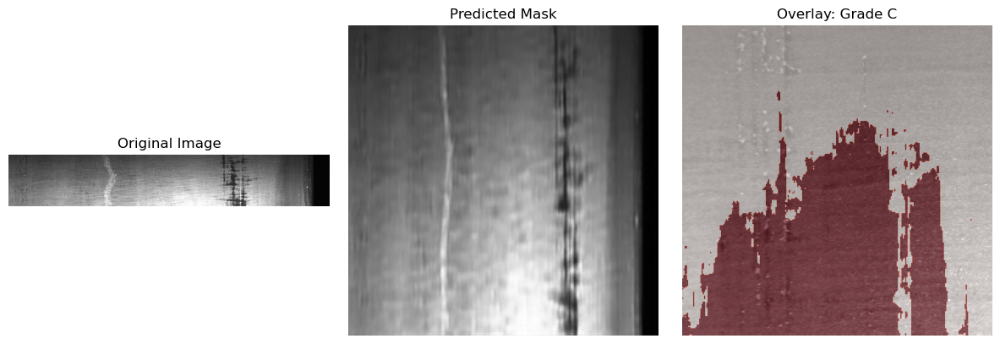

In [5]:
classify_steel_grade(r"C:\Users\omash\OneDrive\Documents\Desktop\severstal-steel-defect-detection\train_images\00e0398ad.jpg", model)


1/1 [==============================] - 0s 284ms/step


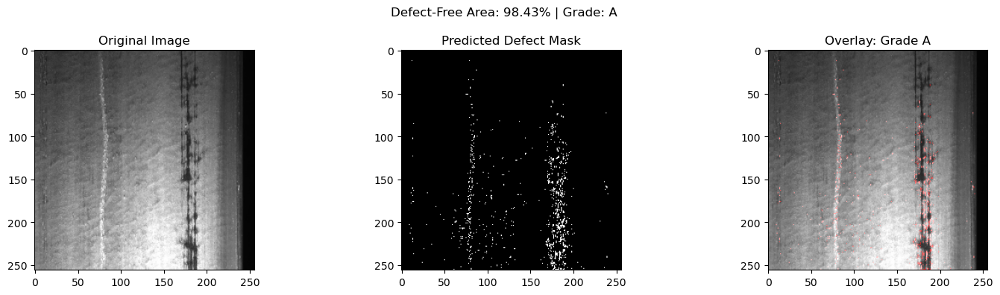


✅ Defect-Free Area: 98.43%
✅ Steel Grade: A


In [3]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from PIL import Image
import cv2
import os

# 📌 Load the trained autoencoder model
autoencoder = load_model("defect_detection_model.h5", compile=False)

# 🧩 Utility: Load and preprocess image
def preprocess_image(image_path, target_size=(256, 256)):
    img = Image.open(image_path).convert("RGB").resize(target_size)
    img_array = np.array(img) / 255.0
    return img_array, img  # return both array and PIL image

# 🧠 Utility: Predict and post-process
def predict_defect_mask(image_array):
    input_batch = np.expand_dims(image_array, axis=0)
    reconstructed = autoencoder.predict(input_batch)[0]
    diff = np.abs(image_array - reconstructed)
    mask = np.mean(diff, axis=-1) > 0.1  # Threshold to create binary mask
    return mask.astype(np.uint8)

# 🧮 Utility: Calculate defect-free area % and assign grade
def calculate_grade(mask):
    total_pixels = mask.size
    defect_pixels = np.sum(mask)
    defect_free_percent = 100 - ((defect_pixels / total_pixels) * 100)

    if defect_free_percent >= 90:
        grade = "A"
    elif defect_free_percent >= 75:
        grade = "B"
    elif defect_free_percent >= 50:
        grade = "C"
    else:
        grade = "F"

    return defect_free_percent, grade

# 📊 Utility: Display results
def visualize_results(original_img, mask, defect_free_percent, grade):
    overlay = np.array(original_img).copy()
    mask_colored = np.stack([mask * 255, np.zeros_like(mask), np.zeros_like(mask)], axis=-1)
    overlay = cv2.addWeighted(overlay.astype(np.uint8), 1.0, mask_colored.astype(np.uint8), 0.5, 0)

    # Plot
    plt.figure(figsize=(15, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(original_img)
    plt.title("Original Image")

    plt.subplot(1, 3, 2)
    plt.imshow(mask, cmap="gray")
    plt.title("Predicted Defect Mask")

    plt.subplot(1, 3, 3)
    plt.imshow(overlay)
    plt.title(f"Overlay: Grade {grade}")
    plt.suptitle(f"Defect-Free Area: {defect_free_percent:.2f}% | Grade: {grade}")
    plt.tight_layout()
    plt.show()

# 🚀 Main Prediction Function
def run_defect_detection(image_path):
    img_array, original_img = preprocess_image(image_path)
    mask = predict_defect_mask(img_array)
    defect_free_percent, grade = calculate_grade(mask)
    visualize_results(original_img, mask, defect_free_percent, grade)
    print(f"\n✅ Defect-Free Area: {defect_free_percent:.2f}%")
    print(f"✅ Steel Grade: {grade}")

# 📌 Example usage
run_defect_detection(r"C:\Users\omash\OneDrive\Documents\Desktop\severstal-steel-defect-detection\train_images\00e0398ad.jpg")


In [ ]:
import io
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
from ipywidgets import FileUpload, Button, VBox, Output
from IPython.display import display

# 🧠 Load your trained model (make sure path is correct)
model = tf.keras.models.load_model("defect_detection_model.h5", compile=False)

# 🧾 Threshold for defect detection
THRESHOLD = 0.2

# 🎯 Output area
output = Output()

# ⬆️ File upload widget
upload_widget = FileUpload(accept='image/*', multiple=False)

# 🔘 Button to trigger analysis
analyze_button = Button(description="🔍 Detect Defect & Grade", button_style="primary")

# 🔁 Detection and grading function
def detect_and_grade(image_bytes):
    with output:
        output.clear_output()
        
        # Load and preprocess the image
        img = Image.open(io.BytesIO(image_bytes)).convert("RGB")
        img = img.resize((256, 256))
        img_array = np.array(img) / 255.0
        input_img = np.expand_dims(img_array, axis=0)

        # Predict with autoencoder
        reconstructed = model.predict(input_img)[0]
        diff = np.mean(np.abs(reconstructed - img_array), axis=2)
        binary_mask = (diff > THRESHOLD).astype(np.uint8)

        # Calculate defect-free %
        total_pixels = binary_mask.size
        defect_pixels = np.sum(binary_mask)
        defect_free_percent = 100 * (1 - defect_pixels / total_pixels)

        # Grade logic
        if defect_free_percent >= 90:
            grade = "A"
        elif defect_free_percent >= 75:
            grade = "B"
        elif defect_free_percent >= 50:
            grade = "C"
        else:
            grade = "F"

        # Create overlay
        overlay = img_array.copy()
        overlay[binary_mask == 1] = [0.5, 0, 0]  # Red tint for defects

        # Plot results
        fig, axs = plt.subplots(1, 3, figsize=(12, 4))
        axs[0].imshow(img_array)
        axs[0].set_title("Original Image")
        axs[0].axis("off")

        axs[1].imshow(diff, cmap='gray')
        axs[1].set_title("Predicted Mask")
        axs[1].axis("off")

        axs[2].imshow(overlay)
        axs[2].set_title(f"Overlay: Grade {grade}")
        axs[2].axis("off")

        plt.tight_layout()
        plt.show()

        # Text output
        print(f"✅ Defect-Free Area: {defect_free_percent:.2f}%")
        print(f"🏷️ Steel Grade: {grade}")

# 🔘 When button is clicked
def on_analyze_clicked(b):
    output.clear_output()
    if upload_widget.value:
        file_info = list(upload_widget.value.values())[0]
        image_bytes = file_info['content']
        detect_and_grade(image_bytes)
    else:
        with output:
            print("⚠️ Please upload an image first.")

# Link button to action
analyze_button.on_click(on_analyze_clicked)

# Display UI
display(VBox([upload_widget, analyze_button, output]))


In [1]:
import io
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
from ipywidgets import FileUpload, Button, VBox, Output
from IPython.display import display

# 🧠 Load your trained model (make sure path is correct)
model = tf.keras.models.load_model("defect_detection_model.h5", compile=False)

# 🧾 Threshold for defect detection
THRESHOLD = 0.2

# 🎯 Output area
output = Output()

# ⬆️ File upload widget
upload_widget = FileUpload(accept='image/*', multiple=False)

# 🔘 Button to trigger analysis
analyze_button = Button(description="🔍 Detect Defect & Grade", button_style="primary")

# 🔁 Detection and grading function
def detect_and_grade(image_bytes):
    with output:
        output.clear_output()
        
        # Load and preprocess the image
        img = Image.open(io.BytesIO(image_bytes)).convert("RGB")
        img = img.resize((256, 256))
        img_array = np.array(img) / 255.0
        input_img = np.expand_dims(img_array, axis=0)

        # Predict with autoencoder
        reconstructed = model.predict(input_img)[0]
        diff = np.mean(np.abs(reconstructed - img_array), axis=2)
        binary_mask = (diff > THRESHOLD).astype(np.uint8)

        # Calculate defect-free %
        total_pixels = binary_mask.size
        defect_pixels = np.sum(binary_mask)
        defect_free_percent = 100 * (1 - defect_pixels / total_pixels)

        # Grade logic
        if defect_free_percent >= 90:
            grade = "A"
        elif defect_free_percent >= 75:
            grade = "B"
        elif defect_free_percent >= 50:
            grade = "C"
        else:
            grade = "F"

        # Create overlay
        overlay = img_array.copy()
        overlay[binary_mask == 1] = [0.5, 0, 0]  # Red tint for defects

        # Plot results
        fig, axs = plt.subplots(1, 3, figsize=(12, 4))
        axs[0].imshow(img_array)
        axs[0].set_title("Original Image")
        axs[0].axis("off")

        axs[1].imshow(diff, cmap='gray')
        axs[1].set_title("Predicted Mask")
        axs[1].axis("off")

        axs[2].imshow(overlay)
        axs[2].set_title(f"Overlay: Grade {grade}")
        axs[2].axis("off")

        plt.tight_layout()
        plt.show()

        # Text output
        print(f"✅ Defect-Free Area: {defect_free_percent:.2f}%")
        print(f"🏷️ Steel Grade: {grade}")

# 🔘 When button is clicked
def on_analyze_clicked(b):
    output.clear_output()
    if upload_widget.value:
        file_info = list(upload_widget.value.values())[0]
        image_bytes = file_info['content']
        detect_and_grade(image_bytes)
    else:
        with output:
            print("⚠️ Please upload an image first.")

# Link button to action
analyze_button.on_click(on_analyze_clicked)

# Display UI
display(VBox([upload_widget, analyze_button, output]))


In [7]:
import io
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
import ipywidgets as widgets
from IPython.display import display, clear_output

# ✅ Load your trained model (ensure this file exists)
model = tf.keras.models.load_model("defect_detection_model.h5", compile=False)

# 🧠 Grading function
def get_steel_grade(defect_free_percent):
    if defect_free_percent >= 90:
        return 'A'
    elif defect_free_percent >= 75:
        return 'B'
    elif defect_free_percent >= 50:
        return 'C'
    else:
        return 'F'

# 📊 Visualization function
def visualize_results(original, predicted_mask, overlay, defect_free_percent, grade):
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(original)
    axs[0].set_title("Original Image")
    axs[0].axis('off')

    axs[1].imshow(predicted_mask, cmap='gray')
    axs[1].set_title("Predicted Mask")
    axs[1].axis('off')

    axs[2].imshow(overlay)
    axs[2].set_title(f"Overlay: Grade {grade}")
    axs[2].axis('off')

    plt.suptitle(f"✅ Defect-Free Area: {defect_free_percent:.2f}% | Grade: {grade}", fontsize=14)
    plt.tight_layout()
    plt.show()

# 📦 Auto-handler when image is uploaded
def on_upload_change(change):
    clear_output(wait=True)

    # Read image bytes
    uploaded_file = next(iter(upload_widget.value.values()))
    image_data = uploaded_file['content']
    img = Image.open(io.BytesIO(image_data)).convert("RGB").resize((256, 256))
    input_img = np.array(img) / 255.0
    input_tensor = np.expand_dims(input_img, axis=0)

    # 🔍 Predict mask
    predicted = model.predict(input_tensor)[0]
    predicted_mask = np.mean(np.abs(input_img - predicted), axis=-1)
    binary_mask = predicted_mask > 0.2  # defect threshold

    # 📈 Calculate defect-free %
    total_pixels = binary_mask.size
    defect_pixels = np.sum(binary_mask)
    defect_free_percent = 100 * (1 - defect_pixels / total_pixels)
    grade = get_steel_grade(defect_free_percent)

    # 🎨 Create overlay
    overlay = img.copy()
    overlay_np = np.array(overlay)
    overlay_np[binary_mask] = [128, 0, 0]  # reddish for defect
    overlay = Image.fromarray(overlay_np)

    # 📊 Show results
    visualize_results(img, predicted_mask, overlay, defect_free_percent, grade)

# 🧱 Upload widget setup
upload_widget = widgets.FileUpload(accept='image/*', multiple=False)
upload_widget.observe(on_upload_change, names='value')

# 📥 Display
display(widgets.HTML("<h3>📤 Upload a steel image to analyze automatically</h3>"))
display(upload_widget)


HTML(value='<h3>📤 Upload a steel image to analyze automatically</h3>')

FileUpload(value={}, accept='image/*', description='Upload')